## MAS651 Homework2
Team members: Jiaying Wu, Chen Li, Zhao Chen

## 1. Problem 1 (30 points) Analyzing Advertising Data
(Hint: You may find useful Python commands from Logistic_example2.ipynt and Xgboostexampleb.ipynt).
This data set contains the following features:
- 'Daily Time Spent on Site': consumer time on site in minutes
- 'Age': cutomer age in years
- 'Area Income': Avg. Income of geographical area of consumer
- 'Daily Internet Usage': Avg. minutes a day consumer is on the internet 'Ad Topic Line': Headline of the advertisement
- 'City': City of consumer
- 'Male': Whether or not consumer was male
- 'Country': Country of consumer
- 'Timestamp': Time at which consumer clicked on Ad or closed window 'Clicked on Ad': 0 or 1 indicated clicking on Ad

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from matplotlib import pyplot

import warnings
warnings.filterwarnings('ignore')

### (1) Print the shape of the DataFrame using data.shape

In [25]:
ad_data = pd.read_csv('https://raw.githubusercontent.com/wangx346/MAS651/main/advertising.csv')

In [26]:
print(ad_data.shape)

(1000, 10)


### (2) Define your outcome Y to be the variable: “Clicked on Ad”. Print out how many zeros are in Y and how many ones are in Y. Use sns.countplot to make a count plot for Y.

In [38]:
ad_data['Y']=ad_data['Clicked on Ad']

In [39]:
ad_data['Y'].value_counts()

0    500
1    500
Name: Y, dtype: int64

### (3) Make a bar chart to show how the frequency of clicking on the ad depends on gender. Make a histogram of age.

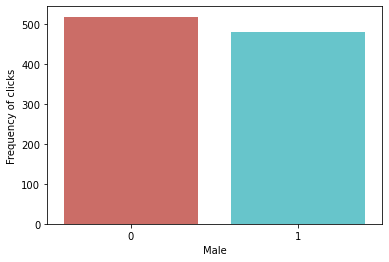

In [31]:
sns.countplot(x='Male',data=ad_data, palette='hls')
plt.ylabel("Frequency of clicks")
plt.show()


Text(0.5, 0, 'Age')

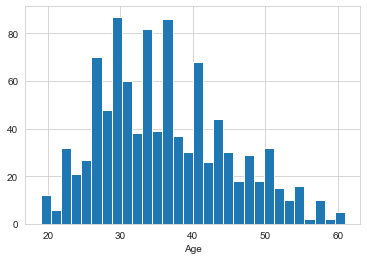

In [32]:
sns.set_style('whitegrid')
ad_data['Age'].hist(bins=30)
plt.xlabel('Age')

### (4) Create a training data set and a test data set such that the test data set contains randomly 20% of the data set. Set the random seed to be 40. Read the Xgboostexampleb.ipynt example for binary classification. Implement Xgboost for classification on the training data.

In [55]:
X = ad_data[['Daily Time Spent on Site', 'Age', 'Area Income','Daily Internet Usage', 'Male']]
y = ad_data['Y']

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=40)

### (5) Evaluate the algorithm of Xgboost classifier on the test data. Report the accuracy, confusion matrix. Plot the ROC curve.

In [58]:
model = xgb.XGBClassifier(max_depth=4,
                        subsample=0.9,
                        objective='binary:logistic',
                        n_estimators=200,
                        learning_rate = 0.1)
# train_x, test_x, train_Y, test_Y = train_test_split(X, Y, test_size=0.1, stratify=Y, random_state=0)
eval_set = [(X_train, y_train), (X_test, y_test)]

model.fit(X_train, y_train.values.ravel(), early_stopping_rounds=10, eval_metric=["error", "logloss"], eval_set=eval_set, verbose=True)

[0]	validation_0-error:0.04375	validation_0-logloss:0.61310	validation_1-error:0.06000	validation_1-logloss:0.61381
[1]	validation_0-error:0.03875	validation_0-logloss:0.54598	validation_1-error:0.04000	validation_1-logloss:0.54514
[2]	validation_0-error:0.04250	validation_0-logloss:0.49029	validation_1-error:0.03500	validation_1-logloss:0.48875
[3]	validation_0-error:0.03500	validation_0-logloss:0.44188	validation_1-error:0.03500	validation_1-logloss:0.43962
[4]	validation_0-error:0.03625	validation_0-logloss:0.40098	validation_1-error:0.03000	validation_1-logloss:0.40040
[5]	validation_0-error:0.03500	validation_0-logloss:0.36622	validation_1-error:0.04000	validation_1-logloss:0.36543
[6]	validation_0-error:0.03375	validation_0-logloss:0.33543	validation_1-error:0.03500	validation_1-logloss:0.33279
[7]	validation_0-error:0.02875	validation_0-logloss:0.30814	validation_1-error:0.02500	validation_1-logloss:0.30590
[8]	validation_0-error:0.02750	validation_0-logloss:0.28389	validation_1

[71]	validation_0-error:0.00875	validation_0-logloss:0.04284	validation_1-error:0.01500	validation_1-logloss:0.05421
[72]	validation_0-error:0.00875	validation_0-logloss:0.04234	validation_1-error:0.01500	validation_1-logloss:0.05449
[73]	validation_0-error:0.00875	validation_0-logloss:0.04189	validation_1-error:0.01500	validation_1-logloss:0.05418
[74]	validation_0-error:0.00875	validation_0-logloss:0.04124	validation_1-error:0.01500	validation_1-logloss:0.05419
[75]	validation_0-error:0.00875	validation_0-logloss:0.04057	validation_1-error:0.01500	validation_1-logloss:0.05396
[76]	validation_0-error:0.00875	validation_0-logloss:0.03997	validation_1-error:0.01500	validation_1-logloss:0.05414
[77]	validation_0-error:0.00875	validation_0-logloss:0.03926	validation_1-error:0.01500	validation_1-logloss:0.05428
[78]	validation_0-error:0.00875	validation_0-logloss:0.03888	validation_1-error:0.01500	validation_1-logloss:0.05441
[79]	validation_0-error:0.00875	validation_0-logloss:0.03829	val

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=200, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [61]:
# make predictions for test data
y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]

# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 98.00%


In [62]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,predictions))

[[111   1]
 [  3  85]]


Logistic: ROC AUC=0.999


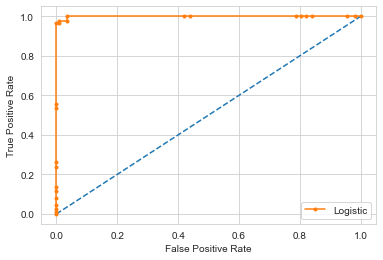

In [75]:
# generate a clicked or not prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
# predict probabilities
lr_probs = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
# calculate scores
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--')
pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Logistic')

# summarize scores
print('Logistic: ROC AUC=%.3f' % (lr_auc))

# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

### (6) Could you find better choices of parameters using GridSearchCV?

In [84]:
params = { 'max_depth': [3,6,10],
           'learning_rate': [0.01, 0.05, 0.1],
           'n_estimators': [100, 500,1000],
           'subsample': [0.3, 0.5, 0.7, 1]}
xgbr = xgb.XGBClassifier(objective='binary:logistic')
clf = GridSearchCV(estimator=xgbr, 
                   param_grid=params)

# train_x, test_x, train_Y, test_Y = train_test_split(X, Y, test_size=0.1, stratify=Y, random_state=0)
eval_set = [(X_train, y_train), (X_test, y_test)]

clf.fit(X_train, y_train.values.ravel(), early_stopping_rounds=10, eval_metric=["error", "logloss"], eval_set=eval_set, verbose=True)


[0]	validation_0-error:0.07250	validation_0-logloss:0.68539	validation_1-error:0.05000	validation_1-logloss:0.68522
[1]	validation_0-error:0.06125	validation_0-logloss:0.67768	validation_1-error:0.07500	validation_1-logloss:0.67773
[2]	validation_0-error:0.06000	validation_0-logloss:0.67042	validation_1-error:0.06000	validation_1-logloss:0.67011
[3]	validation_0-error:0.05250	validation_0-logloss:0.66319	validation_1-error:0.04000	validation_1-logloss:0.66230
[4]	validation_0-error:0.05375	validation_0-logloss:0.65604	validation_1-error:0.04500	validation_1-logloss:0.65494
[5]	validation_0-error:0.05000	validation_0-logloss:0.64888	validation_1-error:0.03500	validation_1-logloss:0.64732
[6]	validation_0-error:0.04500	validation_0-logloss:0.64201	validation_1-error:0.02000	validation_1-logloss:0.64023
[7]	validation_0-error:0.05250	validation_0-logloss:0.63523	validation_1-error:0.02500	validation_1-logloss:0.63327
[8]	validation_0-error:0.04500	validation_0-logloss:0.62844	validation_1

[71]	validation_0-error:0.04125	validation_0-logloss:0.35870	validation_1-error:0.01000	validation_1-logloss:0.34627
[72]	validation_0-error:0.04125	validation_0-logloss:0.35588	validation_1-error:0.01000	validation_1-logloss:0.34309
[73]	validation_0-error:0.04250	validation_0-logloss:0.35325	validation_1-error:0.01000	validation_1-logloss:0.34021
[74]	validation_0-error:0.04250	validation_0-logloss:0.35049	validation_1-error:0.01000	validation_1-logloss:0.33720
[75]	validation_0-error:0.04125	validation_0-logloss:0.34782	validation_1-error:0.01000	validation_1-logloss:0.33437
[76]	validation_0-error:0.04125	validation_0-logloss:0.34501	validation_1-error:0.01000	validation_1-logloss:0.33121
[77]	validation_0-error:0.04125	validation_0-logloss:0.34240	validation_1-error:0.01000	validation_1-logloss:0.32842
[78]	validation_0-error:0.04125	validation_0-logloss:0.33992	validation_1-error:0.01000	validation_1-logloss:0.32603
[79]	validation_0-error:0.04125	validation_0-logloss:0.33754	val

[42]	validation_0-error:0.05375	validation_0-logloss:0.45379	validation_1-error:0.02500	validation_1-logloss:0.44676
[43]	validation_0-error:0.05250	validation_0-logloss:0.44981	validation_1-error:0.03000	validation_1-logloss:0.44265
[44]	validation_0-error:0.05375	validation_0-logloss:0.44583	validation_1-error:0.03000	validation_1-logloss:0.43862
[45]	validation_0-error:0.05375	validation_0-logloss:0.44187	validation_1-error:0.03000	validation_1-logloss:0.43448
[46]	validation_0-error:0.05375	validation_0-logloss:0.43813	validation_1-error:0.02500	validation_1-logloss:0.43065
[47]	validation_0-error:0.05375	validation_0-logloss:0.43455	validation_1-error:0.02500	validation_1-logloss:0.42696
[48]	validation_0-error:0.05375	validation_0-logloss:0.43076	validation_1-error:0.02500	validation_1-logloss:0.42313
[49]	validation_0-error:0.05375	validation_0-logloss:0.42712	validation_1-error:0.02500	validation_1-logloss:0.41920
[50]	validation_0-error:0.05375	validation_0-logloss:0.42347	val

[13]	validation_0-error:0.05375	validation_0-logloss:0.59608	validation_1-error:0.03000	validation_1-logloss:0.59382
[14]	validation_0-error:0.05125	validation_0-logloss:0.58991	validation_1-error:0.03000	validation_1-logloss:0.58753
[15]	validation_0-error:0.04875	validation_0-logloss:0.58374	validation_1-error:0.02000	validation_1-logloss:0.58126
[16]	validation_0-error:0.05000	validation_0-logloss:0.57783	validation_1-error:0.02500	validation_1-logloss:0.57500
[17]	validation_0-error:0.04875	validation_0-logloss:0.57188	validation_1-error:0.01500	validation_1-logloss:0.56856
[18]	validation_0-error:0.04625	validation_0-logloss:0.56590	validation_1-error:0.01500	validation_1-logloss:0.56210
[19]	validation_0-error:0.04875	validation_0-logloss:0.56065	validation_1-error:0.01500	validation_1-logloss:0.55676
[20]	validation_0-error:0.04625	validation_0-logloss:0.55515	validation_1-error:0.01500	validation_1-logloss:0.55080
[21]	validation_0-error:0.04875	validation_0-logloss:0.54973	val

[84]	validation_0-error:0.04625	validation_0-logloss:0.32398	validation_1-error:0.01500	validation_1-logloss:0.31178
[85]	validation_0-error:0.04875	validation_0-logloss:0.32133	validation_1-error:0.01500	validation_1-logloss:0.30901
[86]	validation_0-error:0.04875	validation_0-logloss:0.31894	validation_1-error:0.01500	validation_1-logloss:0.30650
[87]	validation_0-error:0.04875	validation_0-logloss:0.31651	validation_1-error:0.01500	validation_1-logloss:0.30373
[88]	validation_0-error:0.04875	validation_0-logloss:0.31437	validation_1-error:0.01500	validation_1-logloss:0.30144
[89]	validation_0-error:0.04875	validation_0-logloss:0.31244	validation_1-error:0.01500	validation_1-logloss:0.29928
[90]	validation_0-error:0.05000	validation_0-logloss:0.31034	validation_1-error:0.01500	validation_1-logloss:0.29697
[91]	validation_0-error:0.05000	validation_0-logloss:0.30830	validation_1-error:0.01500	validation_1-logloss:0.29497
[92]	validation_0-error:0.05000	validation_0-logloss:0.30616	val

[55]	validation_0-error:0.04875	validation_0-logloss:0.40504	validation_1-error:0.03500	validation_1-logloss:0.39565
[56]	validation_0-error:0.04875	validation_0-logloss:0.40200	validation_1-error:0.03500	validation_1-logloss:0.39248
[57]	validation_0-error:0.04875	validation_0-logloss:0.39865	validation_1-error:0.03500	validation_1-logloss:0.38891
[58]	validation_0-error:0.04875	validation_0-logloss:0.39523	validation_1-error:0.03000	validation_1-logloss:0.38536
[59]	validation_0-error:0.04875	validation_0-logloss:0.39196	validation_1-error:0.03000	validation_1-logloss:0.38205
[60]	validation_0-error:0.04875	validation_0-logloss:0.38895	validation_1-error:0.03000	validation_1-logloss:0.37892
[61]	validation_0-error:0.04875	validation_0-logloss:0.38592	validation_1-error:0.03000	validation_1-logloss:0.37563
[62]	validation_0-error:0.05000	validation_0-logloss:0.38300	validation_1-error:0.03000	validation_1-logloss:0.37252
[63]	validation_0-error:0.04875	validation_0-logloss:0.38018	val

[26]	validation_0-error:0.04375	validation_0-logloss:0.52356	validation_1-error:0.02000	validation_1-logloss:0.51935
[27]	validation_0-error:0.04500	validation_0-logloss:0.51871	validation_1-error:0.01500	validation_1-logloss:0.51432
[28]	validation_0-error:0.04375	validation_0-logloss:0.51377	validation_1-error:0.02500	validation_1-logloss:0.50906
[29]	validation_0-error:0.04375	validation_0-logloss:0.50907	validation_1-error:0.02500	validation_1-logloss:0.50436
[30]	validation_0-error:0.04375	validation_0-logloss:0.50422	validation_1-error:0.03000	validation_1-logloss:0.49919
[31]	validation_0-error:0.04375	validation_0-logloss:0.49946	validation_1-error:0.02500	validation_1-logloss:0.49429
[32]	validation_0-error:0.04375	validation_0-logloss:0.49493	validation_1-error:0.03000	validation_1-logloss:0.48948
[33]	validation_0-error:0.04375	validation_0-logloss:0.49042	validation_1-error:0.03000	validation_1-logloss:0.48493
[34]	validation_0-error:0.04375	validation_0-logloss:0.48594	val

[97]	validation_0-error:0.04250	validation_0-logloss:0.29589	validation_1-error:0.01500	validation_1-logloss:0.28253
[98]	validation_0-error:0.04250	validation_0-logloss:0.29387	validation_1-error:0.01500	validation_1-logloss:0.28040
[99]	validation_0-error:0.04250	validation_0-logloss:0.29204	validation_1-error:0.01500	validation_1-logloss:0.27865
[0]	validation_0-error:0.06625	validation_0-logloss:0.68526	validation_1-error:0.06000	validation_1-logloss:0.68513
[1]	validation_0-error:0.06125	validation_0-logloss:0.67744	validation_1-error:0.06000	validation_1-logloss:0.67755
[2]	validation_0-error:0.05625	validation_0-logloss:0.67005	validation_1-error:0.06000	validation_1-logloss:0.67016
[3]	validation_0-error:0.04875	validation_0-logloss:0.66242	validation_1-error:0.04000	validation_1-logloss:0.66221
[4]	validation_0-error:0.05125	validation_0-logloss:0.65519	validation_1-error:0.05500	validation_1-logloss:0.65530
[5]	validation_0-error:0.04500	validation_0-logloss:0.64797	validatio

[68]	validation_0-error:0.04125	validation_0-logloss:0.35925	validation_1-error:0.01000	validation_1-logloss:0.35054
[69]	validation_0-error:0.04125	validation_0-logloss:0.35631	validation_1-error:0.01000	validation_1-logloss:0.34762
[70]	validation_0-error:0.04125	validation_0-logloss:0.35336	validation_1-error:0.01000	validation_1-logloss:0.34455
[71]	validation_0-error:0.04125	validation_0-logloss:0.35049	validation_1-error:0.01000	validation_1-logloss:0.34155
[72]	validation_0-error:0.04000	validation_0-logloss:0.34763	validation_1-error:0.01000	validation_1-logloss:0.33833
[73]	validation_0-error:0.04125	validation_0-logloss:0.34474	validation_1-error:0.01000	validation_1-logloss:0.33542
[74]	validation_0-error:0.04250	validation_0-logloss:0.34197	validation_1-error:0.01000	validation_1-logloss:0.33246
[75]	validation_0-error:0.04125	validation_0-logloss:0.33937	validation_1-error:0.01000	validation_1-logloss:0.32984
[76]	validation_0-error:0.04250	validation_0-logloss:0.33659	val

[39]	validation_0-error:0.04625	validation_0-logloss:0.45902	validation_1-error:0.04000	validation_1-logloss:0.45378
[40]	validation_0-error:0.04625	validation_0-logloss:0.45491	validation_1-error:0.04000	validation_1-logloss:0.44945
[41]	validation_0-error:0.04750	validation_0-logloss:0.45087	validation_1-error:0.04000	validation_1-logloss:0.44548
[42]	validation_0-error:0.04625	validation_0-logloss:0.44684	validation_1-error:0.04000	validation_1-logloss:0.44098
[43]	validation_0-error:0.04875	validation_0-logloss:0.44280	validation_1-error:0.04000	validation_1-logloss:0.43683
[44]	validation_0-error:0.04750	validation_0-logloss:0.43868	validation_1-error:0.04000	validation_1-logloss:0.43272
[45]	validation_0-error:0.04750	validation_0-logloss:0.43485	validation_1-error:0.04000	validation_1-logloss:0.42871
[46]	validation_0-error:0.04625	validation_0-logloss:0.43105	validation_1-error:0.04500	validation_1-logloss:0.42483
[47]	validation_0-error:0.04625	validation_0-logloss:0.42733	val

[10]	validation_0-error:0.05625	validation_0-logloss:0.61329	validation_1-error:0.03500	validation_1-logloss:0.61170
[11]	validation_0-error:0.05750	validation_0-logloss:0.60672	validation_1-error:0.04500	validation_1-logloss:0.60514
[12]	validation_0-error:0.05875	validation_0-logloss:0.60025	validation_1-error:0.03500	validation_1-logloss:0.59859
[13]	validation_0-error:0.05750	validation_0-logloss:0.59398	validation_1-error:0.04000	validation_1-logloss:0.59248
[14]	validation_0-error:0.05625	validation_0-logloss:0.58764	validation_1-error:0.03500	validation_1-logloss:0.58597
[15]	validation_0-error:0.05500	validation_0-logloss:0.58139	validation_1-error:0.04000	validation_1-logloss:0.57969
[16]	validation_0-error:0.05500	validation_0-logloss:0.57539	validation_1-error:0.03500	validation_1-logloss:0.57362
[17]	validation_0-error:0.05375	validation_0-logloss:0.56946	validation_1-error:0.03500	validation_1-logloss:0.56753
[18]	validation_0-error:0.05375	validation_0-logloss:0.56341	val

[81]	validation_0-error:0.04500	validation_0-logloss:0.32377	validation_1-error:0.02000	validation_1-logloss:0.31589
[82]	validation_0-error:0.04500	validation_0-logloss:0.32137	validation_1-error:0.02000	validation_1-logloss:0.31328
[83]	validation_0-error:0.04500	validation_0-logloss:0.31894	validation_1-error:0.02000	validation_1-logloss:0.31066
[84]	validation_0-error:0.04500	validation_0-logloss:0.31647	validation_1-error:0.02000	validation_1-logloss:0.30805
[85]	validation_0-error:0.04250	validation_0-logloss:0.31392	validation_1-error:0.02000	validation_1-logloss:0.30531
[86]	validation_0-error:0.04500	validation_0-logloss:0.31160	validation_1-error:0.02000	validation_1-logloss:0.30285
[87]	validation_0-error:0.04250	validation_0-logloss:0.30922	validation_1-error:0.02000	validation_1-logloss:0.30024
[88]	validation_0-error:0.04250	validation_0-logloss:0.30694	validation_1-error:0.01500	validation_1-logloss:0.29761
[89]	validation_0-error:0.04250	validation_0-logloss:0.30467	val

[52]	validation_0-error:0.05250	validation_0-logloss:0.40845	validation_1-error:0.05000	validation_1-logloss:0.40378
[53]	validation_0-error:0.05250	validation_0-logloss:0.40487	validation_1-error:0.05000	validation_1-logloss:0.40003
[54]	validation_0-error:0.05250	validation_0-logloss:0.40139	validation_1-error:0.04500	validation_1-logloss:0.39628
[55]	validation_0-error:0.05250	validation_0-logloss:0.39805	validation_1-error:0.05000	validation_1-logloss:0.39296
[56]	validation_0-error:0.05375	validation_0-logloss:0.39476	validation_1-error:0.04500	validation_1-logloss:0.38972
[57]	validation_0-error:0.05250	validation_0-logloss:0.39149	validation_1-error:0.04500	validation_1-logloss:0.38633
[58]	validation_0-error:0.05250	validation_0-logloss:0.38798	validation_1-error:0.04000	validation_1-logloss:0.38254
[59]	validation_0-error:0.05375	validation_0-logloss:0.38474	validation_1-error:0.03500	validation_1-logloss:0.37901
[60]	validation_0-error:0.05500	validation_0-logloss:0.38157	val

[23]	validation_0-error:0.04125	validation_0-logloss:0.53507	validation_1-error:0.01500	validation_1-logloss:0.53202
[24]	validation_0-error:0.04125	validation_0-logloss:0.52976	validation_1-error:0.01500	validation_1-logloss:0.52665
[25]	validation_0-error:0.04125	validation_0-logloss:0.52455	validation_1-error:0.02000	validation_1-logloss:0.52163
[26]	validation_0-error:0.04125	validation_0-logloss:0.51940	validation_1-error:0.02000	validation_1-logloss:0.51656
[27]	validation_0-error:0.04250	validation_0-logloss:0.51445	validation_1-error:0.02000	validation_1-logloss:0.51175
[28]	validation_0-error:0.04250	validation_0-logloss:0.50954	validation_1-error:0.02000	validation_1-logloss:0.50688
[29]	validation_0-error:0.04000	validation_0-logloss:0.50463	validation_1-error:0.02500	validation_1-logloss:0.50177
[30]	validation_0-error:0.04000	validation_0-logloss:0.49977	validation_1-error:0.02000	validation_1-logloss:0.49671
[31]	validation_0-error:0.04250	validation_0-logloss:0.49488	val

[94]	validation_0-error:0.03750	validation_0-logloss:0.29282	validation_1-error:0.01500	validation_1-logloss:0.28412
[95]	validation_0-error:0.03750	validation_0-logloss:0.29087	validation_1-error:0.01500	validation_1-logloss:0.28203
[96]	validation_0-error:0.03750	validation_0-logloss:0.28873	validation_1-error:0.01500	validation_1-logloss:0.27979
[97]	validation_0-error:0.03750	validation_0-logloss:0.28653	validation_1-error:0.01500	validation_1-logloss:0.27744
[98]	validation_0-error:0.03750	validation_0-logloss:0.28455	validation_1-error:0.01500	validation_1-logloss:0.27541
[99]	validation_0-error:0.03750	validation_0-logloss:0.28251	validation_1-error:0.01500	validation_1-logloss:0.27346
[0]	validation_0-error:0.05000	validation_0-logloss:0.68488	validation_1-error:0.02000	validation_1-logloss:0.68443
[1]	validation_0-error:0.04500	validation_0-logloss:0.67686	validation_1-error:0.01500	validation_1-logloss:0.67647
[2]	validation_0-error:0.04500	validation_0-logloss:0.66905	valida

[65]	validation_0-error:0.04250	validation_0-logloss:0.36338	validation_1-error:0.01500	validation_1-logloss:0.35779
[66]	validation_0-error:0.04250	validation_0-logloss:0.36044	validation_1-error:0.01500	validation_1-logloss:0.35468
[67]	validation_0-error:0.04125	validation_0-logloss:0.35749	validation_1-error:0.01500	validation_1-logloss:0.35145
[68]	validation_0-error:0.04125	validation_0-logloss:0.35462	validation_1-error:0.01500	validation_1-logloss:0.34849
[69]	validation_0-error:0.04125	validation_0-logloss:0.35187	validation_1-error:0.01500	validation_1-logloss:0.34563
[70]	validation_0-error:0.04125	validation_0-logloss:0.34892	validation_1-error:0.01500	validation_1-logloss:0.34281
[71]	validation_0-error:0.04125	validation_0-logloss:0.34611	validation_1-error:0.01500	validation_1-logloss:0.33978
[72]	validation_0-error:0.04125	validation_0-logloss:0.34335	validation_1-error:0.01500	validation_1-logloss:0.33683
[73]	validation_0-error:0.04125	validation_0-logloss:0.34065	val

[36]	validation_0-error:0.05000	validation_0-logloss:0.46970	validation_1-error:0.04500	validation_1-logloss:0.46610
[37]	validation_0-error:0.05000	validation_0-logloss:0.46523	validation_1-error:0.04500	validation_1-logloss:0.46156
[38]	validation_0-error:0.05000	validation_0-logloss:0.46094	validation_1-error:0.04500	validation_1-logloss:0.45743
[39]	validation_0-error:0.05000	validation_0-logloss:0.45650	validation_1-error:0.04500	validation_1-logloss:0.45290
[40]	validation_0-error:0.05125	validation_0-logloss:0.45238	validation_1-error:0.04500	validation_1-logloss:0.44864
[41]	validation_0-error:0.05000	validation_0-logloss:0.44819	validation_1-error:0.04500	validation_1-logloss:0.44445
[42]	validation_0-error:0.05125	validation_0-logloss:0.44402	validation_1-error:0.04500	validation_1-logloss:0.44023
[43]	validation_0-error:0.05125	validation_0-logloss:0.43996	validation_1-error:0.04500	validation_1-logloss:0.43607
[44]	validation_0-error:0.05000	validation_0-logloss:0.43591	val

[7]	validation_0-error:0.05250	validation_0-logloss:0.63191	validation_1-error:0.03000	validation_1-logloss:0.63067
[8]	validation_0-error:0.05125	validation_0-logloss:0.62499	validation_1-error:0.03500	validation_1-logloss:0.62338
[9]	validation_0-error:0.05250	validation_0-logloss:0.61832	validation_1-error:0.03500	validation_1-logloss:0.61698
[10]	validation_0-error:0.05375	validation_0-logloss:0.61162	validation_1-error:0.03500	validation_1-logloss:0.61048
[11]	validation_0-error:0.05375	validation_0-logloss:0.60504	validation_1-error:0.03500	validation_1-logloss:0.60393
[12]	validation_0-error:0.05500	validation_0-logloss:0.59851	validation_1-error:0.03500	validation_1-logloss:0.59742
[13]	validation_0-error:0.05625	validation_0-logloss:0.59211	validation_1-error:0.03500	validation_1-logloss:0.59103
[14]	validation_0-error:0.05375	validation_0-logloss:0.58578	validation_1-error:0.03000	validation_1-logloss:0.58493
[15]	validation_0-error:0.05250	validation_0-logloss:0.57943	valida

[78]	validation_0-error:0.04125	validation_0-logloss:0.32656	validation_1-error:0.02500	validation_1-logloss:0.32074
[79]	validation_0-error:0.04250	validation_0-logloss:0.32408	validation_1-error:0.02500	validation_1-logloss:0.31830
[80]	validation_0-error:0.04125	validation_0-logloss:0.32159	validation_1-error:0.02500	validation_1-logloss:0.31561
[81]	validation_0-error:0.04125	validation_0-logloss:0.31914	validation_1-error:0.02500	validation_1-logloss:0.31308
[82]	validation_0-error:0.04125	validation_0-logloss:0.31662	validation_1-error:0.02500	validation_1-logloss:0.31040
[83]	validation_0-error:0.04125	validation_0-logloss:0.31420	validation_1-error:0.02500	validation_1-logloss:0.30786
[84]	validation_0-error:0.04250	validation_0-logloss:0.31179	validation_1-error:0.02500	validation_1-logloss:0.30538
[85]	validation_0-error:0.04250	validation_0-logloss:0.30937	validation_1-error:0.02500	validation_1-logloss:0.30274
[86]	validation_0-error:0.04125	validation_0-logloss:0.30691	val

[49]	validation_0-error:0.04500	validation_0-logloss:0.41506	validation_1-error:0.02500	validation_1-logloss:0.40889
[50]	validation_0-error:0.04625	validation_0-logloss:0.41148	validation_1-error:0.02500	validation_1-logloss:0.40532
[51]	validation_0-error:0.04500	validation_0-logloss:0.40779	validation_1-error:0.03000	validation_1-logloss:0.40143
[52]	validation_0-error:0.04500	validation_0-logloss:0.40420	validation_1-error:0.02500	validation_1-logloss:0.39773
[53]	validation_0-error:0.04500	validation_0-logloss:0.40069	validation_1-error:0.02500	validation_1-logloss:0.39416
[54]	validation_0-error:0.04500	validation_0-logloss:0.39717	validation_1-error:0.02500	validation_1-logloss:0.39043
[55]	validation_0-error:0.04500	validation_0-logloss:0.39368	validation_1-error:0.02500	validation_1-logloss:0.38697
[56]	validation_0-error:0.04500	validation_0-logloss:0.39041	validation_1-error:0.02500	validation_1-logloss:0.38383
[57]	validation_0-error:0.04500	validation_0-logloss:0.38709	val

[20]	validation_0-error:0.04375	validation_0-logloss:0.54935	validation_1-error:0.02500	validation_1-logloss:0.54780
[21]	validation_0-error:0.04125	validation_0-logloss:0.54373	validation_1-error:0.02500	validation_1-logloss:0.54229
[22]	validation_0-error:0.04125	validation_0-logloss:0.53813	validation_1-error:0.02500	validation_1-logloss:0.53643
[23]	validation_0-error:0.04250	validation_0-logloss:0.53260	validation_1-error:0.02000	validation_1-logloss:0.53098
[24]	validation_0-error:0.04125	validation_0-logloss:0.52705	validation_1-error:0.02000	validation_1-logloss:0.52516
[25]	validation_0-error:0.04000	validation_0-logloss:0.52165	validation_1-error:0.02000	validation_1-logloss:0.51967
[26]	validation_0-error:0.04125	validation_0-logloss:0.51632	validation_1-error:0.02000	validation_1-logloss:0.51430
[27]	validation_0-error:0.04125	validation_0-logloss:0.51134	validation_1-error:0.02000	validation_1-logloss:0.50937
[28]	validation_0-error:0.04000	validation_0-logloss:0.50616	val

[91]	validation_0-error:0.03625	validation_0-logloss:0.29493	validation_1-error:0.01500	validation_1-logloss:0.28919
[92]	validation_0-error:0.03625	validation_0-logloss:0.29272	validation_1-error:0.01500	validation_1-logloss:0.28680
[93]	validation_0-error:0.03500	validation_0-logloss:0.29055	validation_1-error:0.01500	validation_1-logloss:0.28464
[94]	validation_0-error:0.03500	validation_0-logloss:0.28841	validation_1-error:0.01500	validation_1-logloss:0.28236
[95]	validation_0-error:0.03625	validation_0-logloss:0.28638	validation_1-error:0.01500	validation_1-logloss:0.28022
[96]	validation_0-error:0.03625	validation_0-logloss:0.28433	validation_1-error:0.01500	validation_1-logloss:0.27812
[97]	validation_0-error:0.03500	validation_0-logloss:0.28224	validation_1-error:0.01500	validation_1-logloss:0.27596
[98]	validation_0-error:0.03500	validation_0-logloss:0.28024	validation_1-error:0.01500	validation_1-logloss:0.27384
[99]	validation_0-error:0.03500	validation_0-logloss:0.27824	val

[62]	validation_0-error:0.04000	validation_0-logloss:0.37059	validation_1-error:0.02000	validation_1-logloss:0.36551
[63]	validation_0-error:0.04000	validation_0-logloss:0.36749	validation_1-error:0.02000	validation_1-logloss:0.36243
[64]	validation_0-error:0.04000	validation_0-logloss:0.36445	validation_1-error:0.02000	validation_1-logloss:0.35930
[65]	validation_0-error:0.04000	validation_0-logloss:0.36145	validation_1-error:0.02000	validation_1-logloss:0.35620
[66]	validation_0-error:0.04000	validation_0-logloss:0.35850	validation_1-error:0.02000	validation_1-logloss:0.35319
[67]	validation_0-error:0.04000	validation_0-logloss:0.35556	validation_1-error:0.02000	validation_1-logloss:0.35027
[68]	validation_0-error:0.04000	validation_0-logloss:0.35267	validation_1-error:0.02000	validation_1-logloss:0.34727
[69]	validation_0-error:0.04000	validation_0-logloss:0.34984	validation_1-error:0.02000	validation_1-logloss:0.34437
[70]	validation_0-error:0.04000	validation_0-logloss:0.34700	val

[33]	validation_0-error:0.05125	validation_0-logloss:0.48457	validation_1-error:0.04500	validation_1-logloss:0.48128
[34]	validation_0-error:0.05125	validation_0-logloss:0.47986	validation_1-error:0.04500	validation_1-logloss:0.47653
[35]	validation_0-error:0.05125	validation_0-logloss:0.47521	validation_1-error:0.04500	validation_1-logloss:0.47185
[36]	validation_0-error:0.05125	validation_0-logloss:0.47077	validation_1-error:0.04500	validation_1-logloss:0.46730
[37]	validation_0-error:0.05125	validation_0-logloss:0.46627	validation_1-error:0.04500	validation_1-logloss:0.46276
[38]	validation_0-error:0.05125	validation_0-logloss:0.46191	validation_1-error:0.04500	validation_1-logloss:0.45844
[39]	validation_0-error:0.05125	validation_0-logloss:0.45755	validation_1-error:0.04500	validation_1-logloss:0.45404
[40]	validation_0-error:0.05125	validation_0-logloss:0.45325	validation_1-error:0.04500	validation_1-logloss:0.44971
[41]	validation_0-error:0.05125	validation_0-logloss:0.44901	val

[4]	validation_0-error:0.05500	validation_0-logloss:0.65386	validation_1-error:0.08000	validation_1-logloss:0.65456
[5]	validation_0-error:0.05750	validation_0-logloss:0.64646	validation_1-error:0.08500	validation_1-logloss:0.64734
[6]	validation_0-error:0.05500	validation_0-logloss:0.63917	validation_1-error:0.08000	validation_1-logloss:0.64016
[7]	validation_0-error:0.05750	validation_0-logloss:0.63204	validation_1-error:0.08500	validation_1-logloss:0.63320
[8]	validation_0-error:0.05500	validation_0-logloss:0.62501	validation_1-error:0.08000	validation_1-logloss:0.62628
[9]	validation_0-error:0.05750	validation_0-logloss:0.61814	validation_1-error:0.08500	validation_1-logloss:0.61959
[10]	validation_0-error:0.05500	validation_0-logloss:0.61137	validation_1-error:0.08000	validation_1-logloss:0.61292
[11]	validation_0-error:0.05750	validation_0-logloss:0.60474	validation_1-error:0.08500	validation_1-logloss:0.60646
[12]	validation_0-error:0.05500	validation_0-logloss:0.59821	validatio

[75]	validation_0-error:0.05125	validation_0-logloss:0.33617	validation_1-error:0.06000	validation_1-logloss:0.33511
[76]	validation_0-error:0.05125	validation_0-logloss:0.33339	validation_1-error:0.06000	validation_1-logloss:0.33207
[77]	validation_0-error:0.05125	validation_0-logloss:0.33063	validation_1-error:0.06000	validation_1-logloss:0.32900
[78]	validation_0-error:0.05000	validation_0-logloss:0.32792	validation_1-error:0.05500	validation_1-logloss:0.32597
[79]	validation_0-error:0.04875	validation_0-logloss:0.32526	validation_1-error:0.04500	validation_1-logloss:0.32307
[80]	validation_0-error:0.04625	validation_0-logloss:0.32262	validation_1-error:0.04000	validation_1-logloss:0.32012
[81]	validation_0-error:0.04500	validation_0-logloss:0.32001	validation_1-error:0.04000	validation_1-logloss:0.31721
[82]	validation_0-error:0.04500	validation_0-logloss:0.31745	validation_1-error:0.04000	validation_1-logloss:0.31433
[83]	validation_0-error:0.04500	validation_0-logloss:0.31493	val

[46]	validation_0-error:0.04500	validation_0-logloss:0.42432	validation_1-error:0.03000	validation_1-logloss:0.41799
[47]	validation_0-error:0.04250	validation_0-logloss:0.42049	validation_1-error:0.03500	validation_1-logloss:0.41404
[48]	validation_0-error:0.04375	validation_0-logloss:0.41672	validation_1-error:0.03500	validation_1-logloss:0.41014
[49]	validation_0-error:0.04500	validation_0-logloss:0.41300	validation_1-error:0.03000	validation_1-logloss:0.40632
[50]	validation_0-error:0.04500	validation_0-logloss:0.40934	validation_1-error:0.03000	validation_1-logloss:0.40253
[51]	validation_0-error:0.04250	validation_0-logloss:0.40573	validation_1-error:0.03000	validation_1-logloss:0.39881
[52]	validation_0-error:0.04375	validation_0-logloss:0.40217	validation_1-error:0.03000	validation_1-logloss:0.39513
[53]	validation_0-error:0.04375	validation_0-logloss:0.39866	validation_1-error:0.03000	validation_1-logloss:0.39149
[54]	validation_0-error:0.04250	validation_0-logloss:0.39520	val

[17]	validation_0-error:0.04500	validation_0-logloss:0.56675	validation_1-error:0.04000	validation_1-logloss:0.56647
[18]	validation_0-error:0.04500	validation_0-logloss:0.56079	validation_1-error:0.04000	validation_1-logloss:0.56044
[19]	validation_0-error:0.04625	validation_0-logloss:0.55492	validation_1-error:0.04500	validation_1-logloss:0.55452
[20]	validation_0-error:0.04500	validation_0-logloss:0.54913	validation_1-error:0.04500	validation_1-logloss:0.54888
[21]	validation_0-error:0.04500	validation_0-logloss:0.54343	validation_1-error:0.04500	validation_1-logloss:0.54333
[22]	validation_0-error:0.04500	validation_0-logloss:0.53785	validation_1-error:0.04500	validation_1-logloss:0.53770
[23]	validation_0-error:0.04500	validation_0-logloss:0.53234	validation_1-error:0.04500	validation_1-logloss:0.53234
[24]	validation_0-error:0.04500	validation_0-logloss:0.52690	validation_1-error:0.04500	validation_1-logloss:0.52709
[25]	validation_0-error:0.04375	validation_0-logloss:0.52156	val

[88]	validation_0-error:0.03875	validation_0-logloss:0.30070	validation_1-error:0.03500	validation_1-logloss:0.29926
[89]	validation_0-error:0.03875	validation_0-logloss:0.29845	validation_1-error:0.03000	validation_1-logloss:0.29693
[90]	validation_0-error:0.03750	validation_0-logloss:0.29620	validation_1-error:0.03000	validation_1-logloss:0.29477
[91]	validation_0-error:0.03750	validation_0-logloss:0.29401	validation_1-error:0.03000	validation_1-logloss:0.29251
[92]	validation_0-error:0.03750	validation_0-logloss:0.29188	validation_1-error:0.03000	validation_1-logloss:0.29039
[93]	validation_0-error:0.03750	validation_0-logloss:0.28972	validation_1-error:0.03000	validation_1-logloss:0.28831
[94]	validation_0-error:0.03750	validation_0-logloss:0.28760	validation_1-error:0.03000	validation_1-logloss:0.28613
[95]	validation_0-error:0.03750	validation_0-logloss:0.28555	validation_1-error:0.03000	validation_1-logloss:0.28408
[96]	validation_0-error:0.03750	validation_0-logloss:0.28347	val

[59]	validation_0-error:0.04250	validation_0-logloss:0.39425	validation_1-error:0.01500	validation_1-logloss:0.38364
[60]	validation_0-error:0.04125	validation_0-logloss:0.39102	validation_1-error:0.01500	validation_1-logloss:0.37999
[61]	validation_0-error:0.04125	validation_0-logloss:0.38785	validation_1-error:0.01500	validation_1-logloss:0.37662
[62]	validation_0-error:0.04125	validation_0-logloss:0.38471	validation_1-error:0.01500	validation_1-logloss:0.37330
[63]	validation_0-error:0.04250	validation_0-logloss:0.38187	validation_1-error:0.01000	validation_1-logloss:0.37039
[64]	validation_0-error:0.04125	validation_0-logloss:0.37892	validation_1-error:0.01000	validation_1-logloss:0.36746
[65]	validation_0-error:0.04125	validation_0-logloss:0.37583	validation_1-error:0.01000	validation_1-logloss:0.36418
[66]	validation_0-error:0.04125	validation_0-logloss:0.37296	validation_1-error:0.01500	validation_1-logloss:0.36137
[67]	validation_0-error:0.04125	validation_0-logloss:0.37004	val

[129]	validation_0-error:0.04375	validation_0-logloss:0.24431	validation_1-error:0.01000	validation_1-logloss:0.22508
[130]	validation_0-error:0.04375	validation_0-logloss:0.24297	validation_1-error:0.01000	validation_1-logloss:0.22355
[131]	validation_0-error:0.04375	validation_0-logloss:0.24161	validation_1-error:0.01000	validation_1-logloss:0.22219
[132]	validation_0-error:0.04250	validation_0-logloss:0.24020	validation_1-error:0.01000	validation_1-logloss:0.22088
[133]	validation_0-error:0.04250	validation_0-logloss:0.23883	validation_1-error:0.01000	validation_1-logloss:0.21948
[134]	validation_0-error:0.04250	validation_0-logloss:0.23731	validation_1-error:0.01000	validation_1-logloss:0.21769
[135]	validation_0-error:0.04375	validation_0-logloss:0.23607	validation_1-error:0.01000	validation_1-logloss:0.21644
[136]	validation_0-error:0.04250	validation_0-logloss:0.23478	validation_1-error:0.01000	validation_1-logloss:0.21515
[137]	validation_0-error:0.04250	validation_0-logloss:0.

[199]	validation_0-error:0.04250	validation_0-logloss:0.17314	validation_1-error:0.01000	validation_1-logloss:0.14713
[200]	validation_0-error:0.04250	validation_0-logloss:0.17242	validation_1-error:0.01000	validation_1-logloss:0.14633
[201]	validation_0-error:0.04250	validation_0-logloss:0.17182	validation_1-error:0.01000	validation_1-logloss:0.14570
[202]	validation_0-error:0.04250	validation_0-logloss:0.17117	validation_1-error:0.01000	validation_1-logloss:0.14505
[203]	validation_0-error:0.04250	validation_0-logloss:0.17053	validation_1-error:0.01000	validation_1-logloss:0.14446
[204]	validation_0-error:0.04250	validation_0-logloss:0.16990	validation_1-error:0.01000	validation_1-logloss:0.14380
[205]	validation_0-error:0.04250	validation_0-logloss:0.16921	validation_1-error:0.01000	validation_1-logloss:0.14311
[206]	validation_0-error:0.04250	validation_0-logloss:0.16857	validation_1-error:0.01000	validation_1-logloss:0.14235
[207]	validation_0-error:0.04250	validation_0-logloss:0.

[269]	validation_0-error:0.04125	validation_0-logloss:0.13811	validation_1-error:0.01000	validation_1-logloss:0.10744
[270]	validation_0-error:0.04125	validation_0-logloss:0.13770	validation_1-error:0.01000	validation_1-logloss:0.10700
[271]	validation_0-error:0.04125	validation_0-logloss:0.13736	validation_1-error:0.01000	validation_1-logloss:0.10664
[272]	validation_0-error:0.04125	validation_0-logloss:0.13714	validation_1-error:0.01000	validation_1-logloss:0.10623
[273]	validation_0-error:0.04125	validation_0-logloss:0.13681	validation_1-error:0.01000	validation_1-logloss:0.10582
[274]	validation_0-error:0.04125	validation_0-logloss:0.13640	validation_1-error:0.01000	validation_1-logloss:0.10540
[275]	validation_0-error:0.04125	validation_0-logloss:0.13607	validation_1-error:0.01000	validation_1-logloss:0.10500
[276]	validation_0-error:0.04125	validation_0-logloss:0.13575	validation_1-error:0.01000	validation_1-logloss:0.10475
[277]	validation_0-error:0.04125	validation_0-logloss:0.

[339]	validation_0-error:0.04000	validation_0-logloss:0.11932	validation_1-error:0.01500	validation_1-logloss:0.08493
[340]	validation_0-error:0.04000	validation_0-logloss:0.11908	validation_1-error:0.01500	validation_1-logloss:0.08454
[341]	validation_0-error:0.04000	validation_0-logloss:0.11890	validation_1-error:0.01500	validation_1-logloss:0.08428
[342]	validation_0-error:0.04000	validation_0-logloss:0.11873	validation_1-error:0.01500	validation_1-logloss:0.08418
[343]	validation_0-error:0.04000	validation_0-logloss:0.11859	validation_1-error:0.01500	validation_1-logloss:0.08410
[344]	validation_0-error:0.04000	validation_0-logloss:0.11844	validation_1-error:0.01500	validation_1-logloss:0.08394
[345]	validation_0-error:0.04000	validation_0-logloss:0.11821	validation_1-error:0.01500	validation_1-logloss:0.08367
[346]	validation_0-error:0.04000	validation_0-logloss:0.11804	validation_1-error:0.01500	validation_1-logloss:0.08329
[347]	validation_0-error:0.04000	validation_0-logloss:0.

[409]	validation_0-error:0.04000	validation_0-logloss:0.10828	validation_1-error:0.01500	validation_1-logloss:0.07342
[410]	validation_0-error:0.04000	validation_0-logloss:0.10816	validation_1-error:0.01500	validation_1-logloss:0.07328
[411]	validation_0-error:0.04000	validation_0-logloss:0.10806	validation_1-error:0.01500	validation_1-logloss:0.07320
[412]	validation_0-error:0.04000	validation_0-logloss:0.10788	validation_1-error:0.01500	validation_1-logloss:0.07306
[413]	validation_0-error:0.04000	validation_0-logloss:0.10776	validation_1-error:0.01500	validation_1-logloss:0.07275
[414]	validation_0-error:0.04000	validation_0-logloss:0.10756	validation_1-error:0.01500	validation_1-logloss:0.07261
[415]	validation_0-error:0.04000	validation_0-logloss:0.10748	validation_1-error:0.01500	validation_1-logloss:0.07249
[416]	validation_0-error:0.04000	validation_0-logloss:0.10740	validation_1-error:0.01500	validation_1-logloss:0.07237
[417]	validation_0-error:0.04000	validation_0-logloss:0.

[479]	validation_0-error:0.03750	validation_0-logloss:0.10078	validation_1-error:0.01500	validation_1-logloss:0.06503
[480]	validation_0-error:0.03750	validation_0-logloss:0.10069	validation_1-error:0.01500	validation_1-logloss:0.06509
[481]	validation_0-error:0.03750	validation_0-logloss:0.10055	validation_1-error:0.01500	validation_1-logloss:0.06500
[482]	validation_0-error:0.03750	validation_0-logloss:0.10047	validation_1-error:0.01500	validation_1-logloss:0.06494
[483]	validation_0-error:0.03750	validation_0-logloss:0.10044	validation_1-error:0.01500	validation_1-logloss:0.06484
[484]	validation_0-error:0.03625	validation_0-logloss:0.10036	validation_1-error:0.01500	validation_1-logloss:0.06472
[485]	validation_0-error:0.03750	validation_0-logloss:0.10029	validation_1-error:0.01500	validation_1-logloss:0.06462
[486]	validation_0-error:0.03625	validation_0-logloss:0.10016	validation_1-error:0.01500	validation_1-logloss:0.06455
[487]	validation_0-error:0.03625	validation_0-logloss:0.

[49]	validation_0-error:0.05375	validation_0-logloss:0.42712	validation_1-error:0.02500	validation_1-logloss:0.41920
[50]	validation_0-error:0.05375	validation_0-logloss:0.42347	validation_1-error:0.02500	validation_1-logloss:0.41533
[51]	validation_0-error:0.05375	validation_0-logloss:0.42005	validation_1-error:0.02500	validation_1-logloss:0.41170
[52]	validation_0-error:0.05250	validation_0-logloss:0.41630	validation_1-error:0.02500	validation_1-logloss:0.40782
[53]	validation_0-error:0.05250	validation_0-logloss:0.41294	validation_1-error:0.02500	validation_1-logloss:0.40434
[54]	validation_0-error:0.05375	validation_0-logloss:0.40950	validation_1-error:0.02500	validation_1-logloss:0.40068
[55]	validation_0-error:0.05125	validation_0-logloss:0.40610	validation_1-error:0.02500	validation_1-logloss:0.39696
[56]	validation_0-error:0.05250	validation_0-logloss:0.40296	validation_1-error:0.02500	validation_1-logloss:0.39357
[57]	validation_0-error:0.05125	validation_0-logloss:0.39984	val

[119]	validation_0-error:0.04625	validation_0-logloss:0.26018	validation_1-error:0.02500	validation_1-logloss:0.24396
[120]	validation_0-error:0.04625	validation_0-logloss:0.25864	validation_1-error:0.02500	validation_1-logloss:0.24225
[121]	validation_0-error:0.04750	validation_0-logloss:0.25689	validation_1-error:0.02000	validation_1-logloss:0.24042
[122]	validation_0-error:0.04750	validation_0-logloss:0.25548	validation_1-error:0.02000	validation_1-logloss:0.23889
[123]	validation_0-error:0.04625	validation_0-logloss:0.25389	validation_1-error:0.02000	validation_1-logloss:0.23718
[124]	validation_0-error:0.04625	validation_0-logloss:0.25228	validation_1-error:0.02000	validation_1-logloss:0.23564
[125]	validation_0-error:0.04625	validation_0-logloss:0.25083	validation_1-error:0.02000	validation_1-logloss:0.23414
[126]	validation_0-error:0.04625	validation_0-logloss:0.24949	validation_1-error:0.02000	validation_1-logloss:0.23292
[127]	validation_0-error:0.04625	validation_0-logloss:0.

[189]	validation_0-error:0.04375	validation_0-logloss:0.18245	validation_1-error:0.02000	validation_1-logloss:0.16173
[190]	validation_0-error:0.04375	validation_0-logloss:0.18181	validation_1-error:0.02000	validation_1-logloss:0.16089
[191]	validation_0-error:0.04375	validation_0-logloss:0.18101	validation_1-error:0.02000	validation_1-logloss:0.15997
[192]	validation_0-error:0.04375	validation_0-logloss:0.18037	validation_1-error:0.02000	validation_1-logloss:0.15923
[193]	validation_0-error:0.04375	validation_0-logloss:0.17964	validation_1-error:0.02000	validation_1-logloss:0.15854
[194]	validation_0-error:0.04375	validation_0-logloss:0.17898	validation_1-error:0.02000	validation_1-logloss:0.15794
[195]	validation_0-error:0.04375	validation_0-logloss:0.17819	validation_1-error:0.02000	validation_1-logloss:0.15690
[196]	validation_0-error:0.04375	validation_0-logloss:0.17760	validation_1-error:0.02000	validation_1-logloss:0.15614
[197]	validation_0-error:0.04375	validation_0-logloss:0.

[259]	validation_0-error:0.03875	validation_0-logloss:0.14366	validation_1-error:0.01500	validation_1-logloss:0.11968
[260]	validation_0-error:0.03875	validation_0-logloss:0.14328	validation_1-error:0.01500	validation_1-logloss:0.11918
[261]	validation_0-error:0.03875	validation_0-logloss:0.14275	validation_1-error:0.01500	validation_1-logloss:0.11865
[262]	validation_0-error:0.03875	validation_0-logloss:0.14236	validation_1-error:0.01500	validation_1-logloss:0.11814
[263]	validation_0-error:0.03875	validation_0-logloss:0.14189	validation_1-error:0.01500	validation_1-logloss:0.11760
[264]	validation_0-error:0.03875	validation_0-logloss:0.14155	validation_1-error:0.01500	validation_1-logloss:0.11737
[265]	validation_0-error:0.03875	validation_0-logloss:0.14117	validation_1-error:0.01500	validation_1-logloss:0.11700
[266]	validation_0-error:0.03875	validation_0-logloss:0.14085	validation_1-error:0.01500	validation_1-logloss:0.11660
[267]	validation_0-error:0.03875	validation_0-logloss:0.

[329]	validation_0-error:0.03625	validation_0-logloss:0.12283	validation_1-error:0.01500	validation_1-logloss:0.09617
[330]	validation_0-error:0.03625	validation_0-logloss:0.12271	validation_1-error:0.01500	validation_1-logloss:0.09618
[331]	validation_0-error:0.03625	validation_0-logloss:0.12249	validation_1-error:0.01500	validation_1-logloss:0.09596
[332]	validation_0-error:0.03750	validation_0-logloss:0.12227	validation_1-error:0.01500	validation_1-logloss:0.09570
[333]	validation_0-error:0.03625	validation_0-logloss:0.12205	validation_1-error:0.01500	validation_1-logloss:0.09553
[334]	validation_0-error:0.03750	validation_0-logloss:0.12178	validation_1-error:0.01500	validation_1-logloss:0.09516
[335]	validation_0-error:0.03750	validation_0-logloss:0.12156	validation_1-error:0.01500	validation_1-logloss:0.09498
[336]	validation_0-error:0.03750	validation_0-logloss:0.12132	validation_1-error:0.01500	validation_1-logloss:0.09482
[337]	validation_0-error:0.03625	validation_0-logloss:0.

[399]	validation_0-error:0.03500	validation_0-logloss:0.11129	validation_1-error:0.01000	validation_1-logloss:0.08328
[400]	validation_0-error:0.03500	validation_0-logloss:0.11123	validation_1-error:0.01000	validation_1-logloss:0.08327
[401]	validation_0-error:0.03500	validation_0-logloss:0.11107	validation_1-error:0.01000	validation_1-logloss:0.08314
[402]	validation_0-error:0.03500	validation_0-logloss:0.11095	validation_1-error:0.01000	validation_1-logloss:0.08285
[403]	validation_0-error:0.03500	validation_0-logloss:0.11081	validation_1-error:0.01000	validation_1-logloss:0.08279
[404]	validation_0-error:0.03500	validation_0-logloss:0.11077	validation_1-error:0.01000	validation_1-logloss:0.08276
[405]	validation_0-error:0.03500	validation_0-logloss:0.11061	validation_1-error:0.01000	validation_1-logloss:0.08256
[406]	validation_0-error:0.03500	validation_0-logloss:0.11044	validation_1-error:0.01000	validation_1-logloss:0.08242
[407]	validation_0-error:0.03500	validation_0-logloss:0.

[469]	validation_0-error:0.03375	validation_0-logloss:0.10294	validation_1-error:0.01000	validation_1-logloss:0.07473
[470]	validation_0-error:0.03500	validation_0-logloss:0.10286	validation_1-error:0.01000	validation_1-logloss:0.07473
[471]	validation_0-error:0.03500	validation_0-logloss:0.10274	validation_1-error:0.01000	validation_1-logloss:0.07453
[472]	validation_0-error:0.03500	validation_0-logloss:0.10266	validation_1-error:0.01000	validation_1-logloss:0.07452
[473]	validation_0-error:0.03500	validation_0-logloss:0.10263	validation_1-error:0.01000	validation_1-logloss:0.07443
[474]	validation_0-error:0.03375	validation_0-logloss:0.10256	validation_1-error:0.01000	validation_1-logloss:0.07434
[475]	validation_0-error:0.03500	validation_0-logloss:0.10252	validation_1-error:0.01000	validation_1-logloss:0.07423
[476]	validation_0-error:0.03500	validation_0-logloss:0.10246	validation_1-error:0.01000	validation_1-logloss:0.07411
[477]	validation_0-error:0.03500	validation_0-logloss:0.

[39]	validation_0-error:0.04750	validation_0-logloss:0.46448	validation_1-error:0.02500	validation_1-logloss:0.45831
[40]	validation_0-error:0.04625	validation_0-logloss:0.46042	validation_1-error:0.02500	validation_1-logloss:0.45428
[41]	validation_0-error:0.04750	validation_0-logloss:0.45615	validation_1-error:0.02500	validation_1-logloss:0.44982
[42]	validation_0-error:0.04875	validation_0-logloss:0.45223	validation_1-error:0.02500	validation_1-logloss:0.44563
[43]	validation_0-error:0.04750	validation_0-logloss:0.44821	validation_1-error:0.02500	validation_1-logloss:0.44139
[44]	validation_0-error:0.04875	validation_0-logloss:0.44419	validation_1-error:0.02500	validation_1-logloss:0.43708
[45]	validation_0-error:0.05000	validation_0-logloss:0.44033	validation_1-error:0.02500	validation_1-logloss:0.43306
[46]	validation_0-error:0.04875	validation_0-logloss:0.43657	validation_1-error:0.02500	validation_1-logloss:0.42917
[47]	validation_0-error:0.05000	validation_0-logloss:0.43296	val

[109]	validation_0-error:0.04625	validation_0-logloss:0.27361	validation_1-error:0.01500	validation_1-logloss:0.25712
[110]	validation_0-error:0.04625	validation_0-logloss:0.27199	validation_1-error:0.01500	validation_1-logloss:0.25549
[111]	validation_0-error:0.04750	validation_0-logloss:0.27027	validation_1-error:0.01500	validation_1-logloss:0.25370
[112]	validation_0-error:0.04625	validation_0-logloss:0.26854	validation_1-error:0.01500	validation_1-logloss:0.25174
[113]	validation_0-error:0.04625	validation_0-logloss:0.26700	validation_1-error:0.01500	validation_1-logloss:0.25018
[114]	validation_0-error:0.04750	validation_0-logloss:0.26523	validation_1-error:0.01500	validation_1-logloss:0.24821
[115]	validation_0-error:0.04750	validation_0-logloss:0.26348	validation_1-error:0.01500	validation_1-logloss:0.24636
[116]	validation_0-error:0.04750	validation_0-logloss:0.26163	validation_1-error:0.01500	validation_1-logloss:0.24431
[117]	validation_0-error:0.04625	validation_0-logloss:0.

[179]	validation_0-error:0.04375	validation_0-logloss:0.18709	validation_1-error:0.01500	validation_1-logloss:0.16262
[180]	validation_0-error:0.04375	validation_0-logloss:0.18630	validation_1-error:0.01500	validation_1-logloss:0.16175
[181]	validation_0-error:0.04375	validation_0-logloss:0.18532	validation_1-error:0.01500	validation_1-logloss:0.16052
[182]	validation_0-error:0.04375	validation_0-logloss:0.18450	validation_1-error:0.01500	validation_1-logloss:0.15959
[183]	validation_0-error:0.04250	validation_0-logloss:0.18366	validation_1-error:0.01500	validation_1-logloss:0.15855
[184]	validation_0-error:0.04125	validation_0-logloss:0.18278	validation_1-error:0.01500	validation_1-logloss:0.15756
[185]	validation_0-error:0.04125	validation_0-logloss:0.18198	validation_1-error:0.01500	validation_1-logloss:0.15663
[186]	validation_0-error:0.04125	validation_0-logloss:0.18116	validation_1-error:0.01500	validation_1-logloss:0.15569
[187]	validation_0-error:0.04000	validation_0-logloss:0.

[249]	validation_0-error:0.04125	validation_0-logloss:0.14546	validation_1-error:0.01500	validation_1-logloss:0.11579
[250]	validation_0-error:0.04125	validation_0-logloss:0.14506	validation_1-error:0.01500	validation_1-logloss:0.11522
[251]	validation_0-error:0.04125	validation_0-logloss:0.14466	validation_1-error:0.01500	validation_1-logloss:0.11468
[252]	validation_0-error:0.04125	validation_0-logloss:0.14423	validation_1-error:0.01500	validation_1-logloss:0.11413
[253]	validation_0-error:0.04125	validation_0-logloss:0.14381	validation_1-error:0.01500	validation_1-logloss:0.11362
[254]	validation_0-error:0.04125	validation_0-logloss:0.14339	validation_1-error:0.01500	validation_1-logloss:0.11307
[255]	validation_0-error:0.04125	validation_0-logloss:0.14297	validation_1-error:0.01500	validation_1-logloss:0.11270
[256]	validation_0-error:0.04125	validation_0-logloss:0.14256	validation_1-error:0.01500	validation_1-logloss:0.11229
[257]	validation_0-error:0.04125	validation_0-logloss:0.

[319]	validation_0-error:0.04000	validation_0-logloss:0.12374	validation_1-error:0.01500	validation_1-logloss:0.08958
[320]	validation_0-error:0.04125	validation_0-logloss:0.12352	validation_1-error:0.01500	validation_1-logloss:0.08919
[321]	validation_0-error:0.04000	validation_0-logloss:0.12325	validation_1-error:0.01500	validation_1-logloss:0.08878
[322]	validation_0-error:0.04000	validation_0-logloss:0.12310	validation_1-error:0.01500	validation_1-logloss:0.08847
[323]	validation_0-error:0.04000	validation_0-logloss:0.12292	validation_1-error:0.01500	validation_1-logloss:0.08819
[324]	validation_0-error:0.03875	validation_0-logloss:0.12273	validation_1-error:0.01500	validation_1-logloss:0.08791
[325]	validation_0-error:0.03875	validation_0-logloss:0.12252	validation_1-error:0.01500	validation_1-logloss:0.08751
[326]	validation_0-error:0.03875	validation_0-logloss:0.12232	validation_1-error:0.01500	validation_1-logloss:0.08725
[327]	validation_0-error:0.04000	validation_0-logloss:0.

[389]	validation_0-error:0.03875	validation_0-logloss:0.11154	validation_1-error:0.02000	validation_1-logloss:0.07557
[390]	validation_0-error:0.03875	validation_0-logloss:0.11140	validation_1-error:0.02000	validation_1-logloss:0.07544
[391]	validation_0-error:0.03750	validation_0-logloss:0.11132	validation_1-error:0.02000	validation_1-logloss:0.07530
[392]	validation_0-error:0.03750	validation_0-logloss:0.11123	validation_1-error:0.02000	validation_1-logloss:0.07514
[393]	validation_0-error:0.03750	validation_0-logloss:0.11110	validation_1-error:0.02000	validation_1-logloss:0.07493
[394]	validation_0-error:0.03750	validation_0-logloss:0.11094	validation_1-error:0.02000	validation_1-logloss:0.07487
[395]	validation_0-error:0.03750	validation_0-logloss:0.11077	validation_1-error:0.02000	validation_1-logloss:0.07478
[396]	validation_0-error:0.03750	validation_0-logloss:0.11064	validation_1-error:0.02000	validation_1-logloss:0.07453
[397]	validation_0-error:0.03750	validation_0-logloss:0.

[459]	validation_0-error:0.03375	validation_0-logloss:0.10345	validation_1-error:0.02000	validation_1-logloss:0.06739
[460]	validation_0-error:0.03375	validation_0-logloss:0.10335	validation_1-error:0.02000	validation_1-logloss:0.06736
[461]	validation_0-error:0.03375	validation_0-logloss:0.10325	validation_1-error:0.02000	validation_1-logloss:0.06723
[462]	validation_0-error:0.03375	validation_0-logloss:0.10316	validation_1-error:0.02000	validation_1-logloss:0.06704
[463]	validation_0-error:0.03375	validation_0-logloss:0.10307	validation_1-error:0.02000	validation_1-logloss:0.06689
[464]	validation_0-error:0.03375	validation_0-logloss:0.10302	validation_1-error:0.02000	validation_1-logloss:0.06670
[465]	validation_0-error:0.03375	validation_0-logloss:0.10295	validation_1-error:0.02000	validation_1-logloss:0.06658
[466]	validation_0-error:0.03375	validation_0-logloss:0.10288	validation_1-error:0.02000	validation_1-logloss:0.06664
[467]	validation_0-error:0.03500	validation_0-logloss:0.

[29]	validation_0-error:0.04875	validation_0-logloss:0.50839	validation_1-error:0.03000	validation_1-logloss:0.50278
[30]	validation_0-error:0.05000	validation_0-logloss:0.50372	validation_1-error:0.03000	validation_1-logloss:0.49788
[31]	validation_0-error:0.04875	validation_0-logloss:0.49890	validation_1-error:0.03500	validation_1-logloss:0.49295
[32]	validation_0-error:0.05000	validation_0-logloss:0.49454	validation_1-error:0.03500	validation_1-logloss:0.48841
[33]	validation_0-error:0.04875	validation_0-logloss:0.49001	validation_1-error:0.03500	validation_1-logloss:0.48365
[34]	validation_0-error:0.05000	validation_0-logloss:0.48557	validation_1-error:0.03500	validation_1-logloss:0.47916
[35]	validation_0-error:0.04875	validation_0-logloss:0.48117	validation_1-error:0.03000	validation_1-logloss:0.47458
[36]	validation_0-error:0.05000	validation_0-logloss:0.47660	validation_1-error:0.03500	validation_1-logloss:0.47016
[37]	validation_0-error:0.04875	validation_0-logloss:0.47247	val

[100]	validation_0-error:0.04875	validation_0-logloss:0.29035	validation_1-error:0.03500	validation_1-logloss:0.27507
[101]	validation_0-error:0.04875	validation_0-logloss:0.28845	validation_1-error:0.03500	validation_1-logloss:0.27311
[102]	validation_0-error:0.04875	validation_0-logloss:0.28662	validation_1-error:0.03500	validation_1-logloss:0.27122
[103]	validation_0-error:0.04875	validation_0-logloss:0.28478	validation_1-error:0.03500	validation_1-logloss:0.26919
[104]	validation_0-error:0.04875	validation_0-logloss:0.28305	validation_1-error:0.03500	validation_1-logloss:0.26733
[105]	validation_0-error:0.04875	validation_0-logloss:0.28142	validation_1-error:0.03500	validation_1-logloss:0.26550
[106]	validation_0-error:0.04875	validation_0-logloss:0.27965	validation_1-error:0.03500	validation_1-logloss:0.26394
[107]	validation_0-error:0.04875	validation_0-logloss:0.27784	validation_1-error:0.03500	validation_1-logloss:0.26191
[108]	validation_0-error:0.04875	validation_0-logloss:0.

[170]	validation_0-error:0.04625	validation_0-logloss:0.19603	validation_1-error:0.02500	validation_1-logloss:0.17593
[171]	validation_0-error:0.04625	validation_0-logloss:0.19529	validation_1-error:0.02500	validation_1-logloss:0.17527
[172]	validation_0-error:0.04625	validation_0-logloss:0.19434	validation_1-error:0.02500	validation_1-logloss:0.17419
[173]	validation_0-error:0.04750	validation_0-logloss:0.19346	validation_1-error:0.02500	validation_1-logloss:0.17324
[174]	validation_0-error:0.04625	validation_0-logloss:0.19244	validation_1-error:0.02500	validation_1-logloss:0.17205
[175]	validation_0-error:0.04375	validation_0-logloss:0.19151	validation_1-error:0.02500	validation_1-logloss:0.17097
[176]	validation_0-error:0.04375	validation_0-logloss:0.19059	validation_1-error:0.02500	validation_1-logloss:0.16990
[177]	validation_0-error:0.04375	validation_0-logloss:0.18971	validation_1-error:0.02500	validation_1-logloss:0.16885
[178]	validation_0-error:0.04375	validation_0-logloss:0.

[240]	validation_0-error:0.04125	validation_0-logloss:0.14877	validation_1-error:0.02500	validation_1-logloss:0.12459
[241]	validation_0-error:0.04125	validation_0-logloss:0.14836	validation_1-error:0.02500	validation_1-logloss:0.12419
[242]	validation_0-error:0.04125	validation_0-logloss:0.14779	validation_1-error:0.02500	validation_1-logloss:0.12360
[243]	validation_0-error:0.04125	validation_0-logloss:0.14734	validation_1-error:0.02500	validation_1-logloss:0.12313
[244]	validation_0-error:0.04125	validation_0-logloss:0.14684	validation_1-error:0.02500	validation_1-logloss:0.12261
[245]	validation_0-error:0.04000	validation_0-logloss:0.14637	validation_1-error:0.02500	validation_1-logloss:0.12198
[246]	validation_0-error:0.04000	validation_0-logloss:0.14592	validation_1-error:0.02000	validation_1-logloss:0.12139
[247]	validation_0-error:0.04000	validation_0-logloss:0.14545	validation_1-error:0.02000	validation_1-logloss:0.12090
[248]	validation_0-error:0.04000	validation_0-logloss:0.

[310]	validation_0-error:0.03875	validation_0-logloss:0.12423	validation_1-error:0.02000	validation_1-logloss:0.09583
[311]	validation_0-error:0.03875	validation_0-logloss:0.12394	validation_1-error:0.02000	validation_1-logloss:0.09548
[312]	validation_0-error:0.03875	validation_0-logloss:0.12365	validation_1-error:0.02000	validation_1-logloss:0.09504
[313]	validation_0-error:0.03875	validation_0-logloss:0.12340	validation_1-error:0.02000	validation_1-logloss:0.09462
[314]	validation_0-error:0.03875	validation_0-logloss:0.12317	validation_1-error:0.02000	validation_1-logloss:0.09434
[315]	validation_0-error:0.03875	validation_0-logloss:0.12295	validation_1-error:0.02000	validation_1-logloss:0.09395
[316]	validation_0-error:0.03875	validation_0-logloss:0.12275	validation_1-error:0.02000	validation_1-logloss:0.09366
[317]	validation_0-error:0.03875	validation_0-logloss:0.12254	validation_1-error:0.02000	validation_1-logloss:0.09329
[318]	validation_0-error:0.03875	validation_0-logloss:0.

[380]	validation_0-error:0.03500	validation_0-logloss:0.11075	validation_1-error:0.02000	validation_1-logloss:0.07894
[381]	validation_0-error:0.03500	validation_0-logloss:0.11053	validation_1-error:0.02000	validation_1-logloss:0.07870
[382]	validation_0-error:0.03500	validation_0-logloss:0.11042	validation_1-error:0.02000	validation_1-logloss:0.07855
[383]	validation_0-error:0.03500	validation_0-logloss:0.11030	validation_1-error:0.02000	validation_1-logloss:0.07835
[384]	validation_0-error:0.03500	validation_0-logloss:0.11014	validation_1-error:0.02000	validation_1-logloss:0.07817
[385]	validation_0-error:0.03500	validation_0-logloss:0.11003	validation_1-error:0.02000	validation_1-logloss:0.07796
[386]	validation_0-error:0.03625	validation_0-logloss:0.10991	validation_1-error:0.02000	validation_1-logloss:0.07797
[387]	validation_0-error:0.03500	validation_0-logloss:0.10980	validation_1-error:0.02000	validation_1-logloss:0.07783
[388]	validation_0-error:0.03500	validation_0-logloss:0.

[450]	validation_0-error:0.03500	validation_0-logloss:0.10273	validation_1-error:0.01500	validation_1-logloss:0.06886
[451]	validation_0-error:0.03500	validation_0-logloss:0.10264	validation_1-error:0.01500	validation_1-logloss:0.06880
[452]	validation_0-error:0.03375	validation_0-logloss:0.10257	validation_1-error:0.01500	validation_1-logloss:0.06865
[453]	validation_0-error:0.03375	validation_0-logloss:0.10252	validation_1-error:0.01500	validation_1-logloss:0.06862
[454]	validation_0-error:0.03375	validation_0-logloss:0.10249	validation_1-error:0.01500	validation_1-logloss:0.06852
[455]	validation_0-error:0.03375	validation_0-logloss:0.10238	validation_1-error:0.01500	validation_1-logloss:0.06842
[456]	validation_0-error:0.03375	validation_0-logloss:0.10232	validation_1-error:0.01500	validation_1-logloss:0.06838
[457]	validation_0-error:0.03375	validation_0-logloss:0.10227	validation_1-error:0.01500	validation_1-logloss:0.06825
[458]	validation_0-error:0.03375	validation_0-logloss:0.

[20]	validation_0-error:0.04625	validation_0-logloss:0.55502	validation_1-error:0.02000	validation_1-logloss:0.55124
[21]	validation_0-error:0.04375	validation_0-logloss:0.54962	validation_1-error:0.02500	validation_1-logloss:0.54580
[22]	validation_0-error:0.04500	validation_0-logloss:0.54429	validation_1-error:0.02500	validation_1-logloss:0.54000
[23]	validation_0-error:0.04500	validation_0-logloss:0.53912	validation_1-error:0.02500	validation_1-logloss:0.53472
[24]	validation_0-error:0.04375	validation_0-logloss:0.53363	validation_1-error:0.02500	validation_1-logloss:0.52937
[25]	validation_0-error:0.04375	validation_0-logloss:0.52834	validation_1-error:0.02000	validation_1-logloss:0.52402
[26]	validation_0-error:0.04375	validation_0-logloss:0.52356	validation_1-error:0.02000	validation_1-logloss:0.51935
[27]	validation_0-error:0.04500	validation_0-logloss:0.51871	validation_1-error:0.01500	validation_1-logloss:0.51432
[28]	validation_0-error:0.04375	validation_0-logloss:0.51377	val

[91]	validation_0-error:0.04375	validation_0-logloss:0.30842	validation_1-error:0.01500	validation_1-logloss:0.29562
[92]	validation_0-error:0.04375	validation_0-logloss:0.30627	validation_1-error:0.01500	validation_1-logloss:0.29332
[93]	validation_0-error:0.04375	validation_0-logloss:0.30407	validation_1-error:0.01500	validation_1-logloss:0.29095
[94]	validation_0-error:0.04375	validation_0-logloss:0.30195	validation_1-error:0.01500	validation_1-logloss:0.28886
[95]	validation_0-error:0.04375	validation_0-logloss:0.30001	validation_1-error:0.01500	validation_1-logloss:0.28699
[96]	validation_0-error:0.04375	validation_0-logloss:0.29791	validation_1-error:0.01500	validation_1-logloss:0.28471
[97]	validation_0-error:0.04250	validation_0-logloss:0.29589	validation_1-error:0.01500	validation_1-logloss:0.28253
[98]	validation_0-error:0.04250	validation_0-logloss:0.29387	validation_1-error:0.01500	validation_1-logloss:0.28040
[99]	validation_0-error:0.04250	validation_0-logloss:0.29204	val

[161]	validation_0-error:0.04375	validation_0-logloss:0.20362	validation_1-error:0.01500	validation_1-logloss:0.18573
[162]	validation_0-error:0.04375	validation_0-logloss:0.20260	validation_1-error:0.01500	validation_1-logloss:0.18452
[163]	validation_0-error:0.04375	validation_0-logloss:0.20163	validation_1-error:0.01500	validation_1-logloss:0.18352
[164]	validation_0-error:0.04375	validation_0-logloss:0.20058	validation_1-error:0.01500	validation_1-logloss:0.18241
[165]	validation_0-error:0.04375	validation_0-logloss:0.19963	validation_1-error:0.01500	validation_1-logloss:0.18136
[166]	validation_0-error:0.04375	validation_0-logloss:0.19860	validation_1-error:0.01500	validation_1-logloss:0.18014
[167]	validation_0-error:0.04375	validation_0-logloss:0.19777	validation_1-error:0.01500	validation_1-logloss:0.17956
[168]	validation_0-error:0.04375	validation_0-logloss:0.19665	validation_1-error:0.01500	validation_1-logloss:0.17827
[169]	validation_0-error:0.04250	validation_0-logloss:0.

[231]	validation_0-error:0.03875	validation_0-logloss:0.15139	validation_1-error:0.01500	validation_1-logloss:0.12968
[232]	validation_0-error:0.03875	validation_0-logloss:0.15087	validation_1-error:0.01500	validation_1-logloss:0.12918
[233]	validation_0-error:0.03875	validation_0-logloss:0.15034	validation_1-error:0.01500	validation_1-logloss:0.12860
[234]	validation_0-error:0.03875	validation_0-logloss:0.14988	validation_1-error:0.01500	validation_1-logloss:0.12807
[235]	validation_0-error:0.03875	validation_0-logloss:0.14931	validation_1-error:0.01500	validation_1-logloss:0.12736
[236]	validation_0-error:0.03875	validation_0-logloss:0.14882	validation_1-error:0.01500	validation_1-logloss:0.12708
[237]	validation_0-error:0.03875	validation_0-logloss:0.14839	validation_1-error:0.01500	validation_1-logloss:0.12679
[238]	validation_0-error:0.03875	validation_0-logloss:0.14798	validation_1-error:0.01500	validation_1-logloss:0.12634
[239]	validation_0-error:0.03875	validation_0-logloss:0.

[301]	validation_0-error:0.03750	validation_0-logloss:0.12448	validation_1-error:0.02000	validation_1-logloss:0.10105
[302]	validation_0-error:0.03750	validation_0-logloss:0.12416	validation_1-error:0.02000	validation_1-logloss:0.10071
[303]	validation_0-error:0.03750	validation_0-logloss:0.12391	validation_1-error:0.02000	validation_1-logloss:0.10042
[304]	validation_0-error:0.03750	validation_0-logloss:0.12362	validation_1-error:0.02000	validation_1-logloss:0.09997
[305]	validation_0-error:0.03750	validation_0-logloss:0.12334	validation_1-error:0.02000	validation_1-logloss:0.09971
[306]	validation_0-error:0.03750	validation_0-logloss:0.12302	validation_1-error:0.02000	validation_1-logloss:0.09923
[307]	validation_0-error:0.03750	validation_0-logloss:0.12285	validation_1-error:0.02000	validation_1-logloss:0.09907
[308]	validation_0-error:0.03750	validation_0-logloss:0.12251	validation_1-error:0.02000	validation_1-logloss:0.09860
[309]	validation_0-error:0.03750	validation_0-logloss:0.

[371]	validation_0-error:0.03375	validation_0-logloss:0.10959	validation_1-error:0.02000	validation_1-logloss:0.08435
[372]	validation_0-error:0.03375	validation_0-logloss:0.10942	validation_1-error:0.02000	validation_1-logloss:0.08423
[373]	validation_0-error:0.03375	validation_0-logloss:0.10924	validation_1-error:0.02000	validation_1-logloss:0.08412
[374]	validation_0-error:0.03375	validation_0-logloss:0.10915	validation_1-error:0.02000	validation_1-logloss:0.08402
[375]	validation_0-error:0.03375	validation_0-logloss:0.10904	validation_1-error:0.02000	validation_1-logloss:0.08366
[376]	validation_0-error:0.03375	validation_0-logloss:0.10891	validation_1-error:0.02000	validation_1-logloss:0.08367
[377]	validation_0-error:0.03375	validation_0-logloss:0.10875	validation_1-error:0.02000	validation_1-logloss:0.08331
[378]	validation_0-error:0.03375	validation_0-logloss:0.10850	validation_1-error:0.02000	validation_1-logloss:0.08321
[379]	validation_0-error:0.03375	validation_0-logloss:0.

[441]	validation_0-error:0.03250	validation_0-logloss:0.10006	validation_1-error:0.01500	validation_1-logloss:0.07375
[442]	validation_0-error:0.03250	validation_0-logloss:0.09995	validation_1-error:0.01500	validation_1-logloss:0.07364
[443]	validation_0-error:0.03250	validation_0-logloss:0.09985	validation_1-error:0.01500	validation_1-logloss:0.07354
[444]	validation_0-error:0.03250	validation_0-logloss:0.09968	validation_1-error:0.01500	validation_1-logloss:0.07357
[445]	validation_0-error:0.03250	validation_0-logloss:0.09952	validation_1-error:0.01500	validation_1-logloss:0.07337
[446]	validation_0-error:0.03250	validation_0-logloss:0.09943	validation_1-error:0.01500	validation_1-logloss:0.07340
[447]	validation_0-error:0.03250	validation_0-logloss:0.09938	validation_1-error:0.01500	validation_1-logloss:0.07334
[448]	validation_0-error:0.03250	validation_0-logloss:0.09932	validation_1-error:0.01500	validation_1-logloss:0.07334
[449]	validation_0-error:0.03250	validation_0-logloss:0.

[11]	validation_0-error:0.04125	validation_0-logloss:0.60713	validation_1-error:0.01500	validation_1-logloss:0.60567
[12]	validation_0-error:0.04000	validation_0-logloss:0.60074	validation_1-error:0.01500	validation_1-logloss:0.59910
[13]	validation_0-error:0.03875	validation_0-logloss:0.59442	validation_1-error:0.01500	validation_1-logloss:0.59279
[14]	validation_0-error:0.03875	validation_0-logloss:0.58824	validation_1-error:0.01500	validation_1-logloss:0.58640
[15]	validation_0-error:0.04000	validation_0-logloss:0.58207	validation_1-error:0.01500	validation_1-logloss:0.58044
[16]	validation_0-error:0.04125	validation_0-logloss:0.57593	validation_1-error:0.01500	validation_1-logloss:0.57425
[17]	validation_0-error:0.04125	validation_0-logloss:0.56993	validation_1-error:0.01500	validation_1-logloss:0.56779
[18]	validation_0-error:0.04250	validation_0-logloss:0.56403	validation_1-error:0.01500	validation_1-logloss:0.56191
[19]	validation_0-error:0.04125	validation_0-logloss:0.55846	val

[82]	validation_0-error:0.04125	validation_0-logloss:0.32168	validation_1-error:0.01000	validation_1-logloss:0.31134
[83]	validation_0-error:0.04125	validation_0-logloss:0.31922	validation_1-error:0.01000	validation_1-logloss:0.30888
[84]	validation_0-error:0.04125	validation_0-logloss:0.31680	validation_1-error:0.01000	validation_1-logloss:0.30637
[85]	validation_0-error:0.04000	validation_0-logloss:0.31441	validation_1-error:0.01000	validation_1-logloss:0.30372
[86]	validation_0-error:0.04250	validation_0-logloss:0.31204	validation_1-error:0.01000	validation_1-logloss:0.30110
[87]	validation_0-error:0.04125	validation_0-logloss:0.30977	validation_1-error:0.01000	validation_1-logloss:0.29873
[88]	validation_0-error:0.04125	validation_0-logloss:0.30751	validation_1-error:0.01000	validation_1-logloss:0.29648
[89]	validation_0-error:0.04000	validation_0-logloss:0.30540	validation_1-error:0.01000	validation_1-logloss:0.29433
[90]	validation_0-error:0.04000	validation_0-logloss:0.30329	val

[152]	validation_0-error:0.04250	validation_0-logloss:0.20494	validation_1-error:0.01500	validation_1-logloss:0.18685
[153]	validation_0-error:0.04250	validation_0-logloss:0.20380	validation_1-error:0.01500	validation_1-logloss:0.18552
[154]	validation_0-error:0.04250	validation_0-logloss:0.20273	validation_1-error:0.01500	validation_1-logloss:0.18439
[155]	validation_0-error:0.04250	validation_0-logloss:0.20165	validation_1-error:0.01500	validation_1-logloss:0.18328
[156]	validation_0-error:0.04250	validation_0-logloss:0.20070	validation_1-error:0.01500	validation_1-logloss:0.18221
[157]	validation_0-error:0.04250	validation_0-logloss:0.19964	validation_1-error:0.01500	validation_1-logloss:0.18108
[158]	validation_0-error:0.04125	validation_0-logloss:0.19850	validation_1-error:0.01500	validation_1-logloss:0.17994
[159]	validation_0-error:0.04250	validation_0-logloss:0.19751	validation_1-error:0.01500	validation_1-logloss:0.17892
[160]	validation_0-error:0.04125	validation_0-logloss:0.

[222]	validation_0-error:0.03500	validation_0-logloss:0.14913	validation_1-error:0.01500	validation_1-logloss:0.12596
[223]	validation_0-error:0.03500	validation_0-logloss:0.14863	validation_1-error:0.01500	validation_1-logloss:0.12545
[224]	validation_0-error:0.03500	validation_0-logloss:0.14804	validation_1-error:0.01500	validation_1-logloss:0.12469
[225]	validation_0-error:0.03500	validation_0-logloss:0.14747	validation_1-error:0.01500	validation_1-logloss:0.12407
[226]	validation_0-error:0.03500	validation_0-logloss:0.14692	validation_1-error:0.01500	validation_1-logloss:0.12343
[227]	validation_0-error:0.03500	validation_0-logloss:0.14638	validation_1-error:0.01500	validation_1-logloss:0.12270
[228]	validation_0-error:0.03500	validation_0-logloss:0.14584	validation_1-error:0.01500	validation_1-logloss:0.12201
[229]	validation_0-error:0.03500	validation_0-logloss:0.14536	validation_1-error:0.01500	validation_1-logloss:0.12157
[230]	validation_0-error:0.03500	validation_0-logloss:0.

[292]	validation_0-error:0.03500	validation_0-logloss:0.12022	validation_1-error:0.01500	validation_1-logloss:0.09365
[293]	validation_0-error:0.03625	validation_0-logloss:0.11993	validation_1-error:0.01500	validation_1-logloss:0.09349
[294]	validation_0-error:0.03500	validation_0-logloss:0.11960	validation_1-error:0.01500	validation_1-logloss:0.09311
[295]	validation_0-error:0.03500	validation_0-logloss:0.11927	validation_1-error:0.01500	validation_1-logloss:0.09287
[296]	validation_0-error:0.03500	validation_0-logloss:0.11894	validation_1-error:0.01500	validation_1-logloss:0.09256
[297]	validation_0-error:0.03500	validation_0-logloss:0.11864	validation_1-error:0.01500	validation_1-logloss:0.09226
[298]	validation_0-error:0.03500	validation_0-logloss:0.11839	validation_1-error:0.01500	validation_1-logloss:0.09183
[299]	validation_0-error:0.03500	validation_0-logloss:0.11811	validation_1-error:0.01500	validation_1-logloss:0.09148
[300]	validation_0-error:0.03500	validation_0-logloss:0.

[362]	validation_0-error:0.03125	validation_0-logloss:0.10398	validation_1-error:0.01500	validation_1-logloss:0.07651
[363]	validation_0-error:0.03125	validation_0-logloss:0.10379	validation_1-error:0.01500	validation_1-logloss:0.07619
[364]	validation_0-error:0.03125	validation_0-logloss:0.10359	validation_1-error:0.01500	validation_1-logloss:0.07602
[365]	validation_0-error:0.03125	validation_0-logloss:0.10344	validation_1-error:0.01500	validation_1-logloss:0.07585
[366]	validation_0-error:0.03125	validation_0-logloss:0.10318	validation_1-error:0.01500	validation_1-logloss:0.07562
[367]	validation_0-error:0.03125	validation_0-logloss:0.10301	validation_1-error:0.01500	validation_1-logloss:0.07543
[368]	validation_0-error:0.03125	validation_0-logloss:0.10283	validation_1-error:0.01500	validation_1-logloss:0.07525
[369]	validation_0-error:0.03125	validation_0-logloss:0.10263	validation_1-error:0.01500	validation_1-logloss:0.07509
[370]	validation_0-error:0.03125	validation_0-logloss:0.

[432]	validation_0-error:0.02875	validation_0-logloss:0.09363	validation_1-error:0.01500	validation_1-logloss:0.06648
[433]	validation_0-error:0.02875	validation_0-logloss:0.09359	validation_1-error:0.01500	validation_1-logloss:0.06632
[434]	validation_0-error:0.02875	validation_0-logloss:0.09350	validation_1-error:0.01500	validation_1-logloss:0.06629
[435]	validation_0-error:0.02875	validation_0-logloss:0.09340	validation_1-error:0.01500	validation_1-logloss:0.06624
[436]	validation_0-error:0.02875	validation_0-logloss:0.09324	validation_1-error:0.01500	validation_1-logloss:0.06612
[437]	validation_0-error:0.02875	validation_0-logloss:0.09318	validation_1-error:0.01500	validation_1-logloss:0.06597
[438]	validation_0-error:0.02875	validation_0-logloss:0.09303	validation_1-error:0.01500	validation_1-logloss:0.06587
[439]	validation_0-error:0.02750	validation_0-logloss:0.09295	validation_1-error:0.01500	validation_1-logloss:0.06590
[440]	validation_0-error:0.02750	validation_0-logloss:0.

[2]	validation_0-error:0.05750	validation_0-logloss:0.66983	validation_1-error:0.06000	validation_1-logloss:0.66991
[3]	validation_0-error:0.05000	validation_0-logloss:0.66250	validation_1-error:0.04000	validation_1-logloss:0.66252
[4]	validation_0-error:0.05375	validation_0-logloss:0.65514	validation_1-error:0.04500	validation_1-logloss:0.65500
[5]	validation_0-error:0.05250	validation_0-logloss:0.64786	validation_1-error:0.04500	validation_1-logloss:0.64745
[6]	validation_0-error:0.05000	validation_0-logloss:0.64073	validation_1-error:0.04500	validation_1-logloss:0.64028
[7]	validation_0-error:0.04875	validation_0-logloss:0.63349	validation_1-error:0.04000	validation_1-logloss:0.63281
[8]	validation_0-error:0.04875	validation_0-logloss:0.62665	validation_1-error:0.04500	validation_1-logloss:0.62586
[9]	validation_0-error:0.05375	validation_0-logloss:0.61986	validation_1-error:0.04500	validation_1-logloss:0.61902
[10]	validation_0-error:0.05375	validation_0-logloss:0.61334	validation_

[73]	validation_0-error:0.04250	validation_0-logloss:0.34514	validation_1-error:0.03000	validation_1-logloss:0.33675
[74]	validation_0-error:0.04250	validation_0-logloss:0.34250	validation_1-error:0.03000	validation_1-logloss:0.33398
[75]	validation_0-error:0.04250	validation_0-logloss:0.33989	validation_1-error:0.03000	validation_1-logloss:0.33122
[76]	validation_0-error:0.04250	validation_0-logloss:0.33720	validation_1-error:0.03000	validation_1-logloss:0.32849
[77]	validation_0-error:0.04250	validation_0-logloss:0.33478	validation_1-error:0.03000	validation_1-logloss:0.32586
[78]	validation_0-error:0.04375	validation_0-logloss:0.33240	validation_1-error:0.03000	validation_1-logloss:0.32341
[79]	validation_0-error:0.04375	validation_0-logloss:0.33000	validation_1-error:0.03000	validation_1-logloss:0.32102
[80]	validation_0-error:0.04375	validation_0-logloss:0.32749	validation_1-error:0.03000	validation_1-logloss:0.31865
[81]	validation_0-error:0.04250	validation_0-logloss:0.32514	val

[143]	validation_0-error:0.03500	validation_0-logloss:0.21675	validation_1-error:0.01500	validation_1-logloss:0.20192
[144]	validation_0-error:0.03500	validation_0-logloss:0.21565	validation_1-error:0.01500	validation_1-logloss:0.20088
[145]	validation_0-error:0.03500	validation_0-logloss:0.21463	validation_1-error:0.01500	validation_1-logloss:0.19978
[146]	validation_0-error:0.03375	validation_0-logloss:0.21354	validation_1-error:0.01500	validation_1-logloss:0.19867
[147]	validation_0-error:0.03375	validation_0-logloss:0.21227	validation_1-error:0.01500	validation_1-logloss:0.19722
[148]	validation_0-error:0.03500	validation_0-logloss:0.21109	validation_1-error:0.01500	validation_1-logloss:0.19603
[149]	validation_0-error:0.03500	validation_0-logloss:0.20990	validation_1-error:0.01500	validation_1-logloss:0.19474
[150]	validation_0-error:0.03500	validation_0-logloss:0.20878	validation_1-error:0.01500	validation_1-logloss:0.19359
[151]	validation_0-error:0.03500	validation_0-logloss:0.

[213]	validation_0-error:0.03250	validation_0-logloss:0.15570	validation_1-error:0.01000	validation_1-logloss:0.13668
[214]	validation_0-error:0.03375	validation_0-logloss:0.15521	validation_1-error:0.01000	validation_1-logloss:0.13617
[215]	validation_0-error:0.03250	validation_0-logloss:0.15466	validation_1-error:0.01000	validation_1-logloss:0.13551
[216]	validation_0-error:0.03250	validation_0-logloss:0.15405	validation_1-error:0.01000	validation_1-logloss:0.13478
[217]	validation_0-error:0.03250	validation_0-logloss:0.15347	validation_1-error:0.01000	validation_1-logloss:0.13423
[218]	validation_0-error:0.03250	validation_0-logloss:0.15287	validation_1-error:0.01000	validation_1-logloss:0.13352
[219]	validation_0-error:0.03250	validation_0-logloss:0.15222	validation_1-error:0.01000	validation_1-logloss:0.13280
[220]	validation_0-error:0.03250	validation_0-logloss:0.15171	validation_1-error:0.01000	validation_1-logloss:0.13230
[221]	validation_0-error:0.03250	validation_0-logloss:0.

[283]	validation_0-error:0.03250	validation_0-logloss:0.12458	validation_1-error:0.01000	validation_1-logloss:0.10294
[284]	validation_0-error:0.03250	validation_0-logloss:0.12416	validation_1-error:0.01000	validation_1-logloss:0.10254
[285]	validation_0-error:0.03250	validation_0-logloss:0.12383	validation_1-error:0.01000	validation_1-logloss:0.10221
[286]	validation_0-error:0.03250	validation_0-logloss:0.12351	validation_1-error:0.01000	validation_1-logloss:0.10185
[287]	validation_0-error:0.03250	validation_0-logloss:0.12320	validation_1-error:0.01000	validation_1-logloss:0.10160
[288]	validation_0-error:0.03250	validation_0-logloss:0.12296	validation_1-error:0.01000	validation_1-logloss:0.10125
[289]	validation_0-error:0.03250	validation_0-logloss:0.12262	validation_1-error:0.01000	validation_1-logloss:0.10098
[290]	validation_0-error:0.03250	validation_0-logloss:0.12238	validation_1-error:0.01000	validation_1-logloss:0.10064
[291]	validation_0-error:0.03250	validation_0-logloss:0.

[353]	validation_0-error:0.03125	validation_0-logloss:0.10733	validation_1-error:0.01000	validation_1-logloss:0.08424
[354]	validation_0-error:0.03125	validation_0-logloss:0.10715	validation_1-error:0.01000	validation_1-logloss:0.08394
[355]	validation_0-error:0.03125	validation_0-logloss:0.10695	validation_1-error:0.01000	validation_1-logloss:0.08379
[356]	validation_0-error:0.03000	validation_0-logloss:0.10677	validation_1-error:0.01000	validation_1-logloss:0.08363
[357]	validation_0-error:0.03000	validation_0-logloss:0.10659	validation_1-error:0.01000	validation_1-logloss:0.08341
[358]	validation_0-error:0.03125	validation_0-logloss:0.10642	validation_1-error:0.01000	validation_1-logloss:0.08312
[359]	validation_0-error:0.03125	validation_0-logloss:0.10627	validation_1-error:0.01000	validation_1-logloss:0.08309
[360]	validation_0-error:0.03125	validation_0-logloss:0.10604	validation_1-error:0.01000	validation_1-logloss:0.08284
[361]	validation_0-error:0.03000	validation_0-logloss:0.

[423]	validation_0-error:0.03125	validation_0-logloss:0.09692	validation_1-error:0.01000	validation_1-logloss:0.07379
[424]	validation_0-error:0.03250	validation_0-logloss:0.09677	validation_1-error:0.01000	validation_1-logloss:0.07365
[425]	validation_0-error:0.03250	validation_0-logloss:0.09669	validation_1-error:0.01000	validation_1-logloss:0.07345
[426]	validation_0-error:0.03250	validation_0-logloss:0.09656	validation_1-error:0.01000	validation_1-logloss:0.07339
[427]	validation_0-error:0.03250	validation_0-logloss:0.09641	validation_1-error:0.01000	validation_1-logloss:0.07314
[428]	validation_0-error:0.03250	validation_0-logloss:0.09626	validation_1-error:0.01000	validation_1-logloss:0.07305
[429]	validation_0-error:0.03250	validation_0-logloss:0.09616	validation_1-error:0.01000	validation_1-logloss:0.07304
[430]	validation_0-error:0.03250	validation_0-logloss:0.09604	validation_1-error:0.01000	validation_1-logloss:0.07289
[431]	validation_0-error:0.03250	validation_0-logloss:0.

[493]	validation_0-error:0.03125	validation_0-logloss:0.08973	validation_1-error:0.01000	validation_1-logloss:0.06744
[494]	validation_0-error:0.03125	validation_0-logloss:0.08964	validation_1-error:0.01000	validation_1-logloss:0.06729
[495]	validation_0-error:0.03125	validation_0-logloss:0.08956	validation_1-error:0.01000	validation_1-logloss:0.06731
[496]	validation_0-error:0.03000	validation_0-logloss:0.08947	validation_1-error:0.01000	validation_1-logloss:0.06728
[497]	validation_0-error:0.03000	validation_0-logloss:0.08942	validation_1-error:0.01000	validation_1-logloss:0.06725
[498]	validation_0-error:0.03000	validation_0-logloss:0.08933	validation_1-error:0.01000	validation_1-logloss:0.06716
[499]	validation_0-error:0.03000	validation_0-logloss:0.08924	validation_1-error:0.01000	validation_1-logloss:0.06717
[0]	validation_0-error:0.05125	validation_0-logloss:0.68496	validation_1-error:0.03500	validation_1-logloss:0.68465
[1]	validation_0-error:0.05000	validation_0-logloss:0.6771

[64]	validation_0-error:0.04625	validation_0-logloss:0.36971	validation_1-error:0.02500	validation_1-logloss:0.36295
[65]	validation_0-error:0.04750	validation_0-logloss:0.36688	validation_1-error:0.02500	validation_1-logloss:0.36006
[66]	validation_0-error:0.04750	validation_0-logloss:0.36383	validation_1-error:0.02000	validation_1-logloss:0.35687
[67]	validation_0-error:0.04750	validation_0-logloss:0.36094	validation_1-error:0.02000	validation_1-logloss:0.35368
[68]	validation_0-error:0.04625	validation_0-logloss:0.35810	validation_1-error:0.02000	validation_1-logloss:0.35076
[69]	validation_0-error:0.04625	validation_0-logloss:0.35513	validation_1-error:0.02000	validation_1-logloss:0.34784
[70]	validation_0-error:0.04500	validation_0-logloss:0.35230	validation_1-error:0.02000	validation_1-logloss:0.34493
[71]	validation_0-error:0.04375	validation_0-logloss:0.34943	validation_1-error:0.02500	validation_1-logloss:0.34191
[72]	validation_0-error:0.04500	validation_0-logloss:0.34663	val

[134]	validation_0-error:0.04250	validation_0-logloss:0.22588	validation_1-error:0.01000	validation_1-logloss:0.21112
[135]	validation_0-error:0.04250	validation_0-logloss:0.22452	validation_1-error:0.01000	validation_1-logloss:0.20962
[136]	validation_0-error:0.04250	validation_0-logloss:0.22326	validation_1-error:0.01000	validation_1-logloss:0.20819
[137]	validation_0-error:0.04250	validation_0-logloss:0.22204	validation_1-error:0.01000	validation_1-logloss:0.20692
[138]	validation_0-error:0.04250	validation_0-logloss:0.22058	validation_1-error:0.01000	validation_1-logloss:0.20528
[139]	validation_0-error:0.04250	validation_0-logloss:0.21926	validation_1-error:0.01000	validation_1-logloss:0.20400
[140]	validation_0-error:0.04250	validation_0-logloss:0.21805	validation_1-error:0.01000	validation_1-logloss:0.20275
[141]	validation_0-error:0.04250	validation_0-logloss:0.21689	validation_1-error:0.01000	validation_1-logloss:0.20136
[142]	validation_0-error:0.04250	validation_0-logloss:0.

[204]	validation_0-error:0.04125	validation_0-logloss:0.15983	validation_1-error:0.01000	validation_1-logloss:0.13783
[205]	validation_0-error:0.04125	validation_0-logloss:0.15918	validation_1-error:0.01000	validation_1-logloss:0.13724
[206]	validation_0-error:0.04000	validation_0-logloss:0.15851	validation_1-error:0.01000	validation_1-logloss:0.13639
[207]	validation_0-error:0.04000	validation_0-logloss:0.15781	validation_1-error:0.01000	validation_1-logloss:0.13555
[208]	validation_0-error:0.04000	validation_0-logloss:0.15718	validation_1-error:0.01000	validation_1-logloss:0.13481
[209]	validation_0-error:0.03875	validation_0-logloss:0.15650	validation_1-error:0.01000	validation_1-logloss:0.13401
[210]	validation_0-error:0.03875	validation_0-logloss:0.15591	validation_1-error:0.01000	validation_1-logloss:0.13330
[211]	validation_0-error:0.03750	validation_0-logloss:0.15530	validation_1-error:0.01000	validation_1-logloss:0.13266
[212]	validation_0-error:0.03750	validation_0-logloss:0.

[274]	validation_0-error:0.03375	validation_0-logloss:0.12683	validation_1-error:0.01000	validation_1-logloss:0.09996
[275]	validation_0-error:0.03375	validation_0-logloss:0.12647	validation_1-error:0.01000	validation_1-logloss:0.09962
[276]	validation_0-error:0.03375	validation_0-logloss:0.12616	validation_1-error:0.01000	validation_1-logloss:0.09928
[277]	validation_0-error:0.03375	validation_0-logloss:0.12582	validation_1-error:0.01000	validation_1-logloss:0.09898
[278]	validation_0-error:0.03375	validation_0-logloss:0.12554	validation_1-error:0.01000	validation_1-logloss:0.09874
[279]	validation_0-error:0.03375	validation_0-logloss:0.12525	validation_1-error:0.01000	validation_1-logloss:0.09833
[280]	validation_0-error:0.03375	validation_0-logloss:0.12492	validation_1-error:0.01000	validation_1-logloss:0.09796
[281]	validation_0-error:0.03375	validation_0-logloss:0.12463	validation_1-error:0.01000	validation_1-logloss:0.09756
[282]	validation_0-error:0.03500	validation_0-logloss:0.

[344]	validation_0-error:0.03375	validation_0-logloss:0.10926	validation_1-error:0.01000	validation_1-logloss:0.07946
[345]	validation_0-error:0.03375	validation_0-logloss:0.10908	validation_1-error:0.01000	validation_1-logloss:0.07920
[346]	validation_0-error:0.03375	validation_0-logloss:0.10885	validation_1-error:0.01000	validation_1-logloss:0.07900
[347]	validation_0-error:0.03375	validation_0-logloss:0.10872	validation_1-error:0.01000	validation_1-logloss:0.07882
[348]	validation_0-error:0.03375	validation_0-logloss:0.10855	validation_1-error:0.01000	validation_1-logloss:0.07866
[349]	validation_0-error:0.03375	validation_0-logloss:0.10833	validation_1-error:0.01000	validation_1-logloss:0.07838
[350]	validation_0-error:0.03500	validation_0-logloss:0.10817	validation_1-error:0.01000	validation_1-logloss:0.07819
[351]	validation_0-error:0.03375	validation_0-logloss:0.10795	validation_1-error:0.01000	validation_1-logloss:0.07794
[352]	validation_0-error:0.03375	validation_0-logloss:0.

[414]	validation_0-error:0.03375	validation_0-logloss:0.09859	validation_1-error:0.01000	validation_1-logloss:0.06745
[415]	validation_0-error:0.03375	validation_0-logloss:0.09849	validation_1-error:0.01500	validation_1-logloss:0.06735
[416]	validation_0-error:0.03375	validation_0-logloss:0.09833	validation_1-error:0.01000	validation_1-logloss:0.06725
[417]	validation_0-error:0.03375	validation_0-logloss:0.09821	validation_1-error:0.01500	validation_1-logloss:0.06720
[418]	validation_0-error:0.03375	validation_0-logloss:0.09812	validation_1-error:0.01000	validation_1-logloss:0.06708
[419]	validation_0-error:0.03375	validation_0-logloss:0.09800	validation_1-error:0.01000	validation_1-logloss:0.06701
[420]	validation_0-error:0.03375	validation_0-logloss:0.09784	validation_1-error:0.01000	validation_1-logloss:0.06693
[421]	validation_0-error:0.03375	validation_0-logloss:0.09766	validation_1-error:0.01000	validation_1-logloss:0.06683
[422]	validation_0-error:0.03375	validation_0-logloss:0.

[484]	validation_0-error:0.03375	validation_0-logloss:0.09148	validation_1-error:0.01500	validation_1-logloss:0.06034
[485]	validation_0-error:0.03375	validation_0-logloss:0.09135	validation_1-error:0.01500	validation_1-logloss:0.06026
[486]	validation_0-error:0.03375	validation_0-logloss:0.09124	validation_1-error:0.01500	validation_1-logloss:0.06018
[487]	validation_0-error:0.03375	validation_0-logloss:0.09115	validation_1-error:0.01500	validation_1-logloss:0.06011
[488]	validation_0-error:0.03375	validation_0-logloss:0.09106	validation_1-error:0.01500	validation_1-logloss:0.06004
[489]	validation_0-error:0.03375	validation_0-logloss:0.09098	validation_1-error:0.01500	validation_1-logloss:0.05992
[490]	validation_0-error:0.03375	validation_0-logloss:0.09093	validation_1-error:0.01500	validation_1-logloss:0.05992
[491]	validation_0-error:0.03375	validation_0-logloss:0.09081	validation_1-error:0.01500	validation_1-logloss:0.05977
[492]	validation_0-error:0.03375	validation_0-logloss:0.

[54]	validation_0-error:0.05250	validation_0-logloss:0.40139	validation_1-error:0.04500	validation_1-logloss:0.39628
[55]	validation_0-error:0.05250	validation_0-logloss:0.39805	validation_1-error:0.05000	validation_1-logloss:0.39296
[56]	validation_0-error:0.05375	validation_0-logloss:0.39476	validation_1-error:0.04500	validation_1-logloss:0.38972
[57]	validation_0-error:0.05250	validation_0-logloss:0.39149	validation_1-error:0.04500	validation_1-logloss:0.38633
[58]	validation_0-error:0.05250	validation_0-logloss:0.38798	validation_1-error:0.04000	validation_1-logloss:0.38254
[59]	validation_0-error:0.05375	validation_0-logloss:0.38474	validation_1-error:0.03500	validation_1-logloss:0.37901
[60]	validation_0-error:0.05500	validation_0-logloss:0.38157	validation_1-error:0.03500	validation_1-logloss:0.37556
[61]	validation_0-error:0.05500	validation_0-logloss:0.37857	validation_1-error:0.03500	validation_1-logloss:0.37240
[62]	validation_0-error:0.05500	validation_0-logloss:0.37550	val

[124]	validation_0-error:0.04375	validation_0-logloss:0.24077	validation_1-error:0.03000	validation_1-logloss:0.22785
[125]	validation_0-error:0.04500	validation_0-logloss:0.23918	validation_1-error:0.03000	validation_1-logloss:0.22616
[126]	validation_0-error:0.04375	validation_0-logloss:0.23767	validation_1-error:0.03000	validation_1-logloss:0.22463
[127]	validation_0-error:0.04250	validation_0-logloss:0.23628	validation_1-error:0.03000	validation_1-logloss:0.22309
[128]	validation_0-error:0.04375	validation_0-logloss:0.23487	validation_1-error:0.03000	validation_1-logloss:0.22169
[129]	validation_0-error:0.04375	validation_0-logloss:0.23347	validation_1-error:0.03000	validation_1-logloss:0.22024
[130]	validation_0-error:0.04375	validation_0-logloss:0.23218	validation_1-error:0.03000	validation_1-logloss:0.21881
[131]	validation_0-error:0.04250	validation_0-logloss:0.23071	validation_1-error:0.03000	validation_1-logloss:0.21728
[132]	validation_0-error:0.04250	validation_0-logloss:0.

[194]	validation_0-error:0.03750	validation_0-logloss:0.16669	validation_1-error:0.01500	validation_1-logloss:0.14899
[195]	validation_0-error:0.03750	validation_0-logloss:0.16596	validation_1-error:0.02000	validation_1-logloss:0.14819
[196]	validation_0-error:0.03750	validation_0-logloss:0.16529	validation_1-error:0.02000	validation_1-logloss:0.14741
[197]	validation_0-error:0.03750	validation_0-logloss:0.16455	validation_1-error:0.02000	validation_1-logloss:0.14652
[198]	validation_0-error:0.03750	validation_0-logloss:0.16380	validation_1-error:0.02000	validation_1-logloss:0.14575
[199]	validation_0-error:0.03625	validation_0-logloss:0.16309	validation_1-error:0.02000	validation_1-logloss:0.14505
[200]	validation_0-error:0.03625	validation_0-logloss:0.16238	validation_1-error:0.02000	validation_1-logloss:0.14429
[201]	validation_0-error:0.03625	validation_0-logloss:0.16174	validation_1-error:0.02000	validation_1-logloss:0.14372
[202]	validation_0-error:0.03625	validation_0-logloss:0.

[264]	validation_0-error:0.03250	validation_0-logloss:0.12958	validation_1-error:0.01500	validation_1-logloss:0.10860
[265]	validation_0-error:0.03250	validation_0-logloss:0.12920	validation_1-error:0.01500	validation_1-logloss:0.10818
[266]	validation_0-error:0.03250	validation_0-logloss:0.12881	validation_1-error:0.01500	validation_1-logloss:0.10773
[267]	validation_0-error:0.03250	validation_0-logloss:0.12841	validation_1-error:0.01500	validation_1-logloss:0.10724
[268]	validation_0-error:0.03250	validation_0-logloss:0.12811	validation_1-error:0.01500	validation_1-logloss:0.10689
[269]	validation_0-error:0.03250	validation_0-logloss:0.12770	validation_1-error:0.01500	validation_1-logloss:0.10655
[270]	validation_0-error:0.03250	validation_0-logloss:0.12734	validation_1-error:0.01500	validation_1-logloss:0.10610
[271]	validation_0-error:0.03250	validation_0-logloss:0.12699	validation_1-error:0.01500	validation_1-logloss:0.10581
[272]	validation_0-error:0.03250	validation_0-logloss:0.

[334]	validation_0-error:0.03125	validation_0-logloss:0.10920	validation_1-error:0.01500	validation_1-logloss:0.08541
[335]	validation_0-error:0.03125	validation_0-logloss:0.10898	validation_1-error:0.01500	validation_1-logloss:0.08518
[336]	validation_0-error:0.03125	validation_0-logloss:0.10874	validation_1-error:0.01500	validation_1-logloss:0.08498
[337]	validation_0-error:0.03125	validation_0-logloss:0.10847	validation_1-error:0.01500	validation_1-logloss:0.08464
[338]	validation_0-error:0.03125	validation_0-logloss:0.10827	validation_1-error:0.01500	validation_1-logloss:0.08442
[339]	validation_0-error:0.03125	validation_0-logloss:0.10810	validation_1-error:0.01500	validation_1-logloss:0.08410
[340]	validation_0-error:0.03125	validation_0-logloss:0.10789	validation_1-error:0.01500	validation_1-logloss:0.08389
[341]	validation_0-error:0.03125	validation_0-logloss:0.10769	validation_1-error:0.01500	validation_1-logloss:0.08363
[342]	validation_0-error:0.03125	validation_0-logloss:0.

[404]	validation_0-error:0.03375	validation_0-logloss:0.09724	validation_1-error:0.01500	validation_1-logloss:0.07213
[405]	validation_0-error:0.03375	validation_0-logloss:0.09713	validation_1-error:0.01500	validation_1-logloss:0.07198
[406]	validation_0-error:0.03375	validation_0-logloss:0.09696	validation_1-error:0.01500	validation_1-logloss:0.07186
[407]	validation_0-error:0.03375	validation_0-logloss:0.09683	validation_1-error:0.01500	validation_1-logloss:0.07173
[408]	validation_0-error:0.03375	validation_0-logloss:0.09670	validation_1-error:0.01500	validation_1-logloss:0.07157
[409]	validation_0-error:0.03375	validation_0-logloss:0.09657	validation_1-error:0.01500	validation_1-logloss:0.07142
[410]	validation_0-error:0.03375	validation_0-logloss:0.09641	validation_1-error:0.01500	validation_1-logloss:0.07131
[411]	validation_0-error:0.03375	validation_0-logloss:0.09631	validation_1-error:0.01500	validation_1-logloss:0.07108
[412]	validation_0-error:0.03375	validation_0-logloss:0.

[474]	validation_0-error:0.03250	validation_0-logloss:0.09031	validation_1-error:0.01500	validation_1-logloss:0.06389
[475]	validation_0-error:0.03250	validation_0-logloss:0.09025	validation_1-error:0.01500	validation_1-logloss:0.06388
[476]	validation_0-error:0.03375	validation_0-logloss:0.09015	validation_1-error:0.01500	validation_1-logloss:0.06380
[477]	validation_0-error:0.03375	validation_0-logloss:0.09007	validation_1-error:0.01500	validation_1-logloss:0.06374
[478]	validation_0-error:0.03375	validation_0-logloss:0.09000	validation_1-error:0.01500	validation_1-logloss:0.06376
[479]	validation_0-error:0.03375	validation_0-logloss:0.08989	validation_1-error:0.01500	validation_1-logloss:0.06365
[480]	validation_0-error:0.03375	validation_0-logloss:0.08982	validation_1-error:0.01500	validation_1-logloss:0.06367
[481]	validation_0-error:0.03375	validation_0-logloss:0.08972	validation_1-error:0.01500	validation_1-logloss:0.06355
[482]	validation_0-error:0.03375	validation_0-logloss:0.

[44]	validation_0-error:0.03875	validation_0-logloss:0.43843	validation_1-error:0.01500	validation_1-logloss:0.43389
[45]	validation_0-error:0.03875	validation_0-logloss:0.43444	validation_1-error:0.01500	validation_1-logloss:0.42965
[46]	validation_0-error:0.03875	validation_0-logloss:0.43061	validation_1-error:0.01500	validation_1-logloss:0.42545
[47]	validation_0-error:0.04000	validation_0-logloss:0.42701	validation_1-error:0.01500	validation_1-logloss:0.42171
[48]	validation_0-error:0.04000	validation_0-logloss:0.42326	validation_1-error:0.01500	validation_1-logloss:0.41821
[49]	validation_0-error:0.04000	validation_0-logloss:0.41956	validation_1-error:0.01500	validation_1-logloss:0.41448
[50]	validation_0-error:0.03750	validation_0-logloss:0.41586	validation_1-error:0.01500	validation_1-logloss:0.41091
[51]	validation_0-error:0.03750	validation_0-logloss:0.41212	validation_1-error:0.01500	validation_1-logloss:0.40693
[52]	validation_0-error:0.03625	validation_0-logloss:0.40831	val

[114]	validation_0-error:0.03750	validation_0-logloss:0.25523	validation_1-error:0.01500	validation_1-logloss:0.24487
[115]	validation_0-error:0.03750	validation_0-logloss:0.25368	validation_1-error:0.01500	validation_1-logloss:0.24341
[116]	validation_0-error:0.03750	validation_0-logloss:0.25209	validation_1-error:0.01500	validation_1-logloss:0.24176
[117]	validation_0-error:0.03750	validation_0-logloss:0.25057	validation_1-error:0.01500	validation_1-logloss:0.24019
[118]	validation_0-error:0.03750	validation_0-logloss:0.24888	validation_1-error:0.01500	validation_1-logloss:0.23856
[119]	validation_0-error:0.03750	validation_0-logloss:0.24725	validation_1-error:0.01500	validation_1-logloss:0.23696
[120]	validation_0-error:0.03750	validation_0-logloss:0.24568	validation_1-error:0.01500	validation_1-logloss:0.23533
[121]	validation_0-error:0.03625	validation_0-logloss:0.24413	validation_1-error:0.01500	validation_1-logloss:0.23382
[122]	validation_0-error:0.03625	validation_0-logloss:0.

[184]	validation_0-error:0.03625	validation_0-logloss:0.17292	validation_1-error:0.01500	validation_1-logloss:0.15830
[185]	validation_0-error:0.03625	validation_0-logloss:0.17205	validation_1-error:0.01500	validation_1-logloss:0.15727
[186]	validation_0-error:0.03625	validation_0-logloss:0.17135	validation_1-error:0.01500	validation_1-logloss:0.15646
[187]	validation_0-error:0.03625	validation_0-logloss:0.17057	validation_1-error:0.01500	validation_1-logloss:0.15555
[188]	validation_0-error:0.03625	validation_0-logloss:0.16980	validation_1-error:0.01500	validation_1-logloss:0.15473
[189]	validation_0-error:0.03625	validation_0-logloss:0.16910	validation_1-error:0.01500	validation_1-logloss:0.15410
[190]	validation_0-error:0.03625	validation_0-logloss:0.16839	validation_1-error:0.01500	validation_1-logloss:0.15334
[191]	validation_0-error:0.03625	validation_0-logloss:0.16763	validation_1-error:0.01500	validation_1-logloss:0.15255
[192]	validation_0-error:0.03625	validation_0-logloss:0.

[254]	validation_0-error:0.03375	validation_0-logloss:0.13159	validation_1-error:0.01500	validation_1-logloss:0.11550
[255]	validation_0-error:0.03375	validation_0-logloss:0.13124	validation_1-error:0.01500	validation_1-logloss:0.11514
[256]	validation_0-error:0.03375	validation_0-logloss:0.13086	validation_1-error:0.01500	validation_1-logloss:0.11470
[257]	validation_0-error:0.03375	validation_0-logloss:0.13045	validation_1-error:0.01500	validation_1-logloss:0.11422
[258]	validation_0-error:0.03375	validation_0-logloss:0.13009	validation_1-error:0.01500	validation_1-logloss:0.11402
[259]	validation_0-error:0.03375	validation_0-logloss:0.12971	validation_1-error:0.01500	validation_1-logloss:0.11354
[260]	validation_0-error:0.03250	validation_0-logloss:0.12928	validation_1-error:0.01500	validation_1-logloss:0.11301
[261]	validation_0-error:0.03250	validation_0-logloss:0.12892	validation_1-error:0.01500	validation_1-logloss:0.11265
[262]	validation_0-error:0.03250	validation_0-logloss:0.

[324]	validation_0-error:0.02875	validation_0-logloss:0.10985	validation_1-error:0.01500	validation_1-logloss:0.09179
[325]	validation_0-error:0.02875	validation_0-logloss:0.10962	validation_1-error:0.01500	validation_1-logloss:0.09145
[326]	validation_0-error:0.02875	validation_0-logloss:0.10940	validation_1-error:0.01500	validation_1-logloss:0.09126
[327]	validation_0-error:0.02875	validation_0-logloss:0.10913	validation_1-error:0.01500	validation_1-logloss:0.09101
[328]	validation_0-error:0.02875	validation_0-logloss:0.10886	validation_1-error:0.01500	validation_1-logloss:0.09075
[329]	validation_0-error:0.02875	validation_0-logloss:0.10866	validation_1-error:0.01500	validation_1-logloss:0.09060
[330]	validation_0-error:0.02875	validation_0-logloss:0.10844	validation_1-error:0.01500	validation_1-logloss:0.09047
[331]	validation_0-error:0.03000	validation_0-logloss:0.10826	validation_1-error:0.01500	validation_1-logloss:0.09021
[332]	validation_0-error:0.03000	validation_0-logloss:0.

[394]	validation_0-error:0.03000	validation_0-logloss:0.09696	validation_1-error:0.01000	validation_1-logloss:0.07833
[395]	validation_0-error:0.03000	validation_0-logloss:0.09681	validation_1-error:0.01000	validation_1-logloss:0.07822
[396]	validation_0-error:0.03000	validation_0-logloss:0.09667	validation_1-error:0.01000	validation_1-logloss:0.07805
[397]	validation_0-error:0.03000	validation_0-logloss:0.09653	validation_1-error:0.01000	validation_1-logloss:0.07796
[398]	validation_0-error:0.03000	validation_0-logloss:0.09640	validation_1-error:0.01000	validation_1-logloss:0.07784
[399]	validation_0-error:0.03000	validation_0-logloss:0.09625	validation_1-error:0.01000	validation_1-logloss:0.07766
[400]	validation_0-error:0.03000	validation_0-logloss:0.09609	validation_1-error:0.01000	validation_1-logloss:0.07747
[401]	validation_0-error:0.03000	validation_0-logloss:0.09595	validation_1-error:0.01000	validation_1-logloss:0.07734
[402]	validation_0-error:0.02875	validation_0-logloss:0.

[464]	validation_0-error:0.03000	validation_0-logloss:0.08829	validation_1-error:0.01000	validation_1-logloss:0.06986
[465]	validation_0-error:0.03000	validation_0-logloss:0.08820	validation_1-error:0.01000	validation_1-logloss:0.06980
[466]	validation_0-error:0.03000	validation_0-logloss:0.08806	validation_1-error:0.01000	validation_1-logloss:0.06968
[467]	validation_0-error:0.03000	validation_0-logloss:0.08799	validation_1-error:0.01000	validation_1-logloss:0.06956
[468]	validation_0-error:0.03000	validation_0-logloss:0.08789	validation_1-error:0.01000	validation_1-logloss:0.06940
[469]	validation_0-error:0.03000	validation_0-logloss:0.08779	validation_1-error:0.01000	validation_1-logloss:0.06945
[470]	validation_0-error:0.03000	validation_0-logloss:0.08769	validation_1-error:0.01000	validation_1-logloss:0.06940
[471]	validation_0-error:0.03000	validation_0-logloss:0.08763	validation_1-error:0.01000	validation_1-logloss:0.06925
[472]	validation_0-error:0.03000	validation_0-logloss:0.

[34]	validation_0-error:0.04250	validation_0-logloss:0.47823	validation_1-error:0.01500	validation_1-logloss:0.47552
[35]	validation_0-error:0.04250	validation_0-logloss:0.47371	validation_1-error:0.01500	validation_1-logloss:0.47109
[36]	validation_0-error:0.04250	validation_0-logloss:0.46919	validation_1-error:0.01500	validation_1-logloss:0.46670
[37]	validation_0-error:0.04250	validation_0-logloss:0.46490	validation_1-error:0.01000	validation_1-logloss:0.46248
[38]	validation_0-error:0.04250	validation_0-logloss:0.46064	validation_1-error:0.01500	validation_1-logloss:0.45803
[39]	validation_0-error:0.04250	validation_0-logloss:0.45637	validation_1-error:0.01500	validation_1-logloss:0.45398
[40]	validation_0-error:0.04250	validation_0-logloss:0.45225	validation_1-error:0.01000	validation_1-logloss:0.44982
[41]	validation_0-error:0.04250	validation_0-logloss:0.44798	validation_1-error:0.01500	validation_1-logloss:0.44534
[42]	validation_0-error:0.04250	validation_0-logloss:0.44379	val

[104]	validation_0-error:0.03875	validation_0-logloss:0.27067	validation_1-error:0.01000	validation_1-logloss:0.26095
[105]	validation_0-error:0.03875	validation_0-logloss:0.26883	validation_1-error:0.01000	validation_1-logloss:0.25892
[106]	validation_0-error:0.03875	validation_0-logloss:0.26700	validation_1-error:0.01000	validation_1-logloss:0.25689
[107]	validation_0-error:0.03875	validation_0-logloss:0.26520	validation_1-error:0.01000	validation_1-logloss:0.25504
[108]	validation_0-error:0.03875	validation_0-logloss:0.26340	validation_1-error:0.01000	validation_1-logloss:0.25311
[109]	validation_0-error:0.03875	validation_0-logloss:0.26169	validation_1-error:0.01000	validation_1-logloss:0.25117
[110]	validation_0-error:0.03875	validation_0-logloss:0.25994	validation_1-error:0.01000	validation_1-logloss:0.24922
[111]	validation_0-error:0.03875	validation_0-logloss:0.25821	validation_1-error:0.01000	validation_1-logloss:0.24751
[112]	validation_0-error:0.03875	validation_0-logloss:0.

[174]	validation_0-error:0.03625	validation_0-logloss:0.17987	validation_1-error:0.01500	validation_1-logloss:0.16315
[175]	validation_0-error:0.03625	validation_0-logloss:0.17895	validation_1-error:0.01500	validation_1-logloss:0.16206
[176]	validation_0-error:0.03625	validation_0-logloss:0.17808	validation_1-error:0.01500	validation_1-logloss:0.16117
[177]	validation_0-error:0.03500	validation_0-logloss:0.17718	validation_1-error:0.01500	validation_1-logloss:0.16018
[178]	validation_0-error:0.03500	validation_0-logloss:0.17635	validation_1-error:0.01500	validation_1-logloss:0.15926
[179]	validation_0-error:0.03375	validation_0-logloss:0.17549	validation_1-error:0.01500	validation_1-logloss:0.15828
[180]	validation_0-error:0.03500	validation_0-logloss:0.17462	validation_1-error:0.01500	validation_1-logloss:0.15741
[181]	validation_0-error:0.03250	validation_0-logloss:0.17389	validation_1-error:0.01500	validation_1-logloss:0.15679
[182]	validation_0-error:0.03375	validation_0-logloss:0.

[244]	validation_0-error:0.03250	validation_0-logloss:0.13496	validation_1-error:0.01500	validation_1-logloss:0.11321
[245]	validation_0-error:0.03250	validation_0-logloss:0.13446	validation_1-error:0.01500	validation_1-logloss:0.11273
[246]	validation_0-error:0.03125	validation_0-logloss:0.13405	validation_1-error:0.01500	validation_1-logloss:0.11222
[247]	validation_0-error:0.03125	validation_0-logloss:0.13358	validation_1-error:0.01500	validation_1-logloss:0.11182
[248]	validation_0-error:0.03125	validation_0-logloss:0.13313	validation_1-error:0.01500	validation_1-logloss:0.11134
[249]	validation_0-error:0.03125	validation_0-logloss:0.13274	validation_1-error:0.01500	validation_1-logloss:0.11086
[250]	validation_0-error:0.03125	validation_0-logloss:0.13239	validation_1-error:0.01500	validation_1-logloss:0.11045
[251]	validation_0-error:0.03250	validation_0-logloss:0.13197	validation_1-error:0.01500	validation_1-logloss:0.11019
[252]	validation_0-error:0.03250	validation_0-logloss:0.

[314]	validation_0-error:0.03125	validation_0-logloss:0.11074	validation_1-error:0.01500	validation_1-logloss:0.08682
[315]	validation_0-error:0.03125	validation_0-logloss:0.11044	validation_1-error:0.01500	validation_1-logloss:0.08650
[316]	validation_0-error:0.03125	validation_0-logloss:0.11015	validation_1-error:0.01500	validation_1-logloss:0.08619
[317]	validation_0-error:0.03125	validation_0-logloss:0.10985	validation_1-error:0.01500	validation_1-logloss:0.08575
[318]	validation_0-error:0.03125	validation_0-logloss:0.10957	validation_1-error:0.01500	validation_1-logloss:0.08556
[319]	validation_0-error:0.03125	validation_0-logloss:0.10933	validation_1-error:0.01500	validation_1-logloss:0.08528
[320]	validation_0-error:0.03125	validation_0-logloss:0.10910	validation_1-error:0.01500	validation_1-logloss:0.08503
[321]	validation_0-error:0.03125	validation_0-logloss:0.10885	validation_1-error:0.01500	validation_1-logloss:0.08477
[322]	validation_0-error:0.03125	validation_0-logloss:0.

[384]	validation_0-error:0.02625	validation_0-logloss:0.09660	validation_1-error:0.01500	validation_1-logloss:0.07205
[385]	validation_0-error:0.02625	validation_0-logloss:0.09641	validation_1-error:0.01500	validation_1-logloss:0.07192
[386]	validation_0-error:0.02625	validation_0-logloss:0.09628	validation_1-error:0.01500	validation_1-logloss:0.07168
[387]	validation_0-error:0.02625	validation_0-logloss:0.09609	validation_1-error:0.01500	validation_1-logloss:0.07157
[388]	validation_0-error:0.02625	validation_0-logloss:0.09592	validation_1-error:0.01500	validation_1-logloss:0.07146
[389]	validation_0-error:0.02625	validation_0-logloss:0.09577	validation_1-error:0.01500	validation_1-logloss:0.07128
[390]	validation_0-error:0.02625	validation_0-logloss:0.09562	validation_1-error:0.01500	validation_1-logloss:0.07121
[391]	validation_0-error:0.02625	validation_0-logloss:0.09548	validation_1-error:0.01500	validation_1-logloss:0.07108
[392]	validation_0-error:0.02625	validation_0-logloss:0.

[454]	validation_0-error:0.02625	validation_0-logloss:0.08776	validation_1-error:0.01000	validation_1-logloss:0.06449
[455]	validation_0-error:0.02625	validation_0-logloss:0.08765	validation_1-error:0.01000	validation_1-logloss:0.06442
[456]	validation_0-error:0.02625	validation_0-logloss:0.08754	validation_1-error:0.01000	validation_1-logloss:0.06438
[457]	validation_0-error:0.02625	validation_0-logloss:0.08743	validation_1-error:0.01000	validation_1-logloss:0.06423
[458]	validation_0-error:0.02625	validation_0-logloss:0.08731	validation_1-error:0.01000	validation_1-logloss:0.06417
[459]	validation_0-error:0.02625	validation_0-logloss:0.08720	validation_1-error:0.01000	validation_1-logloss:0.06402
[460]	validation_0-error:0.02625	validation_0-logloss:0.08703	validation_1-error:0.01000	validation_1-logloss:0.06395
[461]	validation_0-error:0.02625	validation_0-logloss:0.08690	validation_1-error:0.01000	validation_1-logloss:0.06381
[462]	validation_0-error:0.02625	validation_0-logloss:0.

[24]	validation_0-error:0.05375	validation_0-logloss:0.52838	validation_1-error:0.05000	validation_1-logloss:0.52598
[25]	validation_0-error:0.05500	validation_0-logloss:0.52324	validation_1-error:0.05000	validation_1-logloss:0.52064
[26]	validation_0-error:0.05375	validation_0-logloss:0.51798	validation_1-error:0.04500	validation_1-logloss:0.51521
[27]	validation_0-error:0.05250	validation_0-logloss:0.51279	validation_1-error:0.05000	validation_1-logloss:0.51015
[28]	validation_0-error:0.05250	validation_0-logloss:0.50772	validation_1-error:0.05000	validation_1-logloss:0.50482
[29]	validation_0-error:0.05250	validation_0-logloss:0.50264	validation_1-error:0.04500	validation_1-logloss:0.49973
[30]	validation_0-error:0.05250	validation_0-logloss:0.49782	validation_1-error:0.04500	validation_1-logloss:0.49481
[31]	validation_0-error:0.05250	validation_0-logloss:0.49307	validation_1-error:0.04500	validation_1-logloss:0.48988
[32]	validation_0-error:0.05250	validation_0-logloss:0.48829	val

[95]	validation_0-error:0.04375	validation_0-logloss:0.28972	validation_1-error:0.04000	validation_1-logloss:0.28314
[96]	validation_0-error:0.04375	validation_0-logloss:0.28771	validation_1-error:0.04000	validation_1-logloss:0.28098
[97]	validation_0-error:0.04375	validation_0-logloss:0.28574	validation_1-error:0.04000	validation_1-logloss:0.27901
[98]	validation_0-error:0.04375	validation_0-logloss:0.28368	validation_1-error:0.04000	validation_1-logloss:0.27699
[99]	validation_0-error:0.04500	validation_0-logloss:0.28163	validation_1-error:0.04000	validation_1-logloss:0.27477
[100]	validation_0-error:0.04500	validation_0-logloss:0.27959	validation_1-error:0.04000	validation_1-logloss:0.27256
[101]	validation_0-error:0.04500	validation_0-logloss:0.27746	validation_1-error:0.03500	validation_1-logloss:0.27029
[102]	validation_0-error:0.04500	validation_0-logloss:0.27542	validation_1-error:0.03000	validation_1-logloss:0.26835
[103]	validation_0-error:0.04500	validation_0-logloss:0.27353

[165]	validation_0-error:0.03625	validation_0-logloss:0.18847	validation_1-error:0.02000	validation_1-logloss:0.17692
[166]	validation_0-error:0.03625	validation_0-logloss:0.18751	validation_1-error:0.02000	validation_1-logloss:0.17599
[167]	validation_0-error:0.03625	validation_0-logloss:0.18657	validation_1-error:0.02000	validation_1-logloss:0.17501
[168]	validation_0-error:0.03625	validation_0-logloss:0.18565	validation_1-error:0.02000	validation_1-logloss:0.17411
[169]	validation_0-error:0.03625	validation_0-logloss:0.18471	validation_1-error:0.02000	validation_1-logloss:0.17305
[170]	validation_0-error:0.03625	validation_0-logloss:0.18380	validation_1-error:0.02000	validation_1-logloss:0.17210
[171]	validation_0-error:0.03625	validation_0-logloss:0.18286	validation_1-error:0.02000	validation_1-logloss:0.17105
[172]	validation_0-error:0.03750	validation_0-logloss:0.18189	validation_1-error:0.02000	validation_1-logloss:0.17000
[173]	validation_0-error:0.03750	validation_0-logloss:0.

[235]	validation_0-error:0.03250	validation_0-logloss:0.13942	validation_1-error:0.01500	validation_1-logloss:0.12423
[236]	validation_0-error:0.03250	validation_0-logloss:0.13896	validation_1-error:0.01500	validation_1-logloss:0.12368
[237]	validation_0-error:0.03250	validation_0-logloss:0.13845	validation_1-error:0.01500	validation_1-logloss:0.12310
[238]	validation_0-error:0.03250	validation_0-logloss:0.13796	validation_1-error:0.01500	validation_1-logloss:0.12255
[239]	validation_0-error:0.03250	validation_0-logloss:0.13749	validation_1-error:0.01500	validation_1-logloss:0.12208
[240]	validation_0-error:0.03250	validation_0-logloss:0.13703	validation_1-error:0.01000	validation_1-logloss:0.12152
[241]	validation_0-error:0.03250	validation_0-logloss:0.13655	validation_1-error:0.01000	validation_1-logloss:0.12101
[242]	validation_0-error:0.03250	validation_0-logloss:0.13608	validation_1-error:0.01000	validation_1-logloss:0.12048
[243]	validation_0-error:0.03250	validation_0-logloss:0.

[305]	validation_0-error:0.03250	validation_0-logloss:0.11385	validation_1-error:0.01000	validation_1-logloss:0.09681
[306]	validation_0-error:0.03125	validation_0-logloss:0.11360	validation_1-error:0.01000	validation_1-logloss:0.09657
[307]	validation_0-error:0.03250	validation_0-logloss:0.11330	validation_1-error:0.01000	validation_1-logloss:0.09626
[308]	validation_0-error:0.03250	validation_0-logloss:0.11305	validation_1-error:0.01000	validation_1-logloss:0.09585
[309]	validation_0-error:0.03250	validation_0-logloss:0.11277	validation_1-error:0.01000	validation_1-logloss:0.09556
[310]	validation_0-error:0.03250	validation_0-logloss:0.11246	validation_1-error:0.01000	validation_1-logloss:0.09526
[311]	validation_0-error:0.03250	validation_0-logloss:0.11217	validation_1-error:0.01000	validation_1-logloss:0.09489
[312]	validation_0-error:0.03125	validation_0-logloss:0.11187	validation_1-error:0.01000	validation_1-logloss:0.09464
[313]	validation_0-error:0.03250	validation_0-logloss:0.

[375]	validation_0-error:0.02875	validation_0-logloss:0.09864	validation_1-error:0.01000	validation_1-logloss:0.08132
[376]	validation_0-error:0.02750	validation_0-logloss:0.09846	validation_1-error:0.01000	validation_1-logloss:0.08107
[377]	validation_0-error:0.02750	validation_0-logloss:0.09833	validation_1-error:0.01000	validation_1-logloss:0.08098
[378]	validation_0-error:0.02875	validation_0-logloss:0.09816	validation_1-error:0.01000	validation_1-logloss:0.08067
[379]	validation_0-error:0.02750	validation_0-logloss:0.09800	validation_1-error:0.01000	validation_1-logloss:0.08065
[380]	validation_0-error:0.02750	validation_0-logloss:0.09783	validation_1-error:0.01000	validation_1-logloss:0.08046
[381]	validation_0-error:0.02875	validation_0-logloss:0.09769	validation_1-error:0.01000	validation_1-logloss:0.08045
[382]	validation_0-error:0.02750	validation_0-logloss:0.09755	validation_1-error:0.01000	validation_1-logloss:0.08029
[383]	validation_0-error:0.02750	validation_0-logloss:0.

[445]	validation_0-error:0.02625	validation_0-logloss:0.08937	validation_1-error:0.01000	validation_1-logloss:0.07227
[446]	validation_0-error:0.02500	validation_0-logloss:0.08928	validation_1-error:0.01000	validation_1-logloss:0.07217
[447]	validation_0-error:0.02500	validation_0-logloss:0.08921	validation_1-error:0.01000	validation_1-logloss:0.07210
[448]	validation_0-error:0.02500	validation_0-logloss:0.08910	validation_1-error:0.01000	validation_1-logloss:0.07208
[449]	validation_0-error:0.02500	validation_0-logloss:0.08897	validation_1-error:0.01000	validation_1-logloss:0.07190
[450]	validation_0-error:0.02500	validation_0-logloss:0.08886	validation_1-error:0.01000	validation_1-logloss:0.07174
[451]	validation_0-error:0.02625	validation_0-logloss:0.08868	validation_1-error:0.01000	validation_1-logloss:0.07165
[452]	validation_0-error:0.02500	validation_0-logloss:0.08861	validation_1-error:0.01000	validation_1-logloss:0.07153
[453]	validation_0-error:0.02500	validation_0-logloss:0.

[15]	validation_0-error:0.05250	validation_0-logloss:0.57943	validation_1-error:0.03000	validation_1-logloss:0.57847
[16]	validation_0-error:0.05250	validation_0-logloss:0.57336	validation_1-error:0.03000	validation_1-logloss:0.57225
[17]	validation_0-error:0.05250	validation_0-logloss:0.56727	validation_1-error:0.03000	validation_1-logloss:0.56610
[18]	validation_0-error:0.05125	validation_0-logloss:0.56137	validation_1-error:0.03000	validation_1-logloss:0.56027
[19]	validation_0-error:0.05250	validation_0-logloss:0.55572	validation_1-error:0.03000	validation_1-logloss:0.55458
[20]	validation_0-error:0.05375	validation_0-logloss:0.55002	validation_1-error:0.03000	validation_1-logloss:0.54838
[21]	validation_0-error:0.05375	validation_0-logloss:0.54444	validation_1-error:0.03000	validation_1-logloss:0.54274
[22]	validation_0-error:0.05250	validation_0-logloss:0.53865	validation_1-error:0.03000	validation_1-logloss:0.53698
[23]	validation_0-error:0.05125	validation_0-logloss:0.53327	val

[86]	validation_0-error:0.04125	validation_0-logloss:0.30691	validation_1-error:0.02500	validation_1-logloss:0.30004
[87]	validation_0-error:0.04125	validation_0-logloss:0.30461	validation_1-error:0.02500	validation_1-logloss:0.29751
[88]	validation_0-error:0.04000	validation_0-logloss:0.30239	validation_1-error:0.02500	validation_1-logloss:0.29528
[89]	validation_0-error:0.04000	validation_0-logloss:0.30029	validation_1-error:0.02500	validation_1-logloss:0.29341
[90]	validation_0-error:0.04000	validation_0-logloss:0.29815	validation_1-error:0.02500	validation_1-logloss:0.29135
[91]	validation_0-error:0.04000	validation_0-logloss:0.29604	validation_1-error:0.02500	validation_1-logloss:0.28918
[92]	validation_0-error:0.04125	validation_0-logloss:0.29385	validation_1-error:0.02500	validation_1-logloss:0.28688
[93]	validation_0-error:0.04125	validation_0-logloss:0.29166	validation_1-error:0.02500	validation_1-logloss:0.28457
[94]	validation_0-error:0.04125	validation_0-logloss:0.28961	val

[156]	validation_0-error:0.04000	validation_0-logloss:0.19611	validation_1-error:0.01500	validation_1-logloss:0.18208
[157]	validation_0-error:0.04000	validation_0-logloss:0.19508	validation_1-error:0.01500	validation_1-logloss:0.18099
[158]	validation_0-error:0.04000	validation_0-logloss:0.19402	validation_1-error:0.01500	validation_1-logloss:0.17979
[159]	validation_0-error:0.04000	validation_0-logloss:0.19290	validation_1-error:0.01500	validation_1-logloss:0.17857
[160]	validation_0-error:0.04000	validation_0-logloss:0.19184	validation_1-error:0.01500	validation_1-logloss:0.17737
[161]	validation_0-error:0.03875	validation_0-logloss:0.19078	validation_1-error:0.01500	validation_1-logloss:0.17619
[162]	validation_0-error:0.03875	validation_0-logloss:0.18978	validation_1-error:0.01500	validation_1-logloss:0.17509
[163]	validation_0-error:0.03875	validation_0-logloss:0.18883	validation_1-error:0.01500	validation_1-logloss:0.17403
[164]	validation_0-error:0.04000	validation_0-logloss:0.

[226]	validation_0-error:0.04000	validation_0-logloss:0.14373	validation_1-error:0.01000	validation_1-logloss:0.12284
[227]	validation_0-error:0.03875	validation_0-logloss:0.14323	validation_1-error:0.01000	validation_1-logloss:0.12219
[228]	validation_0-error:0.03750	validation_0-logloss:0.14267	validation_1-error:0.01000	validation_1-logloss:0.12166
[229]	validation_0-error:0.03750	validation_0-logloss:0.14209	validation_1-error:0.01000	validation_1-logloss:0.12102
[230]	validation_0-error:0.03875	validation_0-logloss:0.14157	validation_1-error:0.01000	validation_1-logloss:0.12045
[231]	validation_0-error:0.03750	validation_0-logloss:0.14104	validation_1-error:0.01000	validation_1-logloss:0.11996
[232]	validation_0-error:0.03750	validation_0-logloss:0.14051	validation_1-error:0.01000	validation_1-logloss:0.11947
[233]	validation_0-error:0.03875	validation_0-logloss:0.14008	validation_1-error:0.01000	validation_1-logloss:0.11895
[234]	validation_0-error:0.03875	validation_0-logloss:0.

[296]	validation_0-error:0.03750	validation_0-logloss:0.11625	validation_1-error:0.01000	validation_1-logloss:0.09193
[297]	validation_0-error:0.03750	validation_0-logloss:0.11602	validation_1-error:0.01000	validation_1-logloss:0.09172
[298]	validation_0-error:0.03625	validation_0-logloss:0.11572	validation_1-error:0.01000	validation_1-logloss:0.09145
[299]	validation_0-error:0.03625	validation_0-logloss:0.11544	validation_1-error:0.01000	validation_1-logloss:0.09123
[300]	validation_0-error:0.03625	validation_0-logloss:0.11517	validation_1-error:0.01000	validation_1-logloss:0.09091
[301]	validation_0-error:0.03625	validation_0-logloss:0.11486	validation_1-error:0.01000	validation_1-logloss:0.09056
[302]	validation_0-error:0.03625	validation_0-logloss:0.11460	validation_1-error:0.01000	validation_1-logloss:0.09031
[303]	validation_0-error:0.03625	validation_0-logloss:0.11431	validation_1-error:0.01000	validation_1-logloss:0.09000
[304]	validation_0-error:0.03625	validation_0-logloss:0.

[366]	validation_0-error:0.03250	validation_0-logloss:0.10088	validation_1-error:0.01500	validation_1-logloss:0.07541
[367]	validation_0-error:0.03250	validation_0-logloss:0.10067	validation_1-error:0.01000	validation_1-logloss:0.07520
[368]	validation_0-error:0.03250	validation_0-logloss:0.10051	validation_1-error:0.01000	validation_1-logloss:0.07511
[369]	validation_0-error:0.03250	validation_0-logloss:0.10026	validation_1-error:0.01000	validation_1-logloss:0.07487
[370]	validation_0-error:0.03125	validation_0-logloss:0.10005	validation_1-error:0.01000	validation_1-logloss:0.07460
[371]	validation_0-error:0.03125	validation_0-logloss:0.09988	validation_1-error:0.01000	validation_1-logloss:0.07437
[372]	validation_0-error:0.03125	validation_0-logloss:0.09970	validation_1-error:0.01000	validation_1-logloss:0.07423
[373]	validation_0-error:0.03125	validation_0-logloss:0.09952	validation_1-error:0.01000	validation_1-logloss:0.07402
[374]	validation_0-error:0.03125	validation_0-logloss:0.

[436]	validation_0-error:0.03000	validation_0-logloss:0.09090	validation_1-error:0.01500	validation_1-logloss:0.06530
[437]	validation_0-error:0.03125	validation_0-logloss:0.09082	validation_1-error:0.01500	validation_1-logloss:0.06512
[438]	validation_0-error:0.03125	validation_0-logloss:0.09072	validation_1-error:0.01500	validation_1-logloss:0.06503
[439]	validation_0-error:0.03125	validation_0-logloss:0.09056	validation_1-error:0.01500	validation_1-logloss:0.06487
[440]	validation_0-error:0.03000	validation_0-logloss:0.09041	validation_1-error:0.01500	validation_1-logloss:0.06480
[441]	validation_0-error:0.03000	validation_0-logloss:0.09032	validation_1-error:0.01500	validation_1-logloss:0.06466
[442]	validation_0-error:0.03000	validation_0-logloss:0.09022	validation_1-error:0.01500	validation_1-logloss:0.06458
[443]	validation_0-error:0.03000	validation_0-logloss:0.09008	validation_1-error:0.01500	validation_1-logloss:0.06446
[444]	validation_0-error:0.03000	validation_0-logloss:0.

[6]	validation_0-error:0.04250	validation_0-logloss:0.63889	validation_1-error:0.02500	validation_1-logloss:0.63739
[7]	validation_0-error:0.04625	validation_0-logloss:0.63162	validation_1-error:0.02500	validation_1-logloss:0.62979
[8]	validation_0-error:0.04750	validation_0-logloss:0.62467	validation_1-error:0.03000	validation_1-logloss:0.62260
[9]	validation_0-error:0.04500	validation_0-logloss:0.61773	validation_1-error:0.02500	validation_1-logloss:0.61552
[10]	validation_0-error:0.04625	validation_0-logloss:0.61089	validation_1-error:0.03000	validation_1-logloss:0.60848
[11]	validation_0-error:0.04375	validation_0-logloss:0.60423	validation_1-error:0.03000	validation_1-logloss:0.60191
[12]	validation_0-error:0.04375	validation_0-logloss:0.59777	validation_1-error:0.02500	validation_1-logloss:0.59528
[13]	validation_0-error:0.04500	validation_0-logloss:0.59139	validation_1-error:0.03500	validation_1-logloss:0.58895
[14]	validation_0-error:0.04500	validation_0-logloss:0.58501	validat

[77]	validation_0-error:0.04125	validation_0-logloss:0.32888	validation_1-error:0.03000	validation_1-logloss:0.32114
[78]	validation_0-error:0.04125	validation_0-logloss:0.32636	validation_1-error:0.03000	validation_1-logloss:0.31850
[79]	validation_0-error:0.04250	validation_0-logloss:0.32381	validation_1-error:0.03000	validation_1-logloss:0.31595
[80]	validation_0-error:0.04250	validation_0-logloss:0.32133	validation_1-error:0.03000	validation_1-logloss:0.31339
[81]	validation_0-error:0.04250	validation_0-logloss:0.31891	validation_1-error:0.02500	validation_1-logloss:0.31089
[82]	validation_0-error:0.04250	validation_0-logloss:0.31647	validation_1-error:0.03000	validation_1-logloss:0.30841
[83]	validation_0-error:0.04250	validation_0-logloss:0.31406	validation_1-error:0.03000	validation_1-logloss:0.30605
[84]	validation_0-error:0.04250	validation_0-logloss:0.31164	validation_1-error:0.03000	validation_1-logloss:0.30349
[85]	validation_0-error:0.04125	validation_0-logloss:0.30931	val

[147]	validation_0-error:0.03500	validation_0-logloss:0.20565	validation_1-error:0.01500	validation_1-logloss:0.19235
[148]	validation_0-error:0.03500	validation_0-logloss:0.20458	validation_1-error:0.02000	validation_1-logloss:0.19136
[149]	validation_0-error:0.03500	validation_0-logloss:0.20342	validation_1-error:0.02000	validation_1-logloss:0.19003
[150]	validation_0-error:0.03500	validation_0-logloss:0.20217	validation_1-error:0.01500	validation_1-logloss:0.18888
[151]	validation_0-error:0.03500	validation_0-logloss:0.20108	validation_1-error:0.02000	validation_1-logloss:0.18772
[152]	validation_0-error:0.03500	validation_0-logloss:0.19997	validation_1-error:0.02000	validation_1-logloss:0.18663
[153]	validation_0-error:0.03500	validation_0-logloss:0.19890	validation_1-error:0.02000	validation_1-logloss:0.18553
[154]	validation_0-error:0.03500	validation_0-logloss:0.19772	validation_1-error:0.02000	validation_1-logloss:0.18415
[155]	validation_0-error:0.03500	validation_0-logloss:0.

[217]	validation_0-error:0.03500	validation_0-logloss:0.14723	validation_1-error:0.01500	validation_1-logloss:0.13026
[218]	validation_0-error:0.03375	validation_0-logloss:0.14662	validation_1-error:0.01500	validation_1-logloss:0.12965
[219]	validation_0-error:0.03375	validation_0-logloss:0.14603	validation_1-error:0.01500	validation_1-logloss:0.12898
[220]	validation_0-error:0.03375	validation_0-logloss:0.14553	validation_1-error:0.01500	validation_1-logloss:0.12840
[221]	validation_0-error:0.03375	validation_0-logloss:0.14498	validation_1-error:0.01500	validation_1-logloss:0.12774
[222]	validation_0-error:0.03375	validation_0-logloss:0.14442	validation_1-error:0.01500	validation_1-logloss:0.12700
[223]	validation_0-error:0.03375	validation_0-logloss:0.14389	validation_1-error:0.01500	validation_1-logloss:0.12632
[224]	validation_0-error:0.03375	validation_0-logloss:0.14331	validation_1-error:0.01500	validation_1-logloss:0.12562
[225]	validation_0-error:0.03375	validation_0-logloss:0.

[287]	validation_0-error:0.03125	validation_0-logloss:0.11678	validation_1-error:0.01500	validation_1-logloss:0.09731
[288]	validation_0-error:0.03125	validation_0-logloss:0.11648	validation_1-error:0.01500	validation_1-logloss:0.09698
[289]	validation_0-error:0.03125	validation_0-logloss:0.11619	validation_1-error:0.01500	validation_1-logloss:0.09669
[290]	validation_0-error:0.03125	validation_0-logloss:0.11588	validation_1-error:0.01500	validation_1-logloss:0.09643
[291]	validation_0-error:0.03125	validation_0-logloss:0.11551	validation_1-error:0.01500	validation_1-logloss:0.09607
[292]	validation_0-error:0.03125	validation_0-logloss:0.11517	validation_1-error:0.01500	validation_1-logloss:0.09584
[293]	validation_0-error:0.03125	validation_0-logloss:0.11488	validation_1-error:0.01500	validation_1-logloss:0.09560
[294]	validation_0-error:0.03125	validation_0-logloss:0.11464	validation_1-error:0.01500	validation_1-logloss:0.09537
[295]	validation_0-error:0.03125	validation_0-logloss:0.

[357]	validation_0-error:0.02875	validation_0-logloss:0.09970	validation_1-error:0.01500	validation_1-logloss:0.07916
[358]	validation_0-error:0.02875	validation_0-logloss:0.09956	validation_1-error:0.01500	validation_1-logloss:0.07892
[359]	validation_0-error:0.02875	validation_0-logloss:0.09937	validation_1-error:0.01500	validation_1-logloss:0.07877
[360]	validation_0-error:0.02875	validation_0-logloss:0.09919	validation_1-error:0.01500	validation_1-logloss:0.07865
[361]	validation_0-error:0.02875	validation_0-logloss:0.09903	validation_1-error:0.01500	validation_1-logloss:0.07861
[362]	validation_0-error:0.02875	validation_0-logloss:0.09882	validation_1-error:0.01500	validation_1-logloss:0.07838
[363]	validation_0-error:0.02875	validation_0-logloss:0.09868	validation_1-error:0.01500	validation_1-logloss:0.07817
[364]	validation_0-error:0.02875	validation_0-logloss:0.09845	validation_1-error:0.01500	validation_1-logloss:0.07794
[365]	validation_0-error:0.03000	validation_0-logloss:0.

[427]	validation_0-error:0.02875	validation_0-logloss:0.08908	validation_1-error:0.01000	validation_1-logloss:0.06840
[428]	validation_0-error:0.02875	validation_0-logloss:0.08899	validation_1-error:0.01000	validation_1-logloss:0.06826
[429]	validation_0-error:0.02875	validation_0-logloss:0.08889	validation_1-error:0.01000	validation_1-logloss:0.06810
[430]	validation_0-error:0.02875	validation_0-logloss:0.08880	validation_1-error:0.01000	validation_1-logloss:0.06800
[431]	validation_0-error:0.02875	validation_0-logloss:0.08872	validation_1-error:0.01000	validation_1-logloss:0.06783
[432]	validation_0-error:0.02875	validation_0-logloss:0.08861	validation_1-error:0.01000	validation_1-logloss:0.06771
[433]	validation_0-error:0.02875	validation_0-logloss:0.08849	validation_1-error:0.01000	validation_1-logloss:0.06761
[434]	validation_0-error:0.02875	validation_0-logloss:0.08842	validation_1-error:0.01000	validation_1-logloss:0.06754
[435]	validation_0-error:0.02875	validation_0-logloss:0.

[497]	validation_0-error:0.02750	validation_0-logloss:0.08272	validation_1-error:0.01000	validation_1-logloss:0.06135
[498]	validation_0-error:0.02750	validation_0-logloss:0.08265	validation_1-error:0.01000	validation_1-logloss:0.06128
[499]	validation_0-error:0.02750	validation_0-logloss:0.08259	validation_1-error:0.01000	validation_1-logloss:0.06118
[0]	validation_0-error:0.04250	validation_0-logloss:0.68485	validation_1-error:0.03500	validation_1-logloss:0.68463
[1]	validation_0-error:0.04750	validation_0-logloss:0.67694	validation_1-error:0.03000	validation_1-logloss:0.67655
[2]	validation_0-error:0.05000	validation_0-logloss:0.66916	validation_1-error:0.02000	validation_1-logloss:0.66841
[3]	validation_0-error:0.05000	validation_0-logloss:0.66148	validation_1-error:0.02000	validation_1-logloss:0.66075
[4]	validation_0-error:0.04875	validation_0-logloss:0.65401	validation_1-error:0.02500	validation_1-logloss:0.65309
[5]	validation_0-error:0.04750	validation_0-logloss:0.64663	valida

[68]	validation_0-error:0.03750	validation_0-logloss:0.35295	validation_1-error:0.01500	validation_1-logloss:0.34841
[69]	validation_0-error:0.03625	validation_0-logloss:0.35006	validation_1-error:0.01500	validation_1-logloss:0.34539
[70]	validation_0-error:0.03750	validation_0-logloss:0.34722	validation_1-error:0.01500	validation_1-logloss:0.34261
[71]	validation_0-error:0.03750	validation_0-logloss:0.34441	validation_1-error:0.01500	validation_1-logloss:0.33977
[72]	validation_0-error:0.03750	validation_0-logloss:0.34163	validation_1-error:0.01500	validation_1-logloss:0.33683
[73]	validation_0-error:0.03750	validation_0-logloss:0.33890	validation_1-error:0.01500	validation_1-logloss:0.33390
[74]	validation_0-error:0.03750	validation_0-logloss:0.33617	validation_1-error:0.01500	validation_1-logloss:0.33122
[75]	validation_0-error:0.03750	validation_0-logloss:0.33345	validation_1-error:0.01500	validation_1-logloss:0.32840
[76]	validation_0-error:0.03750	validation_0-logloss:0.33073	val

[138]	validation_0-error:0.03250	validation_0-logloss:0.21591	validation_1-error:0.01500	validation_1-logloss:0.20693
[139]	validation_0-error:0.03250	validation_0-logloss:0.21463	validation_1-error:0.01500	validation_1-logloss:0.20563
[140]	validation_0-error:0.03250	validation_0-logloss:0.21341	validation_1-error:0.01500	validation_1-logloss:0.20437
[141]	validation_0-error:0.03250	validation_0-logloss:0.21219	validation_1-error:0.01500	validation_1-logloss:0.20304
[142]	validation_0-error:0.03250	validation_0-logloss:0.21099	validation_1-error:0.01500	validation_1-logloss:0.20179
[143]	validation_0-error:0.03250	validation_0-logloss:0.20978	validation_1-error:0.01500	validation_1-logloss:0.20042
[144]	validation_0-error:0.03250	validation_0-logloss:0.20857	validation_1-error:0.01500	validation_1-logloss:0.19913
[145]	validation_0-error:0.03250	validation_0-logloss:0.20741	validation_1-error:0.01500	validation_1-logloss:0.19790
[146]	validation_0-error:0.03250	validation_0-logloss:0.

[208]	validation_0-error:0.02625	validation_0-logloss:0.15252	validation_1-error:0.01500	validation_1-logloss:0.14111
[209]	validation_0-error:0.02625	validation_0-logloss:0.15184	validation_1-error:0.01500	validation_1-logloss:0.14042
[210]	validation_0-error:0.02625	validation_0-logloss:0.15122	validation_1-error:0.01500	validation_1-logloss:0.13963
[211]	validation_0-error:0.02625	validation_0-logloss:0.15061	validation_1-error:0.01500	validation_1-logloss:0.13896
[212]	validation_0-error:0.02625	validation_0-logloss:0.15000	validation_1-error:0.01500	validation_1-logloss:0.13825
[213]	validation_0-error:0.02625	validation_0-logloss:0.14943	validation_1-error:0.01500	validation_1-logloss:0.13766
[214]	validation_0-error:0.02625	validation_0-logloss:0.14885	validation_1-error:0.01500	validation_1-logloss:0.13699
[215]	validation_0-error:0.02625	validation_0-logloss:0.14824	validation_1-error:0.01500	validation_1-logloss:0.13637
[216]	validation_0-error:0.02625	validation_0-logloss:0.

[278]	validation_0-error:0.02500	validation_0-logloss:0.11886	validation_1-error:0.01500	validation_1-logloss:0.10651
[279]	validation_0-error:0.02500	validation_0-logloss:0.11854	validation_1-error:0.01500	validation_1-logloss:0.10609
[280]	validation_0-error:0.02500	validation_0-logloss:0.11820	validation_1-error:0.01500	validation_1-logloss:0.10583
[281]	validation_0-error:0.02500	validation_0-logloss:0.11785	validation_1-error:0.01500	validation_1-logloss:0.10546
[282]	validation_0-error:0.02500	validation_0-logloss:0.11754	validation_1-error:0.01500	validation_1-logloss:0.10498
[283]	validation_0-error:0.02500	validation_0-logloss:0.11722	validation_1-error:0.01500	validation_1-logloss:0.10456
[284]	validation_0-error:0.02500	validation_0-logloss:0.11690	validation_1-error:0.01500	validation_1-logloss:0.10417
[285]	validation_0-error:0.02500	validation_0-logloss:0.11656	validation_1-error:0.01500	validation_1-logloss:0.10379
[286]	validation_0-error:0.02500	validation_0-logloss:0.

[348]	validation_0-error:0.02500	validation_0-logloss:0.09989	validation_1-error:0.01000	validation_1-logloss:0.08787
[349]	validation_0-error:0.02500	validation_0-logloss:0.09967	validation_1-error:0.01000	validation_1-logloss:0.08768
[350]	validation_0-error:0.02500	validation_0-logloss:0.09951	validation_1-error:0.01000	validation_1-logloss:0.08741
[351]	validation_0-error:0.02500	validation_0-logloss:0.09932	validation_1-error:0.01000	validation_1-logloss:0.08724
[352]	validation_0-error:0.02500	validation_0-logloss:0.09912	validation_1-error:0.01000	validation_1-logloss:0.08708
[353]	validation_0-error:0.02500	validation_0-logloss:0.09891	validation_1-error:0.01000	validation_1-logloss:0.08686
[354]	validation_0-error:0.02625	validation_0-logloss:0.09875	validation_1-error:0.01000	validation_1-logloss:0.08662
[355]	validation_0-error:0.02625	validation_0-logloss:0.09854	validation_1-error:0.01000	validation_1-logloss:0.08656
[356]	validation_0-error:0.02625	validation_0-logloss:0.

[418]	validation_0-error:0.02750	validation_0-logloss:0.08821	validation_1-error:0.01500	validation_1-logloss:0.07624
[419]	validation_0-error:0.02625	validation_0-logloss:0.08805	validation_1-error:0.01500	validation_1-logloss:0.07613
[420]	validation_0-error:0.02625	validation_0-logloss:0.08789	validation_1-error:0.01500	validation_1-logloss:0.07600
[421]	validation_0-error:0.02625	validation_0-logloss:0.08780	validation_1-error:0.01500	validation_1-logloss:0.07587
[422]	validation_0-error:0.02625	validation_0-logloss:0.08766	validation_1-error:0.01500	validation_1-logloss:0.07576
[423]	validation_0-error:0.02625	validation_0-logloss:0.08752	validation_1-error:0.01500	validation_1-logloss:0.07560
[424]	validation_0-error:0.02625	validation_0-logloss:0.08736	validation_1-error:0.01500	validation_1-logloss:0.07546
[425]	validation_0-error:0.02750	validation_0-logloss:0.08729	validation_1-error:0.01500	validation_1-logloss:0.07535
[426]	validation_0-error:0.02750	validation_0-logloss:0.

[488]	validation_0-error:0.02625	validation_0-logloss:0.08065	validation_1-error:0.01500	validation_1-logloss:0.06922
[489]	validation_0-error:0.02625	validation_0-logloss:0.08055	validation_1-error:0.01500	validation_1-logloss:0.06916
[490]	validation_0-error:0.02625	validation_0-logloss:0.08043	validation_1-error:0.01500	validation_1-logloss:0.06920
[491]	validation_0-error:0.02625	validation_0-logloss:0.08039	validation_1-error:0.01500	validation_1-logloss:0.06914
[492]	validation_0-error:0.02625	validation_0-logloss:0.08030	validation_1-error:0.01500	validation_1-logloss:0.06907
[493]	validation_0-error:0.02625	validation_0-logloss:0.08024	validation_1-error:0.01500	validation_1-logloss:0.06903
[494]	validation_0-error:0.02625	validation_0-logloss:0.08010	validation_1-error:0.01500	validation_1-logloss:0.06894
[495]	validation_0-error:0.02625	validation_0-logloss:0.08000	validation_1-error:0.01500	validation_1-logloss:0.06882
[496]	validation_0-error:0.02625	validation_0-logloss:0.

[59]	validation_0-error:0.04000	validation_0-logloss:0.38010	validation_1-error:0.02000	validation_1-logloss:0.37510
[60]	validation_0-error:0.04000	validation_0-logloss:0.37689	validation_1-error:0.02000	validation_1-logloss:0.37178
[61]	validation_0-error:0.04000	validation_0-logloss:0.37374	validation_1-error:0.02000	validation_1-logloss:0.36856
[62]	validation_0-error:0.04000	validation_0-logloss:0.37059	validation_1-error:0.02000	validation_1-logloss:0.36551
[63]	validation_0-error:0.04000	validation_0-logloss:0.36749	validation_1-error:0.02000	validation_1-logloss:0.36243
[64]	validation_0-error:0.04000	validation_0-logloss:0.36445	validation_1-error:0.02000	validation_1-logloss:0.35930
[65]	validation_0-error:0.04000	validation_0-logloss:0.36145	validation_1-error:0.02000	validation_1-logloss:0.35620
[66]	validation_0-error:0.04000	validation_0-logloss:0.35850	validation_1-error:0.02000	validation_1-logloss:0.35319
[67]	validation_0-error:0.04000	validation_0-logloss:0.35556	val

[129]	validation_0-error:0.04000	validation_0-logloss:0.22927	validation_1-error:0.01500	validation_1-logloss:0.21775
[130]	validation_0-error:0.04000	validation_0-logloss:0.22787	validation_1-error:0.01500	validation_1-logloss:0.21619
[131]	validation_0-error:0.04000	validation_0-logloss:0.22650	validation_1-error:0.01500	validation_1-logloss:0.21464
[132]	validation_0-error:0.03875	validation_0-logloss:0.22513	validation_1-error:0.01500	validation_1-logloss:0.21314
[133]	validation_0-error:0.03875	validation_0-logloss:0.22379	validation_1-error:0.01500	validation_1-logloss:0.21183
[134]	validation_0-error:0.03875	validation_0-logloss:0.22246	validation_1-error:0.01500	validation_1-logloss:0.21033
[135]	validation_0-error:0.03875	validation_0-logloss:0.22114	validation_1-error:0.01500	validation_1-logloss:0.20888
[136]	validation_0-error:0.03875	validation_0-logloss:0.21985	validation_1-error:0.01500	validation_1-logloss:0.20741
[137]	validation_0-error:0.03875	validation_0-logloss:0.

[199]	validation_0-error:0.03625	validation_0-logloss:0.16041	validation_1-error:0.01500	validation_1-logloss:0.14269
[200]	validation_0-error:0.03625	validation_0-logloss:0.15971	validation_1-error:0.01500	validation_1-logloss:0.14195
[201]	validation_0-error:0.03625	validation_0-logloss:0.15906	validation_1-error:0.01500	validation_1-logloss:0.14122
[202]	validation_0-error:0.03625	validation_0-logloss:0.15837	validation_1-error:0.01500	validation_1-logloss:0.14041
[203]	validation_0-error:0.03625	validation_0-logloss:0.15771	validation_1-error:0.01500	validation_1-logloss:0.13975
[204]	validation_0-error:0.03625	validation_0-logloss:0.15704	validation_1-error:0.01500	validation_1-logloss:0.13902
[205]	validation_0-error:0.03500	validation_0-logloss:0.15640	validation_1-error:0.01500	validation_1-logloss:0.13837
[206]	validation_0-error:0.03500	validation_0-logloss:0.15580	validation_1-error:0.01500	validation_1-logloss:0.13770
[207]	validation_0-error:0.03625	validation_0-logloss:0.

[269]	validation_0-error:0.03250	validation_0-logloss:0.12627	validation_1-error:0.01500	validation_1-logloss:0.10389
[270]	validation_0-error:0.03250	validation_0-logloss:0.12598	validation_1-error:0.01500	validation_1-logloss:0.10349
[271]	validation_0-error:0.03250	validation_0-logloss:0.12561	validation_1-error:0.01500	validation_1-logloss:0.10318
[272]	validation_0-error:0.03250	validation_0-logloss:0.12532	validation_1-error:0.01500	validation_1-logloss:0.10276
[273]	validation_0-error:0.03250	validation_0-logloss:0.12504	validation_1-error:0.01500	validation_1-logloss:0.10237
[274]	validation_0-error:0.03250	validation_0-logloss:0.12473	validation_1-error:0.01500	validation_1-logloss:0.10192
[275]	validation_0-error:0.03250	validation_0-logloss:0.12438	validation_1-error:0.01500	validation_1-logloss:0.10163
[276]	validation_0-error:0.03250	validation_0-logloss:0.12411	validation_1-error:0.01500	validation_1-logloss:0.10125
[277]	validation_0-error:0.03250	validation_0-logloss:0.

[339]	validation_0-error:0.02875	validation_0-logloss:0.10684	validation_1-error:0.01500	validation_1-logloss:0.08231
[340]	validation_0-error:0.02875	validation_0-logloss:0.10661	validation_1-error:0.01500	validation_1-logloss:0.08208
[341]	validation_0-error:0.02875	validation_0-logloss:0.10632	validation_1-error:0.01500	validation_1-logloss:0.08186
[342]	validation_0-error:0.02875	validation_0-logloss:0.10615	validation_1-error:0.01500	validation_1-logloss:0.08161
[343]	validation_0-error:0.02875	validation_0-logloss:0.10590	validation_1-error:0.01500	validation_1-logloss:0.08141
[344]	validation_0-error:0.02875	validation_0-logloss:0.10570	validation_1-error:0.01500	validation_1-logloss:0.08124
[345]	validation_0-error:0.02875	validation_0-logloss:0.10549	validation_1-error:0.01500	validation_1-logloss:0.08102
[346]	validation_0-error:0.02875	validation_0-logloss:0.10524	validation_1-error:0.01500	validation_1-logloss:0.08082
[347]	validation_0-error:0.02875	validation_0-logloss:0.

[409]	validation_0-error:0.02625	validation_0-logloss:0.09455	validation_1-error:0.01000	validation_1-logloss:0.07161
[410]	validation_0-error:0.02625	validation_0-logloss:0.09446	validation_1-error:0.01000	validation_1-logloss:0.07151
[411]	validation_0-error:0.02625	validation_0-logloss:0.09431	validation_1-error:0.01000	validation_1-logloss:0.07141
[412]	validation_0-error:0.02625	validation_0-logloss:0.09421	validation_1-error:0.01000	validation_1-logloss:0.07132
[413]	validation_0-error:0.02625	validation_0-logloss:0.09404	validation_1-error:0.01000	validation_1-logloss:0.07120
[414]	validation_0-error:0.02625	validation_0-logloss:0.09394	validation_1-error:0.01000	validation_1-logloss:0.07111
[415]	validation_0-error:0.02625	validation_0-logloss:0.09385	validation_1-error:0.01000	validation_1-logloss:0.07101
[416]	validation_0-error:0.02625	validation_0-logloss:0.09371	validation_1-error:0.01000	validation_1-logloss:0.07091
[417]	validation_0-error:0.02625	validation_0-logloss:0.

[479]	validation_0-error:0.02625	validation_0-logloss:0.08711	validation_1-error:0.01000	validation_1-logloss:0.06537
[480]	validation_0-error:0.02625	validation_0-logloss:0.08699	validation_1-error:0.01000	validation_1-logloss:0.06532
[481]	validation_0-error:0.02625	validation_0-logloss:0.08691	validation_1-error:0.01000	validation_1-logloss:0.06529
[482]	validation_0-error:0.02625	validation_0-logloss:0.08682	validation_1-error:0.01000	validation_1-logloss:0.06523
[483]	validation_0-error:0.02625	validation_0-logloss:0.08676	validation_1-error:0.01000	validation_1-logloss:0.06518
[484]	validation_0-error:0.02625	validation_0-logloss:0.08671	validation_1-error:0.01000	validation_1-logloss:0.06511
[485]	validation_0-error:0.02625	validation_0-logloss:0.08659	validation_1-error:0.01000	validation_1-logloss:0.06504
[486]	validation_0-error:0.02625	validation_0-logloss:0.08651	validation_1-error:0.01000	validation_1-logloss:0.06498
[487]	validation_0-error:0.02625	validation_0-logloss:0.

[49]	validation_0-error:0.04750	validation_0-logloss:0.41753	validation_1-error:0.04500	validation_1-logloss:0.41368
[50]	validation_0-error:0.04750	validation_0-logloss:0.41394	validation_1-error:0.04500	validation_1-logloss:0.40997
[51]	validation_0-error:0.04750	validation_0-logloss:0.41027	validation_1-error:0.04000	validation_1-logloss:0.40631
[52]	validation_0-error:0.04750	validation_0-logloss:0.40662	validation_1-error:0.04500	validation_1-logloss:0.40268
[53]	validation_0-error:0.04750	validation_0-logloss:0.40301	validation_1-error:0.04500	validation_1-logloss:0.39910
[54]	validation_0-error:0.04750	validation_0-logloss:0.39946	validation_1-error:0.04500	validation_1-logloss:0.39556
[55]	validation_0-error:0.04750	validation_0-logloss:0.39611	validation_1-error:0.04500	validation_1-logloss:0.39211
[56]	validation_0-error:0.04750	validation_0-logloss:0.39265	validation_1-error:0.04500	validation_1-logloss:0.38869
[57]	validation_0-error:0.04750	validation_0-logloss:0.38925	val

[119]	validation_0-error:0.04250	validation_0-logloss:0.24496	validation_1-error:0.04500	validation_1-logloss:0.24195
[120]	validation_0-error:0.04250	validation_0-logloss:0.24338	validation_1-error:0.04500	validation_1-logloss:0.24035
[121]	validation_0-error:0.04250	validation_0-logloss:0.24180	validation_1-error:0.04500	validation_1-logloss:0.23866
[122]	validation_0-error:0.04250	validation_0-logloss:0.24025	validation_1-error:0.04500	validation_1-logloss:0.23711
[123]	validation_0-error:0.04250	validation_0-logloss:0.23871	validation_1-error:0.04500	validation_1-logloss:0.23563
[124]	validation_0-error:0.04250	validation_0-logloss:0.23720	validation_1-error:0.04500	validation_1-logloss:0.23411
[125]	validation_0-error:0.04250	validation_0-logloss:0.23571	validation_1-error:0.04500	validation_1-logloss:0.23261
[126]	validation_0-error:0.04250	validation_0-logloss:0.23422	validation_1-error:0.04500	validation_1-logloss:0.23118
[127]	validation_0-error:0.04250	validation_0-logloss:0.

[189]	validation_0-error:0.03375	validation_0-logloss:0.16733	validation_1-error:0.03000	validation_1-logloss:0.16315
[190]	validation_0-error:0.03375	validation_0-logloss:0.16660	validation_1-error:0.03000	validation_1-logloss:0.16237
[191]	validation_0-error:0.03375	validation_0-logloss:0.16585	validation_1-error:0.03000	validation_1-logloss:0.16161
[192]	validation_0-error:0.03375	validation_0-logloss:0.16511	validation_1-error:0.03000	validation_1-logloss:0.16085
[193]	validation_0-error:0.03375	validation_0-logloss:0.16442	validation_1-error:0.03000	validation_1-logloss:0.16004
[194]	validation_0-error:0.03375	validation_0-logloss:0.16370	validation_1-error:0.03000	validation_1-logloss:0.15930
[195]	validation_0-error:0.03375	validation_0-logloss:0.16300	validation_1-error:0.03000	validation_1-logloss:0.15859
[196]	validation_0-error:0.03375	validation_0-logloss:0.16232	validation_1-error:0.03000	validation_1-logloss:0.15780
[197]	validation_0-error:0.03375	validation_0-logloss:0.

[259]	validation_0-error:0.03250	validation_0-logloss:0.12933	validation_1-error:0.03000	validation_1-logloss:0.12279
[260]	validation_0-error:0.03250	validation_0-logloss:0.12895	validation_1-error:0.03000	validation_1-logloss:0.12238
[261]	validation_0-error:0.03250	validation_0-logloss:0.12853	validation_1-error:0.03000	validation_1-logloss:0.12204
[262]	validation_0-error:0.03250	validation_0-logloss:0.12815	validation_1-error:0.03000	validation_1-logloss:0.12167
[263]	validation_0-error:0.03250	validation_0-logloss:0.12774	validation_1-error:0.03000	validation_1-logloss:0.12134
[264]	validation_0-error:0.03250	validation_0-logloss:0.12737	validation_1-error:0.03000	validation_1-logloss:0.12095
[265]	validation_0-error:0.03250	validation_0-logloss:0.12696	validation_1-error:0.03000	validation_1-logloss:0.12052
[266]	validation_0-error:0.03250	validation_0-logloss:0.12655	validation_1-error:0.03000	validation_1-logloss:0.12015
[267]	validation_0-error:0.03250	validation_0-logloss:0.

[329]	validation_0-error:0.03000	validation_0-logloss:0.10831	validation_1-error:0.03000	validation_1-logloss:0.10153
[330]	validation_0-error:0.03000	validation_0-logloss:0.10808	validation_1-error:0.03000	validation_1-logloss:0.10132
[331]	validation_0-error:0.03000	validation_0-logloss:0.10788	validation_1-error:0.03000	validation_1-logloss:0.10109
[332]	validation_0-error:0.03000	validation_0-logloss:0.10767	validation_1-error:0.03000	validation_1-logloss:0.10090
[333]	validation_0-error:0.03000	validation_0-logloss:0.10745	validation_1-error:0.03000	validation_1-logloss:0.10070
[334]	validation_0-error:0.03000	validation_0-logloss:0.10725	validation_1-error:0.03000	validation_1-logloss:0.10051
[335]	validation_0-error:0.03000	validation_0-logloss:0.10704	validation_1-error:0.03000	validation_1-logloss:0.10025
[336]	validation_0-error:0.03000	validation_0-logloss:0.10683	validation_1-error:0.03000	validation_1-logloss:0.09999
[337]	validation_0-error:0.03000	validation_0-logloss:0.

[399]	validation_0-error:0.02750	validation_0-logloss:0.09614	validation_1-error:0.03000	validation_1-logloss:0.08816
[400]	validation_0-error:0.02750	validation_0-logloss:0.09599	validation_1-error:0.03000	validation_1-logloss:0.08798
[401]	validation_0-error:0.02750	validation_0-logloss:0.09583	validation_1-error:0.03000	validation_1-logloss:0.08779
[402]	validation_0-error:0.02875	validation_0-logloss:0.09570	validation_1-error:0.03000	validation_1-logloss:0.08762
[403]	validation_0-error:0.02875	validation_0-logloss:0.09556	validation_1-error:0.03000	validation_1-logloss:0.08747
[404]	validation_0-error:0.02875	validation_0-logloss:0.09545	validation_1-error:0.03000	validation_1-logloss:0.08736
[405]	validation_0-error:0.02875	validation_0-logloss:0.09534	validation_1-error:0.03000	validation_1-logloss:0.08723
[406]	validation_0-error:0.02875	validation_0-logloss:0.09520	validation_1-error:0.03000	validation_1-logloss:0.08706
[407]	validation_0-error:0.02875	validation_0-logloss:0.

[469]	validation_0-error:0.02750	validation_0-logloss:0.08781	validation_1-error:0.02500	validation_1-logloss:0.07911
[470]	validation_0-error:0.02750	validation_0-logloss:0.08768	validation_1-error:0.02500	validation_1-logloss:0.07900
[471]	validation_0-error:0.02750	validation_0-logloss:0.08758	validation_1-error:0.02500	validation_1-logloss:0.07894
[472]	validation_0-error:0.02750	validation_0-logloss:0.08748	validation_1-error:0.02500	validation_1-logloss:0.07884
[473]	validation_0-error:0.02750	validation_0-logloss:0.08740	validation_1-error:0.02500	validation_1-logloss:0.07874
[474]	validation_0-error:0.02750	validation_0-logloss:0.08731	validation_1-error:0.02500	validation_1-logloss:0.07863
[475]	validation_0-error:0.02750	validation_0-logloss:0.08723	validation_1-error:0.02500	validation_1-logloss:0.07852
[476]	validation_0-error:0.02750	validation_0-logloss:0.08710	validation_1-error:0.02500	validation_1-logloss:0.07842
[477]	validation_0-error:0.02750	validation_0-logloss:0.

[39]	validation_0-error:0.05625	validation_0-logloss:0.45682	validation_1-error:0.07000	validation_1-logloss:0.45937
[40]	validation_0-error:0.05625	validation_0-logloss:0.45268	validation_1-error:0.07000	validation_1-logloss:0.45521
[41]	validation_0-error:0.05625	validation_0-logloss:0.44852	validation_1-error:0.07000	validation_1-logloss:0.45097
[42]	validation_0-error:0.05625	validation_0-logloss:0.44448	validation_1-error:0.07000	validation_1-logloss:0.44689
[43]	validation_0-error:0.05625	validation_0-logloss:0.44053	validation_1-error:0.07000	validation_1-logloss:0.44301
[44]	validation_0-error:0.05625	validation_0-logloss:0.43655	validation_1-error:0.07000	validation_1-logloss:0.43896
[45]	validation_0-error:0.05625	validation_0-logloss:0.43265	validation_1-error:0.07000	validation_1-logloss:0.43492
[46]	validation_0-error:0.05625	validation_0-logloss:0.42882	validation_1-error:0.07000	validation_1-logloss:0.43111
[47]	validation_0-error:0.05625	validation_0-logloss:0.42511	val

[109]	validation_0-error:0.04125	validation_0-logloss:0.26016	validation_1-error:0.02000	validation_1-logloss:0.25095
[110]	validation_0-error:0.04125	validation_0-logloss:0.25840	validation_1-error:0.02000	validation_1-logloss:0.24905
[111]	validation_0-error:0.04125	validation_0-logloss:0.25665	validation_1-error:0.02000	validation_1-logloss:0.24714
[112]	validation_0-error:0.04125	validation_0-logloss:0.25490	validation_1-error:0.02000	validation_1-logloss:0.24511
[113]	validation_0-error:0.04125	validation_0-logloss:0.25321	validation_1-error:0.02000	validation_1-logloss:0.24322
[114]	validation_0-error:0.04125	validation_0-logloss:0.25153	validation_1-error:0.02000	validation_1-logloss:0.24141
[115]	validation_0-error:0.04125	validation_0-logloss:0.24987	validation_1-error:0.02000	validation_1-logloss:0.23958
[116]	validation_0-error:0.04125	validation_0-logloss:0.24820	validation_1-error:0.02000	validation_1-logloss:0.23765
[117]	validation_0-error:0.04125	validation_0-logloss:0.

[179]	validation_0-error:0.03875	validation_0-logloss:0.17502	validation_1-error:0.01500	validation_1-logloss:0.15527
[180]	validation_0-error:0.03875	validation_0-logloss:0.17419	validation_1-error:0.01500	validation_1-logloss:0.15437
[181]	validation_0-error:0.03875	validation_0-logloss:0.17342	validation_1-error:0.01500	validation_1-logloss:0.15352
[182]	validation_0-error:0.03875	validation_0-logloss:0.17262	validation_1-error:0.01500	validation_1-logloss:0.15268
[183]	validation_0-error:0.03875	validation_0-logloss:0.17181	validation_1-error:0.01500	validation_1-logloss:0.15179
[184]	validation_0-error:0.03875	validation_0-logloss:0.17100	validation_1-error:0.01500	validation_1-logloss:0.15097
[185]	validation_0-error:0.03875	validation_0-logloss:0.17023	validation_1-error:0.01500	validation_1-logloss:0.15016
[186]	validation_0-error:0.03875	validation_0-logloss:0.16944	validation_1-error:0.01500	validation_1-logloss:0.14927
[187]	validation_0-error:0.03875	validation_0-logloss:0.

[249]	validation_0-error:0.03125	validation_0-logloss:0.13390	validation_1-error:0.01000	validation_1-logloss:0.11087
[250]	validation_0-error:0.03250	validation_0-logloss:0.13352	validation_1-error:0.01000	validation_1-logloss:0.11038
[251]	validation_0-error:0.03000	validation_0-logloss:0.13309	validation_1-error:0.01500	validation_1-logloss:0.10996
[252]	validation_0-error:0.03000	validation_0-logloss:0.13271	validation_1-error:0.01500	validation_1-logloss:0.10948
[253]	validation_0-error:0.03250	validation_0-logloss:0.13233	validation_1-error:0.01000	validation_1-logloss:0.10904
[254]	validation_0-error:0.03000	validation_0-logloss:0.13192	validation_1-error:0.01500	validation_1-logloss:0.10864
[255]	validation_0-error:0.03125	validation_0-logloss:0.13154	validation_1-error:0.01000	validation_1-logloss:0.10814
[256]	validation_0-error:0.03000	validation_0-logloss:0.13113	validation_1-error:0.01500	validation_1-logloss:0.10774
[257]	validation_0-error:0.03125	validation_0-logloss:0.

[319]	validation_0-error:0.03250	validation_0-logloss:0.11170	validation_1-error:0.01000	validation_1-logloss:0.08593
[320]	validation_0-error:0.03250	validation_0-logloss:0.11147	validation_1-error:0.01000	validation_1-logloss:0.08568
[321]	validation_0-error:0.03250	validation_0-logloss:0.11127	validation_1-error:0.01000	validation_1-logloss:0.08539
[322]	validation_0-error:0.03250	validation_0-logloss:0.11101	validation_1-error:0.01000	validation_1-logloss:0.08515
[323]	validation_0-error:0.03125	validation_0-logloss:0.11077	validation_1-error:0.01000	validation_1-logloss:0.08487
[324]	validation_0-error:0.03125	validation_0-logloss:0.11054	validation_1-error:0.01000	validation_1-logloss:0.08463
[325]	validation_0-error:0.03125	validation_0-logloss:0.11034	validation_1-error:0.01000	validation_1-logloss:0.08435
[326]	validation_0-error:0.03125	validation_0-logloss:0.11011	validation_1-error:0.01000	validation_1-logloss:0.08407
[327]	validation_0-error:0.03250	validation_0-logloss:0.

[389]	validation_0-error:0.03250	validation_0-logloss:0.09753	validation_1-error:0.00500	validation_1-logloss:0.07175
[390]	validation_0-error:0.03250	validation_0-logloss:0.09743	validation_1-error:0.00500	validation_1-logloss:0.07163
[391]	validation_0-error:0.03250	validation_0-logloss:0.09725	validation_1-error:0.00500	validation_1-logloss:0.07155
[392]	validation_0-error:0.03250	validation_0-logloss:0.09714	validation_1-error:0.00500	validation_1-logloss:0.07137
[393]	validation_0-error:0.03250	validation_0-logloss:0.09696	validation_1-error:0.00500	validation_1-logloss:0.07123
[394]	validation_0-error:0.03250	validation_0-logloss:0.09685	validation_1-error:0.00500	validation_1-logloss:0.07111
[395]	validation_0-error:0.03250	validation_0-logloss:0.09668	validation_1-error:0.00500	validation_1-logloss:0.07102
[396]	validation_0-error:0.03250	validation_0-logloss:0.09657	validation_1-error:0.00500	validation_1-logloss:0.07085
[397]	validation_0-error:0.03250	validation_0-logloss:0.

[459]	validation_0-error:0.02750	validation_0-logloss:0.08914	validation_1-error:0.00500	validation_1-logloss:0.06399
[460]	validation_0-error:0.02750	validation_0-logloss:0.08902	validation_1-error:0.00500	validation_1-logloss:0.06394
[461]	validation_0-error:0.02750	validation_0-logloss:0.08894	validation_1-error:0.00500	validation_1-logloss:0.06384
[462]	validation_0-error:0.02750	validation_0-logloss:0.08887	validation_1-error:0.00500	validation_1-logloss:0.06374
[463]	validation_0-error:0.02750	validation_0-logloss:0.08875	validation_1-error:0.00500	validation_1-logloss:0.06369
[464]	validation_0-error:0.02750	validation_0-logloss:0.08868	validation_1-error:0.00500	validation_1-logloss:0.06359
[465]	validation_0-error:0.02750	validation_0-logloss:0.08862	validation_1-error:0.00500	validation_1-logloss:0.06352
[466]	validation_0-error:0.02750	validation_0-logloss:0.08849	validation_1-error:0.00500	validation_1-logloss:0.06342
[467]	validation_0-error:0.02750	validation_0-logloss:0.

[29]	validation_0-error:0.04250	validation_0-logloss:0.49901	validation_1-error:0.03500	validation_1-logloss:0.49464
[30]	validation_0-error:0.04250	validation_0-logloss:0.49405	validation_1-error:0.03500	validation_1-logloss:0.48955
[31]	validation_0-error:0.04125	validation_0-logloss:0.48917	validation_1-error:0.04000	validation_1-logloss:0.48454
[32]	validation_0-error:0.04125	validation_0-logloss:0.48437	validation_1-error:0.03500	validation_1-logloss:0.47966
[33]	validation_0-error:0.04125	validation_0-logloss:0.47964	validation_1-error:0.04000	validation_1-logloss:0.47480
[34]	validation_0-error:0.04000	validation_0-logloss:0.47499	validation_1-error:0.04000	validation_1-logloss:0.47007
[35]	validation_0-error:0.04125	validation_0-logloss:0.47041	validation_1-error:0.04000	validation_1-logloss:0.46534
[36]	validation_0-error:0.04125	validation_0-logloss:0.46589	validation_1-error:0.04000	validation_1-logloss:0.46070
[37]	validation_0-error:0.04000	validation_0-logloss:0.46144	val

[100]	validation_0-error:0.03875	validation_0-logloss:0.27608	validation_1-error:0.03000	validation_1-logloss:0.26592
[101]	validation_0-error:0.03875	validation_0-logloss:0.27418	validation_1-error:0.03000	validation_1-logloss:0.26397
[102]	validation_0-error:0.03875	validation_0-logloss:0.27228	validation_1-error:0.03000	validation_1-logloss:0.26215
[103]	validation_0-error:0.03875	validation_0-logloss:0.27045	validation_1-error:0.03000	validation_1-logloss:0.26029
[104]	validation_0-error:0.03875	validation_0-logloss:0.26860	validation_1-error:0.03000	validation_1-logloss:0.25840
[105]	validation_0-error:0.03875	validation_0-logloss:0.26678	validation_1-error:0.03000	validation_1-logloss:0.25661
[106]	validation_0-error:0.03875	validation_0-logloss:0.26497	validation_1-error:0.03000	validation_1-logloss:0.25474
[107]	validation_0-error:0.03875	validation_0-logloss:0.26318	validation_1-error:0.03000	validation_1-logloss:0.25289
[108]	validation_0-error:0.03875	validation_0-logloss:0.

[170]	validation_0-error:0.03250	validation_0-logloss:0.18227	validation_1-error:0.02500	validation_1-logloss:0.16940
[171]	validation_0-error:0.03250	validation_0-logloss:0.18137	validation_1-error:0.02500	validation_1-logloss:0.16843
[172]	validation_0-error:0.03250	validation_0-logloss:0.18052	validation_1-error:0.02500	validation_1-logloss:0.16762
[173]	validation_0-error:0.03250	validation_0-logloss:0.17965	validation_1-error:0.02500	validation_1-logloss:0.16674
[174]	validation_0-error:0.03375	validation_0-logloss:0.17879	validation_1-error:0.02500	validation_1-logloss:0.16588
[175]	validation_0-error:0.03375	validation_0-logloss:0.17793	validation_1-error:0.02500	validation_1-logloss:0.16505
[176]	validation_0-error:0.03375	validation_0-logloss:0.17707	validation_1-error:0.02500	validation_1-logloss:0.16408
[177]	validation_0-error:0.03375	validation_0-logloss:0.17622	validation_1-error:0.02500	validation_1-logloss:0.16312
[178]	validation_0-error:0.03375	validation_0-logloss:0.

[240]	validation_0-error:0.03125	validation_0-logloss:0.13496	validation_1-error:0.02000	validation_1-logloss:0.12054
[241]	validation_0-error:0.03125	validation_0-logloss:0.13446	validation_1-error:0.02000	validation_1-logloss:0.12009
[242]	validation_0-error:0.03125	validation_0-logloss:0.13401	validation_1-error:0.02000	validation_1-logloss:0.11968
[243]	validation_0-error:0.03125	validation_0-logloss:0.13350	validation_1-error:0.02000	validation_1-logloss:0.11918
[244]	validation_0-error:0.03000	validation_0-logloss:0.13306	validation_1-error:0.02000	validation_1-logloss:0.11878
[245]	validation_0-error:0.03000	validation_0-logloss:0.13257	validation_1-error:0.02000	validation_1-logloss:0.11835
[246]	validation_0-error:0.03000	validation_0-logloss:0.13208	validation_1-error:0.02000	validation_1-logloss:0.11786
[247]	validation_0-error:0.03000	validation_0-logloss:0.13165	validation_1-error:0.02000	validation_1-logloss:0.11743
[248]	validation_0-error:0.03000	validation_0-logloss:0.

[310]	validation_0-error:0.02750	validation_0-logloss:0.10870	validation_1-error:0.02000	validation_1-logloss:0.09516
[311]	validation_0-error:0.02750	validation_0-logloss:0.10845	validation_1-error:0.02000	validation_1-logloss:0.09499
[312]	validation_0-error:0.02750	validation_0-logloss:0.10822	validation_1-error:0.02000	validation_1-logloss:0.09468
[313]	validation_0-error:0.02750	validation_0-logloss:0.10792	validation_1-error:0.02000	validation_1-logloss:0.09439
[314]	validation_0-error:0.02750	validation_0-logloss:0.10766	validation_1-error:0.02000	validation_1-logloss:0.09419
[315]	validation_0-error:0.02750	validation_0-logloss:0.10743	validation_1-error:0.02000	validation_1-logloss:0.09395
[316]	validation_0-error:0.02750	validation_0-logloss:0.10720	validation_1-error:0.02000	validation_1-logloss:0.09365
[317]	validation_0-error:0.02750	validation_0-logloss:0.10697	validation_1-error:0.02000	validation_1-logloss:0.09349
[318]	validation_0-error:0.02750	validation_0-logloss:0.

[380]	validation_0-error:0.02750	validation_0-logloss:0.09377	validation_1-error:0.03000	validation_1-logloss:0.08206
[381]	validation_0-error:0.02750	validation_0-logloss:0.09359	validation_1-error:0.03000	validation_1-logloss:0.08191
[382]	validation_0-error:0.02750	validation_0-logloss:0.09342	validation_1-error:0.03000	validation_1-logloss:0.08180
[383]	validation_0-error:0.02750	validation_0-logloss:0.09321	validation_1-error:0.03000	validation_1-logloss:0.08162
[384]	validation_0-error:0.02750	validation_0-logloss:0.09302	validation_1-error:0.03000	validation_1-logloss:0.08143
[385]	validation_0-error:0.02750	validation_0-logloss:0.09289	validation_1-error:0.03000	validation_1-logloss:0.08133
[386]	validation_0-error:0.02750	validation_0-logloss:0.09275	validation_1-error:0.03000	validation_1-logloss:0.08116
[387]	validation_0-error:0.02750	validation_0-logloss:0.09261	validation_1-error:0.03000	validation_1-logloss:0.08098
[388]	validation_0-error:0.02750	validation_0-logloss:0.

[450]	validation_0-error:0.02625	validation_0-logloss:0.08440	validation_1-error:0.03500	validation_1-logloss:0.07393
[451]	validation_0-error:0.02625	validation_0-logloss:0.08431	validation_1-error:0.03000	validation_1-logloss:0.07386
[452]	validation_0-error:0.02625	validation_0-logloss:0.08420	validation_1-error:0.03500	validation_1-logloss:0.07378
[453]	validation_0-error:0.02625	validation_0-logloss:0.08411	validation_1-error:0.03500	validation_1-logloss:0.07366
[454]	validation_0-error:0.02500	validation_0-logloss:0.08401	validation_1-error:0.03000	validation_1-logloss:0.07354
[455]	validation_0-error:0.02625	validation_0-logloss:0.08389	validation_1-error:0.03000	validation_1-logloss:0.07343
[456]	validation_0-error:0.02500	validation_0-logloss:0.08376	validation_1-error:0.03500	validation_1-logloss:0.07333
[457]	validation_0-error:0.02500	validation_0-logloss:0.08367	validation_1-error:0.03000	validation_1-logloss:0.07326
[458]	validation_0-error:0.02500	validation_0-logloss:0.

[20]	validation_0-error:0.04500	validation_0-logloss:0.54913	validation_1-error:0.04500	validation_1-logloss:0.54888
[21]	validation_0-error:0.04500	validation_0-logloss:0.54343	validation_1-error:0.04500	validation_1-logloss:0.54333
[22]	validation_0-error:0.04500	validation_0-logloss:0.53785	validation_1-error:0.04500	validation_1-logloss:0.53770
[23]	validation_0-error:0.04500	validation_0-logloss:0.53234	validation_1-error:0.04500	validation_1-logloss:0.53234
[24]	validation_0-error:0.04500	validation_0-logloss:0.52690	validation_1-error:0.04500	validation_1-logloss:0.52709
[25]	validation_0-error:0.04375	validation_0-logloss:0.52156	validation_1-error:0.04500	validation_1-logloss:0.52190
[26]	validation_0-error:0.04375	validation_0-logloss:0.51632	validation_1-error:0.04500	validation_1-logloss:0.51664
[27]	validation_0-error:0.04375	validation_0-logloss:0.51115	validation_1-error:0.04500	validation_1-logloss:0.51162
[28]	validation_0-error:0.04375	validation_0-logloss:0.50607	val

[91]	validation_0-error:0.03750	validation_0-logloss:0.29401	validation_1-error:0.03000	validation_1-logloss:0.29251
[92]	validation_0-error:0.03750	validation_0-logloss:0.29188	validation_1-error:0.03000	validation_1-logloss:0.29039
[93]	validation_0-error:0.03750	validation_0-logloss:0.28972	validation_1-error:0.03000	validation_1-logloss:0.28831
[94]	validation_0-error:0.03750	validation_0-logloss:0.28760	validation_1-error:0.03000	validation_1-logloss:0.28613
[95]	validation_0-error:0.03750	validation_0-logloss:0.28555	validation_1-error:0.03000	validation_1-logloss:0.28408
[96]	validation_0-error:0.03750	validation_0-logloss:0.28347	validation_1-error:0.03000	validation_1-logloss:0.28208
[97]	validation_0-error:0.03750	validation_0-logloss:0.28143	validation_1-error:0.03000	validation_1-logloss:0.27998
[98]	validation_0-error:0.03750	validation_0-logloss:0.27946	validation_1-error:0.03000	validation_1-logloss:0.27801
[99]	validation_0-error:0.03750	validation_0-logloss:0.27745	val

[161]	validation_0-error:0.03250	validation_0-logloss:0.19001	validation_1-error:0.02500	validation_1-logloss:0.18717
[162]	validation_0-error:0.03250	validation_0-logloss:0.18902	validation_1-error:0.02500	validation_1-logloss:0.18618
[163]	validation_0-error:0.03250	validation_0-logloss:0.18806	validation_1-error:0.02500	validation_1-logloss:0.18507
[164]	validation_0-error:0.03250	validation_0-logloss:0.18713	validation_1-error:0.02500	validation_1-logloss:0.18420
[165]	validation_0-error:0.03250	validation_0-logloss:0.18618	validation_1-error:0.02500	validation_1-logloss:0.18312
[166]	validation_0-error:0.03250	validation_0-logloss:0.18527	validation_1-error:0.02500	validation_1-logloss:0.18217
[167]	validation_0-error:0.03250	validation_0-logloss:0.18436	validation_1-error:0.02500	validation_1-logloss:0.18129
[168]	validation_0-error:0.03125	validation_0-logloss:0.18345	validation_1-error:0.02500	validation_1-logloss:0.18023
[169]	validation_0-error:0.03125	validation_0-logloss:0.

[231]	validation_0-error:0.03125	validation_0-logloss:0.14050	validation_1-error:0.02500	validation_1-logloss:0.13538
[232]	validation_0-error:0.03125	validation_0-logloss:0.14003	validation_1-error:0.02500	validation_1-logloss:0.13484
[233]	validation_0-error:0.03125	validation_0-logloss:0.13948	validation_1-error:0.02500	validation_1-logloss:0.13435
[234]	validation_0-error:0.03125	validation_0-logloss:0.13904	validation_1-error:0.02500	validation_1-logloss:0.13382
[235]	validation_0-error:0.03125	validation_0-logloss:0.13857	validation_1-error:0.02500	validation_1-logloss:0.13323
[236]	validation_0-error:0.03125	validation_0-logloss:0.13802	validation_1-error:0.02500	validation_1-logloss:0.13281
[237]	validation_0-error:0.03125	validation_0-logloss:0.13748	validation_1-error:0.02500	validation_1-logloss:0.13240
[238]	validation_0-error:0.03125	validation_0-logloss:0.13694	validation_1-error:0.02500	validation_1-logloss:0.13199
[239]	validation_0-error:0.03250	validation_0-logloss:0.

[301]	validation_0-error:0.02875	validation_0-logloss:0.11273	validation_1-error:0.02500	validation_1-logloss:0.10741
[302]	validation_0-error:0.02875	validation_0-logloss:0.11250	validation_1-error:0.02500	validation_1-logloss:0.10717
[303]	validation_0-error:0.02875	validation_0-logloss:0.11216	validation_1-error:0.02500	validation_1-logloss:0.10682
[304]	validation_0-error:0.02875	validation_0-logloss:0.11192	validation_1-error:0.02500	validation_1-logloss:0.10646
[305]	validation_0-error:0.02875	validation_0-logloss:0.11161	validation_1-error:0.02500	validation_1-logloss:0.10607
[306]	validation_0-error:0.02875	validation_0-logloss:0.11139	validation_1-error:0.02500	validation_1-logloss:0.10582
[307]	validation_0-error:0.02875	validation_0-logloss:0.11104	validation_1-error:0.02500	validation_1-logloss:0.10554
[308]	validation_0-error:0.02875	validation_0-logloss:0.11085	validation_1-error:0.02500	validation_1-logloss:0.10532
[309]	validation_0-error:0.02875	validation_0-logloss:0.

[371]	validation_0-error:0.02875	validation_0-logloss:0.09727	validation_1-error:0.02500	validation_1-logloss:0.09069
[372]	validation_0-error:0.02875	validation_0-logloss:0.09706	validation_1-error:0.02500	validation_1-logloss:0.09055
[373]	validation_0-error:0.02875	validation_0-logloss:0.09695	validation_1-error:0.02500	validation_1-logloss:0.09044
[374]	validation_0-error:0.02875	validation_0-logloss:0.09685	validation_1-error:0.02500	validation_1-logloss:0.09032
[375]	validation_0-error:0.02875	validation_0-logloss:0.09667	validation_1-error:0.02500	validation_1-logloss:0.09009
[376]	validation_0-error:0.02875	validation_0-logloss:0.09652	validation_1-error:0.02500	validation_1-logloss:0.08993
[377]	validation_0-error:0.02875	validation_0-logloss:0.09628	validation_1-error:0.02500	validation_1-logloss:0.08976
[378]	validation_0-error:0.02875	validation_0-logloss:0.09609	validation_1-error:0.02500	validation_1-logloss:0.08962
[379]	validation_0-error:0.02875	validation_0-logloss:0.

[441]	validation_0-error:0.02875	validation_0-logloss:0.08768	validation_1-error:0.02500	validation_1-logloss:0.08328
[442]	validation_0-error:0.02875	validation_0-logloss:0.08757	validation_1-error:0.02500	validation_1-logloss:0.08320
[443]	validation_0-error:0.02875	validation_0-logloss:0.08740	validation_1-error:0.02500	validation_1-logloss:0.08308
[444]	validation_0-error:0.02875	validation_0-logloss:0.08735	validation_1-error:0.02500	validation_1-logloss:0.08303
[445]	validation_0-error:0.02875	validation_0-logloss:0.08721	validation_1-error:0.02500	validation_1-logloss:0.08298
[446]	validation_0-error:0.02875	validation_0-logloss:0.08715	validation_1-error:0.02500	validation_1-logloss:0.08290
[447]	validation_0-error:0.02875	validation_0-logloss:0.08703	validation_1-error:0.02500	validation_1-logloss:0.08280
[448]	validation_0-error:0.02875	validation_0-logloss:0.08690	validation_1-error:0.02500	validation_1-logloss:0.08272
[449]	validation_0-error:0.02875	validation_0-logloss:0.

[11]	validation_0-error:0.04750	validation_0-logloss:0.60939	validation_1-error:0.01500	validation_1-logloss:0.60633
[12]	validation_0-error:0.04500	validation_0-logloss:0.60299	validation_1-error:0.01000	validation_1-logloss:0.59943
[13]	validation_0-error:0.04625	validation_0-logloss:0.59677	validation_1-error:0.01000	validation_1-logloss:0.59345
[14]	validation_0-error:0.04500	validation_0-logloss:0.59080	validation_1-error:0.01000	validation_1-logloss:0.58725
[15]	validation_0-error:0.04875	validation_0-logloss:0.58457	validation_1-error:0.01000	validation_1-logloss:0.58064
[16]	validation_0-error:0.04625	validation_0-logloss:0.57872	validation_1-error:0.01500	validation_1-logloss:0.57437
[17]	validation_0-error:0.04500	validation_0-logloss:0.57272	validation_1-error:0.01500	validation_1-logloss:0.56770
[18]	validation_0-error:0.04500	validation_0-logloss:0.56700	validation_1-error:0.01500	validation_1-logloss:0.56208
[19]	validation_0-error:0.04500	validation_0-logloss:0.56155	val

[82]	validation_0-error:0.04125	validation_0-logloss:0.33037	validation_1-error:0.01000	validation_1-logloss:0.31595
[83]	validation_0-error:0.04125	validation_0-logloss:0.32791	validation_1-error:0.01000	validation_1-logloss:0.31326
[84]	validation_0-error:0.04125	validation_0-logloss:0.32550	validation_1-error:0.01000	validation_1-logloss:0.31073
[85]	validation_0-error:0.04125	validation_0-logloss:0.32306	validation_1-error:0.01000	validation_1-logloss:0.30807
[86]	validation_0-error:0.04375	validation_0-logloss:0.32073	validation_1-error:0.01000	validation_1-logloss:0.30545
[87]	validation_0-error:0.04375	validation_0-logloss:0.31843	validation_1-error:0.01000	validation_1-logloss:0.30295
[88]	validation_0-error:0.04375	validation_0-logloss:0.31610	validation_1-error:0.01000	validation_1-logloss:0.30054
[89]	validation_0-error:0.04375	validation_0-logloss:0.31398	validation_1-error:0.01000	validation_1-logloss:0.29835
[90]	validation_0-error:0.04500	validation_0-logloss:0.31195	val

[152]	validation_0-error:0.04250	validation_0-logloss:0.21543	validation_1-error:0.01000	validation_1-logloss:0.19420
[153]	validation_0-error:0.04250	validation_0-logloss:0.21432	validation_1-error:0.01000	validation_1-logloss:0.19299
[154]	validation_0-error:0.04250	validation_0-logloss:0.21318	validation_1-error:0.01000	validation_1-logloss:0.19170
[155]	validation_0-error:0.04250	validation_0-logloss:0.21209	validation_1-error:0.01000	validation_1-logloss:0.19047
[156]	validation_0-error:0.04250	validation_0-logloss:0.21097	validation_1-error:0.01000	validation_1-logloss:0.18915
[157]	validation_0-error:0.04250	validation_0-logloss:0.20989	validation_1-error:0.01000	validation_1-logloss:0.18831
[158]	validation_0-error:0.04250	validation_0-logloss:0.20882	validation_1-error:0.01000	validation_1-logloss:0.18705
[159]	validation_0-error:0.04250	validation_0-logloss:0.20769	validation_1-error:0.01000	validation_1-logloss:0.18580
[160]	validation_0-error:0.04250	validation_0-logloss:0.

[222]	validation_0-error:0.04125	validation_0-logloss:0.15922	validation_1-error:0.01000	validation_1-logloss:0.13166
[223]	validation_0-error:0.04000	validation_0-logloss:0.15864	validation_1-error:0.01000	validation_1-logloss:0.13121
[224]	validation_0-error:0.04000	validation_0-logloss:0.15796	validation_1-error:0.01000	validation_1-logloss:0.13026
[225]	validation_0-error:0.04000	validation_0-logloss:0.15740	validation_1-error:0.01000	validation_1-logloss:0.12952
[226]	validation_0-error:0.04125	validation_0-logloss:0.15701	validation_1-error:0.01000	validation_1-logloss:0.12894
[227]	validation_0-error:0.04125	validation_0-logloss:0.15646	validation_1-error:0.01000	validation_1-logloss:0.12815
[228]	validation_0-error:0.04000	validation_0-logloss:0.15586	validation_1-error:0.01000	validation_1-logloss:0.12752
[229]	validation_0-error:0.04000	validation_0-logloss:0.15538	validation_1-error:0.01000	validation_1-logloss:0.12705
[230]	validation_0-error:0.04000	validation_0-logloss:0.

[292]	validation_0-error:0.04000	validation_0-logloss:0.13061	validation_1-error:0.01000	validation_1-logloss:0.09891
[293]	validation_0-error:0.04000	validation_0-logloss:0.13037	validation_1-error:0.01000	validation_1-logloss:0.09878
[294]	validation_0-error:0.04000	validation_0-logloss:0.13012	validation_1-error:0.01500	validation_1-logloss:0.09845
[295]	validation_0-error:0.04000	validation_0-logloss:0.12983	validation_1-error:0.01500	validation_1-logloss:0.09809
[296]	validation_0-error:0.03875	validation_0-logloss:0.12954	validation_1-error:0.01500	validation_1-logloss:0.09774
[297]	validation_0-error:0.04000	validation_0-logloss:0.12941	validation_1-error:0.01500	validation_1-logloss:0.09763
[298]	validation_0-error:0.04000	validation_0-logloss:0.12915	validation_1-error:0.01000	validation_1-logloss:0.09711
[299]	validation_0-error:0.04000	validation_0-logloss:0.12894	validation_1-error:0.01000	validation_1-logloss:0.09686
[300]	validation_0-error:0.04000	validation_0-logloss:0.

[362]	validation_0-error:0.04000	validation_0-logloss:0.11527	validation_1-error:0.01500	validation_1-logloss:0.08042
[363]	validation_0-error:0.04000	validation_0-logloss:0.11512	validation_1-error:0.01500	validation_1-logloss:0.08020
[364]	validation_0-error:0.04000	validation_0-logloss:0.11495	validation_1-error:0.01500	validation_1-logloss:0.07995
[365]	validation_0-error:0.04000	validation_0-logloss:0.11475	validation_1-error:0.01500	validation_1-logloss:0.07977
[366]	validation_0-error:0.04000	validation_0-logloss:0.11459	validation_1-error:0.01500	validation_1-logloss:0.07968
[367]	validation_0-error:0.04000	validation_0-logloss:0.11440	validation_1-error:0.01500	validation_1-logloss:0.07941
[368]	validation_0-error:0.04000	validation_0-logloss:0.11430	validation_1-error:0.01500	validation_1-logloss:0.07939
[369]	validation_0-error:0.04000	validation_0-logloss:0.11410	validation_1-error:0.01500	validation_1-logloss:0.07930
[370]	validation_0-error:0.04000	validation_0-logloss:0.

[432]	validation_0-error:0.04000	validation_0-logloss:0.10536	validation_1-error:0.01500	validation_1-logloss:0.07031
[433]	validation_0-error:0.04000	validation_0-logloss:0.10525	validation_1-error:0.01500	validation_1-logloss:0.07014
[434]	validation_0-error:0.04000	validation_0-logloss:0.10515	validation_1-error:0.01500	validation_1-logloss:0.07007
[435]	validation_0-error:0.03875	validation_0-logloss:0.10508	validation_1-error:0.01500	validation_1-logloss:0.07003
[436]	validation_0-error:0.03875	validation_0-logloss:0.10489	validation_1-error:0.01500	validation_1-logloss:0.06994
[437]	validation_0-error:0.03875	validation_0-logloss:0.10484	validation_1-error:0.01500	validation_1-logloss:0.06974
[438]	validation_0-error:0.03750	validation_0-logloss:0.10465	validation_1-error:0.01500	validation_1-logloss:0.06955
[439]	validation_0-error:0.03750	validation_0-logloss:0.10450	validation_1-error:0.01500	validation_1-logloss:0.06944
[440]	validation_0-error:0.04000	validation_0-logloss:0.

[502]	validation_0-error:0.03625	validation_0-logloss:0.09879	validation_1-error:0.01500	validation_1-logloss:0.06332
[503]	validation_0-error:0.03500	validation_0-logloss:0.09876	validation_1-error:0.01500	validation_1-logloss:0.06316
[504]	validation_0-error:0.03500	validation_0-logloss:0.09869	validation_1-error:0.01500	validation_1-logloss:0.06307
[505]	validation_0-error:0.03500	validation_0-logloss:0.09854	validation_1-error:0.01500	validation_1-logloss:0.06314
[506]	validation_0-error:0.03500	validation_0-logloss:0.09853	validation_1-error:0.01500	validation_1-logloss:0.06308
[507]	validation_0-error:0.03500	validation_0-logloss:0.09843	validation_1-error:0.01500	validation_1-logloss:0.06301
[508]	validation_0-error:0.03500	validation_0-logloss:0.09834	validation_1-error:0.01500	validation_1-logloss:0.06301
[509]	validation_0-error:0.03500	validation_0-logloss:0.09827	validation_1-error:0.01500	validation_1-logloss:0.06297
[510]	validation_0-error:0.03500	validation_0-logloss:0.

[572]	validation_0-error:0.03250	validation_0-logloss:0.09457	validation_1-error:0.01500	validation_1-logloss:0.05927
[573]	validation_0-error:0.03250	validation_0-logloss:0.09450	validation_1-error:0.01500	validation_1-logloss:0.05939
[574]	validation_0-error:0.03250	validation_0-logloss:0.09446	validation_1-error:0.01500	validation_1-logloss:0.05934
[575]	validation_0-error:0.03250	validation_0-logloss:0.09446	validation_1-error:0.01500	validation_1-logloss:0.05936
[0]	validation_0-error:0.07375	validation_0-logloss:0.68545	validation_1-error:0.08000	validation_1-logloss:0.68549
[1]	validation_0-error:0.05375	validation_0-logloss:0.67781	validation_1-error:0.04000	validation_1-logloss:0.67778
[2]	validation_0-error:0.06000	validation_0-logloss:0.67078	validation_1-error:0.07000	validation_1-logloss:0.67093
[3]	validation_0-error:0.05750	validation_0-logloss:0.66361	validation_1-error:0.04500	validation_1-logloss:0.66320
[4]	validation_0-error:0.05250	validation_0-logloss:0.65638	vali

[67]	validation_0-error:0.05125	validation_0-logloss:0.36997	validation_1-error:0.02500	validation_1-logloss:0.35930
[68]	validation_0-error:0.05125	validation_0-logloss:0.36703	validation_1-error:0.02500	validation_1-logloss:0.35623
[69]	validation_0-error:0.05000	validation_0-logloss:0.36438	validation_1-error:0.02500	validation_1-logloss:0.35386
[70]	validation_0-error:0.04875	validation_0-logloss:0.36141	validation_1-error:0.02500	validation_1-logloss:0.35061
[71]	validation_0-error:0.05250	validation_0-logloss:0.35866	validation_1-error:0.02500	validation_1-logloss:0.34773
[72]	validation_0-error:0.05000	validation_0-logloss:0.35590	validation_1-error:0.02500	validation_1-logloss:0.34468
[73]	validation_0-error:0.05125	validation_0-logloss:0.35327	validation_1-error:0.02500	validation_1-logloss:0.34193
[74]	validation_0-error:0.05000	validation_0-logloss:0.35069	validation_1-error:0.02500	validation_1-logloss:0.33922
[75]	validation_0-error:0.04875	validation_0-logloss:0.34825	val

[137]	validation_0-error:0.04500	validation_0-logloss:0.23440	validation_1-error:0.02000	validation_1-logloss:0.21758
[138]	validation_0-error:0.04500	validation_0-logloss:0.23305	validation_1-error:0.02000	validation_1-logloss:0.21621
[139]	validation_0-error:0.04500	validation_0-logloss:0.23191	validation_1-error:0.02000	validation_1-logloss:0.21509
[140]	validation_0-error:0.04500	validation_0-logloss:0.23053	validation_1-error:0.02000	validation_1-logloss:0.21357
[141]	validation_0-error:0.04500	validation_0-logloss:0.22931	validation_1-error:0.02000	validation_1-logloss:0.21225
[142]	validation_0-error:0.04500	validation_0-logloss:0.22811	validation_1-error:0.02000	validation_1-logloss:0.21094
[143]	validation_0-error:0.04500	validation_0-logloss:0.22699	validation_1-error:0.02000	validation_1-logloss:0.20986
[144]	validation_0-error:0.04500	validation_0-logloss:0.22571	validation_1-error:0.02000	validation_1-logloss:0.20851
[145]	validation_0-error:0.04500	validation_0-logloss:0.

[207]	validation_0-error:0.04250	validation_0-logloss:0.17030	validation_1-error:0.02000	validation_1-logloss:0.14869
[208]	validation_0-error:0.04250	validation_0-logloss:0.16968	validation_1-error:0.02000	validation_1-logloss:0.14825
[209]	validation_0-error:0.04250	validation_0-logloss:0.16909	validation_1-error:0.02000	validation_1-logloss:0.14755
[210]	validation_0-error:0.04250	validation_0-logloss:0.16859	validation_1-error:0.02000	validation_1-logloss:0.14697
[211]	validation_0-error:0.04250	validation_0-logloss:0.16797	validation_1-error:0.02000	validation_1-logloss:0.14643
[212]	validation_0-error:0.04250	validation_0-logloss:0.16728	validation_1-error:0.02000	validation_1-logloss:0.14564
[213]	validation_0-error:0.04250	validation_0-logloss:0.16671	validation_1-error:0.02000	validation_1-logloss:0.14503
[214]	validation_0-error:0.04250	validation_0-logloss:0.16603	validation_1-error:0.02000	validation_1-logloss:0.14432
[215]	validation_0-error:0.04250	validation_0-logloss:0.

[277]	validation_0-error:0.03875	validation_0-logloss:0.13707	validation_1-error:0.01500	validation_1-logloss:0.11262
[278]	validation_0-error:0.03875	validation_0-logloss:0.13678	validation_1-error:0.01500	validation_1-logloss:0.11231
[279]	validation_0-error:0.03875	validation_0-logloss:0.13653	validation_1-error:0.01500	validation_1-logloss:0.11187
[280]	validation_0-error:0.03875	validation_0-logloss:0.13620	validation_1-error:0.01500	validation_1-logloss:0.11149
[281]	validation_0-error:0.03875	validation_0-logloss:0.13587	validation_1-error:0.01500	validation_1-logloss:0.11115
[282]	validation_0-error:0.03875	validation_0-logloss:0.13548	validation_1-error:0.01500	validation_1-logloss:0.11081
[283]	validation_0-error:0.03875	validation_0-logloss:0.13522	validation_1-error:0.01500	validation_1-logloss:0.11065
[284]	validation_0-error:0.03875	validation_0-logloss:0.13487	validation_1-error:0.01500	validation_1-logloss:0.11022
[285]	validation_0-error:0.03875	validation_0-logloss:0.

[347]	validation_0-error:0.03500	validation_0-logloss:0.11890	validation_1-error:0.01000	validation_1-logloss:0.09190
[348]	validation_0-error:0.03500	validation_0-logloss:0.11877	validation_1-error:0.01000	validation_1-logloss:0.09153
[349]	validation_0-error:0.03500	validation_0-logloss:0.11859	validation_1-error:0.01000	validation_1-logloss:0.09126
[350]	validation_0-error:0.03500	validation_0-logloss:0.11839	validation_1-error:0.01000	validation_1-logloss:0.09098
[351]	validation_0-error:0.03500	validation_0-logloss:0.11826	validation_1-error:0.01000	validation_1-logloss:0.09080
[352]	validation_0-error:0.03500	validation_0-logloss:0.11802	validation_1-error:0.01000	validation_1-logloss:0.09059
[353]	validation_0-error:0.03500	validation_0-logloss:0.11788	validation_1-error:0.01000	validation_1-logloss:0.09030
[354]	validation_0-error:0.03500	validation_0-logloss:0.11766	validation_1-error:0.01000	validation_1-logloss:0.09006
[355]	validation_0-error:0.03500	validation_0-logloss:0.

[417]	validation_0-error:0.03500	validation_0-logloss:0.10901	validation_1-error:0.01000	validation_1-logloss:0.08113
[418]	validation_0-error:0.03500	validation_0-logloss:0.10890	validation_1-error:0.01000	validation_1-logloss:0.08097
[419]	validation_0-error:0.03500	validation_0-logloss:0.10880	validation_1-error:0.01000	validation_1-logloss:0.08076
[420]	validation_0-error:0.03500	validation_0-logloss:0.10872	validation_1-error:0.01000	validation_1-logloss:0.08092
[421]	validation_0-error:0.03500	validation_0-logloss:0.10866	validation_1-error:0.01000	validation_1-logloss:0.08078
[422]	validation_0-error:0.03500	validation_0-logloss:0.10854	validation_1-error:0.01000	validation_1-logloss:0.08070
[423]	validation_0-error:0.03500	validation_0-logloss:0.10847	validation_1-error:0.01000	validation_1-logloss:0.08055
[424]	validation_0-error:0.03500	validation_0-logloss:0.10835	validation_1-error:0.01000	validation_1-logloss:0.08052
[425]	validation_0-error:0.03500	validation_0-logloss:0.

[487]	validation_0-error:0.03500	validation_0-logloss:0.10152	validation_1-error:0.01000	validation_1-logloss:0.07338
[488]	validation_0-error:0.03500	validation_0-logloss:0.10143	validation_1-error:0.01000	validation_1-logloss:0.07339
[489]	validation_0-error:0.03500	validation_0-logloss:0.10138	validation_1-error:0.01000	validation_1-logloss:0.07325
[490]	validation_0-error:0.03500	validation_0-logloss:0.10124	validation_1-error:0.01000	validation_1-logloss:0.07319
[491]	validation_0-error:0.03500	validation_0-logloss:0.10114	validation_1-error:0.01000	validation_1-logloss:0.07307
[492]	validation_0-error:0.03500	validation_0-logloss:0.10109	validation_1-error:0.01000	validation_1-logloss:0.07302
[493]	validation_0-error:0.03500	validation_0-logloss:0.10099	validation_1-error:0.01000	validation_1-logloss:0.07296
[494]	validation_0-error:0.03500	validation_0-logloss:0.10089	validation_1-error:0.01000	validation_1-logloss:0.07277
[495]	validation_0-error:0.03500	validation_0-logloss:0.

[557]	validation_0-error:0.03375	validation_0-logloss:0.09706	validation_1-error:0.01500	validation_1-logloss:0.06861
[558]	validation_0-error:0.03375	validation_0-logloss:0.09699	validation_1-error:0.01500	validation_1-logloss:0.06851
[559]	validation_0-error:0.03375	validation_0-logloss:0.09696	validation_1-error:0.01500	validation_1-logloss:0.06839
[560]	validation_0-error:0.03375	validation_0-logloss:0.09686	validation_1-error:0.01500	validation_1-logloss:0.06838
[561]	validation_0-error:0.03375	validation_0-logloss:0.09680	validation_1-error:0.01500	validation_1-logloss:0.06836
[562]	validation_0-error:0.03375	validation_0-logloss:0.09677	validation_1-error:0.01500	validation_1-logloss:0.06824
[563]	validation_0-error:0.03375	validation_0-logloss:0.09674	validation_1-error:0.01500	validation_1-logloss:0.06824
[564]	validation_0-error:0.03375	validation_0-logloss:0.09670	validation_1-error:0.01500	validation_1-logloss:0.06808
[565]	validation_0-error:0.03375	validation_0-logloss:0.

[51]	validation_0-error:0.05000	validation_0-logloss:0.41813	validation_1-error:0.02000	validation_1-logloss:0.40982
[52]	validation_0-error:0.05000	validation_0-logloss:0.41445	validation_1-error:0.02500	validation_1-logloss:0.40597
[53]	validation_0-error:0.05000	validation_0-logloss:0.41105	validation_1-error:0.02500	validation_1-logloss:0.40237
[54]	validation_0-error:0.05000	validation_0-logloss:0.40764	validation_1-error:0.02500	validation_1-logloss:0.39887
[55]	validation_0-error:0.05000	validation_0-logloss:0.40422	validation_1-error:0.02500	validation_1-logloss:0.39524
[56]	validation_0-error:0.05000	validation_0-logloss:0.40113	validation_1-error:0.02500	validation_1-logloss:0.39188
[57]	validation_0-error:0.05000	validation_0-logloss:0.39774	validation_1-error:0.02500	validation_1-logloss:0.38846
[58]	validation_0-error:0.05000	validation_0-logloss:0.39447	validation_1-error:0.02500	validation_1-logloss:0.38518
[59]	validation_0-error:0.05000	validation_0-logloss:0.39115	val

[121]	validation_0-error:0.04750	validation_0-logloss:0.25379	validation_1-error:0.01500	validation_1-logloss:0.23537
[122]	validation_0-error:0.04750	validation_0-logloss:0.25225	validation_1-error:0.01500	validation_1-logloss:0.23369
[123]	validation_0-error:0.04750	validation_0-logloss:0.25083	validation_1-error:0.01500	validation_1-logloss:0.23228
[124]	validation_0-error:0.04625	validation_0-logloss:0.24913	validation_1-error:0.01500	validation_1-logloss:0.23030
[125]	validation_0-error:0.04750	validation_0-logloss:0.24758	validation_1-error:0.01500	validation_1-logloss:0.22853
[126]	validation_0-error:0.04625	validation_0-logloss:0.24614	validation_1-error:0.01500	validation_1-logloss:0.22708
[127]	validation_0-error:0.04625	validation_0-logloss:0.24480	validation_1-error:0.01500	validation_1-logloss:0.22576
[128]	validation_0-error:0.04625	validation_0-logloss:0.24360	validation_1-error:0.01500	validation_1-logloss:0.22464
[129]	validation_0-error:0.04625	validation_0-logloss:0.

[191]	validation_0-error:0.04000	validation_0-logloss:0.17751	validation_1-error:0.01000	validation_1-logloss:0.15139
[192]	validation_0-error:0.04125	validation_0-logloss:0.17683	validation_1-error:0.01000	validation_1-logloss:0.15055
[193]	validation_0-error:0.04250	validation_0-logloss:0.17616	validation_1-error:0.01000	validation_1-logloss:0.14995
[194]	validation_0-error:0.04250	validation_0-logloss:0.17558	validation_1-error:0.01500	validation_1-logloss:0.14944
[195]	validation_0-error:0.04125	validation_0-logloss:0.17487	validation_1-error:0.01500	validation_1-logloss:0.14855
[196]	validation_0-error:0.04250	validation_0-logloss:0.17419	validation_1-error:0.01500	validation_1-logloss:0.14767
[197]	validation_0-error:0.04250	validation_0-logloss:0.17347	validation_1-error:0.01500	validation_1-logloss:0.14715
[198]	validation_0-error:0.04125	validation_0-logloss:0.17275	validation_1-error:0.01500	validation_1-logloss:0.14647
[199]	validation_0-error:0.04375	validation_0-logloss:0.

[261]	validation_0-error:0.04125	validation_0-logloss:0.14062	validation_1-error:0.01500	validation_1-logloss:0.10994
[262]	validation_0-error:0.04125	validation_0-logloss:0.14033	validation_1-error:0.01500	validation_1-logloss:0.10955
[263]	validation_0-error:0.04250	validation_0-logloss:0.13997	validation_1-error:0.01500	validation_1-logloss:0.10917
[264]	validation_0-error:0.04250	validation_0-logloss:0.13962	validation_1-error:0.01500	validation_1-logloss:0.10878
[265]	validation_0-error:0.04250	validation_0-logloss:0.13924	validation_1-error:0.01500	validation_1-logloss:0.10853
[266]	validation_0-error:0.04250	validation_0-logloss:0.13881	validation_1-error:0.01500	validation_1-logloss:0.10806
[267]	validation_0-error:0.04250	validation_0-logloss:0.13844	validation_1-error:0.01500	validation_1-logloss:0.10761
[268]	validation_0-error:0.04250	validation_0-logloss:0.13811	validation_1-error:0.01500	validation_1-logloss:0.10739
[269]	validation_0-error:0.04250	validation_0-logloss:0.

[331]	validation_0-error:0.04000	validation_0-logloss:0.12125	validation_1-error:0.01500	validation_1-logloss:0.08601
[332]	validation_0-error:0.04000	validation_0-logloss:0.12104	validation_1-error:0.01500	validation_1-logloss:0.08590
[333]	validation_0-error:0.04000	validation_0-logloss:0.12085	validation_1-error:0.01500	validation_1-logloss:0.08572
[334]	validation_0-error:0.04000	validation_0-logloss:0.12065	validation_1-error:0.01500	validation_1-logloss:0.08552
[335]	validation_0-error:0.04000	validation_0-logloss:0.12049	validation_1-error:0.01500	validation_1-logloss:0.08529
[336]	validation_0-error:0.04000	validation_0-logloss:0.12032	validation_1-error:0.01500	validation_1-logloss:0.08517
[337]	validation_0-error:0.04000	validation_0-logloss:0.12015	validation_1-error:0.01500	validation_1-logloss:0.08502
[338]	validation_0-error:0.04000	validation_0-logloss:0.11999	validation_1-error:0.02000	validation_1-logloss:0.08470
[339]	validation_0-error:0.03875	validation_0-logloss:0.

[401]	validation_0-error:0.03750	validation_0-logloss:0.10992	validation_1-error:0.02000	validation_1-logloss:0.07375
[402]	validation_0-error:0.03750	validation_0-logloss:0.10980	validation_1-error:0.02000	validation_1-logloss:0.07348
[403]	validation_0-error:0.03750	validation_0-logloss:0.10961	validation_1-error:0.02000	validation_1-logloss:0.07318
[404]	validation_0-error:0.03750	validation_0-logloss:0.10950	validation_1-error:0.02000	validation_1-logloss:0.07305
[405]	validation_0-error:0.03750	validation_0-logloss:0.10940	validation_1-error:0.02000	validation_1-logloss:0.07284
[406]	validation_0-error:0.03750	validation_0-logloss:0.10930	validation_1-error:0.02000	validation_1-logloss:0.07267
[407]	validation_0-error:0.03750	validation_0-logloss:0.10914	validation_1-error:0.02000	validation_1-logloss:0.07248
[408]	validation_0-error:0.03625	validation_0-logloss:0.10897	validation_1-error:0.02000	validation_1-logloss:0.07231
[409]	validation_0-error:0.03750	validation_0-logloss:0.

[471]	validation_0-error:0.03375	validation_0-logloss:0.10256	validation_1-error:0.02000	validation_1-logloss:0.06627
[472]	validation_0-error:0.03375	validation_0-logloss:0.10247	validation_1-error:0.02000	validation_1-logloss:0.06606
[473]	validation_0-error:0.03375	validation_0-logloss:0.10244	validation_1-error:0.02000	validation_1-logloss:0.06592
[474]	validation_0-error:0.03375	validation_0-logloss:0.10235	validation_1-error:0.02000	validation_1-logloss:0.06584
[475]	validation_0-error:0.03375	validation_0-logloss:0.10232	validation_1-error:0.02000	validation_1-logloss:0.06577
[476]	validation_0-error:0.03375	validation_0-logloss:0.10225	validation_1-error:0.02000	validation_1-logloss:0.06561
[477]	validation_0-error:0.03375	validation_0-logloss:0.10216	validation_1-error:0.02000	validation_1-logloss:0.06548
[478]	validation_0-error:0.03375	validation_0-logloss:0.10207	validation_1-error:0.02000	validation_1-logloss:0.06541
[479]	validation_0-error:0.03375	validation_0-logloss:0.

[541]	validation_0-error:0.03500	validation_0-logloss:0.09810	validation_1-error:0.02000	validation_1-logloss:0.06062
[542]	validation_0-error:0.03500	validation_0-logloss:0.09803	validation_1-error:0.02000	validation_1-logloss:0.06059
[543]	validation_0-error:0.03500	validation_0-logloss:0.09795	validation_1-error:0.02000	validation_1-logloss:0.06046
[544]	validation_0-error:0.03250	validation_0-logloss:0.09788	validation_1-error:0.02000	validation_1-logloss:0.06053
[545]	validation_0-error:0.03375	validation_0-logloss:0.09788	validation_1-error:0.02000	validation_1-logloss:0.06039
[546]	validation_0-error:0.03250	validation_0-logloss:0.09787	validation_1-error:0.02000	validation_1-logloss:0.06031
[547]	validation_0-error:0.03250	validation_0-logloss:0.09784	validation_1-error:0.02000	validation_1-logloss:0.06027
[548]	validation_0-error:0.03250	validation_0-logloss:0.09782	validation_1-error:0.02000	validation_1-logloss:0.06009
[549]	validation_0-error:0.03250	validation_0-logloss:0.

[611]	validation_0-error:0.03250	validation_0-logloss:0.09537	validation_1-error:0.02000	validation_1-logloss:0.05723
[612]	validation_0-error:0.03250	validation_0-logloss:0.09530	validation_1-error:0.02000	validation_1-logloss:0.05721
[613]	validation_0-error:0.03250	validation_0-logloss:0.09521	validation_1-error:0.02000	validation_1-logloss:0.05708
[614]	validation_0-error:0.03250	validation_0-logloss:0.09520	validation_1-error:0.02000	validation_1-logloss:0.05698
[615]	validation_0-error:0.03250	validation_0-logloss:0.09514	validation_1-error:0.02000	validation_1-logloss:0.05690
[616]	validation_0-error:0.03250	validation_0-logloss:0.09509	validation_1-error:0.02000	validation_1-logloss:0.05684
[617]	validation_0-error:0.03250	validation_0-logloss:0.09503	validation_1-error:0.02000	validation_1-logloss:0.05680
[618]	validation_0-error:0.03250	validation_0-logloss:0.09500	validation_1-error:0.02000	validation_1-logloss:0.05683
[619]	validation_0-error:0.03250	validation_0-logloss:0.

[0]	validation_0-error:0.05750	validation_0-logloss:0.68506	validation_1-error:0.05500	validation_1-logloss:0.68474
[1]	validation_0-error:0.04875	validation_0-logloss:0.67761	validation_1-error:0.02500	validation_1-logloss:0.67706
[2]	validation_0-error:0.04625	validation_0-logloss:0.67020	validation_1-error:0.02000	validation_1-logloss:0.66930
[3]	validation_0-error:0.04750	validation_0-logloss:0.66289	validation_1-error:0.02500	validation_1-logloss:0.66145
[4]	validation_0-error:0.04750	validation_0-logloss:0.65562	validation_1-error:0.02500	validation_1-logloss:0.65392
[5]	validation_0-error:0.04625	validation_0-logloss:0.64832	validation_1-error:0.02500	validation_1-logloss:0.64625
[6]	validation_0-error:0.04750	validation_0-logloss:0.64143	validation_1-error:0.02500	validation_1-logloss:0.63909
[7]	validation_0-error:0.05000	validation_0-logloss:0.63462	validation_1-error:0.02000	validation_1-logloss:0.63198
[8]	validation_0-error:0.04875	validation_0-logloss:0.62749	validation_1

[71]	validation_0-error:0.05000	validation_0-logloss:0.35747	validation_1-error:0.03500	validation_1-logloss:0.34534
[72]	validation_0-error:0.05000	validation_0-logloss:0.35466	validation_1-error:0.03500	validation_1-logloss:0.34251
[73]	validation_0-error:0.05000	validation_0-logloss:0.35212	validation_1-error:0.03000	validation_1-logloss:0.34002
[74]	validation_0-error:0.05000	validation_0-logloss:0.34944	validation_1-error:0.03000	validation_1-logloss:0.33706
[75]	validation_0-error:0.05000	validation_0-logloss:0.34666	validation_1-error:0.03000	validation_1-logloss:0.33425
[76]	validation_0-error:0.05000	validation_0-logloss:0.34431	validation_1-error:0.03000	validation_1-logloss:0.33180
[77]	validation_0-error:0.05000	validation_0-logloss:0.34178	validation_1-error:0.03000	validation_1-logloss:0.32908
[78]	validation_0-error:0.05000	validation_0-logloss:0.33930	validation_1-error:0.03000	validation_1-logloss:0.32678
[79]	validation_0-error:0.05000	validation_0-logloss:0.33673	val

[141]	validation_0-error:0.04625	validation_0-logloss:0.22679	validation_1-error:0.02500	validation_1-logloss:0.20829
[142]	validation_0-error:0.04750	validation_0-logloss:0.22581	validation_1-error:0.02500	validation_1-logloss:0.20724
[143]	validation_0-error:0.04625	validation_0-logloss:0.22463	validation_1-error:0.02500	validation_1-logloss:0.20603
[144]	validation_0-error:0.04625	validation_0-logloss:0.22348	validation_1-error:0.02500	validation_1-logloss:0.20500
[145]	validation_0-error:0.04750	validation_0-logloss:0.22232	validation_1-error:0.02500	validation_1-logloss:0.20365
[146]	validation_0-error:0.04750	validation_0-logloss:0.22126	validation_1-error:0.02500	validation_1-logloss:0.20238
[147]	validation_0-error:0.04750	validation_0-logloss:0.21998	validation_1-error:0.02500	validation_1-logloss:0.20108
[148]	validation_0-error:0.04750	validation_0-logloss:0.21885	validation_1-error:0.02500	validation_1-logloss:0.20006
[149]	validation_0-error:0.04750	validation_0-logloss:0.

[211]	validation_0-error:0.04125	validation_0-logloss:0.16454	validation_1-error:0.02500	validation_1-logloss:0.14132
[212]	validation_0-error:0.04125	validation_0-logloss:0.16386	validation_1-error:0.02500	validation_1-logloss:0.14067
[213]	validation_0-error:0.04125	validation_0-logloss:0.16319	validation_1-error:0.02500	validation_1-logloss:0.13988
[214]	validation_0-error:0.04125	validation_0-logloss:0.16261	validation_1-error:0.02500	validation_1-logloss:0.13937
[215]	validation_0-error:0.04125	validation_0-logloss:0.16212	validation_1-error:0.02500	validation_1-logloss:0.13889
[216]	validation_0-error:0.04250	validation_0-logloss:0.16151	validation_1-error:0.02500	validation_1-logloss:0.13812
[217]	validation_0-error:0.04250	validation_0-logloss:0.16094	validation_1-error:0.02500	validation_1-logloss:0.13750
[218]	validation_0-error:0.04250	validation_0-logloss:0.16046	validation_1-error:0.02500	validation_1-logloss:0.13707
[219]	validation_0-error:0.04250	validation_0-logloss:0.

[281]	validation_0-error:0.03875	validation_0-logloss:0.13281	validation_1-error:0.02000	validation_1-logloss:0.10610
[282]	validation_0-error:0.03875	validation_0-logloss:0.13242	validation_1-error:0.02000	validation_1-logloss:0.10556
[283]	validation_0-error:0.03875	validation_0-logloss:0.13201	validation_1-error:0.02000	validation_1-logloss:0.10500
[284]	validation_0-error:0.03875	validation_0-logloss:0.13175	validation_1-error:0.02000	validation_1-logloss:0.10469
[285]	validation_0-error:0.03875	validation_0-logloss:0.13140	validation_1-error:0.02000	validation_1-logloss:0.10428
[286]	validation_0-error:0.03875	validation_0-logloss:0.13107	validation_1-error:0.02000	validation_1-logloss:0.10411
[287]	validation_0-error:0.03875	validation_0-logloss:0.13080	validation_1-error:0.02000	validation_1-logloss:0.10362
[288]	validation_0-error:0.03875	validation_0-logloss:0.13046	validation_1-error:0.02000	validation_1-logloss:0.10320
[289]	validation_0-error:0.03875	validation_0-logloss:0.

[351]	validation_0-error:0.03625	validation_0-logloss:0.11562	validation_1-error:0.02000	validation_1-logloss:0.08490
[352]	validation_0-error:0.03625	validation_0-logloss:0.11543	validation_1-error:0.02000	validation_1-logloss:0.08478
[353]	validation_0-error:0.03625	validation_0-logloss:0.11528	validation_1-error:0.02000	validation_1-logloss:0.08452
[354]	validation_0-error:0.03625	validation_0-logloss:0.11513	validation_1-error:0.02000	validation_1-logloss:0.08430
[355]	validation_0-error:0.03625	validation_0-logloss:0.11493	validation_1-error:0.02000	validation_1-logloss:0.08419
[356]	validation_0-error:0.03500	validation_0-logloss:0.11472	validation_1-error:0.02000	validation_1-logloss:0.08407
[357]	validation_0-error:0.03625	validation_0-logloss:0.11453	validation_1-error:0.02000	validation_1-logloss:0.08374
[358]	validation_0-error:0.03500	validation_0-logloss:0.11433	validation_1-error:0.02000	validation_1-logloss:0.08363
[359]	validation_0-error:0.03500	validation_0-logloss:0.

[421]	validation_0-error:0.03500	validation_0-logloss:0.10567	validation_1-error:0.02000	validation_1-logloss:0.07272
[422]	validation_0-error:0.03500	validation_0-logloss:0.10555	validation_1-error:0.02000	validation_1-logloss:0.07257
[423]	validation_0-error:0.03500	validation_0-logloss:0.10540	validation_1-error:0.02000	validation_1-logloss:0.07234
[424]	validation_0-error:0.03500	validation_0-logloss:0.10527	validation_1-error:0.02000	validation_1-logloss:0.07208
[425]	validation_0-error:0.03500	validation_0-logloss:0.10514	validation_1-error:0.02000	validation_1-logloss:0.07193
[426]	validation_0-error:0.03500	validation_0-logloss:0.10497	validation_1-error:0.02000	validation_1-logloss:0.07174
[427]	validation_0-error:0.03500	validation_0-logloss:0.10494	validation_1-error:0.02000	validation_1-logloss:0.07157
[428]	validation_0-error:0.03500	validation_0-logloss:0.10484	validation_1-error:0.02000	validation_1-logloss:0.07150
[429]	validation_0-error:0.03500	validation_0-logloss:0.

[491]	validation_0-error:0.03500	validation_0-logloss:0.09979	validation_1-error:0.01500	validation_1-logloss:0.06564
[492]	validation_0-error:0.03500	validation_0-logloss:0.09973	validation_1-error:0.01500	validation_1-logloss:0.06554
[493]	validation_0-error:0.03500	validation_0-logloss:0.09966	validation_1-error:0.01500	validation_1-logloss:0.06552
[494]	validation_0-error:0.03500	validation_0-logloss:0.09960	validation_1-error:0.01500	validation_1-logloss:0.06550
[495]	validation_0-error:0.03500	validation_0-logloss:0.09950	validation_1-error:0.01500	validation_1-logloss:0.06548
[496]	validation_0-error:0.03500	validation_0-logloss:0.09939	validation_1-error:0.01500	validation_1-logloss:0.06550
[497]	validation_0-error:0.03500	validation_0-logloss:0.09930	validation_1-error:0.01500	validation_1-logloss:0.06537
[498]	validation_0-error:0.03500	validation_0-logloss:0.09925	validation_1-error:0.01500	validation_1-logloss:0.06540
[499]	validation_0-error:0.03500	validation_0-logloss:0.

[561]	validation_0-error:0.03375	validation_0-logloss:0.09550	validation_1-error:0.01000	validation_1-logloss:0.06143
[562]	validation_0-error:0.03375	validation_0-logloss:0.09545	validation_1-error:0.01000	validation_1-logloss:0.06145
[563]	validation_0-error:0.03375	validation_0-logloss:0.09541	validation_1-error:0.01000	validation_1-logloss:0.06149
[564]	validation_0-error:0.03375	validation_0-logloss:0.09537	validation_1-error:0.01000	validation_1-logloss:0.06142
[565]	validation_0-error:0.03375	validation_0-logloss:0.09533	validation_1-error:0.01000	validation_1-logloss:0.06131
[566]	validation_0-error:0.03375	validation_0-logloss:0.09530	validation_1-error:0.01000	validation_1-logloss:0.06132
[567]	validation_0-error:0.03375	validation_0-logloss:0.09523	validation_1-error:0.01000	validation_1-logloss:0.06128
[568]	validation_0-error:0.03375	validation_0-logloss:0.09520	validation_1-error:0.01000	validation_1-logloss:0.06125
[569]	validation_0-error:0.03375	validation_0-logloss:0.

[631]	validation_0-error:0.03375	validation_0-logloss:0.09286	validation_1-error:0.01000	validation_1-logloss:0.05910
[632]	validation_0-error:0.03375	validation_0-logloss:0.09284	validation_1-error:0.01000	validation_1-logloss:0.05904
[633]	validation_0-error:0.03375	validation_0-logloss:0.09282	validation_1-error:0.01000	validation_1-logloss:0.05904
[634]	validation_0-error:0.03375	validation_0-logloss:0.09281	validation_1-error:0.01000	validation_1-logloss:0.05904
[635]	validation_0-error:0.03375	validation_0-logloss:0.09279	validation_1-error:0.01500	validation_1-logloss:0.05898
[636]	validation_0-error:0.03375	validation_0-logloss:0.09278	validation_1-error:0.01000	validation_1-logloss:0.05895
[637]	validation_0-error:0.03375	validation_0-logloss:0.09278	validation_1-error:0.01500	validation_1-logloss:0.05886
[638]	validation_0-error:0.03375	validation_0-logloss:0.09278	validation_1-error:0.01500	validation_1-logloss:0.05889
[639]	validation_0-error:0.03375	validation_0-logloss:0.

[31]	validation_0-error:0.04375	validation_0-logloss:0.49946	validation_1-error:0.02500	validation_1-logloss:0.49429
[32]	validation_0-error:0.04375	validation_0-logloss:0.49493	validation_1-error:0.03000	validation_1-logloss:0.48948
[33]	validation_0-error:0.04375	validation_0-logloss:0.49042	validation_1-error:0.03000	validation_1-logloss:0.48493
[34]	validation_0-error:0.04375	validation_0-logloss:0.48594	validation_1-error:0.03000	validation_1-logloss:0.48051
[35]	validation_0-error:0.04250	validation_0-logloss:0.48159	validation_1-error:0.03000	validation_1-logloss:0.47612
[36]	validation_0-error:0.04250	validation_0-logloss:0.47697	validation_1-error:0.03000	validation_1-logloss:0.47149
[37]	validation_0-error:0.04250	validation_0-logloss:0.47285	validation_1-error:0.02500	validation_1-logloss:0.46700
[38]	validation_0-error:0.04250	validation_0-logloss:0.46866	validation_1-error:0.02500	validation_1-logloss:0.46271
[39]	validation_0-error:0.04250	validation_0-logloss:0.46443	val

[102]	validation_0-error:0.04250	validation_0-logloss:0.28608	validation_1-error:0.01500	validation_1-logloss:0.27234
[103]	validation_0-error:0.04375	validation_0-logloss:0.28411	validation_1-error:0.01500	validation_1-logloss:0.27044
[104]	validation_0-error:0.04250	validation_0-logloss:0.28224	validation_1-error:0.01500	validation_1-logloss:0.26852
[105]	validation_0-error:0.04250	validation_0-logloss:0.28047	validation_1-error:0.01500	validation_1-logloss:0.26642
[106]	validation_0-error:0.04250	validation_0-logloss:0.27872	validation_1-error:0.01500	validation_1-logloss:0.26471
[107]	validation_0-error:0.04250	validation_0-logloss:0.27689	validation_1-error:0.01500	validation_1-logloss:0.26278
[108]	validation_0-error:0.04250	validation_0-logloss:0.27508	validation_1-error:0.01500	validation_1-logloss:0.26073
[109]	validation_0-error:0.04250	validation_0-logloss:0.27352	validation_1-error:0.01500	validation_1-logloss:0.25922
[110]	validation_0-error:0.04250	validation_0-logloss:0.

[172]	validation_0-error:0.04250	validation_0-logloss:0.19273	validation_1-error:0.01500	validation_1-logloss:0.17430
[173]	validation_0-error:0.04125	validation_0-logloss:0.19173	validation_1-error:0.01500	validation_1-logloss:0.17314
[174]	validation_0-error:0.04125	validation_0-logloss:0.19075	validation_1-error:0.01500	validation_1-logloss:0.17197
[175]	validation_0-error:0.04250	validation_0-logloss:0.18986	validation_1-error:0.01500	validation_1-logloss:0.17104
[176]	validation_0-error:0.04250	validation_0-logloss:0.18886	validation_1-error:0.01500	validation_1-logloss:0.17000
[177]	validation_0-error:0.04250	validation_0-logloss:0.18795	validation_1-error:0.01500	validation_1-logloss:0.16891
[178]	validation_0-error:0.04250	validation_0-logloss:0.18699	validation_1-error:0.01500	validation_1-logloss:0.16787
[179]	validation_0-error:0.04250	validation_0-logloss:0.18615	validation_1-error:0.01500	validation_1-logloss:0.16711
[180]	validation_0-error:0.04250	validation_0-logloss:0.

[242]	validation_0-error:0.03875	validation_0-logloss:0.14616	validation_1-error:0.01500	validation_1-logloss:0.12441
[243]	validation_0-error:0.03875	validation_0-logloss:0.14570	validation_1-error:0.01500	validation_1-logloss:0.12393
[244]	validation_0-error:0.03875	validation_0-logloss:0.14533	validation_1-error:0.02000	validation_1-logloss:0.12365
[245]	validation_0-error:0.03875	validation_0-logloss:0.14482	validation_1-error:0.02000	validation_1-logloss:0.12303
[246]	validation_0-error:0.03875	validation_0-logloss:0.14433	validation_1-error:0.02000	validation_1-logloss:0.12238
[247]	validation_0-error:0.03875	validation_0-logloss:0.14387	validation_1-error:0.02000	validation_1-logloss:0.12186
[248]	validation_0-error:0.03875	validation_0-logloss:0.14341	validation_1-error:0.02000	validation_1-logloss:0.12138
[249]	validation_0-error:0.03875	validation_0-logloss:0.14289	validation_1-error:0.02000	validation_1-logloss:0.12061
[250]	validation_0-error:0.03875	validation_0-logloss:0.

[312]	validation_0-error:0.03750	validation_0-logloss:0.12142	validation_1-error:0.02000	validation_1-logloss:0.09762
[313]	validation_0-error:0.03750	validation_0-logloss:0.12113	validation_1-error:0.02000	validation_1-logloss:0.09719
[314]	validation_0-error:0.03750	validation_0-logloss:0.12090	validation_1-error:0.02000	validation_1-logloss:0.09688
[315]	validation_0-error:0.03750	validation_0-logloss:0.12067	validation_1-error:0.02000	validation_1-logloss:0.09656
[316]	validation_0-error:0.03750	validation_0-logloss:0.12035	validation_1-error:0.02000	validation_1-logloss:0.09612
[317]	validation_0-error:0.03625	validation_0-logloss:0.12012	validation_1-error:0.02000	validation_1-logloss:0.09581
[318]	validation_0-error:0.03750	validation_0-logloss:0.11995	validation_1-error:0.02000	validation_1-logloss:0.09563
[319]	validation_0-error:0.03750	validation_0-logloss:0.11969	validation_1-error:0.02000	validation_1-logloss:0.09534
[320]	validation_0-error:0.03625	validation_0-logloss:0.

[382]	validation_0-error:0.03250	validation_0-logloss:0.10798	validation_1-error:0.02000	validation_1-logloss:0.08237
[383]	validation_0-error:0.03375	validation_0-logloss:0.10785	validation_1-error:0.02000	validation_1-logloss:0.08203
[384]	validation_0-error:0.03375	validation_0-logloss:0.10773	validation_1-error:0.02000	validation_1-logloss:0.08192
[385]	validation_0-error:0.03250	validation_0-logloss:0.10762	validation_1-error:0.02000	validation_1-logloss:0.08171
[386]	validation_0-error:0.03250	validation_0-logloss:0.10751	validation_1-error:0.02000	validation_1-logloss:0.08155
[387]	validation_0-error:0.03375	validation_0-logloss:0.10737	validation_1-error:0.02000	validation_1-logloss:0.08134
[388]	validation_0-error:0.03250	validation_0-logloss:0.10722	validation_1-error:0.02000	validation_1-logloss:0.08113
[389]	validation_0-error:0.03375	validation_0-logloss:0.10711	validation_1-error:0.02000	validation_1-logloss:0.08112
[390]	validation_0-error:0.03250	validation_0-logloss:0.

[452]	validation_0-error:0.03250	validation_0-logloss:0.09892	validation_1-error:0.01500	validation_1-logloss:0.07310
[453]	validation_0-error:0.03250	validation_0-logloss:0.09878	validation_1-error:0.01500	validation_1-logloss:0.07311
[454]	validation_0-error:0.03125	validation_0-logloss:0.09873	validation_1-error:0.01500	validation_1-logloss:0.07311
[455]	validation_0-error:0.03125	validation_0-logloss:0.09863	validation_1-error:0.01500	validation_1-logloss:0.07296
[456]	validation_0-error:0.03125	validation_0-logloss:0.09847	validation_1-error:0.01500	validation_1-logloss:0.07285
[457]	validation_0-error:0.03125	validation_0-logloss:0.09839	validation_1-error:0.01500	validation_1-logloss:0.07269
[458]	validation_0-error:0.03125	validation_0-logloss:0.09829	validation_1-error:0.01500	validation_1-logloss:0.07269
[459]	validation_0-error:0.03125	validation_0-logloss:0.09822	validation_1-error:0.01500	validation_1-logloss:0.07257
[460]	validation_0-error:0.03125	validation_0-logloss:0.

[522]	validation_0-error:0.03000	validation_0-logloss:0.09300	validation_1-error:0.01500	validation_1-logloss:0.06731
[523]	validation_0-error:0.03000	validation_0-logloss:0.09297	validation_1-error:0.01500	validation_1-logloss:0.06724
[524]	validation_0-error:0.03000	validation_0-logloss:0.09296	validation_1-error:0.01500	validation_1-logloss:0.06711
[525]	validation_0-error:0.03000	validation_0-logloss:0.09286	validation_1-error:0.01500	validation_1-logloss:0.06708
[526]	validation_0-error:0.03000	validation_0-logloss:0.09278	validation_1-error:0.01500	validation_1-logloss:0.06714
[527]	validation_0-error:0.03000	validation_0-logloss:0.09275	validation_1-error:0.01500	validation_1-logloss:0.06718
[528]	validation_0-error:0.03000	validation_0-logloss:0.09271	validation_1-error:0.01500	validation_1-logloss:0.06705
[529]	validation_0-error:0.03000	validation_0-logloss:0.09268	validation_1-error:0.01500	validation_1-logloss:0.06704
[530]	validation_0-error:0.03000	validation_0-logloss:0.

[17]	validation_0-error:0.04125	validation_0-logloss:0.56993	validation_1-error:0.01500	validation_1-logloss:0.56779
[18]	validation_0-error:0.04250	validation_0-logloss:0.56403	validation_1-error:0.01500	validation_1-logloss:0.56191
[19]	validation_0-error:0.04125	validation_0-logloss:0.55846	validation_1-error:0.01500	validation_1-logloss:0.55648
[20]	validation_0-error:0.04125	validation_0-logloss:0.55300	validation_1-error:0.01500	validation_1-logloss:0.55098
[21]	validation_0-error:0.04125	validation_0-logloss:0.54736	validation_1-error:0.01500	validation_1-logloss:0.54503
[22]	validation_0-error:0.04250	validation_0-logloss:0.54184	validation_1-error:0.01500	validation_1-logloss:0.53916
[23]	validation_0-error:0.04000	validation_0-logloss:0.53642	validation_1-error:0.01500	validation_1-logloss:0.53369
[24]	validation_0-error:0.04125	validation_0-logloss:0.53093	validation_1-error:0.01500	validation_1-logloss:0.52821
[25]	validation_0-error:0.04125	validation_0-logloss:0.52559	val

[88]	validation_0-error:0.04125	validation_0-logloss:0.30751	validation_1-error:0.01000	validation_1-logloss:0.29648
[89]	validation_0-error:0.04000	validation_0-logloss:0.30540	validation_1-error:0.01000	validation_1-logloss:0.29433
[90]	validation_0-error:0.04000	validation_0-logloss:0.30329	validation_1-error:0.01000	validation_1-logloss:0.29224
[91]	validation_0-error:0.04000	validation_0-logloss:0.30110	validation_1-error:0.01000	validation_1-logloss:0.29012
[92]	validation_0-error:0.04125	validation_0-logloss:0.29898	validation_1-error:0.01000	validation_1-logloss:0.28779
[93]	validation_0-error:0.04125	validation_0-logloss:0.29690	validation_1-error:0.01000	validation_1-logloss:0.28553
[94]	validation_0-error:0.04125	validation_0-logloss:0.29480	validation_1-error:0.01000	validation_1-logloss:0.28322
[95]	validation_0-error:0.04125	validation_0-logloss:0.29261	validation_1-error:0.01000	validation_1-logloss:0.28075
[96]	validation_0-error:0.04125	validation_0-logloss:0.29034	val

[158]	validation_0-error:0.04125	validation_0-logloss:0.19850	validation_1-error:0.01500	validation_1-logloss:0.17994
[159]	validation_0-error:0.04250	validation_0-logloss:0.19751	validation_1-error:0.01500	validation_1-logloss:0.17892
[160]	validation_0-error:0.04125	validation_0-logloss:0.19645	validation_1-error:0.01500	validation_1-logloss:0.17777
[161]	validation_0-error:0.04250	validation_0-logloss:0.19544	validation_1-error:0.01500	validation_1-logloss:0.17653
[162]	validation_0-error:0.04125	validation_0-logloss:0.19449	validation_1-error:0.01500	validation_1-logloss:0.17569
[163]	validation_0-error:0.04125	validation_0-logloss:0.19348	validation_1-error:0.01500	validation_1-logloss:0.17459
[164]	validation_0-error:0.04000	validation_0-logloss:0.19246	validation_1-error:0.01500	validation_1-logloss:0.17348
[165]	validation_0-error:0.04000	validation_0-logloss:0.19150	validation_1-error:0.01500	validation_1-logloss:0.17241
[166]	validation_0-error:0.04000	validation_0-logloss:0.

[228]	validation_0-error:0.03500	validation_0-logloss:0.14584	validation_1-error:0.01500	validation_1-logloss:0.12201
[229]	validation_0-error:0.03500	validation_0-logloss:0.14536	validation_1-error:0.01500	validation_1-logloss:0.12157
[230]	validation_0-error:0.03500	validation_0-logloss:0.14484	validation_1-error:0.01500	validation_1-logloss:0.12089
[231]	validation_0-error:0.03500	validation_0-logloss:0.14431	validation_1-error:0.01500	validation_1-logloss:0.12022
[232]	validation_0-error:0.03500	validation_0-logloss:0.14378	validation_1-error:0.01500	validation_1-logloss:0.11960
[233]	validation_0-error:0.03500	validation_0-logloss:0.14325	validation_1-error:0.01500	validation_1-logloss:0.11901
[234]	validation_0-error:0.03500	validation_0-logloss:0.14280	validation_1-error:0.01500	validation_1-logloss:0.11850
[235]	validation_0-error:0.03500	validation_0-logloss:0.14229	validation_1-error:0.01500	validation_1-logloss:0.11796
[236]	validation_0-error:0.03500	validation_0-logloss:0.

[298]	validation_0-error:0.03500	validation_0-logloss:0.11839	validation_1-error:0.01500	validation_1-logloss:0.09183
[299]	validation_0-error:0.03500	validation_0-logloss:0.11811	validation_1-error:0.01500	validation_1-logloss:0.09148
[300]	validation_0-error:0.03500	validation_0-logloss:0.11779	validation_1-error:0.01500	validation_1-logloss:0.09117
[301]	validation_0-error:0.03375	validation_0-logloss:0.11751	validation_1-error:0.01500	validation_1-logloss:0.09092
[302]	validation_0-error:0.03500	validation_0-logloss:0.11724	validation_1-error:0.01500	validation_1-logloss:0.09069
[303]	validation_0-error:0.03375	validation_0-logloss:0.11698	validation_1-error:0.01500	validation_1-logloss:0.09037
[304]	validation_0-error:0.03375	validation_0-logloss:0.11665	validation_1-error:0.01500	validation_1-logloss:0.08999
[305]	validation_0-error:0.03500	validation_0-logloss:0.11633	validation_1-error:0.01500	validation_1-logloss:0.08974
[306]	validation_0-error:0.03375	validation_0-logloss:0.

[368]	validation_0-error:0.03125	validation_0-logloss:0.10283	validation_1-error:0.01500	validation_1-logloss:0.07525
[369]	validation_0-error:0.03125	validation_0-logloss:0.10263	validation_1-error:0.01500	validation_1-logloss:0.07509
[370]	validation_0-error:0.03125	validation_0-logloss:0.10245	validation_1-error:0.01500	validation_1-logloss:0.07505
[371]	validation_0-error:0.03125	validation_0-logloss:0.10228	validation_1-error:0.01500	validation_1-logloss:0.07485
[372]	validation_0-error:0.03125	validation_0-logloss:0.10211	validation_1-error:0.01500	validation_1-logloss:0.07470
[373]	validation_0-error:0.03000	validation_0-logloss:0.10195	validation_1-error:0.01500	validation_1-logloss:0.07451
[374]	validation_0-error:0.03000	validation_0-logloss:0.10177	validation_1-error:0.01500	validation_1-logloss:0.07435
[375]	validation_0-error:0.03000	validation_0-logloss:0.10162	validation_1-error:0.01500	validation_1-logloss:0.07413
[376]	validation_0-error:0.03000	validation_0-logloss:0.

[438]	validation_0-error:0.02875	validation_0-logloss:0.09303	validation_1-error:0.01500	validation_1-logloss:0.06587
[439]	validation_0-error:0.02750	validation_0-logloss:0.09295	validation_1-error:0.01500	validation_1-logloss:0.06590
[440]	validation_0-error:0.02750	validation_0-logloss:0.09284	validation_1-error:0.01500	validation_1-logloss:0.06588
[441]	validation_0-error:0.02750	validation_0-logloss:0.09275	validation_1-error:0.01500	validation_1-logloss:0.06565
[442]	validation_0-error:0.02750	validation_0-logloss:0.09258	validation_1-error:0.01500	validation_1-logloss:0.06553
[443]	validation_0-error:0.02750	validation_0-logloss:0.09246	validation_1-error:0.01500	validation_1-logloss:0.06546
[444]	validation_0-error:0.02750	validation_0-logloss:0.09236	validation_1-error:0.01500	validation_1-logloss:0.06538
[445]	validation_0-error:0.02750	validation_0-logloss:0.09228	validation_1-error:0.01500	validation_1-logloss:0.06514
[446]	validation_0-error:0.02750	validation_0-logloss:0.

[508]	validation_0-error:0.02750	validation_0-logloss:0.08638	validation_1-error:0.01500	validation_1-logloss:0.06052
[509]	validation_0-error:0.02750	validation_0-logloss:0.08631	validation_1-error:0.01500	validation_1-logloss:0.06055
[510]	validation_0-error:0.02750	validation_0-logloss:0.08622	validation_1-error:0.01500	validation_1-logloss:0.06045
[511]	validation_0-error:0.02750	validation_0-logloss:0.08615	validation_1-error:0.01000	validation_1-logloss:0.06050
[512]	validation_0-error:0.02750	validation_0-logloss:0.08608	validation_1-error:0.01000	validation_1-logloss:0.06046
[513]	validation_0-error:0.02750	validation_0-logloss:0.08606	validation_1-error:0.01000	validation_1-logloss:0.06030
[514]	validation_0-error:0.02750	validation_0-logloss:0.08601	validation_1-error:0.01000	validation_1-logloss:0.06023
[515]	validation_0-error:0.02750	validation_0-logloss:0.08594	validation_1-error:0.01000	validation_1-logloss:0.06016
[516]	validation_0-error:0.02750	validation_0-logloss:0.

[578]	validation_0-error:0.02625	validation_0-logloss:0.08178	validation_1-error:0.01000	validation_1-logloss:0.05806
[579]	validation_0-error:0.02625	validation_0-logloss:0.08171	validation_1-error:0.01000	validation_1-logloss:0.05804
[580]	validation_0-error:0.02625	validation_0-logloss:0.08163	validation_1-error:0.01000	validation_1-logloss:0.05794
[581]	validation_0-error:0.02625	validation_0-logloss:0.08158	validation_1-error:0.01000	validation_1-logloss:0.05780
[582]	validation_0-error:0.02625	validation_0-logloss:0.08153	validation_1-error:0.01000	validation_1-logloss:0.05772
[583]	validation_0-error:0.02625	validation_0-logloss:0.08147	validation_1-error:0.01000	validation_1-logloss:0.05764
[584]	validation_0-error:0.02625	validation_0-logloss:0.08143	validation_1-error:0.01000	validation_1-logloss:0.05758
[585]	validation_0-error:0.02625	validation_0-logloss:0.08138	validation_1-error:0.01000	validation_1-logloss:0.05746
[586]	validation_0-error:0.02625	validation_0-logloss:0.

[648]	validation_0-error:0.02625	validation_0-logloss:0.07826	validation_1-error:0.01000	validation_1-logloss:0.05556
[649]	validation_0-error:0.02625	validation_0-logloss:0.07826	validation_1-error:0.01000	validation_1-logloss:0.05549
[650]	validation_0-error:0.02625	validation_0-logloss:0.07822	validation_1-error:0.01000	validation_1-logloss:0.05541
[651]	validation_0-error:0.02625	validation_0-logloss:0.07821	validation_1-error:0.01000	validation_1-logloss:0.05548
[652]	validation_0-error:0.02625	validation_0-logloss:0.07814	validation_1-error:0.01000	validation_1-logloss:0.05548
[653]	validation_0-error:0.02625	validation_0-logloss:0.07807	validation_1-error:0.01000	validation_1-logloss:0.05546
[654]	validation_0-error:0.02625	validation_0-logloss:0.07796	validation_1-error:0.01000	validation_1-logloss:0.05541
[655]	validation_0-error:0.02625	validation_0-logloss:0.07793	validation_1-error:0.01000	validation_1-logloss:0.05537
[656]	validation_0-error:0.02625	validation_0-logloss:0.

[7]	validation_0-error:0.04875	validation_0-logloss:0.63349	validation_1-error:0.04000	validation_1-logloss:0.63281
[8]	validation_0-error:0.04875	validation_0-logloss:0.62665	validation_1-error:0.04500	validation_1-logloss:0.62586
[9]	validation_0-error:0.05375	validation_0-logloss:0.61986	validation_1-error:0.04500	validation_1-logloss:0.61902
[10]	validation_0-error:0.05375	validation_0-logloss:0.61334	validation_1-error:0.04500	validation_1-logloss:0.61228
[11]	validation_0-error:0.04875	validation_0-logloss:0.60675	validation_1-error:0.04000	validation_1-logloss:0.60579
[12]	validation_0-error:0.04875	validation_0-logloss:0.60032	validation_1-error:0.04000	validation_1-logloss:0.59932
[13]	validation_0-error:0.05000	validation_0-logloss:0.59394	validation_1-error:0.04000	validation_1-logloss:0.59308
[14]	validation_0-error:0.04875	validation_0-logloss:0.58782	validation_1-error:0.04500	validation_1-logloss:0.58696
[15]	validation_0-error:0.05375	validation_0-logloss:0.58161	valida

[78]	validation_0-error:0.04375	validation_0-logloss:0.33240	validation_1-error:0.03000	validation_1-logloss:0.32341
[79]	validation_0-error:0.04375	validation_0-logloss:0.33000	validation_1-error:0.03000	validation_1-logloss:0.32102
[80]	validation_0-error:0.04375	validation_0-logloss:0.32749	validation_1-error:0.03000	validation_1-logloss:0.31865
[81]	validation_0-error:0.04250	validation_0-logloss:0.32514	validation_1-error:0.03000	validation_1-logloss:0.31640
[82]	validation_0-error:0.04250	validation_0-logloss:0.32262	validation_1-error:0.03000	validation_1-logloss:0.31376
[83]	validation_0-error:0.04250	validation_0-logloss:0.32016	validation_1-error:0.03000	validation_1-logloss:0.31118
[84]	validation_0-error:0.04250	validation_0-logloss:0.31772	validation_1-error:0.02500	validation_1-logloss:0.30867
[85]	validation_0-error:0.04250	validation_0-logloss:0.31532	validation_1-error:0.03000	validation_1-logloss:0.30606
[86]	validation_0-error:0.04250	validation_0-logloss:0.31307	val

[148]	validation_0-error:0.03500	validation_0-logloss:0.21109	validation_1-error:0.01500	validation_1-logloss:0.19603
[149]	validation_0-error:0.03500	validation_0-logloss:0.20990	validation_1-error:0.01500	validation_1-logloss:0.19474
[150]	validation_0-error:0.03500	validation_0-logloss:0.20878	validation_1-error:0.01500	validation_1-logloss:0.19359
[151]	validation_0-error:0.03500	validation_0-logloss:0.20763	validation_1-error:0.01500	validation_1-logloss:0.19216
[152]	validation_0-error:0.03500	validation_0-logloss:0.20647	validation_1-error:0.01500	validation_1-logloss:0.19092
[153]	validation_0-error:0.03500	validation_0-logloss:0.20534	validation_1-error:0.01500	validation_1-logloss:0.18963
[154]	validation_0-error:0.03500	validation_0-logloss:0.20425	validation_1-error:0.01500	validation_1-logloss:0.18844
[155]	validation_0-error:0.03500	validation_0-logloss:0.20318	validation_1-error:0.01500	validation_1-logloss:0.18736
[156]	validation_0-error:0.03500	validation_0-logloss:0.

[218]	validation_0-error:0.03250	validation_0-logloss:0.15287	validation_1-error:0.01000	validation_1-logloss:0.13352
[219]	validation_0-error:0.03250	validation_0-logloss:0.15222	validation_1-error:0.01000	validation_1-logloss:0.13280
[220]	validation_0-error:0.03250	validation_0-logloss:0.15171	validation_1-error:0.01000	validation_1-logloss:0.13230
[221]	validation_0-error:0.03250	validation_0-logloss:0.15110	validation_1-error:0.01000	validation_1-logloss:0.13162
[222]	validation_0-error:0.03250	validation_0-logloss:0.15054	validation_1-error:0.01000	validation_1-logloss:0.13085
[223]	validation_0-error:0.03375	validation_0-logloss:0.15002	validation_1-error:0.01000	validation_1-logloss:0.13039
[224]	validation_0-error:0.03375	validation_0-logloss:0.14952	validation_1-error:0.01000	validation_1-logloss:0.12981
[225]	validation_0-error:0.03250	validation_0-logloss:0.14886	validation_1-error:0.01000	validation_1-logloss:0.12916
[226]	validation_0-error:0.03375	validation_0-logloss:0.

[288]	validation_0-error:0.03250	validation_0-logloss:0.12296	validation_1-error:0.01000	validation_1-logloss:0.10125
[289]	validation_0-error:0.03250	validation_0-logloss:0.12262	validation_1-error:0.01000	validation_1-logloss:0.10098
[290]	validation_0-error:0.03250	validation_0-logloss:0.12238	validation_1-error:0.01000	validation_1-logloss:0.10064
[291]	validation_0-error:0.03250	validation_0-logloss:0.12212	validation_1-error:0.01000	validation_1-logloss:0.10035
[292]	validation_0-error:0.03250	validation_0-logloss:0.12178	validation_1-error:0.01000	validation_1-logloss:0.09996
[293]	validation_0-error:0.03250	validation_0-logloss:0.12146	validation_1-error:0.01000	validation_1-logloss:0.09970
[294]	validation_0-error:0.03250	validation_0-logloss:0.12115	validation_1-error:0.01000	validation_1-logloss:0.09927
[295]	validation_0-error:0.03250	validation_0-logloss:0.12084	validation_1-error:0.01000	validation_1-logloss:0.09894
[296]	validation_0-error:0.03250	validation_0-logloss:0.

[358]	validation_0-error:0.03125	validation_0-logloss:0.10642	validation_1-error:0.01000	validation_1-logloss:0.08312
[359]	validation_0-error:0.03125	validation_0-logloss:0.10627	validation_1-error:0.01000	validation_1-logloss:0.08309
[360]	validation_0-error:0.03125	validation_0-logloss:0.10604	validation_1-error:0.01000	validation_1-logloss:0.08284
[361]	validation_0-error:0.03000	validation_0-logloss:0.10582	validation_1-error:0.01000	validation_1-logloss:0.08269
[362]	validation_0-error:0.03125	validation_0-logloss:0.10570	validation_1-error:0.01000	validation_1-logloss:0.08252
[363]	validation_0-error:0.03125	validation_0-logloss:0.10549	validation_1-error:0.01000	validation_1-logloss:0.08225
[364]	validation_0-error:0.03125	validation_0-logloss:0.10532	validation_1-error:0.01000	validation_1-logloss:0.08222
[365]	validation_0-error:0.03000	validation_0-logloss:0.10514	validation_1-error:0.01000	validation_1-logloss:0.08198
[366]	validation_0-error:0.03125	validation_0-logloss:0.

[428]	validation_0-error:0.03250	validation_0-logloss:0.09626	validation_1-error:0.01000	validation_1-logloss:0.07305
[429]	validation_0-error:0.03250	validation_0-logloss:0.09616	validation_1-error:0.01000	validation_1-logloss:0.07304
[430]	validation_0-error:0.03250	validation_0-logloss:0.09604	validation_1-error:0.01000	validation_1-logloss:0.07289
[431]	validation_0-error:0.03250	validation_0-logloss:0.09595	validation_1-error:0.01000	validation_1-logloss:0.07284
[432]	validation_0-error:0.03250	validation_0-logloss:0.09580	validation_1-error:0.01000	validation_1-logloss:0.07273
[433]	validation_0-error:0.03250	validation_0-logloss:0.09562	validation_1-error:0.01000	validation_1-logloss:0.07247
[434]	validation_0-error:0.03250	validation_0-logloss:0.09550	validation_1-error:0.01000	validation_1-logloss:0.07240
[435]	validation_0-error:0.03125	validation_0-logloss:0.09539	validation_1-error:0.01000	validation_1-logloss:0.07234
[436]	validation_0-error:0.03250	validation_0-logloss:0.

[498]	validation_0-error:0.03000	validation_0-logloss:0.08933	validation_1-error:0.01000	validation_1-logloss:0.06716
[499]	validation_0-error:0.03000	validation_0-logloss:0.08924	validation_1-error:0.01000	validation_1-logloss:0.06717
[500]	validation_0-error:0.03000	validation_0-logloss:0.08917	validation_1-error:0.01000	validation_1-logloss:0.06710
[501]	validation_0-error:0.03000	validation_0-logloss:0.08910	validation_1-error:0.01000	validation_1-logloss:0.06709
[502]	validation_0-error:0.03000	validation_0-logloss:0.08904	validation_1-error:0.01000	validation_1-logloss:0.06705
[503]	validation_0-error:0.03000	validation_0-logloss:0.08897	validation_1-error:0.01000	validation_1-logloss:0.06704
[504]	validation_0-error:0.03000	validation_0-logloss:0.08887	validation_1-error:0.01000	validation_1-logloss:0.06690
[505]	validation_0-error:0.03000	validation_0-logloss:0.08880	validation_1-error:0.01000	validation_1-logloss:0.06690
[506]	validation_0-error:0.03000	validation_0-logloss:0.

[568]	validation_0-error:0.02875	validation_0-logloss:0.08489	validation_1-error:0.01000	validation_1-logloss:0.06349
[569]	validation_0-error:0.02875	validation_0-logloss:0.08483	validation_1-error:0.01000	validation_1-logloss:0.06341
[570]	validation_0-error:0.02875	validation_0-logloss:0.08477	validation_1-error:0.01000	validation_1-logloss:0.06336
[571]	validation_0-error:0.02875	validation_0-logloss:0.08469	validation_1-error:0.01000	validation_1-logloss:0.06343
[572]	validation_0-error:0.02875	validation_0-logloss:0.08465	validation_1-error:0.01000	validation_1-logloss:0.06349
[573]	validation_0-error:0.02875	validation_0-logloss:0.08458	validation_1-error:0.01000	validation_1-logloss:0.06350
[574]	validation_0-error:0.02875	validation_0-logloss:0.08449	validation_1-error:0.01000	validation_1-logloss:0.06348
[575]	validation_0-error:0.02875	validation_0-logloss:0.08440	validation_1-error:0.01000	validation_1-logloss:0.06345
[576]	validation_0-error:0.02875	validation_0-logloss:0.

[0]	validation_0-error:0.05125	validation_0-logloss:0.68496	validation_1-error:0.03500	validation_1-logloss:0.68465
[1]	validation_0-error:0.05000	validation_0-logloss:0.67714	validation_1-error:0.02500	validation_1-logloss:0.67665
[2]	validation_0-error:0.05250	validation_0-logloss:0.66962	validation_1-error:0.04000	validation_1-logloss:0.66913
[3]	validation_0-error:0.05250	validation_0-logloss:0.66219	validation_1-error:0.02000	validation_1-logloss:0.66129
[4]	validation_0-error:0.05000	validation_0-logloss:0.65501	validation_1-error:0.02500	validation_1-logloss:0.65414
[5]	validation_0-error:0.05375	validation_0-logloss:0.64781	validation_1-error:0.03500	validation_1-logloss:0.64691
[6]	validation_0-error:0.05500	validation_0-logloss:0.64045	validation_1-error:0.02000	validation_1-logloss:0.63924
[7]	validation_0-error:0.05625	validation_0-logloss:0.63326	validation_1-error:0.02500	validation_1-logloss:0.63170
[8]	validation_0-error:0.05625	validation_0-logloss:0.62651	validation_1

[71]	validation_0-error:0.04375	validation_0-logloss:0.34943	validation_1-error:0.02500	validation_1-logloss:0.34191
[72]	validation_0-error:0.04500	validation_0-logloss:0.34663	validation_1-error:0.02000	validation_1-logloss:0.33896
[73]	validation_0-error:0.04375	validation_0-logloss:0.34388	validation_1-error:0.02000	validation_1-logloss:0.33623
[74]	validation_0-error:0.04375	validation_0-logloss:0.34140	validation_1-error:0.02000	validation_1-logloss:0.33392
[75]	validation_0-error:0.04500	validation_0-logloss:0.33892	validation_1-error:0.02000	validation_1-logloss:0.33134
[76]	validation_0-error:0.04500	validation_0-logloss:0.33628	validation_1-error:0.02000	validation_1-logloss:0.32866
[77]	validation_0-error:0.04500	validation_0-logloss:0.33360	validation_1-error:0.02000	validation_1-logloss:0.32577
[78]	validation_0-error:0.04500	validation_0-logloss:0.33097	validation_1-error:0.02000	validation_1-logloss:0.32302
[79]	validation_0-error:0.04500	validation_0-logloss:0.32851	val

[141]	validation_0-error:0.04250	validation_0-logloss:0.21689	validation_1-error:0.01000	validation_1-logloss:0.20136
[142]	validation_0-error:0.04250	validation_0-logloss:0.21564	validation_1-error:0.01000	validation_1-logloss:0.20002
[143]	validation_0-error:0.04250	validation_0-logloss:0.21427	validation_1-error:0.01000	validation_1-logloss:0.19851
[144]	validation_0-error:0.04250	validation_0-logloss:0.21309	validation_1-error:0.01000	validation_1-logloss:0.19744
[145]	validation_0-error:0.04250	validation_0-logloss:0.21199	validation_1-error:0.01000	validation_1-logloss:0.19605
[146]	validation_0-error:0.04250	validation_0-logloss:0.21080	validation_1-error:0.01000	validation_1-logloss:0.19460
[147]	validation_0-error:0.04250	validation_0-logloss:0.20957	validation_1-error:0.01000	validation_1-logloss:0.19321
[148]	validation_0-error:0.04250	validation_0-logloss:0.20841	validation_1-error:0.01000	validation_1-logloss:0.19199
[149]	validation_0-error:0.04250	validation_0-logloss:0.

[211]	validation_0-error:0.03750	validation_0-logloss:0.15530	validation_1-error:0.01000	validation_1-logloss:0.13266
[212]	validation_0-error:0.03750	validation_0-logloss:0.15472	validation_1-error:0.01000	validation_1-logloss:0.13194
[213]	validation_0-error:0.03750	validation_0-logloss:0.15410	validation_1-error:0.01000	validation_1-logloss:0.13111
[214]	validation_0-error:0.03750	validation_0-logloss:0.15349	validation_1-error:0.01000	validation_1-logloss:0.13051
[215]	validation_0-error:0.03750	validation_0-logloss:0.15301	validation_1-error:0.01000	validation_1-logloss:0.12997
[216]	validation_0-error:0.03750	validation_0-logloss:0.15244	validation_1-error:0.01000	validation_1-logloss:0.12926
[217]	validation_0-error:0.03750	validation_0-logloss:0.15188	validation_1-error:0.01000	validation_1-logloss:0.12885
[218]	validation_0-error:0.03750	validation_0-logloss:0.15127	validation_1-error:0.01000	validation_1-logloss:0.12817
[219]	validation_0-error:0.03750	validation_0-logloss:0.

[281]	validation_0-error:0.03375	validation_0-logloss:0.12463	validation_1-error:0.01000	validation_1-logloss:0.09756
[282]	validation_0-error:0.03500	validation_0-logloss:0.12431	validation_1-error:0.01000	validation_1-logloss:0.09709
[283]	validation_0-error:0.03500	validation_0-logloss:0.12398	validation_1-error:0.01000	validation_1-logloss:0.09664
[284]	validation_0-error:0.03500	validation_0-logloss:0.12363	validation_1-error:0.01000	validation_1-logloss:0.09621
[285]	validation_0-error:0.03500	validation_0-logloss:0.12341	validation_1-error:0.01000	validation_1-logloss:0.09585
[286]	validation_0-error:0.03375	validation_0-logloss:0.12316	validation_1-error:0.01000	validation_1-logloss:0.09565
[287]	validation_0-error:0.03375	validation_0-logloss:0.12284	validation_1-error:0.01000	validation_1-logloss:0.09546
[288]	validation_0-error:0.03375	validation_0-logloss:0.12258	validation_1-error:0.01000	validation_1-logloss:0.09515
[289]	validation_0-error:0.03375	validation_0-logloss:0.

[351]	validation_0-error:0.03375	validation_0-logloss:0.10795	validation_1-error:0.01000	validation_1-logloss:0.07794
[352]	validation_0-error:0.03375	validation_0-logloss:0.10779	validation_1-error:0.01000	validation_1-logloss:0.07782
[353]	validation_0-error:0.03375	validation_0-logloss:0.10760	validation_1-error:0.01000	validation_1-logloss:0.07752
[354]	validation_0-error:0.03375	validation_0-logloss:0.10736	validation_1-error:0.01000	validation_1-logloss:0.07734
[355]	validation_0-error:0.03375	validation_0-logloss:0.10717	validation_1-error:0.01000	validation_1-logloss:0.07722
[356]	validation_0-error:0.03375	validation_0-logloss:0.10700	validation_1-error:0.01000	validation_1-logloss:0.07698
[357]	validation_0-error:0.03375	validation_0-logloss:0.10687	validation_1-error:0.01000	validation_1-logloss:0.07674
[358]	validation_0-error:0.03375	validation_0-logloss:0.10670	validation_1-error:0.01000	validation_1-logloss:0.07655
[359]	validation_0-error:0.03375	validation_0-logloss:0.

[421]	validation_0-error:0.03375	validation_0-logloss:0.09766	validation_1-error:0.01000	validation_1-logloss:0.06683
[422]	validation_0-error:0.03375	validation_0-logloss:0.09751	validation_1-error:0.01000	validation_1-logloss:0.06661
[423]	validation_0-error:0.03375	validation_0-logloss:0.09741	validation_1-error:0.01000	validation_1-logloss:0.06646
[424]	validation_0-error:0.03375	validation_0-logloss:0.09731	validation_1-error:0.01000	validation_1-logloss:0.06621
[425]	validation_0-error:0.03375	validation_0-logloss:0.09724	validation_1-error:0.01000	validation_1-logloss:0.06607
[426]	validation_0-error:0.03375	validation_0-logloss:0.09710	validation_1-error:0.01500	validation_1-logloss:0.06597
[427]	validation_0-error:0.03375	validation_0-logloss:0.09701	validation_1-error:0.01500	validation_1-logloss:0.06572
[428]	validation_0-error:0.03375	validation_0-logloss:0.09691	validation_1-error:0.01500	validation_1-logloss:0.06575
[429]	validation_0-error:0.03375	validation_0-logloss:0.

[491]	validation_0-error:0.03375	validation_0-logloss:0.09081	validation_1-error:0.01500	validation_1-logloss:0.05977
[492]	validation_0-error:0.03375	validation_0-logloss:0.09074	validation_1-error:0.01500	validation_1-logloss:0.05965
[493]	validation_0-error:0.03375	validation_0-logloss:0.09067	validation_1-error:0.01500	validation_1-logloss:0.05962
[494]	validation_0-error:0.03375	validation_0-logloss:0.09055	validation_1-error:0.01500	validation_1-logloss:0.05956
[495]	validation_0-error:0.03375	validation_0-logloss:0.09047	validation_1-error:0.01500	validation_1-logloss:0.05953
[496]	validation_0-error:0.03375	validation_0-logloss:0.09037	validation_1-error:0.01500	validation_1-logloss:0.05949
[497]	validation_0-error:0.03375	validation_0-logloss:0.09031	validation_1-error:0.01500	validation_1-logloss:0.05936
[498]	validation_0-error:0.03375	validation_0-logloss:0.09025	validation_1-error:0.01500	validation_1-logloss:0.05932
[499]	validation_0-error:0.03375	validation_0-logloss:0.

[561]	validation_0-error:0.03375	validation_0-logloss:0.08641	validation_1-error:0.01500	validation_1-logloss:0.05522
[562]	validation_0-error:0.03375	validation_0-logloss:0.08634	validation_1-error:0.01500	validation_1-logloss:0.05525
[563]	validation_0-error:0.03375	validation_0-logloss:0.08629	validation_1-error:0.01500	validation_1-logloss:0.05523
[564]	validation_0-error:0.03375	validation_0-logloss:0.08623	validation_1-error:0.01500	validation_1-logloss:0.05527
[565]	validation_0-error:0.03250	validation_0-logloss:0.08616	validation_1-error:0.01500	validation_1-logloss:0.05512
[566]	validation_0-error:0.03250	validation_0-logloss:0.08609	validation_1-error:0.01500	validation_1-logloss:0.05520
[567]	validation_0-error:0.03250	validation_0-logloss:0.08600	validation_1-error:0.01500	validation_1-logloss:0.05522
[568]	validation_0-error:0.03250	validation_0-logloss:0.08596	validation_1-error:0.01500	validation_1-logloss:0.05514
[569]	validation_0-error:0.03250	validation_0-logloss:0.

[631]	validation_0-error:0.03000	validation_0-logloss:0.08275	validation_1-error:0.01500	validation_1-logloss:0.05296
[632]	validation_0-error:0.03000	validation_0-logloss:0.08268	validation_1-error:0.01500	validation_1-logloss:0.05297
[633]	validation_0-error:0.03000	validation_0-logloss:0.08265	validation_1-error:0.01500	validation_1-logloss:0.05299
[634]	validation_0-error:0.03000	validation_0-logloss:0.08256	validation_1-error:0.01500	validation_1-logloss:0.05294
[635]	validation_0-error:0.03000	validation_0-logloss:0.08246	validation_1-error:0.01500	validation_1-logloss:0.05292
[636]	validation_0-error:0.03000	validation_0-logloss:0.08241	validation_1-error:0.01500	validation_1-logloss:0.05284
[637]	validation_0-error:0.03000	validation_0-logloss:0.08239	validation_1-error:0.01500	validation_1-logloss:0.05277
[638]	validation_0-error:0.03000	validation_0-logloss:0.08235	validation_1-error:0.01500	validation_1-logloss:0.05280
[639]	validation_0-error:0.03000	validation_0-logloss:0.

[13]	validation_0-error:0.05125	validation_0-logloss:0.59293	validation_1-error:0.03500	validation_1-logloss:0.59131
[14]	validation_0-error:0.05125	validation_0-logloss:0.58665	validation_1-error:0.05000	validation_1-logloss:0.58514
[15]	validation_0-error:0.05250	validation_0-logloss:0.58030	validation_1-error:0.04000	validation_1-logloss:0.57863
[16]	validation_0-error:0.04875	validation_0-logloss:0.57416	validation_1-error:0.05000	validation_1-logloss:0.57254
[17]	validation_0-error:0.05125	validation_0-logloss:0.56831	validation_1-error:0.04500	validation_1-logloss:0.56664
[18]	validation_0-error:0.05125	validation_0-logloss:0.56231	validation_1-error:0.04500	validation_1-logloss:0.56021
[19]	validation_0-error:0.05125	validation_0-logloss:0.55660	validation_1-error:0.04500	validation_1-logloss:0.55422
[20]	validation_0-error:0.05125	validation_0-logloss:0.55086	validation_1-error:0.04500	validation_1-logloss:0.54822
[21]	validation_0-error:0.05125	validation_0-logloss:0.54518	val

[84]	validation_0-error:0.05000	validation_0-logloss:0.31620	validation_1-error:0.03500	validation_1-logloss:0.30752
[85]	validation_0-error:0.05125	validation_0-logloss:0.31370	validation_1-error:0.04000	validation_1-logloss:0.30487
[86]	validation_0-error:0.05125	validation_0-logloss:0.31130	validation_1-error:0.03500	validation_1-logloss:0.30229
[87]	validation_0-error:0.05125	validation_0-logloss:0.30901	validation_1-error:0.03500	validation_1-logloss:0.29983
[88]	validation_0-error:0.05000	validation_0-logloss:0.30694	validation_1-error:0.03500	validation_1-logloss:0.29775
[89]	validation_0-error:0.05125	validation_0-logloss:0.30467	validation_1-error:0.03500	validation_1-logloss:0.29544
[90]	validation_0-error:0.05125	validation_0-logloss:0.30246	validation_1-error:0.03500	validation_1-logloss:0.29320
[91]	validation_0-error:0.05125	validation_0-logloss:0.30029	validation_1-error:0.03500	validation_1-logloss:0.29103
[92]	validation_0-error:0.05000	validation_0-logloss:0.29819	val

[154]	validation_0-error:0.04000	validation_0-logloss:0.20252	validation_1-error:0.02500	validation_1-logloss:0.18697
[155]	validation_0-error:0.04000	validation_0-logloss:0.20147	validation_1-error:0.02500	validation_1-logloss:0.18597
[156]	validation_0-error:0.04125	validation_0-logloss:0.20052	validation_1-error:0.02500	validation_1-logloss:0.18502
[157]	validation_0-error:0.04125	validation_0-logloss:0.19953	validation_1-error:0.02500	validation_1-logloss:0.18404
[158]	validation_0-error:0.04000	validation_0-logloss:0.19856	validation_1-error:0.02500	validation_1-logloss:0.18325
[159]	validation_0-error:0.04125	validation_0-logloss:0.19749	validation_1-error:0.02500	validation_1-logloss:0.18214
[160]	validation_0-error:0.04000	validation_0-logloss:0.19653	validation_1-error:0.02500	validation_1-logloss:0.18104
[161]	validation_0-error:0.03875	validation_0-logloss:0.19540	validation_1-error:0.02500	validation_1-logloss:0.17986
[162]	validation_0-error:0.04000	validation_0-logloss:0.

[224]	validation_0-error:0.03625	validation_0-logloss:0.14791	validation_1-error:0.01500	validation_1-logloss:0.12811
[225]	validation_0-error:0.03625	validation_0-logloss:0.14737	validation_1-error:0.01500	validation_1-logloss:0.12754
[226]	validation_0-error:0.03625	validation_0-logloss:0.14679	validation_1-error:0.01500	validation_1-logloss:0.12695
[227]	validation_0-error:0.03625	validation_0-logloss:0.14633	validation_1-error:0.01500	validation_1-logloss:0.12663
[228]	validation_0-error:0.03625	validation_0-logloss:0.14572	validation_1-error:0.01500	validation_1-logloss:0.12607
[229]	validation_0-error:0.03625	validation_0-logloss:0.14525	validation_1-error:0.01500	validation_1-logloss:0.12565
[230]	validation_0-error:0.03625	validation_0-logloss:0.14472	validation_1-error:0.01500	validation_1-logloss:0.12491
[231]	validation_0-error:0.03625	validation_0-logloss:0.14420	validation_1-error:0.01500	validation_1-logloss:0.12431
[232]	validation_0-error:0.03625	validation_0-logloss:0.

[294]	validation_0-error:0.03125	validation_0-logloss:0.11961	validation_1-error:0.01500	validation_1-logloss:0.09699
[295]	validation_0-error:0.03125	validation_0-logloss:0.11937	validation_1-error:0.01500	validation_1-logloss:0.09666
[296]	validation_0-error:0.03125	validation_0-logloss:0.11906	validation_1-error:0.01500	validation_1-logloss:0.09636
[297]	validation_0-error:0.03125	validation_0-logloss:0.11878	validation_1-error:0.01500	validation_1-logloss:0.09615
[298]	validation_0-error:0.03125	validation_0-logloss:0.11848	validation_1-error:0.01500	validation_1-logloss:0.09591
[299]	validation_0-error:0.03125	validation_0-logloss:0.11821	validation_1-error:0.01500	validation_1-logloss:0.09559
[300]	validation_0-error:0.03125	validation_0-logloss:0.11792	validation_1-error:0.01500	validation_1-logloss:0.09527
[301]	validation_0-error:0.03125	validation_0-logloss:0.11767	validation_1-error:0.01500	validation_1-logloss:0.09494
[302]	validation_0-error:0.03125	validation_0-logloss:0.

[364]	validation_0-error:0.03250	validation_0-logloss:0.10326	validation_1-error:0.01500	validation_1-logloss:0.07889
[365]	validation_0-error:0.03375	validation_0-logloss:0.10310	validation_1-error:0.01500	validation_1-logloss:0.07867
[366]	validation_0-error:0.03375	validation_0-logloss:0.10295	validation_1-error:0.01500	validation_1-logloss:0.07852
[367]	validation_0-error:0.03375	validation_0-logloss:0.10276	validation_1-error:0.01500	validation_1-logloss:0.07830
[368]	validation_0-error:0.03375	validation_0-logloss:0.10261	validation_1-error:0.01500	validation_1-logloss:0.07820
[369]	validation_0-error:0.03375	validation_0-logloss:0.10238	validation_1-error:0.01500	validation_1-logloss:0.07794
[370]	validation_0-error:0.03375	validation_0-logloss:0.10220	validation_1-error:0.01500	validation_1-logloss:0.07754
[371]	validation_0-error:0.03375	validation_0-logloss:0.10201	validation_1-error:0.01500	validation_1-logloss:0.07735
[372]	validation_0-error:0.03375	validation_0-logloss:0.

[434]	validation_0-error:0.03250	validation_0-logloss:0.09394	validation_1-error:0.01500	validation_1-logloss:0.06798
[435]	validation_0-error:0.03250	validation_0-logloss:0.09381	validation_1-error:0.01500	validation_1-logloss:0.06781
[436]	validation_0-error:0.03250	validation_0-logloss:0.09372	validation_1-error:0.01500	validation_1-logloss:0.06767
[437]	validation_0-error:0.03250	validation_0-logloss:0.09363	validation_1-error:0.01500	validation_1-logloss:0.06746
[438]	validation_0-error:0.03250	validation_0-logloss:0.09352	validation_1-error:0.01500	validation_1-logloss:0.06728
[439]	validation_0-error:0.03250	validation_0-logloss:0.09345	validation_1-error:0.01500	validation_1-logloss:0.06714
[440]	validation_0-error:0.03250	validation_0-logloss:0.09334	validation_1-error:0.01500	validation_1-logloss:0.06708
[441]	validation_0-error:0.03250	validation_0-logloss:0.09323	validation_1-error:0.01500	validation_1-logloss:0.06696
[442]	validation_0-error:0.03250	validation_0-logloss:0.

[504]	validation_0-error:0.03375	validation_0-logloss:0.08799	validation_1-error:0.01500	validation_1-logloss:0.06215
[505]	validation_0-error:0.03375	validation_0-logloss:0.08793	validation_1-error:0.01500	validation_1-logloss:0.06213
[506]	validation_0-error:0.03250	validation_0-logloss:0.08785	validation_1-error:0.01500	validation_1-logloss:0.06202
[507]	validation_0-error:0.03375	validation_0-logloss:0.08778	validation_1-error:0.01500	validation_1-logloss:0.06193
[508]	validation_0-error:0.03375	validation_0-logloss:0.08775	validation_1-error:0.01500	validation_1-logloss:0.06193
[509]	validation_0-error:0.03375	validation_0-logloss:0.08771	validation_1-error:0.01000	validation_1-logloss:0.06188
[510]	validation_0-error:0.03375	validation_0-logloss:0.08764	validation_1-error:0.01000	validation_1-logloss:0.06181
[511]	validation_0-error:0.03375	validation_0-logloss:0.08760	validation_1-error:0.01000	validation_1-logloss:0.06172
[512]	validation_0-error:0.03375	validation_0-logloss:0.

[574]	validation_0-error:0.03125	validation_0-logloss:0.08385	validation_1-error:0.01000	validation_1-logloss:0.05826
[575]	validation_0-error:0.03125	validation_0-logloss:0.08382	validation_1-error:0.01000	validation_1-logloss:0.05826
[576]	validation_0-error:0.03125	validation_0-logloss:0.08380	validation_1-error:0.01000	validation_1-logloss:0.05822
[577]	validation_0-error:0.03125	validation_0-logloss:0.08378	validation_1-error:0.01000	validation_1-logloss:0.05818
[578]	validation_0-error:0.03125	validation_0-logloss:0.08373	validation_1-error:0.01000	validation_1-logloss:0.05822
[579]	validation_0-error:0.03125	validation_0-logloss:0.08367	validation_1-error:0.01000	validation_1-logloss:0.05814
[580]	validation_0-error:0.03000	validation_0-logloss:0.08365	validation_1-error:0.01000	validation_1-logloss:0.05804
[581]	validation_0-error:0.03000	validation_0-logloss:0.08360	validation_1-error:0.01000	validation_1-logloss:0.05799
[582]	validation_0-error:0.03125	validation_0-logloss:0.

[42]	validation_0-error:0.04000	validation_0-logloss:0.44674	validation_1-error:0.02000	validation_1-logloss:0.44237
[43]	validation_0-error:0.04250	validation_0-logloss:0.44256	validation_1-error:0.02000	validation_1-logloss:0.43811
[44]	validation_0-error:0.03875	validation_0-logloss:0.43843	validation_1-error:0.01500	validation_1-logloss:0.43389
[45]	validation_0-error:0.03875	validation_0-logloss:0.43444	validation_1-error:0.01500	validation_1-logloss:0.42965
[46]	validation_0-error:0.03875	validation_0-logloss:0.43061	validation_1-error:0.01500	validation_1-logloss:0.42545
[47]	validation_0-error:0.04000	validation_0-logloss:0.42701	validation_1-error:0.01500	validation_1-logloss:0.42171
[48]	validation_0-error:0.04000	validation_0-logloss:0.42326	validation_1-error:0.01500	validation_1-logloss:0.41821
[49]	validation_0-error:0.04000	validation_0-logloss:0.41956	validation_1-error:0.01500	validation_1-logloss:0.41448
[50]	validation_0-error:0.03750	validation_0-logloss:0.41586	val

[112]	validation_0-error:0.03750	validation_0-logloss:0.25847	validation_1-error:0.01500	validation_1-logloss:0.24822
[113]	validation_0-error:0.03750	validation_0-logloss:0.25688	validation_1-error:0.01500	validation_1-logloss:0.24663
[114]	validation_0-error:0.03750	validation_0-logloss:0.25523	validation_1-error:0.01500	validation_1-logloss:0.24487
[115]	validation_0-error:0.03750	validation_0-logloss:0.25368	validation_1-error:0.01500	validation_1-logloss:0.24341
[116]	validation_0-error:0.03750	validation_0-logloss:0.25209	validation_1-error:0.01500	validation_1-logloss:0.24176
[117]	validation_0-error:0.03750	validation_0-logloss:0.25057	validation_1-error:0.01500	validation_1-logloss:0.24019
[118]	validation_0-error:0.03750	validation_0-logloss:0.24888	validation_1-error:0.01500	validation_1-logloss:0.23856
[119]	validation_0-error:0.03750	validation_0-logloss:0.24725	validation_1-error:0.01500	validation_1-logloss:0.23696
[120]	validation_0-error:0.03750	validation_0-logloss:0.

[182]	validation_0-error:0.03625	validation_0-logloss:0.17444	validation_1-error:0.01500	validation_1-logloss:0.16020
[183]	validation_0-error:0.03625	validation_0-logloss:0.17362	validation_1-error:0.01500	validation_1-logloss:0.15922
[184]	validation_0-error:0.03625	validation_0-logloss:0.17292	validation_1-error:0.01500	validation_1-logloss:0.15830
[185]	validation_0-error:0.03625	validation_0-logloss:0.17205	validation_1-error:0.01500	validation_1-logloss:0.15727
[186]	validation_0-error:0.03625	validation_0-logloss:0.17135	validation_1-error:0.01500	validation_1-logloss:0.15646
[187]	validation_0-error:0.03625	validation_0-logloss:0.17057	validation_1-error:0.01500	validation_1-logloss:0.15555
[188]	validation_0-error:0.03625	validation_0-logloss:0.16980	validation_1-error:0.01500	validation_1-logloss:0.15473
[189]	validation_0-error:0.03625	validation_0-logloss:0.16910	validation_1-error:0.01500	validation_1-logloss:0.15410
[190]	validation_0-error:0.03625	validation_0-logloss:0.

[252]	validation_0-error:0.03375	validation_0-logloss:0.13248	validation_1-error:0.01500	validation_1-logloss:0.11638
[253]	validation_0-error:0.03375	validation_0-logloss:0.13200	validation_1-error:0.01500	validation_1-logloss:0.11586
[254]	validation_0-error:0.03375	validation_0-logloss:0.13159	validation_1-error:0.01500	validation_1-logloss:0.11550
[255]	validation_0-error:0.03375	validation_0-logloss:0.13124	validation_1-error:0.01500	validation_1-logloss:0.11514
[256]	validation_0-error:0.03375	validation_0-logloss:0.13086	validation_1-error:0.01500	validation_1-logloss:0.11470
[257]	validation_0-error:0.03375	validation_0-logloss:0.13045	validation_1-error:0.01500	validation_1-logloss:0.11422
[258]	validation_0-error:0.03375	validation_0-logloss:0.13009	validation_1-error:0.01500	validation_1-logloss:0.11402
[259]	validation_0-error:0.03375	validation_0-logloss:0.12971	validation_1-error:0.01500	validation_1-logloss:0.11354
[260]	validation_0-error:0.03250	validation_0-logloss:0.

[322]	validation_0-error:0.02875	validation_0-logloss:0.11031	validation_1-error:0.01500	validation_1-logloss:0.09242
[323]	validation_0-error:0.02875	validation_0-logloss:0.11007	validation_1-error:0.01500	validation_1-logloss:0.09206
[324]	validation_0-error:0.02875	validation_0-logloss:0.10985	validation_1-error:0.01500	validation_1-logloss:0.09179
[325]	validation_0-error:0.02875	validation_0-logloss:0.10962	validation_1-error:0.01500	validation_1-logloss:0.09145
[326]	validation_0-error:0.02875	validation_0-logloss:0.10940	validation_1-error:0.01500	validation_1-logloss:0.09126
[327]	validation_0-error:0.02875	validation_0-logloss:0.10913	validation_1-error:0.01500	validation_1-logloss:0.09101
[328]	validation_0-error:0.02875	validation_0-logloss:0.10886	validation_1-error:0.01500	validation_1-logloss:0.09075
[329]	validation_0-error:0.02875	validation_0-logloss:0.10866	validation_1-error:0.01500	validation_1-logloss:0.09060
[330]	validation_0-error:0.02875	validation_0-logloss:0.

[392]	validation_0-error:0.03125	validation_0-logloss:0.09720	validation_1-error:0.01000	validation_1-logloss:0.07875
[393]	validation_0-error:0.03125	validation_0-logloss:0.09709	validation_1-error:0.01000	validation_1-logloss:0.07857
[394]	validation_0-error:0.03000	validation_0-logloss:0.09696	validation_1-error:0.01000	validation_1-logloss:0.07833
[395]	validation_0-error:0.03000	validation_0-logloss:0.09681	validation_1-error:0.01000	validation_1-logloss:0.07822
[396]	validation_0-error:0.03000	validation_0-logloss:0.09667	validation_1-error:0.01000	validation_1-logloss:0.07805
[397]	validation_0-error:0.03000	validation_0-logloss:0.09653	validation_1-error:0.01000	validation_1-logloss:0.07796
[398]	validation_0-error:0.03000	validation_0-logloss:0.09640	validation_1-error:0.01000	validation_1-logloss:0.07784
[399]	validation_0-error:0.03000	validation_0-logloss:0.09625	validation_1-error:0.01000	validation_1-logloss:0.07766
[400]	validation_0-error:0.03000	validation_0-logloss:0.

[462]	validation_0-error:0.03000	validation_0-logloss:0.08846	validation_1-error:0.01000	validation_1-logloss:0.07016
[463]	validation_0-error:0.03000	validation_0-logloss:0.08837	validation_1-error:0.01000	validation_1-logloss:0.07004
[464]	validation_0-error:0.03000	validation_0-logloss:0.08829	validation_1-error:0.01000	validation_1-logloss:0.06986
[465]	validation_0-error:0.03000	validation_0-logloss:0.08820	validation_1-error:0.01000	validation_1-logloss:0.06980
[466]	validation_0-error:0.03000	validation_0-logloss:0.08806	validation_1-error:0.01000	validation_1-logloss:0.06968
[467]	validation_0-error:0.03000	validation_0-logloss:0.08799	validation_1-error:0.01000	validation_1-logloss:0.06956
[468]	validation_0-error:0.03000	validation_0-logloss:0.08789	validation_1-error:0.01000	validation_1-logloss:0.06940
[469]	validation_0-error:0.03000	validation_0-logloss:0.08779	validation_1-error:0.01000	validation_1-logloss:0.06945
[470]	validation_0-error:0.03000	validation_0-logloss:0.

[532]	validation_0-error:0.03000	validation_0-logloss:0.08251	validation_1-error:0.01500	validation_1-logloss:0.06531
[533]	validation_0-error:0.03000	validation_0-logloss:0.08238	validation_1-error:0.01500	validation_1-logloss:0.06528
[534]	validation_0-error:0.03000	validation_0-logloss:0.08233	validation_1-error:0.01500	validation_1-logloss:0.06522
[535]	validation_0-error:0.03000	validation_0-logloss:0.08225	validation_1-error:0.01500	validation_1-logloss:0.06510
[536]	validation_0-error:0.03000	validation_0-logloss:0.08214	validation_1-error:0.01500	validation_1-logloss:0.06512
[537]	validation_0-error:0.03000	validation_0-logloss:0.08210	validation_1-error:0.01500	validation_1-logloss:0.06513
[538]	validation_0-error:0.03000	validation_0-logloss:0.08200	validation_1-error:0.01500	validation_1-logloss:0.06503
[539]	validation_0-error:0.03000	validation_0-logloss:0.08194	validation_1-error:0.01500	validation_1-logloss:0.06490
[540]	validation_0-error:0.03000	validation_0-logloss:0.

[602]	validation_0-error:0.02625	validation_0-logloss:0.07764	validation_1-error:0.01500	validation_1-logloss:0.06248
[603]	validation_0-error:0.02500	validation_0-logloss:0.07759	validation_1-error:0.01500	validation_1-logloss:0.06245
[604]	validation_0-error:0.02500	validation_0-logloss:0.07754	validation_1-error:0.01500	validation_1-logloss:0.06238
[605]	validation_0-error:0.02625	validation_0-logloss:0.07747	validation_1-error:0.01500	validation_1-logloss:0.06222
[606]	validation_0-error:0.02500	validation_0-logloss:0.07741	validation_1-error:0.01500	validation_1-logloss:0.06220
[607]	validation_0-error:0.02500	validation_0-logloss:0.07741	validation_1-error:0.01500	validation_1-logloss:0.06221
[608]	validation_0-error:0.02500	validation_0-logloss:0.07735	validation_1-error:0.01500	validation_1-logloss:0.06216
[609]	validation_0-error:0.02500	validation_0-logloss:0.07731	validation_1-error:0.01500	validation_1-logloss:0.06213
[610]	validation_0-error:0.02500	validation_0-logloss:0.

[672]	validation_0-error:0.02500	validation_0-logloss:0.07408	validation_1-error:0.01500	validation_1-logloss:0.05994
[673]	validation_0-error:0.02500	validation_0-logloss:0.07397	validation_1-error:0.01500	validation_1-logloss:0.05987
[674]	validation_0-error:0.02500	validation_0-logloss:0.07392	validation_1-error:0.01500	validation_1-logloss:0.05990
[675]	validation_0-error:0.02500	validation_0-logloss:0.07387	validation_1-error:0.01500	validation_1-logloss:0.05987
[676]	validation_0-error:0.02500	validation_0-logloss:0.07381	validation_1-error:0.01500	validation_1-logloss:0.05988
[677]	validation_0-error:0.02500	validation_0-logloss:0.07377	validation_1-error:0.01500	validation_1-logloss:0.05988
[678]	validation_0-error:0.02500	validation_0-logloss:0.07373	validation_1-error:0.01500	validation_1-logloss:0.05998
[679]	validation_0-error:0.02500	validation_0-logloss:0.07365	validation_1-error:0.01500	validation_1-logloss:0.05989
[680]	validation_0-error:0.02500	validation_0-logloss:0.

[60]	validation_0-error:0.04250	validation_0-logloss:0.37877	validation_1-error:0.01500	validation_1-logloss:0.37410
[61]	validation_0-error:0.04250	validation_0-logloss:0.37560	validation_1-error:0.01500	validation_1-logloss:0.37056
[62]	validation_0-error:0.04250	validation_0-logloss:0.37242	validation_1-error:0.01500	validation_1-logloss:0.36723
[63]	validation_0-error:0.04250	validation_0-logloss:0.36941	validation_1-error:0.01500	validation_1-logloss:0.36419
[64]	validation_0-error:0.04250	validation_0-logloss:0.36637	validation_1-error:0.01500	validation_1-logloss:0.36091
[65]	validation_0-error:0.04250	validation_0-logloss:0.36338	validation_1-error:0.01500	validation_1-logloss:0.35779
[66]	validation_0-error:0.04250	validation_0-logloss:0.36044	validation_1-error:0.01500	validation_1-logloss:0.35468
[67]	validation_0-error:0.04125	validation_0-logloss:0.35749	validation_1-error:0.01500	validation_1-logloss:0.35145
[68]	validation_0-error:0.04125	validation_0-logloss:0.35462	val

[130]	validation_0-error:0.03875	validation_0-logloss:0.22881	validation_1-error:0.01000	validation_1-logloss:0.21644
[131]	validation_0-error:0.03875	validation_0-logloss:0.22742	validation_1-error:0.01000	validation_1-logloss:0.21510
[132]	validation_0-error:0.03875	validation_0-logloss:0.22611	validation_1-error:0.01000	validation_1-logloss:0.21363
[133]	validation_0-error:0.03875	validation_0-logloss:0.22475	validation_1-error:0.01000	validation_1-logloss:0.21230
[134]	validation_0-error:0.03750	validation_0-logloss:0.22337	validation_1-error:0.01000	validation_1-logloss:0.21073
[135]	validation_0-error:0.03875	validation_0-logloss:0.22194	validation_1-error:0.01500	validation_1-logloss:0.20914
[136]	validation_0-error:0.03875	validation_0-logloss:0.22066	validation_1-error:0.01500	validation_1-logloss:0.20768
[137]	validation_0-error:0.03875	validation_0-logloss:0.21937	validation_1-error:0.01500	validation_1-logloss:0.20634
[138]	validation_0-error:0.03875	validation_0-logloss:0.

[200]	validation_0-error:0.03375	validation_0-logloss:0.15972	validation_1-error:0.01500	validation_1-logloss:0.14080
[201]	validation_0-error:0.03375	validation_0-logloss:0.15908	validation_1-error:0.01500	validation_1-logloss:0.14016
[202]	validation_0-error:0.03375	validation_0-logloss:0.15840	validation_1-error:0.01500	validation_1-logloss:0.13941
[203]	validation_0-error:0.03375	validation_0-logloss:0.15774	validation_1-error:0.01500	validation_1-logloss:0.13888
[204]	validation_0-error:0.03500	validation_0-logloss:0.15707	validation_1-error:0.01500	validation_1-logloss:0.13834
[205]	validation_0-error:0.03375	validation_0-logloss:0.15642	validation_1-error:0.01500	validation_1-logloss:0.13767
[206]	validation_0-error:0.03375	validation_0-logloss:0.15579	validation_1-error:0.01500	validation_1-logloss:0.13701
[207]	validation_0-error:0.03375	validation_0-logloss:0.15511	validation_1-error:0.01500	validation_1-logloss:0.13621
[208]	validation_0-error:0.03375	validation_0-logloss:0.

[270]	validation_0-error:0.03250	validation_0-logloss:0.12429	validation_1-error:0.01500	validation_1-logloss:0.10166
[271]	validation_0-error:0.03250	validation_0-logloss:0.12395	validation_1-error:0.01500	validation_1-logloss:0.10127
[272]	validation_0-error:0.03250	validation_0-logloss:0.12353	validation_1-error:0.01500	validation_1-logloss:0.10083
[273]	validation_0-error:0.03250	validation_0-logloss:0.12317	validation_1-error:0.01500	validation_1-logloss:0.10045
[274]	validation_0-error:0.03250	validation_0-logloss:0.12285	validation_1-error:0.01500	validation_1-logloss:0.10017
[275]	validation_0-error:0.03250	validation_0-logloss:0.12251	validation_1-error:0.01500	validation_1-logloss:0.09978
[276]	validation_0-error:0.03125	validation_0-logloss:0.12212	validation_1-error:0.01500	validation_1-logloss:0.09943
[277]	validation_0-error:0.03125	validation_0-logloss:0.12178	validation_1-error:0.01500	validation_1-logloss:0.09900
[278]	validation_0-error:0.03125	validation_0-logloss:0.

[340]	validation_0-error:0.03125	validation_0-logloss:0.10458	validation_1-error:0.01500	validation_1-logloss:0.08019
[341]	validation_0-error:0.03000	validation_0-logloss:0.10433	validation_1-error:0.01500	validation_1-logloss:0.07993
[342]	validation_0-error:0.03000	validation_0-logloss:0.10409	validation_1-error:0.01500	validation_1-logloss:0.07965
[343]	validation_0-error:0.03000	validation_0-logloss:0.10387	validation_1-error:0.01500	validation_1-logloss:0.07951
[344]	validation_0-error:0.02875	validation_0-logloss:0.10365	validation_1-error:0.01500	validation_1-logloss:0.07937
[345]	validation_0-error:0.02875	validation_0-logloss:0.10352	validation_1-error:0.01500	validation_1-logloss:0.07913
[346]	validation_0-error:0.03000	validation_0-logloss:0.10334	validation_1-error:0.01500	validation_1-logloss:0.07888
[347]	validation_0-error:0.03000	validation_0-logloss:0.10319	validation_1-error:0.01500	validation_1-logloss:0.07863
[348]	validation_0-error:0.03000	validation_0-logloss:0.

[410]	validation_0-error:0.02625	validation_0-logloss:0.09265	validation_1-error:0.01500	validation_1-logloss:0.06922
[411]	validation_0-error:0.02625	validation_0-logloss:0.09251	validation_1-error:0.01500	validation_1-logloss:0.06912
[412]	validation_0-error:0.02625	validation_0-logloss:0.09239	validation_1-error:0.01500	validation_1-logloss:0.06901
[413]	validation_0-error:0.02625	validation_0-logloss:0.09232	validation_1-error:0.01500	validation_1-logloss:0.06886
[414]	validation_0-error:0.02625	validation_0-logloss:0.09218	validation_1-error:0.01500	validation_1-logloss:0.06874
[415]	validation_0-error:0.02625	validation_0-logloss:0.09209	validation_1-error:0.01500	validation_1-logloss:0.06853
[416]	validation_0-error:0.02625	validation_0-logloss:0.09192	validation_1-error:0.01500	validation_1-logloss:0.06842
[417]	validation_0-error:0.02625	validation_0-logloss:0.09181	validation_1-error:0.01500	validation_1-logloss:0.06834
[418]	validation_0-error:0.02625	validation_0-logloss:0.

[480]	validation_0-error:0.02750	validation_0-logloss:0.08518	validation_1-error:0.01000	validation_1-logloss:0.06228
[481]	validation_0-error:0.02750	validation_0-logloss:0.08509	validation_1-error:0.01000	validation_1-logloss:0.06226
[482]	validation_0-error:0.02750	validation_0-logloss:0.08498	validation_1-error:0.01000	validation_1-logloss:0.06223
[483]	validation_0-error:0.02750	validation_0-logloss:0.08492	validation_1-error:0.01000	validation_1-logloss:0.06221
[484]	validation_0-error:0.02750	validation_0-logloss:0.08483	validation_1-error:0.01000	validation_1-logloss:0.06224
[485]	validation_0-error:0.02750	validation_0-logloss:0.08473	validation_1-error:0.01000	validation_1-logloss:0.06214
[486]	validation_0-error:0.02750	validation_0-logloss:0.08464	validation_1-error:0.01000	validation_1-logloss:0.06206
[487]	validation_0-error:0.02750	validation_0-logloss:0.08460	validation_1-error:0.01000	validation_1-logloss:0.06199
[488]	validation_0-error:0.02750	validation_0-logloss:0.

[550]	validation_0-error:0.02750	validation_0-logloss:0.07990	validation_1-error:0.01000	validation_1-logloss:0.05854
[551]	validation_0-error:0.02750	validation_0-logloss:0.07984	validation_1-error:0.01000	validation_1-logloss:0.05849
[552]	validation_0-error:0.02750	validation_0-logloss:0.07979	validation_1-error:0.01000	validation_1-logloss:0.05852
[553]	validation_0-error:0.02750	validation_0-logloss:0.07965	validation_1-error:0.01000	validation_1-logloss:0.05847
[554]	validation_0-error:0.02750	validation_0-logloss:0.07960	validation_1-error:0.01000	validation_1-logloss:0.05845
[555]	validation_0-error:0.02750	validation_0-logloss:0.07951	validation_1-error:0.01000	validation_1-logloss:0.05839
[556]	validation_0-error:0.02750	validation_0-logloss:0.07944	validation_1-error:0.01000	validation_1-logloss:0.05837
[557]	validation_0-error:0.02750	validation_0-logloss:0.07937	validation_1-error:0.01000	validation_1-logloss:0.05831
[558]	validation_0-error:0.02750	validation_0-logloss:0.

[620]	validation_0-error:0.02625	validation_0-logloss:0.07596	validation_1-error:0.01000	validation_1-logloss:0.05654
[621]	validation_0-error:0.02625	validation_0-logloss:0.07592	validation_1-error:0.01000	validation_1-logloss:0.05654
[622]	validation_0-error:0.02625	validation_0-logloss:0.07589	validation_1-error:0.01000	validation_1-logloss:0.05647
[623]	validation_0-error:0.02625	validation_0-logloss:0.07584	validation_1-error:0.01000	validation_1-logloss:0.05628
[624]	validation_0-error:0.02625	validation_0-logloss:0.07574	validation_1-error:0.01000	validation_1-logloss:0.05627
[625]	validation_0-error:0.02625	validation_0-logloss:0.07568	validation_1-error:0.01000	validation_1-logloss:0.05615
[626]	validation_0-error:0.02625	validation_0-logloss:0.07562	validation_1-error:0.01000	validation_1-logloss:0.05618
[627]	validation_0-error:0.02625	validation_0-logloss:0.07555	validation_1-error:0.01000	validation_1-logloss:0.05611
[628]	validation_0-error:0.02625	validation_0-logloss:0.

[690]	validation_0-error:0.02500	validation_0-logloss:0.07251	validation_1-error:0.01000	validation_1-logloss:0.05460
[691]	validation_0-error:0.02500	validation_0-logloss:0.07247	validation_1-error:0.01000	validation_1-logloss:0.05452
[692]	validation_0-error:0.02500	validation_0-logloss:0.07244	validation_1-error:0.01000	validation_1-logloss:0.05443
[693]	validation_0-error:0.02500	validation_0-logloss:0.07241	validation_1-error:0.01000	validation_1-logloss:0.05433
[694]	validation_0-error:0.02500	validation_0-logloss:0.07230	validation_1-error:0.01000	validation_1-logloss:0.05422
[695]	validation_0-error:0.02500	validation_0-logloss:0.07226	validation_1-error:0.01000	validation_1-logloss:0.05424
[696]	validation_0-error:0.02500	validation_0-logloss:0.07223	validation_1-error:0.01000	validation_1-logloss:0.05422
[697]	validation_0-error:0.02500	validation_0-logloss:0.07220	validation_1-error:0.01000	validation_1-logloss:0.05416
[698]	validation_0-error:0.02500	validation_0-logloss:0.

[44]	validation_0-error:0.05000	validation_0-logloss:0.43591	validation_1-error:0.04500	validation_1-logloss:0.43186
[45]	validation_0-error:0.05125	validation_0-logloss:0.43210	validation_1-error:0.04500	validation_1-logloss:0.42780
[46]	validation_0-error:0.05125	validation_0-logloss:0.42822	validation_1-error:0.04500	validation_1-logloss:0.42380
[47]	validation_0-error:0.05125	validation_0-logloss:0.42431	validation_1-error:0.04500	validation_1-logloss:0.41997
[48]	validation_0-error:0.05125	validation_0-logloss:0.42066	validation_1-error:0.04500	validation_1-logloss:0.41605
[49]	validation_0-error:0.05250	validation_0-logloss:0.41704	validation_1-error:0.04500	validation_1-logloss:0.41225
[50]	validation_0-error:0.05000	validation_0-logloss:0.41333	validation_1-error:0.04500	validation_1-logloss:0.40861
[51]	validation_0-error:0.05250	validation_0-logloss:0.40988	validation_1-error:0.04500	validation_1-logloss:0.40506
[52]	validation_0-error:0.05250	validation_0-logloss:0.40648	val

[114]	validation_0-error:0.04000	validation_0-logloss:0.25392	validation_1-error:0.03000	validation_1-logloss:0.24616
[115]	validation_0-error:0.04125	validation_0-logloss:0.25228	validation_1-error:0.03000	validation_1-logloss:0.24443
[116]	validation_0-error:0.04000	validation_0-logloss:0.25062	validation_1-error:0.03000	validation_1-logloss:0.24275
[117]	validation_0-error:0.04000	validation_0-logloss:0.24899	validation_1-error:0.03000	validation_1-logloss:0.24102
[118]	validation_0-error:0.04000	validation_0-logloss:0.24742	validation_1-error:0.03000	validation_1-logloss:0.23942
[119]	validation_0-error:0.04000	validation_0-logloss:0.24592	validation_1-error:0.03000	validation_1-logloss:0.23798
[120]	validation_0-error:0.04000	validation_0-logloss:0.24436	validation_1-error:0.03000	validation_1-logloss:0.23619
[121]	validation_0-error:0.04000	validation_0-logloss:0.24282	validation_1-error:0.03000	validation_1-logloss:0.23456
[122]	validation_0-error:0.04000	validation_0-logloss:0.

[184]	validation_0-error:0.03625	validation_0-logloss:0.17173	validation_1-error:0.02000	validation_1-logloss:0.15943
[185]	validation_0-error:0.03625	validation_0-logloss:0.17093	validation_1-error:0.02000	validation_1-logloss:0.15841
[186]	validation_0-error:0.03625	validation_0-logloss:0.17012	validation_1-error:0.02000	validation_1-logloss:0.15755
[187]	validation_0-error:0.03625	validation_0-logloss:0.16935	validation_1-error:0.02000	validation_1-logloss:0.15662
[188]	validation_0-error:0.03625	validation_0-logloss:0.16857	validation_1-error:0.02000	validation_1-logloss:0.15588
[189]	validation_0-error:0.03625	validation_0-logloss:0.16782	validation_1-error:0.02000	validation_1-logloss:0.15496
[190]	validation_0-error:0.03625	validation_0-logloss:0.16712	validation_1-error:0.02000	validation_1-logloss:0.15421
[191]	validation_0-error:0.03500	validation_0-logloss:0.16631	validation_1-error:0.02000	validation_1-logloss:0.15316
[192]	validation_0-error:0.03500	validation_0-logloss:0.

[254]	validation_0-error:0.03250	validation_0-logloss:0.13094	validation_1-error:0.01000	validation_1-logloss:0.11471
[255]	validation_0-error:0.03250	validation_0-logloss:0.13060	validation_1-error:0.01000	validation_1-logloss:0.11421
[256]	validation_0-error:0.03250	validation_0-logloss:0.13021	validation_1-error:0.01000	validation_1-logloss:0.11386
[257]	validation_0-error:0.03250	validation_0-logloss:0.12982	validation_1-error:0.01000	validation_1-logloss:0.11344
[258]	validation_0-error:0.03250	validation_0-logloss:0.12948	validation_1-error:0.01000	validation_1-logloss:0.11301
[259]	validation_0-error:0.03250	validation_0-logloss:0.12907	validation_1-error:0.01000	validation_1-logloss:0.11262
[260]	validation_0-error:0.03250	validation_0-logloss:0.12869	validation_1-error:0.01000	validation_1-logloss:0.11207
[261]	validation_0-error:0.03250	validation_0-logloss:0.12821	validation_1-error:0.01000	validation_1-logloss:0.11171
[262]	validation_0-error:0.03250	validation_0-logloss:0.

[324]	validation_0-error:0.02875	validation_0-logloss:0.10881	validation_1-error:0.01000	validation_1-logloss:0.09166
[325]	validation_0-error:0.02875	validation_0-logloss:0.10856	validation_1-error:0.01000	validation_1-logloss:0.09143
[326]	validation_0-error:0.02875	validation_0-logloss:0.10828	validation_1-error:0.01000	validation_1-logloss:0.09105
[327]	validation_0-error:0.02875	validation_0-logloss:0.10809	validation_1-error:0.01000	validation_1-logloss:0.09077
[328]	validation_0-error:0.02875	validation_0-logloss:0.10791	validation_1-error:0.01000	validation_1-logloss:0.09062
[329]	validation_0-error:0.02875	validation_0-logloss:0.10768	validation_1-error:0.01000	validation_1-logloss:0.09042
[330]	validation_0-error:0.02875	validation_0-logloss:0.10748	validation_1-error:0.01000	validation_1-logloss:0.09019
[331]	validation_0-error:0.02875	validation_0-logloss:0.10726	validation_1-error:0.01000	validation_1-logloss:0.08989
[332]	validation_0-error:0.02875	validation_0-logloss:0.

[394]	validation_0-error:0.02625	validation_0-logloss:0.09580	validation_1-error:0.01000	validation_1-logloss:0.07830
[395]	validation_0-error:0.02625	validation_0-logloss:0.09566	validation_1-error:0.01000	validation_1-logloss:0.07810
[396]	validation_0-error:0.02625	validation_0-logloss:0.09549	validation_1-error:0.01000	validation_1-logloss:0.07788
[397]	validation_0-error:0.02625	validation_0-logloss:0.09538	validation_1-error:0.01000	validation_1-logloss:0.07784
[398]	validation_0-error:0.02625	validation_0-logloss:0.09523	validation_1-error:0.01000	validation_1-logloss:0.07768
[399]	validation_0-error:0.02625	validation_0-logloss:0.09506	validation_1-error:0.01000	validation_1-logloss:0.07757
[400]	validation_0-error:0.02625	validation_0-logloss:0.09493	validation_1-error:0.01000	validation_1-logloss:0.07754
[401]	validation_0-error:0.02625	validation_0-logloss:0.09476	validation_1-error:0.01000	validation_1-logloss:0.07741
[402]	validation_0-error:0.02625	validation_0-logloss:0.

[464]	validation_0-error:0.02625	validation_0-logloss:0.08750	validation_1-error:0.01000	validation_1-logloss:0.07048
[465]	validation_0-error:0.02625	validation_0-logloss:0.08739	validation_1-error:0.01000	validation_1-logloss:0.07046
[466]	validation_0-error:0.02625	validation_0-logloss:0.08727	validation_1-error:0.01000	validation_1-logloss:0.07034
[467]	validation_0-error:0.02625	validation_0-logloss:0.08719	validation_1-error:0.01000	validation_1-logloss:0.07027
[468]	validation_0-error:0.02625	validation_0-logloss:0.08709	validation_1-error:0.01000	validation_1-logloss:0.07013
[469]	validation_0-error:0.02625	validation_0-logloss:0.08700	validation_1-error:0.01000	validation_1-logloss:0.07001
[470]	validation_0-error:0.02625	validation_0-logloss:0.08690	validation_1-error:0.01000	validation_1-logloss:0.07001
[471]	validation_0-error:0.02625	validation_0-logloss:0.08679	validation_1-error:0.01000	validation_1-logloss:0.06992
[472]	validation_0-error:0.02625	validation_0-logloss:0.

[534]	validation_0-error:0.02500	validation_0-logloss:0.08175	validation_1-error:0.01000	validation_1-logloss:0.06610
[535]	validation_0-error:0.02500	validation_0-logloss:0.08168	validation_1-error:0.01000	validation_1-logloss:0.06607
[536]	validation_0-error:0.02500	validation_0-logloss:0.08164	validation_1-error:0.01000	validation_1-logloss:0.06603
[537]	validation_0-error:0.02500	validation_0-logloss:0.08157	validation_1-error:0.01000	validation_1-logloss:0.06601
[538]	validation_0-error:0.02500	validation_0-logloss:0.08151	validation_1-error:0.01000	validation_1-logloss:0.06594
[539]	validation_0-error:0.02500	validation_0-logloss:0.08146	validation_1-error:0.01000	validation_1-logloss:0.06591
[540]	validation_0-error:0.02375	validation_0-logloss:0.08141	validation_1-error:0.01000	validation_1-logloss:0.06584
[541]	validation_0-error:0.02500	validation_0-logloss:0.08137	validation_1-error:0.01000	validation_1-logloss:0.06578
[542]	validation_0-error:0.02500	validation_0-logloss:0.

[604]	validation_0-error:0.02500	validation_0-logloss:0.07759	validation_1-error:0.01000	validation_1-logloss:0.06349
[605]	validation_0-error:0.02500	validation_0-logloss:0.07753	validation_1-error:0.01000	validation_1-logloss:0.06352
[606]	validation_0-error:0.02500	validation_0-logloss:0.07749	validation_1-error:0.01000	validation_1-logloss:0.06357
[607]	validation_0-error:0.02500	validation_0-logloss:0.07745	validation_1-error:0.01000	validation_1-logloss:0.06356
[608]	validation_0-error:0.02500	validation_0-logloss:0.07739	validation_1-error:0.01000	validation_1-logloss:0.06349
[609]	validation_0-error:0.02500	validation_0-logloss:0.07736	validation_1-error:0.01000	validation_1-logloss:0.06347
[610]	validation_0-error:0.02500	validation_0-logloss:0.07731	validation_1-error:0.01000	validation_1-logloss:0.06347
[611]	validation_0-error:0.02500	validation_0-logloss:0.07726	validation_1-error:0.01000	validation_1-logloss:0.06349
[612]	validation_0-error:0.02500	validation_0-logloss:0.

[35]	validation_0-error:0.05125	validation_0-logloss:0.47397	validation_1-error:0.03000	validation_1-logloss:0.47249
[36]	validation_0-error:0.05000	validation_0-logloss:0.46934	validation_1-error:0.03000	validation_1-logloss:0.46767
[37]	validation_0-error:0.05125	validation_0-logloss:0.46493	validation_1-error:0.03000	validation_1-logloss:0.46315
[38]	validation_0-error:0.05000	validation_0-logloss:0.46040	validation_1-error:0.03500	validation_1-logloss:0.45855
[39]	validation_0-error:0.04625	validation_0-logloss:0.45599	validation_1-error:0.04500	validation_1-logloss:0.45409
[40]	validation_0-error:0.04750	validation_0-logloss:0.45160	validation_1-error:0.04500	validation_1-logloss:0.44961
[41]	validation_0-error:0.04750	validation_0-logloss:0.44725	validation_1-error:0.04500	validation_1-logloss:0.44497
[42]	validation_0-error:0.04750	validation_0-logloss:0.44320	validation_1-error:0.04500	validation_1-logloss:0.44069
[43]	validation_0-error:0.04750	validation_0-logloss:0.43917	val

[105]	validation_0-error:0.04125	validation_0-logloss:0.26782	validation_1-error:0.02500	validation_1-logloss:0.25942
[106]	validation_0-error:0.04125	validation_0-logloss:0.26609	validation_1-error:0.02500	validation_1-logloss:0.25763
[107]	validation_0-error:0.04125	validation_0-logloss:0.26434	validation_1-error:0.02500	validation_1-logloss:0.25563
[108]	validation_0-error:0.04000	validation_0-logloss:0.26252	validation_1-error:0.02500	validation_1-logloss:0.25364
[109]	validation_0-error:0.04125	validation_0-logloss:0.26074	validation_1-error:0.02500	validation_1-logloss:0.25177
[110]	validation_0-error:0.04125	validation_0-logloss:0.25900	validation_1-error:0.02500	validation_1-logloss:0.24994
[111]	validation_0-error:0.04125	validation_0-logloss:0.25737	validation_1-error:0.02500	validation_1-logloss:0.24841
[112]	validation_0-error:0.04000	validation_0-logloss:0.25568	validation_1-error:0.02500	validation_1-logloss:0.24663
[113]	validation_0-error:0.04125	validation_0-logloss:0.

[175]	validation_0-error:0.04000	validation_0-logloss:0.17807	validation_1-error:0.01000	validation_1-logloss:0.16180
[176]	validation_0-error:0.04000	validation_0-logloss:0.17717	validation_1-error:0.01000	validation_1-logloss:0.16078
[177]	validation_0-error:0.04000	validation_0-logloss:0.17631	validation_1-error:0.01000	validation_1-logloss:0.15981
[178]	validation_0-error:0.04000	validation_0-logloss:0.17545	validation_1-error:0.01000	validation_1-logloss:0.15881
[179]	validation_0-error:0.04000	validation_0-logloss:0.17465	validation_1-error:0.01000	validation_1-logloss:0.15793
[180]	validation_0-error:0.04000	validation_0-logloss:0.17386	validation_1-error:0.01000	validation_1-logloss:0.15704
[181]	validation_0-error:0.04000	validation_0-logloss:0.17307	validation_1-error:0.01000	validation_1-logloss:0.15624
[182]	validation_0-error:0.04000	validation_0-logloss:0.17228	validation_1-error:0.01000	validation_1-logloss:0.15532
[183]	validation_0-error:0.04000	validation_0-logloss:0.

[245]	validation_0-error:0.03750	validation_0-logloss:0.13437	validation_1-error:0.01000	validation_1-logloss:0.11261
[246]	validation_0-error:0.03875	validation_0-logloss:0.13400	validation_1-error:0.01000	validation_1-logloss:0.11213
[247]	validation_0-error:0.03875	validation_0-logloss:0.13358	validation_1-error:0.01000	validation_1-logloss:0.11162
[248]	validation_0-error:0.03875	validation_0-logloss:0.13318	validation_1-error:0.01000	validation_1-logloss:0.11113
[249]	validation_0-error:0.04000	validation_0-logloss:0.13279	validation_1-error:0.01000	validation_1-logloss:0.11065
[250]	validation_0-error:0.03875	validation_0-logloss:0.13238	validation_1-error:0.01000	validation_1-logloss:0.11010
[251]	validation_0-error:0.03750	validation_0-logloss:0.13198	validation_1-error:0.01000	validation_1-logloss:0.10957
[252]	validation_0-error:0.03875	validation_0-logloss:0.13156	validation_1-error:0.01000	validation_1-logloss:0.10913
[253]	validation_0-error:0.03875	validation_0-logloss:0.

[315]	validation_0-error:0.03375	validation_0-logloss:0.11118	validation_1-error:0.01000	validation_1-logloss:0.08661
[316]	validation_0-error:0.03375	validation_0-logloss:0.11094	validation_1-error:0.01000	validation_1-logloss:0.08637
[317]	validation_0-error:0.03500	validation_0-logloss:0.11072	validation_1-error:0.01000	validation_1-logloss:0.08597
[318]	validation_0-error:0.03500	validation_0-logloss:0.11048	validation_1-error:0.01000	validation_1-logloss:0.08580
[319]	validation_0-error:0.03375	validation_0-logloss:0.11025	validation_1-error:0.01000	validation_1-logloss:0.08560
[320]	validation_0-error:0.03500	validation_0-logloss:0.11002	validation_1-error:0.01000	validation_1-logloss:0.08540
[321]	validation_0-error:0.03375	validation_0-logloss:0.10983	validation_1-error:0.01000	validation_1-logloss:0.08505
[322]	validation_0-error:0.03500	validation_0-logloss:0.10965	validation_1-error:0.01000	validation_1-logloss:0.08476
[323]	validation_0-error:0.03375	validation_0-logloss:0.

[385]	validation_0-error:0.03125	validation_0-logloss:0.09773	validation_1-error:0.01500	validation_1-logloss:0.07192
[386]	validation_0-error:0.03125	validation_0-logloss:0.09758	validation_1-error:0.01500	validation_1-logloss:0.07175
[387]	validation_0-error:0.03125	validation_0-logloss:0.09746	validation_1-error:0.01500	validation_1-logloss:0.07156
[388]	validation_0-error:0.03125	validation_0-logloss:0.09730	validation_1-error:0.01500	validation_1-logloss:0.07138
[389]	validation_0-error:0.03125	validation_0-logloss:0.09717	validation_1-error:0.01500	validation_1-logloss:0.07125
[390]	validation_0-error:0.03125	validation_0-logloss:0.09706	validation_1-error:0.01500	validation_1-logloss:0.07113
[391]	validation_0-error:0.03125	validation_0-logloss:0.09693	validation_1-error:0.01500	validation_1-logloss:0.07101
[392]	validation_0-error:0.03125	validation_0-logloss:0.09680	validation_1-error:0.01500	validation_1-logloss:0.07091
[393]	validation_0-error:0.03125	validation_0-logloss:0.

[455]	validation_0-error:0.02875	validation_0-logloss:0.08896	validation_1-error:0.01500	validation_1-logloss:0.06282
[456]	validation_0-error:0.02875	validation_0-logloss:0.08887	validation_1-error:0.01500	validation_1-logloss:0.06270
[457]	validation_0-error:0.02875	validation_0-logloss:0.08878	validation_1-error:0.01500	validation_1-logloss:0.06257
[458]	validation_0-error:0.02875	validation_0-logloss:0.08870	validation_1-error:0.01500	validation_1-logloss:0.06255
[459]	validation_0-error:0.02875	validation_0-logloss:0.08858	validation_1-error:0.01500	validation_1-logloss:0.06242
[460]	validation_0-error:0.02875	validation_0-logloss:0.08845	validation_1-error:0.01000	validation_1-logloss:0.06233
[461]	validation_0-error:0.02875	validation_0-logloss:0.08835	validation_1-error:0.01500	validation_1-logloss:0.06216
[462]	validation_0-error:0.02875	validation_0-logloss:0.08829	validation_1-error:0.01500	validation_1-logloss:0.06214
[463]	validation_0-error:0.02875	validation_0-logloss:0.

[525]	validation_0-error:0.02750	validation_0-logloss:0.08320	validation_1-error:0.01000	validation_1-logloss:0.05720
[526]	validation_0-error:0.02750	validation_0-logloss:0.08315	validation_1-error:0.01000	validation_1-logloss:0.05710
[527]	validation_0-error:0.02750	validation_0-logloss:0.08310	validation_1-error:0.01000	validation_1-logloss:0.05701
[528]	validation_0-error:0.02750	validation_0-logloss:0.08303	validation_1-error:0.01000	validation_1-logloss:0.05697
[529]	validation_0-error:0.02750	validation_0-logloss:0.08296	validation_1-error:0.01000	validation_1-logloss:0.05699
[530]	validation_0-error:0.02750	validation_0-logloss:0.08284	validation_1-error:0.01000	validation_1-logloss:0.05693
[531]	validation_0-error:0.02750	validation_0-logloss:0.08279	validation_1-error:0.01000	validation_1-logloss:0.05686
[532]	validation_0-error:0.02750	validation_0-logloss:0.08273	validation_1-error:0.01000	validation_1-logloss:0.05680
[533]	validation_0-error:0.02750	validation_0-logloss:0.

[595]	validation_0-error:0.02750	validation_0-logloss:0.07874	validation_1-error:0.01000	validation_1-logloss:0.05358
[596]	validation_0-error:0.02750	validation_0-logloss:0.07867	validation_1-error:0.01000	validation_1-logloss:0.05349
[597]	validation_0-error:0.02750	validation_0-logloss:0.07859	validation_1-error:0.01000	validation_1-logloss:0.05351
[598]	validation_0-error:0.02625	validation_0-logloss:0.07851	validation_1-error:0.01000	validation_1-logloss:0.05346
[599]	validation_0-error:0.02625	validation_0-logloss:0.07845	validation_1-error:0.01000	validation_1-logloss:0.05341
[600]	validation_0-error:0.02625	validation_0-logloss:0.07842	validation_1-error:0.01000	validation_1-logloss:0.05341
[601]	validation_0-error:0.02625	validation_0-logloss:0.07832	validation_1-error:0.01000	validation_1-logloss:0.05336
[602]	validation_0-error:0.02625	validation_0-logloss:0.07828	validation_1-error:0.01000	validation_1-logloss:0.05328
[603]	validation_0-error:0.02625	validation_0-logloss:0.

[665]	validation_0-error:0.02125	validation_0-logloss:0.07451	validation_1-error:0.00500	validation_1-logloss:0.05120
[666]	validation_0-error:0.02125	validation_0-logloss:0.07449	validation_1-error:0.00500	validation_1-logloss:0.05111
[667]	validation_0-error:0.02125	validation_0-logloss:0.07440	validation_1-error:0.00500	validation_1-logloss:0.05108
[668]	validation_0-error:0.02125	validation_0-logloss:0.07436	validation_1-error:0.00500	validation_1-logloss:0.05104
[669]	validation_0-error:0.02125	validation_0-logloss:0.07429	validation_1-error:0.00500	validation_1-logloss:0.05099
[670]	validation_0-error:0.02125	validation_0-logloss:0.07419	validation_1-error:0.00500	validation_1-logloss:0.05107
[671]	validation_0-error:0.02125	validation_0-logloss:0.07418	validation_1-error:0.00500	validation_1-logloss:0.05106
[672]	validation_0-error:0.02125	validation_0-logloss:0.07410	validation_1-error:0.00500	validation_1-logloss:0.05099
[673]	validation_0-error:0.02125	validation_0-logloss:0.

[735]	validation_0-error:0.02000	validation_0-logloss:0.07137	validation_1-error:0.00500	validation_1-logloss:0.04995
[736]	validation_0-error:0.02000	validation_0-logloss:0.07134	validation_1-error:0.00500	validation_1-logloss:0.04995
[737]	validation_0-error:0.02125	validation_0-logloss:0.07128	validation_1-error:0.00500	validation_1-logloss:0.04989
[738]	validation_0-error:0.02125	validation_0-logloss:0.07124	validation_1-error:0.00500	validation_1-logloss:0.04987
[739]	validation_0-error:0.02125	validation_0-logloss:0.07115	validation_1-error:0.00500	validation_1-logloss:0.04979
[740]	validation_0-error:0.02000	validation_0-logloss:0.07111	validation_1-error:0.00500	validation_1-logloss:0.04981
[741]	validation_0-error:0.02000	validation_0-logloss:0.07105	validation_1-error:0.00500	validation_1-logloss:0.04974
[742]	validation_0-error:0.02000	validation_0-logloss:0.07099	validation_1-error:0.00500	validation_1-logloss:0.04968
[743]	validation_0-error:0.02000	validation_0-logloss:0.

[41]	validation_0-error:0.04500	validation_0-logloss:0.44645	validation_1-error:0.03000	validation_1-logloss:0.44124
[42]	validation_0-error:0.04500	validation_0-logloss:0.44238	validation_1-error:0.02500	validation_1-logloss:0.43698
[43]	validation_0-error:0.04500	validation_0-logloss:0.43828	validation_1-error:0.02500	validation_1-logloss:0.43288
[44]	validation_0-error:0.04625	validation_0-logloss:0.43436	validation_1-error:0.02500	validation_1-logloss:0.42894
[45]	validation_0-error:0.04625	validation_0-logloss:0.43049	validation_1-error:0.02500	validation_1-logloss:0.42494
[46]	validation_0-error:0.04500	validation_0-logloss:0.42653	validation_1-error:0.02500	validation_1-logloss:0.42090
[47]	validation_0-error:0.04750	validation_0-logloss:0.42269	validation_1-error:0.03500	validation_1-logloss:0.41685
[48]	validation_0-error:0.04625	validation_0-logloss:0.41887	validation_1-error:0.03000	validation_1-logloss:0.41287
[49]	validation_0-error:0.04500	validation_0-logloss:0.41506	val

[111]	validation_0-error:0.03625	validation_0-logloss:0.25715	validation_1-error:0.03000	validation_1-logloss:0.24645
[112]	validation_0-error:0.03625	validation_0-logloss:0.25537	validation_1-error:0.02500	validation_1-logloss:0.24466
[113]	validation_0-error:0.03625	validation_0-logloss:0.25361	validation_1-error:0.02500	validation_1-logloss:0.24274
[114]	validation_0-error:0.03625	validation_0-logloss:0.25190	validation_1-error:0.03000	validation_1-logloss:0.24090
[115]	validation_0-error:0.03625	validation_0-logloss:0.25041	validation_1-error:0.03000	validation_1-logloss:0.23940
[116]	validation_0-error:0.03625	validation_0-logloss:0.24882	validation_1-error:0.02500	validation_1-logloss:0.23764
[117]	validation_0-error:0.03625	validation_0-logloss:0.24719	validation_1-error:0.02500	validation_1-logloss:0.23596
[118]	validation_0-error:0.03625	validation_0-logloss:0.24567	validation_1-error:0.03000	validation_1-logloss:0.23466
[119]	validation_0-error:0.03625	validation_0-logloss:0.

[181]	validation_0-error:0.03500	validation_0-logloss:0.17218	validation_1-error:0.01500	validation_1-logloss:0.15717
[182]	validation_0-error:0.03500	validation_0-logloss:0.17145	validation_1-error:0.01500	validation_1-logloss:0.15632
[183]	validation_0-error:0.03625	validation_0-logloss:0.17072	validation_1-error:0.01500	validation_1-logloss:0.15549
[184]	validation_0-error:0.03500	validation_0-logloss:0.16991	validation_1-error:0.01500	validation_1-logloss:0.15471
[185]	validation_0-error:0.03500	validation_0-logloss:0.16911	validation_1-error:0.01500	validation_1-logloss:0.15381
[186]	validation_0-error:0.03500	validation_0-logloss:0.16829	validation_1-error:0.01500	validation_1-logloss:0.15292
[187]	validation_0-error:0.03375	validation_0-logloss:0.16751	validation_1-error:0.01500	validation_1-logloss:0.15221
[188]	validation_0-error:0.03375	validation_0-logloss:0.16681	validation_1-error:0.01500	validation_1-logloss:0.15162
[189]	validation_0-error:0.03375	validation_0-logloss:0.

[251]	validation_0-error:0.03250	validation_0-logloss:0.12979	validation_1-error:0.01500	validation_1-logloss:0.11155
[252]	validation_0-error:0.03250	validation_0-logloss:0.12940	validation_1-error:0.01500	validation_1-logloss:0.11121
[253]	validation_0-error:0.03250	validation_0-logloss:0.12896	validation_1-error:0.01500	validation_1-logloss:0.11070
[254]	validation_0-error:0.03250	validation_0-logloss:0.12853	validation_1-error:0.01500	validation_1-logloss:0.11033
[255]	validation_0-error:0.03250	validation_0-logloss:0.12813	validation_1-error:0.01500	validation_1-logloss:0.10995
[256]	validation_0-error:0.03250	validation_0-logloss:0.12776	validation_1-error:0.01500	validation_1-logloss:0.10965
[257]	validation_0-error:0.03250	validation_0-logloss:0.12734	validation_1-error:0.01500	validation_1-logloss:0.10913
[258]	validation_0-error:0.03250	validation_0-logloss:0.12698	validation_1-error:0.01500	validation_1-logloss:0.10869
[259]	validation_0-error:0.03250	validation_0-logloss:0.

[321]	validation_0-error:0.03000	validation_0-logloss:0.10744	validation_1-error:0.01500	validation_1-logloss:0.08748
[322]	validation_0-error:0.03000	validation_0-logloss:0.10723	validation_1-error:0.01500	validation_1-logloss:0.08726
[323]	validation_0-error:0.03000	validation_0-logloss:0.10701	validation_1-error:0.01500	validation_1-logloss:0.08689
[324]	validation_0-error:0.02875	validation_0-logloss:0.10677	validation_1-error:0.01500	validation_1-logloss:0.08658
[325]	validation_0-error:0.02875	validation_0-logloss:0.10654	validation_1-error:0.01500	validation_1-logloss:0.08626
[326]	validation_0-error:0.02875	validation_0-logloss:0.10631	validation_1-error:0.01500	validation_1-logloss:0.08596
[327]	validation_0-error:0.02875	validation_0-logloss:0.10608	validation_1-error:0.01500	validation_1-logloss:0.08580
[328]	validation_0-error:0.02875	validation_0-logloss:0.10589	validation_1-error:0.01500	validation_1-logloss:0.08551
[329]	validation_0-error:0.02875	validation_0-logloss:0.

[391]	validation_0-error:0.02875	validation_0-logloss:0.09396	validation_1-error:0.01500	validation_1-logloss:0.07347
[392]	validation_0-error:0.02875	validation_0-logloss:0.09379	validation_1-error:0.01500	validation_1-logloss:0.07329
[393]	validation_0-error:0.02875	validation_0-logloss:0.09369	validation_1-error:0.01500	validation_1-logloss:0.07320
[394]	validation_0-error:0.02750	validation_0-logloss:0.09356	validation_1-error:0.01500	validation_1-logloss:0.07302
[395]	validation_0-error:0.02875	validation_0-logloss:0.09341	validation_1-error:0.01500	validation_1-logloss:0.07288
[396]	validation_0-error:0.02875	validation_0-logloss:0.09323	validation_1-error:0.01500	validation_1-logloss:0.07274
[397]	validation_0-error:0.02875	validation_0-logloss:0.09310	validation_1-error:0.01500	validation_1-logloss:0.07263
[398]	validation_0-error:0.02875	validation_0-logloss:0.09293	validation_1-error:0.01500	validation_1-logloss:0.07248
[399]	validation_0-error:0.02875	validation_0-logloss:0.

[461]	validation_0-error:0.02875	validation_0-logloss:0.08570	validation_1-error:0.01000	validation_1-logloss:0.06417
[462]	validation_0-error:0.02875	validation_0-logloss:0.08559	validation_1-error:0.01000	validation_1-logloss:0.06403
[463]	validation_0-error:0.02875	validation_0-logloss:0.08551	validation_1-error:0.01000	validation_1-logloss:0.06400
[464]	validation_0-error:0.02875	validation_0-logloss:0.08543	validation_1-error:0.01000	validation_1-logloss:0.06397
[465]	validation_0-error:0.02875	validation_0-logloss:0.08532	validation_1-error:0.01000	validation_1-logloss:0.06389
[466]	validation_0-error:0.02875	validation_0-logloss:0.08522	validation_1-error:0.01000	validation_1-logloss:0.06383
[467]	validation_0-error:0.02875	validation_0-logloss:0.08514	validation_1-error:0.01000	validation_1-logloss:0.06376
[468]	validation_0-error:0.02875	validation_0-logloss:0.08507	validation_1-error:0.01000	validation_1-logloss:0.06370
[469]	validation_0-error:0.02875	validation_0-logloss:0.

[531]	validation_0-error:0.02625	validation_0-logloss:0.08036	validation_1-error:0.01000	validation_1-logloss:0.05955
[532]	validation_0-error:0.02625	validation_0-logloss:0.08030	validation_1-error:0.01000	validation_1-logloss:0.05950
[533]	validation_0-error:0.02625	validation_0-logloss:0.08021	validation_1-error:0.01000	validation_1-logloss:0.05943
[534]	validation_0-error:0.02625	validation_0-logloss:0.08015	validation_1-error:0.01000	validation_1-logloss:0.05937
[535]	validation_0-error:0.02625	validation_0-logloss:0.08009	validation_1-error:0.01000	validation_1-logloss:0.05924
[536]	validation_0-error:0.02625	validation_0-logloss:0.08001	validation_1-error:0.01000	validation_1-logloss:0.05920
[537]	validation_0-error:0.02500	validation_0-logloss:0.07996	validation_1-error:0.01000	validation_1-logloss:0.05917
[538]	validation_0-error:0.02500	validation_0-logloss:0.07989	validation_1-error:0.01000	validation_1-logloss:0.05909
[539]	validation_0-error:0.02500	validation_0-logloss:0.

[601]	validation_0-error:0.02500	validation_0-logloss:0.07659	validation_1-error:0.01000	validation_1-logloss:0.05680
[602]	validation_0-error:0.02500	validation_0-logloss:0.07651	validation_1-error:0.01000	validation_1-logloss:0.05666
[603]	validation_0-error:0.02500	validation_0-logloss:0.07646	validation_1-error:0.01000	validation_1-logloss:0.05660
[604]	validation_0-error:0.02500	validation_0-logloss:0.07645	validation_1-error:0.01000	validation_1-logloss:0.05660
[605]	validation_0-error:0.02500	validation_0-logloss:0.07641	validation_1-error:0.01000	validation_1-logloss:0.05649
[606]	validation_0-error:0.02500	validation_0-logloss:0.07638	validation_1-error:0.01000	validation_1-logloss:0.05643
[607]	validation_0-error:0.02500	validation_0-logloss:0.07631	validation_1-error:0.01000	validation_1-logloss:0.05632
[608]	validation_0-error:0.02500	validation_0-logloss:0.07625	validation_1-error:0.01000	validation_1-logloss:0.05623
[609]	validation_0-error:0.02500	validation_0-logloss:0.

[671]	validation_0-error:0.02125	validation_0-logloss:0.07351	validation_1-error:0.01000	validation_1-logloss:0.05465
[672]	validation_0-error:0.02125	validation_0-logloss:0.07345	validation_1-error:0.01000	validation_1-logloss:0.05457
[673]	validation_0-error:0.02125	validation_0-logloss:0.07340	validation_1-error:0.01000	validation_1-logloss:0.05452
[674]	validation_0-error:0.02125	validation_0-logloss:0.07336	validation_1-error:0.01000	validation_1-logloss:0.05449
[675]	validation_0-error:0.02125	validation_0-logloss:0.07335	validation_1-error:0.01000	validation_1-logloss:0.05448
[676]	validation_0-error:0.02000	validation_0-logloss:0.07329	validation_1-error:0.01000	validation_1-logloss:0.05441
[677]	validation_0-error:0.02000	validation_0-logloss:0.07323	validation_1-error:0.01000	validation_1-logloss:0.05434
[678]	validation_0-error:0.02000	validation_0-logloss:0.07318	validation_1-error:0.01000	validation_1-logloss:0.05437
[679]	validation_0-error:0.02000	validation_0-logloss:0.

[741]	validation_0-error:0.02125	validation_0-logloss:0.07064	validation_1-error:0.01000	validation_1-logloss:0.05315
[742]	validation_0-error:0.02000	validation_0-logloss:0.07064	validation_1-error:0.01000	validation_1-logloss:0.05320
[743]	validation_0-error:0.02000	validation_0-logloss:0.07057	validation_1-error:0.01000	validation_1-logloss:0.05313
[744]	validation_0-error:0.02000	validation_0-logloss:0.07054	validation_1-error:0.01000	validation_1-logloss:0.05312
[745]	validation_0-error:0.02000	validation_0-logloss:0.07050	validation_1-error:0.01000	validation_1-logloss:0.05318
[746]	validation_0-error:0.02000	validation_0-logloss:0.07050	validation_1-error:0.01000	validation_1-logloss:0.05314
[747]	validation_0-error:0.02000	validation_0-logloss:0.07047	validation_1-error:0.01000	validation_1-logloss:0.05318
[748]	validation_0-error:0.02000	validation_0-logloss:0.07046	validation_1-error:0.01000	validation_1-logloss:0.05318
[749]	validation_0-error:0.02000	validation_0-logloss:0.

[37]	validation_0-error:0.03875	validation_0-logloss:0.46394	validation_1-error:0.02000	validation_1-logloss:0.46163
[38]	validation_0-error:0.03875	validation_0-logloss:0.45948	validation_1-error:0.02000	validation_1-logloss:0.45723
[39]	validation_0-error:0.03875	validation_0-logloss:0.45510	validation_1-error:0.02000	validation_1-logloss:0.45281
[40]	validation_0-error:0.03875	validation_0-logloss:0.45084	validation_1-error:0.02000	validation_1-logloss:0.44856
[41]	validation_0-error:0.03875	validation_0-logloss:0.44663	validation_1-error:0.02000	validation_1-logloss:0.44427
[42]	validation_0-error:0.03875	validation_0-logloss:0.44240	validation_1-error:0.02000	validation_1-logloss:0.43981
[43]	validation_0-error:0.03625	validation_0-logloss:0.43829	validation_1-error:0.02000	validation_1-logloss:0.43561
[44]	validation_0-error:0.03750	validation_0-logloss:0.43433	validation_1-error:0.02000	validation_1-logloss:0.43167
[45]	validation_0-error:0.03750	validation_0-logloss:0.43036	val

[107]	validation_0-error:0.03375	validation_0-logloss:0.26328	validation_1-error:0.01500	validation_1-logloss:0.25635
[108]	validation_0-error:0.03250	validation_0-logloss:0.26149	validation_1-error:0.01500	validation_1-logloss:0.25436
[109]	validation_0-error:0.03375	validation_0-logloss:0.25976	validation_1-error:0.01500	validation_1-logloss:0.25268
[110]	validation_0-error:0.03375	validation_0-logloss:0.25801	validation_1-error:0.01500	validation_1-logloss:0.25102
[111]	validation_0-error:0.03375	validation_0-logloss:0.25618	validation_1-error:0.01500	validation_1-logloss:0.24907
[112]	validation_0-error:0.03250	validation_0-logloss:0.25446	validation_1-error:0.01500	validation_1-logloss:0.24717
[113]	validation_0-error:0.03375	validation_0-logloss:0.25282	validation_1-error:0.01500	validation_1-logloss:0.24547
[114]	validation_0-error:0.03375	validation_0-logloss:0.25118	validation_1-error:0.01500	validation_1-logloss:0.24371
[115]	validation_0-error:0.03375	validation_0-logloss:0.

[177]	validation_0-error:0.03000	validation_0-logloss:0.17562	validation_1-error:0.01500	validation_1-logloss:0.16446
[178]	validation_0-error:0.03000	validation_0-logloss:0.17474	validation_1-error:0.01500	validation_1-logloss:0.16376
[179]	validation_0-error:0.03000	validation_0-logloss:0.17390	validation_1-error:0.01500	validation_1-logloss:0.16289
[180]	validation_0-error:0.03000	validation_0-logloss:0.17305	validation_1-error:0.01500	validation_1-logloss:0.16189
[181]	validation_0-error:0.03000	validation_0-logloss:0.17215	validation_1-error:0.01500	validation_1-logloss:0.16106
[182]	validation_0-error:0.03000	validation_0-logloss:0.17135	validation_1-error:0.01500	validation_1-logloss:0.16012
[183]	validation_0-error:0.03000	validation_0-logloss:0.17053	validation_1-error:0.01500	validation_1-logloss:0.15938
[184]	validation_0-error:0.02875	validation_0-logloss:0.16977	validation_1-error:0.01500	validation_1-logloss:0.15855
[185]	validation_0-error:0.02875	validation_0-logloss:0.

[247]	validation_0-error:0.02375	validation_0-logloss:0.13117	validation_1-error:0.01500	validation_1-logloss:0.11940
[248]	validation_0-error:0.02500	validation_0-logloss:0.13072	validation_1-error:0.01500	validation_1-logloss:0.11897
[249]	validation_0-error:0.02375	validation_0-logloss:0.13029	validation_1-error:0.01500	validation_1-logloss:0.11847
[250]	validation_0-error:0.02375	validation_0-logloss:0.12981	validation_1-error:0.01500	validation_1-logloss:0.11794
[251]	validation_0-error:0.02375	validation_0-logloss:0.12939	validation_1-error:0.01500	validation_1-logloss:0.11758
[252]	validation_0-error:0.02375	validation_0-logloss:0.12898	validation_1-error:0.01500	validation_1-logloss:0.11722
[253]	validation_0-error:0.02375	validation_0-logloss:0.12851	validation_1-error:0.01500	validation_1-logloss:0.11677
[254]	validation_0-error:0.02375	validation_0-logloss:0.12806	validation_1-error:0.01500	validation_1-logloss:0.11624
[255]	validation_0-error:0.02375	validation_0-logloss:0.

[317]	validation_0-error:0.02500	validation_0-logloss:0.10710	validation_1-error:0.01500	validation_1-logloss:0.09435
[318]	validation_0-error:0.02500	validation_0-logloss:0.10688	validation_1-error:0.01500	validation_1-logloss:0.09408
[319]	validation_0-error:0.02500	validation_0-logloss:0.10667	validation_1-error:0.01500	validation_1-logloss:0.09391
[320]	validation_0-error:0.02500	validation_0-logloss:0.10644	validation_1-error:0.01500	validation_1-logloss:0.09376
[321]	validation_0-error:0.02500	validation_0-logloss:0.10619	validation_1-error:0.01500	validation_1-logloss:0.09336
[322]	validation_0-error:0.02500	validation_0-logloss:0.10596	validation_1-error:0.01500	validation_1-logloss:0.09313
[323]	validation_0-error:0.02500	validation_0-logloss:0.10572	validation_1-error:0.01500	validation_1-logloss:0.09273
[324]	validation_0-error:0.02500	validation_0-logloss:0.10552	validation_1-error:0.01500	validation_1-logloss:0.09250
[325]	validation_0-error:0.02500	validation_0-logloss:0.

[387]	validation_0-error:0.02750	validation_0-logloss:0.09261	validation_1-error:0.01500	validation_1-logloss:0.08038
[388]	validation_0-error:0.02750	validation_0-logloss:0.09242	validation_1-error:0.01500	validation_1-logloss:0.08016
[389]	validation_0-error:0.02750	validation_0-logloss:0.09224	validation_1-error:0.01000	validation_1-logloss:0.08005
[390]	validation_0-error:0.02750	validation_0-logloss:0.09211	validation_1-error:0.01500	validation_1-logloss:0.07995
[391]	validation_0-error:0.02750	validation_0-logloss:0.09197	validation_1-error:0.01500	validation_1-logloss:0.07983
[392]	validation_0-error:0.02750	validation_0-logloss:0.09180	validation_1-error:0.01500	validation_1-logloss:0.07977
[393]	validation_0-error:0.02750	validation_0-logloss:0.09166	validation_1-error:0.01500	validation_1-logloss:0.07964
[394]	validation_0-error:0.02750	validation_0-logloss:0.09146	validation_1-error:0.01500	validation_1-logloss:0.07953
[395]	validation_0-error:0.02750	validation_0-logloss:0.

[457]	validation_0-error:0.02625	validation_0-logloss:0.08370	validation_1-error:0.01500	validation_1-logloss:0.07162
[458]	validation_0-error:0.02625	validation_0-logloss:0.08362	validation_1-error:0.01500	validation_1-logloss:0.07148
[459]	validation_0-error:0.02625	validation_0-logloss:0.08346	validation_1-error:0.01500	validation_1-logloss:0.07139
[460]	validation_0-error:0.02625	validation_0-logloss:0.08335	validation_1-error:0.01500	validation_1-logloss:0.07134
[461]	validation_0-error:0.02625	validation_0-logloss:0.08322	validation_1-error:0.01500	validation_1-logloss:0.07113
[462]	validation_0-error:0.02625	validation_0-logloss:0.08312	validation_1-error:0.01500	validation_1-logloss:0.07106
[463]	validation_0-error:0.02625	validation_0-logloss:0.08303	validation_1-error:0.01500	validation_1-logloss:0.07100
[464]	validation_0-error:0.02500	validation_0-logloss:0.08295	validation_1-error:0.01500	validation_1-logloss:0.07098
[465]	validation_0-error:0.02500	validation_0-logloss:0.

[527]	validation_0-error:0.02625	validation_0-logloss:0.07695	validation_1-error:0.01500	validation_1-logloss:0.06689
[528]	validation_0-error:0.02625	validation_0-logloss:0.07684	validation_1-error:0.01500	validation_1-logloss:0.06683
[529]	validation_0-error:0.02625	validation_0-logloss:0.07679	validation_1-error:0.01500	validation_1-logloss:0.06689
[530]	validation_0-error:0.02625	validation_0-logloss:0.07669	validation_1-error:0.01500	validation_1-logloss:0.06679
[531]	validation_0-error:0.02625	validation_0-logloss:0.07661	validation_1-error:0.01500	validation_1-logloss:0.06675
[532]	validation_0-error:0.02625	validation_0-logloss:0.07651	validation_1-error:0.01500	validation_1-logloss:0.06667
[533]	validation_0-error:0.02625	validation_0-logloss:0.07643	validation_1-error:0.01500	validation_1-logloss:0.06665
[534]	validation_0-error:0.02625	validation_0-logloss:0.07636	validation_1-error:0.01500	validation_1-logloss:0.06655
[535]	validation_0-error:0.02625	validation_0-logloss:0.

[597]	validation_0-error:0.02500	validation_0-logloss:0.07205	validation_1-error:0.02000	validation_1-logloss:0.06378
[598]	validation_0-error:0.02500	validation_0-logloss:0.07191	validation_1-error:0.02000	validation_1-logloss:0.06373
[599]	validation_0-error:0.02500	validation_0-logloss:0.07184	validation_1-error:0.02000	validation_1-logloss:0.06371
[600]	validation_0-error:0.02500	validation_0-logloss:0.07176	validation_1-error:0.02000	validation_1-logloss:0.06375
[601]	validation_0-error:0.02500	validation_0-logloss:0.07173	validation_1-error:0.02000	validation_1-logloss:0.06368
[602]	validation_0-error:0.02500	validation_0-logloss:0.07168	validation_1-error:0.02000	validation_1-logloss:0.06366
[603]	validation_0-error:0.02500	validation_0-logloss:0.07161	validation_1-error:0.02000	validation_1-logloss:0.06358
[604]	validation_0-error:0.02500	validation_0-logloss:0.07156	validation_1-error:0.02000	validation_1-logloss:0.06351
[605]	validation_0-error:0.02500	validation_0-logloss:0.

[3]	validation_0-error:0.04625	validation_0-logloss:0.66117	validation_1-error:0.05500	validation_1-logloss:0.66066
[4]	validation_0-error:0.04625	validation_0-logloss:0.65355	validation_1-error:0.05500	validation_1-logloss:0.65292
[5]	validation_0-error:0.04625	validation_0-logloss:0.64607	validation_1-error:0.05500	validation_1-logloss:0.64532
[6]	validation_0-error:0.04625	validation_0-logloss:0.63874	validation_1-error:0.05500	validation_1-logloss:0.63787
[7]	validation_0-error:0.04625	validation_0-logloss:0.63153	validation_1-error:0.05500	validation_1-logloss:0.63049
[8]	validation_0-error:0.04625	validation_0-logloss:0.62446	validation_1-error:0.05500	validation_1-logloss:0.62330
[9]	validation_0-error:0.04625	validation_0-logloss:0.61752	validation_1-error:0.05500	validation_1-logloss:0.61619
[10]	validation_0-error:0.04625	validation_0-logloss:0.61069	validation_1-error:0.05500	validation_1-logloss:0.60909
[11]	validation_0-error:0.04750	validation_0-logloss:0.60399	validation

[74]	validation_0-error:0.04000	validation_0-logloss:0.33616	validation_1-error:0.02000	validation_1-logloss:0.33056
[75]	validation_0-error:0.04000	validation_0-logloss:0.33349	validation_1-error:0.02000	validation_1-logloss:0.32797
[76]	validation_0-error:0.04000	validation_0-logloss:0.33090	validation_1-error:0.02000	validation_1-logloss:0.32527
[77]	validation_0-error:0.04000	validation_0-logloss:0.32831	validation_1-error:0.02000	validation_1-logloss:0.32269
[78]	validation_0-error:0.04000	validation_0-logloss:0.32578	validation_1-error:0.02000	validation_1-logloss:0.32009
[79]	validation_0-error:0.04000	validation_0-logloss:0.32325	validation_1-error:0.02000	validation_1-logloss:0.31762
[80]	validation_0-error:0.04000	validation_0-logloss:0.32078	validation_1-error:0.02000	validation_1-logloss:0.31506
[81]	validation_0-error:0.04000	validation_0-logloss:0.31834	validation_1-error:0.02000	validation_1-logloss:0.31258
[82]	validation_0-error:0.04000	validation_0-logloss:0.31594	val

[144]	validation_0-error:0.03625	validation_0-logloss:0.20983	validation_1-error:0.01500	validation_1-logloss:0.19692
[145]	validation_0-error:0.03625	validation_0-logloss:0.20865	validation_1-error:0.01500	validation_1-logloss:0.19562
[146]	validation_0-error:0.03625	validation_0-logloss:0.20748	validation_1-error:0.01500	validation_1-logloss:0.19430
[147]	validation_0-error:0.03625	validation_0-logloss:0.20634	validation_1-error:0.01500	validation_1-logloss:0.19318
[148]	validation_0-error:0.03625	validation_0-logloss:0.20518	validation_1-error:0.01500	validation_1-logloss:0.19190
[149]	validation_0-error:0.03625	validation_0-logloss:0.20405	validation_1-error:0.01500	validation_1-logloss:0.19065
[150]	validation_0-error:0.03625	validation_0-logloss:0.20294	validation_1-error:0.01500	validation_1-logloss:0.18957
[151]	validation_0-error:0.03625	validation_0-logloss:0.20183	validation_1-error:0.01500	validation_1-logloss:0.18835
[152]	validation_0-error:0.03625	validation_0-logloss:0.

[214]	validation_0-error:0.03375	validation_0-logloss:0.15093	validation_1-error:0.01500	validation_1-logloss:0.13254
[215]	validation_0-error:0.03500	validation_0-logloss:0.15032	validation_1-error:0.01500	validation_1-logloss:0.13182
[216]	validation_0-error:0.03500	validation_0-logloss:0.14979	validation_1-error:0.01500	validation_1-logloss:0.13121
[217]	validation_0-error:0.03375	validation_0-logloss:0.14922	validation_1-error:0.01500	validation_1-logloss:0.13054
[218]	validation_0-error:0.03375	validation_0-logloss:0.14864	validation_1-error:0.01500	validation_1-logloss:0.12987
[219]	validation_0-error:0.03375	validation_0-logloss:0.14805	validation_1-error:0.01500	validation_1-logloss:0.12917
[220]	validation_0-error:0.03375	validation_0-logloss:0.14749	validation_1-error:0.01500	validation_1-logloss:0.12861
[221]	validation_0-error:0.03250	validation_0-logloss:0.14691	validation_1-error:0.01500	validation_1-logloss:0.12806
[222]	validation_0-error:0.03250	validation_0-logloss:0.

[284]	validation_0-error:0.03125	validation_0-logloss:0.12155	validation_1-error:0.01500	validation_1-logloss:0.09854
[285]	validation_0-error:0.03125	validation_0-logloss:0.12128	validation_1-error:0.01500	validation_1-logloss:0.09813
[286]	validation_0-error:0.03125	validation_0-logloss:0.12094	validation_1-error:0.01500	validation_1-logloss:0.09778
[287]	validation_0-error:0.03125	validation_0-logloss:0.12061	validation_1-error:0.01500	validation_1-logloss:0.09743
[288]	validation_0-error:0.03125	validation_0-logloss:0.12027	validation_1-error:0.01500	validation_1-logloss:0.09709
[289]	validation_0-error:0.03125	validation_0-logloss:0.11994	validation_1-error:0.01500	validation_1-logloss:0.09684
[290]	validation_0-error:0.03125	validation_0-logloss:0.11968	validation_1-error:0.01500	validation_1-logloss:0.09646
[291]	validation_0-error:0.03125	validation_0-logloss:0.11936	validation_1-error:0.01500	validation_1-logloss:0.09612
[292]	validation_0-error:0.03125	validation_0-logloss:0.

[354]	validation_0-error:0.02875	validation_0-logloss:0.10343	validation_1-error:0.01500	validation_1-logloss:0.07924
[355]	validation_0-error:0.02875	validation_0-logloss:0.10320	validation_1-error:0.01500	validation_1-logloss:0.07906
[356]	validation_0-error:0.02750	validation_0-logloss:0.10294	validation_1-error:0.01500	validation_1-logloss:0.07887
[357]	validation_0-error:0.02875	validation_0-logloss:0.10279	validation_1-error:0.01500	validation_1-logloss:0.07864
[358]	validation_0-error:0.02750	validation_0-logloss:0.10257	validation_1-error:0.01500	validation_1-logloss:0.07837
[359]	validation_0-error:0.02750	validation_0-logloss:0.10235	validation_1-error:0.01500	validation_1-logloss:0.07820
[360]	validation_0-error:0.02750	validation_0-logloss:0.10217	validation_1-error:0.01500	validation_1-logloss:0.07803
[361]	validation_0-error:0.02750	validation_0-logloss:0.10198	validation_1-error:0.01500	validation_1-logloss:0.07784
[362]	validation_0-error:0.02750	validation_0-logloss:0.

[424]	validation_0-error:0.02625	validation_0-logloss:0.09276	validation_1-error:0.01000	validation_1-logloss:0.06987
[425]	validation_0-error:0.02625	validation_0-logloss:0.09267	validation_1-error:0.01000	validation_1-logloss:0.06973
[426]	validation_0-error:0.02625	validation_0-logloss:0.09253	validation_1-error:0.01000	validation_1-logloss:0.06962
[427]	validation_0-error:0.02625	validation_0-logloss:0.09243	validation_1-error:0.01000	validation_1-logloss:0.06955
[428]	validation_0-error:0.02625	validation_0-logloss:0.09229	validation_1-error:0.01000	validation_1-logloss:0.06944
[429]	validation_0-error:0.02625	validation_0-logloss:0.09221	validation_1-error:0.01000	validation_1-logloss:0.06936
[430]	validation_0-error:0.02625	validation_0-logloss:0.09206	validation_1-error:0.01000	validation_1-logloss:0.06926
[431]	validation_0-error:0.02625	validation_0-logloss:0.09196	validation_1-error:0.01000	validation_1-logloss:0.06920
[432]	validation_0-error:0.02625	validation_0-logloss:0.

[494]	validation_0-error:0.02750	validation_0-logloss:0.08580	validation_1-error:0.01000	validation_1-logloss:0.06454
[495]	validation_0-error:0.02750	validation_0-logloss:0.08574	validation_1-error:0.01000	validation_1-logloss:0.06443
[496]	validation_0-error:0.02750	validation_0-logloss:0.08563	validation_1-error:0.01000	validation_1-logloss:0.06439
[497]	validation_0-error:0.02750	validation_0-logloss:0.08554	validation_1-error:0.01000	validation_1-logloss:0.06434
[498]	validation_0-error:0.02625	validation_0-logloss:0.08549	validation_1-error:0.01000	validation_1-logloss:0.06429
[499]	validation_0-error:0.02625	validation_0-logloss:0.08538	validation_1-error:0.01000	validation_1-logloss:0.06426
[500]	validation_0-error:0.02625	validation_0-logloss:0.08530	validation_1-error:0.01000	validation_1-logloss:0.06420
[501]	validation_0-error:0.02625	validation_0-logloss:0.08523	validation_1-error:0.01000	validation_1-logloss:0.06418
[502]	validation_0-error:0.02625	validation_0-logloss:0.

[564]	validation_0-error:0.02625	validation_0-logloss:0.08069	validation_1-error:0.01000	validation_1-logloss:0.06174
[565]	validation_0-error:0.02625	validation_0-logloss:0.08060	validation_1-error:0.01000	validation_1-logloss:0.06171
[566]	validation_0-error:0.02625	validation_0-logloss:0.08056	validation_1-error:0.01000	validation_1-logloss:0.06169
[567]	validation_0-error:0.02625	validation_0-logloss:0.08047	validation_1-error:0.01000	validation_1-logloss:0.06168
[568]	validation_0-error:0.02625	validation_0-logloss:0.08043	validation_1-error:0.01000	validation_1-logloss:0.06166
[569]	validation_0-error:0.02625	validation_0-logloss:0.08039	validation_1-error:0.01000	validation_1-logloss:0.06158
[570]	validation_0-error:0.02625	validation_0-logloss:0.08033	validation_1-error:0.01000	validation_1-logloss:0.06154
[571]	validation_0-error:0.02625	validation_0-logloss:0.08024	validation_1-error:0.01000	validation_1-logloss:0.06153
[572]	validation_0-error:0.02625	validation_0-logloss:0.

[634]	validation_0-error:0.02500	validation_0-logloss:0.07690	validation_1-error:0.01000	validation_1-logloss:0.06034
[635]	validation_0-error:0.02500	validation_0-logloss:0.07682	validation_1-error:0.01000	validation_1-logloss:0.06032
[636]	validation_0-error:0.02500	validation_0-logloss:0.07679	validation_1-error:0.01000	validation_1-logloss:0.06033
[637]	validation_0-error:0.02500	validation_0-logloss:0.07675	validation_1-error:0.01000	validation_1-logloss:0.06032
[638]	validation_0-error:0.02500	validation_0-logloss:0.07669	validation_1-error:0.01000	validation_1-logloss:0.06034
[639]	validation_0-error:0.02500	validation_0-logloss:0.07661	validation_1-error:0.01000	validation_1-logloss:0.06034
[640]	validation_0-error:0.02500	validation_0-logloss:0.07654	validation_1-error:0.01000	validation_1-logloss:0.06035
[641]	validation_0-error:0.02500	validation_0-logloss:0.07648	validation_1-error:0.01000	validation_1-logloss:0.06036
[642]	validation_0-error:0.02500	validation_0-logloss:0.

[59]	validation_0-error:0.04750	validation_0-logloss:0.38266	validation_1-error:0.05000	validation_1-logloss:0.37878
[60]	validation_0-error:0.04750	validation_0-logloss:0.37945	validation_1-error:0.05500	validation_1-logloss:0.37570
[61]	validation_0-error:0.04750	validation_0-logloss:0.37629	validation_1-error:0.05500	validation_1-logloss:0.37266
[62]	validation_0-error:0.04750	validation_0-logloss:0.37318	validation_1-error:0.05500	validation_1-logloss:0.36966
[63]	validation_0-error:0.04750	validation_0-logloss:0.37011	validation_1-error:0.05000	validation_1-logloss:0.36671
[64]	validation_0-error:0.04750	validation_0-logloss:0.36701	validation_1-error:0.05500	validation_1-logloss:0.36364
[65]	validation_0-error:0.04750	validation_0-logloss:0.36403	validation_1-error:0.05000	validation_1-logloss:0.36077
[66]	validation_0-error:0.04750	validation_0-logloss:0.36107	validation_1-error:0.05000	validation_1-logloss:0.35792
[67]	validation_0-error:0.04750	validation_0-logloss:0.35815	val

[129]	validation_0-error:0.04250	validation_0-logloss:0.22989	validation_1-error:0.04500	validation_1-logloss:0.22665
[130]	validation_0-error:0.04375	validation_0-logloss:0.22847	validation_1-error:0.04500	validation_1-logloss:0.22529
[131]	validation_0-error:0.04375	validation_0-logloss:0.22706	validation_1-error:0.04500	validation_1-logloss:0.22383
[132]	validation_0-error:0.04375	validation_0-logloss:0.22567	validation_1-error:0.04500	validation_1-logloss:0.22250
[133]	validation_0-error:0.04375	validation_0-logloss:0.22431	validation_1-error:0.04500	validation_1-logloss:0.22113
[134]	validation_0-error:0.04000	validation_0-logloss:0.22295	validation_1-error:0.03500	validation_1-logloss:0.21972
[135]	validation_0-error:0.04000	validation_0-logloss:0.22161	validation_1-error:0.03500	validation_1-logloss:0.21836
[136]	validation_0-error:0.04000	validation_0-logloss:0.22028	validation_1-error:0.03500	validation_1-logloss:0.21698
[137]	validation_0-error:0.04000	validation_0-logloss:0.

[199]	validation_0-error:0.03375	validation_0-logloss:0.16029	validation_1-error:0.03000	validation_1-logloss:0.15564
[200]	validation_0-error:0.03375	validation_0-logloss:0.15963	validation_1-error:0.03000	validation_1-logloss:0.15493
[201]	validation_0-error:0.03250	validation_0-logloss:0.15895	validation_1-error:0.03000	validation_1-logloss:0.15424
[202]	validation_0-error:0.03250	validation_0-logloss:0.15829	validation_1-error:0.03000	validation_1-logloss:0.15355
[203]	validation_0-error:0.03250	validation_0-logloss:0.15763	validation_1-error:0.03000	validation_1-logloss:0.15285
[204]	validation_0-error:0.03250	validation_0-logloss:0.15700	validation_1-error:0.03000	validation_1-logloss:0.15211
[205]	validation_0-error:0.03250	validation_0-logloss:0.15636	validation_1-error:0.03000	validation_1-logloss:0.15145
[206]	validation_0-error:0.03250	validation_0-logloss:0.15574	validation_1-error:0.03000	validation_1-logloss:0.15073
[207]	validation_0-error:0.03250	validation_0-logloss:0.

[269]	validation_0-error:0.03250	validation_0-logloss:0.12546	validation_1-error:0.03000	validation_1-logloss:0.11905
[270]	validation_0-error:0.03250	validation_0-logloss:0.12505	validation_1-error:0.03000	validation_1-logloss:0.11861
[271]	validation_0-error:0.03250	validation_0-logloss:0.12466	validation_1-error:0.03000	validation_1-logloss:0.11821
[272]	validation_0-error:0.03250	validation_0-logloss:0.12432	validation_1-error:0.03000	validation_1-logloss:0.11787
[273]	validation_0-error:0.03250	validation_0-logloss:0.12398	validation_1-error:0.03000	validation_1-logloss:0.11754
[274]	validation_0-error:0.03250	validation_0-logloss:0.12359	validation_1-error:0.03000	validation_1-logloss:0.11712
[275]	validation_0-error:0.03250	validation_0-logloss:0.12322	validation_1-error:0.03000	validation_1-logloss:0.11683
[276]	validation_0-error:0.03250	validation_0-logloss:0.12289	validation_1-error:0.03000	validation_1-logloss:0.11650
[277]	validation_0-error:0.03250	validation_0-logloss:0.

[339]	validation_0-error:0.03000	validation_0-logloss:0.10622	validation_1-error:0.03000	validation_1-logloss:0.09936
[340]	validation_0-error:0.03000	validation_0-logloss:0.10600	validation_1-error:0.03000	validation_1-logloss:0.09906
[341]	validation_0-error:0.03000	validation_0-logloss:0.10581	validation_1-error:0.03000	validation_1-logloss:0.09888
[342]	validation_0-error:0.03000	validation_0-logloss:0.10561	validation_1-error:0.03000	validation_1-logloss:0.09870
[343]	validation_0-error:0.03000	validation_0-logloss:0.10543	validation_1-error:0.03000	validation_1-logloss:0.09852
[344]	validation_0-error:0.03000	validation_0-logloss:0.10521	validation_1-error:0.03000	validation_1-logloss:0.09823
[345]	validation_0-error:0.03000	validation_0-logloss:0.10503	validation_1-error:0.03000	validation_1-logloss:0.09806
[346]	validation_0-error:0.03000	validation_0-logloss:0.10484	validation_1-error:0.03000	validation_1-logloss:0.09788
[347]	validation_0-error:0.03000	validation_0-logloss:0.

[409]	validation_0-error:0.02875	validation_0-logloss:0.09478	validation_1-error:0.03000	validation_1-logloss:0.08655
[410]	validation_0-error:0.02875	validation_0-logloss:0.09464	validation_1-error:0.03000	validation_1-logloss:0.08640
[411]	validation_0-error:0.02875	validation_0-logloss:0.09450	validation_1-error:0.03000	validation_1-logloss:0.08624
[412]	validation_0-error:0.02875	validation_0-logloss:0.09437	validation_1-error:0.03000	validation_1-logloss:0.08609
[413]	validation_0-error:0.02875	validation_0-logloss:0.09423	validation_1-error:0.03000	validation_1-logloss:0.08593
[414]	validation_0-error:0.02875	validation_0-logloss:0.09410	validation_1-error:0.03000	validation_1-logloss:0.08578
[415]	validation_0-error:0.02875	validation_0-logloss:0.09396	validation_1-error:0.03000	validation_1-logloss:0.08562
[416]	validation_0-error:0.02875	validation_0-logloss:0.09384	validation_1-error:0.03000	validation_1-logloss:0.08547
[417]	validation_0-error:0.02875	validation_0-logloss:0.

[479]	validation_0-error:0.02750	validation_0-logloss:0.08682	validation_1-error:0.02000	validation_1-logloss:0.07816
[480]	validation_0-error:0.02750	validation_0-logloss:0.08673	validation_1-error:0.02000	validation_1-logloss:0.07810
[481]	validation_0-error:0.02750	validation_0-logloss:0.08665	validation_1-error:0.02000	validation_1-logloss:0.07800
[482]	validation_0-error:0.02750	validation_0-logloss:0.08653	validation_1-error:0.02000	validation_1-logloss:0.07790
[483]	validation_0-error:0.02750	validation_0-logloss:0.08644	validation_1-error:0.02000	validation_1-logloss:0.07784
[484]	validation_0-error:0.02750	validation_0-logloss:0.08636	validation_1-error:0.02000	validation_1-logloss:0.07777
[485]	validation_0-error:0.02750	validation_0-logloss:0.08629	validation_1-error:0.02000	validation_1-logloss:0.07767
[486]	validation_0-error:0.02750	validation_0-logloss:0.08619	validation_1-error:0.02000	validation_1-logloss:0.07759
[487]	validation_0-error:0.02750	validation_0-logloss:0.

[549]	validation_0-error:0.02250	validation_0-logloss:0.08073	validation_1-error:0.01500	validation_1-logloss:0.07307
[550]	validation_0-error:0.02250	validation_0-logloss:0.08060	validation_1-error:0.01500	validation_1-logloss:0.07293
[551]	validation_0-error:0.02250	validation_0-logloss:0.08055	validation_1-error:0.01500	validation_1-logloss:0.07292
[552]	validation_0-error:0.02250	validation_0-logloss:0.08049	validation_1-error:0.01500	validation_1-logloss:0.07285
[553]	validation_0-error:0.02250	validation_0-logloss:0.08042	validation_1-error:0.01500	validation_1-logloss:0.07282
[554]	validation_0-error:0.02250	validation_0-logloss:0.08032	validation_1-error:0.01500	validation_1-logloss:0.07275
[555]	validation_0-error:0.02250	validation_0-logloss:0.08021	validation_1-error:0.01500	validation_1-logloss:0.07263
[556]	validation_0-error:0.02250	validation_0-logloss:0.08014	validation_1-error:0.01500	validation_1-logloss:0.07264
[557]	validation_0-error:0.02250	validation_0-logloss:0.

[619]	validation_0-error:0.02125	validation_0-logloss:0.07604	validation_1-error:0.01000	validation_1-logloss:0.06996
[620]	validation_0-error:0.02000	validation_0-logloss:0.07596	validation_1-error:0.01000	validation_1-logloss:0.06985
[621]	validation_0-error:0.02000	validation_0-logloss:0.07591	validation_1-error:0.01000	validation_1-logloss:0.06980
[622]	validation_0-error:0.02000	validation_0-logloss:0.07587	validation_1-error:0.01000	validation_1-logloss:0.06981
[623]	validation_0-error:0.02000	validation_0-logloss:0.07580	validation_1-error:0.01000	validation_1-logloss:0.06975
[624]	validation_0-error:0.02000	validation_0-logloss:0.07573	validation_1-error:0.01000	validation_1-logloss:0.06973
[625]	validation_0-error:0.02000	validation_0-logloss:0.07567	validation_1-error:0.01000	validation_1-logloss:0.06967
[626]	validation_0-error:0.02000	validation_0-logloss:0.07562	validation_1-error:0.01000	validation_1-logloss:0.06968
[627]	validation_0-error:0.02000	validation_0-logloss:0.

[689]	validation_0-error:0.02000	validation_0-logloss:0.07216	validation_1-error:0.02000	validation_1-logloss:0.06736
[690]	validation_0-error:0.02000	validation_0-logloss:0.07208	validation_1-error:0.02000	validation_1-logloss:0.06727
[691]	validation_0-error:0.02125	validation_0-logloss:0.07204	validation_1-error:0.02000	validation_1-logloss:0.06726
[692]	validation_0-error:0.02125	validation_0-logloss:0.07201	validation_1-error:0.02000	validation_1-logloss:0.06725
[693]	validation_0-error:0.02125	validation_0-logloss:0.07196	validation_1-error:0.01500	validation_1-logloss:0.06724
[694]	validation_0-error:0.02125	validation_0-logloss:0.07192	validation_1-error:0.01500	validation_1-logloss:0.06723
[695]	validation_0-error:0.02125	validation_0-logloss:0.07186	validation_1-error:0.01500	validation_1-logloss:0.06723
[696]	validation_0-error:0.02125	validation_0-logloss:0.07181	validation_1-error:0.01500	validation_1-logloss:0.06722
[697]	validation_0-error:0.02125	validation_0-logloss:0.

[759]	validation_0-error:0.02000	validation_0-logloss:0.06903	validation_1-error:0.01500	validation_1-logloss:0.06617
[760]	validation_0-error:0.02000	validation_0-logloss:0.06899	validation_1-error:0.01500	validation_1-logloss:0.06612
[761]	validation_0-error:0.02000	validation_0-logloss:0.06895	validation_1-error:0.01500	validation_1-logloss:0.06608
[762]	validation_0-error:0.02000	validation_0-logloss:0.06891	validation_1-error:0.01500	validation_1-logloss:0.06603
[763]	validation_0-error:0.02000	validation_0-logloss:0.06886	validation_1-error:0.01500	validation_1-logloss:0.06601
[764]	validation_0-error:0.02000	validation_0-logloss:0.06882	validation_1-error:0.01500	validation_1-logloss:0.06605
[765]	validation_0-error:0.02000	validation_0-logloss:0.06881	validation_1-error:0.01500	validation_1-logloss:0.06604
[766]	validation_0-error:0.02000	validation_0-logloss:0.06877	validation_1-error:0.01500	validation_1-logloss:0.06599
[767]	validation_0-error:0.02000	validation_0-logloss:0.

[1]	validation_0-error:0.05750	validation_0-logloss:0.67698	validation_1-error:0.08500	validation_1-logloss:0.67728
[2]	validation_0-error:0.05500	validation_0-logloss:0.66912	validation_1-error:0.08000	validation_1-logloss:0.66952
[3]	validation_0-error:0.05750	validation_0-logloss:0.66143	validation_1-error:0.08500	validation_1-logloss:0.66202
[4]	validation_0-error:0.05500	validation_0-logloss:0.65386	validation_1-error:0.08000	validation_1-logloss:0.65456
[5]	validation_0-error:0.05750	validation_0-logloss:0.64646	validation_1-error:0.08500	validation_1-logloss:0.64734
[6]	validation_0-error:0.05500	validation_0-logloss:0.63917	validation_1-error:0.08000	validation_1-logloss:0.64016
[7]	validation_0-error:0.05750	validation_0-logloss:0.63204	validation_1-error:0.08500	validation_1-logloss:0.63320
[8]	validation_0-error:0.05500	validation_0-logloss:0.62501	validation_1-error:0.08000	validation_1-logloss:0.62628
[9]	validation_0-error:0.05750	validation_0-logloss:0.61814	validation_1

[72]	validation_0-error:0.05250	validation_0-logloss:0.34475	validation_1-error:0.06500	validation_1-logloss:0.34449
[73]	validation_0-error:0.05250	validation_0-logloss:0.34185	validation_1-error:0.06500	validation_1-logloss:0.34132
[74]	validation_0-error:0.05125	validation_0-logloss:0.33899	validation_1-error:0.06000	validation_1-logloss:0.33820
[75]	validation_0-error:0.05125	validation_0-logloss:0.33617	validation_1-error:0.06000	validation_1-logloss:0.33511
[76]	validation_0-error:0.05125	validation_0-logloss:0.33339	validation_1-error:0.06000	validation_1-logloss:0.33207
[77]	validation_0-error:0.05125	validation_0-logloss:0.33063	validation_1-error:0.06000	validation_1-logloss:0.32900
[78]	validation_0-error:0.05000	validation_0-logloss:0.32792	validation_1-error:0.05500	validation_1-logloss:0.32597
[79]	validation_0-error:0.04875	validation_0-logloss:0.32526	validation_1-error:0.04500	validation_1-logloss:0.32307
[80]	validation_0-error:0.04625	validation_0-logloss:0.32262	val

[142]	validation_0-error:0.04000	validation_0-logloss:0.21172	validation_1-error:0.02000	validation_1-logloss:0.19642
[143]	validation_0-error:0.04000	validation_0-logloss:0.21055	validation_1-error:0.02000	validation_1-logloss:0.19515
[144]	validation_0-error:0.04000	validation_0-logloss:0.20935	validation_1-error:0.02000	validation_1-logloss:0.19376
[145]	validation_0-error:0.04000	validation_0-logloss:0.20820	validation_1-error:0.02000	validation_1-logloss:0.19242
[146]	validation_0-error:0.04000	validation_0-logloss:0.20703	validation_1-error:0.02000	validation_1-logloss:0.19121
[147]	validation_0-error:0.04000	validation_0-logloss:0.20588	validation_1-error:0.02000	validation_1-logloss:0.18986
[148]	validation_0-error:0.04000	validation_0-logloss:0.20476	validation_1-error:0.02000	validation_1-logloss:0.18865
[149]	validation_0-error:0.04000	validation_0-logloss:0.20363	validation_1-error:0.02000	validation_1-logloss:0.18748
[150]	validation_0-error:0.04000	validation_0-logloss:0.

[212]	validation_0-error:0.03375	validation_0-logloss:0.15199	validation_1-error:0.01500	validation_1-logloss:0.13044
[213]	validation_0-error:0.03375	validation_0-logloss:0.15140	validation_1-error:0.01500	validation_1-logloss:0.12977
[214]	validation_0-error:0.03375	validation_0-logloss:0.15084	validation_1-error:0.01500	validation_1-logloss:0.12921
[215]	validation_0-error:0.03375	validation_0-logloss:0.15028	validation_1-error:0.01500	validation_1-logloss:0.12865
[216]	validation_0-error:0.03375	validation_0-logloss:0.14971	validation_1-error:0.01500	validation_1-logloss:0.12800
[217]	validation_0-error:0.03375	validation_0-logloss:0.14916	validation_1-error:0.01500	validation_1-logloss:0.12736
[218]	validation_0-error:0.03375	validation_0-logloss:0.14860	validation_1-error:0.01500	validation_1-logloss:0.12678
[219]	validation_0-error:0.03375	validation_0-logloss:0.14806	validation_1-error:0.01500	validation_1-logloss:0.12615
[220]	validation_0-error:0.03375	validation_0-logloss:0.

[282]	validation_0-error:0.03125	validation_0-logloss:0.12204	validation_1-error:0.01000	validation_1-logloss:0.09738
[283]	validation_0-error:0.03125	validation_0-logloss:0.12173	validation_1-error:0.01000	validation_1-logloss:0.09707
[284]	validation_0-error:0.03125	validation_0-logloss:0.12144	validation_1-error:0.01000	validation_1-logloss:0.09670
[285]	validation_0-error:0.03125	validation_0-logloss:0.12108	validation_1-error:0.01000	validation_1-logloss:0.09632
[286]	validation_0-error:0.03125	validation_0-logloss:0.12075	validation_1-error:0.01000	validation_1-logloss:0.09595
[287]	validation_0-error:0.03125	validation_0-logloss:0.12040	validation_1-error:0.01000	validation_1-logloss:0.09558
[288]	validation_0-error:0.03125	validation_0-logloss:0.12010	validation_1-error:0.01000	validation_1-logloss:0.09528
[289]	validation_0-error:0.03125	validation_0-logloss:0.11980	validation_1-error:0.01000	validation_1-logloss:0.09496
[290]	validation_0-error:0.03125	validation_0-logloss:0.

[352]	validation_0-error:0.03125	validation_0-logloss:0.10408	validation_1-error:0.01000	validation_1-logloss:0.07834
[353]	validation_0-error:0.03125	validation_0-logloss:0.10393	validation_1-error:0.01000	validation_1-logloss:0.07817
[354]	validation_0-error:0.03250	validation_0-logloss:0.10369	validation_1-error:0.01000	validation_1-logloss:0.07797
[355]	validation_0-error:0.03375	validation_0-logloss:0.10347	validation_1-error:0.01000	validation_1-logloss:0.07775
[356]	validation_0-error:0.03375	validation_0-logloss:0.10326	validation_1-error:0.01000	validation_1-logloss:0.07755
[357]	validation_0-error:0.03125	validation_0-logloss:0.10312	validation_1-error:0.01000	validation_1-logloss:0.07737
[358]	validation_0-error:0.03375	validation_0-logloss:0.10289	validation_1-error:0.01000	validation_1-logloss:0.07717
[359]	validation_0-error:0.03375	validation_0-logloss:0.10268	validation_1-error:0.01000	validation_1-logloss:0.07698
[360]	validation_0-error:0.03250	validation_0-logloss:0.

[422]	validation_0-error:0.03000	validation_0-logloss:0.09321	validation_1-error:0.00500	validation_1-logloss:0.06769
[423]	validation_0-error:0.03000	validation_0-logloss:0.09311	validation_1-error:0.00500	validation_1-logloss:0.06755
[424]	validation_0-error:0.03000	validation_0-logloss:0.09301	validation_1-error:0.00500	validation_1-logloss:0.06742
[425]	validation_0-error:0.03000	validation_0-logloss:0.09285	validation_1-error:0.00500	validation_1-logloss:0.06732
[426]	validation_0-error:0.03000	validation_0-logloss:0.09273	validation_1-error:0.00500	validation_1-logloss:0.06720
[427]	validation_0-error:0.03000	validation_0-logloss:0.09259	validation_1-error:0.00500	validation_1-logloss:0.06707
[428]	validation_0-error:0.03000	validation_0-logloss:0.09245	validation_1-error:0.00500	validation_1-logloss:0.06702
[429]	validation_0-error:0.03000	validation_0-logloss:0.09237	validation_1-error:0.00500	validation_1-logloss:0.06693
[430]	validation_0-error:0.02875	validation_0-logloss:0.

[492]	validation_0-error:0.02750	validation_0-logloss:0.08588	validation_1-error:0.00500	validation_1-logloss:0.06109
[493]	validation_0-error:0.02750	validation_0-logloss:0.08576	validation_1-error:0.00500	validation_1-logloss:0.06103
[494]	validation_0-error:0.02750	validation_0-logloss:0.08567	validation_1-error:0.00500	validation_1-logloss:0.06095
[495]	validation_0-error:0.02750	validation_0-logloss:0.08557	validation_1-error:0.00500	validation_1-logloss:0.06083
[496]	validation_0-error:0.02750	validation_0-logloss:0.08547	validation_1-error:0.00500	validation_1-logloss:0.06081
[497]	validation_0-error:0.02750	validation_0-logloss:0.08540	validation_1-error:0.00500	validation_1-logloss:0.06073
[498]	validation_0-error:0.02750	validation_0-logloss:0.08528	validation_1-error:0.00500	validation_1-logloss:0.06065
[499]	validation_0-error:0.02750	validation_0-logloss:0.08522	validation_1-error:0.00500	validation_1-logloss:0.06061
[500]	validation_0-error:0.02750	validation_0-logloss:0.

[562]	validation_0-error:0.02625	validation_0-logloss:0.08046	validation_1-error:0.00500	validation_1-logloss:0.05709
[563]	validation_0-error:0.02625	validation_0-logloss:0.08039	validation_1-error:0.00500	validation_1-logloss:0.05705
[564]	validation_0-error:0.02625	validation_0-logloss:0.08032	validation_1-error:0.00500	validation_1-logloss:0.05702
[565]	validation_0-error:0.02625	validation_0-logloss:0.08022	validation_1-error:0.00500	validation_1-logloss:0.05699
[566]	validation_0-error:0.02625	validation_0-logloss:0.08019	validation_1-error:0.00500	validation_1-logloss:0.05695
[567]	validation_0-error:0.02625	validation_0-logloss:0.08012	validation_1-error:0.00500	validation_1-logloss:0.05693
[568]	validation_0-error:0.02625	validation_0-logloss:0.08007	validation_1-error:0.00500	validation_1-logloss:0.05687
[569]	validation_0-error:0.02625	validation_0-logloss:0.08004	validation_1-error:0.00500	validation_1-logloss:0.05683
[570]	validation_0-error:0.02625	validation_0-logloss:0.

[632]	validation_0-error:0.02250	validation_0-logloss:0.07632	validation_1-error:0.00500	validation_1-logloss:0.05420
[633]	validation_0-error:0.02250	validation_0-logloss:0.07626	validation_1-error:0.00500	validation_1-logloss:0.05424
[634]	validation_0-error:0.02250	validation_0-logloss:0.07624	validation_1-error:0.00500	validation_1-logloss:0.05422
[635]	validation_0-error:0.02250	validation_0-logloss:0.07615	validation_1-error:0.00500	validation_1-logloss:0.05414
[636]	validation_0-error:0.02250	validation_0-logloss:0.07606	validation_1-error:0.00500	validation_1-logloss:0.05405
[637]	validation_0-error:0.02250	validation_0-logloss:0.07600	validation_1-error:0.00500	validation_1-logloss:0.05409
[638]	validation_0-error:0.02250	validation_0-logloss:0.07598	validation_1-error:0.00500	validation_1-logloss:0.05407
[639]	validation_0-error:0.02250	validation_0-logloss:0.07590	validation_1-error:0.00500	validation_1-logloss:0.05404
[640]	validation_0-error:0.02250	validation_0-logloss:0.

[702]	validation_0-error:0.02125	validation_0-logloss:0.07270	validation_1-error:0.00500	validation_1-logloss:0.05256
[703]	validation_0-error:0.02125	validation_0-logloss:0.07268	validation_1-error:0.00500	validation_1-logloss:0.05255
[704]	validation_0-error:0.02125	validation_0-logloss:0.07263	validation_1-error:0.00500	validation_1-logloss:0.05249
[705]	validation_0-error:0.02125	validation_0-logloss:0.07256	validation_1-error:0.00500	validation_1-logloss:0.05248
[706]	validation_0-error:0.02125	validation_0-logloss:0.07251	validation_1-error:0.00500	validation_1-logloss:0.05252
[707]	validation_0-error:0.02125	validation_0-logloss:0.07246	validation_1-error:0.00500	validation_1-logloss:0.05245
[708]	validation_0-error:0.02125	validation_0-logloss:0.07240	validation_1-error:0.00500	validation_1-logloss:0.05244
[709]	validation_0-error:0.02125	validation_0-logloss:0.07237	validation_1-error:0.00500	validation_1-logloss:0.05244
[710]	validation_0-error:0.02125	validation_0-logloss:0.

[772]	validation_0-error:0.02125	validation_0-logloss:0.06970	validation_1-error:0.00500	validation_1-logloss:0.05108
[773]	validation_0-error:0.02125	validation_0-logloss:0.06964	validation_1-error:0.00500	validation_1-logloss:0.05104
[774]	validation_0-error:0.02125	validation_0-logloss:0.06962	validation_1-error:0.00500	validation_1-logloss:0.05100
[775]	validation_0-error:0.02125	validation_0-logloss:0.06956	validation_1-error:0.00500	validation_1-logloss:0.05096
[776]	validation_0-error:0.02125	validation_0-logloss:0.06954	validation_1-error:0.00500	validation_1-logloss:0.05098
[777]	validation_0-error:0.02000	validation_0-logloss:0.06951	validation_1-error:0.00500	validation_1-logloss:0.05096
[778]	validation_0-error:0.02000	validation_0-logloss:0.06945	validation_1-error:0.00500	validation_1-logloss:0.05092
[779]	validation_0-error:0.02000	validation_0-logloss:0.06942	validation_1-error:0.00500	validation_1-logloss:0.05089
[780]	validation_0-error:0.02000	validation_0-logloss:0.

[842]	validation_0-error:0.02000	validation_0-logloss:0.06682	validation_1-error:0.00500	validation_1-logloss:0.04966
[843]	validation_0-error:0.02000	validation_0-logloss:0.06678	validation_1-error:0.00500	validation_1-logloss:0.04963
[844]	validation_0-error:0.02000	validation_0-logloss:0.06676	validation_1-error:0.00500	validation_1-logloss:0.04965
[845]	validation_0-error:0.02000	validation_0-logloss:0.06674	validation_1-error:0.00500	validation_1-logloss:0.04966
[846]	validation_0-error:0.02000	validation_0-logloss:0.06669	validation_1-error:0.00500	validation_1-logloss:0.04961
[847]	validation_0-error:0.02000	validation_0-logloss:0.06665	validation_1-error:0.00500	validation_1-logloss:0.04956
[848]	validation_0-error:0.02000	validation_0-logloss:0.06660	validation_1-error:0.00500	validation_1-logloss:0.04951
[849]	validation_0-error:0.02000	validation_0-logloss:0.06656	validation_1-error:0.00500	validation_1-logloss:0.04948
[850]	validation_0-error:0.02000	validation_0-logloss:0.

[912]	validation_0-error:0.01875	validation_0-logloss:0.06468	validation_1-error:0.00500	validation_1-logloss:0.04877
[913]	validation_0-error:0.02000	validation_0-logloss:0.06467	validation_1-error:0.00500	validation_1-logloss:0.04877
[914]	validation_0-error:0.01875	validation_0-logloss:0.06463	validation_1-error:0.00500	validation_1-logloss:0.04881
[915]	validation_0-error:0.01875	validation_0-logloss:0.06463	validation_1-error:0.00500	validation_1-logloss:0.04882
[916]	validation_0-error:0.01875	validation_0-logloss:0.06459	validation_1-error:0.00500	validation_1-logloss:0.04879
[917]	validation_0-error:0.01875	validation_0-logloss:0.06455	validation_1-error:0.00500	validation_1-logloss:0.04875
[918]	validation_0-error:0.01750	validation_0-logloss:0.06453	validation_1-error:0.00500	validation_1-logloss:0.04875
[919]	validation_0-error:0.01750	validation_0-logloss:0.06449	validation_1-error:0.00500	validation_1-logloss:0.04870
[920]	validation_0-error:0.01750	validation_0-logloss:0.

[982]	validation_0-error:0.01750	validation_0-logloss:0.06288	validation_1-error:0.00500	validation_1-logloss:0.04788
[983]	validation_0-error:0.01750	validation_0-logloss:0.06287	validation_1-error:0.00500	validation_1-logloss:0.04791
[984]	validation_0-error:0.01750	validation_0-logloss:0.06283	validation_1-error:0.00500	validation_1-logloss:0.04787
[985]	validation_0-error:0.01750	validation_0-logloss:0.06281	validation_1-error:0.00500	validation_1-logloss:0.04786
[986]	validation_0-error:0.01750	validation_0-logloss:0.06277	validation_1-error:0.00500	validation_1-logloss:0.04782
[987]	validation_0-error:0.01750	validation_0-logloss:0.06275	validation_1-error:0.00500	validation_1-logloss:0.04781
[988]	validation_0-error:0.01750	validation_0-logloss:0.06273	validation_1-error:0.00500	validation_1-logloss:0.04780
[989]	validation_0-error:0.01750	validation_0-logloss:0.06272	validation_1-error:0.00500	validation_1-logloss:0.04778
[990]	validation_0-error:0.01750	validation_0-logloss:0.

[52]	validation_0-error:0.04375	validation_0-logloss:0.40217	validation_1-error:0.03000	validation_1-logloss:0.39513
[53]	validation_0-error:0.04375	validation_0-logloss:0.39866	validation_1-error:0.03000	validation_1-logloss:0.39149
[54]	validation_0-error:0.04250	validation_0-logloss:0.39520	validation_1-error:0.03000	validation_1-logloss:0.38793
[55]	validation_0-error:0.04250	validation_0-logloss:0.39180	validation_1-error:0.03000	validation_1-logloss:0.38438
[56]	validation_0-error:0.04375	validation_0-logloss:0.38844	validation_1-error:0.03000	validation_1-logloss:0.38089
[57]	validation_0-error:0.04250	validation_0-logloss:0.38511	validation_1-error:0.03000	validation_1-logloss:0.37748
[58]	validation_0-error:0.04375	validation_0-logloss:0.38184	validation_1-error:0.03000	validation_1-logloss:0.37408
[59]	validation_0-error:0.04375	validation_0-logloss:0.37860	validation_1-error:0.03000	validation_1-logloss:0.37071
[60]	validation_0-error:0.04500	validation_0-logloss:0.37535	val

[122]	validation_0-error:0.03875	validation_0-logloss:0.23888	validation_1-error:0.03000	validation_1-logloss:0.22765
[123]	validation_0-error:0.03875	validation_0-logloss:0.23741	validation_1-error:0.03000	validation_1-logloss:0.22626
[124]	validation_0-error:0.03875	validation_0-logloss:0.23596	validation_1-error:0.03000	validation_1-logloss:0.22471
[125]	validation_0-error:0.03875	validation_0-logloss:0.23453	validation_1-error:0.03000	validation_1-logloss:0.22335
[126]	validation_0-error:0.03875	validation_0-logloss:0.23310	validation_1-error:0.03000	validation_1-logloss:0.22195
[127]	validation_0-error:0.03875	validation_0-logloss:0.23169	validation_1-error:0.04000	validation_1-logloss:0.22058
[128]	validation_0-error:0.03875	validation_0-logloss:0.23026	validation_1-error:0.04000	validation_1-logloss:0.21924
[129]	validation_0-error:0.03875	validation_0-logloss:0.22886	validation_1-error:0.04000	validation_1-logloss:0.21784
[130]	validation_0-error:0.03875	validation_0-logloss:0.

[192]	validation_0-error:0.03250	validation_0-logloss:0.16433	validation_1-error:0.02000	validation_1-logloss:0.15056
[193]	validation_0-error:0.03250	validation_0-logloss:0.16353	validation_1-error:0.02000	validation_1-logloss:0.14984
[194]	validation_0-error:0.03250	validation_0-logloss:0.16281	validation_1-error:0.02000	validation_1-logloss:0.14906
[195]	validation_0-error:0.03250	validation_0-logloss:0.16206	validation_1-error:0.02000	validation_1-logloss:0.14832
[196]	validation_0-error:0.03250	validation_0-logloss:0.16135	validation_1-error:0.02000	validation_1-logloss:0.14755
[197]	validation_0-error:0.03250	validation_0-logloss:0.16058	validation_1-error:0.02000	validation_1-logloss:0.14686
[198]	validation_0-error:0.03250	validation_0-logloss:0.15990	validation_1-error:0.02000	validation_1-logloss:0.14611
[199]	validation_0-error:0.03250	validation_0-logloss:0.15921	validation_1-error:0.02000	validation_1-logloss:0.14534
[200]	validation_0-error:0.03250	validation_0-logloss:0.

[262]	validation_0-error:0.03000	validation_0-logloss:0.12485	validation_1-error:0.02000	validation_1-logloss:0.11117
[263]	validation_0-error:0.03000	validation_0-logloss:0.12443	validation_1-error:0.02000	validation_1-logloss:0.11086
[264]	validation_0-error:0.03000	validation_0-logloss:0.12401	validation_1-error:0.02000	validation_1-logloss:0.11045
[265]	validation_0-error:0.03000	validation_0-logloss:0.12360	validation_1-error:0.02000	validation_1-logloss:0.11015
[266]	validation_0-error:0.03000	validation_0-logloss:0.12319	validation_1-error:0.02000	validation_1-logloss:0.10974
[267]	validation_0-error:0.03000	validation_0-logloss:0.12279	validation_1-error:0.02000	validation_1-logloss:0.10939
[268]	validation_0-error:0.03000	validation_0-logloss:0.12243	validation_1-error:0.02000	validation_1-logloss:0.10908
[269]	validation_0-error:0.03000	validation_0-logloss:0.12203	validation_1-error:0.02000	validation_1-logloss:0.10868
[270]	validation_0-error:0.03000	validation_0-logloss:0.

[332]	validation_0-error:0.02750	validation_0-logloss:0.10342	validation_1-error:0.02000	validation_1-logloss:0.09031
[333]	validation_0-error:0.02875	validation_0-logloss:0.10315	validation_1-error:0.02000	validation_1-logloss:0.09009
[334]	validation_0-error:0.02875	validation_0-logloss:0.10296	validation_1-error:0.02000	validation_1-logloss:0.08983
[335]	validation_0-error:0.02875	validation_0-logloss:0.10272	validation_1-error:0.02000	validation_1-logloss:0.08964
[336]	validation_0-error:0.02875	validation_0-logloss:0.10247	validation_1-error:0.02000	validation_1-logloss:0.08948
[337]	validation_0-error:0.02875	validation_0-logloss:0.10223	validation_1-error:0.02000	validation_1-logloss:0.08930
[338]	validation_0-error:0.02875	validation_0-logloss:0.10198	validation_1-error:0.02000	validation_1-logloss:0.08908
[339]	validation_0-error:0.02875	validation_0-logloss:0.10173	validation_1-error:0.02000	validation_1-logloss:0.08884
[340]	validation_0-error:0.02875	validation_0-logloss:0.

[402]	validation_0-error:0.02625	validation_0-logloss:0.09035	validation_1-error:0.03000	validation_1-logloss:0.07907
[403]	validation_0-error:0.02625	validation_0-logloss:0.09020	validation_1-error:0.03000	validation_1-logloss:0.07895
[404]	validation_0-error:0.02625	validation_0-logloss:0.09008	validation_1-error:0.03000	validation_1-logloss:0.07879
[405]	validation_0-error:0.02625	validation_0-logloss:0.08989	validation_1-error:0.03000	validation_1-logloss:0.07864
[406]	validation_0-error:0.02625	validation_0-logloss:0.08973	validation_1-error:0.03000	validation_1-logloss:0.07848
[407]	validation_0-error:0.02625	validation_0-logloss:0.08961	validation_1-error:0.03000	validation_1-logloss:0.07839
[408]	validation_0-error:0.02625	validation_0-logloss:0.08950	validation_1-error:0.03000	validation_1-logloss:0.07832
[409]	validation_0-error:0.02625	validation_0-logloss:0.08932	validation_1-error:0.03000	validation_1-logloss:0.07818
[410]	validation_0-error:0.02625	validation_0-logloss:0.

[472]	validation_0-error:0.02500	validation_0-logloss:0.08221	validation_1-error:0.03500	validation_1-logloss:0.07213
[473]	validation_0-error:0.02500	validation_0-logloss:0.08211	validation_1-error:0.03500	validation_1-logloss:0.07208
[474]	validation_0-error:0.02500	validation_0-logloss:0.08204	validation_1-error:0.03500	validation_1-logloss:0.07203
[475]	validation_0-error:0.02500	validation_0-logloss:0.08196	validation_1-error:0.03500	validation_1-logloss:0.07197
[476]	validation_0-error:0.02500	validation_0-logloss:0.08184	validation_1-error:0.03500	validation_1-logloss:0.07188
[477]	validation_0-error:0.02500	validation_0-logloss:0.08174	validation_1-error:0.03500	validation_1-logloss:0.07177
[478]	validation_0-error:0.02500	validation_0-logloss:0.08164	validation_1-error:0.03500	validation_1-logloss:0.07167
[479]	validation_0-error:0.02500	validation_0-logloss:0.08153	validation_1-error:0.03500	validation_1-logloss:0.07156
[480]	validation_0-error:0.02500	validation_0-logloss:0.

[542]	validation_0-error:0.02375	validation_0-logloss:0.07604	validation_1-error:0.03000	validation_1-logloss:0.06763
[543]	validation_0-error:0.02375	validation_0-logloss:0.07598	validation_1-error:0.03000	validation_1-logloss:0.06759
[544]	validation_0-error:0.02375	validation_0-logloss:0.07589	validation_1-error:0.03000	validation_1-logloss:0.06751
[545]	validation_0-error:0.02375	validation_0-logloss:0.07584	validation_1-error:0.03000	validation_1-logloss:0.06751
[546]	validation_0-error:0.02375	validation_0-logloss:0.07575	validation_1-error:0.03000	validation_1-logloss:0.06743
[547]	validation_0-error:0.02375	validation_0-logloss:0.07569	validation_1-error:0.03000	validation_1-logloss:0.06739
[548]	validation_0-error:0.02375	validation_0-logloss:0.07562	validation_1-error:0.03000	validation_1-logloss:0.06741
[549]	validation_0-error:0.02375	validation_0-logloss:0.07557	validation_1-error:0.03000	validation_1-logloss:0.06738
[550]	validation_0-error:0.02375	validation_0-logloss:0.

[612]	validation_0-error:0.02000	validation_0-logloss:0.07130	validation_1-error:0.03000	validation_1-logloss:0.06454
[613]	validation_0-error:0.02000	validation_0-logloss:0.07124	validation_1-error:0.03000	validation_1-logloss:0.06452
[614]	validation_0-error:0.02000	validation_0-logloss:0.07118	validation_1-error:0.03000	validation_1-logloss:0.06450
[615]	validation_0-error:0.02000	validation_0-logloss:0.07111	validation_1-error:0.03000	validation_1-logloss:0.06447
[616]	validation_0-error:0.02000	validation_0-logloss:0.07108	validation_1-error:0.03000	validation_1-logloss:0.06445
[617]	validation_0-error:0.02000	validation_0-logloss:0.07101	validation_1-error:0.03000	validation_1-logloss:0.06437
[618]	validation_0-error:0.02000	validation_0-logloss:0.07095	validation_1-error:0.03000	validation_1-logloss:0.06435
[619]	validation_0-error:0.02000	validation_0-logloss:0.07087	validation_1-error:0.03000	validation_1-logloss:0.06429
[620]	validation_0-error:0.02000	validation_0-logloss:0.

[682]	validation_0-error:0.02000	validation_0-logloss:0.06760	validation_1-error:0.03000	validation_1-logloss:0.06334
[683]	validation_0-error:0.02000	validation_0-logloss:0.06756	validation_1-error:0.03000	validation_1-logloss:0.06333
[684]	validation_0-error:0.02000	validation_0-logloss:0.06752	validation_1-error:0.03000	validation_1-logloss:0.06335
[685]	validation_0-error:0.02000	validation_0-logloss:0.06748	validation_1-error:0.03000	validation_1-logloss:0.06333
[686]	validation_0-error:0.02000	validation_0-logloss:0.06743	validation_1-error:0.03000	validation_1-logloss:0.06328
[687]	validation_0-error:0.02000	validation_0-logloss:0.06738	validation_1-error:0.03000	validation_1-logloss:0.06327
[688]	validation_0-error:0.02000	validation_0-logloss:0.06735	validation_1-error:0.03000	validation_1-logloss:0.06325
[689]	validation_0-error:0.02000	validation_0-logloss:0.06730	validation_1-error:0.03000	validation_1-logloss:0.06324
[690]	validation_0-error:0.02000	validation_0-logloss:0.

[752]	validation_0-error:0.01625	validation_0-logloss:0.06500	validation_1-error:0.03000	validation_1-logloss:0.06215
[753]	validation_0-error:0.01625	validation_0-logloss:0.06498	validation_1-error:0.03000	validation_1-logloss:0.06210
[754]	validation_0-error:0.01625	validation_0-logloss:0.06493	validation_1-error:0.03000	validation_1-logloss:0.06210
[755]	validation_0-error:0.01625	validation_0-logloss:0.06490	validation_1-error:0.03000	validation_1-logloss:0.06207
[756]	validation_0-error:0.01625	validation_0-logloss:0.06488	validation_1-error:0.03000	validation_1-logloss:0.06202
[757]	validation_0-error:0.01625	validation_0-logloss:0.06480	validation_1-error:0.03000	validation_1-logloss:0.06200
[758]	validation_0-error:0.01625	validation_0-logloss:0.06475	validation_1-error:0.03000	validation_1-logloss:0.06202
[759]	validation_0-error:0.01625	validation_0-logloss:0.06472	validation_1-error:0.03000	validation_1-logloss:0.06201
[760]	validation_0-error:0.01625	validation_0-logloss:0.

[822]	validation_0-error:0.01625	validation_0-logloss:0.06252	validation_1-error:0.03000	validation_1-logloss:0.06071
[823]	validation_0-error:0.01625	validation_0-logloss:0.06246	validation_1-error:0.03000	validation_1-logloss:0.06070
[824]	validation_0-error:0.01625	validation_0-logloss:0.06243	validation_1-error:0.03000	validation_1-logloss:0.06069
[825]	validation_0-error:0.01625	validation_0-logloss:0.06241	validation_1-error:0.03000	validation_1-logloss:0.06070
[826]	validation_0-error:0.01625	validation_0-logloss:0.06241	validation_1-error:0.03000	validation_1-logloss:0.06069
[827]	validation_0-error:0.01625	validation_0-logloss:0.06239	validation_1-error:0.03000	validation_1-logloss:0.06066
[828]	validation_0-error:0.01625	validation_0-logloss:0.06236	validation_1-error:0.03000	validation_1-logloss:0.06065
[829]	validation_0-error:0.01625	validation_0-logloss:0.06235	validation_1-error:0.03000	validation_1-logloss:0.06065
[830]	validation_0-error:0.01625	validation_0-logloss:0.

[892]	validation_0-error:0.01500	validation_0-logloss:0.06073	validation_1-error:0.03000	validation_1-logloss:0.05939
[893]	validation_0-error:0.01500	validation_0-logloss:0.06071	validation_1-error:0.03000	validation_1-logloss:0.05936
[894]	validation_0-error:0.01500	validation_0-logloss:0.06066	validation_1-error:0.03000	validation_1-logloss:0.05935
[895]	validation_0-error:0.01500	validation_0-logloss:0.06062	validation_1-error:0.03000	validation_1-logloss:0.05937
[896]	validation_0-error:0.01500	validation_0-logloss:0.06062	validation_1-error:0.03000	validation_1-logloss:0.05937
[897]	validation_0-error:0.01500	validation_0-logloss:0.06060	validation_1-error:0.03000	validation_1-logloss:0.05934
[898]	validation_0-error:0.01500	validation_0-logloss:0.06056	validation_1-error:0.03000	validation_1-logloss:0.05934
[899]	validation_0-error:0.01500	validation_0-logloss:0.06055	validation_1-error:0.03000	validation_1-logloss:0.05930
[900]	validation_0-error:0.01500	validation_0-logloss:0.

[962]	validation_0-error:0.01625	validation_0-logloss:0.05921	validation_1-error:0.02500	validation_1-logloss:0.05747
[963]	validation_0-error:0.01625	validation_0-logloss:0.05919	validation_1-error:0.02500	validation_1-logloss:0.05747
[964]	validation_0-error:0.01625	validation_0-logloss:0.05916	validation_1-error:0.02500	validation_1-logloss:0.05745
[965]	validation_0-error:0.01625	validation_0-logloss:0.05914	validation_1-error:0.02500	validation_1-logloss:0.05742
[966]	validation_0-error:0.01625	validation_0-logloss:0.05913	validation_1-error:0.02500	validation_1-logloss:0.05740
[967]	validation_0-error:0.01625	validation_0-logloss:0.05910	validation_1-error:0.02500	validation_1-logloss:0.05737
[968]	validation_0-error:0.01625	validation_0-logloss:0.05907	validation_1-error:0.02500	validation_1-logloss:0.05735
[969]	validation_0-error:0.01625	validation_0-logloss:0.05906	validation_1-error:0.02500	validation_1-logloss:0.05731
[970]	validation_0-error:0.01625	validation_0-logloss:0.

[32]	validation_0-error:0.04375	validation_0-logloss:0.48651	validation_1-error:0.04500	validation_1-logloss:0.48758
[33]	validation_0-error:0.04375	validation_0-logloss:0.48180	validation_1-error:0.04500	validation_1-logloss:0.48305
[34]	validation_0-error:0.04375	validation_0-logloss:0.47716	validation_1-error:0.04500	validation_1-logloss:0.47845
[35]	validation_0-error:0.04375	validation_0-logloss:0.47255	validation_1-error:0.04500	validation_1-logloss:0.47377
[36]	validation_0-error:0.04375	validation_0-logloss:0.46807	validation_1-error:0.04500	validation_1-logloss:0.46942
[37]	validation_0-error:0.04375	validation_0-logloss:0.46362	validation_1-error:0.04500	validation_1-logloss:0.46505
[38]	validation_0-error:0.04375	validation_0-logloss:0.45926	validation_1-error:0.04500	validation_1-logloss:0.46072
[39]	validation_0-error:0.04375	validation_0-logloss:0.45498	validation_1-error:0.04500	validation_1-logloss:0.45657
[40]	validation_0-error:0.04375	validation_0-logloss:0.45068	val

[103]	validation_0-error:0.03625	validation_0-logloss:0.26971	validation_1-error:0.03000	validation_1-logloss:0.26834
[104]	validation_0-error:0.03625	validation_0-logloss:0.26783	validation_1-error:0.03000	validation_1-logloss:0.26653
[105]	validation_0-error:0.03625	validation_0-logloss:0.26600	validation_1-error:0.03000	validation_1-logloss:0.26462
[106]	validation_0-error:0.03625	validation_0-logloss:0.26413	validation_1-error:0.03000	validation_1-logloss:0.26262
[107]	validation_0-error:0.03375	validation_0-logloss:0.26231	validation_1-error:0.03000	validation_1-logloss:0.26089
[108]	validation_0-error:0.03375	validation_0-logloss:0.26056	validation_1-error:0.03000	validation_1-logloss:0.25914
[109]	validation_0-error:0.03375	validation_0-logloss:0.25876	validation_1-error:0.03000	validation_1-logloss:0.25721
[110]	validation_0-error:0.03375	validation_0-logloss:0.25700	validation_1-error:0.03000	validation_1-logloss:0.25554
[111]	validation_0-error:0.03375	validation_0-logloss:0.

[173]	validation_0-error:0.03125	validation_0-logloss:0.17900	validation_1-error:0.02500	validation_1-logloss:0.17596
[174]	validation_0-error:0.03125	validation_0-logloss:0.17814	validation_1-error:0.02500	validation_1-logloss:0.17497
[175]	validation_0-error:0.03125	validation_0-logloss:0.17732	validation_1-error:0.02500	validation_1-logloss:0.17420
[176]	validation_0-error:0.03125	validation_0-logloss:0.17643	validation_1-error:0.02500	validation_1-logloss:0.17344
[177]	validation_0-error:0.03125	validation_0-logloss:0.17561	validation_1-error:0.02500	validation_1-logloss:0.17247
[178]	validation_0-error:0.03125	validation_0-logloss:0.17480	validation_1-error:0.02500	validation_1-logloss:0.17169
[179]	validation_0-error:0.03125	validation_0-logloss:0.17400	validation_1-error:0.02500	validation_1-logloss:0.17086
[180]	validation_0-error:0.03125	validation_0-logloss:0.17314	validation_1-error:0.02500	validation_1-logloss:0.17014
[181]	validation_0-error:0.03125	validation_0-logloss:0.

[243]	validation_0-error:0.03250	validation_0-logloss:0.13462	validation_1-error:0.02500	validation_1-logloss:0.12969
[244]	validation_0-error:0.03250	validation_0-logloss:0.13424	validation_1-error:0.02500	validation_1-logloss:0.12922
[245]	validation_0-error:0.03250	validation_0-logloss:0.13374	validation_1-error:0.02500	validation_1-logloss:0.12885
[246]	validation_0-error:0.03250	validation_0-logloss:0.13324	validation_1-error:0.02500	validation_1-logloss:0.12846
[247]	validation_0-error:0.03250	validation_0-logloss:0.13274	validation_1-error:0.02500	validation_1-logloss:0.12798
[248]	validation_0-error:0.03250	validation_0-logloss:0.13237	validation_1-error:0.02500	validation_1-logloss:0.12753
[249]	validation_0-error:0.03250	validation_0-logloss:0.13195	validation_1-error:0.02500	validation_1-logloss:0.12693
[250]	validation_0-error:0.03250	validation_0-logloss:0.13148	validation_1-error:0.02500	validation_1-logloss:0.12656
[251]	validation_0-error:0.03250	validation_0-logloss:0.

[313]	validation_0-error:0.02875	validation_0-logloss:0.10946	validation_1-error:0.02500	validation_1-logloss:0.10391
[314]	validation_0-error:0.02875	validation_0-logloss:0.10925	validation_1-error:0.02500	validation_1-logloss:0.10357
[315]	validation_0-error:0.02875	validation_0-logloss:0.10907	validation_1-error:0.02500	validation_1-logloss:0.10336
[316]	validation_0-error:0.02875	validation_0-logloss:0.10873	validation_1-error:0.02500	validation_1-logloss:0.10310
[317]	validation_0-error:0.02875	validation_0-logloss:0.10844	validation_1-error:0.02500	validation_1-logloss:0.10274
[318]	validation_0-error:0.02875	validation_0-logloss:0.10812	validation_1-error:0.02500	validation_1-logloss:0.10248
[319]	validation_0-error:0.02875	validation_0-logloss:0.10794	validation_1-error:0.02500	validation_1-logloss:0.10228
[320]	validation_0-error:0.03000	validation_0-logloss:0.10763	validation_1-error:0.02500	validation_1-logloss:0.10198
[321]	validation_0-error:0.03000	validation_0-logloss:0.

[383]	validation_0-error:0.02875	validation_0-logloss:0.09523	validation_1-error:0.02500	validation_1-logloss:0.08897
[384]	validation_0-error:0.02875	validation_0-logloss:0.09514	validation_1-error:0.02500	validation_1-logloss:0.08887
[385]	validation_0-error:0.02875	validation_0-logloss:0.09503	validation_1-error:0.02500	validation_1-logloss:0.08874
[386]	validation_0-error:0.02875	validation_0-logloss:0.09485	validation_1-error:0.02500	validation_1-logloss:0.08865
[387]	validation_0-error:0.02875	validation_0-logloss:0.09476	validation_1-error:0.02500	validation_1-logloss:0.08856
[388]	validation_0-error:0.02875	validation_0-logloss:0.09464	validation_1-error:0.02500	validation_1-logloss:0.08839
[389]	validation_0-error:0.02875	validation_0-logloss:0.09444	validation_1-error:0.02500	validation_1-logloss:0.08826
[390]	validation_0-error:0.02875	validation_0-logloss:0.09435	validation_1-error:0.02500	validation_1-logloss:0.08817
[391]	validation_0-error:0.02875	validation_0-logloss:0.

[453]	validation_0-error:0.02875	validation_0-logloss:0.08635	validation_1-error:0.02500	validation_1-logloss:0.08235
[454]	validation_0-error:0.02875	validation_0-logloss:0.08630	validation_1-error:0.02500	validation_1-logloss:0.08230
[455]	validation_0-error:0.02750	validation_0-logloss:0.08624	validation_1-error:0.02500	validation_1-logloss:0.08223
[456]	validation_0-error:0.02750	validation_0-logloss:0.08611	validation_1-error:0.02500	validation_1-logloss:0.08218
[457]	validation_0-error:0.02750	validation_0-logloss:0.08600	validation_1-error:0.02500	validation_1-logloss:0.08210
[458]	validation_0-error:0.02750	validation_0-logloss:0.08596	validation_1-error:0.02500	validation_1-logloss:0.08205
[459]	validation_0-error:0.02750	validation_0-logloss:0.08583	validation_1-error:0.02500	validation_1-logloss:0.08203
[460]	validation_0-error:0.02750	validation_0-logloss:0.08575	validation_1-error:0.02500	validation_1-logloss:0.08190
[461]	validation_0-error:0.02750	validation_0-logloss:0.

[523]	validation_0-error:0.02750	validation_0-logloss:0.08024	validation_1-error:0.02500	validation_1-logloss:0.07883
[524]	validation_0-error:0.02750	validation_0-logloss:0.08017	validation_1-error:0.02500	validation_1-logloss:0.07877
[525]	validation_0-error:0.02750	validation_0-logloss:0.08013	validation_1-error:0.02500	validation_1-logloss:0.07873
[526]	validation_0-error:0.02750	validation_0-logloss:0.08002	validation_1-error:0.02500	validation_1-logloss:0.07863
[527]	validation_0-error:0.02750	validation_0-logloss:0.07992	validation_1-error:0.02500	validation_1-logloss:0.07862
[528]	validation_0-error:0.02750	validation_0-logloss:0.07988	validation_1-error:0.02500	validation_1-logloss:0.07860
[529]	validation_0-error:0.02750	validation_0-logloss:0.07982	validation_1-error:0.02500	validation_1-logloss:0.07855
[530]	validation_0-error:0.02750	validation_0-logloss:0.07978	validation_1-error:0.02500	validation_1-logloss:0.07851
[531]	validation_0-error:0.02750	validation_0-logloss:0.

[593]	validation_0-error:0.02500	validation_0-logloss:0.07440	validation_1-error:0.02000	validation_1-logloss:0.07559
[594]	validation_0-error:0.02500	validation_0-logloss:0.07437	validation_1-error:0.02000	validation_1-logloss:0.07557
[595]	validation_0-error:0.02500	validation_0-logloss:0.07425	validation_1-error:0.02000	validation_1-logloss:0.07551
[596]	validation_0-error:0.02500	validation_0-logloss:0.07416	validation_1-error:0.02000	validation_1-logloss:0.07548
[597]	validation_0-error:0.02500	validation_0-logloss:0.07414	validation_1-error:0.02000	validation_1-logloss:0.07547
[598]	validation_0-error:0.02500	validation_0-logloss:0.07412	validation_1-error:0.02000	validation_1-logloss:0.07545
[599]	validation_0-error:0.02500	validation_0-logloss:0.07399	validation_1-error:0.02000	validation_1-logloss:0.07538
[600]	validation_0-error:0.02500	validation_0-logloss:0.07396	validation_1-error:0.02000	validation_1-logloss:0.07537
[601]	validation_0-error:0.02500	validation_0-logloss:0.

[663]	validation_0-error:0.02500	validation_0-logloss:0.07007	validation_1-error:0.02000	validation_1-logloss:0.07362
[664]	validation_0-error:0.02500	validation_0-logloss:0.07005	validation_1-error:0.02000	validation_1-logloss:0.07362
[665]	validation_0-error:0.02500	validation_0-logloss:0.07001	validation_1-error:0.02000	validation_1-logloss:0.07362
[666]	validation_0-error:0.02500	validation_0-logloss:0.06990	validation_1-error:0.02000	validation_1-logloss:0.07357
[667]	validation_0-error:0.02500	validation_0-logloss:0.06989	validation_1-error:0.02000	validation_1-logloss:0.07357
[668]	validation_0-error:0.02500	validation_0-logloss:0.06984	validation_1-error:0.02000	validation_1-logloss:0.07358
[669]	validation_0-error:0.02500	validation_0-logloss:0.06975	validation_1-error:0.02000	validation_1-logloss:0.07356
[670]	validation_0-error:0.02500	validation_0-logloss:0.06966	validation_1-error:0.02000	validation_1-logloss:0.07354
[671]	validation_0-error:0.02500	validation_0-logloss:0.

[733]	validation_0-error:0.02375	validation_0-logloss:0.06658	validation_1-error:0.02000	validation_1-logloss:0.07248
[734]	validation_0-error:0.02375	validation_0-logloss:0.06649	validation_1-error:0.02000	validation_1-logloss:0.07244
[735]	validation_0-error:0.02375	validation_0-logloss:0.06646	validation_1-error:0.02000	validation_1-logloss:0.07244
[736]	validation_0-error:0.02375	validation_0-logloss:0.06641	validation_1-error:0.02000	validation_1-logloss:0.07245
[737]	validation_0-error:0.02375	validation_0-logloss:0.06640	validation_1-error:0.02000	validation_1-logloss:0.07246
[738]	validation_0-error:0.02375	validation_0-logloss:0.06632	validation_1-error:0.02000	validation_1-logloss:0.07244
[739]	validation_0-error:0.02375	validation_0-logloss:0.06631	validation_1-error:0.02000	validation_1-logloss:0.07242
[740]	validation_0-error:0.02375	validation_0-logloss:0.06622	validation_1-error:0.02000	validation_1-logloss:0.07238
[741]	validation_0-error:0.02375	validation_0-logloss:0.

[803]	validation_0-error:0.02250	validation_0-logloss:0.06349	validation_1-error:0.02000	validation_1-logloss:0.07173
[804]	validation_0-error:0.02250	validation_0-logloss:0.06348	validation_1-error:0.02000	validation_1-logloss:0.07173
[805]	validation_0-error:0.02250	validation_0-logloss:0.06345	validation_1-error:0.02000	validation_1-logloss:0.07173
[806]	validation_0-error:0.02250	validation_0-logloss:0.06338	validation_1-error:0.02000	validation_1-logloss:0.07172
[807]	validation_0-error:0.02250	validation_0-logloss:0.06331	validation_1-error:0.02000	validation_1-logloss:0.07166
[808]	validation_0-error:0.02250	validation_0-logloss:0.06328	validation_1-error:0.02000	validation_1-logloss:0.07165
[809]	validation_0-error:0.02250	validation_0-logloss:0.06328	validation_1-error:0.02000	validation_1-logloss:0.07169
[810]	validation_0-error:0.02250	validation_0-logloss:0.06322	validation_1-error:0.02000	validation_1-logloss:0.07164
[811]	validation_0-error:0.02250	validation_0-logloss:0.

[873]	validation_0-error:0.02250	validation_0-logloss:0.06096	validation_1-error:0.02000	validation_1-logloss:0.07073
[874]	validation_0-error:0.02250	validation_0-logloss:0.06090	validation_1-error:0.02000	validation_1-logloss:0.07073
[875]	validation_0-error:0.02250	validation_0-logloss:0.06084	validation_1-error:0.02000	validation_1-logloss:0.07068
[876]	validation_0-error:0.02250	validation_0-logloss:0.06085	validation_1-error:0.02000	validation_1-logloss:0.07072
[877]	validation_0-error:0.02250	validation_0-logloss:0.06079	validation_1-error:0.02000	validation_1-logloss:0.07066
[878]	validation_0-error:0.02250	validation_0-logloss:0.06076	validation_1-error:0.02000	validation_1-logloss:0.07065
[879]	validation_0-error:0.02250	validation_0-logloss:0.06073	validation_1-error:0.02000	validation_1-logloss:0.07066
[880]	validation_0-error:0.02250	validation_0-logloss:0.06067	validation_1-error:0.02000	validation_1-logloss:0.07064
[881]	validation_0-error:0.02250	validation_0-logloss:0.

[943]	validation_0-error:0.02000	validation_0-logloss:0.05865	validation_1-error:0.02000	validation_1-logloss:0.07017
[944]	validation_0-error:0.02000	validation_0-logloss:0.05863	validation_1-error:0.02000	validation_1-logloss:0.07021
[945]	validation_0-error:0.02000	validation_0-logloss:0.05857	validation_1-error:0.02000	validation_1-logloss:0.07015
[946]	validation_0-error:0.02000	validation_0-logloss:0.05855	validation_1-error:0.02000	validation_1-logloss:0.07014
[947]	validation_0-error:0.02000	validation_0-logloss:0.05855	validation_1-error:0.02000	validation_1-logloss:0.07014
[948]	validation_0-error:0.02000	validation_0-logloss:0.05851	validation_1-error:0.02000	validation_1-logloss:0.07017
[949]	validation_0-error:0.02000	validation_0-logloss:0.05847	validation_1-error:0.02000	validation_1-logloss:0.07016
[950]	validation_0-error:0.02000	validation_0-logloss:0.05842	validation_1-error:0.02000	validation_1-logloss:0.07014
[951]	validation_0-error:0.02000	validation_0-logloss:0.

[43]	validation_0-error:0.04250	validation_0-logloss:0.44928	validation_1-error:0.01500	validation_1-logloss:0.44160
[44]	validation_0-error:0.04250	validation_0-logloss:0.44554	validation_1-error:0.01500	validation_1-logloss:0.43776
[45]	validation_0-error:0.04375	validation_0-logloss:0.44171	validation_1-error:0.01500	validation_1-logloss:0.43378
[46]	validation_0-error:0.04375	validation_0-logloss:0.43797	validation_1-error:0.01500	validation_1-logloss:0.43014
[47]	validation_0-error:0.04250	validation_0-logloss:0.43443	validation_1-error:0.01500	validation_1-logloss:0.42660
[48]	validation_0-error:0.04250	validation_0-logloss:0.43079	validation_1-error:0.01500	validation_1-logloss:0.42303
[49]	validation_0-error:0.04250	validation_0-logloss:0.42703	validation_1-error:0.01500	validation_1-logloss:0.41918
[50]	validation_0-error:0.04250	validation_0-logloss:0.42341	validation_1-error:0.01500	validation_1-logloss:0.41558
[51]	validation_0-error:0.04250	validation_0-logloss:0.42001	val

[14]	validation_0-error:0.05250	validation_0-logloss:0.59152	validation_1-error:0.03500	validation_1-logloss:0.58990
[15]	validation_0-error:0.04875	validation_0-logloss:0.58544	validation_1-error:0.03500	validation_1-logloss:0.58353
[16]	validation_0-error:0.05125	validation_0-logloss:0.57958	validation_1-error:0.03000	validation_1-logloss:0.57724
[17]	validation_0-error:0.05250	validation_0-logloss:0.57343	validation_1-error:0.03500	validation_1-logloss:0.57083
[18]	validation_0-error:0.05000	validation_0-logloss:0.56752	validation_1-error:0.03500	validation_1-logloss:0.56459
[19]	validation_0-error:0.05125	validation_0-logloss:0.56245	validation_1-error:0.03500	validation_1-logloss:0.55924
[20]	validation_0-error:0.05250	validation_0-logloss:0.55691	validation_1-error:0.03500	validation_1-logloss:0.55339
[21]	validation_0-error:0.05250	validation_0-logloss:0.55139	validation_1-error:0.03000	validation_1-logloss:0.54759
[22]	validation_0-error:0.05250	validation_0-logloss:0.54595	val

[85]	validation_0-error:0.04875	validation_0-logloss:0.32379	validation_1-error:0.02500	validation_1-logloss:0.31287
[86]	validation_0-error:0.04875	validation_0-logloss:0.32152	validation_1-error:0.02500	validation_1-logloss:0.31047
[87]	validation_0-error:0.05000	validation_0-logloss:0.31920	validation_1-error:0.02500	validation_1-logloss:0.30790
[88]	validation_0-error:0.04750	validation_0-logloss:0.31682	validation_1-error:0.02500	validation_1-logloss:0.30525
[89]	validation_0-error:0.04750	validation_0-logloss:0.31480	validation_1-error:0.02500	validation_1-logloss:0.30303
[90]	validation_0-error:0.04750	validation_0-logloss:0.31278	validation_1-error:0.02500	validation_1-logloss:0.30103
[91]	validation_0-error:0.04875	validation_0-logloss:0.31051	validation_1-error:0.02500	validation_1-logloss:0.29873
[92]	validation_0-error:0.04875	validation_0-logloss:0.30852	validation_1-error:0.02500	validation_1-logloss:0.29672
[93]	validation_0-error:0.04875	validation_0-logloss:0.30641	val

[56]	validation_0-error:0.05000	validation_0-logloss:0.40105	validation_1-error:0.02000	validation_1-logloss:0.39270
[57]	validation_0-error:0.05000	validation_0-logloss:0.39766	validation_1-error:0.02000	validation_1-logloss:0.38927
[58]	validation_0-error:0.05000	validation_0-logloss:0.39426	validation_1-error:0.02000	validation_1-logloss:0.38578
[59]	validation_0-error:0.04750	validation_0-logloss:0.39094	validation_1-error:0.02000	validation_1-logloss:0.38249
[60]	validation_0-error:0.04750	validation_0-logloss:0.38777	validation_1-error:0.02000	validation_1-logloss:0.37915
[61]	validation_0-error:0.04750	validation_0-logloss:0.38463	validation_1-error:0.02000	validation_1-logloss:0.37609
[62]	validation_0-error:0.04750	validation_0-logloss:0.38168	validation_1-error:0.02000	validation_1-logloss:0.37302
[63]	validation_0-error:0.04750	validation_0-logloss:0.37888	validation_1-error:0.02000	validation_1-logloss:0.37020
[64]	validation_0-error:0.05000	validation_0-logloss:0.37600	val

[27]	validation_0-error:0.04750	validation_0-logloss:0.51795	validation_1-error:0.02500	validation_1-logloss:0.51267
[28]	validation_0-error:0.04750	validation_0-logloss:0.51306	validation_1-error:0.03500	validation_1-logloss:0.50794
[29]	validation_0-error:0.04875	validation_0-logloss:0.50836	validation_1-error:0.02500	validation_1-logloss:0.50325
[30]	validation_0-error:0.04750	validation_0-logloss:0.50370	validation_1-error:0.03000	validation_1-logloss:0.49846
[31]	validation_0-error:0.04875	validation_0-logloss:0.49889	validation_1-error:0.02500	validation_1-logloss:0.49353
[32]	validation_0-error:0.05000	validation_0-logloss:0.49451	validation_1-error:0.02500	validation_1-logloss:0.48900
[33]	validation_0-error:0.05000	validation_0-logloss:0.48997	validation_1-error:0.03000	validation_1-logloss:0.48423
[34]	validation_0-error:0.05000	validation_0-logloss:0.48553	validation_1-error:0.03000	validation_1-logloss:0.47974
[35]	validation_0-error:0.05000	validation_0-logloss:0.48118	val

[98]	validation_0-error:0.04875	validation_0-logloss:0.29277	validation_1-error:0.02500	validation_1-logloss:0.28029
[99]	validation_0-error:0.04875	validation_0-logloss:0.29072	validation_1-error:0.03000	validation_1-logloss:0.27819
[0]	validation_0-error:0.06000	validation_0-logloss:0.68517	validation_1-error:0.05500	validation_1-logloss:0.68500
[1]	validation_0-error:0.04750	validation_0-logloss:0.67761	validation_1-error:0.02500	validation_1-logloss:0.67725
[2]	validation_0-error:0.04500	validation_0-logloss:0.67023	validation_1-error:0.01500	validation_1-logloss:0.66958
[3]	validation_0-error:0.04625	validation_0-logloss:0.66288	validation_1-error:0.02500	validation_1-logloss:0.66209
[4]	validation_0-error:0.04625	validation_0-logloss:0.65571	validation_1-error:0.02500	validation_1-logloss:0.65487
[5]	validation_0-error:0.04625	validation_0-logloss:0.64868	validation_1-error:0.02000	validation_1-logloss:0.64797
[6]	validation_0-error:0.04750	validation_0-logloss:0.64186	validation

[69]	validation_0-error:0.04375	validation_0-logloss:0.36166	validation_1-error:0.02000	validation_1-logloss:0.35434
[70]	validation_0-error:0.04375	validation_0-logloss:0.35869	validation_1-error:0.02000	validation_1-logloss:0.35124
[71]	validation_0-error:0.04375	validation_0-logloss:0.35598	validation_1-error:0.02000	validation_1-logloss:0.34829
[72]	validation_0-error:0.04375	validation_0-logloss:0.35325	validation_1-error:0.02000	validation_1-logloss:0.34550
[73]	validation_0-error:0.04250	validation_0-logloss:0.35075	validation_1-error:0.02000	validation_1-logloss:0.34309
[74]	validation_0-error:0.04375	validation_0-logloss:0.34808	validation_1-error:0.02000	validation_1-logloss:0.34030
[75]	validation_0-error:0.04250	validation_0-logloss:0.34548	validation_1-error:0.02000	validation_1-logloss:0.33770
[76]	validation_0-error:0.04375	validation_0-logloss:0.34296	validation_1-error:0.02000	validation_1-logloss:0.33495
[77]	validation_0-error:0.04375	validation_0-logloss:0.34030	val

[40]	validation_0-error:0.04125	validation_0-logloss:0.45384	validation_1-error:0.02000	validation_1-logloss:0.45100
[41]	validation_0-error:0.04125	validation_0-logloss:0.44975	validation_1-error:0.02000	validation_1-logloss:0.44715
[42]	validation_0-error:0.04125	validation_0-logloss:0.44569	validation_1-error:0.02000	validation_1-logloss:0.44289
[43]	validation_0-error:0.04125	validation_0-logloss:0.44152	validation_1-error:0.02000	validation_1-logloss:0.43869
[44]	validation_0-error:0.04000	validation_0-logloss:0.43745	validation_1-error:0.02000	validation_1-logloss:0.43466
[45]	validation_0-error:0.04000	validation_0-logloss:0.43358	validation_1-error:0.02000	validation_1-logloss:0.43085
[46]	validation_0-error:0.04000	validation_0-logloss:0.42977	validation_1-error:0.02000	validation_1-logloss:0.42729
[47]	validation_0-error:0.04125	validation_0-logloss:0.42594	validation_1-error:0.02000	validation_1-logloss:0.42321
[48]	validation_0-error:0.04125	validation_0-logloss:0.42212	val

[11]	validation_0-error:0.04750	validation_0-logloss:0.60624	validation_1-error:0.04000	validation_1-logloss:0.60564
[12]	validation_0-error:0.04875	validation_0-logloss:0.59972	validation_1-error:0.03500	validation_1-logloss:0.59923
[13]	validation_0-error:0.04875	validation_0-logloss:0.59331	validation_1-error:0.03500	validation_1-logloss:0.59291
[14]	validation_0-error:0.05125	validation_0-logloss:0.58702	validation_1-error:0.03500	validation_1-logloss:0.58669
[15]	validation_0-error:0.04500	validation_0-logloss:0.58075	validation_1-error:0.04000	validation_1-logloss:0.58032
[16]	validation_0-error:0.04750	validation_0-logloss:0.57459	validation_1-error:0.04000	validation_1-logloss:0.57374
[17]	validation_0-error:0.04875	validation_0-logloss:0.56874	validation_1-error:0.03500	validation_1-logloss:0.56778
[18]	validation_0-error:0.04750	validation_0-logloss:0.56286	validation_1-error:0.04000	validation_1-logloss:0.56186
[19]	validation_0-error:0.04625	validation_0-logloss:0.55697	val

[82]	validation_0-error:0.04250	validation_0-logloss:0.31905	validation_1-error:0.02500	validation_1-logloss:0.31447
[83]	validation_0-error:0.04250	validation_0-logloss:0.31655	validation_1-error:0.02500	validation_1-logloss:0.31195
[84]	validation_0-error:0.04250	validation_0-logloss:0.31406	validation_1-error:0.02000	validation_1-logloss:0.30930
[85]	validation_0-error:0.04250	validation_0-logloss:0.31163	validation_1-error:0.02500	validation_1-logloss:0.30679
[86]	validation_0-error:0.04250	validation_0-logloss:0.30937	validation_1-error:0.02500	validation_1-logloss:0.30440
[87]	validation_0-error:0.04250	validation_0-logloss:0.30712	validation_1-error:0.02500	validation_1-logloss:0.30222
[88]	validation_0-error:0.04250	validation_0-logloss:0.30483	validation_1-error:0.02500	validation_1-logloss:0.29985
[89]	validation_0-error:0.04250	validation_0-logloss:0.30274	validation_1-error:0.02500	validation_1-logloss:0.29769
[90]	validation_0-error:0.04250	validation_0-logloss:0.30059	val

[53]	validation_0-error:0.04375	validation_0-logloss:0.40367	validation_1-error:0.02000	validation_1-logloss:0.40009
[54]	validation_0-error:0.04500	validation_0-logloss:0.40004	validation_1-error:0.02000	validation_1-logloss:0.39637
[55]	validation_0-error:0.04375	validation_0-logloss:0.39654	validation_1-error:0.02000	validation_1-logloss:0.39270
[56]	validation_0-error:0.04500	validation_0-logloss:0.39327	validation_1-error:0.02000	validation_1-logloss:0.38926
[57]	validation_0-error:0.04500	validation_0-logloss:0.38988	validation_1-error:0.02000	validation_1-logloss:0.38582
[58]	validation_0-error:0.04375	validation_0-logloss:0.38644	validation_1-error:0.02000	validation_1-logloss:0.38221
[59]	validation_0-error:0.04375	validation_0-logloss:0.38306	validation_1-error:0.02000	validation_1-logloss:0.37868
[60]	validation_0-error:0.04375	validation_0-logloss:0.37976	validation_1-error:0.02000	validation_1-logloss:0.37504
[61]	validation_0-error:0.04375	validation_0-logloss:0.37678	val

[24]	validation_0-error:0.04625	validation_0-logloss:0.52769	validation_1-error:0.03000	validation_1-logloss:0.52514
[25]	validation_0-error:0.04750	validation_0-logloss:0.52248	validation_1-error:0.03000	validation_1-logloss:0.52001
[26]	validation_0-error:0.04750	validation_0-logloss:0.51729	validation_1-error:0.03000	validation_1-logloss:0.51498
[27]	validation_0-error:0.04750	validation_0-logloss:0.51224	validation_1-error:0.03000	validation_1-logloss:0.50985
[28]	validation_0-error:0.04750	validation_0-logloss:0.50730	validation_1-error:0.03000	validation_1-logloss:0.50512
[29]	validation_0-error:0.04875	validation_0-logloss:0.50235	validation_1-error:0.03000	validation_1-logloss:0.50044
[30]	validation_0-error:0.05000	validation_0-logloss:0.49760	validation_1-error:0.03000	validation_1-logloss:0.49582
[31]	validation_0-error:0.04875	validation_0-logloss:0.49272	validation_1-error:0.03500	validation_1-logloss:0.49075
[32]	validation_0-error:0.04750	validation_0-logloss:0.48796	val

[95]	validation_0-error:0.04375	validation_0-logloss:0.28753	validation_1-error:0.01500	validation_1-logloss:0.28174
[96]	validation_0-error:0.04125	validation_0-logloss:0.28533	validation_1-error:0.02000	validation_1-logloss:0.27938
[97]	validation_0-error:0.04125	validation_0-logloss:0.28316	validation_1-error:0.02000	validation_1-logloss:0.27711
[98]	validation_0-error:0.04000	validation_0-logloss:0.28109	validation_1-error:0.01500	validation_1-logloss:0.27507
[99]	validation_0-error:0.04000	validation_0-logloss:0.27895	validation_1-error:0.01500	validation_1-logloss:0.27276
[0]	validation_0-error:0.05375	validation_0-logloss:0.68502	validation_1-error:0.06000	validation_1-logloss:0.68485
[1]	validation_0-error:0.04250	validation_0-logloss:0.67731	validation_1-error:0.03500	validation_1-logloss:0.67714
[2]	validation_0-error:0.04375	validation_0-logloss:0.66962	validation_1-error:0.01500	validation_1-logloss:0.66924
[3]	validation_0-error:0.04000	validation_0-logloss:0.66200	validat

[66]	validation_0-error:0.03750	validation_0-logloss:0.36022	validation_1-error:0.01500	validation_1-logloss:0.35689
[67]	validation_0-error:0.03750	validation_0-logloss:0.35723	validation_1-error:0.01500	validation_1-logloss:0.35384
[68]	validation_0-error:0.03750	validation_0-logloss:0.35441	validation_1-error:0.01500	validation_1-logloss:0.35114
[69]	validation_0-error:0.03750	validation_0-logloss:0.35158	validation_1-error:0.01500	validation_1-logloss:0.34813
[70]	validation_0-error:0.03750	validation_0-logloss:0.34879	validation_1-error:0.01500	validation_1-logloss:0.34526
[71]	validation_0-error:0.03750	validation_0-logloss:0.34597	validation_1-error:0.01500	validation_1-logloss:0.34230
[72]	validation_0-error:0.03750	validation_0-logloss:0.34311	validation_1-error:0.01500	validation_1-logloss:0.33947
[73]	validation_0-error:0.03750	validation_0-logloss:0.34038	validation_1-error:0.01500	validation_1-logloss:0.33668
[74]	validation_0-error:0.03750	validation_0-logloss:0.33770	val

[37]	validation_0-error:0.04000	validation_0-logloss:0.46127	validation_1-error:0.01500	validation_1-logloss:0.46134
[38]	validation_0-error:0.04125	validation_0-logloss:0.45694	validation_1-error:0.01500	validation_1-logloss:0.45693
[39]	validation_0-error:0.03875	validation_0-logloss:0.45260	validation_1-error:0.01500	validation_1-logloss:0.45272
[40]	validation_0-error:0.03875	validation_0-logloss:0.44835	validation_1-error:0.01500	validation_1-logloss:0.44853
[41]	validation_0-error:0.04000	validation_0-logloss:0.44408	validation_1-error:0.01500	validation_1-logloss:0.44415
[42]	validation_0-error:0.04000	validation_0-logloss:0.43991	validation_1-error:0.01500	validation_1-logloss:0.43992
[43]	validation_0-error:0.04000	validation_0-logloss:0.43574	validation_1-error:0.01500	validation_1-logloss:0.43579
[44]	validation_0-error:0.03875	validation_0-logloss:0.43161	validation_1-error:0.01500	validation_1-logloss:0.43165
[45]	validation_0-error:0.04125	validation_0-logloss:0.42769	val

[8]	validation_0-error:0.04875	validation_0-logloss:0.62447	validation_1-error:0.03500	validation_1-logloss:0.62340
[9]	validation_0-error:0.04875	validation_0-logloss:0.61738	validation_1-error:0.04000	validation_1-logloss:0.61622
[10]	validation_0-error:0.04625	validation_0-logloss:0.61059	validation_1-error:0.03500	validation_1-logloss:0.60935
[11]	validation_0-error:0.04250	validation_0-logloss:0.60382	validation_1-error:0.04000	validation_1-logloss:0.60279
[12]	validation_0-error:0.04625	validation_0-logloss:0.59721	validation_1-error:0.03500	validation_1-logloss:0.59622
[13]	validation_0-error:0.04500	validation_0-logloss:0.59066	validation_1-error:0.03500	validation_1-logloss:0.58993
[14]	validation_0-error:0.04500	validation_0-logloss:0.58417	validation_1-error:0.03500	validation_1-logloss:0.58343
[15]	validation_0-error:0.04500	validation_0-logloss:0.57785	validation_1-error:0.03500	validation_1-logloss:0.57710
[16]	validation_0-error:0.04500	validation_0-logloss:0.57160	valid

[79]	validation_0-error:0.04125	validation_0-logloss:0.31909	validation_1-error:0.02500	validation_1-logloss:0.31745
[80]	validation_0-error:0.04125	validation_0-logloss:0.31658	validation_1-error:0.02500	validation_1-logloss:0.31490
[81]	validation_0-error:0.04125	validation_0-logloss:0.31399	validation_1-error:0.02500	validation_1-logloss:0.31238
[82]	validation_0-error:0.03750	validation_0-logloss:0.31149	validation_1-error:0.02500	validation_1-logloss:0.30995
[83]	validation_0-error:0.03750	validation_0-logloss:0.30911	validation_1-error:0.02500	validation_1-logloss:0.30775
[84]	validation_0-error:0.03875	validation_0-logloss:0.30674	validation_1-error:0.02500	validation_1-logloss:0.30538
[85]	validation_0-error:0.03875	validation_0-logloss:0.30440	validation_1-error:0.02500	validation_1-logloss:0.30309
[86]	validation_0-error:0.03875	validation_0-logloss:0.30209	validation_1-error:0.02500	validation_1-logloss:0.30088
[87]	validation_0-error:0.03625	validation_0-logloss:0.29966	val

[50]	validation_0-error:0.04125	validation_0-logloss:0.40816	validation_1-error:0.03000	validation_1-logloss:0.40645
[51]	validation_0-error:0.04250	validation_0-logloss:0.40461	validation_1-error:0.03000	validation_1-logloss:0.40274
[52]	validation_0-error:0.03750	validation_0-logloss:0.40098	validation_1-error:0.02500	validation_1-logloss:0.39893
[53]	validation_0-error:0.04000	validation_0-logloss:0.39736	validation_1-error:0.02500	validation_1-logloss:0.39521
[54]	validation_0-error:0.03875	validation_0-logloss:0.39375	validation_1-error:0.02500	validation_1-logloss:0.39160
[55]	validation_0-error:0.03875	validation_0-logloss:0.39029	validation_1-error:0.03000	validation_1-logloss:0.38818
[56]	validation_0-error:0.04000	validation_0-logloss:0.38688	validation_1-error:0.02500	validation_1-logloss:0.38461
[57]	validation_0-error:0.03875	validation_0-logloss:0.38344	validation_1-error:0.02500	validation_1-logloss:0.38113
[58]	validation_0-error:0.04125	validation_0-logloss:0.38015	val

[21]	validation_0-error:0.03750	validation_0-logloss:0.54127	validation_1-error:0.03000	validation_1-logloss:0.53974
[22]	validation_0-error:0.03750	validation_0-logloss:0.53558	validation_1-error:0.04000	validation_1-logloss:0.53389
[23]	validation_0-error:0.03875	validation_0-logloss:0.52993	validation_1-error:0.04000	validation_1-logloss:0.52816
[24]	validation_0-error:0.03875	validation_0-logloss:0.52443	validation_1-error:0.03500	validation_1-logloss:0.52273
[25]	validation_0-error:0.04000	validation_0-logloss:0.51899	validation_1-error:0.03500	validation_1-logloss:0.51712
[26]	validation_0-error:0.03750	validation_0-logloss:0.51360	validation_1-error:0.04000	validation_1-logloss:0.51175
[27]	validation_0-error:0.03750	validation_0-logloss:0.50847	validation_1-error:0.04000	validation_1-logloss:0.50680
[28]	validation_0-error:0.03750	validation_0-logloss:0.50323	validation_1-error:0.04000	validation_1-logloss:0.50136
[29]	validation_0-error:0.03625	validation_0-logloss:0.49820	val

[92]	validation_0-error:0.03250	validation_0-logloss:0.28691	validation_1-error:0.02000	validation_1-logloss:0.28291
[93]	validation_0-error:0.03250	validation_0-logloss:0.28462	validation_1-error:0.02000	validation_1-logloss:0.28048
[94]	validation_0-error:0.03250	validation_0-logloss:0.28244	validation_1-error:0.02000	validation_1-logloss:0.27817
[95]	validation_0-error:0.03250	validation_0-logloss:0.28032	validation_1-error:0.02000	validation_1-logloss:0.27602
[96]	validation_0-error:0.03250	validation_0-logloss:0.27821	validation_1-error:0.02000	validation_1-logloss:0.27375
[97]	validation_0-error:0.03250	validation_0-logloss:0.27607	validation_1-error:0.02000	validation_1-logloss:0.27160
[98]	validation_0-error:0.03250	validation_0-logloss:0.27400	validation_1-error:0.02000	validation_1-logloss:0.26953
[99]	validation_0-error:0.03250	validation_0-logloss:0.27191	validation_1-error:0.02500	validation_1-logloss:0.26735
[0]	validation_0-error:0.04250	validation_0-logloss:0.68476	vali

[63]	validation_0-error:0.03250	validation_0-logloss:0.36270	validation_1-error:0.01500	validation_1-logloss:0.36235
[64]	validation_0-error:0.03125	validation_0-logloss:0.35955	validation_1-error:0.01500	validation_1-logloss:0.35913
[65]	validation_0-error:0.03125	validation_0-logloss:0.35652	validation_1-error:0.01500	validation_1-logloss:0.35621
[66]	validation_0-error:0.03125	validation_0-logloss:0.35350	validation_1-error:0.01500	validation_1-logloss:0.35325
[67]	validation_0-error:0.03125	validation_0-logloss:0.35049	validation_1-error:0.01500	validation_1-logloss:0.35022
[68]	validation_0-error:0.03250	validation_0-logloss:0.34761	validation_1-error:0.01500	validation_1-logloss:0.34736
[69]	validation_0-error:0.03125	validation_0-logloss:0.34463	validation_1-error:0.01500	validation_1-logloss:0.34428
[70]	validation_0-error:0.03250	validation_0-logloss:0.34178	validation_1-error:0.01500	validation_1-logloss:0.34150
[71]	validation_0-error:0.03250	validation_0-logloss:0.33896	val

[34]	validation_0-error:0.04125	validation_0-logloss:0.47273	validation_1-error:0.05500	validation_1-logloss:0.47274
[35]	validation_0-error:0.04125	validation_0-logloss:0.46812	validation_1-error:0.05500	validation_1-logloss:0.46805
[36]	validation_0-error:0.04125	validation_0-logloss:0.46354	validation_1-error:0.05500	validation_1-logloss:0.46332
[37]	validation_0-error:0.04125	validation_0-logloss:0.45906	validation_1-error:0.05500	validation_1-logloss:0.45866
[38]	validation_0-error:0.04125	validation_0-logloss:0.45462	validation_1-error:0.05500	validation_1-logloss:0.45401
[39]	validation_0-error:0.03500	validation_0-logloss:0.45004	validation_1-error:0.02500	validation_1-logloss:0.44946
[40]	validation_0-error:0.03625	validation_0-logloss:0.44575	validation_1-error:0.02500	validation_1-logloss:0.44511
[41]	validation_0-error:0.03500	validation_0-logloss:0.44130	validation_1-error:0.03000	validation_1-logloss:0.44069
[42]	validation_0-error:0.03625	validation_0-logloss:0.43712	val

[5]	validation_0-error:0.03625	validation_0-logloss:0.64434	validation_1-error:0.03500	validation_1-logloss:0.64371
[6]	validation_0-error:0.03625	validation_0-logloss:0.63673	validation_1-error:0.03500	validation_1-logloss:0.63606
[7]	validation_0-error:0.03625	validation_0-logloss:0.62926	validation_1-error:0.03500	validation_1-logloss:0.62845
[8]	validation_0-error:0.03625	validation_0-logloss:0.62192	validation_1-error:0.03500	validation_1-logloss:0.62107
[9]	validation_0-error:0.03625	validation_0-logloss:0.61472	validation_1-error:0.03500	validation_1-logloss:0.61384
[10]	validation_0-error:0.03625	validation_0-logloss:0.60765	validation_1-error:0.03500	validation_1-logloss:0.60663
[11]	validation_0-error:0.03625	validation_0-logloss:0.60070	validation_1-error:0.03500	validation_1-logloss:0.59964
[12]	validation_0-error:0.03625	validation_0-logloss:0.59387	validation_1-error:0.03500	validation_1-logloss:0.59276
[13]	validation_0-error:0.03625	validation_0-logloss:0.58717	validati

[76]	validation_0-error:0.03625	validation_0-logloss:0.32069	validation_1-error:0.03500	validation_1-logloss:0.31957
[77]	validation_0-error:0.03625	validation_0-logloss:0.31805	validation_1-error:0.03500	validation_1-logloss:0.31688
[78]	validation_0-error:0.03625	validation_0-logloss:0.31540	validation_1-error:0.03500	validation_1-logloss:0.31424
[79]	validation_0-error:0.03625	validation_0-logloss:0.31279	validation_1-error:0.03500	validation_1-logloss:0.31160
[80]	validation_0-error:0.03625	validation_0-logloss:0.31024	validation_1-error:0.03500	validation_1-logloss:0.30909
[81]	validation_0-error:0.03250	validation_0-logloss:0.30770	validation_1-error:0.03000	validation_1-logloss:0.30652
[82]	validation_0-error:0.03250	validation_0-logloss:0.30519	validation_1-error:0.03000	validation_1-logloss:0.30403
[83]	validation_0-error:0.03250	validation_0-logloss:0.30278	validation_1-error:0.03000	validation_1-logloss:0.30162
[84]	validation_0-error:0.03250	validation_0-logloss:0.30033	val

[47]	validation_0-error:0.04000	validation_0-logloss:0.41754	validation_1-error:0.06500	validation_1-logloss:0.42477
[48]	validation_0-error:0.04000	validation_0-logloss:0.41371	validation_1-error:0.06500	validation_1-logloss:0.42117
[49]	validation_0-error:0.04000	validation_0-logloss:0.40989	validation_1-error:0.06500	validation_1-logloss:0.41724
[50]	validation_0-error:0.03875	validation_0-logloss:0.40613	validation_1-error:0.06500	validation_1-logloss:0.41350
[51]	validation_0-error:0.03875	validation_0-logloss:0.40249	validation_1-error:0.06500	validation_1-logloss:0.40994
[52]	validation_0-error:0.03875	validation_0-logloss:0.39886	validation_1-error:0.06500	validation_1-logloss:0.40624
[53]	validation_0-error:0.03875	validation_0-logloss:0.39526	validation_1-error:0.06500	validation_1-logloss:0.40259
[54]	validation_0-error:0.03875	validation_0-logloss:0.39170	validation_1-error:0.06500	validation_1-logloss:0.39918
[55]	validation_0-error:0.03875	validation_0-logloss:0.38820	val

[18]	validation_0-error:0.04500	validation_0-logloss:0.55611	validation_1-error:0.03500	validation_1-logloss:0.55397
[19]	validation_0-error:0.04500	validation_0-logloss:0.55009	validation_1-error:0.03500	validation_1-logloss:0.54780
[20]	validation_0-error:0.04500	validation_0-logloss:0.54417	validation_1-error:0.03500	validation_1-logloss:0.54178
[21]	validation_0-error:0.04500	validation_0-logloss:0.53836	validation_1-error:0.03500	validation_1-logloss:0.53586
[22]	validation_0-error:0.04500	validation_0-logloss:0.53264	validation_1-error:0.03500	validation_1-logloss:0.53004
[23]	validation_0-error:0.04500	validation_0-logloss:0.52700	validation_1-error:0.03500	validation_1-logloss:0.52423
[24]	validation_0-error:0.04500	validation_0-logloss:0.52148	validation_1-error:0.03500	validation_1-logloss:0.51861
[25]	validation_0-error:0.04500	validation_0-logloss:0.51602	validation_1-error:0.03500	validation_1-logloss:0.51299
[26]	validation_0-error:0.04500	validation_0-logloss:0.51067	val

[89]	validation_0-error:0.03625	validation_0-logloss:0.29042	validation_1-error:0.04000	validation_1-logloss:0.28260
[90]	validation_0-error:0.03625	validation_0-logloss:0.28818	validation_1-error:0.04000	validation_1-logloss:0.28032
[91]	validation_0-error:0.03625	validation_0-logloss:0.28597	validation_1-error:0.04000	validation_1-logloss:0.27807
[92]	validation_0-error:0.03750	validation_0-logloss:0.28379	validation_1-error:0.03500	validation_1-logloss:0.27577
[93]	validation_0-error:0.03750	validation_0-logloss:0.28163	validation_1-error:0.03500	validation_1-logloss:0.27356
[94]	validation_0-error:0.03750	validation_0-logloss:0.27951	validation_1-error:0.03500	validation_1-logloss:0.27139
[95]	validation_0-error:0.03750	validation_0-logloss:0.27742	validation_1-error:0.03500	validation_1-logloss:0.26924
[96]	validation_0-error:0.03750	validation_0-logloss:0.27538	validation_1-error:0.03500	validation_1-logloss:0.26710
[97]	validation_0-error:0.03750	validation_0-logloss:0.27330	val

[60]	validation_0-error:0.03750	validation_0-logloss:0.36867	validation_1-error:0.04000	validation_1-logloss:0.36764
[61]	validation_0-error:0.03625	validation_0-logloss:0.36539	validation_1-error:0.04000	validation_1-logloss:0.36448
[62]	validation_0-error:0.03625	validation_0-logloss:0.36215	validation_1-error:0.04000	validation_1-logloss:0.36145
[63]	validation_0-error:0.03625	validation_0-logloss:0.35896	validation_1-error:0.04000	validation_1-logloss:0.35837
[64]	validation_0-error:0.03625	validation_0-logloss:0.35582	validation_1-error:0.04000	validation_1-logloss:0.35542
[65]	validation_0-error:0.03500	validation_0-logloss:0.35272	validation_1-error:0.04000	validation_1-logloss:0.35252
[66]	validation_0-error:0.03625	validation_0-logloss:0.34965	validation_1-error:0.04000	validation_1-logloss:0.34956
[67]	validation_0-error:0.03375	validation_0-logloss:0.34664	validation_1-error:0.04000	validation_1-logloss:0.34673
[68]	validation_0-error:0.03375	validation_0-logloss:0.34366	val

[31]	validation_0-error:0.04125	validation_0-logloss:0.49997	validation_1-error:0.01500	validation_1-logloss:0.49418
[32]	validation_0-error:0.04125	validation_0-logloss:0.49553	validation_1-error:0.01500	validation_1-logloss:0.48951
[33]	validation_0-error:0.04250	validation_0-logloss:0.49123	validation_1-error:0.01500	validation_1-logloss:0.48486
[34]	validation_0-error:0.04000	validation_0-logloss:0.48654	validation_1-error:0.01500	validation_1-logloss:0.48013
[35]	validation_0-error:0.04125	validation_0-logloss:0.48212	validation_1-error:0.01500	validation_1-logloss:0.47595
[36]	validation_0-error:0.04250	validation_0-logloss:0.47780	validation_1-error:0.01500	validation_1-logloss:0.47177
[37]	validation_0-error:0.04125	validation_0-logloss:0.47344	validation_1-error:0.01500	validation_1-logloss:0.46708
[38]	validation_0-error:0.04125	validation_0-logloss:0.46936	validation_1-error:0.01500	validation_1-logloss:0.46276
[39]	validation_0-error:0.04125	validation_0-logloss:0.46527	val

[102]	validation_0-error:0.04125	validation_0-logloss:0.28692	validation_1-error:0.01500	validation_1-logloss:0.27300
[103]	validation_0-error:0.04250	validation_0-logloss:0.28497	validation_1-error:0.01000	validation_1-logloss:0.27092
[104]	validation_0-error:0.04250	validation_0-logloss:0.28324	validation_1-error:0.01000	validation_1-logloss:0.26900
[105]	validation_0-error:0.04250	validation_0-logloss:0.28149	validation_1-error:0.01000	validation_1-logloss:0.26747
[106]	validation_0-error:0.04250	validation_0-logloss:0.27962	validation_1-error:0.01000	validation_1-logloss:0.26554
[107]	validation_0-error:0.04250	validation_0-logloss:0.27775	validation_1-error:0.01000	validation_1-logloss:0.26347
[108]	validation_0-error:0.04250	validation_0-logloss:0.27572	validation_1-error:0.01000	validation_1-logloss:0.26126
[109]	validation_0-error:0.04250	validation_0-logloss:0.27399	validation_1-error:0.01000	validation_1-logloss:0.25936
[110]	validation_0-error:0.04250	validation_0-logloss:0.

[172]	validation_0-error:0.04125	validation_0-logloss:0.19241	validation_1-error:0.01000	validation_1-logloss:0.17127
[173]	validation_0-error:0.04125	validation_0-logloss:0.19161	validation_1-error:0.01000	validation_1-logloss:0.17042
[174]	validation_0-error:0.04125	validation_0-logloss:0.19080	validation_1-error:0.01000	validation_1-logloss:0.16968
[175]	validation_0-error:0.04125	validation_0-logloss:0.18987	validation_1-error:0.01000	validation_1-logloss:0.16853
[176]	validation_0-error:0.04125	validation_0-logloss:0.18898	validation_1-error:0.01000	validation_1-logloss:0.16753
[177]	validation_0-error:0.04125	validation_0-logloss:0.18812	validation_1-error:0.01000	validation_1-logloss:0.16659
[178]	validation_0-error:0.04125	validation_0-logloss:0.18715	validation_1-error:0.01000	validation_1-logloss:0.16537
[179]	validation_0-error:0.04125	validation_0-logloss:0.18621	validation_1-error:0.01000	validation_1-logloss:0.16433
[180]	validation_0-error:0.04125	validation_0-logloss:0.

[242]	validation_0-error:0.04000	validation_0-logloss:0.14598	validation_1-error:0.01500	validation_1-logloss:0.11936
[243]	validation_0-error:0.04000	validation_0-logloss:0.14555	validation_1-error:0.01500	validation_1-logloss:0.11897
[244]	validation_0-error:0.04000	validation_0-logloss:0.14511	validation_1-error:0.01000	validation_1-logloss:0.11838
[245]	validation_0-error:0.04000	validation_0-logloss:0.14451	validation_1-error:0.01500	validation_1-logloss:0.11773
[246]	validation_0-error:0.04000	validation_0-logloss:0.14398	validation_1-error:0.02000	validation_1-logloss:0.11714
[247]	validation_0-error:0.04000	validation_0-logloss:0.14353	validation_1-error:0.01500	validation_1-logloss:0.11651
[248]	validation_0-error:0.04000	validation_0-logloss:0.14306	validation_1-error:0.01500	validation_1-logloss:0.11608
[249]	validation_0-error:0.04000	validation_0-logloss:0.14268	validation_1-error:0.01500	validation_1-logloss:0.11557
[250]	validation_0-error:0.04000	validation_0-logloss:0.

[312]	validation_0-error:0.04000	validation_0-logloss:0.12243	validation_1-error:0.01500	validation_1-logloss:0.09243
[313]	validation_0-error:0.04000	validation_0-logloss:0.12215	validation_1-error:0.01500	validation_1-logloss:0.09206
[314]	validation_0-error:0.04000	validation_0-logloss:0.12189	validation_1-error:0.01500	validation_1-logloss:0.09185
[315]	validation_0-error:0.04000	validation_0-logloss:0.12165	validation_1-error:0.01500	validation_1-logloss:0.09142
[316]	validation_0-error:0.04000	validation_0-logloss:0.12140	validation_1-error:0.01500	validation_1-logloss:0.09106
[317]	validation_0-error:0.04000	validation_0-logloss:0.12115	validation_1-error:0.01500	validation_1-logloss:0.09064
[318]	validation_0-error:0.04000	validation_0-logloss:0.12087	validation_1-error:0.01500	validation_1-logloss:0.09034
[319]	validation_0-error:0.04000	validation_0-logloss:0.12066	validation_1-error:0.01500	validation_1-logloss:0.09006
[320]	validation_0-error:0.04000	validation_0-logloss:0.

[382]	validation_0-error:0.03875	validation_0-logloss:0.10908	validation_1-error:0.01500	validation_1-logloss:0.07737
[383]	validation_0-error:0.03875	validation_0-logloss:0.10895	validation_1-error:0.01500	validation_1-logloss:0.07721
[384]	validation_0-error:0.03875	validation_0-logloss:0.10873	validation_1-error:0.01500	validation_1-logloss:0.07715
[385]	validation_0-error:0.03875	validation_0-logloss:0.10865	validation_1-error:0.01500	validation_1-logloss:0.07700
[386]	validation_0-error:0.03875	validation_0-logloss:0.10851	validation_1-error:0.01500	validation_1-logloss:0.07671
[387]	validation_0-error:0.03875	validation_0-logloss:0.10829	validation_1-error:0.01500	validation_1-logloss:0.07648
[388]	validation_0-error:0.03875	validation_0-logloss:0.10819	validation_1-error:0.01500	validation_1-logloss:0.07641
[389]	validation_0-error:0.03875	validation_0-logloss:0.10810	validation_1-error:0.01500	validation_1-logloss:0.07623
[390]	validation_0-error:0.03875	validation_0-logloss:0.

[452]	validation_0-error:0.03500	validation_0-logloss:0.10071	validation_1-error:0.01500	validation_1-logloss:0.06840
[453]	validation_0-error:0.03625	validation_0-logloss:0.10058	validation_1-error:0.01500	validation_1-logloss:0.06837
[454]	validation_0-error:0.03625	validation_0-logloss:0.10049	validation_1-error:0.01500	validation_1-logloss:0.06828
[455]	validation_0-error:0.03625	validation_0-logloss:0.10040	validation_1-error:0.01500	validation_1-logloss:0.06820
[456]	validation_0-error:0.03375	validation_0-logloss:0.10034	validation_1-error:0.01500	validation_1-logloss:0.06811
[457]	validation_0-error:0.03625	validation_0-logloss:0.10022	validation_1-error:0.01500	validation_1-logloss:0.06806
[458]	validation_0-error:0.03375	validation_0-logloss:0.10013	validation_1-error:0.01500	validation_1-logloss:0.06798
[459]	validation_0-error:0.03375	validation_0-logloss:0.10004	validation_1-error:0.01500	validation_1-logloss:0.06784
[460]	validation_0-error:0.03375	validation_0-logloss:0.

[22]	validation_0-error:0.05250	validation_0-logloss:0.54595	validation_1-error:0.03000	validation_1-logloss:0.54166
[23]	validation_0-error:0.05125	validation_0-logloss:0.54073	validation_1-error:0.03000	validation_1-logloss:0.53624
[24]	validation_0-error:0.05500	validation_0-logloss:0.53548	validation_1-error:0.03000	validation_1-logloss:0.53095
[25]	validation_0-error:0.05375	validation_0-logloss:0.53030	validation_1-error:0.03000	validation_1-logloss:0.52558
[26]	validation_0-error:0.05125	validation_0-logloss:0.52532	validation_1-error:0.03000	validation_1-logloss:0.52062
[27]	validation_0-error:0.05250	validation_0-logloss:0.52011	validation_1-error:0.03000	validation_1-logloss:0.51500
[28]	validation_0-error:0.04875	validation_0-logloss:0.51511	validation_1-error:0.03000	validation_1-logloss:0.51001
[29]	validation_0-error:0.04625	validation_0-logloss:0.51022	validation_1-error:0.03000	validation_1-logloss:0.50500
[30]	validation_0-error:0.05000	validation_0-logloss:0.50548	val

[93]	validation_0-error:0.04875	validation_0-logloss:0.30641	validation_1-error:0.02500	validation_1-logloss:0.29441
[94]	validation_0-error:0.04875	validation_0-logloss:0.30456	validation_1-error:0.03000	validation_1-logloss:0.29268
[95]	validation_0-error:0.04875	validation_0-logloss:0.30234	validation_1-error:0.02500	validation_1-logloss:0.29023
[96]	validation_0-error:0.04875	validation_0-logloss:0.30016	validation_1-error:0.02500	validation_1-logloss:0.28800
[97]	validation_0-error:0.04750	validation_0-logloss:0.29824	validation_1-error:0.02500	validation_1-logloss:0.28597
[98]	validation_0-error:0.04750	validation_0-logloss:0.29623	validation_1-error:0.02500	validation_1-logloss:0.28407
[99]	validation_0-error:0.04875	validation_0-logloss:0.29420	validation_1-error:0.02500	validation_1-logloss:0.28195
[100]	validation_0-error:0.04875	validation_0-logloss:0.29226	validation_1-error:0.03000	validation_1-logloss:0.28001
[101]	validation_0-error:0.04875	validation_0-logloss:0.29043	v

[163]	validation_0-error:0.04500	validation_0-logloss:0.20446	validation_1-error:0.02000	validation_1-logloss:0.18731
[164]	validation_0-error:0.04500	validation_0-logloss:0.20347	validation_1-error:0.02000	validation_1-logloss:0.18615
[165]	validation_0-error:0.04500	validation_0-logloss:0.20260	validation_1-error:0.02000	validation_1-logloss:0.18509
[166]	validation_0-error:0.04375	validation_0-logloss:0.20169	validation_1-error:0.02000	validation_1-logloss:0.18424
[167]	validation_0-error:0.04500	validation_0-logloss:0.20052	validation_1-error:0.02000	validation_1-logloss:0.18288
[168]	validation_0-error:0.04375	validation_0-logloss:0.19953	validation_1-error:0.02000	validation_1-logloss:0.18203
[169]	validation_0-error:0.04375	validation_0-logloss:0.19845	validation_1-error:0.02000	validation_1-logloss:0.18086
[170]	validation_0-error:0.04375	validation_0-logloss:0.19751	validation_1-error:0.02000	validation_1-logloss:0.17990
[171]	validation_0-error:0.04375	validation_0-logloss:0.

[233]	validation_0-error:0.04000	validation_0-logloss:0.15333	validation_1-error:0.02000	validation_1-logloss:0.13229
[234]	validation_0-error:0.03875	validation_0-logloss:0.15283	validation_1-error:0.02000	validation_1-logloss:0.13186
[235]	validation_0-error:0.04000	validation_0-logloss:0.15222	validation_1-error:0.02000	validation_1-logloss:0.13115
[236]	validation_0-error:0.04000	validation_0-logloss:0.15187	validation_1-error:0.02000	validation_1-logloss:0.13074
[237]	validation_0-error:0.03875	validation_0-logloss:0.15130	validation_1-error:0.02000	validation_1-logloss:0.12999
[238]	validation_0-error:0.03875	validation_0-logloss:0.15085	validation_1-error:0.02000	validation_1-logloss:0.12941
[239]	validation_0-error:0.03875	validation_0-logloss:0.15044	validation_1-error:0.02000	validation_1-logloss:0.12874
[240]	validation_0-error:0.03875	validation_0-logloss:0.14994	validation_1-error:0.02000	validation_1-logloss:0.12826
[241]	validation_0-error:0.03750	validation_0-logloss:0.

[303]	validation_0-error:0.03625	validation_0-logloss:0.12707	validation_1-error:0.01000	validation_1-logloss:0.10250
[304]	validation_0-error:0.03625	validation_0-logloss:0.12675	validation_1-error:0.01000	validation_1-logloss:0.10213
[305]	validation_0-error:0.03625	validation_0-logloss:0.12641	validation_1-error:0.01000	validation_1-logloss:0.10161
[306]	validation_0-error:0.03625	validation_0-logloss:0.12616	validation_1-error:0.01000	validation_1-logloss:0.10139
[307]	validation_0-error:0.03625	validation_0-logloss:0.12589	validation_1-error:0.01000	validation_1-logloss:0.10107
[308]	validation_0-error:0.03625	validation_0-logloss:0.12568	validation_1-error:0.01000	validation_1-logloss:0.10085
[309]	validation_0-error:0.03625	validation_0-logloss:0.12548	validation_1-error:0.01000	validation_1-logloss:0.10058
[310]	validation_0-error:0.03625	validation_0-logloss:0.12529	validation_1-error:0.01000	validation_1-logloss:0.10048
[311]	validation_0-error:0.03625	validation_0-logloss:0.

[373]	validation_0-error:0.03375	validation_0-logloss:0.11210	validation_1-error:0.01000	validation_1-logloss:0.08655
[374]	validation_0-error:0.03375	validation_0-logloss:0.11196	validation_1-error:0.01000	validation_1-logloss:0.08661
[375]	validation_0-error:0.03375	validation_0-logloss:0.11187	validation_1-error:0.01000	validation_1-logloss:0.08640
[376]	validation_0-error:0.03375	validation_0-logloss:0.11175	validation_1-error:0.01000	validation_1-logloss:0.08620
[377]	validation_0-error:0.03375	validation_0-logloss:0.11163	validation_1-error:0.01000	validation_1-logloss:0.08601
[378]	validation_0-error:0.03375	validation_0-logloss:0.11145	validation_1-error:0.01000	validation_1-logloss:0.08585
[379]	validation_0-error:0.03375	validation_0-logloss:0.11131	validation_1-error:0.01000	validation_1-logloss:0.08581
[380]	validation_0-error:0.03375	validation_0-logloss:0.11118	validation_1-error:0.01000	validation_1-logloss:0.08576
[381]	validation_0-error:0.03500	validation_0-logloss:0.

[443]	validation_0-error:0.03375	validation_0-logloss:0.10289	validation_1-error:0.01000	validation_1-logloss:0.07687
[444]	validation_0-error:0.03375	validation_0-logloss:0.10277	validation_1-error:0.01000	validation_1-logloss:0.07686
[445]	validation_0-error:0.03375	validation_0-logloss:0.10274	validation_1-error:0.01000	validation_1-logloss:0.07666
[446]	validation_0-error:0.03375	validation_0-logloss:0.10264	validation_1-error:0.01000	validation_1-logloss:0.07652
[447]	validation_0-error:0.03375	validation_0-logloss:0.10255	validation_1-error:0.01000	validation_1-logloss:0.07653
[448]	validation_0-error:0.03375	validation_0-logloss:0.10247	validation_1-error:0.01000	validation_1-logloss:0.07649
[449]	validation_0-error:0.03375	validation_0-logloss:0.10235	validation_1-error:0.01000	validation_1-logloss:0.07636
[450]	validation_0-error:0.03375	validation_0-logloss:0.10230	validation_1-error:0.01000	validation_1-logloss:0.07620
[451]	validation_0-error:0.03375	validation_0-logloss:0.

[13]	validation_0-error:0.05375	validation_0-logloss:0.59614	validation_1-error:0.03000	validation_1-logloss:0.59402
[14]	validation_0-error:0.05250	validation_0-logloss:0.58994	validation_1-error:0.03000	validation_1-logloss:0.58772
[15]	validation_0-error:0.04875	validation_0-logloss:0.58374	validation_1-error:0.02000	validation_1-logloss:0.58146
[16]	validation_0-error:0.04875	validation_0-logloss:0.57783	validation_1-error:0.02500	validation_1-logloss:0.57519
[17]	validation_0-error:0.04875	validation_0-logloss:0.57188	validation_1-error:0.01500	validation_1-logloss:0.56876
[18]	validation_0-error:0.04750	validation_0-logloss:0.56590	validation_1-error:0.01500	validation_1-logloss:0.56229
[19]	validation_0-error:0.04875	validation_0-logloss:0.56065	validation_1-error:0.01500	validation_1-logloss:0.55696
[20]	validation_0-error:0.04625	validation_0-logloss:0.55515	validation_1-error:0.01500	validation_1-logloss:0.55099
[21]	validation_0-error:0.04875	validation_0-logloss:0.54973	val

[84]	validation_0-error:0.04750	validation_0-logloss:0.32345	validation_1-error:0.01500	validation_1-logloss:0.31238
[85]	validation_0-error:0.04750	validation_0-logloss:0.32079	validation_1-error:0.01500	validation_1-logloss:0.30959
[86]	validation_0-error:0.04750	validation_0-logloss:0.31840	validation_1-error:0.01500	validation_1-logloss:0.30715
[87]	validation_0-error:0.04750	validation_0-logloss:0.31597	validation_1-error:0.01500	validation_1-logloss:0.30437
[88]	validation_0-error:0.04750	validation_0-logloss:0.31389	validation_1-error:0.01500	validation_1-logloss:0.30214
[89]	validation_0-error:0.04750	validation_0-logloss:0.31195	validation_1-error:0.01500	validation_1-logloss:0.29996
[90]	validation_0-error:0.04625	validation_0-logloss:0.30987	validation_1-error:0.01500	validation_1-logloss:0.29766
[91]	validation_0-error:0.04625	validation_0-logloss:0.30784	validation_1-error:0.01500	validation_1-logloss:0.29566
[92]	validation_0-error:0.04625	validation_0-logloss:0.30570	val

[154]	validation_0-error:0.04375	validation_0-logloss:0.20982	validation_1-error:0.01500	validation_1-logloss:0.19036
[155]	validation_0-error:0.04375	validation_0-logloss:0.20878	validation_1-error:0.01500	validation_1-logloss:0.18914
[156]	validation_0-error:0.04375	validation_0-logloss:0.20769	validation_1-error:0.01500	validation_1-logloss:0.18791
[157]	validation_0-error:0.04250	validation_0-logloss:0.20679	validation_1-error:0.01500	validation_1-logloss:0.18699
[158]	validation_0-error:0.04250	validation_0-logloss:0.20570	validation_1-error:0.01500	validation_1-logloss:0.18575
[159]	validation_0-error:0.04250	validation_0-logloss:0.20472	validation_1-error:0.01500	validation_1-logloss:0.18478
[160]	validation_0-error:0.04250	validation_0-logloss:0.20375	validation_1-error:0.01500	validation_1-logloss:0.18362
[161]	validation_0-error:0.04250	validation_0-logloss:0.20271	validation_1-error:0.01500	validation_1-logloss:0.18254
[162]	validation_0-error:0.04250	validation_0-logloss:0.

[224]	validation_0-error:0.04125	validation_0-logloss:0.15500	validation_1-error:0.01500	validation_1-logloss:0.12942
[225]	validation_0-error:0.04125	validation_0-logloss:0.15449	validation_1-error:0.01500	validation_1-logloss:0.12870
[226]	validation_0-error:0.04125	validation_0-logloss:0.15390	validation_1-error:0.01500	validation_1-logloss:0.12816
[227]	validation_0-error:0.04125	validation_0-logloss:0.15340	validation_1-error:0.01500	validation_1-logloss:0.12743
[228]	validation_0-error:0.04125	validation_0-logloss:0.15289	validation_1-error:0.01500	validation_1-logloss:0.12693
[229]	validation_0-error:0.04125	validation_0-logloss:0.15241	validation_1-error:0.01500	validation_1-logloss:0.12653
[230]	validation_0-error:0.04125	validation_0-logloss:0.15190	validation_1-error:0.01500	validation_1-logloss:0.12606
[231]	validation_0-error:0.04125	validation_0-logloss:0.15143	validation_1-error:0.01500	validation_1-logloss:0.12552
[232]	validation_0-error:0.04125	validation_0-logloss:0.

[294]	validation_0-error:0.04125	validation_0-logloss:0.12803	validation_1-error:0.01500	validation_1-logloss:0.09734
[295]	validation_0-error:0.04250	validation_0-logloss:0.12777	validation_1-error:0.01500	validation_1-logloss:0.09693
[296]	validation_0-error:0.04250	validation_0-logloss:0.12752	validation_1-error:0.01500	validation_1-logloss:0.09663
[297]	validation_0-error:0.04250	validation_0-logloss:0.12716	validation_1-error:0.01500	validation_1-logloss:0.09629
[298]	validation_0-error:0.04250	validation_0-logloss:0.12690	validation_1-error:0.01500	validation_1-logloss:0.09608
[299]	validation_0-error:0.04250	validation_0-logloss:0.12664	validation_1-error:0.01500	validation_1-logloss:0.09580
[300]	validation_0-error:0.04250	validation_0-logloss:0.12644	validation_1-error:0.01500	validation_1-logloss:0.09542
[301]	validation_0-error:0.04250	validation_0-logloss:0.12614	validation_1-error:0.01500	validation_1-logloss:0.09509
[302]	validation_0-error:0.04250	validation_0-logloss:0.

[364]	validation_0-error:0.04000	validation_0-logloss:0.11310	validation_1-error:0.02000	validation_1-logloss:0.07957
[365]	validation_0-error:0.04000	validation_0-logloss:0.11290	validation_1-error:0.02000	validation_1-logloss:0.07943
[366]	validation_0-error:0.04125	validation_0-logloss:0.11274	validation_1-error:0.02000	validation_1-logloss:0.07919
[367]	validation_0-error:0.04000	validation_0-logloss:0.11256	validation_1-error:0.02000	validation_1-logloss:0.07896
[368]	validation_0-error:0.04125	validation_0-logloss:0.11239	validation_1-error:0.02000	validation_1-logloss:0.07881
[369]	validation_0-error:0.04125	validation_0-logloss:0.11222	validation_1-error:0.02000	validation_1-logloss:0.07869
[370]	validation_0-error:0.04000	validation_0-logloss:0.11203	validation_1-error:0.02000	validation_1-logloss:0.07851
[371]	validation_0-error:0.04000	validation_0-logloss:0.11187	validation_1-error:0.02000	validation_1-logloss:0.07841
[372]	validation_0-error:0.04000	validation_0-logloss:0.

[434]	validation_0-error:0.03500	validation_0-logloss:0.10359	validation_1-error:0.02000	validation_1-logloss:0.06953
[435]	validation_0-error:0.03500	validation_0-logloss:0.10346	validation_1-error:0.02000	validation_1-logloss:0.06945
[436]	validation_0-error:0.03500	validation_0-logloss:0.10332	validation_1-error:0.02000	validation_1-logloss:0.06936
[437]	validation_0-error:0.03500	validation_0-logloss:0.10329	validation_1-error:0.02000	validation_1-logloss:0.06920
[438]	validation_0-error:0.03500	validation_0-logloss:0.10322	validation_1-error:0.02000	validation_1-logloss:0.06908
[439]	validation_0-error:0.03500	validation_0-logloss:0.10306	validation_1-error:0.02000	validation_1-logloss:0.06901
[440]	validation_0-error:0.03500	validation_0-logloss:0.10301	validation_1-error:0.02000	validation_1-logloss:0.06891
[441]	validation_0-error:0.03500	validation_0-logloss:0.10294	validation_1-error:0.02000	validation_1-logloss:0.06883
[442]	validation_0-error:0.03500	validation_0-logloss:0.

[4]	validation_0-error:0.04750	validation_0-logloss:0.65564	validation_1-error:0.02500	validation_1-logloss:0.65410
[5]	validation_0-error:0.04625	validation_0-logloss:0.64834	validation_1-error:0.02500	validation_1-logloss:0.64642
[6]	validation_0-error:0.04750	validation_0-logloss:0.64145	validation_1-error:0.02500	validation_1-logloss:0.63927
[7]	validation_0-error:0.05000	validation_0-logloss:0.63464	validation_1-error:0.02000	validation_1-logloss:0.63216
[8]	validation_0-error:0.04875	validation_0-logloss:0.62752	validation_1-error:0.02000	validation_1-logloss:0.62484
[9]	validation_0-error:0.05125	validation_0-logloss:0.62077	validation_1-error:0.02500	validation_1-logloss:0.61816
[10]	validation_0-error:0.05125	validation_0-logloss:0.61418	validation_1-error:0.02000	validation_1-logloss:0.61164
[11]	validation_0-error:0.05250	validation_0-logloss:0.60779	validation_1-error:0.02000	validation_1-logloss:0.60500
[12]	validation_0-error:0.05375	validation_0-logloss:0.60132	validatio

[75]	validation_0-error:0.05000	validation_0-logloss:0.34577	validation_1-error:0.03000	validation_1-logloss:0.33593
[76]	validation_0-error:0.05000	validation_0-logloss:0.34331	validation_1-error:0.03000	validation_1-logloss:0.33344
[77]	validation_0-error:0.05000	validation_0-logloss:0.34074	validation_1-error:0.03000	validation_1-logloss:0.33073
[78]	validation_0-error:0.05000	validation_0-logloss:0.33824	validation_1-error:0.03000	validation_1-logloss:0.32839
[79]	validation_0-error:0.05000	validation_0-logloss:0.33566	validation_1-error:0.03000	validation_1-logloss:0.32579
[80]	validation_0-error:0.05000	validation_0-logloss:0.33314	validation_1-error:0.03000	validation_1-logloss:0.32302
[81]	validation_0-error:0.05000	validation_0-logloss:0.33082	validation_1-error:0.03000	validation_1-logloss:0.32067
[82]	validation_0-error:0.05000	validation_0-logloss:0.32827	validation_1-error:0.03000	validation_1-logloss:0.31779
[83]	validation_0-error:0.05000	validation_0-logloss:0.32593	val

[145]	validation_0-error:0.04625	validation_0-logloss:0.21998	validation_1-error:0.02500	validation_1-logloss:0.20459
[146]	validation_0-error:0.04625	validation_0-logloss:0.21889	validation_1-error:0.02000	validation_1-logloss:0.20329
[147]	validation_0-error:0.04625	validation_0-logloss:0.21760	validation_1-error:0.02500	validation_1-logloss:0.20201
[148]	validation_0-error:0.04625	validation_0-logloss:0.21650	validation_1-error:0.02000	validation_1-logloss:0.20102
[149]	validation_0-error:0.04625	validation_0-logloss:0.21542	validation_1-error:0.02000	validation_1-logloss:0.19987
[150]	validation_0-error:0.04625	validation_0-logloss:0.21416	validation_1-error:0.02500	validation_1-logloss:0.19875
[151]	validation_0-error:0.04625	validation_0-logloss:0.21308	validation_1-error:0.02000	validation_1-logloss:0.19783
[152]	validation_0-error:0.04750	validation_0-logloss:0.21215	validation_1-error:0.02000	validation_1-logloss:0.19679
[153]	validation_0-error:0.04625	validation_0-logloss:0.

[215]	validation_0-error:0.04250	validation_0-logloss:0.15898	validation_1-error:0.02500	validation_1-logloss:0.13878
[216]	validation_0-error:0.04000	validation_0-logloss:0.15837	validation_1-error:0.02500	validation_1-logloss:0.13803
[217]	validation_0-error:0.04125	validation_0-logloss:0.15769	validation_1-error:0.02500	validation_1-logloss:0.13726
[218]	validation_0-error:0.04125	validation_0-logloss:0.15709	validation_1-error:0.02500	validation_1-logloss:0.13671
[219]	validation_0-error:0.04000	validation_0-logloss:0.15649	validation_1-error:0.02500	validation_1-logloss:0.13606
[220]	validation_0-error:0.04125	validation_0-logloss:0.15602	validation_1-error:0.02500	validation_1-logloss:0.13564
[221]	validation_0-error:0.04000	validation_0-logloss:0.15541	validation_1-error:0.02500	validation_1-logloss:0.13489
[222]	validation_0-error:0.04000	validation_0-logloss:0.15471	validation_1-error:0.02500	validation_1-logloss:0.13395
[223]	validation_0-error:0.04000	validation_0-logloss:0.

[285]	validation_0-error:0.03750	validation_0-logloss:0.12829	validation_1-error:0.02000	validation_1-logloss:0.10352
[286]	validation_0-error:0.03750	validation_0-logloss:0.12792	validation_1-error:0.02000	validation_1-logloss:0.10335
[287]	validation_0-error:0.03750	validation_0-logloss:0.12761	validation_1-error:0.02000	validation_1-logloss:0.10284
[288]	validation_0-error:0.03750	validation_0-logloss:0.12726	validation_1-error:0.02000	validation_1-logloss:0.10237
[289]	validation_0-error:0.03750	validation_0-logloss:0.12703	validation_1-error:0.02000	validation_1-logloss:0.10197
[290]	validation_0-error:0.03750	validation_0-logloss:0.12678	validation_1-error:0.02000	validation_1-logloss:0.10169
[291]	validation_0-error:0.03875	validation_0-logloss:0.12648	validation_1-error:0.02000	validation_1-logloss:0.10126
[292]	validation_0-error:0.03750	validation_0-logloss:0.12612	validation_1-error:0.02000	validation_1-logloss:0.10089
[293]	validation_0-error:0.03750	validation_0-logloss:0.

[355]	validation_0-error:0.03500	validation_0-logloss:0.11228	validation_1-error:0.02000	validation_1-logloss:0.08405
[356]	validation_0-error:0.03500	validation_0-logloss:0.11207	validation_1-error:0.02000	validation_1-logloss:0.08394
[357]	validation_0-error:0.03500	validation_0-logloss:0.11190	validation_1-error:0.02000	validation_1-logloss:0.08361
[358]	validation_0-error:0.03500	validation_0-logloss:0.11165	validation_1-error:0.02500	validation_1-logloss:0.08348
[359]	validation_0-error:0.03500	validation_0-logloss:0.11151	validation_1-error:0.02000	validation_1-logloss:0.08332
[360]	validation_0-error:0.03500	validation_0-logloss:0.11130	validation_1-error:0.02000	validation_1-logloss:0.08307
[361]	validation_0-error:0.03500	validation_0-logloss:0.11116	validation_1-error:0.02000	validation_1-logloss:0.08303
[362]	validation_0-error:0.03500	validation_0-logloss:0.11103	validation_1-error:0.02500	validation_1-logloss:0.08286
[363]	validation_0-error:0.03500	validation_0-logloss:0.

[425]	validation_0-error:0.03500	validation_0-logloss:0.10282	validation_1-error:0.02000	validation_1-logloss:0.07223
[426]	validation_0-error:0.03500	validation_0-logloss:0.10265	validation_1-error:0.02000	validation_1-logloss:0.07203
[427]	validation_0-error:0.03500	validation_0-logloss:0.10261	validation_1-error:0.02000	validation_1-logloss:0.07185
[428]	validation_0-error:0.03500	validation_0-logloss:0.10248	validation_1-error:0.02000	validation_1-logloss:0.07181
[429]	validation_0-error:0.03500	validation_0-logloss:0.10233	validation_1-error:0.02000	validation_1-logloss:0.07165
[430]	validation_0-error:0.03500	validation_0-logloss:0.10227	validation_1-error:0.02000	validation_1-logloss:0.07154
[431]	validation_0-error:0.03500	validation_0-logloss:0.10222	validation_1-error:0.02000	validation_1-logloss:0.07136
[432]	validation_0-error:0.03500	validation_0-logloss:0.10212	validation_1-error:0.02000	validation_1-logloss:0.07119
[433]	validation_0-error:0.03500	validation_0-logloss:0.

[495]	validation_0-error:0.03375	validation_0-logloss:0.09729	validation_1-error:0.01000	validation_1-logloss:0.06595
[496]	validation_0-error:0.03375	validation_0-logloss:0.09719	validation_1-error:0.01000	validation_1-logloss:0.06597
[497]	validation_0-error:0.03375	validation_0-logloss:0.09711	validation_1-error:0.01000	validation_1-logloss:0.06584
[498]	validation_0-error:0.03375	validation_0-logloss:0.09705	validation_1-error:0.01000	validation_1-logloss:0.06586
[499]	validation_0-error:0.03375	validation_0-logloss:0.09702	validation_1-error:0.01000	validation_1-logloss:0.06586
[0]	validation_0-error:0.06000	validation_0-logloss:0.68517	validation_1-error:0.05500	validation_1-logloss:0.68500
[1]	validation_0-error:0.04750	validation_0-logloss:0.67761	validation_1-error:0.02500	validation_1-logloss:0.67725
[2]	validation_0-error:0.04500	validation_0-logloss:0.67023	validation_1-error:0.01500	validation_1-logloss:0.66958
[3]	validation_0-error:0.04625	validation_0-logloss:0.66288	va

[66]	validation_0-error:0.04375	validation_0-logloss:0.37016	validation_1-error:0.02000	validation_1-logloss:0.36347
[67]	validation_0-error:0.04375	validation_0-logloss:0.36726	validation_1-error:0.02000	validation_1-logloss:0.36044
[68]	validation_0-error:0.04375	validation_0-logloss:0.36448	validation_1-error:0.02000	validation_1-logloss:0.35735
[69]	validation_0-error:0.04375	validation_0-logloss:0.36166	validation_1-error:0.02000	validation_1-logloss:0.35434
[70]	validation_0-error:0.04375	validation_0-logloss:0.35869	validation_1-error:0.02000	validation_1-logloss:0.35124
[71]	validation_0-error:0.04375	validation_0-logloss:0.35598	validation_1-error:0.02000	validation_1-logloss:0.34829
[72]	validation_0-error:0.04375	validation_0-logloss:0.35325	validation_1-error:0.02000	validation_1-logloss:0.34550
[73]	validation_0-error:0.04250	validation_0-logloss:0.35075	validation_1-error:0.02000	validation_1-logloss:0.34309
[74]	validation_0-error:0.04375	validation_0-logloss:0.34808	val

[136]	validation_0-error:0.04250	validation_0-logloss:0.23062	validation_1-error:0.01500	validation_1-logloss:0.21798
[137]	validation_0-error:0.04125	validation_0-logloss:0.22934	validation_1-error:0.01500	validation_1-logloss:0.21672
[138]	validation_0-error:0.04375	validation_0-logloss:0.22795	validation_1-error:0.01500	validation_1-logloss:0.21513
[139]	validation_0-error:0.04375	validation_0-logloss:0.22660	validation_1-error:0.01500	validation_1-logloss:0.21366
[140]	validation_0-error:0.04375	validation_0-logloss:0.22522	validation_1-error:0.01500	validation_1-logloss:0.21213
[141]	validation_0-error:0.04250	validation_0-logloss:0.22385	validation_1-error:0.01500	validation_1-logloss:0.21065
[142]	validation_0-error:0.04250	validation_0-logloss:0.22265	validation_1-error:0.01500	validation_1-logloss:0.20948
[143]	validation_0-error:0.04250	validation_0-logloss:0.22141	validation_1-error:0.01500	validation_1-logloss:0.20806
[144]	validation_0-error:0.04250	validation_0-logloss:0.

[206]	validation_0-error:0.03875	validation_0-logloss:0.16287	validation_1-error:0.01500	validation_1-logloss:0.14658
[207]	validation_0-error:0.03875	validation_0-logloss:0.16226	validation_1-error:0.01500	validation_1-logloss:0.14591
[208]	validation_0-error:0.03875	validation_0-logloss:0.16170	validation_1-error:0.01500	validation_1-logloss:0.14544
[209]	validation_0-error:0.03875	validation_0-logloss:0.16119	validation_1-error:0.01500	validation_1-logloss:0.14493
[210]	validation_0-error:0.03875	validation_0-logloss:0.16045	validation_1-error:0.01500	validation_1-logloss:0.14404
[211]	validation_0-error:0.03875	validation_0-logloss:0.15987	validation_1-error:0.01500	validation_1-logloss:0.14349
[212]	validation_0-error:0.03875	validation_0-logloss:0.15919	validation_1-error:0.01500	validation_1-logloss:0.14262
[213]	validation_0-error:0.03875	validation_0-logloss:0.15864	validation_1-error:0.01500	validation_1-logloss:0.14208
[214]	validation_0-error:0.03875	validation_0-logloss:0.

[276]	validation_0-error:0.03625	validation_0-logloss:0.12860	validation_1-error:0.02000	validation_1-logloss:0.10906
[277]	validation_0-error:0.03500	validation_0-logloss:0.12828	validation_1-error:0.02000	validation_1-logloss:0.10882
[278]	validation_0-error:0.03625	validation_0-logloss:0.12791	validation_1-error:0.02000	validation_1-logloss:0.10856
[279]	validation_0-error:0.03625	validation_0-logloss:0.12767	validation_1-error:0.02000	validation_1-logloss:0.10829
[280]	validation_0-error:0.03625	validation_0-logloss:0.12732	validation_1-error:0.02000	validation_1-logloss:0.10802
[281]	validation_0-error:0.03625	validation_0-logloss:0.12702	validation_1-error:0.02000	validation_1-logloss:0.10757
[282]	validation_0-error:0.03625	validation_0-logloss:0.12669	validation_1-error:0.02000	validation_1-logloss:0.10711
[283]	validation_0-error:0.03625	validation_0-logloss:0.12620	validation_1-error:0.02000	validation_1-logloss:0.10651
[284]	validation_0-error:0.03750	validation_0-logloss:0.

[346]	validation_0-error:0.03000	validation_0-logloss:0.11007	validation_1-error:0.02000	validation_1-logloss:0.08871
[347]	validation_0-error:0.03000	validation_0-logloss:0.10996	validation_1-error:0.02000	validation_1-logloss:0.08881
[348]	validation_0-error:0.03000	validation_0-logloss:0.10978	validation_1-error:0.02000	validation_1-logloss:0.08844
[349]	validation_0-error:0.03000	validation_0-logloss:0.10962	validation_1-error:0.02000	validation_1-logloss:0.08835
[350]	validation_0-error:0.03125	validation_0-logloss:0.10940	validation_1-error:0.02000	validation_1-logloss:0.08799
[351]	validation_0-error:0.03125	validation_0-logloss:0.10914	validation_1-error:0.02000	validation_1-logloss:0.08781
[352]	validation_0-error:0.03125	validation_0-logloss:0.10902	validation_1-error:0.02000	validation_1-logloss:0.08768
[353]	validation_0-error:0.03125	validation_0-logloss:0.10886	validation_1-error:0.02000	validation_1-logloss:0.08770
[354]	validation_0-error:0.03000	validation_0-logloss:0.

[416]	validation_0-error:0.03125	validation_0-logloss:0.09922	validation_1-error:0.02000	validation_1-logloss:0.07659
[417]	validation_0-error:0.03125	validation_0-logloss:0.09909	validation_1-error:0.02000	validation_1-logloss:0.07660
[418]	validation_0-error:0.03125	validation_0-logloss:0.09896	validation_1-error:0.02000	validation_1-logloss:0.07629
[419]	validation_0-error:0.03125	validation_0-logloss:0.09884	validation_1-error:0.02000	validation_1-logloss:0.07612
[420]	validation_0-error:0.03125	validation_0-logloss:0.09872	validation_1-error:0.02000	validation_1-logloss:0.07596
[421]	validation_0-error:0.03125	validation_0-logloss:0.09860	validation_1-error:0.02000	validation_1-logloss:0.07575
[422]	validation_0-error:0.03125	validation_0-logloss:0.09849	validation_1-error:0.02000	validation_1-logloss:0.07557
[423]	validation_0-error:0.03125	validation_0-logloss:0.09838	validation_1-error:0.02000	validation_1-logloss:0.07556
[424]	validation_0-error:0.03250	validation_0-logloss:0.

[486]	validation_0-error:0.03000	validation_0-logloss:0.09226	validation_1-error:0.01500	validation_1-logloss:0.07026
[487]	validation_0-error:0.03000	validation_0-logloss:0.09218	validation_1-error:0.01500	validation_1-logloss:0.07026
[488]	validation_0-error:0.03125	validation_0-logloss:0.09210	validation_1-error:0.01500	validation_1-logloss:0.07011
[489]	validation_0-error:0.03125	validation_0-logloss:0.09198	validation_1-error:0.01500	validation_1-logloss:0.07002
[490]	validation_0-error:0.03125	validation_0-logloss:0.09191	validation_1-error:0.01500	validation_1-logloss:0.06981
[491]	validation_0-error:0.03125	validation_0-logloss:0.09181	validation_1-error:0.01500	validation_1-logloss:0.06981
[492]	validation_0-error:0.03125	validation_0-logloss:0.09171	validation_1-error:0.01500	validation_1-logloss:0.06964
[493]	validation_0-error:0.03125	validation_0-logloss:0.09163	validation_1-error:0.01500	validation_1-logloss:0.06966
[494]	validation_0-error:0.03000	validation_0-logloss:0.

[56]	validation_0-error:0.04125	validation_0-logloss:0.39319	validation_1-error:0.01500	validation_1-logloss:0.39053
[57]	validation_0-error:0.04125	validation_0-logloss:0.38982	validation_1-error:0.01500	validation_1-logloss:0.38689
[58]	validation_0-error:0.04125	validation_0-logloss:0.38644	validation_1-error:0.01500	validation_1-logloss:0.38349
[59]	validation_0-error:0.04125	validation_0-logloss:0.38318	validation_1-error:0.01500	validation_1-logloss:0.38024
[60]	validation_0-error:0.04125	validation_0-logloss:0.38005	validation_1-error:0.01500	validation_1-logloss:0.37675
[61]	validation_0-error:0.04125	validation_0-logloss:0.37703	validation_1-error:0.01500	validation_1-logloss:0.37368
[62]	validation_0-error:0.04125	validation_0-logloss:0.37388	validation_1-error:0.01500	validation_1-logloss:0.37061
[63]	validation_0-error:0.04125	validation_0-logloss:0.37095	validation_1-error:0.01500	validation_1-logloss:0.36763
[64]	validation_0-error:0.04125	validation_0-logloss:0.36791	val

[126]	validation_0-error:0.03750	validation_0-logloss:0.23286	validation_1-error:0.01500	validation_1-logloss:0.22381
[127]	validation_0-error:0.03750	validation_0-logloss:0.23136	validation_1-error:0.01500	validation_1-logloss:0.22216
[128]	validation_0-error:0.03875	validation_0-logloss:0.22993	validation_1-error:0.01500	validation_1-logloss:0.22053
[129]	validation_0-error:0.03750	validation_0-logloss:0.22846	validation_1-error:0.01500	validation_1-logloss:0.21894
[130]	validation_0-error:0.03750	validation_0-logloss:0.22711	validation_1-error:0.01500	validation_1-logloss:0.21745
[131]	validation_0-error:0.03750	validation_0-logloss:0.22566	validation_1-error:0.01500	validation_1-logloss:0.21597
[132]	validation_0-error:0.03875	validation_0-logloss:0.22432	validation_1-error:0.01500	validation_1-logloss:0.21449
[133]	validation_0-error:0.03875	validation_0-logloss:0.22289	validation_1-error:0.01500	validation_1-logloss:0.21288
[134]	validation_0-error:0.03875	validation_0-logloss:0.

[196]	validation_0-error:0.03500	validation_0-logloss:0.15904	validation_1-error:0.01500	validation_1-logloss:0.14411
[197]	validation_0-error:0.03500	validation_0-logloss:0.15828	validation_1-error:0.01500	validation_1-logloss:0.14350
[198]	validation_0-error:0.03500	validation_0-logloss:0.15754	validation_1-error:0.01500	validation_1-logloss:0.14273
[199]	validation_0-error:0.03500	validation_0-logloss:0.15689	validation_1-error:0.01500	validation_1-logloss:0.14213
[200]	validation_0-error:0.03500	validation_0-logloss:0.15617	validation_1-error:0.01500	validation_1-logloss:0.14128
[201]	validation_0-error:0.03500	validation_0-logloss:0.15543	validation_1-error:0.01500	validation_1-logloss:0.14047
[202]	validation_0-error:0.03500	validation_0-logloss:0.15479	validation_1-error:0.01500	validation_1-logloss:0.13989
[203]	validation_0-error:0.03500	validation_0-logloss:0.15414	validation_1-error:0.01500	validation_1-logloss:0.13919
[204]	validation_0-error:0.03500	validation_0-logloss:0.

[266]	validation_0-error:0.03375	validation_0-logloss:0.12131	validation_1-error:0.01500	validation_1-logloss:0.10274
[267]	validation_0-error:0.03375	validation_0-logloss:0.12099	validation_1-error:0.01500	validation_1-logloss:0.10236
[268]	validation_0-error:0.03250	validation_0-logloss:0.12068	validation_1-error:0.01500	validation_1-logloss:0.10204
[269]	validation_0-error:0.03375	validation_0-logloss:0.12035	validation_1-error:0.01500	validation_1-logloss:0.10161
[270]	validation_0-error:0.03250	validation_0-logloss:0.11991	validation_1-error:0.01500	validation_1-logloss:0.10121
[271]	validation_0-error:0.03250	validation_0-logloss:0.11955	validation_1-error:0.01500	validation_1-logloss:0.10066
[272]	validation_0-error:0.03250	validation_0-logloss:0.11920	validation_1-error:0.01500	validation_1-logloss:0.10022
[273]	validation_0-error:0.03250	validation_0-logloss:0.11883	validation_1-error:0.01500	validation_1-logloss:0.09994
[274]	validation_0-error:0.03250	validation_0-logloss:0.

[336]	validation_0-error:0.02750	validation_0-logloss:0.10118	validation_1-error:0.01500	validation_1-logloss:0.08099
[337]	validation_0-error:0.02750	validation_0-logloss:0.10100	validation_1-error:0.01500	validation_1-logloss:0.08081
[338]	validation_0-error:0.02750	validation_0-logloss:0.10078	validation_1-error:0.01500	validation_1-logloss:0.08054
[339]	validation_0-error:0.02750	validation_0-logloss:0.10055	validation_1-error:0.01500	validation_1-logloss:0.08017
[340]	validation_0-error:0.02750	validation_0-logloss:0.10035	validation_1-error:0.01500	validation_1-logloss:0.08000
[341]	validation_0-error:0.02750	validation_0-logloss:0.10018	validation_1-error:0.01500	validation_1-logloss:0.07981
[342]	validation_0-error:0.02750	validation_0-logloss:0.10001	validation_1-error:0.01500	validation_1-logloss:0.07960
[343]	validation_0-error:0.02750	validation_0-logloss:0.09979	validation_1-error:0.01500	validation_1-logloss:0.07940
[344]	validation_0-error:0.02750	validation_0-logloss:0.

[406]	validation_0-error:0.02750	validation_0-logloss:0.08968	validation_1-error:0.01500	validation_1-logloss:0.06861
[407]	validation_0-error:0.02750	validation_0-logloss:0.08955	validation_1-error:0.01500	validation_1-logloss:0.06860
[408]	validation_0-error:0.02750	validation_0-logloss:0.08943	validation_1-error:0.01500	validation_1-logloss:0.06868
[409]	validation_0-error:0.02750	validation_0-logloss:0.08922	validation_1-error:0.01500	validation_1-logloss:0.06855
[410]	validation_0-error:0.02750	validation_0-logloss:0.08907	validation_1-error:0.01500	validation_1-logloss:0.06847
[411]	validation_0-error:0.02750	validation_0-logloss:0.08895	validation_1-error:0.01500	validation_1-logloss:0.06839
[412]	validation_0-error:0.02750	validation_0-logloss:0.08884	validation_1-error:0.01500	validation_1-logloss:0.06837
[413]	validation_0-error:0.02750	validation_0-logloss:0.08870	validation_1-error:0.01500	validation_1-logloss:0.06833
[414]	validation_0-error:0.02750	validation_0-logloss:0.

[476]	validation_0-error:0.02750	validation_0-logloss:0.08179	validation_1-error:0.01000	validation_1-logloss:0.06201
[477]	validation_0-error:0.02750	validation_0-logloss:0.08173	validation_1-error:0.01000	validation_1-logloss:0.06194
[478]	validation_0-error:0.02750	validation_0-logloss:0.08162	validation_1-error:0.01000	validation_1-logloss:0.06181
[479]	validation_0-error:0.02750	validation_0-logloss:0.08152	validation_1-error:0.01000	validation_1-logloss:0.06178
[480]	validation_0-error:0.02750	validation_0-logloss:0.08144	validation_1-error:0.01000	validation_1-logloss:0.06179
[481]	validation_0-error:0.02750	validation_0-logloss:0.08137	validation_1-error:0.01000	validation_1-logloss:0.06180
[482]	validation_0-error:0.02750	validation_0-logloss:0.08131	validation_1-error:0.01000	validation_1-logloss:0.06182
[483]	validation_0-error:0.02750	validation_0-logloss:0.08123	validation_1-error:0.01000	validation_1-logloss:0.06174
[484]	validation_0-error:0.02750	validation_0-logloss:0.

[46]	validation_0-error:0.04500	validation_0-logloss:0.42937	validation_1-error:0.03500	validation_1-logloss:0.42653
[47]	validation_0-error:0.04500	validation_0-logloss:0.42566	validation_1-error:0.03500	validation_1-logloss:0.42272
[48]	validation_0-error:0.04500	validation_0-logloss:0.42186	validation_1-error:0.03500	validation_1-logloss:0.41889
[49]	validation_0-error:0.04375	validation_0-logloss:0.41809	validation_1-error:0.03500	validation_1-logloss:0.41500
[50]	validation_0-error:0.04375	validation_0-logloss:0.41446	validation_1-error:0.03500	validation_1-logloss:0.41137
[51]	validation_0-error:0.04375	validation_0-logloss:0.41082	validation_1-error:0.03500	validation_1-logloss:0.40767
[52]	validation_0-error:0.04375	validation_0-logloss:0.40710	validation_1-error:0.03500	validation_1-logloss:0.40385
[53]	validation_0-error:0.04375	validation_0-logloss:0.40361	validation_1-error:0.03500	validation_1-logloss:0.40029
[54]	validation_0-error:0.04375	validation_0-logloss:0.40018	val

[116]	validation_0-error:0.03625	validation_0-logloss:0.24976	validation_1-error:0.01500	validation_1-logloss:0.24300
[117]	validation_0-error:0.03625	validation_0-logloss:0.24807	validation_1-error:0.01500	validation_1-logloss:0.24112
[118]	validation_0-error:0.03625	validation_0-logloss:0.24658	validation_1-error:0.01500	validation_1-logloss:0.23957
[119]	validation_0-error:0.03625	validation_0-logloss:0.24505	validation_1-error:0.01500	validation_1-logloss:0.23797
[120]	validation_0-error:0.03625	validation_0-logloss:0.24346	validation_1-error:0.01500	validation_1-logloss:0.23623
[121]	validation_0-error:0.03625	validation_0-logloss:0.24173	validation_1-error:0.01500	validation_1-logloss:0.23453
[122]	validation_0-error:0.03625	validation_0-logloss:0.24021	validation_1-error:0.01500	validation_1-logloss:0.23290
[123]	validation_0-error:0.03625	validation_0-logloss:0.23868	validation_1-error:0.01500	validation_1-logloss:0.23129
[124]	validation_0-error:0.03625	validation_0-logloss:0.

[186]	validation_0-error:0.03375	validation_0-logloss:0.16781	validation_1-error:0.01000	validation_1-logloss:0.15541
[187]	validation_0-error:0.03375	validation_0-logloss:0.16707	validation_1-error:0.01000	validation_1-logloss:0.15467
[188]	validation_0-error:0.03375	validation_0-logloss:0.16622	validation_1-error:0.01000	validation_1-logloss:0.15381
[189]	validation_0-error:0.03375	validation_0-logloss:0.16543	validation_1-error:0.01000	validation_1-logloss:0.15288
[190]	validation_0-error:0.03375	validation_0-logloss:0.16476	validation_1-error:0.01000	validation_1-logloss:0.15207
[191]	validation_0-error:0.03375	validation_0-logloss:0.16398	validation_1-error:0.01000	validation_1-logloss:0.15102
[192]	validation_0-error:0.03375	validation_0-logloss:0.16324	validation_1-error:0.01000	validation_1-logloss:0.15011
[193]	validation_0-error:0.03375	validation_0-logloss:0.16254	validation_1-error:0.01000	validation_1-logloss:0.14946
[194]	validation_0-error:0.03375	validation_0-logloss:0.

[256]	validation_0-error:0.03000	validation_0-logloss:0.12652	validation_1-error:0.01000	validation_1-logloss:0.11126
[257]	validation_0-error:0.03000	validation_0-logloss:0.12599	validation_1-error:0.01000	validation_1-logloss:0.11079
[258]	validation_0-error:0.03000	validation_0-logloss:0.12565	validation_1-error:0.01000	validation_1-logloss:0.11028
[259]	validation_0-error:0.03000	validation_0-logloss:0.12525	validation_1-error:0.01000	validation_1-logloss:0.10987
[260]	validation_0-error:0.03000	validation_0-logloss:0.12486	validation_1-error:0.01000	validation_1-logloss:0.10931
[261]	validation_0-error:0.03000	validation_0-logloss:0.12447	validation_1-error:0.01000	validation_1-logloss:0.10899
[262]	validation_0-error:0.03000	validation_0-logloss:0.12410	validation_1-error:0.01000	validation_1-logloss:0.10849
[263]	validation_0-error:0.03000	validation_0-logloss:0.12374	validation_1-error:0.01000	validation_1-logloss:0.10816
[264]	validation_0-error:0.03000	validation_0-logloss:0.

[326]	validation_0-error:0.03000	validation_0-logloss:0.10487	validation_1-error:0.01000	validation_1-logloss:0.08816
[327]	validation_0-error:0.03000	validation_0-logloss:0.10468	validation_1-error:0.01000	validation_1-logloss:0.08785
[328]	validation_0-error:0.03000	validation_0-logloss:0.10446	validation_1-error:0.01000	validation_1-logloss:0.08769
[329]	validation_0-error:0.03000	validation_0-logloss:0.10428	validation_1-error:0.01000	validation_1-logloss:0.08755
[330]	validation_0-error:0.03000	validation_0-logloss:0.10401	validation_1-error:0.01000	validation_1-logloss:0.08726
[331]	validation_0-error:0.03000	validation_0-logloss:0.10379	validation_1-error:0.01000	validation_1-logloss:0.08698
[332]	validation_0-error:0.03000	validation_0-logloss:0.10354	validation_1-error:0.01000	validation_1-logloss:0.08690
[333]	validation_0-error:0.03000	validation_0-logloss:0.10325	validation_1-error:0.01000	validation_1-logloss:0.08655
[334]	validation_0-error:0.03000	validation_0-logloss:0.

[396]	validation_0-error:0.03125	validation_0-logloss:0.09227	validation_1-error:0.01000	validation_1-logloss:0.07560
[397]	validation_0-error:0.03125	validation_0-logloss:0.09218	validation_1-error:0.01000	validation_1-logloss:0.07540
[398]	validation_0-error:0.03125	validation_0-logloss:0.09203	validation_1-error:0.01000	validation_1-logloss:0.07527
[399]	validation_0-error:0.03000	validation_0-logloss:0.09186	validation_1-error:0.01000	validation_1-logloss:0.07512
[400]	validation_0-error:0.03000	validation_0-logloss:0.09174	validation_1-error:0.01000	validation_1-logloss:0.07508
[401]	validation_0-error:0.03000	validation_0-logloss:0.09156	validation_1-error:0.01000	validation_1-logloss:0.07493
[402]	validation_0-error:0.03000	validation_0-logloss:0.09145	validation_1-error:0.01000	validation_1-logloss:0.07461
[403]	validation_0-error:0.03000	validation_0-logloss:0.09131	validation_1-error:0.01000	validation_1-logloss:0.07457
[404]	validation_0-error:0.03000	validation_0-logloss:0.

[466]	validation_0-error:0.02875	validation_0-logloss:0.08428	validation_1-error:0.01000	validation_1-logloss:0.06840
[467]	validation_0-error:0.02875	validation_0-logloss:0.08419	validation_1-error:0.01000	validation_1-logloss:0.06825
[468]	validation_0-error:0.02875	validation_0-logloss:0.08412	validation_1-error:0.01000	validation_1-logloss:0.06822
[469]	validation_0-error:0.02875	validation_0-logloss:0.08404	validation_1-error:0.01000	validation_1-logloss:0.06820
[470]	validation_0-error:0.02875	validation_0-logloss:0.08395	validation_1-error:0.01000	validation_1-logloss:0.06817
[471]	validation_0-error:0.02875	validation_0-logloss:0.08385	validation_1-error:0.01000	validation_1-logloss:0.06811
[472]	validation_0-error:0.02875	validation_0-logloss:0.08372	validation_1-error:0.01000	validation_1-logloss:0.06803
[473]	validation_0-error:0.02875	validation_0-logloss:0.08370	validation_1-error:0.01000	validation_1-logloss:0.06787
[474]	validation_0-error:0.02875	validation_0-logloss:0.

[36]	validation_0-error:0.04625	validation_0-logloss:0.47087	validation_1-error:0.02500	validation_1-logloss:0.46849
[37]	validation_0-error:0.04500	validation_0-logloss:0.46643	validation_1-error:0.02500	validation_1-logloss:0.46385
[38]	validation_0-error:0.04500	validation_0-logloss:0.46212	validation_1-error:0.02500	validation_1-logloss:0.45937
[39]	validation_0-error:0.04625	validation_0-logloss:0.45802	validation_1-error:0.02500	validation_1-logloss:0.45547
[40]	validation_0-error:0.04500	validation_0-logloss:0.45386	validation_1-error:0.02500	validation_1-logloss:0.45141
[41]	validation_0-error:0.04500	validation_0-logloss:0.44964	validation_1-error:0.02500	validation_1-logloss:0.44701
[42]	validation_0-error:0.04500	validation_0-logloss:0.44550	validation_1-error:0.02500	validation_1-logloss:0.44277
[43]	validation_0-error:0.04500	validation_0-logloss:0.44156	validation_1-error:0.02500	validation_1-logloss:0.43867
[44]	validation_0-error:0.04375	validation_0-logloss:0.43734	val

[106]	validation_0-error:0.04000	validation_0-logloss:0.26732	validation_1-error:0.01500	validation_1-logloss:0.25929
[107]	validation_0-error:0.04125	validation_0-logloss:0.26542	validation_1-error:0.01000	validation_1-logloss:0.25726
[108]	validation_0-error:0.04125	validation_0-logloss:0.26353	validation_1-error:0.01000	validation_1-logloss:0.25524
[109]	validation_0-error:0.04125	validation_0-logloss:0.26174	validation_1-error:0.01000	validation_1-logloss:0.25326
[110]	validation_0-error:0.04125	validation_0-logloss:0.25999	validation_1-error:0.01000	validation_1-logloss:0.25144
[111]	validation_0-error:0.04125	validation_0-logloss:0.25824	validation_1-error:0.01000	validation_1-logloss:0.24970
[112]	validation_0-error:0.04125	validation_0-logloss:0.25658	validation_1-error:0.01000	validation_1-logloss:0.24800
[113]	validation_0-error:0.04000	validation_0-logloss:0.25485	validation_1-error:0.01000	validation_1-logloss:0.24613
[114]	validation_0-error:0.04250	validation_0-logloss:0.

[176]	validation_0-error:0.03625	validation_0-logloss:0.17637	validation_1-error:0.01000	validation_1-logloss:0.16130
[177]	validation_0-error:0.03625	validation_0-logloss:0.17556	validation_1-error:0.01000	validation_1-logloss:0.16032
[178]	validation_0-error:0.03625	validation_0-logloss:0.17462	validation_1-error:0.01000	validation_1-logloss:0.15917
[179]	validation_0-error:0.03625	validation_0-logloss:0.17380	validation_1-error:0.01000	validation_1-logloss:0.15826
[180]	validation_0-error:0.03625	validation_0-logloss:0.17293	validation_1-error:0.01000	validation_1-logloss:0.15726
[181]	validation_0-error:0.03500	validation_0-logloss:0.17202	validation_1-error:0.01000	validation_1-logloss:0.15636
[182]	validation_0-error:0.03625	validation_0-logloss:0.17122	validation_1-error:0.01000	validation_1-logloss:0.15547
[183]	validation_0-error:0.03625	validation_0-logloss:0.17035	validation_1-error:0.01000	validation_1-logloss:0.15459
[184]	validation_0-error:0.03625	validation_0-logloss:0.

[246]	validation_0-error:0.03250	validation_0-logloss:0.13169	validation_1-error:0.01000	validation_1-logloss:0.11161
[247]	validation_0-error:0.03250	validation_0-logloss:0.13131	validation_1-error:0.01000	validation_1-logloss:0.11102
[248]	validation_0-error:0.03250	validation_0-logloss:0.13085	validation_1-error:0.01000	validation_1-logloss:0.11050
[249]	validation_0-error:0.03250	validation_0-logloss:0.13043	validation_1-error:0.01000	validation_1-logloss:0.10994
[250]	validation_0-error:0.03250	validation_0-logloss:0.12995	validation_1-error:0.01000	validation_1-logloss:0.10943
[251]	validation_0-error:0.03250	validation_0-logloss:0.12956	validation_1-error:0.01000	validation_1-logloss:0.10894
[252]	validation_0-error:0.03250	validation_0-logloss:0.12909	validation_1-error:0.01000	validation_1-logloss:0.10841
[253]	validation_0-error:0.03250	validation_0-logloss:0.12867	validation_1-error:0.01000	validation_1-logloss:0.10785
[254]	validation_0-error:0.03250	validation_0-logloss:0.

[316]	validation_0-error:0.03125	validation_0-logloss:0.10837	validation_1-error:0.01000	validation_1-logloss:0.08530
[317]	validation_0-error:0.03125	validation_0-logloss:0.10816	validation_1-error:0.01000	validation_1-logloss:0.08495
[318]	validation_0-error:0.03125	validation_0-logloss:0.10793	validation_1-error:0.01000	validation_1-logloss:0.08482
[319]	validation_0-error:0.03125	validation_0-logloss:0.10771	validation_1-error:0.01000	validation_1-logloss:0.08450
[320]	validation_0-error:0.03125	validation_0-logloss:0.10748	validation_1-error:0.01000	validation_1-logloss:0.08414
[321]	validation_0-error:0.03125	validation_0-logloss:0.10719	validation_1-error:0.01000	validation_1-logloss:0.08371
[322]	validation_0-error:0.03125	validation_0-logloss:0.10694	validation_1-error:0.01000	validation_1-logloss:0.08341
[323]	validation_0-error:0.03125	validation_0-logloss:0.10676	validation_1-error:0.01000	validation_1-logloss:0.08303
[324]	validation_0-error:0.03125	validation_0-logloss:0.

[386]	validation_0-error:0.03250	validation_0-logloss:0.09507	validation_1-error:0.01500	validation_1-logloss:0.07065
[387]	validation_0-error:0.03250	validation_0-logloss:0.09494	validation_1-error:0.01500	validation_1-logloss:0.07059
[388]	validation_0-error:0.03125	validation_0-logloss:0.09483	validation_1-error:0.01500	validation_1-logloss:0.07040
[389]	validation_0-error:0.03125	validation_0-logloss:0.09471	validation_1-error:0.01500	validation_1-logloss:0.07030
[390]	validation_0-error:0.03125	validation_0-logloss:0.09456	validation_1-error:0.01500	validation_1-logloss:0.07025
[391]	validation_0-error:0.03250	validation_0-logloss:0.09446	validation_1-error:0.01500	validation_1-logloss:0.07009
[392]	validation_0-error:0.03250	validation_0-logloss:0.09432	validation_1-error:0.01500	validation_1-logloss:0.06990
[393]	validation_0-error:0.03250	validation_0-logloss:0.09420	validation_1-error:0.01500	validation_1-logloss:0.06971
[394]	validation_0-error:0.03250	validation_0-logloss:0.

[456]	validation_0-error:0.03125	validation_0-logloss:0.08685	validation_1-error:0.01000	validation_1-logloss:0.06231
[457]	validation_0-error:0.03125	validation_0-logloss:0.08676	validation_1-error:0.01000	validation_1-logloss:0.06225
[458]	validation_0-error:0.03125	validation_0-logloss:0.08666	validation_1-error:0.01000	validation_1-logloss:0.06218
[459]	validation_0-error:0.03125	validation_0-logloss:0.08655	validation_1-error:0.01000	validation_1-logloss:0.06206
[460]	validation_0-error:0.03125	validation_0-logloss:0.08644	validation_1-error:0.01000	validation_1-logloss:0.06198
[461]	validation_0-error:0.03125	validation_0-logloss:0.08632	validation_1-error:0.01000	validation_1-logloss:0.06184
[462]	validation_0-error:0.03125	validation_0-logloss:0.08623	validation_1-error:0.01000	validation_1-logloss:0.06176
[463]	validation_0-error:0.03125	validation_0-logloss:0.08618	validation_1-error:0.01000	validation_1-logloss:0.06160
[464]	validation_0-error:0.03125	validation_0-logloss:0.

[26]	validation_0-error:0.04750	validation_0-logloss:0.51729	validation_1-error:0.03000	validation_1-logloss:0.51498
[27]	validation_0-error:0.04750	validation_0-logloss:0.51224	validation_1-error:0.03000	validation_1-logloss:0.50985
[28]	validation_0-error:0.04750	validation_0-logloss:0.50730	validation_1-error:0.03000	validation_1-logloss:0.50512
[29]	validation_0-error:0.04875	validation_0-logloss:0.50235	validation_1-error:0.03000	validation_1-logloss:0.50044
[30]	validation_0-error:0.05000	validation_0-logloss:0.49760	validation_1-error:0.03000	validation_1-logloss:0.49582
[31]	validation_0-error:0.04875	validation_0-logloss:0.49272	validation_1-error:0.03500	validation_1-logloss:0.49075
[32]	validation_0-error:0.04750	validation_0-logloss:0.48796	validation_1-error:0.03500	validation_1-logloss:0.48596
[33]	validation_0-error:0.04750	validation_0-logloss:0.48337	validation_1-error:0.03000	validation_1-logloss:0.48145
[34]	validation_0-error:0.04875	validation_0-logloss:0.47892	val

[97]	validation_0-error:0.04125	validation_0-logloss:0.28316	validation_1-error:0.02000	validation_1-logloss:0.27711
[98]	validation_0-error:0.04000	validation_0-logloss:0.28109	validation_1-error:0.01500	validation_1-logloss:0.27507
[99]	validation_0-error:0.04000	validation_0-logloss:0.27895	validation_1-error:0.01500	validation_1-logloss:0.27276
[100]	validation_0-error:0.03875	validation_0-logloss:0.27687	validation_1-error:0.01500	validation_1-logloss:0.27056
[101]	validation_0-error:0.03875	validation_0-logloss:0.27494	validation_1-error:0.01500	validation_1-logloss:0.26853
[102]	validation_0-error:0.04000	validation_0-logloss:0.27319	validation_1-error:0.02000	validation_1-logloss:0.26671
[103]	validation_0-error:0.04125	validation_0-logloss:0.27131	validation_1-error:0.02000	validation_1-logloss:0.26466
[104]	validation_0-error:0.04250	validation_0-logloss:0.26940	validation_1-error:0.01500	validation_1-logloss:0.26265
[105]	validation_0-error:0.04125	validation_0-logloss:0.267

[167]	validation_0-error:0.03375	validation_0-logloss:0.18235	validation_1-error:0.02000	validation_1-logloss:0.17076
[168]	validation_0-error:0.03375	validation_0-logloss:0.18144	validation_1-error:0.02000	validation_1-logloss:0.16983
[169]	validation_0-error:0.03375	validation_0-logloss:0.18046	validation_1-error:0.02000	validation_1-logloss:0.16885
[170]	validation_0-error:0.03375	validation_0-logloss:0.17946	validation_1-error:0.02000	validation_1-logloss:0.16762
[171]	validation_0-error:0.03375	validation_0-logloss:0.17857	validation_1-error:0.02000	validation_1-logloss:0.16679
[172]	validation_0-error:0.03375	validation_0-logloss:0.17772	validation_1-error:0.02000	validation_1-logloss:0.16594
[173]	validation_0-error:0.03375	validation_0-logloss:0.17679	validation_1-error:0.02000	validation_1-logloss:0.16492
[174]	validation_0-error:0.03375	validation_0-logloss:0.17578	validation_1-error:0.02000	validation_1-logloss:0.16375
[175]	validation_0-error:0.03375	validation_0-logloss:0.

[237]	validation_0-error:0.03375	validation_0-logloss:0.13347	validation_1-error:0.01500	validation_1-logloss:0.11817
[238]	validation_0-error:0.03250	validation_0-logloss:0.13300	validation_1-error:0.01500	validation_1-logloss:0.11781
[239]	validation_0-error:0.03375	validation_0-logloss:0.13254	validation_1-error:0.01500	validation_1-logloss:0.11730
[240]	validation_0-error:0.03250	validation_0-logloss:0.13202	validation_1-error:0.01500	validation_1-logloss:0.11668
[241]	validation_0-error:0.03250	validation_0-logloss:0.13146	validation_1-error:0.01500	validation_1-logloss:0.11614
[242]	validation_0-error:0.03250	validation_0-logloss:0.13102	validation_1-error:0.01500	validation_1-logloss:0.11570
[243]	validation_0-error:0.03375	validation_0-logloss:0.13050	validation_1-error:0.01500	validation_1-logloss:0.11512
[244]	validation_0-error:0.03250	validation_0-logloss:0.13004	validation_1-error:0.01500	validation_1-logloss:0.11454
[245]	validation_0-error:0.03250	validation_0-logloss:0.

[307]	validation_0-error:0.03250	validation_0-logloss:0.10851	validation_1-error:0.01500	validation_1-logloss:0.08963
[308]	validation_0-error:0.03250	validation_0-logloss:0.10827	validation_1-error:0.01500	validation_1-logloss:0.08922
[309]	validation_0-error:0.03250	validation_0-logloss:0.10798	validation_1-error:0.01500	validation_1-logloss:0.08884
[310]	validation_0-error:0.03250	validation_0-logloss:0.10773	validation_1-error:0.01500	validation_1-logloss:0.08859
[311]	validation_0-error:0.03250	validation_0-logloss:0.10748	validation_1-error:0.01500	validation_1-logloss:0.08837
[312]	validation_0-error:0.03250	validation_0-logloss:0.10721	validation_1-error:0.01500	validation_1-logloss:0.08800
[313]	validation_0-error:0.03250	validation_0-logloss:0.10697	validation_1-error:0.01500	validation_1-logloss:0.08773
[314]	validation_0-error:0.03250	validation_0-logloss:0.10671	validation_1-error:0.01500	validation_1-logloss:0.08750
[315]	validation_0-error:0.03250	validation_0-logloss:0.

[377]	validation_0-error:0.03250	validation_0-logloss:0.09458	validation_1-error:0.01000	validation_1-logloss:0.07369
[378]	validation_0-error:0.03250	validation_0-logloss:0.09445	validation_1-error:0.01000	validation_1-logloss:0.07354
[379]	validation_0-error:0.03250	validation_0-logloss:0.09429	validation_1-error:0.01000	validation_1-logloss:0.07332
[380]	validation_0-error:0.03250	validation_0-logloss:0.09414	validation_1-error:0.01000	validation_1-logloss:0.07328
[381]	validation_0-error:0.03250	validation_0-logloss:0.09400	validation_1-error:0.01000	validation_1-logloss:0.07304
[382]	validation_0-error:0.03250	validation_0-logloss:0.09384	validation_1-error:0.01000	validation_1-logloss:0.07282
[383]	validation_0-error:0.03250	validation_0-logloss:0.09373	validation_1-error:0.01000	validation_1-logloss:0.07259
[384]	validation_0-error:0.03125	validation_0-logloss:0.09360	validation_1-error:0.01000	validation_1-logloss:0.07238
[385]	validation_0-error:0.03125	validation_0-logloss:0.

[447]	validation_0-error:0.03000	validation_0-logloss:0.08633	validation_1-error:0.01000	validation_1-logloss:0.06344
[448]	validation_0-error:0.03000	validation_0-logloss:0.08622	validation_1-error:0.01000	validation_1-logloss:0.06326
[449]	validation_0-error:0.03000	validation_0-logloss:0.08613	validation_1-error:0.01000	validation_1-logloss:0.06311
[450]	validation_0-error:0.03000	validation_0-logloss:0.08608	validation_1-error:0.01000	validation_1-logloss:0.06291
[451]	validation_0-error:0.03000	validation_0-logloss:0.08603	validation_1-error:0.01000	validation_1-logloss:0.06286
[452]	validation_0-error:0.03000	validation_0-logloss:0.08596	validation_1-error:0.01000	validation_1-logloss:0.06268
[453]	validation_0-error:0.03000	validation_0-logloss:0.08585	validation_1-error:0.01000	validation_1-logloss:0.06261
[454]	validation_0-error:0.03000	validation_0-logloss:0.08576	validation_1-error:0.01000	validation_1-logloss:0.06260
[455]	validation_0-error:0.03000	validation_0-logloss:0.

[17]	validation_0-error:0.03875	validation_0-logloss:0.56770	validation_1-error:0.01500	validation_1-logloss:0.56678
[18]	validation_0-error:0.04125	validation_0-logloss:0.56175	validation_1-error:0.01500	validation_1-logloss:0.56034
[19]	validation_0-error:0.04125	validation_0-logloss:0.55605	validation_1-error:0.01500	validation_1-logloss:0.55463
[20]	validation_0-error:0.04125	validation_0-logloss:0.55042	validation_1-error:0.01000	validation_1-logloss:0.54902
[21]	validation_0-error:0.04125	validation_0-logloss:0.54474	validation_1-error:0.01000	validation_1-logloss:0.54315
[22]	validation_0-error:0.04125	validation_0-logloss:0.53931	validation_1-error:0.01000	validation_1-logloss:0.53724
[23]	validation_0-error:0.04000	validation_0-logloss:0.53378	validation_1-error:0.01500	validation_1-logloss:0.53160
[24]	validation_0-error:0.04125	validation_0-logloss:0.52830	validation_1-error:0.01500	validation_1-logloss:0.52617
[25]	validation_0-error:0.04125	validation_0-logloss:0.52305	val

[88]	validation_0-error:0.03750	validation_0-logloss:0.30241	validation_1-error:0.01500	validation_1-logloss:0.29829
[89]	validation_0-error:0.03750	validation_0-logloss:0.30024	validation_1-error:0.01500	validation_1-logloss:0.29614
[90]	validation_0-error:0.03625	validation_0-logloss:0.29789	validation_1-error:0.01500	validation_1-logloss:0.29376
[91]	validation_0-error:0.03750	validation_0-logloss:0.29571	validation_1-error:0.01500	validation_1-logloss:0.29164
[92]	validation_0-error:0.03750	validation_0-logloss:0.29352	validation_1-error:0.01500	validation_1-logloss:0.28952
[93]	validation_0-error:0.03750	validation_0-logloss:0.29124	validation_1-error:0.01500	validation_1-logloss:0.28714
[94]	validation_0-error:0.03750	validation_0-logloss:0.28904	validation_1-error:0.01500	validation_1-logloss:0.28486
[95]	validation_0-error:0.03625	validation_0-logloss:0.28697	validation_1-error:0.01500	validation_1-logloss:0.28287
[96]	validation_0-error:0.03625	validation_0-logloss:0.28479	val

[158]	validation_0-error:0.03375	validation_0-logloss:0.19075	validation_1-error:0.01500	validation_1-logloss:0.18355
[159]	validation_0-error:0.03375	validation_0-logloss:0.18972	validation_1-error:0.01500	validation_1-logloss:0.18249
[160]	validation_0-error:0.03375	validation_0-logloss:0.18869	validation_1-error:0.01500	validation_1-logloss:0.18140
[161]	validation_0-error:0.03375	validation_0-logloss:0.18768	validation_1-error:0.01500	validation_1-logloss:0.18023
[162]	validation_0-error:0.03375	validation_0-logloss:0.18655	validation_1-error:0.01500	validation_1-logloss:0.17895
[163]	validation_0-error:0.03375	validation_0-logloss:0.18555	validation_1-error:0.01500	validation_1-logloss:0.17787
[164]	validation_0-error:0.03375	validation_0-logloss:0.18456	validation_1-error:0.01500	validation_1-logloss:0.17697
[165]	validation_0-error:0.03375	validation_0-logloss:0.18357	validation_1-error:0.01500	validation_1-logloss:0.17583
[166]	validation_0-error:0.03375	validation_0-logloss:0.

[228]	validation_0-error:0.03000	validation_0-logloss:0.13654	validation_1-error:0.01500	validation_1-logloss:0.12579
[229]	validation_0-error:0.03000	validation_0-logloss:0.13598	validation_1-error:0.01500	validation_1-logloss:0.12519
[230]	validation_0-error:0.03000	validation_0-logloss:0.13550	validation_1-error:0.01500	validation_1-logloss:0.12465
[231]	validation_0-error:0.03000	validation_0-logloss:0.13496	validation_1-error:0.01500	validation_1-logloss:0.12399
[232]	validation_0-error:0.03000	validation_0-logloss:0.13443	validation_1-error:0.01500	validation_1-logloss:0.12347
[233]	validation_0-error:0.03000	validation_0-logloss:0.13388	validation_1-error:0.01500	validation_1-logloss:0.12305
[234]	validation_0-error:0.03000	validation_0-logloss:0.13341	validation_1-error:0.01500	validation_1-logloss:0.12255
[235]	validation_0-error:0.03000	validation_0-logloss:0.13286	validation_1-error:0.01500	validation_1-logloss:0.12203
[236]	validation_0-error:0.03000	validation_0-logloss:0.

[298]	validation_0-error:0.03250	validation_0-logloss:0.10805	validation_1-error:0.01000	validation_1-logloss:0.09568
[299]	validation_0-error:0.03250	validation_0-logloss:0.10777	validation_1-error:0.01000	validation_1-logloss:0.09540
[300]	validation_0-error:0.03250	validation_0-logloss:0.10748	validation_1-error:0.01500	validation_1-logloss:0.09518
[301]	validation_0-error:0.03250	validation_0-logloss:0.10716	validation_1-error:0.01000	validation_1-logloss:0.09488
[302]	validation_0-error:0.03250	validation_0-logloss:0.10689	validation_1-error:0.01000	validation_1-logloss:0.09465
[303]	validation_0-error:0.03250	validation_0-logloss:0.10660	validation_1-error:0.01000	validation_1-logloss:0.09430
[304]	validation_0-error:0.03250	validation_0-logloss:0.10630	validation_1-error:0.01000	validation_1-logloss:0.09399
[305]	validation_0-error:0.03250	validation_0-logloss:0.10601	validation_1-error:0.01000	validation_1-logloss:0.09372
[306]	validation_0-error:0.03250	validation_0-logloss:0.

[368]	validation_0-error:0.02875	validation_0-logloss:0.09209	validation_1-error:0.01000	validation_1-logloss:0.07947
[369]	validation_0-error:0.02750	validation_0-logloss:0.09195	validation_1-error:0.01000	validation_1-logloss:0.07927
[370]	validation_0-error:0.02750	validation_0-logloss:0.09174	validation_1-error:0.01000	validation_1-logloss:0.07902
[371]	validation_0-error:0.02750	validation_0-logloss:0.09157	validation_1-error:0.01000	validation_1-logloss:0.07875
[372]	validation_0-error:0.02750	validation_0-logloss:0.09139	validation_1-error:0.01000	validation_1-logloss:0.07869
[373]	validation_0-error:0.02750	validation_0-logloss:0.09117	validation_1-error:0.01000	validation_1-logloss:0.07858
[374]	validation_0-error:0.02750	validation_0-logloss:0.09100	validation_1-error:0.01000	validation_1-logloss:0.07841
[375]	validation_0-error:0.02750	validation_0-logloss:0.09082	validation_1-error:0.01000	validation_1-logloss:0.07823
[376]	validation_0-error:0.02750	validation_0-logloss:0.

[438]	validation_0-error:0.02625	validation_0-logloss:0.08176	validation_1-error:0.01000	validation_1-logloss:0.06929
[439]	validation_0-error:0.02625	validation_0-logloss:0.08165	validation_1-error:0.01000	validation_1-logloss:0.06907
[440]	validation_0-error:0.02625	validation_0-logloss:0.08156	validation_1-error:0.01000	validation_1-logloss:0.06896
[441]	validation_0-error:0.02750	validation_0-logloss:0.08146	validation_1-error:0.01000	validation_1-logloss:0.06898
[442]	validation_0-error:0.02750	validation_0-logloss:0.08134	validation_1-error:0.01000	validation_1-logloss:0.06885
[443]	validation_0-error:0.02750	validation_0-logloss:0.08125	validation_1-error:0.01000	validation_1-logloss:0.06882
[444]	validation_0-error:0.02750	validation_0-logloss:0.08112	validation_1-error:0.01000	validation_1-logloss:0.06879
[445]	validation_0-error:0.02750	validation_0-logloss:0.08099	validation_1-error:0.01000	validation_1-logloss:0.06868
[446]	validation_0-error:0.02750	validation_0-logloss:0.

[8]	validation_0-error:0.04125	validation_0-logloss:0.62424	validation_1-error:0.02000	validation_1-logloss:0.62365
[9]	validation_0-error:0.04000	validation_0-logloss:0.61724	validation_1-error:0.02000	validation_1-logloss:0.61680
[10]	validation_0-error:0.04125	validation_0-logloss:0.61044	validation_1-error:0.02000	validation_1-logloss:0.61000
[11]	validation_0-error:0.04000	validation_0-logloss:0.60366	validation_1-error:0.02000	validation_1-logloss:0.60371
[12]	validation_0-error:0.04000	validation_0-logloss:0.59705	validation_1-error:0.02000	validation_1-logloss:0.59714
[13]	validation_0-error:0.04000	validation_0-logloss:0.59061	validation_1-error:0.02000	validation_1-logloss:0.59079
[14]	validation_0-error:0.04250	validation_0-logloss:0.58434	validation_1-error:0.02000	validation_1-logloss:0.58443
[15]	validation_0-error:0.04125	validation_0-logloss:0.57796	validation_1-error:0.01500	validation_1-logloss:0.57805
[16]	validation_0-error:0.04125	validation_0-logloss:0.57167	valid

[79]	validation_0-error:0.03500	validation_0-logloss:0.31875	validation_1-error:0.01500	validation_1-logloss:0.31767
[80]	validation_0-error:0.03625	validation_0-logloss:0.31620	validation_1-error:0.01500	validation_1-logloss:0.31496
[81]	validation_0-error:0.03500	validation_0-logloss:0.31375	validation_1-error:0.01500	validation_1-logloss:0.31251
[82]	validation_0-error:0.03500	validation_0-logloss:0.31129	validation_1-error:0.01500	validation_1-logloss:0.31013
[83]	validation_0-error:0.03500	validation_0-logloss:0.30883	validation_1-error:0.01500	validation_1-logloss:0.30769
[84]	validation_0-error:0.03625	validation_0-logloss:0.30648	validation_1-error:0.01500	validation_1-logloss:0.30508
[85]	validation_0-error:0.03625	validation_0-logloss:0.30415	validation_1-error:0.01500	validation_1-logloss:0.30264
[86]	validation_0-error:0.03625	validation_0-logloss:0.30183	validation_1-error:0.01500	validation_1-logloss:0.30016
[87]	validation_0-error:0.03625	validation_0-logloss:0.29941	val

[149]	validation_0-error:0.03125	validation_0-logloss:0.19514	validation_1-error:0.01500	validation_1-logloss:0.18906
[150]	validation_0-error:0.03125	validation_0-logloss:0.19393	validation_1-error:0.01500	validation_1-logloss:0.18771
[151]	validation_0-error:0.03125	validation_0-logloss:0.19282	validation_1-error:0.01500	validation_1-logloss:0.18657
[152]	validation_0-error:0.03125	validation_0-logloss:0.19171	validation_1-error:0.01500	validation_1-logloss:0.18550
[153]	validation_0-error:0.03000	validation_0-logloss:0.19056	validation_1-error:0.01500	validation_1-logloss:0.18419
[154]	validation_0-error:0.02875	validation_0-logloss:0.18947	validation_1-error:0.01500	validation_1-logloss:0.18301
[155]	validation_0-error:0.03000	validation_0-logloss:0.18843	validation_1-error:0.01500	validation_1-logloss:0.18196
[156]	validation_0-error:0.03000	validation_0-logloss:0.18739	validation_1-error:0.01500	validation_1-logloss:0.18104
[157]	validation_0-error:0.03000	validation_0-logloss:0.

[219]	validation_0-error:0.02750	validation_0-logloss:0.13660	validation_1-error:0.01500	validation_1-logloss:0.12658
[220]	validation_0-error:0.02750	validation_0-logloss:0.13602	validation_1-error:0.01500	validation_1-logloss:0.12595
[221]	validation_0-error:0.02750	validation_0-logloss:0.13540	validation_1-error:0.01500	validation_1-logloss:0.12524
[222]	validation_0-error:0.02750	validation_0-logloss:0.13479	validation_1-error:0.01500	validation_1-logloss:0.12450
[223]	validation_0-error:0.02750	validation_0-logloss:0.13421	validation_1-error:0.01500	validation_1-logloss:0.12390
[224]	validation_0-error:0.02750	validation_0-logloss:0.13365	validation_1-error:0.01500	validation_1-logloss:0.12324
[225]	validation_0-error:0.02750	validation_0-logloss:0.13307	validation_1-error:0.01500	validation_1-logloss:0.12252
[226]	validation_0-error:0.02750	validation_0-logloss:0.13251	validation_1-error:0.01500	validation_1-logloss:0.12185
[227]	validation_0-error:0.02750	validation_0-logloss:0.

[289]	validation_0-error:0.02750	validation_0-logloss:0.10582	validation_1-error:0.01500	validation_1-logloss:0.09270
[290]	validation_0-error:0.02750	validation_0-logloss:0.10551	validation_1-error:0.01500	validation_1-logloss:0.09244
[291]	validation_0-error:0.02750	validation_0-logloss:0.10522	validation_1-error:0.01500	validation_1-logloss:0.09202
[292]	validation_0-error:0.02750	validation_0-logloss:0.10494	validation_1-error:0.01500	validation_1-logloss:0.09170
[293]	validation_0-error:0.02750	validation_0-logloss:0.10469	validation_1-error:0.01500	validation_1-logloss:0.09150
[294]	validation_0-error:0.02750	validation_0-logloss:0.10438	validation_1-error:0.01500	validation_1-logloss:0.09115
[295]	validation_0-error:0.02750	validation_0-logloss:0.10402	validation_1-error:0.01500	validation_1-logloss:0.09080
[296]	validation_0-error:0.02750	validation_0-logloss:0.10372	validation_1-error:0.01000	validation_1-logloss:0.09051
[297]	validation_0-error:0.02750	validation_0-logloss:0.

[359]	validation_0-error:0.02500	validation_0-logloss:0.08908	validation_1-error:0.01000	validation_1-logloss:0.07496
[360]	validation_0-error:0.02500	validation_0-logloss:0.08889	validation_1-error:0.01000	validation_1-logloss:0.07473
[361]	validation_0-error:0.02500	validation_0-logloss:0.08871	validation_1-error:0.01000	validation_1-logloss:0.07453
[362]	validation_0-error:0.02500	validation_0-logloss:0.08850	validation_1-error:0.01000	validation_1-logloss:0.07436
[363]	validation_0-error:0.02500	validation_0-logloss:0.08829	validation_1-error:0.01000	validation_1-logloss:0.07414
[364]	validation_0-error:0.02500	validation_0-logloss:0.08814	validation_1-error:0.01000	validation_1-logloss:0.07397
[365]	validation_0-error:0.02500	validation_0-logloss:0.08796	validation_1-error:0.01000	validation_1-logloss:0.07375
[366]	validation_0-error:0.02500	validation_0-logloss:0.08779	validation_1-error:0.01000	validation_1-logloss:0.07359
[367]	validation_0-error:0.02500	validation_0-logloss:0.

[429]	validation_0-error:0.02500	validation_0-logloss:0.07847	validation_1-error:0.01000	validation_1-logloss:0.06485
[430]	validation_0-error:0.02500	validation_0-logloss:0.07838	validation_1-error:0.01000	validation_1-logloss:0.06471
[431]	validation_0-error:0.02500	validation_0-logloss:0.07825	validation_1-error:0.01000	validation_1-logloss:0.06456
[432]	validation_0-error:0.02500	validation_0-logloss:0.07813	validation_1-error:0.01000	validation_1-logloss:0.06453
[433]	validation_0-error:0.02500	validation_0-logloss:0.07804	validation_1-error:0.01000	validation_1-logloss:0.06441
[434]	validation_0-error:0.02500	validation_0-logloss:0.07795	validation_1-error:0.01000	validation_1-logloss:0.06443
[435]	validation_0-error:0.02500	validation_0-logloss:0.07778	validation_1-error:0.01000	validation_1-logloss:0.06438
[436]	validation_0-error:0.02500	validation_0-logloss:0.07765	validation_1-error:0.01000	validation_1-logloss:0.06440
[437]	validation_0-error:0.02500	validation_0-logloss:0.

[499]	validation_0-error:0.02375	validation_0-logloss:0.07170	validation_1-error:0.01000	validation_1-logloss:0.05981
[0]	validation_0-error:0.06375	validation_0-logloss:0.68495	validation_1-error:0.05500	validation_1-logloss:0.68480
[1]	validation_0-error:0.04875	validation_0-logloss:0.67677	validation_1-error:0.06000	validation_1-logloss:0.67660
[2]	validation_0-error:0.04625	validation_0-logloss:0.66897	validation_1-error:0.04000	validation_1-logloss:0.66847
[3]	validation_0-error:0.04875	validation_0-logloss:0.66122	validation_1-error:0.03500	validation_1-logloss:0.66064
[4]	validation_0-error:0.04875	validation_0-logloss:0.65360	validation_1-error:0.04000	validation_1-logloss:0.65302
[5]	validation_0-error:0.05000	validation_0-logloss:0.64607	validation_1-error:0.03000	validation_1-logloss:0.64539
[6]	validation_0-error:0.04375	validation_0-logloss:0.63866	validation_1-error:0.03000	validation_1-logloss:0.63782
[7]	validation_0-error:0.04875	validation_0-logloss:0.63140	validation

[70]	validation_0-error:0.04125	validation_0-logloss:0.34329	validation_1-error:0.02500	validation_1-logloss:0.34164
[71]	validation_0-error:0.04125	validation_0-logloss:0.34050	validation_1-error:0.02500	validation_1-logloss:0.33898
[72]	validation_0-error:0.04125	validation_0-logloss:0.33766	validation_1-error:0.02500	validation_1-logloss:0.33599
[73]	validation_0-error:0.04125	validation_0-logloss:0.33484	validation_1-error:0.02500	validation_1-logloss:0.33314
[74]	validation_0-error:0.04125	validation_0-logloss:0.33220	validation_1-error:0.02500	validation_1-logloss:0.33052
[75]	validation_0-error:0.04125	validation_0-logloss:0.32954	validation_1-error:0.02500	validation_1-logloss:0.32782
[76]	validation_0-error:0.03875	validation_0-logloss:0.32694	validation_1-error:0.02500	validation_1-logloss:0.32543
[77]	validation_0-error:0.04000	validation_0-logloss:0.32431	validation_1-error:0.02500	validation_1-logloss:0.32268
[78]	validation_0-error:0.04125	validation_0-logloss:0.32169	val

[140]	validation_0-error:0.03375	validation_0-logloss:0.20664	validation_1-error:0.02000	validation_1-logloss:0.20235
[141]	validation_0-error:0.03375	validation_0-logloss:0.20531	validation_1-error:0.02000	validation_1-logloss:0.20102
[142]	validation_0-error:0.03375	validation_0-logloss:0.20405	validation_1-error:0.02000	validation_1-logloss:0.19972
[143]	validation_0-error:0.03375	validation_0-logloss:0.20277	validation_1-error:0.02000	validation_1-logloss:0.19824
[144]	validation_0-error:0.03375	validation_0-logloss:0.20152	validation_1-error:0.02000	validation_1-logloss:0.19683
[145]	validation_0-error:0.03375	validation_0-logloss:0.20032	validation_1-error:0.02000	validation_1-logloss:0.19551
[146]	validation_0-error:0.03375	validation_0-logloss:0.19919	validation_1-error:0.02000	validation_1-logloss:0.19441
[147]	validation_0-error:0.03500	validation_0-logloss:0.19795	validation_1-error:0.02000	validation_1-logloss:0.19307
[148]	validation_0-error:0.03250	validation_0-logloss:0.

[210]	validation_0-error:0.02875	validation_0-logloss:0.14209	validation_1-error:0.01000	validation_1-logloss:0.13491
[211]	validation_0-error:0.02875	validation_0-logloss:0.14144	validation_1-error:0.01000	validation_1-logloss:0.13422
[212]	validation_0-error:0.02875	validation_0-logloss:0.14080	validation_1-error:0.01000	validation_1-logloss:0.13345
[213]	validation_0-error:0.02875	validation_0-logloss:0.14019	validation_1-error:0.01000	validation_1-logloss:0.13266
[214]	validation_0-error:0.02875	validation_0-logloss:0.13955	validation_1-error:0.01000	validation_1-logloss:0.13196
[215]	validation_0-error:0.02875	validation_0-logloss:0.13894	validation_1-error:0.01000	validation_1-logloss:0.13133
[216]	validation_0-error:0.02875	validation_0-logloss:0.13831	validation_1-error:0.01000	validation_1-logloss:0.13071
[217]	validation_0-error:0.02875	validation_0-logloss:0.13771	validation_1-error:0.01000	validation_1-logloss:0.13013
[218]	validation_0-error:0.02875	validation_0-logloss:0.

[280]	validation_0-error:0.02625	validation_0-logloss:0.10890	validation_1-error:0.01000	validation_1-logloss:0.09985
[281]	validation_0-error:0.02625	validation_0-logloss:0.10858	validation_1-error:0.01000	validation_1-logloss:0.09945
[282]	validation_0-error:0.02625	validation_0-logloss:0.10824	validation_1-error:0.01000	validation_1-logloss:0.09909
[283]	validation_0-error:0.02500	validation_0-logloss:0.10789	validation_1-error:0.01000	validation_1-logloss:0.09878
[284]	validation_0-error:0.02500	validation_0-logloss:0.10761	validation_1-error:0.01000	validation_1-logloss:0.09850
[285]	validation_0-error:0.02500	validation_0-logloss:0.10728	validation_1-error:0.01000	validation_1-logloss:0.09828
[286]	validation_0-error:0.02500	validation_0-logloss:0.10691	validation_1-error:0.01000	validation_1-logloss:0.09786
[287]	validation_0-error:0.02500	validation_0-logloss:0.10659	validation_1-error:0.01000	validation_1-logloss:0.09757
[288]	validation_0-error:0.02500	validation_0-logloss:0.

[350]	validation_0-error:0.02500	validation_0-logloss:0.09048	validation_1-error:0.01000	validation_1-logloss:0.08127
[351]	validation_0-error:0.02500	validation_0-logloss:0.09030	validation_1-error:0.01000	validation_1-logloss:0.08110
[352]	validation_0-error:0.02500	validation_0-logloss:0.09008	validation_1-error:0.01000	validation_1-logloss:0.08089
[353]	validation_0-error:0.02500	validation_0-logloss:0.08988	validation_1-error:0.01000	validation_1-logloss:0.08067
[354]	validation_0-error:0.02500	validation_0-logloss:0.08968	validation_1-error:0.01000	validation_1-logloss:0.08048
[355]	validation_0-error:0.02500	validation_0-logloss:0.08952	validation_1-error:0.01000	validation_1-logloss:0.08034
[356]	validation_0-error:0.02500	validation_0-logloss:0.08932	validation_1-error:0.01000	validation_1-logloss:0.08024
[357]	validation_0-error:0.02500	validation_0-logloss:0.08912	validation_1-error:0.01000	validation_1-logloss:0.08002
[358]	validation_0-error:0.02500	validation_0-logloss:0.

[420]	validation_0-error:0.02625	validation_0-logloss:0.07934	validation_1-error:0.01000	validation_1-logloss:0.07109
[421]	validation_0-error:0.02625	validation_0-logloss:0.07920	validation_1-error:0.01000	validation_1-logloss:0.07093
[422]	validation_0-error:0.02625	validation_0-logloss:0.07907	validation_1-error:0.01000	validation_1-logloss:0.07083
[423]	validation_0-error:0.02625	validation_0-logloss:0.07896	validation_1-error:0.01000	validation_1-logloss:0.07065
[424]	validation_0-error:0.02625	validation_0-logloss:0.07884	validation_1-error:0.01000	validation_1-logloss:0.07063
[425]	validation_0-error:0.02625	validation_0-logloss:0.07875	validation_1-error:0.01000	validation_1-logloss:0.07051
[426]	validation_0-error:0.02500	validation_0-logloss:0.07858	validation_1-error:0.01000	validation_1-logloss:0.07032
[427]	validation_0-error:0.02500	validation_0-logloss:0.07844	validation_1-error:0.01000	validation_1-logloss:0.07013
[428]	validation_0-error:0.02375	validation_0-logloss:0.

[490]	validation_0-error:0.02250	validation_0-logloss:0.07246	validation_1-error:0.01000	validation_1-logloss:0.06553
[491]	validation_0-error:0.02250	validation_0-logloss:0.07242	validation_1-error:0.01000	validation_1-logloss:0.06548
[492]	validation_0-error:0.02250	validation_0-logloss:0.07236	validation_1-error:0.01000	validation_1-logloss:0.06544
[493]	validation_0-error:0.02250	validation_0-logloss:0.07229	validation_1-error:0.01000	validation_1-logloss:0.06540
[494]	validation_0-error:0.02250	validation_0-logloss:0.07222	validation_1-error:0.01000	validation_1-logloss:0.06537
[495]	validation_0-error:0.02250	validation_0-logloss:0.07214	validation_1-error:0.01000	validation_1-logloss:0.06531
[496]	validation_0-error:0.02250	validation_0-logloss:0.07204	validation_1-error:0.01000	validation_1-logloss:0.06524
[497]	validation_0-error:0.02250	validation_0-logloss:0.07202	validation_1-error:0.01000	validation_1-logloss:0.06520
[498]	validation_0-error:0.02250	validation_0-logloss:0.

[61]	validation_0-error:0.03625	validation_0-logloss:0.37040	validation_1-error:0.02500	validation_1-logloss:0.36791
[62]	validation_0-error:0.03625	validation_0-logloss:0.36733	validation_1-error:0.02500	validation_1-logloss:0.36481
[63]	validation_0-error:0.03750	validation_0-logloss:0.36420	validation_1-error:0.03000	validation_1-logloss:0.36178
[64]	validation_0-error:0.04000	validation_0-logloss:0.36112	validation_1-error:0.02500	validation_1-logloss:0.35876
[65]	validation_0-error:0.03750	validation_0-logloss:0.35816	validation_1-error:0.03000	validation_1-logloss:0.35578
[66]	validation_0-error:0.03750	validation_0-logloss:0.35513	validation_1-error:0.03000	validation_1-logloss:0.35259
[67]	validation_0-error:0.03875	validation_0-logloss:0.35220	validation_1-error:0.03000	validation_1-logloss:0.34978
[68]	validation_0-error:0.03875	validation_0-logloss:0.34934	validation_1-error:0.03000	validation_1-logloss:0.34699
[69]	validation_0-error:0.03875	validation_0-logloss:0.34649	val

[131]	validation_0-error:0.03250	validation_0-logloss:0.21992	validation_1-error:0.02000	validation_1-logloss:0.21440
[132]	validation_0-error:0.03250	validation_0-logloss:0.21855	validation_1-error:0.02000	validation_1-logloss:0.21310
[133]	validation_0-error:0.03250	validation_0-logloss:0.21711	validation_1-error:0.02000	validation_1-logloss:0.21152
[134]	validation_0-error:0.03125	validation_0-logloss:0.21573	validation_1-error:0.02000	validation_1-logloss:0.20994
[135]	validation_0-error:0.03250	validation_0-logloss:0.21440	validation_1-error:0.02000	validation_1-logloss:0.20851
[136]	validation_0-error:0.03125	validation_0-logloss:0.21307	validation_1-error:0.02000	validation_1-logloss:0.20711
[137]	validation_0-error:0.03250	validation_0-logloss:0.21183	validation_1-error:0.02000	validation_1-logloss:0.20568
[138]	validation_0-error:0.03250	validation_0-logloss:0.21050	validation_1-error:0.02000	validation_1-logloss:0.20419
[139]	validation_0-error:0.03250	validation_0-logloss:0.

[201]	validation_0-error:0.03000	validation_0-logloss:0.14960	validation_1-error:0.01000	validation_1-logloss:0.13841
[202]	validation_0-error:0.02750	validation_0-logloss:0.14893	validation_1-error:0.01000	validation_1-logloss:0.13769
[203]	validation_0-error:0.02875	validation_0-logloss:0.14830	validation_1-error:0.01000	validation_1-logloss:0.13691
[204]	validation_0-error:0.02875	validation_0-logloss:0.14763	validation_1-error:0.01000	validation_1-logloss:0.13616
[205]	validation_0-error:0.02875	validation_0-logloss:0.14682	validation_1-error:0.01000	validation_1-logloss:0.13536
[206]	validation_0-error:0.02875	validation_0-logloss:0.14621	validation_1-error:0.01000	validation_1-logloss:0.13459
[207]	validation_0-error:0.02875	validation_0-logloss:0.14560	validation_1-error:0.01000	validation_1-logloss:0.13378
[208]	validation_0-error:0.02875	validation_0-logloss:0.14500	validation_1-error:0.01000	validation_1-logloss:0.13318
[209]	validation_0-error:0.02875	validation_0-logloss:0.

[271]	validation_0-error:0.02625	validation_0-logloss:0.11358	validation_1-error:0.01000	validation_1-logloss:0.09885
[272]	validation_0-error:0.02625	validation_0-logloss:0.11325	validation_1-error:0.01000	validation_1-logloss:0.09852
[273]	validation_0-error:0.02625	validation_0-logloss:0.11292	validation_1-error:0.01000	validation_1-logloss:0.09818
[274]	validation_0-error:0.02625	validation_0-logloss:0.11258	validation_1-error:0.01000	validation_1-logloss:0.09789
[275]	validation_0-error:0.02500	validation_0-logloss:0.11221	validation_1-error:0.01000	validation_1-logloss:0.09745
[276]	validation_0-error:0.02625	validation_0-logloss:0.11186	validation_1-error:0.01000	validation_1-logloss:0.09715
[277]	validation_0-error:0.02625	validation_0-logloss:0.11152	validation_1-error:0.01000	validation_1-logloss:0.09673
[278]	validation_0-error:0.02625	validation_0-logloss:0.11117	validation_1-error:0.01000	validation_1-logloss:0.09647
[279]	validation_0-error:0.02625	validation_0-logloss:0.

[341]	validation_0-error:0.02375	validation_0-logloss:0.09403	validation_1-error:0.01000	validation_1-logloss:0.07864
[342]	validation_0-error:0.02375	validation_0-logloss:0.09385	validation_1-error:0.01000	validation_1-logloss:0.07841
[343]	validation_0-error:0.02375	validation_0-logloss:0.09368	validation_1-error:0.01000	validation_1-logloss:0.07814
[344]	validation_0-error:0.02375	validation_0-logloss:0.09345	validation_1-error:0.01000	validation_1-logloss:0.07798
[345]	validation_0-error:0.02375	validation_0-logloss:0.09326	validation_1-error:0.01000	validation_1-logloss:0.07788
[346]	validation_0-error:0.02375	validation_0-logloss:0.09305	validation_1-error:0.01000	validation_1-logloss:0.07780
[347]	validation_0-error:0.02375	validation_0-logloss:0.09283	validation_1-error:0.01000	validation_1-logloss:0.07755
[348]	validation_0-error:0.02375	validation_0-logloss:0.09263	validation_1-error:0.01000	validation_1-logloss:0.07734
[349]	validation_0-error:0.02375	validation_0-logloss:0.

[411]	validation_0-error:0.02375	validation_0-logloss:0.08251	validation_1-error:0.00500	validation_1-logloss:0.06689
[412]	validation_0-error:0.02375	validation_0-logloss:0.08234	validation_1-error:0.00500	validation_1-logloss:0.06668
[413]	validation_0-error:0.02375	validation_0-logloss:0.08217	validation_1-error:0.00500	validation_1-logloss:0.06651
[414]	validation_0-error:0.02375	validation_0-logloss:0.08202	validation_1-error:0.00500	validation_1-logloss:0.06635
[415]	validation_0-error:0.02375	validation_0-logloss:0.08194	validation_1-error:0.00500	validation_1-logloss:0.06620
[416]	validation_0-error:0.02375	validation_0-logloss:0.08180	validation_1-error:0.00500	validation_1-logloss:0.06610
[417]	validation_0-error:0.02375	validation_0-logloss:0.08166	validation_1-error:0.00500	validation_1-logloss:0.06601
[418]	validation_0-error:0.02375	validation_0-logloss:0.08156	validation_1-error:0.00500	validation_1-logloss:0.06594
[419]	validation_0-error:0.02375	validation_0-logloss:0.

[481]	validation_0-error:0.02125	validation_0-logloss:0.07495	validation_1-error:0.00500	validation_1-logloss:0.05951
[482]	validation_0-error:0.02125	validation_0-logloss:0.07487	validation_1-error:0.00500	validation_1-logloss:0.05946
[483]	validation_0-error:0.02125	validation_0-logloss:0.07479	validation_1-error:0.00500	validation_1-logloss:0.05938
[484]	validation_0-error:0.02000	validation_0-logloss:0.07466	validation_1-error:0.01000	validation_1-logloss:0.05933
[485]	validation_0-error:0.02000	validation_0-logloss:0.07455	validation_1-error:0.01000	validation_1-logloss:0.05923
[486]	validation_0-error:0.02000	validation_0-logloss:0.07447	validation_1-error:0.01000	validation_1-logloss:0.05917
[487]	validation_0-error:0.02000	validation_0-logloss:0.07442	validation_1-error:0.01000	validation_1-logloss:0.05909
[488]	validation_0-error:0.02000	validation_0-logloss:0.07432	validation_1-error:0.01000	validation_1-logloss:0.05900
[489]	validation_0-error:0.02000	validation_0-logloss:0.

[51]	validation_0-error:0.03500	validation_0-logloss:0.40372	validation_1-error:0.03500	validation_1-logloss:0.40165
[52]	validation_0-error:0.03375	validation_0-logloss:0.40003	validation_1-error:0.04000	validation_1-logloss:0.39797
[53]	validation_0-error:0.03500	validation_0-logloss:0.39650	validation_1-error:0.03500	validation_1-logloss:0.39432
[54]	validation_0-error:0.03500	validation_0-logloss:0.39296	validation_1-error:0.03500	validation_1-logloss:0.39057
[55]	validation_0-error:0.03500	validation_0-logloss:0.38948	validation_1-error:0.03000	validation_1-logloss:0.38706
[56]	validation_0-error:0.03625	validation_0-logloss:0.38620	validation_1-error:0.03500	validation_1-logloss:0.38401
[57]	validation_0-error:0.03375	validation_0-logloss:0.38284	validation_1-error:0.03500	validation_1-logloss:0.38056
[58]	validation_0-error:0.03250	validation_0-logloss:0.37938	validation_1-error:0.04000	validation_1-logloss:0.37695
[59]	validation_0-error:0.03375	validation_0-logloss:0.37604	val

[121]	validation_0-error:0.03125	validation_0-logloss:0.23262	validation_1-error:0.02500	validation_1-logloss:0.22652
[122]	validation_0-error:0.03125	validation_0-logloss:0.23104	validation_1-error:0.02500	validation_1-logloss:0.22481
[123]	validation_0-error:0.03125	validation_0-logloss:0.22940	validation_1-error:0.02500	validation_1-logloss:0.22315
[124]	validation_0-error:0.03125	validation_0-logloss:0.22783	validation_1-error:0.02500	validation_1-logloss:0.22156
[125]	validation_0-error:0.03125	validation_0-logloss:0.22632	validation_1-error:0.02500	validation_1-logloss:0.21999
[126]	validation_0-error:0.03125	validation_0-logloss:0.22482	validation_1-error:0.02000	validation_1-logloss:0.21836
[127]	validation_0-error:0.03125	validation_0-logloss:0.22337	validation_1-error:0.02000	validation_1-logloss:0.21691
[128]	validation_0-error:0.03125	validation_0-logloss:0.22185	validation_1-error:0.02000	validation_1-logloss:0.21532
[129]	validation_0-error:0.03125	validation_0-logloss:0.

[191]	validation_0-error:0.03125	validation_0-logloss:0.15386	validation_1-error:0.01500	validation_1-logloss:0.14525
[192]	validation_0-error:0.03000	validation_0-logloss:0.15308	validation_1-error:0.01500	validation_1-logloss:0.14445
[193]	validation_0-error:0.02875	validation_0-logloss:0.15227	validation_1-error:0.01500	validation_1-logloss:0.14357
[194]	validation_0-error:0.02750	validation_0-logloss:0.15155	validation_1-error:0.01500	validation_1-logloss:0.14269
[195]	validation_0-error:0.02875	validation_0-logloss:0.15086	validation_1-error:0.01500	validation_1-logloss:0.14198
[196]	validation_0-error:0.02875	validation_0-logloss:0.15010	validation_1-error:0.01500	validation_1-logloss:0.14104
[197]	validation_0-error:0.02875	validation_0-logloss:0.14942	validation_1-error:0.01500	validation_1-logloss:0.14041
[198]	validation_0-error:0.02750	validation_0-logloss:0.14869	validation_1-error:0.01500	validation_1-logloss:0.13966
[199]	validation_0-error:0.03000	validation_0-logloss:0.

[261]	validation_0-error:0.02750	validation_0-logloss:0.11422	validation_1-error:0.01500	validation_1-logloss:0.10293
[262]	validation_0-error:0.02750	validation_0-logloss:0.11385	validation_1-error:0.01500	validation_1-logloss:0.10250
[263]	validation_0-error:0.02750	validation_0-logloss:0.11342	validation_1-error:0.01500	validation_1-logloss:0.10202
[264]	validation_0-error:0.02750	validation_0-logloss:0.11309	validation_1-error:0.01500	validation_1-logloss:0.10164
[265]	validation_0-error:0.02750	validation_0-logloss:0.11270	validation_1-error:0.01500	validation_1-logloss:0.10118
[266]	validation_0-error:0.02875	validation_0-logloss:0.11231	validation_1-error:0.01500	validation_1-logloss:0.10078
[267]	validation_0-error:0.02875	validation_0-logloss:0.11191	validation_1-error:0.01500	validation_1-logloss:0.10027
[268]	validation_0-error:0.02875	validation_0-logloss:0.11156	validation_1-error:0.01500	validation_1-logloss:0.09992
[269]	validation_0-error:0.02875	validation_0-logloss:0.

[331]	validation_0-error:0.02750	validation_0-logloss:0.09339	validation_1-error:0.01000	validation_1-logloss:0.08003
[332]	validation_0-error:0.02875	validation_0-logloss:0.09313	validation_1-error:0.01000	validation_1-logloss:0.07969
[333]	validation_0-error:0.02875	validation_0-logloss:0.09294	validation_1-error:0.01000	validation_1-logloss:0.07953
[334]	validation_0-error:0.02875	validation_0-logloss:0.09270	validation_1-error:0.01000	validation_1-logloss:0.07930
[335]	validation_0-error:0.02875	validation_0-logloss:0.09250	validation_1-error:0.01000	validation_1-logloss:0.07908
[336]	validation_0-error:0.02875	validation_0-logloss:0.09229	validation_1-error:0.01000	validation_1-logloss:0.07890
[337]	validation_0-error:0.02750	validation_0-logloss:0.09207	validation_1-error:0.01000	validation_1-logloss:0.07870
[338]	validation_0-error:0.02875	validation_0-logloss:0.09188	validation_1-error:0.01000	validation_1-logloss:0.07850
[339]	validation_0-error:0.02750	validation_0-logloss:0.

[401]	validation_0-error:0.02250	validation_0-logloss:0.08107	validation_1-error:0.01000	validation_1-logloss:0.06775
[402]	validation_0-error:0.02250	validation_0-logloss:0.08098	validation_1-error:0.01000	validation_1-logloss:0.06759
[403]	validation_0-error:0.02250	validation_0-logloss:0.08081	validation_1-error:0.01000	validation_1-logloss:0.06741
[404]	validation_0-error:0.02250	validation_0-logloss:0.08066	validation_1-error:0.01000	validation_1-logloss:0.06728
[405]	validation_0-error:0.02250	validation_0-logloss:0.08051	validation_1-error:0.01000	validation_1-logloss:0.06724
[406]	validation_0-error:0.02250	validation_0-logloss:0.08038	validation_1-error:0.01000	validation_1-logloss:0.06714
[407]	validation_0-error:0.02250	validation_0-logloss:0.08024	validation_1-error:0.01000	validation_1-logloss:0.06699
[408]	validation_0-error:0.02375	validation_0-logloss:0.08010	validation_1-error:0.01000	validation_1-logloss:0.06683
[409]	validation_0-error:0.02375	validation_0-logloss:0.

[471]	validation_0-error:0.01875	validation_0-logloss:0.07344	validation_1-error:0.01000	validation_1-logloss:0.05987
[472]	validation_0-error:0.01875	validation_0-logloss:0.07334	validation_1-error:0.01000	validation_1-logloss:0.05979
[473]	validation_0-error:0.01875	validation_0-logloss:0.07328	validation_1-error:0.01000	validation_1-logloss:0.05960
[474]	validation_0-error:0.01875	validation_0-logloss:0.07321	validation_1-error:0.01000	validation_1-logloss:0.05947
[475]	validation_0-error:0.01875	validation_0-logloss:0.07315	validation_1-error:0.01000	validation_1-logloss:0.05941
[476]	validation_0-error:0.01875	validation_0-logloss:0.07305	validation_1-error:0.01000	validation_1-logloss:0.05935
[477]	validation_0-error:0.01875	validation_0-logloss:0.07291	validation_1-error:0.01000	validation_1-logloss:0.05926
[478]	validation_0-error:0.01875	validation_0-logloss:0.07286	validation_1-error:0.01000	validation_1-logloss:0.05919
[479]	validation_0-error:0.01875	validation_0-logloss:0.

[41]	validation_0-error:0.03500	validation_0-logloss:0.44366	validation_1-error:0.02000	validation_1-logloss:0.44427
[42]	validation_0-error:0.03500	validation_0-logloss:0.43937	validation_1-error:0.02000	validation_1-logloss:0.43993
[43]	validation_0-error:0.03500	validation_0-logloss:0.43512	validation_1-error:0.02000	validation_1-logloss:0.43563
[44]	validation_0-error:0.03375	validation_0-logloss:0.43108	validation_1-error:0.02000	validation_1-logloss:0.43175
[45]	validation_0-error:0.03375	validation_0-logloss:0.42689	validation_1-error:0.02000	validation_1-logloss:0.42764
[46]	validation_0-error:0.03375	validation_0-logloss:0.42295	validation_1-error:0.02000	validation_1-logloss:0.42359
[47]	validation_0-error:0.03250	validation_0-logloss:0.41910	validation_1-error:0.02000	validation_1-logloss:0.41961
[48]	validation_0-error:0.03250	validation_0-logloss:0.41517	validation_1-error:0.02000	validation_1-logloss:0.41572
[49]	validation_0-error:0.03250	validation_0-logloss:0.41136	val

[111]	validation_0-error:0.02875	validation_0-logloss:0.24846	validation_1-error:0.02500	validation_1-logloss:0.24681
[112]	validation_0-error:0.02875	validation_0-logloss:0.24667	validation_1-error:0.02500	validation_1-logloss:0.24491
[113]	validation_0-error:0.02875	validation_0-logloss:0.24494	validation_1-error:0.02500	validation_1-logloss:0.24329
[114]	validation_0-error:0.03000	validation_0-logloss:0.24325	validation_1-error:0.02500	validation_1-logloss:0.24151
[115]	validation_0-error:0.02875	validation_0-logloss:0.24156	validation_1-error:0.02500	validation_1-logloss:0.23982
[116]	validation_0-error:0.03125	validation_0-logloss:0.23989	validation_1-error:0.02500	validation_1-logloss:0.23820
[117]	validation_0-error:0.03000	validation_0-logloss:0.23817	validation_1-error:0.02500	validation_1-logloss:0.23638
[118]	validation_0-error:0.02875	validation_0-logloss:0.23658	validation_1-error:0.02500	validation_1-logloss:0.23476
[119]	validation_0-error:0.02875	validation_0-logloss:0.

[181]	validation_0-error:0.02750	validation_0-logloss:0.16132	validation_1-error:0.02000	validation_1-logloss:0.15800
[182]	validation_0-error:0.02750	validation_0-logloss:0.16048	validation_1-error:0.02000	validation_1-logloss:0.15717
[183]	validation_0-error:0.02750	validation_0-logloss:0.15964	validation_1-error:0.02000	validation_1-logloss:0.15641
[184]	validation_0-error:0.02750	validation_0-logloss:0.15878	validation_1-error:0.02000	validation_1-logloss:0.15559
[185]	validation_0-error:0.02625	validation_0-logloss:0.15797	validation_1-error:0.02000	validation_1-logloss:0.15488
[186]	validation_0-error:0.02750	validation_0-logloss:0.15718	validation_1-error:0.02000	validation_1-logloss:0.15407
[187]	validation_0-error:0.02750	validation_0-logloss:0.15635	validation_1-error:0.02000	validation_1-logloss:0.15328
[188]	validation_0-error:0.02750	validation_0-logloss:0.15556	validation_1-error:0.02000	validation_1-logloss:0.15267
[189]	validation_0-error:0.02750	validation_0-logloss:0.

[251]	validation_0-error:0.02750	validation_0-logloss:0.11712	validation_1-error:0.02000	validation_1-logloss:0.11395
[252]	validation_0-error:0.02750	validation_0-logloss:0.11670	validation_1-error:0.02000	validation_1-logloss:0.11358
[253]	validation_0-error:0.02750	validation_0-logloss:0.11626	validation_1-error:0.02000	validation_1-logloss:0.11306
[254]	validation_0-error:0.02750	validation_0-logloss:0.11582	validation_1-error:0.02000	validation_1-logloss:0.11260
[255]	validation_0-error:0.02750	validation_0-logloss:0.11533	validation_1-error:0.02000	validation_1-logloss:0.11224
[256]	validation_0-error:0.02625	validation_0-logloss:0.11490	validation_1-error:0.02000	validation_1-logloss:0.11190
[257]	validation_0-error:0.02750	validation_0-logloss:0.11440	validation_1-error:0.02000	validation_1-logloss:0.11135
[258]	validation_0-error:0.02625	validation_0-logloss:0.11402	validation_1-error:0.02000	validation_1-logloss:0.11105
[259]	validation_0-error:0.02375	validation_0-logloss:0.

[321]	validation_0-error:0.02375	validation_0-logloss:0.09335	validation_1-error:0.02000	validation_1-logloss:0.09062
[322]	validation_0-error:0.02375	validation_0-logloss:0.09309	validation_1-error:0.02000	validation_1-logloss:0.09045
[323]	validation_0-error:0.02250	validation_0-logloss:0.09287	validation_1-error:0.02000	validation_1-logloss:0.09012
[324]	validation_0-error:0.02250	validation_0-logloss:0.09263	validation_1-error:0.02000	validation_1-logloss:0.08984
[325]	validation_0-error:0.02250	validation_0-logloss:0.09238	validation_1-error:0.02000	validation_1-logloss:0.08958
[326]	validation_0-error:0.02250	validation_0-logloss:0.09214	validation_1-error:0.02000	validation_1-logloss:0.08946
[327]	validation_0-error:0.02250	validation_0-logloss:0.09184	validation_1-error:0.02000	validation_1-logloss:0.08917
[328]	validation_0-error:0.02250	validation_0-logloss:0.09158	validation_1-error:0.02000	validation_1-logloss:0.08885
[329]	validation_0-error:0.02250	validation_0-logloss:0.

[391]	validation_0-error:0.02250	validation_0-logloss:0.07860	validation_1-error:0.02000	validation_1-logloss:0.07713
[392]	validation_0-error:0.02250	validation_0-logloss:0.07842	validation_1-error:0.02000	validation_1-logloss:0.07711
[393]	validation_0-error:0.02250	validation_0-logloss:0.07827	validation_1-error:0.02000	validation_1-logloss:0.07699
[394]	validation_0-error:0.02250	validation_0-logloss:0.07807	validation_1-error:0.02000	validation_1-logloss:0.07681
[395]	validation_0-error:0.02250	validation_0-logloss:0.07795	validation_1-error:0.02000	validation_1-logloss:0.07668
[396]	validation_0-error:0.02250	validation_0-logloss:0.07776	validation_1-error:0.02000	validation_1-logloss:0.07650
[397]	validation_0-error:0.02250	validation_0-logloss:0.07755	validation_1-error:0.02000	validation_1-logloss:0.07642
[398]	validation_0-error:0.02250	validation_0-logloss:0.07739	validation_1-error:0.02000	validation_1-logloss:0.07622
[399]	validation_0-error:0.02250	validation_0-logloss:0.

[461]	validation_0-error:0.02000	validation_0-logloss:0.06949	validation_1-error:0.02000	validation_1-logloss:0.06909
[462]	validation_0-error:0.02000	validation_0-logloss:0.06938	validation_1-error:0.02000	validation_1-logloss:0.06901
[463]	validation_0-error:0.02000	validation_0-logloss:0.06924	validation_1-error:0.02000	validation_1-logloss:0.06894
[464]	validation_0-error:0.02000	validation_0-logloss:0.06912	validation_1-error:0.02000	validation_1-logloss:0.06876
[465]	validation_0-error:0.02000	validation_0-logloss:0.06899	validation_1-error:0.02000	validation_1-logloss:0.06864
[466]	validation_0-error:0.02000	validation_0-logloss:0.06890	validation_1-error:0.02500	validation_1-logloss:0.06857
[467]	validation_0-error:0.02125	validation_0-logloss:0.06881	validation_1-error:0.02500	validation_1-logloss:0.06848
[468]	validation_0-error:0.02000	validation_0-logloss:0.06868	validation_1-error:0.02500	validation_1-logloss:0.06839
[469]	validation_0-error:0.02000	validation_0-logloss:0.

[31]	validation_0-error:0.04250	validation_0-logloss:0.48709	validation_1-error:0.05500	validation_1-logloss:0.48769
[32]	validation_0-error:0.04125	validation_0-logloss:0.48222	validation_1-error:0.05500	validation_1-logloss:0.48267
[33]	validation_0-error:0.04125	validation_0-logloss:0.47744	validation_1-error:0.05500	validation_1-logloss:0.47771
[34]	validation_0-error:0.04125	validation_0-logloss:0.47273	validation_1-error:0.05500	validation_1-logloss:0.47274
[35]	validation_0-error:0.04125	validation_0-logloss:0.46812	validation_1-error:0.05500	validation_1-logloss:0.46805
[36]	validation_0-error:0.04125	validation_0-logloss:0.46354	validation_1-error:0.05500	validation_1-logloss:0.46332
[37]	validation_0-error:0.04125	validation_0-logloss:0.45906	validation_1-error:0.05500	validation_1-logloss:0.45866
[38]	validation_0-error:0.04125	validation_0-logloss:0.45462	validation_1-error:0.05500	validation_1-logloss:0.45401
[39]	validation_0-error:0.03500	validation_0-logloss:0.45004	val

[102]	validation_0-error:0.03375	validation_0-logloss:0.26068	validation_1-error:0.02500	validation_1-logloss:0.25990
[103]	validation_0-error:0.03375	validation_0-logloss:0.25870	validation_1-error:0.02500	validation_1-logloss:0.25789
[104]	validation_0-error:0.03375	validation_0-logloss:0.25680	validation_1-error:0.02500	validation_1-logloss:0.25588
[105]	validation_0-error:0.03375	validation_0-logloss:0.25488	validation_1-error:0.02500	validation_1-logloss:0.25392
[106]	validation_0-error:0.03375	validation_0-logloss:0.25302	validation_1-error:0.02500	validation_1-logloss:0.25195
[107]	validation_0-error:0.03375	validation_0-logloss:0.25116	validation_1-error:0.02500	validation_1-logloss:0.25020
[108]	validation_0-error:0.03250	validation_0-logloss:0.24929	validation_1-error:0.02500	validation_1-logloss:0.24826
[109]	validation_0-error:0.03375	validation_0-logloss:0.24750	validation_1-error:0.02000	validation_1-logloss:0.24640
[110]	validation_0-error:0.03375	validation_0-logloss:0.

[172]	validation_0-error:0.02875	validation_0-logloss:0.16561	validation_1-error:0.02000	validation_1-logloss:0.16111
[173]	validation_0-error:0.02875	validation_0-logloss:0.16470	validation_1-error:0.02000	validation_1-logloss:0.16003
[174]	validation_0-error:0.02875	validation_0-logloss:0.16383	validation_1-error:0.02000	validation_1-logloss:0.15910
[175]	validation_0-error:0.02875	validation_0-logloss:0.16290	validation_1-error:0.02000	validation_1-logloss:0.15803
[176]	validation_0-error:0.02875	validation_0-logloss:0.16204	validation_1-error:0.02000	validation_1-logloss:0.15712
[177]	validation_0-error:0.02875	validation_0-logloss:0.16114	validation_1-error:0.02000	validation_1-logloss:0.15607
[178]	validation_0-error:0.02875	validation_0-logloss:0.16024	validation_1-error:0.02000	validation_1-logloss:0.15504
[179]	validation_0-error:0.02875	validation_0-logloss:0.15941	validation_1-error:0.02000	validation_1-logloss:0.15414
[180]	validation_0-error:0.02875	validation_0-logloss:0.

[242]	validation_0-error:0.02750	validation_0-logloss:0.11990	validation_1-error:0.01500	validation_1-logloss:0.11246
[243]	validation_0-error:0.02750	validation_0-logloss:0.11938	validation_1-error:0.01500	validation_1-logloss:0.11185
[244]	validation_0-error:0.02750	validation_0-logloss:0.11896	validation_1-error:0.01500	validation_1-logloss:0.11145
[245]	validation_0-error:0.02750	validation_0-logloss:0.11846	validation_1-error:0.01500	validation_1-logloss:0.11100
[246]	validation_0-error:0.02750	validation_0-logloss:0.11801	validation_1-error:0.01500	validation_1-logloss:0.11053
[247]	validation_0-error:0.02750	validation_0-logloss:0.11751	validation_1-error:0.01500	validation_1-logloss:0.10994
[248]	validation_0-error:0.02750	validation_0-logloss:0.11710	validation_1-error:0.01500	validation_1-logloss:0.10955
[249]	validation_0-error:0.02750	validation_0-logloss:0.11662	validation_1-error:0.01500	validation_1-logloss:0.10901
[250]	validation_0-error:0.02750	validation_0-logloss:0.

[312]	validation_0-error:0.02000	validation_0-logloss:0.09408	validation_1-error:0.01000	validation_1-logloss:0.08734
[313]	validation_0-error:0.02000	validation_0-logloss:0.09378	validation_1-error:0.01000	validation_1-logloss:0.08705
[314]	validation_0-error:0.02000	validation_0-logloss:0.09350	validation_1-error:0.01000	validation_1-logloss:0.08685
[315]	validation_0-error:0.02000	validation_0-logloss:0.09323	validation_1-error:0.01000	validation_1-logloss:0.08661
[316]	validation_0-error:0.02000	validation_0-logloss:0.09293	validation_1-error:0.01000	validation_1-logloss:0.08629
[317]	validation_0-error:0.02000	validation_0-logloss:0.09266	validation_1-error:0.01000	validation_1-logloss:0.08606
[318]	validation_0-error:0.01875	validation_0-logloss:0.09236	validation_1-error:0.01000	validation_1-logloss:0.08575
[319]	validation_0-error:0.01875	validation_0-logloss:0.09210	validation_1-error:0.01000	validation_1-logloss:0.08552
[320]	validation_0-error:0.01875	validation_0-logloss:0.

[382]	validation_0-error:0.02125	validation_0-logloss:0.07906	validation_1-error:0.01000	validation_1-logloss:0.07157
[383]	validation_0-error:0.02125	validation_0-logloss:0.07887	validation_1-error:0.01000	validation_1-logloss:0.07143
[384]	validation_0-error:0.02125	validation_0-logloss:0.07871	validation_1-error:0.01000	validation_1-logloss:0.07124
[385]	validation_0-error:0.02125	validation_0-logloss:0.07856	validation_1-error:0.01000	validation_1-logloss:0.07107
[386]	validation_0-error:0.02125	validation_0-logloss:0.07838	validation_1-error:0.01000	validation_1-logloss:0.07091
[387]	validation_0-error:0.02125	validation_0-logloss:0.07827	validation_1-error:0.01000	validation_1-logloss:0.07078
[388]	validation_0-error:0.02125	validation_0-logloss:0.07808	validation_1-error:0.01000	validation_1-logloss:0.07064
[389]	validation_0-error:0.02125	validation_0-logloss:0.07793	validation_1-error:0.01000	validation_1-logloss:0.07046
[390]	validation_0-error:0.02125	validation_0-logloss:0.

[452]	validation_0-error:0.01875	validation_0-logloss:0.06996	validation_1-error:0.01000	validation_1-logloss:0.06161
[453]	validation_0-error:0.01875	validation_0-logloss:0.06980	validation_1-error:0.01000	validation_1-logloss:0.06139
[454]	validation_0-error:0.01875	validation_0-logloss:0.06971	validation_1-error:0.01000	validation_1-logloss:0.06127
[455]	validation_0-error:0.01875	validation_0-logloss:0.06960	validation_1-error:0.01000	validation_1-logloss:0.06116
[456]	validation_0-error:0.01750	validation_0-logloss:0.06945	validation_1-error:0.01000	validation_1-logloss:0.06094
[457]	validation_0-error:0.01750	validation_0-logloss:0.06935	validation_1-error:0.01000	validation_1-logloss:0.06084
[458]	validation_0-error:0.01750	validation_0-logloss:0.06924	validation_1-error:0.01000	validation_1-logloss:0.06073
[459]	validation_0-error:0.01750	validation_0-logloss:0.06914	validation_1-error:0.01000	validation_1-logloss:0.06071
[460]	validation_0-error:0.01750	validation_0-logloss:0.

[22]	validation_0-error:0.03625	validation_0-logloss:0.53168	validation_1-error:0.03500	validation_1-logloss:0.53006
[23]	validation_0-error:0.03625	validation_0-logloss:0.52602	validation_1-error:0.03500	validation_1-logloss:0.52436
[24]	validation_0-error:0.03625	validation_0-logloss:0.52044	validation_1-error:0.03500	validation_1-logloss:0.51875
[25]	validation_0-error:0.03625	validation_0-logloss:0.51496	validation_1-error:0.03500	validation_1-logloss:0.51331
[26]	validation_0-error:0.03625	validation_0-logloss:0.50957	validation_1-error:0.03500	validation_1-logloss:0.50787
[27]	validation_0-error:0.03625	validation_0-logloss:0.50425	validation_1-error:0.03500	validation_1-logloss:0.50254
[28]	validation_0-error:0.03625	validation_0-logloss:0.49903	validation_1-error:0.03500	validation_1-logloss:0.49721
[29]	validation_0-error:0.03625	validation_0-logloss:0.49389	validation_1-error:0.03500	validation_1-logloss:0.49210
[30]	validation_0-error:0.03625	validation_0-logloss:0.48883	val

[93]	validation_0-error:0.03250	validation_0-logloss:0.27975	validation_1-error:0.03000	validation_1-logloss:0.27862
[94]	validation_0-error:0.03250	validation_0-logloss:0.27759	validation_1-error:0.03000	validation_1-logloss:0.27647
[95]	validation_0-error:0.03250	validation_0-logloss:0.27545	validation_1-error:0.03000	validation_1-logloss:0.27436
[96]	validation_0-error:0.03250	validation_0-logloss:0.27338	validation_1-error:0.03000	validation_1-logloss:0.27230
[97]	validation_0-error:0.03250	validation_0-logloss:0.27130	validation_1-error:0.03000	validation_1-logloss:0.27024
[98]	validation_0-error:0.03250	validation_0-logloss:0.26924	validation_1-error:0.03000	validation_1-logloss:0.26817
[99]	validation_0-error:0.03250	validation_0-logloss:0.26725	validation_1-error:0.03000	validation_1-logloss:0.26620
[100]	validation_0-error:0.03250	validation_0-logloss:0.26525	validation_1-error:0.03000	validation_1-logloss:0.26421
[101]	validation_0-error:0.03250	validation_0-logloss:0.26327	v

[163]	validation_0-error:0.03000	validation_0-logloss:0.17366	validation_1-error:0.02500	validation_1-logloss:0.17224
[164]	validation_0-error:0.03000	validation_0-logloss:0.17264	validation_1-error:0.02500	validation_1-logloss:0.17115
[165]	validation_0-error:0.03000	validation_0-logloss:0.17162	validation_1-error:0.02500	validation_1-logloss:0.17013
[166]	validation_0-error:0.03000	validation_0-logloss:0.17062	validation_1-error:0.02500	validation_1-logloss:0.16906
[167]	validation_0-error:0.02875	validation_0-logloss:0.16962	validation_1-error:0.02500	validation_1-logloss:0.16806
[168]	validation_0-error:0.02875	validation_0-logloss:0.16865	validation_1-error:0.02500	validation_1-logloss:0.16701
[169]	validation_0-error:0.02875	validation_0-logloss:0.16767	validation_1-error:0.02500	validation_1-logloss:0.16604
[170]	validation_0-error:0.02875	validation_0-logloss:0.16671	validation_1-error:0.02500	validation_1-logloss:0.16501
[171]	validation_0-error:0.02875	validation_0-logloss:0.

[233]	validation_0-error:0.02375	validation_0-logloss:0.12206	validation_1-error:0.02000	validation_1-logloss:0.11808
[234]	validation_0-error:0.02375	validation_0-logloss:0.12155	validation_1-error:0.02000	validation_1-logloss:0.11753
[235]	validation_0-error:0.02375	validation_0-logloss:0.12105	validation_1-error:0.02000	validation_1-logloss:0.11700
[236]	validation_0-error:0.02375	validation_0-logloss:0.12055	validation_1-error:0.02000	validation_1-logloss:0.11645
[237]	validation_0-error:0.02375	validation_0-logloss:0.12006	validation_1-error:0.02000	validation_1-logloss:0.11600
[238]	validation_0-error:0.02375	validation_0-logloss:0.11957	validation_1-error:0.02000	validation_1-logloss:0.11546
[239]	validation_0-error:0.02375	validation_0-logloss:0.11909	validation_1-error:0.02000	validation_1-logloss:0.11493
[240]	validation_0-error:0.02375	validation_0-logloss:0.11861	validation_1-error:0.02000	validation_1-logloss:0.11443
[241]	validation_0-error:0.02375	validation_0-logloss:0.

[303]	validation_0-error:0.02125	validation_0-logloss:0.09511	validation_1-error:0.01500	validation_1-logloss:0.08875
[304]	validation_0-error:0.02125	validation_0-logloss:0.09481	validation_1-error:0.01500	validation_1-logloss:0.08846
[305]	validation_0-error:0.02125	validation_0-logloss:0.09456	validation_1-error:0.01500	validation_1-logloss:0.08810
[306]	validation_0-error:0.02125	validation_0-logloss:0.09428	validation_1-error:0.01500	validation_1-logloss:0.08781
[307]	validation_0-error:0.02125	validation_0-logloss:0.09400	validation_1-error:0.01500	validation_1-logloss:0.08752
[308]	validation_0-error:0.02125	validation_0-logloss:0.09373	validation_1-error:0.01500	validation_1-logloss:0.08723
[309]	validation_0-error:0.02125	validation_0-logloss:0.09345	validation_1-error:0.01500	validation_1-logloss:0.08695
[310]	validation_0-error:0.02125	validation_0-logloss:0.09319	validation_1-error:0.01500	validation_1-logloss:0.08673
[311]	validation_0-error:0.02125	validation_0-logloss:0.

[373]	validation_0-error:0.01875	validation_0-logloss:0.07942	validation_1-error:0.01500	validation_1-logloss:0.07294
[374]	validation_0-error:0.01875	validation_0-logloss:0.07925	validation_1-error:0.01500	validation_1-logloss:0.07278
[375]	validation_0-error:0.01875	validation_0-logloss:0.07907	validation_1-error:0.01500	validation_1-logloss:0.07262
[376]	validation_0-error:0.01875	validation_0-logloss:0.07890	validation_1-error:0.01500	validation_1-logloss:0.07246
[377]	validation_0-error:0.01875	validation_0-logloss:0.07873	validation_1-error:0.01500	validation_1-logloss:0.07230
[378]	validation_0-error:0.01875	validation_0-logloss:0.07856	validation_1-error:0.01500	validation_1-logloss:0.07214
[379]	validation_0-error:0.01875	validation_0-logloss:0.07837	validation_1-error:0.01500	validation_1-logloss:0.07199
[380]	validation_0-error:0.01875	validation_0-logloss:0.07822	validation_1-error:0.01500	validation_1-logloss:0.07184
[381]	validation_0-error:0.01875	validation_0-logloss:0.

[443]	validation_0-error:0.01875	validation_0-logloss:0.07048	validation_1-error:0.01500	validation_1-logloss:0.06460
[444]	validation_0-error:0.01875	validation_0-logloss:0.07035	validation_1-error:0.01500	validation_1-logloss:0.06450
[445]	validation_0-error:0.01875	validation_0-logloss:0.07027	validation_1-error:0.01500	validation_1-logloss:0.06443
[446]	validation_0-error:0.01875	validation_0-logloss:0.07018	validation_1-error:0.01500	validation_1-logloss:0.06440
[447]	validation_0-error:0.01875	validation_0-logloss:0.07006	validation_1-error:0.01500	validation_1-logloss:0.06433
[448]	validation_0-error:0.01875	validation_0-logloss:0.06994	validation_1-error:0.01500	validation_1-logloss:0.06426
[449]	validation_0-error:0.01875	validation_0-logloss:0.06982	validation_1-error:0.01500	validation_1-logloss:0.06414
[450]	validation_0-error:0.01875	validation_0-logloss:0.06974	validation_1-error:0.01500	validation_1-logloss:0.06412
[451]	validation_0-error:0.01875	validation_0-logloss:0.

[13]	validation_0-error:0.04250	validation_0-logloss:0.58856	validation_1-error:0.06500	validation_1-logloss:0.59181
[14]	validation_0-error:0.04250	validation_0-logloss:0.58210	validation_1-error:0.06000	validation_1-logloss:0.58563
[15]	validation_0-error:0.04125	validation_0-logloss:0.57572	validation_1-error:0.06000	validation_1-logloss:0.57933
[16]	validation_0-error:0.04125	validation_0-logloss:0.56944	validation_1-error:0.06000	validation_1-logloss:0.57314
[17]	validation_0-error:0.04125	validation_0-logloss:0.56332	validation_1-error:0.06500	validation_1-logloss:0.56719
[18]	validation_0-error:0.04125	validation_0-logloss:0.55724	validation_1-error:0.06500	validation_1-logloss:0.56120
[19]	validation_0-error:0.04125	validation_0-logloss:0.55130	validation_1-error:0.06500	validation_1-logloss:0.55554
[20]	validation_0-error:0.04125	validation_0-logloss:0.54545	validation_1-error:0.06500	validation_1-logloss:0.54976
[21]	validation_0-error:0.04125	validation_0-logloss:0.53967	val

[84]	validation_0-error:0.03625	validation_0-logloss:0.30469	validation_1-error:0.04500	validation_1-logloss:0.31169
[85]	validation_0-error:0.03625	validation_0-logloss:0.30234	validation_1-error:0.04500	validation_1-logloss:0.30946
[86]	validation_0-error:0.03625	validation_0-logloss:0.30001	validation_1-error:0.04500	validation_1-logloss:0.30697
[87]	validation_0-error:0.03625	validation_0-logloss:0.29769	validation_1-error:0.04500	validation_1-logloss:0.30469
[88]	validation_0-error:0.03625	validation_0-logloss:0.29543	validation_1-error:0.04500	validation_1-logloss:0.30254
[89]	validation_0-error:0.03625	validation_0-logloss:0.29318	validation_1-error:0.04500	validation_1-logloss:0.30013
[90]	validation_0-error:0.03625	validation_0-logloss:0.29098	validation_1-error:0.04500	validation_1-logloss:0.29785
[91]	validation_0-error:0.03625	validation_0-logloss:0.28880	validation_1-error:0.04500	validation_1-logloss:0.29573
[92]	validation_0-error:0.03625	validation_0-logloss:0.28662	val

[154]	validation_0-error:0.02875	validation_0-logloss:0.18854	validation_1-error:0.04000	validation_1-logloss:0.18938
[155]	validation_0-error:0.02875	validation_0-logloss:0.18742	validation_1-error:0.04000	validation_1-logloss:0.18820
[156]	validation_0-error:0.02875	validation_0-logloss:0.18632	validation_1-error:0.03500	validation_1-logloss:0.18697
[157]	validation_0-error:0.02875	validation_0-logloss:0.18522	validation_1-error:0.03500	validation_1-logloss:0.18584
[158]	validation_0-error:0.02875	validation_0-logloss:0.18413	validation_1-error:0.03500	validation_1-logloss:0.18463
[159]	validation_0-error:0.02875	validation_0-logloss:0.18306	validation_1-error:0.03500	validation_1-logloss:0.18350
[160]	validation_0-error:0.02875	validation_0-logloss:0.18201	validation_1-error:0.03500	validation_1-logloss:0.18231
[161]	validation_0-error:0.02875	validation_0-logloss:0.18097	validation_1-error:0.03500	validation_1-logloss:0.18116
[162]	validation_0-error:0.02875	validation_0-logloss:0.

[224]	validation_0-error:0.02750	validation_0-logloss:0.13274	validation_1-error:0.03500	validation_1-logloss:0.12746
[225]	validation_0-error:0.02750	validation_0-logloss:0.13220	validation_1-error:0.03500	validation_1-logloss:0.12684
[226]	validation_0-error:0.02750	validation_0-logloss:0.13164	validation_1-error:0.03500	validation_1-logloss:0.12618
[227]	validation_0-error:0.02750	validation_0-logloss:0.13114	validation_1-error:0.03500	validation_1-logloss:0.12560
[228]	validation_0-error:0.02750	validation_0-logloss:0.13059	validation_1-error:0.03500	validation_1-logloss:0.12494
[229]	validation_0-error:0.02750	validation_0-logloss:0.13004	validation_1-error:0.03500	validation_1-logloss:0.12432
[230]	validation_0-error:0.02750	validation_0-logloss:0.12955	validation_1-error:0.03500	validation_1-logloss:0.12374
[231]	validation_0-error:0.02750	validation_0-logloss:0.12902	validation_1-error:0.03500	validation_1-logloss:0.12309
[232]	validation_0-error:0.02750	validation_0-logloss:0.

[294]	validation_0-error:0.02375	validation_0-logloss:0.10230	validation_1-error:0.01500	validation_1-logloss:0.09237
[295]	validation_0-error:0.02375	validation_0-logloss:0.10199	validation_1-error:0.01500	validation_1-logloss:0.09209
[296]	validation_0-error:0.02375	validation_0-logloss:0.10168	validation_1-error:0.01500	validation_1-logloss:0.09181
[297]	validation_0-error:0.02375	validation_0-logloss:0.10138	validation_1-error:0.01500	validation_1-logloss:0.09152
[298]	validation_0-error:0.02375	validation_0-logloss:0.10107	validation_1-error:0.01500	validation_1-logloss:0.09125
[299]	validation_0-error:0.02375	validation_0-logloss:0.10078	validation_1-error:0.01500	validation_1-logloss:0.09096
[300]	validation_0-error:0.02375	validation_0-logloss:0.10047	validation_1-error:0.01500	validation_1-logloss:0.09070
[301]	validation_0-error:0.02250	validation_0-logloss:0.10018	validation_1-error:0.01500	validation_1-logloss:0.09044
[302]	validation_0-error:0.02250	validation_0-logloss:0.

[364]	validation_0-error:0.02250	validation_0-logloss:0.08571	validation_1-error:0.01000	validation_1-logloss:0.07548
[365]	validation_0-error:0.02250	validation_0-logloss:0.08549	validation_1-error:0.01000	validation_1-logloss:0.07524
[366]	validation_0-error:0.02250	validation_0-logloss:0.08534	validation_1-error:0.01000	validation_1-logloss:0.07505
[367]	validation_0-error:0.02250	validation_0-logloss:0.08512	validation_1-error:0.01000	validation_1-logloss:0.07481
[368]	validation_0-error:0.02250	validation_0-logloss:0.08491	validation_1-error:0.01000	validation_1-logloss:0.07458
[369]	validation_0-error:0.02250	validation_0-logloss:0.08470	validation_1-error:0.01000	validation_1-logloss:0.07436
[370]	validation_0-error:0.02250	validation_0-logloss:0.08449	validation_1-error:0.01000	validation_1-logloss:0.07415
[371]	validation_0-error:0.02250	validation_0-logloss:0.08434	validation_1-error:0.01000	validation_1-logloss:0.07391
[372]	validation_0-error:0.02250	validation_0-logloss:0.

[434]	validation_0-error:0.02000	validation_0-logloss:0.07576	validation_1-error:0.01000	validation_1-logloss:0.06640
[435]	validation_0-error:0.02000	validation_0-logloss:0.07562	validation_1-error:0.01000	validation_1-logloss:0.06628
[436]	validation_0-error:0.02000	validation_0-logloss:0.07555	validation_1-error:0.01000	validation_1-logloss:0.06625
[437]	validation_0-error:0.02000	validation_0-logloss:0.07545	validation_1-error:0.01000	validation_1-logloss:0.06612
[438]	validation_0-error:0.02000	validation_0-logloss:0.07534	validation_1-error:0.01000	validation_1-logloss:0.06602
[439]	validation_0-error:0.02000	validation_0-logloss:0.07522	validation_1-error:0.01000	validation_1-logloss:0.06590
[440]	validation_0-error:0.02000	validation_0-logloss:0.07513	validation_1-error:0.01000	validation_1-logloss:0.06577
[441]	validation_0-error:0.02000	validation_0-logloss:0.07501	validation_1-error:0.01000	validation_1-logloss:0.06564
[442]	validation_0-error:0.02000	validation_0-logloss:0.

[4]	validation_0-error:0.04250	validation_0-logloss:0.65230	validation_1-error:0.03000	validation_1-logloss:0.65171
[5]	validation_0-error:0.04250	validation_0-logloss:0.64460	validation_1-error:0.03000	validation_1-logloss:0.64392
[6]	validation_0-error:0.04250	validation_0-logloss:0.63704	validation_1-error:0.03000	validation_1-logloss:0.63624
[7]	validation_0-error:0.04250	validation_0-logloss:0.62961	validation_1-error:0.03000	validation_1-logloss:0.62873
[8]	validation_0-error:0.04500	validation_0-logloss:0.62233	validation_1-error:0.03500	validation_1-logloss:0.62133
[9]	validation_0-error:0.04500	validation_0-logloss:0.61518	validation_1-error:0.03500	validation_1-logloss:0.61408
[10]	validation_0-error:0.04500	validation_0-logloss:0.60814	validation_1-error:0.03500	validation_1-logloss:0.60694
[11]	validation_0-error:0.04500	validation_0-logloss:0.60123	validation_1-error:0.03500	validation_1-logloss:0.59987
[12]	validation_0-error:0.04500	validation_0-logloss:0.59444	validatio

[75]	validation_0-error:0.03625	validation_0-logloss:0.32435	validation_1-error:0.03000	validation_1-logloss:0.31762
[76]	validation_0-error:0.03625	validation_0-logloss:0.32172	validation_1-error:0.03000	validation_1-logloss:0.31494
[77]	validation_0-error:0.03625	validation_0-logloss:0.31914	validation_1-error:0.03000	validation_1-logloss:0.31221
[78]	validation_0-error:0.03625	validation_0-logloss:0.31655	validation_1-error:0.03000	validation_1-logloss:0.30956
[79]	validation_0-error:0.03625	validation_0-logloss:0.31403	validation_1-error:0.02500	validation_1-logloss:0.30696
[80]	validation_0-error:0.03750	validation_0-logloss:0.31154	validation_1-error:0.03000	validation_1-logloss:0.30440
[81]	validation_0-error:0.03750	validation_0-logloss:0.30908	validation_1-error:0.03000	validation_1-logloss:0.30182
[82]	validation_0-error:0.03750	validation_0-logloss:0.30663	validation_1-error:0.03000	validation_1-logloss:0.29929
[83]	validation_0-error:0.03625	validation_0-logloss:0.30424	val

[145]	validation_0-error:0.03375	validation_0-logloss:0.19634	validation_1-error:0.03000	validation_1-logloss:0.18775
[146]	validation_0-error:0.03250	validation_0-logloss:0.19512	validation_1-error:0.02500	validation_1-logloss:0.18657
[147]	validation_0-error:0.03250	validation_0-logloss:0.19386	validation_1-error:0.02500	validation_1-logloss:0.18546
[148]	validation_0-error:0.03250	validation_0-logloss:0.19267	validation_1-error:0.02500	validation_1-logloss:0.18424
[149]	validation_0-error:0.03250	validation_0-logloss:0.19142	validation_1-error:0.02500	validation_1-logloss:0.18287
[150]	validation_0-error:0.03250	validation_0-logloss:0.19018	validation_1-error:0.02500	validation_1-logloss:0.18151
[151]	validation_0-error:0.03250	validation_0-logloss:0.18897	validation_1-error:0.02500	validation_1-logloss:0.18045
[152]	validation_0-error:0.03250	validation_0-logloss:0.18776	validation_1-error:0.02500	validation_1-logloss:0.17912
[153]	validation_0-error:0.03250	validation_0-logloss:0.

[215]	validation_0-error:0.02875	validation_0-logloss:0.13313	validation_1-error:0.00500	validation_1-logloss:0.12333
[216]	validation_0-error:0.02750	validation_0-logloss:0.13250	validation_1-error:0.00500	validation_1-logloss:0.12280
[217]	validation_0-error:0.02750	validation_0-logloss:0.13189	validation_1-error:0.00500	validation_1-logloss:0.12209
[218]	validation_0-error:0.02750	validation_0-logloss:0.13125	validation_1-error:0.00500	validation_1-logloss:0.12143
[219]	validation_0-error:0.02875	validation_0-logloss:0.13064	validation_1-error:0.00500	validation_1-logloss:0.12082
[220]	validation_0-error:0.02750	validation_0-logloss:0.13003	validation_1-error:0.00500	validation_1-logloss:0.12025
[221]	validation_0-error:0.02750	validation_0-logloss:0.12945	validation_1-error:0.00500	validation_1-logloss:0.11955
[222]	validation_0-error:0.02750	validation_0-logloss:0.12885	validation_1-error:0.00500	validation_1-logloss:0.11895
[223]	validation_0-error:0.02875	validation_0-logloss:0.

[285]	validation_0-error:0.02500	validation_0-logloss:0.09885	validation_1-error:0.00500	validation_1-logloss:0.09127
[286]	validation_0-error:0.02500	validation_0-logloss:0.09850	validation_1-error:0.00500	validation_1-logloss:0.09086
[287]	validation_0-error:0.02500	validation_0-logloss:0.09815	validation_1-error:0.00500	validation_1-logloss:0.09046
[288]	validation_0-error:0.02500	validation_0-logloss:0.09772	validation_1-error:0.00500	validation_1-logloss:0.09009
[289]	validation_0-error:0.02500	validation_0-logloss:0.09738	validation_1-error:0.00500	validation_1-logloss:0.08969
[290]	validation_0-error:0.02500	validation_0-logloss:0.09707	validation_1-error:0.00500	validation_1-logloss:0.08934
[291]	validation_0-error:0.02500	validation_0-logloss:0.09665	validation_1-error:0.00500	validation_1-logloss:0.08897
[292]	validation_0-error:0.02500	validation_0-logloss:0.09637	validation_1-error:0.00500	validation_1-logloss:0.08863
[293]	validation_0-error:0.02500	validation_0-logloss:0.

[355]	validation_0-error:0.01750	validation_0-logloss:0.07962	validation_1-error:0.00500	validation_1-logloss:0.07163
[356]	validation_0-error:0.01750	validation_0-logloss:0.07939	validation_1-error:0.00500	validation_1-logloss:0.07145
[357]	validation_0-error:0.01750	validation_0-logloss:0.07917	validation_1-error:0.00500	validation_1-logloss:0.07126
[358]	validation_0-error:0.01750	validation_0-logloss:0.07900	validation_1-error:0.00500	validation_1-logloss:0.07109
[359]	validation_0-error:0.01750	validation_0-logloss:0.07879	validation_1-error:0.00500	validation_1-logloss:0.07093
[360]	validation_0-error:0.01750	validation_0-logloss:0.07859	validation_1-error:0.00500	validation_1-logloss:0.07076
[361]	validation_0-error:0.01750	validation_0-logloss:0.07842	validation_1-error:0.00500	validation_1-logloss:0.07058
[362]	validation_0-error:0.01750	validation_0-logloss:0.07822	validation_1-error:0.00500	validation_1-logloss:0.07043
[363]	validation_0-error:0.01750	validation_0-logloss:0.

[425]	validation_0-error:0.01500	validation_0-logloss:0.06916	validation_1-error:0.00500	validation_1-logloss:0.06245
[426]	validation_0-error:0.01500	validation_0-logloss:0.06903	validation_1-error:0.00500	validation_1-logloss:0.06238
[427]	validation_0-error:0.01500	validation_0-logloss:0.06893	validation_1-error:0.00500	validation_1-logloss:0.06226
[428]	validation_0-error:0.01500	validation_0-logloss:0.06880	validation_1-error:0.00500	validation_1-logloss:0.06219
[429]	validation_0-error:0.01500	validation_0-logloss:0.06869	validation_1-error:0.00500	validation_1-logloss:0.06207
[430]	validation_0-error:0.01500	validation_0-logloss:0.06858	validation_1-error:0.00500	validation_1-logloss:0.06201
[431]	validation_0-error:0.01500	validation_0-logloss:0.06848	validation_1-error:0.00500	validation_1-logloss:0.06192
[432]	validation_0-error:0.01500	validation_0-logloss:0.06836	validation_1-error:0.00500	validation_1-logloss:0.06186
[433]	validation_0-error:0.01500	validation_0-logloss:0.

[495]	validation_0-error:0.01375	validation_0-logloss:0.06245	validation_1-error:0.00500	validation_1-logloss:0.05698
[496]	validation_0-error:0.01375	validation_0-logloss:0.06239	validation_1-error:0.00500	validation_1-logloss:0.05696
[497]	validation_0-error:0.01375	validation_0-logloss:0.06232	validation_1-error:0.00500	validation_1-logloss:0.05690
[498]	validation_0-error:0.01375	validation_0-logloss:0.06226	validation_1-error:0.00500	validation_1-logloss:0.05685
[499]	validation_0-error:0.01375	validation_0-logloss:0.06219	validation_1-error:0.00500	validation_1-logloss:0.05679
[0]	validation_0-error:0.04125	validation_0-logloss:0.68471	validation_1-error:0.04000	validation_1-logloss:0.68471
[1]	validation_0-error:0.04125	validation_0-logloss:0.67647	validation_1-error:0.04000	validation_1-logloss:0.67642
[2]	validation_0-error:0.04250	validation_0-logloss:0.66840	validation_1-error:0.03500	validation_1-logloss:0.66831
[3]	validation_0-error:0.04250	validation_0-logloss:0.66047	va

[66]	validation_0-error:0.03625	validation_0-logloss:0.34965	validation_1-error:0.04000	validation_1-logloss:0.34956
[67]	validation_0-error:0.03375	validation_0-logloss:0.34664	validation_1-error:0.04000	validation_1-logloss:0.34673
[68]	validation_0-error:0.03375	validation_0-logloss:0.34366	validation_1-error:0.04000	validation_1-logloss:0.34395
[69]	validation_0-error:0.03375	validation_0-logloss:0.34071	validation_1-error:0.04000	validation_1-logloss:0.34110
[70]	validation_0-error:0.03375	validation_0-logloss:0.33781	validation_1-error:0.04000	validation_1-logloss:0.33839
[71]	validation_0-error:0.03250	validation_0-logloss:0.33496	validation_1-error:0.04000	validation_1-logloss:0.33571
[72]	validation_0-error:0.03250	validation_0-logloss:0.33210	validation_1-error:0.04000	validation_1-logloss:0.33274
[73]	validation_0-error:0.03250	validation_0-logloss:0.32928	validation_1-error:0.04000	validation_1-logloss:0.32981
[74]	validation_0-error:0.03250	validation_0-logloss:0.32649	val

[136]	validation_0-error:0.02875	validation_0-logloss:0.20500	validation_1-error:0.02500	validation_1-logloss:0.20419
[137]	validation_0-error:0.02875	validation_0-logloss:0.20368	validation_1-error:0.02500	validation_1-logloss:0.20281
[138]	validation_0-error:0.02875	validation_0-logloss:0.20237	validation_1-error:0.02500	validation_1-logloss:0.20144
[139]	validation_0-error:0.02875	validation_0-logloss:0.20104	validation_1-error:0.02500	validation_1-logloss:0.20002
[140]	validation_0-error:0.02875	validation_0-logloss:0.19976	validation_1-error:0.02500	validation_1-logloss:0.19864
[141]	validation_0-error:0.02875	validation_0-logloss:0.19846	validation_1-error:0.02500	validation_1-logloss:0.19725
[142]	validation_0-error:0.02875	validation_0-logloss:0.19721	validation_1-error:0.02500	validation_1-logloss:0.19597
[143]	validation_0-error:0.02875	validation_0-logloss:0.19597	validation_1-error:0.02500	validation_1-logloss:0.19487
[144]	validation_0-error:0.02875	validation_0-logloss:0.

[206]	validation_0-error:0.02625	validation_0-logloss:0.13821	validation_1-error:0.02000	validation_1-logloss:0.13690
[207]	validation_0-error:0.02750	validation_0-logloss:0.13757	validation_1-error:0.02000	validation_1-logloss:0.13633
[208]	validation_0-error:0.02500	validation_0-logloss:0.13692	validation_1-error:0.02000	validation_1-logloss:0.13562
[209]	validation_0-error:0.02500	validation_0-logloss:0.13630	validation_1-error:0.02000	validation_1-logloss:0.13509
[210]	validation_0-error:0.02625	validation_0-logloss:0.13565	validation_1-error:0.02000	validation_1-logloss:0.13447
[211]	validation_0-error:0.02750	validation_0-logloss:0.13503	validation_1-error:0.02000	validation_1-logloss:0.13395
[212]	validation_0-error:0.02500	validation_0-logloss:0.13441	validation_1-error:0.02000	validation_1-logloss:0.13330
[213]	validation_0-error:0.02500	validation_0-logloss:0.13378	validation_1-error:0.02000	validation_1-logloss:0.13271
[214]	validation_0-error:0.02625	validation_0-logloss:0.

[276]	validation_0-error:0.02500	validation_0-logloss:0.10302	validation_1-error:0.02000	validation_1-logloss:0.10361
[277]	validation_0-error:0.02500	validation_0-logloss:0.10263	validation_1-error:0.02000	validation_1-logloss:0.10329
[278]	validation_0-error:0.02500	validation_0-logloss:0.10226	validation_1-error:0.02000	validation_1-logloss:0.10300
[279]	validation_0-error:0.02500	validation_0-logloss:0.10187	validation_1-error:0.02000	validation_1-logloss:0.10268
[280]	validation_0-error:0.02375	validation_0-logloss:0.10148	validation_1-error:0.02000	validation_1-logloss:0.10227
[281]	validation_0-error:0.02375	validation_0-logloss:0.10108	validation_1-error:0.02000	validation_1-logloss:0.10186
[282]	validation_0-error:0.02375	validation_0-logloss:0.10073	validation_1-error:0.02000	validation_1-logloss:0.10158
[283]	validation_0-error:0.02375	validation_0-logloss:0.10036	validation_1-error:0.02000	validation_1-logloss:0.10127
[284]	validation_0-error:0.02250	validation_0-logloss:0.

[346]	validation_0-error:0.02375	validation_0-logloss:0.08155	validation_1-error:0.02000	validation_1-logloss:0.08429
[347]	validation_0-error:0.02375	validation_0-logloss:0.08133	validation_1-error:0.02000	validation_1-logloss:0.08406
[348]	validation_0-error:0.02375	validation_0-logloss:0.08106	validation_1-error:0.02000	validation_1-logloss:0.08383
[349]	validation_0-error:0.02375	validation_0-logloss:0.08080	validation_1-error:0.02000	validation_1-logloss:0.08358
[350]	validation_0-error:0.02375	validation_0-logloss:0.08059	validation_1-error:0.02000	validation_1-logloss:0.08336
[351]	validation_0-error:0.02375	validation_0-logloss:0.08033	validation_1-error:0.02000	validation_1-logloss:0.08314
[352]	validation_0-error:0.02375	validation_0-logloss:0.08013	validation_1-error:0.02000	validation_1-logloss:0.08293
[353]	validation_0-error:0.02375	validation_0-logloss:0.07989	validation_1-error:0.02000	validation_1-logloss:0.08270
[354]	validation_0-error:0.02375	validation_0-logloss:0.

[416]	validation_0-error:0.01750	validation_0-logloss:0.06837	validation_1-error:0.02500	validation_1-logloss:0.07367
[417]	validation_0-error:0.01750	validation_0-logloss:0.06820	validation_1-error:0.02500	validation_1-logloss:0.07362
[418]	validation_0-error:0.01750	validation_0-logloss:0.06807	validation_1-error:0.02500	validation_1-logloss:0.07351
[419]	validation_0-error:0.01750	validation_0-logloss:0.06787	validation_1-error:0.02500	validation_1-logloss:0.07342
[420]	validation_0-error:0.01750	validation_0-logloss:0.06778	validation_1-error:0.02500	validation_1-logloss:0.07330
[421]	validation_0-error:0.01750	validation_0-logloss:0.06761	validation_1-error:0.02500	validation_1-logloss:0.07323
[422]	validation_0-error:0.01750	validation_0-logloss:0.06742	validation_1-error:0.02500	validation_1-logloss:0.07314
[423]	validation_0-error:0.01750	validation_0-logloss:0.06729	validation_1-error:0.02500	validation_1-logloss:0.07302
[424]	validation_0-error:0.01750	validation_0-logloss:0.

[486]	validation_0-error:0.01875	validation_0-logloss:0.05944	validation_1-error:0.02500	validation_1-logloss:0.06880
[487]	validation_0-error:0.01875	validation_0-logloss:0.05933	validation_1-error:0.02500	validation_1-logloss:0.06877
[488]	validation_0-error:0.01875	validation_0-logloss:0.05922	validation_1-error:0.02500	validation_1-logloss:0.06876
[489]	validation_0-error:0.01875	validation_0-logloss:0.05910	validation_1-error:0.02500	validation_1-logloss:0.06874
[490]	validation_0-error:0.01875	validation_0-logloss:0.05902	validation_1-error:0.02500	validation_1-logloss:0.06868
[491]	validation_0-error:0.01875	validation_0-logloss:0.05890	validation_1-error:0.02500	validation_1-logloss:0.06866
[492]	validation_0-error:0.01875	validation_0-logloss:0.05883	validation_1-error:0.02500	validation_1-logloss:0.06859
[493]	validation_0-error:0.01875	validation_0-logloss:0.05870	validation_1-error:0.02500	validation_1-logloss:0.06857
[494]	validation_0-error:0.01875	validation_0-logloss:0.

[56]	validation_0-error:0.04250	validation_0-logloss:0.40272	validation_1-error:0.01500	validation_1-logloss:0.39366
[57]	validation_0-error:0.04250	validation_0-logloss:0.39950	validation_1-error:0.01500	validation_1-logloss:0.39035
[58]	validation_0-error:0.04250	validation_0-logloss:0.39645	validation_1-error:0.01500	validation_1-logloss:0.38747
[59]	validation_0-error:0.04125	validation_0-logloss:0.39342	validation_1-error:0.01500	validation_1-logloss:0.38409
[60]	validation_0-error:0.04125	validation_0-logloss:0.39019	validation_1-error:0.01500	validation_1-logloss:0.38044
[61]	validation_0-error:0.04125	validation_0-logloss:0.38698	validation_1-error:0.01500	validation_1-logloss:0.37720
[62]	validation_0-error:0.04125	validation_0-logloss:0.38395	validation_1-error:0.01500	validation_1-logloss:0.37411
[63]	validation_0-error:0.04125	validation_0-logloss:0.38116	validation_1-error:0.01500	validation_1-logloss:0.37123
[64]	validation_0-error:0.04125	validation_0-logloss:0.37822	val

[126]	validation_0-error:0.04125	validation_0-logloss:0.24694	validation_1-error:0.01000	validation_1-logloss:0.23027
[127]	validation_0-error:0.04125	validation_0-logloss:0.24543	validation_1-error:0.01000	validation_1-logloss:0.22862
[128]	validation_0-error:0.04125	validation_0-logloss:0.24394	validation_1-error:0.01000	validation_1-logloss:0.22711
[129]	validation_0-error:0.04125	validation_0-logloss:0.24243	validation_1-error:0.01000	validation_1-logloss:0.22554
[130]	validation_0-error:0.04125	validation_0-logloss:0.24099	validation_1-error:0.01500	validation_1-logloss:0.22395
[131]	validation_0-error:0.04125	validation_0-logloss:0.23965	validation_1-error:0.01500	validation_1-logloss:0.22265
[132]	validation_0-error:0.04125	validation_0-logloss:0.23826	validation_1-error:0.01500	validation_1-logloss:0.22136
[133]	validation_0-error:0.04125	validation_0-logloss:0.23687	validation_1-error:0.01500	validation_1-logloss:0.21993
[134]	validation_0-error:0.04125	validation_0-logloss:0.

[196]	validation_0-error:0.04125	validation_0-logloss:0.17281	validation_1-error:0.01000	validation_1-logloss:0.14921
[197]	validation_0-error:0.04125	validation_0-logloss:0.17216	validation_1-error:0.01000	validation_1-logloss:0.14878
[198]	validation_0-error:0.04125	validation_0-logloss:0.17138	validation_1-error:0.01000	validation_1-logloss:0.14793
[199]	validation_0-error:0.04000	validation_0-logloss:0.17068	validation_1-error:0.01000	validation_1-logloss:0.14706
[200]	validation_0-error:0.04125	validation_0-logloss:0.16994	validation_1-error:0.01000	validation_1-logloss:0.14624
[201]	validation_0-error:0.04000	validation_0-logloss:0.16936	validation_1-error:0.01000	validation_1-logloss:0.14561
[202]	validation_0-error:0.04125	validation_0-logloss:0.16865	validation_1-error:0.01000	validation_1-logloss:0.14494
[203]	validation_0-error:0.04125	validation_0-logloss:0.16800	validation_1-error:0.01000	validation_1-logloss:0.14431
[204]	validation_0-error:0.04125	validation_0-logloss:0.

[266]	validation_0-error:0.04000	validation_0-logloss:0.13602	validation_1-error:0.01000	validation_1-logloss:0.10796
[267]	validation_0-error:0.04000	validation_0-logloss:0.13568	validation_1-error:0.01000	validation_1-logloss:0.10773
[268]	validation_0-error:0.04000	validation_0-logloss:0.13536	validation_1-error:0.01000	validation_1-logloss:0.10744
[269]	validation_0-error:0.04000	validation_0-logloss:0.13497	validation_1-error:0.01000	validation_1-logloss:0.10687
[270]	validation_0-error:0.04000	validation_0-logloss:0.13458	validation_1-error:0.01000	validation_1-logloss:0.10646
[271]	validation_0-error:0.04000	validation_0-logloss:0.13421	validation_1-error:0.01000	validation_1-logloss:0.10610
[272]	validation_0-error:0.04000	validation_0-logloss:0.13399	validation_1-error:0.01000	validation_1-logloss:0.10570
[273]	validation_0-error:0.04000	validation_0-logloss:0.13361	validation_1-error:0.01000	validation_1-logloss:0.10533
[274]	validation_0-error:0.04000	validation_0-logloss:0.

[336]	validation_0-error:0.04000	validation_0-logloss:0.11711	validation_1-error:0.01500	validation_1-logloss:0.08559
[337]	validation_0-error:0.04000	validation_0-logloss:0.11691	validation_1-error:0.01500	validation_1-logloss:0.08541
[338]	validation_0-error:0.04000	validation_0-logloss:0.11669	validation_1-error:0.01500	validation_1-logloss:0.08511
[339]	validation_0-error:0.04000	validation_0-logloss:0.11649	validation_1-error:0.01500	validation_1-logloss:0.08470
[340]	validation_0-error:0.04000	validation_0-logloss:0.11626	validation_1-error:0.01500	validation_1-logloss:0.08431
[341]	validation_0-error:0.04000	validation_0-logloss:0.11612	validation_1-error:0.01500	validation_1-logloss:0.08413
[342]	validation_0-error:0.04000	validation_0-logloss:0.11596	validation_1-error:0.01500	validation_1-logloss:0.08403
[343]	validation_0-error:0.04000	validation_0-logloss:0.11582	validation_1-error:0.01500	validation_1-logloss:0.08395
[344]	validation_0-error:0.04000	validation_0-logloss:0.

[406]	validation_0-error:0.03750	validation_0-logloss:0.10589	validation_1-error:0.01500	validation_1-logloss:0.07346
[407]	validation_0-error:0.03750	validation_0-logloss:0.10580	validation_1-error:0.01500	validation_1-logloss:0.07344
[408]	validation_0-error:0.03750	validation_0-logloss:0.10570	validation_1-error:0.01500	validation_1-logloss:0.07329
[409]	validation_0-error:0.03750	validation_0-logloss:0.10552	validation_1-error:0.01500	validation_1-logloss:0.07325
[410]	validation_0-error:0.03750	validation_0-logloss:0.10539	validation_1-error:0.01500	validation_1-logloss:0.07313
[411]	validation_0-error:0.03750	validation_0-logloss:0.10531	validation_1-error:0.01500	validation_1-logloss:0.07308
[412]	validation_0-error:0.03750	validation_0-logloss:0.10514	validation_1-error:0.01500	validation_1-logloss:0.07296
[413]	validation_0-error:0.03750	validation_0-logloss:0.10503	validation_1-error:0.01500	validation_1-logloss:0.07267
[414]	validation_0-error:0.03750	validation_0-logloss:0.

[476]	validation_0-error:0.03375	validation_0-logloss:0.09860	validation_1-error:0.01500	validation_1-logloss:0.06559
[477]	validation_0-error:0.03375	validation_0-logloss:0.09853	validation_1-error:0.01500	validation_1-logloss:0.06564
[478]	validation_0-error:0.03375	validation_0-logloss:0.09839	validation_1-error:0.01500	validation_1-logloss:0.06545
[479]	validation_0-error:0.03375	validation_0-logloss:0.09831	validation_1-error:0.01500	validation_1-logloss:0.06532
[480]	validation_0-error:0.03375	validation_0-logloss:0.09822	validation_1-error:0.01500	validation_1-logloss:0.06539
[481]	validation_0-error:0.03375	validation_0-logloss:0.09809	validation_1-error:0.01500	validation_1-logloss:0.06531
[482]	validation_0-error:0.03375	validation_0-logloss:0.09803	validation_1-error:0.01500	validation_1-logloss:0.06529
[483]	validation_0-error:0.03375	validation_0-logloss:0.09800	validation_1-error:0.01500	validation_1-logloss:0.06514
[484]	validation_0-error:0.03375	validation_0-logloss:0.

[546]	validation_0-error:0.03250	validation_0-logloss:0.09349	validation_1-error:0.01500	validation_1-logloss:0.06085
[547]	validation_0-error:0.03250	validation_0-logloss:0.09341	validation_1-error:0.01500	validation_1-logloss:0.06086
[548]	validation_0-error:0.03250	validation_0-logloss:0.09338	validation_1-error:0.01500	validation_1-logloss:0.06069
[549]	validation_0-error:0.03125	validation_0-logloss:0.09334	validation_1-error:0.01500	validation_1-logloss:0.06061
[550]	validation_0-error:0.03125	validation_0-logloss:0.09329	validation_1-error:0.01500	validation_1-logloss:0.06056
[551]	validation_0-error:0.03250	validation_0-logloss:0.09323	validation_1-error:0.01500	validation_1-logloss:0.06047
[552]	validation_0-error:0.03250	validation_0-logloss:0.09313	validation_1-error:0.01500	validation_1-logloss:0.06050
[553]	validation_0-error:0.03250	validation_0-logloss:0.09314	validation_1-error:0.01500	validation_1-logloss:0.06034
[554]	validation_0-error:0.03250	validation_0-logloss:0.

[41]	validation_0-error:0.05250	validation_0-logloss:0.45810	validation_1-error:0.02500	validation_1-logloss:0.45193
[42]	validation_0-error:0.05375	validation_0-logloss:0.45416	validation_1-error:0.02500	validation_1-logloss:0.44790
[43]	validation_0-error:0.05250	validation_0-logloss:0.45017	validation_1-error:0.03000	validation_1-logloss:0.44378
[44]	validation_0-error:0.05375	validation_0-logloss:0.44618	validation_1-error:0.03000	validation_1-logloss:0.43973
[45]	validation_0-error:0.05375	validation_0-logloss:0.44218	validation_1-error:0.03000	validation_1-logloss:0.43559
[46]	validation_0-error:0.05500	validation_0-logloss:0.43843	validation_1-error:0.02500	validation_1-logloss:0.43174
[47]	validation_0-error:0.05375	validation_0-logloss:0.43486	validation_1-error:0.02500	validation_1-logloss:0.42805
[48]	validation_0-error:0.05375	validation_0-logloss:0.43104	validation_1-error:0.02500	validation_1-logloss:0.42417
[49]	validation_0-error:0.05375	validation_0-logloss:0.42735	val

[111]	validation_0-error:0.04625	validation_0-logloss:0.27263	validation_1-error:0.03000	validation_1-logloss:0.25954
[112]	validation_0-error:0.04625	validation_0-logloss:0.27089	validation_1-error:0.03000	validation_1-logloss:0.25761
[113]	validation_0-error:0.04750	validation_0-logloss:0.26935	validation_1-error:0.03000	validation_1-logloss:0.25603
[114]	validation_0-error:0.04750	validation_0-logloss:0.26751	validation_1-error:0.02500	validation_1-logloss:0.25410
[115]	validation_0-error:0.04750	validation_0-logloss:0.26593	validation_1-error:0.02500	validation_1-logloss:0.25253
[116]	validation_0-error:0.04750	validation_0-logloss:0.26433	validation_1-error:0.02500	validation_1-logloss:0.25092
[117]	validation_0-error:0.04750	validation_0-logloss:0.26271	validation_1-error:0.02500	validation_1-logloss:0.24896
[118]	validation_0-error:0.04750	validation_0-logloss:0.26112	validation_1-error:0.02500	validation_1-logloss:0.24729
[119]	validation_0-error:0.04750	validation_0-logloss:0.

[181]	validation_0-error:0.04375	validation_0-logloss:0.18736	validation_1-error:0.02000	validation_1-logloss:0.16888
[182]	validation_0-error:0.04375	validation_0-logloss:0.18654	validation_1-error:0.02000	validation_1-logloss:0.16792
[183]	validation_0-error:0.04375	validation_0-logloss:0.18550	validation_1-error:0.02000	validation_1-logloss:0.16681
[184]	validation_0-error:0.04375	validation_0-logloss:0.18478	validation_1-error:0.02000	validation_1-logloss:0.16604
[185]	validation_0-error:0.04375	validation_0-logloss:0.18411	validation_1-error:0.02000	validation_1-logloss:0.16532
[186]	validation_0-error:0.04375	validation_0-logloss:0.18327	validation_1-error:0.02000	validation_1-logloss:0.16435
[187]	validation_0-error:0.04375	validation_0-logloss:0.18247	validation_1-error:0.02000	validation_1-logloss:0.16346
[188]	validation_0-error:0.04375	validation_0-logloss:0.18173	validation_1-error:0.02000	validation_1-logloss:0.16274
[189]	validation_0-error:0.04250	validation_0-logloss:0.

[251]	validation_0-error:0.03875	validation_0-logloss:0.14505	validation_1-error:0.01500	validation_1-logloss:0.12262
[252]	validation_0-error:0.03875	validation_0-logloss:0.14451	validation_1-error:0.01500	validation_1-logloss:0.12198
[253]	validation_0-error:0.03875	validation_0-logloss:0.14410	validation_1-error:0.01500	validation_1-logloss:0.12133
[254]	validation_0-error:0.03875	validation_0-logloss:0.14361	validation_1-error:0.01500	validation_1-logloss:0.12080
[255]	validation_0-error:0.03875	validation_0-logloss:0.14319	validation_1-error:0.01500	validation_1-logloss:0.12045
[256]	validation_0-error:0.03875	validation_0-logloss:0.14282	validation_1-error:0.01500	validation_1-logloss:0.12020
[257]	validation_0-error:0.03875	validation_0-logloss:0.14242	validation_1-error:0.01500	validation_1-logloss:0.11983
[258]	validation_0-error:0.03875	validation_0-logloss:0.14211	validation_1-error:0.01500	validation_1-logloss:0.11929
[259]	validation_0-error:0.03875	validation_0-logloss:0.

[321]	validation_0-error:0.03625	validation_0-logloss:0.12264	validation_1-error:0.01000	validation_1-logloss:0.09770
[322]	validation_0-error:0.03625	validation_0-logloss:0.12241	validation_1-error:0.01000	validation_1-logloss:0.09748
[323]	validation_0-error:0.03625	validation_0-logloss:0.12223	validation_1-error:0.01000	validation_1-logloss:0.09731
[324]	validation_0-error:0.03625	validation_0-logloss:0.12203	validation_1-error:0.01000	validation_1-logloss:0.09709
[325]	validation_0-error:0.03625	validation_0-logloss:0.12181	validation_1-error:0.01000	validation_1-logloss:0.09675
[326]	validation_0-error:0.03500	validation_0-logloss:0.12140	validation_1-error:0.01000	validation_1-logloss:0.09620
[327]	validation_0-error:0.03625	validation_0-logloss:0.12128	validation_1-error:0.01000	validation_1-logloss:0.09600
[328]	validation_0-error:0.03625	validation_0-logloss:0.12102	validation_1-error:0.01000	validation_1-logloss:0.09566
[329]	validation_0-error:0.03625	validation_0-logloss:0.

[391]	validation_0-error:0.03500	validation_0-logloss:0.10994	validation_1-error:0.01000	validation_1-logloss:0.08418
[392]	validation_0-error:0.03500	validation_0-logloss:0.10983	validation_1-error:0.01000	validation_1-logloss:0.08390
[393]	validation_0-error:0.03500	validation_0-logloss:0.10972	validation_1-error:0.01000	validation_1-logloss:0.08360
[394]	validation_0-error:0.03375	validation_0-logloss:0.10959	validation_1-error:0.01000	validation_1-logloss:0.08341
[395]	validation_0-error:0.03500	validation_0-logloss:0.10950	validation_1-error:0.01000	validation_1-logloss:0.08341
[396]	validation_0-error:0.03375	validation_0-logloss:0.10937	validation_1-error:0.01000	validation_1-logloss:0.08313
[397]	validation_0-error:0.03375	validation_0-logloss:0.10923	validation_1-error:0.01000	validation_1-logloss:0.08290
[398]	validation_0-error:0.03375	validation_0-logloss:0.10909	validation_1-error:0.01000	validation_1-logloss:0.08265
[399]	validation_0-error:0.03375	validation_0-logloss:0.

[461]	validation_0-error:0.03250	validation_0-logloss:0.10115	validation_1-error:0.01000	validation_1-logloss:0.07495
[462]	validation_0-error:0.03250	validation_0-logloss:0.10102	validation_1-error:0.01000	validation_1-logloss:0.07467
[463]	validation_0-error:0.03250	validation_0-logloss:0.10086	validation_1-error:0.01000	validation_1-logloss:0.07440
[464]	validation_0-error:0.03375	validation_0-logloss:0.10073	validation_1-error:0.01000	validation_1-logloss:0.07429
[465]	validation_0-error:0.03375	validation_0-logloss:0.10060	validation_1-error:0.01000	validation_1-logloss:0.07412
[466]	validation_0-error:0.03375	validation_0-logloss:0.10050	validation_1-error:0.01000	validation_1-logloss:0.07401
[467]	validation_0-error:0.03375	validation_0-logloss:0.10038	validation_1-error:0.01000	validation_1-logloss:0.07385
[468]	validation_0-error:0.03375	validation_0-logloss:0.10038	validation_1-error:0.01000	validation_1-logloss:0.07394
[469]	validation_0-error:0.03375	validation_0-logloss:0.

[531]	validation_0-error:0.03250	validation_0-logloss:0.09576	validation_1-error:0.01000	validation_1-logloss:0.06903
[532]	validation_0-error:0.03250	validation_0-logloss:0.09566	validation_1-error:0.01000	validation_1-logloss:0.06898
[533]	validation_0-error:0.03250	validation_0-logloss:0.09559	validation_1-error:0.01000	validation_1-logloss:0.06893
[534]	validation_0-error:0.03125	validation_0-logloss:0.09562	validation_1-error:0.01000	validation_1-logloss:0.06885
[535]	validation_0-error:0.03125	validation_0-logloss:0.09554	validation_1-error:0.01000	validation_1-logloss:0.06886
[536]	validation_0-error:0.03125	validation_0-logloss:0.09547	validation_1-error:0.01000	validation_1-logloss:0.06873
[537]	validation_0-error:0.03125	validation_0-logloss:0.09543	validation_1-error:0.01000	validation_1-logloss:0.06878
[538]	validation_0-error:0.03250	validation_0-logloss:0.09539	validation_1-error:0.01000	validation_1-logloss:0.06882
[539]	validation_0-error:0.03250	validation_0-logloss:0.

[26]	validation_0-error:0.04875	validation_0-logloss:0.52351	validation_1-error:0.01000	validation_1-logloss:0.51821
[27]	validation_0-error:0.04875	validation_0-logloss:0.51843	validation_1-error:0.01000	validation_1-logloss:0.51283
[28]	validation_0-error:0.04875	validation_0-logloss:0.51349	validation_1-error:0.01000	validation_1-logloss:0.50803
[29]	validation_0-error:0.04875	validation_0-logloss:0.50872	validation_1-error:0.01500	validation_1-logloss:0.50328
[30]	validation_0-error:0.05000	validation_0-logloss:0.50398	validation_1-error:0.01000	validation_1-logloss:0.49826
[31]	validation_0-error:0.04875	validation_0-logloss:0.49911	validation_1-error:0.01500	validation_1-logloss:0.49312
[32]	validation_0-error:0.04875	validation_0-logloss:0.49485	validation_1-error:0.02000	validation_1-logloss:0.48910
[33]	validation_0-error:0.04875	validation_0-logloss:0.49024	validation_1-error:0.01500	validation_1-logloss:0.48426
[34]	validation_0-error:0.04750	validation_0-logloss:0.48599	val

[97]	validation_0-error:0.04625	validation_0-logloss:0.29511	validation_1-error:0.01500	validation_1-logloss:0.28178
[98]	validation_0-error:0.04500	validation_0-logloss:0.29307	validation_1-error:0.01500	validation_1-logloss:0.27994
[99]	validation_0-error:0.04500	validation_0-logloss:0.29107	validation_1-error:0.01500	validation_1-logloss:0.27778
[100]	validation_0-error:0.04500	validation_0-logloss:0.28906	validation_1-error:0.01500	validation_1-logloss:0.27573
[101]	validation_0-error:0.04375	validation_0-logloss:0.28719	validation_1-error:0.01500	validation_1-logloss:0.27365
[102]	validation_0-error:0.04500	validation_0-logloss:0.28513	validation_1-error:0.01500	validation_1-logloss:0.27138
[103]	validation_0-error:0.04375	validation_0-logloss:0.28328	validation_1-error:0.01500	validation_1-logloss:0.26932
[104]	validation_0-error:0.04625	validation_0-logloss:0.28153	validation_1-error:0.01500	validation_1-logloss:0.26739
[105]	validation_0-error:0.04500	validation_0-logloss:0.280

[167]	validation_0-error:0.04250	validation_0-logloss:0.19664	validation_1-error:0.01500	validation_1-logloss:0.17577
[168]	validation_0-error:0.04375	validation_0-logloss:0.19551	validation_1-error:0.01500	validation_1-logloss:0.17457
[169]	validation_0-error:0.04250	validation_0-logloss:0.19448	validation_1-error:0.01500	validation_1-logloss:0.17346
[170]	validation_0-error:0.04250	validation_0-logloss:0.19355	validation_1-error:0.01500	validation_1-logloss:0.17229
[171]	validation_0-error:0.04250	validation_0-logloss:0.19267	validation_1-error:0.01500	validation_1-logloss:0.17127
[172]	validation_0-error:0.04250	validation_0-logloss:0.19178	validation_1-error:0.01500	validation_1-logloss:0.17032
[173]	validation_0-error:0.04250	validation_0-logloss:0.19092	validation_1-error:0.01500	validation_1-logloss:0.16938
[174]	validation_0-error:0.04375	validation_0-logloss:0.19012	validation_1-error:0.01500	validation_1-logloss:0.16839
[175]	validation_0-error:0.04250	validation_0-logloss:0.

[237]	validation_0-error:0.04125	validation_0-logloss:0.14850	validation_1-error:0.01500	validation_1-logloss:0.12201
[238]	validation_0-error:0.04125	validation_0-logloss:0.14806	validation_1-error:0.01500	validation_1-logloss:0.12141
[239]	validation_0-error:0.04125	validation_0-logloss:0.14756	validation_1-error:0.01500	validation_1-logloss:0.12077
[240]	validation_0-error:0.04125	validation_0-logloss:0.14717	validation_1-error:0.01500	validation_1-logloss:0.12017
[241]	validation_0-error:0.04125	validation_0-logloss:0.14677	validation_1-error:0.01500	validation_1-logloss:0.11978
[242]	validation_0-error:0.04125	validation_0-logloss:0.14629	validation_1-error:0.01500	validation_1-logloss:0.11923
[243]	validation_0-error:0.04125	validation_0-logloss:0.14585	validation_1-error:0.01500	validation_1-logloss:0.11881
[244]	validation_0-error:0.04125	validation_0-logloss:0.14544	validation_1-error:0.01500	validation_1-logloss:0.11831
[245]	validation_0-error:0.04125	validation_0-logloss:0.

[307]	validation_0-error:0.04125	validation_0-logloss:0.12452	validation_1-error:0.01500	validation_1-logloss:0.09306
[308]	validation_0-error:0.04125	validation_0-logloss:0.12426	validation_1-error:0.01500	validation_1-logloss:0.09266
[309]	validation_0-error:0.04250	validation_0-logloss:0.12401	validation_1-error:0.01500	validation_1-logloss:0.09252
[310]	validation_0-error:0.03875	validation_0-logloss:0.12373	validation_1-error:0.01500	validation_1-logloss:0.09216
[311]	validation_0-error:0.04000	validation_0-logloss:0.12353	validation_1-error:0.01500	validation_1-logloss:0.09186
[312]	validation_0-error:0.04125	validation_0-logloss:0.12326	validation_1-error:0.01500	validation_1-logloss:0.09149
[313]	validation_0-error:0.04125	validation_0-logloss:0.12300	validation_1-error:0.01500	validation_1-logloss:0.09133
[314]	validation_0-error:0.04125	validation_0-logloss:0.12277	validation_1-error:0.01500	validation_1-logloss:0.09115
[315]	validation_0-error:0.04250	validation_0-logloss:0.

[377]	validation_0-error:0.04000	validation_0-logloss:0.11094	validation_1-error:0.02000	validation_1-logloss:0.07728
[378]	validation_0-error:0.04000	validation_0-logloss:0.11073	validation_1-error:0.02000	validation_1-logloss:0.07703
[379]	validation_0-error:0.04000	validation_0-logloss:0.11057	validation_1-error:0.02000	validation_1-logloss:0.07682
[380]	validation_0-error:0.04000	validation_0-logloss:0.11041	validation_1-error:0.02000	validation_1-logloss:0.07684
[381]	validation_0-error:0.04000	validation_0-logloss:0.11033	validation_1-error:0.02000	validation_1-logloss:0.07678
[382]	validation_0-error:0.04000	validation_0-logloss:0.11017	validation_1-error:0.02000	validation_1-logloss:0.07660
[383]	validation_0-error:0.04000	validation_0-logloss:0.11003	validation_1-error:0.02000	validation_1-logloss:0.07640
[384]	validation_0-error:0.04000	validation_0-logloss:0.10991	validation_1-error:0.02000	validation_1-logloss:0.07628
[385]	validation_0-error:0.04000	validation_0-logloss:0.

[447]	validation_0-error:0.03500	validation_0-logloss:0.10243	validation_1-error:0.02000	validation_1-logloss:0.06842
[448]	validation_0-error:0.03500	validation_0-logloss:0.10230	validation_1-error:0.02000	validation_1-logloss:0.06836
[449]	validation_0-error:0.03500	validation_0-logloss:0.10221	validation_1-error:0.02000	validation_1-logloss:0.06822
[450]	validation_0-error:0.03500	validation_0-logloss:0.10212	validation_1-error:0.02000	validation_1-logloss:0.06807
[451]	validation_0-error:0.03500	validation_0-logloss:0.10206	validation_1-error:0.02000	validation_1-logloss:0.06819
[452]	validation_0-error:0.03500	validation_0-logloss:0.10205	validation_1-error:0.02000	validation_1-logloss:0.06799
[453]	validation_0-error:0.03375	validation_0-logloss:0.10195	validation_1-error:0.02000	validation_1-logloss:0.06801
[454]	validation_0-error:0.03375	validation_0-logloss:0.10181	validation_1-error:0.02000	validation_1-logloss:0.06794
[455]	validation_0-error:0.03375	validation_0-logloss:0.

[517]	validation_0-error:0.03375	validation_0-logloss:0.09728	validation_1-error:0.02000	validation_1-logloss:0.06225
[518]	validation_0-error:0.03375	validation_0-logloss:0.09727	validation_1-error:0.02000	validation_1-logloss:0.06214
[519]	validation_0-error:0.03375	validation_0-logloss:0.09719	validation_1-error:0.02000	validation_1-logloss:0.06202
[520]	validation_0-error:0.03375	validation_0-logloss:0.09711	validation_1-error:0.02000	validation_1-logloss:0.06194
[521]	validation_0-error:0.03375	validation_0-logloss:0.09707	validation_1-error:0.02000	validation_1-logloss:0.06180
[522]	validation_0-error:0.03375	validation_0-logloss:0.09699	validation_1-error:0.02000	validation_1-logloss:0.06178
[523]	validation_0-error:0.03375	validation_0-logloss:0.09695	validation_1-error:0.02000	validation_1-logloss:0.06168
[524]	validation_0-error:0.03375	validation_0-logloss:0.09693	validation_1-error:0.02000	validation_1-logloss:0.06154
[525]	validation_0-error:0.03375	validation_0-logloss:0.

[587]	validation_0-error:0.03250	validation_0-logloss:0.09375	validation_1-error:0.02000	validation_1-logloss:0.05783
[588]	validation_0-error:0.03250	validation_0-logloss:0.09370	validation_1-error:0.02000	validation_1-logloss:0.05771
[589]	validation_0-error:0.03250	validation_0-logloss:0.09368	validation_1-error:0.02000	validation_1-logloss:0.05761
[590]	validation_0-error:0.03250	validation_0-logloss:0.09370	validation_1-error:0.02000	validation_1-logloss:0.05752
[591]	validation_0-error:0.03250	validation_0-logloss:0.09365	validation_1-error:0.02000	validation_1-logloss:0.05742
[592]	validation_0-error:0.03250	validation_0-logloss:0.09360	validation_1-error:0.02000	validation_1-logloss:0.05740
[593]	validation_0-error:0.03250	validation_0-logloss:0.09358	validation_1-error:0.02000	validation_1-logloss:0.05748
[594]	validation_0-error:0.03250	validation_0-logloss:0.09356	validation_1-error:0.02000	validation_1-logloss:0.05738
[595]	validation_0-error:0.03250	validation_0-logloss:0.

[657]	validation_0-error:0.03250	validation_0-logloss:0.09101	validation_1-error:0.02000	validation_1-logloss:0.05555
[658]	validation_0-error:0.03250	validation_0-logloss:0.09095	validation_1-error:0.02000	validation_1-logloss:0.05545
[659]	validation_0-error:0.03250	validation_0-logloss:0.09092	validation_1-error:0.02000	validation_1-logloss:0.05543
[660]	validation_0-error:0.03250	validation_0-logloss:0.09086	validation_1-error:0.02000	validation_1-logloss:0.05549
[661]	validation_0-error:0.03250	validation_0-logloss:0.09083	validation_1-error:0.02000	validation_1-logloss:0.05550
[662]	validation_0-error:0.03250	validation_0-logloss:0.09085	validation_1-error:0.02000	validation_1-logloss:0.05549
[663]	validation_0-error:0.03250	validation_0-logloss:0.09082	validation_1-error:0.02000	validation_1-logloss:0.05538
[664]	validation_0-error:0.03250	validation_0-logloss:0.09077	validation_1-error:0.02000	validation_1-logloss:0.05533
[665]	validation_0-error:0.03250	validation_0-logloss:0.

[46]	validation_0-error:0.05000	validation_0-logloss:0.43667	validation_1-error:0.02500	validation_1-logloss:0.43030
[47]	validation_0-error:0.05000	validation_0-logloss:0.43301	validation_1-error:0.03000	validation_1-logloss:0.42641
[48]	validation_0-error:0.05000	validation_0-logloss:0.42923	validation_1-error:0.03000	validation_1-logloss:0.42266
[49]	validation_0-error:0.05000	validation_0-logloss:0.42569	validation_1-error:0.03000	validation_1-logloss:0.41916
[50]	validation_0-error:0.05000	validation_0-logloss:0.42210	validation_1-error:0.03500	validation_1-logloss:0.41549
[51]	validation_0-error:0.05000	validation_0-logloss:0.41852	validation_1-error:0.03500	validation_1-logloss:0.41175
[52]	validation_0-error:0.05000	validation_0-logloss:0.41495	validation_1-error:0.03500	validation_1-logloss:0.40812
[53]	validation_0-error:0.05000	validation_0-logloss:0.41147	validation_1-error:0.03500	validation_1-logloss:0.40457
[54]	validation_0-error:0.05000	validation_0-logloss:0.40803	val

[116]	validation_0-error:0.04875	validation_0-logloss:0.26064	validation_1-error:0.02000	validation_1-logloss:0.24663
[117]	validation_0-error:0.04875	validation_0-logloss:0.25908	validation_1-error:0.02000	validation_1-logloss:0.24487
[118]	validation_0-error:0.04875	validation_0-logloss:0.25740	validation_1-error:0.02000	validation_1-logloss:0.24294
[119]	validation_0-error:0.04875	validation_0-logloss:0.25593	validation_1-error:0.02000	validation_1-logloss:0.24132
[120]	validation_0-error:0.04875	validation_0-logloss:0.25432	validation_1-error:0.02000	validation_1-logloss:0.23982
[121]	validation_0-error:0.04875	validation_0-logloss:0.25269	validation_1-error:0.02000	validation_1-logloss:0.23815
[122]	validation_0-error:0.04875	validation_0-logloss:0.25111	validation_1-error:0.02500	validation_1-logloss:0.23649
[123]	validation_0-error:0.04875	validation_0-logloss:0.24955	validation_1-error:0.02000	validation_1-logloss:0.23494
[124]	validation_0-error:0.04875	validation_0-logloss:0.

[186]	validation_0-error:0.04250	validation_0-logloss:0.17866	validation_1-error:0.02500	validation_1-logloss:0.16005
[187]	validation_0-error:0.04250	validation_0-logloss:0.17786	validation_1-error:0.02500	validation_1-logloss:0.15923
[188]	validation_0-error:0.04250	validation_0-logloss:0.17713	validation_1-error:0.02500	validation_1-logloss:0.15841
[189]	validation_0-error:0.04250	validation_0-logloss:0.17642	validation_1-error:0.02500	validation_1-logloss:0.15763
[190]	validation_0-error:0.04250	validation_0-logloss:0.17567	validation_1-error:0.02500	validation_1-logloss:0.15671
[191]	validation_0-error:0.04250	validation_0-logloss:0.17491	validation_1-error:0.02500	validation_1-logloss:0.15578
[192]	validation_0-error:0.04250	validation_0-logloss:0.17411	validation_1-error:0.02500	validation_1-logloss:0.15490
[193]	validation_0-error:0.04250	validation_0-logloss:0.17345	validation_1-error:0.02500	validation_1-logloss:0.15427
[194]	validation_0-error:0.04250	validation_0-logloss:0.

[256]	validation_0-error:0.03875	validation_0-logloss:0.13838	validation_1-error:0.02000	validation_1-logloss:0.11585
[257]	validation_0-error:0.03875	validation_0-logloss:0.13801	validation_1-error:0.02000	validation_1-logloss:0.11535
[258]	validation_0-error:0.03875	validation_0-logloss:0.13762	validation_1-error:0.02000	validation_1-logloss:0.11487
[259]	validation_0-error:0.03875	validation_0-logloss:0.13720	validation_1-error:0.02500	validation_1-logloss:0.11424
[260]	validation_0-error:0.03875	validation_0-logloss:0.13675	validation_1-error:0.02000	validation_1-logloss:0.11363
[261]	validation_0-error:0.03875	validation_0-logloss:0.13636	validation_1-error:0.02000	validation_1-logloss:0.11335
[262]	validation_0-error:0.03875	validation_0-logloss:0.13600	validation_1-error:0.02000	validation_1-logloss:0.11277
[263]	validation_0-error:0.03875	validation_0-logloss:0.13570	validation_1-error:0.02000	validation_1-logloss:0.11237
[264]	validation_0-error:0.03875	validation_0-logloss:0.

[326]	validation_0-error:0.03750	validation_0-logloss:0.11772	validation_1-error:0.02000	validation_1-logloss:0.09067
[327]	validation_0-error:0.03750	validation_0-logloss:0.11747	validation_1-error:0.02000	validation_1-logloss:0.09029
[328]	validation_0-error:0.03750	validation_0-logloss:0.11728	validation_1-error:0.02000	validation_1-logloss:0.09008
[329]	validation_0-error:0.03750	validation_0-logloss:0.11704	validation_1-error:0.02000	validation_1-logloss:0.08991
[330]	validation_0-error:0.03750	validation_0-logloss:0.11688	validation_1-error:0.02000	validation_1-logloss:0.08956
[331]	validation_0-error:0.03750	validation_0-logloss:0.11665	validation_1-error:0.02000	validation_1-logloss:0.08931
[332]	validation_0-error:0.03750	validation_0-logloss:0.11648	validation_1-error:0.02000	validation_1-logloss:0.08894
[333]	validation_0-error:0.03750	validation_0-logloss:0.11630	validation_1-error:0.02000	validation_1-logloss:0.08885
[334]	validation_0-error:0.03750	validation_0-logloss:0.

[396]	validation_0-error:0.03625	validation_0-logloss:0.10604	validation_1-error:0.02000	validation_1-logloss:0.07643
[397]	validation_0-error:0.03625	validation_0-logloss:0.10599	validation_1-error:0.02500	validation_1-logloss:0.07637
[398]	validation_0-error:0.03625	validation_0-logloss:0.10587	validation_1-error:0.02500	validation_1-logloss:0.07613
[399]	validation_0-error:0.03625	validation_0-logloss:0.10567	validation_1-error:0.02500	validation_1-logloss:0.07610
[400]	validation_0-error:0.03625	validation_0-logloss:0.10555	validation_1-error:0.02500	validation_1-logloss:0.07597
[401]	validation_0-error:0.03625	validation_0-logloss:0.10542	validation_1-error:0.02500	validation_1-logloss:0.07590
[402]	validation_0-error:0.03500	validation_0-logloss:0.10530	validation_1-error:0.02500	validation_1-logloss:0.07566
[403]	validation_0-error:0.03625	validation_0-logloss:0.10516	validation_1-error:0.02500	validation_1-logloss:0.07563
[404]	validation_0-error:0.03625	validation_0-logloss:0.

[466]	validation_0-error:0.03375	validation_0-logloss:0.09945	validation_1-error:0.01500	validation_1-logloss:0.06772
[467]	validation_0-error:0.03375	validation_0-logloss:0.09935	validation_1-error:0.01500	validation_1-logloss:0.06772
[468]	validation_0-error:0.03375	validation_0-logloss:0.09928	validation_1-error:0.01500	validation_1-logloss:0.06773
[469]	validation_0-error:0.03375	validation_0-logloss:0.09923	validation_1-error:0.01500	validation_1-logloss:0.06775
[470]	validation_0-error:0.03375	validation_0-logloss:0.09916	validation_1-error:0.01500	validation_1-logloss:0.06779
[471]	validation_0-error:0.03375	validation_0-logloss:0.09905	validation_1-error:0.01500	validation_1-logloss:0.06766
[472]	validation_0-error:0.03375	validation_0-logloss:0.09898	validation_1-error:0.01500	validation_1-logloss:0.06761
[473]	validation_0-error:0.03375	validation_0-logloss:0.09893	validation_1-error:0.01500	validation_1-logloss:0.06746
[474]	validation_0-error:0.03375	validation_0-logloss:0.

[536]	validation_0-error:0.03375	validation_0-logloss:0.09495	validation_1-error:0.01000	validation_1-logloss:0.06333
[537]	validation_0-error:0.03375	validation_0-logloss:0.09484	validation_1-error:0.01000	validation_1-logloss:0.06320
[538]	validation_0-error:0.03375	validation_0-logloss:0.09477	validation_1-error:0.01000	validation_1-logloss:0.06313
[539]	validation_0-error:0.03375	validation_0-logloss:0.09475	validation_1-error:0.01000	validation_1-logloss:0.06315
[540]	validation_0-error:0.03375	validation_0-logloss:0.09466	validation_1-error:0.01000	validation_1-logloss:0.06310
[541]	validation_0-error:0.03375	validation_0-logloss:0.09465	validation_1-error:0.01500	validation_1-logloss:0.06307
[542]	validation_0-error:0.03375	validation_0-logloss:0.09454	validation_1-error:0.01500	validation_1-logloss:0.06298
[543]	validation_0-error:0.03375	validation_0-logloss:0.09443	validation_1-error:0.01000	validation_1-logloss:0.06285
[544]	validation_0-error:0.03375	validation_0-logloss:0.

[606]	validation_0-error:0.03375	validation_0-logloss:0.09161	validation_1-error:0.01500	validation_1-logloss:0.05991
[607]	validation_0-error:0.03375	validation_0-logloss:0.09164	validation_1-error:0.01000	validation_1-logloss:0.05986
[608]	validation_0-error:0.03375	validation_0-logloss:0.09160	validation_1-error:0.01000	validation_1-logloss:0.05988
[609]	validation_0-error:0.03375	validation_0-logloss:0.09155	validation_1-error:0.01000	validation_1-logloss:0.05983
[610]	validation_0-error:0.03375	validation_0-logloss:0.09152	validation_1-error:0.01000	validation_1-logloss:0.05985
[611]	validation_0-error:0.03375	validation_0-logloss:0.09147	validation_1-error:0.01500	validation_1-logloss:0.05982
[612]	validation_0-error:0.03375	validation_0-logloss:0.09143	validation_1-error:0.01500	validation_1-logloss:0.05990
[613]	validation_0-error:0.03375	validation_0-logloss:0.09138	validation_1-error:0.01500	validation_1-logloss:0.05993
[614]	validation_0-error:0.03375	validation_0-logloss:0.

[7]	validation_0-error:0.04375	validation_0-logloss:0.63491	validation_1-error:0.02000	validation_1-logloss:0.63385
[8]	validation_0-error:0.04750	validation_0-logloss:0.62810	validation_1-error:0.03000	validation_1-logloss:0.62708
[9]	validation_0-error:0.04875	validation_0-logloss:0.62152	validation_1-error:0.03000	validation_1-logloss:0.62042
[10]	validation_0-error:0.04875	validation_0-logloss:0.61503	validation_1-error:0.03000	validation_1-logloss:0.61380
[11]	validation_0-error:0.04750	validation_0-logloss:0.60876	validation_1-error:0.03500	validation_1-logloss:0.60742
[12]	validation_0-error:0.04625	validation_0-logloss:0.60233	validation_1-error:0.03000	validation_1-logloss:0.60057
[13]	validation_0-error:0.04875	validation_0-logloss:0.59603	validation_1-error:0.03500	validation_1-logloss:0.59423
[14]	validation_0-error:0.04625	validation_0-logloss:0.58952	validation_1-error:0.03000	validation_1-logloss:0.58746
[15]	validation_0-error:0.04500	validation_0-logloss:0.58325	valida

[78]	validation_0-error:0.04500	validation_0-logloss:0.33773	validation_1-error:0.02000	validation_1-logloss:0.32959
[79]	validation_0-error:0.04375	validation_0-logloss:0.33504	validation_1-error:0.02000	validation_1-logloss:0.32676
[80]	validation_0-error:0.04500	validation_0-logloss:0.33251	validation_1-error:0.02000	validation_1-logloss:0.32414
[81]	validation_0-error:0.04625	validation_0-logloss:0.33032	validation_1-error:0.02000	validation_1-logloss:0.32208
[82]	validation_0-error:0.04625	validation_0-logloss:0.32795	validation_1-error:0.01500	validation_1-logloss:0.31950
[83]	validation_0-error:0.04625	validation_0-logloss:0.32536	validation_1-error:0.01500	validation_1-logloss:0.31668
[84]	validation_0-error:0.04625	validation_0-logloss:0.32287	validation_1-error:0.01500	validation_1-logloss:0.31410
[85]	validation_0-error:0.04625	validation_0-logloss:0.32044	validation_1-error:0.02000	validation_1-logloss:0.31160
[86]	validation_0-error:0.04500	validation_0-logloss:0.31796	val

[148]	validation_0-error:0.04375	validation_0-logloss:0.21555	validation_1-error:0.01500	validation_1-logloss:0.20210
[149]	validation_0-error:0.04375	validation_0-logloss:0.21431	validation_1-error:0.01500	validation_1-logloss:0.20087
[150]	validation_0-error:0.04375	validation_0-logloss:0.21314	validation_1-error:0.01500	validation_1-logloss:0.19965
[151]	validation_0-error:0.04375	validation_0-logloss:0.21202	validation_1-error:0.01500	validation_1-logloss:0.19863
[152]	validation_0-error:0.04375	validation_0-logloss:0.21084	validation_1-error:0.01500	validation_1-logloss:0.19753
[153]	validation_0-error:0.04375	validation_0-logloss:0.20966	validation_1-error:0.01500	validation_1-logloss:0.19633
[154]	validation_0-error:0.04250	validation_0-logloss:0.20848	validation_1-error:0.01500	validation_1-logloss:0.19503
[155]	validation_0-error:0.04250	validation_0-logloss:0.20727	validation_1-error:0.01500	validation_1-logloss:0.19360
[156]	validation_0-error:0.04250	validation_0-logloss:0.

[218]	validation_0-error:0.03875	validation_0-logloss:0.15540	validation_1-error:0.01500	validation_1-logloss:0.13860
[219]	validation_0-error:0.03750	validation_0-logloss:0.15495	validation_1-error:0.01500	validation_1-logloss:0.13809
[220]	validation_0-error:0.03750	validation_0-logloss:0.15431	validation_1-error:0.01500	validation_1-logloss:0.13734
[221]	validation_0-error:0.03750	validation_0-logloss:0.15367	validation_1-error:0.01500	validation_1-logloss:0.13660
[222]	validation_0-error:0.03750	validation_0-logloss:0.15305	validation_1-error:0.01500	validation_1-logloss:0.13588
[223]	validation_0-error:0.03750	validation_0-logloss:0.15249	validation_1-error:0.01500	validation_1-logloss:0.13526
[224]	validation_0-error:0.03750	validation_0-logloss:0.15187	validation_1-error:0.01500	validation_1-logloss:0.13460
[225]	validation_0-error:0.03750	validation_0-logloss:0.15131	validation_1-error:0.01500	validation_1-logloss:0.13387
[226]	validation_0-error:0.03750	validation_0-logloss:0.

[288]	validation_0-error:0.03750	validation_0-logloss:0.12450	validation_1-error:0.02000	validation_1-logloss:0.10469
[289]	validation_0-error:0.03750	validation_0-logloss:0.12415	validation_1-error:0.02000	validation_1-logloss:0.10431
[290]	validation_0-error:0.03750	validation_0-logloss:0.12381	validation_1-error:0.02000	validation_1-logloss:0.10406
[291]	validation_0-error:0.03625	validation_0-logloss:0.12345	validation_1-error:0.02000	validation_1-logloss:0.10362
[292]	validation_0-error:0.03750	validation_0-logloss:0.12318	validation_1-error:0.02000	validation_1-logloss:0.10343
[293]	validation_0-error:0.03750	validation_0-logloss:0.12293	validation_1-error:0.02000	validation_1-logloss:0.10317
[294]	validation_0-error:0.03625	validation_0-logloss:0.12263	validation_1-error:0.02000	validation_1-logloss:0.10285
[295]	validation_0-error:0.03625	validation_0-logloss:0.12233	validation_1-error:0.02000	validation_1-logloss:0.10260
[296]	validation_0-error:0.03625	validation_0-logloss:0.

[358]	validation_0-error:0.03000	validation_0-logloss:0.10780	validation_1-error:0.02000	validation_1-logloss:0.08664
[359]	validation_0-error:0.03000	validation_0-logloss:0.10759	validation_1-error:0.02000	validation_1-logloss:0.08638
[360]	validation_0-error:0.03000	validation_0-logloss:0.10732	validation_1-error:0.02000	validation_1-logloss:0.08617
[361]	validation_0-error:0.03000	validation_0-logloss:0.10717	validation_1-error:0.02000	validation_1-logloss:0.08603
[362]	validation_0-error:0.03000	validation_0-logloss:0.10704	validation_1-error:0.02000	validation_1-logloss:0.08586
[363]	validation_0-error:0.03000	validation_0-logloss:0.10690	validation_1-error:0.02000	validation_1-logloss:0.08571
[364]	validation_0-error:0.03000	validation_0-logloss:0.10674	validation_1-error:0.02000	validation_1-logloss:0.08551
[365]	validation_0-error:0.03000	validation_0-logloss:0.10657	validation_1-error:0.02000	validation_1-logloss:0.08542
[366]	validation_0-error:0.03000	validation_0-logloss:0.

[428]	validation_0-error:0.03125	validation_0-logloss:0.09789	validation_1-error:0.02000	validation_1-logloss:0.07516
[429]	validation_0-error:0.03125	validation_0-logloss:0.09777	validation_1-error:0.02000	validation_1-logloss:0.07512
[430]	validation_0-error:0.03125	validation_0-logloss:0.09760	validation_1-error:0.02000	validation_1-logloss:0.07517
[431]	validation_0-error:0.03125	validation_0-logloss:0.09753	validation_1-error:0.02000	validation_1-logloss:0.07509
[432]	validation_0-error:0.03125	validation_0-logloss:0.09740	validation_1-error:0.01500	validation_1-logloss:0.07494
[433]	validation_0-error:0.03000	validation_0-logloss:0.09730	validation_1-error:0.01500	validation_1-logloss:0.07491
[434]	validation_0-error:0.03000	validation_0-logloss:0.09721	validation_1-error:0.01500	validation_1-logloss:0.07493
[435]	validation_0-error:0.03000	validation_0-logloss:0.09707	validation_1-error:0.01500	validation_1-logloss:0.07476
[436]	validation_0-error:0.03000	validation_0-logloss:0.

[498]	validation_0-error:0.03000	validation_0-logloss:0.09131	validation_1-error:0.01500	validation_1-logloss:0.06966
[499]	validation_0-error:0.03000	validation_0-logloss:0.09122	validation_1-error:0.01500	validation_1-logloss:0.06964
[500]	validation_0-error:0.03000	validation_0-logloss:0.09115	validation_1-error:0.01500	validation_1-logloss:0.06956
[501]	validation_0-error:0.03000	validation_0-logloss:0.09107	validation_1-error:0.01500	validation_1-logloss:0.06952
[502]	validation_0-error:0.02875	validation_0-logloss:0.09100	validation_1-error:0.01500	validation_1-logloss:0.06947
[503]	validation_0-error:0.02875	validation_0-logloss:0.09094	validation_1-error:0.01500	validation_1-logloss:0.06941
[504]	validation_0-error:0.02875	validation_0-logloss:0.09087	validation_1-error:0.01500	validation_1-logloss:0.06932
[505]	validation_0-error:0.02875	validation_0-logloss:0.09078	validation_1-error:0.01500	validation_1-logloss:0.06920
[506]	validation_0-error:0.02875	validation_0-logloss:0.

[5]	validation_0-error:0.04250	validation_0-logloss:0.64719	validation_1-error:0.02500	validation_1-logloss:0.64749
[6]	validation_0-error:0.04125	validation_0-logloss:0.63992	validation_1-error:0.01500	validation_1-logloss:0.64018
[7]	validation_0-error:0.04000	validation_0-logloss:0.63261	validation_1-error:0.02000	validation_1-logloss:0.63230
[8]	validation_0-error:0.04125	validation_0-logloss:0.62564	validation_1-error:0.02000	validation_1-logloss:0.62522
[9]	validation_0-error:0.04000	validation_0-logloss:0.61882	validation_1-error:0.02000	validation_1-logloss:0.61811
[10]	validation_0-error:0.04250	validation_0-logloss:0.61247	validation_1-error:0.02000	validation_1-logloss:0.61192
[11]	validation_0-error:0.03875	validation_0-logloss:0.60602	validation_1-error:0.02000	validation_1-logloss:0.60533
[12]	validation_0-error:0.03875	validation_0-logloss:0.59954	validation_1-error:0.02000	validation_1-logloss:0.59895
[13]	validation_0-error:0.03875	validation_0-logloss:0.59321	validati

[76]	validation_0-error:0.03875	validation_0-logloss:0.33259	validation_1-error:0.01500	validation_1-logloss:0.32789
[77]	validation_0-error:0.03875	validation_0-logloss:0.33005	validation_1-error:0.01500	validation_1-logloss:0.32522
[78]	validation_0-error:0.03875	validation_0-logloss:0.32748	validation_1-error:0.01500	validation_1-logloss:0.32269
[79]	validation_0-error:0.03875	validation_0-logloss:0.32497	validation_1-error:0.01500	validation_1-logloss:0.31997
[80]	validation_0-error:0.03875	validation_0-logloss:0.32239	validation_1-error:0.01500	validation_1-logloss:0.31718
[81]	validation_0-error:0.03875	validation_0-logloss:0.32001	validation_1-error:0.01500	validation_1-logloss:0.31475
[82]	validation_0-error:0.03875	validation_0-logloss:0.31754	validation_1-error:0.01500	validation_1-logloss:0.31230
[83]	validation_0-error:0.03875	validation_0-logloss:0.31512	validation_1-error:0.01500	validation_1-logloss:0.30989
[84]	validation_0-error:0.03875	validation_0-logloss:0.31270	val

[146]	validation_0-error:0.03875	validation_0-logloss:0.20616	validation_1-error:0.01500	validation_1-logloss:0.19506
[147]	validation_0-error:0.03750	validation_0-logloss:0.20493	validation_1-error:0.01500	validation_1-logloss:0.19369
[148]	validation_0-error:0.03875	validation_0-logloss:0.20381	validation_1-error:0.01500	validation_1-logloss:0.19247
[149]	validation_0-error:0.03875	validation_0-logloss:0.20263	validation_1-error:0.01500	validation_1-logloss:0.19130
[150]	validation_0-error:0.03875	validation_0-logloss:0.20139	validation_1-error:0.01500	validation_1-logloss:0.18990
[151]	validation_0-error:0.03875	validation_0-logloss:0.20024	validation_1-error:0.01500	validation_1-logloss:0.18877
[152]	validation_0-error:0.03875	validation_0-logloss:0.19913	validation_1-error:0.01500	validation_1-logloss:0.18752
[153]	validation_0-error:0.03875	validation_0-logloss:0.19792	validation_1-error:0.01500	validation_1-logloss:0.18614
[154]	validation_0-error:0.03875	validation_0-logloss:0.

[216]	validation_0-error:0.03375	validation_0-logloss:0.14575	validation_1-error:0.01500	validation_1-logloss:0.12986
[217]	validation_0-error:0.03375	validation_0-logloss:0.14522	validation_1-error:0.01500	validation_1-logloss:0.12935
[218]	validation_0-error:0.03500	validation_0-logloss:0.14465	validation_1-error:0.01500	validation_1-logloss:0.12878
[219]	validation_0-error:0.03375	validation_0-logloss:0.14406	validation_1-error:0.01500	validation_1-logloss:0.12800
[220]	validation_0-error:0.03375	validation_0-logloss:0.14342	validation_1-error:0.01500	validation_1-logloss:0.12731
[221]	validation_0-error:0.03375	validation_0-logloss:0.14280	validation_1-error:0.01500	validation_1-logloss:0.12660
[222]	validation_0-error:0.03375	validation_0-logloss:0.14228	validation_1-error:0.01500	validation_1-logloss:0.12596
[223]	validation_0-error:0.03375	validation_0-logloss:0.14170	validation_1-error:0.01500	validation_1-logloss:0.12548
[224]	validation_0-error:0.03375	validation_0-logloss:0.

[286]	validation_0-error:0.03125	validation_0-logloss:0.11449	validation_1-error:0.01500	validation_1-logloss:0.09488
[287]	validation_0-error:0.03125	validation_0-logloss:0.11412	validation_1-error:0.01500	validation_1-logloss:0.09458
[288]	validation_0-error:0.03125	validation_0-logloss:0.11378	validation_1-error:0.01500	validation_1-logloss:0.09419
[289]	validation_0-error:0.03125	validation_0-logloss:0.11349	validation_1-error:0.01500	validation_1-logloss:0.09384
[290]	validation_0-error:0.03000	validation_0-logloss:0.11321	validation_1-error:0.01500	validation_1-logloss:0.09361
[291]	validation_0-error:0.03000	validation_0-logloss:0.11286	validation_1-error:0.01500	validation_1-logloss:0.09326
[292]	validation_0-error:0.03000	validation_0-logloss:0.11248	validation_1-error:0.01500	validation_1-logloss:0.09291
[293]	validation_0-error:0.03000	validation_0-logloss:0.11221	validation_1-error:0.01500	validation_1-logloss:0.09280
[294]	validation_0-error:0.03000	validation_0-logloss:0.

[356]	validation_0-error:0.02750	validation_0-logloss:0.09749	validation_1-error:0.01500	validation_1-logloss:0.07648
[357]	validation_0-error:0.02750	validation_0-logloss:0.09730	validation_1-error:0.01500	validation_1-logloss:0.07613
[358]	validation_0-error:0.02750	validation_0-logloss:0.09714	validation_1-error:0.01500	validation_1-logloss:0.07597
[359]	validation_0-error:0.02750	validation_0-logloss:0.09692	validation_1-error:0.01500	validation_1-logloss:0.07591
[360]	validation_0-error:0.02750	validation_0-logloss:0.09675	validation_1-error:0.01500	validation_1-logloss:0.07567
[361]	validation_0-error:0.02750	validation_0-logloss:0.09656	validation_1-error:0.01500	validation_1-logloss:0.07560
[362]	validation_0-error:0.02750	validation_0-logloss:0.09634	validation_1-error:0.01500	validation_1-logloss:0.07546
[363]	validation_0-error:0.02750	validation_0-logloss:0.09615	validation_1-error:0.01500	validation_1-logloss:0.07519
[364]	validation_0-error:0.02750	validation_0-logloss:0.

[426]	validation_0-error:0.02750	validation_0-logloss:0.08698	validation_1-error:0.01500	validation_1-logloss:0.06674
[427]	validation_0-error:0.02750	validation_0-logloss:0.08686	validation_1-error:0.01500	validation_1-logloss:0.06665
[428]	validation_0-error:0.02750	validation_0-logloss:0.08670	validation_1-error:0.01500	validation_1-logloss:0.06655
[429]	validation_0-error:0.02750	validation_0-logloss:0.08653	validation_1-error:0.01500	validation_1-logloss:0.06640
[430]	validation_0-error:0.02750	validation_0-logloss:0.08642	validation_1-error:0.01000	validation_1-logloss:0.06635
[431]	validation_0-error:0.02750	validation_0-logloss:0.08629	validation_1-error:0.01500	validation_1-logloss:0.06624
[432]	validation_0-error:0.02750	validation_0-logloss:0.08615	validation_1-error:0.01500	validation_1-logloss:0.06624
[433]	validation_0-error:0.02750	validation_0-logloss:0.08608	validation_1-error:0.01500	validation_1-logloss:0.06610
[434]	validation_0-error:0.02750	validation_0-logloss:0.

[496]	validation_0-error:0.02750	validation_0-logloss:0.08007	validation_1-error:0.01000	validation_1-logloss:0.06096
[497]	validation_0-error:0.02750	validation_0-logloss:0.07997	validation_1-error:0.01000	validation_1-logloss:0.06099
[498]	validation_0-error:0.02750	validation_0-logloss:0.07988	validation_1-error:0.01000	validation_1-logloss:0.06092
[499]	validation_0-error:0.02750	validation_0-logloss:0.07981	validation_1-error:0.01000	validation_1-logloss:0.06081
[500]	validation_0-error:0.02750	validation_0-logloss:0.07979	validation_1-error:0.01000	validation_1-logloss:0.06073
[501]	validation_0-error:0.02750	validation_0-logloss:0.07971	validation_1-error:0.01000	validation_1-logloss:0.06071
[502]	validation_0-error:0.02750	validation_0-logloss:0.07955	validation_1-error:0.01000	validation_1-logloss:0.06076
[503]	validation_0-error:0.02750	validation_0-logloss:0.07946	validation_1-error:0.01000	validation_1-logloss:0.06074
[504]	validation_0-error:0.02750	validation_0-logloss:0.

[566]	validation_0-error:0.02750	validation_0-logloss:0.07529	validation_1-error:0.01000	validation_1-logloss:0.05815
[567]	validation_0-error:0.02750	validation_0-logloss:0.07527	validation_1-error:0.01000	validation_1-logloss:0.05825
[568]	validation_0-error:0.02750	validation_0-logloss:0.07523	validation_1-error:0.01000	validation_1-logloss:0.05822
[569]	validation_0-error:0.02750	validation_0-logloss:0.07515	validation_1-error:0.01000	validation_1-logloss:0.05812
[570]	validation_0-error:0.02750	validation_0-logloss:0.07513	validation_1-error:0.01000	validation_1-logloss:0.05817
[571]	validation_0-error:0.02750	validation_0-logloss:0.07507	validation_1-error:0.01000	validation_1-logloss:0.05816
[572]	validation_0-error:0.02750	validation_0-logloss:0.07497	validation_1-error:0.01000	validation_1-logloss:0.05807
[573]	validation_0-error:0.02750	validation_0-logloss:0.07493	validation_1-error:0.01000	validation_1-logloss:0.05813
[574]	validation_0-error:0.02750	validation_0-logloss:0.

[636]	validation_0-error:0.02500	validation_0-logloss:0.07174	validation_1-error:0.01000	validation_1-logloss:0.05604
[637]	validation_0-error:0.02500	validation_0-logloss:0.07172	validation_1-error:0.01000	validation_1-logloss:0.05601
[638]	validation_0-error:0.02500	validation_0-logloss:0.07165	validation_1-error:0.01000	validation_1-logloss:0.05597
[639]	validation_0-error:0.02500	validation_0-logloss:0.07159	validation_1-error:0.01000	validation_1-logloss:0.05600
[640]	validation_0-error:0.02500	validation_0-logloss:0.07155	validation_1-error:0.01000	validation_1-logloss:0.05606
[641]	validation_0-error:0.02500	validation_0-logloss:0.07149	validation_1-error:0.01000	validation_1-logloss:0.05602
[642]	validation_0-error:0.02500	validation_0-logloss:0.07145	validation_1-error:0.01000	validation_1-logloss:0.05600
[643]	validation_0-error:0.02500	validation_0-logloss:0.07142	validation_1-error:0.01000	validation_1-logloss:0.05587
[644]	validation_0-error:0.02500	validation_0-logloss:0.

[16]	validation_0-error:0.04750	validation_0-logloss:0.57459	validation_1-error:0.04000	validation_1-logloss:0.57374
[17]	validation_0-error:0.04875	validation_0-logloss:0.56874	validation_1-error:0.03500	validation_1-logloss:0.56778
[18]	validation_0-error:0.04750	validation_0-logloss:0.56286	validation_1-error:0.04000	validation_1-logloss:0.56186
[19]	validation_0-error:0.04625	validation_0-logloss:0.55697	validation_1-error:0.04000	validation_1-logloss:0.55591
[20]	validation_0-error:0.04625	validation_0-logloss:0.55142	validation_1-error:0.04000	validation_1-logloss:0.55026
[21]	validation_0-error:0.04750	validation_0-logloss:0.54596	validation_1-error:0.03500	validation_1-logloss:0.54476
[22]	validation_0-error:0.04500	validation_0-logloss:0.54036	validation_1-error:0.03500	validation_1-logloss:0.53889
[23]	validation_0-error:0.04625	validation_0-logloss:0.53507	validation_1-error:0.03500	validation_1-logloss:0.53362
[24]	validation_0-error:0.04625	validation_0-logloss:0.52957	val

[87]	validation_0-error:0.04250	validation_0-logloss:0.30712	validation_1-error:0.02500	validation_1-logloss:0.30222
[88]	validation_0-error:0.04250	validation_0-logloss:0.30483	validation_1-error:0.02500	validation_1-logloss:0.29985
[89]	validation_0-error:0.04250	validation_0-logloss:0.30274	validation_1-error:0.02500	validation_1-logloss:0.29769
[90]	validation_0-error:0.04250	validation_0-logloss:0.30059	validation_1-error:0.02500	validation_1-logloss:0.29545
[91]	validation_0-error:0.04250	validation_0-logloss:0.29836	validation_1-error:0.02500	validation_1-logloss:0.29327
[92]	validation_0-error:0.04250	validation_0-logloss:0.29611	validation_1-error:0.02500	validation_1-logloss:0.29088
[93]	validation_0-error:0.04250	validation_0-logloss:0.29389	validation_1-error:0.02500	validation_1-logloss:0.28855
[94]	validation_0-error:0.04250	validation_0-logloss:0.29178	validation_1-error:0.02500	validation_1-logloss:0.28630
[95]	validation_0-error:0.04125	validation_0-logloss:0.28953	val

[157]	validation_0-error:0.03500	validation_0-logloss:0.19522	validation_1-error:0.01500	validation_1-logloss:0.18502
[158]	validation_0-error:0.03500	validation_0-logloss:0.19414	validation_1-error:0.01500	validation_1-logloss:0.18397
[159]	validation_0-error:0.03500	validation_0-logloss:0.19309	validation_1-error:0.01500	validation_1-logloss:0.18285
[160]	validation_0-error:0.03500	validation_0-logloss:0.19195	validation_1-error:0.01500	validation_1-logloss:0.18155
[161]	validation_0-error:0.03500	validation_0-logloss:0.19090	validation_1-error:0.01500	validation_1-logloss:0.18034
[162]	validation_0-error:0.03500	validation_0-logloss:0.18986	validation_1-error:0.01500	validation_1-logloss:0.17934
[163]	validation_0-error:0.03500	validation_0-logloss:0.18883	validation_1-error:0.01500	validation_1-logloss:0.17819
[164]	validation_0-error:0.03625	validation_0-logloss:0.18775	validation_1-error:0.01500	validation_1-logloss:0.17694
[165]	validation_0-error:0.03625	validation_0-logloss:0.

[227]	validation_0-error:0.03375	validation_0-logloss:0.14048	validation_1-error:0.01000	validation_1-logloss:0.12593
[228]	validation_0-error:0.03250	validation_0-logloss:0.13983	validation_1-error:0.01000	validation_1-logloss:0.12513
[229]	validation_0-error:0.03375	validation_0-logloss:0.13929	validation_1-error:0.01000	validation_1-logloss:0.12456
[230]	validation_0-error:0.03375	validation_0-logloss:0.13881	validation_1-error:0.01000	validation_1-logloss:0.12386
[231]	validation_0-error:0.03375	validation_0-logloss:0.13839	validation_1-error:0.01000	validation_1-logloss:0.12338
[232]	validation_0-error:0.03375	validation_0-logloss:0.13779	validation_1-error:0.01000	validation_1-logloss:0.12281
[233]	validation_0-error:0.03250	validation_0-logloss:0.13726	validation_1-error:0.01000	validation_1-logloss:0.12220
[234]	validation_0-error:0.03250	validation_0-logloss:0.13673	validation_1-error:0.01000	validation_1-logloss:0.12173
[235]	validation_0-error:0.03250	validation_0-logloss:0.

[297]	validation_0-error:0.03000	validation_0-logloss:0.11257	validation_1-error:0.01000	validation_1-logloss:0.09651
[298]	validation_0-error:0.03000	validation_0-logloss:0.11232	validation_1-error:0.01000	validation_1-logloss:0.09620
[299]	validation_0-error:0.03000	validation_0-logloss:0.11201	validation_1-error:0.01000	validation_1-logloss:0.09580
[300]	validation_0-error:0.03000	validation_0-logloss:0.11171	validation_1-error:0.01000	validation_1-logloss:0.09547
[301]	validation_0-error:0.03000	validation_0-logloss:0.11149	validation_1-error:0.01000	validation_1-logloss:0.09520
[302]	validation_0-error:0.03000	validation_0-logloss:0.11123	validation_1-error:0.01000	validation_1-logloss:0.09495
[303]	validation_0-error:0.03000	validation_0-logloss:0.11095	validation_1-error:0.01000	validation_1-logloss:0.09455
[304]	validation_0-error:0.03000	validation_0-logloss:0.11069	validation_1-error:0.01000	validation_1-logloss:0.09423
[305]	validation_0-error:0.03000	validation_0-logloss:0.

[367]	validation_0-error:0.03000	validation_0-logloss:0.09675	validation_1-error:0.01000	validation_1-logloss:0.07978
[368]	validation_0-error:0.03000	validation_0-logloss:0.09658	validation_1-error:0.01000	validation_1-logloss:0.07963
[369]	validation_0-error:0.03000	validation_0-logloss:0.09643	validation_1-error:0.01000	validation_1-logloss:0.07952
[370]	validation_0-error:0.03000	validation_0-logloss:0.09627	validation_1-error:0.01000	validation_1-logloss:0.07946
[371]	validation_0-error:0.03000	validation_0-logloss:0.09605	validation_1-error:0.01000	validation_1-logloss:0.07921
[372]	validation_0-error:0.03000	validation_0-logloss:0.09584	validation_1-error:0.01000	validation_1-logloss:0.07908
[373]	validation_0-error:0.03000	validation_0-logloss:0.09570	validation_1-error:0.01000	validation_1-logloss:0.07896
[374]	validation_0-error:0.03000	validation_0-logloss:0.09554	validation_1-error:0.01000	validation_1-logloss:0.07883
[375]	validation_0-error:0.03000	validation_0-logloss:0.

[437]	validation_0-error:0.02875	validation_0-logloss:0.08695	validation_1-error:0.01000	validation_1-logloss:0.07087
[438]	validation_0-error:0.02875	validation_0-logloss:0.08684	validation_1-error:0.01000	validation_1-logloss:0.07085
[439]	validation_0-error:0.02875	validation_0-logloss:0.08672	validation_1-error:0.01000	validation_1-logloss:0.07089
[440]	validation_0-error:0.02875	validation_0-logloss:0.08662	validation_1-error:0.01000	validation_1-logloss:0.07083
[441]	validation_0-error:0.02875	validation_0-logloss:0.08651	validation_1-error:0.01000	validation_1-logloss:0.07067
[442]	validation_0-error:0.02875	validation_0-logloss:0.08641	validation_1-error:0.01000	validation_1-logloss:0.07055
[443]	validation_0-error:0.02875	validation_0-logloss:0.08632	validation_1-error:0.01000	validation_1-logloss:0.07043
[444]	validation_0-error:0.02875	validation_0-logloss:0.08623	validation_1-error:0.01000	validation_1-logloss:0.07040
[445]	validation_0-error:0.02875	validation_0-logloss:0.

[507]	validation_0-error:0.02750	validation_0-logloss:0.08090	validation_1-error:0.01000	validation_1-logloss:0.06629
[508]	validation_0-error:0.02750	validation_0-logloss:0.08086	validation_1-error:0.01000	validation_1-logloss:0.06623
[509]	validation_0-error:0.02750	validation_0-logloss:0.08078	validation_1-error:0.01000	validation_1-logloss:0.06618
[510]	validation_0-error:0.02750	validation_0-logloss:0.08073	validation_1-error:0.01000	validation_1-logloss:0.06614
[511]	validation_0-error:0.02750	validation_0-logloss:0.08067	validation_1-error:0.01000	validation_1-logloss:0.06612
[512]	validation_0-error:0.02750	validation_0-logloss:0.08064	validation_1-error:0.01000	validation_1-logloss:0.06599
[513]	validation_0-error:0.02750	validation_0-logloss:0.08061	validation_1-error:0.01000	validation_1-logloss:0.06585
[514]	validation_0-error:0.02750	validation_0-logloss:0.08052	validation_1-error:0.01000	validation_1-logloss:0.06569
[515]	validation_0-error:0.02750	validation_0-logloss:0.

[577]	validation_0-error:0.02625	validation_0-logloss:0.07690	validation_1-error:0.01000	validation_1-logloss:0.06307
[578]	validation_0-error:0.02625	validation_0-logloss:0.07680	validation_1-error:0.01000	validation_1-logloss:0.06304
[579]	validation_0-error:0.02625	validation_0-logloss:0.07673	validation_1-error:0.01000	validation_1-logloss:0.06300
[580]	validation_0-error:0.02625	validation_0-logloss:0.07669	validation_1-error:0.01000	validation_1-logloss:0.06299
[581]	validation_0-error:0.02625	validation_0-logloss:0.07664	validation_1-error:0.01000	validation_1-logloss:0.06288
[582]	validation_0-error:0.02625	validation_0-logloss:0.07654	validation_1-error:0.01000	validation_1-logloss:0.06293
[583]	validation_0-error:0.02625	validation_0-logloss:0.07653	validation_1-error:0.01000	validation_1-logloss:0.06288
[584]	validation_0-error:0.02625	validation_0-logloss:0.07650	validation_1-error:0.01000	validation_1-logloss:0.06276
[585]	validation_0-error:0.02625	validation_0-logloss:0.

[39]	validation_0-error:0.04625	validation_0-logloss:0.45802	validation_1-error:0.02500	validation_1-logloss:0.45547
[40]	validation_0-error:0.04500	validation_0-logloss:0.45386	validation_1-error:0.02500	validation_1-logloss:0.45141
[41]	validation_0-error:0.04500	validation_0-logloss:0.44964	validation_1-error:0.02500	validation_1-logloss:0.44701
[42]	validation_0-error:0.04500	validation_0-logloss:0.44550	validation_1-error:0.02500	validation_1-logloss:0.44277
[43]	validation_0-error:0.04500	validation_0-logloss:0.44156	validation_1-error:0.02500	validation_1-logloss:0.43867
[44]	validation_0-error:0.04375	validation_0-logloss:0.43734	validation_1-error:0.02500	validation_1-logloss:0.43427
[45]	validation_0-error:0.04375	validation_0-logloss:0.43336	validation_1-error:0.02500	validation_1-logloss:0.43006
[46]	validation_0-error:0.04250	validation_0-logloss:0.42955	validation_1-error:0.02500	validation_1-logloss:0.42637
[47]	validation_0-error:0.04500	validation_0-logloss:0.42586	val

[109]	validation_0-error:0.04125	validation_0-logloss:0.26174	validation_1-error:0.01000	validation_1-logloss:0.25326
[110]	validation_0-error:0.04125	validation_0-logloss:0.25999	validation_1-error:0.01000	validation_1-logloss:0.25144
[111]	validation_0-error:0.04125	validation_0-logloss:0.25824	validation_1-error:0.01000	validation_1-logloss:0.24970
[112]	validation_0-error:0.04125	validation_0-logloss:0.25658	validation_1-error:0.01000	validation_1-logloss:0.24800
[113]	validation_0-error:0.04000	validation_0-logloss:0.25485	validation_1-error:0.01000	validation_1-logloss:0.24613
[114]	validation_0-error:0.04250	validation_0-logloss:0.25310	validation_1-error:0.01000	validation_1-logloss:0.24422
[115]	validation_0-error:0.04250	validation_0-logloss:0.25139	validation_1-error:0.01000	validation_1-logloss:0.24245
[116]	validation_0-error:0.04125	validation_0-logloss:0.24968	validation_1-error:0.01500	validation_1-logloss:0.24083
[117]	validation_0-error:0.04125	validation_0-logloss:0.

[179]	validation_0-error:0.03625	validation_0-logloss:0.17380	validation_1-error:0.01000	validation_1-logloss:0.15826
[180]	validation_0-error:0.03625	validation_0-logloss:0.17293	validation_1-error:0.01000	validation_1-logloss:0.15726
[181]	validation_0-error:0.03500	validation_0-logloss:0.17202	validation_1-error:0.01000	validation_1-logloss:0.15636
[182]	validation_0-error:0.03625	validation_0-logloss:0.17122	validation_1-error:0.01000	validation_1-logloss:0.15547
[183]	validation_0-error:0.03625	validation_0-logloss:0.17035	validation_1-error:0.01000	validation_1-logloss:0.15459
[184]	validation_0-error:0.03625	validation_0-logloss:0.16958	validation_1-error:0.01000	validation_1-logloss:0.15373
[185]	validation_0-error:0.03625	validation_0-logloss:0.16875	validation_1-error:0.01000	validation_1-logloss:0.15279
[186]	validation_0-error:0.03500	validation_0-logloss:0.16797	validation_1-error:0.01000	validation_1-logloss:0.15184
[187]	validation_0-error:0.03500	validation_0-logloss:0.

[249]	validation_0-error:0.03250	validation_0-logloss:0.13043	validation_1-error:0.01000	validation_1-logloss:0.10994
[250]	validation_0-error:0.03250	validation_0-logloss:0.12995	validation_1-error:0.01000	validation_1-logloss:0.10943
[251]	validation_0-error:0.03250	validation_0-logloss:0.12956	validation_1-error:0.01000	validation_1-logloss:0.10894
[252]	validation_0-error:0.03250	validation_0-logloss:0.12909	validation_1-error:0.01000	validation_1-logloss:0.10841
[253]	validation_0-error:0.03250	validation_0-logloss:0.12867	validation_1-error:0.01000	validation_1-logloss:0.10785
[254]	validation_0-error:0.03250	validation_0-logloss:0.12821	validation_1-error:0.01000	validation_1-logloss:0.10727
[255]	validation_0-error:0.03250	validation_0-logloss:0.12778	validation_1-error:0.01000	validation_1-logloss:0.10691
[256]	validation_0-error:0.03250	validation_0-logloss:0.12738	validation_1-error:0.01000	validation_1-logloss:0.10658
[257]	validation_0-error:0.03250	validation_0-logloss:0.

[319]	validation_0-error:0.03125	validation_0-logloss:0.10771	validation_1-error:0.01000	validation_1-logloss:0.08450
[320]	validation_0-error:0.03125	validation_0-logloss:0.10748	validation_1-error:0.01000	validation_1-logloss:0.08414
[321]	validation_0-error:0.03125	validation_0-logloss:0.10719	validation_1-error:0.01000	validation_1-logloss:0.08371
[322]	validation_0-error:0.03125	validation_0-logloss:0.10694	validation_1-error:0.01000	validation_1-logloss:0.08341
[323]	validation_0-error:0.03125	validation_0-logloss:0.10676	validation_1-error:0.01000	validation_1-logloss:0.08303
[324]	validation_0-error:0.03125	validation_0-logloss:0.10655	validation_1-error:0.01000	validation_1-logloss:0.08294
[325]	validation_0-error:0.03125	validation_0-logloss:0.10638	validation_1-error:0.01000	validation_1-logloss:0.08269
[326]	validation_0-error:0.03125	validation_0-logloss:0.10610	validation_1-error:0.01000	validation_1-logloss:0.08237
[327]	validation_0-error:0.03125	validation_0-logloss:0.

[389]	validation_0-error:0.03125	validation_0-logloss:0.09471	validation_1-error:0.01500	validation_1-logloss:0.07030
[390]	validation_0-error:0.03125	validation_0-logloss:0.09456	validation_1-error:0.01500	validation_1-logloss:0.07025
[391]	validation_0-error:0.03250	validation_0-logloss:0.09446	validation_1-error:0.01500	validation_1-logloss:0.07009
[392]	validation_0-error:0.03250	validation_0-logloss:0.09432	validation_1-error:0.01500	validation_1-logloss:0.06990
[393]	validation_0-error:0.03250	validation_0-logloss:0.09420	validation_1-error:0.01500	validation_1-logloss:0.06971
[394]	validation_0-error:0.03250	validation_0-logloss:0.09409	validation_1-error:0.01500	validation_1-logloss:0.06953
[395]	validation_0-error:0.03125	validation_0-logloss:0.09394	validation_1-error:0.01500	validation_1-logloss:0.06945
[396]	validation_0-error:0.03125	validation_0-logloss:0.09382	validation_1-error:0.01500	validation_1-logloss:0.06926
[397]	validation_0-error:0.03125	validation_0-logloss:0.

[459]	validation_0-error:0.03125	validation_0-logloss:0.08655	validation_1-error:0.01000	validation_1-logloss:0.06206
[460]	validation_0-error:0.03125	validation_0-logloss:0.08644	validation_1-error:0.01000	validation_1-logloss:0.06198
[461]	validation_0-error:0.03125	validation_0-logloss:0.08632	validation_1-error:0.01000	validation_1-logloss:0.06184
[462]	validation_0-error:0.03125	validation_0-logloss:0.08623	validation_1-error:0.01000	validation_1-logloss:0.06176
[463]	validation_0-error:0.03125	validation_0-logloss:0.08618	validation_1-error:0.01000	validation_1-logloss:0.06160
[464]	validation_0-error:0.03125	validation_0-logloss:0.08605	validation_1-error:0.01000	validation_1-logloss:0.06145
[465]	validation_0-error:0.03125	validation_0-logloss:0.08593	validation_1-error:0.01000	validation_1-logloss:0.06132
[466]	validation_0-error:0.03000	validation_0-logloss:0.08587	validation_1-error:0.01000	validation_1-logloss:0.06131
[467]	validation_0-error:0.03125	validation_0-logloss:0.

[529]	validation_0-error:0.03000	validation_0-logloss:0.08150	validation_1-error:0.01500	validation_1-logloss:0.05732
[530]	validation_0-error:0.03000	validation_0-logloss:0.08141	validation_1-error:0.01500	validation_1-logloss:0.05722
[531]	validation_0-error:0.03000	validation_0-logloss:0.08139	validation_1-error:0.01500	validation_1-logloss:0.05715
[532]	validation_0-error:0.03000	validation_0-logloss:0.08130	validation_1-error:0.01500	validation_1-logloss:0.05709
[533]	validation_0-error:0.03000	validation_0-logloss:0.08125	validation_1-error:0.01500	validation_1-logloss:0.05699
[534]	validation_0-error:0.03000	validation_0-logloss:0.08114	validation_1-error:0.01500	validation_1-logloss:0.05690
[535]	validation_0-error:0.03000	validation_0-logloss:0.08111	validation_1-error:0.01500	validation_1-logloss:0.05689
[536]	validation_0-error:0.03000	validation_0-logloss:0.08108	validation_1-error:0.01500	validation_1-logloss:0.05685
[537]	validation_0-error:0.03000	validation_0-logloss:0.

[599]	validation_0-error:0.02875	validation_0-logloss:0.07773	validation_1-error:0.01500	validation_1-logloss:0.05395
[600]	validation_0-error:0.02875	validation_0-logloss:0.07768	validation_1-error:0.01500	validation_1-logloss:0.05395
[601]	validation_0-error:0.02875	validation_0-logloss:0.07766	validation_1-error:0.01500	validation_1-logloss:0.05393
[602]	validation_0-error:0.02875	validation_0-logloss:0.07764	validation_1-error:0.01500	validation_1-logloss:0.05389
[603]	validation_0-error:0.02875	validation_0-logloss:0.07760	validation_1-error:0.01500	validation_1-logloss:0.05387
[604]	validation_0-error:0.02875	validation_0-logloss:0.07755	validation_1-error:0.01500	validation_1-logloss:0.05392
[605]	validation_0-error:0.02875	validation_0-logloss:0.07751	validation_1-error:0.01500	validation_1-logloss:0.05396
[606]	validation_0-error:0.02875	validation_0-logloss:0.07745	validation_1-error:0.01500	validation_1-logloss:0.05387
[607]	validation_0-error:0.02875	validation_0-logloss:0.

[32]	validation_0-error:0.04750	validation_0-logloss:0.48796	validation_1-error:0.03500	validation_1-logloss:0.48596
[33]	validation_0-error:0.04750	validation_0-logloss:0.48337	validation_1-error:0.03000	validation_1-logloss:0.48145
[34]	validation_0-error:0.04875	validation_0-logloss:0.47892	validation_1-error:0.03500	validation_1-logloss:0.47719
[35]	validation_0-error:0.04750	validation_0-logloss:0.47448	validation_1-error:0.03500	validation_1-logloss:0.47282
[36]	validation_0-error:0.04750	validation_0-logloss:0.47003	validation_1-error:0.03500	validation_1-logloss:0.46817
[37]	validation_0-error:0.04750	validation_0-logloss:0.46553	validation_1-error:0.03000	validation_1-logloss:0.46393
[38]	validation_0-error:0.04625	validation_0-logloss:0.46121	validation_1-error:0.03000	validation_1-logloss:0.45952
[39]	validation_0-error:0.04625	validation_0-logloss:0.45697	validation_1-error:0.03000	validation_1-logloss:0.45540
[40]	validation_0-error:0.04875	validation_0-logloss:0.45274	val

[103]	validation_0-error:0.04125	validation_0-logloss:0.27131	validation_1-error:0.02000	validation_1-logloss:0.26466
[104]	validation_0-error:0.04250	validation_0-logloss:0.26940	validation_1-error:0.01500	validation_1-logloss:0.26265
[105]	validation_0-error:0.04125	validation_0-logloss:0.26763	validation_1-error:0.02000	validation_1-logloss:0.26071
[106]	validation_0-error:0.04000	validation_0-logloss:0.26576	validation_1-error:0.02000	validation_1-logloss:0.25887
[107]	validation_0-error:0.03750	validation_0-logloss:0.26376	validation_1-error:0.02000	validation_1-logloss:0.25671
[108]	validation_0-error:0.03750	validation_0-logloss:0.26179	validation_1-error:0.02000	validation_1-logloss:0.25460
[109]	validation_0-error:0.03750	validation_0-logloss:0.26000	validation_1-error:0.02500	validation_1-logloss:0.25285
[110]	validation_0-error:0.03750	validation_0-logloss:0.25821	validation_1-error:0.02500	validation_1-logloss:0.25096
[111]	validation_0-error:0.03750	validation_0-logloss:0.

[173]	validation_0-error:0.03375	validation_0-logloss:0.17679	validation_1-error:0.02000	validation_1-logloss:0.16492
[174]	validation_0-error:0.03375	validation_0-logloss:0.17578	validation_1-error:0.02000	validation_1-logloss:0.16375
[175]	validation_0-error:0.03375	validation_0-logloss:0.17485	validation_1-error:0.02000	validation_1-logloss:0.16276
[176]	validation_0-error:0.03375	validation_0-logloss:0.17396	validation_1-error:0.02000	validation_1-logloss:0.16174
[177]	validation_0-error:0.03375	validation_0-logloss:0.17301	validation_1-error:0.02000	validation_1-logloss:0.16057
[178]	validation_0-error:0.03375	validation_0-logloss:0.17210	validation_1-error:0.02000	validation_1-logloss:0.15953
[179]	validation_0-error:0.03375	validation_0-logloss:0.17123	validation_1-error:0.02000	validation_1-logloss:0.15865
[180]	validation_0-error:0.03375	validation_0-logloss:0.17045	validation_1-error:0.02000	validation_1-logloss:0.15783
[181]	validation_0-error:0.03375	validation_0-logloss:0.

[243]	validation_0-error:0.03375	validation_0-logloss:0.13050	validation_1-error:0.01500	validation_1-logloss:0.11512
[244]	validation_0-error:0.03250	validation_0-logloss:0.13004	validation_1-error:0.01500	validation_1-logloss:0.11454
[245]	validation_0-error:0.03250	validation_0-logloss:0.12957	validation_1-error:0.01500	validation_1-logloss:0.11411
[246]	validation_0-error:0.03125	validation_0-logloss:0.12919	validation_1-error:0.01500	validation_1-logloss:0.11372
[247]	validation_0-error:0.03125	validation_0-logloss:0.12871	validation_1-error:0.01500	validation_1-logloss:0.11320
[248]	validation_0-error:0.03125	validation_0-logloss:0.12831	validation_1-error:0.01500	validation_1-logloss:0.11264
[249]	validation_0-error:0.03125	validation_0-logloss:0.12793	validation_1-error:0.01500	validation_1-logloss:0.11214
[250]	validation_0-error:0.03125	validation_0-logloss:0.12751	validation_1-error:0.01500	validation_1-logloss:0.11160
[251]	validation_0-error:0.03125	validation_0-logloss:0.

[313]	validation_0-error:0.03250	validation_0-logloss:0.10697	validation_1-error:0.01500	validation_1-logloss:0.08773
[314]	validation_0-error:0.03250	validation_0-logloss:0.10671	validation_1-error:0.01500	validation_1-logloss:0.08750
[315]	validation_0-error:0.03250	validation_0-logloss:0.10648	validation_1-error:0.01500	validation_1-logloss:0.08727
[316]	validation_0-error:0.03250	validation_0-logloss:0.10625	validation_1-error:0.01500	validation_1-logloss:0.08697
[317]	validation_0-error:0.03250	validation_0-logloss:0.10598	validation_1-error:0.01500	validation_1-logloss:0.08647
[318]	validation_0-error:0.03250	validation_0-logloss:0.10579	validation_1-error:0.01500	validation_1-logloss:0.08635
[319]	validation_0-error:0.03250	validation_0-logloss:0.10555	validation_1-error:0.01500	validation_1-logloss:0.08607
[320]	validation_0-error:0.03250	validation_0-logloss:0.10531	validation_1-error:0.01500	validation_1-logloss:0.08581
[321]	validation_0-error:0.03250	validation_0-logloss:0.

[383]	validation_0-error:0.03250	validation_0-logloss:0.09373	validation_1-error:0.01000	validation_1-logloss:0.07259
[384]	validation_0-error:0.03125	validation_0-logloss:0.09360	validation_1-error:0.01000	validation_1-logloss:0.07238
[385]	validation_0-error:0.03125	validation_0-logloss:0.09350	validation_1-error:0.01000	validation_1-logloss:0.07212
[386]	validation_0-error:0.03125	validation_0-logloss:0.09340	validation_1-error:0.01000	validation_1-logloss:0.07204
[387]	validation_0-error:0.03125	validation_0-logloss:0.09327	validation_1-error:0.01000	validation_1-logloss:0.07179
[388]	validation_0-error:0.03125	validation_0-logloss:0.09311	validation_1-error:0.01000	validation_1-logloss:0.07155
[389]	validation_0-error:0.03125	validation_0-logloss:0.09301	validation_1-error:0.01000	validation_1-logloss:0.07141
[390]	validation_0-error:0.03125	validation_0-logloss:0.09287	validation_1-error:0.01000	validation_1-logloss:0.07130
[391]	validation_0-error:0.03125	validation_0-logloss:0.

[453]	validation_0-error:0.03000	validation_0-logloss:0.08585	validation_1-error:0.01000	validation_1-logloss:0.06261
[454]	validation_0-error:0.03000	validation_0-logloss:0.08576	validation_1-error:0.01000	validation_1-logloss:0.06260
[455]	validation_0-error:0.03000	validation_0-logloss:0.08559	validation_1-error:0.01000	validation_1-logloss:0.06258
[456]	validation_0-error:0.03000	validation_0-logloss:0.08553	validation_1-error:0.01000	validation_1-logloss:0.06251
[457]	validation_0-error:0.03000	validation_0-logloss:0.08543	validation_1-error:0.01000	validation_1-logloss:0.06245
[458]	validation_0-error:0.03000	validation_0-logloss:0.08536	validation_1-error:0.01000	validation_1-logloss:0.06232
[459]	validation_0-error:0.03000	validation_0-logloss:0.08525	validation_1-error:0.01000	validation_1-logloss:0.06224
[460]	validation_0-error:0.03000	validation_0-logloss:0.08514	validation_1-error:0.01000	validation_1-logloss:0.06216
[461]	validation_0-error:0.03000	validation_0-logloss:0.

[523]	validation_0-error:0.02750	validation_0-logloss:0.08071	validation_1-error:0.01000	validation_1-logloss:0.05863
[524]	validation_0-error:0.02750	validation_0-logloss:0.08065	validation_1-error:0.01000	validation_1-logloss:0.05856
[525]	validation_0-error:0.02750	validation_0-logloss:0.08062	validation_1-error:0.01000	validation_1-logloss:0.05848
[526]	validation_0-error:0.02750	validation_0-logloss:0.08058	validation_1-error:0.01000	validation_1-logloss:0.05845
[527]	validation_0-error:0.02750	validation_0-logloss:0.08053	validation_1-error:0.01000	validation_1-logloss:0.05836
[528]	validation_0-error:0.02750	validation_0-logloss:0.08053	validation_1-error:0.01000	validation_1-logloss:0.05821
[529]	validation_0-error:0.02750	validation_0-logloss:0.08050	validation_1-error:0.01000	validation_1-logloss:0.05820
[530]	validation_0-error:0.02750	validation_0-logloss:0.08043	validation_1-error:0.01000	validation_1-logloss:0.05810
[531]	validation_0-error:0.02750	validation_0-logloss:0.

[593]	validation_0-error:0.02750	validation_0-logloss:0.07699	validation_1-error:0.01000	validation_1-logloss:0.05528
[594]	validation_0-error:0.02750	validation_0-logloss:0.07696	validation_1-error:0.01000	validation_1-logloss:0.05524
[595]	validation_0-error:0.02750	validation_0-logloss:0.07691	validation_1-error:0.01000	validation_1-logloss:0.05528
[596]	validation_0-error:0.02750	validation_0-logloss:0.07686	validation_1-error:0.01000	validation_1-logloss:0.05519
[597]	validation_0-error:0.02750	validation_0-logloss:0.07682	validation_1-error:0.01000	validation_1-logloss:0.05527
[598]	validation_0-error:0.02750	validation_0-logloss:0.07675	validation_1-error:0.01000	validation_1-logloss:0.05529
[599]	validation_0-error:0.02625	validation_0-logloss:0.07670	validation_1-error:0.01000	validation_1-logloss:0.05537
[600]	validation_0-error:0.02750	validation_0-logloss:0.07663	validation_1-error:0.01000	validation_1-logloss:0.05536
[601]	validation_0-error:0.02625	validation_0-logloss:0.

[663]	validation_0-error:0.02500	validation_0-logloss:0.07409	validation_1-error:0.01000	validation_1-logloss:0.05316
[664]	validation_0-error:0.02500	validation_0-logloss:0.07406	validation_1-error:0.01000	validation_1-logloss:0.05326
[665]	validation_0-error:0.02500	validation_0-logloss:0.07399	validation_1-error:0.01000	validation_1-logloss:0.05331
[666]	validation_0-error:0.02500	validation_0-logloss:0.07399	validation_1-error:0.01000	validation_1-logloss:0.05326
[667]	validation_0-error:0.02500	validation_0-logloss:0.07393	validation_1-error:0.01000	validation_1-logloss:0.05329
[668]	validation_0-error:0.02500	validation_0-logloss:0.07392	validation_1-error:0.01000	validation_1-logloss:0.05331
[0]	validation_0-error:0.05375	validation_0-logloss:0.68502	validation_1-error:0.06000	validation_1-logloss:0.68485
[1]	validation_0-error:0.04250	validation_0-logloss:0.67731	validation_1-error:0.03500	validation_1-logloss:0.67714
[2]	validation_0-error:0.04375	validation_0-logloss:0.66962	

[65]	validation_0-error:0.03750	validation_0-logloss:0.36323	validation_1-error:0.01500	validation_1-logloss:0.35986
[66]	validation_0-error:0.03750	validation_0-logloss:0.36022	validation_1-error:0.01500	validation_1-logloss:0.35689
[67]	validation_0-error:0.03750	validation_0-logloss:0.35723	validation_1-error:0.01500	validation_1-logloss:0.35384
[68]	validation_0-error:0.03750	validation_0-logloss:0.35441	validation_1-error:0.01500	validation_1-logloss:0.35114
[69]	validation_0-error:0.03750	validation_0-logloss:0.35158	validation_1-error:0.01500	validation_1-logloss:0.34813
[70]	validation_0-error:0.03750	validation_0-logloss:0.34879	validation_1-error:0.01500	validation_1-logloss:0.34526
[71]	validation_0-error:0.03750	validation_0-logloss:0.34597	validation_1-error:0.01500	validation_1-logloss:0.34230
[72]	validation_0-error:0.03750	validation_0-logloss:0.34311	validation_1-error:0.01500	validation_1-logloss:0.33947
[73]	validation_0-error:0.03750	validation_0-logloss:0.34038	val

[135]	validation_0-error:0.03500	validation_0-logloss:0.21871	validation_1-error:0.01500	validation_1-logloss:0.21279
[136]	validation_0-error:0.03500	validation_0-logloss:0.21743	validation_1-error:0.01500	validation_1-logloss:0.21131
[137]	validation_0-error:0.03500	validation_0-logloss:0.21619	validation_1-error:0.01500	validation_1-logloss:0.21011
[138]	validation_0-error:0.03500	validation_0-logloss:0.21477	validation_1-error:0.01500	validation_1-logloss:0.20857
[139]	validation_0-error:0.03375	validation_0-logloss:0.21341	validation_1-error:0.01500	validation_1-logloss:0.20717
[140]	validation_0-error:0.03500	validation_0-logloss:0.21215	validation_1-error:0.01500	validation_1-logloss:0.20582
[141]	validation_0-error:0.03375	validation_0-logloss:0.21083	validation_1-error:0.01500	validation_1-logloss:0.20434
[142]	validation_0-error:0.03375	validation_0-logloss:0.20959	validation_1-error:0.01500	validation_1-logloss:0.20308
[143]	validation_0-error:0.03375	validation_0-logloss:0.

[205]	validation_0-error:0.03125	validation_0-logloss:0.15082	validation_1-error:0.01500	validation_1-logloss:0.14089
[206]	validation_0-error:0.03125	validation_0-logloss:0.15015	validation_1-error:0.01500	validation_1-logloss:0.14020
[207]	validation_0-error:0.03125	validation_0-logloss:0.14953	validation_1-error:0.01500	validation_1-logloss:0.13961
[208]	validation_0-error:0.03125	validation_0-logloss:0.14890	validation_1-error:0.01500	validation_1-logloss:0.13907
[209]	validation_0-error:0.03125	validation_0-logloss:0.14820	validation_1-error:0.01500	validation_1-logloss:0.13839
[210]	validation_0-error:0.03125	validation_0-logloss:0.14751	validation_1-error:0.01500	validation_1-logloss:0.13757
[211]	validation_0-error:0.03125	validation_0-logloss:0.14686	validation_1-error:0.01500	validation_1-logloss:0.13695
[212]	validation_0-error:0.03125	validation_0-logloss:0.14619	validation_1-error:0.01500	validation_1-logloss:0.13605
[213]	validation_0-error:0.03125	validation_0-logloss:0.

[275]	validation_0-error:0.03125	validation_0-logloss:0.11560	validation_1-error:0.01500	validation_1-logloss:0.10399
[276]	validation_0-error:0.03125	validation_0-logloss:0.11526	validation_1-error:0.01500	validation_1-logloss:0.10370
[277]	validation_0-error:0.03125	validation_0-logloss:0.11491	validation_1-error:0.01500	validation_1-logloss:0.10337
[278]	validation_0-error:0.03125	validation_0-logloss:0.11453	validation_1-error:0.01500	validation_1-logloss:0.10294
[279]	validation_0-error:0.03125	validation_0-logloss:0.11421	validation_1-error:0.01500	validation_1-logloss:0.10244
[280]	validation_0-error:0.03125	validation_0-logloss:0.11386	validation_1-error:0.01500	validation_1-logloss:0.10205
[281]	validation_0-error:0.03250	validation_0-logloss:0.11357	validation_1-error:0.01500	validation_1-logloss:0.10176
[282]	validation_0-error:0.03125	validation_0-logloss:0.11321	validation_1-error:0.01500	validation_1-logloss:0.10128
[283]	validation_0-error:0.03125	validation_0-logloss:0.

[345]	validation_0-error:0.02875	validation_0-logloss:0.09634	validation_1-error:0.01000	validation_1-logloss:0.08382
[346]	validation_0-error:0.02875	validation_0-logloss:0.09614	validation_1-error:0.01000	validation_1-logloss:0.08371
[347]	validation_0-error:0.03000	validation_0-logloss:0.09598	validation_1-error:0.01000	validation_1-logloss:0.08353
[348]	validation_0-error:0.03000	validation_0-logloss:0.09580	validation_1-error:0.01000	validation_1-logloss:0.08330
[349]	validation_0-error:0.03000	validation_0-logloss:0.09560	validation_1-error:0.01000	validation_1-logloss:0.08321
[350]	validation_0-error:0.03000	validation_0-logloss:0.09541	validation_1-error:0.01000	validation_1-logloss:0.08295
[351]	validation_0-error:0.03000	validation_0-logloss:0.09523	validation_1-error:0.01000	validation_1-logloss:0.08275
[352]	validation_0-error:0.03000	validation_0-logloss:0.09501	validation_1-error:0.01000	validation_1-logloss:0.08257
[353]	validation_0-error:0.03000	validation_0-logloss:0.

[415]	validation_0-error:0.02875	validation_0-logloss:0.08478	validation_1-error:0.01000	validation_1-logloss:0.07222
[416]	validation_0-error:0.02875	validation_0-logloss:0.08467	validation_1-error:0.01000	validation_1-logloss:0.07204
[417]	validation_0-error:0.02875	validation_0-logloss:0.08454	validation_1-error:0.01000	validation_1-logloss:0.07199
[418]	validation_0-error:0.02875	validation_0-logloss:0.08443	validation_1-error:0.01000	validation_1-logloss:0.07181
[419]	validation_0-error:0.02875	validation_0-logloss:0.08428	validation_1-error:0.01000	validation_1-logloss:0.07175
[420]	validation_0-error:0.02875	validation_0-logloss:0.08410	validation_1-error:0.01000	validation_1-logloss:0.07164
[421]	validation_0-error:0.02875	validation_0-logloss:0.08398	validation_1-error:0.01000	validation_1-logloss:0.07134
[422]	validation_0-error:0.02875	validation_0-logloss:0.08386	validation_1-error:0.01000	validation_1-logloss:0.07121
[423]	validation_0-error:0.02875	validation_0-logloss:0.

[485]	validation_0-error:0.02625	validation_0-logloss:0.07687	validation_1-error:0.01000	validation_1-logloss:0.06523
[486]	validation_0-error:0.02625	validation_0-logloss:0.07679	validation_1-error:0.01000	validation_1-logloss:0.06516
[487]	validation_0-error:0.02625	validation_0-logloss:0.07670	validation_1-error:0.01000	validation_1-logloss:0.06514
[488]	validation_0-error:0.02625	validation_0-logloss:0.07659	validation_1-error:0.01000	validation_1-logloss:0.06516
[489]	validation_0-error:0.02625	validation_0-logloss:0.07655	validation_1-error:0.01000	validation_1-logloss:0.06507
[490]	validation_0-error:0.02625	validation_0-logloss:0.07643	validation_1-error:0.01000	validation_1-logloss:0.06502
[491]	validation_0-error:0.02750	validation_0-logloss:0.07634	validation_1-error:0.01000	validation_1-logloss:0.06498
[492]	validation_0-error:0.02625	validation_0-logloss:0.07625	validation_1-error:0.01000	validation_1-logloss:0.06491
[493]	validation_0-error:0.02750	validation_0-logloss:0.

[555]	validation_0-error:0.02500	validation_0-logloss:0.07161	validation_1-error:0.01000	validation_1-logloss:0.06194
[556]	validation_0-error:0.02625	validation_0-logloss:0.07154	validation_1-error:0.01000	validation_1-logloss:0.06192
[557]	validation_0-error:0.02625	validation_0-logloss:0.07148	validation_1-error:0.01000	validation_1-logloss:0.06182
[558]	validation_0-error:0.02625	validation_0-logloss:0.07142	validation_1-error:0.01000	validation_1-logloss:0.06172
[559]	validation_0-error:0.02625	validation_0-logloss:0.07137	validation_1-error:0.01000	validation_1-logloss:0.06169
[560]	validation_0-error:0.02625	validation_0-logloss:0.07130	validation_1-error:0.01000	validation_1-logloss:0.06179
[561]	validation_0-error:0.02625	validation_0-logloss:0.07127	validation_1-error:0.01000	validation_1-logloss:0.06174
[562]	validation_0-error:0.02625	validation_0-logloss:0.07121	validation_1-error:0.01000	validation_1-logloss:0.06163
[563]	validation_0-error:0.02625	validation_0-logloss:0.

[49]	validation_0-error:0.03875	validation_0-logloss:0.41216	validation_1-error:0.01500	validation_1-logloss:0.41179
[50]	validation_0-error:0.03875	validation_0-logloss:0.40850	validation_1-error:0.01500	validation_1-logloss:0.40831
[51]	validation_0-error:0.03875	validation_0-logloss:0.40484	validation_1-error:0.01500	validation_1-logloss:0.40458
[52]	validation_0-error:0.03875	validation_0-logloss:0.40119	validation_1-error:0.01500	validation_1-logloss:0.40084
[53]	validation_0-error:0.03750	validation_0-logloss:0.39752	validation_1-error:0.01500	validation_1-logloss:0.39715
[54]	validation_0-error:0.03750	validation_0-logloss:0.39391	validation_1-error:0.01500	validation_1-logloss:0.39370
[55]	validation_0-error:0.03875	validation_0-logloss:0.39038	validation_1-error:0.01500	validation_1-logloss:0.39016
[56]	validation_0-error:0.03750	validation_0-logloss:0.38695	validation_1-error:0.01500	validation_1-logloss:0.38660
[57]	validation_0-error:0.03750	validation_0-logloss:0.38354	val

[119]	validation_0-error:0.03250	validation_0-logloss:0.23701	validation_1-error:0.01500	validation_1-logloss:0.23330
[120]	validation_0-error:0.03250	validation_0-logloss:0.23533	validation_1-error:0.01500	validation_1-logloss:0.23142
[121]	validation_0-error:0.03250	validation_0-logloss:0.23366	validation_1-error:0.01500	validation_1-logloss:0.22959
[122]	validation_0-error:0.03125	validation_0-logloss:0.23212	validation_1-error:0.01500	validation_1-logloss:0.22826
[123]	validation_0-error:0.03125	validation_0-logloss:0.23063	validation_1-error:0.01500	validation_1-logloss:0.22683
[124]	validation_0-error:0.03250	validation_0-logloss:0.22892	validation_1-error:0.01500	validation_1-logloss:0.22508
[125]	validation_0-error:0.03250	validation_0-logloss:0.22746	validation_1-error:0.01500	validation_1-logloss:0.22364
[126]	validation_0-error:0.03125	validation_0-logloss:0.22601	validation_1-error:0.01500	validation_1-logloss:0.22212
[127]	validation_0-error:0.03125	validation_0-logloss:0.

[189]	validation_0-error:0.02750	validation_0-logloss:0.15682	validation_1-error:0.01500	validation_1-logloss:0.14854
[190]	validation_0-error:0.02750	validation_0-logloss:0.15602	validation_1-error:0.01500	validation_1-logloss:0.14768
[191]	validation_0-error:0.02875	validation_0-logloss:0.15525	validation_1-error:0.01500	validation_1-logloss:0.14684
[192]	validation_0-error:0.02875	validation_0-logloss:0.15453	validation_1-error:0.01500	validation_1-logloss:0.14614
[193]	validation_0-error:0.02875	validation_0-logloss:0.15376	validation_1-error:0.01500	validation_1-logloss:0.14536
[194]	validation_0-error:0.02875	validation_0-logloss:0.15298	validation_1-error:0.01500	validation_1-logloss:0.14450
[195]	validation_0-error:0.02750	validation_0-logloss:0.15229	validation_1-error:0.01500	validation_1-logloss:0.14374
[196]	validation_0-error:0.02750	validation_0-logloss:0.15160	validation_1-error:0.01500	validation_1-logloss:0.14298
[197]	validation_0-error:0.02750	validation_0-logloss:0.

[259]	validation_0-error:0.02750	validation_0-logloss:0.11654	validation_1-error:0.01500	validation_1-logloss:0.10440
[260]	validation_0-error:0.02750	validation_0-logloss:0.11613	validation_1-error:0.01500	validation_1-logloss:0.10391
[261]	validation_0-error:0.02750	validation_0-logloss:0.11574	validation_1-error:0.01500	validation_1-logloss:0.10358
[262]	validation_0-error:0.02750	validation_0-logloss:0.11535	validation_1-error:0.01500	validation_1-logloss:0.10310
[263]	validation_0-error:0.02750	validation_0-logloss:0.11496	validation_1-error:0.01500	validation_1-logloss:0.10280
[264]	validation_0-error:0.02750	validation_0-logloss:0.11453	validation_1-error:0.01500	validation_1-logloss:0.10241
[265]	validation_0-error:0.02750	validation_0-logloss:0.11414	validation_1-error:0.01500	validation_1-logloss:0.10194
[266]	validation_0-error:0.02750	validation_0-logloss:0.11374	validation_1-error:0.01500	validation_1-logloss:0.10144
[267]	validation_0-error:0.02750	validation_0-logloss:0.

[329]	validation_0-error:0.02625	validation_0-logloss:0.09496	validation_1-error:0.01000	validation_1-logloss:0.08115
[330]	validation_0-error:0.02625	validation_0-logloss:0.09473	validation_1-error:0.01000	validation_1-logloss:0.08103
[331]	validation_0-error:0.02625	validation_0-logloss:0.09449	validation_1-error:0.01000	validation_1-logloss:0.08086
[332]	validation_0-error:0.02625	validation_0-logloss:0.09429	validation_1-error:0.01000	validation_1-logloss:0.08069
[333]	validation_0-error:0.02625	validation_0-logloss:0.09407	validation_1-error:0.01000	validation_1-logloss:0.08043
[334]	validation_0-error:0.02625	validation_0-logloss:0.09386	validation_1-error:0.01000	validation_1-logloss:0.08023
[335]	validation_0-error:0.02625	validation_0-logloss:0.09366	validation_1-error:0.01000	validation_1-logloss:0.08001
[336]	validation_0-error:0.02500	validation_0-logloss:0.09349	validation_1-error:0.01000	validation_1-logloss:0.07978
[337]	validation_0-error:0.02500	validation_0-logloss:0.

[399]	validation_0-error:0.02500	validation_0-logloss:0.08256	validation_1-error:0.01000	validation_1-logloss:0.06850
[400]	validation_0-error:0.02500	validation_0-logloss:0.08236	validation_1-error:0.01000	validation_1-logloss:0.06835
[401]	validation_0-error:0.02500	validation_0-logloss:0.08224	validation_1-error:0.01000	validation_1-logloss:0.06825
[402]	validation_0-error:0.02500	validation_0-logloss:0.08209	validation_1-error:0.01000	validation_1-logloss:0.06799
[403]	validation_0-error:0.02500	validation_0-logloss:0.08194	validation_1-error:0.01000	validation_1-logloss:0.06790
[404]	validation_0-error:0.02500	validation_0-logloss:0.08178	validation_1-error:0.01000	validation_1-logloss:0.06785
[405]	validation_0-error:0.02500	validation_0-logloss:0.08161	validation_1-error:0.01000	validation_1-logloss:0.06772
[406]	validation_0-error:0.02500	validation_0-logloss:0.08143	validation_1-error:0.01000	validation_1-logloss:0.06753
[407]	validation_0-error:0.02500	validation_0-logloss:0.

[469]	validation_0-error:0.02500	validation_0-logloss:0.07419	validation_1-error:0.01000	validation_1-logloss:0.06133
[470]	validation_0-error:0.02500	validation_0-logloss:0.07407	validation_1-error:0.01000	validation_1-logloss:0.06123
[471]	validation_0-error:0.02500	validation_0-logloss:0.07398	validation_1-error:0.01000	validation_1-logloss:0.06110
[472]	validation_0-error:0.02500	validation_0-logloss:0.07388	validation_1-error:0.01000	validation_1-logloss:0.06099
[473]	validation_0-error:0.02500	validation_0-logloss:0.07379	validation_1-error:0.01000	validation_1-logloss:0.06088
[474]	validation_0-error:0.02500	validation_0-logloss:0.07370	validation_1-error:0.01000	validation_1-logloss:0.06092
[475]	validation_0-error:0.02500	validation_0-logloss:0.07364	validation_1-error:0.01000	validation_1-logloss:0.06087
[476]	validation_0-error:0.02500	validation_0-logloss:0.07353	validation_1-error:0.01000	validation_1-logloss:0.06074
[477]	validation_0-error:0.02375	validation_0-logloss:0.

[539]	validation_0-error:0.02250	validation_0-logloss:0.06877	validation_1-error:0.01000	validation_1-logloss:0.05838
[540]	validation_0-error:0.02250	validation_0-logloss:0.06871	validation_1-error:0.01000	validation_1-logloss:0.05831
[541]	validation_0-error:0.02250	validation_0-logloss:0.06864	validation_1-error:0.01000	validation_1-logloss:0.05828
[542]	validation_0-error:0.02250	validation_0-logloss:0.06853	validation_1-error:0.01000	validation_1-logloss:0.05817
[543]	validation_0-error:0.02250	validation_0-logloss:0.06847	validation_1-error:0.01000	validation_1-logloss:0.05811
[544]	validation_0-error:0.02250	validation_0-logloss:0.06840	validation_1-error:0.01000	validation_1-logloss:0.05808
[545]	validation_0-error:0.02250	validation_0-logloss:0.06835	validation_1-error:0.01000	validation_1-logloss:0.05804
[546]	validation_0-error:0.02250	validation_0-logloss:0.06829	validation_1-error:0.01000	validation_1-logloss:0.05796
[547]	validation_0-error:0.02250	validation_0-logloss:0.

[2]	validation_0-error:0.04625	validation_0-logloss:0.66897	validation_1-error:0.04000	validation_1-logloss:0.66847
[3]	validation_0-error:0.04875	validation_0-logloss:0.66122	validation_1-error:0.03500	validation_1-logloss:0.66064
[4]	validation_0-error:0.04875	validation_0-logloss:0.65360	validation_1-error:0.04000	validation_1-logloss:0.65302
[5]	validation_0-error:0.05000	validation_0-logloss:0.64607	validation_1-error:0.03000	validation_1-logloss:0.64539
[6]	validation_0-error:0.04375	validation_0-logloss:0.63866	validation_1-error:0.03000	validation_1-logloss:0.63782
[7]	validation_0-error:0.04875	validation_0-logloss:0.63140	validation_1-error:0.03000	validation_1-logloss:0.63032
[8]	validation_0-error:0.04875	validation_0-logloss:0.62447	validation_1-error:0.03500	validation_1-logloss:0.62340
[9]	validation_0-error:0.04875	validation_0-logloss:0.61738	validation_1-error:0.04000	validation_1-logloss:0.61622
[10]	validation_0-error:0.04625	validation_0-logloss:0.61059	validation_

[73]	validation_0-error:0.04125	validation_0-logloss:0.33484	validation_1-error:0.02500	validation_1-logloss:0.33314
[74]	validation_0-error:0.04125	validation_0-logloss:0.33220	validation_1-error:0.02500	validation_1-logloss:0.33052
[75]	validation_0-error:0.04125	validation_0-logloss:0.32954	validation_1-error:0.02500	validation_1-logloss:0.32782
[76]	validation_0-error:0.03875	validation_0-logloss:0.32694	validation_1-error:0.02500	validation_1-logloss:0.32543
[77]	validation_0-error:0.04000	validation_0-logloss:0.32431	validation_1-error:0.02500	validation_1-logloss:0.32268
[78]	validation_0-error:0.04125	validation_0-logloss:0.32169	validation_1-error:0.02500	validation_1-logloss:0.32005
[79]	validation_0-error:0.04125	validation_0-logloss:0.31909	validation_1-error:0.02500	validation_1-logloss:0.31745
[80]	validation_0-error:0.04125	validation_0-logloss:0.31658	validation_1-error:0.02500	validation_1-logloss:0.31490
[81]	validation_0-error:0.04125	validation_0-logloss:0.31399	val

[143]	validation_0-error:0.03375	validation_0-logloss:0.20277	validation_1-error:0.02000	validation_1-logloss:0.19824
[144]	validation_0-error:0.03375	validation_0-logloss:0.20152	validation_1-error:0.02000	validation_1-logloss:0.19683
[145]	validation_0-error:0.03375	validation_0-logloss:0.20032	validation_1-error:0.02000	validation_1-logloss:0.19551
[146]	validation_0-error:0.03375	validation_0-logloss:0.19919	validation_1-error:0.02000	validation_1-logloss:0.19441
[147]	validation_0-error:0.03500	validation_0-logloss:0.19795	validation_1-error:0.02000	validation_1-logloss:0.19307
[148]	validation_0-error:0.03250	validation_0-logloss:0.19680	validation_1-error:0.02000	validation_1-logloss:0.19183
[149]	validation_0-error:0.03375	validation_0-logloss:0.19551	validation_1-error:0.02000	validation_1-logloss:0.19041
[150]	validation_0-error:0.03250	validation_0-logloss:0.19438	validation_1-error:0.02000	validation_1-logloss:0.18919
[151]	validation_0-error:0.03375	validation_0-logloss:0.

[213]	validation_0-error:0.02875	validation_0-logloss:0.14019	validation_1-error:0.01000	validation_1-logloss:0.13266
[214]	validation_0-error:0.02875	validation_0-logloss:0.13955	validation_1-error:0.01000	validation_1-logloss:0.13196
[215]	validation_0-error:0.02875	validation_0-logloss:0.13894	validation_1-error:0.01000	validation_1-logloss:0.13133
[216]	validation_0-error:0.02875	validation_0-logloss:0.13831	validation_1-error:0.01000	validation_1-logloss:0.13071
[217]	validation_0-error:0.02875	validation_0-logloss:0.13771	validation_1-error:0.01000	validation_1-logloss:0.13013
[218]	validation_0-error:0.02875	validation_0-logloss:0.13717	validation_1-error:0.01000	validation_1-logloss:0.12965
[219]	validation_0-error:0.02875	validation_0-logloss:0.13656	validation_1-error:0.01000	validation_1-logloss:0.12892
[220]	validation_0-error:0.02875	validation_0-logloss:0.13600	validation_1-error:0.01000	validation_1-logloss:0.12832
[221]	validation_0-error:0.02875	validation_0-logloss:0.

[283]	validation_0-error:0.02500	validation_0-logloss:0.10789	validation_1-error:0.01000	validation_1-logloss:0.09878
[284]	validation_0-error:0.02500	validation_0-logloss:0.10761	validation_1-error:0.01000	validation_1-logloss:0.09850
[285]	validation_0-error:0.02500	validation_0-logloss:0.10728	validation_1-error:0.01000	validation_1-logloss:0.09828
[286]	validation_0-error:0.02500	validation_0-logloss:0.10691	validation_1-error:0.01000	validation_1-logloss:0.09786
[287]	validation_0-error:0.02500	validation_0-logloss:0.10659	validation_1-error:0.01000	validation_1-logloss:0.09757
[288]	validation_0-error:0.02500	validation_0-logloss:0.10631	validation_1-error:0.01000	validation_1-logloss:0.09715
[289]	validation_0-error:0.02500	validation_0-logloss:0.10602	validation_1-error:0.01000	validation_1-logloss:0.09688
[290]	validation_0-error:0.02500	validation_0-logloss:0.10568	validation_1-error:0.01000	validation_1-logloss:0.09659
[291]	validation_0-error:0.02500	validation_0-logloss:0.

[353]	validation_0-error:0.02500	validation_0-logloss:0.08988	validation_1-error:0.01000	validation_1-logloss:0.08067
[354]	validation_0-error:0.02500	validation_0-logloss:0.08968	validation_1-error:0.01000	validation_1-logloss:0.08048
[355]	validation_0-error:0.02500	validation_0-logloss:0.08952	validation_1-error:0.01000	validation_1-logloss:0.08034
[356]	validation_0-error:0.02500	validation_0-logloss:0.08932	validation_1-error:0.01000	validation_1-logloss:0.08024
[357]	validation_0-error:0.02500	validation_0-logloss:0.08912	validation_1-error:0.01000	validation_1-logloss:0.08002
[358]	validation_0-error:0.02500	validation_0-logloss:0.08893	validation_1-error:0.01000	validation_1-logloss:0.07987
[359]	validation_0-error:0.02500	validation_0-logloss:0.08871	validation_1-error:0.01000	validation_1-logloss:0.07972
[360]	validation_0-error:0.02500	validation_0-logloss:0.08851	validation_1-error:0.01000	validation_1-logloss:0.07937
[361]	validation_0-error:0.02500	validation_0-logloss:0.

[423]	validation_0-error:0.02625	validation_0-logloss:0.07896	validation_1-error:0.01000	validation_1-logloss:0.07065
[424]	validation_0-error:0.02625	validation_0-logloss:0.07884	validation_1-error:0.01000	validation_1-logloss:0.07063
[425]	validation_0-error:0.02625	validation_0-logloss:0.07875	validation_1-error:0.01000	validation_1-logloss:0.07051
[426]	validation_0-error:0.02500	validation_0-logloss:0.07858	validation_1-error:0.01000	validation_1-logloss:0.07032
[427]	validation_0-error:0.02500	validation_0-logloss:0.07844	validation_1-error:0.01000	validation_1-logloss:0.07013
[428]	validation_0-error:0.02375	validation_0-logloss:0.07831	validation_1-error:0.01000	validation_1-logloss:0.07005
[429]	validation_0-error:0.02375	validation_0-logloss:0.07818	validation_1-error:0.01000	validation_1-logloss:0.06997
[430]	validation_0-error:0.02500	validation_0-logloss:0.07808	validation_1-error:0.01000	validation_1-logloss:0.06987
[431]	validation_0-error:0.02500	validation_0-logloss:0.

[493]	validation_0-error:0.02250	validation_0-logloss:0.07229	validation_1-error:0.01000	validation_1-logloss:0.06540
[494]	validation_0-error:0.02250	validation_0-logloss:0.07222	validation_1-error:0.01000	validation_1-logloss:0.06537
[495]	validation_0-error:0.02250	validation_0-logloss:0.07214	validation_1-error:0.01000	validation_1-logloss:0.06531
[496]	validation_0-error:0.02250	validation_0-logloss:0.07204	validation_1-error:0.01000	validation_1-logloss:0.06524
[497]	validation_0-error:0.02250	validation_0-logloss:0.07202	validation_1-error:0.01000	validation_1-logloss:0.06520
[498]	validation_0-error:0.02250	validation_0-logloss:0.07199	validation_1-error:0.01000	validation_1-logloss:0.06507
[499]	validation_0-error:0.02250	validation_0-logloss:0.07196	validation_1-error:0.01000	validation_1-logloss:0.06505
[500]	validation_0-error:0.02250	validation_0-logloss:0.07191	validation_1-error:0.01000	validation_1-logloss:0.06500
[501]	validation_0-error:0.02250	validation_0-logloss:0.

[563]	validation_0-error:0.02000	validation_0-logloss:0.06785	validation_1-error:0.01000	validation_1-logloss:0.06277
[564]	validation_0-error:0.02000	validation_0-logloss:0.06779	validation_1-error:0.01000	validation_1-logloss:0.06274
[565]	validation_0-error:0.02000	validation_0-logloss:0.06772	validation_1-error:0.01000	validation_1-logloss:0.06276
[566]	validation_0-error:0.02000	validation_0-logloss:0.06768	validation_1-error:0.01000	validation_1-logloss:0.06278
[567]	validation_0-error:0.02000	validation_0-logloss:0.06760	validation_1-error:0.01000	validation_1-logloss:0.06276
[568]	validation_0-error:0.02000	validation_0-logloss:0.06753	validation_1-error:0.01000	validation_1-logloss:0.06266
[569]	validation_0-error:0.02000	validation_0-logloss:0.06745	validation_1-error:0.01000	validation_1-logloss:0.06262
[570]	validation_0-error:0.02000	validation_0-logloss:0.06741	validation_1-error:0.01000	validation_1-logloss:0.06259
[571]	validation_0-error:0.02000	validation_0-logloss:0.

[633]	validation_0-error:0.02000	validation_0-logloss:0.06459	validation_1-error:0.01500	validation_1-logloss:0.06171
[634]	validation_0-error:0.02000	validation_0-logloss:0.06454	validation_1-error:0.01500	validation_1-logloss:0.06165
[635]	validation_0-error:0.02000	validation_0-logloss:0.06450	validation_1-error:0.01500	validation_1-logloss:0.06164
[636]	validation_0-error:0.02000	validation_0-logloss:0.06447	validation_1-error:0.01500	validation_1-logloss:0.06165
[637]	validation_0-error:0.02000	validation_0-logloss:0.06446	validation_1-error:0.01500	validation_1-logloss:0.06165
[638]	validation_0-error:0.02000	validation_0-logloss:0.06441	validation_1-error:0.01500	validation_1-logloss:0.06164
[639]	validation_0-error:0.02000	validation_0-logloss:0.06437	validation_1-error:0.01500	validation_1-logloss:0.06166
[640]	validation_0-error:0.02000	validation_0-logloss:0.06435	validation_1-error:0.01500	validation_1-logloss:0.06159
[641]	validation_0-error:0.02000	validation_0-logloss:0.

[34]	validation_0-error:0.04125	validation_0-logloss:0.47493	validation_1-error:0.02500	validation_1-logloss:0.47425
[35]	validation_0-error:0.04250	validation_0-logloss:0.47035	validation_1-error:0.03000	validation_1-logloss:0.46970
[36]	validation_0-error:0.04250	validation_0-logloss:0.46571	validation_1-error:0.03000	validation_1-logloss:0.46510
[37]	validation_0-error:0.04125	validation_0-logloss:0.46130	validation_1-error:0.03000	validation_1-logloss:0.46057
[38]	validation_0-error:0.04125	validation_0-logloss:0.45675	validation_1-error:0.03000	validation_1-logloss:0.45594
[39]	validation_0-error:0.04250	validation_0-logloss:0.45235	validation_1-error:0.03000	validation_1-logloss:0.45146
[40]	validation_0-error:0.04375	validation_0-logloss:0.44802	validation_1-error:0.03000	validation_1-logloss:0.44722
[41]	validation_0-error:0.04250	validation_0-logloss:0.44370	validation_1-error:0.03000	validation_1-logloss:0.44257
[42]	validation_0-error:0.04375	validation_0-logloss:0.43958	val

[104]	validation_0-error:0.03250	validation_0-logloss:0.26426	validation_1-error:0.02500	validation_1-logloss:0.26009
[105]	validation_0-error:0.03250	validation_0-logloss:0.26239	validation_1-error:0.02500	validation_1-logloss:0.25802
[106]	validation_0-error:0.03250	validation_0-logloss:0.26064	validation_1-error:0.02500	validation_1-logloss:0.25626
[107]	validation_0-error:0.03250	validation_0-logloss:0.25882	validation_1-error:0.02500	validation_1-logloss:0.25439
[108]	validation_0-error:0.03250	validation_0-logloss:0.25699	validation_1-error:0.02500	validation_1-logloss:0.25249
[109]	validation_0-error:0.03250	validation_0-logloss:0.25515	validation_1-error:0.02500	validation_1-logloss:0.25063
[110]	validation_0-error:0.03250	validation_0-logloss:0.25335	validation_1-error:0.02500	validation_1-logloss:0.24889
[111]	validation_0-error:0.03250	validation_0-logloss:0.25159	validation_1-error:0.02500	validation_1-logloss:0.24719
[112]	validation_0-error:0.03250	validation_0-logloss:0.

[174]	validation_0-error:0.03250	validation_0-logloss:0.17114	validation_1-error:0.01000	validation_1-logloss:0.16181
[175]	validation_0-error:0.03250	validation_0-logloss:0.17026	validation_1-error:0.01000	validation_1-logloss:0.16085
[176]	validation_0-error:0.03250	validation_0-logloss:0.16927	validation_1-error:0.01000	validation_1-logloss:0.15986
[177]	validation_0-error:0.03250	validation_0-logloss:0.16834	validation_1-error:0.01000	validation_1-logloss:0.15871
[178]	validation_0-error:0.03250	validation_0-logloss:0.16744	validation_1-error:0.01000	validation_1-logloss:0.15772
[179]	validation_0-error:0.03250	validation_0-logloss:0.16654	validation_1-error:0.01000	validation_1-logloss:0.15681
[180]	validation_0-error:0.03250	validation_0-logloss:0.16568	validation_1-error:0.01000	validation_1-logloss:0.15588
[181]	validation_0-error:0.03250	validation_0-logloss:0.16484	validation_1-error:0.01000	validation_1-logloss:0.15506
[182]	validation_0-error:0.03125	validation_0-logloss:0.

[244]	validation_0-error:0.02750	validation_0-logloss:0.12491	validation_1-error:0.01000	validation_1-logloss:0.11142
[245]	validation_0-error:0.02750	validation_0-logloss:0.12434	validation_1-error:0.01000	validation_1-logloss:0.11090
[246]	validation_0-error:0.02750	validation_0-logloss:0.12390	validation_1-error:0.01000	validation_1-logloss:0.11036
[247]	validation_0-error:0.02750	validation_0-logloss:0.12346	validation_1-error:0.01000	validation_1-logloss:0.10979
[248]	validation_0-error:0.02750	validation_0-logloss:0.12302	validation_1-error:0.01000	validation_1-logloss:0.10932
[249]	validation_0-error:0.02750	validation_0-logloss:0.12257	validation_1-error:0.01000	validation_1-logloss:0.10878
[250]	validation_0-error:0.02625	validation_0-logloss:0.12214	validation_1-error:0.01000	validation_1-logloss:0.10819
[251]	validation_0-error:0.02625	validation_0-logloss:0.12166	validation_1-error:0.01000	validation_1-logloss:0.10758
[252]	validation_0-error:0.02625	validation_0-logloss:0.

[314]	validation_0-error:0.02500	validation_0-logloss:0.10036	validation_1-error:0.01000	validation_1-logloss:0.08517
[315]	validation_0-error:0.02500	validation_0-logloss:0.10012	validation_1-error:0.01000	validation_1-logloss:0.08481
[316]	validation_0-error:0.02625	validation_0-logloss:0.09985	validation_1-error:0.01000	validation_1-logloss:0.08459
[317]	validation_0-error:0.02625	validation_0-logloss:0.09961	validation_1-error:0.01000	validation_1-logloss:0.08423
[318]	validation_0-error:0.02625	validation_0-logloss:0.09936	validation_1-error:0.01000	validation_1-logloss:0.08413
[319]	validation_0-error:0.02625	validation_0-logloss:0.09910	validation_1-error:0.01000	validation_1-logloss:0.08396
[320]	validation_0-error:0.02625	validation_0-logloss:0.09882	validation_1-error:0.01000	validation_1-logloss:0.08368
[321]	validation_0-error:0.02375	validation_0-logloss:0.09852	validation_1-error:0.01000	validation_1-logloss:0.08329
[322]	validation_0-error:0.02500	validation_0-logloss:0.

[384]	validation_0-error:0.02375	validation_0-logloss:0.08650	validation_1-error:0.01500	validation_1-logloss:0.07107
[385]	validation_0-error:0.02375	validation_0-logloss:0.08635	validation_1-error:0.01000	validation_1-logloss:0.07088
[386]	validation_0-error:0.02375	validation_0-logloss:0.08623	validation_1-error:0.01000	validation_1-logloss:0.07074
[387]	validation_0-error:0.02375	validation_0-logloss:0.08609	validation_1-error:0.01000	validation_1-logloss:0.07051
[388]	validation_0-error:0.02375	validation_0-logloss:0.08595	validation_1-error:0.01000	validation_1-logloss:0.07039
[389]	validation_0-error:0.02375	validation_0-logloss:0.08580	validation_1-error:0.01000	validation_1-logloss:0.07023
[390]	validation_0-error:0.02375	validation_0-logloss:0.08561	validation_1-error:0.00500	validation_1-logloss:0.07004
[391]	validation_0-error:0.02375	validation_0-logloss:0.08544	validation_1-error:0.00500	validation_1-logloss:0.06991
[392]	validation_0-error:0.02375	validation_0-logloss:0.

[454]	validation_0-error:0.02250	validation_0-logloss:0.07747	validation_1-error:0.00500	validation_1-logloss:0.06181
[455]	validation_0-error:0.02250	validation_0-logloss:0.07741	validation_1-error:0.00500	validation_1-logloss:0.06170
[456]	validation_0-error:0.02375	validation_0-logloss:0.07735	validation_1-error:0.00500	validation_1-logloss:0.06159
[457]	validation_0-error:0.02375	validation_0-logloss:0.07724	validation_1-error:0.00500	validation_1-logloss:0.06148
[458]	validation_0-error:0.02375	validation_0-logloss:0.07716	validation_1-error:0.00500	validation_1-logloss:0.06142
[459]	validation_0-error:0.02375	validation_0-logloss:0.07706	validation_1-error:0.00500	validation_1-logloss:0.06132
[460]	validation_0-error:0.02375	validation_0-logloss:0.07690	validation_1-error:0.00500	validation_1-logloss:0.06124
[461]	validation_0-error:0.02250	validation_0-logloss:0.07678	validation_1-error:0.00500	validation_1-logloss:0.06109
[462]	validation_0-error:0.02125	validation_0-logloss:0.

[524]	validation_0-error:0.01875	validation_0-logloss:0.07159	validation_1-error:0.01000	validation_1-logloss:0.05665
[525]	validation_0-error:0.01875	validation_0-logloss:0.07149	validation_1-error:0.01000	validation_1-logloss:0.05657
[526]	validation_0-error:0.01875	validation_0-logloss:0.07145	validation_1-error:0.01000	validation_1-logloss:0.05647
[527]	validation_0-error:0.01875	validation_0-logloss:0.07141	validation_1-error:0.01000	validation_1-logloss:0.05644
[528]	validation_0-error:0.01875	validation_0-logloss:0.07135	validation_1-error:0.01000	validation_1-logloss:0.05639
[529]	validation_0-error:0.01875	validation_0-logloss:0.07126	validation_1-error:0.01000	validation_1-logloss:0.05638
[530]	validation_0-error:0.01875	validation_0-logloss:0.07115	validation_1-error:0.01000	validation_1-logloss:0.05635
[531]	validation_0-error:0.01875	validation_0-logloss:0.07107	validation_1-error:0.01000	validation_1-logloss:0.05626
[532]	validation_0-error:0.01875	validation_0-logloss:0.

[594]	validation_0-error:0.01875	validation_0-logloss:0.06739	validation_1-error:0.01000	validation_1-logloss:0.05335
[595]	validation_0-error:0.01875	validation_0-logloss:0.06735	validation_1-error:0.01000	validation_1-logloss:0.05331
[596]	validation_0-error:0.01875	validation_0-logloss:0.06730	validation_1-error:0.01000	validation_1-logloss:0.05321
[597]	validation_0-error:0.01875	validation_0-logloss:0.06723	validation_1-error:0.01000	validation_1-logloss:0.05324
[598]	validation_0-error:0.01875	validation_0-logloss:0.06714	validation_1-error:0.01000	validation_1-logloss:0.05317
[599]	validation_0-error:0.01875	validation_0-logloss:0.06712	validation_1-error:0.01000	validation_1-logloss:0.05312
[600]	validation_0-error:0.01875	validation_0-logloss:0.06706	validation_1-error:0.01000	validation_1-logloss:0.05309
[601]	validation_0-error:0.01875	validation_0-logloss:0.06699	validation_1-error:0.01000	validation_1-logloss:0.05305
[602]	validation_0-error:0.01875	validation_0-logloss:0.

[664]	validation_0-error:0.01750	validation_0-logloss:0.06381	validation_1-error:0.01500	validation_1-logloss:0.05119
[665]	validation_0-error:0.01750	validation_0-logloss:0.06373	validation_1-error:0.01500	validation_1-logloss:0.05118
[666]	validation_0-error:0.01750	validation_0-logloss:0.06370	validation_1-error:0.01500	validation_1-logloss:0.05107
[667]	validation_0-error:0.01750	validation_0-logloss:0.06363	validation_1-error:0.01500	validation_1-logloss:0.05103
[668]	validation_0-error:0.01750	validation_0-logloss:0.06359	validation_1-error:0.01500	validation_1-logloss:0.05101
[669]	validation_0-error:0.01750	validation_0-logloss:0.06356	validation_1-error:0.01500	validation_1-logloss:0.05097
[670]	validation_0-error:0.01750	validation_0-logloss:0.06354	validation_1-error:0.01500	validation_1-logloss:0.05107
[671]	validation_0-error:0.01750	validation_0-logloss:0.06352	validation_1-error:0.01500	validation_1-logloss:0.05107
[672]	validation_0-error:0.01750	validation_0-logloss:0.

[23]	validation_0-error:0.03875	validation_0-logloss:0.52993	validation_1-error:0.04000	validation_1-logloss:0.52816
[24]	validation_0-error:0.03875	validation_0-logloss:0.52443	validation_1-error:0.03500	validation_1-logloss:0.52273
[25]	validation_0-error:0.04000	validation_0-logloss:0.51899	validation_1-error:0.03500	validation_1-logloss:0.51712
[26]	validation_0-error:0.03750	validation_0-logloss:0.51360	validation_1-error:0.04000	validation_1-logloss:0.51175
[27]	validation_0-error:0.03750	validation_0-logloss:0.50847	validation_1-error:0.04000	validation_1-logloss:0.50680
[28]	validation_0-error:0.03750	validation_0-logloss:0.50323	validation_1-error:0.04000	validation_1-logloss:0.50136
[29]	validation_0-error:0.03625	validation_0-logloss:0.49820	validation_1-error:0.04000	validation_1-logloss:0.49635
[30]	validation_0-error:0.03750	validation_0-logloss:0.49325	validation_1-error:0.04000	validation_1-logloss:0.49157
[31]	validation_0-error:0.03750	validation_0-logloss:0.48844	val

[94]	validation_0-error:0.03250	validation_0-logloss:0.28244	validation_1-error:0.02000	validation_1-logloss:0.27817
[95]	validation_0-error:0.03250	validation_0-logloss:0.28032	validation_1-error:0.02000	validation_1-logloss:0.27602
[96]	validation_0-error:0.03250	validation_0-logloss:0.27821	validation_1-error:0.02000	validation_1-logloss:0.27375
[97]	validation_0-error:0.03250	validation_0-logloss:0.27607	validation_1-error:0.02000	validation_1-logloss:0.27160
[98]	validation_0-error:0.03250	validation_0-logloss:0.27400	validation_1-error:0.02000	validation_1-logloss:0.26953
[99]	validation_0-error:0.03250	validation_0-logloss:0.27191	validation_1-error:0.02500	validation_1-logloss:0.26735
[100]	validation_0-error:0.03250	validation_0-logloss:0.26985	validation_1-error:0.02500	validation_1-logloss:0.26518
[101]	validation_0-error:0.03250	validation_0-logloss:0.26800	validation_1-error:0.02500	validation_1-logloss:0.26327
[102]	validation_0-error:0.03250	validation_0-logloss:0.26611	

[164]	validation_0-error:0.03000	validation_0-logloss:0.17803	validation_1-error:0.02000	validation_1-logloss:0.17016
[165]	validation_0-error:0.03000	validation_0-logloss:0.17698	validation_1-error:0.02000	validation_1-logloss:0.16903
[166]	validation_0-error:0.03000	validation_0-logloss:0.17602	validation_1-error:0.01500	validation_1-logloss:0.16806
[167]	validation_0-error:0.03000	validation_0-logloss:0.17505	validation_1-error:0.01500	validation_1-logloss:0.16710
[168]	validation_0-error:0.03000	validation_0-logloss:0.17408	validation_1-error:0.01500	validation_1-logloss:0.16617
[169]	validation_0-error:0.03000	validation_0-logloss:0.17312	validation_1-error:0.01500	validation_1-logloss:0.16508
[170]	validation_0-error:0.03000	validation_0-logloss:0.17214	validation_1-error:0.01500	validation_1-logloss:0.16390
[171]	validation_0-error:0.03000	validation_0-logloss:0.17126	validation_1-error:0.01500	validation_1-logloss:0.16300
[172]	validation_0-error:0.03000	validation_0-logloss:0.

[234]	validation_0-error:0.02875	validation_0-logloss:0.12652	validation_1-error:0.01500	validation_1-logloss:0.11647
[235]	validation_0-error:0.02875	validation_0-logloss:0.12593	validation_1-error:0.01500	validation_1-logloss:0.11586
[236]	validation_0-error:0.02875	validation_0-logloss:0.12541	validation_1-error:0.01500	validation_1-logloss:0.11524
[237]	validation_0-error:0.02875	validation_0-logloss:0.12490	validation_1-error:0.01500	validation_1-logloss:0.11467
[238]	validation_0-error:0.02750	validation_0-logloss:0.12441	validation_1-error:0.01500	validation_1-logloss:0.11414
[239]	validation_0-error:0.02875	validation_0-logloss:0.12390	validation_1-error:0.01500	validation_1-logloss:0.11365
[240]	validation_0-error:0.02875	validation_0-logloss:0.12340	validation_1-error:0.01500	validation_1-logloss:0.11307
[241]	validation_0-error:0.02875	validation_0-logloss:0.12288	validation_1-error:0.01500	validation_1-logloss:0.11261
[242]	validation_0-error:0.02875	validation_0-logloss:0.

[304]	validation_0-error:0.02625	validation_0-logloss:0.09992	validation_1-error:0.01000	validation_1-logloss:0.08750
[305]	validation_0-error:0.02625	validation_0-logloss:0.09965	validation_1-error:0.01000	validation_1-logloss:0.08724
[306]	validation_0-error:0.02750	validation_0-logloss:0.09941	validation_1-error:0.01000	validation_1-logloss:0.08688
[307]	validation_0-error:0.02750	validation_0-logloss:0.09915	validation_1-error:0.01000	validation_1-logloss:0.08660
[308]	validation_0-error:0.02750	validation_0-logloss:0.09890	validation_1-error:0.01000	validation_1-logloss:0.08622
[309]	validation_0-error:0.02750	validation_0-logloss:0.09865	validation_1-error:0.01000	validation_1-logloss:0.08590
[310]	validation_0-error:0.02750	validation_0-logloss:0.09838	validation_1-error:0.01000	validation_1-logloss:0.08560
[311]	validation_0-error:0.02750	validation_0-logloss:0.09815	validation_1-error:0.01000	validation_1-logloss:0.08531
[312]	validation_0-error:0.02750	validation_0-logloss:0.

[374]	validation_0-error:0.02250	validation_0-logloss:0.08516	validation_1-error:0.01000	validation_1-logloss:0.07134
[375]	validation_0-error:0.02250	validation_0-logloss:0.08497	validation_1-error:0.01000	validation_1-logloss:0.07117
[376]	validation_0-error:0.02250	validation_0-logloss:0.08483	validation_1-error:0.01000	validation_1-logloss:0.07104
[377]	validation_0-error:0.02250	validation_0-logloss:0.08469	validation_1-error:0.01000	validation_1-logloss:0.07089
[378]	validation_0-error:0.02250	validation_0-logloss:0.08450	validation_1-error:0.01000	validation_1-logloss:0.07068
[379]	validation_0-error:0.02250	validation_0-logloss:0.08430	validation_1-error:0.01000	validation_1-logloss:0.07056
[380]	validation_0-error:0.02250	validation_0-logloss:0.08415	validation_1-error:0.01000	validation_1-logloss:0.07054
[381]	validation_0-error:0.02250	validation_0-logloss:0.08399	validation_1-error:0.01000	validation_1-logloss:0.07032
[382]	validation_0-error:0.02250	validation_0-logloss:0.

[444]	validation_0-error:0.02000	validation_0-logloss:0.07597	validation_1-error:0.01000	validation_1-logloss:0.06218
[445]	validation_0-error:0.02000	validation_0-logloss:0.07588	validation_1-error:0.01000	validation_1-logloss:0.06211
[446]	validation_0-error:0.02000	validation_0-logloss:0.07582	validation_1-error:0.01000	validation_1-logloss:0.06200
[447]	validation_0-error:0.02000	validation_0-logloss:0.07573	validation_1-error:0.01000	validation_1-logloss:0.06194
[448]	validation_0-error:0.02000	validation_0-logloss:0.07562	validation_1-error:0.01000	validation_1-logloss:0.06188
[449]	validation_0-error:0.02000	validation_0-logloss:0.07552	validation_1-error:0.01000	validation_1-logloss:0.06175
[450]	validation_0-error:0.02000	validation_0-logloss:0.07543	validation_1-error:0.01000	validation_1-logloss:0.06161
[451]	validation_0-error:0.02000	validation_0-logloss:0.07536	validation_1-error:0.01000	validation_1-logloss:0.06151
[452]	validation_0-error:0.02000	validation_0-logloss:0.

[514]	validation_0-error:0.01875	validation_0-logloss:0.07029	validation_1-error:0.01000	validation_1-logloss:0.05655
[515]	validation_0-error:0.01875	validation_0-logloss:0.07017	validation_1-error:0.01000	validation_1-logloss:0.05644
[516]	validation_0-error:0.01875	validation_0-logloss:0.07013	validation_1-error:0.01000	validation_1-logloss:0.05640
[517]	validation_0-error:0.01875	validation_0-logloss:0.07006	validation_1-error:0.01000	validation_1-logloss:0.05637
[518]	validation_0-error:0.01875	validation_0-logloss:0.06998	validation_1-error:0.01000	validation_1-logloss:0.05636
[519]	validation_0-error:0.01875	validation_0-logloss:0.06995	validation_1-error:0.01000	validation_1-logloss:0.05629
[520]	validation_0-error:0.01875	validation_0-logloss:0.06990	validation_1-error:0.01000	validation_1-logloss:0.05629
[521]	validation_0-error:0.01875	validation_0-logloss:0.06985	validation_1-error:0.01000	validation_1-logloss:0.05625
[522]	validation_0-error:0.01875	validation_0-logloss:0.

[584]	validation_0-error:0.01625	validation_0-logloss:0.06618	validation_1-error:0.01000	validation_1-logloss:0.05362
[585]	validation_0-error:0.01625	validation_0-logloss:0.06611	validation_1-error:0.01000	validation_1-logloss:0.05360
[586]	validation_0-error:0.01625	validation_0-logloss:0.06602	validation_1-error:0.01000	validation_1-logloss:0.05352
[587]	validation_0-error:0.01625	validation_0-logloss:0.06600	validation_1-error:0.01000	validation_1-logloss:0.05342
[588]	validation_0-error:0.01625	validation_0-logloss:0.06598	validation_1-error:0.01000	validation_1-logloss:0.05336
[589]	validation_0-error:0.01625	validation_0-logloss:0.06592	validation_1-error:0.01000	validation_1-logloss:0.05335
[590]	validation_0-error:0.01625	validation_0-logloss:0.06590	validation_1-error:0.01000	validation_1-logloss:0.05324
[591]	validation_0-error:0.01625	validation_0-logloss:0.06588	validation_1-error:0.01000	validation_1-logloss:0.05316
[592]	validation_0-error:0.01625	validation_0-logloss:0.

[654]	validation_0-error:0.01625	validation_0-logloss:0.06334	validation_1-error:0.01000	validation_1-logloss:0.05127
[655]	validation_0-error:0.01625	validation_0-logloss:0.06333	validation_1-error:0.01000	validation_1-logloss:0.05121
[656]	validation_0-error:0.01625	validation_0-logloss:0.06331	validation_1-error:0.01000	validation_1-logloss:0.05119
[657]	validation_0-error:0.01625	validation_0-logloss:0.06327	validation_1-error:0.01000	validation_1-logloss:0.05115
[658]	validation_0-error:0.01625	validation_0-logloss:0.06322	validation_1-error:0.01000	validation_1-logloss:0.05114
[659]	validation_0-error:0.01625	validation_0-logloss:0.06317	validation_1-error:0.01000	validation_1-logloss:0.05110
[660]	validation_0-error:0.01625	validation_0-logloss:0.06312	validation_1-error:0.01000	validation_1-logloss:0.05110
[661]	validation_0-error:0.01625	validation_0-logloss:0.06311	validation_1-error:0.01000	validation_1-logloss:0.05108
[662]	validation_0-error:0.01625	validation_0-logloss:0.

[724]	validation_0-error:0.01375	validation_0-logloss:0.06085	validation_1-error:0.01000	validation_1-logloss:0.05006
[725]	validation_0-error:0.01375	validation_0-logloss:0.06083	validation_1-error:0.01000	validation_1-logloss:0.05003
[726]	validation_0-error:0.01375	validation_0-logloss:0.06080	validation_1-error:0.01000	validation_1-logloss:0.04999
[727]	validation_0-error:0.01375	validation_0-logloss:0.06077	validation_1-error:0.01000	validation_1-logloss:0.04992
[728]	validation_0-error:0.01375	validation_0-logloss:0.06073	validation_1-error:0.01000	validation_1-logloss:0.04991
[729]	validation_0-error:0.01375	validation_0-logloss:0.06070	validation_1-error:0.01000	validation_1-logloss:0.04992
[730]	validation_0-error:0.01375	validation_0-logloss:0.06067	validation_1-error:0.01000	validation_1-logloss:0.04989
[731]	validation_0-error:0.01375	validation_0-logloss:0.06060	validation_1-error:0.01000	validation_1-logloss:0.04987
[732]	validation_0-error:0.01375	validation_0-logloss:0.

[19]	validation_0-error:0.03750	validation_0-logloss:0.55351	validation_1-error:0.02500	validation_1-logloss:0.55419
[20]	validation_0-error:0.04125	validation_0-logloss:0.54770	validation_1-error:0.03500	validation_1-logloss:0.54814
[21]	validation_0-error:0.04000	validation_0-logloss:0.54193	validation_1-error:0.03000	validation_1-logloss:0.54250
[22]	validation_0-error:0.04000	validation_0-logloss:0.53623	validation_1-error:0.02000	validation_1-logloss:0.53667
[23]	validation_0-error:0.04125	validation_0-logloss:0.53067	validation_1-error:0.02000	validation_1-logloss:0.53111
[24]	validation_0-error:0.04000	validation_0-logloss:0.52506	validation_1-error:0.02000	validation_1-logloss:0.52545
[25]	validation_0-error:0.03875	validation_0-logloss:0.51959	validation_1-error:0.02000	validation_1-logloss:0.52007
[26]	validation_0-error:0.04000	validation_0-logloss:0.51419	validation_1-error:0.02000	validation_1-logloss:0.51459
[27]	validation_0-error:0.03625	validation_0-logloss:0.50909	val

[90]	validation_0-error:0.03000	validation_0-logloss:0.29039	validation_1-error:0.02500	validation_1-logloss:0.28915
[91]	validation_0-error:0.03000	validation_0-logloss:0.28820	validation_1-error:0.02500	validation_1-logloss:0.28708
[92]	validation_0-error:0.03000	validation_0-logloss:0.28598	validation_1-error:0.02500	validation_1-logloss:0.28479
[93]	validation_0-error:0.03000	validation_0-logloss:0.28376	validation_1-error:0.02500	validation_1-logloss:0.28254
[94]	validation_0-error:0.03000	validation_0-logloss:0.28150	validation_1-error:0.02500	validation_1-logloss:0.28022
[95]	validation_0-error:0.03000	validation_0-logloss:0.27941	validation_1-error:0.02500	validation_1-logloss:0.27823
[96]	validation_0-error:0.03000	validation_0-logloss:0.27727	validation_1-error:0.02500	validation_1-logloss:0.27600
[97]	validation_0-error:0.03000	validation_0-logloss:0.27512	validation_1-error:0.02500	validation_1-logloss:0.27382
[98]	validation_0-error:0.03000	validation_0-logloss:0.27305	val

[160]	validation_0-error:0.02750	validation_0-logloss:0.18124	validation_1-error:0.02000	validation_1-logloss:0.17805
[161]	validation_0-error:0.02750	validation_0-logloss:0.18020	validation_1-error:0.02000	validation_1-logloss:0.17697
[162]	validation_0-error:0.02750	validation_0-logloss:0.17918	validation_1-error:0.02000	validation_1-logloss:0.17589
[163]	validation_0-error:0.02750	validation_0-logloss:0.17814	validation_1-error:0.02000	validation_1-logloss:0.17475
[164]	validation_0-error:0.02750	validation_0-logloss:0.17717	validation_1-error:0.02000	validation_1-logloss:0.17371
[165]	validation_0-error:0.02750	validation_0-logloss:0.17615	validation_1-error:0.02000	validation_1-logloss:0.17258
[166]	validation_0-error:0.02750	validation_0-logloss:0.17518	validation_1-error:0.02000	validation_1-logloss:0.17147
[167]	validation_0-error:0.02750	validation_0-logloss:0.17423	validation_1-error:0.02000	validation_1-logloss:0.17056
[168]	validation_0-error:0.02750	validation_0-logloss:0.

[230]	validation_0-error:0.02625	validation_0-logloss:0.12758	validation_1-error:0.02000	validation_1-logloss:0.12441
[231]	validation_0-error:0.02750	validation_0-logloss:0.12702	validation_1-error:0.02000	validation_1-logloss:0.12379
[232]	validation_0-error:0.02750	validation_0-logloss:0.12650	validation_1-error:0.02000	validation_1-logloss:0.12333
[233]	validation_0-error:0.02750	validation_0-logloss:0.12596	validation_1-error:0.02000	validation_1-logloss:0.12279
[234]	validation_0-error:0.02625	validation_0-logloss:0.12544	validation_1-error:0.02000	validation_1-logloss:0.12229
[235]	validation_0-error:0.02750	validation_0-logloss:0.12491	validation_1-error:0.02000	validation_1-logloss:0.12183
[236]	validation_0-error:0.02625	validation_0-logloss:0.12443	validation_1-error:0.02000	validation_1-logloss:0.12137
[237]	validation_0-error:0.02750	validation_0-logloss:0.12395	validation_1-error:0.02000	validation_1-logloss:0.12087
[238]	validation_0-error:0.02750	validation_0-logloss:0.

[300]	validation_0-error:0.02500	validation_0-logloss:0.09921	validation_1-error:0.02000	validation_1-logloss:0.09620
[301]	validation_0-error:0.02500	validation_0-logloss:0.09892	validation_1-error:0.02000	validation_1-logloss:0.09601
[302]	validation_0-error:0.02500	validation_0-logloss:0.09866	validation_1-error:0.02000	validation_1-logloss:0.09564
[303]	validation_0-error:0.02500	validation_0-logloss:0.09841	validation_1-error:0.02000	validation_1-logloss:0.09540
[304]	validation_0-error:0.02500	validation_0-logloss:0.09809	validation_1-error:0.02000	validation_1-logloss:0.09508
[305]	validation_0-error:0.02500	validation_0-logloss:0.09779	validation_1-error:0.02000	validation_1-logloss:0.09496
[306]	validation_0-error:0.02500	validation_0-logloss:0.09748	validation_1-error:0.02000	validation_1-logloss:0.09468
[307]	validation_0-error:0.02500	validation_0-logloss:0.09717	validation_1-error:0.02000	validation_1-logloss:0.09437
[308]	validation_0-error:0.02500	validation_0-logloss:0.

[370]	validation_0-error:0.02250	validation_0-logloss:0.08246	validation_1-error:0.02000	validation_1-logloss:0.08074
[371]	validation_0-error:0.02250	validation_0-logloss:0.08224	validation_1-error:0.02000	validation_1-logloss:0.08050
[372]	validation_0-error:0.02250	validation_0-logloss:0.08199	validation_1-error:0.02000	validation_1-logloss:0.08042
[373]	validation_0-error:0.02250	validation_0-logloss:0.08179	validation_1-error:0.02000	validation_1-logloss:0.08022
[374]	validation_0-error:0.02250	validation_0-logloss:0.08158	validation_1-error:0.02000	validation_1-logloss:0.08012
[375]	validation_0-error:0.02250	validation_0-logloss:0.08142	validation_1-error:0.02000	validation_1-logloss:0.07993
[376]	validation_0-error:0.02250	validation_0-logloss:0.08124	validation_1-error:0.02000	validation_1-logloss:0.07966
[377]	validation_0-error:0.02250	validation_0-logloss:0.08106	validation_1-error:0.02000	validation_1-logloss:0.07952
[378]	validation_0-error:0.02250	validation_0-logloss:0.

[440]	validation_0-error:0.02000	validation_0-logloss:0.07187	validation_1-error:0.02000	validation_1-logloss:0.07146
[441]	validation_0-error:0.02000	validation_0-logloss:0.07175	validation_1-error:0.02000	validation_1-logloss:0.07129
[442]	validation_0-error:0.02000	validation_0-logloss:0.07165	validation_1-error:0.02000	validation_1-logloss:0.07105
[443]	validation_0-error:0.02000	validation_0-logloss:0.07154	validation_1-error:0.02000	validation_1-logloss:0.07096
[444]	validation_0-error:0.02000	validation_0-logloss:0.07143	validation_1-error:0.02000	validation_1-logloss:0.07087
[445]	validation_0-error:0.02000	validation_0-logloss:0.07129	validation_1-error:0.02000	validation_1-logloss:0.07080
[446]	validation_0-error:0.02000	validation_0-logloss:0.07118	validation_1-error:0.02000	validation_1-logloss:0.07073
[447]	validation_0-error:0.02000	validation_0-logloss:0.07106	validation_1-error:0.02000	validation_1-logloss:0.07063
[448]	validation_0-error:0.02000	validation_0-logloss:0.

[510]	validation_0-error:0.02125	validation_0-logloss:0.06457	validation_1-error:0.02500	validation_1-logloss:0.06572
[511]	validation_0-error:0.02125	validation_0-logloss:0.06446	validation_1-error:0.02500	validation_1-logloss:0.06564
[512]	validation_0-error:0.02125	validation_0-logloss:0.06440	validation_1-error:0.02500	validation_1-logloss:0.06557
[513]	validation_0-error:0.02125	validation_0-logloss:0.06431	validation_1-error:0.02500	validation_1-logloss:0.06548
[514]	validation_0-error:0.02125	validation_0-logloss:0.06421	validation_1-error:0.02500	validation_1-logloss:0.06540
[515]	validation_0-error:0.02125	validation_0-logloss:0.06409	validation_1-error:0.02500	validation_1-logloss:0.06530
[516]	validation_0-error:0.02125	validation_0-logloss:0.06399	validation_1-error:0.02500	validation_1-logloss:0.06535
[517]	validation_0-error:0.02125	validation_0-logloss:0.06390	validation_1-error:0.02500	validation_1-logloss:0.06536
[518]	validation_0-error:0.02125	validation_0-logloss:0.

[580]	validation_0-error:0.02000	validation_0-logloss:0.05915	validation_1-error:0.02000	validation_1-logloss:0.06268
[581]	validation_0-error:0.02000	validation_0-logloss:0.05909	validation_1-error:0.02000	validation_1-logloss:0.06269
[582]	validation_0-error:0.02000	validation_0-logloss:0.05903	validation_1-error:0.02000	validation_1-logloss:0.06267
[583]	validation_0-error:0.02000	validation_0-logloss:0.05897	validation_1-error:0.02000	validation_1-logloss:0.06265
[584]	validation_0-error:0.02000	validation_0-logloss:0.05890	validation_1-error:0.02000	validation_1-logloss:0.06257
[585]	validation_0-error:0.02000	validation_0-logloss:0.05881	validation_1-error:0.02000	validation_1-logloss:0.06256
[586]	validation_0-error:0.02000	validation_0-logloss:0.05872	validation_1-error:0.02000	validation_1-logloss:0.06248
[587]	validation_0-error:0.02000	validation_0-logloss:0.05865	validation_1-error:0.02000	validation_1-logloss:0.06237
[588]	validation_0-error:0.02000	validation_0-logloss:0.

[650]	validation_0-error:0.02000	validation_0-logloss:0.05509	validation_1-error:0.02000	validation_1-logloss:0.05959
[651]	validation_0-error:0.02000	validation_0-logloss:0.05504	validation_1-error:0.02500	validation_1-logloss:0.05962
[652]	validation_0-error:0.02000	validation_0-logloss:0.05493	validation_1-error:0.02000	validation_1-logloss:0.05959
[653]	validation_0-error:0.02000	validation_0-logloss:0.05491	validation_1-error:0.02000	validation_1-logloss:0.05948
[654]	validation_0-error:0.01875	validation_0-logloss:0.05485	validation_1-error:0.02000	validation_1-logloss:0.05945
[655]	validation_0-error:0.01875	validation_0-logloss:0.05480	validation_1-error:0.02000	validation_1-logloss:0.05946
[656]	validation_0-error:0.02000	validation_0-logloss:0.05471	validation_1-error:0.02000	validation_1-logloss:0.05941
[657]	validation_0-error:0.02000	validation_0-logloss:0.05464	validation_1-error:0.02000	validation_1-logloss:0.05940
[658]	validation_0-error:0.02000	validation_0-logloss:0.

[52]	validation_0-error:0.03250	validation_0-logloss:0.39693	validation_1-error:0.02000	validation_1-logloss:0.39637
[53]	validation_0-error:0.03250	validation_0-logloss:0.39336	validation_1-error:0.02000	validation_1-logloss:0.39289
[54]	validation_0-error:0.03250	validation_0-logloss:0.38966	validation_1-error:0.02000	validation_1-logloss:0.38921
[55]	validation_0-error:0.03250	validation_0-logloss:0.38602	validation_1-error:0.02000	validation_1-logloss:0.38557
[56]	validation_0-error:0.03250	validation_0-logloss:0.38260	validation_1-error:0.02000	validation_1-logloss:0.38223
[57]	validation_0-error:0.03250	validation_0-logloss:0.37905	validation_1-error:0.02000	validation_1-logloss:0.37869
[58]	validation_0-error:0.03250	validation_0-logloss:0.37556	validation_1-error:0.02000	validation_1-logloss:0.37519
[59]	validation_0-error:0.03250	validation_0-logloss:0.37218	validation_1-error:0.02000	validation_1-logloss:0.37177
[60]	validation_0-error:0.03250	validation_0-logloss:0.36878	val

[122]	validation_0-error:0.03250	validation_0-logloss:0.22565	validation_1-error:0.02000	validation_1-logloss:0.22409
[123]	validation_0-error:0.03125	validation_0-logloss:0.22408	validation_1-error:0.02000	validation_1-logloss:0.22243
[124]	validation_0-error:0.03125	validation_0-logloss:0.22252	validation_1-error:0.02000	validation_1-logloss:0.22087
[125]	validation_0-error:0.03125	validation_0-logloss:0.22101	validation_1-error:0.02000	validation_1-logloss:0.21931
[126]	validation_0-error:0.03125	validation_0-logloss:0.21949	validation_1-error:0.02000	validation_1-logloss:0.21765
[127]	validation_0-error:0.03125	validation_0-logloss:0.21800	validation_1-error:0.02000	validation_1-logloss:0.21622
[128]	validation_0-error:0.03125	validation_0-logloss:0.21659	validation_1-error:0.02000	validation_1-logloss:0.21484
[129]	validation_0-error:0.03125	validation_0-logloss:0.21512	validation_1-error:0.02000	validation_1-logloss:0.21322
[130]	validation_0-error:0.03125	validation_0-logloss:0.

[192]	validation_0-error:0.02750	validation_0-logloss:0.14903	validation_1-error:0.01500	validation_1-logloss:0.14258
[193]	validation_0-error:0.02750	validation_0-logloss:0.14827	validation_1-error:0.01500	validation_1-logloss:0.14170
[194]	validation_0-error:0.02750	validation_0-logloss:0.14756	validation_1-error:0.01500	validation_1-logloss:0.14093
[195]	validation_0-error:0.02750	validation_0-logloss:0.14681	validation_1-error:0.01500	validation_1-logloss:0.14007
[196]	validation_0-error:0.02750	validation_0-logloss:0.14612	validation_1-error:0.01500	validation_1-logloss:0.13931
[197]	validation_0-error:0.02750	validation_0-logloss:0.14538	validation_1-error:0.01000	validation_1-logloss:0.13847
[198]	validation_0-error:0.02750	validation_0-logloss:0.14471	validation_1-error:0.01000	validation_1-logloss:0.13773
[199]	validation_0-error:0.02750	validation_0-logloss:0.14399	validation_1-error:0.01000	validation_1-logloss:0.13690
[200]	validation_0-error:0.02750	validation_0-logloss:0.

[262]	validation_0-error:0.02625	validation_0-logloss:0.11106	validation_1-error:0.01500	validation_1-logloss:0.10333
[263]	validation_0-error:0.02625	validation_0-logloss:0.11066	validation_1-error:0.01500	validation_1-logloss:0.10296
[264]	validation_0-error:0.02625	validation_0-logloss:0.11024	validation_1-error:0.01500	validation_1-logloss:0.10247
[265]	validation_0-error:0.02500	validation_0-logloss:0.10991	validation_1-error:0.01500	validation_1-logloss:0.10212
[266]	validation_0-error:0.02500	validation_0-logloss:0.10944	validation_1-error:0.01500	validation_1-logloss:0.10166
[267]	validation_0-error:0.02500	validation_0-logloss:0.10911	validation_1-error:0.01500	validation_1-logloss:0.10134
[268]	validation_0-error:0.02500	validation_0-logloss:0.10865	validation_1-error:0.01500	validation_1-logloss:0.10088
[269]	validation_0-error:0.02500	validation_0-logloss:0.10827	validation_1-error:0.01500	validation_1-logloss:0.10054
[270]	validation_0-error:0.02500	validation_0-logloss:0.

[332]	validation_0-error:0.01875	validation_0-logloss:0.08886	validation_1-error:0.01000	validation_1-logloss:0.08194
[333]	validation_0-error:0.01875	validation_0-logloss:0.08862	validation_1-error:0.01000	validation_1-logloss:0.08167
[334]	validation_0-error:0.01875	validation_0-logloss:0.08837	validation_1-error:0.01000	validation_1-logloss:0.08143
[335]	validation_0-error:0.01875	validation_0-logloss:0.08816	validation_1-error:0.01000	validation_1-logloss:0.08123
[336]	validation_0-error:0.01875	validation_0-logloss:0.08792	validation_1-error:0.01000	validation_1-logloss:0.08092
[337]	validation_0-error:0.01875	validation_0-logloss:0.08771	validation_1-error:0.01000	validation_1-logloss:0.08069
[338]	validation_0-error:0.01875	validation_0-logloss:0.08747	validation_1-error:0.01000	validation_1-logloss:0.08038
[339]	validation_0-error:0.01875	validation_0-logloss:0.08727	validation_1-error:0.01000	validation_1-logloss:0.08019
[340]	validation_0-error:0.01875	validation_0-logloss:0.

[402]	validation_0-error:0.02125	validation_0-logloss:0.07612	validation_1-error:0.01000	validation_1-logloss:0.06861
[403]	validation_0-error:0.02125	validation_0-logloss:0.07595	validation_1-error:0.01000	validation_1-logloss:0.06847
[404]	validation_0-error:0.02125	validation_0-logloss:0.07583	validation_1-error:0.01000	validation_1-logloss:0.06833
[405]	validation_0-error:0.02125	validation_0-logloss:0.07566	validation_1-error:0.01000	validation_1-logloss:0.06809
[406]	validation_0-error:0.02125	validation_0-logloss:0.07554	validation_1-error:0.01000	validation_1-logloss:0.06795
[407]	validation_0-error:0.02125	validation_0-logloss:0.07537	validation_1-error:0.01000	validation_1-logloss:0.06782
[408]	validation_0-error:0.02125	validation_0-logloss:0.07526	validation_1-error:0.01000	validation_1-logloss:0.06773
[409]	validation_0-error:0.02125	validation_0-logloss:0.07509	validation_1-error:0.01000	validation_1-logloss:0.06749
[410]	validation_0-error:0.02125	validation_0-logloss:0.

[472]	validation_0-error:0.01750	validation_0-logloss:0.06789	validation_1-error:0.01000	validation_1-logloss:0.05944
[473]	validation_0-error:0.01750	validation_0-logloss:0.06779	validation_1-error:0.01000	validation_1-logloss:0.05931
[474]	validation_0-error:0.01750	validation_0-logloss:0.06773	validation_1-error:0.01000	validation_1-logloss:0.05924
[475]	validation_0-error:0.01750	validation_0-logloss:0.06766	validation_1-error:0.01000	validation_1-logloss:0.05920
[476]	validation_0-error:0.01750	validation_0-logloss:0.06760	validation_1-error:0.01000	validation_1-logloss:0.05913
[477]	validation_0-error:0.01750	validation_0-logloss:0.06752	validation_1-error:0.01000	validation_1-logloss:0.05897
[478]	validation_0-error:0.01750	validation_0-logloss:0.06746	validation_1-error:0.01000	validation_1-logloss:0.05893
[479]	validation_0-error:0.01750	validation_0-logloss:0.06735	validation_1-error:0.01000	validation_1-logloss:0.05877
[480]	validation_0-error:0.01750	validation_0-logloss:0.

[542]	validation_0-error:0.01750	validation_0-logloss:0.06339	validation_1-error:0.01000	validation_1-logloss:0.05464
[543]	validation_0-error:0.01750	validation_0-logloss:0.06330	validation_1-error:0.01000	validation_1-logloss:0.05460
[544]	validation_0-error:0.01750	validation_0-logloss:0.06327	validation_1-error:0.01000	validation_1-logloss:0.05452
[545]	validation_0-error:0.01750	validation_0-logloss:0.06318	validation_1-error:0.01000	validation_1-logloss:0.05448
[546]	validation_0-error:0.01750	validation_0-logloss:0.06314	validation_1-error:0.01000	validation_1-logloss:0.05441
[547]	validation_0-error:0.01750	validation_0-logloss:0.06311	validation_1-error:0.01000	validation_1-logloss:0.05434
[548]	validation_0-error:0.01750	validation_0-logloss:0.06307	validation_1-error:0.01000	validation_1-logloss:0.05428
[549]	validation_0-error:0.01750	validation_0-logloss:0.06303	validation_1-error:0.01000	validation_1-logloss:0.05425
[550]	validation_0-error:0.01750	validation_0-logloss:0.

[612]	validation_0-error:0.01625	validation_0-logloss:0.05972	validation_1-error:0.01000	validation_1-logloss:0.05121
[613]	validation_0-error:0.01625	validation_0-logloss:0.05971	validation_1-error:0.01000	validation_1-logloss:0.05119
[614]	validation_0-error:0.01625	validation_0-logloss:0.05967	validation_1-error:0.01000	validation_1-logloss:0.05111
[615]	validation_0-error:0.01625	validation_0-logloss:0.05961	validation_1-error:0.01000	validation_1-logloss:0.05113
[616]	validation_0-error:0.01625	validation_0-logloss:0.05957	validation_1-error:0.01000	validation_1-logloss:0.05105
[617]	validation_0-error:0.01625	validation_0-logloss:0.05952	validation_1-error:0.01000	validation_1-logloss:0.05106
[618]	validation_0-error:0.01625	validation_0-logloss:0.05948	validation_1-error:0.01000	validation_1-logloss:0.05106
[619]	validation_0-error:0.01625	validation_0-logloss:0.05944	validation_1-error:0.01000	validation_1-logloss:0.05107
[620]	validation_0-error:0.01625	validation_0-logloss:0.

[55]	validation_0-error:0.03625	validation_0-logloss:0.38435	validation_1-error:0.03500	validation_1-logloss:0.38251
[56]	validation_0-error:0.03625	validation_0-logloss:0.38093	validation_1-error:0.03500	validation_1-logloss:0.37919
[57]	validation_0-error:0.03625	validation_0-logloss:0.37752	validation_1-error:0.03500	validation_1-logloss:0.37577
[58]	validation_0-error:0.03625	validation_0-logloss:0.37417	validation_1-error:0.03500	validation_1-logloss:0.37243
[59]	validation_0-error:0.03625	validation_0-logloss:0.37085	validation_1-error:0.03500	validation_1-logloss:0.36907
[60]	validation_0-error:0.03625	validation_0-logloss:0.36762	validation_1-error:0.03500	validation_1-logloss:0.36593
[61]	validation_0-error:0.03625	validation_0-logloss:0.36440	validation_1-error:0.03500	validation_1-logloss:0.36263
[62]	validation_0-error:0.03625	validation_0-logloss:0.36122	validation_1-error:0.03500	validation_1-logloss:0.35941
[63]	validation_0-error:0.03625	validation_0-logloss:0.35810	val

[125]	validation_0-error:0.03250	validation_0-logloss:0.22182	validation_1-error:0.03000	validation_1-logloss:0.22110
[126]	validation_0-error:0.03250	validation_0-logloss:0.22028	validation_1-error:0.03000	validation_1-logloss:0.21959
[127]	validation_0-error:0.03250	validation_0-logloss:0.21873	validation_1-error:0.03000	validation_1-logloss:0.21810
[128]	validation_0-error:0.03250	validation_0-logloss:0.21719	validation_1-error:0.03000	validation_1-logloss:0.21659
[129]	validation_0-error:0.03250	validation_0-logloss:0.21567	validation_1-error:0.03000	validation_1-logloss:0.21513
[130]	validation_0-error:0.03250	validation_0-logloss:0.21417	validation_1-error:0.03000	validation_1-logloss:0.21371
[131]	validation_0-error:0.03250	validation_0-logloss:0.21269	validation_1-error:0.03000	validation_1-logloss:0.21225
[132]	validation_0-error:0.03250	validation_0-logloss:0.21122	validation_1-error:0.03000	validation_1-logloss:0.21086
[133]	validation_0-error:0.03250	validation_0-logloss:0.

[195]	validation_0-error:0.02750	validation_0-logloss:0.14544	validation_1-error:0.02000	validation_1-logloss:0.14275
[196]	validation_0-error:0.02750	validation_0-logloss:0.14472	validation_1-error:0.02000	validation_1-logloss:0.14205
[197]	validation_0-error:0.02750	validation_0-logloss:0.14398	validation_1-error:0.02000	validation_1-logloss:0.14121
[198]	validation_0-error:0.02750	validation_0-logloss:0.14324	validation_1-error:0.02000	validation_1-logloss:0.14037
[199]	validation_0-error:0.02625	validation_0-logloss:0.14254	validation_1-error:0.02000	validation_1-logloss:0.13969
[200]	validation_0-error:0.02625	validation_0-logloss:0.14182	validation_1-error:0.02000	validation_1-logloss:0.13888
[201]	validation_0-error:0.02625	validation_0-logloss:0.14111	validation_1-error:0.02000	validation_1-logloss:0.13808
[202]	validation_0-error:0.02625	validation_0-logloss:0.14043	validation_1-error:0.02000	validation_1-logloss:0.13741
[203]	validation_0-error:0.02625	validation_0-logloss:0.

[265]	validation_0-error:0.02500	validation_0-logloss:0.10785	validation_1-error:0.01500	validation_1-logloss:0.10261
[266]	validation_0-error:0.02500	validation_0-logloss:0.10748	validation_1-error:0.01500	validation_1-logloss:0.10218
[267]	validation_0-error:0.02500	validation_0-logloss:0.10712	validation_1-error:0.01500	validation_1-logloss:0.10170
[268]	validation_0-error:0.02500	validation_0-logloss:0.10672	validation_1-error:0.01500	validation_1-logloss:0.10129
[269]	validation_0-error:0.02500	validation_0-logloss:0.10636	validation_1-error:0.01500	validation_1-logloss:0.10087
[270]	validation_0-error:0.02375	validation_0-logloss:0.10598	validation_1-error:0.01500	validation_1-logloss:0.10047
[271]	validation_0-error:0.02375	validation_0-logloss:0.10563	validation_1-error:0.01500	validation_1-logloss:0.10001
[272]	validation_0-error:0.02375	validation_0-logloss:0.10528	validation_1-error:0.01500	validation_1-logloss:0.09961
[273]	validation_0-error:0.02375	validation_0-logloss:0.

[335]	validation_0-error:0.02125	validation_0-logloss:0.08683	validation_1-error:0.01500	validation_1-logloss:0.08038
[336]	validation_0-error:0.02125	validation_0-logloss:0.08659	validation_1-error:0.01500	validation_1-logloss:0.08012
[337]	validation_0-error:0.02125	validation_0-logloss:0.08636	validation_1-error:0.01500	validation_1-logloss:0.07991
[338]	validation_0-error:0.02125	validation_0-logloss:0.08613	validation_1-error:0.01500	validation_1-logloss:0.07965
[339]	validation_0-error:0.02125	validation_0-logloss:0.08591	validation_1-error:0.01500	validation_1-logloss:0.07939
[340]	validation_0-error:0.02125	validation_0-logloss:0.08570	validation_1-error:0.01500	validation_1-logloss:0.07918
[341]	validation_0-error:0.02125	validation_0-logloss:0.08550	validation_1-error:0.01500	validation_1-logloss:0.07896
[342]	validation_0-error:0.02125	validation_0-logloss:0.08529	validation_1-error:0.01500	validation_1-logloss:0.07875
[343]	validation_0-error:0.02125	validation_0-logloss:0.

[405]	validation_0-error:0.02000	validation_0-logloss:0.07491	validation_1-error:0.01500	validation_1-logloss:0.06846
[406]	validation_0-error:0.02000	validation_0-logloss:0.07478	validation_1-error:0.01500	validation_1-logloss:0.06833
[407]	validation_0-error:0.02000	validation_0-logloss:0.07462	validation_1-error:0.01500	validation_1-logloss:0.06823
[408]	validation_0-error:0.02000	validation_0-logloss:0.07449	validation_1-error:0.01500	validation_1-logloss:0.06810
[409]	validation_0-error:0.02000	validation_0-logloss:0.07436	validation_1-error:0.01500	validation_1-logloss:0.06798
[410]	validation_0-error:0.02000	validation_0-logloss:0.07427	validation_1-error:0.01500	validation_1-logloss:0.06787
[411]	validation_0-error:0.02000	validation_0-logloss:0.07412	validation_1-error:0.01500	validation_1-logloss:0.06777
[412]	validation_0-error:0.02000	validation_0-logloss:0.07398	validation_1-error:0.01500	validation_1-logloss:0.06762
[413]	validation_0-error:0.02000	validation_0-logloss:0.

[475]	validation_0-error:0.01875	validation_0-logloss:0.06739	validation_1-error:0.01500	validation_1-logloss:0.06235
[476]	validation_0-error:0.01875	validation_0-logloss:0.06729	validation_1-error:0.01500	validation_1-logloss:0.06226
[477]	validation_0-error:0.01875	validation_0-logloss:0.06722	validation_1-error:0.01500	validation_1-logloss:0.06223
[478]	validation_0-error:0.01875	validation_0-logloss:0.06712	validation_1-error:0.01500	validation_1-logloss:0.06214
[479]	validation_0-error:0.01875	validation_0-logloss:0.06702	validation_1-error:0.01500	validation_1-logloss:0.06211
[480]	validation_0-error:0.01750	validation_0-logloss:0.06692	validation_1-error:0.01500	validation_1-logloss:0.06203
[481]	validation_0-error:0.01750	validation_0-logloss:0.06682	validation_1-error:0.01500	validation_1-logloss:0.06195
[482]	validation_0-error:0.01750	validation_0-logloss:0.06675	validation_1-error:0.01500	validation_1-logloss:0.06193
[483]	validation_0-error:0.01750	validation_0-logloss:0.

[545]	validation_0-error:0.01500	validation_0-logloss:0.06203	validation_1-error:0.01500	validation_1-logloss:0.05854
[546]	validation_0-error:0.01500	validation_0-logloss:0.06197	validation_1-error:0.01500	validation_1-logloss:0.05849
[547]	validation_0-error:0.01500	validation_0-logloss:0.06193	validation_1-error:0.01500	validation_1-logloss:0.05843
[548]	validation_0-error:0.01500	validation_0-logloss:0.06184	validation_1-error:0.01500	validation_1-logloss:0.05842
[549]	validation_0-error:0.01500	validation_0-logloss:0.06175	validation_1-error:0.01500	validation_1-logloss:0.05840
[550]	validation_0-error:0.01500	validation_0-logloss:0.06170	validation_1-error:0.01500	validation_1-logloss:0.05839
[551]	validation_0-error:0.01500	validation_0-logloss:0.06166	validation_1-error:0.01500	validation_1-logloss:0.05836
[552]	validation_0-error:0.01500	validation_0-logloss:0.06160	validation_1-error:0.01500	validation_1-logloss:0.05828
[553]	validation_0-error:0.01500	validation_0-logloss:0.

[615]	validation_0-error:0.01500	validation_0-logloss:0.05855	validation_1-error:0.01500	validation_1-logloss:0.05742
[616]	validation_0-error:0.01500	validation_0-logloss:0.05853	validation_1-error:0.01500	validation_1-logloss:0.05737
[617]	validation_0-error:0.01500	validation_0-logloss:0.05848	validation_1-error:0.01500	validation_1-logloss:0.05734
[618]	validation_0-error:0.01500	validation_0-logloss:0.05847	validation_1-error:0.01500	validation_1-logloss:0.05729
[619]	validation_0-error:0.01500	validation_0-logloss:0.05842	validation_1-error:0.01500	validation_1-logloss:0.05727
[620]	validation_0-error:0.01500	validation_0-logloss:0.05840	validation_1-error:0.01500	validation_1-logloss:0.05725
[621]	validation_0-error:0.01500	validation_0-logloss:0.05835	validation_1-error:0.01500	validation_1-logloss:0.05722
[622]	validation_0-error:0.01500	validation_0-logloss:0.05831	validation_1-error:0.01500	validation_1-logloss:0.05720
[623]	validation_0-error:0.01500	validation_0-logloss:0.

[15]	validation_0-error:0.04125	validation_0-logloss:0.57572	validation_1-error:0.06000	validation_1-logloss:0.57933
[16]	validation_0-error:0.04125	validation_0-logloss:0.56944	validation_1-error:0.06000	validation_1-logloss:0.57314
[17]	validation_0-error:0.04125	validation_0-logloss:0.56332	validation_1-error:0.06500	validation_1-logloss:0.56719
[18]	validation_0-error:0.04125	validation_0-logloss:0.55724	validation_1-error:0.06500	validation_1-logloss:0.56120
[19]	validation_0-error:0.04125	validation_0-logloss:0.55130	validation_1-error:0.06500	validation_1-logloss:0.55554
[20]	validation_0-error:0.04125	validation_0-logloss:0.54545	validation_1-error:0.06500	validation_1-logloss:0.54976
[21]	validation_0-error:0.04125	validation_0-logloss:0.53967	validation_1-error:0.06500	validation_1-logloss:0.54406
[22]	validation_0-error:0.04125	validation_0-logloss:0.53404	validation_1-error:0.06500	validation_1-logloss:0.53859
[23]	validation_0-error:0.04125	validation_0-logloss:0.52845	val

[86]	validation_0-error:0.03625	validation_0-logloss:0.30001	validation_1-error:0.04500	validation_1-logloss:0.30697
[87]	validation_0-error:0.03625	validation_0-logloss:0.29769	validation_1-error:0.04500	validation_1-logloss:0.30469
[88]	validation_0-error:0.03625	validation_0-logloss:0.29543	validation_1-error:0.04500	validation_1-logloss:0.30254
[89]	validation_0-error:0.03625	validation_0-logloss:0.29318	validation_1-error:0.04500	validation_1-logloss:0.30013
[90]	validation_0-error:0.03625	validation_0-logloss:0.29098	validation_1-error:0.04500	validation_1-logloss:0.29785
[91]	validation_0-error:0.03625	validation_0-logloss:0.28880	validation_1-error:0.04500	validation_1-logloss:0.29573
[92]	validation_0-error:0.03625	validation_0-logloss:0.28662	validation_1-error:0.04500	validation_1-logloss:0.29345
[93]	validation_0-error:0.03625	validation_0-logloss:0.28447	validation_1-error:0.04500	validation_1-logloss:0.29133
[94]	validation_0-error:0.03625	validation_0-logloss:0.28234	val

[156]	validation_0-error:0.02875	validation_0-logloss:0.18632	validation_1-error:0.03500	validation_1-logloss:0.18697
[157]	validation_0-error:0.02875	validation_0-logloss:0.18522	validation_1-error:0.03500	validation_1-logloss:0.18584
[158]	validation_0-error:0.02875	validation_0-logloss:0.18413	validation_1-error:0.03500	validation_1-logloss:0.18463
[159]	validation_0-error:0.02875	validation_0-logloss:0.18306	validation_1-error:0.03500	validation_1-logloss:0.18350
[160]	validation_0-error:0.02875	validation_0-logloss:0.18201	validation_1-error:0.03500	validation_1-logloss:0.18231
[161]	validation_0-error:0.02875	validation_0-logloss:0.18097	validation_1-error:0.03500	validation_1-logloss:0.18116
[162]	validation_0-error:0.02875	validation_0-logloss:0.17994	validation_1-error:0.03500	validation_1-logloss:0.18006
[163]	validation_0-error:0.02875	validation_0-logloss:0.17891	validation_1-error:0.03500	validation_1-logloss:0.17891
[164]	validation_0-error:0.02875	validation_0-logloss:0.

[226]	validation_0-error:0.02750	validation_0-logloss:0.13164	validation_1-error:0.03500	validation_1-logloss:0.12618
[227]	validation_0-error:0.02750	validation_0-logloss:0.13114	validation_1-error:0.03500	validation_1-logloss:0.12560
[228]	validation_0-error:0.02750	validation_0-logloss:0.13059	validation_1-error:0.03500	validation_1-logloss:0.12494
[229]	validation_0-error:0.02750	validation_0-logloss:0.13004	validation_1-error:0.03500	validation_1-logloss:0.12432
[230]	validation_0-error:0.02750	validation_0-logloss:0.12955	validation_1-error:0.03500	validation_1-logloss:0.12374
[231]	validation_0-error:0.02750	validation_0-logloss:0.12902	validation_1-error:0.03500	validation_1-logloss:0.12309
[232]	validation_0-error:0.02750	validation_0-logloss:0.12851	validation_1-error:0.03000	validation_1-logloss:0.12253
[233]	validation_0-error:0.02750	validation_0-logloss:0.12804	validation_1-error:0.02500	validation_1-logloss:0.12198
[234]	validation_0-error:0.02750	validation_0-logloss:0.

[296]	validation_0-error:0.02375	validation_0-logloss:0.10168	validation_1-error:0.01500	validation_1-logloss:0.09181
[297]	validation_0-error:0.02375	validation_0-logloss:0.10138	validation_1-error:0.01500	validation_1-logloss:0.09152
[298]	validation_0-error:0.02375	validation_0-logloss:0.10107	validation_1-error:0.01500	validation_1-logloss:0.09125
[299]	validation_0-error:0.02375	validation_0-logloss:0.10078	validation_1-error:0.01500	validation_1-logloss:0.09096
[300]	validation_0-error:0.02375	validation_0-logloss:0.10047	validation_1-error:0.01500	validation_1-logloss:0.09070
[301]	validation_0-error:0.02250	validation_0-logloss:0.10018	validation_1-error:0.01500	validation_1-logloss:0.09044
[302]	validation_0-error:0.02250	validation_0-logloss:0.09989	validation_1-error:0.01500	validation_1-logloss:0.09011
[303]	validation_0-error:0.02250	validation_0-logloss:0.09960	validation_1-error:0.01500	validation_1-logloss:0.08985
[304]	validation_0-error:0.02250	validation_0-logloss:0.

[366]	validation_0-error:0.02250	validation_0-logloss:0.08534	validation_1-error:0.01000	validation_1-logloss:0.07505
[367]	validation_0-error:0.02250	validation_0-logloss:0.08512	validation_1-error:0.01000	validation_1-logloss:0.07481
[368]	validation_0-error:0.02250	validation_0-logloss:0.08491	validation_1-error:0.01000	validation_1-logloss:0.07458
[369]	validation_0-error:0.02250	validation_0-logloss:0.08470	validation_1-error:0.01000	validation_1-logloss:0.07436
[370]	validation_0-error:0.02250	validation_0-logloss:0.08449	validation_1-error:0.01000	validation_1-logloss:0.07415
[371]	validation_0-error:0.02250	validation_0-logloss:0.08434	validation_1-error:0.01000	validation_1-logloss:0.07391
[372]	validation_0-error:0.02250	validation_0-logloss:0.08413	validation_1-error:0.01000	validation_1-logloss:0.07369
[373]	validation_0-error:0.02250	validation_0-logloss:0.08393	validation_1-error:0.01000	validation_1-logloss:0.07347
[374]	validation_0-error:0.02250	validation_0-logloss:0.

[436]	validation_0-error:0.02000	validation_0-logloss:0.07555	validation_1-error:0.01000	validation_1-logloss:0.06625
[437]	validation_0-error:0.02000	validation_0-logloss:0.07545	validation_1-error:0.01000	validation_1-logloss:0.06612
[438]	validation_0-error:0.02000	validation_0-logloss:0.07534	validation_1-error:0.01000	validation_1-logloss:0.06602
[439]	validation_0-error:0.02000	validation_0-logloss:0.07522	validation_1-error:0.01000	validation_1-logloss:0.06590
[440]	validation_0-error:0.02000	validation_0-logloss:0.07513	validation_1-error:0.01000	validation_1-logloss:0.06577
[441]	validation_0-error:0.02000	validation_0-logloss:0.07501	validation_1-error:0.01000	validation_1-logloss:0.06564
[442]	validation_0-error:0.02000	validation_0-logloss:0.07490	validation_1-error:0.01000	validation_1-logloss:0.06555
[443]	validation_0-error:0.02000	validation_0-logloss:0.07481	validation_1-error:0.01000	validation_1-logloss:0.06542
[444]	validation_0-error:0.02000	validation_0-logloss:0.

[506]	validation_0-error:0.01875	validation_0-logloss:0.06928	validation_1-error:0.01000	validation_1-logloss:0.06073
[507]	validation_0-error:0.01875	validation_0-logloss:0.06924	validation_1-error:0.01000	validation_1-logloss:0.06069
[508]	validation_0-error:0.01875	validation_0-logloss:0.06916	validation_1-error:0.01000	validation_1-logloss:0.06065
[509]	validation_0-error:0.01875	validation_0-logloss:0.06912	validation_1-error:0.01000	validation_1-logloss:0.06062
[510]	validation_0-error:0.01875	validation_0-logloss:0.06903	validation_1-error:0.01000	validation_1-logloss:0.06053
[511]	validation_0-error:0.01875	validation_0-logloss:0.06899	validation_1-error:0.01000	validation_1-logloss:0.06050
[512]	validation_0-error:0.01875	validation_0-logloss:0.06892	validation_1-error:0.01000	validation_1-logloss:0.06043
[513]	validation_0-error:0.01875	validation_0-logloss:0.06883	validation_1-error:0.01000	validation_1-logloss:0.06038
[514]	validation_0-error:0.01875	validation_0-logloss:0.

[576]	validation_0-error:0.01875	validation_0-logloss:0.06443	validation_1-error:0.01000	validation_1-logloss:0.05715
[577]	validation_0-error:0.01875	validation_0-logloss:0.06437	validation_1-error:0.01000	validation_1-logloss:0.05712
[578]	validation_0-error:0.01875	validation_0-logloss:0.06430	validation_1-error:0.01000	validation_1-logloss:0.05707
[579]	validation_0-error:0.01875	validation_0-logloss:0.06424	validation_1-error:0.01000	validation_1-logloss:0.05704
[580]	validation_0-error:0.01875	validation_0-logloss:0.06417	validation_1-error:0.01000	validation_1-logloss:0.05701
[581]	validation_0-error:0.01875	validation_0-logloss:0.06411	validation_1-error:0.01000	validation_1-logloss:0.05696
[582]	validation_0-error:0.01875	validation_0-logloss:0.06405	validation_1-error:0.01000	validation_1-logloss:0.05691
[583]	validation_0-error:0.01875	validation_0-logloss:0.06398	validation_1-error:0.01000	validation_1-logloss:0.05687
[584]	validation_0-error:0.01875	validation_0-logloss:0.

[646]	validation_0-error:0.01875	validation_0-logloss:0.06062	validation_1-error:0.01000	validation_1-logloss:0.05463
[647]	validation_0-error:0.01875	validation_0-logloss:0.06058	validation_1-error:0.01000	validation_1-logloss:0.05460
[648]	validation_0-error:0.01875	validation_0-logloss:0.06053	validation_1-error:0.01000	validation_1-logloss:0.05456
[649]	validation_0-error:0.01875	validation_0-logloss:0.06048	validation_1-error:0.01000	validation_1-logloss:0.05451
[650]	validation_0-error:0.01875	validation_0-logloss:0.06044	validation_1-error:0.01000	validation_1-logloss:0.05447
[651]	validation_0-error:0.01875	validation_0-logloss:0.06039	validation_1-error:0.01000	validation_1-logloss:0.05441
[652]	validation_0-error:0.01875	validation_0-logloss:0.06035	validation_1-error:0.01000	validation_1-logloss:0.05437
[653]	validation_0-error:0.01875	validation_0-logloss:0.06031	validation_1-error:0.01000	validation_1-logloss:0.05432
[654]	validation_0-error:0.01875	validation_0-logloss:0.

[716]	validation_0-error:0.01750	validation_0-logloss:0.05776	validation_1-error:0.01000	validation_1-logloss:0.05273
[717]	validation_0-error:0.01750	validation_0-logloss:0.05772	validation_1-error:0.01000	validation_1-logloss:0.05270
[718]	validation_0-error:0.01750	validation_0-logloss:0.05767	validation_1-error:0.01000	validation_1-logloss:0.05267
[719]	validation_0-error:0.01750	validation_0-logloss:0.05766	validation_1-error:0.01000	validation_1-logloss:0.05268
[720]	validation_0-error:0.01750	validation_0-logloss:0.05763	validation_1-error:0.01000	validation_1-logloss:0.05266
[721]	validation_0-error:0.01750	validation_0-logloss:0.05761	validation_1-error:0.01000	validation_1-logloss:0.05266
[722]	validation_0-error:0.01750	validation_0-logloss:0.05756	validation_1-error:0.01000	validation_1-logloss:0.05263
[723]	validation_0-error:0.01750	validation_0-logloss:0.05754	validation_1-error:0.01000	validation_1-logloss:0.05263
[724]	validation_0-error:0.01750	validation_0-logloss:0.

[786]	validation_0-error:0.01750	validation_0-logloss:0.05566	validation_1-error:0.01000	validation_1-logloss:0.05126
[787]	validation_0-error:0.01750	validation_0-logloss:0.05564	validation_1-error:0.01000	validation_1-logloss:0.05125
[788]	validation_0-error:0.01750	validation_0-logloss:0.05560	validation_1-error:0.01000	validation_1-logloss:0.05125
[789]	validation_0-error:0.01750	validation_0-logloss:0.05557	validation_1-error:0.01000	validation_1-logloss:0.05123
[790]	validation_0-error:0.01750	validation_0-logloss:0.05553	validation_1-error:0.01000	validation_1-logloss:0.05122
[791]	validation_0-error:0.01750	validation_0-logloss:0.05550	validation_1-error:0.01000	validation_1-logloss:0.05117
[792]	validation_0-error:0.01750	validation_0-logloss:0.05546	validation_1-error:0.01000	validation_1-logloss:0.05115
[793]	validation_0-error:0.01750	validation_0-logloss:0.05545	validation_1-error:0.01000	validation_1-logloss:0.05113
[794]	validation_0-error:0.01750	validation_0-logloss:0.

[856]	validation_0-error:0.01750	validation_0-logloss:0.05393	validation_1-error:0.01000	validation_1-logloss:0.05009
[857]	validation_0-error:0.01750	validation_0-logloss:0.05390	validation_1-error:0.01000	validation_1-logloss:0.05005
[858]	validation_0-error:0.01750	validation_0-logloss:0.05388	validation_1-error:0.01000	validation_1-logloss:0.05006
[859]	validation_0-error:0.01750	validation_0-logloss:0.05386	validation_1-error:0.01000	validation_1-logloss:0.05006
[860]	validation_0-error:0.01750	validation_0-logloss:0.05382	validation_1-error:0.01000	validation_1-logloss:0.05007
[861]	validation_0-error:0.01750	validation_0-logloss:0.05381	validation_1-error:0.01000	validation_1-logloss:0.05004
[862]	validation_0-error:0.01750	validation_0-logloss:0.05378	validation_1-error:0.01000	validation_1-logloss:0.05005
[863]	validation_0-error:0.01750	validation_0-logloss:0.05375	validation_1-error:0.01000	validation_1-logloss:0.05006
[864]	validation_0-error:0.01750	validation_0-logloss:0.

[11]	validation_0-error:0.04500	validation_0-logloss:0.60123	validation_1-error:0.03500	validation_1-logloss:0.59987
[12]	validation_0-error:0.04500	validation_0-logloss:0.59444	validation_1-error:0.03500	validation_1-logloss:0.59298
[13]	validation_0-error:0.04500	validation_0-logloss:0.58778	validation_1-error:0.03500	validation_1-logloss:0.58621
[14]	validation_0-error:0.04500	validation_0-logloss:0.58122	validation_1-error:0.03500	validation_1-logloss:0.57955
[15]	validation_0-error:0.04500	validation_0-logloss:0.57479	validation_1-error:0.03500	validation_1-logloss:0.57297
[16]	validation_0-error:0.04500	validation_0-logloss:0.56845	validation_1-error:0.03500	validation_1-logloss:0.56652
[17]	validation_0-error:0.04500	validation_0-logloss:0.56222	validation_1-error:0.03500	validation_1-logloss:0.56020
[18]	validation_0-error:0.04500	validation_0-logloss:0.55611	validation_1-error:0.03500	validation_1-logloss:0.55397
[19]	validation_0-error:0.04500	validation_0-logloss:0.55009	val

[82]	validation_0-error:0.03750	validation_0-logloss:0.30663	validation_1-error:0.03000	validation_1-logloss:0.29929
[83]	validation_0-error:0.03625	validation_0-logloss:0.30424	validation_1-error:0.03500	validation_1-logloss:0.29683
[84]	validation_0-error:0.03625	validation_0-logloss:0.30187	validation_1-error:0.03500	validation_1-logloss:0.29435
[85]	validation_0-error:0.03625	validation_0-logloss:0.29951	validation_1-error:0.03500	validation_1-logloss:0.29191
[86]	validation_0-error:0.03625	validation_0-logloss:0.29721	validation_1-error:0.03500	validation_1-logloss:0.28957
[87]	validation_0-error:0.03625	validation_0-logloss:0.29494	validation_1-error:0.03500	validation_1-logloss:0.28725
[88]	validation_0-error:0.03625	validation_0-logloss:0.29265	validation_1-error:0.04000	validation_1-logloss:0.28492
[89]	validation_0-error:0.03625	validation_0-logloss:0.29042	validation_1-error:0.04000	validation_1-logloss:0.28260
[90]	validation_0-error:0.03625	validation_0-logloss:0.28818	val

[152]	validation_0-error:0.03250	validation_0-logloss:0.18776	validation_1-error:0.02500	validation_1-logloss:0.17912
[153]	validation_0-error:0.03250	validation_0-logloss:0.18656	validation_1-error:0.02500	validation_1-logloss:0.17783
[154]	validation_0-error:0.03250	validation_0-logloss:0.18545	validation_1-error:0.02500	validation_1-logloss:0.17679
[155]	validation_0-error:0.03125	validation_0-logloss:0.18428	validation_1-error:0.02500	validation_1-logloss:0.17550
[156]	validation_0-error:0.03125	validation_0-logloss:0.18313	validation_1-error:0.02000	validation_1-logloss:0.17421
[157]	validation_0-error:0.03125	validation_0-logloss:0.18198	validation_1-error:0.02000	validation_1-logloss:0.17296
[158]	validation_0-error:0.03000	validation_0-logloss:0.18085	validation_1-error:0.02000	validation_1-logloss:0.17172
[159]	validation_0-error:0.03125	validation_0-logloss:0.17978	validation_1-error:0.02000	validation_1-logloss:0.17078
[160]	validation_0-error:0.03125	validation_0-logloss:0.

[222]	validation_0-error:0.02750	validation_0-logloss:0.12885	validation_1-error:0.00500	validation_1-logloss:0.11895
[223]	validation_0-error:0.02875	validation_0-logloss:0.12825	validation_1-error:0.00500	validation_1-logloss:0.11832
[224]	validation_0-error:0.02875	validation_0-logloss:0.12765	validation_1-error:0.00500	validation_1-logloss:0.11767
[225]	validation_0-error:0.02750	validation_0-logloss:0.12707	validation_1-error:0.00500	validation_1-logloss:0.11713
[226]	validation_0-error:0.02625	validation_0-logloss:0.12652	validation_1-error:0.00500	validation_1-logloss:0.11646
[227]	validation_0-error:0.02750	validation_0-logloss:0.12595	validation_1-error:0.00500	validation_1-logloss:0.11587
[228]	validation_0-error:0.02750	validation_0-logloss:0.12539	validation_1-error:0.00500	validation_1-logloss:0.11528
[229]	validation_0-error:0.02625	validation_0-logloss:0.12484	validation_1-error:0.00500	validation_1-logloss:0.11477
[230]	validation_0-error:0.02625	validation_0-logloss:0.

[292]	validation_0-error:0.02500	validation_0-logloss:0.09637	validation_1-error:0.00500	validation_1-logloss:0.08863
[293]	validation_0-error:0.02500	validation_0-logloss:0.09604	validation_1-error:0.00500	validation_1-logloss:0.08825
[294]	validation_0-error:0.02500	validation_0-logloss:0.09571	validation_1-error:0.00500	validation_1-logloss:0.08787
[295]	validation_0-error:0.02500	validation_0-logloss:0.09531	validation_1-error:0.00500	validation_1-logloss:0.08754
[296]	validation_0-error:0.02500	validation_0-logloss:0.09499	validation_1-error:0.00500	validation_1-logloss:0.08718
[297]	validation_0-error:0.02500	validation_0-logloss:0.09472	validation_1-error:0.00500	validation_1-logloss:0.08685
[298]	validation_0-error:0.02500	validation_0-logloss:0.09433	validation_1-error:0.00500	validation_1-logloss:0.08653
[299]	validation_0-error:0.02500	validation_0-logloss:0.09402	validation_1-error:0.00500	validation_1-logloss:0.08617
[300]	validation_0-error:0.02500	validation_0-logloss:0.

[362]	validation_0-error:0.01750	validation_0-logloss:0.07822	validation_1-error:0.00500	validation_1-logloss:0.07043
[363]	validation_0-error:0.01750	validation_0-logloss:0.07802	validation_1-error:0.00500	validation_1-logloss:0.07027
[364]	validation_0-error:0.01750	validation_0-logloss:0.07782	validation_1-error:0.00500	validation_1-logloss:0.07014
[365]	validation_0-error:0.01750	validation_0-logloss:0.07767	validation_1-error:0.00500	validation_1-logloss:0.06998
[366]	validation_0-error:0.01750	validation_0-logloss:0.07747	validation_1-error:0.00500	validation_1-logloss:0.06985
[367]	validation_0-error:0.01750	validation_0-logloss:0.07727	validation_1-error:0.00500	validation_1-logloss:0.06971
[368]	validation_0-error:0.01750	validation_0-logloss:0.07708	validation_1-error:0.00500	validation_1-logloss:0.06958
[369]	validation_0-error:0.01750	validation_0-logloss:0.07692	validation_1-error:0.00500	validation_1-logloss:0.06939
[370]	validation_0-error:0.01750	validation_0-logloss:0.

[432]	validation_0-error:0.01500	validation_0-logloss:0.06836	validation_1-error:0.00500	validation_1-logloss:0.06186
[433]	validation_0-error:0.01500	validation_0-logloss:0.06823	validation_1-error:0.00500	validation_1-logloss:0.06179
[434]	validation_0-error:0.01500	validation_0-logloss:0.06812	validation_1-error:0.00500	validation_1-logloss:0.06169
[435]	validation_0-error:0.01500	validation_0-logloss:0.06801	validation_1-error:0.00500	validation_1-logloss:0.06163
[436]	validation_0-error:0.01500	validation_0-logloss:0.06791	validation_1-error:0.00500	validation_1-logloss:0.06155
[437]	validation_0-error:0.01500	validation_0-logloss:0.06780	validation_1-error:0.00500	validation_1-logloss:0.06150
[438]	validation_0-error:0.01500	validation_0-logloss:0.06769	validation_1-error:0.00500	validation_1-logloss:0.06136
[439]	validation_0-error:0.01500	validation_0-logloss:0.06758	validation_1-error:0.00500	validation_1-logloss:0.06126
[440]	validation_0-error:0.01500	validation_0-logloss:0.

[502]	validation_0-error:0.01375	validation_0-logloss:0.06198	validation_1-error:0.00500	validation_1-logloss:0.05665
[503]	validation_0-error:0.01375	validation_0-logloss:0.06191	validation_1-error:0.00500	validation_1-logloss:0.05663
[504]	validation_0-error:0.01375	validation_0-logloss:0.06186	validation_1-error:0.00500	validation_1-logloss:0.05658
[505]	validation_0-error:0.01375	validation_0-logloss:0.06178	validation_1-error:0.00500	validation_1-logloss:0.05646
[506]	validation_0-error:0.01375	validation_0-logloss:0.06172	validation_1-error:0.00500	validation_1-logloss:0.05644
[507]	validation_0-error:0.01375	validation_0-logloss:0.06167	validation_1-error:0.00500	validation_1-logloss:0.05639
[508]	validation_0-error:0.01250	validation_0-logloss:0.06160	validation_1-error:0.00500	validation_1-logloss:0.05634
[509]	validation_0-error:0.01250	validation_0-logloss:0.06153	validation_1-error:0.00500	validation_1-logloss:0.05625
[510]	validation_0-error:0.01250	validation_0-logloss:0.

[572]	validation_0-error:0.01250	validation_0-logloss:0.05793	validation_1-error:0.01500	validation_1-logloss:0.05332
[573]	validation_0-error:0.01250	validation_0-logloss:0.05789	validation_1-error:0.01500	validation_1-logloss:0.05328
[574]	validation_0-error:0.01250	validation_0-logloss:0.05784	validation_1-error:0.01500	validation_1-logloss:0.05324
[575]	validation_0-error:0.01250	validation_0-logloss:0.05778	validation_1-error:0.01500	validation_1-logloss:0.05318
[576]	validation_0-error:0.01125	validation_0-logloss:0.05773	validation_1-error:0.01500	validation_1-logloss:0.05317
[577]	validation_0-error:0.01125	validation_0-logloss:0.05768	validation_1-error:0.01500	validation_1-logloss:0.05315
[578]	validation_0-error:0.01250	validation_0-logloss:0.05763	validation_1-error:0.01500	validation_1-logloss:0.05313
[579]	validation_0-error:0.01125	validation_0-logloss:0.05760	validation_1-error:0.01500	validation_1-logloss:0.05308
[580]	validation_0-error:0.01125	validation_0-logloss:0.

[642]	validation_0-error:0.01375	validation_0-logloss:0.05484	validation_1-error:0.01000	validation_1-logloss:0.05119
[643]	validation_0-error:0.01375	validation_0-logloss:0.05481	validation_1-error:0.01500	validation_1-logloss:0.05118
[644]	validation_0-error:0.01375	validation_0-logloss:0.05478	validation_1-error:0.01000	validation_1-logloss:0.05112
[645]	validation_0-error:0.01375	validation_0-logloss:0.05474	validation_1-error:0.01000	validation_1-logloss:0.05112
[646]	validation_0-error:0.01375	validation_0-logloss:0.05469	validation_1-error:0.01000	validation_1-logloss:0.05110
[647]	validation_0-error:0.01375	validation_0-logloss:0.05466	validation_1-error:0.01500	validation_1-logloss:0.05110
[648]	validation_0-error:0.01375	validation_0-logloss:0.05462	validation_1-error:0.01000	validation_1-logloss:0.05103
[649]	validation_0-error:0.01375	validation_0-logloss:0.05458	validation_1-error:0.01000	validation_1-logloss:0.05103
[650]	validation_0-error:0.01375	validation_0-logloss:0.

[712]	validation_0-error:0.01375	validation_0-logloss:0.05267	validation_1-error:0.01000	validation_1-logloss:0.04974
[713]	validation_0-error:0.01375	validation_0-logloss:0.05263	validation_1-error:0.01000	validation_1-logloss:0.04968
[714]	validation_0-error:0.01375	validation_0-logloss:0.05259	validation_1-error:0.01000	validation_1-logloss:0.04970
[715]	validation_0-error:0.01375	validation_0-logloss:0.05256	validation_1-error:0.01000	validation_1-logloss:0.04964
[716]	validation_0-error:0.01375	validation_0-logloss:0.05252	validation_1-error:0.01000	validation_1-logloss:0.04965
[717]	validation_0-error:0.01375	validation_0-logloss:0.05249	validation_1-error:0.01000	validation_1-logloss:0.04965
[718]	validation_0-error:0.01375	validation_0-logloss:0.05246	validation_1-error:0.01000	validation_1-logloss:0.04961
[719]	validation_0-error:0.01375	validation_0-logloss:0.05243	validation_1-error:0.01000	validation_1-logloss:0.04962
[720]	validation_0-error:0.01375	validation_0-logloss:0.

[782]	validation_0-error:0.01250	validation_0-logloss:0.05056	validation_1-error:0.02000	validation_1-logloss:0.04883
[783]	validation_0-error:0.01250	validation_0-logloss:0.05054	validation_1-error:0.02000	validation_1-logloss:0.04884
[784]	validation_0-error:0.01250	validation_0-logloss:0.05051	validation_1-error:0.02000	validation_1-logloss:0.04883
[785]	validation_0-error:0.01250	validation_0-logloss:0.05047	validation_1-error:0.02000	validation_1-logloss:0.04878
[786]	validation_0-error:0.01250	validation_0-logloss:0.05045	validation_1-error:0.02000	validation_1-logloss:0.04877
[787]	validation_0-error:0.01250	validation_0-logloss:0.05042	validation_1-error:0.02000	validation_1-logloss:0.04876
[788]	validation_0-error:0.01250	validation_0-logloss:0.05038	validation_1-error:0.02000	validation_1-logloss:0.04881
[789]	validation_0-error:0.01250	validation_0-logloss:0.05036	validation_1-error:0.02000	validation_1-logloss:0.04880
[790]	validation_0-error:0.01250	validation_0-logloss:0.

[55]	validation_0-error:0.03750	validation_0-logloss:0.38556	validation_1-error:0.04000	validation_1-logloss:0.38434
[56]	validation_0-error:0.03750	validation_0-logloss:0.38209	validation_1-error:0.04000	validation_1-logloss:0.38092
[57]	validation_0-error:0.03750	validation_0-logloss:0.37867	validation_1-error:0.04000	validation_1-logloss:0.37755
[58]	validation_0-error:0.03750	validation_0-logloss:0.37529	validation_1-error:0.04000	validation_1-logloss:0.37423
[59]	validation_0-error:0.03750	validation_0-logloss:0.37196	validation_1-error:0.04000	validation_1-logloss:0.37099
[60]	validation_0-error:0.03750	validation_0-logloss:0.36867	validation_1-error:0.04000	validation_1-logloss:0.36764
[61]	validation_0-error:0.03625	validation_0-logloss:0.36539	validation_1-error:0.04000	validation_1-logloss:0.36448
[62]	validation_0-error:0.03625	validation_0-logloss:0.36215	validation_1-error:0.04000	validation_1-logloss:0.36145
[63]	validation_0-error:0.03625	validation_0-logloss:0.35896	val

[125]	validation_0-error:0.02875	validation_0-logloss:0.22063	validation_1-error:0.02500	validation_1-logloss:0.21966
[126]	validation_0-error:0.02750	validation_0-logloss:0.21913	validation_1-error:0.02500	validation_1-logloss:0.21810
[127]	validation_0-error:0.02875	validation_0-logloss:0.21765	validation_1-error:0.02500	validation_1-logloss:0.21663
[128]	validation_0-error:0.02750	validation_0-logloss:0.21617	validation_1-error:0.02500	validation_1-logloss:0.21529
[129]	validation_0-error:0.02750	validation_0-logloss:0.21472	validation_1-error:0.02500	validation_1-logloss:0.21378
[130]	validation_0-error:0.02875	validation_0-logloss:0.21328	validation_1-error:0.02500	validation_1-logloss:0.21232
[131]	validation_0-error:0.02875	validation_0-logloss:0.21187	validation_1-error:0.02500	validation_1-logloss:0.21087
[132]	validation_0-error:0.02875	validation_0-logloss:0.21045	validation_1-error:0.02500	validation_1-logloss:0.20959
[133]	validation_0-error:0.02875	validation_0-logloss:0.

[195]	validation_0-error:0.02625	validation_0-logloss:0.14618	validation_1-error:0.02000	validation_1-logloss:0.14459
[196]	validation_0-error:0.02625	validation_0-logloss:0.14538	validation_1-error:0.02000	validation_1-logloss:0.14387
[197]	validation_0-error:0.02625	validation_0-logloss:0.14464	validation_1-error:0.02000	validation_1-logloss:0.14320
[198]	validation_0-error:0.02625	validation_0-logloss:0.14392	validation_1-error:0.02000	validation_1-logloss:0.14242
[199]	validation_0-error:0.02625	validation_0-logloss:0.14320	validation_1-error:0.02000	validation_1-logloss:0.14176
[200]	validation_0-error:0.02625	validation_0-logloss:0.14253	validation_1-error:0.02000	validation_1-logloss:0.14116
[201]	validation_0-error:0.02625	validation_0-logloss:0.14175	validation_1-error:0.02000	validation_1-logloss:0.14038
[202]	validation_0-error:0.02625	validation_0-logloss:0.14106	validation_1-error:0.02000	validation_1-logloss:0.13963
[203]	validation_0-error:0.02625	validation_0-logloss:0.

[265]	validation_0-error:0.02500	validation_0-logloss:0.10724	validation_1-error:0.02000	validation_1-logloss:0.10772
[266]	validation_0-error:0.02500	validation_0-logloss:0.10685	validation_1-error:0.02000	validation_1-logloss:0.10737
[267]	validation_0-error:0.02500	validation_0-logloss:0.10646	validation_1-error:0.02000	validation_1-logloss:0.10694
[268]	validation_0-error:0.02500	validation_0-logloss:0.10606	validation_1-error:0.02000	validation_1-logloss:0.10656
[269]	validation_0-error:0.02500	validation_0-logloss:0.10568	validation_1-error:0.02000	validation_1-logloss:0.10614
[270]	validation_0-error:0.02500	validation_0-logloss:0.10531	validation_1-error:0.02000	validation_1-logloss:0.10581
[271]	validation_0-error:0.02500	validation_0-logloss:0.10491	validation_1-error:0.02000	validation_1-logloss:0.10546
[272]	validation_0-error:0.02500	validation_0-logloss:0.10454	validation_1-error:0.02000	validation_1-logloss:0.10505
[273]	validation_0-error:0.02500	validation_0-logloss:0.

[335]	validation_0-error:0.02375	validation_0-logloss:0.08435	validation_1-error:0.02000	validation_1-logloss:0.08695
[336]	validation_0-error:0.02375	validation_0-logloss:0.08406	validation_1-error:0.02000	validation_1-logloss:0.08669
[337]	validation_0-error:0.02375	validation_0-logloss:0.08382	validation_1-error:0.02000	validation_1-logloss:0.08646
[338]	validation_0-error:0.02375	validation_0-logloss:0.08353	validation_1-error:0.02000	validation_1-logloss:0.08620
[339]	validation_0-error:0.02375	validation_0-logloss:0.08330	validation_1-error:0.02000	validation_1-logloss:0.08597
[340]	validation_0-error:0.02375	validation_0-logloss:0.08302	validation_1-error:0.02000	validation_1-logloss:0.08570
[341]	validation_0-error:0.02375	validation_0-logloss:0.08279	validation_1-error:0.02000	validation_1-logloss:0.08547
[342]	validation_0-error:0.02375	validation_0-logloss:0.08251	validation_1-error:0.02000	validation_1-logloss:0.08522
[343]	validation_0-error:0.02375	validation_0-logloss:0.

[405]	validation_0-error:0.02000	validation_0-logloss:0.06996	validation_1-error:0.02500	validation_1-logloss:0.07476
[406]	validation_0-error:0.01875	validation_0-logloss:0.06978	validation_1-error:0.02500	validation_1-logloss:0.07469
[407]	validation_0-error:0.01875	validation_0-logloss:0.06964	validation_1-error:0.02500	validation_1-logloss:0.07457
[408]	validation_0-error:0.01750	validation_0-logloss:0.06945	validation_1-error:0.02500	validation_1-logloss:0.07447
[409]	validation_0-error:0.01750	validation_0-logloss:0.06930	validation_1-error:0.02500	validation_1-logloss:0.07437
[410]	validation_0-error:0.01750	validation_0-logloss:0.06920	validation_1-error:0.02500	validation_1-logloss:0.07425
[411]	validation_0-error:0.01750	validation_0-logloss:0.06902	validation_1-error:0.02500	validation_1-logloss:0.07419
[412]	validation_0-error:0.01750	validation_0-logloss:0.06889	validation_1-error:0.02500	validation_1-logloss:0.07408
[413]	validation_0-error:0.01750	validation_0-logloss:0.

[475]	validation_0-error:0.01875	validation_0-logloss:0.06061	validation_1-error:0.02500	validation_1-logloss:0.06932
[476]	validation_0-error:0.01875	validation_0-logloss:0.06047	validation_1-error:0.02500	validation_1-logloss:0.06929
[477]	validation_0-error:0.01875	validation_0-logloss:0.06039	validation_1-error:0.02500	validation_1-logloss:0.06922
[478]	validation_0-error:0.01875	validation_0-logloss:0.06026	validation_1-error:0.02500	validation_1-logloss:0.06920
[479]	validation_0-error:0.01875	validation_0-logloss:0.06018	validation_1-error:0.02500	validation_1-logloss:0.06912
[480]	validation_0-error:0.01875	validation_0-logloss:0.06005	validation_1-error:0.02500	validation_1-logloss:0.06910
[481]	validation_0-error:0.01875	validation_0-logloss:0.05996	validation_1-error:0.02500	validation_1-logloss:0.06903
[482]	validation_0-error:0.01875	validation_0-logloss:0.05984	validation_1-error:0.02500	validation_1-logloss:0.06900
[483]	validation_0-error:0.01875	validation_0-logloss:0.

[545]	validation_0-error:0.01875	validation_0-logloss:0.05368	validation_1-error:0.02500	validation_1-logloss:0.06732
[546]	validation_0-error:0.01875	validation_0-logloss:0.05360	validation_1-error:0.02500	validation_1-logloss:0.06731
[547]	validation_0-error:0.01875	validation_0-logloss:0.05351	validation_1-error:0.02500	validation_1-logloss:0.06726
[548]	validation_0-error:0.01875	validation_0-logloss:0.05343	validation_1-error:0.02500	validation_1-logloss:0.06725
[549]	validation_0-error:0.01875	validation_0-logloss:0.05335	validation_1-error:0.02500	validation_1-logloss:0.06717
[550]	validation_0-error:0.01875	validation_0-logloss:0.05326	validation_1-error:0.02500	validation_1-logloss:0.06715
[551]	validation_0-error:0.01875	validation_0-logloss:0.05318	validation_1-error:0.02500	validation_1-logloss:0.06713
[552]	validation_0-error:0.01875	validation_0-logloss:0.05310	validation_1-error:0.02500	validation_1-logloss:0.06712
[553]	validation_0-error:0.01875	validation_0-logloss:0.

[615]	validation_0-error:0.01750	validation_0-logloss:0.04829	validation_1-error:0.02500	validation_1-logloss:0.06616
[616]	validation_0-error:0.01750	validation_0-logloss:0.04822	validation_1-error:0.02500	validation_1-logloss:0.06616
[617]	validation_0-error:0.01750	validation_0-logloss:0.04816	validation_1-error:0.02500	validation_1-logloss:0.06615
[618]	validation_0-error:0.01750	validation_0-logloss:0.04808	validation_1-error:0.02500	validation_1-logloss:0.06613
[619]	validation_0-error:0.01750	validation_0-logloss:0.04802	validation_1-error:0.02500	validation_1-logloss:0.06609
[620]	validation_0-error:0.01750	validation_0-logloss:0.04796	validation_1-error:0.02500	validation_1-logloss:0.06609
[621]	validation_0-error:0.01750	validation_0-logloss:0.04788	validation_1-error:0.02500	validation_1-logloss:0.06607
[622]	validation_0-error:0.01750	validation_0-logloss:0.04783	validation_1-error:0.02500	validation_1-logloss:0.06607
[623]	validation_0-error:0.01750	validation_0-logloss:0.

[46]	validation_0-error:0.04375	validation_0-logloss:0.43797	validation_1-error:0.01500	validation_1-logloss:0.43014
[47]	validation_0-error:0.04250	validation_0-logloss:0.43443	validation_1-error:0.01500	validation_1-logloss:0.42660
[48]	validation_0-error:0.04250	validation_0-logloss:0.43079	validation_1-error:0.01500	validation_1-logloss:0.42303
[49]	validation_0-error:0.04250	validation_0-logloss:0.42703	validation_1-error:0.01500	validation_1-logloss:0.41918
[50]	validation_0-error:0.04250	validation_0-logloss:0.42341	validation_1-error:0.01500	validation_1-logloss:0.41558
[51]	validation_0-error:0.04250	validation_0-logloss:0.42001	validation_1-error:0.01500	validation_1-logloss:0.41206
[52]	validation_0-error:0.04250	validation_0-logloss:0.41635	validation_1-error:0.01500	validation_1-logloss:0.40787
[53]	validation_0-error:0.04250	validation_0-logloss:0.41292	validation_1-error:0.01500	validation_1-logloss:0.40434
[54]	validation_0-error:0.04250	validation_0-logloss:0.40953	val

[17]	validation_0-error:0.05250	validation_0-logloss:0.57343	validation_1-error:0.03500	validation_1-logloss:0.57083
[18]	validation_0-error:0.05000	validation_0-logloss:0.56752	validation_1-error:0.03500	validation_1-logloss:0.56459
[19]	validation_0-error:0.05125	validation_0-logloss:0.56245	validation_1-error:0.03500	validation_1-logloss:0.55924
[20]	validation_0-error:0.05250	validation_0-logloss:0.55691	validation_1-error:0.03500	validation_1-logloss:0.55339
[21]	validation_0-error:0.05250	validation_0-logloss:0.55139	validation_1-error:0.03000	validation_1-logloss:0.54759
[22]	validation_0-error:0.05250	validation_0-logloss:0.54595	validation_1-error:0.03000	validation_1-logloss:0.54166
[23]	validation_0-error:0.05125	validation_0-logloss:0.54073	validation_1-error:0.03000	validation_1-logloss:0.53624
[24]	validation_0-error:0.05500	validation_0-logloss:0.53548	validation_1-error:0.03000	validation_1-logloss:0.53095
[25]	validation_0-error:0.05375	validation_0-logloss:0.53030	val

[88]	validation_0-error:0.04750	validation_0-logloss:0.31682	validation_1-error:0.02500	validation_1-logloss:0.30525
[89]	validation_0-error:0.04750	validation_0-logloss:0.31480	validation_1-error:0.02500	validation_1-logloss:0.30303
[90]	validation_0-error:0.04750	validation_0-logloss:0.31278	validation_1-error:0.02500	validation_1-logloss:0.30103
[91]	validation_0-error:0.04875	validation_0-logloss:0.31051	validation_1-error:0.02500	validation_1-logloss:0.29873
[92]	validation_0-error:0.04875	validation_0-logloss:0.30852	validation_1-error:0.02500	validation_1-logloss:0.29672
[93]	validation_0-error:0.04875	validation_0-logloss:0.30641	validation_1-error:0.02500	validation_1-logloss:0.29441
[94]	validation_0-error:0.04875	validation_0-logloss:0.30456	validation_1-error:0.03000	validation_1-logloss:0.29268
[95]	validation_0-error:0.04875	validation_0-logloss:0.30234	validation_1-error:0.02500	validation_1-logloss:0.29023
[96]	validation_0-error:0.04875	validation_0-logloss:0.30016	val

[59]	validation_0-error:0.04750	validation_0-logloss:0.39094	validation_1-error:0.02000	validation_1-logloss:0.38249
[60]	validation_0-error:0.04750	validation_0-logloss:0.38777	validation_1-error:0.02000	validation_1-logloss:0.37915
[61]	validation_0-error:0.04750	validation_0-logloss:0.38463	validation_1-error:0.02000	validation_1-logloss:0.37609
[62]	validation_0-error:0.04750	validation_0-logloss:0.38168	validation_1-error:0.02000	validation_1-logloss:0.37302
[63]	validation_0-error:0.04750	validation_0-logloss:0.37888	validation_1-error:0.02000	validation_1-logloss:0.37020
[64]	validation_0-error:0.05000	validation_0-logloss:0.37600	validation_1-error:0.02000	validation_1-logloss:0.36736
[65]	validation_0-error:0.05000	validation_0-logloss:0.37313	validation_1-error:0.02000	validation_1-logloss:0.36432
[66]	validation_0-error:0.05000	validation_0-logloss:0.37010	validation_1-error:0.02000	validation_1-logloss:0.36113
[67]	validation_0-error:0.04875	validation_0-logloss:0.36725	val

[30]	validation_0-error:0.04750	validation_0-logloss:0.50370	validation_1-error:0.03000	validation_1-logloss:0.49846
[31]	validation_0-error:0.04875	validation_0-logloss:0.49889	validation_1-error:0.02500	validation_1-logloss:0.49353
[32]	validation_0-error:0.05000	validation_0-logloss:0.49451	validation_1-error:0.02500	validation_1-logloss:0.48900
[33]	validation_0-error:0.05000	validation_0-logloss:0.48997	validation_1-error:0.03000	validation_1-logloss:0.48423
[34]	validation_0-error:0.05000	validation_0-logloss:0.48553	validation_1-error:0.03000	validation_1-logloss:0.47974
[35]	validation_0-error:0.05000	validation_0-logloss:0.48118	validation_1-error:0.03000	validation_1-logloss:0.47543
[36]	validation_0-error:0.05000	validation_0-logloss:0.47664	validation_1-error:0.03000	validation_1-logloss:0.47105
[37]	validation_0-error:0.05000	validation_0-logloss:0.47251	validation_1-error:0.03000	validation_1-logloss:0.46702
[38]	validation_0-error:0.05000	validation_0-logloss:0.46804	val

[1]	validation_0-error:0.04750	validation_0-logloss:0.67761	validation_1-error:0.02500	validation_1-logloss:0.67725
[2]	validation_0-error:0.04500	validation_0-logloss:0.67023	validation_1-error:0.01500	validation_1-logloss:0.66958
[3]	validation_0-error:0.04625	validation_0-logloss:0.66288	validation_1-error:0.02500	validation_1-logloss:0.66209
[4]	validation_0-error:0.04625	validation_0-logloss:0.65571	validation_1-error:0.02500	validation_1-logloss:0.65487
[5]	validation_0-error:0.04625	validation_0-logloss:0.64868	validation_1-error:0.02000	validation_1-logloss:0.64797
[6]	validation_0-error:0.04750	validation_0-logloss:0.64186	validation_1-error:0.02500	validation_1-logloss:0.64094
[7]	validation_0-error:0.04375	validation_0-logloss:0.63491	validation_1-error:0.02000	validation_1-logloss:0.63385
[8]	validation_0-error:0.04750	validation_0-logloss:0.62810	validation_1-error:0.03000	validation_1-logloss:0.62708
[9]	validation_0-error:0.04875	validation_0-logloss:0.62152	validation_1

[72]	validation_0-error:0.04375	validation_0-logloss:0.35325	validation_1-error:0.02000	validation_1-logloss:0.34550
[73]	validation_0-error:0.04250	validation_0-logloss:0.35075	validation_1-error:0.02000	validation_1-logloss:0.34309
[74]	validation_0-error:0.04375	validation_0-logloss:0.34808	validation_1-error:0.02000	validation_1-logloss:0.34030
[75]	validation_0-error:0.04250	validation_0-logloss:0.34548	validation_1-error:0.02000	validation_1-logloss:0.33770
[76]	validation_0-error:0.04375	validation_0-logloss:0.34296	validation_1-error:0.02000	validation_1-logloss:0.33495
[77]	validation_0-error:0.04375	validation_0-logloss:0.34030	validation_1-error:0.02000	validation_1-logloss:0.33226
[78]	validation_0-error:0.04500	validation_0-logloss:0.33773	validation_1-error:0.02000	validation_1-logloss:0.32959
[79]	validation_0-error:0.04375	validation_0-logloss:0.33504	validation_1-error:0.02000	validation_1-logloss:0.32676
[80]	validation_0-error:0.04500	validation_0-logloss:0.33251	val

[43]	validation_0-error:0.04250	validation_0-logloss:0.44156	validation_1-error:0.02000	validation_1-logloss:0.43880
[44]	validation_0-error:0.04000	validation_0-logloss:0.43748	validation_1-error:0.02000	validation_1-logloss:0.43476
[45]	validation_0-error:0.04125	validation_0-logloss:0.43361	validation_1-error:0.02000	validation_1-logloss:0.43095
[46]	validation_0-error:0.04000	validation_0-logloss:0.42981	validation_1-error:0.01500	validation_1-logloss:0.42739
[47]	validation_0-error:0.04250	validation_0-logloss:0.42597	validation_1-error:0.01500	validation_1-logloss:0.42331
[48]	validation_0-error:0.04250	validation_0-logloss:0.42213	validation_1-error:0.01500	validation_1-logloss:0.41948
[49]	validation_0-error:0.04250	validation_0-logloss:0.41825	validation_1-error:0.01500	validation_1-logloss:0.41568
[50]	validation_0-error:0.04250	validation_0-logloss:0.41447	validation_1-error:0.01500	validation_1-logloss:0.41193
[51]	validation_0-error:0.04250	validation_0-logloss:0.41080	val

[14]	validation_0-error:0.05125	validation_0-logloss:0.58702	validation_1-error:0.03500	validation_1-logloss:0.58669
[15]	validation_0-error:0.04500	validation_0-logloss:0.58075	validation_1-error:0.04000	validation_1-logloss:0.58032
[16]	validation_0-error:0.04750	validation_0-logloss:0.57459	validation_1-error:0.04000	validation_1-logloss:0.57374
[17]	validation_0-error:0.04875	validation_0-logloss:0.56874	validation_1-error:0.03500	validation_1-logloss:0.56778
[18]	validation_0-error:0.04750	validation_0-logloss:0.56286	validation_1-error:0.04000	validation_1-logloss:0.56186
[19]	validation_0-error:0.04625	validation_0-logloss:0.55697	validation_1-error:0.04000	validation_1-logloss:0.55591
[20]	validation_0-error:0.04625	validation_0-logloss:0.55142	validation_1-error:0.04000	validation_1-logloss:0.55026
[21]	validation_0-error:0.04750	validation_0-logloss:0.54596	validation_1-error:0.03500	validation_1-logloss:0.54476
[22]	validation_0-error:0.04500	validation_0-logloss:0.54036	val

[85]	validation_0-error:0.04250	validation_0-logloss:0.31160	validation_1-error:0.02500	validation_1-logloss:0.30680
[86]	validation_0-error:0.04250	validation_0-logloss:0.30934	validation_1-error:0.02500	validation_1-logloss:0.30440
[87]	validation_0-error:0.04250	validation_0-logloss:0.30709	validation_1-error:0.02500	validation_1-logloss:0.30222
[88]	validation_0-error:0.04250	validation_0-logloss:0.30481	validation_1-error:0.02500	validation_1-logloss:0.29985
[89]	validation_0-error:0.04250	validation_0-logloss:0.30272	validation_1-error:0.02500	validation_1-logloss:0.29769
[90]	validation_0-error:0.04250	validation_0-logloss:0.30056	validation_1-error:0.02500	validation_1-logloss:0.29546
[91]	validation_0-error:0.04250	validation_0-logloss:0.29834	validation_1-error:0.02500	validation_1-logloss:0.29328
[92]	validation_0-error:0.04250	validation_0-logloss:0.29609	validation_1-error:0.02500	validation_1-logloss:0.29110
[93]	validation_0-error:0.04250	validation_0-logloss:0.29388	val

[56]	validation_0-error:0.04500	validation_0-logloss:0.39327	validation_1-error:0.02000	validation_1-logloss:0.38926
[57]	validation_0-error:0.04500	validation_0-logloss:0.38988	validation_1-error:0.02000	validation_1-logloss:0.38582
[58]	validation_0-error:0.04375	validation_0-logloss:0.38644	validation_1-error:0.02000	validation_1-logloss:0.38221
[59]	validation_0-error:0.04375	validation_0-logloss:0.38306	validation_1-error:0.02000	validation_1-logloss:0.37868
[60]	validation_0-error:0.04375	validation_0-logloss:0.37976	validation_1-error:0.02000	validation_1-logloss:0.37504
[61]	validation_0-error:0.04375	validation_0-logloss:0.37678	validation_1-error:0.02000	validation_1-logloss:0.37215
[62]	validation_0-error:0.04375	validation_0-logloss:0.37383	validation_1-error:0.02000	validation_1-logloss:0.36927
[63]	validation_0-error:0.04375	validation_0-logloss:0.37079	validation_1-error:0.02000	validation_1-logloss:0.36624
[64]	validation_0-error:0.04250	validation_0-logloss:0.36772	val

[27]	validation_0-error:0.04750	validation_0-logloss:0.51224	validation_1-error:0.03000	validation_1-logloss:0.50985
[28]	validation_0-error:0.04750	validation_0-logloss:0.50730	validation_1-error:0.03000	validation_1-logloss:0.50512
[29]	validation_0-error:0.04875	validation_0-logloss:0.50235	validation_1-error:0.03000	validation_1-logloss:0.50044
[30]	validation_0-error:0.05000	validation_0-logloss:0.49760	validation_1-error:0.03000	validation_1-logloss:0.49582
[31]	validation_0-error:0.04875	validation_0-logloss:0.49272	validation_1-error:0.03500	validation_1-logloss:0.49075
[32]	validation_0-error:0.04750	validation_0-logloss:0.48796	validation_1-error:0.03500	validation_1-logloss:0.48596
[33]	validation_0-error:0.04750	validation_0-logloss:0.48337	validation_1-error:0.03000	validation_1-logloss:0.48145
[34]	validation_0-error:0.04875	validation_0-logloss:0.47892	validation_1-error:0.03500	validation_1-logloss:0.47719
[35]	validation_0-error:0.04750	validation_0-logloss:0.47448	val

[98]	validation_0-error:0.04000	validation_0-logloss:0.28109	validation_1-error:0.01500	validation_1-logloss:0.27511
[99]	validation_0-error:0.04000	validation_0-logloss:0.27894	validation_1-error:0.01500	validation_1-logloss:0.27279
[0]	validation_0-error:0.05375	validation_0-logloss:0.68502	validation_1-error:0.06000	validation_1-logloss:0.68485
[1]	validation_0-error:0.04250	validation_0-logloss:0.67731	validation_1-error:0.03500	validation_1-logloss:0.67714
[2]	validation_0-error:0.04375	validation_0-logloss:0.66962	validation_1-error:0.01500	validation_1-logloss:0.66924
[3]	validation_0-error:0.04000	validation_0-logloss:0.66201	validation_1-error:0.02500	validation_1-logloss:0.66154
[4]	validation_0-error:0.04125	validation_0-logloss:0.65461	validation_1-error:0.02000	validation_1-logloss:0.65408
[5]	validation_0-error:0.04000	validation_0-logloss:0.64723	validation_1-error:0.01500	validation_1-logloss:0.64668
[6]	validation_0-error:0.04000	validation_0-logloss:0.63996	validation

[69]	validation_0-error:0.03625	validation_0-logloss:0.35147	validation_1-error:0.01500	validation_1-logloss:0.34789
[70]	validation_0-error:0.03750	validation_0-logloss:0.34868	validation_1-error:0.01500	validation_1-logloss:0.34503
[71]	validation_0-error:0.03750	validation_0-logloss:0.34586	validation_1-error:0.02000	validation_1-logloss:0.34207
[72]	validation_0-error:0.03750	validation_0-logloss:0.34301	validation_1-error:0.02000	validation_1-logloss:0.33925
[73]	validation_0-error:0.03750	validation_0-logloss:0.34028	validation_1-error:0.02000	validation_1-logloss:0.33645
[74]	validation_0-error:0.03750	validation_0-logloss:0.33760	validation_1-error:0.02000	validation_1-logloss:0.33405
[75]	validation_0-error:0.03750	validation_0-logloss:0.33489	validation_1-error:0.02000	validation_1-logloss:0.33136
[76]	validation_0-error:0.03750	validation_0-logloss:0.33218	validation_1-error:0.02000	validation_1-logloss:0.32843
[77]	validation_0-error:0.03750	validation_0-logloss:0.32942	val

[40]	validation_0-error:0.03875	validation_0-logloss:0.44835	validation_1-error:0.01500	validation_1-logloss:0.44870
[41]	validation_0-error:0.04125	validation_0-logloss:0.44409	validation_1-error:0.01500	validation_1-logloss:0.44432
[42]	validation_0-error:0.04000	validation_0-logloss:0.43984	validation_1-error:0.01500	validation_1-logloss:0.44004
[43]	validation_0-error:0.04000	validation_0-logloss:0.43567	validation_1-error:0.01500	validation_1-logloss:0.43595
[44]	validation_0-error:0.03875	validation_0-logloss:0.43154	validation_1-error:0.01500	validation_1-logloss:0.43181
[45]	validation_0-error:0.04125	validation_0-logloss:0.42763	validation_1-error:0.01500	validation_1-logloss:0.42781
[46]	validation_0-error:0.03750	validation_0-logloss:0.42370	validation_1-error:0.01500	validation_1-logloss:0.42367
[47]	validation_0-error:0.03750	validation_0-logloss:0.41977	validation_1-error:0.01500	validation_1-logloss:0.41973
[48]	validation_0-error:0.03875	validation_0-logloss:0.41591	val

[11]	validation_0-error:0.04250	validation_0-logloss:0.60382	validation_1-error:0.04000	validation_1-logloss:0.60281
[12]	validation_0-error:0.04625	validation_0-logloss:0.59721	validation_1-error:0.03500	validation_1-logloss:0.59624
[13]	validation_0-error:0.04500	validation_0-logloss:0.59065	validation_1-error:0.03500	validation_1-logloss:0.58996
[14]	validation_0-error:0.04500	validation_0-logloss:0.58416	validation_1-error:0.03500	validation_1-logloss:0.58346
[15]	validation_0-error:0.04500	validation_0-logloss:0.57783	validation_1-error:0.03500	validation_1-logloss:0.57712
[16]	validation_0-error:0.04500	validation_0-logloss:0.57159	validation_1-error:0.03500	validation_1-logloss:0.57079
[17]	validation_0-error:0.04375	validation_0-logloss:0.56539	validation_1-error:0.03500	validation_1-logloss:0.56456
[18]	validation_0-error:0.04375	validation_0-logloss:0.55948	validation_1-error:0.03500	validation_1-logloss:0.55886
[19]	validation_0-error:0.04375	validation_0-logloss:0.55360	val

[82]	validation_0-error:0.03750	validation_0-logloss:0.31140	validation_1-error:0.02500	validation_1-logloss:0.31011
[83]	validation_0-error:0.03750	validation_0-logloss:0.30903	validation_1-error:0.02500	validation_1-logloss:0.30791
[84]	validation_0-error:0.03875	validation_0-logloss:0.30665	validation_1-error:0.02500	validation_1-logloss:0.30560
[85]	validation_0-error:0.03875	validation_0-logloss:0.30432	validation_1-error:0.02500	validation_1-logloss:0.30331
[86]	validation_0-error:0.03875	validation_0-logloss:0.30201	validation_1-error:0.02500	validation_1-logloss:0.30110
[87]	validation_0-error:0.03625	validation_0-logloss:0.29957	validation_1-error:0.02500	validation_1-logloss:0.29868
[88]	validation_0-error:0.03500	validation_0-logloss:0.29729	validation_1-error:0.02500	validation_1-logloss:0.29634
[89]	validation_0-error:0.03625	validation_0-logloss:0.29503	validation_1-error:0.02500	validation_1-logloss:0.29404
[90]	validation_0-error:0.03625	validation_0-logloss:0.29280	val

[53]	validation_0-error:0.04000	validation_0-logloss:0.39736	validation_1-error:0.02500	validation_1-logloss:0.39521
[54]	validation_0-error:0.03875	validation_0-logloss:0.39375	validation_1-error:0.02500	validation_1-logloss:0.39160
[55]	validation_0-error:0.03875	validation_0-logloss:0.39029	validation_1-error:0.03000	validation_1-logloss:0.38818
[56]	validation_0-error:0.04000	validation_0-logloss:0.38688	validation_1-error:0.02500	validation_1-logloss:0.38461
[57]	validation_0-error:0.03875	validation_0-logloss:0.38344	validation_1-error:0.02500	validation_1-logloss:0.38113
[58]	validation_0-error:0.04125	validation_0-logloss:0.38015	validation_1-error:0.02500	validation_1-logloss:0.37779
[59]	validation_0-error:0.03750	validation_0-logloss:0.37688	validation_1-error:0.02500	validation_1-logloss:0.37449
[60]	validation_0-error:0.03875	validation_0-logloss:0.37354	validation_1-error:0.03000	validation_1-logloss:0.37102
[61]	validation_0-error:0.03625	validation_0-logloss:0.37040	val

[24]	validation_0-error:0.03875	validation_0-logloss:0.52441	validation_1-error:0.03500	validation_1-logloss:0.52271
[25]	validation_0-error:0.04000	validation_0-logloss:0.51897	validation_1-error:0.03500	validation_1-logloss:0.51710
[26]	validation_0-error:0.03750	validation_0-logloss:0.51358	validation_1-error:0.04000	validation_1-logloss:0.51172
[27]	validation_0-error:0.03750	validation_0-logloss:0.50845	validation_1-error:0.04000	validation_1-logloss:0.50678
[28]	validation_0-error:0.03750	validation_0-logloss:0.50321	validation_1-error:0.04000	validation_1-logloss:0.50133
[29]	validation_0-error:0.03625	validation_0-logloss:0.49818	validation_1-error:0.04000	validation_1-logloss:0.49637
[30]	validation_0-error:0.03750	validation_0-logloss:0.49323	validation_1-error:0.04000	validation_1-logloss:0.49158
[31]	validation_0-error:0.03750	validation_0-logloss:0.48842	validation_1-error:0.04000	validation_1-logloss:0.48682
[32]	validation_0-error:0.03750	validation_0-logloss:0.48370	val

[95]	validation_0-error:0.03250	validation_0-logloss:0.28032	validation_1-error:0.02000	validation_1-logloss:0.27611
[96]	validation_0-error:0.03250	validation_0-logloss:0.27821	validation_1-error:0.02000	validation_1-logloss:0.27384
[97]	validation_0-error:0.03250	validation_0-logloss:0.27607	validation_1-error:0.02000	validation_1-logloss:0.27169
[98]	validation_0-error:0.03250	validation_0-logloss:0.27400	validation_1-error:0.02000	validation_1-logloss:0.26963
[99]	validation_0-error:0.03250	validation_0-logloss:0.27191	validation_1-error:0.02000	validation_1-logloss:0.26743
[0]	validation_0-error:0.04250	validation_0-logloss:0.68476	validation_1-error:0.04500	validation_1-logloss:0.68478
[1]	validation_0-error:0.04375	validation_0-logloss:0.67674	validation_1-error:0.02500	validation_1-logloss:0.67694
[2]	validation_0-error:0.04875	validation_0-logloss:0.66887	validation_1-error:0.02500	validation_1-logloss:0.66882
[3]	validation_0-error:0.04375	validation_0-logloss:0.66101	validat

[66]	validation_0-error:0.03000	validation_0-logloss:0.35342	validation_1-error:0.01500	validation_1-logloss:0.35333
[67]	validation_0-error:0.03125	validation_0-logloss:0.35040	validation_1-error:0.01500	validation_1-logloss:0.35031
[68]	validation_0-error:0.03250	validation_0-logloss:0.34752	validation_1-error:0.01500	validation_1-logloss:0.34744
[69]	validation_0-error:0.03125	validation_0-logloss:0.34454	validation_1-error:0.01500	validation_1-logloss:0.34436
[70]	validation_0-error:0.03250	validation_0-logloss:0.34169	validation_1-error:0.01500	validation_1-logloss:0.34158
[71]	validation_0-error:0.03125	validation_0-logloss:0.33887	validation_1-error:0.01500	validation_1-logloss:0.33868
[72]	validation_0-error:0.03250	validation_0-logloss:0.33604	validation_1-error:0.01500	validation_1-logloss:0.33582
[73]	validation_0-error:0.03000	validation_0-logloss:0.33314	validation_1-error:0.01500	validation_1-logloss:0.33278
[74]	validation_0-error:0.03125	validation_0-logloss:0.33033	val

[37]	validation_0-error:0.04250	validation_0-logloss:0.45869	validation_1-error:0.05500	validation_1-logloss:0.45821
[38]	validation_0-error:0.04250	validation_0-logloss:0.45426	validation_1-error:0.05500	validation_1-logloss:0.45363
[39]	validation_0-error:0.04250	validation_0-logloss:0.44990	validation_1-error:0.05500	validation_1-logloss:0.44933
[40]	validation_0-error:0.04250	validation_0-logloss:0.44559	validation_1-error:0.05500	validation_1-logloss:0.44483
[41]	validation_0-error:0.04250	validation_0-logloss:0.44134	validation_1-error:0.05500	validation_1-logloss:0.44039
[42]	validation_0-error:0.04250	validation_0-logloss:0.43715	validation_1-error:0.05500	validation_1-logloss:0.43611
[43]	validation_0-error:0.03750	validation_0-logloss:0.43291	validation_1-error:0.03000	validation_1-logloss:0.43192
[44]	validation_0-error:0.03750	validation_0-logloss:0.42884	validation_1-error:0.03000	validation_1-logloss:0.42772
[45]	validation_0-error:0.03625	validation_0-logloss:0.42473	val

[8]	validation_0-error:0.03625	validation_0-logloss:0.62192	validation_1-error:0.03500	validation_1-logloss:0.62108
[9]	validation_0-error:0.03625	validation_0-logloss:0.61472	validation_1-error:0.03500	validation_1-logloss:0.61384
[10]	validation_0-error:0.03625	validation_0-logloss:0.60765	validation_1-error:0.03500	validation_1-logloss:0.60663
[11]	validation_0-error:0.03625	validation_0-logloss:0.60070	validation_1-error:0.03500	validation_1-logloss:0.59964
[12]	validation_0-error:0.03625	validation_0-logloss:0.59386	validation_1-error:0.03500	validation_1-logloss:0.59277
[13]	validation_0-error:0.03625	validation_0-logloss:0.58716	validation_1-error:0.03500	validation_1-logloss:0.58593
[14]	validation_0-error:0.03625	validation_0-logloss:0.58057	validation_1-error:0.03500	validation_1-logloss:0.57929
[15]	validation_0-error:0.03625	validation_0-logloss:0.57408	validation_1-error:0.03500	validation_1-logloss:0.57277
[16]	validation_0-error:0.03625	validation_0-logloss:0.56771	valid

[79]	validation_0-error:0.03500	validation_0-logloss:0.31203	validation_1-error:0.03500	validation_1-logloss:0.31261
[80]	validation_0-error:0.03500	validation_0-logloss:0.30943	validation_1-error:0.03500	validation_1-logloss:0.31014
[81]	validation_0-error:0.03500	validation_0-logloss:0.30686	validation_1-error:0.03500	validation_1-logloss:0.30770
[82]	validation_0-error:0.03500	validation_0-logloss:0.30436	validation_1-error:0.03500	validation_1-logloss:0.30527
[83]	validation_0-error:0.03500	validation_0-logloss:0.30189	validation_1-error:0.03500	validation_1-logloss:0.30290
[84]	validation_0-error:0.03500	validation_0-logloss:0.29944	validation_1-error:0.03500	validation_1-logloss:0.30048
[85]	validation_0-error:0.03500	validation_0-logloss:0.29700	validation_1-error:0.03500	validation_1-logloss:0.29816
[86]	validation_0-error:0.03500	validation_0-logloss:0.29458	validation_1-error:0.03500	validation_1-logloss:0.29584
[87]	validation_0-error:0.03500	validation_0-logloss:0.29223	val

[50]	validation_0-error:0.03875	validation_0-logloss:0.40613	validation_1-error:0.06500	validation_1-logloss:0.41350
[51]	validation_0-error:0.03875	validation_0-logloss:0.40249	validation_1-error:0.06500	validation_1-logloss:0.40994
[52]	validation_0-error:0.03875	validation_0-logloss:0.39886	validation_1-error:0.06500	validation_1-logloss:0.40624
[53]	validation_0-error:0.03875	validation_0-logloss:0.39526	validation_1-error:0.06500	validation_1-logloss:0.40259
[54]	validation_0-error:0.03875	validation_0-logloss:0.39170	validation_1-error:0.06500	validation_1-logloss:0.39918
[55]	validation_0-error:0.03875	validation_0-logloss:0.38820	validation_1-error:0.06500	validation_1-logloss:0.39564
[56]	validation_0-error:0.03875	validation_0-logloss:0.38477	validation_1-error:0.06500	validation_1-logloss:0.39213
[57]	validation_0-error:0.03875	validation_0-logloss:0.38136	validation_1-error:0.06500	validation_1-logloss:0.38868
[58]	validation_0-error:0.03875	validation_0-logloss:0.37798	val

[21]	validation_0-error:0.04500	validation_0-logloss:0.53837	validation_1-error:0.03500	validation_1-logloss:0.53586
[22]	validation_0-error:0.04500	validation_0-logloss:0.53264	validation_1-error:0.03500	validation_1-logloss:0.53002
[23]	validation_0-error:0.04500	validation_0-logloss:0.52700	validation_1-error:0.03500	validation_1-logloss:0.52421
[24]	validation_0-error:0.04500	validation_0-logloss:0.52147	validation_1-error:0.03500	validation_1-logloss:0.51859
[25]	validation_0-error:0.04500	validation_0-logloss:0.51602	validation_1-error:0.03500	validation_1-logloss:0.51302
[26]	validation_0-error:0.04500	validation_0-logloss:0.51067	validation_1-error:0.03500	validation_1-logloss:0.50751
[27]	validation_0-error:0.04375	validation_0-logloss:0.50534	validation_1-error:0.04000	validation_1-logloss:0.50212
[28]	validation_0-error:0.04375	validation_0-logloss:0.50008	validation_1-error:0.04000	validation_1-logloss:0.49683
[29]	validation_0-error:0.04375	validation_0-logloss:0.49492	val

[92]	validation_0-error:0.04000	validation_0-logloss:0.28274	validation_1-error:0.03500	validation_1-logloss:0.27549
[93]	validation_0-error:0.04000	validation_0-logloss:0.28057	validation_1-error:0.03500	validation_1-logloss:0.27322
[94]	validation_0-error:0.04000	validation_0-logloss:0.27844	validation_1-error:0.03500	validation_1-logloss:0.27104
[95]	validation_0-error:0.04000	validation_0-logloss:0.27633	validation_1-error:0.03500	validation_1-logloss:0.26882
[96]	validation_0-error:0.04000	validation_0-logloss:0.27428	validation_1-error:0.03500	validation_1-logloss:0.26669
[97]	validation_0-error:0.04000	validation_0-logloss:0.27218	validation_1-error:0.03500	validation_1-logloss:0.26449
[98]	validation_0-error:0.04000	validation_0-logloss:0.27015	validation_1-error:0.03500	validation_1-logloss:0.26236
[99]	validation_0-error:0.03875	validation_0-logloss:0.26817	validation_1-error:0.03000	validation_1-logloss:0.26030
[0]	validation_0-error:0.04125	validation_0-logloss:0.68470	vali

[63]	validation_0-error:0.03500	validation_0-logloss:0.35875	validation_1-error:0.04000	validation_1-logloss:0.35828
[64]	validation_0-error:0.03500	validation_0-logloss:0.35561	validation_1-error:0.04000	validation_1-logloss:0.35534
[65]	validation_0-error:0.03375	validation_0-logloss:0.35252	validation_1-error:0.04000	validation_1-logloss:0.35243
[66]	validation_0-error:0.03500	validation_0-logloss:0.34944	validation_1-error:0.04000	validation_1-logloss:0.34948
[67]	validation_0-error:0.03250	validation_0-logloss:0.34644	validation_1-error:0.04000	validation_1-logloss:0.34665
[68]	validation_0-error:0.03250	validation_0-logloss:0.34346	validation_1-error:0.04000	validation_1-logloss:0.34386
[69]	validation_0-error:0.03250	validation_0-logloss:0.34052	validation_1-error:0.04000	validation_1-logloss:0.34102
[70]	validation_0-error:0.03250	validation_0-logloss:0.33762	validation_1-error:0.04000	validation_1-logloss:0.33831
[71]	validation_0-error:0.03250	validation_0-logloss:0.33477	val

[34]	validation_0-error:0.04000	validation_0-logloss:0.48654	validation_1-error:0.01500	validation_1-logloss:0.48013
[35]	validation_0-error:0.04125	validation_0-logloss:0.48212	validation_1-error:0.01500	validation_1-logloss:0.47595
[36]	validation_0-error:0.04250	validation_0-logloss:0.47780	validation_1-error:0.01500	validation_1-logloss:0.47177
[37]	validation_0-error:0.04125	validation_0-logloss:0.47344	validation_1-error:0.01500	validation_1-logloss:0.46708
[38]	validation_0-error:0.04125	validation_0-logloss:0.46936	validation_1-error:0.01500	validation_1-logloss:0.46276
[39]	validation_0-error:0.04125	validation_0-logloss:0.46527	validation_1-error:0.01500	validation_1-logloss:0.45875
[40]	validation_0-error:0.04125	validation_0-logloss:0.46139	validation_1-error:0.01500	validation_1-logloss:0.45451
[41]	validation_0-error:0.04125	validation_0-logloss:0.45737	validation_1-error:0.01500	validation_1-logloss:0.45029
[42]	validation_0-error:0.04125	validation_0-logloss:0.45324	val

[104]	validation_0-error:0.04250	validation_0-logloss:0.28324	validation_1-error:0.01000	validation_1-logloss:0.26900
[105]	validation_0-error:0.04250	validation_0-logloss:0.28149	validation_1-error:0.01000	validation_1-logloss:0.26747
[106]	validation_0-error:0.04250	validation_0-logloss:0.27962	validation_1-error:0.01000	validation_1-logloss:0.26554
[107]	validation_0-error:0.04250	validation_0-logloss:0.27775	validation_1-error:0.01000	validation_1-logloss:0.26347
[108]	validation_0-error:0.04250	validation_0-logloss:0.27572	validation_1-error:0.01000	validation_1-logloss:0.26126
[109]	validation_0-error:0.04250	validation_0-logloss:0.27399	validation_1-error:0.01000	validation_1-logloss:0.25936
[110]	validation_0-error:0.04250	validation_0-logloss:0.27237	validation_1-error:0.01000	validation_1-logloss:0.25773
[111]	validation_0-error:0.04250	validation_0-logloss:0.27067	validation_1-error:0.01000	validation_1-logloss:0.25576
[112]	validation_0-error:0.04250	validation_0-logloss:0.

[174]	validation_0-error:0.04125	validation_0-logloss:0.19080	validation_1-error:0.01000	validation_1-logloss:0.16968
[175]	validation_0-error:0.04125	validation_0-logloss:0.18987	validation_1-error:0.01000	validation_1-logloss:0.16853
[176]	validation_0-error:0.04125	validation_0-logloss:0.18898	validation_1-error:0.01000	validation_1-logloss:0.16753
[177]	validation_0-error:0.04125	validation_0-logloss:0.18812	validation_1-error:0.01000	validation_1-logloss:0.16659
[178]	validation_0-error:0.04125	validation_0-logloss:0.18715	validation_1-error:0.01000	validation_1-logloss:0.16537
[179]	validation_0-error:0.04125	validation_0-logloss:0.18621	validation_1-error:0.01000	validation_1-logloss:0.16433
[180]	validation_0-error:0.04125	validation_0-logloss:0.18541	validation_1-error:0.01000	validation_1-logloss:0.16351
[181]	validation_0-error:0.04125	validation_0-logloss:0.18459	validation_1-error:0.01000	validation_1-logloss:0.16267
[182]	validation_0-error:0.04125	validation_0-logloss:0.

[244]	validation_0-error:0.04000	validation_0-logloss:0.14510	validation_1-error:0.01000	validation_1-logloss:0.11839
[245]	validation_0-error:0.04000	validation_0-logloss:0.14450	validation_1-error:0.01500	validation_1-logloss:0.11774
[246]	validation_0-error:0.04000	validation_0-logloss:0.14397	validation_1-error:0.02000	validation_1-logloss:0.11715
[247]	validation_0-error:0.04000	validation_0-logloss:0.14352	validation_1-error:0.01500	validation_1-logloss:0.11652
[248]	validation_0-error:0.04000	validation_0-logloss:0.14305	validation_1-error:0.01500	validation_1-logloss:0.11608
[249]	validation_0-error:0.04000	validation_0-logloss:0.14267	validation_1-error:0.01500	validation_1-logloss:0.11558
[250]	validation_0-error:0.04000	validation_0-logloss:0.14227	validation_1-error:0.01500	validation_1-logloss:0.11506
[251]	validation_0-error:0.04000	validation_0-logloss:0.14186	validation_1-error:0.01500	validation_1-logloss:0.11459
[252]	validation_0-error:0.04000	validation_0-logloss:0.

[314]	validation_0-error:0.04000	validation_0-logloss:0.12188	validation_1-error:0.01500	validation_1-logloss:0.09186
[315]	validation_0-error:0.04000	validation_0-logloss:0.12164	validation_1-error:0.01500	validation_1-logloss:0.09143
[316]	validation_0-error:0.04000	validation_0-logloss:0.12139	validation_1-error:0.01500	validation_1-logloss:0.09107
[317]	validation_0-error:0.04000	validation_0-logloss:0.12114	validation_1-error:0.01500	validation_1-logloss:0.09065
[318]	validation_0-error:0.04000	validation_0-logloss:0.12086	validation_1-error:0.01500	validation_1-logloss:0.09035
[319]	validation_0-error:0.04000	validation_0-logloss:0.12065	validation_1-error:0.01500	validation_1-logloss:0.09007
[320]	validation_0-error:0.04000	validation_0-logloss:0.12046	validation_1-error:0.01500	validation_1-logloss:0.08981
[321]	validation_0-error:0.04000	validation_0-logloss:0.12024	validation_1-error:0.01500	validation_1-logloss:0.08949
[322]	validation_0-error:0.04000	validation_0-logloss:0.

[384]	validation_0-error:0.03875	validation_0-logloss:0.10871	validation_1-error:0.01500	validation_1-logloss:0.07715
[385]	validation_0-error:0.03875	validation_0-logloss:0.10863	validation_1-error:0.01500	validation_1-logloss:0.07700
[386]	validation_0-error:0.03875	validation_0-logloss:0.10849	validation_1-error:0.01500	validation_1-logloss:0.07671
[387]	validation_0-error:0.03875	validation_0-logloss:0.10828	validation_1-error:0.01500	validation_1-logloss:0.07648
[388]	validation_0-error:0.03875	validation_0-logloss:0.10817	validation_1-error:0.01500	validation_1-logloss:0.07642
[389]	validation_0-error:0.03875	validation_0-logloss:0.10809	validation_1-error:0.01500	validation_1-logloss:0.07623
[390]	validation_0-error:0.03875	validation_0-logloss:0.10792	validation_1-error:0.01500	validation_1-logloss:0.07607
[391]	validation_0-error:0.03875	validation_0-logloss:0.10779	validation_1-error:0.01500	validation_1-logloss:0.07597
[392]	validation_0-error:0.03875	validation_0-logloss:0.

[454]	validation_0-error:0.03625	validation_0-logloss:0.10048	validation_1-error:0.01500	validation_1-logloss:0.06828
[455]	validation_0-error:0.03625	validation_0-logloss:0.10039	validation_1-error:0.01500	validation_1-logloss:0.06820
[456]	validation_0-error:0.03375	validation_0-logloss:0.10032	validation_1-error:0.01500	validation_1-logloss:0.06811
[457]	validation_0-error:0.03625	validation_0-logloss:0.10021	validation_1-error:0.01500	validation_1-logloss:0.06806
[458]	validation_0-error:0.03375	validation_0-logloss:0.10012	validation_1-error:0.01500	validation_1-logloss:0.06798
[459]	validation_0-error:0.03375	validation_0-logloss:0.10003	validation_1-error:0.01500	validation_1-logloss:0.06784
[460]	validation_0-error:0.03375	validation_0-logloss:0.09996	validation_1-error:0.01500	validation_1-logloss:0.06786
[461]	validation_0-error:0.03500	validation_0-logloss:0.09984	validation_1-error:0.01500	validation_1-logloss:0.06771
[462]	validation_0-error:0.03375	validation_0-logloss:0.

[24]	validation_0-error:0.05500	validation_0-logloss:0.53548	validation_1-error:0.03000	validation_1-logloss:0.53095
[25]	validation_0-error:0.05375	validation_0-logloss:0.53030	validation_1-error:0.03000	validation_1-logloss:0.52558
[26]	validation_0-error:0.05125	validation_0-logloss:0.52532	validation_1-error:0.03000	validation_1-logloss:0.52062
[27]	validation_0-error:0.05250	validation_0-logloss:0.52011	validation_1-error:0.03000	validation_1-logloss:0.51500
[28]	validation_0-error:0.04875	validation_0-logloss:0.51511	validation_1-error:0.03000	validation_1-logloss:0.51001
[29]	validation_0-error:0.04625	validation_0-logloss:0.51022	validation_1-error:0.03000	validation_1-logloss:0.50500
[30]	validation_0-error:0.05000	validation_0-logloss:0.50548	validation_1-error:0.03000	validation_1-logloss:0.49990
[31]	validation_0-error:0.04875	validation_0-logloss:0.50069	validation_1-error:0.03000	validation_1-logloss:0.49472
[32]	validation_0-error:0.05125	validation_0-logloss:0.49633	val

[95]	validation_0-error:0.04875	validation_0-logloss:0.30234	validation_1-error:0.02500	validation_1-logloss:0.29023
[96]	validation_0-error:0.04875	validation_0-logloss:0.30016	validation_1-error:0.02500	validation_1-logloss:0.28800
[97]	validation_0-error:0.04750	validation_0-logloss:0.29824	validation_1-error:0.02500	validation_1-logloss:0.28597
[98]	validation_0-error:0.04750	validation_0-logloss:0.29623	validation_1-error:0.02500	validation_1-logloss:0.28407
[99]	validation_0-error:0.04875	validation_0-logloss:0.29420	validation_1-error:0.02500	validation_1-logloss:0.28195
[100]	validation_0-error:0.04875	validation_0-logloss:0.29226	validation_1-error:0.03000	validation_1-logloss:0.28001
[101]	validation_0-error:0.04875	validation_0-logloss:0.29043	validation_1-error:0.03000	validation_1-logloss:0.27814
[102]	validation_0-error:0.04875	validation_0-logloss:0.28864	validation_1-error:0.03000	validation_1-logloss:0.27630
[103]	validation_0-error:0.04750	validation_0-logloss:0.28685

[165]	validation_0-error:0.04500	validation_0-logloss:0.20260	validation_1-error:0.02000	validation_1-logloss:0.18509
[166]	validation_0-error:0.04375	validation_0-logloss:0.20169	validation_1-error:0.02000	validation_1-logloss:0.18424
[167]	validation_0-error:0.04500	validation_0-logloss:0.20052	validation_1-error:0.02000	validation_1-logloss:0.18288
[168]	validation_0-error:0.04375	validation_0-logloss:0.19953	validation_1-error:0.02000	validation_1-logloss:0.18203
[169]	validation_0-error:0.04375	validation_0-logloss:0.19845	validation_1-error:0.02000	validation_1-logloss:0.18086
[170]	validation_0-error:0.04375	validation_0-logloss:0.19751	validation_1-error:0.02000	validation_1-logloss:0.17990
[171]	validation_0-error:0.04375	validation_0-logloss:0.19652	validation_1-error:0.02000	validation_1-logloss:0.17899
[172]	validation_0-error:0.04375	validation_0-logloss:0.19563	validation_1-error:0.02000	validation_1-logloss:0.17799
[173]	validation_0-error:0.04375	validation_0-logloss:0.

[235]	validation_0-error:0.04000	validation_0-logloss:0.15222	validation_1-error:0.02000	validation_1-logloss:0.13115
[236]	validation_0-error:0.04000	validation_0-logloss:0.15187	validation_1-error:0.02000	validation_1-logloss:0.13074
[237]	validation_0-error:0.03875	validation_0-logloss:0.15130	validation_1-error:0.02000	validation_1-logloss:0.12999
[238]	validation_0-error:0.03875	validation_0-logloss:0.15085	validation_1-error:0.02000	validation_1-logloss:0.12941
[239]	validation_0-error:0.03875	validation_0-logloss:0.15044	validation_1-error:0.02000	validation_1-logloss:0.12874
[240]	validation_0-error:0.03875	validation_0-logloss:0.14994	validation_1-error:0.02000	validation_1-logloss:0.12826
[241]	validation_0-error:0.03750	validation_0-logloss:0.14944	validation_1-error:0.02000	validation_1-logloss:0.12774
[242]	validation_0-error:0.03750	validation_0-logloss:0.14901	validation_1-error:0.02000	validation_1-logloss:0.12717
[243]	validation_0-error:0.03750	validation_0-logloss:0.

[305]	validation_0-error:0.03625	validation_0-logloss:0.12641	validation_1-error:0.01000	validation_1-logloss:0.10161
[306]	validation_0-error:0.03625	validation_0-logloss:0.12616	validation_1-error:0.01000	validation_1-logloss:0.10139
[307]	validation_0-error:0.03625	validation_0-logloss:0.12589	validation_1-error:0.01000	validation_1-logloss:0.10107
[308]	validation_0-error:0.03625	validation_0-logloss:0.12568	validation_1-error:0.01000	validation_1-logloss:0.10085
[309]	validation_0-error:0.03625	validation_0-logloss:0.12548	validation_1-error:0.01000	validation_1-logloss:0.10058
[310]	validation_0-error:0.03625	validation_0-logloss:0.12529	validation_1-error:0.01000	validation_1-logloss:0.10048
[311]	validation_0-error:0.03625	validation_0-logloss:0.12501	validation_1-error:0.01000	validation_1-logloss:0.10012
[312]	validation_0-error:0.03625	validation_0-logloss:0.12476	validation_1-error:0.01000	validation_1-logloss:0.09985
[313]	validation_0-error:0.03625	validation_0-logloss:0.

[375]	validation_0-error:0.03375	validation_0-logloss:0.11187	validation_1-error:0.01000	validation_1-logloss:0.08640
[376]	validation_0-error:0.03375	validation_0-logloss:0.11175	validation_1-error:0.01000	validation_1-logloss:0.08620
[377]	validation_0-error:0.03375	validation_0-logloss:0.11163	validation_1-error:0.01000	validation_1-logloss:0.08601
[378]	validation_0-error:0.03375	validation_0-logloss:0.11145	validation_1-error:0.01000	validation_1-logloss:0.08585
[379]	validation_0-error:0.03375	validation_0-logloss:0.11131	validation_1-error:0.01000	validation_1-logloss:0.08581
[380]	validation_0-error:0.03375	validation_0-logloss:0.11118	validation_1-error:0.01000	validation_1-logloss:0.08576
[381]	validation_0-error:0.03500	validation_0-logloss:0.11114	validation_1-error:0.01000	validation_1-logloss:0.08568
[382]	validation_0-error:0.03500	validation_0-logloss:0.11103	validation_1-error:0.01000	validation_1-logloss:0.08558
[383]	validation_0-error:0.03500	validation_0-logloss:0.

[445]	validation_0-error:0.03375	validation_0-logloss:0.10274	validation_1-error:0.01000	validation_1-logloss:0.07666
[446]	validation_0-error:0.03375	validation_0-logloss:0.10264	validation_1-error:0.01000	validation_1-logloss:0.07652
[447]	validation_0-error:0.03375	validation_0-logloss:0.10255	validation_1-error:0.01000	validation_1-logloss:0.07653
[448]	validation_0-error:0.03375	validation_0-logloss:0.10247	validation_1-error:0.01000	validation_1-logloss:0.07649
[449]	validation_0-error:0.03375	validation_0-logloss:0.10235	validation_1-error:0.01000	validation_1-logloss:0.07636
[450]	validation_0-error:0.03375	validation_0-logloss:0.10230	validation_1-error:0.01000	validation_1-logloss:0.07620
[451]	validation_0-error:0.03375	validation_0-logloss:0.10214	validation_1-error:0.01000	validation_1-logloss:0.07609
[452]	validation_0-error:0.03375	validation_0-logloss:0.10204	validation_1-error:0.01000	validation_1-logloss:0.07588
[453]	validation_0-error:0.03375	validation_0-logloss:0.

[15]	validation_0-error:0.04875	validation_0-logloss:0.58374	validation_1-error:0.02000	validation_1-logloss:0.58146
[16]	validation_0-error:0.04875	validation_0-logloss:0.57783	validation_1-error:0.02500	validation_1-logloss:0.57519
[17]	validation_0-error:0.04875	validation_0-logloss:0.57188	validation_1-error:0.01500	validation_1-logloss:0.56876
[18]	validation_0-error:0.04750	validation_0-logloss:0.56590	validation_1-error:0.01500	validation_1-logloss:0.56229
[19]	validation_0-error:0.04875	validation_0-logloss:0.56065	validation_1-error:0.01500	validation_1-logloss:0.55696
[20]	validation_0-error:0.04625	validation_0-logloss:0.55515	validation_1-error:0.01500	validation_1-logloss:0.55099
[21]	validation_0-error:0.04875	validation_0-logloss:0.54973	validation_1-error:0.01500	validation_1-logloss:0.54558
[22]	validation_0-error:0.04750	validation_0-logloss:0.54428	validation_1-error:0.02000	validation_1-logloss:0.53988
[23]	validation_0-error:0.04875	validation_0-logloss:0.53903	val

[86]	validation_0-error:0.04750	validation_0-logloss:0.31840	validation_1-error:0.01500	validation_1-logloss:0.30715
[87]	validation_0-error:0.04750	validation_0-logloss:0.31597	validation_1-error:0.01500	validation_1-logloss:0.30437
[88]	validation_0-error:0.04750	validation_0-logloss:0.31389	validation_1-error:0.01500	validation_1-logloss:0.30214
[89]	validation_0-error:0.04750	validation_0-logloss:0.31195	validation_1-error:0.01500	validation_1-logloss:0.29996
[90]	validation_0-error:0.04625	validation_0-logloss:0.30987	validation_1-error:0.01500	validation_1-logloss:0.29766
[91]	validation_0-error:0.04625	validation_0-logloss:0.30784	validation_1-error:0.01500	validation_1-logloss:0.29566
[92]	validation_0-error:0.04625	validation_0-logloss:0.30570	validation_1-error:0.01500	validation_1-logloss:0.29338
[93]	validation_0-error:0.04750	validation_0-logloss:0.30344	validation_1-error:0.01500	validation_1-logloss:0.29089
[94]	validation_0-error:0.04625	validation_0-logloss:0.30147	val

[156]	validation_0-error:0.04375	validation_0-logloss:0.20769	validation_1-error:0.01500	validation_1-logloss:0.18791
[157]	validation_0-error:0.04250	validation_0-logloss:0.20679	validation_1-error:0.01500	validation_1-logloss:0.18699
[158]	validation_0-error:0.04250	validation_0-logloss:0.20570	validation_1-error:0.01500	validation_1-logloss:0.18575
[159]	validation_0-error:0.04250	validation_0-logloss:0.20472	validation_1-error:0.01500	validation_1-logloss:0.18478
[160]	validation_0-error:0.04250	validation_0-logloss:0.20375	validation_1-error:0.01500	validation_1-logloss:0.18362
[161]	validation_0-error:0.04250	validation_0-logloss:0.20271	validation_1-error:0.01500	validation_1-logloss:0.18254
[162]	validation_0-error:0.04250	validation_0-logloss:0.20168	validation_1-error:0.01500	validation_1-logloss:0.18144
[163]	validation_0-error:0.04250	validation_0-logloss:0.20059	validation_1-error:0.01500	validation_1-logloss:0.18020
[164]	validation_0-error:0.04250	validation_0-logloss:0.

[226]	validation_0-error:0.04125	validation_0-logloss:0.15390	validation_1-error:0.01500	validation_1-logloss:0.12816
[227]	validation_0-error:0.04125	validation_0-logloss:0.15340	validation_1-error:0.01500	validation_1-logloss:0.12743
[228]	validation_0-error:0.04125	validation_0-logloss:0.15289	validation_1-error:0.01500	validation_1-logloss:0.12693
[229]	validation_0-error:0.04125	validation_0-logloss:0.15241	validation_1-error:0.01500	validation_1-logloss:0.12653
[230]	validation_0-error:0.04125	validation_0-logloss:0.15190	validation_1-error:0.01500	validation_1-logloss:0.12606
[231]	validation_0-error:0.04125	validation_0-logloss:0.15143	validation_1-error:0.01500	validation_1-logloss:0.12552
[232]	validation_0-error:0.04125	validation_0-logloss:0.15092	validation_1-error:0.01500	validation_1-logloss:0.12483
[233]	validation_0-error:0.04125	validation_0-logloss:0.15044	validation_1-error:0.01500	validation_1-logloss:0.12443
[234]	validation_0-error:0.04125	validation_0-logloss:0.

[296]	validation_0-error:0.04250	validation_0-logloss:0.12752	validation_1-error:0.01500	validation_1-logloss:0.09663
[297]	validation_0-error:0.04250	validation_0-logloss:0.12716	validation_1-error:0.01500	validation_1-logloss:0.09629
[298]	validation_0-error:0.04250	validation_0-logloss:0.12690	validation_1-error:0.01500	validation_1-logloss:0.09608
[299]	validation_0-error:0.04250	validation_0-logloss:0.12664	validation_1-error:0.01500	validation_1-logloss:0.09580
[300]	validation_0-error:0.04250	validation_0-logloss:0.12644	validation_1-error:0.01500	validation_1-logloss:0.09542
[301]	validation_0-error:0.04250	validation_0-logloss:0.12614	validation_1-error:0.01500	validation_1-logloss:0.09509
[302]	validation_0-error:0.04250	validation_0-logloss:0.12584	validation_1-error:0.01500	validation_1-logloss:0.09474
[303]	validation_0-error:0.04250	validation_0-logloss:0.12549	validation_1-error:0.01500	validation_1-logloss:0.09440
[304]	validation_0-error:0.04250	validation_0-logloss:0.

[366]	validation_0-error:0.04125	validation_0-logloss:0.11274	validation_1-error:0.02000	validation_1-logloss:0.07919
[367]	validation_0-error:0.04000	validation_0-logloss:0.11256	validation_1-error:0.02000	validation_1-logloss:0.07896
[368]	validation_0-error:0.04125	validation_0-logloss:0.11239	validation_1-error:0.02000	validation_1-logloss:0.07881
[369]	validation_0-error:0.04125	validation_0-logloss:0.11222	validation_1-error:0.02000	validation_1-logloss:0.07869
[370]	validation_0-error:0.04000	validation_0-logloss:0.11203	validation_1-error:0.02000	validation_1-logloss:0.07851
[371]	validation_0-error:0.04000	validation_0-logloss:0.11187	validation_1-error:0.02000	validation_1-logloss:0.07841
[372]	validation_0-error:0.04000	validation_0-logloss:0.11165	validation_1-error:0.02000	validation_1-logloss:0.07817
[373]	validation_0-error:0.04000	validation_0-logloss:0.11145	validation_1-error:0.02000	validation_1-logloss:0.07797
[374]	validation_0-error:0.04000	validation_0-logloss:0.

[436]	validation_0-error:0.03500	validation_0-logloss:0.10332	validation_1-error:0.02000	validation_1-logloss:0.06936
[437]	validation_0-error:0.03500	validation_0-logloss:0.10329	validation_1-error:0.02000	validation_1-logloss:0.06920
[438]	validation_0-error:0.03500	validation_0-logloss:0.10322	validation_1-error:0.02000	validation_1-logloss:0.06908
[439]	validation_0-error:0.03500	validation_0-logloss:0.10306	validation_1-error:0.02000	validation_1-logloss:0.06901
[440]	validation_0-error:0.03500	validation_0-logloss:0.10301	validation_1-error:0.02000	validation_1-logloss:0.06891
[441]	validation_0-error:0.03500	validation_0-logloss:0.10294	validation_1-error:0.02000	validation_1-logloss:0.06883
[442]	validation_0-error:0.03500	validation_0-logloss:0.10286	validation_1-error:0.02000	validation_1-logloss:0.06876
[443]	validation_0-error:0.03500	validation_0-logloss:0.10273	validation_1-error:0.02000	validation_1-logloss:0.06870
[444]	validation_0-error:0.03500	validation_0-logloss:0.

[6]	validation_0-error:0.04750	validation_0-logloss:0.64145	validation_1-error:0.02500	validation_1-logloss:0.63927
[7]	validation_0-error:0.05000	validation_0-logloss:0.63464	validation_1-error:0.02000	validation_1-logloss:0.63216
[8]	validation_0-error:0.04875	validation_0-logloss:0.62752	validation_1-error:0.02000	validation_1-logloss:0.62484
[9]	validation_0-error:0.05125	validation_0-logloss:0.62077	validation_1-error:0.02500	validation_1-logloss:0.61816
[10]	validation_0-error:0.05125	validation_0-logloss:0.61418	validation_1-error:0.02000	validation_1-logloss:0.61164
[11]	validation_0-error:0.05250	validation_0-logloss:0.60779	validation_1-error:0.02000	validation_1-logloss:0.60500
[12]	validation_0-error:0.05375	validation_0-logloss:0.60132	validation_1-error:0.02000	validation_1-logloss:0.59810
[13]	validation_0-error:0.05375	validation_0-logloss:0.59487	validation_1-error:0.02000	validation_1-logloss:0.59163
[14]	validation_0-error:0.05250	validation_0-logloss:0.58886	validat

[77]	validation_0-error:0.05000	validation_0-logloss:0.34074	validation_1-error:0.03000	validation_1-logloss:0.33073
[78]	validation_0-error:0.05000	validation_0-logloss:0.33824	validation_1-error:0.03000	validation_1-logloss:0.32839
[79]	validation_0-error:0.05000	validation_0-logloss:0.33566	validation_1-error:0.03000	validation_1-logloss:0.32579
[80]	validation_0-error:0.05000	validation_0-logloss:0.33314	validation_1-error:0.03000	validation_1-logloss:0.32302
[81]	validation_0-error:0.05000	validation_0-logloss:0.33082	validation_1-error:0.03000	validation_1-logloss:0.32067
[82]	validation_0-error:0.05000	validation_0-logloss:0.32827	validation_1-error:0.03000	validation_1-logloss:0.31779
[83]	validation_0-error:0.05000	validation_0-logloss:0.32593	validation_1-error:0.03000	validation_1-logloss:0.31550
[84]	validation_0-error:0.04875	validation_0-logloss:0.32352	validation_1-error:0.03500	validation_1-logloss:0.31294
[85]	validation_0-error:0.04875	validation_0-logloss:0.32108	val

[147]	validation_0-error:0.04625	validation_0-logloss:0.21760	validation_1-error:0.02500	validation_1-logloss:0.20201
[148]	validation_0-error:0.04625	validation_0-logloss:0.21650	validation_1-error:0.02000	validation_1-logloss:0.20102
[149]	validation_0-error:0.04625	validation_0-logloss:0.21542	validation_1-error:0.02000	validation_1-logloss:0.19987
[150]	validation_0-error:0.04625	validation_0-logloss:0.21416	validation_1-error:0.02500	validation_1-logloss:0.19875
[151]	validation_0-error:0.04625	validation_0-logloss:0.21308	validation_1-error:0.02000	validation_1-logloss:0.19783
[152]	validation_0-error:0.04750	validation_0-logloss:0.21215	validation_1-error:0.02000	validation_1-logloss:0.19679
[153]	validation_0-error:0.04625	validation_0-logloss:0.21086	validation_1-error:0.02000	validation_1-logloss:0.19542
[154]	validation_0-error:0.04625	validation_0-logloss:0.20964	validation_1-error:0.02000	validation_1-logloss:0.19386
[155]	validation_0-error:0.04625	validation_0-logloss:0.

[217]	validation_0-error:0.04125	validation_0-logloss:0.15769	validation_1-error:0.02500	validation_1-logloss:0.13726
[218]	validation_0-error:0.04125	validation_0-logloss:0.15709	validation_1-error:0.02500	validation_1-logloss:0.13671
[219]	validation_0-error:0.04000	validation_0-logloss:0.15649	validation_1-error:0.02500	validation_1-logloss:0.13606
[220]	validation_0-error:0.04125	validation_0-logloss:0.15602	validation_1-error:0.02500	validation_1-logloss:0.13564
[221]	validation_0-error:0.04000	validation_0-logloss:0.15541	validation_1-error:0.02500	validation_1-logloss:0.13489
[222]	validation_0-error:0.04000	validation_0-logloss:0.15471	validation_1-error:0.02500	validation_1-logloss:0.13395
[223]	validation_0-error:0.04000	validation_0-logloss:0.15415	validation_1-error:0.02500	validation_1-logloss:0.13346
[224]	validation_0-error:0.04000	validation_0-logloss:0.15358	validation_1-error:0.02500	validation_1-logloss:0.13282
[225]	validation_0-error:0.04000	validation_0-logloss:0.

[287]	validation_0-error:0.03750	validation_0-logloss:0.12761	validation_1-error:0.02000	validation_1-logloss:0.10284
[288]	validation_0-error:0.03750	validation_0-logloss:0.12726	validation_1-error:0.02000	validation_1-logloss:0.10237
[289]	validation_0-error:0.03750	validation_0-logloss:0.12703	validation_1-error:0.02000	validation_1-logloss:0.10197
[290]	validation_0-error:0.03750	validation_0-logloss:0.12678	validation_1-error:0.02000	validation_1-logloss:0.10169
[291]	validation_0-error:0.03875	validation_0-logloss:0.12648	validation_1-error:0.02000	validation_1-logloss:0.10126
[292]	validation_0-error:0.03750	validation_0-logloss:0.12612	validation_1-error:0.02000	validation_1-logloss:0.10089
[293]	validation_0-error:0.03750	validation_0-logloss:0.12582	validation_1-error:0.02000	validation_1-logloss:0.10067
[294]	validation_0-error:0.03750	validation_0-logloss:0.12555	validation_1-error:0.02000	validation_1-logloss:0.10039
[295]	validation_0-error:0.03750	validation_0-logloss:0.

[357]	validation_0-error:0.03500	validation_0-logloss:0.11190	validation_1-error:0.02000	validation_1-logloss:0.08361
[358]	validation_0-error:0.03500	validation_0-logloss:0.11165	validation_1-error:0.02500	validation_1-logloss:0.08348
[359]	validation_0-error:0.03500	validation_0-logloss:0.11151	validation_1-error:0.02000	validation_1-logloss:0.08332
[360]	validation_0-error:0.03500	validation_0-logloss:0.11130	validation_1-error:0.02000	validation_1-logloss:0.08307
[361]	validation_0-error:0.03500	validation_0-logloss:0.11116	validation_1-error:0.02000	validation_1-logloss:0.08303
[362]	validation_0-error:0.03500	validation_0-logloss:0.11103	validation_1-error:0.02500	validation_1-logloss:0.08286
[363]	validation_0-error:0.03500	validation_0-logloss:0.11085	validation_1-error:0.02500	validation_1-logloss:0.08261
[364]	validation_0-error:0.03500	validation_0-logloss:0.11067	validation_1-error:0.02000	validation_1-logloss:0.08226
[365]	validation_0-error:0.03500	validation_0-logloss:0.

[427]	validation_0-error:0.03500	validation_0-logloss:0.10261	validation_1-error:0.02000	validation_1-logloss:0.07185
[428]	validation_0-error:0.03500	validation_0-logloss:0.10248	validation_1-error:0.02000	validation_1-logloss:0.07181
[429]	validation_0-error:0.03500	validation_0-logloss:0.10233	validation_1-error:0.02000	validation_1-logloss:0.07165
[430]	validation_0-error:0.03500	validation_0-logloss:0.10227	validation_1-error:0.02000	validation_1-logloss:0.07154
[431]	validation_0-error:0.03500	validation_0-logloss:0.10222	validation_1-error:0.02000	validation_1-logloss:0.07136
[432]	validation_0-error:0.03500	validation_0-logloss:0.10212	validation_1-error:0.02000	validation_1-logloss:0.07119
[433]	validation_0-error:0.03500	validation_0-logloss:0.10206	validation_1-error:0.02000	validation_1-logloss:0.07117
[434]	validation_0-error:0.03500	validation_0-logloss:0.10196	validation_1-error:0.02000	validation_1-logloss:0.07105
[435]	validation_0-error:0.03500	validation_0-logloss:0.

[497]	validation_0-error:0.03375	validation_0-logloss:0.09711	validation_1-error:0.01000	validation_1-logloss:0.06584
[498]	validation_0-error:0.03375	validation_0-logloss:0.09705	validation_1-error:0.01000	validation_1-logloss:0.06586
[499]	validation_0-error:0.03375	validation_0-logloss:0.09702	validation_1-error:0.01000	validation_1-logloss:0.06586
[0]	validation_0-error:0.06000	validation_0-logloss:0.68517	validation_1-error:0.05500	validation_1-logloss:0.68500
[1]	validation_0-error:0.04750	validation_0-logloss:0.67761	validation_1-error:0.02500	validation_1-logloss:0.67725
[2]	validation_0-error:0.04500	validation_0-logloss:0.67023	validation_1-error:0.01500	validation_1-logloss:0.66958
[3]	validation_0-error:0.04625	validation_0-logloss:0.66288	validation_1-error:0.02500	validation_1-logloss:0.66209
[4]	validation_0-error:0.04625	validation_0-logloss:0.65571	validation_1-error:0.02500	validation_1-logloss:0.65487
[5]	validation_0-error:0.04625	validation_0-logloss:0.64868	valida

[68]	validation_0-error:0.04375	validation_0-logloss:0.36448	validation_1-error:0.02000	validation_1-logloss:0.35735
[69]	validation_0-error:0.04375	validation_0-logloss:0.36166	validation_1-error:0.02000	validation_1-logloss:0.35434
[70]	validation_0-error:0.04375	validation_0-logloss:0.35869	validation_1-error:0.02000	validation_1-logloss:0.35124
[71]	validation_0-error:0.04375	validation_0-logloss:0.35598	validation_1-error:0.02000	validation_1-logloss:0.34829
[72]	validation_0-error:0.04375	validation_0-logloss:0.35325	validation_1-error:0.02000	validation_1-logloss:0.34550
[73]	validation_0-error:0.04250	validation_0-logloss:0.35075	validation_1-error:0.02000	validation_1-logloss:0.34309
[74]	validation_0-error:0.04375	validation_0-logloss:0.34808	validation_1-error:0.02000	validation_1-logloss:0.34030
[75]	validation_0-error:0.04250	validation_0-logloss:0.34548	validation_1-error:0.02000	validation_1-logloss:0.33770
[76]	validation_0-error:0.04375	validation_0-logloss:0.34296	val

[138]	validation_0-error:0.04375	validation_0-logloss:0.22795	validation_1-error:0.01500	validation_1-logloss:0.21513
[139]	validation_0-error:0.04375	validation_0-logloss:0.22660	validation_1-error:0.01500	validation_1-logloss:0.21366
[140]	validation_0-error:0.04375	validation_0-logloss:0.22522	validation_1-error:0.01500	validation_1-logloss:0.21213
[141]	validation_0-error:0.04250	validation_0-logloss:0.22385	validation_1-error:0.01500	validation_1-logloss:0.21065
[142]	validation_0-error:0.04250	validation_0-logloss:0.22265	validation_1-error:0.01500	validation_1-logloss:0.20948
[143]	validation_0-error:0.04250	validation_0-logloss:0.22141	validation_1-error:0.01500	validation_1-logloss:0.20806
[144]	validation_0-error:0.04250	validation_0-logloss:0.22023	validation_1-error:0.01500	validation_1-logloss:0.20688
[145]	validation_0-error:0.04250	validation_0-logloss:0.21901	validation_1-error:0.01500	validation_1-logloss:0.20548
[146]	validation_0-error:0.04250	validation_0-logloss:0.

[208]	validation_0-error:0.03875	validation_0-logloss:0.16170	validation_1-error:0.01500	validation_1-logloss:0.14544
[209]	validation_0-error:0.03875	validation_0-logloss:0.16119	validation_1-error:0.01500	validation_1-logloss:0.14493
[210]	validation_0-error:0.03875	validation_0-logloss:0.16045	validation_1-error:0.01500	validation_1-logloss:0.14404
[211]	validation_0-error:0.03875	validation_0-logloss:0.15987	validation_1-error:0.01500	validation_1-logloss:0.14349
[212]	validation_0-error:0.03875	validation_0-logloss:0.15919	validation_1-error:0.01500	validation_1-logloss:0.14262
[213]	validation_0-error:0.03875	validation_0-logloss:0.15864	validation_1-error:0.01500	validation_1-logloss:0.14208
[214]	validation_0-error:0.03875	validation_0-logloss:0.15793	validation_1-error:0.01500	validation_1-logloss:0.14148
[215]	validation_0-error:0.03875	validation_0-logloss:0.15735	validation_1-error:0.01500	validation_1-logloss:0.14077
[216]	validation_0-error:0.03875	validation_0-logloss:0.

[278]	validation_0-error:0.03625	validation_0-logloss:0.12791	validation_1-error:0.02000	validation_1-logloss:0.10856
[279]	validation_0-error:0.03625	validation_0-logloss:0.12767	validation_1-error:0.02000	validation_1-logloss:0.10829
[280]	validation_0-error:0.03625	validation_0-logloss:0.12732	validation_1-error:0.02000	validation_1-logloss:0.10802
[281]	validation_0-error:0.03625	validation_0-logloss:0.12702	validation_1-error:0.02000	validation_1-logloss:0.10757
[282]	validation_0-error:0.03625	validation_0-logloss:0.12669	validation_1-error:0.02000	validation_1-logloss:0.10711
[283]	validation_0-error:0.03625	validation_0-logloss:0.12620	validation_1-error:0.02000	validation_1-logloss:0.10651
[284]	validation_0-error:0.03750	validation_0-logloss:0.12591	validation_1-error:0.02000	validation_1-logloss:0.10606
[285]	validation_0-error:0.03750	validation_0-logloss:0.12554	validation_1-error:0.02000	validation_1-logloss:0.10576
[286]	validation_0-error:0.03750	validation_0-logloss:0.

[348]	validation_0-error:0.03000	validation_0-logloss:0.10978	validation_1-error:0.02000	validation_1-logloss:0.08844
[349]	validation_0-error:0.03000	validation_0-logloss:0.10962	validation_1-error:0.02000	validation_1-logloss:0.08835
[350]	validation_0-error:0.03125	validation_0-logloss:0.10940	validation_1-error:0.02000	validation_1-logloss:0.08799
[351]	validation_0-error:0.03125	validation_0-logloss:0.10914	validation_1-error:0.02000	validation_1-logloss:0.08781
[352]	validation_0-error:0.03125	validation_0-logloss:0.10902	validation_1-error:0.02000	validation_1-logloss:0.08768
[353]	validation_0-error:0.03125	validation_0-logloss:0.10886	validation_1-error:0.02000	validation_1-logloss:0.08770
[354]	validation_0-error:0.03000	validation_0-logloss:0.10871	validation_1-error:0.02000	validation_1-logloss:0.08747
[355]	validation_0-error:0.03000	validation_0-logloss:0.10850	validation_1-error:0.02000	validation_1-logloss:0.08725
[356]	validation_0-error:0.03000	validation_0-logloss:0.

[418]	validation_0-error:0.03125	validation_0-logloss:0.09896	validation_1-error:0.02000	validation_1-logloss:0.07629
[419]	validation_0-error:0.03125	validation_0-logloss:0.09884	validation_1-error:0.02000	validation_1-logloss:0.07612
[420]	validation_0-error:0.03125	validation_0-logloss:0.09872	validation_1-error:0.02000	validation_1-logloss:0.07596
[421]	validation_0-error:0.03125	validation_0-logloss:0.09860	validation_1-error:0.02000	validation_1-logloss:0.07575
[422]	validation_0-error:0.03125	validation_0-logloss:0.09849	validation_1-error:0.02000	validation_1-logloss:0.07557
[423]	validation_0-error:0.03125	validation_0-logloss:0.09838	validation_1-error:0.02000	validation_1-logloss:0.07556
[424]	validation_0-error:0.03250	validation_0-logloss:0.09828	validation_1-error:0.02000	validation_1-logloss:0.07542
[425]	validation_0-error:0.03125	validation_0-logloss:0.09819	validation_1-error:0.02000	validation_1-logloss:0.07536
[426]	validation_0-error:0.03250	validation_0-logloss:0.

[488]	validation_0-error:0.03125	validation_0-logloss:0.09210	validation_1-error:0.01500	validation_1-logloss:0.07011
[489]	validation_0-error:0.03125	validation_0-logloss:0.09198	validation_1-error:0.01500	validation_1-logloss:0.07002
[490]	validation_0-error:0.03125	validation_0-logloss:0.09191	validation_1-error:0.01500	validation_1-logloss:0.06981
[491]	validation_0-error:0.03125	validation_0-logloss:0.09181	validation_1-error:0.01500	validation_1-logloss:0.06981
[492]	validation_0-error:0.03125	validation_0-logloss:0.09171	validation_1-error:0.01500	validation_1-logloss:0.06964
[493]	validation_0-error:0.03125	validation_0-logloss:0.09163	validation_1-error:0.01500	validation_1-logloss:0.06966
[494]	validation_0-error:0.03000	validation_0-logloss:0.09156	validation_1-error:0.01500	validation_1-logloss:0.06964
[495]	validation_0-error:0.03000	validation_0-logloss:0.09151	validation_1-error:0.01500	validation_1-logloss:0.06960
[496]	validation_0-error:0.03000	validation_0-logloss:0.

[59]	validation_0-error:0.04250	validation_0-logloss:0.38320	validation_1-error:0.01500	validation_1-logloss:0.38010
[60]	validation_0-error:0.04125	validation_0-logloss:0.38007	validation_1-error:0.01500	validation_1-logloss:0.37660
[61]	validation_0-error:0.04250	validation_0-logloss:0.37705	validation_1-error:0.01500	validation_1-logloss:0.37354
[62]	validation_0-error:0.04250	validation_0-logloss:0.37390	validation_1-error:0.01500	validation_1-logloss:0.37046
[63]	validation_0-error:0.04250	validation_0-logloss:0.37097	validation_1-error:0.01500	validation_1-logloss:0.36748
[64]	validation_0-error:0.04250	validation_0-logloss:0.36792	validation_1-error:0.01500	validation_1-logloss:0.36428
[65]	validation_0-error:0.04250	validation_0-logloss:0.36482	validation_1-error:0.01500	validation_1-logloss:0.36102
[66]	validation_0-error:0.04250	validation_0-logloss:0.36174	validation_1-error:0.01500	validation_1-logloss:0.35784
[67]	validation_0-error:0.04250	validation_0-logloss:0.35870	val

[129]	validation_0-error:0.03750	validation_0-logloss:0.22844	validation_1-error:0.01500	validation_1-logloss:0.21919
[130]	validation_0-error:0.03750	validation_0-logloss:0.22709	validation_1-error:0.01500	validation_1-logloss:0.21769
[131]	validation_0-error:0.03750	validation_0-logloss:0.22562	validation_1-error:0.01500	validation_1-logloss:0.21620
[132]	validation_0-error:0.03750	validation_0-logloss:0.22428	validation_1-error:0.01500	validation_1-logloss:0.21472
[133]	validation_0-error:0.03875	validation_0-logloss:0.22284	validation_1-error:0.01500	validation_1-logloss:0.21310
[134]	validation_0-error:0.03750	validation_0-logloss:0.22130	validation_1-error:0.01500	validation_1-logloss:0.21148
[135]	validation_0-error:0.03750	validation_0-logloss:0.22004	validation_1-error:0.01500	validation_1-logloss:0.21014
[136]	validation_0-error:0.03750	validation_0-logloss:0.21876	validation_1-error:0.01500	validation_1-logloss:0.20875
[137]	validation_0-error:0.03750	validation_0-logloss:0.

[199]	validation_0-error:0.03375	validation_0-logloss:0.15686	validation_1-error:0.01500	validation_1-logloss:0.14231
[200]	validation_0-error:0.03250	validation_0-logloss:0.15614	validation_1-error:0.01500	validation_1-logloss:0.14147
[201]	validation_0-error:0.03375	validation_0-logloss:0.15539	validation_1-error:0.01500	validation_1-logloss:0.14069
[202]	validation_0-error:0.03250	validation_0-logloss:0.15476	validation_1-error:0.01500	validation_1-logloss:0.14010
[203]	validation_0-error:0.03375	validation_0-logloss:0.15410	validation_1-error:0.01500	validation_1-logloss:0.13941
[204]	validation_0-error:0.03375	validation_0-logloss:0.15350	validation_1-error:0.01500	validation_1-logloss:0.13872
[205]	validation_0-error:0.03375	validation_0-logloss:0.15274	validation_1-error:0.01500	validation_1-logloss:0.13799
[206]	validation_0-error:0.03250	validation_0-logloss:0.15202	validation_1-error:0.01500	validation_1-logloss:0.13715
[207]	validation_0-error:0.03375	validation_0-logloss:0.

[269]	validation_0-error:0.03125	validation_0-logloss:0.12028	validation_1-error:0.01500	validation_1-logloss:0.10186
[270]	validation_0-error:0.03125	validation_0-logloss:0.11984	validation_1-error:0.01500	validation_1-logloss:0.10145
[271]	validation_0-error:0.03125	validation_0-logloss:0.11944	validation_1-error:0.01500	validation_1-logloss:0.10085
[272]	validation_0-error:0.03250	validation_0-logloss:0.11909	validation_1-error:0.01500	validation_1-logloss:0.10041
[273]	validation_0-error:0.03125	validation_0-logloss:0.11872	validation_1-error:0.01500	validation_1-logloss:0.10011
[274]	validation_0-error:0.03125	validation_0-logloss:0.11834	validation_1-error:0.01500	validation_1-logloss:0.09973
[275]	validation_0-error:0.03125	validation_0-logloss:0.11804	validation_1-error:0.01500	validation_1-logloss:0.09941
[276]	validation_0-error:0.03125	validation_0-logloss:0.11770	validation_1-error:0.01500	validation_1-logloss:0.09913
[277]	validation_0-error:0.03125	validation_0-logloss:0.

[339]	validation_0-error:0.02750	validation_0-logloss:0.10045	validation_1-error:0.01500	validation_1-logloss:0.08029
[340]	validation_0-error:0.02750	validation_0-logloss:0.10025	validation_1-error:0.01500	validation_1-logloss:0.08012
[341]	validation_0-error:0.02750	validation_0-logloss:0.10007	validation_1-error:0.01500	validation_1-logloss:0.07993
[342]	validation_0-error:0.02750	validation_0-logloss:0.09990	validation_1-error:0.01500	validation_1-logloss:0.07972
[343]	validation_0-error:0.02750	validation_0-logloss:0.09968	validation_1-error:0.01500	validation_1-logloss:0.07952
[344]	validation_0-error:0.02750	validation_0-logloss:0.09950	validation_1-error:0.01500	validation_1-logloss:0.07932
[345]	validation_0-error:0.02750	validation_0-logloss:0.09932	validation_1-error:0.01500	validation_1-logloss:0.07909
[346]	validation_0-error:0.02750	validation_0-logloss:0.09920	validation_1-error:0.01500	validation_1-logloss:0.07879
[347]	validation_0-error:0.02750	validation_0-logloss:0.

[409]	validation_0-error:0.02750	validation_0-logloss:0.08908	validation_1-error:0.01500	validation_1-logloss:0.06865
[410]	validation_0-error:0.02750	validation_0-logloss:0.08892	validation_1-error:0.01500	validation_1-logloss:0.06857
[411]	validation_0-error:0.02750	validation_0-logloss:0.08880	validation_1-error:0.01500	validation_1-logloss:0.06849
[412]	validation_0-error:0.02750	validation_0-logloss:0.08869	validation_1-error:0.01500	validation_1-logloss:0.06846
[413]	validation_0-error:0.02750	validation_0-logloss:0.08856	validation_1-error:0.01500	validation_1-logloss:0.06843
[414]	validation_0-error:0.02750	validation_0-logloss:0.08837	validation_1-error:0.01500	validation_1-logloss:0.06834
[415]	validation_0-error:0.02750	validation_0-logloss:0.08823	validation_1-error:0.01500	validation_1-logloss:0.06822
[416]	validation_0-error:0.02750	validation_0-logloss:0.08806	validation_1-error:0.01500	validation_1-logloss:0.06812
[417]	validation_0-error:0.02750	validation_0-logloss:0.

[479]	validation_0-error:0.02750	validation_0-logloss:0.08150	validation_1-error:0.01000	validation_1-logloss:0.06172
[480]	validation_0-error:0.02750	validation_0-logloss:0.08143	validation_1-error:0.01000	validation_1-logloss:0.06173
[481]	validation_0-error:0.02750	validation_0-logloss:0.08136	validation_1-error:0.01000	validation_1-logloss:0.06174
[482]	validation_0-error:0.02750	validation_0-logloss:0.08130	validation_1-error:0.01000	validation_1-logloss:0.06175
[483]	validation_0-error:0.02750	validation_0-logloss:0.08121	validation_1-error:0.01000	validation_1-logloss:0.06167
[484]	validation_0-error:0.02750	validation_0-logloss:0.08109	validation_1-error:0.01000	validation_1-logloss:0.06158
[485]	validation_0-error:0.02750	validation_0-logloss:0.08097	validation_1-error:0.01000	validation_1-logloss:0.06153
[486]	validation_0-error:0.02750	validation_0-logloss:0.08088	validation_1-error:0.01000	validation_1-logloss:0.06139
[487]	validation_0-error:0.02750	validation_0-logloss:0.

[49]	validation_0-error:0.04375	validation_0-logloss:0.41807	validation_1-error:0.03500	validation_1-logloss:0.41499
[50]	validation_0-error:0.04375	validation_0-logloss:0.41444	validation_1-error:0.03500	validation_1-logloss:0.41136
[51]	validation_0-error:0.04375	validation_0-logloss:0.41080	validation_1-error:0.03500	validation_1-logloss:0.40767
[52]	validation_0-error:0.04375	validation_0-logloss:0.40708	validation_1-error:0.03500	validation_1-logloss:0.40385
[53]	validation_0-error:0.04375	validation_0-logloss:0.40359	validation_1-error:0.03500	validation_1-logloss:0.40029
[54]	validation_0-error:0.04375	validation_0-logloss:0.40015	validation_1-error:0.03500	validation_1-logloss:0.39697
[55]	validation_0-error:0.04375	validation_0-logloss:0.39664	validation_1-error:0.03500	validation_1-logloss:0.39307
[56]	validation_0-error:0.04375	validation_0-logloss:0.39332	validation_1-error:0.03500	validation_1-logloss:0.38970
[57]	validation_0-error:0.04500	validation_0-logloss:0.39005	val

[119]	validation_0-error:0.03875	validation_0-logloss:0.24498	validation_1-error:0.01500	validation_1-logloss:0.23811
[120]	validation_0-error:0.03625	validation_0-logloss:0.24339	validation_1-error:0.01500	validation_1-logloss:0.23637
[121]	validation_0-error:0.03750	validation_0-logloss:0.24167	validation_1-error:0.01500	validation_1-logloss:0.23467
[122]	validation_0-error:0.03750	validation_0-logloss:0.24014	validation_1-error:0.01500	validation_1-logloss:0.23304
[123]	validation_0-error:0.03750	validation_0-logloss:0.23861	validation_1-error:0.01500	validation_1-logloss:0.23143
[124]	validation_0-error:0.03750	validation_0-logloss:0.23692	validation_1-error:0.01500	validation_1-logloss:0.22965
[125]	validation_0-error:0.03750	validation_0-logloss:0.23546	validation_1-error:0.01500	validation_1-logloss:0.22806
[126]	validation_0-error:0.03750	validation_0-logloss:0.23398	validation_1-error:0.01500	validation_1-logloss:0.22638
[127]	validation_0-error:0.03500	validation_0-logloss:0.

[189]	validation_0-error:0.03375	validation_0-logloss:0.16547	validation_1-error:0.01000	validation_1-logloss:0.15326
[190]	validation_0-error:0.03375	validation_0-logloss:0.16479	validation_1-error:0.01000	validation_1-logloss:0.15245
[191]	validation_0-error:0.03375	validation_0-logloss:0.16400	validation_1-error:0.01000	validation_1-logloss:0.15140
[192]	validation_0-error:0.03375	validation_0-logloss:0.16326	validation_1-error:0.01000	validation_1-logloss:0.15048
[193]	validation_0-error:0.03375	validation_0-logloss:0.16256	validation_1-error:0.01000	validation_1-logloss:0.14983
[194]	validation_0-error:0.03375	validation_0-logloss:0.16181	validation_1-error:0.01000	validation_1-logloss:0.14916
[195]	validation_0-error:0.03375	validation_0-logloss:0.16100	validation_1-error:0.01000	validation_1-logloss:0.14831
[196]	validation_0-error:0.03375	validation_0-logloss:0.16030	validation_1-error:0.01000	validation_1-logloss:0.14746
[197]	validation_0-error:0.03375	validation_0-logloss:0.

[259]	validation_0-error:0.03000	validation_0-logloss:0.12523	validation_1-error:0.01000	validation_1-logloss:0.11035
[260]	validation_0-error:0.03000	validation_0-logloss:0.12483	validation_1-error:0.01000	validation_1-logloss:0.10979
[261]	validation_0-error:0.03000	validation_0-logloss:0.12445	validation_1-error:0.01000	validation_1-logloss:0.10948
[262]	validation_0-error:0.03000	validation_0-logloss:0.12408	validation_1-error:0.01000	validation_1-logloss:0.10898
[263]	validation_0-error:0.03000	validation_0-logloss:0.12372	validation_1-error:0.01000	validation_1-logloss:0.10864
[264]	validation_0-error:0.03000	validation_0-logloss:0.12336	validation_1-error:0.01000	validation_1-logloss:0.10838
[265]	validation_0-error:0.03000	validation_0-logloss:0.12297	validation_1-error:0.01000	validation_1-logloss:0.10803
[266]	validation_0-error:0.03000	validation_0-logloss:0.12263	validation_1-error:0.01000	validation_1-logloss:0.10768
[267]	validation_0-error:0.03000	validation_0-logloss:0.

[329]	validation_0-error:0.03000	validation_0-logloss:0.10422	validation_1-error:0.01000	validation_1-logloss:0.08793
[330]	validation_0-error:0.03000	validation_0-logloss:0.10395	validation_1-error:0.01000	validation_1-logloss:0.08764
[331]	validation_0-error:0.03000	validation_0-logloss:0.10373	validation_1-error:0.01000	validation_1-logloss:0.08736
[332]	validation_0-error:0.03000	validation_0-logloss:0.10350	validation_1-error:0.01000	validation_1-logloss:0.08732
[333]	validation_0-error:0.03000	validation_0-logloss:0.10322	validation_1-error:0.01000	validation_1-logloss:0.08700
[334]	validation_0-error:0.02875	validation_0-logloss:0.10303	validation_1-error:0.01000	validation_1-logloss:0.08683
[335]	validation_0-error:0.02875	validation_0-logloss:0.10276	validation_1-error:0.01000	validation_1-logloss:0.08655
[336]	validation_0-error:0.02875	validation_0-logloss:0.10253	validation_1-error:0.01000	validation_1-logloss:0.08635
[337]	validation_0-error:0.02875	validation_0-logloss:0.

[399]	validation_0-error:0.03000	validation_0-logloss:0.09179	validation_1-error:0.01000	validation_1-logloss:0.07551
[400]	validation_0-error:0.03000	validation_0-logloss:0.09167	validation_1-error:0.01000	validation_1-logloss:0.07546
[401]	validation_0-error:0.03000	validation_0-logloss:0.09150	validation_1-error:0.01000	validation_1-logloss:0.07532
[402]	validation_0-error:0.03000	validation_0-logloss:0.09139	validation_1-error:0.01000	validation_1-logloss:0.07500
[403]	validation_0-error:0.03000	validation_0-logloss:0.09125	validation_1-error:0.01000	validation_1-logloss:0.07496
[404]	validation_0-error:0.03000	validation_0-logloss:0.09112	validation_1-error:0.01000	validation_1-logloss:0.07493
[405]	validation_0-error:0.03000	validation_0-logloss:0.09099	validation_1-error:0.01000	validation_1-logloss:0.07475
[406]	validation_0-error:0.03000	validation_0-logloss:0.09086	validation_1-error:0.01000	validation_1-logloss:0.07458
[407]	validation_0-error:0.03000	validation_0-logloss:0.

[469]	validation_0-error:0.02875	validation_0-logloss:0.08396	validation_1-error:0.01000	validation_1-logloss:0.06849
[470]	validation_0-error:0.02875	validation_0-logloss:0.08386	validation_1-error:0.01000	validation_1-logloss:0.06847
[471]	validation_0-error:0.02875	validation_0-logloss:0.08376	validation_1-error:0.01000	validation_1-logloss:0.06841
[472]	validation_0-error:0.02875	validation_0-logloss:0.08363	validation_1-error:0.01000	validation_1-logloss:0.06833
[473]	validation_0-error:0.02875	validation_0-logloss:0.08361	validation_1-error:0.01000	validation_1-logloss:0.06816
[474]	validation_0-error:0.02875	validation_0-logloss:0.08351	validation_1-error:0.01000	validation_1-logloss:0.06812
[475]	validation_0-error:0.02875	validation_0-logloss:0.08343	validation_1-error:0.01000	validation_1-logloss:0.06803
[476]	validation_0-error:0.02875	validation_0-logloss:0.08341	validation_1-error:0.01000	validation_1-logloss:0.06796
[477]	validation_0-error:0.02875	validation_0-logloss:0.

[39]	validation_0-error:0.04625	validation_0-logloss:0.45802	validation_1-error:0.02500	validation_1-logloss:0.45547
[40]	validation_0-error:0.04500	validation_0-logloss:0.45386	validation_1-error:0.02500	validation_1-logloss:0.45141
[41]	validation_0-error:0.04500	validation_0-logloss:0.44964	validation_1-error:0.02500	validation_1-logloss:0.44701
[42]	validation_0-error:0.04500	validation_0-logloss:0.44550	validation_1-error:0.02500	validation_1-logloss:0.44277
[43]	validation_0-error:0.04500	validation_0-logloss:0.44156	validation_1-error:0.02500	validation_1-logloss:0.43867
[44]	validation_0-error:0.04375	validation_0-logloss:0.43734	validation_1-error:0.02500	validation_1-logloss:0.43427
[45]	validation_0-error:0.04375	validation_0-logloss:0.43336	validation_1-error:0.02500	validation_1-logloss:0.43006
[46]	validation_0-error:0.04250	validation_0-logloss:0.42955	validation_1-error:0.02500	validation_1-logloss:0.42637
[47]	validation_0-error:0.04500	validation_0-logloss:0.42586	val

[109]	validation_0-error:0.04125	validation_0-logloss:0.26175	validation_1-error:0.01000	validation_1-logloss:0.25327
[110]	validation_0-error:0.04000	validation_0-logloss:0.26000	validation_1-error:0.01000	validation_1-logloss:0.25145
[111]	validation_0-error:0.04125	validation_0-logloss:0.25825	validation_1-error:0.01000	validation_1-logloss:0.24972
[112]	validation_0-error:0.04125	validation_0-logloss:0.25659	validation_1-error:0.01000	validation_1-logloss:0.24802
[113]	validation_0-error:0.04000	validation_0-logloss:0.25485	validation_1-error:0.01000	validation_1-logloss:0.24614
[114]	validation_0-error:0.04250	validation_0-logloss:0.25311	validation_1-error:0.01000	validation_1-logloss:0.24424
[115]	validation_0-error:0.04125	validation_0-logloss:0.25139	validation_1-error:0.01000	validation_1-logloss:0.24247
[116]	validation_0-error:0.04125	validation_0-logloss:0.24968	validation_1-error:0.01000	validation_1-logloss:0.24085
[117]	validation_0-error:0.04125	validation_0-logloss:0.

[179]	validation_0-error:0.03625	validation_0-logloss:0.17377	validation_1-error:0.01000	validation_1-logloss:0.15821
[180]	validation_0-error:0.03625	validation_0-logloss:0.17290	validation_1-error:0.01000	validation_1-logloss:0.15722
[181]	validation_0-error:0.03500	validation_0-logloss:0.17199	validation_1-error:0.01000	validation_1-logloss:0.15632
[182]	validation_0-error:0.03625	validation_0-logloss:0.17120	validation_1-error:0.01000	validation_1-logloss:0.15543
[183]	validation_0-error:0.03625	validation_0-logloss:0.17033	validation_1-error:0.01000	validation_1-logloss:0.15455
[184]	validation_0-error:0.03625	validation_0-logloss:0.16955	validation_1-error:0.01000	validation_1-logloss:0.15369
[185]	validation_0-error:0.03625	validation_0-logloss:0.16873	validation_1-error:0.01000	validation_1-logloss:0.15275
[186]	validation_0-error:0.03500	validation_0-logloss:0.16794	validation_1-error:0.01000	validation_1-logloss:0.15180
[187]	validation_0-error:0.03500	validation_0-logloss:0.

[249]	validation_0-error:0.03250	validation_0-logloss:0.13037	validation_1-error:0.01000	validation_1-logloss:0.10992
[250]	validation_0-error:0.03250	validation_0-logloss:0.12989	validation_1-error:0.01000	validation_1-logloss:0.10940
[251]	validation_0-error:0.03250	validation_0-logloss:0.12950	validation_1-error:0.01000	validation_1-logloss:0.10892
[252]	validation_0-error:0.03125	validation_0-logloss:0.12903	validation_1-error:0.01000	validation_1-logloss:0.10838
[253]	validation_0-error:0.03250	validation_0-logloss:0.12861	validation_1-error:0.01000	validation_1-logloss:0.10783
[254]	validation_0-error:0.03250	validation_0-logloss:0.12815	validation_1-error:0.01000	validation_1-logloss:0.10725
[255]	validation_0-error:0.03250	validation_0-logloss:0.12772	validation_1-error:0.01000	validation_1-logloss:0.10688
[256]	validation_0-error:0.03125	validation_0-logloss:0.12732	validation_1-error:0.01000	validation_1-logloss:0.10656
[257]	validation_0-error:0.03000	validation_0-logloss:0.

[319]	validation_0-error:0.03125	validation_0-logloss:0.10765	validation_1-error:0.01000	validation_1-logloss:0.08452
[320]	validation_0-error:0.03125	validation_0-logloss:0.10741	validation_1-error:0.01000	validation_1-logloss:0.08416
[321]	validation_0-error:0.03125	validation_0-logloss:0.10711	validation_1-error:0.01000	validation_1-logloss:0.08372
[322]	validation_0-error:0.03125	validation_0-logloss:0.10687	validation_1-error:0.01000	validation_1-logloss:0.08342
[323]	validation_0-error:0.03125	validation_0-logloss:0.10668	validation_1-error:0.01000	validation_1-logloss:0.08304
[324]	validation_0-error:0.03125	validation_0-logloss:0.10648	validation_1-error:0.01000	validation_1-logloss:0.08294
[325]	validation_0-error:0.03125	validation_0-logloss:0.10630	validation_1-error:0.01000	validation_1-logloss:0.08269
[326]	validation_0-error:0.03125	validation_0-logloss:0.10602	validation_1-error:0.01000	validation_1-logloss:0.08238
[327]	validation_0-error:0.03125	validation_0-logloss:0.

[389]	validation_0-error:0.03125	validation_0-logloss:0.09465	validation_1-error:0.01500	validation_1-logloss:0.07035
[390]	validation_0-error:0.03125	validation_0-logloss:0.09450	validation_1-error:0.01500	validation_1-logloss:0.07030
[391]	validation_0-error:0.03125	validation_0-logloss:0.09440	validation_1-error:0.01500	validation_1-logloss:0.07015
[392]	validation_0-error:0.03125	validation_0-logloss:0.09426	validation_1-error:0.01500	validation_1-logloss:0.06996
[393]	validation_0-error:0.03125	validation_0-logloss:0.09414	validation_1-error:0.01500	validation_1-logloss:0.06977
[394]	validation_0-error:0.03125	validation_0-logloss:0.09404	validation_1-error:0.01500	validation_1-logloss:0.06959
[395]	validation_0-error:0.03125	validation_0-logloss:0.09391	validation_1-error:0.01500	validation_1-logloss:0.06949
[396]	validation_0-error:0.03125	validation_0-logloss:0.09378	validation_1-error:0.01500	validation_1-logloss:0.06931
[397]	validation_0-error:0.03125	validation_0-logloss:0.

[459]	validation_0-error:0.03000	validation_0-logloss:0.08647	validation_1-error:0.01000	validation_1-logloss:0.06198
[460]	validation_0-error:0.03000	validation_0-logloss:0.08637	validation_1-error:0.01000	validation_1-logloss:0.06190
[461]	validation_0-error:0.03000	validation_0-logloss:0.08625	validation_1-error:0.01000	validation_1-logloss:0.06176
[462]	validation_0-error:0.03000	validation_0-logloss:0.08615	validation_1-error:0.01000	validation_1-logloss:0.06168
[463]	validation_0-error:0.03000	validation_0-logloss:0.08609	validation_1-error:0.01000	validation_1-logloss:0.06152
[464]	validation_0-error:0.03000	validation_0-logloss:0.08597	validation_1-error:0.01000	validation_1-logloss:0.06137
[465]	validation_0-error:0.02875	validation_0-logloss:0.08585	validation_1-error:0.01000	validation_1-logloss:0.06124
[466]	validation_0-error:0.02875	validation_0-logloss:0.08579	validation_1-error:0.01000	validation_1-logloss:0.06123
[467]	validation_0-error:0.03000	validation_0-logloss:0.

[29]	validation_0-error:0.04875	validation_0-logloss:0.50235	validation_1-error:0.03000	validation_1-logloss:0.50044
[30]	validation_0-error:0.05000	validation_0-logloss:0.49760	validation_1-error:0.03000	validation_1-logloss:0.49582
[31]	validation_0-error:0.04875	validation_0-logloss:0.49272	validation_1-error:0.03500	validation_1-logloss:0.49075
[32]	validation_0-error:0.04750	validation_0-logloss:0.48796	validation_1-error:0.03500	validation_1-logloss:0.48596
[33]	validation_0-error:0.04750	validation_0-logloss:0.48337	validation_1-error:0.03000	validation_1-logloss:0.48145
[34]	validation_0-error:0.04875	validation_0-logloss:0.47892	validation_1-error:0.03500	validation_1-logloss:0.47719
[35]	validation_0-error:0.04750	validation_0-logloss:0.47448	validation_1-error:0.03500	validation_1-logloss:0.47282
[36]	validation_0-error:0.04750	validation_0-logloss:0.47003	validation_1-error:0.03500	validation_1-logloss:0.46817
[37]	validation_0-error:0.04750	validation_0-logloss:0.46553	val

[100]	validation_0-error:0.03875	validation_0-logloss:0.27686	validation_1-error:0.01500	validation_1-logloss:0.27059
[101]	validation_0-error:0.03875	validation_0-logloss:0.27493	validation_1-error:0.01500	validation_1-logloss:0.26856
[102]	validation_0-error:0.04000	validation_0-logloss:0.27318	validation_1-error:0.02000	validation_1-logloss:0.26674
[103]	validation_0-error:0.04125	validation_0-logloss:0.27131	validation_1-error:0.02000	validation_1-logloss:0.26469
[104]	validation_0-error:0.04250	validation_0-logloss:0.26939	validation_1-error:0.01500	validation_1-logloss:0.26268
[105]	validation_0-error:0.04125	validation_0-logloss:0.26763	validation_1-error:0.02000	validation_1-logloss:0.26075
[106]	validation_0-error:0.04000	validation_0-logloss:0.26576	validation_1-error:0.02000	validation_1-logloss:0.25891
[107]	validation_0-error:0.03750	validation_0-logloss:0.26376	validation_1-error:0.02000	validation_1-logloss:0.25674
[108]	validation_0-error:0.03750	validation_0-logloss:0.

[170]	validation_0-error:0.03375	validation_0-logloss:0.17933	validation_1-error:0.02000	validation_1-logloss:0.16728
[171]	validation_0-error:0.03375	validation_0-logloss:0.17844	validation_1-error:0.02000	validation_1-logloss:0.16646
[172]	validation_0-error:0.03375	validation_0-logloss:0.17751	validation_1-error:0.02000	validation_1-logloss:0.16551
[173]	validation_0-error:0.03375	validation_0-logloss:0.17658	validation_1-error:0.02000	validation_1-logloss:0.16449
[174]	validation_0-error:0.03375	validation_0-logloss:0.17558	validation_1-error:0.01500	validation_1-logloss:0.16332
[175]	validation_0-error:0.03375	validation_0-logloss:0.17466	validation_1-error:0.01500	validation_1-logloss:0.16233
[176]	validation_0-error:0.03375	validation_0-logloss:0.17376	validation_1-error:0.01500	validation_1-logloss:0.16130
[177]	validation_0-error:0.03375	validation_0-logloss:0.17282	validation_1-error:0.01500	validation_1-logloss:0.16014
[178]	validation_0-error:0.03375	validation_0-logloss:0.

[240]	validation_0-error:0.03375	validation_0-logloss:0.13190	validation_1-error:0.01500	validation_1-logloss:0.11615
[241]	validation_0-error:0.03375	validation_0-logloss:0.13134	validation_1-error:0.01500	validation_1-logloss:0.11561
[242]	validation_0-error:0.03375	validation_0-logloss:0.13089	validation_1-error:0.01500	validation_1-logloss:0.11516
[243]	validation_0-error:0.03375	validation_0-logloss:0.13037	validation_1-error:0.01500	validation_1-logloss:0.11459
[244]	validation_0-error:0.03250	validation_0-logloss:0.12992	validation_1-error:0.01500	validation_1-logloss:0.11407
[245]	validation_0-error:0.03250	validation_0-logloss:0.12945	validation_1-error:0.01500	validation_1-logloss:0.11365
[246]	validation_0-error:0.03250	validation_0-logloss:0.12906	validation_1-error:0.01500	validation_1-logloss:0.11326
[247]	validation_0-error:0.03125	validation_0-logloss:0.12859	validation_1-error:0.01500	validation_1-logloss:0.11273
[248]	validation_0-error:0.03125	validation_0-logloss:0.

[310]	validation_0-error:0.03250	validation_0-logloss:0.10746	validation_1-error:0.01500	validation_1-logloss:0.08814
[311]	validation_0-error:0.03250	validation_0-logloss:0.10721	validation_1-error:0.01500	validation_1-logloss:0.08792
[312]	validation_0-error:0.03250	validation_0-logloss:0.10694	validation_1-error:0.01500	validation_1-logloss:0.08755
[313]	validation_0-error:0.03250	validation_0-logloss:0.10668	validation_1-error:0.01500	validation_1-logloss:0.08732
[314]	validation_0-error:0.03250	validation_0-logloss:0.10643	validation_1-error:0.01500	validation_1-logloss:0.08709
[315]	validation_0-error:0.03250	validation_0-logloss:0.10620	validation_1-error:0.01500	validation_1-logloss:0.08686
[316]	validation_0-error:0.03250	validation_0-logloss:0.10596	validation_1-error:0.01500	validation_1-logloss:0.08656
[317]	validation_0-error:0.03250	validation_0-logloss:0.10570	validation_1-error:0.01500	validation_1-logloss:0.08606
[318]	validation_0-error:0.03250	validation_0-logloss:0.

[380]	validation_0-error:0.03125	validation_0-logloss:0.09387	validation_1-error:0.01000	validation_1-logloss:0.07295
[381]	validation_0-error:0.03250	validation_0-logloss:0.09373	validation_1-error:0.01000	validation_1-logloss:0.07270
[382]	validation_0-error:0.03125	validation_0-logloss:0.09357	validation_1-error:0.01000	validation_1-logloss:0.07247
[383]	validation_0-error:0.03125	validation_0-logloss:0.09346	validation_1-error:0.01000	validation_1-logloss:0.07224
[384]	validation_0-error:0.03125	validation_0-logloss:0.09333	validation_1-error:0.01000	validation_1-logloss:0.07204
[385]	validation_0-error:0.03125	validation_0-logloss:0.09323	validation_1-error:0.01000	validation_1-logloss:0.07177
[386]	validation_0-error:0.03125	validation_0-logloss:0.09312	validation_1-error:0.01000	validation_1-logloss:0.07169
[387]	validation_0-error:0.03125	validation_0-logloss:0.09300	validation_1-error:0.01000	validation_1-logloss:0.07145
[388]	validation_0-error:0.03125	validation_0-logloss:0.

[450]	validation_0-error:0.03000	validation_0-logloss:0.08579	validation_1-error:0.01000	validation_1-logloss:0.06256
[451]	validation_0-error:0.03000	validation_0-logloss:0.08572	validation_1-error:0.01000	validation_1-logloss:0.06251
[452]	validation_0-error:0.03000	validation_0-logloss:0.08565	validation_1-error:0.01000	validation_1-logloss:0.06234
[453]	validation_0-error:0.03000	validation_0-logloss:0.08555	validation_1-error:0.01000	validation_1-logloss:0.06226
[454]	validation_0-error:0.03000	validation_0-logloss:0.08546	validation_1-error:0.01000	validation_1-logloss:0.06225
[455]	validation_0-error:0.03000	validation_0-logloss:0.08528	validation_1-error:0.01000	validation_1-logloss:0.06223
[456]	validation_0-error:0.03000	validation_0-logloss:0.08525	validation_1-error:0.01000	validation_1-logloss:0.06213
[457]	validation_0-error:0.03000	validation_0-logloss:0.08514	validation_1-error:0.01000	validation_1-logloss:0.06207
[458]	validation_0-error:0.03000	validation_0-logloss:0.

[20]	validation_0-error:0.04125	validation_0-logloss:0.55042	validation_1-error:0.01000	validation_1-logloss:0.54899
[21]	validation_0-error:0.04125	validation_0-logloss:0.54474	validation_1-error:0.01000	validation_1-logloss:0.54312
[22]	validation_0-error:0.04125	validation_0-logloss:0.53931	validation_1-error:0.01000	validation_1-logloss:0.53721
[23]	validation_0-error:0.04000	validation_0-logloss:0.53378	validation_1-error:0.01500	validation_1-logloss:0.53157
[24]	validation_0-error:0.04125	validation_0-logloss:0.52830	validation_1-error:0.01500	validation_1-logloss:0.52614
[25]	validation_0-error:0.04125	validation_0-logloss:0.52305	validation_1-error:0.01000	validation_1-logloss:0.52103
[26]	validation_0-error:0.04250	validation_0-logloss:0.51785	validation_1-error:0.01500	validation_1-logloss:0.51588
[27]	validation_0-error:0.03750	validation_0-logloss:0.51285	validation_1-error:0.01500	validation_1-logloss:0.51090
[28]	validation_0-error:0.03875	validation_0-logloss:0.50779	val

[91]	validation_0-error:0.03625	validation_0-logloss:0.29561	validation_1-error:0.01500	validation_1-logloss:0.29143
[92]	validation_0-error:0.03750	validation_0-logloss:0.29341	validation_1-error:0.01500	validation_1-logloss:0.28931
[93]	validation_0-error:0.03750	validation_0-logloss:0.29114	validation_1-error:0.01500	validation_1-logloss:0.28694
[94]	validation_0-error:0.03625	validation_0-logloss:0.28895	validation_1-error:0.01500	validation_1-logloss:0.28466
[95]	validation_0-error:0.03625	validation_0-logloss:0.28687	validation_1-error:0.01500	validation_1-logloss:0.28267
[96]	validation_0-error:0.03625	validation_0-logloss:0.28469	validation_1-error:0.01500	validation_1-logloss:0.28035
[97]	validation_0-error:0.03625	validation_0-logloss:0.28247	validation_1-error:0.01500	validation_1-logloss:0.27800
[98]	validation_0-error:0.03625	validation_0-logloss:0.28034	validation_1-error:0.01500	validation_1-logloss:0.27582
[99]	validation_0-error:0.03625	validation_0-logloss:0.27837	val

[161]	validation_0-error:0.03375	validation_0-logloss:0.18735	validation_1-error:0.01500	validation_1-logloss:0.18011
[162]	validation_0-error:0.03375	validation_0-logloss:0.18622	validation_1-error:0.01500	validation_1-logloss:0.17883
[163]	validation_0-error:0.03375	validation_0-logloss:0.18521	validation_1-error:0.01500	validation_1-logloss:0.17775
[164]	validation_0-error:0.03500	validation_0-logloss:0.18421	validation_1-error:0.01500	validation_1-logloss:0.17688
[165]	validation_0-error:0.03500	validation_0-logloss:0.18322	validation_1-error:0.01500	validation_1-logloss:0.17574
[166]	validation_0-error:0.03500	validation_0-logloss:0.18226	validation_1-error:0.01500	validation_1-logloss:0.17472
[167]	validation_0-error:0.03375	validation_0-logloss:0.18125	validation_1-error:0.01500	validation_1-logloss:0.17366
[168]	validation_0-error:0.03375	validation_0-logloss:0.18025	validation_1-error:0.01500	validation_1-logloss:0.17250
[169]	validation_0-error:0.03375	validation_0-logloss:0.

[231]	validation_0-error:0.03000	validation_0-logloss:0.13432	validation_1-error:0.01500	validation_1-logloss:0.12432
[232]	validation_0-error:0.03000	validation_0-logloss:0.13380	validation_1-error:0.01500	validation_1-logloss:0.12376
[233]	validation_0-error:0.03000	validation_0-logloss:0.13325	validation_1-error:0.01500	validation_1-logloss:0.12334
[234]	validation_0-error:0.03000	validation_0-logloss:0.13279	validation_1-error:0.01500	validation_1-logloss:0.12284
[235]	validation_0-error:0.03000	validation_0-logloss:0.13224	validation_1-error:0.01500	validation_1-logloss:0.12232
[236]	validation_0-error:0.03000	validation_0-logloss:0.13177	validation_1-error:0.01500	validation_1-logloss:0.12182
[237]	validation_0-error:0.03000	validation_0-logloss:0.13129	validation_1-error:0.01500	validation_1-logloss:0.12139
[238]	validation_0-error:0.03000	validation_0-logloss:0.13076	validation_1-error:0.01500	validation_1-logloss:0.12083
[239]	validation_0-error:0.03000	validation_0-logloss:0.

[301]	validation_0-error:0.03250	validation_0-logloss:0.10633	validation_1-error:0.01500	validation_1-logloss:0.09520
[302]	validation_0-error:0.03250	validation_0-logloss:0.10608	validation_1-error:0.01500	validation_1-logloss:0.09496
[303]	validation_0-error:0.03250	validation_0-logloss:0.10580	validation_1-error:0.01500	validation_1-logloss:0.09461
[304]	validation_0-error:0.03375	validation_0-logloss:0.10549	validation_1-error:0.01500	validation_1-logloss:0.09431
[305]	validation_0-error:0.03250	validation_0-logloss:0.10520	validation_1-error:0.01500	validation_1-logloss:0.09403
[306]	validation_0-error:0.03375	validation_0-logloss:0.10491	validation_1-error:0.01500	validation_1-logloss:0.09360
[307]	validation_0-error:0.03375	validation_0-logloss:0.10463	validation_1-error:0.01500	validation_1-logloss:0.09336
[308]	validation_0-error:0.03375	validation_0-logloss:0.10435	validation_1-error:0.01500	validation_1-logloss:0.09297
[309]	validation_0-error:0.03375	validation_0-logloss:0.

[371]	validation_0-error:0.02875	validation_0-logloss:0.09072	validation_1-error:0.01000	validation_1-logloss:0.07906
[372]	validation_0-error:0.02875	validation_0-logloss:0.09054	validation_1-error:0.01000	validation_1-logloss:0.07900
[373]	validation_0-error:0.02875	validation_0-logloss:0.09033	validation_1-error:0.01000	validation_1-logloss:0.07888
[374]	validation_0-error:0.02875	validation_0-logloss:0.09015	validation_1-error:0.01000	validation_1-logloss:0.07872
[375]	validation_0-error:0.03000	validation_0-logloss:0.08998	validation_1-error:0.01000	validation_1-logloss:0.07854
[376]	validation_0-error:0.03000	validation_0-logloss:0.08981	validation_1-error:0.01000	validation_1-logloss:0.07834
[377]	validation_0-error:0.03000	validation_0-logloss:0.08966	validation_1-error:0.01000	validation_1-logloss:0.07819
[378]	validation_0-error:0.02750	validation_0-logloss:0.08946	validation_1-error:0.01000	validation_1-logloss:0.07810
[379]	validation_0-error:0.02875	validation_0-logloss:0.

[441]	validation_0-error:0.02625	validation_0-logloss:0.08055	validation_1-error:0.01000	validation_1-logloss:0.06902
[442]	validation_0-error:0.02750	validation_0-logloss:0.08042	validation_1-error:0.01000	validation_1-logloss:0.06889
[443]	validation_0-error:0.02750	validation_0-logloss:0.08034	validation_1-error:0.01000	validation_1-logloss:0.06885
[444]	validation_0-error:0.02625	validation_0-logloss:0.08025	validation_1-error:0.01000	validation_1-logloss:0.06886
[445]	validation_0-error:0.02625	validation_0-logloss:0.08012	validation_1-error:0.01000	validation_1-logloss:0.06875
[446]	validation_0-error:0.02625	validation_0-logloss:0.08002	validation_1-error:0.01000	validation_1-logloss:0.06867
[447]	validation_0-error:0.02625	validation_0-logloss:0.07989	validation_1-error:0.01000	validation_1-logloss:0.06854
[448]	validation_0-error:0.02625	validation_0-logloss:0.07981	validation_1-error:0.01000	validation_1-logloss:0.06843
[449]	validation_0-error:0.02625	validation_0-logloss:0.

[11]	validation_0-error:0.04000	validation_0-logloss:0.60366	validation_1-error:0.02000	validation_1-logloss:0.60371
[12]	validation_0-error:0.04000	validation_0-logloss:0.59705	validation_1-error:0.02000	validation_1-logloss:0.59714
[13]	validation_0-error:0.04000	validation_0-logloss:0.59061	validation_1-error:0.02000	validation_1-logloss:0.59079
[14]	validation_0-error:0.04250	validation_0-logloss:0.58434	validation_1-error:0.02000	validation_1-logloss:0.58443
[15]	validation_0-error:0.04125	validation_0-logloss:0.57796	validation_1-error:0.01500	validation_1-logloss:0.57805
[16]	validation_0-error:0.04125	validation_0-logloss:0.57167	validation_1-error:0.01500	validation_1-logloss:0.57166
[17]	validation_0-error:0.04125	validation_0-logloss:0.56549	validation_1-error:0.01500	validation_1-logloss:0.56570
[18]	validation_0-error:0.04125	validation_0-logloss:0.55955	validation_1-error:0.01500	validation_1-logloss:0.55971
[19]	validation_0-error:0.04000	validation_0-logloss:0.55361	val

[82]	validation_0-error:0.03500	validation_0-logloss:0.31124	validation_1-error:0.01500	validation_1-logloss:0.31022
[83]	validation_0-error:0.03500	validation_0-logloss:0.30878	validation_1-error:0.01500	validation_1-logloss:0.30778
[84]	validation_0-error:0.03625	validation_0-logloss:0.30643	validation_1-error:0.01500	validation_1-logloss:0.30517
[85]	validation_0-error:0.03625	validation_0-logloss:0.30410	validation_1-error:0.01500	validation_1-logloss:0.30273
[86]	validation_0-error:0.03625	validation_0-logloss:0.30178	validation_1-error:0.01500	validation_1-logloss:0.30025
[87]	validation_0-error:0.03625	validation_0-logloss:0.29936	validation_1-error:0.01500	validation_1-logloss:0.29792
[88]	validation_0-error:0.03625	validation_0-logloss:0.29701	validation_1-error:0.01500	validation_1-logloss:0.29552
[89]	validation_0-error:0.03625	validation_0-logloss:0.29472	validation_1-error:0.01500	validation_1-logloss:0.29319
[90]	validation_0-error:0.03500	validation_0-logloss:0.29248	val

[152]	validation_0-error:0.03000	validation_0-logloss:0.19144	validation_1-error:0.01500	validation_1-logloss:0.18580
[153]	validation_0-error:0.03000	validation_0-logloss:0.19029	validation_1-error:0.01500	validation_1-logloss:0.18449
[154]	validation_0-error:0.02875	validation_0-logloss:0.18917	validation_1-error:0.01500	validation_1-logloss:0.18329
[155]	validation_0-error:0.03000	validation_0-logloss:0.18812	validation_1-error:0.01500	validation_1-logloss:0.18224
[156]	validation_0-error:0.03000	validation_0-logloss:0.18707	validation_1-error:0.01500	validation_1-logloss:0.18134
[157]	validation_0-error:0.03000	validation_0-logloss:0.18606	validation_1-error:0.01500	validation_1-logloss:0.18036
[158]	validation_0-error:0.03000	validation_0-logloss:0.18488	validation_1-error:0.01500	validation_1-logloss:0.17911
[159]	validation_0-error:0.02875	validation_0-logloss:0.18381	validation_1-error:0.01500	validation_1-logloss:0.17798
[160]	validation_0-error:0.02750	validation_0-logloss:0.

[222]	validation_0-error:0.02750	validation_0-logloss:0.13410	validation_1-error:0.01500	validation_1-logloss:0.12504
[223]	validation_0-error:0.02750	validation_0-logloss:0.13352	validation_1-error:0.01500	validation_1-logloss:0.12443
[224]	validation_0-error:0.02750	validation_0-logloss:0.13297	validation_1-error:0.01500	validation_1-logloss:0.12377
[225]	validation_0-error:0.02750	validation_0-logloss:0.13238	validation_1-error:0.01500	validation_1-logloss:0.12305
[226]	validation_0-error:0.02750	validation_0-logloss:0.13183	validation_1-error:0.01500	validation_1-logloss:0.12238
[227]	validation_0-error:0.02750	validation_0-logloss:0.13128	validation_1-error:0.01500	validation_1-logloss:0.12175
[228]	validation_0-error:0.02750	validation_0-logloss:0.13073	validation_1-error:0.01500	validation_1-logloss:0.12112
[229]	validation_0-error:0.02750	validation_0-logloss:0.13018	validation_1-error:0.01500	validation_1-logloss:0.12046
[230]	validation_0-error:0.02750	validation_0-logloss:0.

[292]	validation_0-error:0.02750	validation_0-logloss:0.10413	validation_1-error:0.01000	validation_1-logloss:0.09215
[293]	validation_0-error:0.02750	validation_0-logloss:0.10389	validation_1-error:0.01000	validation_1-logloss:0.09195
[294]	validation_0-error:0.02750	validation_0-logloss:0.10358	validation_1-error:0.01000	validation_1-logloss:0.09159
[295]	validation_0-error:0.02750	validation_0-logloss:0.10322	validation_1-error:0.01000	validation_1-logloss:0.09125
[296]	validation_0-error:0.02750	validation_0-logloss:0.10290	validation_1-error:0.01000	validation_1-logloss:0.09097
[297]	validation_0-error:0.02750	validation_0-logloss:0.10258	validation_1-error:0.01000	validation_1-logloss:0.09060
[298]	validation_0-error:0.02750	validation_0-logloss:0.10228	validation_1-error:0.01000	validation_1-logloss:0.09021
[299]	validation_0-error:0.02750	validation_0-logloss:0.10197	validation_1-error:0.01000	validation_1-logloss:0.08989
[300]	validation_0-error:0.02750	validation_0-logloss:0.

[362]	validation_0-error:0.02500	validation_0-logloss:0.08754	validation_1-error:0.01000	validation_1-logloss:0.07479
[363]	validation_0-error:0.02500	validation_0-logloss:0.08733	validation_1-error:0.01000	validation_1-logloss:0.07457
[364]	validation_0-error:0.02500	validation_0-logloss:0.08716	validation_1-error:0.01000	validation_1-logloss:0.07438
[365]	validation_0-error:0.02500	validation_0-logloss:0.08698	validation_1-error:0.01000	validation_1-logloss:0.07416
[366]	validation_0-error:0.02500	validation_0-logloss:0.08681	validation_1-error:0.01000	validation_1-logloss:0.07400
[367]	validation_0-error:0.02500	validation_0-logloss:0.08663	validation_1-error:0.01000	validation_1-logloss:0.07384
[368]	validation_0-error:0.02500	validation_0-logloss:0.08644	validation_1-error:0.01000	validation_1-logloss:0.07380
[369]	validation_0-error:0.02500	validation_0-logloss:0.08626	validation_1-error:0.01000	validation_1-logloss:0.07370
[370]	validation_0-error:0.02500	validation_0-logloss:0.

[432]	validation_0-error:0.02500	validation_0-logloss:0.07729	validation_1-error:0.01000	validation_1-logloss:0.06504
[433]	validation_0-error:0.02500	validation_0-logloss:0.07720	validation_1-error:0.01000	validation_1-logloss:0.06491
[434]	validation_0-error:0.02500	validation_0-logloss:0.07711	validation_1-error:0.01000	validation_1-logloss:0.06494
[435]	validation_0-error:0.02375	validation_0-logloss:0.07694	validation_1-error:0.01000	validation_1-logloss:0.06488
[436]	validation_0-error:0.02500	validation_0-logloss:0.07681	validation_1-error:0.01000	validation_1-logloss:0.06490
[437]	validation_0-error:0.02500	validation_0-logloss:0.07673	validation_1-error:0.01000	validation_1-logloss:0.06473
[438]	validation_0-error:0.02500	validation_0-logloss:0.07661	validation_1-error:0.01000	validation_1-logloss:0.06466
[439]	validation_0-error:0.02500	validation_0-logloss:0.07653	validation_1-error:0.01000	validation_1-logloss:0.06453
[440]	validation_0-error:0.02500	validation_0-logloss:0.

[2]	validation_0-error:0.04625	validation_0-logloss:0.66897	validation_1-error:0.04000	validation_1-logloss:0.66849
[3]	validation_0-error:0.04875	validation_0-logloss:0.66121	validation_1-error:0.03500	validation_1-logloss:0.66066
[4]	validation_0-error:0.04875	validation_0-logloss:0.65359	validation_1-error:0.04000	validation_1-logloss:0.65304
[5]	validation_0-error:0.05000	validation_0-logloss:0.64607	validation_1-error:0.03000	validation_1-logloss:0.64541
[6]	validation_0-error:0.04375	validation_0-logloss:0.63865	validation_1-error:0.03000	validation_1-logloss:0.63784
[7]	validation_0-error:0.04875	validation_0-logloss:0.63139	validation_1-error:0.03000	validation_1-logloss:0.63034
[8]	validation_0-error:0.04875	validation_0-logloss:0.62446	validation_1-error:0.03500	validation_1-logloss:0.62342
[9]	validation_0-error:0.04875	validation_0-logloss:0.61737	validation_1-error:0.04000	validation_1-logloss:0.61624
[10]	validation_0-error:0.04625	validation_0-logloss:0.61059	validation_

[73]	validation_0-error:0.04125	validation_0-logloss:0.33479	validation_1-error:0.02500	validation_1-logloss:0.33320
[74]	validation_0-error:0.04125	validation_0-logloss:0.33215	validation_1-error:0.02500	validation_1-logloss:0.33058
[75]	validation_0-error:0.04125	validation_0-logloss:0.32948	validation_1-error:0.02500	validation_1-logloss:0.32789
[76]	validation_0-error:0.03875	validation_0-logloss:0.32689	validation_1-error:0.02500	validation_1-logloss:0.32549
[77]	validation_0-error:0.04000	validation_0-logloss:0.32426	validation_1-error:0.02500	validation_1-logloss:0.32282
[78]	validation_0-error:0.04125	validation_0-logloss:0.32163	validation_1-error:0.02500	validation_1-logloss:0.32019
[79]	validation_0-error:0.04125	validation_0-logloss:0.31901	validation_1-error:0.02500	validation_1-logloss:0.31762
[80]	validation_0-error:0.04125	validation_0-logloss:0.31650	validation_1-error:0.02500	validation_1-logloss:0.31506
[81]	validation_0-error:0.04125	validation_0-logloss:0.31390	val

[143]	validation_0-error:0.03375	validation_0-logloss:0.20248	validation_1-error:0.02000	validation_1-logloss:0.19827
[144]	validation_0-error:0.03375	validation_0-logloss:0.20123	validation_1-error:0.02000	validation_1-logloss:0.19683
[145]	validation_0-error:0.03375	validation_0-logloss:0.19998	validation_1-error:0.02000	validation_1-logloss:0.19555
[146]	validation_0-error:0.03250	validation_0-logloss:0.19889	validation_1-error:0.02000	validation_1-logloss:0.19442
[147]	validation_0-error:0.03250	validation_0-logloss:0.19765	validation_1-error:0.02000	validation_1-logloss:0.19306
[148]	validation_0-error:0.03250	validation_0-logloss:0.19650	validation_1-error:0.02000	validation_1-logloss:0.19182
[149]	validation_0-error:0.03250	validation_0-logloss:0.19521	validation_1-error:0.02000	validation_1-logloss:0.19040
[150]	validation_0-error:0.03250	validation_0-logloss:0.19407	validation_1-error:0.02000	validation_1-logloss:0.18918
[151]	validation_0-error:0.03250	validation_0-logloss:0.

[213]	validation_0-error:0.02750	validation_0-logloss:0.13976	validation_1-error:0.01000	validation_1-logloss:0.13215
[214]	validation_0-error:0.02750	validation_0-logloss:0.13913	validation_1-error:0.01000	validation_1-logloss:0.13145
[215]	validation_0-error:0.02750	validation_0-logloss:0.13852	validation_1-error:0.01000	validation_1-logloss:0.13083
[216]	validation_0-error:0.02750	validation_0-logloss:0.13788	validation_1-error:0.01000	validation_1-logloss:0.13021
[217]	validation_0-error:0.02750	validation_0-logloss:0.13730	validation_1-error:0.01000	validation_1-logloss:0.12958
[218]	validation_0-error:0.02750	validation_0-logloss:0.13676	validation_1-error:0.01000	validation_1-logloss:0.12910
[219]	validation_0-error:0.02750	validation_0-logloss:0.13616	validation_1-error:0.01000	validation_1-logloss:0.12837
[220]	validation_0-error:0.02750	validation_0-logloss:0.13560	validation_1-error:0.01000	validation_1-logloss:0.12779
[221]	validation_0-error:0.02750	validation_0-logloss:0.

[283]	validation_0-error:0.02500	validation_0-logloss:0.10733	validation_1-error:0.01000	validation_1-logloss:0.09807
[284]	validation_0-error:0.02500	validation_0-logloss:0.10705	validation_1-error:0.01000	validation_1-logloss:0.09780
[285]	validation_0-error:0.02500	validation_0-logloss:0.10664	validation_1-error:0.01000	validation_1-logloss:0.09746
[286]	validation_0-error:0.02500	validation_0-logloss:0.10628	validation_1-error:0.01000	validation_1-logloss:0.09704
[287]	validation_0-error:0.02500	validation_0-logloss:0.10596	validation_1-error:0.01000	validation_1-logloss:0.09675
[288]	validation_0-error:0.02500	validation_0-logloss:0.10566	validation_1-error:0.01000	validation_1-logloss:0.09636
[289]	validation_0-error:0.02500	validation_0-logloss:0.10537	validation_1-error:0.01000	validation_1-logloss:0.09609
[290]	validation_0-error:0.02500	validation_0-logloss:0.10504	validation_1-error:0.01000	validation_1-logloss:0.09581
[291]	validation_0-error:0.02500	validation_0-logloss:0.

[353]	validation_0-error:0.02500	validation_0-logloss:0.08924	validation_1-error:0.01000	validation_1-logloss:0.07985
[354]	validation_0-error:0.02500	validation_0-logloss:0.08903	validation_1-error:0.01000	validation_1-logloss:0.07964
[355]	validation_0-error:0.02500	validation_0-logloss:0.08887	validation_1-error:0.01000	validation_1-logloss:0.07951
[356]	validation_0-error:0.02500	validation_0-logloss:0.08867	validation_1-error:0.01000	validation_1-logloss:0.07940
[357]	validation_0-error:0.02500	validation_0-logloss:0.08847	validation_1-error:0.01000	validation_1-logloss:0.07918
[358]	validation_0-error:0.02500	validation_0-logloss:0.08828	validation_1-error:0.01000	validation_1-logloss:0.07903
[359]	validation_0-error:0.02500	validation_0-logloss:0.08806	validation_1-error:0.01000	validation_1-logloss:0.07888
[360]	validation_0-error:0.02500	validation_0-logloss:0.08786	validation_1-error:0.01000	validation_1-logloss:0.07855
[361]	validation_0-error:0.02500	validation_0-logloss:0.

[423]	validation_0-error:0.02625	validation_0-logloss:0.07841	validation_1-error:0.01000	validation_1-logloss:0.06994
[424]	validation_0-error:0.02625	validation_0-logloss:0.07829	validation_1-error:0.01000	validation_1-logloss:0.06992
[425]	validation_0-error:0.02625	validation_0-logloss:0.07820	validation_1-error:0.01000	validation_1-logloss:0.06980
[426]	validation_0-error:0.02625	validation_0-logloss:0.07803	validation_1-error:0.01000	validation_1-logloss:0.06961
[427]	validation_0-error:0.02625	validation_0-logloss:0.07789	validation_1-error:0.01000	validation_1-logloss:0.06942
[428]	validation_0-error:0.02625	validation_0-logloss:0.07777	validation_1-error:0.01000	validation_1-logloss:0.06935
[429]	validation_0-error:0.02625	validation_0-logloss:0.07764	validation_1-error:0.01000	validation_1-logloss:0.06927
[430]	validation_0-error:0.02625	validation_0-logloss:0.07754	validation_1-error:0.01000	validation_1-logloss:0.06917
[431]	validation_0-error:0.02625	validation_0-logloss:0.

[493]	validation_0-error:0.02125	validation_0-logloss:0.07177	validation_1-error:0.01000	validation_1-logloss:0.06462
[494]	validation_0-error:0.02125	validation_0-logloss:0.07168	validation_1-error:0.01000	validation_1-logloss:0.06456
[495]	validation_0-error:0.02125	validation_0-logloss:0.07160	validation_1-error:0.01000	validation_1-logloss:0.06450
[496]	validation_0-error:0.02125	validation_0-logloss:0.07151	validation_1-error:0.01000	validation_1-logloss:0.06443
[497]	validation_0-error:0.02125	validation_0-logloss:0.07145	validation_1-error:0.01000	validation_1-logloss:0.06441
[498]	validation_0-error:0.02250	validation_0-logloss:0.07141	validation_1-error:0.01000	validation_1-logloss:0.06427
[499]	validation_0-error:0.02125	validation_0-logloss:0.07136	validation_1-error:0.01000	validation_1-logloss:0.06425
[0]	validation_0-error:0.05750	validation_0-logloss:0.68490	validation_1-error:0.07000	validation_1-logloss:0.68488
[1]	validation_0-error:0.04500	validation_0-logloss:0.6766

[64]	validation_0-error:0.04000	validation_0-logloss:0.36112	validation_1-error:0.02500	validation_1-logloss:0.35876
[65]	validation_0-error:0.03750	validation_0-logloss:0.35816	validation_1-error:0.03000	validation_1-logloss:0.35578
[66]	validation_0-error:0.03750	validation_0-logloss:0.35513	validation_1-error:0.03000	validation_1-logloss:0.35259
[67]	validation_0-error:0.03875	validation_0-logloss:0.35220	validation_1-error:0.03000	validation_1-logloss:0.34978
[68]	validation_0-error:0.03875	validation_0-logloss:0.34934	validation_1-error:0.03000	validation_1-logloss:0.34699
[69]	validation_0-error:0.03875	validation_0-logloss:0.34649	validation_1-error:0.03000	validation_1-logloss:0.34413
[70]	validation_0-error:0.03875	validation_0-logloss:0.34358	validation_1-error:0.03000	validation_1-logloss:0.34126
[71]	validation_0-error:0.04000	validation_0-logloss:0.34072	validation_1-error:0.02500	validation_1-logloss:0.33837
[72]	validation_0-error:0.03875	validation_0-logloss:0.33805	val

[134]	validation_0-error:0.03125	validation_0-logloss:0.21572	validation_1-error:0.02000	validation_1-logloss:0.21000
[135]	validation_0-error:0.03250	validation_0-logloss:0.21439	validation_1-error:0.02000	validation_1-logloss:0.20858
[136]	validation_0-error:0.03125	validation_0-logloss:0.21306	validation_1-error:0.02000	validation_1-logloss:0.20717
[137]	validation_0-error:0.03250	validation_0-logloss:0.21181	validation_1-error:0.02000	validation_1-logloss:0.20574
[138]	validation_0-error:0.03250	validation_0-logloss:0.21049	validation_1-error:0.02000	validation_1-logloss:0.20426
[139]	validation_0-error:0.03250	validation_0-logloss:0.20915	validation_1-error:0.01500	validation_1-logloss:0.20285
[140]	validation_0-error:0.03250	validation_0-logloss:0.20784	validation_1-error:0.01500	validation_1-logloss:0.20150
[141]	validation_0-error:0.03250	validation_0-logloss:0.20661	validation_1-error:0.01500	validation_1-logloss:0.20030
[142]	validation_0-error:0.03250	validation_0-logloss:0.

[204]	validation_0-error:0.02875	validation_0-logloss:0.14750	validation_1-error:0.01000	validation_1-logloss:0.13613
[205]	validation_0-error:0.02875	validation_0-logloss:0.14670	validation_1-error:0.01000	validation_1-logloss:0.13533
[206]	validation_0-error:0.02875	validation_0-logloss:0.14608	validation_1-error:0.01000	validation_1-logloss:0.13455
[207]	validation_0-error:0.02875	validation_0-logloss:0.14547	validation_1-error:0.01000	validation_1-logloss:0.13375
[208]	validation_0-error:0.02875	validation_0-logloss:0.14487	validation_1-error:0.01000	validation_1-logloss:0.13314
[209]	validation_0-error:0.02875	validation_0-logloss:0.14428	validation_1-error:0.01000	validation_1-logloss:0.13248
[210]	validation_0-error:0.02875	validation_0-logloss:0.14363	validation_1-error:0.01000	validation_1-logloss:0.13172
[211]	validation_0-error:0.02875	validation_0-logloss:0.14308	validation_1-error:0.01000	validation_1-logloss:0.13111
[212]	validation_0-error:0.02875	validation_0-logloss:0.

[274]	validation_0-error:0.02625	validation_0-logloss:0.11221	validation_1-error:0.01000	validation_1-logloss:0.09786
[275]	validation_0-error:0.02500	validation_0-logloss:0.11184	validation_1-error:0.01000	validation_1-logloss:0.09742
[276]	validation_0-error:0.02500	validation_0-logloss:0.11150	validation_1-error:0.01000	validation_1-logloss:0.09712
[277]	validation_0-error:0.02625	validation_0-logloss:0.11116	validation_1-error:0.01000	validation_1-logloss:0.09669
[278]	validation_0-error:0.02500	validation_0-logloss:0.11081	validation_1-error:0.01000	validation_1-logloss:0.09643
[279]	validation_0-error:0.02500	validation_0-logloss:0.11050	validation_1-error:0.01000	validation_1-logloss:0.09606
[280]	validation_0-error:0.02625	validation_0-logloss:0.11016	validation_1-error:0.01000	validation_1-logloss:0.09560
[281]	validation_0-error:0.02625	validation_0-logloss:0.10985	validation_1-error:0.01000	validation_1-logloss:0.09517
[282]	validation_0-error:0.02500	validation_0-logloss:0.

[344]	validation_0-error:0.02375	validation_0-logloss:0.09297	validation_1-error:0.01000	validation_1-logloss:0.07755
[345]	validation_0-error:0.02375	validation_0-logloss:0.09277	validation_1-error:0.01000	validation_1-logloss:0.07745
[346]	validation_0-error:0.02375	validation_0-logloss:0.09256	validation_1-error:0.01000	validation_1-logloss:0.07737
[347]	validation_0-error:0.02375	validation_0-logloss:0.09235	validation_1-error:0.01000	validation_1-logloss:0.07712
[348]	validation_0-error:0.02375	validation_0-logloss:0.09215	validation_1-error:0.01000	validation_1-logloss:0.07691
[349]	validation_0-error:0.02375	validation_0-logloss:0.09194	validation_1-error:0.01000	validation_1-logloss:0.07669
[350]	validation_0-error:0.02375	validation_0-logloss:0.09178	validation_1-error:0.01000	validation_1-logloss:0.07652
[351]	validation_0-error:0.02375	validation_0-logloss:0.09155	validation_1-error:0.01000	validation_1-logloss:0.07634
[352]	validation_0-error:0.02375	validation_0-logloss:0.

[414]	validation_0-error:0.02375	validation_0-logloss:0.08153	validation_1-error:0.00500	validation_1-logloss:0.06605
[415]	validation_0-error:0.02375	validation_0-logloss:0.08145	validation_1-error:0.00500	validation_1-logloss:0.06590
[416]	validation_0-error:0.02375	validation_0-logloss:0.08131	validation_1-error:0.00500	validation_1-logloss:0.06580
[417]	validation_0-error:0.02375	validation_0-logloss:0.08118	validation_1-error:0.00500	validation_1-logloss:0.06571
[418]	validation_0-error:0.02375	validation_0-logloss:0.08107	validation_1-error:0.01000	validation_1-logloss:0.06564
[419]	validation_0-error:0.02375	validation_0-logloss:0.08099	validation_1-error:0.00500	validation_1-logloss:0.06549
[420]	validation_0-error:0.02375	validation_0-logloss:0.08085	validation_1-error:0.00500	validation_1-logloss:0.06541
[421]	validation_0-error:0.02375	validation_0-logloss:0.08070	validation_1-error:0.01000	validation_1-logloss:0.06533
[422]	validation_0-error:0.02375	validation_0-logloss:0.

[484]	validation_0-error:0.02125	validation_0-logloss:0.07420	validation_1-error:0.01000	validation_1-logloss:0.05912
[485]	validation_0-error:0.02125	validation_0-logloss:0.07409	validation_1-error:0.01000	validation_1-logloss:0.05902
[486]	validation_0-error:0.02000	validation_0-logloss:0.07401	validation_1-error:0.01000	validation_1-logloss:0.05896
[487]	validation_0-error:0.02000	validation_0-logloss:0.07396	validation_1-error:0.01000	validation_1-logloss:0.05888
[488]	validation_0-error:0.02000	validation_0-logloss:0.07386	validation_1-error:0.01000	validation_1-logloss:0.05879
[489]	validation_0-error:0.02000	validation_0-logloss:0.07377	validation_1-error:0.01000	validation_1-logloss:0.05866
[490]	validation_0-error:0.02000	validation_0-logloss:0.07371	validation_1-error:0.01000	validation_1-logloss:0.05861
[491]	validation_0-error:0.02000	validation_0-logloss:0.07361	validation_1-error:0.01000	validation_1-logloss:0.05852
[492]	validation_0-error:0.02000	validation_0-logloss:0.

[54]	validation_0-error:0.03500	validation_0-logloss:0.39293	validation_1-error:0.03500	validation_1-logloss:0.39062
[55]	validation_0-error:0.03500	validation_0-logloss:0.38945	validation_1-error:0.03500	validation_1-logloss:0.38712
[56]	validation_0-error:0.03625	validation_0-logloss:0.38618	validation_1-error:0.03500	validation_1-logloss:0.38412
[57]	validation_0-error:0.03375	validation_0-logloss:0.38281	validation_1-error:0.03500	validation_1-logloss:0.38066
[58]	validation_0-error:0.03250	validation_0-logloss:0.37935	validation_1-error:0.04000	validation_1-logloss:0.37705
[59]	validation_0-error:0.03375	validation_0-logloss:0.37602	validation_1-error:0.03000	validation_1-logloss:0.37359
[60]	validation_0-error:0.03625	validation_0-logloss:0.37279	validation_1-error:0.03500	validation_1-logloss:0.37019
[61]	validation_0-error:0.03250	validation_0-logloss:0.36955	validation_1-error:0.03000	validation_1-logloss:0.36687
[62]	validation_0-error:0.03250	validation_0-logloss:0.36639	val

[124]	validation_0-error:0.03125	validation_0-logloss:0.22773	validation_1-error:0.02500	validation_1-logloss:0.22155
[125]	validation_0-error:0.03125	validation_0-logloss:0.22622	validation_1-error:0.02000	validation_1-logloss:0.21995
[126]	validation_0-error:0.03125	validation_0-logloss:0.22472	validation_1-error:0.02500	validation_1-logloss:0.21832
[127]	validation_0-error:0.03125	validation_0-logloss:0.22326	validation_1-error:0.02000	validation_1-logloss:0.21687
[128]	validation_0-error:0.03125	validation_0-logloss:0.22174	validation_1-error:0.02000	validation_1-logloss:0.21527
[129]	validation_0-error:0.03125	validation_0-logloss:0.22035	validation_1-error:0.02000	validation_1-logloss:0.21410
[130]	validation_0-error:0.03125	validation_0-logloss:0.21899	validation_1-error:0.01500	validation_1-logloss:0.21262
[131]	validation_0-error:0.03125	validation_0-logloss:0.21755	validation_1-error:0.01500	validation_1-logloss:0.21117
[132]	validation_0-error:0.03125	validation_0-logloss:0.

[194]	validation_0-error:0.03000	validation_0-logloss:0.15136	validation_1-error:0.01500	validation_1-logloss:0.14285
[195]	validation_0-error:0.03000	validation_0-logloss:0.15066	validation_1-error:0.01500	validation_1-logloss:0.14213
[196]	validation_0-error:0.03000	validation_0-logloss:0.14991	validation_1-error:0.01500	validation_1-logloss:0.14119
[197]	validation_0-error:0.03000	validation_0-logloss:0.14922	validation_1-error:0.01500	validation_1-logloss:0.14053
[198]	validation_0-error:0.03000	validation_0-logloss:0.14848	validation_1-error:0.01500	validation_1-logloss:0.13978
[199]	validation_0-error:0.03000	validation_0-logloss:0.14777	validation_1-error:0.01500	validation_1-logloss:0.13915
[200]	validation_0-error:0.03000	validation_0-logloss:0.14703	validation_1-error:0.01500	validation_1-logloss:0.13835
[201]	validation_0-error:0.03000	validation_0-logloss:0.14629	validation_1-error:0.01500	validation_1-logloss:0.13757
[202]	validation_0-error:0.03000	validation_0-logloss:0.

[264]	validation_0-error:0.02875	validation_0-logloss:0.11288	validation_1-error:0.01500	validation_1-logloss:0.10165
[265]	validation_0-error:0.02875	validation_0-logloss:0.11250	validation_1-error:0.01500	validation_1-logloss:0.10118
[266]	validation_0-error:0.02875	validation_0-logloss:0.11216	validation_1-error:0.01500	validation_1-logloss:0.10083
[267]	validation_0-error:0.02875	validation_0-logloss:0.11177	validation_1-error:0.01500	validation_1-logloss:0.10032
[268]	validation_0-error:0.02875	validation_0-logloss:0.11141	validation_1-error:0.01500	validation_1-logloss:0.10000
[269]	validation_0-error:0.02875	validation_0-logloss:0.11102	validation_1-error:0.01500	validation_1-logloss:0.09957
[270]	validation_0-error:0.02875	validation_0-logloss:0.11067	validation_1-error:0.01500	validation_1-logloss:0.09911
[271]	validation_0-error:0.02875	validation_0-logloss:0.11029	validation_1-error:0.01500	validation_1-logloss:0.09874
[272]	validation_0-error:0.03000	validation_0-logloss:0.

[334]	validation_0-error:0.02875	validation_0-logloss:0.09247	validation_1-error:0.01000	validation_1-logloss:0.07960
[335]	validation_0-error:0.02875	validation_0-logloss:0.09227	validation_1-error:0.01000	validation_1-logloss:0.07939
[336]	validation_0-error:0.02875	validation_0-logloss:0.09206	validation_1-error:0.01000	validation_1-logloss:0.07920
[337]	validation_0-error:0.02875	validation_0-logloss:0.09184	validation_1-error:0.01000	validation_1-logloss:0.07900
[338]	validation_0-error:0.02875	validation_0-logloss:0.09165	validation_1-error:0.01000	validation_1-logloss:0.07881
[339]	validation_0-error:0.02875	validation_0-logloss:0.09138	validation_1-error:0.01000	validation_1-logloss:0.07852
[340]	validation_0-error:0.02875	validation_0-logloss:0.09119	validation_1-error:0.01000	validation_1-logloss:0.07834
[341]	validation_0-error:0.02875	validation_0-logloss:0.09098	validation_1-error:0.01000	validation_1-logloss:0.07818
[342]	validation_0-error:0.02875	validation_0-logloss:0.

[404]	validation_0-error:0.02375	validation_0-logloss:0.08045	validation_1-error:0.01000	validation_1-logloss:0.06734
[405]	validation_0-error:0.02375	validation_0-logloss:0.08030	validation_1-error:0.01000	validation_1-logloss:0.06730
[406]	validation_0-error:0.02375	validation_0-logloss:0.08017	validation_1-error:0.01000	validation_1-logloss:0.06720
[407]	validation_0-error:0.02375	validation_0-logloss:0.08005	validation_1-error:0.01000	validation_1-logloss:0.06708
[408]	validation_0-error:0.02375	validation_0-logloss:0.07991	validation_1-error:0.01000	validation_1-logloss:0.06691
[409]	validation_0-error:0.02375	validation_0-logloss:0.07980	validation_1-error:0.01000	validation_1-logloss:0.06683
[410]	validation_0-error:0.02375	validation_0-logloss:0.07967	validation_1-error:0.01000	validation_1-logloss:0.06663
[411]	validation_0-error:0.02375	validation_0-logloss:0.07957	validation_1-error:0.01000	validation_1-logloss:0.06646
[412]	validation_0-error:0.02375	validation_0-logloss:0.

[474]	validation_0-error:0.01875	validation_0-logloss:0.07302	validation_1-error:0.01000	validation_1-logloss:0.05978
[475]	validation_0-error:0.01875	validation_0-logloss:0.07297	validation_1-error:0.01000	validation_1-logloss:0.05972
[476]	validation_0-error:0.01875	validation_0-logloss:0.07289	validation_1-error:0.01000	validation_1-logloss:0.05966
[477]	validation_0-error:0.01875	validation_0-logloss:0.07275	validation_1-error:0.01000	validation_1-logloss:0.05957
[478]	validation_0-error:0.01875	validation_0-logloss:0.07271	validation_1-error:0.01000	validation_1-logloss:0.05950
[479]	validation_0-error:0.01875	validation_0-logloss:0.07265	validation_1-error:0.01000	validation_1-logloss:0.05946
[480]	validation_0-error:0.01875	validation_0-logloss:0.07260	validation_1-error:0.01000	validation_1-logloss:0.05937
[481]	validation_0-error:0.01875	validation_0-logloss:0.07253	validation_1-error:0.01000	validation_1-logloss:0.05925
[482]	validation_0-error:0.01875	validation_0-logloss:0.

[44]	validation_0-error:0.03375	validation_0-logloss:0.43106	validation_1-error:0.02000	validation_1-logloss:0.43186
[45]	validation_0-error:0.03375	validation_0-logloss:0.42687	validation_1-error:0.02000	validation_1-logloss:0.42775
[46]	validation_0-error:0.03375	validation_0-logloss:0.42292	validation_1-error:0.02000	validation_1-logloss:0.42369
[47]	validation_0-error:0.03250	validation_0-logloss:0.41908	validation_1-error:0.02000	validation_1-logloss:0.41971
[48]	validation_0-error:0.03250	validation_0-logloss:0.41515	validation_1-error:0.02000	validation_1-logloss:0.41582
[49]	validation_0-error:0.03250	validation_0-logloss:0.41134	validation_1-error:0.01500	validation_1-logloss:0.41200
[50]	validation_0-error:0.03125	validation_0-logloss:0.40759	validation_1-error:0.01500	validation_1-logloss:0.40816
[51]	validation_0-error:0.03000	validation_0-logloss:0.40390	validation_1-error:0.01500	validation_1-logloss:0.40451
[52]	validation_0-error:0.03000	validation_0-logloss:0.40014	val

[114]	validation_0-error:0.02875	validation_0-logloss:0.24295	validation_1-error:0.02500	validation_1-logloss:0.24171
[115]	validation_0-error:0.02875	validation_0-logloss:0.24126	validation_1-error:0.02500	validation_1-logloss:0.24003
[116]	validation_0-error:0.03000	validation_0-logloss:0.23957	validation_1-error:0.02500	validation_1-logloss:0.23839
[117]	validation_0-error:0.02875	validation_0-logloss:0.23786	validation_1-error:0.02500	validation_1-logloss:0.23660
[118]	validation_0-error:0.02750	validation_0-logloss:0.23627	validation_1-error:0.02500	validation_1-logloss:0.23498
[119]	validation_0-error:0.02750	validation_0-logloss:0.23461	validation_1-error:0.02500	validation_1-logloss:0.23346
[120]	validation_0-error:0.02750	validation_0-logloss:0.23297	validation_1-error:0.02500	validation_1-logloss:0.23184
[121]	validation_0-error:0.02750	validation_0-logloss:0.23147	validation_1-error:0.02500	validation_1-logloss:0.23036
[122]	validation_0-error:0.02875	validation_0-logloss:0.

[184]	validation_0-error:0.02750	validation_0-logloss:0.15795	validation_1-error:0.02000	validation_1-logloss:0.15594
[185]	validation_0-error:0.02750	validation_0-logloss:0.15712	validation_1-error:0.02000	validation_1-logloss:0.15521
[186]	validation_0-error:0.02625	validation_0-logloss:0.15632	validation_1-error:0.02000	validation_1-logloss:0.15440
[187]	validation_0-error:0.02625	validation_0-logloss:0.15548	validation_1-error:0.02000	validation_1-logloss:0.15361
[188]	validation_0-error:0.02625	validation_0-logloss:0.15465	validation_1-error:0.02000	validation_1-logloss:0.15272
[189]	validation_0-error:0.02625	validation_0-logloss:0.15389	validation_1-error:0.02000	validation_1-logloss:0.15203
[190]	validation_0-error:0.02625	validation_0-logloss:0.15306	validation_1-error:0.02000	validation_1-logloss:0.15116
[191]	validation_0-error:0.02625	validation_0-logloss:0.15227	validation_1-error:0.02000	validation_1-logloss:0.15039
[192]	validation_0-error:0.02625	validation_0-logloss:0.

[254]	validation_0-error:0.02625	validation_0-logloss:0.11472	validation_1-error:0.02000	validation_1-logloss:0.11253
[255]	validation_0-error:0.02625	validation_0-logloss:0.11423	validation_1-error:0.02000	validation_1-logloss:0.11217
[256]	validation_0-error:0.02625	validation_0-logloss:0.11380	validation_1-error:0.02000	validation_1-logloss:0.11184
[257]	validation_0-error:0.02625	validation_0-logloss:0.11330	validation_1-error:0.02000	validation_1-logloss:0.11128
[258]	validation_0-error:0.02500	validation_0-logloss:0.11292	validation_1-error:0.02000	validation_1-logloss:0.11098
[259]	validation_0-error:0.02500	validation_0-logloss:0.11249	validation_1-error:0.02000	validation_1-logloss:0.11049
[260]	validation_0-error:0.02500	validation_0-logloss:0.11211	validation_1-error:0.02000	validation_1-logloss:0.11003
[261]	validation_0-error:0.02500	validation_0-logloss:0.11170	validation_1-error:0.02000	validation_1-logloss:0.10969
[262]	validation_0-error:0.02500	validation_0-logloss:0.

[324]	validation_0-error:0.02250	validation_0-logloss:0.09123	validation_1-error:0.02000	validation_1-logloss:0.08956
[325]	validation_0-error:0.02375	validation_0-logloss:0.09099	validation_1-error:0.02000	validation_1-logloss:0.08927
[326]	validation_0-error:0.02375	validation_0-logloss:0.09074	validation_1-error:0.02000	validation_1-logloss:0.08913
[327]	validation_0-error:0.02250	validation_0-logloss:0.09044	validation_1-error:0.02000	validation_1-logloss:0.08884
[328]	validation_0-error:0.02250	validation_0-logloss:0.09016	validation_1-error:0.02000	validation_1-logloss:0.08851
[329]	validation_0-error:0.02250	validation_0-logloss:0.08995	validation_1-error:0.02000	validation_1-logloss:0.08832
[330]	validation_0-error:0.02250	validation_0-logloss:0.08971	validation_1-error:0.02000	validation_1-logloss:0.08801
[331]	validation_0-error:0.02250	validation_0-logloss:0.08949	validation_1-error:0.02000	validation_1-logloss:0.08767
[332]	validation_0-error:0.02375	validation_0-logloss:0.

[394]	validation_0-error:0.02250	validation_0-logloss:0.07676	validation_1-error:0.02000	validation_1-logloss:0.07646
[395]	validation_0-error:0.02250	validation_0-logloss:0.07665	validation_1-error:0.02000	validation_1-logloss:0.07633
[396]	validation_0-error:0.02250	validation_0-logloss:0.07650	validation_1-error:0.02000	validation_1-logloss:0.07629
[397]	validation_0-error:0.02250	validation_0-logloss:0.07629	validation_1-error:0.02000	validation_1-logloss:0.07621
[398]	validation_0-error:0.02250	validation_0-logloss:0.07613	validation_1-error:0.02000	validation_1-logloss:0.07600
[399]	validation_0-error:0.02250	validation_0-logloss:0.07595	validation_1-error:0.02000	validation_1-logloss:0.07588
[400]	validation_0-error:0.02250	validation_0-logloss:0.07584	validation_1-error:0.02000	validation_1-logloss:0.07583
[401]	validation_0-error:0.02250	validation_0-logloss:0.07570	validation_1-error:0.02000	validation_1-logloss:0.07567
[402]	validation_0-error:0.02250	validation_0-logloss:0.

[464]	validation_0-error:0.02000	validation_0-logloss:0.06780	validation_1-error:0.02000	validation_1-logloss:0.06845
[465]	validation_0-error:0.02000	validation_0-logloss:0.06768	validation_1-error:0.02000	validation_1-logloss:0.06835
[466]	validation_0-error:0.02000	validation_0-logloss:0.06759	validation_1-error:0.02000	validation_1-logloss:0.06828
[467]	validation_0-error:0.02125	validation_0-logloss:0.06750	validation_1-error:0.02000	validation_1-logloss:0.06819
[468]	validation_0-error:0.02000	validation_0-logloss:0.06738	validation_1-error:0.02000	validation_1-logloss:0.06810
[469]	validation_0-error:0.02000	validation_0-logloss:0.06728	validation_1-error:0.02000	validation_1-logloss:0.06804
[470]	validation_0-error:0.02000	validation_0-logloss:0.06719	validation_1-error:0.02500	validation_1-logloss:0.06805
[471]	validation_0-error:0.02000	validation_0-logloss:0.06704	validation_1-error:0.02500	validation_1-logloss:0.06804
[472]	validation_0-error:0.02125	validation_0-logloss:0.

[34]	validation_0-error:0.04125	validation_0-logloss:0.47240	validation_1-error:0.05500	validation_1-logloss:0.47236
[35]	validation_0-error:0.04125	validation_0-logloss:0.46779	validation_1-error:0.05500	validation_1-logloss:0.46768
[36]	validation_0-error:0.04250	validation_0-logloss:0.46320	validation_1-error:0.05500	validation_1-logloss:0.46291
[37]	validation_0-error:0.04250	validation_0-logloss:0.45869	validation_1-error:0.05500	validation_1-logloss:0.45821
[38]	validation_0-error:0.04250	validation_0-logloss:0.45426	validation_1-error:0.05500	validation_1-logloss:0.45363
[39]	validation_0-error:0.04250	validation_0-logloss:0.44990	validation_1-error:0.05500	validation_1-logloss:0.44933
[40]	validation_0-error:0.04250	validation_0-logloss:0.44559	validation_1-error:0.05500	validation_1-logloss:0.44483
[41]	validation_0-error:0.04250	validation_0-logloss:0.44134	validation_1-error:0.05500	validation_1-logloss:0.44039
[42]	validation_0-error:0.04250	validation_0-logloss:0.43715	val

[104]	validation_0-error:0.03250	validation_0-logloss:0.25620	validation_1-error:0.02500	validation_1-logloss:0.25557
[105]	validation_0-error:0.03250	validation_0-logloss:0.25427	validation_1-error:0.02500	validation_1-logloss:0.25362
[106]	validation_0-error:0.03250	validation_0-logloss:0.25235	validation_1-error:0.02500	validation_1-logloss:0.25169
[107]	validation_0-error:0.03250	validation_0-logloss:0.25052	validation_1-error:0.02500	validation_1-logloss:0.24977
[108]	validation_0-error:0.03250	validation_0-logloss:0.24868	validation_1-error:0.02500	validation_1-logloss:0.24784
[109]	validation_0-error:0.03125	validation_0-logloss:0.24688	validation_1-error:0.02500	validation_1-logloss:0.24596
[110]	validation_0-error:0.03125	validation_0-logloss:0.24511	validation_1-error:0.02500	validation_1-logloss:0.24410
[111]	validation_0-error:0.03125	validation_0-logloss:0.24331	validation_1-error:0.02500	validation_1-logloss:0.24222
[112]	validation_0-error:0.03250	validation_0-logloss:0.

[174]	validation_0-error:0.02750	validation_0-logloss:0.16279	validation_1-error:0.01500	validation_1-logloss:0.16020
[175]	validation_0-error:0.02750	validation_0-logloss:0.16188	validation_1-error:0.01500	validation_1-logloss:0.15927
[176]	validation_0-error:0.02750	validation_0-logloss:0.16103	validation_1-error:0.01500	validation_1-logloss:0.15835
[177]	validation_0-error:0.02750	validation_0-logloss:0.16012	validation_1-error:0.01500	validation_1-logloss:0.15738
[178]	validation_0-error:0.02750	validation_0-logloss:0.15924	validation_1-error:0.01500	validation_1-logloss:0.15648
[179]	validation_0-error:0.02750	validation_0-logloss:0.15837	validation_1-error:0.01500	validation_1-logloss:0.15559
[180]	validation_0-error:0.02625	validation_0-logloss:0.15755	validation_1-error:0.01500	validation_1-logloss:0.15470
[181]	validation_0-error:0.02500	validation_0-logloss:0.15671	validation_1-error:0.01500	validation_1-logloss:0.15393
[182]	validation_0-error:0.02500	validation_0-logloss:0.

[244]	validation_0-error:0.02500	validation_0-logloss:0.11764	validation_1-error:0.01000	validation_1-logloss:0.11205
[245]	validation_0-error:0.02500	validation_0-logloss:0.11720	validation_1-error:0.01000	validation_1-logloss:0.11168
[246]	validation_0-error:0.02500	validation_0-logloss:0.11666	validation_1-error:0.01000	validation_1-logloss:0.11112
[247]	validation_0-error:0.02500	validation_0-logloss:0.11624	validation_1-error:0.01000	validation_1-logloss:0.11076
[248]	validation_0-error:0.02500	validation_0-logloss:0.11571	validation_1-error:0.01000	validation_1-logloss:0.11021
[249]	validation_0-error:0.02500	validation_0-logloss:0.11523	validation_1-error:0.01000	validation_1-logloss:0.10969
[250]	validation_0-error:0.02500	validation_0-logloss:0.11482	validation_1-error:0.01000	validation_1-logloss:0.10934
[251]	validation_0-error:0.02500	validation_0-logloss:0.11431	validation_1-error:0.01000	validation_1-logloss:0.10882
[252]	validation_0-error:0.02500	validation_0-logloss:0.

[314]	validation_0-error:0.02250	validation_0-logloss:0.09179	validation_1-error:0.01000	validation_1-logloss:0.08717
[315]	validation_0-error:0.02250	validation_0-logloss:0.09152	validation_1-error:0.01000	validation_1-logloss:0.08696
[316]	validation_0-error:0.02250	validation_0-logloss:0.09127	validation_1-error:0.01000	validation_1-logloss:0.08673
[317]	validation_0-error:0.02250	validation_0-logloss:0.09097	validation_1-error:0.01000	validation_1-logloss:0.08642
[318]	validation_0-error:0.02250	validation_0-logloss:0.09072	validation_1-error:0.01000	validation_1-logloss:0.08616
[319]	validation_0-error:0.02250	validation_0-logloss:0.09047	validation_1-error:0.01000	validation_1-logloss:0.08594
[320]	validation_0-error:0.02250	validation_0-logloss:0.09018	validation_1-error:0.01000	validation_1-logloss:0.08563
[321]	validation_0-error:0.02250	validation_0-logloss:0.08993	validation_1-error:0.01000	validation_1-logloss:0.08543
[322]	validation_0-error:0.02250	validation_0-logloss:0.

[384]	validation_0-error:0.02000	validation_0-logloss:0.07677	validation_1-error:0.01000	validation_1-logloss:0.07311
[385]	validation_0-error:0.02000	validation_0-logloss:0.07661	validation_1-error:0.01000	validation_1-logloss:0.07301
[386]	validation_0-error:0.02000	validation_0-logloss:0.07643	validation_1-error:0.01000	validation_1-logloss:0.07277
[387]	validation_0-error:0.02000	validation_0-logloss:0.07628	validation_1-error:0.01000	validation_1-logloss:0.07260
[388]	validation_0-error:0.02000	validation_0-logloss:0.07612	validation_1-error:0.01000	validation_1-logloss:0.07251
[389]	validation_0-error:0.02000	validation_0-logloss:0.07594	validation_1-error:0.01000	validation_1-logloss:0.07227
[390]	validation_0-error:0.02000	validation_0-logloss:0.07583	validation_1-error:0.01000	validation_1-logloss:0.07214
[391]	validation_0-error:0.01875	validation_0-logloss:0.07564	validation_1-error:0.01000	validation_1-logloss:0.07200
[392]	validation_0-error:0.01875	validation_0-logloss:0.

[454]	validation_0-error:0.01750	validation_0-logloss:0.06726	validation_1-error:0.01000	validation_1-logloss:0.06473
[455]	validation_0-error:0.01750	validation_0-logloss:0.06718	validation_1-error:0.01000	validation_1-logloss:0.06466
[456]	validation_0-error:0.01750	validation_0-logloss:0.06710	validation_1-error:0.01000	validation_1-logloss:0.06455
[457]	validation_0-error:0.01750	validation_0-logloss:0.06699	validation_1-error:0.01000	validation_1-logloss:0.06440
[458]	validation_0-error:0.01750	validation_0-logloss:0.06692	validation_1-error:0.01000	validation_1-logloss:0.06429
[459]	validation_0-error:0.01750	validation_0-logloss:0.06681	validation_1-error:0.01000	validation_1-logloss:0.06414
[460]	validation_0-error:0.01750	validation_0-logloss:0.06674	validation_1-error:0.01000	validation_1-logloss:0.06404
[461]	validation_0-error:0.01750	validation_0-logloss:0.06664	validation_1-error:0.01000	validation_1-logloss:0.06390
[462]	validation_0-error:0.01750	validation_0-logloss:0.

[24]	validation_0-error:0.03625	validation_0-logloss:0.52037	validation_1-error:0.03500	validation_1-logloss:0.51886
[25]	validation_0-error:0.03625	validation_0-logloss:0.51488	validation_1-error:0.03500	validation_1-logloss:0.51337
[26]	validation_0-error:0.03625	validation_0-logloss:0.50946	validation_1-error:0.03500	validation_1-logloss:0.50796
[27]	validation_0-error:0.03625	validation_0-logloss:0.50414	validation_1-error:0.03500	validation_1-logloss:0.50263
[28]	validation_0-error:0.03625	validation_0-logloss:0.49893	validation_1-error:0.03500	validation_1-logloss:0.49732
[29]	validation_0-error:0.03625	validation_0-logloss:0.49378	validation_1-error:0.03500	validation_1-logloss:0.49216
[30]	validation_0-error:0.03625	validation_0-logloss:0.48870	validation_1-error:0.03500	validation_1-logloss:0.48708
[31]	validation_0-error:0.03625	validation_0-logloss:0.48371	validation_1-error:0.03500	validation_1-logloss:0.48214
[32]	validation_0-error:0.03625	validation_0-logloss:0.47879	val

[95]	validation_0-error:0.03250	validation_0-logloss:0.27435	validation_1-error:0.03000	validation_1-logloss:0.27624
[96]	validation_0-error:0.03250	validation_0-logloss:0.27224	validation_1-error:0.03000	validation_1-logloss:0.27414
[97]	validation_0-error:0.03250	validation_0-logloss:0.27014	validation_1-error:0.03000	validation_1-logloss:0.27214
[98]	validation_0-error:0.03250	validation_0-logloss:0.26805	validation_1-error:0.03000	validation_1-logloss:0.27013
[99]	validation_0-error:0.03250	validation_0-logloss:0.26603	validation_1-error:0.03000	validation_1-logloss:0.26816
[100]	validation_0-error:0.03250	validation_0-logloss:0.26400	validation_1-error:0.03000	validation_1-logloss:0.26623
[101]	validation_0-error:0.03250	validation_0-logloss:0.26202	validation_1-error:0.03000	validation_1-logloss:0.26431
[102]	validation_0-error:0.03250	validation_0-logloss:0.26004	validation_1-error:0.03000	validation_1-logloss:0.26239
[103]	validation_0-error:0.03250	validation_0-logloss:0.25809

[165]	validation_0-error:0.03000	validation_0-logloss:0.16982	validation_1-error:0.02500	validation_1-logloss:0.17339
[166]	validation_0-error:0.03000	validation_0-logloss:0.16880	validation_1-error:0.02500	validation_1-logloss:0.17226
[167]	validation_0-error:0.02875	validation_0-logloss:0.16780	validation_1-error:0.02500	validation_1-logloss:0.17124
[168]	validation_0-error:0.02875	validation_0-logloss:0.16677	validation_1-error:0.02500	validation_1-logloss:0.17019
[169]	validation_0-error:0.02875	validation_0-logloss:0.16580	validation_1-error:0.02500	validation_1-logloss:0.16920
[170]	validation_0-error:0.02750	validation_0-logloss:0.16482	validation_1-error:0.02500	validation_1-logloss:0.16811
[171]	validation_0-error:0.02750	validation_0-logloss:0.16387	validation_1-error:0.02500	validation_1-logloss:0.16714
[172]	validation_0-error:0.02750	validation_0-logloss:0.16292	validation_1-error:0.02500	validation_1-logloss:0.16617
[173]	validation_0-error:0.02750	validation_0-logloss:0.

[235]	validation_0-error:0.02250	validation_0-logloss:0.11928	validation_1-error:0.03000	validation_1-logloss:0.11999
[236]	validation_0-error:0.02375	validation_0-logloss:0.11880	validation_1-error:0.03000	validation_1-logloss:0.11943
[237]	validation_0-error:0.02250	validation_0-logloss:0.11830	validation_1-error:0.03000	validation_1-logloss:0.11898
[238]	validation_0-error:0.02250	validation_0-logloss:0.11782	validation_1-error:0.03000	validation_1-logloss:0.11842
[239]	validation_0-error:0.02250	validation_0-logloss:0.11733	validation_1-error:0.03000	validation_1-logloss:0.11791
[240]	validation_0-error:0.02250	validation_0-logloss:0.11686	validation_1-error:0.03000	validation_1-logloss:0.11737
[241]	validation_0-error:0.02250	validation_0-logloss:0.11638	validation_1-error:0.03000	validation_1-logloss:0.11695
[242]	validation_0-error:0.02250	validation_0-logloss:0.11592	validation_1-error:0.03000	validation_1-logloss:0.11641
[243]	validation_0-error:0.02250	validation_0-logloss:0.

[305]	validation_0-error:0.02375	validation_0-logloss:0.09309	validation_1-error:0.02500	validation_1-logloss:0.09095
[306]	validation_0-error:0.02375	validation_0-logloss:0.09281	validation_1-error:0.02500	validation_1-logloss:0.09066
[307]	validation_0-error:0.02375	validation_0-logloss:0.09253	validation_1-error:0.02500	validation_1-logloss:0.09037
[308]	validation_0-error:0.02375	validation_0-logloss:0.09225	validation_1-error:0.02500	validation_1-logloss:0.09009
[309]	validation_0-error:0.02375	validation_0-logloss:0.09199	validation_1-error:0.02500	validation_1-logloss:0.08985
[310]	validation_0-error:0.02375	validation_0-logloss:0.09169	validation_1-error:0.02500	validation_1-logloss:0.08960
[311]	validation_0-error:0.02375	validation_0-logloss:0.09140	validation_1-error:0.02500	validation_1-logloss:0.08935
[312]	validation_0-error:0.02375	validation_0-logloss:0.09115	validation_1-error:0.02500	validation_1-logloss:0.08905
[313]	validation_0-error:0.02375	validation_0-logloss:0.

[375]	validation_0-error:0.02250	validation_0-logloss:0.07727	validation_1-error:0.02000	validation_1-logloss:0.07626
[376]	validation_0-error:0.02250	validation_0-logloss:0.07710	validation_1-error:0.02000	validation_1-logloss:0.07613
[377]	validation_0-error:0.02250	validation_0-logloss:0.07694	validation_1-error:0.02000	validation_1-logloss:0.07598
[378]	validation_0-error:0.02250	validation_0-logloss:0.07678	validation_1-error:0.02000	validation_1-logloss:0.07584
[379]	validation_0-error:0.02250	validation_0-logloss:0.07663	validation_1-error:0.02000	validation_1-logloss:0.07572
[380]	validation_0-error:0.02250	validation_0-logloss:0.07648	validation_1-error:0.02000	validation_1-logloss:0.07560
[381]	validation_0-error:0.02250	validation_0-logloss:0.07634	validation_1-error:0.02000	validation_1-logloss:0.07549
[382]	validation_0-error:0.02125	validation_0-logloss:0.07618	validation_1-error:0.02000	validation_1-logloss:0.07535
[383]	validation_0-error:0.02125	validation_0-logloss:0.

[445]	validation_0-error:0.02125	validation_0-logloss:0.06825	validation_1-error:0.01500	validation_1-logloss:0.06765
[446]	validation_0-error:0.02125	validation_0-logloss:0.06816	validation_1-error:0.01500	validation_1-logloss:0.06758
[447]	validation_0-error:0.02000	validation_0-logloss:0.06806	validation_1-error:0.01500	validation_1-logloss:0.06744
[448]	validation_0-error:0.02000	validation_0-logloss:0.06796	validation_1-error:0.01500	validation_1-logloss:0.06738
[449]	validation_0-error:0.02000	validation_0-logloss:0.06787	validation_1-error:0.01500	validation_1-logloss:0.06732
[450]	validation_0-error:0.02000	validation_0-logloss:0.06782	validation_1-error:0.01500	validation_1-logloss:0.06725
[451]	validation_0-error:0.02000	validation_0-logloss:0.06770	validation_1-error:0.01500	validation_1-logloss:0.06717
[452]	validation_0-error:0.02000	validation_0-logloss:0.06760	validation_1-error:0.01500	validation_1-logloss:0.06709
[453]	validation_0-error:0.02000	validation_0-logloss:0.

[15]	validation_0-error:0.04125	validation_0-logloss:0.57572	validation_1-error:0.06000	validation_1-logloss:0.57933
[16]	validation_0-error:0.04125	validation_0-logloss:0.56944	validation_1-error:0.06000	validation_1-logloss:0.57314
[17]	validation_0-error:0.04125	validation_0-logloss:0.56332	validation_1-error:0.06500	validation_1-logloss:0.56719
[18]	validation_0-error:0.04125	validation_0-logloss:0.55724	validation_1-error:0.06500	validation_1-logloss:0.56120
[19]	validation_0-error:0.04125	validation_0-logloss:0.55130	validation_1-error:0.06500	validation_1-logloss:0.55554
[20]	validation_0-error:0.04125	validation_0-logloss:0.54545	validation_1-error:0.06500	validation_1-logloss:0.54976
[21]	validation_0-error:0.04125	validation_0-logloss:0.53967	validation_1-error:0.06500	validation_1-logloss:0.54406
[22]	validation_0-error:0.04125	validation_0-logloss:0.53404	validation_1-error:0.06500	validation_1-logloss:0.53859
[23]	validation_0-error:0.04125	validation_0-logloss:0.52845	val

[86]	validation_0-error:0.03625	validation_0-logloss:0.30001	validation_1-error:0.04500	validation_1-logloss:0.30697
[87]	validation_0-error:0.03625	validation_0-logloss:0.29769	validation_1-error:0.04500	validation_1-logloss:0.30469
[88]	validation_0-error:0.03625	validation_0-logloss:0.29543	validation_1-error:0.04500	validation_1-logloss:0.30254
[89]	validation_0-error:0.03625	validation_0-logloss:0.29318	validation_1-error:0.04500	validation_1-logloss:0.30013
[90]	validation_0-error:0.03625	validation_0-logloss:0.29098	validation_1-error:0.04500	validation_1-logloss:0.29785
[91]	validation_0-error:0.03625	validation_0-logloss:0.28880	validation_1-error:0.04500	validation_1-logloss:0.29573
[92]	validation_0-error:0.03625	validation_0-logloss:0.28662	validation_1-error:0.04500	validation_1-logloss:0.29345
[93]	validation_0-error:0.03625	validation_0-logloss:0.28447	validation_1-error:0.04500	validation_1-logloss:0.29133
[94]	validation_0-error:0.03625	validation_0-logloss:0.28234	val

[156]	validation_0-error:0.03000	validation_0-logloss:0.18570	validation_1-error:0.03500	validation_1-logloss:0.18667
[157]	validation_0-error:0.03000	validation_0-logloss:0.18462	validation_1-error:0.03500	validation_1-logloss:0.18547
[158]	validation_0-error:0.03000	validation_0-logloss:0.18354	validation_1-error:0.03500	validation_1-logloss:0.18427
[159]	validation_0-error:0.03000	validation_0-logloss:0.18243	validation_1-error:0.03500	validation_1-logloss:0.18317
[160]	validation_0-error:0.03000	validation_0-logloss:0.18137	validation_1-error:0.03500	validation_1-logloss:0.18205
[161]	validation_0-error:0.03000	validation_0-logloss:0.18034	validation_1-error:0.03500	validation_1-logloss:0.18090
[162]	validation_0-error:0.03000	validation_0-logloss:0.17932	validation_1-error:0.03500	validation_1-logloss:0.17975
[163]	validation_0-error:0.03000	validation_0-logloss:0.17830	validation_1-error:0.03500	validation_1-logloss:0.17867
[164]	validation_0-error:0.03000	validation_0-logloss:0.

[226]	validation_0-error:0.02750	validation_0-logloss:0.13047	validation_1-error:0.02500	validation_1-logloss:0.12617
[227]	validation_0-error:0.02750	validation_0-logloss:0.12988	validation_1-error:0.02000	validation_1-logloss:0.12552
[228]	validation_0-error:0.02750	validation_0-logloss:0.12935	validation_1-error:0.02000	validation_1-logloss:0.12496
[229]	validation_0-error:0.02625	validation_0-logloss:0.12877	validation_1-error:0.02000	validation_1-logloss:0.12434
[230]	validation_0-error:0.02625	validation_0-logloss:0.12828	validation_1-error:0.02000	validation_1-logloss:0.12381
[231]	validation_0-error:0.02625	validation_0-logloss:0.12770	validation_1-error:0.02000	validation_1-logloss:0.12320
[232]	validation_0-error:0.02625	validation_0-logloss:0.12720	validation_1-error:0.02000	validation_1-logloss:0.12263
[233]	validation_0-error:0.02625	validation_0-logloss:0.12664	validation_1-error:0.02000	validation_1-logloss:0.12207
[234]	validation_0-error:0.02625	validation_0-logloss:0.

[296]	validation_0-error:0.02250	validation_0-logloss:0.09981	validation_1-error:0.01500	validation_1-logloss:0.09253
[297]	validation_0-error:0.02250	validation_0-logloss:0.09952	validation_1-error:0.01500	validation_1-logloss:0.09227
[298]	validation_0-error:0.02250	validation_0-logloss:0.09916	validation_1-error:0.01500	validation_1-logloss:0.09181
[299]	validation_0-error:0.02250	validation_0-logloss:0.09886	validation_1-error:0.01500	validation_1-logloss:0.09154
[300]	validation_0-error:0.02250	validation_0-logloss:0.09856	validation_1-error:0.01500	validation_1-logloss:0.09128
[301]	validation_0-error:0.02250	validation_0-logloss:0.09827	validation_1-error:0.01500	validation_1-logloss:0.09097
[302]	validation_0-error:0.02250	validation_0-logloss:0.09792	validation_1-error:0.01500	validation_1-logloss:0.09053
[303]	validation_0-error:0.02250	validation_0-logloss:0.09763	validation_1-error:0.01500	validation_1-logloss:0.09027
[304]	validation_0-error:0.02250	validation_0-logloss:0.

[366]	validation_0-error:0.02375	validation_0-logloss:0.08349	validation_1-error:0.01000	validation_1-logloss:0.07411
[367]	validation_0-error:0.02375	validation_0-logloss:0.08328	validation_1-error:0.01000	validation_1-logloss:0.07386
[368]	validation_0-error:0.02375	validation_0-logloss:0.08312	validation_1-error:0.01000	validation_1-logloss:0.07368
[369]	validation_0-error:0.02375	validation_0-logloss:0.08292	validation_1-error:0.01000	validation_1-logloss:0.07344
[370]	validation_0-error:0.02375	validation_0-logloss:0.08275	validation_1-error:0.01000	validation_1-logloss:0.07327
[371]	validation_0-error:0.02375	validation_0-logloss:0.08257	validation_1-error:0.01000	validation_1-logloss:0.07306
[372]	validation_0-error:0.02375	validation_0-logloss:0.08244	validation_1-error:0.01000	validation_1-logloss:0.07287
[373]	validation_0-error:0.02375	validation_0-logloss:0.08224	validation_1-error:0.01000	validation_1-logloss:0.07264
[374]	validation_0-error:0.02375	validation_0-logloss:0.

[436]	validation_0-error:0.01875	validation_0-logloss:0.07285	validation_1-error:0.01000	validation_1-logloss:0.06348
[437]	validation_0-error:0.02000	validation_0-logloss:0.07278	validation_1-error:0.01000	validation_1-logloss:0.06343
[438]	validation_0-error:0.02000	validation_0-logloss:0.07267	validation_1-error:0.01000	validation_1-logloss:0.06330
[439]	validation_0-error:0.01875	validation_0-logloss:0.07256	validation_1-error:0.01000	validation_1-logloss:0.06316
[440]	validation_0-error:0.01875	validation_0-logloss:0.07245	validation_1-error:0.01000	validation_1-logloss:0.06305
[441]	validation_0-error:0.01875	validation_0-logloss:0.07235	validation_1-error:0.01000	validation_1-logloss:0.06291
[442]	validation_0-error:0.01875	validation_0-logloss:0.07224	validation_1-error:0.01000	validation_1-logloss:0.06283
[443]	validation_0-error:0.01875	validation_0-logloss:0.07213	validation_1-error:0.01000	validation_1-logloss:0.06272
[444]	validation_0-error:0.01875	validation_0-logloss:0.

[6]	validation_0-error:0.04250	validation_0-logloss:0.63704	validation_1-error:0.03000	validation_1-logloss:0.63628
[7]	validation_0-error:0.04250	validation_0-logloss:0.62961	validation_1-error:0.03000	validation_1-logloss:0.62875
[8]	validation_0-error:0.04500	validation_0-logloss:0.62233	validation_1-error:0.03500	validation_1-logloss:0.62137
[9]	validation_0-error:0.04500	validation_0-logloss:0.61517	validation_1-error:0.03500	validation_1-logloss:0.61410
[10]	validation_0-error:0.04500	validation_0-logloss:0.60815	validation_1-error:0.03500	validation_1-logloss:0.60692
[11]	validation_0-error:0.04500	validation_0-logloss:0.60123	validation_1-error:0.03500	validation_1-logloss:0.59991
[12]	validation_0-error:0.04500	validation_0-logloss:0.59444	validation_1-error:0.03500	validation_1-logloss:0.59302
[13]	validation_0-error:0.04500	validation_0-logloss:0.58778	validation_1-error:0.03500	validation_1-logloss:0.58621
[14]	validation_0-error:0.04500	validation_0-logloss:0.58122	validat

[77]	validation_0-error:0.03750	validation_0-logloss:0.31834	validation_1-error:0.03500	validation_1-logloss:0.31237
[78]	validation_0-error:0.03750	validation_0-logloss:0.31574	validation_1-error:0.03500	validation_1-logloss:0.30968
[79]	validation_0-error:0.03750	validation_0-logloss:0.31321	validation_1-error:0.03500	validation_1-logloss:0.30706
[80]	validation_0-error:0.03875	validation_0-logloss:0.31070	validation_1-error:0.04000	validation_1-logloss:0.30447
[81]	validation_0-error:0.03875	validation_0-logloss:0.30820	validation_1-error:0.04000	validation_1-logloss:0.30188
[82]	validation_0-error:0.03875	validation_0-logloss:0.30576	validation_1-error:0.04000	validation_1-logloss:0.29935
[83]	validation_0-error:0.03875	validation_0-logloss:0.30335	validation_1-error:0.04000	validation_1-logloss:0.29683
[84]	validation_0-error:0.03875	validation_0-logloss:0.30097	validation_1-error:0.04000	validation_1-logloss:0.29436
[85]	validation_0-error:0.03875	validation_0-logloss:0.29858	val

[147]	validation_0-error:0.03250	validation_0-logloss:0.19378	validation_1-error:0.02500	validation_1-logloss:0.18257
[148]	validation_0-error:0.03125	validation_0-logloss:0.19259	validation_1-error:0.02000	validation_1-logloss:0.18127
[149]	validation_0-error:0.03125	validation_0-logloss:0.19142	validation_1-error:0.02000	validation_1-logloss:0.18004
[150]	validation_0-error:0.03125	validation_0-logloss:0.19022	validation_1-error:0.02000	validation_1-logloss:0.17892
[151]	validation_0-error:0.03125	validation_0-logloss:0.18909	validation_1-error:0.02000	validation_1-logloss:0.17764
[152]	validation_0-error:0.03125	validation_0-logloss:0.18797	validation_1-error:0.02000	validation_1-logloss:0.17653
[153]	validation_0-error:0.03125	validation_0-logloss:0.18685	validation_1-error:0.02000	validation_1-logloss:0.17530
[154]	validation_0-error:0.03125	validation_0-logloss:0.18572	validation_1-error:0.02000	validation_1-logloss:0.17406
[155]	validation_0-error:0.03125	validation_0-logloss:0.

[217]	validation_0-error:0.02875	validation_0-logloss:0.13174	validation_1-error:0.00500	validation_1-logloss:0.11757
[218]	validation_0-error:0.02875	validation_0-logloss:0.13114	validation_1-error:0.00500	validation_1-logloss:0.11687
[219]	validation_0-error:0.02875	validation_0-logloss:0.13055	validation_1-error:0.00500	validation_1-logloss:0.11618
[220]	validation_0-error:0.02875	validation_0-logloss:0.12994	validation_1-error:0.00500	validation_1-logloss:0.11557
[221]	validation_0-error:0.02875	validation_0-logloss:0.12936	validation_1-error:0.00500	validation_1-logloss:0.11489
[222]	validation_0-error:0.02875	validation_0-logloss:0.12876	validation_1-error:0.00500	validation_1-logloss:0.11428
[223]	validation_0-error:0.02875	validation_0-logloss:0.12816	validation_1-error:0.00500	validation_1-logloss:0.11365
[224]	validation_0-error:0.02875	validation_0-logloss:0.12755	validation_1-error:0.00500	validation_1-logloss:0.11301
[225]	validation_0-error:0.02750	validation_0-logloss:0.

[287]	validation_0-error:0.02625	validation_0-logloss:0.09876	validation_1-error:0.00500	validation_1-logloss:0.08405
[288]	validation_0-error:0.02625	validation_0-logloss:0.09834	validation_1-error:0.00500	validation_1-logloss:0.08373
[289]	validation_0-error:0.02625	validation_0-logloss:0.09800	validation_1-error:0.00500	validation_1-logloss:0.08347
[290]	validation_0-error:0.02625	validation_0-logloss:0.09770	validation_1-error:0.00500	validation_1-logloss:0.08314
[291]	validation_0-error:0.02625	validation_0-logloss:0.09740	validation_1-error:0.00500	validation_1-logloss:0.08282
[292]	validation_0-error:0.02375	validation_0-logloss:0.09699	validation_1-error:0.00500	validation_1-logloss:0.08251
[293]	validation_0-error:0.02500	validation_0-logloss:0.09666	validation_1-error:0.00500	validation_1-logloss:0.08224
[294]	validation_0-error:0.02375	validation_0-logloss:0.09637	validation_1-error:0.00500	validation_1-logloss:0.08193
[295]	validation_0-error:0.02375	validation_0-logloss:0.

[357]	validation_0-error:0.02250	validation_0-logloss:0.07951	validation_1-error:0.00500	validation_1-logloss:0.06719
[358]	validation_0-error:0.02250	validation_0-logloss:0.07929	validation_1-error:0.00500	validation_1-logloss:0.06701
[359]	validation_0-error:0.02250	validation_0-logloss:0.07910	validation_1-error:0.00500	validation_1-logloss:0.06682
[360]	validation_0-error:0.02250	validation_0-logloss:0.07888	validation_1-error:0.00500	validation_1-logloss:0.06666
[361]	validation_0-error:0.02250	validation_0-logloss:0.07871	validation_1-error:0.00500	validation_1-logloss:0.06650
[362]	validation_0-error:0.02250	validation_0-logloss:0.07853	validation_1-error:0.00500	validation_1-logloss:0.06632
[363]	validation_0-error:0.02250	validation_0-logloss:0.07832	validation_1-error:0.00500	validation_1-logloss:0.06617
[364]	validation_0-error:0.02250	validation_0-logloss:0.07814	validation_1-error:0.00500	validation_1-logloss:0.06602
[365]	validation_0-error:0.02250	validation_0-logloss:0.

[427]	validation_0-error:0.01750	validation_0-logloss:0.06853	validation_1-error:0.00500	validation_1-logloss:0.05831
[428]	validation_0-error:0.01750	validation_0-logloss:0.06841	validation_1-error:0.00500	validation_1-logloss:0.05822
[429]	validation_0-error:0.01750	validation_0-logloss:0.06829	validation_1-error:0.00500	validation_1-logloss:0.05816
[430]	validation_0-error:0.01750	validation_0-logloss:0.06817	validation_1-error:0.00500	validation_1-logloss:0.05807
[431]	validation_0-error:0.01750	validation_0-logloss:0.06806	validation_1-error:0.00500	validation_1-logloss:0.05802
[432]	validation_0-error:0.01750	validation_0-logloss:0.06794	validation_1-error:0.00500	validation_1-logloss:0.05792
[433]	validation_0-error:0.01750	validation_0-logloss:0.06783	validation_1-error:0.00500	validation_1-logloss:0.05786
[434]	validation_0-error:0.01750	validation_0-logloss:0.06773	validation_1-error:0.00500	validation_1-logloss:0.05777
[435]	validation_0-error:0.01750	validation_0-logloss:0.

[497]	validation_0-error:0.01500	validation_0-logloss:0.06184	validation_1-error:0.01000	validation_1-logloss:0.05362
[498]	validation_0-error:0.01500	validation_0-logloss:0.06177	validation_1-error:0.01000	validation_1-logloss:0.05359
[499]	validation_0-error:0.01500	validation_0-logloss:0.06170	validation_1-error:0.01000	validation_1-logloss:0.05354
[0]	validation_0-error:0.04125	validation_0-logloss:0.68470	validation_1-error:0.04000	validation_1-logloss:0.68468
[1]	validation_0-error:0.04125	validation_0-logloss:0.67646	validation_1-error:0.04000	validation_1-logloss:0.67639
[2]	validation_0-error:0.04250	validation_0-logloss:0.66839	validation_1-error:0.03500	validation_1-logloss:0.66828
[3]	validation_0-error:0.04250	validation_0-logloss:0.66046	validation_1-error:0.03500	validation_1-logloss:0.66029
[4]	validation_0-error:0.04250	validation_0-logloss:0.65268	validation_1-error:0.03500	validation_1-logloss:0.65247
[5]	validation_0-error:0.04250	validation_0-logloss:0.64504	valida

[68]	validation_0-error:0.03250	validation_0-logloss:0.34346	validation_1-error:0.04000	validation_1-logloss:0.34386
[69]	validation_0-error:0.03250	validation_0-logloss:0.34052	validation_1-error:0.04000	validation_1-logloss:0.34102
[70]	validation_0-error:0.03250	validation_0-logloss:0.33762	validation_1-error:0.04000	validation_1-logloss:0.33831
[71]	validation_0-error:0.03250	validation_0-logloss:0.33477	validation_1-error:0.04000	validation_1-logloss:0.33563
[72]	validation_0-error:0.03250	validation_0-logloss:0.33193	validation_1-error:0.04000	validation_1-logloss:0.33290
[73]	validation_0-error:0.03250	validation_0-logloss:0.32910	validation_1-error:0.04000	validation_1-logloss:0.33001
[74]	validation_0-error:0.03250	validation_0-logloss:0.32631	validation_1-error:0.04000	validation_1-logloss:0.32715
[75]	validation_0-error:0.03250	validation_0-logloss:0.32356	validation_1-error:0.04000	validation_1-logloss:0.32433
[76]	validation_0-error:0.03250	validation_0-logloss:0.32084	val

[138]	validation_0-error:0.02750	validation_0-logloss:0.20136	validation_1-error:0.02000	validation_1-logloss:0.20072
[139]	validation_0-error:0.02750	validation_0-logloss:0.20003	validation_1-error:0.02000	validation_1-logloss:0.19937
[140]	validation_0-error:0.02750	validation_0-logloss:0.19865	validation_1-error:0.02000	validation_1-logloss:0.19805
[141]	validation_0-error:0.02625	validation_0-logloss:0.19729	validation_1-error:0.02000	validation_1-logloss:0.19678
[142]	validation_0-error:0.02625	validation_0-logloss:0.19603	validation_1-error:0.02000	validation_1-logloss:0.19546
[143]	validation_0-error:0.02625	validation_0-logloss:0.19472	validation_1-error:0.02000	validation_1-logloss:0.19417
[144]	validation_0-error:0.02625	validation_0-logloss:0.19342	validation_1-error:0.02000	validation_1-logloss:0.19292
[145]	validation_0-error:0.02625	validation_0-logloss:0.19216	validation_1-error:0.02000	validation_1-logloss:0.19166
[146]	validation_0-error:0.02625	validation_0-logloss:0.

[208]	validation_0-error:0.02250	validation_0-logloss:0.13371	validation_1-error:0.02000	validation_1-logloss:0.13455
[209]	validation_0-error:0.02250	validation_0-logloss:0.13306	validation_1-error:0.02000	validation_1-logloss:0.13396
[210]	validation_0-error:0.02250	validation_0-logloss:0.13237	validation_1-error:0.02000	validation_1-logloss:0.13328
[211]	validation_0-error:0.02250	validation_0-logloss:0.13174	validation_1-error:0.02000	validation_1-logloss:0.13268
[212]	validation_0-error:0.02250	validation_0-logloss:0.13112	validation_1-error:0.02000	validation_1-logloss:0.13208
[213]	validation_0-error:0.02250	validation_0-logloss:0.13045	validation_1-error:0.02000	validation_1-logloss:0.13142
[214]	validation_0-error:0.02250	validation_0-logloss:0.12984	validation_1-error:0.02000	validation_1-logloss:0.13083
[215]	validation_0-error:0.02250	validation_0-logloss:0.12923	validation_1-error:0.02000	validation_1-logloss:0.13028
[216]	validation_0-error:0.02250	validation_0-logloss:0.

[278]	validation_0-error:0.02250	validation_0-logloss:0.09777	validation_1-error:0.02000	validation_1-logloss:0.10137
[279]	validation_0-error:0.02250	validation_0-logloss:0.09740	validation_1-error:0.02000	validation_1-logloss:0.10098
[280]	validation_0-error:0.02250	validation_0-logloss:0.09699	validation_1-error:0.02000	validation_1-logloss:0.10068
[281]	validation_0-error:0.02250	validation_0-logloss:0.09659	validation_1-error:0.02000	validation_1-logloss:0.10037
[282]	validation_0-error:0.02250	validation_0-logloss:0.09622	validation_1-error:0.02000	validation_1-logloss:0.10010
[283]	validation_0-error:0.02250	validation_0-logloss:0.09581	validation_1-error:0.02000	validation_1-logloss:0.09979
[284]	validation_0-error:0.02250	validation_0-logloss:0.09542	validation_1-error:0.02000	validation_1-logloss:0.09951
[285]	validation_0-error:0.02250	validation_0-logloss:0.09506	validation_1-error:0.02000	validation_1-logloss:0.09925
[286]	validation_0-error:0.02250	validation_0-logloss:0.

[348]	validation_0-error:0.02125	validation_0-logloss:0.07702	validation_1-error:0.02000	validation_1-logloss:0.08310
[349]	validation_0-error:0.02125	validation_0-logloss:0.07681	validation_1-error:0.02000	validation_1-logloss:0.08286
[350]	validation_0-error:0.02125	validation_0-logloss:0.07660	validation_1-error:0.02000	validation_1-logloss:0.08266
[351]	validation_0-error:0.02125	validation_0-logloss:0.07635	validation_1-error:0.02000	validation_1-logloss:0.08243
[352]	validation_0-error:0.02125	validation_0-logloss:0.07615	validation_1-error:0.02000	validation_1-logloss:0.08224
[353]	validation_0-error:0.02125	validation_0-logloss:0.07591	validation_1-error:0.02000	validation_1-logloss:0.08201
[354]	validation_0-error:0.02125	validation_0-logloss:0.07571	validation_1-error:0.02000	validation_1-logloss:0.08188
[355]	validation_0-error:0.02125	validation_0-logloss:0.07547	validation_1-error:0.02000	validation_1-logloss:0.08166
[356]	validation_0-error:0.02125	validation_0-logloss:0.

[418]	validation_0-error:0.01875	validation_0-logloss:0.06371	validation_1-error:0.02000	validation_1-logloss:0.07219
[419]	validation_0-error:0.01875	validation_0-logloss:0.06355	validation_1-error:0.02000	validation_1-logloss:0.07205
[420]	validation_0-error:0.01875	validation_0-logloss:0.06342	validation_1-error:0.02000	validation_1-logloss:0.07196
[421]	validation_0-error:0.01875	validation_0-logloss:0.06327	validation_1-error:0.02000	validation_1-logloss:0.07182
[422]	validation_0-error:0.01875	validation_0-logloss:0.06312	validation_1-error:0.02000	validation_1-logloss:0.07167
[423]	validation_0-error:0.01625	validation_0-logloss:0.06298	validation_1-error:0.02000	validation_1-logloss:0.07160
[424]	validation_0-error:0.01625	validation_0-logloss:0.06285	validation_1-error:0.02000	validation_1-logloss:0.07152
[425]	validation_0-error:0.01625	validation_0-logloss:0.06270	validation_1-error:0.02000	validation_1-logloss:0.07138
[426]	validation_0-error:0.01625	validation_0-logloss:0.

[488]	validation_0-error:0.01625	validation_0-logloss:0.05575	validation_1-error:0.02500	validation_1-logloss:0.06753
[489]	validation_0-error:0.01625	validation_0-logloss:0.05566	validation_1-error:0.02500	validation_1-logloss:0.06750
[490]	validation_0-error:0.01625	validation_0-logloss:0.05558	validation_1-error:0.02500	validation_1-logloss:0.06745
[491]	validation_0-error:0.01625	validation_0-logloss:0.05548	validation_1-error:0.02500	validation_1-logloss:0.06746
[492]	validation_0-error:0.01625	validation_0-logloss:0.05540	validation_1-error:0.02500	validation_1-logloss:0.06738
[493]	validation_0-error:0.01625	validation_0-logloss:0.05531	validation_1-error:0.02500	validation_1-logloss:0.06735
[494]	validation_0-error:0.01625	validation_0-logloss:0.05520	validation_1-error:0.02500	validation_1-logloss:0.06736
[495]	validation_0-error:0.01625	validation_0-logloss:0.05513	validation_1-error:0.02500	validation_1-logloss:0.06736
[496]	validation_0-error:0.01625	validation_0-logloss:0.

[59]	validation_0-error:0.04125	validation_0-logloss:0.39342	validation_1-error:0.01500	validation_1-logloss:0.38409
[60]	validation_0-error:0.04125	validation_0-logloss:0.39019	validation_1-error:0.01500	validation_1-logloss:0.38044
[61]	validation_0-error:0.04125	validation_0-logloss:0.38698	validation_1-error:0.01500	validation_1-logloss:0.37720
[62]	validation_0-error:0.04125	validation_0-logloss:0.38395	validation_1-error:0.01500	validation_1-logloss:0.37411
[63]	validation_0-error:0.04125	validation_0-logloss:0.38116	validation_1-error:0.01500	validation_1-logloss:0.37123
[64]	validation_0-error:0.04125	validation_0-logloss:0.37822	validation_1-error:0.01000	validation_1-logloss:0.36830
[65]	validation_0-error:0.04125	validation_0-logloss:0.37518	validation_1-error:0.01500	validation_1-logloss:0.36519
[66]	validation_0-error:0.04125	validation_0-logloss:0.37232	validation_1-error:0.01500	validation_1-logloss:0.36235
[67]	validation_0-error:0.04125	validation_0-logloss:0.36938	val

[129]	validation_0-error:0.04125	validation_0-logloss:0.24243	validation_1-error:0.01000	validation_1-logloss:0.22554
[130]	validation_0-error:0.04125	validation_0-logloss:0.24099	validation_1-error:0.01500	validation_1-logloss:0.22395
[131]	validation_0-error:0.04125	validation_0-logloss:0.23965	validation_1-error:0.01500	validation_1-logloss:0.22265
[132]	validation_0-error:0.04125	validation_0-logloss:0.23826	validation_1-error:0.01500	validation_1-logloss:0.22136
[133]	validation_0-error:0.04125	validation_0-logloss:0.23687	validation_1-error:0.01500	validation_1-logloss:0.21993
[134]	validation_0-error:0.04125	validation_0-logloss:0.23542	validation_1-error:0.01000	validation_1-logloss:0.21820
[135]	validation_0-error:0.04125	validation_0-logloss:0.23419	validation_1-error:0.01000	validation_1-logloss:0.21697
[136]	validation_0-error:0.04125	validation_0-logloss:0.23290	validation_1-error:0.01500	validation_1-logloss:0.21570
[137]	validation_0-error:0.04125	validation_0-logloss:0.

[199]	validation_0-error:0.04000	validation_0-logloss:0.17068	validation_1-error:0.01000	validation_1-logloss:0.14706
[200]	validation_0-error:0.04125	validation_0-logloss:0.16994	validation_1-error:0.01000	validation_1-logloss:0.14624
[201]	validation_0-error:0.04000	validation_0-logloss:0.16936	validation_1-error:0.01000	validation_1-logloss:0.14561
[202]	validation_0-error:0.04125	validation_0-logloss:0.16865	validation_1-error:0.01000	validation_1-logloss:0.14494
[203]	validation_0-error:0.04125	validation_0-logloss:0.16800	validation_1-error:0.01000	validation_1-logloss:0.14431
[204]	validation_0-error:0.04125	validation_0-logloss:0.16739	validation_1-error:0.01000	validation_1-logloss:0.14361
[205]	validation_0-error:0.04125	validation_0-logloss:0.16674	validation_1-error:0.01000	validation_1-logloss:0.14297
[206]	validation_0-error:0.04000	validation_0-logloss:0.16603	validation_1-error:0.01000	validation_1-logloss:0.14219
[207]	validation_0-error:0.04000	validation_0-logloss:0.

[269]	validation_0-error:0.04000	validation_0-logloss:0.13496	validation_1-error:0.01000	validation_1-logloss:0.10688
[270]	validation_0-error:0.04000	validation_0-logloss:0.13457	validation_1-error:0.01000	validation_1-logloss:0.10646
[271]	validation_0-error:0.04000	validation_0-logloss:0.13420	validation_1-error:0.01000	validation_1-logloss:0.10611
[272]	validation_0-error:0.04000	validation_0-logloss:0.13398	validation_1-error:0.01000	validation_1-logloss:0.10570
[273]	validation_0-error:0.04000	validation_0-logloss:0.13360	validation_1-error:0.01000	validation_1-logloss:0.10534
[274]	validation_0-error:0.04000	validation_0-logloss:0.13320	validation_1-error:0.01000	validation_1-logloss:0.10495
[275]	validation_0-error:0.04000	validation_0-logloss:0.13287	validation_1-error:0.01000	validation_1-logloss:0.10454
[276]	validation_0-error:0.04000	validation_0-logloss:0.13259	validation_1-error:0.01000	validation_1-logloss:0.10438
[277]	validation_0-error:0.04000	validation_0-logloss:0.

[339]	validation_0-error:0.04000	validation_0-logloss:0.11648	validation_1-error:0.01500	validation_1-logloss:0.08470
[340]	validation_0-error:0.04000	validation_0-logloss:0.11625	validation_1-error:0.01500	validation_1-logloss:0.08432
[341]	validation_0-error:0.04000	validation_0-logloss:0.11611	validation_1-error:0.01500	validation_1-logloss:0.08413
[342]	validation_0-error:0.04000	validation_0-logloss:0.11595	validation_1-error:0.01500	validation_1-logloss:0.08403
[343]	validation_0-error:0.04000	validation_0-logloss:0.11581	validation_1-error:0.01500	validation_1-logloss:0.08395
[344]	validation_0-error:0.04000	validation_0-logloss:0.11566	validation_1-error:0.01500	validation_1-logloss:0.08378
[345]	validation_0-error:0.04000	validation_0-logloss:0.11542	validation_1-error:0.01500	validation_1-logloss:0.08349
[346]	validation_0-error:0.04000	validation_0-logloss:0.11525	validation_1-error:0.01500	validation_1-logloss:0.08310
[347]	validation_0-error:0.04000	validation_0-logloss:0.

[409]	validation_0-error:0.03750	validation_0-logloss:0.10551	validation_1-error:0.01500	validation_1-logloss:0.07325
[410]	validation_0-error:0.03750	validation_0-logloss:0.10538	validation_1-error:0.01500	validation_1-logloss:0.07314
[411]	validation_0-error:0.03750	validation_0-logloss:0.10530	validation_1-error:0.01500	validation_1-logloss:0.07309
[412]	validation_0-error:0.03750	validation_0-logloss:0.10513	validation_1-error:0.01500	validation_1-logloss:0.07296
[413]	validation_0-error:0.03750	validation_0-logloss:0.10502	validation_1-error:0.01500	validation_1-logloss:0.07268
[414]	validation_0-error:0.03750	validation_0-logloss:0.10482	validation_1-error:0.01500	validation_1-logloss:0.07252
[415]	validation_0-error:0.03750	validation_0-logloss:0.10473	validation_1-error:0.01500	validation_1-logloss:0.07240
[416]	validation_0-error:0.03750	validation_0-logloss:0.10466	validation_1-error:0.01500	validation_1-logloss:0.07228
[417]	validation_0-error:0.03750	validation_0-logloss:0.

[479]	validation_0-error:0.03375	validation_0-logloss:0.09830	validation_1-error:0.01500	validation_1-logloss:0.06532
[480]	validation_0-error:0.03375	validation_0-logloss:0.09821	validation_1-error:0.01500	validation_1-logloss:0.06539
[481]	validation_0-error:0.03375	validation_0-logloss:0.09808	validation_1-error:0.01500	validation_1-logloss:0.06531
[482]	validation_0-error:0.03375	validation_0-logloss:0.09802	validation_1-error:0.01500	validation_1-logloss:0.06529
[483]	validation_0-error:0.03375	validation_0-logloss:0.09799	validation_1-error:0.01500	validation_1-logloss:0.06514
[484]	validation_0-error:0.03375	validation_0-logloss:0.09791	validation_1-error:0.01500	validation_1-logloss:0.06505
[485]	validation_0-error:0.03375	validation_0-logloss:0.09782	validation_1-error:0.01500	validation_1-logloss:0.06496
[486]	validation_0-error:0.03375	validation_0-logloss:0.09771	validation_1-error:0.01500	validation_1-logloss:0.06490
[487]	validation_0-error:0.03375	validation_0-logloss:0.

[549]	validation_0-error:0.03125	validation_0-logloss:0.09333	validation_1-error:0.01500	validation_1-logloss:0.06060
[550]	validation_0-error:0.03125	validation_0-logloss:0.09329	validation_1-error:0.01500	validation_1-logloss:0.06055
[551]	validation_0-error:0.03250	validation_0-logloss:0.09322	validation_1-error:0.01500	validation_1-logloss:0.06046
[552]	validation_0-error:0.03250	validation_0-logloss:0.09313	validation_1-error:0.01500	validation_1-logloss:0.06049
[553]	validation_0-error:0.03250	validation_0-logloss:0.09314	validation_1-error:0.01500	validation_1-logloss:0.06034
[554]	validation_0-error:0.03250	validation_0-logloss:0.09308	validation_1-error:0.01500	validation_1-logloss:0.06038
[555]	validation_0-error:0.03250	validation_0-logloss:0.09306	validation_1-error:0.01500	validation_1-logloss:0.06027
[556]	validation_0-error:0.03250	validation_0-logloss:0.09289	validation_1-error:0.01500	validation_1-logloss:0.06016
[557]	validation_0-error:0.03250	validation_0-logloss:0.

[44]	validation_0-error:0.05375	validation_0-logloss:0.44618	validation_1-error:0.03000	validation_1-logloss:0.43973
[45]	validation_0-error:0.05375	validation_0-logloss:0.44218	validation_1-error:0.03000	validation_1-logloss:0.43559
[46]	validation_0-error:0.05500	validation_0-logloss:0.43843	validation_1-error:0.02500	validation_1-logloss:0.43174
[47]	validation_0-error:0.05375	validation_0-logloss:0.43486	validation_1-error:0.02500	validation_1-logloss:0.42805
[48]	validation_0-error:0.05375	validation_0-logloss:0.43104	validation_1-error:0.02500	validation_1-logloss:0.42417
[49]	validation_0-error:0.05375	validation_0-logloss:0.42735	validation_1-error:0.02500	validation_1-logloss:0.42028
[50]	validation_0-error:0.05375	validation_0-logloss:0.42368	validation_1-error:0.02500	validation_1-logloss:0.41643
[51]	validation_0-error:0.05375	validation_0-logloss:0.42013	validation_1-error:0.02500	validation_1-logloss:0.41284
[52]	validation_0-error:0.05125	validation_0-logloss:0.41637	val

[114]	validation_0-error:0.04750	validation_0-logloss:0.26751	validation_1-error:0.02500	validation_1-logloss:0.25410
[115]	validation_0-error:0.04750	validation_0-logloss:0.26593	validation_1-error:0.02500	validation_1-logloss:0.25253
[116]	validation_0-error:0.04750	validation_0-logloss:0.26433	validation_1-error:0.02500	validation_1-logloss:0.25092
[117]	validation_0-error:0.04750	validation_0-logloss:0.26271	validation_1-error:0.02500	validation_1-logloss:0.24896
[118]	validation_0-error:0.04750	validation_0-logloss:0.26112	validation_1-error:0.02500	validation_1-logloss:0.24729
[119]	validation_0-error:0.04750	validation_0-logloss:0.25959	validation_1-error:0.02500	validation_1-logloss:0.24566
[120]	validation_0-error:0.04750	validation_0-logloss:0.25800	validation_1-error:0.02500	validation_1-logloss:0.24388
[121]	validation_0-error:0.04750	validation_0-logloss:0.25624	validation_1-error:0.02500	validation_1-logloss:0.24203
[122]	validation_0-error:0.04750	validation_0-logloss:0.

[184]	validation_0-error:0.04375	validation_0-logloss:0.18478	validation_1-error:0.02000	validation_1-logloss:0.16604
[185]	validation_0-error:0.04375	validation_0-logloss:0.18411	validation_1-error:0.02000	validation_1-logloss:0.16532
[186]	validation_0-error:0.04375	validation_0-logloss:0.18327	validation_1-error:0.02000	validation_1-logloss:0.16435
[187]	validation_0-error:0.04375	validation_0-logloss:0.18247	validation_1-error:0.02000	validation_1-logloss:0.16346
[188]	validation_0-error:0.04375	validation_0-logloss:0.18173	validation_1-error:0.02000	validation_1-logloss:0.16274
[189]	validation_0-error:0.04250	validation_0-logloss:0.18098	validation_1-error:0.02000	validation_1-logloss:0.16184
[190]	validation_0-error:0.04250	validation_0-logloss:0.18032	validation_1-error:0.02000	validation_1-logloss:0.16101
[191]	validation_0-error:0.04250	validation_0-logloss:0.17953	validation_1-error:0.02000	validation_1-logloss:0.16008
[192]	validation_0-error:0.04250	validation_0-logloss:0.

[254]	validation_0-error:0.03875	validation_0-logloss:0.14361	validation_1-error:0.01500	validation_1-logloss:0.12080
[255]	validation_0-error:0.03875	validation_0-logloss:0.14319	validation_1-error:0.01500	validation_1-logloss:0.12045
[256]	validation_0-error:0.03875	validation_0-logloss:0.14282	validation_1-error:0.01500	validation_1-logloss:0.12020
[257]	validation_0-error:0.03875	validation_0-logloss:0.14242	validation_1-error:0.01500	validation_1-logloss:0.11983
[258]	validation_0-error:0.03875	validation_0-logloss:0.14211	validation_1-error:0.01500	validation_1-logloss:0.11929
[259]	validation_0-error:0.03875	validation_0-logloss:0.14162	validation_1-error:0.01500	validation_1-logloss:0.11880
[260]	validation_0-error:0.03875	validation_0-logloss:0.14125	validation_1-error:0.01500	validation_1-logloss:0.11830
[261]	validation_0-error:0.03875	validation_0-logloss:0.14071	validation_1-error:0.01500	validation_1-logloss:0.11778
[262]	validation_0-error:0.03750	validation_0-logloss:0.

[324]	validation_0-error:0.03625	validation_0-logloss:0.12203	validation_1-error:0.01000	validation_1-logloss:0.09709
[325]	validation_0-error:0.03625	validation_0-logloss:0.12181	validation_1-error:0.01000	validation_1-logloss:0.09675
[326]	validation_0-error:0.03500	validation_0-logloss:0.12140	validation_1-error:0.01000	validation_1-logloss:0.09620
[327]	validation_0-error:0.03625	validation_0-logloss:0.12128	validation_1-error:0.01000	validation_1-logloss:0.09600
[328]	validation_0-error:0.03625	validation_0-logloss:0.12102	validation_1-error:0.01000	validation_1-logloss:0.09566
[329]	validation_0-error:0.03625	validation_0-logloss:0.12074	validation_1-error:0.01000	validation_1-logloss:0.09546
[330]	validation_0-error:0.03625	validation_0-logloss:0.12063	validation_1-error:0.01000	validation_1-logloss:0.09547
[331]	validation_0-error:0.03625	validation_0-logloss:0.12034	validation_1-error:0.01000	validation_1-logloss:0.09523
[332]	validation_0-error:0.03625	validation_0-logloss:0.

[394]	validation_0-error:0.03375	validation_0-logloss:0.10959	validation_1-error:0.01000	validation_1-logloss:0.08341
[395]	validation_0-error:0.03500	validation_0-logloss:0.10950	validation_1-error:0.01000	validation_1-logloss:0.08341
[396]	validation_0-error:0.03375	validation_0-logloss:0.10937	validation_1-error:0.01000	validation_1-logloss:0.08313
[397]	validation_0-error:0.03375	validation_0-logloss:0.10923	validation_1-error:0.01000	validation_1-logloss:0.08290
[398]	validation_0-error:0.03375	validation_0-logloss:0.10909	validation_1-error:0.01000	validation_1-logloss:0.08265
[399]	validation_0-error:0.03375	validation_0-logloss:0.10893	validation_1-error:0.01000	validation_1-logloss:0.08236
[400]	validation_0-error:0.03500	validation_0-logloss:0.10880	validation_1-error:0.01000	validation_1-logloss:0.08238
[401]	validation_0-error:0.03500	validation_0-logloss:0.10865	validation_1-error:0.01000	validation_1-logloss:0.08226
[402]	validation_0-error:0.03375	validation_0-logloss:0.

[464]	validation_0-error:0.03375	validation_0-logloss:0.10073	validation_1-error:0.01000	validation_1-logloss:0.07429
[465]	validation_0-error:0.03375	validation_0-logloss:0.10060	validation_1-error:0.01000	validation_1-logloss:0.07412
[466]	validation_0-error:0.03375	validation_0-logloss:0.10050	validation_1-error:0.01000	validation_1-logloss:0.07401
[467]	validation_0-error:0.03375	validation_0-logloss:0.10038	validation_1-error:0.01000	validation_1-logloss:0.07385
[468]	validation_0-error:0.03375	validation_0-logloss:0.10038	validation_1-error:0.01000	validation_1-logloss:0.07394
[469]	validation_0-error:0.03375	validation_0-logloss:0.10035	validation_1-error:0.01000	validation_1-logloss:0.07379
[470]	validation_0-error:0.03375	validation_0-logloss:0.10027	validation_1-error:0.01000	validation_1-logloss:0.07379
[471]	validation_0-error:0.03375	validation_0-logloss:0.10015	validation_1-error:0.01000	validation_1-logloss:0.07360
[472]	validation_0-error:0.03375	validation_0-logloss:0.

[534]	validation_0-error:0.03125	validation_0-logloss:0.09562	validation_1-error:0.01000	validation_1-logloss:0.06885
[535]	validation_0-error:0.03125	validation_0-logloss:0.09554	validation_1-error:0.01000	validation_1-logloss:0.06886
[536]	validation_0-error:0.03125	validation_0-logloss:0.09547	validation_1-error:0.01000	validation_1-logloss:0.06873
[537]	validation_0-error:0.03125	validation_0-logloss:0.09543	validation_1-error:0.01000	validation_1-logloss:0.06878
[538]	validation_0-error:0.03250	validation_0-logloss:0.09539	validation_1-error:0.01000	validation_1-logloss:0.06882
[539]	validation_0-error:0.03250	validation_0-logloss:0.09538	validation_1-error:0.01000	validation_1-logloss:0.06873
[540]	validation_0-error:0.03250	validation_0-logloss:0.09533	validation_1-error:0.01000	validation_1-logloss:0.06862
[541]	validation_0-error:0.03250	validation_0-logloss:0.09519	validation_1-error:0.01000	validation_1-logloss:0.06858
[542]	validation_0-error:0.03250	validation_0-logloss:0.

[29]	validation_0-error:0.04875	validation_0-logloss:0.50872	validation_1-error:0.01500	validation_1-logloss:0.50328
[30]	validation_0-error:0.05000	validation_0-logloss:0.50398	validation_1-error:0.01000	validation_1-logloss:0.49826
[31]	validation_0-error:0.04875	validation_0-logloss:0.49911	validation_1-error:0.01500	validation_1-logloss:0.49312
[32]	validation_0-error:0.04875	validation_0-logloss:0.49485	validation_1-error:0.02000	validation_1-logloss:0.48910
[33]	validation_0-error:0.04875	validation_0-logloss:0.49024	validation_1-error:0.01500	validation_1-logloss:0.48426
[34]	validation_0-error:0.04750	validation_0-logloss:0.48599	validation_1-error:0.01500	validation_1-logloss:0.48020
[35]	validation_0-error:0.05000	validation_0-logloss:0.48137	validation_1-error:0.02000	validation_1-logloss:0.47541
[36]	validation_0-error:0.05000	validation_0-logloss:0.47690	validation_1-error:0.02500	validation_1-logloss:0.47117
[37]	validation_0-error:0.05000	validation_0-logloss:0.47259	val

[100]	validation_0-error:0.04500	validation_0-logloss:0.28906	validation_1-error:0.01500	validation_1-logloss:0.27573
[101]	validation_0-error:0.04375	validation_0-logloss:0.28719	validation_1-error:0.01500	validation_1-logloss:0.27365
[102]	validation_0-error:0.04500	validation_0-logloss:0.28513	validation_1-error:0.01500	validation_1-logloss:0.27138
[103]	validation_0-error:0.04375	validation_0-logloss:0.28328	validation_1-error:0.01500	validation_1-logloss:0.26932
[104]	validation_0-error:0.04625	validation_0-logloss:0.28153	validation_1-error:0.01500	validation_1-logloss:0.26739
[105]	validation_0-error:0.04500	validation_0-logloss:0.28004	validation_1-error:0.01500	validation_1-logloss:0.26576
[106]	validation_0-error:0.04375	validation_0-logloss:0.27822	validation_1-error:0.01500	validation_1-logloss:0.26368
[107]	validation_0-error:0.04375	validation_0-logloss:0.27638	validation_1-error:0.01500	validation_1-logloss:0.26168
[108]	validation_0-error:0.04375	validation_0-logloss:0.

[170]	validation_0-error:0.04250	validation_0-logloss:0.19355	validation_1-error:0.01500	validation_1-logloss:0.17229
[171]	validation_0-error:0.04250	validation_0-logloss:0.19267	validation_1-error:0.01500	validation_1-logloss:0.17127
[172]	validation_0-error:0.04250	validation_0-logloss:0.19178	validation_1-error:0.01500	validation_1-logloss:0.17032
[173]	validation_0-error:0.04250	validation_0-logloss:0.19092	validation_1-error:0.01500	validation_1-logloss:0.16938
[174]	validation_0-error:0.04375	validation_0-logloss:0.19012	validation_1-error:0.01500	validation_1-logloss:0.16839
[175]	validation_0-error:0.04250	validation_0-logloss:0.18920	validation_1-error:0.01500	validation_1-logloss:0.16726
[176]	validation_0-error:0.04250	validation_0-logloss:0.18817	validation_1-error:0.01500	validation_1-logloss:0.16626
[177]	validation_0-error:0.04250	validation_0-logloss:0.18730	validation_1-error:0.01500	validation_1-logloss:0.16524
[178]	validation_0-error:0.04250	validation_0-logloss:0.

[240]	validation_0-error:0.04125	validation_0-logloss:0.14717	validation_1-error:0.01500	validation_1-logloss:0.12017
[241]	validation_0-error:0.04125	validation_0-logloss:0.14677	validation_1-error:0.01500	validation_1-logloss:0.11978
[242]	validation_0-error:0.04125	validation_0-logloss:0.14629	validation_1-error:0.01500	validation_1-logloss:0.11923
[243]	validation_0-error:0.04125	validation_0-logloss:0.14585	validation_1-error:0.01500	validation_1-logloss:0.11881
[244]	validation_0-error:0.04125	validation_0-logloss:0.14544	validation_1-error:0.01500	validation_1-logloss:0.11831
[245]	validation_0-error:0.04125	validation_0-logloss:0.14499	validation_1-error:0.01500	validation_1-logloss:0.11793
[246]	validation_0-error:0.04125	validation_0-logloss:0.14460	validation_1-error:0.01500	validation_1-logloss:0.11735
[247]	validation_0-error:0.04125	validation_0-logloss:0.14421	validation_1-error:0.01500	validation_1-logloss:0.11684
[248]	validation_0-error:0.04125	validation_0-logloss:0.

[310]	validation_0-error:0.03875	validation_0-logloss:0.12373	validation_1-error:0.01500	validation_1-logloss:0.09216
[311]	validation_0-error:0.04000	validation_0-logloss:0.12353	validation_1-error:0.01500	validation_1-logloss:0.09186
[312]	validation_0-error:0.04125	validation_0-logloss:0.12326	validation_1-error:0.01500	validation_1-logloss:0.09149
[313]	validation_0-error:0.04125	validation_0-logloss:0.12300	validation_1-error:0.01500	validation_1-logloss:0.09133
[314]	validation_0-error:0.04125	validation_0-logloss:0.12277	validation_1-error:0.01500	validation_1-logloss:0.09115
[315]	validation_0-error:0.04250	validation_0-logloss:0.12248	validation_1-error:0.01500	validation_1-logloss:0.09072
[316]	validation_0-error:0.04250	validation_0-logloss:0.12223	validation_1-error:0.01500	validation_1-logloss:0.09042
[317]	validation_0-error:0.04250	validation_0-logloss:0.12206	validation_1-error:0.01500	validation_1-logloss:0.09016
[318]	validation_0-error:0.04250	validation_0-logloss:0.

[380]	validation_0-error:0.04000	validation_0-logloss:0.11041	validation_1-error:0.02000	validation_1-logloss:0.07684
[381]	validation_0-error:0.04000	validation_0-logloss:0.11033	validation_1-error:0.02000	validation_1-logloss:0.07678
[382]	validation_0-error:0.04000	validation_0-logloss:0.11017	validation_1-error:0.02000	validation_1-logloss:0.07660
[383]	validation_0-error:0.04000	validation_0-logloss:0.11003	validation_1-error:0.02000	validation_1-logloss:0.07640
[384]	validation_0-error:0.04000	validation_0-logloss:0.10991	validation_1-error:0.02000	validation_1-logloss:0.07628
[385]	validation_0-error:0.04000	validation_0-logloss:0.10985	validation_1-error:0.02000	validation_1-logloss:0.07611
[386]	validation_0-error:0.04000	validation_0-logloss:0.10971	validation_1-error:0.02000	validation_1-logloss:0.07597
[387]	validation_0-error:0.04000	validation_0-logloss:0.10962	validation_1-error:0.02000	validation_1-logloss:0.07577
[388]	validation_0-error:0.04000	validation_0-logloss:0.

[450]	validation_0-error:0.03500	validation_0-logloss:0.10212	validation_1-error:0.02000	validation_1-logloss:0.06807
[451]	validation_0-error:0.03500	validation_0-logloss:0.10206	validation_1-error:0.02000	validation_1-logloss:0.06819
[452]	validation_0-error:0.03500	validation_0-logloss:0.10205	validation_1-error:0.02000	validation_1-logloss:0.06799
[453]	validation_0-error:0.03375	validation_0-logloss:0.10195	validation_1-error:0.02000	validation_1-logloss:0.06801
[454]	validation_0-error:0.03375	validation_0-logloss:0.10181	validation_1-error:0.02000	validation_1-logloss:0.06794
[455]	validation_0-error:0.03375	validation_0-logloss:0.10171	validation_1-error:0.02000	validation_1-logloss:0.06779
[456]	validation_0-error:0.03375	validation_0-logloss:0.10164	validation_1-error:0.02000	validation_1-logloss:0.06767
[457]	validation_0-error:0.03375	validation_0-logloss:0.10157	validation_1-error:0.02000	validation_1-logloss:0.06759
[458]	validation_0-error:0.03375	validation_0-logloss:0.

[520]	validation_0-error:0.03375	validation_0-logloss:0.09711	validation_1-error:0.02000	validation_1-logloss:0.06194
[521]	validation_0-error:0.03375	validation_0-logloss:0.09707	validation_1-error:0.02000	validation_1-logloss:0.06180
[522]	validation_0-error:0.03375	validation_0-logloss:0.09699	validation_1-error:0.02000	validation_1-logloss:0.06178
[523]	validation_0-error:0.03375	validation_0-logloss:0.09695	validation_1-error:0.02000	validation_1-logloss:0.06168
[524]	validation_0-error:0.03375	validation_0-logloss:0.09693	validation_1-error:0.02000	validation_1-logloss:0.06154
[525]	validation_0-error:0.03375	validation_0-logloss:0.09687	validation_1-error:0.02000	validation_1-logloss:0.06159
[526]	validation_0-error:0.03375	validation_0-logloss:0.09680	validation_1-error:0.02000	validation_1-logloss:0.06149
[527]	validation_0-error:0.03375	validation_0-logloss:0.09670	validation_1-error:0.02000	validation_1-logloss:0.06148
[528]	validation_0-error:0.03375	validation_0-logloss:0.

[590]	validation_0-error:0.03250	validation_0-logloss:0.09370	validation_1-error:0.02000	validation_1-logloss:0.05752
[591]	validation_0-error:0.03250	validation_0-logloss:0.09365	validation_1-error:0.02000	validation_1-logloss:0.05742
[592]	validation_0-error:0.03250	validation_0-logloss:0.09360	validation_1-error:0.02000	validation_1-logloss:0.05740
[593]	validation_0-error:0.03250	validation_0-logloss:0.09358	validation_1-error:0.02000	validation_1-logloss:0.05748
[594]	validation_0-error:0.03250	validation_0-logloss:0.09356	validation_1-error:0.02000	validation_1-logloss:0.05738
[595]	validation_0-error:0.03250	validation_0-logloss:0.09350	validation_1-error:0.02000	validation_1-logloss:0.05729
[596]	validation_0-error:0.03250	validation_0-logloss:0.09349	validation_1-error:0.02000	validation_1-logloss:0.05721
[597]	validation_0-error:0.03250	validation_0-logloss:0.09348	validation_1-error:0.02000	validation_1-logloss:0.05721
[598]	validation_0-error:0.03250	validation_0-logloss:0.

[660]	validation_0-error:0.03250	validation_0-logloss:0.09086	validation_1-error:0.02000	validation_1-logloss:0.05549
[661]	validation_0-error:0.03250	validation_0-logloss:0.09083	validation_1-error:0.02000	validation_1-logloss:0.05550
[662]	validation_0-error:0.03250	validation_0-logloss:0.09085	validation_1-error:0.02000	validation_1-logloss:0.05549
[663]	validation_0-error:0.03250	validation_0-logloss:0.09082	validation_1-error:0.02000	validation_1-logloss:0.05538
[664]	validation_0-error:0.03250	validation_0-logloss:0.09077	validation_1-error:0.02000	validation_1-logloss:0.05533
[665]	validation_0-error:0.03250	validation_0-logloss:0.09077	validation_1-error:0.02000	validation_1-logloss:0.05535
[666]	validation_0-error:0.03250	validation_0-logloss:0.09075	validation_1-error:0.02000	validation_1-logloss:0.05536
[667]	validation_0-error:0.03125	validation_0-logloss:0.09071	validation_1-error:0.02000	validation_1-logloss:0.05531
[668]	validation_0-error:0.03125	validation_0-logloss:0.

[50]	validation_0-error:0.05000	validation_0-logloss:0.42210	validation_1-error:0.03500	validation_1-logloss:0.41549
[51]	validation_0-error:0.05000	validation_0-logloss:0.41852	validation_1-error:0.03500	validation_1-logloss:0.41175
[52]	validation_0-error:0.05000	validation_0-logloss:0.41495	validation_1-error:0.03500	validation_1-logloss:0.40812
[53]	validation_0-error:0.05000	validation_0-logloss:0.41147	validation_1-error:0.03500	validation_1-logloss:0.40457
[54]	validation_0-error:0.05000	validation_0-logloss:0.40803	validation_1-error:0.03500	validation_1-logloss:0.40078
[55]	validation_0-error:0.05000	validation_0-logloss:0.40478	validation_1-error:0.03500	validation_1-logloss:0.39737
[56]	validation_0-error:0.05000	validation_0-logloss:0.40161	validation_1-error:0.04000	validation_1-logloss:0.39413
[57]	validation_0-error:0.05000	validation_0-logloss:0.39833	validation_1-error:0.03500	validation_1-logloss:0.39069
[58]	validation_0-error:0.05000	validation_0-logloss:0.39490	val

[120]	validation_0-error:0.04875	validation_0-logloss:0.25432	validation_1-error:0.02000	validation_1-logloss:0.23982
[121]	validation_0-error:0.04875	validation_0-logloss:0.25269	validation_1-error:0.02000	validation_1-logloss:0.23815
[122]	validation_0-error:0.04875	validation_0-logloss:0.25111	validation_1-error:0.02500	validation_1-logloss:0.23649
[123]	validation_0-error:0.04875	validation_0-logloss:0.24955	validation_1-error:0.02000	validation_1-logloss:0.23494
[124]	validation_0-error:0.04875	validation_0-logloss:0.24796	validation_1-error:0.02000	validation_1-logloss:0.23336
[125]	validation_0-error:0.04875	validation_0-logloss:0.24638	validation_1-error:0.02000	validation_1-logloss:0.23149
[126]	validation_0-error:0.04875	validation_0-logloss:0.24500	validation_1-error:0.02000	validation_1-logloss:0.23036
[127]	validation_0-error:0.04875	validation_0-logloss:0.24345	validation_1-error:0.02000	validation_1-logloss:0.22860
[128]	validation_0-error:0.04875	validation_0-logloss:0.

[190]	validation_0-error:0.04250	validation_0-logloss:0.17567	validation_1-error:0.02500	validation_1-logloss:0.15671
[191]	validation_0-error:0.04250	validation_0-logloss:0.17491	validation_1-error:0.02500	validation_1-logloss:0.15578
[192]	validation_0-error:0.04250	validation_0-logloss:0.17411	validation_1-error:0.02500	validation_1-logloss:0.15490
[193]	validation_0-error:0.04250	validation_0-logloss:0.17345	validation_1-error:0.02500	validation_1-logloss:0.15427
[194]	validation_0-error:0.04250	validation_0-logloss:0.17286	validation_1-error:0.02500	validation_1-logloss:0.15373
[195]	validation_0-error:0.04250	validation_0-logloss:0.17208	validation_1-error:0.02500	validation_1-logloss:0.15288
[196]	validation_0-error:0.04250	validation_0-logloss:0.17150	validation_1-error:0.02500	validation_1-logloss:0.15223
[197]	validation_0-error:0.04250	validation_0-logloss:0.17085	validation_1-error:0.02500	validation_1-logloss:0.15166
[198]	validation_0-error:0.04250	validation_0-logloss:0.

[260]	validation_0-error:0.03875	validation_0-logloss:0.13675	validation_1-error:0.02000	validation_1-logloss:0.11363
[261]	validation_0-error:0.03875	validation_0-logloss:0.13636	validation_1-error:0.02000	validation_1-logloss:0.11335
[262]	validation_0-error:0.03875	validation_0-logloss:0.13600	validation_1-error:0.02000	validation_1-logloss:0.11277
[263]	validation_0-error:0.03875	validation_0-logloss:0.13570	validation_1-error:0.02000	validation_1-logloss:0.11237
[264]	validation_0-error:0.03875	validation_0-logloss:0.13534	validation_1-error:0.02000	validation_1-logloss:0.11201
[265]	validation_0-error:0.03875	validation_0-logloss:0.13495	validation_1-error:0.02000	validation_1-logloss:0.11158
[266]	validation_0-error:0.03875	validation_0-logloss:0.13459	validation_1-error:0.02000	validation_1-logloss:0.11120
[267]	validation_0-error:0.03875	validation_0-logloss:0.13420	validation_1-error:0.02000	validation_1-logloss:0.11073
[268]	validation_0-error:0.03875	validation_0-logloss:0.

[330]	validation_0-error:0.03750	validation_0-logloss:0.11688	validation_1-error:0.02000	validation_1-logloss:0.08956
[331]	validation_0-error:0.03750	validation_0-logloss:0.11665	validation_1-error:0.02000	validation_1-logloss:0.08931
[332]	validation_0-error:0.03750	validation_0-logloss:0.11648	validation_1-error:0.02000	validation_1-logloss:0.08894
[333]	validation_0-error:0.03750	validation_0-logloss:0.11630	validation_1-error:0.02000	validation_1-logloss:0.08885
[334]	validation_0-error:0.03750	validation_0-logloss:0.11608	validation_1-error:0.02000	validation_1-logloss:0.08864
[335]	validation_0-error:0.03750	validation_0-logloss:0.11583	validation_1-error:0.02000	validation_1-logloss:0.08823
[336]	validation_0-error:0.03625	validation_0-logloss:0.11567	validation_1-error:0.02000	validation_1-logloss:0.08812
[337]	validation_0-error:0.03625	validation_0-logloss:0.11543	validation_1-error:0.02000	validation_1-logloss:0.08787
[338]	validation_0-error:0.03625	validation_0-logloss:0.

[400]	validation_0-error:0.03625	validation_0-logloss:0.10555	validation_1-error:0.02500	validation_1-logloss:0.07597
[401]	validation_0-error:0.03625	validation_0-logloss:0.10542	validation_1-error:0.02500	validation_1-logloss:0.07590
[402]	validation_0-error:0.03500	validation_0-logloss:0.10530	validation_1-error:0.02500	validation_1-logloss:0.07566
[403]	validation_0-error:0.03625	validation_0-logloss:0.10516	validation_1-error:0.02500	validation_1-logloss:0.07563
[404]	validation_0-error:0.03625	validation_0-logloss:0.10508	validation_1-error:0.02500	validation_1-logloss:0.07546
[405]	validation_0-error:0.03625	validation_0-logloss:0.10499	validation_1-error:0.02500	validation_1-logloss:0.07539
[406]	validation_0-error:0.03625	validation_0-logloss:0.10488	validation_1-error:0.02500	validation_1-logloss:0.07528
[407]	validation_0-error:0.03625	validation_0-logloss:0.10476	validation_1-error:0.02500	validation_1-logloss:0.07510
[408]	validation_0-error:0.03625	validation_0-logloss:0.

[470]	validation_0-error:0.03375	validation_0-logloss:0.09916	validation_1-error:0.01500	validation_1-logloss:0.06779
[471]	validation_0-error:0.03375	validation_0-logloss:0.09905	validation_1-error:0.01500	validation_1-logloss:0.06766
[472]	validation_0-error:0.03375	validation_0-logloss:0.09898	validation_1-error:0.01500	validation_1-logloss:0.06761
[473]	validation_0-error:0.03375	validation_0-logloss:0.09893	validation_1-error:0.01500	validation_1-logloss:0.06746
[474]	validation_0-error:0.03375	validation_0-logloss:0.09886	validation_1-error:0.01500	validation_1-logloss:0.06735
[475]	validation_0-error:0.03500	validation_0-logloss:0.09884	validation_1-error:0.01500	validation_1-logloss:0.06733
[476]	validation_0-error:0.03375	validation_0-logloss:0.09878	validation_1-error:0.01500	validation_1-logloss:0.06725
[477]	validation_0-error:0.03375	validation_0-logloss:0.09862	validation_1-error:0.01500	validation_1-logloss:0.06713
[478]	validation_0-error:0.03375	validation_0-logloss:0.

[540]	validation_0-error:0.03375	validation_0-logloss:0.09466	validation_1-error:0.01000	validation_1-logloss:0.06310
[541]	validation_0-error:0.03375	validation_0-logloss:0.09465	validation_1-error:0.01500	validation_1-logloss:0.06307
[542]	validation_0-error:0.03375	validation_0-logloss:0.09454	validation_1-error:0.01500	validation_1-logloss:0.06298
[543]	validation_0-error:0.03375	validation_0-logloss:0.09443	validation_1-error:0.01000	validation_1-logloss:0.06285
[544]	validation_0-error:0.03375	validation_0-logloss:0.09438	validation_1-error:0.01000	validation_1-logloss:0.06275
[545]	validation_0-error:0.03375	validation_0-logloss:0.09427	validation_1-error:0.01500	validation_1-logloss:0.06267
[546]	validation_0-error:0.03375	validation_0-logloss:0.09425	validation_1-error:0.01500	validation_1-logloss:0.06247
[547]	validation_0-error:0.03375	validation_0-logloss:0.09416	validation_1-error:0.01500	validation_1-logloss:0.06241
[548]	validation_0-error:0.03375	validation_0-logloss:0.

[610]	validation_0-error:0.03375	validation_0-logloss:0.09152	validation_1-error:0.01000	validation_1-logloss:0.05985
[611]	validation_0-error:0.03375	validation_0-logloss:0.09147	validation_1-error:0.01500	validation_1-logloss:0.05982
[612]	validation_0-error:0.03375	validation_0-logloss:0.09143	validation_1-error:0.01500	validation_1-logloss:0.05990
[613]	validation_0-error:0.03375	validation_0-logloss:0.09138	validation_1-error:0.01500	validation_1-logloss:0.05993
[614]	validation_0-error:0.03375	validation_0-logloss:0.09133	validation_1-error:0.01500	validation_1-logloss:0.05990
[615]	validation_0-error:0.03375	validation_0-logloss:0.09125	validation_1-error:0.01500	validation_1-logloss:0.05979
[616]	validation_0-error:0.03375	validation_0-logloss:0.09123	validation_1-error:0.01500	validation_1-logloss:0.05971
[617]	validation_0-error:0.03375	validation_0-logloss:0.09121	validation_1-error:0.01500	validation_1-logloss:0.05978
[618]	validation_0-error:0.03375	validation_0-logloss:0.

[10]	validation_0-error:0.04875	validation_0-logloss:0.61503	validation_1-error:0.03000	validation_1-logloss:0.61380
[11]	validation_0-error:0.04750	validation_0-logloss:0.60876	validation_1-error:0.03500	validation_1-logloss:0.60742
[12]	validation_0-error:0.04625	validation_0-logloss:0.60233	validation_1-error:0.03000	validation_1-logloss:0.60057
[13]	validation_0-error:0.04875	validation_0-logloss:0.59603	validation_1-error:0.03500	validation_1-logloss:0.59423
[14]	validation_0-error:0.04625	validation_0-logloss:0.58952	validation_1-error:0.03000	validation_1-logloss:0.58746
[15]	validation_0-error:0.04500	validation_0-logloss:0.58325	validation_1-error:0.02500	validation_1-logloss:0.58099
[16]	validation_0-error:0.04500	validation_0-logloss:0.57723	validation_1-error:0.03000	validation_1-logloss:0.57496
[17]	validation_0-error:0.04250	validation_0-logloss:0.57142	validation_1-error:0.02000	validation_1-logloss:0.56893
[18]	validation_0-error:0.04250	validation_0-logloss:0.56565	val

[81]	validation_0-error:0.04625	validation_0-logloss:0.33032	validation_1-error:0.02000	validation_1-logloss:0.32208
[82]	validation_0-error:0.04625	validation_0-logloss:0.32795	validation_1-error:0.01500	validation_1-logloss:0.31950
[83]	validation_0-error:0.04625	validation_0-logloss:0.32536	validation_1-error:0.01500	validation_1-logloss:0.31668
[84]	validation_0-error:0.04625	validation_0-logloss:0.32287	validation_1-error:0.01500	validation_1-logloss:0.31410
[85]	validation_0-error:0.04625	validation_0-logloss:0.32044	validation_1-error:0.02000	validation_1-logloss:0.31160
[86]	validation_0-error:0.04500	validation_0-logloss:0.31796	validation_1-error:0.01500	validation_1-logloss:0.30919
[87]	validation_0-error:0.04500	validation_0-logloss:0.31576	validation_1-error:0.01500	validation_1-logloss:0.30696
[88]	validation_0-error:0.04500	validation_0-logloss:0.31374	validation_1-error:0.01500	validation_1-logloss:0.30476
[89]	validation_0-error:0.04500	validation_0-logloss:0.31165	val

[151]	validation_0-error:0.04375	validation_0-logloss:0.21202	validation_1-error:0.01500	validation_1-logloss:0.19863
[152]	validation_0-error:0.04375	validation_0-logloss:0.21084	validation_1-error:0.01500	validation_1-logloss:0.19753
[153]	validation_0-error:0.04375	validation_0-logloss:0.20966	validation_1-error:0.01500	validation_1-logloss:0.19633
[154]	validation_0-error:0.04250	validation_0-logloss:0.20848	validation_1-error:0.01500	validation_1-logloss:0.19503
[155]	validation_0-error:0.04250	validation_0-logloss:0.20727	validation_1-error:0.01500	validation_1-logloss:0.19360
[156]	validation_0-error:0.04250	validation_0-logloss:0.20625	validation_1-error:0.01500	validation_1-logloss:0.19243
[157]	validation_0-error:0.04250	validation_0-logloss:0.20515	validation_1-error:0.01500	validation_1-logloss:0.19123
[158]	validation_0-error:0.04250	validation_0-logloss:0.20427	validation_1-error:0.01500	validation_1-logloss:0.19043
[159]	validation_0-error:0.04125	validation_0-logloss:0.

[221]	validation_0-error:0.03750	validation_0-logloss:0.15367	validation_1-error:0.01500	validation_1-logloss:0.13660
[222]	validation_0-error:0.03750	validation_0-logloss:0.15305	validation_1-error:0.01500	validation_1-logloss:0.13588
[223]	validation_0-error:0.03750	validation_0-logloss:0.15249	validation_1-error:0.01500	validation_1-logloss:0.13526
[224]	validation_0-error:0.03750	validation_0-logloss:0.15187	validation_1-error:0.01500	validation_1-logloss:0.13460
[225]	validation_0-error:0.03750	validation_0-logloss:0.15131	validation_1-error:0.01500	validation_1-logloss:0.13387
[226]	validation_0-error:0.03750	validation_0-logloss:0.15074	validation_1-error:0.01500	validation_1-logloss:0.13339
[227]	validation_0-error:0.03750	validation_0-logloss:0.15013	validation_1-error:0.01500	validation_1-logloss:0.13265
[228]	validation_0-error:0.03750	validation_0-logloss:0.14950	validation_1-error:0.01500	validation_1-logloss:0.13204
[229]	validation_0-error:0.03750	validation_0-logloss:0.

[291]	validation_0-error:0.03625	validation_0-logloss:0.12345	validation_1-error:0.02000	validation_1-logloss:0.10362
[292]	validation_0-error:0.03750	validation_0-logloss:0.12318	validation_1-error:0.02000	validation_1-logloss:0.10343
[293]	validation_0-error:0.03750	validation_0-logloss:0.12293	validation_1-error:0.02000	validation_1-logloss:0.10317
[294]	validation_0-error:0.03625	validation_0-logloss:0.12263	validation_1-error:0.02000	validation_1-logloss:0.10285
[295]	validation_0-error:0.03625	validation_0-logloss:0.12233	validation_1-error:0.02000	validation_1-logloss:0.10260
[296]	validation_0-error:0.03625	validation_0-logloss:0.12203	validation_1-error:0.02000	validation_1-logloss:0.10238
[297]	validation_0-error:0.03625	validation_0-logloss:0.12173	validation_1-error:0.02000	validation_1-logloss:0.10202
[298]	validation_0-error:0.03500	validation_0-logloss:0.12141	validation_1-error:0.02000	validation_1-logloss:0.10171
[299]	validation_0-error:0.03500	validation_0-logloss:0.

[361]	validation_0-error:0.03000	validation_0-logloss:0.10717	validation_1-error:0.02000	validation_1-logloss:0.08603
[362]	validation_0-error:0.03000	validation_0-logloss:0.10704	validation_1-error:0.02000	validation_1-logloss:0.08586
[363]	validation_0-error:0.03000	validation_0-logloss:0.10690	validation_1-error:0.02000	validation_1-logloss:0.08571
[364]	validation_0-error:0.03000	validation_0-logloss:0.10674	validation_1-error:0.02000	validation_1-logloss:0.08551
[365]	validation_0-error:0.03000	validation_0-logloss:0.10657	validation_1-error:0.02000	validation_1-logloss:0.08542
[366]	validation_0-error:0.03000	validation_0-logloss:0.10641	validation_1-error:0.02000	validation_1-logloss:0.08523
[367]	validation_0-error:0.03000	validation_0-logloss:0.10626	validation_1-error:0.02000	validation_1-logloss:0.08499
[368]	validation_0-error:0.03000	validation_0-logloss:0.10616	validation_1-error:0.02000	validation_1-logloss:0.08480
[369]	validation_0-error:0.03000	validation_0-logloss:0.

[431]	validation_0-error:0.03125	validation_0-logloss:0.09753	validation_1-error:0.02000	validation_1-logloss:0.07509
[432]	validation_0-error:0.03125	validation_0-logloss:0.09740	validation_1-error:0.01500	validation_1-logloss:0.07494
[433]	validation_0-error:0.03000	validation_0-logloss:0.09730	validation_1-error:0.01500	validation_1-logloss:0.07491
[434]	validation_0-error:0.03000	validation_0-logloss:0.09721	validation_1-error:0.01500	validation_1-logloss:0.07493
[435]	validation_0-error:0.03000	validation_0-logloss:0.09707	validation_1-error:0.01500	validation_1-logloss:0.07476
[436]	validation_0-error:0.03000	validation_0-logloss:0.09684	validation_1-error:0.01500	validation_1-logloss:0.07466
[437]	validation_0-error:0.03000	validation_0-logloss:0.09674	validation_1-error:0.01500	validation_1-logloss:0.07459
[438]	validation_0-error:0.03000	validation_0-logloss:0.09665	validation_1-error:0.01500	validation_1-logloss:0.07437
[439]	validation_0-error:0.03000	validation_0-logloss:0.

[501]	validation_0-error:0.03000	validation_0-logloss:0.09107	validation_1-error:0.01500	validation_1-logloss:0.06952
[502]	validation_0-error:0.02875	validation_0-logloss:0.09100	validation_1-error:0.01500	validation_1-logloss:0.06947
[503]	validation_0-error:0.02875	validation_0-logloss:0.09094	validation_1-error:0.01500	validation_1-logloss:0.06941
[504]	validation_0-error:0.02875	validation_0-logloss:0.09087	validation_1-error:0.01500	validation_1-logloss:0.06932
[505]	validation_0-error:0.02875	validation_0-logloss:0.09078	validation_1-error:0.01500	validation_1-logloss:0.06920
[506]	validation_0-error:0.02875	validation_0-logloss:0.09066	validation_1-error:0.01500	validation_1-logloss:0.06910
[507]	validation_0-error:0.02875	validation_0-logloss:0.09059	validation_1-error:0.01500	validation_1-logloss:0.06904
[508]	validation_0-error:0.02875	validation_0-logloss:0.09052	validation_1-error:0.01500	validation_1-logloss:0.06902
[509]	validation_0-error:0.02875	validation_0-logloss:0.

[8]	validation_0-error:0.04125	validation_0-logloss:0.62564	validation_1-error:0.02000	validation_1-logloss:0.62522
[9]	validation_0-error:0.04000	validation_0-logloss:0.61882	validation_1-error:0.02000	validation_1-logloss:0.61811
[10]	validation_0-error:0.04250	validation_0-logloss:0.61247	validation_1-error:0.02000	validation_1-logloss:0.61192
[11]	validation_0-error:0.03875	validation_0-logloss:0.60602	validation_1-error:0.02000	validation_1-logloss:0.60533
[12]	validation_0-error:0.03875	validation_0-logloss:0.59954	validation_1-error:0.02000	validation_1-logloss:0.59895
[13]	validation_0-error:0.03875	validation_0-logloss:0.59321	validation_1-error:0.02000	validation_1-logloss:0.59261
[14]	validation_0-error:0.03750	validation_0-logloss:0.58702	validation_1-error:0.02000	validation_1-logloss:0.58622
[15]	validation_0-error:0.03875	validation_0-logloss:0.58080	validation_1-error:0.02000	validation_1-logloss:0.58010
[16]	validation_0-error:0.03750	validation_0-logloss:0.57465	valid

[79]	validation_0-error:0.04000	validation_0-logloss:0.32497	validation_1-error:0.01500	validation_1-logloss:0.31998
[80]	validation_0-error:0.04000	validation_0-logloss:0.32238	validation_1-error:0.01500	validation_1-logloss:0.31718
[81]	validation_0-error:0.04000	validation_0-logloss:0.32000	validation_1-error:0.01500	validation_1-logloss:0.31476
[82]	validation_0-error:0.04000	validation_0-logloss:0.31753	validation_1-error:0.01500	validation_1-logloss:0.31230
[83]	validation_0-error:0.04000	validation_0-logloss:0.31511	validation_1-error:0.01500	validation_1-logloss:0.30989
[84]	validation_0-error:0.04000	validation_0-logloss:0.31269	validation_1-error:0.01500	validation_1-logloss:0.30730
[85]	validation_0-error:0.03875	validation_0-logloss:0.31019	validation_1-error:0.01500	validation_1-logloss:0.30446
[86]	validation_0-error:0.04000	validation_0-logloss:0.30781	validation_1-error:0.01500	validation_1-logloss:0.30188
[87]	validation_0-error:0.04000	validation_0-logloss:0.30553	val

[149]	validation_0-error:0.03750	validation_0-logloss:0.20263	validation_1-error:0.01500	validation_1-logloss:0.19162
[150]	validation_0-error:0.03750	validation_0-logloss:0.20139	validation_1-error:0.01500	validation_1-logloss:0.19022
[151]	validation_0-error:0.03875	validation_0-logloss:0.20024	validation_1-error:0.01500	validation_1-logloss:0.18909
[152]	validation_0-error:0.04000	validation_0-logloss:0.19913	validation_1-error:0.01500	validation_1-logloss:0.18783
[153]	validation_0-error:0.03875	validation_0-logloss:0.19792	validation_1-error:0.01500	validation_1-logloss:0.18645
[154]	validation_0-error:0.04000	validation_0-logloss:0.19686	validation_1-error:0.01500	validation_1-logloss:0.18532
[155]	validation_0-error:0.03875	validation_0-logloss:0.19579	validation_1-error:0.01500	validation_1-logloss:0.18427
[156]	validation_0-error:0.03750	validation_0-logloss:0.19482	validation_1-error:0.01500	validation_1-logloss:0.18322
[157]	validation_0-error:0.03750	validation_0-logloss:0.

[219]	validation_0-error:0.03250	validation_0-logloss:0.14400	validation_1-error:0.01500	validation_1-logloss:0.12824
[220]	validation_0-error:0.03250	validation_0-logloss:0.14337	validation_1-error:0.01500	validation_1-logloss:0.12755
[221]	validation_0-error:0.03250	validation_0-logloss:0.14276	validation_1-error:0.01500	validation_1-logloss:0.12684
[222]	validation_0-error:0.03250	validation_0-logloss:0.14223	validation_1-error:0.01500	validation_1-logloss:0.12620
[223]	validation_0-error:0.03250	validation_0-logloss:0.14165	validation_1-error:0.01500	validation_1-logloss:0.12573
[224]	validation_0-error:0.03250	validation_0-logloss:0.14105	validation_1-error:0.01500	validation_1-logloss:0.12492
[225]	validation_0-error:0.03250	validation_0-logloss:0.14044	validation_1-error:0.01500	validation_1-logloss:0.12421
[226]	validation_0-error:0.03250	validation_0-logloss:0.13990	validation_1-error:0.01500	validation_1-logloss:0.12352
[227]	validation_0-error:0.03250	validation_0-logloss:0.

[289]	validation_0-error:0.03000	validation_0-logloss:0.11338	validation_1-error:0.01500	validation_1-logloss:0.09401
[290]	validation_0-error:0.03000	validation_0-logloss:0.11310	validation_1-error:0.01500	validation_1-logloss:0.09377
[291]	validation_0-error:0.03000	validation_0-logloss:0.11275	validation_1-error:0.01500	validation_1-logloss:0.09342
[292]	validation_0-error:0.03000	validation_0-logloss:0.11237	validation_1-error:0.01500	validation_1-logloss:0.09308
[293]	validation_0-error:0.03000	validation_0-logloss:0.11210	validation_1-error:0.01500	validation_1-logloss:0.09296
[294]	validation_0-error:0.03000	validation_0-logloss:0.11180	validation_1-error:0.01500	validation_1-logloss:0.09259
[295]	validation_0-error:0.03000	validation_0-logloss:0.11147	validation_1-error:0.01500	validation_1-logloss:0.09236
[296]	validation_0-error:0.03000	validation_0-logloss:0.11117	validation_1-error:0.01500	validation_1-logloss:0.09208
[297]	validation_0-error:0.03000	validation_0-logloss:0.

[359]	validation_0-error:0.02750	validation_0-logloss:0.09681	validation_1-error:0.01500	validation_1-logloss:0.07601
[360]	validation_0-error:0.02750	validation_0-logloss:0.09664	validation_1-error:0.01500	validation_1-logloss:0.07577
[361]	validation_0-error:0.02750	validation_0-logloss:0.09645	validation_1-error:0.01500	validation_1-logloss:0.07570
[362]	validation_0-error:0.02750	validation_0-logloss:0.09620	validation_1-error:0.01500	validation_1-logloss:0.07558
[363]	validation_0-error:0.02750	validation_0-logloss:0.09600	validation_1-error:0.01500	validation_1-logloss:0.07531
[364]	validation_0-error:0.02750	validation_0-logloss:0.09585	validation_1-error:0.01500	validation_1-logloss:0.07519
[365]	validation_0-error:0.02750	validation_0-logloss:0.09570	validation_1-error:0.01500	validation_1-logloss:0.07503
[366]	validation_0-error:0.02750	validation_0-logloss:0.09547	validation_1-error:0.01500	validation_1-logloss:0.07485
[367]	validation_0-error:0.02750	validation_0-logloss:0.

[429]	validation_0-error:0.02750	validation_0-logloss:0.08641	validation_1-error:0.01500	validation_1-logloss:0.06649
[430]	validation_0-error:0.02750	validation_0-logloss:0.08630	validation_1-error:0.01000	validation_1-logloss:0.06644
[431]	validation_0-error:0.02750	validation_0-logloss:0.08625	validation_1-error:0.01500	validation_1-logloss:0.06624
[432]	validation_0-error:0.02750	validation_0-logloss:0.08610	validation_1-error:0.01500	validation_1-logloss:0.06622
[433]	validation_0-error:0.02750	validation_0-logloss:0.08603	validation_1-error:0.01500	validation_1-logloss:0.06609
[434]	validation_0-error:0.02750	validation_0-logloss:0.08594	validation_1-error:0.01000	validation_1-logloss:0.06603
[435]	validation_0-error:0.02750	validation_0-logloss:0.08578	validation_1-error:0.01000	validation_1-logloss:0.06595
[436]	validation_0-error:0.02750	validation_0-logloss:0.08564	validation_1-error:0.01000	validation_1-logloss:0.06578
[437]	validation_0-error:0.02750	validation_0-logloss:0.

[499]	validation_0-error:0.02750	validation_0-logloss:0.07980	validation_1-error:0.01000	validation_1-logloss:0.06079
[500]	validation_0-error:0.02750	validation_0-logloss:0.07978	validation_1-error:0.01000	validation_1-logloss:0.06070
[501]	validation_0-error:0.02750	validation_0-logloss:0.07967	validation_1-error:0.01000	validation_1-logloss:0.06071
[502]	validation_0-error:0.02750	validation_0-logloss:0.07951	validation_1-error:0.01000	validation_1-logloss:0.06075
[503]	validation_0-error:0.02750	validation_0-logloss:0.07941	validation_1-error:0.01000	validation_1-logloss:0.06073
[504]	validation_0-error:0.02750	validation_0-logloss:0.07935	validation_1-error:0.01000	validation_1-logloss:0.06064
[505]	validation_0-error:0.02750	validation_0-logloss:0.07926	validation_1-error:0.01000	validation_1-logloss:0.06062
[506]	validation_0-error:0.02750	validation_0-logloss:0.07917	validation_1-error:0.01000	validation_1-logloss:0.06063
[507]	validation_0-error:0.02750	validation_0-logloss:0.

[569]	validation_0-error:0.02750	validation_0-logloss:0.07513	validation_1-error:0.01000	validation_1-logloss:0.05810
[570]	validation_0-error:0.02750	validation_0-logloss:0.07509	validation_1-error:0.01000	validation_1-logloss:0.05813
[571]	validation_0-error:0.02750	validation_0-logloss:0.07503	validation_1-error:0.01000	validation_1-logloss:0.05812
[572]	validation_0-error:0.02750	validation_0-logloss:0.07494	validation_1-error:0.01000	validation_1-logloss:0.05804
[573]	validation_0-error:0.02750	validation_0-logloss:0.07492	validation_1-error:0.01000	validation_1-logloss:0.05820
[574]	validation_0-error:0.02750	validation_0-logloss:0.07482	validation_1-error:0.01000	validation_1-logloss:0.05810
[575]	validation_0-error:0.02750	validation_0-logloss:0.07476	validation_1-error:0.01000	validation_1-logloss:0.05812
[576]	validation_0-error:0.02750	validation_0-logloss:0.07471	validation_1-error:0.01000	validation_1-logloss:0.05813
[577]	validation_0-error:0.02750	validation_0-logloss:0.

[639]	validation_0-error:0.02625	validation_0-logloss:0.07156	validation_1-error:0.01000	validation_1-logloss:0.05595
[640]	validation_0-error:0.02625	validation_0-logloss:0.07150	validation_1-error:0.01000	validation_1-logloss:0.05597
[641]	validation_0-error:0.02500	validation_0-logloss:0.07143	validation_1-error:0.01000	validation_1-logloss:0.05593
[642]	validation_0-error:0.02500	validation_0-logloss:0.07139	validation_1-error:0.01000	validation_1-logloss:0.05592
[643]	validation_0-error:0.02500	validation_0-logloss:0.07136	validation_1-error:0.01000	validation_1-logloss:0.05578
[644]	validation_0-error:0.02500	validation_0-logloss:0.07132	validation_1-error:0.01000	validation_1-logloss:0.05575
[645]	validation_0-error:0.02500	validation_0-logloss:0.07130	validation_1-error:0.01000	validation_1-logloss:0.05565
[646]	validation_0-error:0.02500	validation_0-logloss:0.07128	validation_1-error:0.01000	validation_1-logloss:0.05565
[647]	validation_0-error:0.02500	validation_0-logloss:0.

[18]	validation_0-error:0.04750	validation_0-logloss:0.56286	validation_1-error:0.04000	validation_1-logloss:0.56186
[19]	validation_0-error:0.04625	validation_0-logloss:0.55697	validation_1-error:0.04000	validation_1-logloss:0.55591
[20]	validation_0-error:0.04625	validation_0-logloss:0.55142	validation_1-error:0.04000	validation_1-logloss:0.55026
[21]	validation_0-error:0.04750	validation_0-logloss:0.54596	validation_1-error:0.03500	validation_1-logloss:0.54476
[22]	validation_0-error:0.04500	validation_0-logloss:0.54036	validation_1-error:0.03500	validation_1-logloss:0.53889
[23]	validation_0-error:0.04625	validation_0-logloss:0.53507	validation_1-error:0.03500	validation_1-logloss:0.53362
[24]	validation_0-error:0.04625	validation_0-logloss:0.52957	validation_1-error:0.03500	validation_1-logloss:0.52808
[25]	validation_0-error:0.05000	validation_0-logloss:0.52427	validation_1-error:0.03500	validation_1-logloss:0.52258
[26]	validation_0-error:0.04625	validation_0-logloss:0.51902	val

[89]	validation_0-error:0.04250	validation_0-logloss:0.30272	validation_1-error:0.02500	validation_1-logloss:0.29769
[90]	validation_0-error:0.04250	validation_0-logloss:0.30056	validation_1-error:0.02500	validation_1-logloss:0.29546
[91]	validation_0-error:0.04250	validation_0-logloss:0.29834	validation_1-error:0.02500	validation_1-logloss:0.29328
[92]	validation_0-error:0.04250	validation_0-logloss:0.29609	validation_1-error:0.02500	validation_1-logloss:0.29110
[93]	validation_0-error:0.04250	validation_0-logloss:0.29388	validation_1-error:0.02500	validation_1-logloss:0.28876
[94]	validation_0-error:0.04250	validation_0-logloss:0.29176	validation_1-error:0.02500	validation_1-logloss:0.28651
[95]	validation_0-error:0.04250	validation_0-logloss:0.28952	validation_1-error:0.02500	validation_1-logloss:0.28420
[96]	validation_0-error:0.04125	validation_0-logloss:0.28717	validation_1-error:0.02000	validation_1-logloss:0.28184
[97]	validation_0-error:0.04250	validation_0-logloss:0.28523	val

[159]	validation_0-error:0.03500	validation_0-logloss:0.19307	validation_1-error:0.01500	validation_1-logloss:0.18307
[160]	validation_0-error:0.03500	validation_0-logloss:0.19194	validation_1-error:0.01500	validation_1-logloss:0.18185
[161]	validation_0-error:0.03500	validation_0-logloss:0.19090	validation_1-error:0.01500	validation_1-logloss:0.18063
[162]	validation_0-error:0.03625	validation_0-logloss:0.18983	validation_1-error:0.01500	validation_1-logloss:0.17962
[163]	validation_0-error:0.03625	validation_0-logloss:0.18880	validation_1-error:0.01500	validation_1-logloss:0.17847
[164]	validation_0-error:0.03625	validation_0-logloss:0.18772	validation_1-error:0.02000	validation_1-logloss:0.17722
[165]	validation_0-error:0.03625	validation_0-logloss:0.18683	validation_1-error:0.02000	validation_1-logloss:0.17619
[166]	validation_0-error:0.03625	validation_0-logloss:0.18599	validation_1-error:0.02000	validation_1-logloss:0.17535
[167]	validation_0-error:0.03625	validation_0-logloss:0.

[229]	validation_0-error:0.03375	validation_0-logloss:0.13922	validation_1-error:0.01000	validation_1-logloss:0.12496
[230]	validation_0-error:0.03375	validation_0-logloss:0.13873	validation_1-error:0.01000	validation_1-logloss:0.12431
[231]	validation_0-error:0.03375	validation_0-logloss:0.13831	validation_1-error:0.01000	validation_1-logloss:0.12384
[232]	validation_0-error:0.03375	validation_0-logloss:0.13771	validation_1-error:0.01000	validation_1-logloss:0.12327
[233]	validation_0-error:0.03375	validation_0-logloss:0.13718	validation_1-error:0.01000	validation_1-logloss:0.12266
[234]	validation_0-error:0.03375	validation_0-logloss:0.13665	validation_1-error:0.01000	validation_1-logloss:0.12220
[235]	validation_0-error:0.03375	validation_0-logloss:0.13621	validation_1-error:0.01000	validation_1-logloss:0.12161
[236]	validation_0-error:0.03375	validation_0-logloss:0.13569	validation_1-error:0.01000	validation_1-logloss:0.12109
[237]	validation_0-error:0.03375	validation_0-logloss:0.

[299]	validation_0-error:0.03000	validation_0-logloss:0.11201	validation_1-error:0.01000	validation_1-logloss:0.09621
[300]	validation_0-error:0.03000	validation_0-logloss:0.11167	validation_1-error:0.01000	validation_1-logloss:0.09585
[301]	validation_0-error:0.03000	validation_0-logloss:0.11144	validation_1-error:0.01000	validation_1-logloss:0.09558
[302]	validation_0-error:0.03000	validation_0-logloss:0.11119	validation_1-error:0.01000	validation_1-logloss:0.09533
[303]	validation_0-error:0.03000	validation_0-logloss:0.11090	validation_1-error:0.01000	validation_1-logloss:0.09492
[304]	validation_0-error:0.03000	validation_0-logloss:0.11064	validation_1-error:0.01000	validation_1-logloss:0.09461
[305]	validation_0-error:0.03000	validation_0-logloss:0.11030	validation_1-error:0.01000	validation_1-logloss:0.09421
[306]	validation_0-error:0.03000	validation_0-logloss:0.11000	validation_1-error:0.01000	validation_1-logloss:0.09393
[307]	validation_0-error:0.03000	validation_0-logloss:0.

[369]	validation_0-error:0.03000	validation_0-logloss:0.09635	validation_1-error:0.01000	validation_1-logloss:0.07990
[370]	validation_0-error:0.03000	validation_0-logloss:0.09619	validation_1-error:0.01000	validation_1-logloss:0.07984
[371]	validation_0-error:0.03000	validation_0-logloss:0.09597	validation_1-error:0.01000	validation_1-logloss:0.07958
[372]	validation_0-error:0.03000	validation_0-logloss:0.09577	validation_1-error:0.01000	validation_1-logloss:0.07946
[373]	validation_0-error:0.03000	validation_0-logloss:0.09563	validation_1-error:0.01000	validation_1-logloss:0.07934
[374]	validation_0-error:0.03000	validation_0-logloss:0.09547	validation_1-error:0.01000	validation_1-logloss:0.07921
[375]	validation_0-error:0.03000	validation_0-logloss:0.09531	validation_1-error:0.01000	validation_1-logloss:0.07896
[376]	validation_0-error:0.03000	validation_0-logloss:0.09514	validation_1-error:0.01000	validation_1-logloss:0.07884
[377]	validation_0-error:0.03000	validation_0-logloss:0.

[439]	validation_0-error:0.02875	validation_0-logloss:0.08667	validation_1-error:0.01000	validation_1-logloss:0.07127
[440]	validation_0-error:0.02875	validation_0-logloss:0.08657	validation_1-error:0.01000	validation_1-logloss:0.07121
[441]	validation_0-error:0.02875	validation_0-logloss:0.08648	validation_1-error:0.01000	validation_1-logloss:0.07105
[442]	validation_0-error:0.02875	validation_0-logloss:0.08638	validation_1-error:0.01000	validation_1-logloss:0.07092
[443]	validation_0-error:0.02875	validation_0-logloss:0.08629	validation_1-error:0.01000	validation_1-logloss:0.07081
[444]	validation_0-error:0.02875	validation_0-logloss:0.08620	validation_1-error:0.01000	validation_1-logloss:0.07078
[445]	validation_0-error:0.02875	validation_0-logloss:0.08616	validation_1-error:0.01000	validation_1-logloss:0.07068
[446]	validation_0-error:0.02875	validation_0-logloss:0.08606	validation_1-error:0.01000	validation_1-logloss:0.07054
[447]	validation_0-error:0.02875	validation_0-logloss:0.

[509]	validation_0-error:0.02750	validation_0-logloss:0.08070	validation_1-error:0.01000	validation_1-logloss:0.06641
[510]	validation_0-error:0.02750	validation_0-logloss:0.08065	validation_1-error:0.01000	validation_1-logloss:0.06637
[511]	validation_0-error:0.02750	validation_0-logloss:0.08059	validation_1-error:0.01000	validation_1-logloss:0.06635
[512]	validation_0-error:0.02750	validation_0-logloss:0.08056	validation_1-error:0.01000	validation_1-logloss:0.06621
[513]	validation_0-error:0.02750	validation_0-logloss:0.08053	validation_1-error:0.01000	validation_1-logloss:0.06608
[514]	validation_0-error:0.02750	validation_0-logloss:0.08049	validation_1-error:0.01000	validation_1-logloss:0.06589
[515]	validation_0-error:0.02750	validation_0-logloss:0.08039	validation_1-error:0.01000	validation_1-logloss:0.06580
[516]	validation_0-error:0.02750	validation_0-logloss:0.08030	validation_1-error:0.01000	validation_1-logloss:0.06578
[517]	validation_0-error:0.02750	validation_0-logloss:0.

[579]	validation_0-error:0.02625	validation_0-logloss:0.07665	validation_1-error:0.01000	validation_1-logloss:0.06321
[580]	validation_0-error:0.02625	validation_0-logloss:0.07660	validation_1-error:0.01000	validation_1-logloss:0.06314
[581]	validation_0-error:0.02625	validation_0-logloss:0.07655	validation_1-error:0.01000	validation_1-logloss:0.06303
[582]	validation_0-error:0.02625	validation_0-logloss:0.07645	validation_1-error:0.01000	validation_1-logloss:0.06309
[583]	validation_0-error:0.02625	validation_0-logloss:0.07644	validation_1-error:0.01000	validation_1-logloss:0.06306
[584]	validation_0-error:0.02625	validation_0-logloss:0.07641	validation_1-error:0.01000	validation_1-logloss:0.06294
[585]	validation_0-error:0.02625	validation_0-logloss:0.07634	validation_1-error:0.01000	validation_1-logloss:0.06291
[586]	validation_0-error:0.02625	validation_0-logloss:0.07630	validation_1-error:0.01000	validation_1-logloss:0.06286
[587]	validation_0-error:0.02625	validation_0-logloss:0.

[41]	validation_0-error:0.04500	validation_0-logloss:0.44964	validation_1-error:0.02500	validation_1-logloss:0.44701
[42]	validation_0-error:0.04500	validation_0-logloss:0.44550	validation_1-error:0.02500	validation_1-logloss:0.44277
[43]	validation_0-error:0.04500	validation_0-logloss:0.44156	validation_1-error:0.02500	validation_1-logloss:0.43867
[44]	validation_0-error:0.04375	validation_0-logloss:0.43734	validation_1-error:0.02500	validation_1-logloss:0.43427
[45]	validation_0-error:0.04375	validation_0-logloss:0.43336	validation_1-error:0.02500	validation_1-logloss:0.43006
[46]	validation_0-error:0.04250	validation_0-logloss:0.42955	validation_1-error:0.02500	validation_1-logloss:0.42637
[47]	validation_0-error:0.04500	validation_0-logloss:0.42586	validation_1-error:0.02500	validation_1-logloss:0.42239
[48]	validation_0-error:0.04625	validation_0-logloss:0.42207	validation_1-error:0.02500	validation_1-logloss:0.41895
[49]	validation_0-error:0.04375	validation_0-logloss:0.41824	val

[111]	validation_0-error:0.04125	validation_0-logloss:0.25825	validation_1-error:0.01000	validation_1-logloss:0.24972
[112]	validation_0-error:0.04125	validation_0-logloss:0.25659	validation_1-error:0.01000	validation_1-logloss:0.24802
[113]	validation_0-error:0.04000	validation_0-logloss:0.25485	validation_1-error:0.01000	validation_1-logloss:0.24614
[114]	validation_0-error:0.04250	validation_0-logloss:0.25311	validation_1-error:0.01000	validation_1-logloss:0.24424
[115]	validation_0-error:0.04125	validation_0-logloss:0.25139	validation_1-error:0.01000	validation_1-logloss:0.24247
[116]	validation_0-error:0.04125	validation_0-logloss:0.24968	validation_1-error:0.01000	validation_1-logloss:0.24085
[117]	validation_0-error:0.04125	validation_0-logloss:0.24796	validation_1-error:0.01000	validation_1-logloss:0.23885
[118]	validation_0-error:0.04250	validation_0-logloss:0.24625	validation_1-error:0.01000	validation_1-logloss:0.23699
[119]	validation_0-error:0.04125	validation_0-logloss:0.

[181]	validation_0-error:0.03500	validation_0-logloss:0.17199	validation_1-error:0.01000	validation_1-logloss:0.15632
[182]	validation_0-error:0.03625	validation_0-logloss:0.17120	validation_1-error:0.01000	validation_1-logloss:0.15543
[183]	validation_0-error:0.03625	validation_0-logloss:0.17033	validation_1-error:0.01000	validation_1-logloss:0.15455
[184]	validation_0-error:0.03625	validation_0-logloss:0.16955	validation_1-error:0.01000	validation_1-logloss:0.15369
[185]	validation_0-error:0.03625	validation_0-logloss:0.16873	validation_1-error:0.01000	validation_1-logloss:0.15275
[186]	validation_0-error:0.03500	validation_0-logloss:0.16794	validation_1-error:0.01000	validation_1-logloss:0.15180
[187]	validation_0-error:0.03500	validation_0-logloss:0.16714	validation_1-error:0.01000	validation_1-logloss:0.15092
[188]	validation_0-error:0.03375	validation_0-logloss:0.16626	validation_1-error:0.01000	validation_1-logloss:0.14990
[189]	validation_0-error:0.03375	validation_0-logloss:0.

[251]	validation_0-error:0.03250	validation_0-logloss:0.12950	validation_1-error:0.01000	validation_1-logloss:0.10892
[252]	validation_0-error:0.03125	validation_0-logloss:0.12903	validation_1-error:0.01000	validation_1-logloss:0.10838
[253]	validation_0-error:0.03250	validation_0-logloss:0.12861	validation_1-error:0.01000	validation_1-logloss:0.10783
[254]	validation_0-error:0.03250	validation_0-logloss:0.12815	validation_1-error:0.01000	validation_1-logloss:0.10725
[255]	validation_0-error:0.03250	validation_0-logloss:0.12772	validation_1-error:0.01000	validation_1-logloss:0.10688
[256]	validation_0-error:0.03125	validation_0-logloss:0.12732	validation_1-error:0.01000	validation_1-logloss:0.10656
[257]	validation_0-error:0.03000	validation_0-logloss:0.12681	validation_1-error:0.01000	validation_1-logloss:0.10593
[258]	validation_0-error:0.03000	validation_0-logloss:0.12636	validation_1-error:0.01000	validation_1-logloss:0.10554
[259]	validation_0-error:0.03000	validation_0-logloss:0.

[321]	validation_0-error:0.03125	validation_0-logloss:0.10711	validation_1-error:0.01000	validation_1-logloss:0.08372
[322]	validation_0-error:0.03125	validation_0-logloss:0.10687	validation_1-error:0.01000	validation_1-logloss:0.08342
[323]	validation_0-error:0.03125	validation_0-logloss:0.10668	validation_1-error:0.01000	validation_1-logloss:0.08304
[324]	validation_0-error:0.03125	validation_0-logloss:0.10648	validation_1-error:0.01000	validation_1-logloss:0.08294
[325]	validation_0-error:0.03125	validation_0-logloss:0.10630	validation_1-error:0.01000	validation_1-logloss:0.08269
[326]	validation_0-error:0.03125	validation_0-logloss:0.10602	validation_1-error:0.01000	validation_1-logloss:0.08238
[327]	validation_0-error:0.03125	validation_0-logloss:0.10575	validation_1-error:0.01000	validation_1-logloss:0.08210
[328]	validation_0-error:0.03125	validation_0-logloss:0.10551	validation_1-error:0.01000	validation_1-logloss:0.08177
[329]	validation_0-error:0.03125	validation_0-logloss:0.

[391]	validation_0-error:0.03125	validation_0-logloss:0.09440	validation_1-error:0.01500	validation_1-logloss:0.07015
[392]	validation_0-error:0.03125	validation_0-logloss:0.09426	validation_1-error:0.01500	validation_1-logloss:0.06996
[393]	validation_0-error:0.03125	validation_0-logloss:0.09414	validation_1-error:0.01500	validation_1-logloss:0.06977
[394]	validation_0-error:0.03125	validation_0-logloss:0.09404	validation_1-error:0.01500	validation_1-logloss:0.06959
[395]	validation_0-error:0.03125	validation_0-logloss:0.09391	validation_1-error:0.01500	validation_1-logloss:0.06949
[396]	validation_0-error:0.03125	validation_0-logloss:0.09378	validation_1-error:0.01500	validation_1-logloss:0.06931
[397]	validation_0-error:0.03125	validation_0-logloss:0.09362	validation_1-error:0.01500	validation_1-logloss:0.06900
[398]	validation_0-error:0.03125	validation_0-logloss:0.09347	validation_1-error:0.01500	validation_1-logloss:0.06884
[399]	validation_0-error:0.03125	validation_0-logloss:0.

[461]	validation_0-error:0.03000	validation_0-logloss:0.08625	validation_1-error:0.01000	validation_1-logloss:0.06176
[462]	validation_0-error:0.03000	validation_0-logloss:0.08615	validation_1-error:0.01000	validation_1-logloss:0.06168
[463]	validation_0-error:0.03000	validation_0-logloss:0.08609	validation_1-error:0.01000	validation_1-logloss:0.06152
[464]	validation_0-error:0.03000	validation_0-logloss:0.08597	validation_1-error:0.01000	validation_1-logloss:0.06137
[465]	validation_0-error:0.02875	validation_0-logloss:0.08585	validation_1-error:0.01000	validation_1-logloss:0.06124
[466]	validation_0-error:0.02875	validation_0-logloss:0.08579	validation_1-error:0.01000	validation_1-logloss:0.06123
[467]	validation_0-error:0.03000	validation_0-logloss:0.08570	validation_1-error:0.01000	validation_1-logloss:0.06119
[468]	validation_0-error:0.03000	validation_0-logloss:0.08563	validation_1-error:0.01000	validation_1-logloss:0.06120
[469]	validation_0-error:0.03000	validation_0-logloss:0.

[531]	validation_0-error:0.03000	validation_0-logloss:0.08131	validation_1-error:0.01500	validation_1-logloss:0.05705
[532]	validation_0-error:0.03000	validation_0-logloss:0.08122	validation_1-error:0.01500	validation_1-logloss:0.05700
[533]	validation_0-error:0.03000	validation_0-logloss:0.08117	validation_1-error:0.01500	validation_1-logloss:0.05689
[534]	validation_0-error:0.03000	validation_0-logloss:0.08106	validation_1-error:0.01500	validation_1-logloss:0.05680
[535]	validation_0-error:0.03000	validation_0-logloss:0.08103	validation_1-error:0.01500	validation_1-logloss:0.05679
[536]	validation_0-error:0.03000	validation_0-logloss:0.08100	validation_1-error:0.01500	validation_1-logloss:0.05674
[537]	validation_0-error:0.03000	validation_0-logloss:0.08090	validation_1-error:0.01500	validation_1-logloss:0.05672
[538]	validation_0-error:0.03000	validation_0-logloss:0.08087	validation_1-error:0.01500	validation_1-logloss:0.05660
[539]	validation_0-error:0.03000	validation_0-logloss:0.

[601]	validation_0-error:0.02875	validation_0-logloss:0.07754	validation_1-error:0.01500	validation_1-logloss:0.05387
[602]	validation_0-error:0.02875	validation_0-logloss:0.07751	validation_1-error:0.01500	validation_1-logloss:0.05383
[603]	validation_0-error:0.02875	validation_0-logloss:0.07748	validation_1-error:0.01500	validation_1-logloss:0.05381
[604]	validation_0-error:0.02875	validation_0-logloss:0.07742	validation_1-error:0.01500	validation_1-logloss:0.05386
[605]	validation_0-error:0.02875	validation_0-logloss:0.07739	validation_1-error:0.01500	validation_1-logloss:0.05390
[606]	validation_0-error:0.02875	validation_0-logloss:0.07732	validation_1-error:0.01500	validation_1-logloss:0.05381
[607]	validation_0-error:0.02875	validation_0-logloss:0.07727	validation_1-error:0.01500	validation_1-logloss:0.05382
[608]	validation_0-error:0.02875	validation_0-logloss:0.07724	validation_1-error:0.01500	validation_1-logloss:0.05383
[609]	validation_0-error:0.02875	validation_0-logloss:0.

[34]	validation_0-error:0.04875	validation_0-logloss:0.47892	validation_1-error:0.03500	validation_1-logloss:0.47719
[35]	validation_0-error:0.04750	validation_0-logloss:0.47448	validation_1-error:0.03500	validation_1-logloss:0.47282
[36]	validation_0-error:0.04750	validation_0-logloss:0.47003	validation_1-error:0.03500	validation_1-logloss:0.46817
[37]	validation_0-error:0.04750	validation_0-logloss:0.46553	validation_1-error:0.03000	validation_1-logloss:0.46393
[38]	validation_0-error:0.04625	validation_0-logloss:0.46121	validation_1-error:0.03000	validation_1-logloss:0.45952
[39]	validation_0-error:0.04625	validation_0-logloss:0.45697	validation_1-error:0.03000	validation_1-logloss:0.45540
[40]	validation_0-error:0.04875	validation_0-logloss:0.45274	validation_1-error:0.03000	validation_1-logloss:0.45130
[41]	validation_0-error:0.04750	validation_0-logloss:0.44870	validation_1-error:0.03500	validation_1-logloss:0.44731
[42]	validation_0-error:0.04625	validation_0-logloss:0.44460	val

[104]	validation_0-error:0.04250	validation_0-logloss:0.26939	validation_1-error:0.01500	validation_1-logloss:0.26268
[105]	validation_0-error:0.04125	validation_0-logloss:0.26763	validation_1-error:0.02000	validation_1-logloss:0.26075
[106]	validation_0-error:0.04000	validation_0-logloss:0.26576	validation_1-error:0.02000	validation_1-logloss:0.25891
[107]	validation_0-error:0.03750	validation_0-logloss:0.26376	validation_1-error:0.02000	validation_1-logloss:0.25674
[108]	validation_0-error:0.03750	validation_0-logloss:0.26179	validation_1-error:0.02000	validation_1-logloss:0.25463
[109]	validation_0-error:0.03750	validation_0-logloss:0.26000	validation_1-error:0.02500	validation_1-logloss:0.25288
[110]	validation_0-error:0.03750	validation_0-logloss:0.25820	validation_1-error:0.02500	validation_1-logloss:0.25099
[111]	validation_0-error:0.03750	validation_0-logloss:0.25635	validation_1-error:0.02500	validation_1-logloss:0.24907
[112]	validation_0-error:0.03750	validation_0-logloss:0.

[174]	validation_0-error:0.03375	validation_0-logloss:0.17558	validation_1-error:0.01500	validation_1-logloss:0.16332
[175]	validation_0-error:0.03375	validation_0-logloss:0.17466	validation_1-error:0.01500	validation_1-logloss:0.16233
[176]	validation_0-error:0.03375	validation_0-logloss:0.17376	validation_1-error:0.01500	validation_1-logloss:0.16130
[177]	validation_0-error:0.03375	validation_0-logloss:0.17282	validation_1-error:0.01500	validation_1-logloss:0.16014
[178]	validation_0-error:0.03375	validation_0-logloss:0.17191	validation_1-error:0.01500	validation_1-logloss:0.15910
[179]	validation_0-error:0.03375	validation_0-logloss:0.17105	validation_1-error:0.01500	validation_1-logloss:0.15822
[180]	validation_0-error:0.03375	validation_0-logloss:0.17026	validation_1-error:0.01500	validation_1-logloss:0.15740
[181]	validation_0-error:0.03500	validation_0-logloss:0.16934	validation_1-error:0.01500	validation_1-logloss:0.15652
[182]	validation_0-error:0.03375	validation_0-logloss:0.

[244]	validation_0-error:0.03250	validation_0-logloss:0.12992	validation_1-error:0.01500	validation_1-logloss:0.11407
[245]	validation_0-error:0.03250	validation_0-logloss:0.12945	validation_1-error:0.01500	validation_1-logloss:0.11365
[246]	validation_0-error:0.03250	validation_0-logloss:0.12906	validation_1-error:0.01500	validation_1-logloss:0.11326
[247]	validation_0-error:0.03125	validation_0-logloss:0.12859	validation_1-error:0.01500	validation_1-logloss:0.11273
[248]	validation_0-error:0.03125	validation_0-logloss:0.12818	validation_1-error:0.01500	validation_1-logloss:0.11217
[249]	validation_0-error:0.03125	validation_0-logloss:0.12780	validation_1-error:0.01500	validation_1-logloss:0.11167
[250]	validation_0-error:0.03125	validation_0-logloss:0.12738	validation_1-error:0.01500	validation_1-logloss:0.11114
[251]	validation_0-error:0.03125	validation_0-logloss:0.12690	validation_1-error:0.01500	validation_1-logloss:0.11062
[252]	validation_0-error:0.03125	validation_0-logloss:0.

[314]	validation_0-error:0.03250	validation_0-logloss:0.10643	validation_1-error:0.01500	validation_1-logloss:0.08709
[315]	validation_0-error:0.03250	validation_0-logloss:0.10620	validation_1-error:0.01500	validation_1-logloss:0.08686
[316]	validation_0-error:0.03250	validation_0-logloss:0.10596	validation_1-error:0.01500	validation_1-logloss:0.08656
[317]	validation_0-error:0.03250	validation_0-logloss:0.10570	validation_1-error:0.01500	validation_1-logloss:0.08606
[318]	validation_0-error:0.03250	validation_0-logloss:0.10551	validation_1-error:0.01500	validation_1-logloss:0.08594
[319]	validation_0-error:0.03250	validation_0-logloss:0.10527	validation_1-error:0.01500	validation_1-logloss:0.08567
[320]	validation_0-error:0.03250	validation_0-logloss:0.10503	validation_1-error:0.01500	validation_1-logloss:0.08540
[321]	validation_0-error:0.03250	validation_0-logloss:0.10483	validation_1-error:0.01500	validation_1-logloss:0.08523
[322]	validation_0-error:0.03250	validation_0-logloss:0.

[384]	validation_0-error:0.03125	validation_0-logloss:0.09333	validation_1-error:0.01000	validation_1-logloss:0.07204
[385]	validation_0-error:0.03125	validation_0-logloss:0.09323	validation_1-error:0.01000	validation_1-logloss:0.07177
[386]	validation_0-error:0.03125	validation_0-logloss:0.09312	validation_1-error:0.01000	validation_1-logloss:0.07169
[387]	validation_0-error:0.03125	validation_0-logloss:0.09300	validation_1-error:0.01000	validation_1-logloss:0.07145
[388]	validation_0-error:0.03125	validation_0-logloss:0.09285	validation_1-error:0.01000	validation_1-logloss:0.07122
[389]	validation_0-error:0.03125	validation_0-logloss:0.09275	validation_1-error:0.01000	validation_1-logloss:0.07108
[390]	validation_0-error:0.03125	validation_0-logloss:0.09261	validation_1-error:0.01000	validation_1-logloss:0.07097
[391]	validation_0-error:0.03125	validation_0-logloss:0.09246	validation_1-error:0.01000	validation_1-logloss:0.07076
[392]	validation_0-error:0.03125	validation_0-logloss:0.

[454]	validation_0-error:0.03000	validation_0-logloss:0.08546	validation_1-error:0.01000	validation_1-logloss:0.06225
[455]	validation_0-error:0.03000	validation_0-logloss:0.08528	validation_1-error:0.01000	validation_1-logloss:0.06223
[456]	validation_0-error:0.03000	validation_0-logloss:0.08525	validation_1-error:0.01000	validation_1-logloss:0.06213
[457]	validation_0-error:0.03000	validation_0-logloss:0.08514	validation_1-error:0.01000	validation_1-logloss:0.06207
[458]	validation_0-error:0.03000	validation_0-logloss:0.08507	validation_1-error:0.01000	validation_1-logloss:0.06193
[459]	validation_0-error:0.03000	validation_0-logloss:0.08497	validation_1-error:0.01000	validation_1-logloss:0.06185
[460]	validation_0-error:0.03000	validation_0-logloss:0.08487	validation_1-error:0.01000	validation_1-logloss:0.06176
[461]	validation_0-error:0.02875	validation_0-logloss:0.08481	validation_1-error:0.01000	validation_1-logloss:0.06164
[462]	validation_0-error:0.03000	validation_0-logloss:0.

[524]	validation_0-error:0.02750	validation_0-logloss:0.08040	validation_1-error:0.01000	validation_1-logloss:0.05830
[525]	validation_0-error:0.02750	validation_0-logloss:0.08037	validation_1-error:0.01000	validation_1-logloss:0.05821
[526]	validation_0-error:0.02750	validation_0-logloss:0.08031	validation_1-error:0.01000	validation_1-logloss:0.05820
[527]	validation_0-error:0.02750	validation_0-logloss:0.08027	validation_1-error:0.01000	validation_1-logloss:0.05811
[528]	validation_0-error:0.02750	validation_0-logloss:0.08027	validation_1-error:0.01000	validation_1-logloss:0.05796
[529]	validation_0-error:0.02750	validation_0-logloss:0.08023	validation_1-error:0.01000	validation_1-logloss:0.05795
[530]	validation_0-error:0.02750	validation_0-logloss:0.08016	validation_1-error:0.01000	validation_1-logloss:0.05784
[531]	validation_0-error:0.02750	validation_0-logloss:0.08011	validation_1-error:0.01000	validation_1-logloss:0.05768
[532]	validation_0-error:0.02750	validation_0-logloss:0.

[594]	validation_0-error:0.02750	validation_0-logloss:0.07667	validation_1-error:0.01000	validation_1-logloss:0.05491
[595]	validation_0-error:0.02625	validation_0-logloss:0.07663	validation_1-error:0.01000	validation_1-logloss:0.05495
[596]	validation_0-error:0.02625	validation_0-logloss:0.07658	validation_1-error:0.01000	validation_1-logloss:0.05486
[597]	validation_0-error:0.02750	validation_0-logloss:0.07654	validation_1-error:0.01000	validation_1-logloss:0.05493
[598]	validation_0-error:0.02625	validation_0-logloss:0.07647	validation_1-error:0.01000	validation_1-logloss:0.05494
[599]	validation_0-error:0.02750	validation_0-logloss:0.07642	validation_1-error:0.01000	validation_1-logloss:0.05502
[600]	validation_0-error:0.02625	validation_0-logloss:0.07635	validation_1-error:0.01000	validation_1-logloss:0.05501
[601]	validation_0-error:0.02625	validation_0-logloss:0.07628	validation_1-error:0.01000	validation_1-logloss:0.05495
[602]	validation_0-error:0.02625	validation_0-logloss:0.

[664]	validation_0-error:0.02625	validation_0-logloss:0.07376	validation_1-error:0.01000	validation_1-logloss:0.05298
[665]	validation_0-error:0.02625	validation_0-logloss:0.07369	validation_1-error:0.01000	validation_1-logloss:0.05302
[666]	validation_0-error:0.02500	validation_0-logloss:0.07369	validation_1-error:0.01000	validation_1-logloss:0.05297
[667]	validation_0-error:0.02625	validation_0-logloss:0.07363	validation_1-error:0.01000	validation_1-logloss:0.05300
[668]	validation_0-error:0.02500	validation_0-logloss:0.07362	validation_1-error:0.01000	validation_1-logloss:0.05303
[669]	validation_0-error:0.02500	validation_0-logloss:0.07359	validation_1-error:0.01000	validation_1-logloss:0.05300
[0]	validation_0-error:0.05375	validation_0-logloss:0.68502	validation_1-error:0.06000	validation_1-logloss:0.68485
[1]	validation_0-error:0.04250	validation_0-logloss:0.67731	validation_1-error:0.03500	validation_1-logloss:0.67714
[2]	validation_0-error:0.04375	validation_0-logloss:0.66962	

[65]	validation_0-error:0.03750	validation_0-logloss:0.36310	validation_1-error:0.01500	validation_1-logloss:0.35957
[66]	validation_0-error:0.03750	validation_0-logloss:0.36009	validation_1-error:0.01500	validation_1-logloss:0.35660
[67]	validation_0-error:0.03750	validation_0-logloss:0.35710	validation_1-error:0.01500	validation_1-logloss:0.35356
[68]	validation_0-error:0.03625	validation_0-logloss:0.35430	validation_1-error:0.02000	validation_1-logloss:0.35090
[69]	validation_0-error:0.03625	validation_0-logloss:0.35147	validation_1-error:0.01500	validation_1-logloss:0.34789
[70]	validation_0-error:0.03750	validation_0-logloss:0.34868	validation_1-error:0.01500	validation_1-logloss:0.34503
[71]	validation_0-error:0.03750	validation_0-logloss:0.34586	validation_1-error:0.02000	validation_1-logloss:0.34207
[72]	validation_0-error:0.03750	validation_0-logloss:0.34301	validation_1-error:0.02000	validation_1-logloss:0.33925
[73]	validation_0-error:0.03750	validation_0-logloss:0.34028	val

[135]	validation_0-error:0.03500	validation_0-logloss:0.21855	validation_1-error:0.01500	validation_1-logloss:0.21290
[136]	validation_0-error:0.03500	validation_0-logloss:0.21727	validation_1-error:0.01500	validation_1-logloss:0.21141
[137]	validation_0-error:0.03500	validation_0-logloss:0.21604	validation_1-error:0.01500	validation_1-logloss:0.21022
[138]	validation_0-error:0.03500	validation_0-logloss:0.21461	validation_1-error:0.01500	validation_1-logloss:0.20868
[139]	validation_0-error:0.03500	validation_0-logloss:0.21328	validation_1-error:0.01500	validation_1-logloss:0.20730
[140]	validation_0-error:0.03500	validation_0-logloss:0.21200	validation_1-error:0.01500	validation_1-logloss:0.20594
[141]	validation_0-error:0.03500	validation_0-logloss:0.21069	validation_1-error:0.01500	validation_1-logloss:0.20446
[142]	validation_0-error:0.03500	validation_0-logloss:0.20944	validation_1-error:0.01500	validation_1-logloss:0.20317
[143]	validation_0-error:0.03500	validation_0-logloss:0.

[205]	validation_0-error:0.03000	validation_0-logloss:0.15023	validation_1-error:0.01500	validation_1-logloss:0.14100
[206]	validation_0-error:0.03000	validation_0-logloss:0.14956	validation_1-error:0.01500	validation_1-logloss:0.14032
[207]	validation_0-error:0.03000	validation_0-logloss:0.14893	validation_1-error:0.01500	validation_1-logloss:0.13973
[208]	validation_0-error:0.03000	validation_0-logloss:0.14831	validation_1-error:0.01500	validation_1-logloss:0.13919
[209]	validation_0-error:0.03000	validation_0-logloss:0.14761	validation_1-error:0.01500	validation_1-logloss:0.13853
[210]	validation_0-error:0.03000	validation_0-logloss:0.14689	validation_1-error:0.01500	validation_1-logloss:0.13770
[211]	validation_0-error:0.03000	validation_0-logloss:0.14629	validation_1-error:0.01500	validation_1-logloss:0.13707
[212]	validation_0-error:0.03000	validation_0-logloss:0.14562	validation_1-error:0.01500	validation_1-logloss:0.13617
[213]	validation_0-error:0.03000	validation_0-logloss:0.

[275]	validation_0-error:0.03250	validation_0-logloss:0.11491	validation_1-error:0.01500	validation_1-logloss:0.10442
[276]	validation_0-error:0.03250	validation_0-logloss:0.11457	validation_1-error:0.01500	validation_1-logloss:0.10414
[277]	validation_0-error:0.03250	validation_0-logloss:0.11422	validation_1-error:0.01500	validation_1-logloss:0.10379
[278]	validation_0-error:0.03250	validation_0-logloss:0.11385	validation_1-error:0.01500	validation_1-logloss:0.10336
[279]	validation_0-error:0.03250	validation_0-logloss:0.11349	validation_1-error:0.01500	validation_1-logloss:0.10286
[280]	validation_0-error:0.03250	validation_0-logloss:0.11314	validation_1-error:0.01500	validation_1-logloss:0.10247
[281]	validation_0-error:0.03250	validation_0-logloss:0.11285	validation_1-error:0.01500	validation_1-logloss:0.10217
[282]	validation_0-error:0.03250	validation_0-logloss:0.11248	validation_1-error:0.01500	validation_1-logloss:0.10166
[283]	validation_0-error:0.03250	validation_0-logloss:0.

[345]	validation_0-error:0.03000	validation_0-logloss:0.09555	validation_1-error:0.01000	validation_1-logloss:0.08421
[346]	validation_0-error:0.03000	validation_0-logloss:0.09534	validation_1-error:0.01000	validation_1-logloss:0.08409
[347]	validation_0-error:0.03000	validation_0-logloss:0.09518	validation_1-error:0.01000	validation_1-logloss:0.08393
[348]	validation_0-error:0.03000	validation_0-logloss:0.09500	validation_1-error:0.01000	validation_1-logloss:0.08370
[349]	validation_0-error:0.03000	validation_0-logloss:0.09481	validation_1-error:0.01000	validation_1-logloss:0.08364
[350]	validation_0-error:0.03000	validation_0-logloss:0.09461	validation_1-error:0.01000	validation_1-logloss:0.08338
[351]	validation_0-error:0.03000	validation_0-logloss:0.09444	validation_1-error:0.01000	validation_1-logloss:0.08319
[352]	validation_0-error:0.03000	validation_0-logloss:0.09421	validation_1-error:0.01000	validation_1-logloss:0.08300
[353]	validation_0-error:0.03000	validation_0-logloss:0.

[415]	validation_0-error:0.02875	validation_0-logloss:0.08389	validation_1-error:0.01000	validation_1-logloss:0.07252
[416]	validation_0-error:0.02875	validation_0-logloss:0.08378	validation_1-error:0.01000	validation_1-logloss:0.07235
[417]	validation_0-error:0.02875	validation_0-logloss:0.08367	validation_1-error:0.01000	validation_1-logloss:0.07227
[418]	validation_0-error:0.02875	validation_0-logloss:0.08357	validation_1-error:0.01000	validation_1-logloss:0.07209
[419]	validation_0-error:0.02875	validation_0-logloss:0.08341	validation_1-error:0.01000	validation_1-logloss:0.07190
[420]	validation_0-error:0.02875	validation_0-logloss:0.08323	validation_1-error:0.01000	validation_1-logloss:0.07178
[421]	validation_0-error:0.02875	validation_0-logloss:0.08311	validation_1-error:0.01000	validation_1-logloss:0.07148
[422]	validation_0-error:0.02875	validation_0-logloss:0.08299	validation_1-error:0.01000	validation_1-logloss:0.07136
[423]	validation_0-error:0.02875	validation_0-logloss:0.

[485]	validation_0-error:0.02625	validation_0-logloss:0.07601	validation_1-error:0.01000	validation_1-logloss:0.06514
[486]	validation_0-error:0.02625	validation_0-logloss:0.07593	validation_1-error:0.01000	validation_1-logloss:0.06507
[487]	validation_0-error:0.02625	validation_0-logloss:0.07584	validation_1-error:0.01000	validation_1-logloss:0.06505
[488]	validation_0-error:0.02625	validation_0-logloss:0.07573	validation_1-error:0.01000	validation_1-logloss:0.06507
[489]	validation_0-error:0.02625	validation_0-logloss:0.07569	validation_1-error:0.01000	validation_1-logloss:0.06498
[490]	validation_0-error:0.02625	validation_0-logloss:0.07557	validation_1-error:0.01000	validation_1-logloss:0.06493
[491]	validation_0-error:0.02625	validation_0-logloss:0.07548	validation_1-error:0.01000	validation_1-logloss:0.06490
[492]	validation_0-error:0.02625	validation_0-logloss:0.07539	validation_1-error:0.01000	validation_1-logloss:0.06482
[493]	validation_0-error:0.02625	validation_0-logloss:0.

[555]	validation_0-error:0.02500	validation_0-logloss:0.07077	validation_1-error:0.01000	validation_1-logloss:0.06184
[556]	validation_0-error:0.02500	validation_0-logloss:0.07071	validation_1-error:0.01000	validation_1-logloss:0.06182
[557]	validation_0-error:0.02500	validation_0-logloss:0.07065	validation_1-error:0.01000	validation_1-logloss:0.06172
[558]	validation_0-error:0.02500	validation_0-logloss:0.07059	validation_1-error:0.01000	validation_1-logloss:0.06163
[559]	validation_0-error:0.02500	validation_0-logloss:0.07054	validation_1-error:0.01000	validation_1-logloss:0.06160
[560]	validation_0-error:0.02500	validation_0-logloss:0.07047	validation_1-error:0.01000	validation_1-logloss:0.06165
[561]	validation_0-error:0.02500	validation_0-logloss:0.07044	validation_1-error:0.01000	validation_1-logloss:0.06159
[562]	validation_0-error:0.02500	validation_0-logloss:0.07038	validation_1-error:0.01000	validation_1-logloss:0.06149
[563]	validation_0-error:0.02500	validation_0-logloss:0.

[625]	validation_0-error:0.02500	validation_0-logloss:0.06679	validation_1-error:0.01000	validation_1-logloss:0.05966
[626]	validation_0-error:0.02500	validation_0-logloss:0.06674	validation_1-error:0.01000	validation_1-logloss:0.05962
[627]	validation_0-error:0.02500	validation_0-logloss:0.06671	validation_1-error:0.01000	validation_1-logloss:0.05955
[628]	validation_0-error:0.02500	validation_0-logloss:0.06663	validation_1-error:0.01000	validation_1-logloss:0.05956
[629]	validation_0-error:0.02500	validation_0-logloss:0.06661	validation_1-error:0.01000	validation_1-logloss:0.05956
[630]	validation_0-error:0.02500	validation_0-logloss:0.06657	validation_1-error:0.01000	validation_1-logloss:0.05949
[631]	validation_0-error:0.02500	validation_0-logloss:0.06653	validation_1-error:0.01000	validation_1-logloss:0.05946
[632]	validation_0-error:0.02500	validation_0-logloss:0.06648	validation_1-error:0.01000	validation_1-logloss:0.05937
[633]	validation_0-error:0.02500	validation_0-logloss:0.

[23]	validation_0-error:0.04125	validation_0-logloss:0.53100	validation_1-error:0.01500	validation_1-logloss:0.53146
[24]	validation_0-error:0.04125	validation_0-logloss:0.52555	validation_1-error:0.01500	validation_1-logloss:0.52574
[25]	validation_0-error:0.04250	validation_0-logloss:0.52014	validation_1-error:0.01500	validation_1-logloss:0.51989
[26]	validation_0-error:0.04250	validation_0-logloss:0.51487	validation_1-error:0.01500	validation_1-logloss:0.51467
[27]	validation_0-error:0.04250	validation_0-logloss:0.50962	validation_1-error:0.01500	validation_1-logloss:0.50969
[28]	validation_0-error:0.04250	validation_0-logloss:0.50450	validation_1-error:0.01500	validation_1-logloss:0.50426
[29]	validation_0-error:0.04250	validation_0-logloss:0.49941	validation_1-error:0.01500	validation_1-logloss:0.49939
[30]	validation_0-error:0.04250	validation_0-logloss:0.49437	validation_1-error:0.02000	validation_1-logloss:0.49433
[31]	validation_0-error:0.04000	validation_0-logloss:0.48930	val

[94]	validation_0-error:0.03375	validation_0-logloss:0.28367	validation_1-error:0.01500	validation_1-logloss:0.28174
[95]	validation_0-error:0.03500	validation_0-logloss:0.28157	validation_1-error:0.01500	validation_1-logloss:0.27964
[96]	validation_0-error:0.03500	validation_0-logloss:0.27942	validation_1-error:0.01500	validation_1-logloss:0.27749
[97]	validation_0-error:0.03500	validation_0-logloss:0.27740	validation_1-error:0.01500	validation_1-logloss:0.27548
[98]	validation_0-error:0.03250	validation_0-logloss:0.27522	validation_1-error:0.01500	validation_1-logloss:0.27317
[99]	validation_0-error:0.03375	validation_0-logloss:0.27325	validation_1-error:0.01500	validation_1-logloss:0.27104
[100]	validation_0-error:0.03375	validation_0-logloss:0.27114	validation_1-error:0.01500	validation_1-logloss:0.26876
[101]	validation_0-error:0.03375	validation_0-logloss:0.26907	validation_1-error:0.01500	validation_1-logloss:0.26674
[102]	validation_0-error:0.03375	validation_0-logloss:0.26708	

[164]	validation_0-error:0.02750	validation_0-logloss:0.17887	validation_1-error:0.01500	validation_1-logloss:0.17283
[165]	validation_0-error:0.02750	validation_0-logloss:0.17795	validation_1-error:0.01500	validation_1-logloss:0.17177
[166]	validation_0-error:0.02750	validation_0-logloss:0.17689	validation_1-error:0.01500	validation_1-logloss:0.17070
[167]	validation_0-error:0.02750	validation_0-logloss:0.17587	validation_1-error:0.01500	validation_1-logloss:0.16967
[168]	validation_0-error:0.02750	validation_0-logloss:0.17493	validation_1-error:0.01500	validation_1-logloss:0.16866
[169]	validation_0-error:0.02750	validation_0-logloss:0.17398	validation_1-error:0.01500	validation_1-logloss:0.16757
[170]	validation_0-error:0.02750	validation_0-logloss:0.17309	validation_1-error:0.01500	validation_1-logloss:0.16665
[171]	validation_0-error:0.02750	validation_0-logloss:0.17212	validation_1-error:0.01500	validation_1-logloss:0.16577
[172]	validation_0-error:0.02750	validation_0-logloss:0.

[234]	validation_0-error:0.02750	validation_0-logloss:0.12740	validation_1-error:0.01500	validation_1-logloss:0.11743
[235]	validation_0-error:0.02750	validation_0-logloss:0.12687	validation_1-error:0.01500	validation_1-logloss:0.11700
[236]	validation_0-error:0.02750	validation_0-logloss:0.12637	validation_1-error:0.01500	validation_1-logloss:0.11636
[237]	validation_0-error:0.02750	validation_0-logloss:0.12585	validation_1-error:0.01500	validation_1-logloss:0.11573
[238]	validation_0-error:0.02750	validation_0-logloss:0.12538	validation_1-error:0.01500	validation_1-logloss:0.11523
[239]	validation_0-error:0.02750	validation_0-logloss:0.12490	validation_1-error:0.01500	validation_1-logloss:0.11462
[240]	validation_0-error:0.02750	validation_0-logloss:0.12438	validation_1-error:0.01500	validation_1-logloss:0.11411
[241]	validation_0-error:0.02750	validation_0-logloss:0.12392	validation_1-error:0.01500	validation_1-logloss:0.11352
[242]	validation_0-error:0.02750	validation_0-logloss:0.

[304]	validation_0-error:0.02750	validation_0-logloss:0.10052	validation_1-error:0.01000	validation_1-logloss:0.08854
[305]	validation_0-error:0.02750	validation_0-logloss:0.10027	validation_1-error:0.01000	validation_1-logloss:0.08828
[306]	validation_0-error:0.02750	validation_0-logloss:0.09998	validation_1-error:0.01000	validation_1-logloss:0.08793
[307]	validation_0-error:0.02750	validation_0-logloss:0.09970	validation_1-error:0.01000	validation_1-logloss:0.08752
[308]	validation_0-error:0.02750	validation_0-logloss:0.09946	validation_1-error:0.01000	validation_1-logloss:0.08712
[309]	validation_0-error:0.02750	validation_0-logloss:0.09915	validation_1-error:0.01000	validation_1-logloss:0.08689
[310]	validation_0-error:0.02750	validation_0-logloss:0.09889	validation_1-error:0.01000	validation_1-logloss:0.08660
[311]	validation_0-error:0.02750	validation_0-logloss:0.09864	validation_1-error:0.01000	validation_1-logloss:0.08620
[312]	validation_0-error:0.02750	validation_0-logloss:0.

[374]	validation_0-error:0.02500	validation_0-logloss:0.08541	validation_1-error:0.01000	validation_1-logloss:0.07284
[375]	validation_0-error:0.02500	validation_0-logloss:0.08527	validation_1-error:0.01000	validation_1-logloss:0.07259
[376]	validation_0-error:0.02500	validation_0-logloss:0.08515	validation_1-error:0.01000	validation_1-logloss:0.07242
[377]	validation_0-error:0.02500	validation_0-logloss:0.08500	validation_1-error:0.01000	validation_1-logloss:0.07226
[378]	validation_0-error:0.02500	validation_0-logloss:0.08486	validation_1-error:0.01000	validation_1-logloss:0.07208
[379]	validation_0-error:0.02500	validation_0-logloss:0.08471	validation_1-error:0.01000	validation_1-logloss:0.07185
[380]	validation_0-error:0.02500	validation_0-logloss:0.08454	validation_1-error:0.01000	validation_1-logloss:0.07163
[381]	validation_0-error:0.02500	validation_0-logloss:0.08439	validation_1-error:0.01000	validation_1-logloss:0.07149
[382]	validation_0-error:0.02500	validation_0-logloss:0.

[444]	validation_0-error:0.02500	validation_0-logloss:0.07599	validation_1-error:0.01000	validation_1-logloss:0.06394
[445]	validation_0-error:0.02500	validation_0-logloss:0.07591	validation_1-error:0.01000	validation_1-logloss:0.06389
[446]	validation_0-error:0.02500	validation_0-logloss:0.07582	validation_1-error:0.01000	validation_1-logloss:0.06377
[447]	validation_0-error:0.02500	validation_0-logloss:0.07570	validation_1-error:0.01000	validation_1-logloss:0.06371
[448]	validation_0-error:0.02500	validation_0-logloss:0.07563	validation_1-error:0.01000	validation_1-logloss:0.06373
[449]	validation_0-error:0.02500	validation_0-logloss:0.07555	validation_1-error:0.01000	validation_1-logloss:0.06359
[450]	validation_0-error:0.02500	validation_0-logloss:0.07542	validation_1-error:0.01000	validation_1-logloss:0.06334
[451]	validation_0-error:0.02500	validation_0-logloss:0.07532	validation_1-error:0.01000	validation_1-logloss:0.06324
[452]	validation_0-error:0.02500	validation_0-logloss:0.

[514]	validation_0-error:0.02375	validation_0-logloss:0.06986	validation_1-error:0.01000	validation_1-logloss:0.05917
[515]	validation_0-error:0.02375	validation_0-logloss:0.06977	validation_1-error:0.01000	validation_1-logloss:0.05914
[516]	validation_0-error:0.02375	validation_0-logloss:0.06971	validation_1-error:0.01000	validation_1-logloss:0.05914
[517]	validation_0-error:0.02375	validation_0-logloss:0.06964	validation_1-error:0.01000	validation_1-logloss:0.05895
[518]	validation_0-error:0.02375	validation_0-logloss:0.06960	validation_1-error:0.01000	validation_1-logloss:0.05898
[519]	validation_0-error:0.02250	validation_0-logloss:0.06953	validation_1-error:0.01000	validation_1-logloss:0.05893
[520]	validation_0-error:0.02250	validation_0-logloss:0.06945	validation_1-error:0.01000	validation_1-logloss:0.05887
[521]	validation_0-error:0.02250	validation_0-logloss:0.06939	validation_1-error:0.01000	validation_1-logloss:0.05883
[522]	validation_0-error:0.02250	validation_0-logloss:0.

[584]	validation_0-error:0.02250	validation_0-logloss:0.06541	validation_1-error:0.01000	validation_1-logloss:0.05679
[585]	validation_0-error:0.02250	validation_0-logloss:0.06538	validation_1-error:0.01000	validation_1-logloss:0.05681
[586]	validation_0-error:0.02250	validation_0-logloss:0.06534	validation_1-error:0.01000	validation_1-logloss:0.05676
[587]	validation_0-error:0.02250	validation_0-logloss:0.06528	validation_1-error:0.01000	validation_1-logloss:0.05669
[588]	validation_0-error:0.02250	validation_0-logloss:0.06524	validation_1-error:0.01000	validation_1-logloss:0.05673
[589]	validation_0-error:0.02250	validation_0-logloss:0.06519	validation_1-error:0.01000	validation_1-logloss:0.05674
[590]	validation_0-error:0.02250	validation_0-logloss:0.06512	validation_1-error:0.01000	validation_1-logloss:0.05668
[591]	validation_0-error:0.02250	validation_0-logloss:0.06508	validation_1-error:0.01000	validation_1-logloss:0.05663
[592]	validation_0-error:0.02250	validation_0-logloss:0.

[48]	validation_0-error:0.04000	validation_0-logloss:0.41593	validation_1-error:0.02500	validation_1-logloss:0.41466
[49]	validation_0-error:0.04125	validation_0-logloss:0.41216	validation_1-error:0.02500	validation_1-logloss:0.41076
[50]	validation_0-error:0.04000	validation_0-logloss:0.40840	validation_1-error:0.02500	validation_1-logloss:0.40699
[51]	validation_0-error:0.04000	validation_0-logloss:0.40473	validation_1-error:0.02500	validation_1-logloss:0.40318
[52]	validation_0-error:0.04000	validation_0-logloss:0.40098	validation_1-error:0.02500	validation_1-logloss:0.39957
[53]	validation_0-error:0.04000	validation_0-logloss:0.39728	validation_1-error:0.02500	validation_1-logloss:0.39590
[54]	validation_0-error:0.03875	validation_0-logloss:0.39369	validation_1-error:0.02500	validation_1-logloss:0.39216
[55]	validation_0-error:0.03875	validation_0-logloss:0.39022	validation_1-error:0.02500	validation_1-logloss:0.38867
[56]	validation_0-error:0.03875	validation_0-logloss:0.38682	val

[118]	validation_0-error:0.03375	validation_0-logloss:0.23890	validation_1-error:0.02000	validation_1-logloss:0.23669
[119]	validation_0-error:0.03375	validation_0-logloss:0.23741	validation_1-error:0.02000	validation_1-logloss:0.23522
[120]	validation_0-error:0.03375	validation_0-logloss:0.23574	validation_1-error:0.02000	validation_1-logloss:0.23331
[121]	validation_0-error:0.03375	validation_0-logloss:0.23413	validation_1-error:0.02000	validation_1-logloss:0.23158
[122]	validation_0-error:0.03375	validation_0-logloss:0.23245	validation_1-error:0.02000	validation_1-logloss:0.22983
[123]	validation_0-error:0.03375	validation_0-logloss:0.23091	validation_1-error:0.02000	validation_1-logloss:0.22812
[124]	validation_0-error:0.03500	validation_0-logloss:0.22923	validation_1-error:0.02000	validation_1-logloss:0.22634
[125]	validation_0-error:0.03250	validation_0-logloss:0.22766	validation_1-error:0.02000	validation_1-logloss:0.22469
[126]	validation_0-error:0.03250	validation_0-logloss:0.

[188]	validation_0-error:0.03125	validation_0-logloss:0.15749	validation_1-error:0.01500	validation_1-logloss:0.15080
[189]	validation_0-error:0.03125	validation_0-logloss:0.15665	validation_1-error:0.01500	validation_1-logloss:0.14990
[190]	validation_0-error:0.03125	validation_0-logloss:0.15594	validation_1-error:0.01500	validation_1-logloss:0.14915
[191]	validation_0-error:0.03000	validation_0-logloss:0.15515	validation_1-error:0.01500	validation_1-logloss:0.14811
[192]	validation_0-error:0.03000	validation_0-logloss:0.15441	validation_1-error:0.01500	validation_1-logloss:0.14735
[193]	validation_0-error:0.03000	validation_0-logloss:0.15364	validation_1-error:0.01500	validation_1-logloss:0.14658
[194]	validation_0-error:0.03000	validation_0-logloss:0.15289	validation_1-error:0.01500	validation_1-logloss:0.14582
[195]	validation_0-error:0.03000	validation_0-logloss:0.15209	validation_1-error:0.01500	validation_1-logloss:0.14503
[196]	validation_0-error:0.03000	validation_0-logloss:0.

[258]	validation_0-error:0.02625	validation_0-logloss:0.11655	validation_1-error:0.01000	validation_1-logloss:0.10748
[259]	validation_0-error:0.02625	validation_0-logloss:0.11614	validation_1-error:0.01000	validation_1-logloss:0.10714
[260]	validation_0-error:0.02500	validation_0-logloss:0.11577	validation_1-error:0.01000	validation_1-logloss:0.10657
[261]	validation_0-error:0.02625	validation_0-logloss:0.11528	validation_1-error:0.01000	validation_1-logloss:0.10617
[262]	validation_0-error:0.02625	validation_0-logloss:0.11490	validation_1-error:0.01000	validation_1-logloss:0.10578
[263]	validation_0-error:0.02500	validation_0-logloss:0.11449	validation_1-error:0.01000	validation_1-logloss:0.10533
[264]	validation_0-error:0.02500	validation_0-logloss:0.11413	validation_1-error:0.01000	validation_1-logloss:0.10495
[265]	validation_0-error:0.02500	validation_0-logloss:0.11374	validation_1-error:0.01000	validation_1-logloss:0.10453
[266]	validation_0-error:0.02500	validation_0-logloss:0.

[328]	validation_0-error:0.02500	validation_0-logloss:0.09452	validation_1-error:0.01000	validation_1-logloss:0.08505
[329]	validation_0-error:0.02500	validation_0-logloss:0.09430	validation_1-error:0.01000	validation_1-logloss:0.08486
[330]	validation_0-error:0.02500	validation_0-logloss:0.09405	validation_1-error:0.01000	validation_1-logloss:0.08452
[331]	validation_0-error:0.02500	validation_0-logloss:0.09384	validation_1-error:0.01000	validation_1-logloss:0.08421
[332]	validation_0-error:0.02500	validation_0-logloss:0.09361	validation_1-error:0.01000	validation_1-logloss:0.08401
[333]	validation_0-error:0.02500	validation_0-logloss:0.09345	validation_1-error:0.01000	validation_1-logloss:0.08377
[334]	validation_0-error:0.02500	validation_0-logloss:0.09323	validation_1-error:0.01000	validation_1-logloss:0.08352
[335]	validation_0-error:0.02500	validation_0-logloss:0.09301	validation_1-error:0.01000	validation_1-logloss:0.08334
[336]	validation_0-error:0.02500	validation_0-logloss:0.

[398]	validation_0-error:0.02500	validation_0-logloss:0.08177	validation_1-error:0.01000	validation_1-logloss:0.07287
[399]	validation_0-error:0.02500	validation_0-logloss:0.08163	validation_1-error:0.01000	validation_1-logloss:0.07280
[400]	validation_0-error:0.02500	validation_0-logloss:0.08150	validation_1-error:0.01000	validation_1-logloss:0.07276
[401]	validation_0-error:0.02500	validation_0-logloss:0.08129	validation_1-error:0.01000	validation_1-logloss:0.07263
[402]	validation_0-error:0.02500	validation_0-logloss:0.08118	validation_1-error:0.01000	validation_1-logloss:0.07239
[403]	validation_0-error:0.02500	validation_0-logloss:0.08103	validation_1-error:0.01000	validation_1-logloss:0.07232
[404]	validation_0-error:0.02500	validation_0-logloss:0.08088	validation_1-error:0.01000	validation_1-logloss:0.07217
[405]	validation_0-error:0.02500	validation_0-logloss:0.08073	validation_1-error:0.01000	validation_1-logloss:0.07203
[406]	validation_0-error:0.02500	validation_0-logloss:0.

[468]	validation_0-error:0.02375	validation_0-logloss:0.07380	validation_1-error:0.01000	validation_1-logloss:0.06617
[469]	validation_0-error:0.02375	validation_0-logloss:0.07370	validation_1-error:0.01000	validation_1-logloss:0.06602
[470]	validation_0-error:0.02250	validation_0-logloss:0.07362	validation_1-error:0.01000	validation_1-logloss:0.06608
[471]	validation_0-error:0.02375	validation_0-logloss:0.07351	validation_1-error:0.01000	validation_1-logloss:0.06599
[472]	validation_0-error:0.02375	validation_0-logloss:0.07340	validation_1-error:0.01000	validation_1-logloss:0.06589
[473]	validation_0-error:0.02375	validation_0-logloss:0.07332	validation_1-error:0.01000	validation_1-logloss:0.06590
[474]	validation_0-error:0.02375	validation_0-logloss:0.07322	validation_1-error:0.01000	validation_1-logloss:0.06582
[475]	validation_0-error:0.02375	validation_0-logloss:0.07316	validation_1-error:0.01000	validation_1-logloss:0.06568
[476]	validation_0-error:0.02250	validation_0-logloss:0.

[538]	validation_0-error:0.02000	validation_0-logloss:0.06871	validation_1-error:0.01000	validation_1-logloss:0.06285
[539]	validation_0-error:0.02000	validation_0-logloss:0.06869	validation_1-error:0.01000	validation_1-logloss:0.06282
[540]	validation_0-error:0.02000	validation_0-logloss:0.06865	validation_1-error:0.01000	validation_1-logloss:0.06272
[541]	validation_0-error:0.02000	validation_0-logloss:0.06859	validation_1-error:0.01000	validation_1-logloss:0.06264
[542]	validation_0-error:0.02000	validation_0-logloss:0.06848	validation_1-error:0.01000	validation_1-logloss:0.06260
[543]	validation_0-error:0.02000	validation_0-logloss:0.06845	validation_1-error:0.01000	validation_1-logloss:0.06245
[544]	validation_0-error:0.02000	validation_0-logloss:0.06842	validation_1-error:0.01000	validation_1-logloss:0.06245
[545]	validation_0-error:0.02000	validation_0-logloss:0.06839	validation_1-error:0.01000	validation_1-logloss:0.06248
[546]	validation_0-error:0.02000	validation_0-logloss:0.

[608]	validation_0-error:0.02000	validation_0-logloss:0.06509	validation_1-error:0.01000	validation_1-logloss:0.06135
[609]	validation_0-error:0.02000	validation_0-logloss:0.06505	validation_1-error:0.01000	validation_1-logloss:0.06130
[610]	validation_0-error:0.02000	validation_0-logloss:0.06501	validation_1-error:0.01000	validation_1-logloss:0.06131
[611]	validation_0-error:0.02000	validation_0-logloss:0.06492	validation_1-error:0.01000	validation_1-logloss:0.06121
[612]	validation_0-error:0.02000	validation_0-logloss:0.06490	validation_1-error:0.01000	validation_1-logloss:0.06116
[613]	validation_0-error:0.02000	validation_0-logloss:0.06488	validation_1-error:0.01000	validation_1-logloss:0.06117
[614]	validation_0-error:0.02000	validation_0-logloss:0.06483	validation_1-error:0.01000	validation_1-logloss:0.06118
[615]	validation_0-error:0.02000	validation_0-logloss:0.06477	validation_1-error:0.01000	validation_1-logloss:0.06117
[616]	validation_0-error:0.02000	validation_0-logloss:0.

[8]	validation_0-error:0.04500	validation_0-logloss:0.62413	validation_1-error:0.01500	validation_1-logloss:0.62299
[9]	validation_0-error:0.04750	validation_0-logloss:0.61733	validation_1-error:0.02000	validation_1-logloss:0.61647
[10]	validation_0-error:0.04875	validation_0-logloss:0.61052	validation_1-error:0.02000	validation_1-logloss:0.60972
[11]	validation_0-error:0.04625	validation_0-logloss:0.60380	validation_1-error:0.02500	validation_1-logloss:0.60320
[12]	validation_0-error:0.04625	validation_0-logloss:0.59710	validation_1-error:0.02000	validation_1-logloss:0.59665
[13]	validation_0-error:0.04750	validation_0-logloss:0.59064	validation_1-error:0.02000	validation_1-logloss:0.59015
[14]	validation_0-error:0.04750	validation_0-logloss:0.58422	validation_1-error:0.03000	validation_1-logloss:0.58396
[15]	validation_0-error:0.04625	validation_0-logloss:0.57778	validation_1-error:0.01500	validation_1-logloss:0.57751
[16]	validation_0-error:0.04625	validation_0-logloss:0.57157	valid

[79]	validation_0-error:0.03625	validation_0-logloss:0.31939	validation_1-error:0.02500	validation_1-logloss:0.31693
[80]	validation_0-error:0.03500	validation_0-logloss:0.31694	validation_1-error:0.02500	validation_1-logloss:0.31433
[81]	validation_0-error:0.03625	validation_0-logloss:0.31442	validation_1-error:0.02500	validation_1-logloss:0.31172
[82]	validation_0-error:0.03500	validation_0-logloss:0.31187	validation_1-error:0.02500	validation_1-logloss:0.30909
[83]	validation_0-error:0.03500	validation_0-logloss:0.30940	validation_1-error:0.02500	validation_1-logloss:0.30661
[84]	validation_0-error:0.03375	validation_0-logloss:0.30694	validation_1-error:0.02500	validation_1-logloss:0.30408
[85]	validation_0-error:0.03375	validation_0-logloss:0.30454	validation_1-error:0.02500	validation_1-logloss:0.30154
[86]	validation_0-error:0.03250	validation_0-logloss:0.30206	validation_1-error:0.02500	validation_1-logloss:0.29885
[87]	validation_0-error:0.03250	validation_0-logloss:0.29967	val

[149]	validation_0-error:0.03375	validation_0-logloss:0.19674	validation_1-error:0.01500	validation_1-logloss:0.18943
[150]	validation_0-error:0.03375	validation_0-logloss:0.19559	validation_1-error:0.01500	validation_1-logloss:0.18822
[151]	validation_0-error:0.03375	validation_0-logloss:0.19444	validation_1-error:0.01500	validation_1-logloss:0.18695
[152]	validation_0-error:0.03375	validation_0-logloss:0.19331	validation_1-error:0.01500	validation_1-logloss:0.18577
[153]	validation_0-error:0.03375	validation_0-logloss:0.19218	validation_1-error:0.01500	validation_1-logloss:0.18462
[154]	validation_0-error:0.03375	validation_0-logloss:0.19110	validation_1-error:0.01500	validation_1-logloss:0.18353
[155]	validation_0-error:0.03375	validation_0-logloss:0.18996	validation_1-error:0.01500	validation_1-logloss:0.18230
[156]	validation_0-error:0.03375	validation_0-logloss:0.18890	validation_1-error:0.01500	validation_1-logloss:0.18113
[157]	validation_0-error:0.03375	validation_0-logloss:0.

[219]	validation_0-error:0.02875	validation_0-logloss:0.13799	validation_1-error:0.01000	validation_1-logloss:0.12544
[220]	validation_0-error:0.02875	validation_0-logloss:0.13742	validation_1-error:0.01000	validation_1-logloss:0.12487
[221]	validation_0-error:0.02875	validation_0-logloss:0.13686	validation_1-error:0.01000	validation_1-logloss:0.12417
[222]	validation_0-error:0.02625	validation_0-logloss:0.13622	validation_1-error:0.01000	validation_1-logloss:0.12340
[223]	validation_0-error:0.02875	validation_0-logloss:0.13566	validation_1-error:0.01000	validation_1-logloss:0.12279
[224]	validation_0-error:0.02875	validation_0-logloss:0.13504	validation_1-error:0.01000	validation_1-logloss:0.12209
[225]	validation_0-error:0.02875	validation_0-logloss:0.13454	validation_1-error:0.01000	validation_1-logloss:0.12150
[226]	validation_0-error:0.02750	validation_0-logloss:0.13399	validation_1-error:0.01000	validation_1-logloss:0.12086
[227]	validation_0-error:0.02750	validation_0-logloss:0.

[289]	validation_0-error:0.02625	validation_0-logloss:0.10717	validation_1-error:0.01000	validation_1-logloss:0.09250
[290]	validation_0-error:0.02500	validation_0-logloss:0.10685	validation_1-error:0.01000	validation_1-logloss:0.09226
[291]	validation_0-error:0.02500	validation_0-logloss:0.10652	validation_1-error:0.01000	validation_1-logloss:0.09192
[292]	validation_0-error:0.02625	validation_0-logloss:0.10624	validation_1-error:0.01000	validation_1-logloss:0.09165
[293]	validation_0-error:0.02500	validation_0-logloss:0.10590	validation_1-error:0.01000	validation_1-logloss:0.09125
[294]	validation_0-error:0.02500	validation_0-logloss:0.10556	validation_1-error:0.01000	validation_1-logloss:0.09084
[295]	validation_0-error:0.02500	validation_0-logloss:0.10530	validation_1-error:0.01000	validation_1-logloss:0.09054
[296]	validation_0-error:0.02500	validation_0-logloss:0.10496	validation_1-error:0.01000	validation_1-logloss:0.09023
[297]	validation_0-error:0.02500	validation_0-logloss:0.

[359]	validation_0-error:0.02375	validation_0-logloss:0.09000	validation_1-error:0.01000	validation_1-logloss:0.07490
[360]	validation_0-error:0.02375	validation_0-logloss:0.08984	validation_1-error:0.01000	validation_1-logloss:0.07477
[361]	validation_0-error:0.02375	validation_0-logloss:0.08969	validation_1-error:0.01000	validation_1-logloss:0.07470
[362]	validation_0-error:0.02375	validation_0-logloss:0.08955	validation_1-error:0.01000	validation_1-logloss:0.07452
[363]	validation_0-error:0.02375	validation_0-logloss:0.08942	validation_1-error:0.01000	validation_1-logloss:0.07429
[364]	validation_0-error:0.02375	validation_0-logloss:0.08925	validation_1-error:0.01000	validation_1-logloss:0.07417
[365]	validation_0-error:0.02375	validation_0-logloss:0.08904	validation_1-error:0.01000	validation_1-logloss:0.07400
[366]	validation_0-error:0.02375	validation_0-logloss:0.08887	validation_1-error:0.01000	validation_1-logloss:0.07391
[367]	validation_0-error:0.02375	validation_0-logloss:0.

[429]	validation_0-error:0.02375	validation_0-logloss:0.07973	validation_1-error:0.00500	validation_1-logloss:0.06430
[430]	validation_0-error:0.02375	validation_0-logloss:0.07961	validation_1-error:0.00500	validation_1-logloss:0.06414
[431]	validation_0-error:0.02375	validation_0-logloss:0.07948	validation_1-error:0.00500	validation_1-logloss:0.06405
[432]	validation_0-error:0.02375	validation_0-logloss:0.07934	validation_1-error:0.00500	validation_1-logloss:0.06396
[433]	validation_0-error:0.02375	validation_0-logloss:0.07925	validation_1-error:0.00500	validation_1-logloss:0.06385
[434]	validation_0-error:0.02375	validation_0-logloss:0.07915	validation_1-error:0.00500	validation_1-logloss:0.06378
[435]	validation_0-error:0.02375	validation_0-logloss:0.07904	validation_1-error:0.00500	validation_1-logloss:0.06373
[436]	validation_0-error:0.02375	validation_0-logloss:0.07889	validation_1-error:0.01000	validation_1-logloss:0.06360
[437]	validation_0-error:0.02375	validation_0-logloss:0.

[499]	validation_0-error:0.02125	validation_0-logloss:0.07301	validation_1-error:0.01000	validation_1-logloss:0.05777
[500]	validation_0-error:0.02125	validation_0-logloss:0.07294	validation_1-error:0.01000	validation_1-logloss:0.05762
[501]	validation_0-error:0.02000	validation_0-logloss:0.07283	validation_1-error:0.01000	validation_1-logloss:0.05755
[502]	validation_0-error:0.02000	validation_0-logloss:0.07279	validation_1-error:0.01000	validation_1-logloss:0.05751
[503]	validation_0-error:0.02000	validation_0-logloss:0.07272	validation_1-error:0.01000	validation_1-logloss:0.05742
[504]	validation_0-error:0.02000	validation_0-logloss:0.07264	validation_1-error:0.01000	validation_1-logloss:0.05740
[505]	validation_0-error:0.02000	validation_0-logloss:0.07258	validation_1-error:0.01000	validation_1-logloss:0.05743
[506]	validation_0-error:0.02000	validation_0-logloss:0.07248	validation_1-error:0.01000	validation_1-logloss:0.05738
[507]	validation_0-error:0.02000	validation_0-logloss:0.

[569]	validation_0-error:0.01875	validation_0-logloss:0.06820	validation_1-error:0.01500	validation_1-logloss:0.05444
[570]	validation_0-error:0.01875	validation_0-logloss:0.06816	validation_1-error:0.01500	validation_1-logloss:0.05439
[571]	validation_0-error:0.01875	validation_0-logloss:0.06812	validation_1-error:0.01500	validation_1-logloss:0.05437
[572]	validation_0-error:0.01875	validation_0-logloss:0.06811	validation_1-error:0.01500	validation_1-logloss:0.05434
[573]	validation_0-error:0.01875	validation_0-logloss:0.06805	validation_1-error:0.01500	validation_1-logloss:0.05438
[574]	validation_0-error:0.01875	validation_0-logloss:0.06798	validation_1-error:0.01500	validation_1-logloss:0.05433
[575]	validation_0-error:0.01875	validation_0-logloss:0.06792	validation_1-error:0.01500	validation_1-logloss:0.05427
[576]	validation_0-error:0.01875	validation_0-logloss:0.06787	validation_1-error:0.01500	validation_1-logloss:0.05424
[577]	validation_0-error:0.01875	validation_0-logloss:0.

[639]	validation_0-error:0.01875	validation_0-logloss:0.06465	validation_1-error:0.01000	validation_1-logloss:0.05194
[640]	validation_0-error:0.01875	validation_0-logloss:0.06462	validation_1-error:0.01500	validation_1-logloss:0.05192
[641]	validation_0-error:0.01875	validation_0-logloss:0.06463	validation_1-error:0.01000	validation_1-logloss:0.05186
[642]	validation_0-error:0.01875	validation_0-logloss:0.06458	validation_1-error:0.01000	validation_1-logloss:0.05178
[643]	validation_0-error:0.01875	validation_0-logloss:0.06456	validation_1-error:0.01000	validation_1-logloss:0.05171
[644]	validation_0-error:0.01875	validation_0-logloss:0.06450	validation_1-error:0.01000	validation_1-logloss:0.05172
[645]	validation_0-error:0.01875	validation_0-logloss:0.06448	validation_1-error:0.01000	validation_1-logloss:0.05171
[646]	validation_0-error:0.01750	validation_0-logloss:0.06440	validation_1-error:0.01000	validation_1-logloss:0.05168
[647]	validation_0-error:0.01875	validation_0-logloss:0.

[709]	validation_0-error:0.01625	validation_0-logloss:0.06163	validation_1-error:0.02000	validation_1-logloss:0.05023
[710]	validation_0-error:0.01625	validation_0-logloss:0.06157	validation_1-error:0.02000	validation_1-logloss:0.05020
[711]	validation_0-error:0.01625	validation_0-logloss:0.06153	validation_1-error:0.02000	validation_1-logloss:0.05016
[0]	validation_0-error:0.04750	validation_0-logloss:0.68478	validation_1-error:0.04000	validation_1-logloss:0.68461
[1]	validation_0-error:0.04125	validation_0-logloss:0.67654	validation_1-error:0.03000	validation_1-logloss:0.67643
[2]	validation_0-error:0.04250	validation_0-logloss:0.66857	validation_1-error:0.02000	validation_1-logloss:0.66835
[3]	validation_0-error:0.04375	validation_0-logloss:0.66078	validation_1-error:0.03000	validation_1-logloss:0.66043
[4]	validation_0-error:0.04000	validation_0-logloss:0.65305	validation_1-error:0.02000	validation_1-logloss:0.65231
[5]	validation_0-error:0.04125	validation_0-logloss:0.64547	valida

[68]	validation_0-error:0.03250	validation_0-logloss:0.34812	validation_1-error:0.03000	validation_1-logloss:0.34519
[69]	validation_0-error:0.03250	validation_0-logloss:0.34518	validation_1-error:0.03000	validation_1-logloss:0.34221
[70]	validation_0-error:0.03250	validation_0-logloss:0.34231	validation_1-error:0.02500	validation_1-logloss:0.33941
[71]	validation_0-error:0.03250	validation_0-logloss:0.33957	validation_1-error:0.02500	validation_1-logloss:0.33668
[72]	validation_0-error:0.03250	validation_0-logloss:0.33673	validation_1-error:0.03000	validation_1-logloss:0.33374
[73]	validation_0-error:0.03250	validation_0-logloss:0.33387	validation_1-error:0.02000	validation_1-logloss:0.33064
[74]	validation_0-error:0.03375	validation_0-logloss:0.33122	validation_1-error:0.03000	validation_1-logloss:0.32809
[75]	validation_0-error:0.03375	validation_0-logloss:0.32841	validation_1-error:0.02500	validation_1-logloss:0.32512
[76]	validation_0-error:0.03375	validation_0-logloss:0.32573	val

[138]	validation_0-error:0.03125	validation_0-logloss:0.20794	validation_1-error:0.02000	validation_1-logloss:0.20098
[139]	validation_0-error:0.03125	validation_0-logloss:0.20659	validation_1-error:0.02000	validation_1-logloss:0.19951
[140]	validation_0-error:0.03250	validation_0-logloss:0.20523	validation_1-error:0.02000	validation_1-logloss:0.19814
[141]	validation_0-error:0.03250	validation_0-logloss:0.20401	validation_1-error:0.02000	validation_1-logloss:0.19690
[142]	validation_0-error:0.03250	validation_0-logloss:0.20269	validation_1-error:0.02000	validation_1-logloss:0.19550
[143]	validation_0-error:0.03250	validation_0-logloss:0.20143	validation_1-error:0.02000	validation_1-logloss:0.19419
[144]	validation_0-error:0.03125	validation_0-logloss:0.20013	validation_1-error:0.02000	validation_1-logloss:0.19290
[145]	validation_0-error:0.03250	validation_0-logloss:0.19890	validation_1-error:0.02000	validation_1-logloss:0.19178
[146]	validation_0-error:0.03250	validation_0-logloss:0.

[208]	validation_0-error:0.03000	validation_0-logloss:0.14167	validation_1-error:0.01500	validation_1-logloss:0.13301
[209]	validation_0-error:0.03000	validation_0-logloss:0.14102	validation_1-error:0.01500	validation_1-logloss:0.13222
[210]	validation_0-error:0.03000	validation_0-logloss:0.14033	validation_1-error:0.01500	validation_1-logloss:0.13148
[211]	validation_0-error:0.03000	validation_0-logloss:0.13965	validation_1-error:0.01500	validation_1-logloss:0.13070
[212]	validation_0-error:0.03000	validation_0-logloss:0.13906	validation_1-error:0.01500	validation_1-logloss:0.13003
[213]	validation_0-error:0.03000	validation_0-logloss:0.13850	validation_1-error:0.01500	validation_1-logloss:0.12941
[214]	validation_0-error:0.03000	validation_0-logloss:0.13783	validation_1-error:0.01500	validation_1-logloss:0.12862
[215]	validation_0-error:0.03000	validation_0-logloss:0.13721	validation_1-error:0.01500	validation_1-logloss:0.12792
[216]	validation_0-error:0.03000	validation_0-logloss:0.

[278]	validation_0-error:0.03000	validation_0-logloss:0.10771	validation_1-error:0.01500	validation_1-logloss:0.09629
[279]	validation_0-error:0.03000	validation_0-logloss:0.10739	validation_1-error:0.01500	validation_1-logloss:0.09590
[280]	validation_0-error:0.03000	validation_0-logloss:0.10710	validation_1-error:0.01500	validation_1-logloss:0.09556
[281]	validation_0-error:0.02875	validation_0-logloss:0.10675	validation_1-error:0.01500	validation_1-logloss:0.09514
[282]	validation_0-error:0.02875	validation_0-logloss:0.10642	validation_1-error:0.01500	validation_1-logloss:0.09474
[283]	validation_0-error:0.02875	validation_0-logloss:0.10606	validation_1-error:0.01500	validation_1-logloss:0.09434
[284]	validation_0-error:0.02875	validation_0-logloss:0.10574	validation_1-error:0.01500	validation_1-logloss:0.09393
[285]	validation_0-error:0.02875	validation_0-logloss:0.10539	validation_1-error:0.01500	validation_1-logloss:0.09355
[286]	validation_0-error:0.02875	validation_0-logloss:0.

[348]	validation_0-error:0.02750	validation_0-logloss:0.08955	validation_1-error:0.01000	validation_1-logloss:0.07685
[349]	validation_0-error:0.02750	validation_0-logloss:0.08935	validation_1-error:0.01000	validation_1-logloss:0.07663
[350]	validation_0-error:0.02750	validation_0-logloss:0.08916	validation_1-error:0.01000	validation_1-logloss:0.07634
[351]	validation_0-error:0.02750	validation_0-logloss:0.08901	validation_1-error:0.01000	validation_1-logloss:0.07618
[352]	validation_0-error:0.02750	validation_0-logloss:0.08884	validation_1-error:0.01000	validation_1-logloss:0.07601
[353]	validation_0-error:0.02750	validation_0-logloss:0.08863	validation_1-error:0.01000	validation_1-logloss:0.07573
[354]	validation_0-error:0.02750	validation_0-logloss:0.08848	validation_1-error:0.01000	validation_1-logloss:0.07549
[355]	validation_0-error:0.02625	validation_0-logloss:0.08829	validation_1-error:0.01000	validation_1-logloss:0.07540
[356]	validation_0-error:0.02625	validation_0-logloss:0.

[418]	validation_0-error:0.02375	validation_0-logloss:0.07874	validation_1-error:0.01000	validation_1-logloss:0.06545
[419]	validation_0-error:0.02375	validation_0-logloss:0.07863	validation_1-error:0.01000	validation_1-logloss:0.06535
[420]	validation_0-error:0.02375	validation_0-logloss:0.07849	validation_1-error:0.01000	validation_1-logloss:0.06525
[421]	validation_0-error:0.02375	validation_0-logloss:0.07834	validation_1-error:0.01000	validation_1-logloss:0.06512
[422]	validation_0-error:0.02125	validation_0-logloss:0.07820	validation_1-error:0.01000	validation_1-logloss:0.06496
[423]	validation_0-error:0.02125	validation_0-logloss:0.07811	validation_1-error:0.01000	validation_1-logloss:0.06477
[424]	validation_0-error:0.02125	validation_0-logloss:0.07798	validation_1-error:0.01000	validation_1-logloss:0.06467
[425]	validation_0-error:0.02125	validation_0-logloss:0.07784	validation_1-error:0.01000	validation_1-logloss:0.06450
[426]	validation_0-error:0.02125	validation_0-logloss:0.

[488]	validation_0-error:0.01875	validation_0-logloss:0.07195	validation_1-error:0.01000	validation_1-logloss:0.05864
[489]	validation_0-error:0.01875	validation_0-logloss:0.07187	validation_1-error:0.01000	validation_1-logloss:0.05860
[490]	validation_0-error:0.01875	validation_0-logloss:0.07178	validation_1-error:0.01000	validation_1-logloss:0.05852
[491]	validation_0-error:0.01875	validation_0-logloss:0.07173	validation_1-error:0.01000	validation_1-logloss:0.05846
[492]	validation_0-error:0.01875	validation_0-logloss:0.07168	validation_1-error:0.01000	validation_1-logloss:0.05838
[493]	validation_0-error:0.01875	validation_0-logloss:0.07159	validation_1-error:0.01000	validation_1-logloss:0.05828
[494]	validation_0-error:0.01875	validation_0-logloss:0.07150	validation_1-error:0.01000	validation_1-logloss:0.05819
[495]	validation_0-error:0.01875	validation_0-logloss:0.07146	validation_1-error:0.01000	validation_1-logloss:0.05817
[496]	validation_0-error:0.01875	validation_0-logloss:0.

[558]	validation_0-error:0.01625	validation_0-logloss:0.06742	validation_1-error:0.01000	validation_1-logloss:0.05495
[559]	validation_0-error:0.01625	validation_0-logloss:0.06734	validation_1-error:0.01000	validation_1-logloss:0.05491
[560]	validation_0-error:0.01625	validation_0-logloss:0.06731	validation_1-error:0.01000	validation_1-logloss:0.05482
[561]	validation_0-error:0.01625	validation_0-logloss:0.06729	validation_1-error:0.01000	validation_1-logloss:0.05485
[562]	validation_0-error:0.01625	validation_0-logloss:0.06728	validation_1-error:0.01000	validation_1-logloss:0.05480
[563]	validation_0-error:0.01625	validation_0-logloss:0.06721	validation_1-error:0.01000	validation_1-logloss:0.05476
[564]	validation_0-error:0.01625	validation_0-logloss:0.06715	validation_1-error:0.01000	validation_1-logloss:0.05471
[565]	validation_0-error:0.01625	validation_0-logloss:0.06710	validation_1-error:0.01000	validation_1-logloss:0.05468
[566]	validation_0-error:0.01625	validation_0-logloss:0.

[628]	validation_0-error:0.01625	validation_0-logloss:0.06423	validation_1-error:0.01000	validation_1-logloss:0.05245
[629]	validation_0-error:0.01625	validation_0-logloss:0.06420	validation_1-error:0.01000	validation_1-logloss:0.05241
[630]	validation_0-error:0.01625	validation_0-logloss:0.06415	validation_1-error:0.01000	validation_1-logloss:0.05242
[631]	validation_0-error:0.01625	validation_0-logloss:0.06412	validation_1-error:0.01000	validation_1-logloss:0.05237
[632]	validation_0-error:0.01625	validation_0-logloss:0.06409	validation_1-error:0.01000	validation_1-logloss:0.05227
[633]	validation_0-error:0.01625	validation_0-logloss:0.06406	validation_1-error:0.01000	validation_1-logloss:0.05235
[634]	validation_0-error:0.01625	validation_0-logloss:0.06401	validation_1-error:0.01000	validation_1-logloss:0.05228
[635]	validation_0-error:0.01625	validation_0-logloss:0.06398	validation_1-error:0.01000	validation_1-logloss:0.05226
[636]	validation_0-error:0.01625	validation_0-logloss:0.

[29]	validation_0-error:0.03625	validation_0-logloss:0.49881	validation_1-error:0.02000	validation_1-logloss:0.49922
[30]	validation_0-error:0.03625	validation_0-logloss:0.49391	validation_1-error:0.02000	validation_1-logloss:0.49431
[31]	validation_0-error:0.03500	validation_0-logloss:0.48913	validation_1-error:0.02000	validation_1-logloss:0.48964
[32]	validation_0-error:0.03500	validation_0-logloss:0.48419	validation_1-error:0.02000	validation_1-logloss:0.48469
[33]	validation_0-error:0.03500	validation_0-logloss:0.47943	validation_1-error:0.02000	validation_1-logloss:0.48013
[34]	validation_0-error:0.03500	validation_0-logloss:0.47479	validation_1-error:0.02000	validation_1-logloss:0.47558
[35]	validation_0-error:0.03500	validation_0-logloss:0.47008	validation_1-error:0.02000	validation_1-logloss:0.47074
[36]	validation_0-error:0.03500	validation_0-logloss:0.46538	validation_1-error:0.02000	validation_1-logloss:0.46601
[37]	validation_0-error:0.03500	validation_0-logloss:0.46096	val

[100]	validation_0-error:0.03000	validation_0-logloss:0.26873	validation_1-error:0.02500	validation_1-logloss:0.26781
[101]	validation_0-error:0.03000	validation_0-logloss:0.26679	validation_1-error:0.02500	validation_1-logloss:0.26590
[102]	validation_0-error:0.02875	validation_0-logloss:0.26488	validation_1-error:0.02500	validation_1-logloss:0.26389
[103]	validation_0-error:0.02875	validation_0-logloss:0.26292	validation_1-error:0.02500	validation_1-logloss:0.26181
[104]	validation_0-error:0.02750	validation_0-logloss:0.26100	validation_1-error:0.02500	validation_1-logloss:0.25994
[105]	validation_0-error:0.02875	validation_0-logloss:0.25911	validation_1-error:0.02500	validation_1-logloss:0.25794
[106]	validation_0-error:0.02875	validation_0-logloss:0.25731	validation_1-error:0.02500	validation_1-logloss:0.25625
[107]	validation_0-error:0.03000	validation_0-logloss:0.25551	validation_1-error:0.02500	validation_1-logloss:0.25440
[108]	validation_0-error:0.02875	validation_0-logloss:0.

[170]	validation_0-error:0.02750	validation_0-logloss:0.17058	validation_1-error:0.02000	validation_1-logloss:0.16817
[171]	validation_0-error:0.02750	validation_0-logloss:0.16965	validation_1-error:0.02000	validation_1-logloss:0.16735
[172]	validation_0-error:0.02750	validation_0-logloss:0.16872	validation_1-error:0.02000	validation_1-logloss:0.16645
[173]	validation_0-error:0.02750	validation_0-logloss:0.16774	validation_1-error:0.02000	validation_1-logloss:0.16546
[174]	validation_0-error:0.02750	validation_0-logloss:0.16682	validation_1-error:0.02000	validation_1-logloss:0.16461
[175]	validation_0-error:0.02750	validation_0-logloss:0.16587	validation_1-error:0.02000	validation_1-logloss:0.16366
[176]	validation_0-error:0.02750	validation_0-logloss:0.16493	validation_1-error:0.02000	validation_1-logloss:0.16259
[177]	validation_0-error:0.02750	validation_0-logloss:0.16402	validation_1-error:0.02000	validation_1-logloss:0.16168
[178]	validation_0-error:0.02750	validation_0-logloss:0.

[240]	validation_0-error:0.02625	validation_0-logloss:0.12130	validation_1-error:0.02000	validation_1-logloss:0.11918
[241]	validation_0-error:0.02625	validation_0-logloss:0.12076	validation_1-error:0.02000	validation_1-logloss:0.11867
[242]	validation_0-error:0.02625	validation_0-logloss:0.12028	validation_1-error:0.02000	validation_1-logloss:0.11817
[243]	validation_0-error:0.02625	validation_0-logloss:0.11979	validation_1-error:0.02000	validation_1-logloss:0.11763
[244]	validation_0-error:0.02625	validation_0-logloss:0.11933	validation_1-error:0.02000	validation_1-logloss:0.11718
[245]	validation_0-error:0.02625	validation_0-logloss:0.11884	validation_1-error:0.02000	validation_1-logloss:0.11664
[246]	validation_0-error:0.02625	validation_0-logloss:0.11837	validation_1-error:0.02000	validation_1-logloss:0.11614
[247]	validation_0-error:0.02625	validation_0-logloss:0.11790	validation_1-error:0.02000	validation_1-logloss:0.11575
[248]	validation_0-error:0.02625	validation_0-logloss:0.

[310]	validation_0-error:0.02375	validation_0-logloss:0.09497	validation_1-error:0.02000	validation_1-logloss:0.09312
[311]	validation_0-error:0.02375	validation_0-logloss:0.09466	validation_1-error:0.02000	validation_1-logloss:0.09288
[312]	validation_0-error:0.02375	validation_0-logloss:0.09439	validation_1-error:0.02000	validation_1-logloss:0.09258
[313]	validation_0-error:0.02375	validation_0-logloss:0.09407	validation_1-error:0.02000	validation_1-logloss:0.09241
[314]	validation_0-error:0.02375	validation_0-logloss:0.09380	validation_1-error:0.02000	validation_1-logloss:0.09220
[315]	validation_0-error:0.02375	validation_0-logloss:0.09353	validation_1-error:0.02000	validation_1-logloss:0.09195
[316]	validation_0-error:0.02375	validation_0-logloss:0.09329	validation_1-error:0.02000	validation_1-logloss:0.09165
[317]	validation_0-error:0.02375	validation_0-logloss:0.09305	validation_1-error:0.02000	validation_1-logloss:0.09144
[318]	validation_0-error:0.02375	validation_0-logloss:0.

[380]	validation_0-error:0.02250	validation_0-logloss:0.07914	validation_1-error:0.02000	validation_1-logloss:0.07885
[381]	validation_0-error:0.02250	validation_0-logloss:0.07896	validation_1-error:0.02000	validation_1-logloss:0.07859
[382]	validation_0-error:0.02250	validation_0-logloss:0.07880	validation_1-error:0.02000	validation_1-logloss:0.07841
[383]	validation_0-error:0.02250	validation_0-logloss:0.07861	validation_1-error:0.02000	validation_1-logloss:0.07815
[384]	validation_0-error:0.02250	validation_0-logloss:0.07846	validation_1-error:0.02000	validation_1-logloss:0.07800
[385]	validation_0-error:0.02250	validation_0-logloss:0.07832	validation_1-error:0.02000	validation_1-logloss:0.07785
[386]	validation_0-error:0.02250	validation_0-logloss:0.07814	validation_1-error:0.02000	validation_1-logloss:0.07761
[387]	validation_0-error:0.02250	validation_0-logloss:0.07796	validation_1-error:0.02000	validation_1-logloss:0.07741
[388]	validation_0-error:0.02250	validation_0-logloss:0.

[450]	validation_0-error:0.02000	validation_0-logloss:0.06939	validation_1-error:0.02000	validation_1-logloss:0.06983
[451]	validation_0-error:0.02000	validation_0-logloss:0.06925	validation_1-error:0.02000	validation_1-logloss:0.06975
[452]	validation_0-error:0.02000	validation_0-logloss:0.06918	validation_1-error:0.02000	validation_1-logloss:0.06956
[453]	validation_0-error:0.02000	validation_0-logloss:0.06908	validation_1-error:0.02000	validation_1-logloss:0.06942
[454]	validation_0-error:0.02000	validation_0-logloss:0.06896	validation_1-error:0.02000	validation_1-logloss:0.06932
[455]	validation_0-error:0.02000	validation_0-logloss:0.06886	validation_1-error:0.02000	validation_1-logloss:0.06928
[456]	validation_0-error:0.02000	validation_0-logloss:0.06874	validation_1-error:0.02000	validation_1-logloss:0.06912
[457]	validation_0-error:0.02000	validation_0-logloss:0.06860	validation_1-error:0.02000	validation_1-logloss:0.06910
[458]	validation_0-error:0.02000	validation_0-logloss:0.

[520]	validation_0-error:0.02125	validation_0-logloss:0.06239	validation_1-error:0.02500	validation_1-logloss:0.06492
[521]	validation_0-error:0.02125	validation_0-logloss:0.06230	validation_1-error:0.02500	validation_1-logloss:0.06489
[522]	validation_0-error:0.02125	validation_0-logloss:0.06228	validation_1-error:0.02500	validation_1-logloss:0.06482
[523]	validation_0-error:0.02125	validation_0-logloss:0.06217	validation_1-error:0.02500	validation_1-logloss:0.06481
[524]	validation_0-error:0.02125	validation_0-logloss:0.06208	validation_1-error:0.02500	validation_1-logloss:0.06480
[525]	validation_0-error:0.02125	validation_0-logloss:0.06200	validation_1-error:0.02500	validation_1-logloss:0.06474
[526]	validation_0-error:0.02125	validation_0-logloss:0.06191	validation_1-error:0.02500	validation_1-logloss:0.06467
[527]	validation_0-error:0.02125	validation_0-logloss:0.06184	validation_1-error:0.02500	validation_1-logloss:0.06467
[528]	validation_0-error:0.02125	validation_0-logloss:0.

[590]	validation_0-error:0.02000	validation_0-logloss:0.05735	validation_1-error:0.02500	validation_1-logloss:0.06197
[591]	validation_0-error:0.02000	validation_0-logloss:0.05729	validation_1-error:0.02500	validation_1-logloss:0.06199
[592]	validation_0-error:0.02000	validation_0-logloss:0.05724	validation_1-error:0.02500	validation_1-logloss:0.06194
[593]	validation_0-error:0.02000	validation_0-logloss:0.05717	validation_1-error:0.02500	validation_1-logloss:0.06196
[594]	validation_0-error:0.02000	validation_0-logloss:0.05713	validation_1-error:0.02500	validation_1-logloss:0.06191
[595]	validation_0-error:0.02000	validation_0-logloss:0.05708	validation_1-error:0.02500	validation_1-logloss:0.06187
[596]	validation_0-error:0.02000	validation_0-logloss:0.05702	validation_1-error:0.02500	validation_1-logloss:0.06186
[597]	validation_0-error:0.02000	validation_0-logloss:0.05695	validation_1-error:0.02500	validation_1-logloss:0.06185
[598]	validation_0-error:0.02000	validation_0-logloss:0.

[660]	validation_0-error:0.02000	validation_0-logloss:0.05348	validation_1-error:0.02500	validation_1-logloss:0.05924
[661]	validation_0-error:0.02000	validation_0-logloss:0.05340	validation_1-error:0.02000	validation_1-logloss:0.05927
[662]	validation_0-error:0.02000	validation_0-logloss:0.05336	validation_1-error:0.02000	validation_1-logloss:0.05931
[663]	validation_0-error:0.02000	validation_0-logloss:0.05333	validation_1-error:0.02000	validation_1-logloss:0.05928
[664]	validation_0-error:0.02000	validation_0-logloss:0.05327	validation_1-error:0.02000	validation_1-logloss:0.05931
[665]	validation_0-error:0.02000	validation_0-logloss:0.05326	validation_1-error:0.02000	validation_1-logloss:0.05934
[666]	validation_0-error:0.02000	validation_0-logloss:0.05323	validation_1-error:0.02500	validation_1-logloss:0.05931
[667]	validation_0-error:0.02000	validation_0-logloss:0.05316	validation_1-error:0.02500	validation_1-logloss:0.05932
[0]	validation_0-error:0.04250	validation_0-logloss:0.68

[63]	validation_0-error:0.03125	validation_0-logloss:0.35888	validation_1-error:0.02500	validation_1-logloss:0.35806
[64]	validation_0-error:0.03125	validation_0-logloss:0.35581	validation_1-error:0.02500	validation_1-logloss:0.35508
[65]	validation_0-error:0.03125	validation_0-logloss:0.35264	validation_1-error:0.02500	validation_1-logloss:0.35189
[66]	validation_0-error:0.03125	validation_0-logloss:0.34947	validation_1-error:0.02500	validation_1-logloss:0.34873
[67]	validation_0-error:0.03125	validation_0-logloss:0.34649	validation_1-error:0.02500	validation_1-logloss:0.34588
[68]	validation_0-error:0.03125	validation_0-logloss:0.34345	validation_1-error:0.02500	validation_1-logloss:0.34281
[69]	validation_0-error:0.03125	validation_0-logloss:0.34047	validation_1-error:0.02500	validation_1-logloss:0.33986
[70]	validation_0-error:0.03125	validation_0-logloss:0.33750	validation_1-error:0.02500	validation_1-logloss:0.33687
[71]	validation_0-error:0.03125	validation_0-logloss:0.33469	val

[133]	validation_0-error:0.02875	validation_0-logloss:0.20885	validation_1-error:0.01500	validation_1-logloss:0.20741
[134]	validation_0-error:0.02875	validation_0-logloss:0.20746	validation_1-error:0.01500	validation_1-logloss:0.20607
[135]	validation_0-error:0.02875	validation_0-logloss:0.20608	validation_1-error:0.01500	validation_1-logloss:0.20467
[136]	validation_0-error:0.02875	validation_0-logloss:0.20473	validation_1-error:0.01500	validation_1-logloss:0.20318
[137]	validation_0-error:0.02875	validation_0-logloss:0.20339	validation_1-error:0.01500	validation_1-logloss:0.20190
[138]	validation_0-error:0.02875	validation_0-logloss:0.20208	validation_1-error:0.01500	validation_1-logloss:0.20068
[139]	validation_0-error:0.02875	validation_0-logloss:0.20077	validation_1-error:0.01500	validation_1-logloss:0.19924
[140]	validation_0-error:0.02875	validation_0-logloss:0.19947	validation_1-error:0.01500	validation_1-logloss:0.19799
[141]	validation_0-error:0.02750	validation_0-logloss:0.

[203]	validation_0-error:0.02625	validation_0-logloss:0.14043	validation_1-error:0.01500	validation_1-logloss:0.13665
[204]	validation_0-error:0.02625	validation_0-logloss:0.13979	validation_1-error:0.02000	validation_1-logloss:0.13589
[205]	validation_0-error:0.02625	validation_0-logloss:0.13914	validation_1-error:0.01500	validation_1-logloss:0.13520
[206]	validation_0-error:0.02625	validation_0-logloss:0.13847	validation_1-error:0.01500	validation_1-logloss:0.13446
[207]	validation_0-error:0.02625	validation_0-logloss:0.13786	validation_1-error:0.01500	validation_1-logloss:0.13378
[208]	validation_0-error:0.02625	validation_0-logloss:0.13721	validation_1-error:0.01500	validation_1-logloss:0.13321
[209]	validation_0-error:0.02625	validation_0-logloss:0.13659	validation_1-error:0.01500	validation_1-logloss:0.13254
[210]	validation_0-error:0.02625	validation_0-logloss:0.13597	validation_1-error:0.01500	validation_1-logloss:0.13180
[211]	validation_0-error:0.02625	validation_0-logloss:0.

[273]	validation_0-error:0.02500	validation_0-logloss:0.10515	validation_1-error:0.01000	validation_1-logloss:0.10008
[274]	validation_0-error:0.02500	validation_0-logloss:0.10476	validation_1-error:0.01000	validation_1-logloss:0.09963
[275]	validation_0-error:0.02500	validation_0-logloss:0.10441	validation_1-error:0.01000	validation_1-logloss:0.09926
[276]	validation_0-error:0.02500	validation_0-logloss:0.10401	validation_1-error:0.01000	validation_1-logloss:0.09877
[277]	validation_0-error:0.02500	validation_0-logloss:0.10365	validation_1-error:0.01000	validation_1-logloss:0.09844
[278]	validation_0-error:0.02500	validation_0-logloss:0.10326	validation_1-error:0.01000	validation_1-logloss:0.09800
[279]	validation_0-error:0.02500	validation_0-logloss:0.10290	validation_1-error:0.01000	validation_1-logloss:0.09767
[280]	validation_0-error:0.02500	validation_0-logloss:0.10253	validation_1-error:0.01000	validation_1-logloss:0.09722
[281]	validation_0-error:0.02500	validation_0-logloss:0.

[343]	validation_0-error:0.02250	validation_0-logloss:0.08472	validation_1-error:0.01000	validation_1-logloss:0.08065
[344]	validation_0-error:0.02250	validation_0-logloss:0.08448	validation_1-error:0.01000	validation_1-logloss:0.08040
[345]	validation_0-error:0.02250	validation_0-logloss:0.08428	validation_1-error:0.01000	validation_1-logloss:0.08021
[346]	validation_0-error:0.02250	validation_0-logloss:0.08405	validation_1-error:0.01000	validation_1-logloss:0.07997
[347]	validation_0-error:0.02250	validation_0-logloss:0.08384	validation_1-error:0.01000	validation_1-logloss:0.07974
[348]	validation_0-error:0.02250	validation_0-logloss:0.08363	validation_1-error:0.01000	validation_1-logloss:0.07953
[349]	validation_0-error:0.02250	validation_0-logloss:0.08339	validation_1-error:0.01000	validation_1-logloss:0.07929
[350]	validation_0-error:0.02250	validation_0-logloss:0.08318	validation_1-error:0.01000	validation_1-logloss:0.07915
[351]	validation_0-error:0.02250	validation_0-logloss:0.

[413]	validation_0-error:0.01875	validation_0-logloss:0.07229	validation_1-error:0.01000	validation_1-logloss:0.06979
[414]	validation_0-error:0.01875	validation_0-logloss:0.07213	validation_1-error:0.01000	validation_1-logloss:0.06963
[415]	validation_0-error:0.01875	validation_0-logloss:0.07200	validation_1-error:0.01000	validation_1-logloss:0.06947
[416]	validation_0-error:0.01750	validation_0-logloss:0.07188	validation_1-error:0.01000	validation_1-logloss:0.06941
[417]	validation_0-error:0.01750	validation_0-logloss:0.07172	validation_1-error:0.01000	validation_1-logloss:0.06925
[418]	validation_0-error:0.01750	validation_0-logloss:0.07160	validation_1-error:0.01000	validation_1-logloss:0.06918
[419]	validation_0-error:0.01750	validation_0-logloss:0.07144	validation_1-error:0.01000	validation_1-logloss:0.06907
[420]	validation_0-error:0.01750	validation_0-logloss:0.07131	validation_1-error:0.01000	validation_1-logloss:0.06891
[421]	validation_0-error:0.01750	validation_0-logloss:0.

[483]	validation_0-error:0.01750	validation_0-logloss:0.06471	validation_1-error:0.01000	validation_1-logloss:0.06150
[484]	validation_0-error:0.01750	validation_0-logloss:0.06460	validation_1-error:0.01000	validation_1-logloss:0.06133
[485]	validation_0-error:0.01625	validation_0-logloss:0.06454	validation_1-error:0.01000	validation_1-logloss:0.06127
[486]	validation_0-error:0.01625	validation_0-logloss:0.06448	validation_1-error:0.01000	validation_1-logloss:0.06123
[487]	validation_0-error:0.01625	validation_0-logloss:0.06442	validation_1-error:0.01000	validation_1-logloss:0.06117
[488]	validation_0-error:0.01625	validation_0-logloss:0.06436	validation_1-error:0.01000	validation_1-logloss:0.06110
[489]	validation_0-error:0.01625	validation_0-logloss:0.06426	validation_1-error:0.01000	validation_1-logloss:0.06097
[490]	validation_0-error:0.01625	validation_0-logloss:0.06421	validation_1-error:0.01000	validation_1-logloss:0.06090
[491]	validation_0-error:0.01625	validation_0-logloss:0.

[553]	validation_0-error:0.01375	validation_0-logloss:0.06070	validation_1-error:0.01000	validation_1-logloss:0.05711
[554]	validation_0-error:0.01375	validation_0-logloss:0.06067	validation_1-error:0.01000	validation_1-logloss:0.05708
[555]	validation_0-error:0.01375	validation_0-logloss:0.06061	validation_1-error:0.01000	validation_1-logloss:0.05697
[556]	validation_0-error:0.01375	validation_0-logloss:0.06053	validation_1-error:0.01000	validation_1-logloss:0.05690
[557]	validation_0-error:0.01375	validation_0-logloss:0.06051	validation_1-error:0.01000	validation_1-logloss:0.05687
[558]	validation_0-error:0.01375	validation_0-logloss:0.06046	validation_1-error:0.01000	validation_1-logloss:0.05681
[559]	validation_0-error:0.01375	validation_0-logloss:0.06039	validation_1-error:0.01000	validation_1-logloss:0.05674
[560]	validation_0-error:0.01375	validation_0-logloss:0.06034	validation_1-error:0.01000	validation_1-logloss:0.05668
[561]	validation_0-error:0.01375	validation_0-logloss:0.

[623]	validation_0-error:0.01375	validation_0-logloss:0.05734	validation_1-error:0.01000	validation_1-logloss:0.05375
[624]	validation_0-error:0.01375	validation_0-logloss:0.05729	validation_1-error:0.01000	validation_1-logloss:0.05376
[625]	validation_0-error:0.01375	validation_0-logloss:0.05727	validation_1-error:0.01000	validation_1-logloss:0.05375
[626]	validation_0-error:0.01375	validation_0-logloss:0.05720	validation_1-error:0.01000	validation_1-logloss:0.05367
[627]	validation_0-error:0.01375	validation_0-logloss:0.05715	validation_1-error:0.01000	validation_1-logloss:0.05362
[628]	validation_0-error:0.01375	validation_0-logloss:0.05713	validation_1-error:0.01000	validation_1-logloss:0.05361
[629]	validation_0-error:0.01375	validation_0-logloss:0.05710	validation_1-error:0.01000	validation_1-logloss:0.05361
[630]	validation_0-error:0.01375	validation_0-logloss:0.05705	validation_1-error:0.01000	validation_1-logloss:0.05355
[631]	validation_0-error:0.01375	validation_0-logloss:0.

[693]	validation_0-error:0.01125	validation_0-logloss:0.05457	validation_1-error:0.01000	validation_1-logloss:0.05218
[694]	validation_0-error:0.01125	validation_0-logloss:0.05456	validation_1-error:0.01000	validation_1-logloss:0.05219
[695]	validation_0-error:0.01125	validation_0-logloss:0.05453	validation_1-error:0.01000	validation_1-logloss:0.05220
[696]	validation_0-error:0.01125	validation_0-logloss:0.05452	validation_1-error:0.01000	validation_1-logloss:0.05219
[697]	validation_0-error:0.01125	validation_0-logloss:0.05447	validation_1-error:0.01000	validation_1-logloss:0.05217
[698]	validation_0-error:0.01125	validation_0-logloss:0.05445	validation_1-error:0.01000	validation_1-logloss:0.05217
[699]	validation_0-error:0.01125	validation_0-logloss:0.05441	validation_1-error:0.01000	validation_1-logloss:0.05210
[700]	validation_0-error:0.01125	validation_0-logloss:0.05439	validation_1-error:0.01000	validation_1-logloss:0.05212
[701]	validation_0-error:0.01125	validation_0-logloss:0.

[763]	validation_0-error:0.01125	validation_0-logloss:0.05306	validation_1-error:0.01000	validation_1-logloss:0.05133
[764]	validation_0-error:0.01125	validation_0-logloss:0.05303	validation_1-error:0.01000	validation_1-logloss:0.05126
[765]	validation_0-error:0.01125	validation_0-logloss:0.05301	validation_1-error:0.01000	validation_1-logloss:0.05126
[766]	validation_0-error:0.01125	validation_0-logloss:0.05300	validation_1-error:0.01000	validation_1-logloss:0.05126
[767]	validation_0-error:0.01125	validation_0-logloss:0.05297	validation_1-error:0.01000	validation_1-logloss:0.05121
[768]	validation_0-error:0.01125	validation_0-logloss:0.05295	validation_1-error:0.01000	validation_1-logloss:0.05120
[769]	validation_0-error:0.01125	validation_0-logloss:0.05292	validation_1-error:0.01000	validation_1-logloss:0.05121
[770]	validation_0-error:0.01125	validation_0-logloss:0.05290	validation_1-error:0.01000	validation_1-logloss:0.05116
[771]	validation_0-error:0.01125	validation_0-logloss:0.

[833]	validation_0-error:0.01125	validation_0-logloss:0.05191	validation_1-error:0.01000	validation_1-logloss:0.05068
[834]	validation_0-error:0.01125	validation_0-logloss:0.05190	validation_1-error:0.01000	validation_1-logloss:0.05067
[835]	validation_0-error:0.01125	validation_0-logloss:0.05187	validation_1-error:0.01000	validation_1-logloss:0.05064
[836]	validation_0-error:0.01125	validation_0-logloss:0.05187	validation_1-error:0.01000	validation_1-logloss:0.05065
[837]	validation_0-error:0.01125	validation_0-logloss:0.05186	validation_1-error:0.01000	validation_1-logloss:0.05063
[838]	validation_0-error:0.01125	validation_0-logloss:0.05185	validation_1-error:0.01000	validation_1-logloss:0.05063
[839]	validation_0-error:0.01125	validation_0-logloss:0.05182	validation_1-error:0.01000	validation_1-logloss:0.05060
[840]	validation_0-error:0.01125	validation_0-logloss:0.05181	validation_1-error:0.01000	validation_1-logloss:0.05060
[841]	validation_0-error:0.01125	validation_0-logloss:0.

[903]	validation_0-error:0.01000	validation_0-logloss:0.05087	validation_1-error:0.01000	validation_1-logloss:0.04946
[904]	validation_0-error:0.01000	validation_0-logloss:0.05085	validation_1-error:0.01000	validation_1-logloss:0.04941
[905]	validation_0-error:0.01000	validation_0-logloss:0.05083	validation_1-error:0.01000	validation_1-logloss:0.04935
[906]	validation_0-error:0.01000	validation_0-logloss:0.05081	validation_1-error:0.01000	validation_1-logloss:0.04930
[907]	validation_0-error:0.01000	validation_0-logloss:0.05082	validation_1-error:0.01000	validation_1-logloss:0.04932
[908]	validation_0-error:0.01000	validation_0-logloss:0.05079	validation_1-error:0.01000	validation_1-logloss:0.04926
[909]	validation_0-error:0.01000	validation_0-logloss:0.05080	validation_1-error:0.01000	validation_1-logloss:0.04927
[910]	validation_0-error:0.01000	validation_0-logloss:0.05079	validation_1-error:0.01000	validation_1-logloss:0.04929
[911]	validation_0-error:0.01000	validation_0-logloss:0.

[54]	validation_0-error:0.03625	validation_0-logloss:0.38742	validation_1-error:0.03500	validation_1-logloss:0.38595
[55]	validation_0-error:0.03625	validation_0-logloss:0.38390	validation_1-error:0.03500	validation_1-logloss:0.38248
[56]	validation_0-error:0.03625	validation_0-logloss:0.38045	validation_1-error:0.03500	validation_1-logloss:0.37912
[57]	validation_0-error:0.03625	validation_0-logloss:0.37701	validation_1-error:0.03500	validation_1-logloss:0.37572
[58]	validation_0-error:0.03625	validation_0-logloss:0.37363	validation_1-error:0.03500	validation_1-logloss:0.37238
[59]	validation_0-error:0.03625	validation_0-logloss:0.37029	validation_1-error:0.03500	validation_1-logloss:0.36912
[60]	validation_0-error:0.03625	validation_0-logloss:0.36702	validation_1-error:0.03500	validation_1-logloss:0.36595
[61]	validation_0-error:0.03625	validation_0-logloss:0.36378	validation_1-error:0.03500	validation_1-logloss:0.36266
[62]	validation_0-error:0.03625	validation_0-logloss:0.36058	val

[124]	validation_0-error:0.03250	validation_0-logloss:0.22201	validation_1-error:0.03000	validation_1-logloss:0.22531
[125]	validation_0-error:0.03125	validation_0-logloss:0.22043	validation_1-error:0.03000	validation_1-logloss:0.22376
[126]	validation_0-error:0.03125	validation_0-logloss:0.21890	validation_1-error:0.03000	validation_1-logloss:0.22222
[127]	validation_0-error:0.03125	validation_0-logloss:0.21735	validation_1-error:0.03000	validation_1-logloss:0.22070
[128]	validation_0-error:0.03125	validation_0-logloss:0.21584	validation_1-error:0.03000	validation_1-logloss:0.21916
[129]	validation_0-error:0.03125	validation_0-logloss:0.21433	validation_1-error:0.03000	validation_1-logloss:0.21768
[130]	validation_0-error:0.03125	validation_0-logloss:0.21284	validation_1-error:0.03000	validation_1-logloss:0.21623
[131]	validation_0-error:0.03125	validation_0-logloss:0.21138	validation_1-error:0.03000	validation_1-logloss:0.21474
[132]	validation_0-error:0.03250	validation_0-logloss:0.

[194]	validation_0-error:0.02750	validation_0-logloss:0.14416	validation_1-error:0.02500	validation_1-logloss:0.14695
[195]	validation_0-error:0.02750	validation_0-logloss:0.14341	validation_1-error:0.02500	validation_1-logloss:0.14610
[196]	validation_0-error:0.02750	validation_0-logloss:0.14268	validation_1-error:0.02500	validation_1-logloss:0.14526
[197]	validation_0-error:0.02750	validation_0-logloss:0.14197	validation_1-error:0.02500	validation_1-logloss:0.14458
[198]	validation_0-error:0.02750	validation_0-logloss:0.14125	validation_1-error:0.02500	validation_1-logloss:0.14375
[199]	validation_0-error:0.02750	validation_0-logloss:0.14055	validation_1-error:0.02500	validation_1-logloss:0.14293
[200]	validation_0-error:0.02750	validation_0-logloss:0.13985	validation_1-error:0.02500	validation_1-logloss:0.14224
[201]	validation_0-error:0.02750	validation_0-logloss:0.13915	validation_1-error:0.03000	validation_1-logloss:0.14144
[202]	validation_0-error:0.02750	validation_0-logloss:0.

[264]	validation_0-error:0.02250	validation_0-logloss:0.10672	validation_1-error:0.03000	validation_1-logloss:0.10594
[265]	validation_0-error:0.02250	validation_0-logloss:0.10636	validation_1-error:0.02500	validation_1-logloss:0.10550
[266]	validation_0-error:0.02250	validation_0-logloss:0.10599	validation_1-error:0.02500	validation_1-logloss:0.10506
[267]	validation_0-error:0.02250	validation_0-logloss:0.10560	validation_1-error:0.02500	validation_1-logloss:0.10462
[268]	validation_0-error:0.02250	validation_0-logloss:0.10525	validation_1-error:0.02500	validation_1-logloss:0.10419
[269]	validation_0-error:0.02250	validation_0-logloss:0.10488	validation_1-error:0.02500	validation_1-logloss:0.10375
[270]	validation_0-error:0.02250	validation_0-logloss:0.10453	validation_1-error:0.02500	validation_1-logloss:0.10333
[271]	validation_0-error:0.02250	validation_0-logloss:0.10417	validation_1-error:0.02500	validation_1-logloss:0.10293
[272]	validation_0-error:0.02250	validation_0-logloss:0.

[334]	validation_0-error:0.02375	validation_0-logloss:0.08554	validation_1-error:0.02000	validation_1-logloss:0.08349
[335]	validation_0-error:0.02375	validation_0-logloss:0.08530	validation_1-error:0.02000	validation_1-logloss:0.08325
[336]	validation_0-error:0.02375	validation_0-logloss:0.08505	validation_1-error:0.02000	validation_1-logloss:0.08302
[337]	validation_0-error:0.02375	validation_0-logloss:0.08482	validation_1-error:0.02000	validation_1-logloss:0.08280
[338]	validation_0-error:0.02375	validation_0-logloss:0.08460	validation_1-error:0.02000	validation_1-logloss:0.08264
[339]	validation_0-error:0.02375	validation_0-logloss:0.08438	validation_1-error:0.02000	validation_1-logloss:0.08248
[340]	validation_0-error:0.02375	validation_0-logloss:0.08416	validation_1-error:0.02500	validation_1-logloss:0.08233
[341]	validation_0-error:0.02375	validation_0-logloss:0.08394	validation_1-error:0.02500	validation_1-logloss:0.08213
[342]	validation_0-error:0.02375	validation_0-logloss:0.

[404]	validation_0-error:0.02125	validation_0-logloss:0.07305	validation_1-error:0.02000	validation_1-logloss:0.07233
[405]	validation_0-error:0.02125	validation_0-logloss:0.07291	validation_1-error:0.02000	validation_1-logloss:0.07219
[406]	validation_0-error:0.02125	validation_0-logloss:0.07277	validation_1-error:0.02000	validation_1-logloss:0.07209
[407]	validation_0-error:0.02125	validation_0-logloss:0.07264	validation_1-error:0.02000	validation_1-logloss:0.07195
[408]	validation_0-error:0.02125	validation_0-logloss:0.07250	validation_1-error:0.02000	validation_1-logloss:0.07183
[409]	validation_0-error:0.02125	validation_0-logloss:0.07236	validation_1-error:0.02000	validation_1-logloss:0.07173
[410]	validation_0-error:0.02125	validation_0-logloss:0.07225	validation_1-error:0.02000	validation_1-logloss:0.07160
[411]	validation_0-error:0.02125	validation_0-logloss:0.07211	validation_1-error:0.02000	validation_1-logloss:0.07150
[412]	validation_0-error:0.02125	validation_0-logloss:0.

[474]	validation_0-error:0.02000	validation_0-logloss:0.06573	validation_1-error:0.01500	validation_1-logloss:0.06530
[475]	validation_0-error:0.02000	validation_0-logloss:0.06566	validation_1-error:0.01500	validation_1-logloss:0.06524
[476]	validation_0-error:0.02000	validation_0-logloss:0.06557	validation_1-error:0.01500	validation_1-logloss:0.06520
[477]	validation_0-error:0.02000	validation_0-logloss:0.06550	validation_1-error:0.01500	validation_1-logloss:0.06509
[478]	validation_0-error:0.02000	validation_0-logloss:0.06541	validation_1-error:0.01500	validation_1-logloss:0.06502
[479]	validation_0-error:0.01875	validation_0-logloss:0.06535	validation_1-error:0.01500	validation_1-logloss:0.06494
[480]	validation_0-error:0.02000	validation_0-logloss:0.06526	validation_1-error:0.01500	validation_1-logloss:0.06490
[481]	validation_0-error:0.02000	validation_0-logloss:0.06518	validation_1-error:0.01500	validation_1-logloss:0.06486
[482]	validation_0-error:0.01875	validation_0-logloss:0.

[544]	validation_0-error:0.01750	validation_0-logloss:0.06079	validation_1-error:0.01500	validation_1-logloss:0.06065
[545]	validation_0-error:0.01750	validation_0-logloss:0.06072	validation_1-error:0.01500	validation_1-logloss:0.06059
[546]	validation_0-error:0.01750	validation_0-logloss:0.06064	validation_1-error:0.01500	validation_1-logloss:0.06057
[547]	validation_0-error:0.01750	validation_0-logloss:0.06057	validation_1-error:0.01500	validation_1-logloss:0.06051
[548]	validation_0-error:0.01750	validation_0-logloss:0.06048	validation_1-error:0.01500	validation_1-logloss:0.06043
[549]	validation_0-error:0.01750	validation_0-logloss:0.06040	validation_1-error:0.01500	validation_1-logloss:0.06041
[550]	validation_0-error:0.01750	validation_0-logloss:0.06031	validation_1-error:0.01500	validation_1-logloss:0.06033
[551]	validation_0-error:0.01750	validation_0-logloss:0.06028	validation_1-error:0.01500	validation_1-logloss:0.06024
[552]	validation_0-error:0.01750	validation_0-logloss:0.

[614]	validation_0-error:0.01750	validation_0-logloss:0.05725	validation_1-error:0.01500	validation_1-logloss:0.05752
[615]	validation_0-error:0.01750	validation_0-logloss:0.05719	validation_1-error:0.01500	validation_1-logloss:0.05750
[616]	validation_0-error:0.01750	validation_0-logloss:0.05713	validation_1-error:0.01500	validation_1-logloss:0.05747
[617]	validation_0-error:0.01750	validation_0-logloss:0.05708	validation_1-error:0.01500	validation_1-logloss:0.05745
[618]	validation_0-error:0.01750	validation_0-logloss:0.05703	validation_1-error:0.01500	validation_1-logloss:0.05743
[619]	validation_0-error:0.01750	validation_0-logloss:0.05697	validation_1-error:0.01500	validation_1-logloss:0.05745
[620]	validation_0-error:0.01750	validation_0-logloss:0.05693	validation_1-error:0.01500	validation_1-logloss:0.05742
[621]	validation_0-error:0.01750	validation_0-logloss:0.05688	validation_1-error:0.01500	validation_1-logloss:0.05739
[622]	validation_0-error:0.01750	validation_0-logloss:0.

[684]	validation_0-error:0.01625	validation_0-logloss:0.05477	validation_1-error:0.01500	validation_1-logloss:0.05689
[685]	validation_0-error:0.01625	validation_0-logloss:0.05474	validation_1-error:0.01500	validation_1-logloss:0.05688
[686]	validation_0-error:0.01625	validation_0-logloss:0.05471	validation_1-error:0.01500	validation_1-logloss:0.05684
[687]	validation_0-error:0.01625	validation_0-logloss:0.05469	validation_1-error:0.01500	validation_1-logloss:0.05680
[688]	validation_0-error:0.01625	validation_0-logloss:0.05467	validation_1-error:0.01500	validation_1-logloss:0.05677
[689]	validation_0-error:0.01625	validation_0-logloss:0.05463	validation_1-error:0.01500	validation_1-logloss:0.05676
[690]	validation_0-error:0.01625	validation_0-logloss:0.05462	validation_1-error:0.01500	validation_1-logloss:0.05677
[691]	validation_0-error:0.01625	validation_0-logloss:0.05458	validation_1-error:0.02000	validation_1-logloss:0.05676
[692]	validation_0-error:0.01625	validation_0-logloss:0.

[18]	validation_0-error:0.04125	validation_0-logloss:0.55724	validation_1-error:0.06500	validation_1-logloss:0.56120
[19]	validation_0-error:0.04125	validation_0-logloss:0.55130	validation_1-error:0.06500	validation_1-logloss:0.55554
[20]	validation_0-error:0.04125	validation_0-logloss:0.54545	validation_1-error:0.06500	validation_1-logloss:0.54976
[21]	validation_0-error:0.04125	validation_0-logloss:0.53967	validation_1-error:0.06500	validation_1-logloss:0.54406
[22]	validation_0-error:0.04125	validation_0-logloss:0.53404	validation_1-error:0.06500	validation_1-logloss:0.53859
[23]	validation_0-error:0.04125	validation_0-logloss:0.52845	validation_1-error:0.06500	validation_1-logloss:0.53317
[24]	validation_0-error:0.04125	validation_0-logloss:0.52295	validation_1-error:0.06500	validation_1-logloss:0.52785
[25]	validation_0-error:0.04125	validation_0-logloss:0.51758	validation_1-error:0.06500	validation_1-logloss:0.52260
[26]	validation_0-error:0.04125	validation_0-logloss:0.51225	val

[89]	validation_0-error:0.03625	validation_0-logloss:0.29318	validation_1-error:0.04500	validation_1-logloss:0.30013
[90]	validation_0-error:0.03625	validation_0-logloss:0.29098	validation_1-error:0.04500	validation_1-logloss:0.29785
[91]	validation_0-error:0.03625	validation_0-logloss:0.28880	validation_1-error:0.04500	validation_1-logloss:0.29573
[92]	validation_0-error:0.03625	validation_0-logloss:0.28662	validation_1-error:0.04500	validation_1-logloss:0.29345
[93]	validation_0-error:0.03625	validation_0-logloss:0.28447	validation_1-error:0.04500	validation_1-logloss:0.29133
[94]	validation_0-error:0.03625	validation_0-logloss:0.28234	validation_1-error:0.04500	validation_1-logloss:0.28927
[95]	validation_0-error:0.03625	validation_0-logloss:0.28025	validation_1-error:0.04500	validation_1-logloss:0.28701
[96]	validation_0-error:0.03625	validation_0-logloss:0.27818	validation_1-error:0.04500	validation_1-logloss:0.28497
[97]	validation_0-error:0.03625	validation_0-logloss:0.27613	val

[159]	validation_0-error:0.03000	validation_0-logloss:0.18243	validation_1-error:0.03500	validation_1-logloss:0.18317
[160]	validation_0-error:0.03000	validation_0-logloss:0.18137	validation_1-error:0.03500	validation_1-logloss:0.18205
[161]	validation_0-error:0.03000	validation_0-logloss:0.18034	validation_1-error:0.03500	validation_1-logloss:0.18090
[162]	validation_0-error:0.03000	validation_0-logloss:0.17932	validation_1-error:0.03500	validation_1-logloss:0.17975
[163]	validation_0-error:0.03000	validation_0-logloss:0.17830	validation_1-error:0.03500	validation_1-logloss:0.17867
[164]	validation_0-error:0.03000	validation_0-logloss:0.17730	validation_1-error:0.03500	validation_1-logloss:0.17753
[165]	validation_0-error:0.03000	validation_0-logloss:0.17631	validation_1-error:0.03500	validation_1-logloss:0.17646
[166]	validation_0-error:0.03000	validation_0-logloss:0.17531	validation_1-error:0.03500	validation_1-logloss:0.17541
[167]	validation_0-error:0.03000	validation_0-logloss:0.

[229]	validation_0-error:0.02625	validation_0-logloss:0.12877	validation_1-error:0.02000	validation_1-logloss:0.12434
[230]	validation_0-error:0.02625	validation_0-logloss:0.12828	validation_1-error:0.02000	validation_1-logloss:0.12381
[231]	validation_0-error:0.02625	validation_0-logloss:0.12770	validation_1-error:0.02000	validation_1-logloss:0.12320
[232]	validation_0-error:0.02625	validation_0-logloss:0.12720	validation_1-error:0.02000	validation_1-logloss:0.12263
[233]	validation_0-error:0.02625	validation_0-logloss:0.12664	validation_1-error:0.02000	validation_1-logloss:0.12207
[234]	validation_0-error:0.02625	validation_0-logloss:0.12615	validation_1-error:0.02000	validation_1-logloss:0.12152
[235]	validation_0-error:0.02625	validation_0-logloss:0.12560	validation_1-error:0.02000	validation_1-logloss:0.12090
[236]	validation_0-error:0.02625	validation_0-logloss:0.12506	validation_1-error:0.02000	validation_1-logloss:0.12036
[237]	validation_0-error:0.02625	validation_0-logloss:0.

[299]	validation_0-error:0.02250	validation_0-logloss:0.09886	validation_1-error:0.01500	validation_1-logloss:0.09154
[300]	validation_0-error:0.02250	validation_0-logloss:0.09856	validation_1-error:0.01500	validation_1-logloss:0.09128
[301]	validation_0-error:0.02250	validation_0-logloss:0.09827	validation_1-error:0.01500	validation_1-logloss:0.09097
[302]	validation_0-error:0.02250	validation_0-logloss:0.09792	validation_1-error:0.01500	validation_1-logloss:0.09053
[303]	validation_0-error:0.02250	validation_0-logloss:0.09763	validation_1-error:0.01500	validation_1-logloss:0.09027
[304]	validation_0-error:0.02250	validation_0-logloss:0.09735	validation_1-error:0.01500	validation_1-logloss:0.08997
[305]	validation_0-error:0.02250	validation_0-logloss:0.09702	validation_1-error:0.01500	validation_1-logloss:0.08953
[306]	validation_0-error:0.02250	validation_0-logloss:0.09674	validation_1-error:0.01500	validation_1-logloss:0.08929
[307]	validation_0-error:0.02250	validation_0-logloss:0.

[369]	validation_0-error:0.02375	validation_0-logloss:0.08292	validation_1-error:0.01000	validation_1-logloss:0.07344
[370]	validation_0-error:0.02375	validation_0-logloss:0.08275	validation_1-error:0.01000	validation_1-logloss:0.07327
[371]	validation_0-error:0.02375	validation_0-logloss:0.08257	validation_1-error:0.01000	validation_1-logloss:0.07306
[372]	validation_0-error:0.02375	validation_0-logloss:0.08244	validation_1-error:0.01000	validation_1-logloss:0.07287
[373]	validation_0-error:0.02375	validation_0-logloss:0.08224	validation_1-error:0.01000	validation_1-logloss:0.07264
[374]	validation_0-error:0.02375	validation_0-logloss:0.08208	validation_1-error:0.01000	validation_1-logloss:0.07248
[375]	validation_0-error:0.02375	validation_0-logloss:0.08195	validation_1-error:0.01000	validation_1-logloss:0.07230
[376]	validation_0-error:0.02375	validation_0-logloss:0.08174	validation_1-error:0.01000	validation_1-logloss:0.07211
[377]	validation_0-error:0.02375	validation_0-logloss:0.

[439]	validation_0-error:0.01875	validation_0-logloss:0.07256	validation_1-error:0.01000	validation_1-logloss:0.06316
[440]	validation_0-error:0.01875	validation_0-logloss:0.07245	validation_1-error:0.01000	validation_1-logloss:0.06305
[441]	validation_0-error:0.01875	validation_0-logloss:0.07235	validation_1-error:0.01000	validation_1-logloss:0.06291
[442]	validation_0-error:0.01875	validation_0-logloss:0.07224	validation_1-error:0.01000	validation_1-logloss:0.06283
[443]	validation_0-error:0.01875	validation_0-logloss:0.07213	validation_1-error:0.01000	validation_1-logloss:0.06272
[444]	validation_0-error:0.01875	validation_0-logloss:0.07203	validation_1-error:0.01000	validation_1-logloss:0.06258
[445]	validation_0-error:0.01875	validation_0-logloss:0.07192	validation_1-error:0.01000	validation_1-logloss:0.06250
[446]	validation_0-error:0.01875	validation_0-logloss:0.07182	validation_1-error:0.01000	validation_1-logloss:0.06237
[447]	validation_0-error:0.01875	validation_0-logloss:0.

[509]	validation_0-error:0.01875	validation_0-logloss:0.06673	validation_1-error:0.01000	validation_1-logloss:0.05747
[510]	validation_0-error:0.01875	validation_0-logloss:0.06664	validation_1-error:0.01000	validation_1-logloss:0.05739
[511]	validation_0-error:0.01875	validation_0-logloss:0.06660	validation_1-error:0.01000	validation_1-logloss:0.05735
[512]	validation_0-error:0.01875	validation_0-logloss:0.06650	validation_1-error:0.01000	validation_1-logloss:0.05730
[513]	validation_0-error:0.01875	validation_0-logloss:0.06646	validation_1-error:0.01000	validation_1-logloss:0.05725
[514]	validation_0-error:0.01875	validation_0-logloss:0.06640	validation_1-error:0.01000	validation_1-logloss:0.05719
[515]	validation_0-error:0.01875	validation_0-logloss:0.06630	validation_1-error:0.01000	validation_1-logloss:0.05711
[516]	validation_0-error:0.01875	validation_0-logloss:0.06627	validation_1-error:0.01000	validation_1-logloss:0.05707
[517]	validation_0-error:0.01875	validation_0-logloss:0.

[579]	validation_0-error:0.01750	validation_0-logloss:0.06269	validation_1-error:0.01000	validation_1-logloss:0.05444
[580]	validation_0-error:0.01750	validation_0-logloss:0.06262	validation_1-error:0.01000	validation_1-logloss:0.05441
[581]	validation_0-error:0.01750	validation_0-logloss:0.06255	validation_1-error:0.01000	validation_1-logloss:0.05435
[582]	validation_0-error:0.01750	validation_0-logloss:0.06248	validation_1-error:0.01000	validation_1-logloss:0.05432
[583]	validation_0-error:0.01750	validation_0-logloss:0.06241	validation_1-error:0.01000	validation_1-logloss:0.05425
[584]	validation_0-error:0.01750	validation_0-logloss:0.06236	validation_1-error:0.01000	validation_1-logloss:0.05420
[585]	validation_0-error:0.01750	validation_0-logloss:0.06229	validation_1-error:0.01000	validation_1-logloss:0.05418
[586]	validation_0-error:0.01750	validation_0-logloss:0.06222	validation_1-error:0.01000	validation_1-logloss:0.05413
[587]	validation_0-error:0.01750	validation_0-logloss:0.

[649]	validation_0-error:0.01625	validation_0-logloss:0.05891	validation_1-error:0.01000	validation_1-logloss:0.05212
[650]	validation_0-error:0.01625	validation_0-logloss:0.05888	validation_1-error:0.01000	validation_1-logloss:0.05213
[651]	validation_0-error:0.01625	validation_0-logloss:0.05881	validation_1-error:0.01000	validation_1-logloss:0.05211
[652]	validation_0-error:0.01625	validation_0-logloss:0.05877	validation_1-error:0.01000	validation_1-logloss:0.05207
[653]	validation_0-error:0.01625	validation_0-logloss:0.05875	validation_1-error:0.01000	validation_1-logloss:0.05205
[654]	validation_0-error:0.01625	validation_0-logloss:0.05871	validation_1-error:0.01000	validation_1-logloss:0.05203
[655]	validation_0-error:0.01625	validation_0-logloss:0.05865	validation_1-error:0.01000	validation_1-logloss:0.05196
[656]	validation_0-error:0.01625	validation_0-logloss:0.05860	validation_1-error:0.01000	validation_1-logloss:0.05193
[657]	validation_0-error:0.01625	validation_0-logloss:0.

[23]	validation_0-error:0.04500	validation_0-logloss:0.52700	validation_1-error:0.03500	validation_1-logloss:0.52421
[24]	validation_0-error:0.04500	validation_0-logloss:0.52147	validation_1-error:0.03500	validation_1-logloss:0.51859
[25]	validation_0-error:0.04500	validation_0-logloss:0.51602	validation_1-error:0.03500	validation_1-logloss:0.51302
[26]	validation_0-error:0.04500	validation_0-logloss:0.51067	validation_1-error:0.03500	validation_1-logloss:0.50751
[27]	validation_0-error:0.04375	validation_0-logloss:0.50534	validation_1-error:0.04000	validation_1-logloss:0.50212
[28]	validation_0-error:0.04375	validation_0-logloss:0.50008	validation_1-error:0.04000	validation_1-logloss:0.49683
[29]	validation_0-error:0.04375	validation_0-logloss:0.49492	validation_1-error:0.04000	validation_1-logloss:0.49161
[30]	validation_0-error:0.04125	validation_0-logloss:0.48983	validation_1-error:0.04000	validation_1-logloss:0.48649
[31]	validation_0-error:0.04000	validation_0-logloss:0.48484	val

[94]	validation_0-error:0.04000	validation_0-logloss:0.27844	validation_1-error:0.03500	validation_1-logloss:0.27104
[95]	validation_0-error:0.04000	validation_0-logloss:0.27633	validation_1-error:0.03500	validation_1-logloss:0.26882
[96]	validation_0-error:0.04000	validation_0-logloss:0.27428	validation_1-error:0.03500	validation_1-logloss:0.26669
[97]	validation_0-error:0.04000	validation_0-logloss:0.27218	validation_1-error:0.03500	validation_1-logloss:0.26449
[98]	validation_0-error:0.04000	validation_0-logloss:0.27015	validation_1-error:0.03500	validation_1-logloss:0.26236
[99]	validation_0-error:0.03875	validation_0-logloss:0.26817	validation_1-error:0.03000	validation_1-logloss:0.26030
[100]	validation_0-error:0.03875	validation_0-logloss:0.26619	validation_1-error:0.03000	validation_1-logloss:0.25821
[101]	validation_0-error:0.03875	validation_0-logloss:0.26423	validation_1-error:0.03000	validation_1-logloss:0.25618
[102]	validation_0-error:0.03875	validation_0-logloss:0.26230	

[164]	validation_0-error:0.03000	validation_0-logloss:0.17494	validation_1-error:0.01500	validation_1-logloss:0.16275
[165]	validation_0-error:0.03000	validation_0-logloss:0.17387	validation_1-error:0.01500	validation_1-logloss:0.16160
[166]	validation_0-error:0.03000	validation_0-logloss:0.17283	validation_1-error:0.01500	validation_1-logloss:0.16045
[167]	validation_0-error:0.02875	validation_0-logloss:0.17178	validation_1-error:0.01500	validation_1-logloss:0.15933
[168]	validation_0-error:0.02875	validation_0-logloss:0.17075	validation_1-error:0.01000	validation_1-logloss:0.15820
[169]	validation_0-error:0.02875	validation_0-logloss:0.16974	validation_1-error:0.01000	validation_1-logloss:0.15710
[170]	validation_0-error:0.02875	validation_0-logloss:0.16874	validation_1-error:0.01000	validation_1-logloss:0.15604
[171]	validation_0-error:0.02875	validation_0-logloss:0.16774	validation_1-error:0.01000	validation_1-logloss:0.15499
[172]	validation_0-error:0.02875	validation_0-logloss:0.

[234]	validation_0-error:0.02750	validation_0-logloss:0.12188	validation_1-error:0.00500	validation_1-logloss:0.10710
[235]	validation_0-error:0.02750	validation_0-logloss:0.12136	validation_1-error:0.00500	validation_1-logloss:0.10651
[236]	validation_0-error:0.02750	validation_0-logloss:0.12081	validation_1-error:0.00500	validation_1-logloss:0.10594
[237]	validation_0-error:0.02750	validation_0-logloss:0.12030	validation_1-error:0.00500	validation_1-logloss:0.10542
[238]	validation_0-error:0.02750	validation_0-logloss:0.11979	validation_1-error:0.00500	validation_1-logloss:0.10490
[239]	validation_0-error:0.02750	validation_0-logloss:0.11929	validation_1-error:0.00500	validation_1-logloss:0.10433
[240]	validation_0-error:0.02750	validation_0-logloss:0.11877	validation_1-error:0.00500	validation_1-logloss:0.10381
[241]	validation_0-error:0.02750	validation_0-logloss:0.11828	validation_1-error:0.00500	validation_1-logloss:0.10331
[242]	validation_0-error:0.02750	validation_0-logloss:0.

[304]	validation_0-error:0.02250	validation_0-logloss:0.09323	validation_1-error:0.00500	validation_1-logloss:0.07901
[305]	validation_0-error:0.02250	validation_0-logloss:0.09294	validation_1-error:0.00500	validation_1-logloss:0.07875
[306]	validation_0-error:0.02250	validation_0-logloss:0.09266	validation_1-error:0.00500	validation_1-logloss:0.07843
[307]	validation_0-error:0.02250	validation_0-logloss:0.09241	validation_1-error:0.00500	validation_1-logloss:0.07816
[308]	validation_0-error:0.02250	validation_0-logloss:0.09201	validation_1-error:0.00500	validation_1-logloss:0.07789
[309]	validation_0-error:0.02250	validation_0-logloss:0.09174	validation_1-error:0.00500	validation_1-logloss:0.07758
[310]	validation_0-error:0.02250	validation_0-logloss:0.09136	validation_1-error:0.00500	validation_1-logloss:0.07731
[311]	validation_0-error:0.02250	validation_0-logloss:0.09111	validation_1-error:0.00500	validation_1-logloss:0.07705
[312]	validation_0-error:0.02250	validation_0-logloss:0.

[374]	validation_0-error:0.02250	validation_0-logloss:0.07632	validation_1-error:0.00500	validation_1-logloss:0.06449
[375]	validation_0-error:0.02250	validation_0-logloss:0.07616	validation_1-error:0.00500	validation_1-logloss:0.06433
[376]	validation_0-error:0.02250	validation_0-logloss:0.07599	validation_1-error:0.00500	validation_1-logloss:0.06419
[377]	validation_0-error:0.02250	validation_0-logloss:0.07580	validation_1-error:0.00500	validation_1-logloss:0.06406
[378]	validation_0-error:0.02250	validation_0-logloss:0.07565	validation_1-error:0.00500	validation_1-logloss:0.06392
[379]	validation_0-error:0.02250	validation_0-logloss:0.07548	validation_1-error:0.00500	validation_1-logloss:0.06379
[380]	validation_0-error:0.02250	validation_0-logloss:0.07530	validation_1-error:0.00500	validation_1-logloss:0.06367
[381]	validation_0-error:0.02250	validation_0-logloss:0.07514	validation_1-error:0.00500	validation_1-logloss:0.06352
[382]	validation_0-error:0.02250	validation_0-logloss:0.

[444]	validation_0-error:0.01750	validation_0-logloss:0.06661	validation_1-error:0.00500	validation_1-logloss:0.05695
[445]	validation_0-error:0.01750	validation_0-logloss:0.06651	validation_1-error:0.00500	validation_1-logloss:0.05690
[446]	validation_0-error:0.01750	validation_0-logloss:0.06641	validation_1-error:0.00500	validation_1-logloss:0.05682
[447]	validation_0-error:0.01750	validation_0-logloss:0.06630	validation_1-error:0.00500	validation_1-logloss:0.05675
[448]	validation_0-error:0.01750	validation_0-logloss:0.06620	validation_1-error:0.00500	validation_1-logloss:0.05670
[449]	validation_0-error:0.01750	validation_0-logloss:0.06610	validation_1-error:0.00500	validation_1-logloss:0.05662
[450]	validation_0-error:0.01750	validation_0-logloss:0.06599	validation_1-error:0.00500	validation_1-logloss:0.05658
[451]	validation_0-error:0.01750	validation_0-logloss:0.06589	validation_1-error:0.00500	validation_1-logloss:0.05650
[452]	validation_0-error:0.01750	validation_0-logloss:0.

[514]	validation_0-error:0.01500	validation_0-logloss:0.06063	validation_1-error:0.01000	validation_1-logloss:0.05271
[515]	validation_0-error:0.01500	validation_0-logloss:0.06054	validation_1-error:0.01000	validation_1-logloss:0.05265
[516]	validation_0-error:0.01500	validation_0-logloss:0.06048	validation_1-error:0.01000	validation_1-logloss:0.05259
[517]	validation_0-error:0.01500	validation_0-logloss:0.06041	validation_1-error:0.01000	validation_1-logloss:0.05256
[518]	validation_0-error:0.01500	validation_0-logloss:0.06035	validation_1-error:0.01000	validation_1-logloss:0.05250
[519]	validation_0-error:0.01500	validation_0-logloss:0.06027	validation_1-error:0.01000	validation_1-logloss:0.05243
[520]	validation_0-error:0.01500	validation_0-logloss:0.06019	validation_1-error:0.01000	validation_1-logloss:0.05238
[521]	validation_0-error:0.01500	validation_0-logloss:0.06014	validation_1-error:0.01000	validation_1-logloss:0.05232
[522]	validation_0-error:0.01500	validation_0-logloss:0.

[584]	validation_0-error:0.01500	validation_0-logloss:0.05668	validation_1-error:0.01000	validation_1-logloss:0.05008
[585]	validation_0-error:0.01500	validation_0-logloss:0.05663	validation_1-error:0.01000	validation_1-logloss:0.05006
[586]	validation_0-error:0.01500	validation_0-logloss:0.05660	validation_1-error:0.01000	validation_1-logloss:0.05004
[587]	validation_0-error:0.01500	validation_0-logloss:0.05656	validation_1-error:0.01000	validation_1-logloss:0.05001
[588]	validation_0-error:0.01500	validation_0-logloss:0.05650	validation_1-error:0.01000	validation_1-logloss:0.04998
[589]	validation_0-error:0.01500	validation_0-logloss:0.05646	validation_1-error:0.01000	validation_1-logloss:0.04996
[590]	validation_0-error:0.01500	validation_0-logloss:0.05643	validation_1-error:0.01000	validation_1-logloss:0.04994
[591]	validation_0-error:0.01500	validation_0-logloss:0.05639	validation_1-error:0.01000	validation_1-logloss:0.04990
[592]	validation_0-error:0.01500	validation_0-logloss:0.

[654]	validation_0-error:0.01250	validation_0-logloss:0.05375	validation_1-error:0.01000	validation_1-logloss:0.04855
[655]	validation_0-error:0.01250	validation_0-logloss:0.05371	validation_1-error:0.01000	validation_1-logloss:0.04852
[656]	validation_0-error:0.01250	validation_0-logloss:0.05369	validation_1-error:0.01000	validation_1-logloss:0.04852
[657]	validation_0-error:0.01250	validation_0-logloss:0.05364	validation_1-error:0.01000	validation_1-logloss:0.04846
[658]	validation_0-error:0.01250	validation_0-logloss:0.05361	validation_1-error:0.01000	validation_1-logloss:0.04845
[659]	validation_0-error:0.01250	validation_0-logloss:0.05357	validation_1-error:0.01000	validation_1-logloss:0.04844
[660]	validation_0-error:0.01250	validation_0-logloss:0.05353	validation_1-error:0.01000	validation_1-logloss:0.04842
[661]	validation_0-error:0.01250	validation_0-logloss:0.05351	validation_1-error:0.01000	validation_1-logloss:0.04843
[662]	validation_0-error:0.01250	validation_0-logloss:0.

[724]	validation_0-error:0.01125	validation_0-logloss:0.05150	validation_1-error:0.01000	validation_1-logloss:0.04736
[725]	validation_0-error:0.01125	validation_0-logloss:0.05148	validation_1-error:0.01000	validation_1-logloss:0.04734
[726]	validation_0-error:0.01125	validation_0-logloss:0.05146	validation_1-error:0.01000	validation_1-logloss:0.04733
[727]	validation_0-error:0.01125	validation_0-logloss:0.05144	validation_1-error:0.01000	validation_1-logloss:0.04729
[728]	validation_0-error:0.01125	validation_0-logloss:0.05140	validation_1-error:0.01000	validation_1-logloss:0.04730
[729]	validation_0-error:0.01125	validation_0-logloss:0.05138	validation_1-error:0.01000	validation_1-logloss:0.04727
[730]	validation_0-error:0.01125	validation_0-logloss:0.05134	validation_1-error:0.01000	validation_1-logloss:0.04728
[731]	validation_0-error:0.01125	validation_0-logloss:0.05130	validation_1-error:0.01000	validation_1-logloss:0.04723
[732]	validation_0-error:0.01125	validation_0-logloss:0.

[33]	validation_0-error:0.04125	validation_0-logloss:0.47604	validation_1-error:0.04000	validation_1-logloss:0.47440
[34]	validation_0-error:0.04125	validation_0-logloss:0.47126	validation_1-error:0.04000	validation_1-logloss:0.46963
[35]	validation_0-error:0.04000	validation_0-logloss:0.46654	validation_1-error:0.04000	validation_1-logloss:0.46490
[36]	validation_0-error:0.04000	validation_0-logloss:0.46190	validation_1-error:0.04000	validation_1-logloss:0.46024
[37]	validation_0-error:0.04000	validation_0-logloss:0.45732	validation_1-error:0.04000	validation_1-logloss:0.45566
[38]	validation_0-error:0.04000	validation_0-logloss:0.45281	validation_1-error:0.04000	validation_1-logloss:0.45114
[39]	validation_0-error:0.04000	validation_0-logloss:0.44838	validation_1-error:0.04000	validation_1-logloss:0.44669
[40]	validation_0-error:0.04000	validation_0-logloss:0.44401	validation_1-error:0.04000	validation_1-logloss:0.44231
[41]	validation_0-error:0.04000	validation_0-logloss:0.43971	val

[103]	validation_0-error:0.03000	validation_0-logloss:0.25814	validation_1-error:0.03000	validation_1-logloss:0.25785
[104]	validation_0-error:0.03000	validation_0-logloss:0.25619	validation_1-error:0.02500	validation_1-logloss:0.25585
[105]	validation_0-error:0.03000	validation_0-logloss:0.25426	validation_1-error:0.02500	validation_1-logloss:0.25384
[106]	validation_0-error:0.03000	validation_0-logloss:0.25235	validation_1-error:0.02500	validation_1-logloss:0.25189
[107]	validation_0-error:0.03000	validation_0-logloss:0.25049	validation_1-error:0.02500	validation_1-logloss:0.25012
[108]	validation_0-error:0.03000	validation_0-logloss:0.24863	validation_1-error:0.02500	validation_1-logloss:0.24817
[109]	validation_0-error:0.03000	validation_0-logloss:0.24676	validation_1-error:0.02500	validation_1-logloss:0.24628
[110]	validation_0-error:0.03000	validation_0-logloss:0.24492	validation_1-error:0.02500	validation_1-logloss:0.24436
[111]	validation_0-error:0.03000	validation_0-logloss:0.

[173]	validation_0-error:0.02750	validation_0-logloss:0.16211	validation_1-error:0.02000	validation_1-logloss:0.16198
[174]	validation_0-error:0.02750	validation_0-logloss:0.16113	validation_1-error:0.02000	validation_1-logloss:0.16101
[175]	validation_0-error:0.02750	validation_0-logloss:0.16021	validation_1-error:0.02000	validation_1-logloss:0.16008
[176]	validation_0-error:0.02750	validation_0-logloss:0.15931	validation_1-error:0.02000	validation_1-logloss:0.15917
[177]	validation_0-error:0.02750	validation_0-logloss:0.15838	validation_1-error:0.02000	validation_1-logloss:0.15832
[178]	validation_0-error:0.02750	validation_0-logloss:0.15751	validation_1-error:0.02000	validation_1-logloss:0.15747
[179]	validation_0-error:0.02750	validation_0-logloss:0.15656	validation_1-error:0.02000	validation_1-logloss:0.15656
[180]	validation_0-error:0.02750	validation_0-logloss:0.15562	validation_1-error:0.02000	validation_1-logloss:0.15566
[181]	validation_0-error:0.02750	validation_0-logloss:0.

[243]	validation_0-error:0.02250	validation_0-logloss:0.11383	validation_1-error:0.02000	validation_1-logloss:0.11565
[244]	validation_0-error:0.02250	validation_0-logloss:0.11334	validation_1-error:0.02000	validation_1-logloss:0.11522
[245]	validation_0-error:0.02250	validation_0-logloss:0.11290	validation_1-error:0.02000	validation_1-logloss:0.11480
[246]	validation_0-error:0.02250	validation_0-logloss:0.11245	validation_1-error:0.02000	validation_1-logloss:0.11440
[247]	validation_0-error:0.02250	validation_0-logloss:0.11192	validation_1-error:0.02000	validation_1-logloss:0.11395
[248]	validation_0-error:0.02250	validation_0-logloss:0.11140	validation_1-error:0.02000	validation_1-logloss:0.11347
[249]	validation_0-error:0.02250	validation_0-logloss:0.11090	validation_1-error:0.02000	validation_1-logloss:0.11302
[250]	validation_0-error:0.02250	validation_0-logloss:0.11038	validation_1-error:0.02000	validation_1-logloss:0.11258
[251]	validation_0-error:0.02250	validation_0-logloss:0.

[313]	validation_0-error:0.02250	validation_0-logloss:0.08589	validation_1-error:0.02000	validation_1-logloss:0.09131
[314]	validation_0-error:0.02250	validation_0-logloss:0.08561	validation_1-error:0.02000	validation_1-logloss:0.09105
[315]	validation_0-error:0.02250	validation_0-logloss:0.08529	validation_1-error:0.02000	validation_1-logloss:0.09079
[316]	validation_0-error:0.02250	validation_0-logloss:0.08502	validation_1-error:0.02000	validation_1-logloss:0.09054
[317]	validation_0-error:0.02250	validation_0-logloss:0.08475	validation_1-error:0.02000	validation_1-logloss:0.09027
[318]	validation_0-error:0.02250	validation_0-logloss:0.08449	validation_1-error:0.02000	validation_1-logloss:0.09004
[319]	validation_0-error:0.02250	validation_0-logloss:0.08418	validation_1-error:0.02000	validation_1-logloss:0.08978
[320]	validation_0-error:0.02250	validation_0-logloss:0.08390	validation_1-error:0.02000	validation_1-logloss:0.08948
[321]	validation_0-error:0.02250	validation_0-logloss:0.

[383]	validation_0-error:0.02000	validation_0-logloss:0.06963	validation_1-error:0.02000	validation_1-logloss:0.07685
[384]	validation_0-error:0.02000	validation_0-logloss:0.06947	validation_1-error:0.02000	validation_1-logloss:0.07670
[385]	validation_0-error:0.02000	validation_0-logloss:0.06927	validation_1-error:0.02000	validation_1-logloss:0.07649
[386]	validation_0-error:0.02000	validation_0-logloss:0.06906	validation_1-error:0.02000	validation_1-logloss:0.07628
[387]	validation_0-error:0.02000	validation_0-logloss:0.06888	validation_1-error:0.02000	validation_1-logloss:0.07618
[388]	validation_0-error:0.02000	validation_0-logloss:0.06871	validation_1-error:0.02000	validation_1-logloss:0.07608
[389]	validation_0-error:0.02000	validation_0-logloss:0.06852	validation_1-error:0.02000	validation_1-logloss:0.07587
[390]	validation_0-error:0.02000	validation_0-logloss:0.06836	validation_1-error:0.02000	validation_1-logloss:0.07578
[391]	validation_0-error:0.02000	validation_0-logloss:0.

[453]	validation_0-error:0.01625	validation_0-logloss:0.05921	validation_1-error:0.02000	validation_1-logloss:0.06935
[454]	validation_0-error:0.01625	validation_0-logloss:0.05911	validation_1-error:0.02000	validation_1-logloss:0.06929
[455]	validation_0-error:0.01625	validation_0-logloss:0.05900	validation_1-error:0.02000	validation_1-logloss:0.06922
[456]	validation_0-error:0.01625	validation_0-logloss:0.05888	validation_1-error:0.02000	validation_1-logloss:0.06917
[457]	validation_0-error:0.01625	validation_0-logloss:0.05879	validation_1-error:0.02000	validation_1-logloss:0.06911
[458]	validation_0-error:0.01625	validation_0-logloss:0.05868	validation_1-error:0.02000	validation_1-logloss:0.06904
[459]	validation_0-error:0.01625	validation_0-logloss:0.05858	validation_1-error:0.02000	validation_1-logloss:0.06895
[460]	validation_0-error:0.01625	validation_0-logloss:0.05847	validation_1-error:0.02000	validation_1-logloss:0.06890
[461]	validation_0-error:0.01625	validation_0-logloss:0.

[523]	validation_0-error:0.01625	validation_0-logloss:0.05288	validation_1-error:0.02500	validation_1-logloss:0.06706
[524]	validation_0-error:0.01625	validation_0-logloss:0.05280	validation_1-error:0.02500	validation_1-logloss:0.06708
[525]	validation_0-error:0.01625	validation_0-logloss:0.05274	validation_1-error:0.02500	validation_1-logloss:0.06703
[526]	validation_0-error:0.01625	validation_0-logloss:0.05265	validation_1-error:0.02500	validation_1-logloss:0.06702
[527]	validation_0-error:0.01625	validation_0-logloss:0.05257	validation_1-error:0.02500	validation_1-logloss:0.06705
[528]	validation_0-error:0.01625	validation_0-logloss:0.05248	validation_1-error:0.02500	validation_1-logloss:0.06698
[529]	validation_0-error:0.01625	validation_0-logloss:0.05240	validation_1-error:0.02500	validation_1-logloss:0.06700
[530]	validation_0-error:0.01625	validation_0-logloss:0.05235	validation_1-error:0.02500	validation_1-logloss:0.06695
[531]	validation_0-error:0.01500	validation_0-logloss:0.

[593]	validation_0-error:0.01250	validation_0-logloss:0.04772	validation_1-error:0.02500	validation_1-logloss:0.06543
[594]	validation_0-error:0.01250	validation_0-logloss:0.04767	validation_1-error:0.02500	validation_1-logloss:0.06541
[595]	validation_0-error:0.01250	validation_0-logloss:0.04761	validation_1-error:0.02500	validation_1-logloss:0.06540
[596]	validation_0-error:0.01250	validation_0-logloss:0.04753	validation_1-error:0.02500	validation_1-logloss:0.06538
[597]	validation_0-error:0.01250	validation_0-logloss:0.04748	validation_1-error:0.02500	validation_1-logloss:0.06536
[598]	validation_0-error:0.01250	validation_0-logloss:0.04741	validation_1-error:0.02500	validation_1-logloss:0.06530
[599]	validation_0-error:0.01250	validation_0-logloss:0.04735	validation_1-error:0.02500	validation_1-logloss:0.06530
[600]	validation_0-error:0.01250	validation_0-logloss:0.04731	validation_1-error:0.02500	validation_1-logloss:0.06527
[601]	validation_0-error:0.01250	validation_0-logloss:0.

[663]	validation_0-error:0.01000	validation_0-logloss:0.04424	validation_1-error:0.02500	validation_1-logloss:0.06368
[664]	validation_0-error:0.01000	validation_0-logloss:0.04421	validation_1-error:0.02500	validation_1-logloss:0.06370
[665]	validation_0-error:0.01000	validation_0-logloss:0.04418	validation_1-error:0.02500	validation_1-logloss:0.06372
[666]	validation_0-error:0.01000	validation_0-logloss:0.04412	validation_1-error:0.02500	validation_1-logloss:0.06368
[667]	validation_0-error:0.01000	validation_0-logloss:0.04409	validation_1-error:0.02500	validation_1-logloss:0.06370
[668]	validation_0-error:0.01000	validation_0-logloss:0.04406	validation_1-error:0.02500	validation_1-logloss:0.06365
[669]	validation_0-error:0.01000	validation_0-logloss:0.04402	validation_1-error:0.02500	validation_1-logloss:0.06366
[670]	validation_0-error:0.01000	validation_0-logloss:0.04396	validation_1-error:0.02500	validation_1-logloss:0.06362
[671]	validation_0-error:0.01000	validation_0-logloss:0.

[21]	validation_0-error:0.04375	validation_0-logloss:0.27265	validation_1-error:0.01000	validation_1-logloss:0.25350
[22]	validation_0-error:0.04500	validation_0-logloss:0.26383	validation_1-error:0.01000	validation_1-logloss:0.24335
[23]	validation_0-error:0.04625	validation_0-logloss:0.25521	validation_1-error:0.01000	validation_1-logloss:0.23464
[24]	validation_0-error:0.04750	validation_0-logloss:0.24713	validation_1-error:0.01000	validation_1-logloss:0.22541
[25]	validation_0-error:0.04750	validation_0-logloss:0.24030	validation_1-error:0.01000	validation_1-logloss:0.21744
[26]	validation_0-error:0.04750	validation_0-logloss:0.23422	validation_1-error:0.01000	validation_1-logloss:0.21154
[27]	validation_0-error:0.04750	validation_0-logloss:0.22798	validation_1-error:0.01000	validation_1-logloss:0.20432
[28]	validation_0-error:0.04875	validation_0-logloss:0.22213	validation_1-error:0.01000	validation_1-logloss:0.19795
[29]	validation_0-error:0.04875	validation_0-logloss:0.21603	val

[92]	validation_0-error:0.03625	validation_0-logloss:0.10303	validation_1-error:0.01000	validation_1-logloss:0.06483
[93]	validation_0-error:0.03625	validation_0-logloss:0.10264	validation_1-error:0.01500	validation_1-logloss:0.06470
[94]	validation_0-error:0.03625	validation_0-logloss:0.10195	validation_1-error:0.01500	validation_1-logloss:0.06525
[95]	validation_0-error:0.03625	validation_0-logloss:0.10172	validation_1-error:0.01500	validation_1-logloss:0.06442
[96]	validation_0-error:0.03625	validation_0-logloss:0.10156	validation_1-error:0.01500	validation_1-logloss:0.06391
[97]	validation_0-error:0.03625	validation_0-logloss:0.10138	validation_1-error:0.01500	validation_1-logloss:0.06335
[98]	validation_0-error:0.03625	validation_0-logloss:0.10075	validation_1-error:0.01500	validation_1-logloss:0.06341
[99]	validation_0-error:0.03500	validation_0-logloss:0.10075	validation_1-error:0.01500	validation_1-logloss:0.06302
[0]	validation_0-error:0.07375	validation_0-logloss:0.65544	vali

[63]	validation_0-error:0.04000	validation_0-logloss:0.12346	validation_1-error:0.01500	validation_1-logloss:0.10219
[64]	validation_0-error:0.03875	validation_0-logloss:0.12250	validation_1-error:0.01500	validation_1-logloss:0.10135
[65]	validation_0-error:0.04000	validation_0-logloss:0.12162	validation_1-error:0.01500	validation_1-logloss:0.10080
[66]	validation_0-error:0.03750	validation_0-logloss:0.12027	validation_1-error:0.01500	validation_1-logloss:0.09940
[67]	validation_0-error:0.03750	validation_0-logloss:0.11958	validation_1-error:0.01500	validation_1-logloss:0.09847
[68]	validation_0-error:0.03750	validation_0-logloss:0.11875	validation_1-error:0.01500	validation_1-logloss:0.09726
[69]	validation_0-error:0.03875	validation_0-logloss:0.11750	validation_1-error:0.01500	validation_1-logloss:0.09635
[70]	validation_0-error:0.03875	validation_0-logloss:0.11634	validation_1-error:0.01500	validation_1-logloss:0.09440
[71]	validation_0-error:0.03750	validation_0-logloss:0.11518	val

[34]	validation_0-error:0.04625	validation_0-logloss:0.19193	validation_1-error:0.01000	validation_1-logloss:0.16783
[35]	validation_0-error:0.04625	validation_0-logloss:0.18740	validation_1-error:0.01500	validation_1-logloss:0.16205
[36]	validation_0-error:0.04500	validation_0-logloss:0.18304	validation_1-error:0.01500	validation_1-logloss:0.15765
[37]	validation_0-error:0.04500	validation_0-logloss:0.17943	validation_1-error:0.01000	validation_1-logloss:0.15377
[38]	validation_0-error:0.04625	validation_0-logloss:0.17583	validation_1-error:0.01000	validation_1-logloss:0.14934
[39]	validation_0-error:0.04625	validation_0-logloss:0.17299	validation_1-error:0.01500	validation_1-logloss:0.14762
[40]	validation_0-error:0.04750	validation_0-logloss:0.17013	validation_1-error:0.01500	validation_1-logloss:0.14462
[41]	validation_0-error:0.04625	validation_0-logloss:0.16695	validation_1-error:0.01500	validation_1-logloss:0.14244
[42]	validation_0-error:0.04500	validation_0-logloss:0.16366	val

[5]	validation_0-error:0.04750	validation_0-logloss:0.50557	validation_1-error:0.02500	validation_1-logloss:0.49610
[6]	validation_0-error:0.04875	validation_0-logloss:0.48347	validation_1-error:0.02500	validation_1-logloss:0.47370
[7]	validation_0-error:0.04750	validation_0-logloss:0.46178	validation_1-error:0.02000	validation_1-logloss:0.45087
[8]	validation_0-error:0.04875	validation_0-logloss:0.44009	validation_1-error:0.02000	validation_1-logloss:0.42847
[9]	validation_0-error:0.04875	validation_0-logloss:0.42093	validation_1-error:0.02500	validation_1-logloss:0.40978
[10]	validation_0-error:0.05375	validation_0-logloss:0.40435	validation_1-error:0.02500	validation_1-logloss:0.39348
[11]	validation_0-error:0.05125	validation_0-logloss:0.38859	validation_1-error:0.02500	validation_1-logloss:0.37718
[12]	validation_0-error:0.05125	validation_0-logloss:0.37311	validation_1-error:0.02000	validation_1-logloss:0.36081
[13]	validation_0-error:0.05000	validation_0-logloss:0.35821	validati

[76]	validation_0-error:0.03875	validation_0-logloss:0.11075	validation_1-error:0.01500	validation_1-logloss:0.08223
[77]	validation_0-error:0.03875	validation_0-logloss:0.11030	validation_1-error:0.01500	validation_1-logloss:0.08164
[78]	validation_0-error:0.03750	validation_0-logloss:0.10969	validation_1-error:0.01500	validation_1-logloss:0.08150
[79]	validation_0-error:0.03750	validation_0-logloss:0.10915	validation_1-error:0.01500	validation_1-logloss:0.08087
[80]	validation_0-error:0.03875	validation_0-logloss:0.10835	validation_1-error:0.01500	validation_1-logloss:0.07972
[81]	validation_0-error:0.03625	validation_0-logloss:0.10743	validation_1-error:0.02000	validation_1-logloss:0.07944
[82]	validation_0-error:0.03625	validation_0-logloss:0.10678	validation_1-error:0.02000	validation_1-logloss:0.07826
[83]	validation_0-error:0.03250	validation_0-logloss:0.10606	validation_1-error:0.02000	validation_1-logloss:0.07742
[84]	validation_0-error:0.03375	validation_0-logloss:0.10507	val

[47]	validation_0-error:0.04625	validation_0-logloss:0.14986	validation_1-error:0.01500	validation_1-logloss:0.12621
[48]	validation_0-error:0.04625	validation_0-logloss:0.14747	validation_1-error:0.01500	validation_1-logloss:0.12360
[49]	validation_0-error:0.04375	validation_0-logloss:0.14515	validation_1-error:0.01500	validation_1-logloss:0.12241
[50]	validation_0-error:0.04250	validation_0-logloss:0.14227	validation_1-error:0.01500	validation_1-logloss:0.11852
[51]	validation_0-error:0.04250	validation_0-logloss:0.14042	validation_1-error:0.01500	validation_1-logloss:0.11658
[52]	validation_0-error:0.04250	validation_0-logloss:0.13826	validation_1-error:0.01500	validation_1-logloss:0.11357
[53]	validation_0-error:0.04250	validation_0-logloss:0.13663	validation_1-error:0.01500	validation_1-logloss:0.11156
[54]	validation_0-error:0.04250	validation_0-logloss:0.13508	validation_1-error:0.01500	validation_1-logloss:0.10956
[55]	validation_0-error:0.04250	validation_0-logloss:0.13352	val

[18]	validation_0-error:0.04125	validation_0-logloss:0.29381	validation_1-error:0.02000	validation_1-logloss:0.28210
[19]	validation_0-error:0.04000	validation_0-logloss:0.28430	validation_1-error:0.02000	validation_1-logloss:0.27226
[20]	validation_0-error:0.04000	validation_0-logloss:0.27514	validation_1-error:0.02000	validation_1-logloss:0.26301
[21]	validation_0-error:0.04125	validation_0-logloss:0.26663	validation_1-error:0.02000	validation_1-logloss:0.25385
[22]	validation_0-error:0.04250	validation_0-logloss:0.25837	validation_1-error:0.02000	validation_1-logloss:0.24465
[23]	validation_0-error:0.04250	validation_0-logloss:0.25040	validation_1-error:0.02000	validation_1-logloss:0.23663
[24]	validation_0-error:0.04125	validation_0-logloss:0.24258	validation_1-error:0.02000	validation_1-logloss:0.22837
[25]	validation_0-error:0.04250	validation_0-logloss:0.23532	validation_1-error:0.02000	validation_1-logloss:0.22048
[26]	validation_0-error:0.04125	validation_0-logloss:0.22853	val

[89]	validation_0-error:0.03125	validation_0-logloss:0.09429	validation_1-error:0.01500	validation_1-logloss:0.06593
[90]	validation_0-error:0.03125	validation_0-logloss:0.09355	validation_1-error:0.01500	validation_1-logloss:0.06592
[91]	validation_0-error:0.03000	validation_0-logloss:0.09316	validation_1-error:0.01500	validation_1-logloss:0.06545
[92]	validation_0-error:0.03125	validation_0-logloss:0.09287	validation_1-error:0.01500	validation_1-logloss:0.06460
[93]	validation_0-error:0.03000	validation_0-logloss:0.09219	validation_1-error:0.01500	validation_1-logloss:0.06429
[94]	validation_0-error:0.03125	validation_0-logloss:0.09170	validation_1-error:0.01500	validation_1-logloss:0.06433
[95]	validation_0-error:0.03125	validation_0-logloss:0.09115	validation_1-error:0.01500	validation_1-logloss:0.06316
[96]	validation_0-error:0.03125	validation_0-logloss:0.09076	validation_1-error:0.01000	validation_1-logloss:0.06275
[97]	validation_0-error:0.03125	validation_0-logloss:0.09041	val

[60]	validation_0-error:0.03375	validation_0-logloss:0.11885	validation_1-error:0.01000	validation_1-logloss:0.09612
[61]	validation_0-error:0.03250	validation_0-logloss:0.11741	validation_1-error:0.01000	validation_1-logloss:0.09510
[62]	validation_0-error:0.03125	validation_0-logloss:0.11599	validation_1-error:0.01000	validation_1-logloss:0.09352
[63]	validation_0-error:0.03125	validation_0-logloss:0.11468	validation_1-error:0.01000	validation_1-logloss:0.09233
[64]	validation_0-error:0.03125	validation_0-logloss:0.11362	validation_1-error:0.01000	validation_1-logloss:0.09133
[65]	validation_0-error:0.03375	validation_0-logloss:0.11253	validation_1-error:0.01000	validation_1-logloss:0.09053
[66]	validation_0-error:0.03375	validation_0-logloss:0.11168	validation_1-error:0.01000	validation_1-logloss:0.08965
[67]	validation_0-error:0.03125	validation_0-logloss:0.11066	validation_1-error:0.01000	validation_1-logloss:0.08870
[68]	validation_0-error:0.03125	validation_0-logloss:0.10964	val

[31]	validation_0-error:0.04375	validation_0-logloss:0.19617	validation_1-error:0.01500	validation_1-logloss:0.17739
[32]	validation_0-error:0.04250	validation_0-logloss:0.19115	validation_1-error:0.01500	validation_1-logloss:0.17193
[33]	validation_0-error:0.04250	validation_0-logloss:0.18662	validation_1-error:0.01500	validation_1-logloss:0.16679
[34]	validation_0-error:0.04375	validation_0-logloss:0.18234	validation_1-error:0.01500	validation_1-logloss:0.16318
[35]	validation_0-error:0.04250	validation_0-logloss:0.17806	validation_1-error:0.01000	validation_1-logloss:0.15821
[36]	validation_0-error:0.04125	validation_0-logloss:0.17435	validation_1-error:0.01000	validation_1-logloss:0.15385
[37]	validation_0-error:0.04125	validation_0-logloss:0.17033	validation_1-error:0.01000	validation_1-logloss:0.14912
[38]	validation_0-error:0.04125	validation_0-logloss:0.16670	validation_1-error:0.01000	validation_1-logloss:0.14477
[39]	validation_0-error:0.04125	validation_0-logloss:0.16343	val

[2]	validation_0-error:0.04750	validation_0-logloss:0.58613	validation_1-error:0.03500	validation_1-logloss:0.58436
[3]	validation_0-error:0.04750	validation_0-logloss:0.55653	validation_1-error:0.03000	validation_1-logloss:0.55390
[4]	validation_0-error:0.04625	validation_0-logloss:0.52840	validation_1-error:0.03500	validation_1-logloss:0.52499
[5]	validation_0-error:0.04500	validation_0-logloss:0.50293	validation_1-error:0.03000	validation_1-logloss:0.50000
[6]	validation_0-error:0.04750	validation_0-logloss:0.47854	validation_1-error:0.04000	validation_1-logloss:0.47397
[7]	validation_0-error:0.04500	validation_0-logloss:0.45540	validation_1-error:0.03500	validation_1-logloss:0.45098
[8]	validation_0-error:0.04500	validation_0-logloss:0.43515	validation_1-error:0.03500	validation_1-logloss:0.43085
[9]	validation_0-error:0.04500	validation_0-logloss:0.41687	validation_1-error:0.03500	validation_1-logloss:0.41325
[10]	validation_0-error:0.04750	validation_0-logloss:0.39938	validation_

[73]	validation_0-error:0.03375	validation_0-logloss:0.10283	validation_1-error:0.02000	validation_1-logloss:0.07884
[74]	validation_0-error:0.03375	validation_0-logloss:0.10192	validation_1-error:0.02000	validation_1-logloss:0.07821
[75]	validation_0-error:0.03250	validation_0-logloss:0.10119	validation_1-error:0.02000	validation_1-logloss:0.07791
[76]	validation_0-error:0.03125	validation_0-logloss:0.10042	validation_1-error:0.02000	validation_1-logloss:0.07686
[77]	validation_0-error:0.03125	validation_0-logloss:0.09963	validation_1-error:0.02000	validation_1-logloss:0.07590
[78]	validation_0-error:0.03125	validation_0-logloss:0.09874	validation_1-error:0.02000	validation_1-logloss:0.07495
[79]	validation_0-error:0.03125	validation_0-logloss:0.09813	validation_1-error:0.02000	validation_1-logloss:0.07442
[80]	validation_0-error:0.03125	validation_0-logloss:0.09758	validation_1-error:0.02000	validation_1-logloss:0.07327
[81]	validation_0-error:0.03125	validation_0-logloss:0.09683	val

[44]	validation_0-error:0.03250	validation_0-logloss:0.14599	validation_1-error:0.01500	validation_1-logloss:0.12976
[45]	validation_0-error:0.03125	validation_0-logloss:0.14325	validation_1-error:0.01500	validation_1-logloss:0.12621
[46]	validation_0-error:0.03375	validation_0-logloss:0.14057	validation_1-error:0.01500	validation_1-logloss:0.12329
[47]	validation_0-error:0.03375	validation_0-logloss:0.13816	validation_1-error:0.01500	validation_1-logloss:0.12079
[48]	validation_0-error:0.03250	validation_0-logloss:0.13576	validation_1-error:0.01500	validation_1-logloss:0.11861
[49]	validation_0-error:0.03000	validation_0-logloss:0.13389	validation_1-error:0.01500	validation_1-logloss:0.11680
[50]	validation_0-error:0.03000	validation_0-logloss:0.13151	validation_1-error:0.01500	validation_1-logloss:0.11472
[51]	validation_0-error:0.03000	validation_0-logloss:0.12952	validation_1-error:0.01000	validation_1-logloss:0.11233
[52]	validation_0-error:0.03250	validation_0-logloss:0.12748	val

[15]	validation_0-error:0.04000	validation_0-logloss:0.32302	validation_1-error:0.01000	validation_1-logloss:0.31450
[16]	validation_0-error:0.04000	validation_0-logloss:0.31113	validation_1-error:0.01000	validation_1-logloss:0.30261
[17]	validation_0-error:0.04000	validation_0-logloss:0.29938	validation_1-error:0.01000	validation_1-logloss:0.28993
[18]	validation_0-error:0.03875	validation_0-logloss:0.28896	validation_1-error:0.01000	validation_1-logloss:0.27965
[19]	validation_0-error:0.04000	validation_0-logloss:0.27900	validation_1-error:0.01000	validation_1-logloss:0.26900
[20]	validation_0-error:0.04000	validation_0-logloss:0.27016	validation_1-error:0.01000	validation_1-logloss:0.26048
[21]	validation_0-error:0.03875	validation_0-logloss:0.26097	validation_1-error:0.01000	validation_1-logloss:0.25060
[22]	validation_0-error:0.03875	validation_0-logloss:0.25235	validation_1-error:0.01000	validation_1-logloss:0.24099
[23]	validation_0-error:0.03875	validation_0-logloss:0.24439	val

[86]	validation_0-error:0.02625	validation_0-logloss:0.09099	validation_1-error:0.01000	validation_1-logloss:0.06693
[87]	validation_0-error:0.02625	validation_0-logloss:0.09020	validation_1-error:0.01000	validation_1-logloss:0.06634
[88]	validation_0-error:0.02625	validation_0-logloss:0.08991	validation_1-error:0.01000	validation_1-logloss:0.06595
[89]	validation_0-error:0.02625	validation_0-logloss:0.08953	validation_1-error:0.01000	validation_1-logloss:0.06527
[90]	validation_0-error:0.02625	validation_0-logloss:0.08906	validation_1-error:0.01000	validation_1-logloss:0.06481
[91]	validation_0-error:0.02625	validation_0-logloss:0.08845	validation_1-error:0.01000	validation_1-logloss:0.06410
[92]	validation_0-error:0.02625	validation_0-logloss:0.08771	validation_1-error:0.01000	validation_1-logloss:0.06357
[93]	validation_0-error:0.02625	validation_0-logloss:0.08718	validation_1-error:0.01000	validation_1-logloss:0.06372
[94]	validation_0-error:0.02625	validation_0-logloss:0.08675	val

[57]	validation_0-error:0.02875	validation_0-logloss:0.11613	validation_1-error:0.01000	validation_1-logloss:0.10338
[58]	validation_0-error:0.02875	validation_0-logloss:0.11469	validation_1-error:0.01000	validation_1-logloss:0.10141
[59]	validation_0-error:0.02750	validation_0-logloss:0.11371	validation_1-error:0.01000	validation_1-logloss:0.10029
[60]	validation_0-error:0.02750	validation_0-logloss:0.11215	validation_1-error:0.01000	validation_1-logloss:0.09836
[61]	validation_0-error:0.02750	validation_0-logloss:0.11084	validation_1-error:0.01000	validation_1-logloss:0.09706
[62]	validation_0-error:0.02750	validation_0-logloss:0.10928	validation_1-error:0.01000	validation_1-logloss:0.09545
[63]	validation_0-error:0.02750	validation_0-logloss:0.10785	validation_1-error:0.01000	validation_1-logloss:0.09399
[64]	validation_0-error:0.02750	validation_0-logloss:0.10679	validation_1-error:0.01000	validation_1-logloss:0.09283
[65]	validation_0-error:0.02750	validation_0-logloss:0.10591	val

[28]	validation_0-error:0.03875	validation_0-logloss:0.20714	validation_1-error:0.01000	validation_1-logloss:0.19243
[29]	validation_0-error:0.03875	validation_0-logloss:0.20152	validation_1-error:0.01000	validation_1-logloss:0.18560
[30]	validation_0-error:0.04000	validation_0-logloss:0.19592	validation_1-error:0.01000	validation_1-logloss:0.18026
[31]	validation_0-error:0.04000	validation_0-logloss:0.19092	validation_1-error:0.01000	validation_1-logloss:0.17437
[32]	validation_0-error:0.04000	validation_0-logloss:0.18590	validation_1-error:0.01000	validation_1-logloss:0.16909
[33]	validation_0-error:0.04000	validation_0-logloss:0.18149	validation_1-error:0.01000	validation_1-logloss:0.16528
[34]	validation_0-error:0.04000	validation_0-logloss:0.17715	validation_1-error:0.01000	validation_1-logloss:0.16027
[35]	validation_0-error:0.04000	validation_0-logloss:0.17279	validation_1-error:0.01000	validation_1-logloss:0.15533
[36]	validation_0-error:0.03875	validation_0-logloss:0.16902	val

[99]	validation_0-error:0.02750	validation_0-logloss:0.08509	validation_1-error:0.00500	validation_1-logloss:0.06081
[0]	validation_0-error:0.05625	validation_0-logloss:0.65390	validation_1-error:0.04000	validation_1-logloss:0.65264
[1]	validation_0-error:0.05125	validation_0-logloss:0.61666	validation_1-error:0.03500	validation_1-logloss:0.61473
[2]	validation_0-error:0.04625	validation_0-logloss:0.58293	validation_1-error:0.02500	validation_1-logloss:0.57984
[3]	validation_0-error:0.04375	validation_0-logloss:0.55259	validation_1-error:0.02500	validation_1-logloss:0.54887
[4]	validation_0-error:0.04250	validation_0-logloss:0.52456	validation_1-error:0.02500	validation_1-logloss:0.51888
[5]	validation_0-error:0.04375	validation_0-logloss:0.49924	validation_1-error:0.03000	validation_1-logloss:0.49273
[6]	validation_0-error:0.04500	validation_0-logloss:0.47478	validation_1-error:0.02500	validation_1-logloss:0.46786
[7]	validation_0-error:0.04375	validation_0-logloss:0.45217	validation_

[70]	validation_0-error:0.02875	validation_0-logloss:0.09814	validation_1-error:0.01500	validation_1-logloss:0.07735
[71]	validation_0-error:0.02875	validation_0-logloss:0.09710	validation_1-error:0.01500	validation_1-logloss:0.07644
[72]	validation_0-error:0.02875	validation_0-logloss:0.09620	validation_1-error:0.01500	validation_1-logloss:0.07570
[73]	validation_0-error:0.02875	validation_0-logloss:0.09566	validation_1-error:0.01500	validation_1-logloss:0.07454
[74]	validation_0-error:0.02875	validation_0-logloss:0.09489	validation_1-error:0.01500	validation_1-logloss:0.07393
[75]	validation_0-error:0.02875	validation_0-logloss:0.09429	validation_1-error:0.01500	validation_1-logloss:0.07347
[76]	validation_0-error:0.02875	validation_0-logloss:0.09378	validation_1-error:0.01500	validation_1-logloss:0.07252
[77]	validation_0-error:0.02875	validation_0-logloss:0.09279	validation_1-error:0.01500	validation_1-logloss:0.07191
[78]	validation_0-error:0.02875	validation_0-logloss:0.09198	val

[41]	validation_0-error:0.03250	validation_0-logloss:0.15129	validation_1-error:0.01500	validation_1-logloss:0.13836
[42]	validation_0-error:0.03000	validation_0-logloss:0.14841	validation_1-error:0.01500	validation_1-logloss:0.13488
[43]	validation_0-error:0.02750	validation_0-logloss:0.14548	validation_1-error:0.01500	validation_1-logloss:0.13227
[44]	validation_0-error:0.03000	validation_0-logloss:0.14267	validation_1-error:0.01500	validation_1-logloss:0.12996
[45]	validation_0-error:0.02750	validation_0-logloss:0.13994	validation_1-error:0.01500	validation_1-logloss:0.12631
[46]	validation_0-error:0.02750	validation_0-logloss:0.13700	validation_1-error:0.01500	validation_1-logloss:0.12318
[47]	validation_0-error:0.02750	validation_0-logloss:0.13447	validation_1-error:0.01500	validation_1-logloss:0.12033
[48]	validation_0-error:0.02750	validation_0-logloss:0.13194	validation_1-error:0.01500	validation_1-logloss:0.11789
[49]	validation_0-error:0.02750	validation_0-logloss:0.12979	val

[12]	validation_0-error:0.04000	validation_0-logloss:0.36138	validation_1-error:0.02500	validation_1-logloss:0.35691
[13]	validation_0-error:0.04000	validation_0-logloss:0.34679	validation_1-error:0.02500	validation_1-logloss:0.34186
[14]	validation_0-error:0.04000	validation_0-logloss:0.33311	validation_1-error:0.02000	validation_1-logloss:0.32742
[15]	validation_0-error:0.04000	validation_0-logloss:0.32054	validation_1-error:0.02000	validation_1-logloss:0.31442
[16]	validation_0-error:0.04000	validation_0-logloss:0.30840	validation_1-error:0.02500	validation_1-logloss:0.30227
[17]	validation_0-error:0.04000	validation_0-logloss:0.29750	validation_1-error:0.02500	validation_1-logloss:0.29179
[18]	validation_0-error:0.04000	validation_0-logloss:0.28670	validation_1-error:0.02500	validation_1-logloss:0.28124
[19]	validation_0-error:0.04000	validation_0-logloss:0.27666	validation_1-error:0.01500	validation_1-logloss:0.27038
[20]	validation_0-error:0.03875	validation_0-logloss:0.26709	val

[83]	validation_0-error:0.02625	validation_0-logloss:0.09202	validation_1-error:0.01000	validation_1-logloss:0.07029
[84]	validation_0-error:0.02625	validation_0-logloss:0.09136	validation_1-error:0.01000	validation_1-logloss:0.06989
[85]	validation_0-error:0.02625	validation_0-logloss:0.09073	validation_1-error:0.01000	validation_1-logloss:0.06915
[86]	validation_0-error:0.02625	validation_0-logloss:0.09040	validation_1-error:0.01000	validation_1-logloss:0.06857
[87]	validation_0-error:0.02625	validation_0-logloss:0.08990	validation_1-error:0.01000	validation_1-logloss:0.06826
[88]	validation_0-error:0.02625	validation_0-logloss:0.08926	validation_1-error:0.01000	validation_1-logloss:0.06776
[89]	validation_0-error:0.02750	validation_0-logloss:0.08894	validation_1-error:0.01000	validation_1-logloss:0.06739
[90]	validation_0-error:0.02750	validation_0-logloss:0.08833	validation_1-error:0.01000	validation_1-logloss:0.06710
[91]	validation_0-error:0.02750	validation_0-logloss:0.08803	val

[54]	validation_0-error:0.03250	validation_0-logloss:0.12263	validation_1-error:0.03000	validation_1-logloss:0.11600
[55]	validation_0-error:0.03250	validation_0-logloss:0.12097	validation_1-error:0.03000	validation_1-logloss:0.11422
[56]	validation_0-error:0.03250	validation_0-logloss:0.11926	validation_1-error:0.03000	validation_1-logloss:0.11288
[57]	validation_0-error:0.03250	validation_0-logloss:0.11764	validation_1-error:0.03000	validation_1-logloss:0.11112
[58]	validation_0-error:0.03375	validation_0-logloss:0.11612	validation_1-error:0.03000	validation_1-logloss:0.10948
[59]	validation_0-error:0.03375	validation_0-logloss:0.11477	validation_1-error:0.03000	validation_1-logloss:0.10812
[60]	validation_0-error:0.03250	validation_0-logloss:0.11345	validation_1-error:0.03000	validation_1-logloss:0.10712
[61]	validation_0-error:0.03375	validation_0-logloss:0.11206	validation_1-error:0.03000	validation_1-logloss:0.10556
[62]	validation_0-error:0.03125	validation_0-logloss:0.11080	val

[25]	validation_0-error:0.04250	validation_0-logloss:0.22713	validation_1-error:0.03000	validation_1-logloss:0.21444
[26]	validation_0-error:0.04125	validation_0-logloss:0.22028	validation_1-error:0.03000	validation_1-logloss:0.20636
[27]	validation_0-error:0.04000	validation_0-logloss:0.21389	validation_1-error:0.02000	validation_1-logloss:0.19967
[28]	validation_0-error:0.04125	validation_0-logloss:0.20805	validation_1-error:0.03000	validation_1-logloss:0.19288
[29]	validation_0-error:0.04000	validation_0-logloss:0.20232	validation_1-error:0.02000	validation_1-logloss:0.18599
[30]	validation_0-error:0.04000	validation_0-logloss:0.19688	validation_1-error:0.02000	validation_1-logloss:0.18033
[31]	validation_0-error:0.04000	validation_0-logloss:0.19178	validation_1-error:0.02000	validation_1-logloss:0.17426
[32]	validation_0-error:0.04000	validation_0-logloss:0.18701	validation_1-error:0.01500	validation_1-logloss:0.16904
[33]	validation_0-error:0.04000	validation_0-logloss:0.18239	val

[96]	validation_0-error:0.02750	validation_0-logloss:0.08607	validation_1-error:0.00500	validation_1-logloss:0.06139
[97]	validation_0-error:0.02750	validation_0-logloss:0.08553	validation_1-error:0.00500	validation_1-logloss:0.06106
[98]	validation_0-error:0.02750	validation_0-logloss:0.08504	validation_1-error:0.00500	validation_1-logloss:0.06062
[99]	validation_0-error:0.02750	validation_0-logloss:0.08476	validation_1-error:0.00500	validation_1-logloss:0.06020
[0]	validation_0-error:0.04500	validation_0-logloss:0.65233	validation_1-error:0.04000	validation_1-logloss:0.65138
[1]	validation_0-error:0.04500	validation_0-logloss:0.61542	validation_1-error:0.04000	validation_1-logloss:0.61372
[2]	validation_0-error:0.04500	validation_0-logloss:0.58185	validation_1-error:0.04000	validation_1-logloss:0.57945
[3]	validation_0-error:0.04500	validation_0-logloss:0.55125	validation_1-error:0.04000	validation_1-logloss:0.54807
[4]	validation_0-error:0.04250	validation_0-logloss:0.52278	validati

[67]	validation_0-error:0.02750	validation_0-logloss:0.10117	validation_1-error:0.02500	validation_1-logloss:0.08931
[68]	validation_0-error:0.02750	validation_0-logloss:0.10028	validation_1-error:0.02500	validation_1-logloss:0.08808
[69]	validation_0-error:0.02875	validation_0-logloss:0.09911	validation_1-error:0.02500	validation_1-logloss:0.08734
[70]	validation_0-error:0.02625	validation_0-logloss:0.09811	validation_1-error:0.03000	validation_1-logloss:0.08661
[71]	validation_0-error:0.02625	validation_0-logloss:0.09704	validation_1-error:0.03000	validation_1-logloss:0.08571
[72]	validation_0-error:0.02750	validation_0-logloss:0.09598	validation_1-error:0.03000	validation_1-logloss:0.08466
[73]	validation_0-error:0.02625	validation_0-logloss:0.09519	validation_1-error:0.03000	validation_1-logloss:0.08414
[74]	validation_0-error:0.02625	validation_0-logloss:0.09423	validation_1-error:0.03500	validation_1-logloss:0.08335
[75]	validation_0-error:0.02625	validation_0-logloss:0.09353	val

[38]	validation_0-error:0.03000	validation_0-logloss:0.16135	validation_1-error:0.02500	validation_1-logloss:0.15697
[39]	validation_0-error:0.03125	validation_0-logloss:0.15791	validation_1-error:0.02500	validation_1-logloss:0.15333
[40]	validation_0-error:0.03250	validation_0-logloss:0.15457	validation_1-error:0.02500	validation_1-logloss:0.15049
[41]	validation_0-error:0.03125	validation_0-logloss:0.15168	validation_1-error:0.02500	validation_1-logloss:0.14745
[42]	validation_0-error:0.03250	validation_0-logloss:0.14869	validation_1-error:0.02500	validation_1-logloss:0.14372
[43]	validation_0-error:0.03125	validation_0-logloss:0.14610	validation_1-error:0.02500	validation_1-logloss:0.14061
[44]	validation_0-error:0.03250	validation_0-logloss:0.14342	validation_1-error:0.02500	validation_1-logloss:0.13768
[45]	validation_0-error:0.03250	validation_0-logloss:0.14056	validation_1-error:0.02500	validation_1-logloss:0.13516
[46]	validation_0-error:0.03250	validation_0-logloss:0.13837	val

[9]	validation_0-error:0.04375	validation_0-logloss:0.42425	validation_1-error:0.01500	validation_1-logloss:0.41371
[10]	validation_0-error:0.04375	validation_0-logloss:0.40680	validation_1-error:0.01500	validation_1-logloss:0.39589
[11]	validation_0-error:0.04125	validation_0-logloss:0.39116	validation_1-error:0.01500	validation_1-logloss:0.37991
[12]	validation_0-error:0.04125	validation_0-logloss:0.37578	validation_1-error:0.01000	validation_1-logloss:0.36306
[13]	validation_0-error:0.04625	validation_0-logloss:0.36121	validation_1-error:0.01000	validation_1-logloss:0.34818
[14]	validation_0-error:0.04500	validation_0-logloss:0.34795	validation_1-error:0.01000	validation_1-logloss:0.33424
[15]	validation_0-error:0.04625	validation_0-logloss:0.33477	validation_1-error:0.01000	validation_1-logloss:0.31971
[16]	validation_0-error:0.04625	validation_0-logloss:0.32257	validation_1-error:0.01000	validation_1-logloss:0.30625
[17]	validation_0-error:0.04500	validation_0-logloss:0.31101	vali

[80]	validation_0-error:0.03875	validation_0-logloss:0.10916	validation_1-error:0.01000	validation_1-logloss:0.07072
[81]	validation_0-error:0.03875	validation_0-logloss:0.10855	validation_1-error:0.01000	validation_1-logloss:0.07028
[82]	validation_0-error:0.03750	validation_0-logloss:0.10793	validation_1-error:0.01000	validation_1-logloss:0.06947
[83]	validation_0-error:0.03875	validation_0-logloss:0.10761	validation_1-error:0.01000	validation_1-logloss:0.06917
[84]	validation_0-error:0.03875	validation_0-logloss:0.10695	validation_1-error:0.01000	validation_1-logloss:0.06847
[85]	validation_0-error:0.03875	validation_0-logloss:0.10677	validation_1-error:0.01000	validation_1-logloss:0.06722
[86]	validation_0-error:0.03750	validation_0-logloss:0.10608	validation_1-error:0.01000	validation_1-logloss:0.06655
[87]	validation_0-error:0.03750	validation_0-logloss:0.10566	validation_1-error:0.01000	validation_1-logloss:0.06559
[88]	validation_0-error:0.03750	validation_0-logloss:0.10512	val

[150]	validation_0-error:0.03250	validation_0-logloss:0.09024	validation_1-error:0.01500	validation_1-logloss:0.05359
[151]	validation_0-error:0.03375	validation_0-logloss:0.09005	validation_1-error:0.01000	validation_1-logloss:0.05368
[152]	validation_0-error:0.03375	validation_0-logloss:0.09001	validation_1-error:0.01000	validation_1-logloss:0.05320
[153]	validation_0-error:0.03375	validation_0-logloss:0.08980	validation_1-error:0.01500	validation_1-logloss:0.05328
[154]	validation_0-error:0.03250	validation_0-logloss:0.08962	validation_1-error:0.01500	validation_1-logloss:0.05325
[155]	validation_0-error:0.03375	validation_0-logloss:0.08939	validation_1-error:0.01000	validation_1-logloss:0.05293
[156]	validation_0-error:0.03250	validation_0-logloss:0.08935	validation_1-error:0.01500	validation_1-logloss:0.05331
[157]	validation_0-error:0.03250	validation_0-logloss:0.08907	validation_1-error:0.01500	validation_1-logloss:0.05376
[158]	validation_0-error:0.03250	validation_0-logloss:0.

[13]	validation_0-error:0.04625	validation_0-logloss:0.36309	validation_1-error:0.03000	validation_1-logloss:0.35524
[14]	validation_0-error:0.04500	validation_0-logloss:0.35004	validation_1-error:0.03000	validation_1-logloss:0.34196
[15]	validation_0-error:0.04875	validation_0-logloss:0.33618	validation_1-error:0.02500	validation_1-logloss:0.32709
[16]	validation_0-error:0.04750	validation_0-logloss:0.32413	validation_1-error:0.02500	validation_1-logloss:0.31370
[17]	validation_0-error:0.04750	validation_0-logloss:0.31200	validation_1-error:0.02500	validation_1-logloss:0.30066
[18]	validation_0-error:0.04750	validation_0-logloss:0.30096	validation_1-error:0.02000	validation_1-logloss:0.28841
[19]	validation_0-error:0.04500	validation_0-logloss:0.29220	validation_1-error:0.02500	validation_1-logloss:0.27967
[20]	validation_0-error:0.04500	validation_0-logloss:0.28247	validation_1-error:0.02000	validation_1-logloss:0.26855
[21]	validation_0-error:0.04375	validation_0-logloss:0.27378	val

[84]	validation_0-error:0.03750	validation_0-logloss:0.10699	validation_1-error:0.01500	validation_1-logloss:0.08532
[85]	validation_0-error:0.03625	validation_0-logloss:0.10655	validation_1-error:0.01500	validation_1-logloss:0.08371
[86]	validation_0-error:0.03625	validation_0-logloss:0.10594	validation_1-error:0.01500	validation_1-logloss:0.08279
[87]	validation_0-error:0.03625	validation_0-logloss:0.10539	validation_1-error:0.01500	validation_1-logloss:0.08167
[88]	validation_0-error:0.03625	validation_0-logloss:0.10490	validation_1-error:0.01500	validation_1-logloss:0.08074
[89]	validation_0-error:0.03625	validation_0-logloss:0.10454	validation_1-error:0.01500	validation_1-logloss:0.08062
[90]	validation_0-error:0.03625	validation_0-logloss:0.10386	validation_1-error:0.01500	validation_1-logloss:0.08004
[91]	validation_0-error:0.03625	validation_0-logloss:0.10319	validation_1-error:0.01500	validation_1-logloss:0.07968
[92]	validation_0-error:0.03625	validation_0-logloss:0.10288	val

[154]	validation_0-error:0.03375	validation_0-logloss:0.08895	validation_1-error:0.01500	validation_1-logloss:0.06408
[155]	validation_0-error:0.03375	validation_0-logloss:0.08902	validation_1-error:0.01500	validation_1-logloss:0.06414
[156]	validation_0-error:0.03375	validation_0-logloss:0.08882	validation_1-error:0.01500	validation_1-logloss:0.06421
[157]	validation_0-error:0.03375	validation_0-logloss:0.08901	validation_1-error:0.01500	validation_1-logloss:0.06588
[158]	validation_0-error:0.03375	validation_0-logloss:0.08870	validation_1-error:0.01500	validation_1-logloss:0.06551
[159]	validation_0-error:0.03375	validation_0-logloss:0.08866	validation_1-error:0.01500	validation_1-logloss:0.06535
[160]	validation_0-error:0.03375	validation_0-logloss:0.08877	validation_1-error:0.01500	validation_1-logloss:0.06470
[161]	validation_0-error:0.03375	validation_0-logloss:0.08874	validation_1-error:0.01500	validation_1-logloss:0.06449
[162]	validation_0-error:0.03375	validation_0-logloss:0.

[61]	validation_0-error:0.04125	validation_0-logloss:0.12736	validation_1-error:0.01500	validation_1-logloss:0.09202
[62]	validation_0-error:0.04125	validation_0-logloss:0.12612	validation_1-error:0.01500	validation_1-logloss:0.09160
[63]	validation_0-error:0.04125	validation_0-logloss:0.12472	validation_1-error:0.01500	validation_1-logloss:0.09065
[64]	validation_0-error:0.04250	validation_0-logloss:0.12357	validation_1-error:0.01500	validation_1-logloss:0.08953
[65]	validation_0-error:0.04250	validation_0-logloss:0.12280	validation_1-error:0.01500	validation_1-logloss:0.08889
[66]	validation_0-error:0.04250	validation_0-logloss:0.12197	validation_1-error:0.01500	validation_1-logloss:0.08731
[67]	validation_0-error:0.04250	validation_0-logloss:0.12105	validation_1-error:0.01500	validation_1-logloss:0.08635
[68]	validation_0-error:0.04250	validation_0-logloss:0.12008	validation_1-error:0.01500	validation_1-logloss:0.08522
[69]	validation_0-error:0.04250	validation_0-logloss:0.11923	val

[131]	validation_0-error:0.03625	validation_0-logloss:0.09545	validation_1-error:0.01000	validation_1-logloss:0.05495
[132]	validation_0-error:0.03625	validation_0-logloss:0.09524	validation_1-error:0.01000	validation_1-logloss:0.05505
[133]	validation_0-error:0.03625	validation_0-logloss:0.09540	validation_1-error:0.01000	validation_1-logloss:0.05455
[134]	validation_0-error:0.03625	validation_0-logloss:0.09522	validation_1-error:0.01500	validation_1-logloss:0.05468
[135]	validation_0-error:0.03625	validation_0-logloss:0.09510	validation_1-error:0.01500	validation_1-logloss:0.05412
[136]	validation_0-error:0.03625	validation_0-logloss:0.09529	validation_1-error:0.01000	validation_1-logloss:0.05369
[137]	validation_0-error:0.03500	validation_0-logloss:0.09500	validation_1-error:0.01000	validation_1-logloss:0.05357
[138]	validation_0-error:0.03625	validation_0-logloss:0.09517	validation_1-error:0.01000	validation_1-logloss:0.05341
[139]	validation_0-error:0.03500	validation_0-logloss:0.

[38]	validation_0-error:0.04250	validation_0-logloss:0.17604	validation_1-error:0.02000	validation_1-logloss:0.15480
[39]	validation_0-error:0.04250	validation_0-logloss:0.17287	validation_1-error:0.02500	validation_1-logloss:0.15276
[40]	validation_0-error:0.04125	validation_0-logloss:0.16939	validation_1-error:0.02500	validation_1-logloss:0.14924
[41]	validation_0-error:0.04125	validation_0-logloss:0.16631	validation_1-error:0.02500	validation_1-logloss:0.14621
[42]	validation_0-error:0.04000	validation_0-logloss:0.16323	validation_1-error:0.02500	validation_1-logloss:0.14268
[43]	validation_0-error:0.04125	validation_0-logloss:0.16046	validation_1-error:0.02500	validation_1-logloss:0.13893
[44]	validation_0-error:0.04125	validation_0-logloss:0.15806	validation_1-error:0.02500	validation_1-logloss:0.13537
[45]	validation_0-error:0.04125	validation_0-logloss:0.15466	validation_1-error:0.02500	validation_1-logloss:0.13171
[46]	validation_0-error:0.04125	validation_0-logloss:0.15198	val

[108]	validation_0-error:0.03250	validation_0-logloss:0.09579	validation_1-error:0.02000	validation_1-logloss:0.06452
[109]	validation_0-error:0.03125	validation_0-logloss:0.09553	validation_1-error:0.02000	validation_1-logloss:0.06487
[110]	validation_0-error:0.03125	validation_0-logloss:0.09531	validation_1-error:0.02000	validation_1-logloss:0.06455
[111]	validation_0-error:0.03125	validation_0-logloss:0.09517	validation_1-error:0.02000	validation_1-logloss:0.06420
[112]	validation_0-error:0.03125	validation_0-logloss:0.09502	validation_1-error:0.02000	validation_1-logloss:0.06363
[113]	validation_0-error:0.03250	validation_0-logloss:0.09489	validation_1-error:0.02000	validation_1-logloss:0.06402
[114]	validation_0-error:0.03125	validation_0-logloss:0.09481	validation_1-error:0.02000	validation_1-logloss:0.06394
[115]	validation_0-error:0.03125	validation_0-logloss:0.09457	validation_1-error:0.02000	validation_1-logloss:0.06348
[116]	validation_0-error:0.03250	validation_0-logloss:0.

[29]	validation_0-error:0.04500	validation_0-logloss:0.21542	validation_1-error:0.01000	validation_1-logloss:0.19578
[30]	validation_0-error:0.04375	validation_0-logloss:0.20941	validation_1-error:0.01000	validation_1-logloss:0.18895
[31]	validation_0-error:0.04375	validation_0-logloss:0.20442	validation_1-error:0.01000	validation_1-logloss:0.18345
[32]	validation_0-error:0.04375	validation_0-logloss:0.19936	validation_1-error:0.01000	validation_1-logloss:0.17805
[33]	validation_0-error:0.04375	validation_0-logloss:0.19438	validation_1-error:0.01000	validation_1-logloss:0.17289
[34]	validation_0-error:0.04375	validation_0-logloss:0.19003	validation_1-error:0.01000	validation_1-logloss:0.16830
[35]	validation_0-error:0.04250	validation_0-logloss:0.18594	validation_1-error:0.01000	validation_1-logloss:0.16406
[36]	validation_0-error:0.04125	validation_0-logloss:0.18194	validation_1-error:0.01000	validation_1-logloss:0.16039
[37]	validation_0-error:0.04250	validation_0-logloss:0.17855	val

[100]	validation_0-error:0.03000	validation_0-logloss:0.09578	validation_1-error:0.01000	validation_1-logloss:0.07126
[101]	validation_0-error:0.03000	validation_0-logloss:0.09555	validation_1-error:0.01000	validation_1-logloss:0.07037
[102]	validation_0-error:0.03000	validation_0-logloss:0.09500	validation_1-error:0.01000	validation_1-logloss:0.06912
[103]	validation_0-error:0.02875	validation_0-logloss:0.09455	validation_1-error:0.01000	validation_1-logloss:0.06864
[104]	validation_0-error:0.02875	validation_0-logloss:0.09436	validation_1-error:0.01000	validation_1-logloss:0.06913
[105]	validation_0-error:0.02875	validation_0-logloss:0.09409	validation_1-error:0.01000	validation_1-logloss:0.06934
[106]	validation_0-error:0.02875	validation_0-logloss:0.09368	validation_1-error:0.01000	validation_1-logloss:0.06875
[107]	validation_0-error:0.02750	validation_0-logloss:0.09317	validation_1-error:0.01000	validation_1-logloss:0.06862
[108]	validation_0-error:0.02875	validation_0-logloss:0.

[170]	validation_0-error:0.03000	validation_0-logloss:0.07893	validation_1-error:0.01500	validation_1-logloss:0.05885
[171]	validation_0-error:0.02875	validation_0-logloss:0.07878	validation_1-error:0.01500	validation_1-logloss:0.05961
[172]	validation_0-error:0.02875	validation_0-logloss:0.07872	validation_1-error:0.01500	validation_1-logloss:0.05946
[173]	validation_0-error:0.03000	validation_0-logloss:0.07858	validation_1-error:0.01500	validation_1-logloss:0.05906
[174]	validation_0-error:0.02875	validation_0-logloss:0.07859	validation_1-error:0.01500	validation_1-logloss:0.05867
[175]	validation_0-error:0.02750	validation_0-logloss:0.07848	validation_1-error:0.01500	validation_1-logloss:0.05814
[176]	validation_0-error:0.03000	validation_0-logloss:0.07832	validation_1-error:0.02000	validation_1-logloss:0.05786
[177]	validation_0-error:0.02875	validation_0-logloss:0.07803	validation_1-error:0.02000	validation_1-logloss:0.05731
[178]	validation_0-error:0.02875	validation_0-logloss:0.

[46]	validation_0-error:0.03625	validation_0-logloss:0.14526	validation_1-error:0.01500	validation_1-logloss:0.11932
[47]	validation_0-error:0.03750	validation_0-logloss:0.14292	validation_1-error:0.01500	validation_1-logloss:0.11736
[48]	validation_0-error:0.03625	validation_0-logloss:0.14033	validation_1-error:0.01500	validation_1-logloss:0.11526
[49]	validation_0-error:0.03625	validation_0-logloss:0.13802	validation_1-error:0.01500	validation_1-logloss:0.11313
[50]	validation_0-error:0.03500	validation_0-logloss:0.13618	validation_1-error:0.01500	validation_1-logloss:0.11092
[51]	validation_0-error:0.03500	validation_0-logloss:0.13429	validation_1-error:0.01500	validation_1-logloss:0.10852
[52]	validation_0-error:0.03625	validation_0-logloss:0.13213	validation_1-error:0.01500	validation_1-logloss:0.10596
[53]	validation_0-error:0.03625	validation_0-logloss:0.12993	validation_1-error:0.01500	validation_1-logloss:0.10354
[54]	validation_0-error:0.03500	validation_0-logloss:0.12815	val

[116]	validation_0-error:0.02750	validation_0-logloss:0.08349	validation_1-error:0.01000	validation_1-logloss:0.05799
[117]	validation_0-error:0.03000	validation_0-logloss:0.08302	validation_1-error:0.01000	validation_1-logloss:0.05773
[118]	validation_0-error:0.02750	validation_0-logloss:0.08275	validation_1-error:0.01000	validation_1-logloss:0.05753
[119]	validation_0-error:0.02750	validation_0-logloss:0.08244	validation_1-error:0.01000	validation_1-logloss:0.05732
[120]	validation_0-error:0.02750	validation_0-logloss:0.08228	validation_1-error:0.01000	validation_1-logloss:0.05711
[121]	validation_0-error:0.02750	validation_0-logloss:0.08199	validation_1-error:0.01000	validation_1-logloss:0.05728
[122]	validation_0-error:0.02750	validation_0-logloss:0.08180	validation_1-error:0.01000	validation_1-logloss:0.05752
[123]	validation_0-error:0.02625	validation_0-logloss:0.08146	validation_1-error:0.01000	validation_1-logloss:0.05677
[124]	validation_0-error:0.02625	validation_0-logloss:0.

[39]	validation_0-error:0.03750	validation_0-logloss:0.16290	validation_1-error:0.01000	validation_1-logloss:0.14536
[40]	validation_0-error:0.03750	validation_0-logloss:0.15932	validation_1-error:0.01000	validation_1-logloss:0.14182
[41]	validation_0-error:0.03750	validation_0-logloss:0.15624	validation_1-error:0.01000	validation_1-logloss:0.13808
[42]	validation_0-error:0.03625	validation_0-logloss:0.15341	validation_1-error:0.01000	validation_1-logloss:0.13510
[43]	validation_0-error:0.03625	validation_0-logloss:0.15061	validation_1-error:0.01000	validation_1-logloss:0.13174
[44]	validation_0-error:0.03625	validation_0-logloss:0.14828	validation_1-error:0.01000	validation_1-logloss:0.12879
[45]	validation_0-error:0.03750	validation_0-logloss:0.14618	validation_1-error:0.01000	validation_1-logloss:0.12625
[46]	validation_0-error:0.03750	validation_0-logloss:0.14391	validation_1-error:0.01000	validation_1-logloss:0.12411
[47]	validation_0-error:0.03500	validation_0-logloss:0.14150	val

[109]	validation_0-error:0.03000	validation_0-logloss:0.08713	validation_1-error:0.01000	validation_1-logloss:0.06547
[110]	validation_0-error:0.02875	validation_0-logloss:0.08678	validation_1-error:0.01000	validation_1-logloss:0.06528
[111]	validation_0-error:0.02875	validation_0-logloss:0.08656	validation_1-error:0.01000	validation_1-logloss:0.06527
[112]	validation_0-error:0.03000	validation_0-logloss:0.08623	validation_1-error:0.01000	validation_1-logloss:0.06535
[113]	validation_0-error:0.03000	validation_0-logloss:0.08615	validation_1-error:0.01000	validation_1-logloss:0.06583
[114]	validation_0-error:0.03000	validation_0-logloss:0.08570	validation_1-error:0.01000	validation_1-logloss:0.06583
[115]	validation_0-error:0.02875	validation_0-logloss:0.08531	validation_1-error:0.01000	validation_1-logloss:0.06562
[116]	validation_0-error:0.03000	validation_0-logloss:0.08512	validation_1-error:0.01000	validation_1-logloss:0.06565
[117]	validation_0-error:0.03000	validation_0-logloss:0.

[16]	validation_0-error:0.05000	validation_0-logloss:0.31394	validation_1-error:0.03000	validation_1-logloss:0.30672
[17]	validation_0-error:0.04875	validation_0-logloss:0.30270	validation_1-error:0.02500	validation_1-logloss:0.29483
[18]	validation_0-error:0.04750	validation_0-logloss:0.29166	validation_1-error:0.02000	validation_1-logloss:0.28255
[19]	validation_0-error:0.04750	validation_0-logloss:0.28104	validation_1-error:0.01500	validation_1-logloss:0.27055
[20]	validation_0-error:0.04750	validation_0-logloss:0.27151	validation_1-error:0.01500	validation_1-logloss:0.25986
[21]	validation_0-error:0.04750	validation_0-logloss:0.26302	validation_1-error:0.01500	validation_1-logloss:0.25126
[22]	validation_0-error:0.04625	validation_0-logloss:0.25452	validation_1-error:0.01500	validation_1-logloss:0.24193
[23]	validation_0-error:0.04750	validation_0-logloss:0.24685	validation_1-error:0.02000	validation_1-logloss:0.23345
[24]	validation_0-error:0.04750	validation_0-logloss:0.23934	val

[87]	validation_0-error:0.03375	validation_0-logloss:0.09620	validation_1-error:0.01000	validation_1-logloss:0.06531
[88]	validation_0-error:0.03375	validation_0-logloss:0.09571	validation_1-error:0.01000	validation_1-logloss:0.06445
[89]	validation_0-error:0.03375	validation_0-logloss:0.09519	validation_1-error:0.01000	validation_1-logloss:0.06440
[90]	validation_0-error:0.03375	validation_0-logloss:0.09458	validation_1-error:0.01000	validation_1-logloss:0.06429
[91]	validation_0-error:0.03375	validation_0-logloss:0.09439	validation_1-error:0.01000	validation_1-logloss:0.06441
[92]	validation_0-error:0.03375	validation_0-logloss:0.09405	validation_1-error:0.01000	validation_1-logloss:0.06371
[93]	validation_0-error:0.03375	validation_0-logloss:0.09348	validation_1-error:0.01000	validation_1-logloss:0.06411
[94]	validation_0-error:0.03375	validation_0-logloss:0.09286	validation_1-error:0.01000	validation_1-logloss:0.06350
[95]	validation_0-error:0.03250	validation_0-logloss:0.09267	val

[157]	validation_0-error:0.02875	validation_0-logloss:0.07605	validation_1-error:0.01000	validation_1-logloss:0.05023
[158]	validation_0-error:0.02750	validation_0-logloss:0.07600	validation_1-error:0.00500	validation_1-logloss:0.05029
[159]	validation_0-error:0.02875	validation_0-logloss:0.07589	validation_1-error:0.00500	validation_1-logloss:0.05014
[160]	validation_0-error:0.02750	validation_0-logloss:0.07562	validation_1-error:0.00500	validation_1-logloss:0.05042
[161]	validation_0-error:0.02750	validation_0-logloss:0.07516	validation_1-error:0.01000	validation_1-logloss:0.05048
[0]	validation_0-error:0.06250	validation_0-logloss:0.65378	validation_1-error:0.05500	validation_1-logloss:0.65203
[1]	validation_0-error:0.04750	validation_0-logloss:0.61906	validation_1-error:0.02500	validation_1-logloss:0.61743
[2]	validation_0-error:0.04750	validation_0-logloss:0.58613	validation_1-error:0.03500	validation_1-logloss:0.58436
[3]	validation_0-error:0.04750	validation_0-logloss:0.55653	va

[66]	validation_0-error:0.03250	validation_0-logloss:0.10967	validation_1-error:0.02000	validation_1-logloss:0.08642
[67]	validation_0-error:0.03250	validation_0-logloss:0.10852	validation_1-error:0.02000	validation_1-logloss:0.08507
[68]	validation_0-error:0.03250	validation_0-logloss:0.10762	validation_1-error:0.02000	validation_1-logloss:0.08457
[69]	validation_0-error:0.03125	validation_0-logloss:0.10659	validation_1-error:0.02000	validation_1-logloss:0.08320
[70]	validation_0-error:0.03250	validation_0-logloss:0.10542	validation_1-error:0.02000	validation_1-logloss:0.08190
[71]	validation_0-error:0.03250	validation_0-logloss:0.10458	validation_1-error:0.02000	validation_1-logloss:0.08089
[72]	validation_0-error:0.03250	validation_0-logloss:0.10354	validation_1-error:0.01500	validation_1-logloss:0.07956
[73]	validation_0-error:0.03375	validation_0-logloss:0.10283	validation_1-error:0.02000	validation_1-logloss:0.07884
[74]	validation_0-error:0.03375	validation_0-logloss:0.10192	val

[136]	validation_0-error:0.02875	validation_0-logloss:0.08046	validation_1-error:0.01500	validation_1-logloss:0.05739
[137]	validation_0-error:0.02625	validation_0-logloss:0.08024	validation_1-error:0.01500	validation_1-logloss:0.05750
[138]	validation_0-error:0.02750	validation_0-logloss:0.08006	validation_1-error:0.01500	validation_1-logloss:0.05734
[139]	validation_0-error:0.02750	validation_0-logloss:0.07977	validation_1-error:0.01000	validation_1-logloss:0.05726
[140]	validation_0-error:0.02750	validation_0-logloss:0.07957	validation_1-error:0.01000	validation_1-logloss:0.05732
[141]	validation_0-error:0.02750	validation_0-logloss:0.07959	validation_1-error:0.01000	validation_1-logloss:0.05702
[142]	validation_0-error:0.02750	validation_0-logloss:0.07920	validation_1-error:0.01000	validation_1-logloss:0.05718
[143]	validation_0-error:0.02625	validation_0-logloss:0.07899	validation_1-error:0.01000	validation_1-logloss:0.05676
[144]	validation_0-error:0.02625	validation_0-logloss:0.

[41]	validation_0-error:0.03375	validation_0-logloss:0.15490	validation_1-error:0.01500	validation_1-logloss:0.13920
[42]	validation_0-error:0.03375	validation_0-logloss:0.15176	validation_1-error:0.01500	validation_1-logloss:0.13612
[43]	validation_0-error:0.03625	validation_0-logloss:0.14894	validation_1-error:0.01500	validation_1-logloss:0.13297
[44]	validation_0-error:0.03250	validation_0-logloss:0.14599	validation_1-error:0.01500	validation_1-logloss:0.12976
[45]	validation_0-error:0.03125	validation_0-logloss:0.14325	validation_1-error:0.01500	validation_1-logloss:0.12621
[46]	validation_0-error:0.03375	validation_0-logloss:0.14057	validation_1-error:0.01500	validation_1-logloss:0.12329
[47]	validation_0-error:0.03375	validation_0-logloss:0.13816	validation_1-error:0.01500	validation_1-logloss:0.12079
[48]	validation_0-error:0.03250	validation_0-logloss:0.13576	validation_1-error:0.01500	validation_1-logloss:0.11861
[49]	validation_0-error:0.03000	validation_0-logloss:0.13389	val

[111]	validation_0-error:0.02750	validation_0-logloss:0.08064	validation_1-error:0.02000	validation_1-logloss:0.06591
[112]	validation_0-error:0.02875	validation_0-logloss:0.08034	validation_1-error:0.02000	validation_1-logloss:0.06562
[113]	validation_0-error:0.02625	validation_0-logloss:0.08016	validation_1-error:0.02000	validation_1-logloss:0.06572
[114]	validation_0-error:0.02750	validation_0-logloss:0.08001	validation_1-error:0.02000	validation_1-logloss:0.06587
[115]	validation_0-error:0.02875	validation_0-logloss:0.07957	validation_1-error:0.02000	validation_1-logloss:0.06564
[116]	validation_0-error:0.02875	validation_0-logloss:0.07940	validation_1-error:0.02000	validation_1-logloss:0.06540
[117]	validation_0-error:0.02875	validation_0-logloss:0.07929	validation_1-error:0.02000	validation_1-logloss:0.06542
[118]	validation_0-error:0.02875	validation_0-logloss:0.07914	validation_1-error:0.02000	validation_1-logloss:0.06510
[119]	validation_0-error:0.02875	validation_0-logloss:0.

[26]	validation_0-error:0.03875	validation_0-logloss:0.22219	validation_1-error:0.01000	validation_1-logloss:0.20768
[27]	validation_0-error:0.03750	validation_0-logloss:0.21588	validation_1-error:0.01000	validation_1-logloss:0.20084
[28]	validation_0-error:0.04000	validation_0-logloss:0.20984	validation_1-error:0.01000	validation_1-logloss:0.19410
[29]	validation_0-error:0.03750	validation_0-logloss:0.20401	validation_1-error:0.01000	validation_1-logloss:0.18827
[30]	validation_0-error:0.03750	validation_0-logloss:0.19855	validation_1-error:0.01000	validation_1-logloss:0.18299
[31]	validation_0-error:0.03750	validation_0-logloss:0.19337	validation_1-error:0.01000	validation_1-logloss:0.17686
[32]	validation_0-error:0.03750	validation_0-logloss:0.18827	validation_1-error:0.01000	validation_1-logloss:0.17162
[33]	validation_0-error:0.03875	validation_0-logloss:0.18342	validation_1-error:0.01500	validation_1-logloss:0.16583
[34]	validation_0-error:0.03750	validation_0-logloss:0.17869	val

[97]	validation_0-error:0.02625	validation_0-logloss:0.08547	validation_1-error:0.01000	validation_1-logloss:0.06266
[98]	validation_0-error:0.02625	validation_0-logloss:0.08500	validation_1-error:0.01000	validation_1-logloss:0.06189
[99]	validation_0-error:0.02625	validation_0-logloss:0.08450	validation_1-error:0.01000	validation_1-logloss:0.06089
[100]	validation_0-error:0.02625	validation_0-logloss:0.08418	validation_1-error:0.01000	validation_1-logloss:0.06075
[101]	validation_0-error:0.02625	validation_0-logloss:0.08369	validation_1-error:0.01000	validation_1-logloss:0.05987
[102]	validation_0-error:0.02500	validation_0-logloss:0.08317	validation_1-error:0.01000	validation_1-logloss:0.05939
[103]	validation_0-error:0.02500	validation_0-logloss:0.08282	validation_1-error:0.01000	validation_1-logloss:0.05918
[104]	validation_0-error:0.02500	validation_0-logloss:0.08221	validation_1-error:0.01000	validation_1-logloss:0.05909
[105]	validation_0-error:0.02500	validation_0-logloss:0.081

[167]	validation_0-error:0.02125	validation_0-logloss:0.06675	validation_1-error:0.01500	validation_1-logloss:0.05371
[168]	validation_0-error:0.02125	validation_0-logloss:0.06653	validation_1-error:0.01500	validation_1-logloss:0.05388
[169]	validation_0-error:0.02125	validation_0-logloss:0.06638	validation_1-error:0.01500	validation_1-logloss:0.05328
[170]	validation_0-error:0.02125	validation_0-logloss:0.06616	validation_1-error:0.01500	validation_1-logloss:0.05320
[0]	validation_0-error:0.06250	validation_0-logloss:0.65382	validation_1-error:0.05000	validation_1-logloss:0.65275
[1]	validation_0-error:0.05750	validation_0-logloss:0.61726	validation_1-error:0.05500	validation_1-logloss:0.61696
[2]	validation_0-error:0.05625	validation_0-logloss:0.58450	validation_1-error:0.05000	validation_1-logloss:0.58312
[3]	validation_0-error:0.05750	validation_0-logloss:0.55481	validation_1-error:0.05000	validation_1-logloss:0.55213
[4]	validation_0-error:0.05750	validation_0-logloss:0.52728	vali

[67]	validation_0-error:0.02750	validation_0-logloss:0.10376	validation_1-error:0.01000	validation_1-logloss:0.08991
[68]	validation_0-error:0.02625	validation_0-logloss:0.10277	validation_1-error:0.01000	validation_1-logloss:0.08889
[69]	validation_0-error:0.02625	validation_0-logloss:0.10196	validation_1-error:0.01000	validation_1-logloss:0.08794
[70]	validation_0-error:0.02625	validation_0-logloss:0.10103	validation_1-error:0.01000	validation_1-logloss:0.08701
[71]	validation_0-error:0.02625	validation_0-logloss:0.09990	validation_1-error:0.01000	validation_1-logloss:0.08603
[72]	validation_0-error:0.02500	validation_0-logloss:0.09897	validation_1-error:0.01000	validation_1-logloss:0.08495
[73]	validation_0-error:0.02625	validation_0-logloss:0.09816	validation_1-error:0.01000	validation_1-logloss:0.08391
[74]	validation_0-error:0.02500	validation_0-logloss:0.09743	validation_1-error:0.01000	validation_1-logloss:0.08341
[75]	validation_0-error:0.02625	validation_0-logloss:0.09671	val

[137]	validation_0-error:0.02375	validation_0-logloss:0.07225	validation_1-error:0.01000	validation_1-logloss:0.06199
[138]	validation_0-error:0.02375	validation_0-logloss:0.07206	validation_1-error:0.01000	validation_1-logloss:0.06182
[139]	validation_0-error:0.02375	validation_0-logloss:0.07200	validation_1-error:0.01000	validation_1-logloss:0.06193
[140]	validation_0-error:0.02250	validation_0-logloss:0.07183	validation_1-error:0.01000	validation_1-logloss:0.06185
[141]	validation_0-error:0.02250	validation_0-logloss:0.07159	validation_1-error:0.01000	validation_1-logloss:0.06187
[142]	validation_0-error:0.02375	validation_0-logloss:0.07146	validation_1-error:0.01000	validation_1-logloss:0.06180
[143]	validation_0-error:0.02375	validation_0-logloss:0.07135	validation_1-error:0.01000	validation_1-logloss:0.06183
[144]	validation_0-error:0.02375	validation_0-logloss:0.07117	validation_1-error:0.01000	validation_1-logloss:0.06204
[145]	validation_0-error:0.02250	validation_0-logloss:0.

[36]	validation_0-error:0.03875	validation_0-logloss:0.16902	validation_1-error:0.01000	validation_1-logloss:0.15070
[37]	validation_0-error:0.03875	validation_0-logloss:0.16516	validation_1-error:0.01000	validation_1-logloss:0.14685
[38]	validation_0-error:0.04000	validation_0-logloss:0.16157	validation_1-error:0.01000	validation_1-logloss:0.14311
[39]	validation_0-error:0.04000	validation_0-logloss:0.15825	validation_1-error:0.01000	validation_1-logloss:0.13917
[40]	validation_0-error:0.04000	validation_0-logloss:0.15520	validation_1-error:0.01000	validation_1-logloss:0.13581
[41]	validation_0-error:0.04000	validation_0-logloss:0.15216	validation_1-error:0.01000	validation_1-logloss:0.13180
[42]	validation_0-error:0.04000	validation_0-logloss:0.14938	validation_1-error:0.01000	validation_1-logloss:0.12813
[43]	validation_0-error:0.03875	validation_0-logloss:0.14656	validation_1-error:0.01000	validation_1-logloss:0.12537
[44]	validation_0-error:0.03875	validation_0-logloss:0.14391	val

[106]	validation_0-error:0.02750	validation_0-logloss:0.08214	validation_1-error:0.01000	validation_1-logloss:0.05767
[107]	validation_0-error:0.02750	validation_0-logloss:0.08196	validation_1-error:0.01000	validation_1-logloss:0.05723
[108]	validation_0-error:0.02875	validation_0-logloss:0.08151	validation_1-error:0.01000	validation_1-logloss:0.05762
[109]	validation_0-error:0.02750	validation_0-logloss:0.08110	validation_1-error:0.01000	validation_1-logloss:0.05721
[110]	validation_0-error:0.02750	validation_0-logloss:0.08075	validation_1-error:0.00500	validation_1-logloss:0.05689
[111]	validation_0-error:0.02750	validation_0-logloss:0.08033	validation_1-error:0.00500	validation_1-logloss:0.05645
[112]	validation_0-error:0.02750	validation_0-logloss:0.08023	validation_1-error:0.01000	validation_1-logloss:0.05627
[113]	validation_0-error:0.02750	validation_0-logloss:0.07987	validation_1-error:0.00500	validation_1-logloss:0.05603
[114]	validation_0-error:0.02750	validation_0-logloss:0.

[4]	validation_0-error:0.04250	validation_0-logloss:0.52456	validation_1-error:0.02500	validation_1-logloss:0.51888
[5]	validation_0-error:0.04375	validation_0-logloss:0.49924	validation_1-error:0.03000	validation_1-logloss:0.49273
[6]	validation_0-error:0.04500	validation_0-logloss:0.47478	validation_1-error:0.02500	validation_1-logloss:0.46786
[7]	validation_0-error:0.04375	validation_0-logloss:0.45217	validation_1-error:0.02500	validation_1-logloss:0.44520
[8]	validation_0-error:0.04125	validation_0-logloss:0.43210	validation_1-error:0.03000	validation_1-logloss:0.42519
[9]	validation_0-error:0.04375	validation_0-logloss:0.41295	validation_1-error:0.02500	validation_1-logloss:0.40538
[10]	validation_0-error:0.04375	validation_0-logloss:0.39528	validation_1-error:0.02500	validation_1-logloss:0.38761
[11]	validation_0-error:0.04125	validation_0-logloss:0.37841	validation_1-error:0.03000	validation_1-logloss:0.37156
[12]	validation_0-error:0.04125	validation_0-logloss:0.36313	validatio

[75]	validation_0-error:0.02875	validation_0-logloss:0.09429	validation_1-error:0.01500	validation_1-logloss:0.07347
[76]	validation_0-error:0.02875	validation_0-logloss:0.09378	validation_1-error:0.01500	validation_1-logloss:0.07252
[77]	validation_0-error:0.02875	validation_0-logloss:0.09279	validation_1-error:0.01500	validation_1-logloss:0.07191
[78]	validation_0-error:0.02875	validation_0-logloss:0.09198	validation_1-error:0.01500	validation_1-logloss:0.07129
[79]	validation_0-error:0.02875	validation_0-logloss:0.09135	validation_1-error:0.01500	validation_1-logloss:0.07053
[80]	validation_0-error:0.02875	validation_0-logloss:0.09081	validation_1-error:0.01500	validation_1-logloss:0.06965
[81]	validation_0-error:0.02875	validation_0-logloss:0.09014	validation_1-error:0.01500	validation_1-logloss:0.06911
[82]	validation_0-error:0.02875	validation_0-logloss:0.08947	validation_1-error:0.01500	validation_1-logloss:0.06846
[83]	validation_0-error:0.02875	validation_0-logloss:0.08897	val

[145]	validation_0-error:0.02250	validation_0-logloss:0.07040	validation_1-error:0.01000	validation_1-logloss:0.05330
[146]	validation_0-error:0.02250	validation_0-logloss:0.07037	validation_1-error:0.01000	validation_1-logloss:0.05285
[147]	validation_0-error:0.02250	validation_0-logloss:0.07019	validation_1-error:0.01000	validation_1-logloss:0.05271
[148]	validation_0-error:0.02250	validation_0-logloss:0.07011	validation_1-error:0.01000	validation_1-logloss:0.05284
[149]	validation_0-error:0.02250	validation_0-logloss:0.06995	validation_1-error:0.01000	validation_1-logloss:0.05289
[150]	validation_0-error:0.02250	validation_0-logloss:0.06977	validation_1-error:0.01000	validation_1-logloss:0.05287
[151]	validation_0-error:0.02250	validation_0-logloss:0.06962	validation_1-error:0.01000	validation_1-logloss:0.05289
[152]	validation_0-error:0.02250	validation_0-logloss:0.06957	validation_1-error:0.01000	validation_1-logloss:0.05257
[153]	validation_0-error:0.02125	validation_0-logloss:0.

[51]	validation_0-error:0.02750	validation_0-logloss:0.12587	validation_1-error:0.01500	validation_1-logloss:0.11165
[52]	validation_0-error:0.02875	validation_0-logloss:0.12395	validation_1-error:0.01500	validation_1-logloss:0.10932
[53]	validation_0-error:0.03000	validation_0-logloss:0.12221	validation_1-error:0.01500	validation_1-logloss:0.10691
[54]	validation_0-error:0.03000	validation_0-logloss:0.12038	validation_1-error:0.01500	validation_1-logloss:0.10504
[55]	validation_0-error:0.02875	validation_0-logloss:0.11865	validation_1-error:0.01500	validation_1-logloss:0.10324
[56]	validation_0-error:0.02875	validation_0-logloss:0.11725	validation_1-error:0.01500	validation_1-logloss:0.10139
[57]	validation_0-error:0.02750	validation_0-logloss:0.11565	validation_1-error:0.01500	validation_1-logloss:0.09932
[58]	validation_0-error:0.02875	validation_0-logloss:0.11409	validation_1-error:0.01500	validation_1-logloss:0.09795
[59]	validation_0-error:0.02750	validation_0-logloss:0.11259	val

[121]	validation_0-error:0.02250	validation_0-logloss:0.07269	validation_1-error:0.02000	validation_1-logloss:0.06278
[122]	validation_0-error:0.02250	validation_0-logloss:0.07234	validation_1-error:0.02000	validation_1-logloss:0.06271
[123]	validation_0-error:0.02250	validation_0-logloss:0.07174	validation_1-error:0.02000	validation_1-logloss:0.06263
[124]	validation_0-error:0.02250	validation_0-logloss:0.07139	validation_1-error:0.02000	validation_1-logloss:0.06267
[125]	validation_0-error:0.02250	validation_0-logloss:0.07100	validation_1-error:0.02000	validation_1-logloss:0.06288
[126]	validation_0-error:0.02250	validation_0-logloss:0.07082	validation_1-error:0.02000	validation_1-logloss:0.06288
[127]	validation_0-error:0.02250	validation_0-logloss:0.07066	validation_1-error:0.02000	validation_1-logloss:0.06269
[128]	validation_0-error:0.02250	validation_0-logloss:0.07035	validation_1-error:0.02000	validation_1-logloss:0.06257
[129]	validation_0-error:0.02250	validation_0-logloss:0.

[43]	validation_0-error:0.03500	validation_0-logloss:0.14666	validation_1-error:0.01500	validation_1-logloss:0.12874
[44]	validation_0-error:0.03250	validation_0-logloss:0.14378	validation_1-error:0.01500	validation_1-logloss:0.12602
[45]	validation_0-error:0.03125	validation_0-logloss:0.14116	validation_1-error:0.01500	validation_1-logloss:0.12356
[46]	validation_0-error:0.03250	validation_0-logloss:0.13857	validation_1-error:0.01500	validation_1-logloss:0.12026
[47]	validation_0-error:0.03250	validation_0-logloss:0.13644	validation_1-error:0.01500	validation_1-logloss:0.11799
[48]	validation_0-error:0.03250	validation_0-logloss:0.13439	validation_1-error:0.01500	validation_1-logloss:0.11518
[49]	validation_0-error:0.03250	validation_0-logloss:0.13213	validation_1-error:0.01500	validation_1-logloss:0.11240
[50]	validation_0-error:0.03250	validation_0-logloss:0.13031	validation_1-error:0.01500	validation_1-logloss:0.10986
[51]	validation_0-error:0.03250	validation_0-logloss:0.12822	val

[113]	validation_0-error:0.02750	validation_0-logloss:0.07937	validation_1-error:0.01000	validation_1-logloss:0.06166
[114]	validation_0-error:0.02625	validation_0-logloss:0.07914	validation_1-error:0.01000	validation_1-logloss:0.06158
[115]	validation_0-error:0.02625	validation_0-logloss:0.07901	validation_1-error:0.01000	validation_1-logloss:0.06147
[116]	validation_0-error:0.02625	validation_0-logloss:0.07856	validation_1-error:0.01000	validation_1-logloss:0.06130
[117]	validation_0-error:0.02625	validation_0-logloss:0.07810	validation_1-error:0.01000	validation_1-logloss:0.06129
[118]	validation_0-error:0.02750	validation_0-logloss:0.07796	validation_1-error:0.01000	validation_1-logloss:0.06106
[119]	validation_0-error:0.02875	validation_0-logloss:0.07777	validation_1-error:0.01000	validation_1-logloss:0.06100
[120]	validation_0-error:0.02625	validation_0-logloss:0.07750	validation_1-error:0.01000	validation_1-logloss:0.06084
[121]	validation_0-error:0.02625	validation_0-logloss:0.

[183]	validation_0-error:0.02250	validation_0-logloss:0.06365	validation_1-error:0.01000	validation_1-logloss:0.05455
[184]	validation_0-error:0.02250	validation_0-logloss:0.06348	validation_1-error:0.01000	validation_1-logloss:0.05457
[185]	validation_0-error:0.02250	validation_0-logloss:0.06324	validation_1-error:0.01000	validation_1-logloss:0.05409
[186]	validation_0-error:0.02125	validation_0-logloss:0.06312	validation_1-error:0.01000	validation_1-logloss:0.05401
[187]	validation_0-error:0.02125	validation_0-logloss:0.06295	validation_1-error:0.01000	validation_1-logloss:0.05404
[188]	validation_0-error:0.02125	validation_0-logloss:0.06278	validation_1-error:0.01000	validation_1-logloss:0.05417
[189]	validation_0-error:0.02125	validation_0-logloss:0.06273	validation_1-error:0.01000	validation_1-logloss:0.05417
[190]	validation_0-error:0.02125	validation_0-logloss:0.06267	validation_1-error:0.01000	validation_1-logloss:0.05417
[191]	validation_0-error:0.02125	validation_0-logloss:0.

[14]	validation_0-error:0.04750	validation_0-logloss:0.33633	validation_1-error:0.05000	validation_1-logloss:0.33367
[15]	validation_0-error:0.04750	validation_0-logloss:0.32354	validation_1-error:0.05000	validation_1-logloss:0.32121
[16]	validation_0-error:0.04750	validation_0-logloss:0.31168	validation_1-error:0.05000	validation_1-logloss:0.30982
[17]	validation_0-error:0.04750	validation_0-logloss:0.30062	validation_1-error:0.05000	validation_1-logloss:0.29778
[18]	validation_0-error:0.04750	validation_0-logloss:0.28975	validation_1-error:0.05000	validation_1-logloss:0.28693
[19]	validation_0-error:0.04750	validation_0-logloss:0.27897	validation_1-error:0.05000	validation_1-logloss:0.27593
[20]	validation_0-error:0.04750	validation_0-logloss:0.26919	validation_1-error:0.05000	validation_1-logloss:0.26555
[21]	validation_0-error:0.04625	validation_0-logloss:0.25972	validation_1-error:0.04500	validation_1-logloss:0.25592
[22]	validation_0-error:0.04625	validation_0-logloss:0.25087	val

[85]	validation_0-error:0.03000	validation_0-logloss:0.09181	validation_1-error:0.03000	validation_1-logloss:0.08350
[86]	validation_0-error:0.02875	validation_0-logloss:0.09118	validation_1-error:0.02500	validation_1-logloss:0.08276
[87]	validation_0-error:0.02875	validation_0-logloss:0.09059	validation_1-error:0.02500	validation_1-logloss:0.08206
[88]	validation_0-error:0.02875	validation_0-logloss:0.09005	validation_1-error:0.02500	validation_1-logloss:0.08143
[89]	validation_0-error:0.02750	validation_0-logloss:0.08944	validation_1-error:0.02500	validation_1-logloss:0.08102
[90]	validation_0-error:0.02750	validation_0-logloss:0.08891	validation_1-error:0.02500	validation_1-logloss:0.08036
[91]	validation_0-error:0.02750	validation_0-logloss:0.08823	validation_1-error:0.02500	validation_1-logloss:0.07978
[92]	validation_0-error:0.02750	validation_0-logloss:0.08777	validation_1-error:0.02500	validation_1-logloss:0.07932
[93]	validation_0-error:0.02750	validation_0-logloss:0.08728	val

[155]	validation_0-error:0.01875	validation_0-logloss:0.06759	validation_1-error:0.02500	validation_1-logloss:0.06645
[156]	validation_0-error:0.01875	validation_0-logloss:0.06756	validation_1-error:0.02500	validation_1-logloss:0.06643
[157]	validation_0-error:0.01875	validation_0-logloss:0.06732	validation_1-error:0.02500	validation_1-logloss:0.06621
[158]	validation_0-error:0.01875	validation_0-logloss:0.06716	validation_1-error:0.02500	validation_1-logloss:0.06605
[159]	validation_0-error:0.02000	validation_0-logloss:0.06695	validation_1-error:0.02500	validation_1-logloss:0.06612
[160]	validation_0-error:0.02000	validation_0-logloss:0.06681	validation_1-error:0.02500	validation_1-logloss:0.06611
[161]	validation_0-error:0.02000	validation_0-logloss:0.06656	validation_1-error:0.02500	validation_1-logloss:0.06591
[162]	validation_0-error:0.01875	validation_0-logloss:0.06639	validation_1-error:0.02500	validation_1-logloss:0.06603
[163]	validation_0-error:0.01875	validation_0-logloss:0.

[44]	validation_0-error:0.03500	validation_0-logloss:0.14476	validation_1-error:0.01500	validation_1-logloss:0.12287
[45]	validation_0-error:0.03375	validation_0-logloss:0.14224	validation_1-error:0.01500	validation_1-logloss:0.11992
[46]	validation_0-error:0.03375	validation_0-logloss:0.13987	validation_1-error:0.01500	validation_1-logloss:0.11715
[47]	validation_0-error:0.03500	validation_0-logloss:0.13764	validation_1-error:0.01500	validation_1-logloss:0.11445
[48]	validation_0-error:0.03375	validation_0-logloss:0.13531	validation_1-error:0.01500	validation_1-logloss:0.11218
[49]	validation_0-error:0.03375	validation_0-logloss:0.13317	validation_1-error:0.01500	validation_1-logloss:0.10988
[50]	validation_0-error:0.03125	validation_0-logloss:0.13115	validation_1-error:0.01500	validation_1-logloss:0.10803
[51]	validation_0-error:0.03250	validation_0-logloss:0.12919	validation_1-error:0.01500	validation_1-logloss:0.10557
[52]	validation_0-error:0.03250	validation_0-logloss:0.12751	val

[114]	validation_0-error:0.02375	validation_0-logloss:0.07883	validation_1-error:0.00500	validation_1-logloss:0.05613
[115]	validation_0-error:0.02375	validation_0-logloss:0.07868	validation_1-error:0.00500	validation_1-logloss:0.05577
[116]	validation_0-error:0.02375	validation_0-logloss:0.07823	validation_1-error:0.00500	validation_1-logloss:0.05554
[117]	validation_0-error:0.02375	validation_0-logloss:0.07808	validation_1-error:0.00500	validation_1-logloss:0.05541
[118]	validation_0-error:0.02375	validation_0-logloss:0.07797	validation_1-error:0.00500	validation_1-logloss:0.05526
[119]	validation_0-error:0.02375	validation_0-logloss:0.07752	validation_1-error:0.00500	validation_1-logloss:0.05480
[120]	validation_0-error:0.02250	validation_0-logloss:0.07733	validation_1-error:0.00500	validation_1-logloss:0.05471
[121]	validation_0-error:0.02375	validation_0-logloss:0.07680	validation_1-error:0.00500	validation_1-logloss:0.05426
[122]	validation_0-error:0.02250	validation_0-logloss:0.

[184]	validation_0-error:0.01875	validation_0-logloss:0.06401	validation_1-error:0.01000	validation_1-logloss:0.04961
[185]	validation_0-error:0.01875	validation_0-logloss:0.06384	validation_1-error:0.01000	validation_1-logloss:0.04936
[186]	validation_0-error:0.01750	validation_0-logloss:0.06370	validation_1-error:0.01000	validation_1-logloss:0.04929
[187]	validation_0-error:0.01750	validation_0-logloss:0.06349	validation_1-error:0.01000	validation_1-logloss:0.04925
[188]	validation_0-error:0.01875	validation_0-logloss:0.06344	validation_1-error:0.01000	validation_1-logloss:0.04925
[189]	validation_0-error:0.01750	validation_0-logloss:0.06332	validation_1-error:0.01000	validation_1-logloss:0.04935
[190]	validation_0-error:0.01750	validation_0-logloss:0.06313	validation_1-error:0.00500	validation_1-logloss:0.04933
[191]	validation_0-error:0.01750	validation_0-logloss:0.06296	validation_1-error:0.00500	validation_1-logloss:0.04932
[192]	validation_0-error:0.01750	validation_0-logloss:0.

[254]	validation_0-error:0.01375	validation_0-logloss:0.05727	validation_1-error:0.01000	validation_1-logloss:0.04622
[255]	validation_0-error:0.01375	validation_0-logloss:0.05718	validation_1-error:0.01000	validation_1-logloss:0.04627
[256]	validation_0-error:0.01375	validation_0-logloss:0.05705	validation_1-error:0.01000	validation_1-logloss:0.04629
[257]	validation_0-error:0.01375	validation_0-logloss:0.05699	validation_1-error:0.01000	validation_1-logloss:0.04625
[0]	validation_0-error:0.04500	validation_0-logloss:0.65233	validation_1-error:0.04000	validation_1-logloss:0.65138
[1]	validation_0-error:0.04500	validation_0-logloss:0.61542	validation_1-error:0.04000	validation_1-logloss:0.61372
[2]	validation_0-error:0.04500	validation_0-logloss:0.58185	validation_1-error:0.04000	validation_1-logloss:0.57945
[3]	validation_0-error:0.04500	validation_0-logloss:0.55125	validation_1-error:0.04000	validation_1-logloss:0.54807
[4]	validation_0-error:0.04250	validation_0-logloss:0.52278	vali

[67]	validation_0-error:0.02750	validation_0-logloss:0.10117	validation_1-error:0.02500	validation_1-logloss:0.08931
[68]	validation_0-error:0.02750	validation_0-logloss:0.10028	validation_1-error:0.02500	validation_1-logloss:0.08808
[69]	validation_0-error:0.02875	validation_0-logloss:0.09911	validation_1-error:0.02500	validation_1-logloss:0.08734
[70]	validation_0-error:0.02625	validation_0-logloss:0.09811	validation_1-error:0.03000	validation_1-logloss:0.08661
[71]	validation_0-error:0.02625	validation_0-logloss:0.09704	validation_1-error:0.03000	validation_1-logloss:0.08571
[72]	validation_0-error:0.02750	validation_0-logloss:0.09598	validation_1-error:0.03000	validation_1-logloss:0.08466
[73]	validation_0-error:0.02625	validation_0-logloss:0.09519	validation_1-error:0.03000	validation_1-logloss:0.08414
[74]	validation_0-error:0.02625	validation_0-logloss:0.09423	validation_1-error:0.03500	validation_1-logloss:0.08335
[75]	validation_0-error:0.02625	validation_0-logloss:0.09353	val

[137]	validation_0-error:0.01875	validation_0-logloss:0.06747	validation_1-error:0.03000	validation_1-logloss:0.06332
[138]	validation_0-error:0.01750	validation_0-logloss:0.06719	validation_1-error:0.03000	validation_1-logloss:0.06340
[139]	validation_0-error:0.01750	validation_0-logloss:0.06702	validation_1-error:0.03000	validation_1-logloss:0.06355
[140]	validation_0-error:0.01750	validation_0-logloss:0.06676	validation_1-error:0.03000	validation_1-logloss:0.06345
[141]	validation_0-error:0.01750	validation_0-logloss:0.06663	validation_1-error:0.03000	validation_1-logloss:0.06364
[142]	validation_0-error:0.01750	validation_0-logloss:0.06650	validation_1-error:0.03000	validation_1-logloss:0.06341
[143]	validation_0-error:0.01750	validation_0-logloss:0.06631	validation_1-error:0.03000	validation_1-logloss:0.06324
[144]	validation_0-error:0.01750	validation_0-logloss:0.06593	validation_1-error:0.03000	validation_1-logloss:0.06317
[145]	validation_0-error:0.01750	validation_0-logloss:0.

[207]	validation_0-error:0.01375	validation_0-logloss:0.05778	validation_1-error:0.02500	validation_1-logloss:0.05744
[208]	validation_0-error:0.01375	validation_0-logloss:0.05770	validation_1-error:0.02500	validation_1-logloss:0.05734
[209]	validation_0-error:0.01375	validation_0-logloss:0.05761	validation_1-error:0.02500	validation_1-logloss:0.05712
[210]	validation_0-error:0.01375	validation_0-logloss:0.05752	validation_1-error:0.02500	validation_1-logloss:0.05710
[211]	validation_0-error:0.01375	validation_0-logloss:0.05743	validation_1-error:0.02500	validation_1-logloss:0.05699
[212]	validation_0-error:0.01375	validation_0-logloss:0.05722	validation_1-error:0.02500	validation_1-logloss:0.05698
[213]	validation_0-error:0.01375	validation_0-logloss:0.05707	validation_1-error:0.02500	validation_1-logloss:0.05686
[214]	validation_0-error:0.01375	validation_0-logloss:0.05702	validation_1-error:0.02500	validation_1-logloss:0.05674
[215]	validation_0-error:0.01375	validation_0-logloss:0.

[26]	validation_0-error:0.03375	validation_0-logloss:0.21887	validation_1-error:0.02500	validation_1-logloss:0.21702
[27]	validation_0-error:0.03375	validation_0-logloss:0.21253	validation_1-error:0.02500	validation_1-logloss:0.21043
[28]	validation_0-error:0.03375	validation_0-logloss:0.20672	validation_1-error:0.02500	validation_1-logloss:0.20444
[29]	validation_0-error:0.03375	validation_0-logloss:0.20092	validation_1-error:0.02500	validation_1-logloss:0.19814
[30]	validation_0-error:0.03375	validation_0-logloss:0.19562	validation_1-error:0.02500	validation_1-logloss:0.19305
[31]	validation_0-error:0.03375	validation_0-logloss:0.19048	validation_1-error:0.02500	validation_1-logloss:0.18789
[32]	validation_0-error:0.03375	validation_0-logloss:0.18566	validation_1-error:0.02500	validation_1-logloss:0.18217
[33]	validation_0-error:0.03375	validation_0-logloss:0.18116	validation_1-error:0.02500	validation_1-logloss:0.17780
[34]	validation_0-error:0.03250	validation_0-logloss:0.17683	val

[97]	validation_0-error:0.02750	validation_0-logloss:0.08219	validation_1-error:0.02500	validation_1-logloss:0.08073
[98]	validation_0-error:0.02750	validation_0-logloss:0.08180	validation_1-error:0.02500	validation_1-logloss:0.08036
[99]	validation_0-error:0.02750	validation_0-logloss:0.08139	validation_1-error:0.02500	validation_1-logloss:0.08000
[100]	validation_0-error:0.02750	validation_0-logloss:0.08118	validation_1-error:0.02500	validation_1-logloss:0.07974
[101]	validation_0-error:0.02750	validation_0-logloss:0.08056	validation_1-error:0.02500	validation_1-logloss:0.07930
[102]	validation_0-error:0.02750	validation_0-logloss:0.08017	validation_1-error:0.02500	validation_1-logloss:0.07899
[103]	validation_0-error:0.02750	validation_0-logloss:0.07965	validation_1-error:0.02500	validation_1-logloss:0.07898
[104]	validation_0-error:0.02750	validation_0-logloss:0.07948	validation_1-error:0.02500	validation_1-logloss:0.07891
[105]	validation_0-error:0.02750	validation_0-logloss:0.079

[167]	validation_0-error:0.02250	validation_0-logloss:0.06151	validation_1-error:0.02000	validation_1-logloss:0.07142
[168]	validation_0-error:0.02250	validation_0-logloss:0.06138	validation_1-error:0.02000	validation_1-logloss:0.07137
[169]	validation_0-error:0.02250	validation_0-logloss:0.06126	validation_1-error:0.02000	validation_1-logloss:0.07132
[170]	validation_0-error:0.02250	validation_0-logloss:0.06096	validation_1-error:0.02000	validation_1-logloss:0.07105
[171]	validation_0-error:0.02250	validation_0-logloss:0.06081	validation_1-error:0.02000	validation_1-logloss:0.07104
[172]	validation_0-error:0.02250	validation_0-logloss:0.06078	validation_1-error:0.02000	validation_1-logloss:0.07107
[173]	validation_0-error:0.02250	validation_0-logloss:0.06067	validation_1-error:0.02000	validation_1-logloss:0.07103
[174]	validation_0-error:0.02250	validation_0-logloss:0.06041	validation_1-error:0.02000	validation_1-logloss:0.07093
[175]	validation_0-error:0.02125	validation_0-logloss:0.

[13]	validation_0-error:0.04625	validation_0-logloss:0.36121	validation_1-error:0.01000	validation_1-logloss:0.34818
[14]	validation_0-error:0.04500	validation_0-logloss:0.34795	validation_1-error:0.01000	validation_1-logloss:0.33424
[15]	validation_0-error:0.04625	validation_0-logloss:0.33477	validation_1-error:0.01000	validation_1-logloss:0.31971
[16]	validation_0-error:0.04625	validation_0-logloss:0.32257	validation_1-error:0.01000	validation_1-logloss:0.30625
[17]	validation_0-error:0.04500	validation_0-logloss:0.31101	validation_1-error:0.01000	validation_1-logloss:0.29246
[18]	validation_0-error:0.04625	validation_0-logloss:0.30064	validation_1-error:0.01000	validation_1-logloss:0.28227
[19]	validation_0-error:0.04500	validation_0-logloss:0.29055	validation_1-error:0.01000	validation_1-logloss:0.27244
[20]	validation_0-error:0.04375	validation_0-logloss:0.28148	validation_1-error:0.01000	validation_1-logloss:0.26277
[21]	validation_0-error:0.04375	validation_0-logloss:0.27265	val

[84]	validation_0-error:0.03875	validation_0-logloss:0.10695	validation_1-error:0.01000	validation_1-logloss:0.06847
[85]	validation_0-error:0.03875	validation_0-logloss:0.10677	validation_1-error:0.01000	validation_1-logloss:0.06722
[86]	validation_0-error:0.03750	validation_0-logloss:0.10608	validation_1-error:0.01000	validation_1-logloss:0.06655
[87]	validation_0-error:0.03750	validation_0-logloss:0.10566	validation_1-error:0.01000	validation_1-logloss:0.06559
[88]	validation_0-error:0.03750	validation_0-logloss:0.10512	validation_1-error:0.01000	validation_1-logloss:0.06505
[89]	validation_0-error:0.03750	validation_0-logloss:0.10447	validation_1-error:0.01000	validation_1-logloss:0.06499
[90]	validation_0-error:0.03750	validation_0-logloss:0.10376	validation_1-error:0.01000	validation_1-logloss:0.06499
[91]	validation_0-error:0.03625	validation_0-logloss:0.10337	validation_1-error:0.01000	validation_1-logloss:0.06475
[92]	validation_0-error:0.03625	validation_0-logloss:0.10303	val

[154]	validation_0-error:0.03250	validation_0-logloss:0.08962	validation_1-error:0.01500	validation_1-logloss:0.05325
[155]	validation_0-error:0.03375	validation_0-logloss:0.08939	validation_1-error:0.01000	validation_1-logloss:0.05293
[156]	validation_0-error:0.03250	validation_0-logloss:0.08935	validation_1-error:0.01500	validation_1-logloss:0.05331
[157]	validation_0-error:0.03250	validation_0-logloss:0.08907	validation_1-error:0.01500	validation_1-logloss:0.05376
[158]	validation_0-error:0.03250	validation_0-logloss:0.08911	validation_1-error:0.01000	validation_1-logloss:0.05346
[159]	validation_0-error:0.03375	validation_0-logloss:0.08922	validation_1-error:0.01000	validation_1-logloss:0.05350
[160]	validation_0-error:0.03375	validation_0-logloss:0.08934	validation_1-error:0.01000	validation_1-logloss:0.05275
[161]	validation_0-error:0.03375	validation_0-logloss:0.08887	validation_1-error:0.01000	validation_1-logloss:0.05257
[162]	validation_0-error:0.03375	validation_0-logloss:0.

[17]	validation_0-error:0.04750	validation_0-logloss:0.31200	validation_1-error:0.02500	validation_1-logloss:0.30066
[18]	validation_0-error:0.04750	validation_0-logloss:0.30096	validation_1-error:0.02000	validation_1-logloss:0.28841
[19]	validation_0-error:0.04500	validation_0-logloss:0.29220	validation_1-error:0.02500	validation_1-logloss:0.27967
[20]	validation_0-error:0.04500	validation_0-logloss:0.28247	validation_1-error:0.02000	validation_1-logloss:0.26855
[21]	validation_0-error:0.04375	validation_0-logloss:0.27378	validation_1-error:0.02500	validation_1-logloss:0.25970
[22]	validation_0-error:0.04625	validation_0-logloss:0.26472	validation_1-error:0.02000	validation_1-logloss:0.25030
[23]	validation_0-error:0.04500	validation_0-logloss:0.25718	validation_1-error:0.02000	validation_1-logloss:0.24347
[24]	validation_0-error:0.04375	validation_0-logloss:0.24949	validation_1-error:0.02000	validation_1-logloss:0.23499
[25]	validation_0-error:0.04625	validation_0-logloss:0.24198	val

[88]	validation_0-error:0.03625	validation_0-logloss:0.10490	validation_1-error:0.01500	validation_1-logloss:0.08074
[89]	validation_0-error:0.03625	validation_0-logloss:0.10454	validation_1-error:0.01500	validation_1-logloss:0.08062
[90]	validation_0-error:0.03625	validation_0-logloss:0.10386	validation_1-error:0.01500	validation_1-logloss:0.08004
[91]	validation_0-error:0.03625	validation_0-logloss:0.10319	validation_1-error:0.01500	validation_1-logloss:0.07968
[92]	validation_0-error:0.03625	validation_0-logloss:0.10288	validation_1-error:0.01500	validation_1-logloss:0.07932
[93]	validation_0-error:0.03625	validation_0-logloss:0.10248	validation_1-error:0.01500	validation_1-logloss:0.07853
[94]	validation_0-error:0.03625	validation_0-logloss:0.10220	validation_1-error:0.01500	validation_1-logloss:0.07904
[95]	validation_0-error:0.03625	validation_0-logloss:0.10206	validation_1-error:0.01500	validation_1-logloss:0.07843
[96]	validation_0-error:0.03625	validation_0-logloss:0.10212	val

[158]	validation_0-error:0.03375	validation_0-logloss:0.08870	validation_1-error:0.01500	validation_1-logloss:0.06551
[159]	validation_0-error:0.03375	validation_0-logloss:0.08866	validation_1-error:0.01500	validation_1-logloss:0.06535
[160]	validation_0-error:0.03375	validation_0-logloss:0.08877	validation_1-error:0.01500	validation_1-logloss:0.06470
[161]	validation_0-error:0.03375	validation_0-logloss:0.08874	validation_1-error:0.01500	validation_1-logloss:0.06449
[162]	validation_0-error:0.03375	validation_0-logloss:0.08860	validation_1-error:0.01500	validation_1-logloss:0.06452
[163]	validation_0-error:0.03250	validation_0-logloss:0.08832	validation_1-error:0.01500	validation_1-logloss:0.06410
[0]	validation_0-error:0.05750	validation_0-logloss:0.65305	validation_1-error:0.05500	validation_1-logloss:0.65223
[1]	validation_0-error:0.04875	validation_0-logloss:0.61851	validation_1-error:0.02500	validation_1-logloss:0.61759
[2]	validation_0-error:0.05125	validation_0-logloss:0.58786	

[65]	validation_0-error:0.04250	validation_0-logloss:0.12280	validation_1-error:0.01500	validation_1-logloss:0.08889
[66]	validation_0-error:0.04250	validation_0-logloss:0.12197	validation_1-error:0.01500	validation_1-logloss:0.08731
[67]	validation_0-error:0.04250	validation_0-logloss:0.12105	validation_1-error:0.01500	validation_1-logloss:0.08635
[68]	validation_0-error:0.04250	validation_0-logloss:0.12008	validation_1-error:0.01500	validation_1-logloss:0.08522
[69]	validation_0-error:0.04250	validation_0-logloss:0.11923	validation_1-error:0.01500	validation_1-logloss:0.08464
[70]	validation_0-error:0.04250	validation_0-logloss:0.11804	validation_1-error:0.01500	validation_1-logloss:0.08276
[71]	validation_0-error:0.04250	validation_0-logloss:0.11731	validation_1-error:0.01500	validation_1-logloss:0.08068
[72]	validation_0-error:0.04250	validation_0-logloss:0.11666	validation_1-error:0.01500	validation_1-logloss:0.07999
[73]	validation_0-error:0.04375	validation_0-logloss:0.11580	val

[135]	validation_0-error:0.03625	validation_0-logloss:0.09510	validation_1-error:0.01500	validation_1-logloss:0.05412
[136]	validation_0-error:0.03625	validation_0-logloss:0.09529	validation_1-error:0.01000	validation_1-logloss:0.05369
[137]	validation_0-error:0.03500	validation_0-logloss:0.09500	validation_1-error:0.01000	validation_1-logloss:0.05357
[138]	validation_0-error:0.03625	validation_0-logloss:0.09517	validation_1-error:0.01000	validation_1-logloss:0.05341
[139]	validation_0-error:0.03500	validation_0-logloss:0.09500	validation_1-error:0.01000	validation_1-logloss:0.05348
[140]	validation_0-error:0.03500	validation_0-logloss:0.09498	validation_1-error:0.01000	validation_1-logloss:0.05346
[141]	validation_0-error:0.03500	validation_0-logloss:0.09462	validation_1-error:0.01000	validation_1-logloss:0.05378
[142]	validation_0-error:0.03500	validation_0-logloss:0.09400	validation_1-error:0.01000	validation_1-logloss:0.05362
[143]	validation_0-error:0.03625	validation_0-logloss:0.

[43]	validation_0-error:0.04125	validation_0-logloss:0.16046	validation_1-error:0.02500	validation_1-logloss:0.13893
[44]	validation_0-error:0.04125	validation_0-logloss:0.15806	validation_1-error:0.02500	validation_1-logloss:0.13537
[45]	validation_0-error:0.04125	validation_0-logloss:0.15466	validation_1-error:0.02500	validation_1-logloss:0.13171
[46]	validation_0-error:0.04125	validation_0-logloss:0.15198	validation_1-error:0.02500	validation_1-logloss:0.12888
[47]	validation_0-error:0.04125	validation_0-logloss:0.14974	validation_1-error:0.02000	validation_1-logloss:0.12641
[48]	validation_0-error:0.04125	validation_0-logloss:0.14728	validation_1-error:0.02000	validation_1-logloss:0.12440
[49]	validation_0-error:0.04125	validation_0-logloss:0.14487	validation_1-error:0.02000	validation_1-logloss:0.12157
[50]	validation_0-error:0.04250	validation_0-logloss:0.14248	validation_1-error:0.02500	validation_1-logloss:0.11833
[51]	validation_0-error:0.04125	validation_0-logloss:0.14009	val

[113]	validation_0-error:0.03250	validation_0-logloss:0.09489	validation_1-error:0.02000	validation_1-logloss:0.06402
[114]	validation_0-error:0.03125	validation_0-logloss:0.09481	validation_1-error:0.02000	validation_1-logloss:0.06394
[115]	validation_0-error:0.03125	validation_0-logloss:0.09457	validation_1-error:0.02000	validation_1-logloss:0.06348
[116]	validation_0-error:0.03250	validation_0-logloss:0.09437	validation_1-error:0.02000	validation_1-logloss:0.06323
[117]	validation_0-error:0.03250	validation_0-logloss:0.09424	validation_1-error:0.02000	validation_1-logloss:0.06256
[118]	validation_0-error:0.03125	validation_0-logloss:0.09403	validation_1-error:0.02000	validation_1-logloss:0.06218
[119]	validation_0-error:0.03250	validation_0-logloss:0.09394	validation_1-error:0.02000	validation_1-logloss:0.06203
[120]	validation_0-error:0.03250	validation_0-logloss:0.09379	validation_1-error:0.01500	validation_1-logloss:0.06236
[121]	validation_0-error:0.03250	validation_0-logloss:0.

[35]	validation_0-error:0.04250	validation_0-logloss:0.18594	validation_1-error:0.01000	validation_1-logloss:0.16406
[36]	validation_0-error:0.04125	validation_0-logloss:0.18194	validation_1-error:0.01000	validation_1-logloss:0.16039
[37]	validation_0-error:0.04250	validation_0-logloss:0.17855	validation_1-error:0.01500	validation_1-logloss:0.15702
[38]	validation_0-error:0.04250	validation_0-logloss:0.17494	validation_1-error:0.01500	validation_1-logloss:0.15429
[39]	validation_0-error:0.04250	validation_0-logloss:0.17119	validation_1-error:0.01500	validation_1-logloss:0.15039
[40]	validation_0-error:0.04250	validation_0-logloss:0.16781	validation_1-error:0.01000	validation_1-logloss:0.14716
[41]	validation_0-error:0.04375	validation_0-logloss:0.16473	validation_1-error:0.02000	validation_1-logloss:0.14380
[42]	validation_0-error:0.04500	validation_0-logloss:0.16188	validation_1-error:0.01500	validation_1-logloss:0.14038
[43]	validation_0-error:0.04500	validation_0-logloss:0.15879	val

[105]	validation_0-error:0.02875	validation_0-logloss:0.09409	validation_1-error:0.01000	validation_1-logloss:0.06934
[106]	validation_0-error:0.02875	validation_0-logloss:0.09368	validation_1-error:0.01000	validation_1-logloss:0.06875
[107]	validation_0-error:0.02750	validation_0-logloss:0.09317	validation_1-error:0.01000	validation_1-logloss:0.06862
[108]	validation_0-error:0.02875	validation_0-logloss:0.09298	validation_1-error:0.01000	validation_1-logloss:0.06737
[109]	validation_0-error:0.02875	validation_0-logloss:0.09279	validation_1-error:0.01000	validation_1-logloss:0.06746
[110]	validation_0-error:0.03000	validation_0-logloss:0.09252	validation_1-error:0.01000	validation_1-logloss:0.06746
[111]	validation_0-error:0.02875	validation_0-logloss:0.09234	validation_1-error:0.01000	validation_1-logloss:0.06701
[112]	validation_0-error:0.02750	validation_0-logloss:0.09200	validation_1-error:0.01000	validation_1-logloss:0.06659
[113]	validation_0-error:0.02875	validation_0-logloss:0.

[175]	validation_0-error:0.02750	validation_0-logloss:0.07848	validation_1-error:0.01500	validation_1-logloss:0.05814
[176]	validation_0-error:0.03000	validation_0-logloss:0.07832	validation_1-error:0.02000	validation_1-logloss:0.05786
[177]	validation_0-error:0.02875	validation_0-logloss:0.07803	validation_1-error:0.02000	validation_1-logloss:0.05731
[178]	validation_0-error:0.02875	validation_0-logloss:0.07808	validation_1-error:0.02000	validation_1-logloss:0.05707
[179]	validation_0-error:0.03000	validation_0-logloss:0.07826	validation_1-error:0.01500	validation_1-logloss:0.05704
[180]	validation_0-error:0.03125	validation_0-logloss:0.07806	validation_1-error:0.01500	validation_1-logloss:0.05674
[181]	validation_0-error:0.03125	validation_0-logloss:0.07795	validation_1-error:0.01500	validation_1-logloss:0.05653
[182]	validation_0-error:0.03000	validation_0-logloss:0.07783	validation_1-error:0.01500	validation_1-logloss:0.05589
[183]	validation_0-error:0.02875	validation_0-logloss:0.

[51]	validation_0-error:0.03500	validation_0-logloss:0.13429	validation_1-error:0.01500	validation_1-logloss:0.10852
[52]	validation_0-error:0.03625	validation_0-logloss:0.13213	validation_1-error:0.01500	validation_1-logloss:0.10596
[53]	validation_0-error:0.03625	validation_0-logloss:0.12993	validation_1-error:0.01500	validation_1-logloss:0.10354
[54]	validation_0-error:0.03500	validation_0-logloss:0.12815	validation_1-error:0.01500	validation_1-logloss:0.10191
[55]	validation_0-error:0.03375	validation_0-logloss:0.12656	validation_1-error:0.01500	validation_1-logloss:0.10024
[56]	validation_0-error:0.03375	validation_0-logloss:0.12484	validation_1-error:0.01500	validation_1-logloss:0.09835
[57]	validation_0-error:0.03250	validation_0-logloss:0.12349	validation_1-error:0.01500	validation_1-logloss:0.09629
[58]	validation_0-error:0.03375	validation_0-logloss:0.12185	validation_1-error:0.01500	validation_1-logloss:0.09499
[59]	validation_0-error:0.03375	validation_0-logloss:0.12032	val

[121]	validation_0-error:0.02750	validation_0-logloss:0.08199	validation_1-error:0.01000	validation_1-logloss:0.05728
[122]	validation_0-error:0.02750	validation_0-logloss:0.08180	validation_1-error:0.01000	validation_1-logloss:0.05752
[123]	validation_0-error:0.02625	validation_0-logloss:0.08146	validation_1-error:0.01000	validation_1-logloss:0.05677
[124]	validation_0-error:0.02625	validation_0-logloss:0.08124	validation_1-error:0.01000	validation_1-logloss:0.05656
[125]	validation_0-error:0.02625	validation_0-logloss:0.08105	validation_1-error:0.01000	validation_1-logloss:0.05593
[126]	validation_0-error:0.02500	validation_0-logloss:0.08078	validation_1-error:0.01000	validation_1-logloss:0.05586
[127]	validation_0-error:0.02500	validation_0-logloss:0.08043	validation_1-error:0.01000	validation_1-logloss:0.05600
[128]	validation_0-error:0.02500	validation_0-logloss:0.08026	validation_1-error:0.01000	validation_1-logloss:0.05603
[129]	validation_0-error:0.02500	validation_0-logloss:0.

[45]	validation_0-error:0.03750	validation_0-logloss:0.14618	validation_1-error:0.01000	validation_1-logloss:0.12625
[46]	validation_0-error:0.03750	validation_0-logloss:0.14391	validation_1-error:0.01000	validation_1-logloss:0.12411
[47]	validation_0-error:0.03500	validation_0-logloss:0.14150	validation_1-error:0.01000	validation_1-logloss:0.12138
[48]	validation_0-error:0.03625	validation_0-logloss:0.13917	validation_1-error:0.01000	validation_1-logloss:0.11918
[49]	validation_0-error:0.03500	validation_0-logloss:0.13700	validation_1-error:0.01000	validation_1-logloss:0.11713
[50]	validation_0-error:0.03375	validation_0-logloss:0.13487	validation_1-error:0.01000	validation_1-logloss:0.11526
[51]	validation_0-error:0.03375	validation_0-logloss:0.13340	validation_1-error:0.01500	validation_1-logloss:0.11320
[52]	validation_0-error:0.03500	validation_0-logloss:0.13129	validation_1-error:0.01500	validation_1-logloss:0.11154
[53]	validation_0-error:0.03250	validation_0-logloss:0.12970	val

[115]	validation_0-error:0.02875	validation_0-logloss:0.08531	validation_1-error:0.01000	validation_1-logloss:0.06562
[116]	validation_0-error:0.03000	validation_0-logloss:0.08512	validation_1-error:0.01000	validation_1-logloss:0.06565
[117]	validation_0-error:0.03000	validation_0-logloss:0.08496	validation_1-error:0.01000	validation_1-logloss:0.06481
[118]	validation_0-error:0.03000	validation_0-logloss:0.08473	validation_1-error:0.01000	validation_1-logloss:0.06464
[119]	validation_0-error:0.03125	validation_0-logloss:0.08437	validation_1-error:0.01000	validation_1-logloss:0.06464
[120]	validation_0-error:0.03125	validation_0-logloss:0.08407	validation_1-error:0.01000	validation_1-logloss:0.06427
[121]	validation_0-error:0.03125	validation_0-logloss:0.08392	validation_1-error:0.01000	validation_1-logloss:0.06442
[122]	validation_0-error:0.03000	validation_0-logloss:0.08378	validation_1-error:0.01000	validation_1-logloss:0.06481
[123]	validation_0-error:0.03000	validation_0-logloss:0.

[23]	validation_0-error:0.04750	validation_0-logloss:0.24685	validation_1-error:0.02000	validation_1-logloss:0.23345
[24]	validation_0-error:0.04750	validation_0-logloss:0.23934	validation_1-error:0.02000	validation_1-logloss:0.22524
[25]	validation_0-error:0.04625	validation_0-logloss:0.23177	validation_1-error:0.02000	validation_1-logloss:0.21723
[26]	validation_0-error:0.04750	validation_0-logloss:0.22513	validation_1-error:0.02000	validation_1-logloss:0.20982
[27]	validation_0-error:0.04750	validation_0-logloss:0.21882	validation_1-error:0.02000	validation_1-logloss:0.20354
[28]	validation_0-error:0.04625	validation_0-logloss:0.21253	validation_1-error:0.01500	validation_1-logloss:0.19655
[29]	validation_0-error:0.04375	validation_0-logloss:0.20688	validation_1-error:0.01500	validation_1-logloss:0.18976
[30]	validation_0-error:0.04500	validation_0-logloss:0.20149	validation_1-error:0.01500	validation_1-logloss:0.18379
[31]	validation_0-error:0.04375	validation_0-logloss:0.19617	val

[94]	validation_0-error:0.03375	validation_0-logloss:0.09286	validation_1-error:0.01000	validation_1-logloss:0.06350
[95]	validation_0-error:0.03250	validation_0-logloss:0.09267	validation_1-error:0.01000	validation_1-logloss:0.06230
[96]	validation_0-error:0.03250	validation_0-logloss:0.09232	validation_1-error:0.01000	validation_1-logloss:0.06171
[97]	validation_0-error:0.03250	validation_0-logloss:0.09202	validation_1-error:0.01000	validation_1-logloss:0.06105
[98]	validation_0-error:0.03250	validation_0-logloss:0.09138	validation_1-error:0.01000	validation_1-logloss:0.06050
[99]	validation_0-error:0.03250	validation_0-logloss:0.09101	validation_1-error:0.01000	validation_1-logloss:0.06012
[100]	validation_0-error:0.03250	validation_0-logloss:0.09060	validation_1-error:0.01000	validation_1-logloss:0.06015
[101]	validation_0-error:0.03250	validation_0-logloss:0.09043	validation_1-error:0.01000	validation_1-logloss:0.05948
[102]	validation_0-error:0.03250	validation_0-logloss:0.09019	

[1]	validation_0-error:0.04750	validation_0-logloss:0.61906	validation_1-error:0.02500	validation_1-logloss:0.61743
[2]	validation_0-error:0.04750	validation_0-logloss:0.58613	validation_1-error:0.03500	validation_1-logloss:0.58436
[3]	validation_0-error:0.04750	validation_0-logloss:0.55653	validation_1-error:0.03000	validation_1-logloss:0.55390
[4]	validation_0-error:0.04625	validation_0-logloss:0.52840	validation_1-error:0.03500	validation_1-logloss:0.52499
[5]	validation_0-error:0.04500	validation_0-logloss:0.50293	validation_1-error:0.03000	validation_1-logloss:0.50000
[6]	validation_0-error:0.04750	validation_0-logloss:0.47854	validation_1-error:0.04000	validation_1-logloss:0.47397
[7]	validation_0-error:0.04500	validation_0-logloss:0.45540	validation_1-error:0.03500	validation_1-logloss:0.45098
[8]	validation_0-error:0.04500	validation_0-logloss:0.43515	validation_1-error:0.03500	validation_1-logloss:0.43085
[9]	validation_0-error:0.04500	validation_0-logloss:0.41687	validation_1

[72]	validation_0-error:0.03250	validation_0-logloss:0.10354	validation_1-error:0.01500	validation_1-logloss:0.07956
[73]	validation_0-error:0.03375	validation_0-logloss:0.10283	validation_1-error:0.02000	validation_1-logloss:0.07884
[74]	validation_0-error:0.03375	validation_0-logloss:0.10192	validation_1-error:0.02000	validation_1-logloss:0.07821
[75]	validation_0-error:0.03250	validation_0-logloss:0.10119	validation_1-error:0.02000	validation_1-logloss:0.07791
[76]	validation_0-error:0.03125	validation_0-logloss:0.10042	validation_1-error:0.02000	validation_1-logloss:0.07686
[77]	validation_0-error:0.03125	validation_0-logloss:0.09963	validation_1-error:0.02000	validation_1-logloss:0.07590
[78]	validation_0-error:0.03125	validation_0-logloss:0.09874	validation_1-error:0.02000	validation_1-logloss:0.07495
[79]	validation_0-error:0.03125	validation_0-logloss:0.09813	validation_1-error:0.02000	validation_1-logloss:0.07442
[80]	validation_0-error:0.03125	validation_0-logloss:0.09758	val

[142]	validation_0-error:0.02750	validation_0-logloss:0.07920	validation_1-error:0.01000	validation_1-logloss:0.05718
[143]	validation_0-error:0.02625	validation_0-logloss:0.07899	validation_1-error:0.01000	validation_1-logloss:0.05676
[144]	validation_0-error:0.02625	validation_0-logloss:0.07884	validation_1-error:0.01000	validation_1-logloss:0.05726
[145]	validation_0-error:0.03000	validation_0-logloss:0.07886	validation_1-error:0.01000	validation_1-logloss:0.05729
[146]	validation_0-error:0.02750	validation_0-logloss:0.07864	validation_1-error:0.01000	validation_1-logloss:0.05669
[147]	validation_0-error:0.03000	validation_0-logloss:0.07868	validation_1-error:0.01000	validation_1-logloss:0.05663
[148]	validation_0-error:0.03000	validation_0-logloss:0.07854	validation_1-error:0.01000	validation_1-logloss:0.05689
[149]	validation_0-error:0.02750	validation_0-logloss:0.07820	validation_1-error:0.01000	validation_1-logloss:0.05677
[150]	validation_0-error:0.02875	validation_0-logloss:0.

[48]	validation_0-error:0.03250	validation_0-logloss:0.13576	validation_1-error:0.01500	validation_1-logloss:0.11861
[49]	validation_0-error:0.03000	validation_0-logloss:0.13389	validation_1-error:0.01500	validation_1-logloss:0.11680
[50]	validation_0-error:0.03000	validation_0-logloss:0.13151	validation_1-error:0.01500	validation_1-logloss:0.11472
[51]	validation_0-error:0.03000	validation_0-logloss:0.12952	validation_1-error:0.01000	validation_1-logloss:0.11233
[52]	validation_0-error:0.03250	validation_0-logloss:0.12748	validation_1-error:0.01000	validation_1-logloss:0.11004
[53]	validation_0-error:0.03250	validation_0-logloss:0.12585	validation_1-error:0.01000	validation_1-logloss:0.10807
[54]	validation_0-error:0.03250	validation_0-logloss:0.12408	validation_1-error:0.01000	validation_1-logloss:0.10591
[55]	validation_0-error:0.03250	validation_0-logloss:0.12235	validation_1-error:0.01500	validation_1-logloss:0.10425
[56]	validation_0-error:0.03250	validation_0-logloss:0.12077	val

[118]	validation_0-error:0.02875	validation_0-logloss:0.07914	validation_1-error:0.02000	validation_1-logloss:0.06510
[119]	validation_0-error:0.02875	validation_0-logloss:0.07900	validation_1-error:0.02000	validation_1-logloss:0.06486
[120]	validation_0-error:0.02875	validation_0-logloss:0.07838	validation_1-error:0.02000	validation_1-logloss:0.06457
[121]	validation_0-error:0.02750	validation_0-logloss:0.07806	validation_1-error:0.02000	validation_1-logloss:0.06444
[122]	validation_0-error:0.02875	validation_0-logloss:0.07776	validation_1-error:0.02000	validation_1-logloss:0.06405
[123]	validation_0-error:0.02875	validation_0-logloss:0.07722	validation_1-error:0.02000	validation_1-logloss:0.06361
[124]	validation_0-error:0.03000	validation_0-logloss:0.07686	validation_1-error:0.02000	validation_1-logloss:0.06339
[125]	validation_0-error:0.03000	validation_0-logloss:0.07677	validation_1-error:0.02000	validation_1-logloss:0.06302
[126]	validation_0-error:0.03000	validation_0-logloss:0.

[32]	validation_0-error:0.03750	validation_0-logloss:0.18827	validation_1-error:0.01000	validation_1-logloss:0.17162
[33]	validation_0-error:0.03875	validation_0-logloss:0.18342	validation_1-error:0.01500	validation_1-logloss:0.16583
[34]	validation_0-error:0.03750	validation_0-logloss:0.17869	validation_1-error:0.01500	validation_1-logloss:0.16076
[35]	validation_0-error:0.03750	validation_0-logloss:0.17449	validation_1-error:0.01000	validation_1-logloss:0.15633
[36]	validation_0-error:0.03625	validation_0-logloss:0.17067	validation_1-error:0.01000	validation_1-logloss:0.15173
[37]	validation_0-error:0.03750	validation_0-logloss:0.16694	validation_1-error:0.01000	validation_1-logloss:0.14719
[38]	validation_0-error:0.03625	validation_0-logloss:0.16328	validation_1-error:0.01000	validation_1-logloss:0.14348
[39]	validation_0-error:0.03625	validation_0-logloss:0.15983	validation_1-error:0.01000	validation_1-logloss:0.14025
[40]	validation_0-error:0.03625	validation_0-logloss:0.15671	val

[103]	validation_0-error:0.02500	validation_0-logloss:0.08282	validation_1-error:0.01000	validation_1-logloss:0.05918
[104]	validation_0-error:0.02500	validation_0-logloss:0.08221	validation_1-error:0.01000	validation_1-logloss:0.05909
[105]	validation_0-error:0.02500	validation_0-logloss:0.08194	validation_1-error:0.01000	validation_1-logloss:0.05872
[106]	validation_0-error:0.02500	validation_0-logloss:0.08171	validation_1-error:0.01000	validation_1-logloss:0.05893
[107]	validation_0-error:0.02375	validation_0-logloss:0.08134	validation_1-error:0.01000	validation_1-logloss:0.05887
[108]	validation_0-error:0.02375	validation_0-logloss:0.08092	validation_1-error:0.01000	validation_1-logloss:0.05888
[109]	validation_0-error:0.02500	validation_0-logloss:0.08077	validation_1-error:0.01000	validation_1-logloss:0.05863
[110]	validation_0-error:0.02500	validation_0-logloss:0.08051	validation_1-error:0.01000	validation_1-logloss:0.05840
[111]	validation_0-error:0.02625	validation_0-logloss:0.

[3]	validation_0-error:0.05750	validation_0-logloss:0.55481	validation_1-error:0.05000	validation_1-logloss:0.55213
[4]	validation_0-error:0.05750	validation_0-logloss:0.52728	validation_1-error:0.05000	validation_1-logloss:0.52487
[5]	validation_0-error:0.05500	validation_0-logloss:0.50135	validation_1-error:0.05000	validation_1-logloss:0.49875
[6]	validation_0-error:0.05625	validation_0-logloss:0.47773	validation_1-error:0.04500	validation_1-logloss:0.47513
[7]	validation_0-error:0.05375	validation_0-logloss:0.45537	validation_1-error:0.04500	validation_1-logloss:0.45141
[8]	validation_0-error:0.05375	validation_0-logloss:0.43519	validation_1-error:0.04500	validation_1-logloss:0.43073
[9]	validation_0-error:0.05375	validation_0-logloss:0.41533	validation_1-error:0.04500	validation_1-logloss:0.41000
[10]	validation_0-error:0.05500	validation_0-logloss:0.39734	validation_1-error:0.05000	validation_1-logloss:0.39222
[11]	validation_0-error:0.05250	validation_0-logloss:0.38024	validation

[74]	validation_0-error:0.02500	validation_0-logloss:0.09743	validation_1-error:0.01000	validation_1-logloss:0.08341
[75]	validation_0-error:0.02625	validation_0-logloss:0.09671	validation_1-error:0.01000	validation_1-logloss:0.08283
[76]	validation_0-error:0.02625	validation_0-logloss:0.09580	validation_1-error:0.01000	validation_1-logloss:0.08205
[77]	validation_0-error:0.02750	validation_0-logloss:0.09504	validation_1-error:0.01000	validation_1-logloss:0.08108
[78]	validation_0-error:0.02750	validation_0-logloss:0.09423	validation_1-error:0.01000	validation_1-logloss:0.08063
[79]	validation_0-error:0.02625	validation_0-logloss:0.09362	validation_1-error:0.01000	validation_1-logloss:0.07988
[80]	validation_0-error:0.02625	validation_0-logloss:0.09302	validation_1-error:0.01000	validation_1-logloss:0.07923
[81]	validation_0-error:0.02625	validation_0-logloss:0.09240	validation_1-error:0.01000	validation_1-logloss:0.07891
[82]	validation_0-error:0.02625	validation_0-logloss:0.09196	val

[144]	validation_0-error:0.02375	validation_0-logloss:0.07117	validation_1-error:0.01000	validation_1-logloss:0.06204
[145]	validation_0-error:0.02250	validation_0-logloss:0.07094	validation_1-error:0.01000	validation_1-logloss:0.06207
[146]	validation_0-error:0.02375	validation_0-logloss:0.07076	validation_1-error:0.01000	validation_1-logloss:0.06216
[147]	validation_0-error:0.02250	validation_0-logloss:0.07068	validation_1-error:0.01000	validation_1-logloss:0.06192
[148]	validation_0-error:0.02250	validation_0-logloss:0.07047	validation_1-error:0.01000	validation_1-logloss:0.06199
[149]	validation_0-error:0.02375	validation_0-logloss:0.07037	validation_1-error:0.01000	validation_1-logloss:0.06177
[150]	validation_0-error:0.02375	validation_0-logloss:0.07015	validation_1-error:0.01000	validation_1-logloss:0.06157
[151]	validation_0-error:0.02125	validation_0-logloss:0.06992	validation_1-error:0.01500	validation_1-logloss:0.06179
[152]	validation_0-error:0.02125	validation_0-logloss:0.

[43]	validation_0-error:0.03875	validation_0-logloss:0.14656	validation_1-error:0.01000	validation_1-logloss:0.12537
[44]	validation_0-error:0.03875	validation_0-logloss:0.14391	validation_1-error:0.01000	validation_1-logloss:0.12234
[45]	validation_0-error:0.03875	validation_0-logloss:0.14159	validation_1-error:0.01000	validation_1-logloss:0.11890
[46]	validation_0-error:0.03875	validation_0-logloss:0.13945	validation_1-error:0.01000	validation_1-logloss:0.11621
[47]	validation_0-error:0.03875	validation_0-logloss:0.13709	validation_1-error:0.01000	validation_1-logloss:0.11379
[48]	validation_0-error:0.03875	validation_0-logloss:0.13484	validation_1-error:0.01000	validation_1-logloss:0.11148
[49]	validation_0-error:0.03875	validation_0-logloss:0.13251	validation_1-error:0.01000	validation_1-logloss:0.10949
[50]	validation_0-error:0.03750	validation_0-logloss:0.13059	validation_1-error:0.01000	validation_1-logloss:0.10783
[51]	validation_0-error:0.03750	validation_0-logloss:0.12880	val

[113]	validation_0-error:0.02750	validation_0-logloss:0.07987	validation_1-error:0.00500	validation_1-logloss:0.05603
[114]	validation_0-error:0.02750	validation_0-logloss:0.07969	validation_1-error:0.00500	validation_1-logloss:0.05577
[115]	validation_0-error:0.02750	validation_0-logloss:0.07940	validation_1-error:0.00500	validation_1-logloss:0.05548
[116]	validation_0-error:0.02750	validation_0-logloss:0.07908	validation_1-error:0.00500	validation_1-logloss:0.05506
[117]	validation_0-error:0.02750	validation_0-logloss:0.07881	validation_1-error:0.00500	validation_1-logloss:0.05484
[118]	validation_0-error:0.02750	validation_0-logloss:0.07845	validation_1-error:0.01000	validation_1-logloss:0.05524
[119]	validation_0-error:0.02500	validation_0-logloss:0.07827	validation_1-error:0.00500	validation_1-logloss:0.05490
[120]	validation_0-error:0.02500	validation_0-logloss:0.07812	validation_1-error:0.00500	validation_1-logloss:0.05437
[121]	validation_0-error:0.02500	validation_0-logloss:0.

[10]	validation_0-error:0.04375	validation_0-logloss:0.39528	validation_1-error:0.02500	validation_1-logloss:0.38761
[11]	validation_0-error:0.04125	validation_0-logloss:0.37841	validation_1-error:0.03000	validation_1-logloss:0.37156
[12]	validation_0-error:0.04125	validation_0-logloss:0.36313	validation_1-error:0.03000	validation_1-logloss:0.35656
[13]	validation_0-error:0.04125	validation_0-logloss:0.34858	validation_1-error:0.03000	validation_1-logloss:0.34155
[14]	validation_0-error:0.04500	validation_0-logloss:0.33488	validation_1-error:0.04500	validation_1-logloss:0.32829
[15]	validation_0-error:0.04000	validation_0-logloss:0.32110	validation_1-error:0.03000	validation_1-logloss:0.31413
[16]	validation_0-error:0.03750	validation_0-logloss:0.30905	validation_1-error:0.03500	validation_1-logloss:0.30149
[17]	validation_0-error:0.04000	validation_0-logloss:0.29736	validation_1-error:0.02500	validation_1-logloss:0.28952
[18]	validation_0-error:0.04000	validation_0-logloss:0.28681	val

[81]	validation_0-error:0.02875	validation_0-logloss:0.09014	validation_1-error:0.01500	validation_1-logloss:0.06911
[82]	validation_0-error:0.02875	validation_0-logloss:0.08947	validation_1-error:0.01500	validation_1-logloss:0.06846
[83]	validation_0-error:0.02875	validation_0-logloss:0.08897	validation_1-error:0.01500	validation_1-logloss:0.06805
[84]	validation_0-error:0.02875	validation_0-logloss:0.08836	validation_1-error:0.01500	validation_1-logloss:0.06741
[85]	validation_0-error:0.02875	validation_0-logloss:0.08801	validation_1-error:0.01500	validation_1-logloss:0.06691
[86]	validation_0-error:0.02875	validation_0-logloss:0.08755	validation_1-error:0.01500	validation_1-logloss:0.06628
[87]	validation_0-error:0.02875	validation_0-logloss:0.08713	validation_1-error:0.01500	validation_1-logloss:0.06617
[88]	validation_0-error:0.02750	validation_0-logloss:0.08690	validation_1-error:0.01500	validation_1-logloss:0.06605
[89]	validation_0-error:0.02750	validation_0-logloss:0.08650	val

[151]	validation_0-error:0.02250	validation_0-logloss:0.06962	validation_1-error:0.01000	validation_1-logloss:0.05289
[152]	validation_0-error:0.02250	validation_0-logloss:0.06957	validation_1-error:0.01000	validation_1-logloss:0.05257
[153]	validation_0-error:0.02125	validation_0-logloss:0.06945	validation_1-error:0.01000	validation_1-logloss:0.05239
[154]	validation_0-error:0.02125	validation_0-logloss:0.06942	validation_1-error:0.01000	validation_1-logloss:0.05216
[155]	validation_0-error:0.02125	validation_0-logloss:0.06918	validation_1-error:0.01000	validation_1-logloss:0.05232
[156]	validation_0-error:0.02125	validation_0-logloss:0.06896	validation_1-error:0.01000	validation_1-logloss:0.05235
[157]	validation_0-error:0.02000	validation_0-logloss:0.06888	validation_1-error:0.01000	validation_1-logloss:0.05262
[158]	validation_0-error:0.01875	validation_0-logloss:0.06877	validation_1-error:0.01000	validation_1-logloss:0.05285
[159]	validation_0-error:0.02000	validation_0-logloss:0.

[56]	validation_0-error:0.02875	validation_0-logloss:0.11725	validation_1-error:0.01500	validation_1-logloss:0.10139
[57]	validation_0-error:0.02750	validation_0-logloss:0.11565	validation_1-error:0.01500	validation_1-logloss:0.09932
[58]	validation_0-error:0.02875	validation_0-logloss:0.11409	validation_1-error:0.01500	validation_1-logloss:0.09795
[59]	validation_0-error:0.02750	validation_0-logloss:0.11259	validation_1-error:0.01500	validation_1-logloss:0.09609
[60]	validation_0-error:0.03000	validation_0-logloss:0.11126	validation_1-error:0.01500	validation_1-logloss:0.09411
[61]	validation_0-error:0.02750	validation_0-logloss:0.10997	validation_1-error:0.01500	validation_1-logloss:0.09280
[62]	validation_0-error:0.02750	validation_0-logloss:0.10857	validation_1-error:0.02000	validation_1-logloss:0.09200
[63]	validation_0-error:0.02875	validation_0-logloss:0.10743	validation_1-error:0.01500	validation_1-logloss:0.09017
[64]	validation_0-error:0.03000	validation_0-logloss:0.10608	val

[126]	validation_0-error:0.02250	validation_0-logloss:0.07082	validation_1-error:0.02000	validation_1-logloss:0.06288
[127]	validation_0-error:0.02250	validation_0-logloss:0.07066	validation_1-error:0.02000	validation_1-logloss:0.06269
[128]	validation_0-error:0.02250	validation_0-logloss:0.07035	validation_1-error:0.02000	validation_1-logloss:0.06257
[129]	validation_0-error:0.02250	validation_0-logloss:0.07001	validation_1-error:0.02000	validation_1-logloss:0.06207
[130]	validation_0-error:0.02250	validation_0-logloss:0.06965	validation_1-error:0.02000	validation_1-logloss:0.06174
[131]	validation_0-error:0.02250	validation_0-logloss:0.06938	validation_1-error:0.02000	validation_1-logloss:0.06148
[132]	validation_0-error:0.02250	validation_0-logloss:0.06924	validation_1-error:0.02000	validation_1-logloss:0.06125
[133]	validation_0-error:0.02250	validation_0-logloss:0.06888	validation_1-error:0.02000	validation_1-logloss:0.06057
[134]	validation_0-error:0.02250	validation_0-logloss:0.

[49]	validation_0-error:0.03250	validation_0-logloss:0.13213	validation_1-error:0.01500	validation_1-logloss:0.11240
[50]	validation_0-error:0.03250	validation_0-logloss:0.13031	validation_1-error:0.01500	validation_1-logloss:0.10986
[51]	validation_0-error:0.03250	validation_0-logloss:0.12822	validation_1-error:0.01500	validation_1-logloss:0.10767
[52]	validation_0-error:0.03250	validation_0-logloss:0.12662	validation_1-error:0.01500	validation_1-logloss:0.10549
[53]	validation_0-error:0.03250	validation_0-logloss:0.12512	validation_1-error:0.01500	validation_1-logloss:0.10343
[54]	validation_0-error:0.03250	validation_0-logloss:0.12334	validation_1-error:0.01500	validation_1-logloss:0.10192
[55]	validation_0-error:0.03250	validation_0-logloss:0.12186	validation_1-error:0.01500	validation_1-logloss:0.09981
[56]	validation_0-error:0.03125	validation_0-logloss:0.12059	validation_1-error:0.01500	validation_1-logloss:0.09801
[57]	validation_0-error:0.03125	validation_0-logloss:0.11895	val

[119]	validation_0-error:0.02875	validation_0-logloss:0.07777	validation_1-error:0.01000	validation_1-logloss:0.06100
[120]	validation_0-error:0.02625	validation_0-logloss:0.07750	validation_1-error:0.01000	validation_1-logloss:0.06084
[121]	validation_0-error:0.02625	validation_0-logloss:0.07715	validation_1-error:0.01000	validation_1-logloss:0.06087
[122]	validation_0-error:0.02625	validation_0-logloss:0.07692	validation_1-error:0.01000	validation_1-logloss:0.06053
[123]	validation_0-error:0.02375	validation_0-logloss:0.07660	validation_1-error:0.01000	validation_1-logloss:0.06056
[124]	validation_0-error:0.02375	validation_0-logloss:0.07636	validation_1-error:0.01000	validation_1-logloss:0.06044
[125]	validation_0-error:0.02375	validation_0-logloss:0.07594	validation_1-error:0.01000	validation_1-logloss:0.06047
[126]	validation_0-error:0.02375	validation_0-logloss:0.07577	validation_1-error:0.01000	validation_1-logloss:0.06030
[127]	validation_0-error:0.02375	validation_0-logloss:0.

[189]	validation_0-error:0.02125	validation_0-logloss:0.06273	validation_1-error:0.01000	validation_1-logloss:0.05417
[190]	validation_0-error:0.02125	validation_0-logloss:0.06267	validation_1-error:0.01000	validation_1-logloss:0.05417
[191]	validation_0-error:0.02125	validation_0-logloss:0.06255	validation_1-error:0.01000	validation_1-logloss:0.05414
[192]	validation_0-error:0.02125	validation_0-logloss:0.06232	validation_1-error:0.01000	validation_1-logloss:0.05400
[193]	validation_0-error:0.02125	validation_0-logloss:0.06226	validation_1-error:0.01000	validation_1-logloss:0.05394
[194]	validation_0-error:0.02125	validation_0-logloss:0.06204	validation_1-error:0.01000	validation_1-logloss:0.05348
[195]	validation_0-error:0.02125	validation_0-logloss:0.06194	validation_1-error:0.01000	validation_1-logloss:0.05351
[196]	validation_0-error:0.02125	validation_0-logloss:0.06173	validation_1-error:0.01000	validation_1-logloss:0.05307
[197]	validation_0-error:0.02000	validation_0-logloss:0.

[21]	validation_0-error:0.04625	validation_0-logloss:0.25972	validation_1-error:0.04500	validation_1-logloss:0.25592
[22]	validation_0-error:0.04625	validation_0-logloss:0.25087	validation_1-error:0.04500	validation_1-logloss:0.24690
[23]	validation_0-error:0.04375	validation_0-logloss:0.24272	validation_1-error:0.04500	validation_1-logloss:0.23855
[24]	validation_0-error:0.04375	validation_0-logloss:0.23499	validation_1-error:0.04500	validation_1-logloss:0.23114
[25]	validation_0-error:0.04375	validation_0-logloss:0.22770	validation_1-error:0.04500	validation_1-logloss:0.22358
[26]	validation_0-error:0.04000	validation_0-logloss:0.22092	validation_1-error:0.03500	validation_1-logloss:0.21674
[27]	validation_0-error:0.03875	validation_0-logloss:0.21442	validation_1-error:0.03500	validation_1-logloss:0.21054
[28]	validation_0-error:0.04000	validation_0-logloss:0.20827	validation_1-error:0.03000	validation_1-logloss:0.20416
[29]	validation_0-error:0.04000	validation_0-logloss:0.20241	val

[92]	validation_0-error:0.02750	validation_0-logloss:0.08777	validation_1-error:0.02500	validation_1-logloss:0.07932
[93]	validation_0-error:0.02750	validation_0-logloss:0.08728	validation_1-error:0.02500	validation_1-logloss:0.07899
[94]	validation_0-error:0.02750	validation_0-logloss:0.08687	validation_1-error:0.02500	validation_1-logloss:0.07845
[95]	validation_0-error:0.02625	validation_0-logloss:0.08616	validation_1-error:0.02500	validation_1-logloss:0.07798
[96]	validation_0-error:0.02500	validation_0-logloss:0.08572	validation_1-error:0.02500	validation_1-logloss:0.07779
[97]	validation_0-error:0.02500	validation_0-logloss:0.08525	validation_1-error:0.02500	validation_1-logloss:0.07758
[98]	validation_0-error:0.02500	validation_0-logloss:0.08489	validation_1-error:0.02500	validation_1-logloss:0.07702
[99]	validation_0-error:0.02500	validation_0-logloss:0.08447	validation_1-error:0.02500	validation_1-logloss:0.07667
[100]	validation_0-error:0.02500	validation_0-logloss:0.08404	va

[162]	validation_0-error:0.01875	validation_0-logloss:0.06639	validation_1-error:0.02500	validation_1-logloss:0.06603
[163]	validation_0-error:0.01875	validation_0-logloss:0.06621	validation_1-error:0.02500	validation_1-logloss:0.06619
[164]	validation_0-error:0.01875	validation_0-logloss:0.06608	validation_1-error:0.02500	validation_1-logloss:0.06604
[165]	validation_0-error:0.02000	validation_0-logloss:0.06590	validation_1-error:0.02500	validation_1-logloss:0.06579
[166]	validation_0-error:0.01875	validation_0-logloss:0.06582	validation_1-error:0.02500	validation_1-logloss:0.06574
[167]	validation_0-error:0.02000	validation_0-logloss:0.06565	validation_1-error:0.02500	validation_1-logloss:0.06551
[168]	validation_0-error:0.02000	validation_0-logloss:0.06553	validation_1-error:0.02500	validation_1-logloss:0.06537
[169]	validation_0-error:0.01875	validation_0-logloss:0.06540	validation_1-error:0.02500	validation_1-logloss:0.06549
[170]	validation_0-error:0.02000	validation_0-logloss:0.

[51]	validation_0-error:0.03250	validation_0-logloss:0.12919	validation_1-error:0.01500	validation_1-logloss:0.10557
[52]	validation_0-error:0.03250	validation_0-logloss:0.12751	validation_1-error:0.01500	validation_1-logloss:0.10362
[53]	validation_0-error:0.03125	validation_0-logloss:0.12559	validation_1-error:0.01500	validation_1-logloss:0.10177
[54]	validation_0-error:0.03250	validation_0-logloss:0.12386	validation_1-error:0.01500	validation_1-logloss:0.09983
[55]	validation_0-error:0.03125	validation_0-logloss:0.12222	validation_1-error:0.01000	validation_1-logloss:0.09793
[56]	validation_0-error:0.03250	validation_0-logloss:0.12084	validation_1-error:0.01000	validation_1-logloss:0.09628
[57]	validation_0-error:0.03250	validation_0-logloss:0.11908	validation_1-error:0.01000	validation_1-logloss:0.09445
[58]	validation_0-error:0.03250	validation_0-logloss:0.11751	validation_1-error:0.01000	validation_1-logloss:0.09299
[59]	validation_0-error:0.03250	validation_0-logloss:0.11600	val

[121]	validation_0-error:0.02375	validation_0-logloss:0.07680	validation_1-error:0.00500	validation_1-logloss:0.05426
[122]	validation_0-error:0.02250	validation_0-logloss:0.07645	validation_1-error:0.00500	validation_1-logloss:0.05437
[123]	validation_0-error:0.02250	validation_0-logloss:0.07635	validation_1-error:0.00500	validation_1-logloss:0.05424
[124]	validation_0-error:0.02250	validation_0-logloss:0.07587	validation_1-error:0.00500	validation_1-logloss:0.05382
[125]	validation_0-error:0.02125	validation_0-logloss:0.07556	validation_1-error:0.00500	validation_1-logloss:0.05380
[126]	validation_0-error:0.02125	validation_0-logloss:0.07510	validation_1-error:0.00500	validation_1-logloss:0.05350
[127]	validation_0-error:0.02125	validation_0-logloss:0.07475	validation_1-error:0.00500	validation_1-logloss:0.05325
[128]	validation_0-error:0.02125	validation_0-logloss:0.07450	validation_1-error:0.00500	validation_1-logloss:0.05303
[129]	validation_0-error:0.02125	validation_0-logloss:0.

[191]	validation_0-error:0.01750	validation_0-logloss:0.06296	validation_1-error:0.00500	validation_1-logloss:0.04932
[192]	validation_0-error:0.01750	validation_0-logloss:0.06278	validation_1-error:0.00500	validation_1-logloss:0.04916
[193]	validation_0-error:0.01750	validation_0-logloss:0.06267	validation_1-error:0.00500	validation_1-logloss:0.04915
[194]	validation_0-error:0.01750	validation_0-logloss:0.06251	validation_1-error:0.00500	validation_1-logloss:0.04893
[195]	validation_0-error:0.01750	validation_0-logloss:0.06235	validation_1-error:0.00500	validation_1-logloss:0.04878
[196]	validation_0-error:0.01750	validation_0-logloss:0.06219	validation_1-error:0.00500	validation_1-logloss:0.04866
[197]	validation_0-error:0.01750	validation_0-logloss:0.06208	validation_1-error:0.00500	validation_1-logloss:0.04865
[198]	validation_0-error:0.01750	validation_0-logloss:0.06194	validation_1-error:0.00500	validation_1-logloss:0.04853
[199]	validation_0-error:0.01750	validation_0-logloss:0.

[4]	validation_0-error:0.04250	validation_0-logloss:0.52278	validation_1-error:0.04000	validation_1-logloss:0.51924
[5]	validation_0-error:0.04125	validation_0-logloss:0.49661	validation_1-error:0.03500	validation_1-logloss:0.49215
[6]	validation_0-error:0.03875	validation_0-logloss:0.47265	validation_1-error:0.04000	validation_1-logloss:0.46747
[7]	validation_0-error:0.04000	validation_0-logloss:0.45032	validation_1-error:0.03500	validation_1-logloss:0.44451
[8]	validation_0-error:0.03875	validation_0-logloss:0.42967	validation_1-error:0.04000	validation_1-logloss:0.42323
[9]	validation_0-error:0.04250	validation_0-logloss:0.41062	validation_1-error:0.03500	validation_1-logloss:0.40327
[10]	validation_0-error:0.04125	validation_0-logloss:0.39284	validation_1-error:0.04000	validation_1-logloss:0.38489
[11]	validation_0-error:0.04125	validation_0-logloss:0.37621	validation_1-error:0.03500	validation_1-logloss:0.36778
[12]	validation_0-error:0.04000	validation_0-logloss:0.36052	validatio

[75]	validation_0-error:0.02625	validation_0-logloss:0.09353	validation_1-error:0.03500	validation_1-logloss:0.08271
[76]	validation_0-error:0.02625	validation_0-logloss:0.09266	validation_1-error:0.03500	validation_1-logloss:0.08201
[77]	validation_0-error:0.02625	validation_0-logloss:0.09197	validation_1-error:0.03500	validation_1-logloss:0.08112
[78]	validation_0-error:0.02625	validation_0-logloss:0.09096	validation_1-error:0.03500	validation_1-logloss:0.08031
[79]	validation_0-error:0.02625	validation_0-logloss:0.09034	validation_1-error:0.03500	validation_1-logloss:0.07998
[80]	validation_0-error:0.02625	validation_0-logloss:0.08960	validation_1-error:0.03500	validation_1-logloss:0.07963
[81]	validation_0-error:0.02625	validation_0-logloss:0.08881	validation_1-error:0.03500	validation_1-logloss:0.07882
[82]	validation_0-error:0.02625	validation_0-logloss:0.08827	validation_1-error:0.03500	validation_1-logloss:0.07841
[83]	validation_0-error:0.02625	validation_0-logloss:0.08771	val

[145]	validation_0-error:0.01750	validation_0-logloss:0.06555	validation_1-error:0.03000	validation_1-logloss:0.06309
[146]	validation_0-error:0.01750	validation_0-logloss:0.06543	validation_1-error:0.03000	validation_1-logloss:0.06287
[147]	validation_0-error:0.01750	validation_0-logloss:0.06524	validation_1-error:0.03000	validation_1-logloss:0.06282
[148]	validation_0-error:0.01750	validation_0-logloss:0.06513	validation_1-error:0.03000	validation_1-logloss:0.06284
[149]	validation_0-error:0.01750	validation_0-logloss:0.06507	validation_1-error:0.03000	validation_1-logloss:0.06281
[150]	validation_0-error:0.01750	validation_0-logloss:0.06497	validation_1-error:0.03000	validation_1-logloss:0.06261
[151]	validation_0-error:0.01625	validation_0-logloss:0.06475	validation_1-error:0.03000	validation_1-logloss:0.06252
[152]	validation_0-error:0.01625	validation_0-logloss:0.06465	validation_1-error:0.03000	validation_1-logloss:0.06233
[153]	validation_0-error:0.01625	validation_0-logloss:0.

[215]	validation_0-error:0.01375	validation_0-logloss:0.05692	validation_1-error:0.02500	validation_1-logloss:0.05682
[216]	validation_0-error:0.01375	validation_0-logloss:0.05684	validation_1-error:0.02500	validation_1-logloss:0.05677
[217]	validation_0-error:0.01375	validation_0-logloss:0.05676	validation_1-error:0.02500	validation_1-logloss:0.05674
[218]	validation_0-error:0.01375	validation_0-logloss:0.05668	validation_1-error:0.02500	validation_1-logloss:0.05672
[219]	validation_0-error:0.01375	validation_0-logloss:0.05667	validation_1-error:0.02500	validation_1-logloss:0.05657
[220]	validation_0-error:0.01375	validation_0-logloss:0.05659	validation_1-error:0.02500	validation_1-logloss:0.05647
[221]	validation_0-error:0.01375	validation_0-logloss:0.05652	validation_1-error:0.02500	validation_1-logloss:0.05645
[222]	validation_0-error:0.01375	validation_0-logloss:0.05651	validation_1-error:0.02500	validation_1-logloss:0.05630
[223]	validation_0-error:0.01375	validation_0-logloss:0.

[34]	validation_0-error:0.03250	validation_0-logloss:0.17683	validation_1-error:0.02500	validation_1-logloss:0.17258
[35]	validation_0-error:0.03000	validation_0-logloss:0.17247	validation_1-error:0.02500	validation_1-logloss:0.16890
[36]	validation_0-error:0.03125	validation_0-logloss:0.16867	validation_1-error:0.02500	validation_1-logloss:0.16519
[37]	validation_0-error:0.03000	validation_0-logloss:0.16502	validation_1-error:0.02500	validation_1-logloss:0.16066
[38]	validation_0-error:0.03000	validation_0-logloss:0.16135	validation_1-error:0.02500	validation_1-logloss:0.15697
[39]	validation_0-error:0.03125	validation_0-logloss:0.15791	validation_1-error:0.02500	validation_1-logloss:0.15333
[40]	validation_0-error:0.03250	validation_0-logloss:0.15457	validation_1-error:0.02500	validation_1-logloss:0.15049
[41]	validation_0-error:0.03125	validation_0-logloss:0.15168	validation_1-error:0.02500	validation_1-logloss:0.14745
[42]	validation_0-error:0.03250	validation_0-logloss:0.14869	val

[104]	validation_0-error:0.02750	validation_0-logloss:0.07948	validation_1-error:0.02500	validation_1-logloss:0.07891
[105]	validation_0-error:0.02750	validation_0-logloss:0.07919	validation_1-error:0.02500	validation_1-logloss:0.07857
[106]	validation_0-error:0.02750	validation_0-logloss:0.07886	validation_1-error:0.02500	validation_1-logloss:0.07835
[107]	validation_0-error:0.02625	validation_0-logloss:0.07831	validation_1-error:0.02000	validation_1-logloss:0.07796
[108]	validation_0-error:0.02500	validation_0-logloss:0.07797	validation_1-error:0.02000	validation_1-logloss:0.07767
[109]	validation_0-error:0.02500	validation_0-logloss:0.07718	validation_1-error:0.02500	validation_1-logloss:0.07731
[110]	validation_0-error:0.02500	validation_0-logloss:0.07681	validation_1-error:0.02000	validation_1-logloss:0.07709
[111]	validation_0-error:0.02500	validation_0-logloss:0.07630	validation_1-error:0.02000	validation_1-logloss:0.07706
[112]	validation_0-error:0.02500	validation_0-logloss:0.

[174]	validation_0-error:0.02250	validation_0-logloss:0.06041	validation_1-error:0.02000	validation_1-logloss:0.07093
[175]	validation_0-error:0.02125	validation_0-logloss:0.06012	validation_1-error:0.02000	validation_1-logloss:0.07062
[176]	validation_0-error:0.02000	validation_0-logloss:0.05991	validation_1-error:0.02000	validation_1-logloss:0.07076
[177]	validation_0-error:0.02000	validation_0-logloss:0.05994	validation_1-error:0.02000	validation_1-logloss:0.07095
[178]	validation_0-error:0.02125	validation_0-logloss:0.05969	validation_1-error:0.02000	validation_1-logloss:0.07086
[179]	validation_0-error:0.02125	validation_0-logloss:0.05943	validation_1-error:0.02000	validation_1-logloss:0.07063
[180]	validation_0-error:0.02125	validation_0-logloss:0.05942	validation_1-error:0.02000	validation_1-logloss:0.07078
[181]	validation_0-error:0.02000	validation_0-logloss:0.05918	validation_1-error:0.02000	validation_1-logloss:0.07054
[182]	validation_0-error:0.02000	validation_0-logloss:0.

[20]	validation_0-error:0.04375	validation_0-logloss:0.27921	validation_1-error:0.01000	validation_1-logloss:0.26489
[21]	validation_0-error:0.04375	validation_0-logloss:0.27032	validation_1-error:0.01000	validation_1-logloss:0.25526
[22]	validation_0-error:0.04375	validation_0-logloss:0.26136	validation_1-error:0.01000	validation_1-logloss:0.24467
[23]	validation_0-error:0.04375	validation_0-logloss:0.25273	validation_1-error:0.01000	validation_1-logloss:0.23628
[24]	validation_0-error:0.04375	validation_0-logloss:0.24472	validation_1-error:0.01000	validation_1-logloss:0.22737
[25]	validation_0-error:0.04500	validation_0-logloss:0.23786	validation_1-error:0.01000	validation_1-logloss:0.21931
[26]	validation_0-error:0.04375	validation_0-logloss:0.23141	validation_1-error:0.01000	validation_1-logloss:0.21269
[27]	validation_0-error:0.04375	validation_0-logloss:0.22520	validation_1-error:0.01000	validation_1-logloss:0.20561
[28]	validation_0-error:0.04375	validation_0-logloss:0.21953	val

[91]	validation_0-error:0.03500	validation_0-logloss:0.10079	validation_1-error:0.01500	validation_1-logloss:0.06711
[92]	validation_0-error:0.03375	validation_0-logloss:0.10048	validation_1-error:0.01500	validation_1-logloss:0.06725
[93]	validation_0-error:0.03500	validation_0-logloss:0.10014	validation_1-error:0.01500	validation_1-logloss:0.06718
[94]	validation_0-error:0.03625	validation_0-logloss:0.09950	validation_1-error:0.01500	validation_1-logloss:0.06775
[95]	validation_0-error:0.03500	validation_0-logloss:0.09899	validation_1-error:0.01500	validation_1-logloss:0.06657
[96]	validation_0-error:0.03500	validation_0-logloss:0.09881	validation_1-error:0.01500	validation_1-logloss:0.06593
[97]	validation_0-error:0.03500	validation_0-logloss:0.09861	validation_1-error:0.01500	validation_1-logloss:0.06540
[98]	validation_0-error:0.03500	validation_0-logloss:0.09812	validation_1-error:0.01500	validation_1-logloss:0.06554
[99]	validation_0-error:0.03500	validation_0-logloss:0.09811	val

[62]	validation_0-error:0.03875	validation_0-logloss:0.12135	validation_1-error:0.01500	validation_1-logloss:0.09988
[63]	validation_0-error:0.03750	validation_0-logloss:0.12032	validation_1-error:0.01500	validation_1-logloss:0.09999
[64]	validation_0-error:0.03625	validation_0-logloss:0.11936	validation_1-error:0.01500	validation_1-logloss:0.09916
[65]	validation_0-error:0.03750	validation_0-logloss:0.11832	validation_1-error:0.01500	validation_1-logloss:0.09849
[66]	validation_0-error:0.03750	validation_0-logloss:0.11698	validation_1-error:0.01500	validation_1-logloss:0.09709
[67]	validation_0-error:0.03750	validation_0-logloss:0.11611	validation_1-error:0.01500	validation_1-logloss:0.09579
[68]	validation_0-error:0.03625	validation_0-logloss:0.11537	validation_1-error:0.01500	validation_1-logloss:0.09463
[69]	validation_0-error:0.03750	validation_0-logloss:0.11431	validation_1-error:0.01500	validation_1-logloss:0.09364
[70]	validation_0-error:0.03750	validation_0-logloss:0.11321	val

[33]	validation_0-error:0.04625	validation_0-logloss:0.19470	validation_1-error:0.01500	validation_1-logloss:0.17323
[34]	validation_0-error:0.04375	validation_0-logloss:0.19031	validation_1-error:0.01000	validation_1-logloss:0.16828
[35]	validation_0-error:0.04500	validation_0-logloss:0.18587	validation_1-error:0.01500	validation_1-logloss:0.16279
[36]	validation_0-error:0.04500	validation_0-logloss:0.18203	validation_1-error:0.01500	validation_1-logloss:0.15913
[37]	validation_0-error:0.04625	validation_0-logloss:0.17845	validation_1-error:0.01500	validation_1-logloss:0.15525
[38]	validation_0-error:0.04500	validation_0-logloss:0.17482	validation_1-error:0.01500	validation_1-logloss:0.15077
[39]	validation_0-error:0.04625	validation_0-logloss:0.17207	validation_1-error:0.01500	validation_1-logloss:0.14922
[40]	validation_0-error:0.04500	validation_0-logloss:0.16923	validation_1-error:0.01500	validation_1-logloss:0.14627
[41]	validation_0-error:0.04500	validation_0-logloss:0.16585	val

[4]	validation_0-error:0.04750	validation_0-logloss:0.53210	validation_1-error:0.02500	validation_1-logloss:0.52502
[5]	validation_0-error:0.04875	validation_0-logloss:0.50586	validation_1-error:0.02500	validation_1-logloss:0.49772
[6]	validation_0-error:0.04875	validation_0-logloss:0.48368	validation_1-error:0.02500	validation_1-logloss:0.47557
[7]	validation_0-error:0.04750	validation_0-logloss:0.46196	validation_1-error:0.02000	validation_1-logloss:0.45265
[8]	validation_0-error:0.04500	validation_0-logloss:0.44019	validation_1-error:0.02000	validation_1-logloss:0.43044
[9]	validation_0-error:0.04875	validation_0-logloss:0.42130	validation_1-error:0.02500	validation_1-logloss:0.41219
[10]	validation_0-error:0.05125	validation_0-logloss:0.40453	validation_1-error:0.02500	validation_1-logloss:0.39557
[11]	validation_0-error:0.04750	validation_0-logloss:0.38847	validation_1-error:0.03500	validation_1-logloss:0.37893
[12]	validation_0-error:0.04875	validation_0-logloss:0.37293	validatio

[75]	validation_0-error:0.03625	validation_0-logloss:0.10945	validation_1-error:0.02000	validation_1-logloss:0.08267
[76]	validation_0-error:0.03625	validation_0-logloss:0.10857	validation_1-error:0.02000	validation_1-logloss:0.08202
[77]	validation_0-error:0.03625	validation_0-logloss:0.10803	validation_1-error:0.02000	validation_1-logloss:0.08106
[78]	validation_0-error:0.03375	validation_0-logloss:0.10745	validation_1-error:0.02000	validation_1-logloss:0.08085
[79]	validation_0-error:0.03500	validation_0-logloss:0.10689	validation_1-error:0.02000	validation_1-logloss:0.08006
[80]	validation_0-error:0.03500	validation_0-logloss:0.10615	validation_1-error:0.02000	validation_1-logloss:0.07886
[81]	validation_0-error:0.03500	validation_0-logloss:0.10518	validation_1-error:0.02000	validation_1-logloss:0.07816
[82]	validation_0-error:0.03250	validation_0-logloss:0.10466	validation_1-error:0.02000	validation_1-logloss:0.07708
[83]	validation_0-error:0.03375	validation_0-logloss:0.10392	val

[46]	validation_0-error:0.04000	validation_0-logloss:0.14770	validation_1-error:0.01500	validation_1-logloss:0.13077
[47]	validation_0-error:0.04000	validation_0-logloss:0.14586	validation_1-error:0.01500	validation_1-logloss:0.12859
[48]	validation_0-error:0.03875	validation_0-logloss:0.14329	validation_1-error:0.01500	validation_1-logloss:0.12587
[49]	validation_0-error:0.03875	validation_0-logloss:0.14042	validation_1-error:0.01500	validation_1-logloss:0.12432
[50]	validation_0-error:0.03625	validation_0-logloss:0.13775	validation_1-error:0.01500	validation_1-logloss:0.12058
[51]	validation_0-error:0.03875	validation_0-logloss:0.13556	validation_1-error:0.01500	validation_1-logloss:0.11835
[52]	validation_0-error:0.03875	validation_0-logloss:0.13354	validation_1-error:0.01500	validation_1-logloss:0.11550
[53]	validation_0-error:0.03875	validation_0-logloss:0.13167	validation_1-error:0.01500	validation_1-logloss:0.11362
[54]	validation_0-error:0.03750	validation_0-logloss:0.13018	val

[17]	validation_0-error:0.04125	validation_0-logloss:0.30088	validation_1-error:0.02000	validation_1-logloss:0.29426
[18]	validation_0-error:0.04250	validation_0-logloss:0.29028	validation_1-error:0.02000	validation_1-logloss:0.28401
[19]	validation_0-error:0.04250	validation_0-logloss:0.28015	validation_1-error:0.02000	validation_1-logloss:0.27387
[20]	validation_0-error:0.04250	validation_0-logloss:0.27088	validation_1-error:0.02000	validation_1-logloss:0.26483
[21]	validation_0-error:0.03875	validation_0-logloss:0.26187	validation_1-error:0.01500	validation_1-logloss:0.25582
[22]	validation_0-error:0.04000	validation_0-logloss:0.25346	validation_1-error:0.01000	validation_1-logloss:0.24680
[23]	validation_0-error:0.04000	validation_0-logloss:0.24539	validation_1-error:0.01500	validation_1-logloss:0.23895
[24]	validation_0-error:0.04000	validation_0-logloss:0.23752	validation_1-error:0.02000	validation_1-logloss:0.23053
[25]	validation_0-error:0.03875	validation_0-logloss:0.23024	val

[88]	validation_0-error:0.03000	validation_0-logloss:0.08641	validation_1-error:0.01000	validation_1-logloss:0.06453
[89]	validation_0-error:0.03000	validation_0-logloss:0.08607	validation_1-error:0.01000	validation_1-logloss:0.06457
[90]	validation_0-error:0.02750	validation_0-logloss:0.08539	validation_1-error:0.01000	validation_1-logloss:0.06477
[91]	validation_0-error:0.02875	validation_0-logloss:0.08502	validation_1-error:0.01000	validation_1-logloss:0.06418
[92]	validation_0-error:0.02500	validation_0-logloss:0.08463	validation_1-error:0.01000	validation_1-logloss:0.06361
[93]	validation_0-error:0.02625	validation_0-logloss:0.08395	validation_1-error:0.01000	validation_1-logloss:0.06320
[94]	validation_0-error:0.02750	validation_0-logloss:0.08349	validation_1-error:0.01000	validation_1-logloss:0.06334
[95]	validation_0-error:0.02750	validation_0-logloss:0.08296	validation_1-error:0.01000	validation_1-logloss:0.06253
[96]	validation_0-error:0.02625	validation_0-logloss:0.08260	val

[59]	validation_0-error:0.03125	validation_0-logloss:0.11247	validation_1-error:0.01000	validation_1-logloss:0.09799
[60]	validation_0-error:0.03125	validation_0-logloss:0.11071	validation_1-error:0.01000	validation_1-logloss:0.09558
[61]	validation_0-error:0.03125	validation_0-logloss:0.10926	validation_1-error:0.01000	validation_1-logloss:0.09464
[62]	validation_0-error:0.03125	validation_0-logloss:0.10814	validation_1-error:0.01000	validation_1-logloss:0.09341
[63]	validation_0-error:0.03125	validation_0-logloss:0.10696	validation_1-error:0.01000	validation_1-logloss:0.09208
[64]	validation_0-error:0.03125	validation_0-logloss:0.10607	validation_1-error:0.01000	validation_1-logloss:0.09114
[65]	validation_0-error:0.03000	validation_0-logloss:0.10495	validation_1-error:0.01000	validation_1-logloss:0.09054
[66]	validation_0-error:0.02875	validation_0-logloss:0.10408	validation_1-error:0.01000	validation_1-logloss:0.08942
[67]	validation_0-error:0.03000	validation_0-logloss:0.10313	val

[30]	validation_0-error:0.04000	validation_0-logloss:0.19756	validation_1-error:0.02000	validation_1-logloss:0.18563
[31]	validation_0-error:0.04000	validation_0-logloss:0.19226	validation_1-error:0.02000	validation_1-logloss:0.17921
[32]	validation_0-error:0.04000	validation_0-logloss:0.18711	validation_1-error:0.02000	validation_1-logloss:0.17383
[33]	validation_0-error:0.04000	validation_0-logloss:0.18279	validation_1-error:0.01500	validation_1-logloss:0.16904
[34]	validation_0-error:0.04125	validation_0-logloss:0.17790	validation_1-error:0.01500	validation_1-logloss:0.16431
[35]	validation_0-error:0.04125	validation_0-logloss:0.17330	validation_1-error:0.01500	validation_1-logloss:0.15971
[36]	validation_0-error:0.04125	validation_0-logloss:0.16964	validation_1-error:0.01500	validation_1-logloss:0.15537
[37]	validation_0-error:0.04000	validation_0-logloss:0.16582	validation_1-error:0.01000	validation_1-logloss:0.15095
[38]	validation_0-error:0.04000	validation_0-logloss:0.16222	val

[1]	validation_0-error:0.04375	validation_0-logloss:0.61764	validation_1-error:0.02500	validation_1-logloss:0.61626
[2]	validation_0-error:0.04500	validation_0-logloss:0.58514	validation_1-error:0.02500	validation_1-logloss:0.58498
[3]	validation_0-error:0.04250	validation_0-logloss:0.55507	validation_1-error:0.03500	validation_1-logloss:0.55464
[4]	validation_0-error:0.04500	validation_0-logloss:0.52681	validation_1-error:0.02500	validation_1-logloss:0.52528
[5]	validation_0-error:0.04375	validation_0-logloss:0.50132	validation_1-error:0.03000	validation_1-logloss:0.50036
[6]	validation_0-error:0.04250	validation_0-logloss:0.47692	validation_1-error:0.02500	validation_1-logloss:0.47429
[7]	validation_0-error:0.04250	validation_0-logloss:0.45373	validation_1-error:0.02500	validation_1-logloss:0.45066
[8]	validation_0-error:0.04250	validation_0-logloss:0.43308	validation_1-error:0.03000	validation_1-logloss:0.43012
[9]	validation_0-error:0.04250	validation_0-logloss:0.41480	validation_1

[72]	validation_0-error:0.03125	validation_0-logloss:0.09638	validation_1-error:0.01500	validation_1-logloss:0.07512
[73]	validation_0-error:0.03250	validation_0-logloss:0.09562	validation_1-error:0.01500	validation_1-logloss:0.07430
[74]	validation_0-error:0.03125	validation_0-logloss:0.09490	validation_1-error:0.01000	validation_1-logloss:0.07371
[75]	validation_0-error:0.03125	validation_0-logloss:0.09419	validation_1-error:0.01000	validation_1-logloss:0.07343
[76]	validation_0-error:0.03125	validation_0-logloss:0.09362	validation_1-error:0.01000	validation_1-logloss:0.07274
[77]	validation_0-error:0.03125	validation_0-logloss:0.09301	validation_1-error:0.01000	validation_1-logloss:0.07185
[78]	validation_0-error:0.03125	validation_0-logloss:0.09219	validation_1-error:0.01500	validation_1-logloss:0.07086
[79]	validation_0-error:0.03125	validation_0-logloss:0.09153	validation_1-error:0.01500	validation_1-logloss:0.06985
[80]	validation_0-error:0.03125	validation_0-logloss:0.09089	val

[43]	validation_0-error:0.03375	validation_0-logloss:0.14148	validation_1-error:0.01000	validation_1-logloss:0.13498
[44]	validation_0-error:0.03000	validation_0-logloss:0.13831	validation_1-error:0.01000	validation_1-logloss:0.13184
[45]	validation_0-error:0.02750	validation_0-logloss:0.13553	validation_1-error:0.01000	validation_1-logloss:0.12845
[46]	validation_0-error:0.02625	validation_0-logloss:0.13270	validation_1-error:0.01000	validation_1-logloss:0.12568
[47]	validation_0-error:0.03125	validation_0-logloss:0.13041	validation_1-error:0.01000	validation_1-logloss:0.12318
[48]	validation_0-error:0.03125	validation_0-logloss:0.12775	validation_1-error:0.01000	validation_1-logloss:0.12126
[49]	validation_0-error:0.02875	validation_0-logloss:0.12544	validation_1-error:0.01000	validation_1-logloss:0.11931
[50]	validation_0-error:0.02875	validation_0-logloss:0.12339	validation_1-error:0.01000	validation_1-logloss:0.11735
[51]	validation_0-error:0.02875	validation_0-logloss:0.12124	val

[14]	validation_0-error:0.03750	validation_0-logloss:0.33022	validation_1-error:0.01500	validation_1-logloss:0.32517
[15]	validation_0-error:0.03750	validation_0-logloss:0.31699	validation_1-error:0.01500	validation_1-logloss:0.31236
[16]	validation_0-error:0.03625	validation_0-logloss:0.30452	validation_1-error:0.01500	validation_1-logloss:0.29994
[17]	validation_0-error:0.03625	validation_0-logloss:0.29262	validation_1-error:0.01500	validation_1-logloss:0.28854
[18]	validation_0-error:0.03625	validation_0-logloss:0.28201	validation_1-error:0.01500	validation_1-logloss:0.27783
[19]	validation_0-error:0.03625	validation_0-logloss:0.27170	validation_1-error:0.01500	validation_1-logloss:0.26766
[20]	validation_0-error:0.03375	validation_0-logloss:0.26245	validation_1-error:0.01500	validation_1-logloss:0.25912
[21]	validation_0-error:0.03375	validation_0-logloss:0.25287	validation_1-error:0.01500	validation_1-logloss:0.24938
[22]	validation_0-error:0.03375	validation_0-logloss:0.24424	val

[85]	validation_0-error:0.02375	validation_0-logloss:0.08003	validation_1-error:0.01000	validation_1-logloss:0.06673
[86]	validation_0-error:0.02375	validation_0-logloss:0.07920	validation_1-error:0.01000	validation_1-logloss:0.06591
[87]	validation_0-error:0.02375	validation_0-logloss:0.07846	validation_1-error:0.01000	validation_1-logloss:0.06549
[88]	validation_0-error:0.02375	validation_0-logloss:0.07784	validation_1-error:0.01000	validation_1-logloss:0.06486
[89]	validation_0-error:0.02375	validation_0-logloss:0.07734	validation_1-error:0.01000	validation_1-logloss:0.06402
[90]	validation_0-error:0.02375	validation_0-logloss:0.07674	validation_1-error:0.01000	validation_1-logloss:0.06339
[91]	validation_0-error:0.02375	validation_0-logloss:0.07642	validation_1-error:0.01000	validation_1-logloss:0.06308
[92]	validation_0-error:0.02375	validation_0-logloss:0.07580	validation_1-error:0.01000	validation_1-logloss:0.06234
[93]	validation_0-error:0.02250	validation_0-logloss:0.07529	val

[56]	validation_0-error:0.02375	validation_0-logloss:0.10814	validation_1-error:0.01000	validation_1-logloss:0.10172
[57]	validation_0-error:0.02375	validation_0-logloss:0.10656	validation_1-error:0.01000	validation_1-logloss:0.09997
[58]	validation_0-error:0.02375	validation_0-logloss:0.10505	validation_1-error:0.01000	validation_1-logloss:0.09794
[59]	validation_0-error:0.02375	validation_0-logloss:0.10358	validation_1-error:0.01000	validation_1-logloss:0.09625
[60]	validation_0-error:0.02375	validation_0-logloss:0.10213	validation_1-error:0.01000	validation_1-logloss:0.09446
[61]	validation_0-error:0.02500	validation_0-logloss:0.10071	validation_1-error:0.01000	validation_1-logloss:0.09255
[62]	validation_0-error:0.02375	validation_0-logloss:0.09941	validation_1-error:0.01000	validation_1-logloss:0.09142
[63]	validation_0-error:0.02500	validation_0-logloss:0.09804	validation_1-error:0.01000	validation_1-logloss:0.09074
[64]	validation_0-error:0.02375	validation_0-logloss:0.09693	val

[27]	validation_0-error:0.03500	validation_0-logloss:0.20693	validation_1-error:0.01000	validation_1-logloss:0.19842
[28]	validation_0-error:0.03500	validation_0-logloss:0.20039	validation_1-error:0.01000	validation_1-logloss:0.19072
[29]	validation_0-error:0.03500	validation_0-logloss:0.19468	validation_1-error:0.01000	validation_1-logloss:0.18396
[30]	validation_0-error:0.03375	validation_0-logloss:0.18898	validation_1-error:0.01000	validation_1-logloss:0.17753
[31]	validation_0-error:0.03250	validation_0-logloss:0.18352	validation_1-error:0.01000	validation_1-logloss:0.17147
[32]	validation_0-error:0.03250	validation_0-logloss:0.17832	validation_1-error:0.01000	validation_1-logloss:0.16630
[33]	validation_0-error:0.03250	validation_0-logloss:0.17386	validation_1-error:0.01000	validation_1-logloss:0.16202
[34]	validation_0-error:0.03375	validation_0-logloss:0.16965	validation_1-error:0.01000	validation_1-logloss:0.15823
[35]	validation_0-error:0.03250	validation_0-logloss:0.16532	val

[98]	validation_0-error:0.02125	validation_0-logloss:0.07444	validation_1-error:0.01500	validation_1-logloss:0.06058
[99]	validation_0-error:0.02125	validation_0-logloss:0.07394	validation_1-error:0.01500	validation_1-logloss:0.06027
[0]	validation_0-error:0.04750	validation_0-logloss:0.65226	validation_1-error:0.04000	validation_1-logloss:0.65137
[1]	validation_0-error:0.04125	validation_0-logloss:0.61477	validation_1-error:0.03000	validation_1-logloss:0.61407
[2]	validation_0-error:0.04125	validation_0-logloss:0.58112	validation_1-error:0.02000	validation_1-logloss:0.57999
[3]	validation_0-error:0.04250	validation_0-logloss:0.55034	validation_1-error:0.03000	validation_1-logloss:0.54863
[4]	validation_0-error:0.03875	validation_0-logloss:0.52172	validation_1-error:0.02000	validation_1-logloss:0.51819
[5]	validation_0-error:0.04125	validation_0-logloss:0.49526	validation_1-error:0.02500	validation_1-logloss:0.49130
[6]	validation_0-error:0.04125	validation_0-logloss:0.47053	validation

[69]	validation_0-error:0.02000	validation_0-logloss:0.08751	validation_1-error:0.01000	validation_1-logloss:0.07579
[70]	validation_0-error:0.02000	validation_0-logloss:0.08629	validation_1-error:0.01000	validation_1-logloss:0.07478
[71]	validation_0-error:0.02000	validation_0-logloss:0.08547	validation_1-error:0.01000	validation_1-logloss:0.07409
[72]	validation_0-error:0.02000	validation_0-logloss:0.08463	validation_1-error:0.01000	validation_1-logloss:0.07308
[73]	validation_0-error:0.02000	validation_0-logloss:0.08411	validation_1-error:0.01500	validation_1-logloss:0.07204
[74]	validation_0-error:0.02000	validation_0-logloss:0.08343	validation_1-error:0.01500	validation_1-logloss:0.07188
[75]	validation_0-error:0.02000	validation_0-logloss:0.08254	validation_1-error:0.01000	validation_1-logloss:0.07127
[76]	validation_0-error:0.02000	validation_0-logloss:0.08192	validation_1-error:0.01000	validation_1-logloss:0.07069
[77]	validation_0-error:0.02000	validation_0-logloss:0.08104	val

[40]	validation_0-error:0.02500	validation_0-logloss:0.14345	validation_1-error:0.01500	validation_1-logloss:0.14036
[41]	validation_0-error:0.02500	validation_0-logloss:0.14000	validation_1-error:0.01500	validation_1-logloss:0.13698
[42]	validation_0-error:0.02500	validation_0-logloss:0.13672	validation_1-error:0.02000	validation_1-logloss:0.13335
[43]	validation_0-error:0.02375	validation_0-logloss:0.13360	validation_1-error:0.02000	validation_1-logloss:0.13033
[44]	validation_0-error:0.02375	validation_0-logloss:0.13055	validation_1-error:0.02000	validation_1-logloss:0.12791
[45]	validation_0-error:0.02375	validation_0-logloss:0.12779	validation_1-error:0.02000	validation_1-logloss:0.12499
[46]	validation_0-error:0.02375	validation_0-logloss:0.12530	validation_1-error:0.02000	validation_1-logloss:0.12219
[47]	validation_0-error:0.02375	validation_0-logloss:0.12269	validation_1-error:0.02000	validation_1-logloss:0.11931
[48]	validation_0-error:0.02375	validation_0-logloss:0.12035	val

[11]	validation_0-error:0.03250	validation_0-logloss:0.37029	validation_1-error:0.02000	validation_1-logloss:0.36939
[12]	validation_0-error:0.03250	validation_0-logloss:0.35370	validation_1-error:0.02000	validation_1-logloss:0.35279
[13]	validation_0-error:0.03250	validation_0-logloss:0.33844	validation_1-error:0.02500	validation_1-logloss:0.33744
[14]	validation_0-error:0.03250	validation_0-logloss:0.32410	validation_1-error:0.01500	validation_1-logloss:0.32292
[15]	validation_0-error:0.03250	validation_0-logloss:0.31068	validation_1-error:0.01500	validation_1-logloss:0.30910
[16]	validation_0-error:0.03375	validation_0-logloss:0.29834	validation_1-error:0.02500	validation_1-logloss:0.29680
[17]	validation_0-error:0.03375	validation_0-logloss:0.28621	validation_1-error:0.02000	validation_1-logloss:0.28472
[18]	validation_0-error:0.03250	validation_0-logloss:0.27528	validation_1-error:0.01500	validation_1-logloss:0.27323
[19]	validation_0-error:0.03375	validation_0-logloss:0.26509	val

[82]	validation_0-error:0.02000	validation_0-logloss:0.07454	validation_1-error:0.01000	validation_1-logloss:0.06611
[83]	validation_0-error:0.02000	validation_0-logloss:0.07398	validation_1-error:0.01000	validation_1-logloss:0.06548
[84]	validation_0-error:0.01875	validation_0-logloss:0.07345	validation_1-error:0.01000	validation_1-logloss:0.06488
[85]	validation_0-error:0.01875	validation_0-logloss:0.07286	validation_1-error:0.01000	validation_1-logloss:0.06445
[86]	validation_0-error:0.01875	validation_0-logloss:0.07215	validation_1-error:0.01000	validation_1-logloss:0.06381
[87]	validation_0-error:0.01875	validation_0-logloss:0.07149	validation_1-error:0.01000	validation_1-logloss:0.06304
[88]	validation_0-error:0.01875	validation_0-logloss:0.07088	validation_1-error:0.01000	validation_1-logloss:0.06231
[89]	validation_0-error:0.01750	validation_0-logloss:0.07025	validation_1-error:0.01000	validation_1-logloss:0.06197
[90]	validation_0-error:0.01750	validation_0-logloss:0.06992	val

[53]	validation_0-error:0.02375	validation_0-logloss:0.10617	validation_1-error:0.01500	validation_1-logloss:0.10001
[54]	validation_0-error:0.02375	validation_0-logloss:0.10438	validation_1-error:0.02000	validation_1-logloss:0.09814
[55]	validation_0-error:0.02250	validation_0-logloss:0.10276	validation_1-error:0.02000	validation_1-logloss:0.09628
[56]	validation_0-error:0.02375	validation_0-logloss:0.10100	validation_1-error:0.02000	validation_1-logloss:0.09432
[57]	validation_0-error:0.02375	validation_0-logloss:0.09934	validation_1-error:0.01500	validation_1-logloss:0.09264
[58]	validation_0-error:0.02250	validation_0-logloss:0.09792	validation_1-error:0.01500	validation_1-logloss:0.09074
[59]	validation_0-error:0.02125	validation_0-logloss:0.09642	validation_1-error:0.01500	validation_1-logloss:0.08918
[60]	validation_0-error:0.02125	validation_0-logloss:0.09499	validation_1-error:0.01500	validation_1-logloss:0.08772
[61]	validation_0-error:0.02250	validation_0-logloss:0.09364	val

[24]	validation_0-error:0.03375	validation_0-logloss:0.22660	validation_1-error:0.04500	validation_1-logloss:0.23178
[25]	validation_0-error:0.03375	validation_0-logloss:0.21912	validation_1-error:0.04500	validation_1-logloss:0.22312
[26]	validation_0-error:0.03375	validation_0-logloss:0.21196	validation_1-error:0.04500	validation_1-logloss:0.21483
[27]	validation_0-error:0.03125	validation_0-logloss:0.20517	validation_1-error:0.04500	validation_1-logloss:0.20728
[28]	validation_0-error:0.03000	validation_0-logloss:0.19879	validation_1-error:0.04000	validation_1-logloss:0.20021
[29]	validation_0-error:0.02875	validation_0-logloss:0.19269	validation_1-error:0.04000	validation_1-logloss:0.19399
[30]	validation_0-error:0.02875	validation_0-logloss:0.18706	validation_1-error:0.03500	validation_1-logloss:0.18758
[31]	validation_0-error:0.02875	validation_0-logloss:0.18177	validation_1-error:0.04000	validation_1-logloss:0.18181
[32]	validation_0-error:0.02875	validation_0-logloss:0.17664	val

[95]	validation_0-error:0.01875	validation_0-logloss:0.07043	validation_1-error:0.01000	validation_1-logloss:0.06083
[96]	validation_0-error:0.01875	validation_0-logloss:0.06996	validation_1-error:0.01000	validation_1-logloss:0.06039
[97]	validation_0-error:0.01750	validation_0-logloss:0.06950	validation_1-error:0.01000	validation_1-logloss:0.06034
[98]	validation_0-error:0.01750	validation_0-logloss:0.06908	validation_1-error:0.01000	validation_1-logloss:0.05997
[99]	validation_0-error:0.01750	validation_0-logloss:0.06869	validation_1-error:0.01000	validation_1-logloss:0.05964
[0]	validation_0-error:0.04250	validation_0-logloss:0.65138	validation_1-error:0.03000	validation_1-logloss:0.65043
[1]	validation_0-error:0.04250	validation_0-logloss:0.61369	validation_1-error:0.03000	validation_1-logloss:0.61228
[2]	validation_0-error:0.04250	validation_0-logloss:0.57934	validation_1-error:0.03000	validation_1-logloss:0.57737
[3]	validation_0-error:0.04250	validation_0-logloss:0.54789	validat

[66]	validation_0-error:0.02000	validation_0-logloss:0.08426	validation_1-error:0.00500	validation_1-logloss:0.07587
[67]	validation_0-error:0.02000	validation_0-logloss:0.08334	validation_1-error:0.00500	validation_1-logloss:0.07473
[68]	validation_0-error:0.01875	validation_0-logloss:0.08228	validation_1-error:0.00500	validation_1-logloss:0.07350
[69]	validation_0-error:0.01875	validation_0-logloss:0.08105	validation_1-error:0.00500	validation_1-logloss:0.07250
[70]	validation_0-error:0.01875	validation_0-logloss:0.08014	validation_1-error:0.00500	validation_1-logloss:0.07154
[71]	validation_0-error:0.01875	validation_0-logloss:0.07908	validation_1-error:0.01000	validation_1-logloss:0.07073
[72]	validation_0-error:0.01875	validation_0-logloss:0.07812	validation_1-error:0.01000	validation_1-logloss:0.06990
[73]	validation_0-error:0.01875	validation_0-logloss:0.07731	validation_1-error:0.00500	validation_1-logloss:0.06899
[74]	validation_0-error:0.01750	validation_0-logloss:0.07638	val

[37]	validation_0-error:0.02750	validation_0-logloss:0.14988	validation_1-error:0.02000	validation_1-logloss:0.14683
[38]	validation_0-error:0.02750	validation_0-logloss:0.14587	validation_1-error:0.02000	validation_1-logloss:0.14314
[39]	validation_0-error:0.02750	validation_0-logloss:0.14240	validation_1-error:0.02000	validation_1-logloss:0.13952
[40]	validation_0-error:0.02750	validation_0-logloss:0.13915	validation_1-error:0.02000	validation_1-logloss:0.13645
[41]	validation_0-error:0.02750	validation_0-logloss:0.13587	validation_1-error:0.02000	validation_1-logloss:0.13349
[42]	validation_0-error:0.02750	validation_0-logloss:0.13277	validation_1-error:0.02000	validation_1-logloss:0.13051
[43]	validation_0-error:0.02750	validation_0-logloss:0.12982	validation_1-error:0.02000	validation_1-logloss:0.12746
[44]	validation_0-error:0.02750	validation_0-logloss:0.12665	validation_1-error:0.02000	validation_1-logloss:0.12425
[45]	validation_0-error:0.02750	validation_0-logloss:0.12404	val

[8]	validation_0-error:0.04500	validation_0-logloss:0.44094	validation_1-error:0.01500	validation_1-logloss:0.43488
[9]	validation_0-error:0.04125	validation_0-logloss:0.42282	validation_1-error:0.01500	validation_1-logloss:0.41606
[10]	validation_0-error:0.03875	validation_0-logloss:0.40553	validation_1-error:0.01000	validation_1-logloss:0.39873
[11]	validation_0-error:0.03875	validation_0-logloss:0.39006	validation_1-error:0.01000	validation_1-logloss:0.38281
[12]	validation_0-error:0.04000	validation_0-logloss:0.37460	validation_1-error:0.01000	validation_1-logloss:0.36590
[13]	validation_0-error:0.04250	validation_0-logloss:0.35973	validation_1-error:0.01000	validation_1-logloss:0.35114
[14]	validation_0-error:0.04125	validation_0-logloss:0.34649	validation_1-error:0.01000	validation_1-logloss:0.33725
[15]	validation_0-error:0.04125	validation_0-logloss:0.33312	validation_1-error:0.01000	validation_1-logloss:0.32240
[16]	validation_0-error:0.04250	validation_0-logloss:0.32097	valid

[79]	validation_0-error:0.03625	validation_0-logloss:0.10738	validation_1-error:0.01500	validation_1-logloss:0.07317
[80]	validation_0-error:0.03875	validation_0-logloss:0.10651	validation_1-error:0.01500	validation_1-logloss:0.07279
[81]	validation_0-error:0.03625	validation_0-logloss:0.10575	validation_1-error:0.01500	validation_1-logloss:0.07236
[82]	validation_0-error:0.03625	validation_0-logloss:0.10512	validation_1-error:0.01500	validation_1-logloss:0.07154
[83]	validation_0-error:0.03625	validation_0-logloss:0.10471	validation_1-error:0.01500	validation_1-logloss:0.07172
[84]	validation_0-error:0.03750	validation_0-logloss:0.10405	validation_1-error:0.01500	validation_1-logloss:0.07074
[85]	validation_0-error:0.03625	validation_0-logloss:0.10387	validation_1-error:0.01500	validation_1-logloss:0.06948
[86]	validation_0-error:0.03625	validation_0-logloss:0.10319	validation_1-error:0.01500	validation_1-logloss:0.06878
[87]	validation_0-error:0.03625	validation_0-logloss:0.10286	val

[149]	validation_0-error:0.03250	validation_0-logloss:0.08769	validation_1-error:0.01500	validation_1-logloss:0.05485
[150]	validation_0-error:0.03250	validation_0-logloss:0.08779	validation_1-error:0.01500	validation_1-logloss:0.05490
[151]	validation_0-error:0.03250	validation_0-logloss:0.08749	validation_1-error:0.01500	validation_1-logloss:0.05501
[152]	validation_0-error:0.03250	validation_0-logloss:0.08747	validation_1-error:0.01500	validation_1-logloss:0.05454
[153]	validation_0-error:0.03250	validation_0-logloss:0.08731	validation_1-error:0.01500	validation_1-logloss:0.05440
[154]	validation_0-error:0.03250	validation_0-logloss:0.08719	validation_1-error:0.01500	validation_1-logloss:0.05428
[155]	validation_0-error:0.03250	validation_0-logloss:0.08695	validation_1-error:0.01500	validation_1-logloss:0.05390
[156]	validation_0-error:0.03250	validation_0-logloss:0.08709	validation_1-error:0.01500	validation_1-logloss:0.05428
[157]	validation_0-error:0.03250	validation_0-logloss:0.

[4]	validation_0-error:0.05000	validation_0-logloss:0.53415	validation_1-error:0.05000	validation_1-logloss:0.53223
[5]	validation_0-error:0.04750	validation_0-logloss:0.50900	validation_1-error:0.02000	validation_1-logloss:0.50551
[6]	validation_0-error:0.04875	validation_0-logloss:0.48635	validation_1-error:0.03500	validation_1-logloss:0.48358
[7]	validation_0-error:0.04750	validation_0-logloss:0.46453	validation_1-error:0.03500	validation_1-logloss:0.46140
[8]	validation_0-error:0.05000	validation_0-logloss:0.44393	validation_1-error:0.04000	validation_1-logloss:0.44085
[9]	validation_0-error:0.04500	validation_0-logloss:0.42576	validation_1-error:0.02500	validation_1-logloss:0.42041
[10]	validation_0-error:0.04750	validation_0-logloss:0.40891	validation_1-error:0.03500	validation_1-logloss:0.40378
[11]	validation_0-error:0.04750	validation_0-logloss:0.39251	validation_1-error:0.03000	validation_1-logloss:0.38727
[12]	validation_0-error:0.04375	validation_0-logloss:0.37679	validatio

[75]	validation_0-error:0.03875	validation_0-logloss:0.10898	validation_1-error:0.01500	validation_1-logloss:0.08619
[76]	validation_0-error:0.03875	validation_0-logloss:0.10807	validation_1-error:0.01500	validation_1-logloss:0.08554
[77]	validation_0-error:0.03875	validation_0-logloss:0.10752	validation_1-error:0.01500	validation_1-logloss:0.08542
[78]	validation_0-error:0.03750	validation_0-logloss:0.10680	validation_1-error:0.01500	validation_1-logloss:0.08487
[79]	validation_0-error:0.03750	validation_0-logloss:0.10635	validation_1-error:0.01500	validation_1-logloss:0.08386
[80]	validation_0-error:0.03875	validation_0-logloss:0.10562	validation_1-error:0.01500	validation_1-logloss:0.08342
[81]	validation_0-error:0.03625	validation_0-logloss:0.10517	validation_1-error:0.01500	validation_1-logloss:0.08335
[82]	validation_0-error:0.03750	validation_0-logloss:0.10496	validation_1-error:0.01500	validation_1-logloss:0.08263
[83]	validation_0-error:0.03875	validation_0-logloss:0.10462	val

[145]	validation_0-error:0.03500	validation_0-logloss:0.08842	validation_1-error:0.01500	validation_1-logloss:0.06321
[146]	validation_0-error:0.03500	validation_0-logloss:0.08806	validation_1-error:0.02000	validation_1-logloss:0.06284
[147]	validation_0-error:0.03375	validation_0-logloss:0.08821	validation_1-error:0.02000	validation_1-logloss:0.06273
[148]	validation_0-error:0.03375	validation_0-logloss:0.08771	validation_1-error:0.02000	validation_1-logloss:0.06283
[149]	validation_0-error:0.03375	validation_0-logloss:0.08755	validation_1-error:0.02000	validation_1-logloss:0.06223
[150]	validation_0-error:0.03375	validation_0-logloss:0.08754	validation_1-error:0.01500	validation_1-logloss:0.06242
[151]	validation_0-error:0.03375	validation_0-logloss:0.08732	validation_1-error:0.02500	validation_1-logloss:0.06228
[152]	validation_0-error:0.03375	validation_0-logloss:0.08736	validation_1-error:0.01500	validation_1-logloss:0.06177
[153]	validation_0-error:0.03375	validation_0-logloss:0.

[51]	validation_0-error:0.04375	validation_0-logloss:0.14198	validation_1-error:0.01500	validation_1-logloss:0.11297
[52]	validation_0-error:0.04375	validation_0-logloss:0.13998	validation_1-error:0.01500	validation_1-logloss:0.10993
[53]	validation_0-error:0.04375	validation_0-logloss:0.13863	validation_1-error:0.01500	validation_1-logloss:0.10820
[54]	validation_0-error:0.04375	validation_0-logloss:0.13694	validation_1-error:0.01500	validation_1-logloss:0.10586
[55]	validation_0-error:0.04375	validation_0-logloss:0.13540	validation_1-error:0.01500	validation_1-logloss:0.10413
[56]	validation_0-error:0.04375	validation_0-logloss:0.13389	validation_1-error:0.01500	validation_1-logloss:0.10317
[57]	validation_0-error:0.04375	validation_0-logloss:0.13169	validation_1-error:0.01500	validation_1-logloss:0.10063
[58]	validation_0-error:0.04500	validation_0-logloss:0.13012	validation_1-error:0.01500	validation_1-logloss:0.09777
[59]	validation_0-error:0.04375	validation_0-logloss:0.12829	val

[121]	validation_0-error:0.03750	validation_0-logloss:0.09568	validation_1-error:0.01500	validation_1-logloss:0.05725
[122]	validation_0-error:0.03625	validation_0-logloss:0.09544	validation_1-error:0.01500	validation_1-logloss:0.05701
[123]	validation_0-error:0.03750	validation_0-logloss:0.09525	validation_1-error:0.01500	validation_1-logloss:0.05687
[124]	validation_0-error:0.03750	validation_0-logloss:0.09499	validation_1-error:0.01500	validation_1-logloss:0.05700
[125]	validation_0-error:0.03625	validation_0-logloss:0.09483	validation_1-error:0.01500	validation_1-logloss:0.05675
[126]	validation_0-error:0.03625	validation_0-logloss:0.09468	validation_1-error:0.01500	validation_1-logloss:0.05689
[127]	validation_0-error:0.03625	validation_0-logloss:0.09439	validation_1-error:0.01500	validation_1-logloss:0.05597
[128]	validation_0-error:0.03625	validation_0-logloss:0.09405	validation_1-error:0.01500	validation_1-logloss:0.05625
[129]	validation_0-error:0.03625	validation_0-logloss:0.

[31]	validation_0-error:0.04625	validation_0-logloss:0.20463	validation_1-error:0.02500	validation_1-logloss:0.18740
[32]	validation_0-error:0.04375	validation_0-logloss:0.19919	validation_1-error:0.02500	validation_1-logloss:0.18245
[33]	validation_0-error:0.04375	validation_0-logloss:0.19463	validation_1-error:0.02500	validation_1-logloss:0.17735
[34]	validation_0-error:0.04375	validation_0-logloss:0.19029	validation_1-error:0.02500	validation_1-logloss:0.17280
[35]	validation_0-error:0.04500	validation_0-logloss:0.18580	validation_1-error:0.02500	validation_1-logloss:0.16815
[36]	validation_0-error:0.04500	validation_0-logloss:0.18099	validation_1-error:0.02500	validation_1-logloss:0.16381
[37]	validation_0-error:0.04500	validation_0-logloss:0.17746	validation_1-error:0.02500	validation_1-logloss:0.16028
[38]	validation_0-error:0.04500	validation_0-logloss:0.17375	validation_1-error:0.02500	validation_1-logloss:0.15679
[39]	validation_0-error:0.04500	validation_0-logloss:0.17076	val

[102]	validation_0-error:0.03125	validation_0-logloss:0.09592	validation_1-error:0.02000	validation_1-logloss:0.06626
[103]	validation_0-error:0.03125	validation_0-logloss:0.09545	validation_1-error:0.02000	validation_1-logloss:0.06538
[104]	validation_0-error:0.03125	validation_0-logloss:0.09510	validation_1-error:0.02000	validation_1-logloss:0.06524
[105]	validation_0-error:0.03125	validation_0-logloss:0.09481	validation_1-error:0.02000	validation_1-logloss:0.06523
[106]	validation_0-error:0.03125	validation_0-logloss:0.09423	validation_1-error:0.02000	validation_1-logloss:0.06491
[107]	validation_0-error:0.03125	validation_0-logloss:0.09415	validation_1-error:0.02000	validation_1-logloss:0.06441
[108]	validation_0-error:0.03125	validation_0-logloss:0.09415	validation_1-error:0.02000	validation_1-logloss:0.06372
[109]	validation_0-error:0.03125	validation_0-logloss:0.09399	validation_1-error:0.02000	validation_1-logloss:0.06422
[110]	validation_0-error:0.03125	validation_0-logloss:0.

[23]	validation_0-error:0.04375	validation_0-logloss:0.25467	validation_1-error:0.02000	validation_1-logloss:0.24423
[24]	validation_0-error:0.04625	validation_0-logloss:0.24607	validation_1-error:0.02000	validation_1-logloss:0.23499
[25]	validation_0-error:0.04250	validation_0-logloss:0.23847	validation_1-error:0.02000	validation_1-logloss:0.22703
[26]	validation_0-error:0.04500	validation_0-logloss:0.23185	validation_1-error:0.01500	validation_1-logloss:0.22048
[27]	validation_0-error:0.04500	validation_0-logloss:0.22620	validation_1-error:0.01500	validation_1-logloss:0.21411
[28]	validation_0-error:0.04500	validation_0-logloss:0.21952	validation_1-error:0.01000	validation_1-logloss:0.20676
[29]	validation_0-error:0.04625	validation_0-logloss:0.21422	validation_1-error:0.01000	validation_1-logloss:0.20070
[30]	validation_0-error:0.04625	validation_0-logloss:0.20810	validation_1-error:0.01500	validation_1-logloss:0.19395
[31]	validation_0-error:0.04625	validation_0-logloss:0.20268	val

[94]	validation_0-error:0.03125	validation_0-logloss:0.09317	validation_1-error:0.01500	validation_1-logloss:0.07499
[95]	validation_0-error:0.03250	validation_0-logloss:0.09282	validation_1-error:0.01500	validation_1-logloss:0.07527
[96]	validation_0-error:0.03000	validation_0-logloss:0.09218	validation_1-error:0.01500	validation_1-logloss:0.07501
[97]	validation_0-error:0.03000	validation_0-logloss:0.09201	validation_1-error:0.01500	validation_1-logloss:0.07447
[98]	validation_0-error:0.03125	validation_0-logloss:0.09161	validation_1-error:0.01500	validation_1-logloss:0.07360
[99]	validation_0-error:0.02875	validation_0-logloss:0.09118	validation_1-error:0.01500	validation_1-logloss:0.07363
[100]	validation_0-error:0.02750	validation_0-logloss:0.09073	validation_1-error:0.01500	validation_1-logloss:0.07354
[101]	validation_0-error:0.02875	validation_0-logloss:0.09048	validation_1-error:0.01500	validation_1-logloss:0.07262
[102]	validation_0-error:0.02875	validation_0-logloss:0.09000	

[164]	validation_0-error:0.02750	validation_0-logloss:0.07648	validation_1-error:0.02000	validation_1-logloss:0.06113
[165]	validation_0-error:0.02750	validation_0-logloss:0.07634	validation_1-error:0.02000	validation_1-logloss:0.06095
[166]	validation_0-error:0.02750	validation_0-logloss:0.07630	validation_1-error:0.02000	validation_1-logloss:0.06014
[167]	validation_0-error:0.02750	validation_0-logloss:0.07603	validation_1-error:0.02000	validation_1-logloss:0.06054
[168]	validation_0-error:0.02750	validation_0-logloss:0.07587	validation_1-error:0.02000	validation_1-logloss:0.05982
[169]	validation_0-error:0.02750	validation_0-logloss:0.07573	validation_1-error:0.02000	validation_1-logloss:0.05946
[170]	validation_0-error:0.02875	validation_0-logloss:0.07576	validation_1-error:0.02000	validation_1-logloss:0.05947
[171]	validation_0-error:0.02875	validation_0-logloss:0.07563	validation_1-error:0.02000	validation_1-logloss:0.06020
[172]	validation_0-error:0.02875	validation_0-logloss:0.

[39]	validation_0-error:0.03750	validation_0-logloss:0.15832	validation_1-error:0.01500	validation_1-logloss:0.14216
[40]	validation_0-error:0.03375	validation_0-logloss:0.15520	validation_1-error:0.01500	validation_1-logloss:0.13931
[41]	validation_0-error:0.03375	validation_0-logloss:0.15216	validation_1-error:0.01500	validation_1-logloss:0.13573
[42]	validation_0-error:0.03125	validation_0-logloss:0.14882	validation_1-error:0.01500	validation_1-logloss:0.13191
[43]	validation_0-error:0.03375	validation_0-logloss:0.14537	validation_1-error:0.01500	validation_1-logloss:0.12799
[44]	validation_0-error:0.03250	validation_0-logloss:0.14244	validation_1-error:0.01500	validation_1-logloss:0.12510
[45]	validation_0-error:0.03375	validation_0-logloss:0.14000	validation_1-error:0.01500	validation_1-logloss:0.12273
[46]	validation_0-error:0.03250	validation_0-logloss:0.13742	validation_1-error:0.01500	validation_1-logloss:0.11983
[47]	validation_0-error:0.03250	validation_0-logloss:0.13468	val

[109]	validation_0-error:0.02375	validation_0-logloss:0.07776	validation_1-error:0.01000	validation_1-logloss:0.05966
[110]	validation_0-error:0.02375	validation_0-logloss:0.07752	validation_1-error:0.01000	validation_1-logloss:0.05952
[111]	validation_0-error:0.02375	validation_0-logloss:0.07726	validation_1-error:0.01000	validation_1-logloss:0.05911
[112]	validation_0-error:0.02375	validation_0-logloss:0.07682	validation_1-error:0.01000	validation_1-logloss:0.05930
[113]	validation_0-error:0.02375	validation_0-logloss:0.07648	validation_1-error:0.01000	validation_1-logloss:0.05907
[114]	validation_0-error:0.02375	validation_0-logloss:0.07616	validation_1-error:0.01000	validation_1-logloss:0.05892
[115]	validation_0-error:0.02375	validation_0-logloss:0.07584	validation_1-error:0.01500	validation_1-logloss:0.05891
[116]	validation_0-error:0.02375	validation_0-logloss:0.07563	validation_1-error:0.01500	validation_1-logloss:0.05849
[117]	validation_0-error:0.02375	validation_0-logloss:0.

[21]	validation_0-error:0.03875	validation_0-logloss:0.26151	validation_1-error:0.02500	validation_1-logloss:0.25888
[22]	validation_0-error:0.03750	validation_0-logloss:0.25240	validation_1-error:0.01000	validation_1-logloss:0.24934
[23]	validation_0-error:0.03875	validation_0-logloss:0.24486	validation_1-error:0.01500	validation_1-logloss:0.24195
[24]	validation_0-error:0.03750	validation_0-logloss:0.23702	validation_1-error:0.01000	validation_1-logloss:0.23389
[25]	validation_0-error:0.03750	validation_0-logloss:0.22991	validation_1-error:0.01000	validation_1-logloss:0.22616
[26]	validation_0-error:0.03500	validation_0-logloss:0.22253	validation_1-error:0.01500	validation_1-logloss:0.21856
[27]	validation_0-error:0.03625	validation_0-logloss:0.21568	validation_1-error:0.01000	validation_1-logloss:0.21151
[28]	validation_0-error:0.03625	validation_0-logloss:0.20929	validation_1-error:0.01000	validation_1-logloss:0.20439
[29]	validation_0-error:0.03625	validation_0-logloss:0.20333	val

[92]	validation_0-error:0.02750	validation_0-logloss:0.08630	validation_1-error:0.01500	validation_1-logloss:0.07174
[93]	validation_0-error:0.02750	validation_0-logloss:0.08556	validation_1-error:0.01500	validation_1-logloss:0.07112
[94]	validation_0-error:0.02750	validation_0-logloss:0.08521	validation_1-error:0.01500	validation_1-logloss:0.07101
[95]	validation_0-error:0.02750	validation_0-logloss:0.08473	validation_1-error:0.01500	validation_1-logloss:0.07018
[96]	validation_0-error:0.02750	validation_0-logloss:0.08395	validation_1-error:0.01000	validation_1-logloss:0.06932
[97]	validation_0-error:0.02750	validation_0-logloss:0.08335	validation_1-error:0.01000	validation_1-logloss:0.06858
[98]	validation_0-error:0.02750	validation_0-logloss:0.08302	validation_1-error:0.01000	validation_1-logloss:0.06834
[99]	validation_0-error:0.02750	validation_0-logloss:0.08268	validation_1-error:0.01000	validation_1-logloss:0.06795
[100]	validation_0-error:0.02750	validation_0-logloss:0.08233	va

[0]	validation_0-error:0.05500	validation_0-logloss:0.65277	validation_1-error:0.03500	validation_1-logloss:0.65137
[1]	validation_0-error:0.04875	validation_0-logloss:0.61673	validation_1-error:0.02500	validation_1-logloss:0.61537
[2]	validation_0-error:0.04625	validation_0-logloss:0.58487	validation_1-error:0.03000	validation_1-logloss:0.58392
[3]	validation_0-error:0.05500	validation_0-logloss:0.55542	validation_1-error:0.03000	validation_1-logloss:0.55324
[4]	validation_0-error:0.05125	validation_0-logloss:0.52818	validation_1-error:0.02500	validation_1-logloss:0.52607
[5]	validation_0-error:0.05500	validation_0-logloss:0.50286	validation_1-error:0.03000	validation_1-logloss:0.50014
[6]	validation_0-error:0.05375	validation_0-logloss:0.47874	validation_1-error:0.03500	validation_1-logloss:0.47471
[7]	validation_0-error:0.05250	validation_0-logloss:0.45635	validation_1-error:0.03000	validation_1-logloss:0.45057
[8]	validation_0-error:0.04750	validation_0-logloss:0.43618	validation_1

[71]	validation_0-error:0.03125	validation_0-logloss:0.10157	validation_1-error:0.01000	validation_1-logloss:0.07747
[72]	validation_0-error:0.03250	validation_0-logloss:0.10077	validation_1-error:0.01000	validation_1-logloss:0.07638
[73]	validation_0-error:0.03000	validation_0-logloss:0.09996	validation_1-error:0.01000	validation_1-logloss:0.07587
[74]	validation_0-error:0.03000	validation_0-logloss:0.09894	validation_1-error:0.01000	validation_1-logloss:0.07505
[75]	validation_0-error:0.03125	validation_0-logloss:0.09809	validation_1-error:0.01500	validation_1-logloss:0.07439
[76]	validation_0-error:0.03125	validation_0-logloss:0.09728	validation_1-error:0.01500	validation_1-logloss:0.07399
[77]	validation_0-error:0.03250	validation_0-logloss:0.09677	validation_1-error:0.01500	validation_1-logloss:0.07348
[78]	validation_0-error:0.03125	validation_0-logloss:0.09567	validation_1-error:0.01500	validation_1-logloss:0.07239
[79]	validation_0-error:0.03125	validation_0-logloss:0.09497	val

[141]	validation_0-error:0.02625	validation_0-logloss:0.07468	validation_1-error:0.01000	validation_1-logloss:0.05088
[142]	validation_0-error:0.02750	validation_0-logloss:0.07442	validation_1-error:0.01000	validation_1-logloss:0.05053
[143]	validation_0-error:0.02750	validation_0-logloss:0.07414	validation_1-error:0.01000	validation_1-logloss:0.05045
[144]	validation_0-error:0.02625	validation_0-logloss:0.07389	validation_1-error:0.01000	validation_1-logloss:0.05096
[145]	validation_0-error:0.02625	validation_0-logloss:0.07369	validation_1-error:0.01000	validation_1-logloss:0.05065
[146]	validation_0-error:0.02750	validation_0-logloss:0.07354	validation_1-error:0.01000	validation_1-logloss:0.05016
[147]	validation_0-error:0.02750	validation_0-logloss:0.07351	validation_1-error:0.01000	validation_1-logloss:0.05010
[148]	validation_0-error:0.02625	validation_0-logloss:0.07294	validation_1-error:0.01000	validation_1-logloss:0.05017
[149]	validation_0-error:0.02750	validation_0-logloss:0.

[35]	validation_0-error:0.03625	validation_0-logloss:0.17083	validation_1-error:0.01500	validation_1-logloss:0.16050
[36]	validation_0-error:0.03625	validation_0-logloss:0.16680	validation_1-error:0.01500	validation_1-logloss:0.15656
[37]	validation_0-error:0.03625	validation_0-logloss:0.16314	validation_1-error:0.01500	validation_1-logloss:0.15252
[38]	validation_0-error:0.03625	validation_0-logloss:0.15914	validation_1-error:0.01500	validation_1-logloss:0.14773
[39]	validation_0-error:0.03625	validation_0-logloss:0.15564	validation_1-error:0.01500	validation_1-logloss:0.14367
[40]	validation_0-error:0.03750	validation_0-logloss:0.15239	validation_1-error:0.01500	validation_1-logloss:0.14055
[41]	validation_0-error:0.03625	validation_0-logloss:0.14881	validation_1-error:0.01500	validation_1-logloss:0.13688
[42]	validation_0-error:0.03625	validation_0-logloss:0.14546	validation_1-error:0.01500	validation_1-logloss:0.13340
[43]	validation_0-error:0.03500	validation_0-logloss:0.14266	val

[105]	validation_0-error:0.02750	validation_0-logloss:0.07954	validation_1-error:0.01000	validation_1-logloss:0.05759
[106]	validation_0-error:0.02750	validation_0-logloss:0.07908	validation_1-error:0.01000	validation_1-logloss:0.05741
[107]	validation_0-error:0.02875	validation_0-logloss:0.07895	validation_1-error:0.01000	validation_1-logloss:0.05679
[108]	validation_0-error:0.02750	validation_0-logloss:0.07841	validation_1-error:0.01000	validation_1-logloss:0.05675
[109]	validation_0-error:0.02750	validation_0-logloss:0.07814	validation_1-error:0.01000	validation_1-logloss:0.05658
[110]	validation_0-error:0.02875	validation_0-logloss:0.07812	validation_1-error:0.01000	validation_1-logloss:0.05624
[111]	validation_0-error:0.03000	validation_0-logloss:0.07804	validation_1-error:0.01000	validation_1-logloss:0.05607
[112]	validation_0-error:0.03000	validation_0-logloss:0.07784	validation_1-error:0.01000	validation_1-logloss:0.05576
[113]	validation_0-error:0.02875	validation_0-logloss:0.

[30]	validation_0-error:0.03375	validation_0-logloss:0.19434	validation_1-error:0.01500	validation_1-logloss:0.18710
[31]	validation_0-error:0.03375	validation_0-logloss:0.18915	validation_1-error:0.01500	validation_1-logloss:0.18191
[32]	validation_0-error:0.03375	validation_0-logloss:0.18385	validation_1-error:0.01500	validation_1-logloss:0.17694
[33]	validation_0-error:0.03375	validation_0-logloss:0.17912	validation_1-error:0.01000	validation_1-logloss:0.17209
[34]	validation_0-error:0.03500	validation_0-logloss:0.17478	validation_1-error:0.01000	validation_1-logloss:0.16734
[35]	validation_0-error:0.03500	validation_0-logloss:0.17065	validation_1-error:0.01000	validation_1-logloss:0.16339
[36]	validation_0-error:0.03625	validation_0-logloss:0.16632	validation_1-error:0.01000	validation_1-logloss:0.15903
[37]	validation_0-error:0.03500	validation_0-logloss:0.16226	validation_1-error:0.01000	validation_1-logloss:0.15532
[38]	validation_0-error:0.03250	validation_0-logloss:0.15861	val

[101]	validation_0-error:0.02875	validation_0-logloss:0.07357	validation_1-error:0.01500	validation_1-logloss:0.06883
[102]	validation_0-error:0.02500	validation_0-logloss:0.07335	validation_1-error:0.01500	validation_1-logloss:0.06890
[103]	validation_0-error:0.02500	validation_0-logloss:0.07308	validation_1-error:0.01500	validation_1-logloss:0.06846
[104]	validation_0-error:0.02500	validation_0-logloss:0.07282	validation_1-error:0.01500	validation_1-logloss:0.06822
[105]	validation_0-error:0.02625	validation_0-logloss:0.07237	validation_1-error:0.01500	validation_1-logloss:0.06733
[106]	validation_0-error:0.02500	validation_0-logloss:0.07228	validation_1-error:0.01500	validation_1-logloss:0.06727
[107]	validation_0-error:0.02500	validation_0-logloss:0.07194	validation_1-error:0.01500	validation_1-logloss:0.06707
[108]	validation_0-error:0.02625	validation_0-logloss:0.07178	validation_1-error:0.01500	validation_1-logloss:0.06683
[109]	validation_0-error:0.02500	validation_0-logloss:0.

[27]	validation_0-error:0.03375	validation_0-logloss:0.20714	validation_1-error:0.01500	validation_1-logloss:0.20193
[28]	validation_0-error:0.03500	validation_0-logloss:0.20081	validation_1-error:0.01500	validation_1-logloss:0.19509
[29]	validation_0-error:0.03500	validation_0-logloss:0.19461	validation_1-error:0.01500	validation_1-logloss:0.18886
[30]	validation_0-error:0.03500	validation_0-logloss:0.18854	validation_1-error:0.01500	validation_1-logloss:0.18349
[31]	validation_0-error:0.03375	validation_0-logloss:0.18301	validation_1-error:0.01500	validation_1-logloss:0.17743
[32]	validation_0-error:0.03375	validation_0-logloss:0.17797	validation_1-error:0.01500	validation_1-logloss:0.17239
[33]	validation_0-error:0.03250	validation_0-logloss:0.17308	validation_1-error:0.01500	validation_1-logloss:0.16647
[34]	validation_0-error:0.03250	validation_0-logloss:0.16842	validation_1-error:0.01500	validation_1-logloss:0.16153
[35]	validation_0-error:0.03250	validation_0-logloss:0.16411	val

[98]	validation_0-error:0.02250	validation_0-logloss:0.07311	validation_1-error:0.01000	validation_1-logloss:0.06105
[99]	validation_0-error:0.02250	validation_0-logloss:0.07247	validation_1-error:0.01000	validation_1-logloss:0.06032
[100]	validation_0-error:0.02250	validation_0-logloss:0.07215	validation_1-error:0.01000	validation_1-logloss:0.06028
[101]	validation_0-error:0.02250	validation_0-logloss:0.07180	validation_1-error:0.01000	validation_1-logloss:0.05980
[102]	validation_0-error:0.02250	validation_0-logloss:0.07144	validation_1-error:0.01000	validation_1-logloss:0.05940
[103]	validation_0-error:0.02250	validation_0-logloss:0.07097	validation_1-error:0.01000	validation_1-logloss:0.05927
[104]	validation_0-error:0.02250	validation_0-logloss:0.07063	validation_1-error:0.01000	validation_1-logloss:0.05940
[105]	validation_0-error:0.02250	validation_0-logloss:0.07041	validation_1-error:0.01000	validation_1-logloss:0.05925
[106]	validation_0-error:0.02250	validation_0-logloss:0.07

[10]	validation_0-error:0.04375	validation_0-logloss:0.39204	validation_1-error:0.04000	validation_1-logloss:0.38875
[11]	validation_0-error:0.04125	validation_0-logloss:0.37461	validation_1-error:0.03500	validation_1-logloss:0.37200
[12]	validation_0-error:0.03750	validation_0-logloss:0.35869	validation_1-error:0.03000	validation_1-logloss:0.35551
[13]	validation_0-error:0.03875	validation_0-logloss:0.34389	validation_1-error:0.03500	validation_1-logloss:0.34176
[14]	validation_0-error:0.03875	validation_0-logloss:0.33007	validation_1-error:0.03000	validation_1-logloss:0.32802
[15]	validation_0-error:0.03750	validation_0-logloss:0.31690	validation_1-error:0.03000	validation_1-logloss:0.31484
[16]	validation_0-error:0.03875	validation_0-logloss:0.30459	validation_1-error:0.02500	validation_1-logloss:0.30184
[17]	validation_0-error:0.03750	validation_0-logloss:0.29335	validation_1-error:0.02500	validation_1-logloss:0.29109
[18]	validation_0-error:0.04000	validation_0-logloss:0.28272	val

[81]	validation_0-error:0.02125	validation_0-logloss:0.08224	validation_1-error:0.01000	validation_1-logloss:0.07591
[82]	validation_0-error:0.02125	validation_0-logloss:0.08176	validation_1-error:0.01000	validation_1-logloss:0.07576
[83]	validation_0-error:0.02125	validation_0-logloss:0.08124	validation_1-error:0.01000	validation_1-logloss:0.07553
[84]	validation_0-error:0.02125	validation_0-logloss:0.08070	validation_1-error:0.01000	validation_1-logloss:0.07485
[85]	validation_0-error:0.02125	validation_0-logloss:0.08021	validation_1-error:0.01000	validation_1-logloss:0.07381
[86]	validation_0-error:0.02125	validation_0-logloss:0.07964	validation_1-error:0.01000	validation_1-logloss:0.07348
[87]	validation_0-error:0.02250	validation_0-logloss:0.07895	validation_1-error:0.01000	validation_1-logloss:0.07284
[88]	validation_0-error:0.02000	validation_0-logloss:0.07845	validation_1-error:0.01000	validation_1-logloss:0.07238
[89]	validation_0-error:0.02000	validation_0-logloss:0.07791	val

[151]	validation_0-error:0.02000	validation_0-logloss:0.06122	validation_1-error:0.02000	validation_1-logloss:0.06166
[152]	validation_0-error:0.02000	validation_0-logloss:0.06106	validation_1-error:0.02000	validation_1-logloss:0.06141
[153]	validation_0-error:0.02000	validation_0-logloss:0.06084	validation_1-error:0.02000	validation_1-logloss:0.06148
[154]	validation_0-error:0.02000	validation_0-logloss:0.06074	validation_1-error:0.02000	validation_1-logloss:0.06158
[155]	validation_0-error:0.02000	validation_0-logloss:0.06047	validation_1-error:0.02000	validation_1-logloss:0.06147
[156]	validation_0-error:0.02000	validation_0-logloss:0.06035	validation_1-error:0.02000	validation_1-logloss:0.06152
[157]	validation_0-error:0.02000	validation_0-logloss:0.06029	validation_1-error:0.02000	validation_1-logloss:0.06159
[158]	validation_0-error:0.02000	validation_0-logloss:0.06019	validation_1-error:0.02000	validation_1-logloss:0.06176
[159]	validation_0-error:0.02000	validation_0-logloss:0.

[60]	validation_0-error:0.02875	validation_0-logloss:0.10406	validation_1-error:0.01000	validation_1-logloss:0.08739
[61]	validation_0-error:0.03000	validation_0-logloss:0.10302	validation_1-error:0.01000	validation_1-logloss:0.08642
[62]	validation_0-error:0.03000	validation_0-logloss:0.10151	validation_1-error:0.01000	validation_1-logloss:0.08532
[63]	validation_0-error:0.02875	validation_0-logloss:0.10015	validation_1-error:0.01000	validation_1-logloss:0.08372
[64]	validation_0-error:0.02875	validation_0-logloss:0.09895	validation_1-error:0.01000	validation_1-logloss:0.08177
[65]	validation_0-error:0.02875	validation_0-logloss:0.09749	validation_1-error:0.01000	validation_1-logloss:0.08026
[66]	validation_0-error:0.02750	validation_0-logloss:0.09627	validation_1-error:0.01000	validation_1-logloss:0.07907
[67]	validation_0-error:0.02875	validation_0-logloss:0.09505	validation_1-error:0.01000	validation_1-logloss:0.07799
[68]	validation_0-error:0.02750	validation_0-logloss:0.09415	val

[130]	validation_0-error:0.01875	validation_0-logloss:0.06443	validation_1-error:0.01000	validation_1-logloss:0.05296
[131]	validation_0-error:0.01875	validation_0-logloss:0.06414	validation_1-error:0.01000	validation_1-logloss:0.05298
[132]	validation_0-error:0.01750	validation_0-logloss:0.06395	validation_1-error:0.01000	validation_1-logloss:0.05312
[133]	validation_0-error:0.01875	validation_0-logloss:0.06398	validation_1-error:0.01000	validation_1-logloss:0.05259
[134]	validation_0-error:0.01875	validation_0-logloss:0.06389	validation_1-error:0.01000	validation_1-logloss:0.05224
[135]	validation_0-error:0.01875	validation_0-logloss:0.06361	validation_1-error:0.01000	validation_1-logloss:0.05200
[136]	validation_0-error:0.01875	validation_0-logloss:0.06345	validation_1-error:0.01000	validation_1-logloss:0.05212
[137]	validation_0-error:0.01875	validation_0-logloss:0.06322	validation_1-error:0.01000	validation_1-logloss:0.05177
[138]	validation_0-error:0.01875	validation_0-logloss:0.

[40]	validation_0-error:0.03375	validation_0-logloss:0.14281	validation_1-error:0.02000	validation_1-logloss:0.13533
[41]	validation_0-error:0.03375	validation_0-logloss:0.13951	validation_1-error:0.02000	validation_1-logloss:0.13169
[42]	validation_0-error:0.03125	validation_0-logloss:0.13630	validation_1-error:0.02000	validation_1-logloss:0.12810
[43]	validation_0-error:0.03000	validation_0-logloss:0.13327	validation_1-error:0.02000	validation_1-logloss:0.12530
[44]	validation_0-error:0.03000	validation_0-logloss:0.13040	validation_1-error:0.02000	validation_1-logloss:0.12238
[45]	validation_0-error:0.02750	validation_0-logloss:0.12791	validation_1-error:0.02000	validation_1-logloss:0.11952
[46]	validation_0-error:0.02750	validation_0-logloss:0.12511	validation_1-error:0.02000	validation_1-logloss:0.11645
[47]	validation_0-error:0.02750	validation_0-logloss:0.12272	validation_1-error:0.02000	validation_1-logloss:0.11391
[48]	validation_0-error:0.02750	validation_0-logloss:0.12022	val

[110]	validation_0-error:0.01625	validation_0-logloss:0.06780	validation_1-error:0.01500	validation_1-logloss:0.05688
[111]	validation_0-error:0.01750	validation_0-logloss:0.06758	validation_1-error:0.01500	validation_1-logloss:0.05704
[112]	validation_0-error:0.01750	validation_0-logloss:0.06717	validation_1-error:0.01500	validation_1-logloss:0.05676
[113]	validation_0-error:0.01750	validation_0-logloss:0.06689	validation_1-error:0.01500	validation_1-logloss:0.05643
[114]	validation_0-error:0.01875	validation_0-logloss:0.06671	validation_1-error:0.01500	validation_1-logloss:0.05627
[115]	validation_0-error:0.01750	validation_0-logloss:0.06648	validation_1-error:0.01500	validation_1-logloss:0.05634
[116]	validation_0-error:0.01500	validation_0-logloss:0.06617	validation_1-error:0.01500	validation_1-logloss:0.05610
[117]	validation_0-error:0.01500	validation_0-logloss:0.06606	validation_1-error:0.01500	validation_1-logloss:0.05584
[118]	validation_0-error:0.01625	validation_0-logloss:0.

[28]	validation_0-error:0.02750	validation_0-logloss:0.19846	validation_1-error:0.01000	validation_1-logloss:0.19612
[29]	validation_0-error:0.03000	validation_0-logloss:0.19275	validation_1-error:0.01500	validation_1-logloss:0.19050
[30]	validation_0-error:0.02750	validation_0-logloss:0.18723	validation_1-error:0.02000	validation_1-logloss:0.18468
[31]	validation_0-error:0.02875	validation_0-logloss:0.18204	validation_1-error:0.02000	validation_1-logloss:0.17973
[32]	validation_0-error:0.02750	validation_0-logloss:0.17666	validation_1-error:0.01500	validation_1-logloss:0.17431
[33]	validation_0-error:0.02625	validation_0-logloss:0.17161	validation_1-error:0.01000	validation_1-logloss:0.16967
[34]	validation_0-error:0.02750	validation_0-logloss:0.16695	validation_1-error:0.01000	validation_1-logloss:0.16497
[35]	validation_0-error:0.02750	validation_0-logloss:0.16263	validation_1-error:0.01000	validation_1-logloss:0.16012
[36]	validation_0-error:0.02750	validation_0-logloss:0.15815	val

[99]	validation_0-error:0.02250	validation_0-logloss:0.06632	validation_1-error:0.02000	validation_1-logloss:0.06452
[100]	validation_0-error:0.02250	validation_0-logloss:0.06585	validation_1-error:0.02000	validation_1-logloss:0.06396
[101]	validation_0-error:0.02250	validation_0-logloss:0.06532	validation_1-error:0.02000	validation_1-logloss:0.06358
[102]	validation_0-error:0.02250	validation_0-logloss:0.06479	validation_1-error:0.02000	validation_1-logloss:0.06339
[103]	validation_0-error:0.02250	validation_0-logloss:0.06432	validation_1-error:0.02000	validation_1-logloss:0.06274
[104]	validation_0-error:0.02250	validation_0-logloss:0.06384	validation_1-error:0.02000	validation_1-logloss:0.06253
[105]	validation_0-error:0.02250	validation_0-logloss:0.06337	validation_1-error:0.02000	validation_1-logloss:0.06218
[106]	validation_0-error:0.02250	validation_0-logloss:0.06309	validation_1-error:0.02000	validation_1-logloss:0.06230
[107]	validation_0-error:0.02250	validation_0-logloss:0.0

[21]	validation_0-error:0.03375	validation_0-logloss:0.24600	validation_1-error:0.02000	validation_1-logloss:0.24371
[22]	validation_0-error:0.03250	validation_0-logloss:0.23715	validation_1-error:0.02000	validation_1-logloss:0.23444
[23]	validation_0-error:0.03125	validation_0-logloss:0.22885	validation_1-error:0.02000	validation_1-logloss:0.22651
[24]	validation_0-error:0.03000	validation_0-logloss:0.22102	validation_1-error:0.02000	validation_1-logloss:0.21878
[25]	validation_0-error:0.03000	validation_0-logloss:0.21361	validation_1-error:0.02000	validation_1-logloss:0.21063
[26]	validation_0-error:0.03000	validation_0-logloss:0.20674	validation_1-error:0.02000	validation_1-logloss:0.20406
[27]	validation_0-error:0.02875	validation_0-logloss:0.20017	validation_1-error:0.02000	validation_1-logloss:0.19767
[28]	validation_0-error:0.02875	validation_0-logloss:0.19395	validation_1-error:0.02000	validation_1-logloss:0.19069
[29]	validation_0-error:0.02875	validation_0-logloss:0.18801	val

[92]	validation_0-error:0.01750	validation_0-logloss:0.06913	validation_1-error:0.01000	validation_1-logloss:0.06073
[93]	validation_0-error:0.01750	validation_0-logloss:0.06856	validation_1-error:0.01000	validation_1-logloss:0.05991
[94]	validation_0-error:0.01750	validation_0-logloss:0.06810	validation_1-error:0.01000	validation_1-logloss:0.05965
[95]	validation_0-error:0.01750	validation_0-logloss:0.06755	validation_1-error:0.01000	validation_1-logloss:0.05939
[96]	validation_0-error:0.01750	validation_0-logloss:0.06708	validation_1-error:0.01000	validation_1-logloss:0.05894
[97]	validation_0-error:0.01750	validation_0-logloss:0.06644	validation_1-error:0.01000	validation_1-logloss:0.05798
[98]	validation_0-error:0.01750	validation_0-logloss:0.06617	validation_1-error:0.01000	validation_1-logloss:0.05767
[99]	validation_0-error:0.01750	validation_0-logloss:0.06587	validation_1-error:0.01000	validation_1-logloss:0.05756
[100]	validation_0-error:0.01750	validation_0-logloss:0.06560	va

[29]	validation_0-error:0.03000	validation_0-logloss:0.18774	validation_1-error:0.02500	validation_1-logloss:0.18726
[30]	validation_0-error:0.03000	validation_0-logloss:0.18200	validation_1-error:0.02500	validation_1-logloss:0.18092
[31]	validation_0-error:0.02875	validation_0-logloss:0.17680	validation_1-error:0.02500	validation_1-logloss:0.17596
[32]	validation_0-error:0.02875	validation_0-logloss:0.17166	validation_1-error:0.02500	validation_1-logloss:0.17040
[33]	validation_0-error:0.02875	validation_0-logloss:0.16675	validation_1-error:0.02500	validation_1-logloss:0.16495
[34]	validation_0-error:0.02750	validation_0-logloss:0.16202	validation_1-error:0.02500	validation_1-logloss:0.16026
[35]	validation_0-error:0.02750	validation_0-logloss:0.15751	validation_1-error:0.02500	validation_1-logloss:0.15543
[36]	validation_0-error:0.02875	validation_0-logloss:0.15325	validation_1-error:0.02500	validation_1-logloss:0.15120
[37]	validation_0-error:0.02875	validation_0-logloss:0.14920	val

[100]	validation_0-error:0.01875	validation_0-logloss:0.06592	validation_1-error:0.01500	validation_1-logloss:0.06063
[101]	validation_0-error:0.01875	validation_0-logloss:0.06572	validation_1-error:0.01500	validation_1-logloss:0.06009
[102]	validation_0-error:0.01875	validation_0-logloss:0.06534	validation_1-error:0.01500	validation_1-logloss:0.05982
[103]	validation_0-error:0.01875	validation_0-logloss:0.06498	validation_1-error:0.02000	validation_1-logloss:0.05958
[104]	validation_0-error:0.01875	validation_0-logloss:0.06479	validation_1-error:0.02000	validation_1-logloss:0.05922
[105]	validation_0-error:0.01875	validation_0-logloss:0.06441	validation_1-error:0.02000	validation_1-logloss:0.05907
[106]	validation_0-error:0.01875	validation_0-logloss:0.06409	validation_1-error:0.02000	validation_1-logloss:0.05899
[107]	validation_0-error:0.01875	validation_0-logloss:0.06396	validation_1-error:0.02000	validation_1-logloss:0.05866
[108]	validation_0-error:0.01875	validation_0-logloss:0.

[7]	validation_0-error:0.04000	validation_0-logloss:0.44751	validation_1-error:0.06500	validation_1-logloss:0.45436
[8]	validation_0-error:0.03875	validation_0-logloss:0.42662	validation_1-error:0.06500	validation_1-logloss:0.43389
[9]	validation_0-error:0.03875	validation_0-logloss:0.40704	validation_1-error:0.06500	validation_1-logloss:0.41376
[10]	validation_0-error:0.03750	validation_0-logloss:0.38908	validation_1-error:0.06500	validation_1-logloss:0.39688
[11]	validation_0-error:0.03750	validation_0-logloss:0.37222	validation_1-error:0.06500	validation_1-logloss:0.37972
[12]	validation_0-error:0.03750	validation_0-logloss:0.35631	validation_1-error:0.05500	validation_1-logloss:0.36321
[13]	validation_0-error:0.03625	validation_0-logloss:0.34146	validation_1-error:0.05500	validation_1-logloss:0.34945
[14]	validation_0-error:0.03500	validation_0-logloss:0.32763	validation_1-error:0.05000	validation_1-logloss:0.33491
[15]	validation_0-error:0.03500	validation_0-logloss:0.31455	valida

[78]	validation_0-error:0.02250	validation_0-logloss:0.08022	validation_1-error:0.01000	validation_1-logloss:0.07007
[79]	validation_0-error:0.02250	validation_0-logloss:0.07937	validation_1-error:0.01000	validation_1-logloss:0.06917
[80]	validation_0-error:0.02250	validation_0-logloss:0.07867	validation_1-error:0.01000	validation_1-logloss:0.06861
[81]	validation_0-error:0.02125	validation_0-logloss:0.07787	validation_1-error:0.01000	validation_1-logloss:0.06782
[82]	validation_0-error:0.02000	validation_0-logloss:0.07710	validation_1-error:0.01000	validation_1-logloss:0.06699
[83]	validation_0-error:0.02000	validation_0-logloss:0.07636	validation_1-error:0.01000	validation_1-logloss:0.06615
[84]	validation_0-error:0.02000	validation_0-logloss:0.07586	validation_1-error:0.01000	validation_1-logloss:0.06594
[85]	validation_0-error:0.02000	validation_0-logloss:0.07519	validation_1-error:0.01000	validation_1-logloss:0.06532
[86]	validation_0-error:0.02000	validation_0-logloss:0.07483	val

[148]	validation_0-error:0.01500	validation_0-logloss:0.05588	validation_1-error:0.01000	validation_1-logloss:0.05252
[149]	validation_0-error:0.01500	validation_0-logloss:0.05581	validation_1-error:0.01000	validation_1-logloss:0.05258
[150]	validation_0-error:0.01500	validation_0-logloss:0.05576	validation_1-error:0.01000	validation_1-logloss:0.05263
[151]	validation_0-error:0.01625	validation_0-logloss:0.05552	validation_1-error:0.01000	validation_1-logloss:0.05259
[152]	validation_0-error:0.01500	validation_0-logloss:0.05534	validation_1-error:0.01000	validation_1-logloss:0.05241
[153]	validation_0-error:0.01500	validation_0-logloss:0.05520	validation_1-error:0.01000	validation_1-logloss:0.05241
[154]	validation_0-error:0.01500	validation_0-logloss:0.05503	validation_1-error:0.01000	validation_1-logloss:0.05223
[155]	validation_0-error:0.01625	validation_0-logloss:0.05483	validation_1-error:0.01000	validation_1-logloss:0.05228
[156]	validation_0-error:0.01500	validation_0-logloss:0.

[218]	validation_0-error:0.01375	validation_0-logloss:0.04954	validation_1-error:0.01500	validation_1-logloss:0.04920
[219]	validation_0-error:0.01375	validation_0-logloss:0.04945	validation_1-error:0.01500	validation_1-logloss:0.04900
[220]	validation_0-error:0.01375	validation_0-logloss:0.04939	validation_1-error:0.01500	validation_1-logloss:0.04895
[221]	validation_0-error:0.01375	validation_0-logloss:0.04935	validation_1-error:0.01500	validation_1-logloss:0.04902
[222]	validation_0-error:0.01375	validation_0-logloss:0.04929	validation_1-error:0.01500	validation_1-logloss:0.04913
[223]	validation_0-error:0.01375	validation_0-logloss:0.04927	validation_1-error:0.01500	validation_1-logloss:0.04904
[224]	validation_0-error:0.01250	validation_0-logloss:0.04920	validation_1-error:0.01500	validation_1-logloss:0.04906
[225]	validation_0-error:0.01250	validation_0-logloss:0.04910	validation_1-error:0.01500	validation_1-logloss:0.04914
[226]	validation_0-error:0.01250	validation_0-logloss:0.

[57]	validation_0-error:0.02375	validation_0-logloss:0.09706	validation_1-error:0.01000	validation_1-logloss:0.08914
[58]	validation_0-error:0.02375	validation_0-logloss:0.09552	validation_1-error:0.00500	validation_1-logloss:0.08734
[59]	validation_0-error:0.02250	validation_0-logloss:0.09418	validation_1-error:0.00500	validation_1-logloss:0.08562
[60]	validation_0-error:0.02375	validation_0-logloss:0.09231	validation_1-error:0.00500	validation_1-logloss:0.08408
[61]	validation_0-error:0.02375	validation_0-logloss:0.09093	validation_1-error:0.00500	validation_1-logloss:0.08243
[62]	validation_0-error:0.02375	validation_0-logloss:0.08968	validation_1-error:0.00500	validation_1-logloss:0.08086
[63]	validation_0-error:0.02375	validation_0-logloss:0.08858	validation_1-error:0.00500	validation_1-logloss:0.07958
[64]	validation_0-error:0.02125	validation_0-logloss:0.08689	validation_1-error:0.00500	validation_1-logloss:0.07831
[65]	validation_0-error:0.02000	validation_0-logloss:0.08571	val

[127]	validation_0-error:0.01375	validation_0-logloss:0.05448	validation_1-error:0.01000	validation_1-logloss:0.05098
[128]	validation_0-error:0.01375	validation_0-logloss:0.05431	validation_1-error:0.01000	validation_1-logloss:0.05113
[129]	validation_0-error:0.01375	validation_0-logloss:0.05411	validation_1-error:0.01000	validation_1-logloss:0.05099
[130]	validation_0-error:0.01375	validation_0-logloss:0.05395	validation_1-error:0.01000	validation_1-logloss:0.05086
[131]	validation_0-error:0.01375	validation_0-logloss:0.05371	validation_1-error:0.01000	validation_1-logloss:0.05084
[132]	validation_0-error:0.01375	validation_0-logloss:0.05353	validation_1-error:0.01000	validation_1-logloss:0.05071
[133]	validation_0-error:0.01375	validation_0-logloss:0.05341	validation_1-error:0.01000	validation_1-logloss:0.05073
[134]	validation_0-error:0.01375	validation_0-logloss:0.05321	validation_1-error:0.01000	validation_1-logloss:0.05043
[135]	validation_0-error:0.01375	validation_0-logloss:0.

[197]	validation_0-error:0.01000	validation_0-logloss:0.04588	validation_1-error:0.02000	validation_1-logloss:0.04859
[198]	validation_0-error:0.01000	validation_0-logloss:0.04579	validation_1-error:0.02000	validation_1-logloss:0.04862
[199]	validation_0-error:0.01000	validation_0-logloss:0.04573	validation_1-error:0.02000	validation_1-logloss:0.04853
[200]	validation_0-error:0.01000	validation_0-logloss:0.04564	validation_1-error:0.02000	validation_1-logloss:0.04832
[201]	validation_0-error:0.01000	validation_0-logloss:0.04554	validation_1-error:0.02000	validation_1-logloss:0.04843
[202]	validation_0-error:0.01000	validation_0-logloss:0.04551	validation_1-error:0.02000	validation_1-logloss:0.04825
[203]	validation_0-error:0.01000	validation_0-logloss:0.04544	validation_1-error:0.02000	validation_1-logloss:0.04831
[204]	validation_0-error:0.01000	validation_0-logloss:0.04542	validation_1-error:0.02000	validation_1-logloss:0.04811
[205]	validation_0-error:0.01000	validation_0-logloss:0.

[50]	validation_0-error:0.02500	validation_0-logloss:0.11164	validation_1-error:0.02000	validation_1-logloss:0.11085
[51]	validation_0-error:0.02500	validation_0-logloss:0.10944	validation_1-error:0.02000	validation_1-logloss:0.10884
[52]	validation_0-error:0.02500	validation_0-logloss:0.10751	validation_1-error:0.02000	validation_1-logloss:0.10668
[53]	validation_0-error:0.02500	validation_0-logloss:0.10520	validation_1-error:0.02000	validation_1-logloss:0.10497
[54]	validation_0-error:0.02500	validation_0-logloss:0.10332	validation_1-error:0.02000	validation_1-logloss:0.10295
[55]	validation_0-error:0.02500	validation_0-logloss:0.10155	validation_1-error:0.02000	validation_1-logloss:0.10103
[56]	validation_0-error:0.02375	validation_0-logloss:0.09958	validation_1-error:0.02000	validation_1-logloss:0.09981
[57]	validation_0-error:0.02500	validation_0-logloss:0.09774	validation_1-error:0.02000	validation_1-logloss:0.09846
[58]	validation_0-error:0.02375	validation_0-logloss:0.09602	val

[120]	validation_0-error:0.01750	validation_0-logloss:0.04888	validation_1-error:0.02500	validation_1-logloss:0.06508
[121]	validation_0-error:0.01750	validation_0-logloss:0.04856	validation_1-error:0.02500	validation_1-logloss:0.06506
[122]	validation_0-error:0.01750	validation_0-logloss:0.04814	validation_1-error:0.02500	validation_1-logloss:0.06497
[123]	validation_0-error:0.01750	validation_0-logloss:0.04785	validation_1-error:0.02500	validation_1-logloss:0.06488
[124]	validation_0-error:0.01750	validation_0-logloss:0.04756	validation_1-error:0.02500	validation_1-logloss:0.06488
[125]	validation_0-error:0.01750	validation_0-logloss:0.04718	validation_1-error:0.02500	validation_1-logloss:0.06475
[126]	validation_0-error:0.01625	validation_0-logloss:0.04692	validation_1-error:0.02500	validation_1-logloss:0.06470
[127]	validation_0-error:0.01625	validation_0-logloss:0.04664	validation_1-error:0.02500	validation_1-logloss:0.06477
[128]	validation_0-error:0.01625	validation_0-logloss:0.

[51]	validation_0-error:0.04000	validation_0-logloss:0.13778	validation_1-error:0.01000	validation_1-logloss:0.11184
[52]	validation_0-error:0.04125	validation_0-logloss:0.13552	validation_1-error:0.01000	validation_1-logloss:0.10858
[53]	validation_0-error:0.04000	validation_0-logloss:0.13352	validation_1-error:0.01000	validation_1-logloss:0.10639
[54]	validation_0-error:0.04000	validation_0-logloss:0.13180	validation_1-error:0.01000	validation_1-logloss:0.10465
[55]	validation_0-error:0.04000	validation_0-logloss:0.13052	validation_1-error:0.01000	validation_1-logloss:0.10344
[56]	validation_0-error:0.04000	validation_0-logloss:0.12888	validation_1-error:0.01000	validation_1-logloss:0.10204
[57]	validation_0-error:0.03875	validation_0-logloss:0.12741	validation_1-error:0.01000	validation_1-logloss:0.10021
[58]	validation_0-error:0.03875	validation_0-logloss:0.12590	validation_1-error:0.01000	validation_1-logloss:0.09867
[59]	validation_0-error:0.03875	validation_0-logloss:0.12451	val

[121]	validation_0-error:0.03375	validation_0-logloss:0.09194	validation_1-error:0.01500	validation_1-logloss:0.05884
[122]	validation_0-error:0.03250	validation_0-logloss:0.09161	validation_1-error:0.01500	validation_1-logloss:0.05936
[123]	validation_0-error:0.03625	validation_0-logloss:0.09135	validation_1-error:0.01500	validation_1-logloss:0.05887
[124]	validation_0-error:0.03500	validation_0-logloss:0.09128	validation_1-error:0.01500	validation_1-logloss:0.05857
[125]	validation_0-error:0.03250	validation_0-logloss:0.09097	validation_1-error:0.01500	validation_1-logloss:0.05799
[126]	validation_0-error:0.03500	validation_0-logloss:0.09086	validation_1-error:0.01500	validation_1-logloss:0.05833
[127]	validation_0-error:0.03625	validation_0-logloss:0.09082	validation_1-error:0.01500	validation_1-logloss:0.05849
[128]	validation_0-error:0.03500	validation_0-logloss:0.09059	validation_1-error:0.01500	validation_1-logloss:0.05832
[129]	validation_0-error:0.03500	validation_0-logloss:0.

[191]	validation_0-error:0.03125	validation_0-logloss:0.08471	validation_1-error:0.01500	validation_1-logloss:0.04847
[192]	validation_0-error:0.03250	validation_0-logloss:0.08489	validation_1-error:0.01500	validation_1-logloss:0.04821
[193]	validation_0-error:0.03250	validation_0-logloss:0.08493	validation_1-error:0.01500	validation_1-logloss:0.04803
[194]	validation_0-error:0.03250	validation_0-logloss:0.08483	validation_1-error:0.01500	validation_1-logloss:0.04784
[195]	validation_0-error:0.03250	validation_0-logloss:0.08486	validation_1-error:0.01500	validation_1-logloss:0.04762
[196]	validation_0-error:0.03250	validation_0-logloss:0.08484	validation_1-error:0.01500	validation_1-logloss:0.04752
[197]	validation_0-error:0.03250	validation_0-logloss:0.08481	validation_1-error:0.01000	validation_1-logloss:0.04770
[198]	validation_0-error:0.03375	validation_0-logloss:0.08438	validation_1-error:0.01000	validation_1-logloss:0.04814
[199]	validation_0-error:0.03250	validation_0-logloss:0.

[46]	validation_0-error:0.04250	validation_0-logloss:0.15041	validation_1-error:0.01500	validation_1-logloss:0.13125
[47]	validation_0-error:0.04125	validation_0-logloss:0.14818	validation_1-error:0.01500	validation_1-logloss:0.12943
[48]	validation_0-error:0.04250	validation_0-logloss:0.14597	validation_1-error:0.01000	validation_1-logloss:0.12742
[49]	validation_0-error:0.04250	validation_0-logloss:0.14369	validation_1-error:0.02000	validation_1-logloss:0.12500
[50]	validation_0-error:0.04250	validation_0-logloss:0.14136	validation_1-error:0.01500	validation_1-logloss:0.12284
[51]	validation_0-error:0.04125	validation_0-logloss:0.13918	validation_1-error:0.01500	validation_1-logloss:0.12067
[52]	validation_0-error:0.04000	validation_0-logloss:0.13717	validation_1-error:0.01500	validation_1-logloss:0.11772
[53]	validation_0-error:0.04000	validation_0-logloss:0.13543	validation_1-error:0.01500	validation_1-logloss:0.11586
[54]	validation_0-error:0.03875	validation_0-logloss:0.13345	val

[116]	validation_0-error:0.03500	validation_0-logloss:0.09333	validation_1-error:0.01500	validation_1-logloss:0.06983
[117]	validation_0-error:0.03500	validation_0-logloss:0.09308	validation_1-error:0.01500	validation_1-logloss:0.06848
[118]	validation_0-error:0.03500	validation_0-logloss:0.09297	validation_1-error:0.01500	validation_1-logloss:0.06864
[119]	validation_0-error:0.03375	validation_0-logloss:0.09256	validation_1-error:0.01500	validation_1-logloss:0.06794
[120]	validation_0-error:0.03500	validation_0-logloss:0.09216	validation_1-error:0.01500	validation_1-logloss:0.06712
[121]	validation_0-error:0.03500	validation_0-logloss:0.09154	validation_1-error:0.01500	validation_1-logloss:0.06663
[122]	validation_0-error:0.03500	validation_0-logloss:0.09132	validation_1-error:0.01500	validation_1-logloss:0.06596
[123]	validation_0-error:0.03625	validation_0-logloss:0.09123	validation_1-error:0.01500	validation_1-logloss:0.06568
[124]	validation_0-error:0.03625	validation_0-logloss:0.

[22]	validation_0-error:0.04625	validation_0-logloss:0.26215	validation_1-error:0.01500	validation_1-logloss:0.24746
[23]	validation_0-error:0.04750	validation_0-logloss:0.25433	validation_1-error:0.01500	validation_1-logloss:0.23852
[24]	validation_0-error:0.04625	validation_0-logloss:0.24665	validation_1-error:0.01000	validation_1-logloss:0.22955
[25]	validation_0-error:0.04500	validation_0-logloss:0.23959	validation_1-error:0.01000	validation_1-logloss:0.22225
[26]	validation_0-error:0.04500	validation_0-logloss:0.23284	validation_1-error:0.01000	validation_1-logloss:0.21513
[27]	validation_0-error:0.04625	validation_0-logloss:0.22645	validation_1-error:0.01500	validation_1-logloss:0.20771
[28]	validation_0-error:0.04500	validation_0-logloss:0.21968	validation_1-error:0.01000	validation_1-logloss:0.20028
[29]	validation_0-error:0.04500	validation_0-logloss:0.21415	validation_1-error:0.01000	validation_1-logloss:0.19348
[30]	validation_0-error:0.04500	validation_0-logloss:0.20918	val

[93]	validation_0-error:0.04000	validation_0-logloss:0.10298	validation_1-error:0.01500	validation_1-logloss:0.06543
[94]	validation_0-error:0.04000	validation_0-logloss:0.10245	validation_1-error:0.01500	validation_1-logloss:0.06543
[95]	validation_0-error:0.04000	validation_0-logloss:0.10243	validation_1-error:0.01500	validation_1-logloss:0.06442
[96]	validation_0-error:0.04000	validation_0-logloss:0.10199	validation_1-error:0.01500	validation_1-logloss:0.06414
[97]	validation_0-error:0.04000	validation_0-logloss:0.10181	validation_1-error:0.01500	validation_1-logloss:0.06361
[98]	validation_0-error:0.04000	validation_0-logloss:0.10100	validation_1-error:0.01500	validation_1-logloss:0.06317
[99]	validation_0-error:0.03750	validation_0-logloss:0.10085	validation_1-error:0.01500	validation_1-logloss:0.06269
[100]	validation_0-error:0.03750	validation_0-logloss:0.10077	validation_1-error:0.01500	validation_1-logloss:0.06264
[101]	validation_0-error:0.03875	validation_0-logloss:0.10073	v

[4]	validation_0-error:0.04750	validation_0-logloss:0.53210	validation_1-error:0.02500	validation_1-logloss:0.52502
[5]	validation_0-error:0.04875	validation_0-logloss:0.50586	validation_1-error:0.02500	validation_1-logloss:0.49772
[6]	validation_0-error:0.04875	validation_0-logloss:0.48368	validation_1-error:0.02500	validation_1-logloss:0.47557
[7]	validation_0-error:0.04750	validation_0-logloss:0.46196	validation_1-error:0.02000	validation_1-logloss:0.45265
[8]	validation_0-error:0.04500	validation_0-logloss:0.44019	validation_1-error:0.02000	validation_1-logloss:0.43044
[9]	validation_0-error:0.04875	validation_0-logloss:0.42130	validation_1-error:0.02500	validation_1-logloss:0.41219
[10]	validation_0-error:0.05125	validation_0-logloss:0.40453	validation_1-error:0.02500	validation_1-logloss:0.39557
[11]	validation_0-error:0.04750	validation_0-logloss:0.38847	validation_1-error:0.03500	validation_1-logloss:0.37893
[12]	validation_0-error:0.04875	validation_0-logloss:0.37293	validatio

[75]	validation_0-error:0.03625	validation_0-logloss:0.10945	validation_1-error:0.02000	validation_1-logloss:0.08267
[76]	validation_0-error:0.03625	validation_0-logloss:0.10857	validation_1-error:0.02000	validation_1-logloss:0.08202
[77]	validation_0-error:0.03625	validation_0-logloss:0.10803	validation_1-error:0.02000	validation_1-logloss:0.08106
[78]	validation_0-error:0.03375	validation_0-logloss:0.10745	validation_1-error:0.02000	validation_1-logloss:0.08085
[79]	validation_0-error:0.03500	validation_0-logloss:0.10689	validation_1-error:0.02000	validation_1-logloss:0.08006
[80]	validation_0-error:0.03500	validation_0-logloss:0.10615	validation_1-error:0.02000	validation_1-logloss:0.07886
[81]	validation_0-error:0.03500	validation_0-logloss:0.10518	validation_1-error:0.02000	validation_1-logloss:0.07816
[82]	validation_0-error:0.03250	validation_0-logloss:0.10466	validation_1-error:0.02000	validation_1-logloss:0.07708
[83]	validation_0-error:0.03375	validation_0-logloss:0.10392	val

[145]	validation_0-error:0.03125	validation_0-logloss:0.08949	validation_1-error:0.02000	validation_1-logloss:0.05943
[146]	validation_0-error:0.03125	validation_0-logloss:0.08960	validation_1-error:0.01500	validation_1-logloss:0.05914
[147]	validation_0-error:0.03000	validation_0-logloss:0.08942	validation_1-error:0.01500	validation_1-logloss:0.05923
[148]	validation_0-error:0.03000	validation_0-logloss:0.08947	validation_1-error:0.01500	validation_1-logloss:0.06011
[0]	validation_0-error:0.06000	validation_0-logloss:0.65406	validation_1-error:0.05500	validation_1-logloss:0.65324
[1]	validation_0-error:0.04750	validation_0-logloss:0.61951	validation_1-error:0.02500	validation_1-logloss:0.61774
[2]	validation_0-error:0.04500	validation_0-logloss:0.58803	validation_1-error:0.01500	validation_1-logloss:0.58499
[3]	validation_0-error:0.04625	validation_0-logloss:0.55848	validation_1-error:0.02500	validation_1-logloss:0.55485
[4]	validation_0-error:0.04500	validation_0-logloss:0.53152	vali

[67]	validation_0-error:0.03125	validation_0-logloss:0.11194	validation_1-error:0.01000	validation_1-logloss:0.09380
[68]	validation_0-error:0.03000	validation_0-logloss:0.11135	validation_1-error:0.01000	validation_1-logloss:0.09326
[69]	validation_0-error:0.03000	validation_0-logloss:0.11047	validation_1-error:0.01500	validation_1-logloss:0.09161
[70]	validation_0-error:0.03000	validation_0-logloss:0.10928	validation_1-error:0.01500	validation_1-logloss:0.09095
[71]	validation_0-error:0.03000	validation_0-logloss:0.10828	validation_1-error:0.01500	validation_1-logloss:0.09086
[72]	validation_0-error:0.03000	validation_0-logloss:0.10719	validation_1-error:0.01500	validation_1-logloss:0.08998
[73]	validation_0-error:0.03000	validation_0-logloss:0.10608	validation_1-error:0.01500	validation_1-logloss:0.08879
[74]	validation_0-error:0.03125	validation_0-logloss:0.10550	validation_1-error:0.01500	validation_1-logloss:0.08849
[75]	validation_0-error:0.03000	validation_0-logloss:0.10468	val

[137]	validation_0-error:0.02750	validation_0-logloss:0.08083	validation_1-error:0.01500	validation_1-logloss:0.06464
[138]	validation_0-error:0.02750	validation_0-logloss:0.08058	validation_1-error:0.01500	validation_1-logloss:0.06402
[139]	validation_0-error:0.02750	validation_0-logloss:0.08028	validation_1-error:0.01500	validation_1-logloss:0.06363
[140]	validation_0-error:0.02750	validation_0-logloss:0.08019	validation_1-error:0.01500	validation_1-logloss:0.06374
[141]	validation_0-error:0.02750	validation_0-logloss:0.08010	validation_1-error:0.01500	validation_1-logloss:0.06396
[142]	validation_0-error:0.02750	validation_0-logloss:0.07982	validation_1-error:0.01500	validation_1-logloss:0.06339
[143]	validation_0-error:0.02750	validation_0-logloss:0.07966	validation_1-error:0.01500	validation_1-logloss:0.06295
[144]	validation_0-error:0.02750	validation_0-logloss:0.07969	validation_1-error:0.01500	validation_1-logloss:0.06294
[145]	validation_0-error:0.02750	validation_0-logloss:0.

[11]	validation_0-error:0.04000	validation_0-logloss:0.38181	validation_1-error:0.02000	validation_1-logloss:0.37697
[12]	validation_0-error:0.03875	validation_0-logloss:0.36602	validation_1-error:0.02000	validation_1-logloss:0.36153
[13]	validation_0-error:0.03875	validation_0-logloss:0.35114	validation_1-error:0.02000	validation_1-logloss:0.34706
[14]	validation_0-error:0.04125	validation_0-logloss:0.33742	validation_1-error:0.02000	validation_1-logloss:0.33317
[15]	validation_0-error:0.04125	validation_0-logloss:0.32396	validation_1-error:0.01500	validation_1-logloss:0.31896
[16]	validation_0-error:0.04250	validation_0-logloss:0.31188	validation_1-error:0.01500	validation_1-logloss:0.30613
[17]	validation_0-error:0.04125	validation_0-logloss:0.30088	validation_1-error:0.02000	validation_1-logloss:0.29426
[18]	validation_0-error:0.04250	validation_0-logloss:0.29028	validation_1-error:0.02000	validation_1-logloss:0.28401
[19]	validation_0-error:0.04250	validation_0-logloss:0.28015	val

[82]	validation_0-error:0.03000	validation_0-logloss:0.09006	validation_1-error:0.01000	validation_1-logloss:0.06968
[83]	validation_0-error:0.02875	validation_0-logloss:0.08953	validation_1-error:0.01000	validation_1-logloss:0.06950
[84]	validation_0-error:0.02875	validation_0-logloss:0.08896	validation_1-error:0.01000	validation_1-logloss:0.06853
[85]	validation_0-error:0.03000	validation_0-logloss:0.08818	validation_1-error:0.01000	validation_1-logloss:0.06714
[86]	validation_0-error:0.03000	validation_0-logloss:0.08779	validation_1-error:0.01000	validation_1-logloss:0.06608
[87]	validation_0-error:0.03000	validation_0-logloss:0.08724	validation_1-error:0.01500	validation_1-logloss:0.06540
[88]	validation_0-error:0.03000	validation_0-logloss:0.08641	validation_1-error:0.01000	validation_1-logloss:0.06453
[89]	validation_0-error:0.03000	validation_0-logloss:0.08607	validation_1-error:0.01000	validation_1-logloss:0.06457
[90]	validation_0-error:0.02750	validation_0-logloss:0.08539	val

[152]	validation_0-error:0.02250	validation_0-logloss:0.06897	validation_1-error:0.01500	validation_1-logloss:0.05307
[153]	validation_0-error:0.02375	validation_0-logloss:0.06871	validation_1-error:0.01500	validation_1-logloss:0.05278
[154]	validation_0-error:0.02250	validation_0-logloss:0.06842	validation_1-error:0.01500	validation_1-logloss:0.05264
[155]	validation_0-error:0.02250	validation_0-logloss:0.06810	validation_1-error:0.01500	validation_1-logloss:0.05310
[156]	validation_0-error:0.02250	validation_0-logloss:0.06794	validation_1-error:0.01500	validation_1-logloss:0.05347
[157]	validation_0-error:0.02375	validation_0-logloss:0.06759	validation_1-error:0.01500	validation_1-logloss:0.05366
[0]	validation_0-error:0.06625	validation_0-logloss:0.65387	validation_1-error:0.08500	validation_1-logloss:0.65433
[1]	validation_0-error:0.06125	validation_0-logloss:0.61749	validation_1-error:0.06000	validation_1-logloss:0.61923
[2]	validation_0-error:0.05500	validation_0-logloss:0.58562	

[65]	validation_0-error:0.03000	validation_0-logloss:0.10495	validation_1-error:0.01000	validation_1-logloss:0.09054
[66]	validation_0-error:0.02875	validation_0-logloss:0.10408	validation_1-error:0.01000	validation_1-logloss:0.08942
[67]	validation_0-error:0.03000	validation_0-logloss:0.10313	validation_1-error:0.01000	validation_1-logloss:0.08842
[68]	validation_0-error:0.03000	validation_0-logloss:0.10224	validation_1-error:0.01000	validation_1-logloss:0.08699
[69]	validation_0-error:0.03000	validation_0-logloss:0.10129	validation_1-error:0.01000	validation_1-logloss:0.08617
[70]	validation_0-error:0.03125	validation_0-logloss:0.10032	validation_1-error:0.01000	validation_1-logloss:0.08468
[71]	validation_0-error:0.03250	validation_0-logloss:0.09926	validation_1-error:0.01000	validation_1-logloss:0.08347
[72]	validation_0-error:0.03125	validation_0-logloss:0.09844	validation_1-error:0.01000	validation_1-logloss:0.08223
[73]	validation_0-error:0.02875	validation_0-logloss:0.09771	val

[135]	validation_0-error:0.02375	validation_0-logloss:0.07382	validation_1-error:0.01500	validation_1-logloss:0.06205
[136]	validation_0-error:0.02375	validation_0-logloss:0.07388	validation_1-error:0.01500	validation_1-logloss:0.06229
[137]	validation_0-error:0.02375	validation_0-logloss:0.07369	validation_1-error:0.01500	validation_1-logloss:0.06250
[138]	validation_0-error:0.02375	validation_0-logloss:0.07322	validation_1-error:0.02000	validation_1-logloss:0.06261
[139]	validation_0-error:0.02375	validation_0-logloss:0.07297	validation_1-error:0.02000	validation_1-logloss:0.06260
[140]	validation_0-error:0.02375	validation_0-logloss:0.07275	validation_1-error:0.02000	validation_1-logloss:0.06212
[141]	validation_0-error:0.02375	validation_0-logloss:0.07232	validation_1-error:0.02000	validation_1-logloss:0.06183
[142]	validation_0-error:0.02375	validation_0-logloss:0.07217	validation_1-error:0.01500	validation_1-logloss:0.06150
[143]	validation_0-error:0.02375	validation_0-logloss:0.

[43]	validation_0-error:0.03750	validation_0-logloss:0.14593	validation_1-error:0.01500	validation_1-logloss:0.12969
[44]	validation_0-error:0.03750	validation_0-logloss:0.14281	validation_1-error:0.01500	validation_1-logloss:0.12549
[45]	validation_0-error:0.03750	validation_0-logloss:0.14019	validation_1-error:0.01500	validation_1-logloss:0.12209
[46]	validation_0-error:0.03750	validation_0-logloss:0.13780	validation_1-error:0.01500	validation_1-logloss:0.11913
[47]	validation_0-error:0.03750	validation_0-logloss:0.13566	validation_1-error:0.01000	validation_1-logloss:0.11670
[48]	validation_0-error:0.03500	validation_0-logloss:0.13354	validation_1-error:0.01000	validation_1-logloss:0.11420
[49]	validation_0-error:0.03375	validation_0-logloss:0.13133	validation_1-error:0.01500	validation_1-logloss:0.11146
[50]	validation_0-error:0.03375	validation_0-logloss:0.12930	validation_1-error:0.01500	validation_1-logloss:0.10943
[51]	validation_0-error:0.03375	validation_0-logloss:0.12741	val

[113]	validation_0-error:0.02875	validation_0-logloss:0.07983	validation_1-error:0.01500	validation_1-logloss:0.05758
[114]	validation_0-error:0.03000	validation_0-logloss:0.07959	validation_1-error:0.01500	validation_1-logloss:0.05724
[115]	validation_0-error:0.03000	validation_0-logloss:0.07906	validation_1-error:0.01500	validation_1-logloss:0.05703
[116]	validation_0-error:0.02875	validation_0-logloss:0.07883	validation_1-error:0.01500	validation_1-logloss:0.05649
[117]	validation_0-error:0.03000	validation_0-logloss:0.07850	validation_1-error:0.01500	validation_1-logloss:0.05601
[118]	validation_0-error:0.02750	validation_0-logloss:0.07834	validation_1-error:0.01500	validation_1-logloss:0.05559
[119]	validation_0-error:0.03000	validation_0-logloss:0.07809	validation_1-error:0.01500	validation_1-logloss:0.05522
[120]	validation_0-error:0.03000	validation_0-logloss:0.07796	validation_1-error:0.01500	validation_1-logloss:0.05511
[121]	validation_0-error:0.03000	validation_0-logloss:0.

[7]	validation_0-error:0.04250	validation_0-logloss:0.45373	validation_1-error:0.02500	validation_1-logloss:0.45066
[8]	validation_0-error:0.04250	validation_0-logloss:0.43308	validation_1-error:0.03000	validation_1-logloss:0.43012
[9]	validation_0-error:0.04250	validation_0-logloss:0.41480	validation_1-error:0.03000	validation_1-logloss:0.41230
[10]	validation_0-error:0.04125	validation_0-logloss:0.39709	validation_1-error:0.03000	validation_1-logloss:0.39439
[11]	validation_0-error:0.04250	validation_0-logloss:0.38020	validation_1-error:0.03000	validation_1-logloss:0.37738
[12]	validation_0-error:0.04250	validation_0-logloss:0.36454	validation_1-error:0.03000	validation_1-logloss:0.36195
[13]	validation_0-error:0.04375	validation_0-logloss:0.35018	validation_1-error:0.04000	validation_1-logloss:0.34740
[14]	validation_0-error:0.04125	validation_0-logloss:0.33529	validation_1-error:0.03000	validation_1-logloss:0.33143
[15]	validation_0-error:0.04000	validation_0-logloss:0.32115	valida

[78]	validation_0-error:0.03125	validation_0-logloss:0.09219	validation_1-error:0.01500	validation_1-logloss:0.07086
[79]	validation_0-error:0.03125	validation_0-logloss:0.09153	validation_1-error:0.01500	validation_1-logloss:0.06985
[80]	validation_0-error:0.03125	validation_0-logloss:0.09089	validation_1-error:0.01000	validation_1-logloss:0.06919
[81]	validation_0-error:0.03125	validation_0-logloss:0.08982	validation_1-error:0.01500	validation_1-logloss:0.06848
[82]	validation_0-error:0.03125	validation_0-logloss:0.08932	validation_1-error:0.01500	validation_1-logloss:0.06728
[83]	validation_0-error:0.03125	validation_0-logloss:0.08865	validation_1-error:0.01000	validation_1-logloss:0.06696
[84]	validation_0-error:0.03125	validation_0-logloss:0.08808	validation_1-error:0.01500	validation_1-logloss:0.06637
[85]	validation_0-error:0.03125	validation_0-logloss:0.08757	validation_1-error:0.01500	validation_1-logloss:0.06513
[86]	validation_0-error:0.03125	validation_0-logloss:0.08698	val

[4]	validation_0-error:0.04000	validation_0-logloss:0.52766	validation_1-error:0.02000	validation_1-logloss:0.52435
[5]	validation_0-error:0.03875	validation_0-logloss:0.50184	validation_1-error:0.02000	validation_1-logloss:0.49894
[6]	validation_0-error:0.03875	validation_0-logloss:0.47712	validation_1-error:0.02000	validation_1-logloss:0.47406
[7]	validation_0-error:0.03500	validation_0-logloss:0.45417	validation_1-error:0.02000	validation_1-logloss:0.45169
[8]	validation_0-error:0.03250	validation_0-logloss:0.43351	validation_1-error:0.02000	validation_1-logloss:0.43246
[9]	validation_0-error:0.03500	validation_0-logloss:0.41424	validation_1-error:0.01500	validation_1-logloss:0.41269
[10]	validation_0-error:0.03750	validation_0-logloss:0.39679	validation_1-error:0.02000	validation_1-logloss:0.39524
[11]	validation_0-error:0.04000	validation_0-logloss:0.38007	validation_1-error:0.02000	validation_1-logloss:0.37830
[12]	validation_0-error:0.03625	validation_0-logloss:0.36386	validatio

[75]	validation_0-error:0.03000	validation_0-logloss:0.08929	validation_1-error:0.01000	validation_1-logloss:0.08125
[76]	validation_0-error:0.03125	validation_0-logloss:0.08844	validation_1-error:0.01000	validation_1-logloss:0.08002
[77]	validation_0-error:0.02875	validation_0-logloss:0.08753	validation_1-error:0.01000	validation_1-logloss:0.07970
[78]	validation_0-error:0.02750	validation_0-logloss:0.08690	validation_1-error:0.01000	validation_1-logloss:0.07867
[79]	validation_0-error:0.02750	validation_0-logloss:0.08622	validation_1-error:0.01000	validation_1-logloss:0.07768
[80]	validation_0-error:0.03000	validation_0-logloss:0.08556	validation_1-error:0.01000	validation_1-logloss:0.07709
[81]	validation_0-error:0.02875	validation_0-logloss:0.08482	validation_1-error:0.01500	validation_1-logloss:0.07629
[82]	validation_0-error:0.03000	validation_0-logloss:0.08403	validation_1-error:0.01000	validation_1-logloss:0.07553
[83]	validation_0-error:0.02875	validation_0-logloss:0.08343	val

[1]	validation_0-error:0.03875	validation_0-logloss:0.61469	validation_1-error:0.02000	validation_1-logloss:0.61370
[2]	validation_0-error:0.03875	validation_0-logloss:0.58143	validation_1-error:0.02000	validation_1-logloss:0.57924
[3]	validation_0-error:0.04125	validation_0-logloss:0.55070	validation_1-error:0.02000	validation_1-logloss:0.54794
[4]	validation_0-error:0.04000	validation_0-logloss:0.52246	validation_1-error:0.02000	validation_1-logloss:0.52021
[5]	validation_0-error:0.04125	validation_0-logloss:0.49658	validation_1-error:0.02000	validation_1-logloss:0.49179
[6]	validation_0-error:0.04125	validation_0-logloss:0.47219	validation_1-error:0.02000	validation_1-logloss:0.46783
[7]	validation_0-error:0.04250	validation_0-logloss:0.44993	validation_1-error:0.02000	validation_1-logloss:0.44472
[8]	validation_0-error:0.04000	validation_0-logloss:0.42943	validation_1-error:0.02000	validation_1-logloss:0.42477
[9]	validation_0-error:0.04000	validation_0-logloss:0.40994	validation_1

[72]	validation_0-error:0.02500	validation_0-logloss:0.08934	validation_1-error:0.01000	validation_1-logloss:0.07711
[73]	validation_0-error:0.02500	validation_0-logloss:0.08855	validation_1-error:0.01000	validation_1-logloss:0.07578
[74]	validation_0-error:0.02500	validation_0-logloss:0.08791	validation_1-error:0.01000	validation_1-logloss:0.07503
[75]	validation_0-error:0.02500	validation_0-logloss:0.08721	validation_1-error:0.01000	validation_1-logloss:0.07403
[76]	validation_0-error:0.02500	validation_0-logloss:0.08640	validation_1-error:0.01000	validation_1-logloss:0.07358
[77]	validation_0-error:0.02500	validation_0-logloss:0.08571	validation_1-error:0.01000	validation_1-logloss:0.07291
[78]	validation_0-error:0.02500	validation_0-logloss:0.08483	validation_1-error:0.01000	validation_1-logloss:0.07187
[79]	validation_0-error:0.02500	validation_0-logloss:0.08394	validation_1-error:0.01000	validation_1-logloss:0.07081
[80]	validation_0-error:0.02500	validation_0-logloss:0.08325	val

[142]	validation_0-error:0.02000	validation_0-logloss:0.06129	validation_1-error:0.01500	validation_1-logloss:0.05517
[143]	validation_0-error:0.02000	validation_0-logloss:0.06093	validation_1-error:0.01500	validation_1-logloss:0.05468
[144]	validation_0-error:0.01875	validation_0-logloss:0.06063	validation_1-error:0.01500	validation_1-logloss:0.05473
[145]	validation_0-error:0.01875	validation_0-logloss:0.06049	validation_1-error:0.01500	validation_1-logloss:0.05464
[146]	validation_0-error:0.01875	validation_0-logloss:0.06043	validation_1-error:0.01500	validation_1-logloss:0.05477
[147]	validation_0-error:0.01875	validation_0-logloss:0.06035	validation_1-error:0.01500	validation_1-logloss:0.05423
[148]	validation_0-error:0.02000	validation_0-logloss:0.06032	validation_1-error:0.01500	validation_1-logloss:0.05449
[149]	validation_0-error:0.02000	validation_0-logloss:0.06019	validation_1-error:0.01500	validation_1-logloss:0.05455
[150]	validation_0-error:0.02000	validation_0-logloss:0.

[55]	validation_0-error:0.02500	validation_0-logloss:0.10980	validation_1-error:0.01000	validation_1-logloss:0.10287
[56]	validation_0-error:0.02375	validation_0-logloss:0.10814	validation_1-error:0.01000	validation_1-logloss:0.10172
[57]	validation_0-error:0.02375	validation_0-logloss:0.10656	validation_1-error:0.01000	validation_1-logloss:0.09997
[58]	validation_0-error:0.02375	validation_0-logloss:0.10505	validation_1-error:0.01000	validation_1-logloss:0.09794
[59]	validation_0-error:0.02375	validation_0-logloss:0.10358	validation_1-error:0.01000	validation_1-logloss:0.09625
[60]	validation_0-error:0.02375	validation_0-logloss:0.10213	validation_1-error:0.01000	validation_1-logloss:0.09446
[61]	validation_0-error:0.02500	validation_0-logloss:0.10071	validation_1-error:0.01000	validation_1-logloss:0.09255
[62]	validation_0-error:0.02375	validation_0-logloss:0.09941	validation_1-error:0.01000	validation_1-logloss:0.09142
[63]	validation_0-error:0.02500	validation_0-logloss:0.09804	val

[125]	validation_0-error:0.02000	validation_0-logloss:0.06535	validation_1-error:0.02000	validation_1-logloss:0.06456
[126]	validation_0-error:0.02000	validation_0-logloss:0.06514	validation_1-error:0.02000	validation_1-logloss:0.06443
[127]	validation_0-error:0.02000	validation_0-logloss:0.06501	validation_1-error:0.02000	validation_1-logloss:0.06429
[128]	validation_0-error:0.02000	validation_0-logloss:0.06476	validation_1-error:0.02000	validation_1-logloss:0.06393
[129]	validation_0-error:0.02000	validation_0-logloss:0.06493	validation_1-error:0.02000	validation_1-logloss:0.06407
[130]	validation_0-error:0.02000	validation_0-logloss:0.06459	validation_1-error:0.02000	validation_1-logloss:0.06350
[131]	validation_0-error:0.02000	validation_0-logloss:0.06430	validation_1-error:0.01500	validation_1-logloss:0.06351
[132]	validation_0-error:0.02000	validation_0-logloss:0.06426	validation_1-error:0.02000	validation_1-logloss:0.06333
[133]	validation_0-error:0.02000	validation_0-logloss:0.

[32]	validation_0-error:0.03250	validation_0-logloss:0.17832	validation_1-error:0.01000	validation_1-logloss:0.16630
[33]	validation_0-error:0.03250	validation_0-logloss:0.17386	validation_1-error:0.01000	validation_1-logloss:0.16202
[34]	validation_0-error:0.03375	validation_0-logloss:0.16965	validation_1-error:0.01000	validation_1-logloss:0.15823
[35]	validation_0-error:0.03250	validation_0-logloss:0.16532	validation_1-error:0.01000	validation_1-logloss:0.15368
[36]	validation_0-error:0.03250	validation_0-logloss:0.16129	validation_1-error:0.01000	validation_1-logloss:0.14899
[37]	validation_0-error:0.03250	validation_0-logloss:0.15742	validation_1-error:0.01000	validation_1-logloss:0.14486
[38]	validation_0-error:0.03125	validation_0-logloss:0.15373	validation_1-error:0.01000	validation_1-logloss:0.14105
[39]	validation_0-error:0.03000	validation_0-logloss:0.15015	validation_1-error:0.01000	validation_1-logloss:0.13745
[40]	validation_0-error:0.03125	validation_0-logloss:0.14710	val

[103]	validation_0-error:0.02125	validation_0-logloss:0.07260	validation_1-error:0.01500	validation_1-logloss:0.05819
[104]	validation_0-error:0.02125	validation_0-logloss:0.07227	validation_1-error:0.01500	validation_1-logloss:0.05836
[105]	validation_0-error:0.02125	validation_0-logloss:0.07190	validation_1-error:0.01500	validation_1-logloss:0.05825
[106]	validation_0-error:0.02125	validation_0-logloss:0.07133	validation_1-error:0.01500	validation_1-logloss:0.05796
[107]	validation_0-error:0.02125	validation_0-logloss:0.07093	validation_1-error:0.01000	validation_1-logloss:0.05738
[108]	validation_0-error:0.02125	validation_0-logloss:0.07057	validation_1-error:0.01000	validation_1-logloss:0.05764
[109]	validation_0-error:0.02125	validation_0-logloss:0.06997	validation_1-error:0.01000	validation_1-logloss:0.05741
[110]	validation_0-error:0.02125	validation_0-logloss:0.06967	validation_1-error:0.01000	validation_1-logloss:0.05711
[111]	validation_0-error:0.02125	validation_0-logloss:0.

[13]	validation_0-error:0.03625	validation_0-logloss:0.34315	validation_1-error:0.02000	validation_1-logloss:0.33987
[14]	validation_0-error:0.03625	validation_0-logloss:0.32943	validation_1-error:0.02500	validation_1-logloss:0.32659
[15]	validation_0-error:0.03250	validation_0-logloss:0.31524	validation_1-error:0.02000	validation_1-logloss:0.31230
[16]	validation_0-error:0.03375	validation_0-logloss:0.30275	validation_1-error:0.02000	validation_1-logloss:0.29907
[17]	validation_0-error:0.03375	validation_0-logloss:0.29079	validation_1-error:0.02000	validation_1-logloss:0.28783
[18]	validation_0-error:0.03125	validation_0-logloss:0.28015	validation_1-error:0.02000	validation_1-logloss:0.27731
[19]	validation_0-error:0.03250	validation_0-logloss:0.26997	validation_1-error:0.02000	validation_1-logloss:0.26714
[20]	validation_0-error:0.03375	validation_0-logloss:0.26047	validation_1-error:0.02000	validation_1-logloss:0.25635
[21]	validation_0-error:0.03500	validation_0-logloss:0.25171	val

[84]	validation_0-error:0.01875	validation_0-logloss:0.07710	validation_1-error:0.01500	validation_1-logloss:0.06592
[85]	validation_0-error:0.01875	validation_0-logloss:0.07660	validation_1-error:0.01500	validation_1-logloss:0.06527
[86]	validation_0-error:0.01875	validation_0-logloss:0.07608	validation_1-error:0.01500	validation_1-logloss:0.06486
[87]	validation_0-error:0.01875	validation_0-logloss:0.07547	validation_1-error:0.01500	validation_1-logloss:0.06471
[88]	validation_0-error:0.01875	validation_0-logloss:0.07509	validation_1-error:0.01500	validation_1-logloss:0.06452
[89]	validation_0-error:0.01625	validation_0-logloss:0.07478	validation_1-error:0.01500	validation_1-logloss:0.06401
[90]	validation_0-error:0.01625	validation_0-logloss:0.07435	validation_1-error:0.01500	validation_1-logloss:0.06340
[91]	validation_0-error:0.01750	validation_0-logloss:0.07386	validation_1-error:0.01500	validation_1-logloss:0.06323
[92]	validation_0-error:0.01750	validation_0-logloss:0.07350	val

[2]	validation_0-error:0.04375	validation_0-logloss:0.58162	validation_1-error:0.02000	validation_1-logloss:0.58050
[3]	validation_0-error:0.03750	validation_0-logloss:0.55051	validation_1-error:0.02000	validation_1-logloss:0.55006
[4]	validation_0-error:0.03875	validation_0-logloss:0.52263	validation_1-error:0.02500	validation_1-logloss:0.52186
[5]	validation_0-error:0.04000	validation_0-logloss:0.49681	validation_1-error:0.02500	validation_1-logloss:0.49612
[6]	validation_0-error:0.03875	validation_0-logloss:0.47244	validation_1-error:0.02500	validation_1-logloss:0.47278
[7]	validation_0-error:0.03750	validation_0-logloss:0.45006	validation_1-error:0.02500	validation_1-logloss:0.45083
[8]	validation_0-error:0.03750	validation_0-logloss:0.42876	validation_1-error:0.02500	validation_1-logloss:0.42975
[9]	validation_0-error:0.03500	validation_0-logloss:0.40994	validation_1-error:0.03000	validation_1-logloss:0.41121
[10]	validation_0-error:0.03250	validation_0-logloss:0.39121	validation_

[73]	validation_0-error:0.02250	validation_0-logloss:0.08355	validation_1-error:0.02000	validation_1-logloss:0.07952
[74]	validation_0-error:0.02250	validation_0-logloss:0.08263	validation_1-error:0.02000	validation_1-logloss:0.07880
[75]	validation_0-error:0.02250	validation_0-logloss:0.08167	validation_1-error:0.02000	validation_1-logloss:0.07796
[76]	validation_0-error:0.02250	validation_0-logloss:0.08093	validation_1-error:0.02000	validation_1-logloss:0.07709
[77]	validation_0-error:0.02250	validation_0-logloss:0.08009	validation_1-error:0.02000	validation_1-logloss:0.07610
[78]	validation_0-error:0.02250	validation_0-logloss:0.07916	validation_1-error:0.02000	validation_1-logloss:0.07512
[79]	validation_0-error:0.02250	validation_0-logloss:0.07851	validation_1-error:0.02000	validation_1-logloss:0.07431
[80]	validation_0-error:0.02375	validation_0-logloss:0.07777	validation_1-error:0.02000	validation_1-logloss:0.07335
[81]	validation_0-error:0.02375	validation_0-logloss:0.07702	val

[143]	validation_0-error:0.01625	validation_0-logloss:0.05172	validation_1-error:0.01500	validation_1-logloss:0.05645
[144]	validation_0-error:0.01625	validation_0-logloss:0.05144	validation_1-error:0.01500	validation_1-logloss:0.05667
[145]	validation_0-error:0.01625	validation_0-logloss:0.05116	validation_1-error:0.01500	validation_1-logloss:0.05635
[146]	validation_0-error:0.01625	validation_0-logloss:0.05106	validation_1-error:0.01500	validation_1-logloss:0.05621
[147]	validation_0-error:0.01625	validation_0-logloss:0.05078	validation_1-error:0.01500	validation_1-logloss:0.05645
[0]	validation_0-error:0.04250	validation_0-logloss:0.65190	validation_1-error:0.05000	validation_1-logloss:0.65267
[1]	validation_0-error:0.04250	validation_0-logloss:0.61461	validation_1-error:0.05000	validation_1-logloss:0.61611
[2]	validation_0-error:0.04250	validation_0-logloss:0.58059	validation_1-error:0.05000	validation_1-logloss:0.58272
[3]	validation_0-error:0.04250	validation_0-logloss:0.54962	va

[66]	validation_0-error:0.02000	validation_0-logloss:0.08813	validation_1-error:0.01000	validation_1-logloss:0.08020
[67]	validation_0-error:0.01875	validation_0-logloss:0.08703	validation_1-error:0.01000	validation_1-logloss:0.07895
[68]	validation_0-error:0.02125	validation_0-logloss:0.08602	validation_1-error:0.01000	validation_1-logloss:0.07782
[69]	validation_0-error:0.02125	validation_0-logloss:0.08507	validation_1-error:0.01000	validation_1-logloss:0.07694
[70]	validation_0-error:0.01875	validation_0-logloss:0.08394	validation_1-error:0.01000	validation_1-logloss:0.07548
[71]	validation_0-error:0.01875	validation_0-logloss:0.08310	validation_1-error:0.01000	validation_1-logloss:0.07452
[72]	validation_0-error:0.02000	validation_0-logloss:0.08198	validation_1-error:0.01000	validation_1-logloss:0.07372
[73]	validation_0-error:0.02000	validation_0-logloss:0.08117	validation_1-error:0.01000	validation_1-logloss:0.07281
[74]	validation_0-error:0.02000	validation_0-logloss:0.08046	val

[3]	validation_0-error:0.03625	validation_0-logloss:0.54717	validation_1-error:0.03500	validation_1-logloss:0.54542
[4]	validation_0-error:0.03625	validation_0-logloss:0.51816	validation_1-error:0.03500	validation_1-logloss:0.51661
[5]	validation_0-error:0.03625	validation_0-logloss:0.49146	validation_1-error:0.03500	validation_1-logloss:0.48972
[6]	validation_0-error:0.03625	validation_0-logloss:0.46693	validation_1-error:0.03500	validation_1-logloss:0.46551
[7]	validation_0-error:0.03625	validation_0-logloss:0.44414	validation_1-error:0.03500	validation_1-logloss:0.44218
[8]	validation_0-error:0.03625	validation_0-logloss:0.42307	validation_1-error:0.03500	validation_1-logloss:0.42136
[9]	validation_0-error:0.03625	validation_0-logloss:0.40356	validation_1-error:0.03500	validation_1-logloss:0.40200
[10]	validation_0-error:0.03625	validation_0-logloss:0.38526	validation_1-error:0.03500	validation_1-logloss:0.38354
[11]	validation_0-error:0.03625	validation_0-logloss:0.36831	validation

[74]	validation_0-error:0.02000	validation_0-logloss:0.07932	validation_1-error:0.01500	validation_1-logloss:0.07288
[75]	validation_0-error:0.01875	validation_0-logloss:0.07848	validation_1-error:0.01500	validation_1-logloss:0.07211
[76]	validation_0-error:0.02000	validation_0-logloss:0.07779	validation_1-error:0.01500	validation_1-logloss:0.07143
[77]	validation_0-error:0.01875	validation_0-logloss:0.07709	validation_1-error:0.01500	validation_1-logloss:0.07071
[78]	validation_0-error:0.01875	validation_0-logloss:0.07634	validation_1-error:0.01500	validation_1-logloss:0.07002
[79]	validation_0-error:0.01875	validation_0-logloss:0.07551	validation_1-error:0.01500	validation_1-logloss:0.06940
[80]	validation_0-error:0.01875	validation_0-logloss:0.07490	validation_1-error:0.01500	validation_1-logloss:0.06877
[81]	validation_0-error:0.01875	validation_0-logloss:0.07426	validation_1-error:0.01500	validation_1-logloss:0.06817
[82]	validation_0-error:0.01875	validation_0-logloss:0.07376	val

[144]	validation_0-error:0.01625	validation_0-logloss:0.05491	validation_1-error:0.02000	validation_1-logloss:0.05548
[145]	validation_0-error:0.01625	validation_0-logloss:0.05475	validation_1-error:0.02000	validation_1-logloss:0.05535
[146]	validation_0-error:0.01625	validation_0-logloss:0.05464	validation_1-error:0.02000	validation_1-logloss:0.05520
[147]	validation_0-error:0.01625	validation_0-logloss:0.05458	validation_1-error:0.02000	validation_1-logloss:0.05524
[148]	validation_0-error:0.01625	validation_0-logloss:0.05448	validation_1-error:0.02000	validation_1-logloss:0.05538
[149]	validation_0-error:0.01500	validation_0-logloss:0.05439	validation_1-error:0.02000	validation_1-logloss:0.05536
[150]	validation_0-error:0.01500	validation_0-logloss:0.05434	validation_1-error:0.02000	validation_1-logloss:0.05526
[151]	validation_0-error:0.01500	validation_0-logloss:0.05420	validation_1-error:0.02000	validation_1-logloss:0.05512
[152]	validation_0-error:0.01500	validation_0-logloss:0.

[51]	validation_0-error:0.02500	validation_0-logloss:0.11481	validation_1-error:0.02000	validation_1-logloss:0.10723
[52]	validation_0-error:0.02375	validation_0-logloss:0.11290	validation_1-error:0.01500	validation_1-logloss:0.10485
[53]	validation_0-error:0.02375	validation_0-logloss:0.11056	validation_1-error:0.01500	validation_1-logloss:0.10203
[54]	validation_0-error:0.02375	validation_0-logloss:0.10868	validation_1-error:0.01500	validation_1-logloss:0.10018
[55]	validation_0-error:0.02375	validation_0-logloss:0.10654	validation_1-error:0.01500	validation_1-logloss:0.09758
[56]	validation_0-error:0.02375	validation_0-logloss:0.10478	validation_1-error:0.02000	validation_1-logloss:0.09602
[57]	validation_0-error:0.02250	validation_0-logloss:0.10313	validation_1-error:0.02000	validation_1-logloss:0.09423
[58]	validation_0-error:0.02250	validation_0-logloss:0.10160	validation_1-error:0.02000	validation_1-logloss:0.09256
[59]	validation_0-error:0.02250	validation_0-logloss:0.10013	val

[121]	validation_0-error:0.01625	validation_0-logloss:0.06154	validation_1-error:0.01000	validation_1-logloss:0.05598
[122]	validation_0-error:0.01625	validation_0-logloss:0.06119	validation_1-error:0.01000	validation_1-logloss:0.05586
[123]	validation_0-error:0.01625	validation_0-logloss:0.06107	validation_1-error:0.01000	validation_1-logloss:0.05579
[124]	validation_0-error:0.01625	validation_0-logloss:0.06085	validation_1-error:0.01000	validation_1-logloss:0.05544
[125]	validation_0-error:0.01625	validation_0-logloss:0.06058	validation_1-error:0.01000	validation_1-logloss:0.05514
[126]	validation_0-error:0.01625	validation_0-logloss:0.06042	validation_1-error:0.01000	validation_1-logloss:0.05500
[127]	validation_0-error:0.01625	validation_0-logloss:0.06015	validation_1-error:0.01000	validation_1-logloss:0.05485
[128]	validation_0-error:0.01625	validation_0-logloss:0.05987	validation_1-error:0.01000	validation_1-logloss:0.05463
[129]	validation_0-error:0.01625	validation_0-logloss:0.

[191]	validation_0-error:0.01500	validation_0-logloss:0.05133	validation_1-error:0.01500	validation_1-logloss:0.04993
[192]	validation_0-error:0.01500	validation_0-logloss:0.05121	validation_1-error:0.01500	validation_1-logloss:0.04985
[193]	validation_0-error:0.01500	validation_0-logloss:0.05104	validation_1-error:0.01500	validation_1-logloss:0.04983
[194]	validation_0-error:0.01500	validation_0-logloss:0.05102	validation_1-error:0.01500	validation_1-logloss:0.04973
[195]	validation_0-error:0.01500	validation_0-logloss:0.05099	validation_1-error:0.01500	validation_1-logloss:0.04970
[196]	validation_0-error:0.01500	validation_0-logloss:0.05099	validation_1-error:0.01500	validation_1-logloss:0.04970
[197]	validation_0-error:0.01500	validation_0-logloss:0.05089	validation_1-error:0.01500	validation_1-logloss:0.04969
[198]	validation_0-error:0.01500	validation_0-logloss:0.05079	validation_1-error:0.01500	validation_1-logloss:0.04962
[199]	validation_0-error:0.01500	validation_0-logloss:0.

[31]	validation_0-error:0.03000	validation_0-logloss:0.17864	validation_1-error:0.02000	validation_1-logloss:0.17070
[32]	validation_0-error:0.02750	validation_0-logloss:0.17327	validation_1-error:0.01500	validation_1-logloss:0.16470
[33]	validation_0-error:0.02875	validation_0-logloss:0.16855	validation_1-error:0.01500	validation_1-logloss:0.16019
[34]	validation_0-error:0.02750	validation_0-logloss:0.16373	validation_1-error:0.02000	validation_1-logloss:0.15471
[35]	validation_0-error:0.02750	validation_0-logloss:0.15917	validation_1-error:0.02000	validation_1-logloss:0.14974
[36]	validation_0-error:0.02750	validation_0-logloss:0.15482	validation_1-error:0.02000	validation_1-logloss:0.14534
[37]	validation_0-error:0.02750	validation_0-logloss:0.15070	validation_1-error:0.01000	validation_1-logloss:0.14129
[38]	validation_0-error:0.02750	validation_0-logloss:0.14687	validation_1-error:0.01500	validation_1-logloss:0.13838
[39]	validation_0-error:0.02750	validation_0-logloss:0.14319	val

[102]	validation_0-error:0.01250	validation_0-logloss:0.06090	validation_1-error:0.01000	validation_1-logloss:0.05481
[103]	validation_0-error:0.01250	validation_0-logloss:0.06062	validation_1-error:0.01000	validation_1-logloss:0.05472
[104]	validation_0-error:0.01250	validation_0-logloss:0.06019	validation_1-error:0.01000	validation_1-logloss:0.05446
[105]	validation_0-error:0.01250	validation_0-logloss:0.05992	validation_1-error:0.01000	validation_1-logloss:0.05417
[106]	validation_0-error:0.01375	validation_0-logloss:0.05962	validation_1-error:0.01000	validation_1-logloss:0.05397
[107]	validation_0-error:0.01375	validation_0-logloss:0.05938	validation_1-error:0.01000	validation_1-logloss:0.05397
[108]	validation_0-error:0.01250	validation_0-logloss:0.05908	validation_1-error:0.01000	validation_1-logloss:0.05366
[109]	validation_0-error:0.01250	validation_0-logloss:0.05880	validation_1-error:0.01000	validation_1-logloss:0.05359
[110]	validation_0-error:0.01375	validation_0-logloss:0.

[172]	validation_0-error:0.01000	validation_0-logloss:0.04826	validation_1-error:0.02000	validation_1-logloss:0.04894
[173]	validation_0-error:0.01000	validation_0-logloss:0.04816	validation_1-error:0.02000	validation_1-logloss:0.04877
[174]	validation_0-error:0.01000	validation_0-logloss:0.04804	validation_1-error:0.02000	validation_1-logloss:0.04884
[175]	validation_0-error:0.01000	validation_0-logloss:0.04795	validation_1-error:0.02000	validation_1-logloss:0.04894
[176]	validation_0-error:0.01000	validation_0-logloss:0.04780	validation_1-error:0.02000	validation_1-logloss:0.04884
[177]	validation_0-error:0.01000	validation_0-logloss:0.04770	validation_1-error:0.02000	validation_1-logloss:0.04873
[178]	validation_0-error:0.01000	validation_0-logloss:0.04756	validation_1-error:0.02000	validation_1-logloss:0.04874
[179]	validation_0-error:0.01000	validation_0-logloss:0.04746	validation_1-error:0.02000	validation_1-logloss:0.04880
[180]	validation_0-error:0.01000	validation_0-logloss:0.

[25]	validation_0-error:0.03125	validation_0-logloss:0.21317	validation_1-error:0.02500	validation_1-logloss:0.21079
[26]	validation_0-error:0.03000	validation_0-logloss:0.20602	validation_1-error:0.02000	validation_1-logloss:0.20320
[27]	validation_0-error:0.03000	validation_0-logloss:0.19953	validation_1-error:0.02000	validation_1-logloss:0.19655
[28]	validation_0-error:0.02875	validation_0-logloss:0.19325	validation_1-error:0.02000	validation_1-logloss:0.18992
[29]	validation_0-error:0.03000	validation_0-logloss:0.18751	validation_1-error:0.02000	validation_1-logloss:0.18388
[30]	validation_0-error:0.02875	validation_0-logloss:0.18191	validation_1-error:0.02000	validation_1-logloss:0.17796
[31]	validation_0-error:0.02875	validation_0-logloss:0.17682	validation_1-error:0.02000	validation_1-logloss:0.17256
[32]	validation_0-error:0.02750	validation_0-logloss:0.17155	validation_1-error:0.02000	validation_1-logloss:0.16780
[33]	validation_0-error:0.02750	validation_0-logloss:0.16679	val

[96]	validation_0-error:0.01875	validation_0-logloss:0.05918	validation_1-error:0.02500	validation_1-logloss:0.06794
[97]	validation_0-error:0.01875	validation_0-logloss:0.05866	validation_1-error:0.02500	validation_1-logloss:0.06800
[98]	validation_0-error:0.01875	validation_0-logloss:0.05804	validation_1-error:0.02500	validation_1-logloss:0.06787
[99]	validation_0-error:0.01875	validation_0-logloss:0.05764	validation_1-error:0.02500	validation_1-logloss:0.06771
[100]	validation_0-error:0.01875	validation_0-logloss:0.05706	validation_1-error:0.02500	validation_1-logloss:0.06761
[101]	validation_0-error:0.01875	validation_0-logloss:0.05671	validation_1-error:0.02500	validation_1-logloss:0.06732
[102]	validation_0-error:0.01875	validation_0-logloss:0.05616	validation_1-error:0.02500	validation_1-logloss:0.06725
[103]	validation_0-error:0.01875	validation_0-logloss:0.05563	validation_1-error:0.02500	validation_1-logloss:0.06722
[104]	validation_0-error:0.01875	validation_0-logloss:0.0552

[28]	validation_0-error:0.04375	validation_0-logloss:0.21953	validation_1-error:0.01000	validation_1-logloss:0.19951
[29]	validation_0-error:0.04125	validation_0-logloss:0.21335	validation_1-error:0.01000	validation_1-logloss:0.19244
[30]	validation_0-error:0.04250	validation_0-logloss:0.20835	validation_1-error:0.01000	validation_1-logloss:0.18682
[31]	validation_0-error:0.04125	validation_0-logloss:0.20306	validation_1-error:0.01000	validation_1-logloss:0.18011
[32]	validation_0-error:0.04125	validation_0-logloss:0.19778	validation_1-error:0.01000	validation_1-logloss:0.17521
[33]	validation_0-error:0.04125	validation_0-logloss:0.19315	validation_1-error:0.01000	validation_1-logloss:0.17028
[34]	validation_0-error:0.04375	validation_0-logloss:0.18816	validation_1-error:0.01000	validation_1-logloss:0.16504
[35]	validation_0-error:0.04250	validation_0-logloss:0.18435	validation_1-error:0.01000	validation_1-logloss:0.16059
[36]	validation_0-error:0.04125	validation_0-logloss:0.18034	val

[99]	validation_0-error:0.03500	validation_0-logloss:0.09811	validation_1-error:0.01500	validation_1-logloss:0.06515
[0]	validation_0-error:0.07375	validation_0-logloss:0.65597	validation_1-error:0.08000	validation_1-logloss:0.65681
[1]	validation_0-error:0.05375	validation_0-logloss:0.62085	validation_1-error:0.04500	validation_1-logloss:0.62132
[2]	validation_0-error:0.05875	validation_0-logloss:0.59092	validation_1-error:0.08000	validation_1-logloss:0.59223
[3]	validation_0-error:0.05875	validation_0-logloss:0.56223	validation_1-error:0.04500	validation_1-logloss:0.56091
[4]	validation_0-error:0.05000	validation_0-logloss:0.53415	validation_1-error:0.05000	validation_1-logloss:0.53223
[5]	validation_0-error:0.04750	validation_0-logloss:0.50900	validation_1-error:0.02000	validation_1-logloss:0.50551
[6]	validation_0-error:0.04875	validation_0-logloss:0.48635	validation_1-error:0.03500	validation_1-logloss:0.48358
[7]	validation_0-error:0.04750	validation_0-logloss:0.46453	validation_

[70]	validation_0-error:0.03750	validation_0-logloss:0.11321	validation_1-error:0.01500	validation_1-logloss:0.09170
[71]	validation_0-error:0.03750	validation_0-logloss:0.11224	validation_1-error:0.01500	validation_1-logloss:0.09048
[72]	validation_0-error:0.03750	validation_0-logloss:0.11163	validation_1-error:0.01500	validation_1-logloss:0.08948
[73]	validation_0-error:0.03750	validation_0-logloss:0.11079	validation_1-error:0.01500	validation_1-logloss:0.08893
[74]	validation_0-error:0.03750	validation_0-logloss:0.10967	validation_1-error:0.01500	validation_1-logloss:0.08693
[75]	validation_0-error:0.03875	validation_0-logloss:0.10898	validation_1-error:0.01500	validation_1-logloss:0.08619
[76]	validation_0-error:0.03875	validation_0-logloss:0.10807	validation_1-error:0.01500	validation_1-logloss:0.08554
[77]	validation_0-error:0.03875	validation_0-logloss:0.10752	validation_1-error:0.01500	validation_1-logloss:0.08542
[78]	validation_0-error:0.03750	validation_0-logloss:0.10680	val

[41]	validation_0-error:0.04500	validation_0-logloss:0.16585	validation_1-error:0.01500	validation_1-logloss:0.14391
[42]	validation_0-error:0.04500	validation_0-logloss:0.16250	validation_1-error:0.01500	validation_1-logloss:0.13957
[43]	validation_0-error:0.04375	validation_0-logloss:0.15994	validation_1-error:0.01500	validation_1-logloss:0.13620
[44]	validation_0-error:0.04500	validation_0-logloss:0.15720	validation_1-error:0.01500	validation_1-logloss:0.13245
[45]	validation_0-error:0.04500	validation_0-logloss:0.15485	validation_1-error:0.01500	validation_1-logloss:0.12901
[46]	validation_0-error:0.04500	validation_0-logloss:0.15267	validation_1-error:0.01500	validation_1-logloss:0.12597
[47]	validation_0-error:0.04500	validation_0-logloss:0.15068	validation_1-error:0.01500	validation_1-logloss:0.12323
[48]	validation_0-error:0.04500	validation_0-logloss:0.14812	validation_1-error:0.01500	validation_1-logloss:0.12051
[49]	validation_0-error:0.04500	validation_0-logloss:0.14606	val

[12]	validation_0-error:0.04875	validation_0-logloss:0.37293	validation_1-error:0.02000	validation_1-logloss:0.36242
[13]	validation_0-error:0.04750	validation_0-logloss:0.35809	validation_1-error:0.03000	validation_1-logloss:0.34789
[14]	validation_0-error:0.04625	validation_0-logloss:0.34307	validation_1-error:0.02500	validation_1-logloss:0.33259
[15]	validation_0-error:0.04750	validation_0-logloss:0.32942	validation_1-error:0.02500	validation_1-logloss:0.31863
[16]	validation_0-error:0.04750	validation_0-logloss:0.31829	validation_1-error:0.03000	validation_1-logloss:0.30737
[17]	validation_0-error:0.04875	validation_0-logloss:0.30637	validation_1-error:0.02500	validation_1-logloss:0.29422
[18]	validation_0-error:0.05000	validation_0-logloss:0.29604	validation_1-error:0.02500	validation_1-logloss:0.28374
[19]	validation_0-error:0.04625	validation_0-logloss:0.28786	validation_1-error:0.02500	validation_1-logloss:0.27519
[20]	validation_0-error:0.04375	validation_0-logloss:0.27852	val

[83]	validation_0-error:0.03375	validation_0-logloss:0.10392	validation_1-error:0.02000	validation_1-logloss:0.07643
[84]	validation_0-error:0.03250	validation_0-logloss:0.10292	validation_1-error:0.02000	validation_1-logloss:0.07488
[85]	validation_0-error:0.03250	validation_0-logloss:0.10224	validation_1-error:0.02000	validation_1-logloss:0.07438
[86]	validation_0-error:0.03000	validation_0-logloss:0.10171	validation_1-error:0.02000	validation_1-logloss:0.07394
[87]	validation_0-error:0.03125	validation_0-logloss:0.10150	validation_1-error:0.02000	validation_1-logloss:0.07328
[88]	validation_0-error:0.03000	validation_0-logloss:0.10083	validation_1-error:0.02000	validation_1-logloss:0.07278
[89]	validation_0-error:0.03125	validation_0-logloss:0.10036	validation_1-error:0.02000	validation_1-logloss:0.07266
[90]	validation_0-error:0.03000	validation_0-logloss:0.09978	validation_1-error:0.02000	validation_1-logloss:0.07184
[91]	validation_0-error:0.03000	validation_0-logloss:0.09949	val

[54]	validation_0-error:0.03750	validation_0-logloss:0.13018	validation_1-error:0.01500	validation_1-logloss:0.11159
[55]	validation_0-error:0.03625	validation_0-logloss:0.12852	validation_1-error:0.01500	validation_1-logloss:0.10994
[56]	validation_0-error:0.03750	validation_0-logloss:0.12731	validation_1-error:0.01500	validation_1-logloss:0.10864
[57]	validation_0-error:0.03750	validation_0-logloss:0.12514	validation_1-error:0.01500	validation_1-logloss:0.10577
[58]	validation_0-error:0.03750	validation_0-logloss:0.12355	validation_1-error:0.01500	validation_1-logloss:0.10357
[59]	validation_0-error:0.03750	validation_0-logloss:0.12184	validation_1-error:0.01500	validation_1-logloss:0.10222
[60]	validation_0-error:0.03750	validation_0-logloss:0.12056	validation_1-error:0.01000	validation_1-logloss:0.10060
[61]	validation_0-error:0.03625	validation_0-logloss:0.11892	validation_1-error:0.01000	validation_1-logloss:0.09874
[62]	validation_0-error:0.03500	validation_0-logloss:0.11762	val

[25]	validation_0-error:0.04125	validation_0-logloss:0.22989	validation_1-error:0.02000	validation_1-logloss:0.22230
[26]	validation_0-error:0.04000	validation_0-logloss:0.22296	validation_1-error:0.02000	validation_1-logloss:0.21474
[27]	validation_0-error:0.04000	validation_0-logloss:0.21585	validation_1-error:0.02000	validation_1-logloss:0.20714
[28]	validation_0-error:0.04000	validation_0-logloss:0.20902	validation_1-error:0.01500	validation_1-logloss:0.19993
[29]	validation_0-error:0.03875	validation_0-logloss:0.20294	validation_1-error:0.01500	validation_1-logloss:0.19283
[30]	validation_0-error:0.04000	validation_0-logloss:0.19765	validation_1-error:0.01500	validation_1-logloss:0.18665
[31]	validation_0-error:0.03875	validation_0-logloss:0.19188	validation_1-error:0.01500	validation_1-logloss:0.17921
[32]	validation_0-error:0.03875	validation_0-logloss:0.18695	validation_1-error:0.01500	validation_1-logloss:0.17438
[33]	validation_0-error:0.04000	validation_0-logloss:0.18185	val

[96]	validation_0-error:0.02500	validation_0-logloss:0.08186	validation_1-error:0.01000	validation_1-logloss:0.06251
[97]	validation_0-error:0.02500	validation_0-logloss:0.08138	validation_1-error:0.01000	validation_1-logloss:0.06193
[98]	validation_0-error:0.02500	validation_0-logloss:0.08093	validation_1-error:0.01000	validation_1-logloss:0.06115
[99]	validation_0-error:0.02500	validation_0-logloss:0.08064	validation_1-error:0.01000	validation_1-logloss:0.06084
[0]	validation_0-error:0.06625	validation_0-logloss:0.65387	validation_1-error:0.08500	validation_1-logloss:0.65433
[1]	validation_0-error:0.06125	validation_0-logloss:0.61749	validation_1-error:0.06000	validation_1-logloss:0.61923
[2]	validation_0-error:0.05500	validation_0-logloss:0.58562	validation_1-error:0.06000	validation_1-logloss:0.58763
[3]	validation_0-error:0.05125	validation_0-logloss:0.55624	validation_1-error:0.05500	validation_1-logloss:0.55826
[4]	validation_0-error:0.04875	validation_0-logloss:0.52792	validati

[67]	validation_0-error:0.03000	validation_0-logloss:0.10380	validation_1-error:0.01000	validation_1-logloss:0.08778
[68]	validation_0-error:0.03000	validation_0-logloss:0.10286	validation_1-error:0.01000	validation_1-logloss:0.08622
[69]	validation_0-error:0.03000	validation_0-logloss:0.10189	validation_1-error:0.01000	validation_1-logloss:0.08542
[70]	validation_0-error:0.03250	validation_0-logloss:0.10097	validation_1-error:0.01000	validation_1-logloss:0.08405
[71]	validation_0-error:0.03250	validation_0-logloss:0.09983	validation_1-error:0.01000	validation_1-logloss:0.08271
[72]	validation_0-error:0.03125	validation_0-logloss:0.09903	validation_1-error:0.01000	validation_1-logloss:0.08147
[73]	validation_0-error:0.03000	validation_0-logloss:0.09835	validation_1-error:0.01000	validation_1-logloss:0.08076
[74]	validation_0-error:0.03125	validation_0-logloss:0.09735	validation_1-error:0.01000	validation_1-logloss:0.07985
[75]	validation_0-error:0.03125	validation_0-logloss:0.09628	val

[38]	validation_0-error:0.04000	validation_0-logloss:0.16222	validation_1-error:0.01000	validation_1-logloss:0.14669
[39]	validation_0-error:0.04000	validation_0-logloss:0.15875	validation_1-error:0.01000	validation_1-logloss:0.14333
[40]	validation_0-error:0.03875	validation_0-logloss:0.15506	validation_1-error:0.02000	validation_1-logloss:0.13992
[41]	validation_0-error:0.03875	validation_0-logloss:0.15191	validation_1-error:0.01500	validation_1-logloss:0.13644
[42]	validation_0-error:0.03750	validation_0-logloss:0.14872	validation_1-error:0.02000	validation_1-logloss:0.13276
[43]	validation_0-error:0.03750	validation_0-logloss:0.14593	validation_1-error:0.01500	validation_1-logloss:0.12969
[44]	validation_0-error:0.03750	validation_0-logloss:0.14281	validation_1-error:0.01500	validation_1-logloss:0.12549
[45]	validation_0-error:0.03750	validation_0-logloss:0.14019	validation_1-error:0.01500	validation_1-logloss:0.12209
[46]	validation_0-error:0.03750	validation_0-logloss:0.13780	val

[9]	validation_0-error:0.04250	validation_0-logloss:0.41480	validation_1-error:0.03000	validation_1-logloss:0.41230
[10]	validation_0-error:0.04125	validation_0-logloss:0.39709	validation_1-error:0.03000	validation_1-logloss:0.39439
[11]	validation_0-error:0.04250	validation_0-logloss:0.38020	validation_1-error:0.03000	validation_1-logloss:0.37738
[12]	validation_0-error:0.04250	validation_0-logloss:0.36454	validation_1-error:0.03000	validation_1-logloss:0.36195
[13]	validation_0-error:0.04375	validation_0-logloss:0.35018	validation_1-error:0.04000	validation_1-logloss:0.34740
[14]	validation_0-error:0.04125	validation_0-logloss:0.33529	validation_1-error:0.03000	validation_1-logloss:0.33143
[15]	validation_0-error:0.04000	validation_0-logloss:0.32115	validation_1-error:0.02500	validation_1-logloss:0.31650
[16]	validation_0-error:0.03875	validation_0-logloss:0.30918	validation_1-error:0.02500	validation_1-logloss:0.30475
[17]	validation_0-error:0.03750	validation_0-logloss:0.29790	vali

[80]	validation_0-error:0.03125	validation_0-logloss:0.09057	validation_1-error:0.01500	validation_1-logloss:0.06956
[81]	validation_0-error:0.03125	validation_0-logloss:0.08950	validation_1-error:0.01500	validation_1-logloss:0.06886
[82]	validation_0-error:0.03125	validation_0-logloss:0.08906	validation_1-error:0.01500	validation_1-logloss:0.06816
[83]	validation_0-error:0.03125	validation_0-logloss:0.08840	validation_1-error:0.01500	validation_1-logloss:0.06785
[84]	validation_0-error:0.03125	validation_0-logloss:0.08787	validation_1-error:0.01500	validation_1-logloss:0.06675
[85]	validation_0-error:0.03125	validation_0-logloss:0.08737	validation_1-error:0.01500	validation_1-logloss:0.06551
[86]	validation_0-error:0.03125	validation_0-logloss:0.08679	validation_1-error:0.01500	validation_1-logloss:0.06493
[87]	validation_0-error:0.03125	validation_0-logloss:0.08614	validation_1-error:0.01000	validation_1-logloss:0.06434
[88]	validation_0-error:0.03125	validation_0-logloss:0.08586	val

[51]	validation_0-error:0.02875	validation_0-logloss:0.12052	validation_1-error:0.01500	validation_1-logloss:0.11524
[52]	validation_0-error:0.02875	validation_0-logloss:0.11852	validation_1-error:0.01500	validation_1-logloss:0.11266
[53]	validation_0-error:0.02750	validation_0-logloss:0.11686	validation_1-error:0.01000	validation_1-logloss:0.11086
[54]	validation_0-error:0.02750	validation_0-logloss:0.11486	validation_1-error:0.01000	validation_1-logloss:0.10887
[55]	validation_0-error:0.02750	validation_0-logloss:0.11315	validation_1-error:0.01500	validation_1-logloss:0.10704
[56]	validation_0-error:0.02750	validation_0-logloss:0.11173	validation_1-error:0.01000	validation_1-logloss:0.10512
[57]	validation_0-error:0.02750	validation_0-logloss:0.10990	validation_1-error:0.01000	validation_1-logloss:0.10285
[58]	validation_0-error:0.02625	validation_0-logloss:0.10798	validation_1-error:0.01000	validation_1-logloss:0.10071
[59]	validation_0-error:0.02750	validation_0-logloss:0.10627	val

[22]	validation_0-error:0.03250	validation_0-logloss:0.24380	validation_1-error:0.01500	validation_1-logloss:0.24016
[23]	validation_0-error:0.03250	validation_0-logloss:0.23579	validation_1-error:0.01500	validation_1-logloss:0.23239
[24]	validation_0-error:0.03250	validation_0-logloss:0.22792	validation_1-error:0.01500	validation_1-logloss:0.22432
[25]	validation_0-error:0.03250	validation_0-logloss:0.22004	validation_1-error:0.01500	validation_1-logloss:0.21567
[26]	validation_0-error:0.03125	validation_0-logloss:0.21332	validation_1-error:0.01500	validation_1-logloss:0.20821
[27]	validation_0-error:0.03125	validation_0-logloss:0.20662	validation_1-error:0.01500	validation_1-logloss:0.20219
[28]	validation_0-error:0.03375	validation_0-logloss:0.20029	validation_1-error:0.01500	validation_1-logloss:0.19538
[29]	validation_0-error:0.03250	validation_0-logloss:0.19414	validation_1-error:0.01500	validation_1-logloss:0.18917
[30]	validation_0-error:0.03250	validation_0-logloss:0.18799	val

[93]	validation_0-error:0.02125	validation_0-logloss:0.07394	validation_1-error:0.01000	validation_1-logloss:0.06326
[94]	validation_0-error:0.02125	validation_0-logloss:0.07354	validation_1-error:0.01000	validation_1-logloss:0.06296
[95]	validation_0-error:0.02125	validation_0-logloss:0.07323	validation_1-error:0.01000	validation_1-logloss:0.06286
[96]	validation_0-error:0.02125	validation_0-logloss:0.07291	validation_1-error:0.01000	validation_1-logloss:0.06221
[97]	validation_0-error:0.02125	validation_0-logloss:0.07239	validation_1-error:0.01500	validation_1-logloss:0.06205
[98]	validation_0-error:0.02125	validation_0-logloss:0.07192	validation_1-error:0.01500	validation_1-logloss:0.06184
[99]	validation_0-error:0.02125	validation_0-logloss:0.07126	validation_1-error:0.01500	validation_1-logloss:0.06112
[0]	validation_0-error:0.06375	validation_0-logloss:0.65295	validation_1-error:0.05500	validation_1-logloss:0.65234
[1]	validation_0-error:0.04875	validation_0-logloss:0.61579	valid

[64]	validation_0-error:0.02375	validation_0-logloss:0.09720	validation_1-error:0.01000	validation_1-logloss:0.08965
[65]	validation_0-error:0.02375	validation_0-logloss:0.09610	validation_1-error:0.01000	validation_1-logloss:0.08876
[66]	validation_0-error:0.02375	validation_0-logloss:0.09483	validation_1-error:0.01000	validation_1-logloss:0.08713
[67]	validation_0-error:0.02375	validation_0-logloss:0.09368	validation_1-error:0.01000	validation_1-logloss:0.08561
[68]	validation_0-error:0.02375	validation_0-logloss:0.09278	validation_1-error:0.01000	validation_1-logloss:0.08481
[69]	validation_0-error:0.02375	validation_0-logloss:0.09191	validation_1-error:0.01000	validation_1-logloss:0.08399
[70]	validation_0-error:0.02250	validation_0-logloss:0.09118	validation_1-error:0.01000	validation_1-logloss:0.08332
[71]	validation_0-error:0.02250	validation_0-logloss:0.09030	validation_1-error:0.01500	validation_1-logloss:0.08268
[72]	validation_0-error:0.02250	validation_0-logloss:0.08928	val

[35]	validation_0-error:0.03250	validation_0-logloss:0.16525	validation_1-error:0.01000	validation_1-logloss:0.15365
[36]	validation_0-error:0.03250	validation_0-logloss:0.16122	validation_1-error:0.01000	validation_1-logloss:0.14897
[37]	validation_0-error:0.03250	validation_0-logloss:0.15735	validation_1-error:0.01000	validation_1-logloss:0.14483
[38]	validation_0-error:0.03125	validation_0-logloss:0.15355	validation_1-error:0.01000	validation_1-logloss:0.14094
[39]	validation_0-error:0.03000	validation_0-logloss:0.14998	validation_1-error:0.01000	validation_1-logloss:0.13736
[40]	validation_0-error:0.03125	validation_0-logloss:0.14693	validation_1-error:0.01000	validation_1-logloss:0.13412
[41]	validation_0-error:0.03250	validation_0-logloss:0.14366	validation_1-error:0.01000	validation_1-logloss:0.13019
[42]	validation_0-error:0.03125	validation_0-logloss:0.14069	validation_1-error:0.01000	validation_1-logloss:0.12736
[43]	validation_0-error:0.03125	validation_0-logloss:0.13808	val

[6]	validation_0-error:0.04250	validation_0-logloss:0.47047	validation_1-error:0.02500	validation_1-logloss:0.46654
[7]	validation_0-error:0.04250	validation_0-logloss:0.44771	validation_1-error:0.02500	validation_1-logloss:0.44298
[8]	validation_0-error:0.04000	validation_0-logloss:0.42741	validation_1-error:0.02500	validation_1-logloss:0.42249
[9]	validation_0-error:0.04000	validation_0-logloss:0.40807	validation_1-error:0.03000	validation_1-logloss:0.40287
[10]	validation_0-error:0.03500	validation_0-logloss:0.39021	validation_1-error:0.03000	validation_1-logloss:0.38430
[11]	validation_0-error:0.03500	validation_0-logloss:0.37327	validation_1-error:0.03000	validation_1-logloss:0.36791
[12]	validation_0-error:0.03500	validation_0-logloss:0.35768	validation_1-error:0.03000	validation_1-logloss:0.35347
[13]	validation_0-error:0.03500	validation_0-logloss:0.34320	validation_1-error:0.02000	validation_1-logloss:0.33931
[14]	validation_0-error:0.03500	validation_0-logloss:0.32955	validat

[77]	validation_0-error:0.02000	validation_0-logloss:0.08073	validation_1-error:0.01500	validation_1-logloss:0.07083
[78]	validation_0-error:0.02000	validation_0-logloss:0.07999	validation_1-error:0.01500	validation_1-logloss:0.07035
[79]	validation_0-error:0.02000	validation_0-logloss:0.07957	validation_1-error:0.01500	validation_1-logloss:0.06936
[80]	validation_0-error:0.02000	validation_0-logloss:0.07907	validation_1-error:0.01500	validation_1-logloss:0.06858
[81]	validation_0-error:0.01875	validation_0-logloss:0.07831	validation_1-error:0.01500	validation_1-logloss:0.06816
[82]	validation_0-error:0.01875	validation_0-logloss:0.07766	validation_1-error:0.01500	validation_1-logloss:0.06770
[83]	validation_0-error:0.01875	validation_0-logloss:0.07723	validation_1-error:0.01500	validation_1-logloss:0.06749
[84]	validation_0-error:0.01875	validation_0-logloss:0.07665	validation_1-error:0.01500	validation_1-logloss:0.06676
[85]	validation_0-error:0.02000	validation_0-logloss:0.07615	val

[48]	validation_0-error:0.02375	validation_0-logloss:0.11914	validation_1-error:0.02000	validation_1-logloss:0.11578
[49]	validation_0-error:0.02500	validation_0-logloss:0.11654	validation_1-error:0.02000	validation_1-logloss:0.11313
[50]	validation_0-error:0.02375	validation_0-logloss:0.11421	validation_1-error:0.02000	validation_1-logloss:0.11163
[51]	validation_0-error:0.02500	validation_0-logloss:0.11219	validation_1-error:0.02000	validation_1-logloss:0.10971
[52]	validation_0-error:0.02500	validation_0-logloss:0.11015	validation_1-error:0.02000	validation_1-logloss:0.10755
[53]	validation_0-error:0.02375	validation_0-logloss:0.10803	validation_1-error:0.01500	validation_1-logloss:0.10506
[54]	validation_0-error:0.02375	validation_0-logloss:0.10623	validation_1-error:0.02000	validation_1-logloss:0.10263
[55]	validation_0-error:0.02500	validation_0-logloss:0.10467	validation_1-error:0.01500	validation_1-logloss:0.10066
[56]	validation_0-error:0.02500	validation_0-logloss:0.10285	val

[19]	validation_0-error:0.03250	validation_0-logloss:0.26399	validation_1-error:0.02500	validation_1-logloss:0.26302
[20]	validation_0-error:0.03250	validation_0-logloss:0.25400	validation_1-error:0.02500	validation_1-logloss:0.25298
[21]	validation_0-error:0.03250	validation_0-logloss:0.24490	validation_1-error:0.02500	validation_1-logloss:0.24394
[22]	validation_0-error:0.03125	validation_0-logloss:0.23601	validation_1-error:0.02500	validation_1-logloss:0.23498
[23]	validation_0-error:0.03125	validation_0-logloss:0.22789	validation_1-error:0.02500	validation_1-logloss:0.22644
[24]	validation_0-error:0.02875	validation_0-logloss:0.22000	validation_1-error:0.02500	validation_1-logloss:0.21814
[25]	validation_0-error:0.02875	validation_0-logloss:0.21258	validation_1-error:0.02500	validation_1-logloss:0.21109
[26]	validation_0-error:0.02750	validation_0-logloss:0.20588	validation_1-error:0.02000	validation_1-logloss:0.20455
[27]	validation_0-error:0.02750	validation_0-logloss:0.19919	val

[90]	validation_0-error:0.01750	validation_0-logloss:0.06623	validation_1-error:0.01000	validation_1-logloss:0.06780
[91]	validation_0-error:0.01750	validation_0-logloss:0.06588	validation_1-error:0.01000	validation_1-logloss:0.06722
[92]	validation_0-error:0.01750	validation_0-logloss:0.06530	validation_1-error:0.01000	validation_1-logloss:0.06635
[93]	validation_0-error:0.01625	validation_0-logloss:0.06502	validation_1-error:0.01000	validation_1-logloss:0.06567
[94]	validation_0-error:0.01500	validation_0-logloss:0.06441	validation_1-error:0.01000	validation_1-logloss:0.06476
[95]	validation_0-error:0.01500	validation_0-logloss:0.06409	validation_1-error:0.01000	validation_1-logloss:0.06442
[96]	validation_0-error:0.01500	validation_0-logloss:0.06355	validation_1-error:0.01000	validation_1-logloss:0.06353
[97]	validation_0-error:0.01500	validation_0-logloss:0.06324	validation_1-error:0.01000	validation_1-logloss:0.06346
[98]	validation_0-error:0.01500	validation_0-logloss:0.06297	val

[61]	validation_0-error:0.02375	validation_0-logloss:0.09200	validation_1-error:0.01500	validation_1-logloss:0.08814
[62]	validation_0-error:0.02375	validation_0-logloss:0.09067	validation_1-error:0.02500	validation_1-logloss:0.08678
[63]	validation_0-error:0.02375	validation_0-logloss:0.08940	validation_1-error:0.02500	validation_1-logloss:0.08549
[64]	validation_0-error:0.02375	validation_0-logloss:0.08820	validation_1-error:0.02000	validation_1-logloss:0.08427
[65]	validation_0-error:0.02375	validation_0-logloss:0.08682	validation_1-error:0.02000	validation_1-logloss:0.08322
[66]	validation_0-error:0.02250	validation_0-logloss:0.08560	validation_1-error:0.02000	validation_1-logloss:0.08193
[67]	validation_0-error:0.02250	validation_0-logloss:0.08443	validation_1-error:0.02000	validation_1-logloss:0.08102
[68]	validation_0-error:0.02250	validation_0-logloss:0.08346	validation_1-error:0.02500	validation_1-logloss:0.08014
[69]	validation_0-error:0.02125	validation_0-logloss:0.08236	val

[32]	validation_0-error:0.03000	validation_0-logloss:0.17603	validation_1-error:0.03500	validation_1-logloss:0.17584
[33]	validation_0-error:0.03000	validation_0-logloss:0.17108	validation_1-error:0.03500	validation_1-logloss:0.17002
[34]	validation_0-error:0.03000	validation_0-logloss:0.16630	validation_1-error:0.03500	validation_1-logloss:0.16527
[35]	validation_0-error:0.03000	validation_0-logloss:0.16196	validation_1-error:0.03500	validation_1-logloss:0.16042
[36]	validation_0-error:0.03000	validation_0-logloss:0.15797	validation_1-error:0.03500	validation_1-logloss:0.15623
[37]	validation_0-error:0.02875	validation_0-logloss:0.15399	validation_1-error:0.03500	validation_1-logloss:0.15148
[38]	validation_0-error:0.02750	validation_0-logloss:0.15005	validation_1-error:0.03500	validation_1-logloss:0.14732
[39]	validation_0-error:0.02750	validation_0-logloss:0.14670	validation_1-error:0.03500	validation_1-logloss:0.14375
[40]	validation_0-error:0.02750	validation_0-logloss:0.14314	val

[3]	validation_0-error:0.04250	validation_0-logloss:0.54790	validation_1-error:0.03000	validation_1-logloss:0.54535
[4]	validation_0-error:0.04125	validation_0-logloss:0.51905	validation_1-error:0.02000	validation_1-logloss:0.51600
[5]	validation_0-error:0.04250	validation_0-logloss:0.49254	validation_1-error:0.03000	validation_1-logloss:0.48895
[6]	validation_0-error:0.03750	validation_0-logloss:0.46763	validation_1-error:0.03500	validation_1-logloss:0.46417
[7]	validation_0-error:0.03625	validation_0-logloss:0.44470	validation_1-error:0.03500	validation_1-logloss:0.44101
[8]	validation_0-error:0.03750	validation_0-logloss:0.42352	validation_1-error:0.03500	validation_1-logloss:0.41972
[9]	validation_0-error:0.03750	validation_0-logloss:0.40392	validation_1-error:0.03500	validation_1-logloss:0.39971
[10]	validation_0-error:0.03750	validation_0-logloss:0.38540	validation_1-error:0.03500	validation_1-logloss:0.38115
[11]	validation_0-error:0.03750	validation_0-logloss:0.36833	validation

[74]	validation_0-error:0.02250	validation_0-logloss:0.07563	validation_1-error:0.01000	validation_1-logloss:0.06359
[75]	validation_0-error:0.02250	validation_0-logloss:0.07484	validation_1-error:0.00500	validation_1-logloss:0.06279
[76]	validation_0-error:0.02250	validation_0-logloss:0.07399	validation_1-error:0.00500	validation_1-logloss:0.06192
[77]	validation_0-error:0.02125	validation_0-logloss:0.07322	validation_1-error:0.00500	validation_1-logloss:0.06117
[78]	validation_0-error:0.02125	validation_0-logloss:0.07244	validation_1-error:0.00500	validation_1-logloss:0.06053
[79]	validation_0-error:0.01875	validation_0-logloss:0.07156	validation_1-error:0.00500	validation_1-logloss:0.05991
[80]	validation_0-error:0.01875	validation_0-logloss:0.07100	validation_1-error:0.00500	validation_1-logloss:0.05913
[81]	validation_0-error:0.01750	validation_0-logloss:0.07030	validation_1-error:0.00500	validation_1-logloss:0.05857
[82]	validation_0-error:0.01750	validation_0-logloss:0.06973	val

[45]	validation_0-error:0.02250	validation_0-logloss:0.12019	validation_1-error:0.02000	validation_1-logloss:0.12034
[46]	validation_0-error:0.02250	validation_0-logloss:0.11745	validation_1-error:0.02000	validation_1-logloss:0.11764
[47]	validation_0-error:0.02250	validation_0-logloss:0.11505	validation_1-error:0.02000	validation_1-logloss:0.11543
[48]	validation_0-error:0.02250	validation_0-logloss:0.11262	validation_1-error:0.02000	validation_1-logloss:0.11281
[49]	validation_0-error:0.02250	validation_0-logloss:0.11021	validation_1-error:0.02000	validation_1-logloss:0.11055
[50]	validation_0-error:0.02250	validation_0-logloss:0.10761	validation_1-error:0.02000	validation_1-logloss:0.10828
[51]	validation_0-error:0.02250	validation_0-logloss:0.10523	validation_1-error:0.02000	validation_1-logloss:0.10615
[52]	validation_0-error:0.02250	validation_0-logloss:0.10288	validation_1-error:0.02000	validation_1-logloss:0.10430
[53]	validation_0-error:0.02250	validation_0-logloss:0.10087	val

[16]	validation_0-error:0.04250	validation_0-logloss:0.32097	validation_1-error:0.01000	validation_1-logloss:0.30915
[17]	validation_0-error:0.04625	validation_0-logloss:0.30938	validation_1-error:0.01000	validation_1-logloss:0.29518
[18]	validation_0-error:0.04375	validation_0-logloss:0.29863	validation_1-error:0.01000	validation_1-logloss:0.28423
[19]	validation_0-error:0.04500	validation_0-logloss:0.28846	validation_1-error:0.01000	validation_1-logloss:0.27448
[20]	validation_0-error:0.04375	validation_0-logloss:0.27921	validation_1-error:0.01000	validation_1-logloss:0.26489
[21]	validation_0-error:0.04375	validation_0-logloss:0.27032	validation_1-error:0.01000	validation_1-logloss:0.25526
[22]	validation_0-error:0.04375	validation_0-logloss:0.26136	validation_1-error:0.01000	validation_1-logloss:0.24467
[23]	validation_0-error:0.04375	validation_0-logloss:0.25273	validation_1-error:0.01000	validation_1-logloss:0.23628
[24]	validation_0-error:0.04375	validation_0-logloss:0.24472	val

[87]	validation_0-error:0.03625	validation_0-logloss:0.10286	validation_1-error:0.01500	validation_1-logloss:0.06802
[88]	validation_0-error:0.03625	validation_0-logloss:0.10237	validation_1-error:0.01500	validation_1-logloss:0.06760
[89]	validation_0-error:0.03625	validation_0-logloss:0.10175	validation_1-error:0.01500	validation_1-logloss:0.06756
[90]	validation_0-error:0.03625	validation_0-logloss:0.10117	validation_1-error:0.01500	validation_1-logloss:0.06713
[91]	validation_0-error:0.03500	validation_0-logloss:0.10079	validation_1-error:0.01500	validation_1-logloss:0.06711
[92]	validation_0-error:0.03375	validation_0-logloss:0.10048	validation_1-error:0.01500	validation_1-logloss:0.06725
[93]	validation_0-error:0.03500	validation_0-logloss:0.10014	validation_1-error:0.01500	validation_1-logloss:0.06718
[94]	validation_0-error:0.03625	validation_0-logloss:0.09950	validation_1-error:0.01500	validation_1-logloss:0.06775
[95]	validation_0-error:0.03500	validation_0-logloss:0.09899	val

[157]	validation_0-error:0.03250	validation_0-logloss:0.08670	validation_1-error:0.01500	validation_1-logloss:0.05481
[158]	validation_0-error:0.03125	validation_0-logloss:0.08672	validation_1-error:0.01500	validation_1-logloss:0.05452
[159]	validation_0-error:0.03250	validation_0-logloss:0.08671	validation_1-error:0.01500	validation_1-logloss:0.05453
[160]	validation_0-error:0.03125	validation_0-logloss:0.08682	validation_1-error:0.01000	validation_1-logloss:0.05383
[161]	validation_0-error:0.03375	validation_0-logloss:0.08638	validation_1-error:0.01000	validation_1-logloss:0.05365
[162]	validation_0-error:0.03125	validation_0-logloss:0.08615	validation_1-error:0.01500	validation_1-logloss:0.05358
[163]	validation_0-error:0.03000	validation_0-logloss:0.08609	validation_1-error:0.01500	validation_1-logloss:0.05339
[164]	validation_0-error:0.03000	validation_0-logloss:0.08623	validation_1-error:0.01500	validation_1-logloss:0.05342
[165]	validation_0-error:0.03250	validation_0-logloss:0.

[12]	validation_0-error:0.04375	validation_0-logloss:0.37679	validation_1-error:0.02000	validation_1-logloss:0.37111
[13]	validation_0-error:0.04500	validation_0-logloss:0.36233	validation_1-error:0.03000	validation_1-logloss:0.35682
[14]	validation_0-error:0.04500	validation_0-logloss:0.34919	validation_1-error:0.03000	validation_1-logloss:0.34352
[15]	validation_0-error:0.04625	validation_0-logloss:0.33547	validation_1-error:0.02500	validation_1-logloss:0.32910
[16]	validation_0-error:0.04750	validation_0-logloss:0.32344	validation_1-error:0.02000	validation_1-logloss:0.31588
[17]	validation_0-error:0.04750	validation_0-logloss:0.31122	validation_1-error:0.02500	validation_1-logloss:0.30260
[18]	validation_0-error:0.04625	validation_0-logloss:0.30013	validation_1-error:0.02000	validation_1-logloss:0.29025
[19]	validation_0-error:0.04500	validation_0-logloss:0.29090	validation_1-error:0.02500	validation_1-logloss:0.28170
[20]	validation_0-error:0.04625	validation_0-logloss:0.28078	val

[83]	validation_0-error:0.03875	validation_0-logloss:0.10462	validation_1-error:0.01500	validation_1-logloss:0.08177
[84]	validation_0-error:0.03875	validation_0-logloss:0.10415	validation_1-error:0.01500	validation_1-logloss:0.08200
[85]	validation_0-error:0.03875	validation_0-logloss:0.10371	validation_1-error:0.01500	validation_1-logloss:0.08044
[86]	validation_0-error:0.03750	validation_0-logloss:0.10336	validation_1-error:0.01500	validation_1-logloss:0.07989
[87]	validation_0-error:0.03750	validation_0-logloss:0.10298	validation_1-error:0.01500	validation_1-logloss:0.07885
[88]	validation_0-error:0.03750	validation_0-logloss:0.10254	validation_1-error:0.01500	validation_1-logloss:0.07806
[89]	validation_0-error:0.03750	validation_0-logloss:0.10208	validation_1-error:0.01500	validation_1-logloss:0.07774
[90]	validation_0-error:0.03750	validation_0-logloss:0.10138	validation_1-error:0.01500	validation_1-logloss:0.07738
[91]	validation_0-error:0.03875	validation_0-logloss:0.10068	val

[153]	validation_0-error:0.03375	validation_0-logloss:0.08762	validation_1-error:0.02000	validation_1-logloss:0.06173
[154]	validation_0-error:0.03375	validation_0-logloss:0.08748	validation_1-error:0.02500	validation_1-logloss:0.06192
[155]	validation_0-error:0.03375	validation_0-logloss:0.08755	validation_1-error:0.02500	validation_1-logloss:0.06201
[156]	validation_0-error:0.03375	validation_0-logloss:0.08712	validation_1-error:0.02000	validation_1-logloss:0.06178
[157]	validation_0-error:0.03375	validation_0-logloss:0.08730	validation_1-error:0.02500	validation_1-logloss:0.06332
[158]	validation_0-error:0.03375	validation_0-logloss:0.08702	validation_1-error:0.02500	validation_1-logloss:0.06299
[159]	validation_0-error:0.03375	validation_0-logloss:0.08697	validation_1-error:0.02500	validation_1-logloss:0.06282
[160]	validation_0-error:0.03375	validation_0-logloss:0.08684	validation_1-error:0.02500	validation_1-logloss:0.06251
[161]	validation_0-error:0.03375	validation_0-logloss:0.

[61]	validation_0-error:0.04250	validation_0-logloss:0.12576	validation_1-error:0.01500	validation_1-logloss:0.09264
[62]	validation_0-error:0.04250	validation_0-logloss:0.12446	validation_1-error:0.01500	validation_1-logloss:0.09212
[63]	validation_0-error:0.04250	validation_0-logloss:0.12305	validation_1-error:0.01500	validation_1-logloss:0.09129
[64]	validation_0-error:0.04250	validation_0-logloss:0.12190	validation_1-error:0.01500	validation_1-logloss:0.09023
[65]	validation_0-error:0.04250	validation_0-logloss:0.12079	validation_1-error:0.01500	validation_1-logloss:0.08943
[66]	validation_0-error:0.04250	validation_0-logloss:0.11998	validation_1-error:0.01500	validation_1-logloss:0.08783
[67]	validation_0-error:0.04250	validation_0-logloss:0.11912	validation_1-error:0.01500	validation_1-logloss:0.08690
[68]	validation_0-error:0.04250	validation_0-logloss:0.11820	validation_1-error:0.01500	validation_1-logloss:0.08582
[69]	validation_0-error:0.04250	validation_0-logloss:0.11742	val

[131]	validation_0-error:0.03750	validation_0-logloss:0.09408	validation_1-error:0.01500	validation_1-logloss:0.05592
[132]	validation_0-error:0.03750	validation_0-logloss:0.09387	validation_1-error:0.01500	validation_1-logloss:0.05604
[133]	validation_0-error:0.03750	validation_0-logloss:0.09402	validation_1-error:0.01500	validation_1-logloss:0.05551
[134]	validation_0-error:0.03750	validation_0-logloss:0.09388	validation_1-error:0.01500	validation_1-logloss:0.05565
[135]	validation_0-error:0.03625	validation_0-logloss:0.09377	validation_1-error:0.01500	validation_1-logloss:0.05509
[136]	validation_0-error:0.03625	validation_0-logloss:0.09397	validation_1-error:0.01500	validation_1-logloss:0.05469
[137]	validation_0-error:0.03625	validation_0-logloss:0.09367	validation_1-error:0.01500	validation_1-logloss:0.05454
[138]	validation_0-error:0.03750	validation_0-logloss:0.09383	validation_1-error:0.01500	validation_1-logloss:0.05436
[139]	validation_0-error:0.03625	validation_0-logloss:0.

[42]	validation_0-error:0.04250	validation_0-logloss:0.16133	validation_1-error:0.02500	validation_1-logloss:0.14370
[43]	validation_0-error:0.04125	validation_0-logloss:0.15855	validation_1-error:0.02500	validation_1-logloss:0.14007
[44]	validation_0-error:0.04125	validation_0-logloss:0.15621	validation_1-error:0.02500	validation_1-logloss:0.13654
[45]	validation_0-error:0.04125	validation_0-logloss:0.15283	validation_1-error:0.02500	validation_1-logloss:0.13265
[46]	validation_0-error:0.04125	validation_0-logloss:0.15027	validation_1-error:0.02500	validation_1-logloss:0.13005
[47]	validation_0-error:0.04125	validation_0-logloss:0.14813	validation_1-error:0.02500	validation_1-logloss:0.12751
[48]	validation_0-error:0.04000	validation_0-logloss:0.14572	validation_1-error:0.02500	validation_1-logloss:0.12542
[49]	validation_0-error:0.04000	validation_0-logloss:0.14328	validation_1-error:0.02500	validation_1-logloss:0.12268
[50]	validation_0-error:0.04000	validation_0-logloss:0.14066	val

[112]	validation_0-error:0.03125	validation_0-logloss:0.09357	validation_1-error:0.02000	validation_1-logloss:0.06267
[113]	validation_0-error:0.03000	validation_0-logloss:0.09346	validation_1-error:0.01500	validation_1-logloss:0.06296
[114]	validation_0-error:0.03000	validation_0-logloss:0.09326	validation_1-error:0.02000	validation_1-logloss:0.06274
[115]	validation_0-error:0.03000	validation_0-logloss:0.09306	validation_1-error:0.01500	validation_1-logloss:0.06228
[116]	validation_0-error:0.03000	validation_0-logloss:0.09312	validation_1-error:0.01500	validation_1-logloss:0.06203
[117]	validation_0-error:0.03000	validation_0-logloss:0.09298	validation_1-error:0.01500	validation_1-logloss:0.06136
[118]	validation_0-error:0.03125	validation_0-logloss:0.09290	validation_1-error:0.01500	validation_1-logloss:0.06105
[119]	validation_0-error:0.03125	validation_0-logloss:0.09262	validation_1-error:0.01500	validation_1-logloss:0.06092
[120]	validation_0-error:0.03125	validation_0-logloss:0.

[33]	validation_0-error:0.04375	validation_0-logloss:0.19252	validation_1-error:0.01500	validation_1-logloss:0.17740
[34]	validation_0-error:0.04500	validation_0-logloss:0.18786	validation_1-error:0.01500	validation_1-logloss:0.17206
[35]	validation_0-error:0.04375	validation_0-logloss:0.18371	validation_1-error:0.01500	validation_1-logloss:0.16784
[36]	validation_0-error:0.04250	validation_0-logloss:0.17948	validation_1-error:0.01500	validation_1-logloss:0.16362
[37]	validation_0-error:0.04250	validation_0-logloss:0.17563	validation_1-error:0.01500	validation_1-logloss:0.15999
[38]	validation_0-error:0.04250	validation_0-logloss:0.17196	validation_1-error:0.01500	validation_1-logloss:0.15653
[39]	validation_0-error:0.04250	validation_0-logloss:0.16815	validation_1-error:0.01500	validation_1-logloss:0.15256
[40]	validation_0-error:0.04000	validation_0-logloss:0.16479	validation_1-error:0.01500	validation_1-logloss:0.14921
[41]	validation_0-error:0.04000	validation_0-logloss:0.16141	val

[103]	validation_0-error:0.02875	validation_0-logloss:0.08974	validation_1-error:0.01500	validation_1-logloss:0.07082
[104]	validation_0-error:0.02875	validation_0-logloss:0.08956	validation_1-error:0.01000	validation_1-logloss:0.07113
[105]	validation_0-error:0.02875	validation_0-logloss:0.08946	validation_1-error:0.01000	validation_1-logloss:0.07130
[106]	validation_0-error:0.02875	validation_0-logloss:0.08916	validation_1-error:0.01000	validation_1-logloss:0.07079
[107]	validation_0-error:0.03000	validation_0-logloss:0.08872	validation_1-error:0.01000	validation_1-logloss:0.07087
[108]	validation_0-error:0.03000	validation_0-logloss:0.08839	validation_1-error:0.01500	validation_1-logloss:0.06963
[109]	validation_0-error:0.03000	validation_0-logloss:0.08821	validation_1-error:0.01000	validation_1-logloss:0.06969
[110]	validation_0-error:0.03125	validation_0-logloss:0.08799	validation_1-error:0.01000	validation_1-logloss:0.06964
[111]	validation_0-error:0.03125	validation_0-logloss:0.

[173]	validation_0-error:0.02625	validation_0-logloss:0.07543	validation_1-error:0.02000	validation_1-logloss:0.05961
[174]	validation_0-error:0.02750	validation_0-logloss:0.07518	validation_1-error:0.02000	validation_1-logloss:0.05957
[175]	validation_0-error:0.02750	validation_0-logloss:0.07511	validation_1-error:0.02000	validation_1-logloss:0.05899
[176]	validation_0-error:0.02750	validation_0-logloss:0.07495	validation_1-error:0.02000	validation_1-logloss:0.05870
[177]	validation_0-error:0.02750	validation_0-logloss:0.07471	validation_1-error:0.02000	validation_1-logloss:0.05817
[178]	validation_0-error:0.02750	validation_0-logloss:0.07473	validation_1-error:0.02000	validation_1-logloss:0.05790
[179]	validation_0-error:0.02625	validation_0-logloss:0.07490	validation_1-error:0.02000	validation_1-logloss:0.05783
[180]	validation_0-error:0.02625	validation_0-logloss:0.07476	validation_1-error:0.02000	validation_1-logloss:0.05759
[181]	validation_0-error:0.02625	validation_0-logloss:0.

[48]	validation_0-error:0.03125	validation_0-logloss:0.13227	validation_1-error:0.01500	validation_1-logloss:0.11447
[49]	validation_0-error:0.03125	validation_0-logloss:0.12983	validation_1-error:0.01500	validation_1-logloss:0.11202
[50]	validation_0-error:0.03125	validation_0-logloss:0.12762	validation_1-error:0.01500	validation_1-logloss:0.10991
[51]	validation_0-error:0.03250	validation_0-logloss:0.12559	validation_1-error:0.01500	validation_1-logloss:0.10757
[52]	validation_0-error:0.03375	validation_0-logloss:0.12352	validation_1-error:0.01500	validation_1-logloss:0.10517
[53]	validation_0-error:0.03125	validation_0-logloss:0.12118	validation_1-error:0.01500	validation_1-logloss:0.10255
[54]	validation_0-error:0.03125	validation_0-logloss:0.11904	validation_1-error:0.01500	validation_1-logloss:0.10068
[55]	validation_0-error:0.03125	validation_0-logloss:0.11710	validation_1-error:0.01500	validation_1-logloss:0.09907
[56]	validation_0-error:0.03125	validation_0-logloss:0.11515	val

[118]	validation_0-error:0.02375	validation_0-logloss:0.07405	validation_1-error:0.01500	validation_1-logloss:0.05815
[119]	validation_0-error:0.02375	validation_0-logloss:0.07376	validation_1-error:0.01500	validation_1-logloss:0.05801
[120]	validation_0-error:0.02375	validation_0-logloss:0.07369	validation_1-error:0.01500	validation_1-logloss:0.05785
[121]	validation_0-error:0.02375	validation_0-logloss:0.07334	validation_1-error:0.01500	validation_1-logloss:0.05794
[122]	validation_0-error:0.02375	validation_0-logloss:0.07313	validation_1-error:0.01500	validation_1-logloss:0.05809
[123]	validation_0-error:0.02375	validation_0-logloss:0.07285	validation_1-error:0.01500	validation_1-logloss:0.05742
[124]	validation_0-error:0.02250	validation_0-logloss:0.07265	validation_1-error:0.01500	validation_1-logloss:0.05715
[125]	validation_0-error:0.02250	validation_0-logloss:0.07248	validation_1-error:0.01500	validation_1-logloss:0.05701
[126]	validation_0-error:0.02250	validation_0-logloss:0.

[24]	validation_0-error:0.03625	validation_0-logloss:0.23713	validation_1-error:0.01000	validation_1-logloss:0.23450
[25]	validation_0-error:0.03625	validation_0-logloss:0.23000	validation_1-error:0.01000	validation_1-logloss:0.22672
[26]	validation_0-error:0.03375	validation_0-logloss:0.22260	validation_1-error:0.01500	validation_1-logloss:0.21910
[27]	validation_0-error:0.03500	validation_0-logloss:0.21574	validation_1-error:0.01000	validation_1-logloss:0.21205
[28]	validation_0-error:0.03625	validation_0-logloss:0.20933	validation_1-error:0.01000	validation_1-logloss:0.20488
[29]	validation_0-error:0.03625	validation_0-logloss:0.20337	validation_1-error:0.01000	validation_1-logloss:0.19828
[30]	validation_0-error:0.03625	validation_0-logloss:0.19805	validation_1-error:0.01000	validation_1-logloss:0.19200
[31]	validation_0-error:0.03625	validation_0-logloss:0.19201	validation_1-error:0.01000	validation_1-logloss:0.18496
[32]	validation_0-error:0.03500	validation_0-logloss:0.18678	val

[95]	validation_0-error:0.03000	validation_0-logloss:0.08577	validation_1-error:0.01000	validation_1-logloss:0.06901
[96]	validation_0-error:0.02875	validation_0-logloss:0.08507	validation_1-error:0.01000	validation_1-logloss:0.06846
[97]	validation_0-error:0.02750	validation_0-logloss:0.08445	validation_1-error:0.01000	validation_1-logloss:0.06771
[98]	validation_0-error:0.02625	validation_0-logloss:0.08411	validation_1-error:0.01000	validation_1-logloss:0.06741
[99]	validation_0-error:0.02750	validation_0-logloss:0.08375	validation_1-error:0.01000	validation_1-logloss:0.06703
[100]	validation_0-error:0.02750	validation_0-logloss:0.08336	validation_1-error:0.01000	validation_1-logloss:0.06680
[101]	validation_0-error:0.02750	validation_0-logloss:0.08292	validation_1-error:0.01000	validation_1-logloss:0.06555
[102]	validation_0-error:0.02750	validation_0-logloss:0.08270	validation_1-error:0.01000	validation_1-logloss:0.06528
[103]	validation_0-error:0.02750	validation_0-logloss:0.08218

[3]	validation_0-error:0.05500	validation_0-logloss:0.55542	validation_1-error:0.03000	validation_1-logloss:0.55324
[4]	validation_0-error:0.05125	validation_0-logloss:0.52818	validation_1-error:0.02500	validation_1-logloss:0.52607
[5]	validation_0-error:0.05500	validation_0-logloss:0.50286	validation_1-error:0.03000	validation_1-logloss:0.50014
[6]	validation_0-error:0.05375	validation_0-logloss:0.47874	validation_1-error:0.03500	validation_1-logloss:0.47471
[7]	validation_0-error:0.05250	validation_0-logloss:0.45635	validation_1-error:0.03000	validation_1-logloss:0.45057
[8]	validation_0-error:0.04750	validation_0-logloss:0.43618	validation_1-error:0.03000	validation_1-logloss:0.43039
[9]	validation_0-error:0.04750	validation_0-logloss:0.41761	validation_1-error:0.03000	validation_1-logloss:0.41218
[10]	validation_0-error:0.04875	validation_0-logloss:0.40019	validation_1-error:0.03000	validation_1-logloss:0.39494
[11]	validation_0-error:0.04750	validation_0-logloss:0.38354	validation

[74]	validation_0-error:0.03000	validation_0-logloss:0.09895	validation_1-error:0.01000	validation_1-logloss:0.07506
[75]	validation_0-error:0.03125	validation_0-logloss:0.09809	validation_1-error:0.01500	validation_1-logloss:0.07441
[76]	validation_0-error:0.03125	validation_0-logloss:0.09727	validation_1-error:0.01500	validation_1-logloss:0.07401
[77]	validation_0-error:0.03250	validation_0-logloss:0.09677	validation_1-error:0.01500	validation_1-logloss:0.07350
[78]	validation_0-error:0.03125	validation_0-logloss:0.09567	validation_1-error:0.01500	validation_1-logloss:0.07241
[79]	validation_0-error:0.03125	validation_0-logloss:0.09497	validation_1-error:0.01500	validation_1-logloss:0.07127
[80]	validation_0-error:0.03125	validation_0-logloss:0.09439	validation_1-error:0.01500	validation_1-logloss:0.07085
[81]	validation_0-error:0.03125	validation_0-logloss:0.09350	validation_1-error:0.01500	validation_1-logloss:0.07032
[82]	validation_0-error:0.03000	validation_0-logloss:0.09285	val

[144]	validation_0-error:0.02625	validation_0-logloss:0.07389	validation_1-error:0.01000	validation_1-logloss:0.05098
[145]	validation_0-error:0.02750	validation_0-logloss:0.07370	validation_1-error:0.01000	validation_1-logloss:0.05068
[146]	validation_0-error:0.02750	validation_0-logloss:0.07356	validation_1-error:0.01000	validation_1-logloss:0.05018
[147]	validation_0-error:0.02750	validation_0-logloss:0.07354	validation_1-error:0.01000	validation_1-logloss:0.05019
[148]	validation_0-error:0.02625	validation_0-logloss:0.07331	validation_1-error:0.01000	validation_1-logloss:0.05052
[149]	validation_0-error:0.02750	validation_0-logloss:0.07308	validation_1-error:0.01000	validation_1-logloss:0.05070
[150]	validation_0-error:0.02750	validation_0-logloss:0.07300	validation_1-error:0.01000	validation_1-logloss:0.05081
[151]	validation_0-error:0.02750	validation_0-logloss:0.07271	validation_1-error:0.01000	validation_1-logloss:0.05056
[152]	validation_0-error:0.02750	validation_0-logloss:0.

[57]	validation_0-error:0.03375	validation_0-logloss:0.11270	validation_1-error:0.01500	validation_1-logloss:0.09681
[58]	validation_0-error:0.03125	validation_0-logloss:0.11110	validation_1-error:0.01500	validation_1-logloss:0.09467
[59]	validation_0-error:0.03250	validation_0-logloss:0.10960	validation_1-error:0.01500	validation_1-logloss:0.09246
[60]	validation_0-error:0.03125	validation_0-logloss:0.10826	validation_1-error:0.01500	validation_1-logloss:0.09145
[61]	validation_0-error:0.03125	validation_0-logloss:0.10717	validation_1-error:0.01500	validation_1-logloss:0.09014
[62]	validation_0-error:0.03125	validation_0-logloss:0.10589	validation_1-error:0.01000	validation_1-logloss:0.08839
[63]	validation_0-error:0.03125	validation_0-logloss:0.10481	validation_1-error:0.01500	validation_1-logloss:0.08684
[64]	validation_0-error:0.03125	validation_0-logloss:0.10387	validation_1-error:0.01000	validation_1-logloss:0.08452
[65]	validation_0-error:0.03125	validation_0-logloss:0.10294	val

[127]	validation_0-error:0.02750	validation_0-logloss:0.07472	validation_1-error:0.01500	validation_1-logloss:0.05617
[128]	validation_0-error:0.02750	validation_0-logloss:0.07458	validation_1-error:0.01500	validation_1-logloss:0.05641
[129]	validation_0-error:0.02625	validation_0-logloss:0.07437	validation_1-error:0.01000	validation_1-logloss:0.05601
[130]	validation_0-error:0.02625	validation_0-logloss:0.07430	validation_1-error:0.01000	validation_1-logloss:0.05573
[131]	validation_0-error:0.02625	validation_0-logloss:0.07413	validation_1-error:0.01000	validation_1-logloss:0.05595
[132]	validation_0-error:0.02375	validation_0-logloss:0.07404	validation_1-error:0.01000	validation_1-logloss:0.05628
[133]	validation_0-error:0.02500	validation_0-logloss:0.07393	validation_1-error:0.01000	validation_1-logloss:0.05581
[134]	validation_0-error:0.02500	validation_0-logloss:0.07373	validation_1-error:0.01000	validation_1-logloss:0.05543
[135]	validation_0-error:0.02500	validation_0-logloss:0.

[33]	validation_0-error:0.03500	validation_0-logloss:0.17863	validation_1-error:0.01000	validation_1-logloss:0.17221
[34]	validation_0-error:0.03500	validation_0-logloss:0.17430	validation_1-error:0.01000	validation_1-logloss:0.16759
[35]	validation_0-error:0.03500	validation_0-logloss:0.17009	validation_1-error:0.01000	validation_1-logloss:0.16373
[36]	validation_0-error:0.03375	validation_0-logloss:0.16567	validation_1-error:0.01000	validation_1-logloss:0.15945
[37]	validation_0-error:0.03375	validation_0-logloss:0.16160	validation_1-error:0.01000	validation_1-logloss:0.15573
[38]	validation_0-error:0.03250	validation_0-logloss:0.15796	validation_1-error:0.01000	validation_1-logloss:0.15232
[39]	validation_0-error:0.03000	validation_0-logloss:0.15404	validation_1-error:0.01000	validation_1-logloss:0.14816
[40]	validation_0-error:0.03000	validation_0-logloss:0.15064	validation_1-error:0.01000	validation_1-logloss:0.14528
[41]	validation_0-error:0.02875	validation_0-logloss:0.14689	val

[103]	validation_0-error:0.02500	validation_0-logloss:0.07204	validation_1-error:0.01500	validation_1-logloss:0.06871
[104]	validation_0-error:0.02500	validation_0-logloss:0.07183	validation_1-error:0.01500	validation_1-logloss:0.06893
[105]	validation_0-error:0.02500	validation_0-logloss:0.07136	validation_1-error:0.01500	validation_1-logloss:0.06810
[106]	validation_0-error:0.02500	validation_0-logloss:0.07113	validation_1-error:0.01500	validation_1-logloss:0.06766
[107]	validation_0-error:0.02500	validation_0-logloss:0.07082	validation_1-error:0.01500	validation_1-logloss:0.06746
[108]	validation_0-error:0.02500	validation_0-logloss:0.07066	validation_1-error:0.01500	validation_1-logloss:0.06720
[109]	validation_0-error:0.02375	validation_0-logloss:0.07028	validation_1-error:0.01500	validation_1-logloss:0.06683
[110]	validation_0-error:0.02375	validation_0-logloss:0.06978	validation_1-error:0.01500	validation_1-logloss:0.06648
[111]	validation_0-error:0.02375	validation_0-logloss:0.

[29]	validation_0-error:0.03250	validation_0-logloss:0.19414	validation_1-error:0.01500	validation_1-logloss:0.18917
[30]	validation_0-error:0.03250	validation_0-logloss:0.18799	validation_1-error:0.01500	validation_1-logloss:0.18369
[31]	validation_0-error:0.03250	validation_0-logloss:0.18254	validation_1-error:0.01500	validation_1-logloss:0.17779
[32]	validation_0-error:0.03125	validation_0-logloss:0.17758	validation_1-error:0.01500	validation_1-logloss:0.17302
[33]	validation_0-error:0.03125	validation_0-logloss:0.17270	validation_1-error:0.01500	validation_1-logloss:0.16714
[34]	validation_0-error:0.03125	validation_0-logloss:0.16803	validation_1-error:0.01500	validation_1-logloss:0.16218
[35]	validation_0-error:0.03125	validation_0-logloss:0.16369	validation_1-error:0.01500	validation_1-logloss:0.15788
[36]	validation_0-error:0.03125	validation_0-logloss:0.15950	validation_1-error:0.01500	validation_1-logloss:0.15238
[37]	validation_0-error:0.03125	validation_0-logloss:0.15549	val

[100]	validation_0-error:0.02125	validation_0-logloss:0.07076	validation_1-error:0.01500	validation_1-logloss:0.06082
[101]	validation_0-error:0.02125	validation_0-logloss:0.07041	validation_1-error:0.01500	validation_1-logloss:0.06035
[102]	validation_0-error:0.02125	validation_0-logloss:0.07005	validation_1-error:0.01500	validation_1-logloss:0.05996
[103]	validation_0-error:0.02125	validation_0-logloss:0.06958	validation_1-error:0.01500	validation_1-logloss:0.05988
[104]	validation_0-error:0.02125	validation_0-logloss:0.06924	validation_1-error:0.01500	validation_1-logloss:0.06001
[105]	validation_0-error:0.02125	validation_0-logloss:0.06902	validation_1-error:0.01500	validation_1-logloss:0.05986
[106]	validation_0-error:0.02125	validation_0-logloss:0.06884	validation_1-error:0.01500	validation_1-logloss:0.05991
[107]	validation_0-error:0.02125	validation_0-logloss:0.06859	validation_1-error:0.01500	validation_1-logloss:0.05991
[108]	validation_0-error:0.02125	validation_0-logloss:0.

[13]	validation_0-error:0.03750	validation_0-logloss:0.34403	validation_1-error:0.03500	validation_1-logloss:0.34154
[14]	validation_0-error:0.03750	validation_0-logloss:0.33026	validation_1-error:0.03000	validation_1-logloss:0.32828
[15]	validation_0-error:0.03625	validation_0-logloss:0.31710	validation_1-error:0.02500	validation_1-logloss:0.31513
[16]	validation_0-error:0.03875	validation_0-logloss:0.30464	validation_1-error:0.02500	validation_1-logloss:0.30175
[17]	validation_0-error:0.03875	validation_0-logloss:0.29338	validation_1-error:0.02500	validation_1-logloss:0.29101
[18]	validation_0-error:0.04000	validation_0-logloss:0.28272	validation_1-error:0.03000	validation_1-logloss:0.28110
[19]	validation_0-error:0.04125	validation_0-logloss:0.27279	validation_1-error:0.03000	validation_1-logloss:0.27064
[20]	validation_0-error:0.04125	validation_0-logloss:0.26378	validation_1-error:0.03000	validation_1-logloss:0.26195
[21]	validation_0-error:0.04125	validation_0-logloss:0.25466	val

[84]	validation_0-error:0.02000	validation_0-logloss:0.08100	validation_1-error:0.01000	validation_1-logloss:0.07419
[85]	validation_0-error:0.01875	validation_0-logloss:0.08050	validation_1-error:0.01000	validation_1-logloss:0.07314
[86]	validation_0-error:0.01875	validation_0-logloss:0.07988	validation_1-error:0.01500	validation_1-logloss:0.07285
[87]	validation_0-error:0.01875	validation_0-logloss:0.07919	validation_1-error:0.01000	validation_1-logloss:0.07222
[88]	validation_0-error:0.02000	validation_0-logloss:0.07881	validation_1-error:0.01000	validation_1-logloss:0.07144
[89]	validation_0-error:0.01875	validation_0-logloss:0.07827	validation_1-error:0.01500	validation_1-logloss:0.07114
[90]	validation_0-error:0.01875	validation_0-logloss:0.07772	validation_1-error:0.01500	validation_1-logloss:0.07115
[91]	validation_0-error:0.02000	validation_0-logloss:0.07723	validation_1-error:0.01000	validation_1-logloss:0.07091
[92]	validation_0-error:0.01875	validation_0-logloss:0.07690	val

[154]	validation_0-error:0.02000	validation_0-logloss:0.06025	validation_1-error:0.02000	validation_1-logloss:0.05962
[155]	validation_0-error:0.02000	validation_0-logloss:0.06001	validation_1-error:0.02000	validation_1-logloss:0.05957
[156]	validation_0-error:0.02000	validation_0-logloss:0.05989	validation_1-error:0.02000	validation_1-logloss:0.05963
[157]	validation_0-error:0.02000	validation_0-logloss:0.05983	validation_1-error:0.02000	validation_1-logloss:0.05970
[158]	validation_0-error:0.02000	validation_0-logloss:0.05970	validation_1-error:0.02000	validation_1-logloss:0.05988
[159]	validation_0-error:0.02000	validation_0-logloss:0.05967	validation_1-error:0.02000	validation_1-logloss:0.05988
[160]	validation_0-error:0.02000	validation_0-logloss:0.05958	validation_1-error:0.02000	validation_1-logloss:0.05961
[161]	validation_0-error:0.02000	validation_0-logloss:0.05947	validation_1-error:0.02000	validation_1-logloss:0.05956
[0]	validation_0-error:0.05750	validation_0-logloss:0.65

[63]	validation_0-error:0.02875	validation_0-logloss:0.09939	validation_1-error:0.01000	validation_1-logloss:0.08387
[64]	validation_0-error:0.02875	validation_0-logloss:0.09817	validation_1-error:0.01000	validation_1-logloss:0.08191
[65]	validation_0-error:0.02750	validation_0-logloss:0.09670	validation_1-error:0.01000	validation_1-logloss:0.08039
[66]	validation_0-error:0.02750	validation_0-logloss:0.09549	validation_1-error:0.01000	validation_1-logloss:0.07914
[67]	validation_0-error:0.02625	validation_0-logloss:0.09444	validation_1-error:0.01000	validation_1-logloss:0.07855
[68]	validation_0-error:0.02625	validation_0-logloss:0.09370	validation_1-error:0.01000	validation_1-logloss:0.07788
[69]	validation_0-error:0.02500	validation_0-logloss:0.09270	validation_1-error:0.01000	validation_1-logloss:0.07687
[70]	validation_0-error:0.02500	validation_0-logloss:0.09187	validation_1-error:0.01000	validation_1-logloss:0.07617
[71]	validation_0-error:0.02500	validation_0-logloss:0.09090	val

[133]	validation_0-error:0.01875	validation_0-logloss:0.06431	validation_1-error:0.01000	validation_1-logloss:0.05295
[134]	validation_0-error:0.01875	validation_0-logloss:0.06419	validation_1-error:0.01000	validation_1-logloss:0.05251
[135]	validation_0-error:0.01875	validation_0-logloss:0.06394	validation_1-error:0.01000	validation_1-logloss:0.05202
[136]	validation_0-error:0.01875	validation_0-logloss:0.06379	validation_1-error:0.01000	validation_1-logloss:0.05214
[137]	validation_0-error:0.01875	validation_0-logloss:0.06363	validation_1-error:0.01000	validation_1-logloss:0.05186
[138]	validation_0-error:0.01875	validation_0-logloss:0.06343	validation_1-error:0.01000	validation_1-logloss:0.05196
[139]	validation_0-error:0.01875	validation_0-logloss:0.06336	validation_1-error:0.01000	validation_1-logloss:0.05223
[140]	validation_0-error:0.01875	validation_0-logloss:0.06318	validation_1-error:0.01000	validation_1-logloss:0.05199
[141]	validation_0-error:0.01875	validation_0-logloss:0.

[1]	validation_0-error:0.04125	validation_0-logloss:0.61468	validation_1-error:0.03000	validation_1-logloss:0.61402
[2]	validation_0-error:0.04125	validation_0-logloss:0.58104	validation_1-error:0.02000	validation_1-logloss:0.57970
[3]	validation_0-error:0.04250	validation_0-logloss:0.55027	validation_1-error:0.03000	validation_1-logloss:0.54836
[4]	validation_0-error:0.03875	validation_0-logloss:0.52166	validation_1-error:0.02000	validation_1-logloss:0.51799
[5]	validation_0-error:0.04125	validation_0-logloss:0.49519	validation_1-error:0.02500	validation_1-logloss:0.49111
[6]	validation_0-error:0.04250	validation_0-logloss:0.47047	validation_1-error:0.02500	validation_1-logloss:0.46654
[7]	validation_0-error:0.04250	validation_0-logloss:0.44771	validation_1-error:0.02500	validation_1-logloss:0.44298
[8]	validation_0-error:0.04000	validation_0-logloss:0.42741	validation_1-error:0.02500	validation_1-logloss:0.42249
[9]	validation_0-error:0.04000	validation_0-logloss:0.40807	validation_1

[72]	validation_0-error:0.02250	validation_0-logloss:0.08431	validation_1-error:0.01500	validation_1-logloss:0.07354
[73]	validation_0-error:0.02250	validation_0-logloss:0.08379	validation_1-error:0.01500	validation_1-logloss:0.07282
[74]	validation_0-error:0.02000	validation_0-logloss:0.08309	validation_1-error:0.01500	validation_1-logloss:0.07261
[75]	validation_0-error:0.02000	validation_0-logloss:0.08226	validation_1-error:0.01500	validation_1-logloss:0.07205
[76]	validation_0-error:0.02000	validation_0-logloss:0.08161	validation_1-error:0.01500	validation_1-logloss:0.07133
[77]	validation_0-error:0.02000	validation_0-logloss:0.08073	validation_1-error:0.01500	validation_1-logloss:0.07083
[78]	validation_0-error:0.02000	validation_0-logloss:0.07999	validation_1-error:0.01500	validation_1-logloss:0.07035
[79]	validation_0-error:0.02000	validation_0-logloss:0.07957	validation_1-error:0.01500	validation_1-logloss:0.06936
[80]	validation_0-error:0.02000	validation_0-logloss:0.07907	val

[142]	validation_0-error:0.01500	validation_0-logloss:0.06077	validation_1-error:0.01500	validation_1-logloss:0.05255
[143]	validation_0-error:0.01500	validation_0-logloss:0.06065	validation_1-error:0.01500	validation_1-logloss:0.05212
[144]	validation_0-error:0.01500	validation_0-logloss:0.06042	validation_1-error:0.01500	validation_1-logloss:0.05244
[145]	validation_0-error:0.01500	validation_0-logloss:0.06030	validation_1-error:0.01500	validation_1-logloss:0.05276
[146]	validation_0-error:0.01500	validation_0-logloss:0.06024	validation_1-error:0.01500	validation_1-logloss:0.05265
[147]	validation_0-error:0.01500	validation_0-logloss:0.06014	validation_1-error:0.01500	validation_1-logloss:0.05277
[148]	validation_0-error:0.01500	validation_0-logloss:0.06001	validation_1-error:0.01000	validation_1-logloss:0.05292
[149]	validation_0-error:0.01500	validation_0-logloss:0.05994	validation_1-error:0.01000	validation_1-logloss:0.05301
[150]	validation_0-error:0.01500	validation_0-logloss:0.

[60]	validation_0-error:0.02375	validation_0-logloss:0.09651	validation_1-error:0.02000	validation_1-logloss:0.09124
[61]	validation_0-error:0.02375	validation_0-logloss:0.09510	validation_1-error:0.02000	validation_1-logloss:0.08990
[62]	validation_0-error:0.02375	validation_0-logloss:0.09373	validation_1-error:0.02000	validation_1-logloss:0.08915
[63]	validation_0-error:0.02375	validation_0-logloss:0.09264	validation_1-error:0.02000	validation_1-logloss:0.08823
[64]	validation_0-error:0.02375	validation_0-logloss:0.09115	validation_1-error:0.02000	validation_1-logloss:0.08716
[65]	validation_0-error:0.02375	validation_0-logloss:0.08990	validation_1-error:0.02000	validation_1-logloss:0.08591
[66]	validation_0-error:0.02125	validation_0-logloss:0.08866	validation_1-error:0.02000	validation_1-logloss:0.08470
[67]	validation_0-error:0.02250	validation_0-logloss:0.08774	validation_1-error:0.02000	validation_1-logloss:0.08411
[68]	validation_0-error:0.02125	validation_0-logloss:0.08645	val

[130]	validation_0-error:0.02000	validation_0-logloss:0.05392	validation_1-error:0.01500	validation_1-logloss:0.05806
[131]	validation_0-error:0.01875	validation_0-logloss:0.05362	validation_1-error:0.01500	validation_1-logloss:0.05779
[132]	validation_0-error:0.02000	validation_0-logloss:0.05348	validation_1-error:0.01500	validation_1-logloss:0.05743
[133]	validation_0-error:0.02125	validation_0-logloss:0.05324	validation_1-error:0.01500	validation_1-logloss:0.05686
[134]	validation_0-error:0.02125	validation_0-logloss:0.05295	validation_1-error:0.01500	validation_1-logloss:0.05680
[135]	validation_0-error:0.02000	validation_0-logloss:0.05264	validation_1-error:0.01500	validation_1-logloss:0.05700
[136]	validation_0-error:0.02000	validation_0-logloss:0.05236	validation_1-error:0.01500	validation_1-logloss:0.05674
[137]	validation_0-error:0.01875	validation_0-logloss:0.05204	validation_1-error:0.01500	validation_1-logloss:0.05644
[138]	validation_0-error:0.01750	validation_0-logloss:0.

[27]	validation_0-error:0.02750	validation_0-logloss:0.19919	validation_1-error:0.02000	validation_1-logloss:0.19780
[28]	validation_0-error:0.02750	validation_0-logloss:0.19290	validation_1-error:0.02500	validation_1-logloss:0.19079
[29]	validation_0-error:0.02625	validation_0-logloss:0.18689	validation_1-error:0.02500	validation_1-logloss:0.18461
[30]	validation_0-error:0.02625	validation_0-logloss:0.18120	validation_1-error:0.02500	validation_1-logloss:0.17922
[31]	validation_0-error:0.02625	validation_0-logloss:0.17586	validation_1-error:0.02500	validation_1-logloss:0.17385
[32]	validation_0-error:0.02625	validation_0-logloss:0.17086	validation_1-error:0.02500	validation_1-logloss:0.16872
[33]	validation_0-error:0.02625	validation_0-logloss:0.16612	validation_1-error:0.02500	validation_1-logloss:0.16327
[34]	validation_0-error:0.02625	validation_0-logloss:0.16157	validation_1-error:0.02500	validation_1-logloss:0.15829
[35]	validation_0-error:0.02625	validation_0-logloss:0.15713	val

[98]	validation_0-error:0.01500	validation_0-logloss:0.06297	validation_1-error:0.01000	validation_1-logloss:0.06316
[99]	validation_0-error:0.01500	validation_0-logloss:0.06260	validation_1-error:0.01000	validation_1-logloss:0.06304
[100]	validation_0-error:0.01375	validation_0-logloss:0.06237	validation_1-error:0.01000	validation_1-logloss:0.06277
[101]	validation_0-error:0.01500	validation_0-logloss:0.06192	validation_1-error:0.01000	validation_1-logloss:0.06201
[102]	validation_0-error:0.01375	validation_0-logloss:0.06159	validation_1-error:0.01000	validation_1-logloss:0.06192
[103]	validation_0-error:0.01250	validation_0-logloss:0.06140	validation_1-error:0.01000	validation_1-logloss:0.06164
[104]	validation_0-error:0.01375	validation_0-logloss:0.06110	validation_1-error:0.01000	validation_1-logloss:0.06158
[105]	validation_0-error:0.01250	validation_0-logloss:0.06075	validation_1-error:0.01000	validation_1-logloss:0.06145
[106]	validation_0-error:0.01375	validation_0-logloss:0.06

[168]	validation_0-error:0.01125	validation_0-logloss:0.05043	validation_1-error:0.01000	validation_1-logloss:0.05161
[169]	validation_0-error:0.01125	validation_0-logloss:0.05039	validation_1-error:0.01000	validation_1-logloss:0.05162
[170]	validation_0-error:0.01125	validation_0-logloss:0.05035	validation_1-error:0.01000	validation_1-logloss:0.05175
[171]	validation_0-error:0.01125	validation_0-logloss:0.05023	validation_1-error:0.01000	validation_1-logloss:0.05180
[172]	validation_0-error:0.01125	validation_0-logloss:0.05010	validation_1-error:0.01000	validation_1-logloss:0.05146
[173]	validation_0-error:0.01125	validation_0-logloss:0.05005	validation_1-error:0.01000	validation_1-logloss:0.05146
[174]	validation_0-error:0.01125	validation_0-logloss:0.04999	validation_1-error:0.01000	validation_1-logloss:0.05143
[175]	validation_0-error:0.01125	validation_0-logloss:0.04994	validation_1-error:0.01000	validation_1-logloss:0.05143
[176]	validation_0-error:0.01125	validation_0-logloss:0.

[238]	validation_0-error:0.01125	validation_0-logloss:0.04724	validation_1-error:0.01000	validation_1-logloss:0.04864
[239]	validation_0-error:0.01125	validation_0-logloss:0.04727	validation_1-error:0.01000	validation_1-logloss:0.04869
[240]	validation_0-error:0.01125	validation_0-logloss:0.04725	validation_1-error:0.01000	validation_1-logloss:0.04858
[241]	validation_0-error:0.01125	validation_0-logloss:0.04720	validation_1-error:0.01000	validation_1-logloss:0.04859
[242]	validation_0-error:0.01125	validation_0-logloss:0.04724	validation_1-error:0.01000	validation_1-logloss:0.04864
[243]	validation_0-error:0.01125	validation_0-logloss:0.04723	validation_1-error:0.01000	validation_1-logloss:0.04854
[244]	validation_0-error:0.01125	validation_0-logloss:0.04718	validation_1-error:0.01000	validation_1-logloss:0.04854
[245]	validation_0-error:0.01125	validation_0-logloss:0.04718	validation_1-error:0.01000	validation_1-logloss:0.04860
[246]	validation_0-error:0.01125	validation_0-logloss:0.

[53]	validation_0-error:0.02375	validation_0-logloss:0.10467	validation_1-error:0.01500	validation_1-logloss:0.10160
[54]	validation_0-error:0.02375	validation_0-logloss:0.10298	validation_1-error:0.02000	validation_1-logloss:0.09960
[55]	validation_0-error:0.02375	validation_0-logloss:0.10132	validation_1-error:0.02000	validation_1-logloss:0.09771
[56]	validation_0-error:0.02375	validation_0-logloss:0.09970	validation_1-error:0.01500	validation_1-logloss:0.09585
[57]	validation_0-error:0.02375	validation_0-logloss:0.09807	validation_1-error:0.01500	validation_1-logloss:0.09418
[58]	validation_0-error:0.02250	validation_0-logloss:0.09647	validation_1-error:0.02000	validation_1-logloss:0.09258
[59]	validation_0-error:0.02250	validation_0-logloss:0.09494	validation_1-error:0.01500	validation_1-logloss:0.09083
[60]	validation_0-error:0.02250	validation_0-logloss:0.09349	validation_1-error:0.02000	validation_1-logloss:0.08936
[61]	validation_0-error:0.02375	validation_0-logloss:0.09200	val

[123]	validation_0-error:0.01750	validation_0-logloss:0.05711	validation_1-error:0.02000	validation_1-logloss:0.05779
[124]	validation_0-error:0.01750	validation_0-logloss:0.05691	validation_1-error:0.02000	validation_1-logloss:0.05756
[125]	validation_0-error:0.01750	validation_0-logloss:0.05665	validation_1-error:0.02000	validation_1-logloss:0.05772
[126]	validation_0-error:0.01750	validation_0-logloss:0.05657	validation_1-error:0.02000	validation_1-logloss:0.05767
[127]	validation_0-error:0.01750	validation_0-logloss:0.05647	validation_1-error:0.02000	validation_1-logloss:0.05765
[128]	validation_0-error:0.01750	validation_0-logloss:0.05628	validation_1-error:0.02000	validation_1-logloss:0.05747
[129]	validation_0-error:0.01750	validation_0-logloss:0.05605	validation_1-error:0.02000	validation_1-logloss:0.05736
[130]	validation_0-error:0.01750	validation_0-logloss:0.05580	validation_1-error:0.02000	validation_1-logloss:0.05742
[131]	validation_0-error:0.01750	validation_0-logloss:0.

[14]	validation_0-error:0.03500	validation_0-logloss:0.32763	validation_1-error:0.05000	validation_1-logloss:0.33491
[15]	validation_0-error:0.03500	validation_0-logloss:0.31455	validation_1-error:0.05000	validation_1-logloss:0.32133
[16]	validation_0-error:0.03500	validation_0-logloss:0.30237	validation_1-error:0.04500	validation_1-logloss:0.30950
[17]	validation_0-error:0.03500	validation_0-logloss:0.29085	validation_1-error:0.04500	validation_1-logloss:0.29747
[18]	validation_0-error:0.03500	validation_0-logloss:0.28015	validation_1-error:0.04500	validation_1-logloss:0.28707
[19]	validation_0-error:0.03500	validation_0-logloss:0.27000	validation_1-error:0.04500	validation_1-logloss:0.27646
[20]	validation_0-error:0.03625	validation_0-logloss:0.26048	validation_1-error:0.04500	validation_1-logloss:0.26658
[21]	validation_0-error:0.03250	validation_0-logloss:0.25150	validation_1-error:0.04500	validation_1-logloss:0.25757
[22]	validation_0-error:0.03625	validation_0-logloss:0.24279	val

[85]	validation_0-error:0.01750	validation_0-logloss:0.07337	validation_1-error:0.01000	validation_1-logloss:0.06346
[86]	validation_0-error:0.01750	validation_0-logloss:0.07272	validation_1-error:0.01000	validation_1-logloss:0.06277
[87]	validation_0-error:0.01750	validation_0-logloss:0.07211	validation_1-error:0.01000	validation_1-logloss:0.06222
[88]	validation_0-error:0.01750	validation_0-logloss:0.07150	validation_1-error:0.01000	validation_1-logloss:0.06157
[89]	validation_0-error:0.01750	validation_0-logloss:0.07104	validation_1-error:0.01000	validation_1-logloss:0.06105
[90]	validation_0-error:0.01750	validation_0-logloss:0.07061	validation_1-error:0.01000	validation_1-logloss:0.06059
[91]	validation_0-error:0.01750	validation_0-logloss:0.07014	validation_1-error:0.01000	validation_1-logloss:0.06012
[92]	validation_0-error:0.01875	validation_0-logloss:0.06971	validation_1-error:0.01000	validation_1-logloss:0.05983
[93]	validation_0-error:0.01875	validation_0-logloss:0.06947	val

[155]	validation_0-error:0.01625	validation_0-logloss:0.05425	validation_1-error:0.01000	validation_1-logloss:0.05055
[156]	validation_0-error:0.01625	validation_0-logloss:0.05420	validation_1-error:0.01000	validation_1-logloss:0.05038
[157]	validation_0-error:0.01625	validation_0-logloss:0.05400	validation_1-error:0.01000	validation_1-logloss:0.05033
[158]	validation_0-error:0.01625	validation_0-logloss:0.05382	validation_1-error:0.01000	validation_1-logloss:0.05043
[159]	validation_0-error:0.01625	validation_0-logloss:0.05378	validation_1-error:0.01000	validation_1-logloss:0.05045
[160]	validation_0-error:0.01625	validation_0-logloss:0.05366	validation_1-error:0.01000	validation_1-logloss:0.05045
[161]	validation_0-error:0.01625	validation_0-logloss:0.05348	validation_1-error:0.01000	validation_1-logloss:0.05036
[162]	validation_0-error:0.01625	validation_0-logloss:0.05344	validation_1-error:0.01000	validation_1-logloss:0.05020
[163]	validation_0-error:0.01625	validation_0-logloss:0.

[225]	validation_0-error:0.01375	validation_0-logloss:0.04898	validation_1-error:0.01000	validation_1-logloss:0.04791
[226]	validation_0-error:0.01375	validation_0-logloss:0.04899	validation_1-error:0.01000	validation_1-logloss:0.04799
[227]	validation_0-error:0.01375	validation_0-logloss:0.04897	validation_1-error:0.01000	validation_1-logloss:0.04790
[228]	validation_0-error:0.01375	validation_0-logloss:0.04885	validation_1-error:0.01000	validation_1-logloss:0.04794
[229]	validation_0-error:0.01375	validation_0-logloss:0.04885	validation_1-error:0.01000	validation_1-logloss:0.04788
[230]	validation_0-error:0.01375	validation_0-logloss:0.04876	validation_1-error:0.01500	validation_1-logloss:0.04793
[231]	validation_0-error:0.01375	validation_0-logloss:0.04876	validation_1-error:0.01500	validation_1-logloss:0.04789
[232]	validation_0-error:0.01375	validation_0-logloss:0.04866	validation_1-error:0.01000	validation_1-logloss:0.04788
[233]	validation_0-error:0.01375	validation_0-logloss:0.

[295]	validation_0-error:0.01375	validation_0-logloss:0.04745	validation_1-error:0.01000	validation_1-logloss:0.04681
[296]	validation_0-error:0.01375	validation_0-logloss:0.04747	validation_1-error:0.01000	validation_1-logloss:0.04679
[297]	validation_0-error:0.01375	validation_0-logloss:0.04744	validation_1-error:0.01000	validation_1-logloss:0.04670
[298]	validation_0-error:0.01375	validation_0-logloss:0.04740	validation_1-error:0.01000	validation_1-logloss:0.04679
[299]	validation_0-error:0.01375	validation_0-logloss:0.04744	validation_1-error:0.01000	validation_1-logloss:0.04679
[300]	validation_0-error:0.01375	validation_0-logloss:0.04741	validation_1-error:0.01000	validation_1-logloss:0.04688
[301]	validation_0-error:0.01375	validation_0-logloss:0.04743	validation_1-error:0.01000	validation_1-logloss:0.04683
[302]	validation_0-error:0.01375	validation_0-logloss:0.04739	validation_1-error:0.01000	validation_1-logloss:0.04684
[303]	validation_0-error:0.01375	validation_0-logloss:0.

[35]	validation_0-error:0.02875	validation_0-logloss:0.15899	validation_1-error:0.01000	validation_1-logloss:0.14563
[36]	validation_0-error:0.02875	validation_0-logloss:0.15462	validation_1-error:0.01000	validation_1-logloss:0.14097
[37]	validation_0-error:0.02875	validation_0-logloss:0.15051	validation_1-error:0.00500	validation_1-logloss:0.13646
[38]	validation_0-error:0.02875	validation_0-logloss:0.14658	validation_1-error:0.00500	validation_1-logloss:0.13236
[39]	validation_0-error:0.02875	validation_0-logloss:0.14275	validation_1-error:0.00500	validation_1-logloss:0.12851
[40]	validation_0-error:0.02875	validation_0-logloss:0.13911	validation_1-error:0.00500	validation_1-logloss:0.12497
[41]	validation_0-error:0.02875	validation_0-logloss:0.13579	validation_1-error:0.00500	validation_1-logloss:0.12125
[42]	validation_0-error:0.02875	validation_0-logloss:0.13252	validation_1-error:0.00500	validation_1-logloss:0.11810
[43]	validation_0-error:0.02875	validation_0-logloss:0.12952	val

[105]	validation_0-error:0.01500	validation_0-logloss:0.05953	validation_1-error:0.01000	validation_1-logloss:0.05074
[106]	validation_0-error:0.01500	validation_0-logloss:0.05930	validation_1-error:0.01000	validation_1-logloss:0.05051
[107]	validation_0-error:0.01500	validation_0-logloss:0.05898	validation_1-error:0.01000	validation_1-logloss:0.05044
[108]	validation_0-error:0.01500	validation_0-logloss:0.05875	validation_1-error:0.01000	validation_1-logloss:0.05021
[109]	validation_0-error:0.01500	validation_0-logloss:0.05844	validation_1-error:0.01000	validation_1-logloss:0.04987
[110]	validation_0-error:0.01500	validation_0-logloss:0.05814	validation_1-error:0.01000	validation_1-logloss:0.04977
[111]	validation_0-error:0.01500	validation_0-logloss:0.05792	validation_1-error:0.01000	validation_1-logloss:0.04939
[112]	validation_0-error:0.01500	validation_0-logloss:0.05762	validation_1-error:0.01000	validation_1-logloss:0.04922
[113]	validation_0-error:0.01500	validation_0-logloss:0.

[7]	validation_0-error:0.04125	validation_0-logloss:0.44643	validation_1-error:0.04000	validation_1-logloss:0.44482
[8]	validation_0-error:0.04125	validation_0-logloss:0.42510	validation_1-error:0.04000	validation_1-logloss:0.42343
[9]	validation_0-error:0.04000	validation_0-logloss:0.40533	validation_1-error:0.04000	validation_1-logloss:0.40356
[10]	validation_0-error:0.03875	validation_0-logloss:0.38689	validation_1-error:0.04000	validation_1-logloss:0.38541
[11]	validation_0-error:0.03625	validation_0-logloss:0.36955	validation_1-error:0.04000	validation_1-logloss:0.36867
[12]	validation_0-error:0.03375	validation_0-logloss:0.35338	validation_1-error:0.04000	validation_1-logloss:0.35307
[13]	validation_0-error:0.03375	validation_0-logloss:0.33823	validation_1-error:0.04000	validation_1-logloss:0.33853
[14]	validation_0-error:0.03375	validation_0-logloss:0.32399	validation_1-error:0.04000	validation_1-logloss:0.32394
[15]	validation_0-error:0.03375	validation_0-logloss:0.31066	valida

[78]	validation_0-error:0.01750	validation_0-logloss:0.06676	validation_1-error:0.02000	validation_1-logloss:0.07549
[79]	validation_0-error:0.01750	validation_0-logloss:0.06602	validation_1-error:0.02000	validation_1-logloss:0.07489
[80]	validation_0-error:0.01750	validation_0-logloss:0.06521	validation_1-error:0.02000	validation_1-logloss:0.07448
[81]	validation_0-error:0.01750	validation_0-logloss:0.06452	validation_1-error:0.02000	validation_1-logloss:0.07391
[82]	validation_0-error:0.01750	validation_0-logloss:0.06381	validation_1-error:0.02000	validation_1-logloss:0.07340
[83]	validation_0-error:0.01750	validation_0-logloss:0.06304	validation_1-error:0.02000	validation_1-logloss:0.07267
[84]	validation_0-error:0.01750	validation_0-logloss:0.06231	validation_1-error:0.02000	validation_1-logloss:0.07198
[85]	validation_0-error:0.01750	validation_0-logloss:0.06173	validation_1-error:0.02000	validation_1-logloss:0.07136
[86]	validation_0-error:0.01750	validation_0-logloss:0.06110	val

[148]	validation_0-error:0.00875	validation_0-logloss:0.04098	validation_1-error:0.02500	validation_1-logloss:0.06222
[149]	validation_0-error:0.00875	validation_0-logloss:0.04095	validation_1-error:0.02500	validation_1-logloss:0.06237
[150]	validation_0-error:0.00875	validation_0-logloss:0.04079	validation_1-error:0.02500	validation_1-logloss:0.06251
[151]	validation_0-error:0.00875	validation_0-logloss:0.04063	validation_1-error:0.02500	validation_1-logloss:0.06241
[0]	validation_0-error:0.07250	validation_0-logloss:0.65534	validation_1-error:0.05000	validation_1-logloss:0.65558
[1]	validation_0-error:0.06125	validation_0-logloss:0.62016	validation_1-error:0.07500	validation_1-logloss:0.62143
[2]	validation_0-error:0.06000	validation_0-logloss:0.58832	validation_1-error:0.06000	validation_1-logloss:0.58859
[3]	validation_0-error:0.05125	validation_0-logloss:0.55928	validation_1-error:0.04000	validation_1-logloss:0.55693
[4]	validation_0-error:0.04875	validation_0-logloss:0.53165	vali

[67]	validation_0-error:0.03875	validation_0-logloss:0.11597	validation_1-error:0.01500	validation_1-logloss:0.08585
[68]	validation_0-error:0.03750	validation_0-logloss:0.11510	validation_1-error:0.01500	validation_1-logloss:0.08513
[69]	validation_0-error:0.03875	validation_0-logloss:0.11423	validation_1-error:0.01500	validation_1-logloss:0.08499
[70]	validation_0-error:0.04000	validation_0-logloss:0.11326	validation_1-error:0.01500	validation_1-logloss:0.08363
[71]	validation_0-error:0.03875	validation_0-logloss:0.11214	validation_1-error:0.01500	validation_1-logloss:0.08227
[72]	validation_0-error:0.03875	validation_0-logloss:0.11154	validation_1-error:0.01500	validation_1-logloss:0.08120
[73]	validation_0-error:0.03875	validation_0-logloss:0.11090	validation_1-error:0.01500	validation_1-logloss:0.08015
[74]	validation_0-error:0.03750	validation_0-logloss:0.11005	validation_1-error:0.01500	validation_1-logloss:0.07833
[75]	validation_0-error:0.03750	validation_0-logloss:0.10953	val

[137]	validation_0-error:0.03250	validation_0-logloss:0.08975	validation_1-error:0.01500	validation_1-logloss:0.05619
[138]	validation_0-error:0.03125	validation_0-logloss:0.08959	validation_1-error:0.01500	validation_1-logloss:0.05610
[139]	validation_0-error:0.03125	validation_0-logloss:0.08962	validation_1-error:0.01500	validation_1-logloss:0.05652
[140]	validation_0-error:0.03125	validation_0-logloss:0.08957	validation_1-error:0.01500	validation_1-logloss:0.05614
[141]	validation_0-error:0.03125	validation_0-logloss:0.08902	validation_1-error:0.01500	validation_1-logloss:0.05620
[142]	validation_0-error:0.03125	validation_0-logloss:0.08901	validation_1-error:0.01500	validation_1-logloss:0.05681
[143]	validation_0-error:0.03125	validation_0-logloss:0.08842	validation_1-error:0.01500	validation_1-logloss:0.05617
[144]	validation_0-error:0.03125	validation_0-logloss:0.08823	validation_1-error:0.01500	validation_1-logloss:0.05579
[145]	validation_0-error:0.03125	validation_0-logloss:0.

[207]	validation_0-error:0.03250	validation_0-logloss:0.08337	validation_1-error:0.00500	validation_1-logloss:0.04777
[208]	validation_0-error:0.03250	validation_0-logloss:0.08352	validation_1-error:0.01000	validation_1-logloss:0.04794
[209]	validation_0-error:0.03250	validation_0-logloss:0.08320	validation_1-error:0.00500	validation_1-logloss:0.04785
[210]	validation_0-error:0.03125	validation_0-logloss:0.08317	validation_1-error:0.00500	validation_1-logloss:0.04767
[211]	validation_0-error:0.03125	validation_0-logloss:0.08307	validation_1-error:0.00500	validation_1-logloss:0.04788
[212]	validation_0-error:0.03125	validation_0-logloss:0.08317	validation_1-error:0.00500	validation_1-logloss:0.04768
[213]	validation_0-error:0.03000	validation_0-logloss:0.08289	validation_1-error:0.01000	validation_1-logloss:0.04788
[0]	validation_0-error:0.07375	validation_0-logloss:0.65597	validation_1-error:0.08000	validation_1-logloss:0.65681
[1]	validation_0-error:0.05375	validation_0-logloss:0.6208

[64]	validation_0-error:0.03625	validation_0-logloss:0.11936	validation_1-error:0.01500	validation_1-logloss:0.09916
[65]	validation_0-error:0.03750	validation_0-logloss:0.11832	validation_1-error:0.01500	validation_1-logloss:0.09849
[66]	validation_0-error:0.03750	validation_0-logloss:0.11698	validation_1-error:0.01500	validation_1-logloss:0.09709
[67]	validation_0-error:0.03750	validation_0-logloss:0.11611	validation_1-error:0.01500	validation_1-logloss:0.09579
[68]	validation_0-error:0.03625	validation_0-logloss:0.11537	validation_1-error:0.01500	validation_1-logloss:0.09463
[69]	validation_0-error:0.03750	validation_0-logloss:0.11431	validation_1-error:0.01500	validation_1-logloss:0.09364
[70]	validation_0-error:0.03750	validation_0-logloss:0.11321	validation_1-error:0.01500	validation_1-logloss:0.09170
[71]	validation_0-error:0.03750	validation_0-logloss:0.11224	validation_1-error:0.01500	validation_1-logloss:0.09048
[72]	validation_0-error:0.03750	validation_0-logloss:0.11163	val

[134]	validation_0-error:0.03375	validation_0-logloss:0.08999	validation_1-error:0.01500	validation_1-logloss:0.06449
[135]	validation_0-error:0.03375	validation_0-logloss:0.08971	validation_1-error:0.01500	validation_1-logloss:0.06392
[136]	validation_0-error:0.03500	validation_0-logloss:0.08977	validation_1-error:0.01500	validation_1-logloss:0.06350
[137]	validation_0-error:0.03375	validation_0-logloss:0.08953	validation_1-error:0.01500	validation_1-logloss:0.06406
[138]	validation_0-error:0.03375	validation_0-logloss:0.08931	validation_1-error:0.01500	validation_1-logloss:0.06403
[139]	validation_0-error:0.03500	validation_0-logloss:0.08939	validation_1-error:0.01500	validation_1-logloss:0.06395
[140]	validation_0-error:0.03375	validation_0-logloss:0.08955	validation_1-error:0.01500	validation_1-logloss:0.06381
[141]	validation_0-error:0.03500	validation_0-logloss:0.08913	validation_1-error:0.01500	validation_1-logloss:0.06381
[142]	validation_0-error:0.03375	validation_0-logloss:0.

[40]	validation_0-error:0.04500	validation_0-logloss:0.16923	validation_1-error:0.01500	validation_1-logloss:0.14627
[41]	validation_0-error:0.04500	validation_0-logloss:0.16585	validation_1-error:0.01500	validation_1-logloss:0.14391
[42]	validation_0-error:0.04500	validation_0-logloss:0.16250	validation_1-error:0.01500	validation_1-logloss:0.13957
[43]	validation_0-error:0.04375	validation_0-logloss:0.15994	validation_1-error:0.01500	validation_1-logloss:0.13620
[44]	validation_0-error:0.04500	validation_0-logloss:0.15720	validation_1-error:0.01500	validation_1-logloss:0.13245
[45]	validation_0-error:0.04500	validation_0-logloss:0.15485	validation_1-error:0.01500	validation_1-logloss:0.12901
[46]	validation_0-error:0.04500	validation_0-logloss:0.15267	validation_1-error:0.01500	validation_1-logloss:0.12597
[47]	validation_0-error:0.04500	validation_0-logloss:0.15068	validation_1-error:0.01500	validation_1-logloss:0.12323
[48]	validation_0-error:0.04500	validation_0-logloss:0.14812	val

[110]	validation_0-error:0.03500	validation_0-logloss:0.09803	validation_1-error:0.01000	validation_1-logloss:0.05924
[111]	validation_0-error:0.03500	validation_0-logloss:0.09764	validation_1-error:0.01500	validation_1-logloss:0.05915
[112]	validation_0-error:0.03500	validation_0-logloss:0.09709	validation_1-error:0.01500	validation_1-logloss:0.05902
[113]	validation_0-error:0.03625	validation_0-logloss:0.09710	validation_1-error:0.01500	validation_1-logloss:0.05963
[114]	validation_0-error:0.03625	validation_0-logloss:0.09692	validation_1-error:0.01500	validation_1-logloss:0.05893
[115]	validation_0-error:0.03625	validation_0-logloss:0.09692	validation_1-error:0.01500	validation_1-logloss:0.05898
[116]	validation_0-error:0.03625	validation_0-logloss:0.09675	validation_1-error:0.01500	validation_1-logloss:0.05847
[117]	validation_0-error:0.03625	validation_0-logloss:0.09671	validation_1-error:0.01500	validation_1-logloss:0.05755
[118]	validation_0-error:0.03625	validation_0-logloss:0.

[21]	validation_0-error:0.04500	validation_0-logloss:0.27081	validation_1-error:0.02000	validation_1-logloss:0.25710
[22]	validation_0-error:0.04250	validation_0-logloss:0.26201	validation_1-error:0.02000	validation_1-logloss:0.24800
[23]	validation_0-error:0.04250	validation_0-logloss:0.25399	validation_1-error:0.02000	validation_1-logloss:0.23950
[24]	validation_0-error:0.04500	validation_0-logloss:0.24590	validation_1-error:0.02000	validation_1-logloss:0.22969
[25]	validation_0-error:0.04500	validation_0-logloss:0.23881	validation_1-error:0.02000	validation_1-logloss:0.22279
[26]	validation_0-error:0.04375	validation_0-logloss:0.23211	validation_1-error:0.02500	validation_1-logloss:0.21549
[27]	validation_0-error:0.04500	validation_0-logloss:0.22594	validation_1-error:0.02500	validation_1-logloss:0.20885
[28]	validation_0-error:0.04500	validation_0-logloss:0.22033	validation_1-error:0.02500	validation_1-logloss:0.20360
[29]	validation_0-error:0.04625	validation_0-logloss:0.21461	val

[92]	validation_0-error:0.03000	validation_0-logloss:0.09921	validation_1-error:0.02000	validation_1-logloss:0.07078
[93]	validation_0-error:0.03000	validation_0-logloss:0.09922	validation_1-error:0.02000	validation_1-logloss:0.07086
[94]	validation_0-error:0.02875	validation_0-logloss:0.09903	validation_1-error:0.02000	validation_1-logloss:0.07072
[95]	validation_0-error:0.03250	validation_0-logloss:0.09851	validation_1-error:0.02000	validation_1-logloss:0.07000
[96]	validation_0-error:0.03125	validation_0-logloss:0.09794	validation_1-error:0.02000	validation_1-logloss:0.06971
[97]	validation_0-error:0.03125	validation_0-logloss:0.09767	validation_1-error:0.02000	validation_1-logloss:0.06884
[98]	validation_0-error:0.03250	validation_0-logloss:0.09722	validation_1-error:0.02000	validation_1-logloss:0.06822
[99]	validation_0-error:0.03125	validation_0-logloss:0.09665	validation_1-error:0.02000	validation_1-logloss:0.06761
[100]	validation_0-error:0.03125	validation_0-logloss:0.09633	va

[14]	validation_0-error:0.04625	validation_0-logloss:0.34520	validation_1-error:0.02500	validation_1-logloss:0.33930
[15]	validation_0-error:0.04625	validation_0-logloss:0.33187	validation_1-error:0.02500	validation_1-logloss:0.32580
[16]	validation_0-error:0.04750	validation_0-logloss:0.32016	validation_1-error:0.02500	validation_1-logloss:0.31368
[17]	validation_0-error:0.04500	validation_0-logloss:0.30806	validation_1-error:0.02500	validation_1-logloss:0.30114
[18]	validation_0-error:0.04500	validation_0-logloss:0.29770	validation_1-error:0.02500	validation_1-logloss:0.29019
[19]	validation_0-error:0.04500	validation_0-logloss:0.28786	validation_1-error:0.02000	validation_1-logloss:0.27832
[20]	validation_0-error:0.04625	validation_0-logloss:0.27934	validation_1-error:0.02000	validation_1-logloss:0.26941
[21]	validation_0-error:0.04500	validation_0-logloss:0.27015	validation_1-error:0.02000	validation_1-logloss:0.26002
[22]	validation_0-error:0.04375	validation_0-logloss:0.26201	val

[85]	validation_0-error:0.03250	validation_0-logloss:0.09777	validation_1-error:0.01500	validation_1-logloss:0.07974
[86]	validation_0-error:0.03250	validation_0-logloss:0.09738	validation_1-error:0.01500	validation_1-logloss:0.07962
[87]	validation_0-error:0.03250	validation_0-logloss:0.09689	validation_1-error:0.01500	validation_1-logloss:0.07834
[88]	validation_0-error:0.03250	validation_0-logloss:0.09619	validation_1-error:0.01500	validation_1-logloss:0.07779
[89]	validation_0-error:0.03250	validation_0-logloss:0.09565	validation_1-error:0.01500	validation_1-logloss:0.07763
[90]	validation_0-error:0.03375	validation_0-logloss:0.09501	validation_1-error:0.01500	validation_1-logloss:0.07642
[91]	validation_0-error:0.03250	validation_0-logloss:0.09460	validation_1-error:0.01500	validation_1-logloss:0.07661
[92]	validation_0-error:0.03250	validation_0-logloss:0.09400	validation_1-error:0.01500	validation_1-logloss:0.07573
[93]	validation_0-error:0.03250	validation_0-logloss:0.09372	val

[155]	validation_0-error:0.02750	validation_0-logloss:0.07805	validation_1-error:0.01500	validation_1-logloss:0.06151
[156]	validation_0-error:0.02625	validation_0-logloss:0.07798	validation_1-error:0.01500	validation_1-logloss:0.06133
[157]	validation_0-error:0.02750	validation_0-logloss:0.07787	validation_1-error:0.01500	validation_1-logloss:0.06105
[158]	validation_0-error:0.02750	validation_0-logloss:0.07755	validation_1-error:0.01500	validation_1-logloss:0.06124
[159]	validation_0-error:0.02750	validation_0-logloss:0.07729	validation_1-error:0.01500	validation_1-logloss:0.06117
[160]	validation_0-error:0.02750	validation_0-logloss:0.07717	validation_1-error:0.01500	validation_1-logloss:0.06119
[161]	validation_0-error:0.02750	validation_0-logloss:0.07687	validation_1-error:0.01500	validation_1-logloss:0.06090
[162]	validation_0-error:0.02750	validation_0-logloss:0.07674	validation_1-error:0.01500	validation_1-logloss:0.06063
[163]	validation_0-error:0.02625	validation_0-logloss:0.

[29]	validation_0-error:0.03875	validation_0-logloss:0.20294	validation_1-error:0.01500	validation_1-logloss:0.19283
[30]	validation_0-error:0.04000	validation_0-logloss:0.19765	validation_1-error:0.01500	validation_1-logloss:0.18665
[31]	validation_0-error:0.03875	validation_0-logloss:0.19188	validation_1-error:0.01500	validation_1-logloss:0.17921
[32]	validation_0-error:0.03875	validation_0-logloss:0.18695	validation_1-error:0.01500	validation_1-logloss:0.17438
[33]	validation_0-error:0.04000	validation_0-logloss:0.18185	validation_1-error:0.01500	validation_1-logloss:0.16867
[34]	validation_0-error:0.03750	validation_0-logloss:0.17707	validation_1-error:0.01500	validation_1-logloss:0.16285
[35]	validation_0-error:0.03750	validation_0-logloss:0.17294	validation_1-error:0.01500	validation_1-logloss:0.15773
[36]	validation_0-error:0.03750	validation_0-logloss:0.16877	validation_1-error:0.01500	validation_1-logloss:0.15348
[37]	validation_0-error:0.03750	validation_0-logloss:0.16500	val

[100]	validation_0-error:0.02500	validation_0-logloss:0.08043	validation_1-error:0.01000	validation_1-logloss:0.06081
[101]	validation_0-error:0.02500	validation_0-logloss:0.08002	validation_1-error:0.01000	validation_1-logloss:0.06008
[102]	validation_0-error:0.02500	validation_0-logloss:0.07959	validation_1-error:0.01000	validation_1-logloss:0.05958
[103]	validation_0-error:0.02500	validation_0-logloss:0.07919	validation_1-error:0.01000	validation_1-logloss:0.05925
[104]	validation_0-error:0.02500	validation_0-logloss:0.07885	validation_1-error:0.01000	validation_1-logloss:0.05952
[105]	validation_0-error:0.02500	validation_0-logloss:0.07851	validation_1-error:0.01000	validation_1-logloss:0.05969
[106]	validation_0-error:0.02500	validation_0-logloss:0.07824	validation_1-error:0.01000	validation_1-logloss:0.05959
[107]	validation_0-error:0.02500	validation_0-logloss:0.07790	validation_1-error:0.01000	validation_1-logloss:0.05946
[108]	validation_0-error:0.02375	validation_0-logloss:0.

[6]	validation_0-error:0.04250	validation_0-logloss:0.47828	validation_1-error:0.03000	validation_1-logloss:0.47894
[7]	validation_0-error:0.04000	validation_0-logloss:0.45595	validation_1-error:0.03500	validation_1-logloss:0.45598
[8]	validation_0-error:0.04750	validation_0-logloss:0.43570	validation_1-error:0.03500	validation_1-logloss:0.43633
[9]	validation_0-error:0.04625	validation_0-logloss:0.41663	validation_1-error:0.03500	validation_1-logloss:0.41638
[10]	validation_0-error:0.04625	validation_0-logloss:0.39979	validation_1-error:0.03500	validation_1-logloss:0.39938
[11]	validation_0-error:0.04250	validation_0-logloss:0.38270	validation_1-error:0.04000	validation_1-logloss:0.38291
[12]	validation_0-error:0.04250	validation_0-logloss:0.36740	validation_1-error:0.02500	validation_1-logloss:0.36733
[13]	validation_0-error:0.04125	validation_0-logloss:0.35224	validation_1-error:0.03500	validation_1-logloss:0.35226
[14]	validation_0-error:0.04250	validation_0-logloss:0.33823	validat

[77]	validation_0-error:0.03250	validation_0-logloss:0.09490	validation_1-error:0.01000	validation_1-logloss:0.07817
[78]	validation_0-error:0.03125	validation_0-logloss:0.09426	validation_1-error:0.01000	validation_1-logloss:0.07754
[79]	validation_0-error:0.03125	validation_0-logloss:0.09373	validation_1-error:0.01000	validation_1-logloss:0.07709
[80]	validation_0-error:0.03125	validation_0-logloss:0.09306	validation_1-error:0.01000	validation_1-logloss:0.07670
[81]	validation_0-error:0.03000	validation_0-logloss:0.09238	validation_1-error:0.01000	validation_1-logloss:0.07635
[82]	validation_0-error:0.02875	validation_0-logloss:0.09178	validation_1-error:0.01000	validation_1-logloss:0.07529
[83]	validation_0-error:0.02875	validation_0-logloss:0.09112	validation_1-error:0.01000	validation_1-logloss:0.07526
[84]	validation_0-error:0.03000	validation_0-logloss:0.09065	validation_1-error:0.01000	validation_1-logloss:0.07503
[85]	validation_0-error:0.03000	validation_0-logloss:0.09012	val

[147]	validation_0-error:0.02375	validation_0-logloss:0.07201	validation_1-error:0.01500	validation_1-logloss:0.05915
[148]	validation_0-error:0.02375	validation_0-logloss:0.07164	validation_1-error:0.01500	validation_1-logloss:0.05914
[149]	validation_0-error:0.02375	validation_0-logloss:0.07137	validation_1-error:0.01500	validation_1-logloss:0.05884
[150]	validation_0-error:0.02375	validation_0-logloss:0.07121	validation_1-error:0.01000	validation_1-logloss:0.05857
[151]	validation_0-error:0.02375	validation_0-logloss:0.07107	validation_1-error:0.01000	validation_1-logloss:0.05828
[152]	validation_0-error:0.02375	validation_0-logloss:0.07072	validation_1-error:0.01500	validation_1-logloss:0.05839
[153]	validation_0-error:0.02375	validation_0-logloss:0.07046	validation_1-error:0.01500	validation_1-logloss:0.05850
[154]	validation_0-error:0.02250	validation_0-logloss:0.07021	validation_1-error:0.01500	validation_1-logloss:0.05868
[155]	validation_0-error:0.02125	validation_0-logloss:0.

[56]	validation_0-error:0.03250	validation_0-logloss:0.11938	validation_1-error:0.01500	validation_1-logloss:0.09761
[57]	validation_0-error:0.03375	validation_0-logloss:0.11773	validation_1-error:0.01500	validation_1-logloss:0.09597
[58]	validation_0-error:0.03250	validation_0-logloss:0.11641	validation_1-error:0.01500	validation_1-logloss:0.09336
[59]	validation_0-error:0.03250	validation_0-logloss:0.11494	validation_1-error:0.01000	validation_1-logloss:0.09229
[60]	validation_0-error:0.03250	validation_0-logloss:0.11367	validation_1-error:0.01000	validation_1-logloss:0.09023
[61]	validation_0-error:0.03125	validation_0-logloss:0.11264	validation_1-error:0.01000	validation_1-logloss:0.08925
[62]	validation_0-error:0.03250	validation_0-logloss:0.11168	validation_1-error:0.01000	validation_1-logloss:0.08801
[63]	validation_0-error:0.03250	validation_0-logloss:0.11029	validation_1-error:0.01000	validation_1-logloss:0.08710
[64]	validation_0-error:0.03250	validation_0-logloss:0.10923	val

[126]	validation_0-error:0.02875	validation_0-logloss:0.07670	validation_1-error:0.01500	validation_1-logloss:0.05459
[127]	validation_0-error:0.02875	validation_0-logloss:0.07646	validation_1-error:0.01500	validation_1-logloss:0.05433
[128]	validation_0-error:0.02750	validation_0-logloss:0.07627	validation_1-error:0.01500	validation_1-logloss:0.05427
[129]	validation_0-error:0.02750	validation_0-logloss:0.07627	validation_1-error:0.01500	validation_1-logloss:0.05360
[130]	validation_0-error:0.02625	validation_0-logloss:0.07631	validation_1-error:0.01500	validation_1-logloss:0.05316
[131]	validation_0-error:0.02625	validation_0-logloss:0.07604	validation_1-error:0.01000	validation_1-logloss:0.05317
[132]	validation_0-error:0.02625	validation_0-logloss:0.07573	validation_1-error:0.01000	validation_1-logloss:0.05291
[133]	validation_0-error:0.02625	validation_0-logloss:0.07579	validation_1-error:0.01500	validation_1-logloss:0.05259
[134]	validation_0-error:0.02625	validation_0-logloss:0.

[39]	validation_0-error:0.03500	validation_0-logloss:0.15534	validation_1-error:0.01500	validation_1-logloss:0.14443
[40]	validation_0-error:0.03500	validation_0-logloss:0.15210	validation_1-error:0.01500	validation_1-logloss:0.14134
[41]	validation_0-error:0.03500	validation_0-logloss:0.14834	validation_1-error:0.01500	validation_1-logloss:0.13770
[42]	validation_0-error:0.03375	validation_0-logloss:0.14502	validation_1-error:0.01500	validation_1-logloss:0.13426
[43]	validation_0-error:0.03375	validation_0-logloss:0.14218	validation_1-error:0.01500	validation_1-logloss:0.13095
[44]	validation_0-error:0.03375	validation_0-logloss:0.13954	validation_1-error:0.01500	validation_1-logloss:0.12726
[45]	validation_0-error:0.03375	validation_0-logloss:0.13715	validation_1-error:0.01500	validation_1-logloss:0.12439
[46]	validation_0-error:0.03500	validation_0-logloss:0.13438	validation_1-error:0.01500	validation_1-logloss:0.12112
[47]	validation_0-error:0.03375	validation_0-logloss:0.13209	val

[109]	validation_0-error:0.02875	validation_0-logloss:0.07799	validation_1-error:0.01000	validation_1-logloss:0.05802
[110]	validation_0-error:0.02750	validation_0-logloss:0.07795	validation_1-error:0.01000	validation_1-logloss:0.05767
[111]	validation_0-error:0.02750	validation_0-logloss:0.07788	validation_1-error:0.01000	validation_1-logloss:0.05752
[112]	validation_0-error:0.02750	validation_0-logloss:0.07768	validation_1-error:0.01000	validation_1-logloss:0.05721
[113]	validation_0-error:0.02750	validation_0-logloss:0.07745	validation_1-error:0.01000	validation_1-logloss:0.05722
[114]	validation_0-error:0.02750	validation_0-logloss:0.07725	validation_1-error:0.01000	validation_1-logloss:0.05698
[115]	validation_0-error:0.02750	validation_0-logloss:0.07706	validation_1-error:0.01000	validation_1-logloss:0.05708
[116]	validation_0-error:0.02750	validation_0-logloss:0.07676	validation_1-error:0.01000	validation_1-logloss:0.05664
[117]	validation_0-error:0.02875	validation_0-logloss:0.

[14]	validation_0-error:0.03875	validation_0-logloss:0.33477	validation_1-error:0.01500	validation_1-logloss:0.33174
[15]	validation_0-error:0.03375	validation_0-logloss:0.32105	validation_1-error:0.01500	validation_1-logloss:0.31763
[16]	validation_0-error:0.03500	validation_0-logloss:0.30833	validation_1-error:0.02000	validation_1-logloss:0.30457
[17]	validation_0-error:0.03500	validation_0-logloss:0.29700	validation_1-error:0.01500	validation_1-logloss:0.29279
[18]	validation_0-error:0.03625	validation_0-logloss:0.28573	validation_1-error:0.01500	validation_1-logloss:0.28130
[19]	validation_0-error:0.03500	validation_0-logloss:0.27523	validation_1-error:0.01500	validation_1-logloss:0.26976
[20]	validation_0-error:0.03375	validation_0-logloss:0.26607	validation_1-error:0.01500	validation_1-logloss:0.26087
[21]	validation_0-error:0.03500	validation_0-logloss:0.25682	validation_1-error:0.01500	validation_1-logloss:0.25150
[22]	validation_0-error:0.03500	validation_0-logloss:0.24846	val

[85]	validation_0-error:0.02875	validation_0-logloss:0.08117	validation_1-error:0.01500	validation_1-logloss:0.07375
[86]	validation_0-error:0.02875	validation_0-logloss:0.08076	validation_1-error:0.01500	validation_1-logloss:0.07330
[87]	validation_0-error:0.03000	validation_0-logloss:0.08012	validation_1-error:0.01500	validation_1-logloss:0.07288
[88]	validation_0-error:0.02875	validation_0-logloss:0.07950	validation_1-error:0.01500	validation_1-logloss:0.07238
[89]	validation_0-error:0.02875	validation_0-logloss:0.07875	validation_1-error:0.01500	validation_1-logloss:0.07187
[90]	validation_0-error:0.02750	validation_0-logloss:0.07827	validation_1-error:0.01500	validation_1-logloss:0.07147
[91]	validation_0-error:0.02875	validation_0-logloss:0.07790	validation_1-error:0.01500	validation_1-logloss:0.07149
[92]	validation_0-error:0.02875	validation_0-logloss:0.07745	validation_1-error:0.01500	validation_1-logloss:0.07109
[93]	validation_0-error:0.02875	validation_0-logloss:0.07713	val

[12]	validation_0-error:0.03875	validation_0-logloss:0.35796	validation_1-error:0.02000	validation_1-logloss:0.35334
[13]	validation_0-error:0.03875	validation_0-logloss:0.34332	validation_1-error:0.02000	validation_1-logloss:0.33862
[14]	validation_0-error:0.03750	validation_0-logloss:0.32998	validation_1-error:0.01500	validation_1-logloss:0.32533
[15]	validation_0-error:0.03750	validation_0-logloss:0.31674	validation_1-error:0.01500	validation_1-logloss:0.31252
[16]	validation_0-error:0.03625	validation_0-logloss:0.30428	validation_1-error:0.01500	validation_1-logloss:0.30010
[17]	validation_0-error:0.03625	validation_0-logloss:0.29237	validation_1-error:0.01500	validation_1-logloss:0.28870
[18]	validation_0-error:0.03625	validation_0-logloss:0.28155	validation_1-error:0.01500	validation_1-logloss:0.27751
[19]	validation_0-error:0.03500	validation_0-logloss:0.27125	validation_1-error:0.01500	validation_1-logloss:0.26728
[20]	validation_0-error:0.03375	validation_0-logloss:0.26199	val

[83]	validation_0-error:0.02250	validation_0-logloss:0.07994	validation_1-error:0.01000	validation_1-logloss:0.06861
[84]	validation_0-error:0.02250	validation_0-logloss:0.07928	validation_1-error:0.01000	validation_1-logloss:0.06790
[85]	validation_0-error:0.02250	validation_0-logloss:0.07877	validation_1-error:0.01000	validation_1-logloss:0.06704
[86]	validation_0-error:0.02250	validation_0-logloss:0.07797	validation_1-error:0.01000	validation_1-logloss:0.06631
[87]	validation_0-error:0.02125	validation_0-logloss:0.07725	validation_1-error:0.01000	validation_1-logloss:0.06588
[88]	validation_0-error:0.02125	validation_0-logloss:0.07663	validation_1-error:0.01000	validation_1-logloss:0.06525
[89]	validation_0-error:0.02125	validation_0-logloss:0.07613	validation_1-error:0.01000	validation_1-logloss:0.06453
[90]	validation_0-error:0.02125	validation_0-logloss:0.07537	validation_1-error:0.01000	validation_1-logloss:0.06426
[91]	validation_0-error:0.02125	validation_0-logloss:0.07510	val

[153]	validation_0-error:0.01625	validation_0-logloss:0.05807	validation_1-error:0.01500	validation_1-logloss:0.05450
[154]	validation_0-error:0.01750	validation_0-logloss:0.05778	validation_1-error:0.01500	validation_1-logloss:0.05449
[155]	validation_0-error:0.01750	validation_0-logloss:0.05765	validation_1-error:0.01500	validation_1-logloss:0.05456
[156]	validation_0-error:0.01750	validation_0-logloss:0.05733	validation_1-error:0.01500	validation_1-logloss:0.05420
[157]	validation_0-error:0.01750	validation_0-logloss:0.05711	validation_1-error:0.01500	validation_1-logloss:0.05427
[0]	validation_0-error:0.06375	validation_0-logloss:0.65295	validation_1-error:0.05500	validation_1-logloss:0.65234
[1]	validation_0-error:0.04875	validation_0-logloss:0.61579	validation_1-error:0.06000	validation_1-logloss:0.61510
[2]	validation_0-error:0.04625	validation_0-logloss:0.58288	validation_1-error:0.04000	validation_1-logloss:0.58064
[3]	validation_0-error:0.04875	validation_0-logloss:0.55228	va

[66]	validation_0-error:0.02375	validation_0-logloss:0.09483	validation_1-error:0.01000	validation_1-logloss:0.08713
[67]	validation_0-error:0.02375	validation_0-logloss:0.09368	validation_1-error:0.01000	validation_1-logloss:0.08561
[68]	validation_0-error:0.02375	validation_0-logloss:0.09278	validation_1-error:0.01000	validation_1-logloss:0.08481
[69]	validation_0-error:0.02375	validation_0-logloss:0.09191	validation_1-error:0.01000	validation_1-logloss:0.08399
[70]	validation_0-error:0.02250	validation_0-logloss:0.09118	validation_1-error:0.01000	validation_1-logloss:0.08332
[71]	validation_0-error:0.02250	validation_0-logloss:0.09030	validation_1-error:0.01500	validation_1-logloss:0.08268
[72]	validation_0-error:0.02250	validation_0-logloss:0.08928	validation_1-error:0.01000	validation_1-logloss:0.08159
[73]	validation_0-error:0.02250	validation_0-logloss:0.08851	validation_1-error:0.01000	validation_1-logloss:0.08067
[74]	validation_0-error:0.02250	validation_0-logloss:0.08782	val

[136]	validation_0-error:0.02000	validation_0-logloss:0.06302	validation_1-error:0.01500	validation_1-logloss:0.06108
[137]	validation_0-error:0.02000	validation_0-logloss:0.06284	validation_1-error:0.01500	validation_1-logloss:0.06107
[138]	validation_0-error:0.02000	validation_0-logloss:0.06274	validation_1-error:0.01500	validation_1-logloss:0.06088
[139]	validation_0-error:0.02000	validation_0-logloss:0.06261	validation_1-error:0.01500	validation_1-logloss:0.06082
[140]	validation_0-error:0.02000	validation_0-logloss:0.06250	validation_1-error:0.01500	validation_1-logloss:0.06077
[141]	validation_0-error:0.02000	validation_0-logloss:0.06227	validation_1-error:0.01500	validation_1-logloss:0.06074
[142]	validation_0-error:0.02000	validation_0-logloss:0.06223	validation_1-error:0.01500	validation_1-logloss:0.06065
[143]	validation_0-error:0.02000	validation_0-logloss:0.06215	validation_1-error:0.01500	validation_1-logloss:0.06032
[144]	validation_0-error:0.02000	validation_0-logloss:0.

[44]	validation_0-error:0.03000	validation_0-logloss:0.13536	validation_1-error:0.01000	validation_1-logloss:0.12147
[45]	validation_0-error:0.02875	validation_0-logloss:0.13253	validation_1-error:0.01000	validation_1-logloss:0.11822
[46]	validation_0-error:0.03000	validation_0-logloss:0.12996	validation_1-error:0.01000	validation_1-logloss:0.11531
[47]	validation_0-error:0.03000	validation_0-logloss:0.12770	validation_1-error:0.01000	validation_1-logloss:0.11260
[48]	validation_0-error:0.03000	validation_0-logloss:0.12506	validation_1-error:0.01000	validation_1-logloss:0.11019
[49]	validation_0-error:0.03000	validation_0-logloss:0.12256	validation_1-error:0.01000	validation_1-logloss:0.10766
[50]	validation_0-error:0.03000	validation_0-logloss:0.12060	validation_1-error:0.01000	validation_1-logloss:0.10615
[51]	validation_0-error:0.03000	validation_0-logloss:0.11828	validation_1-error:0.01000	validation_1-logloss:0.10387
[52]	validation_0-error:0.03000	validation_0-logloss:0.11622	val

[114]	validation_0-error:0.02000	validation_0-logloss:0.06828	validation_1-error:0.01000	validation_1-logloss:0.05642
[115]	validation_0-error:0.02000	validation_0-logloss:0.06802	validation_1-error:0.01000	validation_1-logloss:0.05604
[116]	validation_0-error:0.02000	validation_0-logloss:0.06780	validation_1-error:0.01000	validation_1-logloss:0.05580
[117]	validation_0-error:0.02125	validation_0-logloss:0.06766	validation_1-error:0.01000	validation_1-logloss:0.05564
[118]	validation_0-error:0.02000	validation_0-logloss:0.06736	validation_1-error:0.01000	validation_1-logloss:0.05598
[119]	validation_0-error:0.02000	validation_0-logloss:0.06720	validation_1-error:0.00500	validation_1-logloss:0.05569
[120]	validation_0-error:0.02000	validation_0-logloss:0.06707	validation_1-error:0.01000	validation_1-logloss:0.05509
[121]	validation_0-error:0.02000	validation_0-logloss:0.06676	validation_1-error:0.00500	validation_1-logloss:0.05506
[122]	validation_0-error:0.01875	validation_0-logloss:0.

[184]	validation_0-error:0.01500	validation_0-logloss:0.05643	validation_1-error:0.01500	validation_1-logloss:0.04967
[185]	validation_0-error:0.01500	validation_0-logloss:0.05641	validation_1-error:0.01500	validation_1-logloss:0.04966
[186]	validation_0-error:0.01500	validation_0-logloss:0.05619	validation_1-error:0.01500	validation_1-logloss:0.04975
[187]	validation_0-error:0.01500	validation_0-logloss:0.05609	validation_1-error:0.01500	validation_1-logloss:0.04948
[188]	validation_0-error:0.01500	validation_0-logloss:0.05603	validation_1-error:0.01000	validation_1-logloss:0.04928
[189]	validation_0-error:0.01375	validation_0-logloss:0.05605	validation_1-error:0.01500	validation_1-logloss:0.04933
[190]	validation_0-error:0.01500	validation_0-logloss:0.05610	validation_1-error:0.01500	validation_1-logloss:0.04936
[191]	validation_0-error:0.01375	validation_0-logloss:0.05609	validation_1-error:0.01500	validation_1-logloss:0.04915
[192]	validation_0-error:0.01375	validation_0-logloss:0.

[52]	validation_0-error:0.02750	validation_0-logloss:0.11074	validation_1-error:0.02000	validation_1-logloss:0.10217
[53]	validation_0-error:0.02625	validation_0-logloss:0.10909	validation_1-error:0.02000	validation_1-logloss:0.10041
[54]	validation_0-error:0.02500	validation_0-logloss:0.10707	validation_1-error:0.02000	validation_1-logloss:0.09830
[55]	validation_0-error:0.02625	validation_0-logloss:0.10545	validation_1-error:0.02000	validation_1-logloss:0.09655
[56]	validation_0-error:0.02750	validation_0-logloss:0.10395	validation_1-error:0.02000	validation_1-logloss:0.09539
[57]	validation_0-error:0.02750	validation_0-logloss:0.10244	validation_1-error:0.02000	validation_1-logloss:0.09381
[58]	validation_0-error:0.02750	validation_0-logloss:0.10085	validation_1-error:0.02000	validation_1-logloss:0.09204
[59]	validation_0-error:0.02625	validation_0-logloss:0.09953	validation_1-error:0.02000	validation_1-logloss:0.09066
[60]	validation_0-error:0.02625	validation_0-logloss:0.09812	val

[122]	validation_0-error:0.01625	validation_0-logloss:0.06402	validation_1-error:0.01500	validation_1-logloss:0.05572
[123]	validation_0-error:0.01625	validation_0-logloss:0.06385	validation_1-error:0.01500	validation_1-logloss:0.05527
[124]	validation_0-error:0.01625	validation_0-logloss:0.06364	validation_1-error:0.01500	validation_1-logloss:0.05500
[125]	validation_0-error:0.01625	validation_0-logloss:0.06347	validation_1-error:0.01500	validation_1-logloss:0.05480
[126]	validation_0-error:0.01625	validation_0-logloss:0.06337	validation_1-error:0.01500	validation_1-logloss:0.05468
[127]	validation_0-error:0.01625	validation_0-logloss:0.06316	validation_1-error:0.01500	validation_1-logloss:0.05448
[128]	validation_0-error:0.01625	validation_0-logloss:0.06306	validation_1-error:0.01500	validation_1-logloss:0.05421
[129]	validation_0-error:0.01625	validation_0-logloss:0.06298	validation_1-error:0.01500	validation_1-logloss:0.05411
[130]	validation_0-error:0.01625	validation_0-logloss:0.

[38]	validation_0-error:0.02750	validation_0-logloss:0.14950	validation_1-error:0.01500	validation_1-logloss:0.14688
[39]	validation_0-error:0.02375	validation_0-logloss:0.14566	validation_1-error:0.01500	validation_1-logloss:0.14284
[40]	validation_0-error:0.02500	validation_0-logloss:0.14230	validation_1-error:0.01500	validation_1-logloss:0.13932
[41]	validation_0-error:0.02625	validation_0-logloss:0.13876	validation_1-error:0.01500	validation_1-logloss:0.13595
[42]	validation_0-error:0.02500	validation_0-logloss:0.13558	validation_1-error:0.02000	validation_1-logloss:0.13228
[43]	validation_0-error:0.02500	validation_0-logloss:0.13240	validation_1-error:0.02000	validation_1-logloss:0.12929
[44]	validation_0-error:0.02500	validation_0-logloss:0.12937	validation_1-error:0.02000	validation_1-logloss:0.12726
[45]	validation_0-error:0.02500	validation_0-logloss:0.12664	validation_1-error:0.02000	validation_1-logloss:0.12443
[46]	validation_0-error:0.02500	validation_0-logloss:0.12409	val

[108]	validation_0-error:0.02125	validation_0-logloss:0.06114	validation_1-error:0.02000	validation_1-logloss:0.06232
[109]	validation_0-error:0.02125	validation_0-logloss:0.06090	validation_1-error:0.02000	validation_1-logloss:0.06253
[110]	validation_0-error:0.02125	validation_0-logloss:0.06057	validation_1-error:0.02000	validation_1-logloss:0.06244
[111]	validation_0-error:0.02125	validation_0-logloss:0.06042	validation_1-error:0.02000	validation_1-logloss:0.06215
[112]	validation_0-error:0.02125	validation_0-logloss:0.06007	validation_1-error:0.02000	validation_1-logloss:0.06186
[113]	validation_0-error:0.02125	validation_0-logloss:0.05974	validation_1-error:0.02000	validation_1-logloss:0.06143
[114]	validation_0-error:0.02250	validation_0-logloss:0.05930	validation_1-error:0.02000	validation_1-logloss:0.06102
[115]	validation_0-error:0.02000	validation_0-logloss:0.05898	validation_1-error:0.02000	validation_1-logloss:0.06085
[116]	validation_0-error:0.02125	validation_0-logloss:0.

[6]	validation_0-error:0.04250	validation_0-logloss:0.46995	validation_1-error:0.05000	validation_1-logloss:0.47065
[7]	validation_0-error:0.04000	validation_0-logloss:0.44732	validation_1-error:0.05000	validation_1-logloss:0.44696
[8]	validation_0-error:0.04000	validation_0-logloss:0.42638	validation_1-error:0.05500	validation_1-logloss:0.42520
[9]	validation_0-error:0.03375	validation_0-logloss:0.40583	validation_1-error:0.02000	validation_1-logloss:0.40478
[10]	validation_0-error:0.03375	validation_0-logloss:0.38730	validation_1-error:0.02500	validation_1-logloss:0.38647
[11]	validation_0-error:0.03125	validation_0-logloss:0.36944	validation_1-error:0.01500	validation_1-logloss:0.36870
[12]	validation_0-error:0.03125	validation_0-logloss:0.35282	validation_1-error:0.01500	validation_1-logloss:0.35213
[13]	validation_0-error:0.03125	validation_0-logloss:0.33809	validation_1-error:0.02500	validation_1-logloss:0.33781
[14]	validation_0-error:0.03125	validation_0-logloss:0.32370	validat

[77]	validation_0-error:0.01750	validation_0-logloss:0.07452	validation_1-error:0.01000	validation_1-logloss:0.07337
[78]	validation_0-error:0.01875	validation_0-logloss:0.07355	validation_1-error:0.01000	validation_1-logloss:0.07286
[79]	validation_0-error:0.01875	validation_0-logloss:0.07283	validation_1-error:0.01000	validation_1-logloss:0.07248
[80]	validation_0-error:0.01750	validation_0-logloss:0.07206	validation_1-error:0.01000	validation_1-logloss:0.07191
[81]	validation_0-error:0.01750	validation_0-logloss:0.07118	validation_1-error:0.01000	validation_1-logloss:0.07136
[82]	validation_0-error:0.01750	validation_0-logloss:0.07055	validation_1-error:0.01000	validation_1-logloss:0.07106
[83]	validation_0-error:0.01750	validation_0-logloss:0.07000	validation_1-error:0.01000	validation_1-logloss:0.07063
[84]	validation_0-error:0.01750	validation_0-logloss:0.06925	validation_1-error:0.01000	validation_1-logloss:0.06994
[85]	validation_0-error:0.01750	validation_0-logloss:0.06862	val

[147]	validation_0-error:0.01125	validation_0-logloss:0.05246	validation_1-error:0.01000	validation_1-logloss:0.05363
[148]	validation_0-error:0.01125	validation_0-logloss:0.05233	validation_1-error:0.01000	validation_1-logloss:0.05352
[149]	validation_0-error:0.01125	validation_0-logloss:0.05227	validation_1-error:0.01000	validation_1-logloss:0.05348
[150]	validation_0-error:0.01125	validation_0-logloss:0.05217	validation_1-error:0.01000	validation_1-logloss:0.05323
[151]	validation_0-error:0.01125	validation_0-logloss:0.05200	validation_1-error:0.01000	validation_1-logloss:0.05310
[152]	validation_0-error:0.01125	validation_0-logloss:0.05189	validation_1-error:0.01000	validation_1-logloss:0.05300
[153]	validation_0-error:0.01125	validation_0-logloss:0.05179	validation_1-error:0.01000	validation_1-logloss:0.05291
[154]	validation_0-error:0.01125	validation_0-logloss:0.05174	validation_1-error:0.01000	validation_1-logloss:0.05288
[155]	validation_0-error:0.01125	validation_0-logloss:0.

[217]	validation_0-error:0.01125	validation_0-logloss:0.04778	validation_1-error:0.01000	validation_1-logloss:0.04903
[218]	validation_0-error:0.01125	validation_0-logloss:0.04780	validation_1-error:0.01000	validation_1-logloss:0.04915
[219]	validation_0-error:0.01125	validation_0-logloss:0.04775	validation_1-error:0.01000	validation_1-logloss:0.04915
[220]	validation_0-error:0.01125	validation_0-logloss:0.04765	validation_1-error:0.01000	validation_1-logloss:0.04902
[221]	validation_0-error:0.01125	validation_0-logloss:0.04766	validation_1-error:0.01000	validation_1-logloss:0.04887
[222]	validation_0-error:0.01125	validation_0-logloss:0.04765	validation_1-error:0.01000	validation_1-logloss:0.04890
[223]	validation_0-error:0.01125	validation_0-logloss:0.04757	validation_1-error:0.01000	validation_1-logloss:0.04889
[224]	validation_0-error:0.01125	validation_0-logloss:0.04760	validation_1-error:0.01000	validation_1-logloss:0.04893
[225]	validation_0-error:0.01125	validation_0-logloss:0.

[33]	validation_0-error:0.03000	validation_0-logloss:0.16455	validation_1-error:0.02500	validation_1-logloss:0.16677
[34]	validation_0-error:0.03000	validation_0-logloss:0.15975	validation_1-error:0.02500	validation_1-logloss:0.16179
[35]	validation_0-error:0.02625	validation_0-logloss:0.15525	validation_1-error:0.02500	validation_1-logloss:0.15688
[36]	validation_0-error:0.02625	validation_0-logloss:0.15109	validation_1-error:0.02500	validation_1-logloss:0.15261
[37]	validation_0-error:0.02625	validation_0-logloss:0.14710	validation_1-error:0.02500	validation_1-logloss:0.14813
[38]	validation_0-error:0.02625	validation_0-logloss:0.14331	validation_1-error:0.02500	validation_1-logloss:0.14372
[39]	validation_0-error:0.02750	validation_0-logloss:0.13974	validation_1-error:0.02500	validation_1-logloss:0.13965
[40]	validation_0-error:0.02750	validation_0-logloss:0.13635	validation_1-error:0.02500	validation_1-logloss:0.13632
[41]	validation_0-error:0.02500	validation_0-logloss:0.13313	val

[103]	validation_0-error:0.01750	validation_0-logloss:0.06215	validation_1-error:0.02000	validation_1-logloss:0.06117
[104]	validation_0-error:0.01750	validation_0-logloss:0.06173	validation_1-error:0.02000	validation_1-logloss:0.06081
[105]	validation_0-error:0.01750	validation_0-logloss:0.06156	validation_1-error:0.02000	validation_1-logloss:0.06027
[106]	validation_0-error:0.01750	validation_0-logloss:0.06147	validation_1-error:0.02000	validation_1-logloss:0.06001
[107]	validation_0-error:0.01750	validation_0-logloss:0.06106	validation_1-error:0.02000	validation_1-logloss:0.05969
[108]	validation_0-error:0.01750	validation_0-logloss:0.06073	validation_1-error:0.02000	validation_1-logloss:0.05947
[109]	validation_0-error:0.01750	validation_0-logloss:0.06039	validation_1-error:0.02000	validation_1-logloss:0.05919
[110]	validation_0-error:0.01750	validation_0-logloss:0.06012	validation_1-error:0.02000	validation_1-logloss:0.05905
[111]	validation_0-error:0.01750	validation_0-logloss:0.

[173]	validation_0-error:0.01375	validation_0-logloss:0.05267	validation_1-error:0.02500	validation_1-logloss:0.05609
[174]	validation_0-error:0.01375	validation_0-logloss:0.05263	validation_1-error:0.02500	validation_1-logloss:0.05613
[175]	validation_0-error:0.01375	validation_0-logloss:0.05259	validation_1-error:0.02500	validation_1-logloss:0.05625
[176]	validation_0-error:0.01375	validation_0-logloss:0.05255	validation_1-error:0.02500	validation_1-logloss:0.05614
[177]	validation_0-error:0.01375	validation_0-logloss:0.05253	validation_1-error:0.02500	validation_1-logloss:0.05622
[178]	validation_0-error:0.01375	validation_0-logloss:0.05249	validation_1-error:0.02500	validation_1-logloss:0.05634
[0]	validation_0-error:0.04625	validation_0-logloss:0.65169	validation_1-error:0.07500	validation_1-logloss:0.65331
[1]	validation_0-error:0.04250	validation_0-logloss:0.61428	validation_1-error:0.06500	validation_1-logloss:0.61669
[2]	validation_0-error:0.04250	validation_0-logloss:0.58018	

[65]	validation_0-error:0.02250	validation_0-logloss:0.09116	validation_1-error:0.01500	validation_1-logloss:0.08186
[66]	validation_0-error:0.02250	validation_0-logloss:0.09015	validation_1-error:0.01500	validation_1-logloss:0.08055
[67]	validation_0-error:0.02250	validation_0-logloss:0.08898	validation_1-error:0.01000	validation_1-logloss:0.07924
[68]	validation_0-error:0.02125	validation_0-logloss:0.08792	validation_1-error:0.01000	validation_1-logloss:0.07798
[69]	validation_0-error:0.02250	validation_0-logloss:0.08682	validation_1-error:0.01000	validation_1-logloss:0.07702
[70]	validation_0-error:0.02375	validation_0-logloss:0.08582	validation_1-error:0.01000	validation_1-logloss:0.07608
[71]	validation_0-error:0.02375	validation_0-logloss:0.08507	validation_1-error:0.01000	validation_1-logloss:0.07512
[72]	validation_0-error:0.02250	validation_0-logloss:0.08404	validation_1-error:0.01000	validation_1-logloss:0.07421
[73]	validation_0-error:0.02375	validation_0-logloss:0.08318	val

[135]	validation_0-error:0.01500	validation_0-logloss:0.05711	validation_1-error:0.01000	validation_1-logloss:0.05182
[136]	validation_0-error:0.01500	validation_0-logloss:0.05699	validation_1-error:0.01000	validation_1-logloss:0.05178
[137]	validation_0-error:0.01500	validation_0-logloss:0.05673	validation_1-error:0.01000	validation_1-logloss:0.05166
[138]	validation_0-error:0.01500	validation_0-logloss:0.05663	validation_1-error:0.01000	validation_1-logloss:0.05160
[139]	validation_0-error:0.01500	validation_0-logloss:0.05648	validation_1-error:0.01000	validation_1-logloss:0.05149
[140]	validation_0-error:0.01500	validation_0-logloss:0.05638	validation_1-error:0.01000	validation_1-logloss:0.05139
[141]	validation_0-error:0.01500	validation_0-logloss:0.05613	validation_1-error:0.01000	validation_1-logloss:0.05129
[142]	validation_0-error:0.01500	validation_0-logloss:0.05605	validation_1-error:0.01000	validation_1-logloss:0.05131
[143]	validation_0-error:0.01500	validation_0-logloss:0.

[205]	validation_0-error:0.01500	validation_0-logloss:0.04994	validation_1-error:0.01500	validation_1-logloss:0.04827
[206]	validation_0-error:0.01500	validation_0-logloss:0.04982	validation_1-error:0.01500	validation_1-logloss:0.04829
[207]	validation_0-error:0.01500	validation_0-logloss:0.04979	validation_1-error:0.01000	validation_1-logloss:0.04822
[208]	validation_0-error:0.01500	validation_0-logloss:0.04970	validation_1-error:0.01500	validation_1-logloss:0.04810
[209]	validation_0-error:0.01500	validation_0-logloss:0.04970	validation_1-error:0.01500	validation_1-logloss:0.04818
[210]	validation_0-error:0.01500	validation_0-logloss:0.04957	validation_1-error:0.01500	validation_1-logloss:0.04830
[211]	validation_0-error:0.01500	validation_0-logloss:0.04955	validation_1-error:0.01500	validation_1-logloss:0.04813
[212]	validation_0-error:0.01500	validation_0-logloss:0.04955	validation_1-error:0.01500	validation_1-logloss:0.04814
[213]	validation_0-error:0.01500	validation_0-logloss:0.

[275]	validation_0-error:0.01375	validation_0-logloss:0.04777	validation_1-error:0.01000	validation_1-logloss:0.04715
[276]	validation_0-error:0.01375	validation_0-logloss:0.04778	validation_1-error:0.01000	validation_1-logloss:0.04706
[277]	validation_0-error:0.01375	validation_0-logloss:0.04775	validation_1-error:0.01500	validation_1-logloss:0.04715
[278]	validation_0-error:0.01375	validation_0-logloss:0.04777	validation_1-error:0.01500	validation_1-logloss:0.04710
[279]	validation_0-error:0.01375	validation_0-logloss:0.04773	validation_1-error:0.01000	validation_1-logloss:0.04711
[280]	validation_0-error:0.01375	validation_0-logloss:0.04777	validation_1-error:0.01000	validation_1-logloss:0.04710
[281]	validation_0-error:0.01375	validation_0-logloss:0.04772	validation_1-error:0.01000	validation_1-logloss:0.04707
[282]	validation_0-error:0.01375	validation_0-logloss:0.04776	validation_1-error:0.01000	validation_1-logloss:0.04705
[283]	validation_0-error:0.01375	validation_0-logloss:0.

[15]	validation_0-error:0.03750	validation_0-logloss:0.31072	validation_1-error:0.03500	validation_1-logloss:0.30454
[16]	validation_0-error:0.03875	validation_0-logloss:0.29843	validation_1-error:0.04000	validation_1-logloss:0.29186
[17]	validation_0-error:0.03875	validation_0-logloss:0.28707	validation_1-error:0.04000	validation_1-logloss:0.27992
[18]	validation_0-error:0.03750	validation_0-logloss:0.27618	validation_1-error:0.03500	validation_1-logloss:0.26866
[19]	validation_0-error:0.03875	validation_0-logloss:0.26590	validation_1-error:0.03000	validation_1-logloss:0.25791
[20]	validation_0-error:0.03750	validation_0-logloss:0.25609	validation_1-error:0.03000	validation_1-logloss:0.24765
[21]	validation_0-error:0.03750	validation_0-logloss:0.24694	validation_1-error:0.03000	validation_1-logloss:0.23788
[22]	validation_0-error:0.03875	validation_0-logloss:0.23841	validation_1-error:0.03000	validation_1-logloss:0.22890
[23]	validation_0-error:0.03625	validation_0-logloss:0.23016	val

[86]	validation_0-error:0.01750	validation_0-logloss:0.06721	validation_1-error:0.00500	validation_1-logloss:0.05649
[87]	validation_0-error:0.01750	validation_0-logloss:0.06667	validation_1-error:0.00500	validation_1-logloss:0.05606
[88]	validation_0-error:0.01625	validation_0-logloss:0.06614	validation_1-error:0.00500	validation_1-logloss:0.05570
[89]	validation_0-error:0.01625	validation_0-logloss:0.06561	validation_1-error:0.00500	validation_1-logloss:0.05546
[90]	validation_0-error:0.01625	validation_0-logloss:0.06512	validation_1-error:0.00500	validation_1-logloss:0.05507
[91]	validation_0-error:0.01625	validation_0-logloss:0.06463	validation_1-error:0.00500	validation_1-logloss:0.05460
[92]	validation_0-error:0.01625	validation_0-logloss:0.06418	validation_1-error:0.00500	validation_1-logloss:0.05425
[93]	validation_0-error:0.01625	validation_0-logloss:0.06374	validation_1-error:0.00500	validation_1-logloss:0.05396
[94]	validation_0-error:0.01625	validation_0-logloss:0.06336	val

[156]	validation_0-error:0.01125	validation_0-logloss:0.04977	validation_1-error:0.01000	validation_1-logloss:0.04483
[157]	validation_0-error:0.01125	validation_0-logloss:0.04967	validation_1-error:0.01000	validation_1-logloss:0.04469
[158]	validation_0-error:0.01125	validation_0-logloss:0.04951	validation_1-error:0.01000	validation_1-logloss:0.04476
[159]	validation_0-error:0.01125	validation_0-logloss:0.04935	validation_1-error:0.01000	validation_1-logloss:0.04484
[160]	validation_0-error:0.01000	validation_0-logloss:0.04921	validation_1-error:0.01000	validation_1-logloss:0.04493
[161]	validation_0-error:0.01000	validation_0-logloss:0.04910	validation_1-error:0.01000	validation_1-logloss:0.04487
[162]	validation_0-error:0.01000	validation_0-logloss:0.04900	validation_1-error:0.01000	validation_1-logloss:0.04496
[163]	validation_0-error:0.01000	validation_0-logloss:0.04890	validation_1-error:0.01000	validation_1-logloss:0.04478
[164]	validation_0-error:0.01000	validation_0-logloss:0.

[60]	validation_0-error:0.02250	validation_0-logloss:0.08769	validation_1-error:0.02000	validation_1-logloss:0.09155
[61]	validation_0-error:0.02250	validation_0-logloss:0.08621	validation_1-error:0.02000	validation_1-logloss:0.09002
[62]	validation_0-error:0.02250	validation_0-logloss:0.08462	validation_1-error:0.02000	validation_1-logloss:0.08876
[63]	validation_0-error:0.02250	validation_0-logloss:0.08319	validation_1-error:0.02000	validation_1-logloss:0.08757
[64]	validation_0-error:0.02250	validation_0-logloss:0.08188	validation_1-error:0.02000	validation_1-logloss:0.08604
[65]	validation_0-error:0.02250	validation_0-logloss:0.08070	validation_1-error:0.02000	validation_1-logloss:0.08507
[66]	validation_0-error:0.02250	validation_0-logloss:0.07941	validation_1-error:0.02000	validation_1-logloss:0.08380
[67]	validation_0-error:0.02250	validation_0-logloss:0.07819	validation_1-error:0.02000	validation_1-logloss:0.08291
[68]	validation_0-error:0.02125	validation_0-logloss:0.07705	val

[130]	validation_0-error:0.01125	validation_0-logloss:0.04415	validation_1-error:0.02500	validation_1-logloss:0.06213
[131]	validation_0-error:0.01125	validation_0-logloss:0.04384	validation_1-error:0.02500	validation_1-logloss:0.06186
[132]	validation_0-error:0.01125	validation_0-logloss:0.04362	validation_1-error:0.02500	validation_1-logloss:0.06195
[133]	validation_0-error:0.01125	validation_0-logloss:0.04347	validation_1-error:0.02500	validation_1-logloss:0.06206
[134]	validation_0-error:0.01125	validation_0-logloss:0.04330	validation_1-error:0.02500	validation_1-logloss:0.06182
[135]	validation_0-error:0.01125	validation_0-logloss:0.04319	validation_1-error:0.02500	validation_1-logloss:0.06202
[136]	validation_0-error:0.01125	validation_0-logloss:0.04289	validation_1-error:0.02500	validation_1-logloss:0.06209
[137]	validation_0-error:0.01125	validation_0-logloss:0.04261	validation_1-error:0.02500	validation_1-logloss:0.06218
[138]	validation_0-error:0.01125	validation_0-logloss:0.

[49]	validation_0-error:0.03750	validation_0-logloss:0.10141	validation_1-error:0.01500	validation_1-logloss:0.06427
[50]	validation_0-error:0.03750	validation_0-logloss:0.10063	validation_1-error:0.01500	validation_1-logloss:0.06404
[51]	validation_0-error:0.03750	validation_0-logloss:0.09969	validation_1-error:0.01500	validation_1-logloss:0.06278
[52]	validation_0-error:0.03625	validation_0-logloss:0.09883	validation_1-error:0.01500	validation_1-logloss:0.06099
[53]	validation_0-error:0.03625	validation_0-logloss:0.09778	validation_1-error:0.01500	validation_1-logloss:0.05968
[54]	validation_0-error:0.03750	validation_0-logloss:0.09775	validation_1-error:0.01500	validation_1-logloss:0.05943
[55]	validation_0-error:0.03625	validation_0-logloss:0.09707	validation_1-error:0.01500	validation_1-logloss:0.05915
[56]	validation_0-error:0.03625	validation_0-logloss:0.09723	validation_1-error:0.01500	validation_1-logloss:0.05988
[57]	validation_0-error:0.03625	validation_0-logloss:0.09669	val

[22]	validation_0-error:0.04375	validation_0-logloss:0.15507	validation_1-error:0.01500	validation_1-logloss:0.13232
[23]	validation_0-error:0.04375	validation_0-logloss:0.15029	validation_1-error:0.02000	validation_1-logloss:0.12883
[24]	validation_0-error:0.04375	validation_0-logloss:0.14604	validation_1-error:0.01500	validation_1-logloss:0.12362
[25]	validation_0-error:0.04375	validation_0-logloss:0.14238	validation_1-error:0.01500	validation_1-logloss:0.11945
[26]	validation_0-error:0.04125	validation_0-logloss:0.13855	validation_1-error:0.01500	validation_1-logloss:0.11676
[27]	validation_0-error:0.04375	validation_0-logloss:0.13514	validation_1-error:0.01500	validation_1-logloss:0.11193
[28]	validation_0-error:0.04125	validation_0-logloss:0.13203	validation_1-error:0.01500	validation_1-logloss:0.10947
[29]	validation_0-error:0.04125	validation_0-logloss:0.12937	validation_1-error:0.01500	validation_1-logloss:0.10552
[30]	validation_0-error:0.04125	validation_0-logloss:0.12724	val

[9]	validation_0-error:0.05000	validation_0-logloss:0.28843	validation_1-error:0.01500	validation_1-logloss:0.27577
[10]	validation_0-error:0.05125	validation_0-logloss:0.27202	validation_1-error:0.02500	validation_1-logloss:0.25936
[11]	validation_0-error:0.04875	validation_0-logloss:0.25523	validation_1-error:0.02500	validation_1-logloss:0.24177
[12]	validation_0-error:0.04875	validation_0-logloss:0.23989	validation_1-error:0.02500	validation_1-logloss:0.22606
[13]	validation_0-error:0.04625	validation_0-logloss:0.22667	validation_1-error:0.03000	validation_1-logloss:0.21362
[14]	validation_0-error:0.04875	validation_0-logloss:0.21400	validation_1-error:0.02000	validation_1-logloss:0.19936
[15]	validation_0-error:0.04500	validation_0-logloss:0.20272	validation_1-error:0.02500	validation_1-logloss:0.18681
[16]	validation_0-error:0.04375	validation_0-logloss:0.19405	validation_1-error:0.02500	validation_1-logloss:0.17703
[17]	validation_0-error:0.04375	validation_0-logloss:0.18527	vali

[80]	validation_0-error:0.03250	validation_0-logloss:0.09159	validation_1-error:0.02000	validation_1-logloss:0.05308
[0]	validation_0-error:0.05750	validation_0-logloss:0.61589	validation_1-error:0.05500	validation_1-logloss:0.61279
[1]	validation_0-error:0.04875	validation_0-logloss:0.55558	validation_1-error:0.02500	validation_1-logloss:0.55043
[2]	validation_0-error:0.04625	validation_0-logloss:0.50385	validation_1-error:0.02000	validation_1-logloss:0.49615
[3]	validation_0-error:0.04750	validation_0-logloss:0.45893	validation_1-error:0.02500	validation_1-logloss:0.44712
[4]	validation_0-error:0.04750	validation_0-logloss:0.42020	validation_1-error:0.02500	validation_1-logloss:0.40520
[5]	validation_0-error:0.04625	validation_0-logloss:0.38470	validation_1-error:0.02500	validation_1-logloss:0.36820
[6]	validation_0-error:0.04375	validation_0-logloss:0.35673	validation_1-error:0.02500	validation_1-logloss:0.34027
[7]	validation_0-error:0.04500	validation_0-logloss:0.33019	validation_

[70]	validation_0-error:0.03250	validation_0-logloss:0.09261	validation_1-error:0.02000	validation_1-logloss:0.05719
[71]	validation_0-error:0.03250	validation_0-logloss:0.09245	validation_1-error:0.02000	validation_1-logloss:0.05702
[72]	validation_0-error:0.02875	validation_0-logloss:0.09249	validation_1-error:0.01500	validation_1-logloss:0.05749
[73]	validation_0-error:0.03000	validation_0-logloss:0.09265	validation_1-error:0.02000	validation_1-logloss:0.05792
[74]	validation_0-error:0.03000	validation_0-logloss:0.09266	validation_1-error:0.02000	validation_1-logloss:0.05795
[75]	validation_0-error:0.03125	validation_0-logloss:0.09188	validation_1-error:0.02000	validation_1-logloss:0.05821
[76]	validation_0-error:0.03125	validation_0-logloss:0.09177	validation_1-error:0.02000	validation_1-logloss:0.05925
[77]	validation_0-error:0.03125	validation_0-logloss:0.09110	validation_1-error:0.02000	validation_1-logloss:0.05854
[78]	validation_0-error:0.02750	validation_0-logloss:0.09052	val

[41]	validation_0-error:0.03750	validation_0-logloss:0.10350	validation_1-error:0.01500	validation_1-logloss:0.07773
[42]	validation_0-error:0.03625	validation_0-logloss:0.10296	validation_1-error:0.01500	validation_1-logloss:0.07763
[43]	validation_0-error:0.03750	validation_0-logloss:0.10202	validation_1-error:0.01500	validation_1-logloss:0.07477
[44]	validation_0-error:0.03875	validation_0-logloss:0.10071	validation_1-error:0.01500	validation_1-logloss:0.07388
[45]	validation_0-error:0.03500	validation_0-logloss:0.09960	validation_1-error:0.01500	validation_1-logloss:0.07209
[46]	validation_0-error:0.03500	validation_0-logloss:0.09924	validation_1-error:0.01500	validation_1-logloss:0.07036
[47]	validation_0-error:0.03500	validation_0-logloss:0.09929	validation_1-error:0.01500	validation_1-logloss:0.07011
[48]	validation_0-error:0.03375	validation_0-logloss:0.09837	validation_1-error:0.01500	validation_1-logloss:0.06890
[49]	validation_0-error:0.03375	validation_0-logloss:0.09701	val

[41]	validation_0-error:0.03000	validation_0-logloss:0.09882	validation_1-error:0.01000	validation_1-logloss:0.06700
[42]	validation_0-error:0.03125	validation_0-logloss:0.09770	validation_1-error:0.01000	validation_1-logloss:0.06575
[43]	validation_0-error:0.03000	validation_0-logloss:0.09694	validation_1-error:0.01000	validation_1-logloss:0.06542
[44]	validation_0-error:0.03125	validation_0-logloss:0.09614	validation_1-error:0.01000	validation_1-logloss:0.06375
[45]	validation_0-error:0.03000	validation_0-logloss:0.09508	validation_1-error:0.01000	validation_1-logloss:0.06383
[46]	validation_0-error:0.03000	validation_0-logloss:0.09375	validation_1-error:0.01000	validation_1-logloss:0.06376
[47]	validation_0-error:0.02875	validation_0-logloss:0.09244	validation_1-error:0.01000	validation_1-logloss:0.06202
[48]	validation_0-error:0.02750	validation_0-logloss:0.09147	validation_1-error:0.01000	validation_1-logloss:0.06176
[49]	validation_0-error:0.02625	validation_0-logloss:0.09105	val

[24]	validation_0-error:0.03375	validation_0-logloss:0.13504	validation_1-error:0.01500	validation_1-logloss:0.12268
[25]	validation_0-error:0.03125	validation_0-logloss:0.13045	validation_1-error:0.01500	validation_1-logloss:0.11719
[26]	validation_0-error:0.02875	validation_0-logloss:0.12634	validation_1-error:0.01500	validation_1-logloss:0.11401
[27]	validation_0-error:0.02875	validation_0-logloss:0.12332	validation_1-error:0.01500	validation_1-logloss:0.11153
[28]	validation_0-error:0.03125	validation_0-logloss:0.12015	validation_1-error:0.01500	validation_1-logloss:0.10945
[29]	validation_0-error:0.03125	validation_0-logloss:0.11726	validation_1-error:0.01500	validation_1-logloss:0.10554
[30]	validation_0-error:0.03250	validation_0-logloss:0.11485	validation_1-error:0.01000	validation_1-logloss:0.10315
[31]	validation_0-error:0.03375	validation_0-logloss:0.11219	validation_1-error:0.01000	validation_1-logloss:0.09872
[32]	validation_0-error:0.03250	validation_0-logloss:0.10962	val

[11]	validation_0-error:0.04625	validation_0-logloss:0.24870	validation_1-error:0.02000	validation_1-logloss:0.23535
[12]	validation_0-error:0.04625	validation_0-logloss:0.23269	validation_1-error:0.01500	validation_1-logloss:0.21798
[13]	validation_0-error:0.04500	validation_0-logloss:0.21941	validation_1-error:0.01500	validation_1-logloss:0.20423
[14]	validation_0-error:0.04500	validation_0-logloss:0.20693	validation_1-error:0.01500	validation_1-logloss:0.19206
[15]	validation_0-error:0.04625	validation_0-logloss:0.19535	validation_1-error:0.01500	validation_1-logloss:0.17954
[16]	validation_0-error:0.04250	validation_0-logloss:0.18521	validation_1-error:0.01500	validation_1-logloss:0.16863
[17]	validation_0-error:0.04375	validation_0-logloss:0.17646	validation_1-error:0.01500	validation_1-logloss:0.15913
[18]	validation_0-error:0.04250	validation_0-logloss:0.16874	validation_1-error:0.01500	validation_1-logloss:0.14977
[19]	validation_0-error:0.04375	validation_0-logloss:0.16209	val

[0]	validation_0-error:0.06250	validation_0-logloss:0.61642	validation_1-error:0.05500	validation_1-logloss:0.61297
[1]	validation_0-error:0.04750	validation_0-logloss:0.55462	validation_1-error:0.02500	validation_1-logloss:0.55129
[2]	validation_0-error:0.04875	validation_0-logloss:0.50192	validation_1-error:0.03000	validation_1-logloss:0.49985
[3]	validation_0-error:0.04750	validation_0-logloss:0.45605	validation_1-error:0.03000	validation_1-logloss:0.45104
[4]	validation_0-error:0.05000	validation_0-logloss:0.41598	validation_1-error:0.01500	validation_1-logloss:0.40697
[5]	validation_0-error:0.04750	validation_0-logloss:0.38163	validation_1-error:0.02500	validation_1-logloss:0.37351
[6]	validation_0-error:0.04375	validation_0-logloss:0.34992	validation_1-error:0.02000	validation_1-logloss:0.33958
[7]	validation_0-error:0.04250	validation_0-logloss:0.32194	validation_1-error:0.02000	validation_1-logloss:0.31154
[8]	validation_0-error:0.04125	validation_0-logloss:0.29882	validation_1

[71]	validation_0-error:0.02625	validation_0-logloss:0.07803	validation_1-error:0.01000	validation_1-logloss:0.05285
[72]	validation_0-error:0.02500	validation_0-logloss:0.07795	validation_1-error:0.01000	validation_1-logloss:0.05330
[73]	validation_0-error:0.02500	validation_0-logloss:0.07778	validation_1-error:0.01000	validation_1-logloss:0.05336
[74]	validation_0-error:0.02625	validation_0-logloss:0.07793	validation_1-error:0.01000	validation_1-logloss:0.05396
[75]	validation_0-error:0.02875	validation_0-logloss:0.07747	validation_1-error:0.01000	validation_1-logloss:0.05443
[76]	validation_0-error:0.02750	validation_0-logloss:0.07716	validation_1-error:0.01000	validation_1-logloss:0.05519
[77]	validation_0-error:0.02875	validation_0-logloss:0.07660	validation_1-error:0.01000	validation_1-logloss:0.05503
[78]	validation_0-error:0.02875	validation_0-logloss:0.07609	validation_1-error:0.01000	validation_1-logloss:0.05413
[79]	validation_0-error:0.03000	validation_0-logloss:0.07566	val

[61]	validation_0-error:0.02750	validation_0-logloss:0.07661	validation_1-error:0.02000	validation_1-logloss:0.06056
[62]	validation_0-error:0.02750	validation_0-logloss:0.07589	validation_1-error:0.02000	validation_1-logloss:0.06043
[63]	validation_0-error:0.02750	validation_0-logloss:0.07566	validation_1-error:0.02000	validation_1-logloss:0.05968
[64]	validation_0-error:0.02750	validation_0-logloss:0.07510	validation_1-error:0.02000	validation_1-logloss:0.05952
[65]	validation_0-error:0.02875	validation_0-logloss:0.07434	validation_1-error:0.02000	validation_1-logloss:0.06084
[66]	validation_0-error:0.02750	validation_0-logloss:0.07384	validation_1-error:0.02000	validation_1-logloss:0.06100
[67]	validation_0-error:0.02625	validation_0-logloss:0.07361	validation_1-error:0.02000	validation_1-logloss:0.06192
[68]	validation_0-error:0.02750	validation_0-logloss:0.07321	validation_1-error:0.02000	validation_1-logloss:0.06204
[69]	validation_0-error:0.02750	validation_0-logloss:0.07281	val

[57]	validation_0-error:0.02625	validation_0-logloss:0.07826	validation_1-error:0.01500	validation_1-logloss:0.06132
[58]	validation_0-error:0.02625	validation_0-logloss:0.07793	validation_1-error:0.01000	validation_1-logloss:0.06103
[59]	validation_0-error:0.02625	validation_0-logloss:0.07763	validation_1-error:0.01000	validation_1-logloss:0.06060
[60]	validation_0-error:0.02750	validation_0-logloss:0.07709	validation_1-error:0.01000	validation_1-logloss:0.06087
[61]	validation_0-error:0.02625	validation_0-logloss:0.07627	validation_1-error:0.01000	validation_1-logloss:0.06033
[62]	validation_0-error:0.02625	validation_0-logloss:0.07555	validation_1-error:0.01000	validation_1-logloss:0.06048
[63]	validation_0-error:0.02500	validation_0-logloss:0.07496	validation_1-error:0.01000	validation_1-logloss:0.06029
[64]	validation_0-error:0.02375	validation_0-logloss:0.07459	validation_1-error:0.01000	validation_1-logloss:0.06024
[65]	validation_0-error:0.02500	validation_0-logloss:0.07388	val

[28]	validation_0-error:0.03250	validation_0-logloss:0.11796	validation_1-error:0.01500	validation_1-logloss:0.10593
[29]	validation_0-error:0.02875	validation_0-logloss:0.11485	validation_1-error:0.01500	validation_1-logloss:0.10190
[30]	validation_0-error:0.02875	validation_0-logloss:0.11205	validation_1-error:0.01500	validation_1-logloss:0.09938
[31]	validation_0-error:0.02875	validation_0-logloss:0.10891	validation_1-error:0.01500	validation_1-logloss:0.09540
[32]	validation_0-error:0.03125	validation_0-logloss:0.10649	validation_1-error:0.01500	validation_1-logloss:0.09324
[33]	validation_0-error:0.03000	validation_0-logloss:0.10440	validation_1-error:0.01500	validation_1-logloss:0.08999
[34]	validation_0-error:0.03000	validation_0-logloss:0.10303	validation_1-error:0.01500	validation_1-logloss:0.08834
[35]	validation_0-error:0.03000	validation_0-logloss:0.10110	validation_1-error:0.01500	validation_1-logloss:0.08606
[36]	validation_0-error:0.03000	validation_0-logloss:0.09935	val

[16]	validation_0-error:0.04125	validation_0-logloss:0.17824	validation_1-error:0.01500	validation_1-logloss:0.16677
[17]	validation_0-error:0.04250	validation_0-logloss:0.17011	validation_1-error:0.01000	validation_1-logloss:0.15780
[18]	validation_0-error:0.04000	validation_0-logloss:0.16236	validation_1-error:0.01500	validation_1-logloss:0.14995
[19]	validation_0-error:0.04125	validation_0-logloss:0.15562	validation_1-error:0.01500	validation_1-logloss:0.14146
[20]	validation_0-error:0.04000	validation_0-logloss:0.14961	validation_1-error:0.01000	validation_1-logloss:0.13376
[21]	validation_0-error:0.03625	validation_0-logloss:0.14394	validation_1-error:0.01000	validation_1-logloss:0.12584
[22]	validation_0-error:0.03875	validation_0-logloss:0.13908	validation_1-error:0.01000	validation_1-logloss:0.12062
[23]	validation_0-error:0.03875	validation_0-logloss:0.13487	validation_1-error:0.01000	validation_1-logloss:0.11594
[24]	validation_0-error:0.03875	validation_0-logloss:0.13118	val

[87]	validation_0-error:0.01875	validation_0-logloss:0.06607	validation_1-error:0.01500	validation_1-logloss:0.05197
[88]	validation_0-error:0.01875	validation_0-logloss:0.06522	validation_1-error:0.01500	validation_1-logloss:0.05230
[89]	validation_0-error:0.01875	validation_0-logloss:0.06483	validation_1-error:0.01500	validation_1-logloss:0.05306
[0]	validation_0-error:0.05625	validation_0-logloss:0.61667	validation_1-error:0.04000	validation_1-logloss:0.61417
[1]	validation_0-error:0.05125	validation_0-logloss:0.55041	validation_1-error:0.03500	validation_1-logloss:0.54658
[2]	validation_0-error:0.04625	validation_0-logloss:0.49535	validation_1-error:0.02500	validation_1-logloss:0.48943
[3]	validation_0-error:0.04375	validation_0-logloss:0.44970	validation_1-error:0.02500	validation_1-logloss:0.44274
[4]	validation_0-error:0.04375	validation_0-logloss:0.41060	validation_1-error:0.02500	validation_1-logloss:0.39995
[5]	validation_0-error:0.04375	validation_0-logloss:0.37763	validatio

[68]	validation_0-error:0.02500	validation_0-logloss:0.07389	validation_1-error:0.01000	validation_1-logloss:0.05350
[69]	validation_0-error:0.02375	validation_0-logloss:0.07350	validation_1-error:0.01000	validation_1-logloss:0.05405
[70]	validation_0-error:0.02250	validation_0-logloss:0.07297	validation_1-error:0.01000	validation_1-logloss:0.05460
[71]	validation_0-error:0.02375	validation_0-logloss:0.07284	validation_1-error:0.01000	validation_1-logloss:0.05497
[72]	validation_0-error:0.02500	validation_0-logloss:0.07267	validation_1-error:0.01000	validation_1-logloss:0.05487
[73]	validation_0-error:0.02375	validation_0-logloss:0.07252	validation_1-error:0.01000	validation_1-logloss:0.05519
[74]	validation_0-error:0.02375	validation_0-logloss:0.07227	validation_1-error:0.01000	validation_1-logloss:0.05495
[75]	validation_0-error:0.02375	validation_0-logloss:0.07182	validation_1-error:0.01500	validation_1-logloss:0.05576
[76]	validation_0-error:0.02250	validation_0-logloss:0.07187	val

[61]	validation_0-error:0.02625	validation_0-logloss:0.07402	validation_1-error:0.01500	validation_1-logloss:0.05918
[62]	validation_0-error:0.02375	validation_0-logloss:0.07335	validation_1-error:0.01500	validation_1-logloss:0.05923
[63]	validation_0-error:0.02375	validation_0-logloss:0.07313	validation_1-error:0.01000	validation_1-logloss:0.05788
[64]	validation_0-error:0.02500	validation_0-logloss:0.07230	validation_1-error:0.01500	validation_1-logloss:0.05868
[65]	validation_0-error:0.02500	validation_0-logloss:0.07157	validation_1-error:0.01000	validation_1-logloss:0.05854
[66]	validation_0-error:0.02625	validation_0-logloss:0.07143	validation_1-error:0.01000	validation_1-logloss:0.05846
[67]	validation_0-error:0.02625	validation_0-logloss:0.07096	validation_1-error:0.01000	validation_1-logloss:0.05883
[68]	validation_0-error:0.02500	validation_0-logloss:0.07009	validation_1-error:0.01000	validation_1-logloss:0.05933
[69]	validation_0-error:0.02500	validation_0-logloss:0.06983	val

[32]	validation_0-error:0.02875	validation_0-logloss:0.10800	validation_1-error:0.01500	validation_1-logloss:0.08332
[33]	validation_0-error:0.02875	validation_0-logloss:0.10605	validation_1-error:0.01500	validation_1-logloss:0.08107
[34]	validation_0-error:0.03000	validation_0-logloss:0.10442	validation_1-error:0.01500	validation_1-logloss:0.07886
[35]	validation_0-error:0.03000	validation_0-logloss:0.10235	validation_1-error:0.01500	validation_1-logloss:0.07680
[36]	validation_0-error:0.03000	validation_0-logloss:0.10058	validation_1-error:0.01500	validation_1-logloss:0.07569
[37]	validation_0-error:0.02875	validation_0-logloss:0.09871	validation_1-error:0.01500	validation_1-logloss:0.07435
[38]	validation_0-error:0.02875	validation_0-logloss:0.09728	validation_1-error:0.01500	validation_1-logloss:0.07354
[39]	validation_0-error:0.02875	validation_0-logloss:0.09558	validation_1-error:0.01500	validation_1-logloss:0.07224
[40]	validation_0-error:0.02750	validation_0-logloss:0.09405	val

[3]	validation_0-error:0.04750	validation_0-logloss:0.45171	validation_1-error:0.04500	validation_1-logloss:0.44893
[4]	validation_0-error:0.04750	validation_0-logloss:0.41241	validation_1-error:0.04500	validation_1-logloss:0.40845
[5]	validation_0-error:0.04750	validation_0-logloss:0.37708	validation_1-error:0.05000	validation_1-logloss:0.37324
[6]	validation_0-error:0.04750	validation_0-logloss:0.34701	validation_1-error:0.04500	validation_1-logloss:0.34370
[7]	validation_0-error:0.04750	validation_0-logloss:0.32035	validation_1-error:0.05000	validation_1-logloss:0.31682
[8]	validation_0-error:0.04750	validation_0-logloss:0.29730	validation_1-error:0.05000	validation_1-logloss:0.29506
[9]	validation_0-error:0.04625	validation_0-logloss:0.27552	validation_1-error:0.05000	validation_1-logloss:0.27291
[10]	validation_0-error:0.04625	validation_0-logloss:0.25706	validation_1-error:0.05000	validation_1-logloss:0.25495
[11]	validation_0-error:0.04250	validation_0-logloss:0.24042	validation

[74]	validation_0-error:0.01875	validation_0-logloss:0.06951	validation_1-error:0.02000	validation_1-logloss:0.06627
[75]	validation_0-error:0.02000	validation_0-logloss:0.06895	validation_1-error:0.01500	validation_1-logloss:0.06623
[76]	validation_0-error:0.01875	validation_0-logloss:0.06837	validation_1-error:0.01500	validation_1-logloss:0.06584
[77]	validation_0-error:0.01875	validation_0-logloss:0.06807	validation_1-error:0.02500	validation_1-logloss:0.06649
[78]	validation_0-error:0.01875	validation_0-logloss:0.06760	validation_1-error:0.02500	validation_1-logloss:0.06595
[79]	validation_0-error:0.01875	validation_0-logloss:0.06700	validation_1-error:0.02500	validation_1-logloss:0.06568
[80]	validation_0-error:0.01875	validation_0-logloss:0.06667	validation_1-error:0.02000	validation_1-logloss:0.06578
[81]	validation_0-error:0.02000	validation_0-logloss:0.06621	validation_1-error:0.02000	validation_1-logloss:0.06556
[82]	validation_0-error:0.01875	validation_0-logloss:0.06607	val

[47]	validation_0-error:0.02750	validation_0-logloss:0.08606	validation_1-error:0.00500	validation_1-logloss:0.05966
[48]	validation_0-error:0.02750	validation_0-logloss:0.08542	validation_1-error:0.00500	validation_1-logloss:0.05881
[49]	validation_0-error:0.02625	validation_0-logloss:0.08417	validation_1-error:0.00500	validation_1-logloss:0.05812
[50]	validation_0-error:0.02625	validation_0-logloss:0.08305	validation_1-error:0.00500	validation_1-logloss:0.05752
[51]	validation_0-error:0.02625	validation_0-logloss:0.08208	validation_1-error:0.00500	validation_1-logloss:0.05732
[52]	validation_0-error:0.02625	validation_0-logloss:0.08122	validation_1-error:0.00500	validation_1-logloss:0.05646
[53]	validation_0-error:0.02625	validation_0-logloss:0.08087	validation_1-error:0.00500	validation_1-logloss:0.05574
[54]	validation_0-error:0.02375	validation_0-logloss:0.07993	validation_1-error:0.00500	validation_1-logloss:0.05525
[55]	validation_0-error:0.02625	validation_0-logloss:0.07945	val

[18]	validation_0-error:0.03375	validation_0-logloss:0.16432	validation_1-error:0.02500	validation_1-logloss:0.15121
[19]	validation_0-error:0.03375	validation_0-logloss:0.15726	validation_1-error:0.02000	validation_1-logloss:0.14353
[20]	validation_0-error:0.03250	validation_0-logloss:0.15046	validation_1-error:0.02000	validation_1-logloss:0.13678
[21]	validation_0-error:0.03250	validation_0-logloss:0.14465	validation_1-error:0.02000	validation_1-logloss:0.13031
[22]	validation_0-error:0.03125	validation_0-logloss:0.13937	validation_1-error:0.02000	validation_1-logloss:0.12459
[23]	validation_0-error:0.03125	validation_0-logloss:0.13338	validation_1-error:0.02000	validation_1-logloss:0.11886
[24]	validation_0-error:0.03125	validation_0-logloss:0.12853	validation_1-error:0.02000	validation_1-logloss:0.11404
[25]	validation_0-error:0.03000	validation_0-logloss:0.12462	validation_1-error:0.02000	validation_1-logloss:0.11016
[26]	validation_0-error:0.02875	validation_0-logloss:0.12019	val

[89]	validation_0-error:0.01500	validation_0-logloss:0.06104	validation_1-error:0.02000	validation_1-logloss:0.05861
[90]	validation_0-error:0.01500	validation_0-logloss:0.06082	validation_1-error:0.02000	validation_1-logloss:0.05859
[91]	validation_0-error:0.01500	validation_0-logloss:0.06071	validation_1-error:0.02000	validation_1-logloss:0.05805
[92]	validation_0-error:0.01500	validation_0-logloss:0.06035	validation_1-error:0.02000	validation_1-logloss:0.05772
[93]	validation_0-error:0.01500	validation_0-logloss:0.06017	validation_1-error:0.02000	validation_1-logloss:0.05749
[94]	validation_0-error:0.01500	validation_0-logloss:0.05995	validation_1-error:0.02000	validation_1-logloss:0.05735
[95]	validation_0-error:0.01625	validation_0-logloss:0.05983	validation_1-error:0.02000	validation_1-logloss:0.05726
[96]	validation_0-error:0.01625	validation_0-logloss:0.05961	validation_1-error:0.02000	validation_1-logloss:0.05700
[97]	validation_0-error:0.01500	validation_0-logloss:0.05947	val

[60]	validation_0-error:0.02500	validation_0-logloss:0.07145	validation_1-error:0.02000	validation_1-logloss:0.07528
[61]	validation_0-error:0.02500	validation_0-logloss:0.07120	validation_1-error:0.02000	validation_1-logloss:0.07521
[62]	validation_0-error:0.02500	validation_0-logloss:0.07052	validation_1-error:0.02000	validation_1-logloss:0.07501
[63]	validation_0-error:0.02500	validation_0-logloss:0.07006	validation_1-error:0.02000	validation_1-logloss:0.07487
[64]	validation_0-error:0.02500	validation_0-logloss:0.06988	validation_1-error:0.02000	validation_1-logloss:0.07464
[65]	validation_0-error:0.02500	validation_0-logloss:0.06904	validation_1-error:0.02000	validation_1-logloss:0.07451
[66]	validation_0-error:0.02500	validation_0-logloss:0.06795	validation_1-error:0.02000	validation_1-logloss:0.07399
[67]	validation_0-error:0.02500	validation_0-logloss:0.06779	validation_1-error:0.02000	validation_1-logloss:0.07402
[68]	validation_0-error:0.02500	validation_0-logloss:0.06741	val

[31]	validation_0-error:0.04375	validation_0-logloss:0.12745	validation_1-error:0.01500	validation_1-logloss:0.09052
[32]	validation_0-error:0.04125	validation_0-logloss:0.12529	validation_1-error:0.02000	validation_1-logloss:0.08899
[33]	validation_0-error:0.04000	validation_0-logloss:0.12301	validation_1-error:0.01000	validation_1-logloss:0.08703
[34]	validation_0-error:0.04000	validation_0-logloss:0.12066	validation_1-error:0.01500	validation_1-logloss:0.08448
[35]	validation_0-error:0.04000	validation_0-logloss:0.11926	validation_1-error:0.01500	validation_1-logloss:0.08212
[36]	validation_0-error:0.04125	validation_0-logloss:0.11702	validation_1-error:0.02000	validation_1-logloss:0.08029
[37]	validation_0-error:0.04000	validation_0-logloss:0.11542	validation_1-error:0.01500	validation_1-logloss:0.07708
[38]	validation_0-error:0.03875	validation_0-logloss:0.11438	validation_1-error:0.01500	validation_1-logloss:0.07433
[39]	validation_0-error:0.04000	validation_0-logloss:0.11242	val

[5]	validation_0-error:0.04625	validation_0-logloss:0.38881	validation_1-error:0.02000	validation_1-logloss:0.38210
[6]	validation_0-error:0.04375	validation_0-logloss:0.35946	validation_1-error:0.03000	validation_1-logloss:0.35329
[7]	validation_0-error:0.04500	validation_0-logloss:0.33361	validation_1-error:0.03000	validation_1-logloss:0.32644
[8]	validation_0-error:0.04625	validation_0-logloss:0.31111	validation_1-error:0.02500	validation_1-logloss:0.30316
[9]	validation_0-error:0.04500	validation_0-logloss:0.29073	validation_1-error:0.02000	validation_1-logloss:0.28010
[10]	validation_0-error:0.04500	validation_0-logloss:0.27331	validation_1-error:0.02000	validation_1-logloss:0.26204
[11]	validation_0-error:0.04750	validation_0-logloss:0.25804	validation_1-error:0.01500	validation_1-logloss:0.24680
[12]	validation_0-error:0.04375	validation_0-logloss:0.24351	validation_1-error:0.01500	validation_1-logloss:0.23007
[13]	validation_0-error:0.04500	validation_0-logloss:0.23005	validati

[76]	validation_0-error:0.03375	validation_0-logloss:0.09341	validation_1-error:0.02000	validation_1-logloss:0.06633
[77]	validation_0-error:0.03250	validation_0-logloss:0.09305	validation_1-error:0.02000	validation_1-logloss:0.06709
[78]	validation_0-error:0.03375	validation_0-logloss:0.09242	validation_1-error:0.02000	validation_1-logloss:0.06639
[79]	validation_0-error:0.03250	validation_0-logloss:0.09230	validation_1-error:0.02000	validation_1-logloss:0.06580
[80]	validation_0-error:0.03375	validation_0-logloss:0.09209	validation_1-error:0.02000	validation_1-logloss:0.06612
[81]	validation_0-error:0.03250	validation_0-logloss:0.09270	validation_1-error:0.02000	validation_1-logloss:0.06777
[82]	validation_0-error:0.03250	validation_0-logloss:0.09302	validation_1-error:0.02000	validation_1-logloss:0.06722
[83]	validation_0-error:0.03125	validation_0-logloss:0.09229	validation_1-error:0.02000	validation_1-logloss:0.06695
[0]	validation_0-error:0.05750	validation_0-logloss:0.61499	vali

[63]	validation_0-error:0.03500	validation_0-logloss:0.09472	validation_1-error:0.01500	validation_1-logloss:0.05634
[64]	validation_0-error:0.03375	validation_0-logloss:0.09454	validation_1-error:0.02000	validation_1-logloss:0.05597
[65]	validation_0-error:0.03500	validation_0-logloss:0.09431	validation_1-error:0.02000	validation_1-logloss:0.05649
[66]	validation_0-error:0.03375	validation_0-logloss:0.09405	validation_1-error:0.02000	validation_1-logloss:0.05595
[67]	validation_0-error:0.03500	validation_0-logloss:0.09357	validation_1-error:0.01500	validation_1-logloss:0.05487
[68]	validation_0-error:0.03375	validation_0-logloss:0.09357	validation_1-error:0.01500	validation_1-logloss:0.05362
[69]	validation_0-error:0.03375	validation_0-logloss:0.09357	validation_1-error:0.01500	validation_1-logloss:0.05400
[70]	validation_0-error:0.03250	validation_0-logloss:0.09328	validation_1-error:0.02000	validation_1-logloss:0.05256
[71]	validation_0-error:0.03250	validation_0-logloss:0.09355	val

[52]	validation_0-error:0.03125	validation_0-logloss:0.09966	validation_1-error:0.01000	validation_1-logloss:0.06444
[53]	validation_0-error:0.03250	validation_0-logloss:0.09968	validation_1-error:0.01000	validation_1-logloss:0.06344
[54]	validation_0-error:0.03375	validation_0-logloss:0.09940	validation_1-error:0.01000	validation_1-logloss:0.06243
[55]	validation_0-error:0.03250	validation_0-logloss:0.09876	validation_1-error:0.01500	validation_1-logloss:0.06251
[56]	validation_0-error:0.03750	validation_0-logloss:0.09902	validation_1-error:0.01000	validation_1-logloss:0.06248
[57]	validation_0-error:0.03500	validation_0-logloss:0.09786	validation_1-error:0.01000	validation_1-logloss:0.06148
[58]	validation_0-error:0.03250	validation_0-logloss:0.09730	validation_1-error:0.01000	validation_1-logloss:0.06072
[59]	validation_0-error:0.03250	validation_0-logloss:0.09661	validation_1-error:0.01000	validation_1-logloss:0.05990
[60]	validation_0-error:0.03250	validation_0-logloss:0.09620	val

[122]	validation_0-error:0.03000	validation_0-logloss:0.08202	validation_1-error:0.02000	validation_1-logloss:0.05268
[123]	validation_0-error:0.03000	validation_0-logloss:0.08192	validation_1-error:0.02000	validation_1-logloss:0.05167
[124]	validation_0-error:0.03000	validation_0-logloss:0.08159	validation_1-error:0.02000	validation_1-logloss:0.05260
[125]	validation_0-error:0.03000	validation_0-logloss:0.08147	validation_1-error:0.02000	validation_1-logloss:0.05227
[126]	validation_0-error:0.03125	validation_0-logloss:0.08144	validation_1-error:0.02000	validation_1-logloss:0.05138
[127]	validation_0-error:0.02875	validation_0-logloss:0.08074	validation_1-error:0.02000	validation_1-logloss:0.05042
[128]	validation_0-error:0.03000	validation_0-logloss:0.08075	validation_1-error:0.02000	validation_1-logloss:0.05115
[129]	validation_0-error:0.02875	validation_0-logloss:0.08041	validation_1-error:0.02000	validation_1-logloss:0.05052
[130]	validation_0-error:0.02875	validation_0-logloss:0.

[46]	validation_0-error:0.03500	validation_0-logloss:0.09924	validation_1-error:0.01500	validation_1-logloss:0.07036
[47]	validation_0-error:0.03500	validation_0-logloss:0.09929	validation_1-error:0.01500	validation_1-logloss:0.07011
[48]	validation_0-error:0.03375	validation_0-logloss:0.09837	validation_1-error:0.01500	validation_1-logloss:0.06890
[49]	validation_0-error:0.03375	validation_0-logloss:0.09701	validation_1-error:0.01500	validation_1-logloss:0.06950
[50]	validation_0-error:0.03375	validation_0-logloss:0.09637	validation_1-error:0.01000	validation_1-logloss:0.06660
[51]	validation_0-error:0.03375	validation_0-logloss:0.09593	validation_1-error:0.01000	validation_1-logloss:0.06686
[52]	validation_0-error:0.03500	validation_0-logloss:0.09511	validation_1-error:0.01000	validation_1-logloss:0.06451
[53]	validation_0-error:0.03250	validation_0-logloss:0.09419	validation_1-error:0.01000	validation_1-logloss:0.06492
[54]	validation_0-error:0.03375	validation_0-logloss:0.09409	val

[46]	validation_0-error:0.03000	validation_0-logloss:0.09375	validation_1-error:0.01000	validation_1-logloss:0.06376
[47]	validation_0-error:0.02875	validation_0-logloss:0.09244	validation_1-error:0.01000	validation_1-logloss:0.06202
[48]	validation_0-error:0.02750	validation_0-logloss:0.09147	validation_1-error:0.01000	validation_1-logloss:0.06176
[49]	validation_0-error:0.02625	validation_0-logloss:0.09105	validation_1-error:0.01000	validation_1-logloss:0.06194
[50]	validation_0-error:0.02625	validation_0-logloss:0.08973	validation_1-error:0.01000	validation_1-logloss:0.06068
[51]	validation_0-error:0.02625	validation_0-logloss:0.08879	validation_1-error:0.01000	validation_1-logloss:0.05970
[52]	validation_0-error:0.02625	validation_0-logloss:0.08760	validation_1-error:0.01000	validation_1-logloss:0.05940
[53]	validation_0-error:0.02625	validation_0-logloss:0.08681	validation_1-error:0.01000	validation_1-logloss:0.05848
[54]	validation_0-error:0.02625	validation_0-logloss:0.08605	val

[28]	validation_0-error:0.03125	validation_0-logloss:0.12015	validation_1-error:0.01500	validation_1-logloss:0.10945
[29]	validation_0-error:0.03125	validation_0-logloss:0.11726	validation_1-error:0.01500	validation_1-logloss:0.10554
[30]	validation_0-error:0.03250	validation_0-logloss:0.11485	validation_1-error:0.01000	validation_1-logloss:0.10315
[31]	validation_0-error:0.03375	validation_0-logloss:0.11219	validation_1-error:0.01000	validation_1-logloss:0.09872
[32]	validation_0-error:0.03250	validation_0-logloss:0.10962	validation_1-error:0.01000	validation_1-logloss:0.09592
[33]	validation_0-error:0.03250	validation_0-logloss:0.10761	validation_1-error:0.01000	validation_1-logloss:0.09339
[34]	validation_0-error:0.03250	validation_0-logloss:0.10569	validation_1-error:0.01000	validation_1-logloss:0.09146
[35]	validation_0-error:0.03000	validation_0-logloss:0.10320	validation_1-error:0.01000	validation_1-logloss:0.08803
[36]	validation_0-error:0.03000	validation_0-logloss:0.10161	val

[15]	validation_0-error:0.04625	validation_0-logloss:0.19535	validation_1-error:0.01500	validation_1-logloss:0.17954
[16]	validation_0-error:0.04250	validation_0-logloss:0.18521	validation_1-error:0.01500	validation_1-logloss:0.16863
[17]	validation_0-error:0.04375	validation_0-logloss:0.17646	validation_1-error:0.01500	validation_1-logloss:0.15913
[18]	validation_0-error:0.04250	validation_0-logloss:0.16874	validation_1-error:0.01500	validation_1-logloss:0.14977
[19]	validation_0-error:0.04375	validation_0-logloss:0.16209	validation_1-error:0.01500	validation_1-logloss:0.14146
[20]	validation_0-error:0.04125	validation_0-logloss:0.15542	validation_1-error:0.01500	validation_1-logloss:0.13434
[21]	validation_0-error:0.04000	validation_0-logloss:0.14980	validation_1-error:0.01500	validation_1-logloss:0.12871
[22]	validation_0-error:0.04000	validation_0-logloss:0.14532	validation_1-error:0.01500	validation_1-logloss:0.12359
[23]	validation_0-error:0.03875	validation_0-logloss:0.14060	val

[3]	validation_0-error:0.04750	validation_0-logloss:0.45605	validation_1-error:0.03000	validation_1-logloss:0.45104
[4]	validation_0-error:0.05000	validation_0-logloss:0.41598	validation_1-error:0.01500	validation_1-logloss:0.40697
[5]	validation_0-error:0.04750	validation_0-logloss:0.38163	validation_1-error:0.02500	validation_1-logloss:0.37351
[6]	validation_0-error:0.04375	validation_0-logloss:0.34992	validation_1-error:0.02000	validation_1-logloss:0.33958
[7]	validation_0-error:0.04250	validation_0-logloss:0.32194	validation_1-error:0.02000	validation_1-logloss:0.31154
[8]	validation_0-error:0.04125	validation_0-logloss:0.29882	validation_1-error:0.03000	validation_1-logloss:0.28892
[9]	validation_0-error:0.04250	validation_0-logloss:0.27908	validation_1-error:0.02500	validation_1-logloss:0.27017
[10]	validation_0-error:0.04375	validation_0-logloss:0.26151	validation_1-error:0.03000	validation_1-logloss:0.25412
[11]	validation_0-error:0.04250	validation_0-logloss:0.24454	validation

[74]	validation_0-error:0.02625	validation_0-logloss:0.07793	validation_1-error:0.01000	validation_1-logloss:0.05396
[75]	validation_0-error:0.02875	validation_0-logloss:0.07747	validation_1-error:0.01000	validation_1-logloss:0.05443
[76]	validation_0-error:0.02750	validation_0-logloss:0.07716	validation_1-error:0.01000	validation_1-logloss:0.05519
[77]	validation_0-error:0.02875	validation_0-logloss:0.07660	validation_1-error:0.01000	validation_1-logloss:0.05503
[78]	validation_0-error:0.02875	validation_0-logloss:0.07609	validation_1-error:0.01000	validation_1-logloss:0.05413
[79]	validation_0-error:0.03000	validation_0-logloss:0.07566	validation_1-error:0.01000	validation_1-logloss:0.05339
[80]	validation_0-error:0.03000	validation_0-logloss:0.07559	validation_1-error:0.01000	validation_1-logloss:0.05325
[0]	validation_0-error:0.05375	validation_0-logloss:0.61584	validation_1-error:0.06000	validation_1-logloss:0.61393
[1]	validation_0-error:0.04000	validation_0-logloss:0.55365	valid

[64]	validation_0-error:0.02750	validation_0-logloss:0.07510	validation_1-error:0.02000	validation_1-logloss:0.05952
[65]	validation_0-error:0.02875	validation_0-logloss:0.07434	validation_1-error:0.02000	validation_1-logloss:0.06084
[66]	validation_0-error:0.02750	validation_0-logloss:0.07384	validation_1-error:0.02000	validation_1-logloss:0.06100
[67]	validation_0-error:0.02625	validation_0-logloss:0.07361	validation_1-error:0.02000	validation_1-logloss:0.06192
[68]	validation_0-error:0.02750	validation_0-logloss:0.07321	validation_1-error:0.02000	validation_1-logloss:0.06204
[69]	validation_0-error:0.02750	validation_0-logloss:0.07281	validation_1-error:0.01500	validation_1-logloss:0.06078
[70]	validation_0-error:0.02750	validation_0-logloss:0.07205	validation_1-error:0.01500	validation_1-logloss:0.06185
[71]	validation_0-error:0.02750	validation_0-logloss:0.07167	validation_1-error:0.02000	validation_1-logloss:0.06154
[72]	validation_0-error:0.02750	validation_0-logloss:0.07112	val

[60]	validation_0-error:0.02750	validation_0-logloss:0.07709	validation_1-error:0.01000	validation_1-logloss:0.06087
[61]	validation_0-error:0.02625	validation_0-logloss:0.07627	validation_1-error:0.01000	validation_1-logloss:0.06033
[62]	validation_0-error:0.02625	validation_0-logloss:0.07555	validation_1-error:0.01000	validation_1-logloss:0.06048
[63]	validation_0-error:0.02500	validation_0-logloss:0.07496	validation_1-error:0.01000	validation_1-logloss:0.06029
[64]	validation_0-error:0.02375	validation_0-logloss:0.07459	validation_1-error:0.01000	validation_1-logloss:0.06024
[65]	validation_0-error:0.02500	validation_0-logloss:0.07388	validation_1-error:0.01000	validation_1-logloss:0.06018
[66]	validation_0-error:0.02625	validation_0-logloss:0.07332	validation_1-error:0.01000	validation_1-logloss:0.06000
[67]	validation_0-error:0.02500	validation_0-logloss:0.07281	validation_1-error:0.01000	validation_1-logloss:0.05905
[68]	validation_0-error:0.02750	validation_0-logloss:0.07222	val

[9]	validation_0-error:0.04125	validation_0-logloss:0.27754	validation_1-error:0.04500	validation_1-logloss:0.26984
[10]	validation_0-error:0.04000	validation_0-logloss:0.25889	validation_1-error:0.03000	validation_1-logloss:0.24969
[11]	validation_0-error:0.03750	validation_0-logloss:0.24227	validation_1-error:0.03000	validation_1-logloss:0.23303
[12]	validation_0-error:0.03750	validation_0-logloss:0.22783	validation_1-error:0.02500	validation_1-logloss:0.21919
[13]	validation_0-error:0.03625	validation_0-logloss:0.21444	validation_1-error:0.02500	validation_1-logloss:0.20454
[14]	validation_0-error:0.03625	validation_0-logloss:0.20238	validation_1-error:0.02500	validation_1-logloss:0.19327
[15]	validation_0-error:0.03625	validation_0-logloss:0.19167	validation_1-error:0.02500	validation_1-logloss:0.18161
[16]	validation_0-error:0.03625	validation_0-logloss:0.18199	validation_1-error:0.02500	validation_1-logloss:0.17266
[17]	validation_0-error:0.03500	validation_0-logloss:0.17265	vali

[80]	validation_0-error:0.02000	validation_0-logloss:0.06892	validation_1-error:0.02500	validation_1-logloss:0.06414
[81]	validation_0-error:0.02000	validation_0-logloss:0.06849	validation_1-error:0.02000	validation_1-logloss:0.06535
[82]	validation_0-error:0.02000	validation_0-logloss:0.06794	validation_1-error:0.02500	validation_1-logloss:0.06519
[0]	validation_0-error:0.05625	validation_0-logloss:0.61477	validation_1-error:0.06500	validation_1-logloss:0.61503
[1]	validation_0-error:0.05000	validation_0-logloss:0.54904	validation_1-error:0.04000	validation_1-logloss:0.54847
[2]	validation_0-error:0.05000	validation_0-logloss:0.49515	validation_1-error:0.05000	validation_1-logloss:0.49431
[3]	validation_0-error:0.04500	validation_0-logloss:0.44980	validation_1-error:0.04500	validation_1-logloss:0.44802
[4]	validation_0-error:0.04875	validation_0-logloss:0.41106	validation_1-error:0.02500	validation_1-logloss:0.40884
[5]	validation_0-error:0.04375	validation_0-logloss:0.37495	validatio

[68]	validation_0-error:0.02125	validation_0-logloss:0.07413	validation_1-error:0.00500	validation_1-logloss:0.05125
[69]	validation_0-error:0.02125	validation_0-logloss:0.07377	validation_1-error:0.00500	validation_1-logloss:0.05154
[70]	validation_0-error:0.02125	validation_0-logloss:0.07334	validation_1-error:0.00500	validation_1-logloss:0.05163
[71]	validation_0-error:0.02125	validation_0-logloss:0.07281	validation_1-error:0.01000	validation_1-logloss:0.05235
[72]	validation_0-error:0.02125	validation_0-logloss:0.07251	validation_1-error:0.01000	validation_1-logloss:0.05229
[73]	validation_0-error:0.02000	validation_0-logloss:0.07210	validation_1-error:0.01000	validation_1-logloss:0.05221
[74]	validation_0-error:0.02000	validation_0-logloss:0.07135	validation_1-error:0.00500	validation_1-logloss:0.05164
[75]	validation_0-error:0.02000	validation_0-logloss:0.07075	validation_1-error:0.00500	validation_1-logloss:0.05133
[76]	validation_0-error:0.02000	validation_0-logloss:0.07033	val

[48]	validation_0-error:0.02625	validation_0-logloss:0.08315	validation_1-error:0.01000	validation_1-logloss:0.06053
[49]	validation_0-error:0.02625	validation_0-logloss:0.08253	validation_1-error:0.01000	validation_1-logloss:0.05992
[50]	validation_0-error:0.02625	validation_0-logloss:0.08197	validation_1-error:0.01000	validation_1-logloss:0.05932
[51]	validation_0-error:0.02625	validation_0-logloss:0.08145	validation_1-error:0.01000	validation_1-logloss:0.05872
[52]	validation_0-error:0.02375	validation_0-logloss:0.08080	validation_1-error:0.01000	validation_1-logloss:0.05822
[53]	validation_0-error:0.02625	validation_0-logloss:0.08051	validation_1-error:0.01000	validation_1-logloss:0.05779
[54]	validation_0-error:0.02625	validation_0-logloss:0.07998	validation_1-error:0.01000	validation_1-logloss:0.05659
[55]	validation_0-error:0.02625	validation_0-logloss:0.07954	validation_1-error:0.01000	validation_1-logloss:0.05688
[56]	validation_0-error:0.02250	validation_0-logloss:0.07876	val

[42]	validation_0-error:0.03000	validation_0-logloss:0.08860	validation_1-error:0.01000	validation_1-logloss:0.07041
[43]	validation_0-error:0.03000	validation_0-logloss:0.08768	validation_1-error:0.01000	validation_1-logloss:0.06998
[44]	validation_0-error:0.02750	validation_0-logloss:0.08667	validation_1-error:0.01000	validation_1-logloss:0.06896
[45]	validation_0-error:0.02875	validation_0-logloss:0.08571	validation_1-error:0.01000	validation_1-logloss:0.06740
[46]	validation_0-error:0.02750	validation_0-logloss:0.08495	validation_1-error:0.01000	validation_1-logloss:0.06621
[47]	validation_0-error:0.02625	validation_0-logloss:0.08407	validation_1-error:0.01000	validation_1-logloss:0.06623
[48]	validation_0-error:0.02750	validation_0-logloss:0.08338	validation_1-error:0.01000	validation_1-logloss:0.06593
[49]	validation_0-error:0.02875	validation_0-logloss:0.08284	validation_1-error:0.01000	validation_1-logloss:0.06544
[50]	validation_0-error:0.02750	validation_0-logloss:0.08232	val

[13]	validation_0-error:0.04000	validation_0-logloss:0.21205	validation_1-error:0.01500	validation_1-logloss:0.20006
[14]	validation_0-error:0.03750	validation_0-logloss:0.20120	validation_1-error:0.01500	validation_1-logloss:0.18939
[15]	validation_0-error:0.03750	validation_0-logloss:0.19077	validation_1-error:0.01500	validation_1-logloss:0.17722
[16]	validation_0-error:0.03750	validation_0-logloss:0.18175	validation_1-error:0.01500	validation_1-logloss:0.16651
[17]	validation_0-error:0.03625	validation_0-logloss:0.17330	validation_1-error:0.01500	validation_1-logloss:0.15726
[18]	validation_0-error:0.03750	validation_0-logloss:0.16535	validation_1-error:0.01500	validation_1-logloss:0.14846
[19]	validation_0-error:0.03500	validation_0-logloss:0.15863	validation_1-error:0.01500	validation_1-logloss:0.14089
[20]	validation_0-error:0.03375	validation_0-logloss:0.15207	validation_1-error:0.01500	validation_1-logloss:0.13365
[21]	validation_0-error:0.03375	validation_0-logloss:0.14627	val

[84]	validation_0-error:0.02375	validation_0-logloss:0.06817	validation_1-error:0.01500	validation_1-logloss:0.05631
[85]	validation_0-error:0.02375	validation_0-logloss:0.06792	validation_1-error:0.01500	validation_1-logloss:0.05650
[86]	validation_0-error:0.02250	validation_0-logloss:0.06752	validation_1-error:0.01500	validation_1-logloss:0.05651
[87]	validation_0-error:0.02250	validation_0-logloss:0.06667	validation_1-error:0.01500	validation_1-logloss:0.05616
[88]	validation_0-error:0.02250	validation_0-logloss:0.06631	validation_1-error:0.01500	validation_1-logloss:0.05599
[89]	validation_0-error:0.02250	validation_0-logloss:0.06615	validation_1-error:0.01500	validation_1-logloss:0.05562
[90]	validation_0-error:0.02250	validation_0-logloss:0.06602	validation_1-error:0.01500	validation_1-logloss:0.05556
[91]	validation_0-error:0.02250	validation_0-logloss:0.06577	validation_1-error:0.01500	validation_1-logloss:0.05541
[92]	validation_0-error:0.02250	validation_0-logloss:0.06545	val

[54]	validation_0-error:0.02375	validation_0-logloss:0.08066	validation_1-error:0.01500	validation_1-logloss:0.07141
[55]	validation_0-error:0.02250	validation_0-logloss:0.07963	validation_1-error:0.02000	validation_1-logloss:0.07072
[56]	validation_0-error:0.02250	validation_0-logloss:0.07888	validation_1-error:0.02000	validation_1-logloss:0.07102
[57]	validation_0-error:0.02250	validation_0-logloss:0.07812	validation_1-error:0.02000	validation_1-logloss:0.07071
[58]	validation_0-error:0.02250	validation_0-logloss:0.07743	validation_1-error:0.02000	validation_1-logloss:0.07007
[59]	validation_0-error:0.02125	validation_0-logloss:0.07710	validation_1-error:0.02000	validation_1-logloss:0.06956
[60]	validation_0-error:0.02125	validation_0-logloss:0.07665	validation_1-error:0.02000	validation_1-logloss:0.06959
[61]	validation_0-error:0.02125	validation_0-logloss:0.07603	validation_1-error:0.02000	validation_1-logloss:0.06905
[62]	validation_0-error:0.02125	validation_0-logloss:0.07565	val

[27]	validation_0-error:0.03125	validation_0-logloss:0.12157	validation_1-error:0.01000	validation_1-logloss:0.09577
[28]	validation_0-error:0.03250	validation_0-logloss:0.11809	validation_1-error:0.01000	validation_1-logloss:0.09219
[29]	validation_0-error:0.03250	validation_0-logloss:0.11510	validation_1-error:0.01000	validation_1-logloss:0.08935
[30]	validation_0-error:0.03250	validation_0-logloss:0.11260	validation_1-error:0.01000	validation_1-logloss:0.08636
[31]	validation_0-error:0.03125	validation_0-logloss:0.11023	validation_1-error:0.01000	validation_1-logloss:0.08449
[32]	validation_0-error:0.03000	validation_0-logloss:0.10825	validation_1-error:0.01000	validation_1-logloss:0.08173
[33]	validation_0-error:0.03000	validation_0-logloss:0.10590	validation_1-error:0.01000	validation_1-logloss:0.07936
[34]	validation_0-error:0.03125	validation_0-logloss:0.10400	validation_1-error:0.01000	validation_1-logloss:0.07719
[35]	validation_0-error:0.03250	validation_0-logloss:0.10192	val

[98]	validation_0-error:0.01750	validation_0-logloss:0.06244	validation_1-error:0.00500	validation_1-logloss:0.04675
[99]	validation_0-error:0.01750	validation_0-logloss:0.06213	validation_1-error:0.00500	validation_1-logloss:0.04636
[100]	validation_0-error:0.01750	validation_0-logloss:0.06195	validation_1-error:0.00500	validation_1-logloss:0.04597
[101]	validation_0-error:0.01750	validation_0-logloss:0.06180	validation_1-error:0.00500	validation_1-logloss:0.04586
[102]	validation_0-error:0.01750	validation_0-logloss:0.06147	validation_1-error:0.00500	validation_1-logloss:0.04591
[103]	validation_0-error:0.01750	validation_0-logloss:0.06108	validation_1-error:0.00500	validation_1-logloss:0.04592
[104]	validation_0-error:0.01750	validation_0-logloss:0.06113	validation_1-error:0.00500	validation_1-logloss:0.04607
[105]	validation_0-error:0.01750	validation_0-logloss:0.06080	validation_1-error:0.00500	validation_1-logloss:0.04593
[106]	validation_0-error:0.01750	validation_0-logloss:0.06

[36]	validation_0-error:0.02875	validation_0-logloss:0.09466	validation_1-error:0.02500	validation_1-logloss:0.08248
[37]	validation_0-error:0.02750	validation_0-logloss:0.09280	validation_1-error:0.03000	validation_1-logloss:0.08140
[38]	validation_0-error:0.02750	validation_0-logloss:0.09157	validation_1-error:0.03000	validation_1-logloss:0.07953
[39]	validation_0-error:0.02625	validation_0-logloss:0.09002	validation_1-error:0.03000	validation_1-logloss:0.07873
[40]	validation_0-error:0.02750	validation_0-logloss:0.08843	validation_1-error:0.03000	validation_1-logloss:0.07710
[41]	validation_0-error:0.02625	validation_0-logloss:0.08738	validation_1-error:0.03000	validation_1-logloss:0.07634
[42]	validation_0-error:0.02625	validation_0-logloss:0.08636	validation_1-error:0.03000	validation_1-logloss:0.07546
[43]	validation_0-error:0.02625	validation_0-logloss:0.08539	validation_1-error:0.03000	validation_1-logloss:0.07418
[44]	validation_0-error:0.02500	validation_0-logloss:0.08426	val

[106]	validation_0-error:0.01500	validation_0-logloss:0.05808	validation_1-error:0.01500	validation_1-logloss:0.05469
[107]	validation_0-error:0.01500	validation_0-logloss:0.05781	validation_1-error:0.01500	validation_1-logloss:0.05479
[108]	validation_0-error:0.01500	validation_0-logloss:0.05762	validation_1-error:0.01500	validation_1-logloss:0.05465
[109]	validation_0-error:0.01500	validation_0-logloss:0.05735	validation_1-error:0.01500	validation_1-logloss:0.05471
[110]	validation_0-error:0.01500	validation_0-logloss:0.05723	validation_1-error:0.01500	validation_1-logloss:0.05460
[111]	validation_0-error:0.01375	validation_0-logloss:0.05709	validation_1-error:0.01500	validation_1-logloss:0.05455
[112]	validation_0-error:0.01375	validation_0-logloss:0.05698	validation_1-error:0.01500	validation_1-logloss:0.05469
[113]	validation_0-error:0.01375	validation_0-logloss:0.05687	validation_1-error:0.01500	validation_1-logloss:0.05440
[114]	validation_0-error:0.01375	validation_0-logloss:0.

[33]	validation_0-error:0.02750	validation_0-logloss:0.10226	validation_1-error:0.02500	validation_1-logloss:0.09670
[34]	validation_0-error:0.02875	validation_0-logloss:0.09996	validation_1-error:0.02500	validation_1-logloss:0.09362
[35]	validation_0-error:0.02750	validation_0-logloss:0.09867	validation_1-error:0.02500	validation_1-logloss:0.09219
[36]	validation_0-error:0.02875	validation_0-logloss:0.09619	validation_1-error:0.02500	validation_1-logloss:0.09036
[37]	validation_0-error:0.02875	validation_0-logloss:0.09460	validation_1-error:0.02500	validation_1-logloss:0.08891
[38]	validation_0-error:0.02875	validation_0-logloss:0.09276	validation_1-error:0.02500	validation_1-logloss:0.08801
[39]	validation_0-error:0.02875	validation_0-logloss:0.09193	validation_1-error:0.02500	validation_1-logloss:0.08720
[40]	validation_0-error:0.02875	validation_0-logloss:0.09027	validation_1-error:0.02500	validation_1-logloss:0.08597
[41]	validation_0-error:0.02750	validation_0-logloss:0.08915	val

[103]	validation_0-error:0.02000	validation_0-logloss:0.05429	validation_1-error:0.02000	validation_1-logloss:0.06946
[104]	validation_0-error:0.02000	validation_0-logloss:0.05399	validation_1-error:0.02000	validation_1-logloss:0.06932
[105]	validation_0-error:0.02000	validation_0-logloss:0.05403	validation_1-error:0.02000	validation_1-logloss:0.06963
[106]	validation_0-error:0.02000	validation_0-logloss:0.05358	validation_1-error:0.02000	validation_1-logloss:0.06995
[107]	validation_0-error:0.02000	validation_0-logloss:0.05355	validation_1-error:0.02000	validation_1-logloss:0.07017
[108]	validation_0-error:0.02000	validation_0-logloss:0.05316	validation_1-error:0.02000	validation_1-logloss:0.07025
[0]	validation_0-error:0.07250	validation_0-logloss:0.61911	validation_1-error:0.05000	validation_1-logloss:0.61743
[1]	validation_0-error:0.06125	validation_0-logloss:0.55654	validation_1-error:0.07500	validation_1-logloss:0.55695
[2]	validation_0-error:0.05875	validation_0-logloss:0.50446	

[65]	validation_0-error:0.03500	validation_0-logloss:0.09509	validation_1-error:0.02000	validation_1-logloss:0.05996
[66]	validation_0-error:0.03625	validation_0-logloss:0.09503	validation_1-error:0.02000	validation_1-logloss:0.05971
[67]	validation_0-error:0.03625	validation_0-logloss:0.09453	validation_1-error:0.02000	validation_1-logloss:0.05876
[68]	validation_0-error:0.03625	validation_0-logloss:0.09411	validation_1-error:0.02000	validation_1-logloss:0.05806
[69]	validation_0-error:0.03500	validation_0-logloss:0.09332	validation_1-error:0.01500	validation_1-logloss:0.05752
[70]	validation_0-error:0.03250	validation_0-logloss:0.09292	validation_1-error:0.01000	validation_1-logloss:0.05677
[71]	validation_0-error:0.03250	validation_0-logloss:0.09235	validation_1-error:0.01000	validation_1-logloss:0.05576
[72]	validation_0-error:0.03250	validation_0-logloss:0.09178	validation_1-error:0.01000	validation_1-logloss:0.05544
[73]	validation_0-error:0.03250	validation_0-logloss:0.09120	val

[38]	validation_0-error:0.04125	validation_0-logloss:0.11182	validation_1-error:0.01000	validation_1-logloss:0.08120
[39]	validation_0-error:0.04125	validation_0-logloss:0.11048	validation_1-error:0.01500	validation_1-logloss:0.08139
[40]	validation_0-error:0.03625	validation_0-logloss:0.10949	validation_1-error:0.01500	validation_1-logloss:0.08146
[41]	validation_0-error:0.03750	validation_0-logloss:0.10906	validation_1-error:0.01500	validation_1-logloss:0.08139
[42]	validation_0-error:0.03625	validation_0-logloss:0.10837	validation_1-error:0.01500	validation_1-logloss:0.08004
[43]	validation_0-error:0.03500	validation_0-logloss:0.10780	validation_1-error:0.01500	validation_1-logloss:0.07884
[44]	validation_0-error:0.03500	validation_0-logloss:0.10774	validation_1-error:0.01500	validation_1-logloss:0.07643
[45]	validation_0-error:0.03875	validation_0-logloss:0.10780	validation_1-error:0.01500	validation_1-logloss:0.07526
[46]	validation_0-error:0.03500	validation_0-logloss:0.10678	val

[25]	validation_0-error:0.04500	validation_0-logloss:0.14249	validation_1-error:0.01500	validation_1-logloss:0.11133
[26]	validation_0-error:0.04500	validation_0-logloss:0.13941	validation_1-error:0.01500	validation_1-logloss:0.10737
[27]	validation_0-error:0.04500	validation_0-logloss:0.13675	validation_1-error:0.02000	validation_1-logloss:0.10340
[28]	validation_0-error:0.04500	validation_0-logloss:0.13308	validation_1-error:0.01500	validation_1-logloss:0.10017
[29]	validation_0-error:0.04375	validation_0-logloss:0.13099	validation_1-error:0.02000	validation_1-logloss:0.09605
[30]	validation_0-error:0.04375	validation_0-logloss:0.12883	validation_1-error:0.01500	validation_1-logloss:0.09314
[31]	validation_0-error:0.04375	validation_0-logloss:0.12710	validation_1-error:0.02000	validation_1-logloss:0.09073
[32]	validation_0-error:0.04375	validation_0-logloss:0.12430	validation_1-error:0.02000	validation_1-logloss:0.08922
[33]	validation_0-error:0.04250	validation_0-logloss:0.12268	val

[15]	validation_0-error:0.04250	validation_0-logloss:0.20137	validation_1-error:0.02500	validation_1-logloss:0.17936
[16]	validation_0-error:0.04000	validation_0-logloss:0.19267	validation_1-error:0.02000	validation_1-logloss:0.17094
[17]	validation_0-error:0.04250	validation_0-logloss:0.18396	validation_1-error:0.02000	validation_1-logloss:0.15968
[18]	validation_0-error:0.04375	validation_0-logloss:0.17681	validation_1-error:0.02000	validation_1-logloss:0.15278
[19]	validation_0-error:0.04375	validation_0-logloss:0.16986	validation_1-error:0.02000	validation_1-logloss:0.14425
[20]	validation_0-error:0.04250	validation_0-logloss:0.16418	validation_1-error:0.02000	validation_1-logloss:0.13706
[21]	validation_0-error:0.04125	validation_0-logloss:0.15954	validation_1-error:0.02000	validation_1-logloss:0.13202
[22]	validation_0-error:0.04000	validation_0-logloss:0.15426	validation_1-error:0.02000	validation_1-logloss:0.12549
[23]	validation_0-error:0.04125	validation_0-logloss:0.14979	val

[86]	validation_0-error:0.02875	validation_0-logloss:0.08813	validation_1-error:0.02000	validation_1-logloss:0.05522
[87]	validation_0-error:0.02750	validation_0-logloss:0.08817	validation_1-error:0.01500	validation_1-logloss:0.05597
[88]	validation_0-error:0.02750	validation_0-logloss:0.08754	validation_1-error:0.01500	validation_1-logloss:0.05595
[89]	validation_0-error:0.02625	validation_0-logloss:0.08716	validation_1-error:0.01500	validation_1-logloss:0.05537
[90]	validation_0-error:0.02625	validation_0-logloss:0.08652	validation_1-error:0.01500	validation_1-logloss:0.05581
[91]	validation_0-error:0.02750	validation_0-logloss:0.08634	validation_1-error:0.01500	validation_1-logloss:0.05474
[92]	validation_0-error:0.02750	validation_0-logloss:0.08620	validation_1-error:0.01500	validation_1-logloss:0.05382
[93]	validation_0-error:0.02750	validation_0-logloss:0.08614	validation_1-error:0.01500	validation_1-logloss:0.05384
[94]	validation_0-error:0.02750	validation_0-logloss:0.08587	val

[9]	validation_0-error:0.04625	validation_0-logloss:0.28657	validation_1-error:0.03000	validation_1-logloss:0.27550
[10]	validation_0-error:0.04750	validation_0-logloss:0.26830	validation_1-error:0.03000	validation_1-logloss:0.25712
[11]	validation_0-error:0.04750	validation_0-logloss:0.25181	validation_1-error:0.03000	validation_1-logloss:0.23991
[12]	validation_0-error:0.04625	validation_0-logloss:0.23852	validation_1-error:0.03000	validation_1-logloss:0.22526
[13]	validation_0-error:0.04500	validation_0-logloss:0.22486	validation_1-error:0.03000	validation_1-logloss:0.21287
[14]	validation_0-error:0.04500	validation_0-logloss:0.21169	validation_1-error:0.03000	validation_1-logloss:0.19757
[15]	validation_0-error:0.04375	validation_0-logloss:0.20142	validation_1-error:0.02500	validation_1-logloss:0.18566
[16]	validation_0-error:0.04250	validation_0-logloss:0.19159	validation_1-error:0.02500	validation_1-logloss:0.17773
[17]	validation_0-error:0.04250	validation_0-logloss:0.18250	vali

[10]	validation_0-error:0.04000	validation_0-logloss:0.26190	validation_1-error:0.01500	validation_1-logloss:0.24589
[11]	validation_0-error:0.04250	validation_0-logloss:0.24547	validation_1-error:0.01000	validation_1-logloss:0.22920
[12]	validation_0-error:0.04125	validation_0-logloss:0.23110	validation_1-error:0.01500	validation_1-logloss:0.21448
[13]	validation_0-error:0.04125	validation_0-logloss:0.21842	validation_1-error:0.01500	validation_1-logloss:0.20176
[14]	validation_0-error:0.04125	validation_0-logloss:0.20741	validation_1-error:0.01500	validation_1-logloss:0.19018
[15]	validation_0-error:0.04375	validation_0-logloss:0.19693	validation_1-error:0.01500	validation_1-logloss:0.17943
[16]	validation_0-error:0.03875	validation_0-logloss:0.18717	validation_1-error:0.01500	validation_1-logloss:0.16737
[17]	validation_0-error:0.03875	validation_0-logloss:0.17888	validation_1-error:0.01500	validation_1-logloss:0.15833
[18]	validation_0-error:0.04000	validation_0-logloss:0.17100	val

[81]	validation_0-error:0.02625	validation_0-logloss:0.07429	validation_1-error:0.01000	validation_1-logloss:0.05300
[82]	validation_0-error:0.02625	validation_0-logloss:0.07378	validation_1-error:0.01000	validation_1-logloss:0.05266
[83]	validation_0-error:0.02625	validation_0-logloss:0.07334	validation_1-error:0.01000	validation_1-logloss:0.05373
[84]	validation_0-error:0.02500	validation_0-logloss:0.07303	validation_1-error:0.01000	validation_1-logloss:0.05416
[85]	validation_0-error:0.02500	validation_0-logloss:0.07297	validation_1-error:0.01000	validation_1-logloss:0.05445
[86]	validation_0-error:0.02375	validation_0-logloss:0.07277	validation_1-error:0.01000	validation_1-logloss:0.05381
[87]	validation_0-error:0.02500	validation_0-logloss:0.07239	validation_1-error:0.01000	validation_1-logloss:0.05375
[0]	validation_0-error:0.06625	validation_0-logloss:0.61793	validation_1-error:0.08500	validation_1-logloss:0.61872
[1]	validation_0-error:0.05250	validation_0-logloss:0.55390	valid

[64]	validation_0-error:0.02625	validation_0-logloss:0.08048	validation_1-error:0.01500	validation_1-logloss:0.07022
[65]	validation_0-error:0.02625	validation_0-logloss:0.07958	validation_1-error:0.01500	validation_1-logloss:0.06998
[66]	validation_0-error:0.02625	validation_0-logloss:0.07955	validation_1-error:0.02000	validation_1-logloss:0.07023
[67]	validation_0-error:0.02750	validation_0-logloss:0.07895	validation_1-error:0.01500	validation_1-logloss:0.06915
[68]	validation_0-error:0.02500	validation_0-logloss:0.07894	validation_1-error:0.01500	validation_1-logloss:0.06867
[69]	validation_0-error:0.02250	validation_0-logloss:0.07844	validation_1-error:0.01500	validation_1-logloss:0.06931
[70]	validation_0-error:0.02250	validation_0-logloss:0.07796	validation_1-error:0.02000	validation_1-logloss:0.06875
[71]	validation_0-error:0.02250	validation_0-logloss:0.07750	validation_1-error:0.01500	validation_1-logloss:0.06895
[72]	validation_0-error:0.02250	validation_0-logloss:0.07699	val

[52]	validation_0-error:0.03250	validation_0-logloss:0.08904	validation_1-error:0.01500	validation_1-logloss:0.06071
[53]	validation_0-error:0.03250	validation_0-logloss:0.08858	validation_1-error:0.01500	validation_1-logloss:0.06012
[54]	validation_0-error:0.03125	validation_0-logloss:0.08855	validation_1-error:0.01500	validation_1-logloss:0.05935
[55]	validation_0-error:0.03125	validation_0-logloss:0.08791	validation_1-error:0.01500	validation_1-logloss:0.05861
[56]	validation_0-error:0.03125	validation_0-logloss:0.08672	validation_1-error:0.01500	validation_1-logloss:0.05822
[57]	validation_0-error:0.03125	validation_0-logloss:0.08622	validation_1-error:0.01500	validation_1-logloss:0.05849
[58]	validation_0-error:0.03125	validation_0-logloss:0.08633	validation_1-error:0.01500	validation_1-logloss:0.05715
[59]	validation_0-error:0.03000	validation_0-logloss:0.08602	validation_1-error:0.01500	validation_1-logloss:0.05615
[60]	validation_0-error:0.03000	validation_0-logloss:0.08578	val

[41]	validation_0-error:0.03000	validation_0-logloss:0.09571	validation_1-error:0.02000	validation_1-logloss:0.07265
[42]	validation_0-error:0.03000	validation_0-logloss:0.09473	validation_1-error:0.01000	validation_1-logloss:0.07063
[43]	validation_0-error:0.02875	validation_0-logloss:0.09388	validation_1-error:0.01500	validation_1-logloss:0.06987
[44]	validation_0-error:0.03125	validation_0-logloss:0.09240	validation_1-error:0.01000	validation_1-logloss:0.06809
[45]	validation_0-error:0.03000	validation_0-logloss:0.09151	validation_1-error:0.01500	validation_1-logloss:0.06702
[46]	validation_0-error:0.03000	validation_0-logloss:0.09090	validation_1-error:0.01500	validation_1-logloss:0.06581
[47]	validation_0-error:0.03000	validation_0-logloss:0.08998	validation_1-error:0.01500	validation_1-logloss:0.06550
[48]	validation_0-error:0.02875	validation_0-logloss:0.08919	validation_1-error:0.01500	validation_1-logloss:0.06576
[49]	validation_0-error:0.02875	validation_0-logloss:0.08840	val

[31]	validation_0-error:0.04000	validation_0-logloss:0.11213	validation_1-error:0.01500	validation_1-logloss:0.09374
[32]	validation_0-error:0.04000	validation_0-logloss:0.11016	validation_1-error:0.01500	validation_1-logloss:0.09130
[33]	validation_0-error:0.03875	validation_0-logloss:0.10775	validation_1-error:0.01500	validation_1-logloss:0.08898
[34]	validation_0-error:0.03750	validation_0-logloss:0.10537	validation_1-error:0.01500	validation_1-logloss:0.08618
[35]	validation_0-error:0.03875	validation_0-logloss:0.10342	validation_1-error:0.01500	validation_1-logloss:0.08449
[36]	validation_0-error:0.03875	validation_0-logloss:0.10143	validation_1-error:0.01500	validation_1-logloss:0.08190
[37]	validation_0-error:0.03625	validation_0-logloss:0.10006	validation_1-error:0.01500	validation_1-logloss:0.08123
[38]	validation_0-error:0.03375	validation_0-logloss:0.09888	validation_1-error:0.01500	validation_1-logloss:0.07968
[39]	validation_0-error:0.03500	validation_0-logloss:0.09726	val

[28]	validation_0-error:0.03500	validation_0-logloss:0.11836	validation_1-error:0.01500	validation_1-logloss:0.09607
[29]	validation_0-error:0.03500	validation_0-logloss:0.11539	validation_1-error:0.01500	validation_1-logloss:0.09289
[30]	validation_0-error:0.03375	validation_0-logloss:0.11258	validation_1-error:0.01500	validation_1-logloss:0.09011
[31]	validation_0-error:0.03250	validation_0-logloss:0.10988	validation_1-error:0.01500	validation_1-logloss:0.08661
[32]	validation_0-error:0.03125	validation_0-logloss:0.10683	validation_1-error:0.01500	validation_1-logloss:0.08434
[33]	validation_0-error:0.03250	validation_0-logloss:0.10494	validation_1-error:0.01500	validation_1-logloss:0.08150
[34]	validation_0-error:0.03250	validation_0-logloss:0.10299	validation_1-error:0.01500	validation_1-logloss:0.07968
[35]	validation_0-error:0.03250	validation_0-logloss:0.10094	validation_1-error:0.01500	validation_1-logloss:0.07635
[36]	validation_0-error:0.03250	validation_0-logloss:0.09940	val

[99]	validation_0-error:0.01625	validation_0-logloss:0.06103	validation_1-error:0.01500	validation_1-logloss:0.05682
[100]	validation_0-error:0.01625	validation_0-logloss:0.06063	validation_1-error:0.02000	validation_1-logloss:0.05675
[101]	validation_0-error:0.01625	validation_0-logloss:0.06043	validation_1-error:0.02000	validation_1-logloss:0.05592
[102]	validation_0-error:0.01625	validation_0-logloss:0.06010	validation_1-error:0.01500	validation_1-logloss:0.05541
[103]	validation_0-error:0.01625	validation_0-logloss:0.05998	validation_1-error:0.01500	validation_1-logloss:0.05553
[104]	validation_0-error:0.01500	validation_0-logloss:0.05960	validation_1-error:0.02000	validation_1-logloss:0.05528
[105]	validation_0-error:0.01625	validation_0-logloss:0.05937	validation_1-error:0.01500	validation_1-logloss:0.05523
[106]	validation_0-error:0.01750	validation_0-logloss:0.05925	validation_1-error:0.02000	validation_1-logloss:0.05574
[107]	validation_0-error:0.01875	validation_0-logloss:0.0

[47]	validation_0-error:0.02625	validation_0-logloss:0.08644	validation_1-error:0.02000	validation_1-logloss:0.07052
[48]	validation_0-error:0.02750	validation_0-logloss:0.08537	validation_1-error:0.02000	validation_1-logloss:0.06941
[49]	validation_0-error:0.02625	validation_0-logloss:0.08481	validation_1-error:0.02000	validation_1-logloss:0.06921
[50]	validation_0-error:0.02625	validation_0-logloss:0.08398	validation_1-error:0.02000	validation_1-logloss:0.06921
[51]	validation_0-error:0.02625	validation_0-logloss:0.08317	validation_1-error:0.02000	validation_1-logloss:0.06940
[52]	validation_0-error:0.02500	validation_0-logloss:0.08212	validation_1-error:0.02000	validation_1-logloss:0.06857
[53]	validation_0-error:0.02375	validation_0-logloss:0.08164	validation_1-error:0.02000	validation_1-logloss:0.06751
[54]	validation_0-error:0.02375	validation_0-logloss:0.08106	validation_1-error:0.02000	validation_1-logloss:0.06638
[55]	validation_0-error:0.02375	validation_0-logloss:0.08067	val

[36]	validation_0-error:0.03250	validation_0-logloss:0.10046	validation_1-error:0.01500	validation_1-logloss:0.07248
[37]	validation_0-error:0.03125	validation_0-logloss:0.09853	validation_1-error:0.01500	validation_1-logloss:0.07092
[38]	validation_0-error:0.03125	validation_0-logloss:0.09726	validation_1-error:0.01500	validation_1-logloss:0.06956
[39]	validation_0-error:0.03125	validation_0-logloss:0.09589	validation_1-error:0.01500	validation_1-logloss:0.06782
[40]	validation_0-error:0.03000	validation_0-logloss:0.09450	validation_1-error:0.01500	validation_1-logloss:0.06591
[41]	validation_0-error:0.03000	validation_0-logloss:0.09382	validation_1-error:0.01500	validation_1-logloss:0.06481
[42]	validation_0-error:0.03000	validation_0-logloss:0.09259	validation_1-error:0.01000	validation_1-logloss:0.06375
[43]	validation_0-error:0.03125	validation_0-logloss:0.09123	validation_1-error:0.01000	validation_1-logloss:0.06409
[44]	validation_0-error:0.03125	validation_0-logloss:0.09034	val

[16]	validation_0-error:0.03625	validation_0-logloss:0.18079	validation_1-error:0.02000	validation_1-logloss:0.16539
[17]	validation_0-error:0.03625	validation_0-logloss:0.17242	validation_1-error:0.02000	validation_1-logloss:0.15698
[18]	validation_0-error:0.03500	validation_0-logloss:0.16487	validation_1-error:0.02000	validation_1-logloss:0.14877
[19]	validation_0-error:0.03625	validation_0-logloss:0.15866	validation_1-error:0.02000	validation_1-logloss:0.14041
[20]	validation_0-error:0.03625	validation_0-logloss:0.15181	validation_1-error:0.01500	validation_1-logloss:0.13312
[21]	validation_0-error:0.03500	validation_0-logloss:0.14644	validation_1-error:0.01500	validation_1-logloss:0.12676
[22]	validation_0-error:0.03500	validation_0-logloss:0.14038	validation_1-error:0.01500	validation_1-logloss:0.12006
[23]	validation_0-error:0.03625	validation_0-logloss:0.13550	validation_1-error:0.01500	validation_1-logloss:0.11519
[24]	validation_0-error:0.03625	validation_0-logloss:0.13123	val

[9]	validation_0-error:0.03250	validation_0-logloss:0.27471	validation_1-error:0.01500	validation_1-logloss:0.26681
[10]	validation_0-error:0.03375	validation_0-logloss:0.25605	validation_1-error:0.01500	validation_1-logloss:0.24705
[11]	validation_0-error:0.03125	validation_0-logloss:0.23967	validation_1-error:0.01500	validation_1-logloss:0.23062
[12]	validation_0-error:0.03250	validation_0-logloss:0.22485	validation_1-error:0.01500	validation_1-logloss:0.21548
[13]	validation_0-error:0.03000	validation_0-logloss:0.21201	validation_1-error:0.01500	validation_1-logloss:0.20250
[14]	validation_0-error:0.03250	validation_0-logloss:0.19998	validation_1-error:0.01500	validation_1-logloss:0.18963
[15]	validation_0-error:0.03000	validation_0-logloss:0.18925	validation_1-error:0.01500	validation_1-logloss:0.17802
[16]	validation_0-error:0.03250	validation_0-logloss:0.17938	validation_1-error:0.01500	validation_1-logloss:0.16894
[17]	validation_0-error:0.03000	validation_0-logloss:0.17127	vali

[80]	validation_0-error:0.02375	validation_0-logloss:0.06391	validation_1-error:0.01000	validation_1-logloss:0.05591
[81]	validation_0-error:0.02500	validation_0-logloss:0.06351	validation_1-error:0.01000	validation_1-logloss:0.05605
[82]	validation_0-error:0.02500	validation_0-logloss:0.06301	validation_1-error:0.01000	validation_1-logloss:0.05595
[83]	validation_0-error:0.02500	validation_0-logloss:0.06287	validation_1-error:0.01000	validation_1-logloss:0.05574
[84]	validation_0-error:0.02500	validation_0-logloss:0.06219	validation_1-error:0.01000	validation_1-logloss:0.05552
[85]	validation_0-error:0.02375	validation_0-logloss:0.06160	validation_1-error:0.01000	validation_1-logloss:0.05529
[86]	validation_0-error:0.02375	validation_0-logloss:0.06133	validation_1-error:0.01000	validation_1-logloss:0.05576
[87]	validation_0-error:0.02500	validation_0-logloss:0.06128	validation_1-error:0.01000	validation_1-logloss:0.05589
[88]	validation_0-error:0.02375	validation_0-logloss:0.06100	val

[50]	validation_0-error:0.02750	validation_0-logloss:0.08481	validation_1-error:0.01000	validation_1-logloss:0.06351
[51]	validation_0-error:0.02750	validation_0-logloss:0.08369	validation_1-error:0.01000	validation_1-logloss:0.06324
[52]	validation_0-error:0.02750	validation_0-logloss:0.08311	validation_1-error:0.01000	validation_1-logloss:0.06264
[53]	validation_0-error:0.02750	validation_0-logloss:0.08227	validation_1-error:0.01000	validation_1-logloss:0.06251
[54]	validation_0-error:0.02625	validation_0-logloss:0.08135	validation_1-error:0.01000	validation_1-logloss:0.06207
[55]	validation_0-error:0.02625	validation_0-logloss:0.08087	validation_1-error:0.01000	validation_1-logloss:0.06183
[56]	validation_0-error:0.02625	validation_0-logloss:0.08058	validation_1-error:0.01000	validation_1-logloss:0.06162
[57]	validation_0-error:0.02625	validation_0-logloss:0.07999	validation_1-error:0.01000	validation_1-logloss:0.06135
[58]	validation_0-error:0.02625	validation_0-logloss:0.07962	val

[20]	validation_0-error:0.03500	validation_0-logloss:0.15119	validation_1-error:0.03000	validation_1-logloss:0.14531
[21]	validation_0-error:0.03250	validation_0-logloss:0.14540	validation_1-error:0.03000	validation_1-logloss:0.13943
[22]	validation_0-error:0.03250	validation_0-logloss:0.14017	validation_1-error:0.03000	validation_1-logloss:0.13396
[23]	validation_0-error:0.03250	validation_0-logloss:0.13545	validation_1-error:0.03000	validation_1-logloss:0.12811
[24]	validation_0-error:0.03250	validation_0-logloss:0.13125	validation_1-error:0.03000	validation_1-logloss:0.12346
[25]	validation_0-error:0.03250	validation_0-logloss:0.12739	validation_1-error:0.03000	validation_1-logloss:0.11968
[26]	validation_0-error:0.03125	validation_0-logloss:0.12376	validation_1-error:0.03000	validation_1-logloss:0.11688
[27]	validation_0-error:0.03000	validation_0-logloss:0.12055	validation_1-error:0.03000	validation_1-logloss:0.11330
[28]	validation_0-error:0.03250	validation_0-logloss:0.11734	val

[91]	validation_0-error:0.01875	validation_0-logloss:0.06326	validation_1-error:0.02000	validation_1-logloss:0.06549
[92]	validation_0-error:0.01875	validation_0-logloss:0.06307	validation_1-error:0.02000	validation_1-logloss:0.06572
[93]	validation_0-error:0.01875	validation_0-logloss:0.06277	validation_1-error:0.02000	validation_1-logloss:0.06584
[94]	validation_0-error:0.01875	validation_0-logloss:0.06250	validation_1-error:0.02000	validation_1-logloss:0.06579
[95]	validation_0-error:0.01875	validation_0-logloss:0.06248	validation_1-error:0.02500	validation_1-logloss:0.06610
[96]	validation_0-error:0.01875	validation_0-logloss:0.06221	validation_1-error:0.02000	validation_1-logloss:0.06606
[97]	validation_0-error:0.01875	validation_0-logloss:0.06207	validation_1-error:0.02000	validation_1-logloss:0.06579
[98]	validation_0-error:0.01875	validation_0-logloss:0.06165	validation_1-error:0.02500	validation_1-logloss:0.06561
[0]	validation_0-error:0.05750	validation_0-logloss:0.61528	vali

[63]	validation_0-error:0.02250	validation_0-logloss:0.07466	validation_1-error:0.00500	validation_1-logloss:0.05168
[64]	validation_0-error:0.02125	validation_0-logloss:0.07445	validation_1-error:0.00500	validation_1-logloss:0.05134
[65]	validation_0-error:0.02125	validation_0-logloss:0.07376	validation_1-error:0.00500	validation_1-logloss:0.05164
[66]	validation_0-error:0.02125	validation_0-logloss:0.07360	validation_1-error:0.00500	validation_1-logloss:0.05140
[67]	validation_0-error:0.02125	validation_0-logloss:0.07293	validation_1-error:0.01000	validation_1-logloss:0.05140
[68]	validation_0-error:0.02125	validation_0-logloss:0.07271	validation_1-error:0.01000	validation_1-logloss:0.05134
[69]	validation_0-error:0.02125	validation_0-logloss:0.07206	validation_1-error:0.01000	validation_1-logloss:0.05119
[70]	validation_0-error:0.02125	validation_0-logloss:0.07176	validation_1-error:0.01000	validation_1-logloss:0.05133
[71]	validation_0-error:0.02125	validation_0-logloss:0.07133	val

[2]	validation_0-error:0.04375	validation_0-logloss:0.49327	validation_1-error:0.03500	validation_1-logloss:0.48925
[3]	validation_0-error:0.04250	validation_0-logloss:0.44671	validation_1-error:0.03500	validation_1-logloss:0.44076
[4]	validation_0-error:0.04000	validation_0-logloss:0.40695	validation_1-error:0.04000	validation_1-logloss:0.39951
[5]	validation_0-error:0.04000	validation_0-logloss:0.37261	validation_1-error:0.03000	validation_1-logloss:0.36435
[6]	validation_0-error:0.04000	validation_0-logloss:0.34224	validation_1-error:0.03000	validation_1-logloss:0.33254
[7]	validation_0-error:0.04125	validation_0-logloss:0.31657	validation_1-error:0.03000	validation_1-logloss:0.30583
[8]	validation_0-error:0.03875	validation_0-logloss:0.29345	validation_1-error:0.03500	validation_1-logloss:0.28177
[9]	validation_0-error:0.03750	validation_0-logloss:0.27296	validation_1-error:0.03500	validation_1-logloss:0.26165
[10]	validation_0-error:0.03750	validation_0-logloss:0.25553	validation_

[73]	validation_0-error:0.01625	validation_0-logloss:0.06570	validation_1-error:0.02000	validation_1-logloss:0.06185
[74]	validation_0-error:0.01625	validation_0-logloss:0.06548	validation_1-error:0.02000	validation_1-logloss:0.06139
[75]	validation_0-error:0.01750	validation_0-logloss:0.06525	validation_1-error:0.02000	validation_1-logloss:0.06104
[76]	validation_0-error:0.01750	validation_0-logloss:0.06506	validation_1-error:0.02000	validation_1-logloss:0.06065
[77]	validation_0-error:0.01750	validation_0-logloss:0.06475	validation_1-error:0.02000	validation_1-logloss:0.06032
[78]	validation_0-error:0.01750	validation_0-logloss:0.06407	validation_1-error:0.02000	validation_1-logloss:0.06019
[79]	validation_0-error:0.01625	validation_0-logloss:0.06342	validation_1-error:0.02000	validation_1-logloss:0.06009
[80]	validation_0-error:0.01500	validation_0-logloss:0.06328	validation_1-error:0.02000	validation_1-logloss:0.05990
[81]	validation_0-error:0.01625	validation_0-logloss:0.06293	val

[143]	validation_0-error:0.01125	validation_0-logloss:0.05229	validation_1-error:0.01500	validation_1-logloss:0.05403
[0]	validation_0-error:0.04875	validation_0-logloss:0.61494	validation_1-error:0.05500	validation_1-logloss:0.61486
[1]	validation_0-error:0.04875	validation_0-logloss:0.55045	validation_1-error:0.05500	validation_1-logloss:0.55013
[2]	validation_0-error:0.04375	validation_0-logloss:0.49569	validation_1-error:0.04500	validation_1-logloss:0.49688
[3]	validation_0-error:0.04500	validation_0-logloss:0.44883	validation_1-error:0.05500	validation_1-logloss:0.44934
[4]	validation_0-error:0.04125	validation_0-logloss:0.40849	validation_1-error:0.03500	validation_1-logloss:0.40714
[5]	validation_0-error:0.04125	validation_0-logloss:0.37422	validation_1-error:0.03500	validation_1-logloss:0.37465
[6]	validation_0-error:0.04125	validation_0-logloss:0.34380	validation_1-error:0.03500	validation_1-logloss:0.34264
[7]	validation_0-error:0.03875	validation_0-logloss:0.31676	validation

[70]	validation_0-error:0.02500	validation_0-logloss:0.06639	validation_1-error:0.02000	validation_1-logloss:0.07326
[71]	validation_0-error:0.02500	validation_0-logloss:0.06540	validation_1-error:0.02000	validation_1-logloss:0.07269
[72]	validation_0-error:0.02500	validation_0-logloss:0.06505	validation_1-error:0.02000	validation_1-logloss:0.07272
[73]	validation_0-error:0.02500	validation_0-logloss:0.06507	validation_1-error:0.02000	validation_1-logloss:0.07316
[74]	validation_0-error:0.02500	validation_0-logloss:0.06422	validation_1-error:0.02000	validation_1-logloss:0.07276
[75]	validation_0-error:0.02500	validation_0-logloss:0.06397	validation_1-error:0.02000	validation_1-logloss:0.07222
[76]	validation_0-error:0.02500	validation_0-logloss:0.06357	validation_1-error:0.02000	validation_1-logloss:0.07234
[77]	validation_0-error:0.02500	validation_0-logloss:0.06348	validation_1-error:0.02000	validation_1-logloss:0.07238
[78]	validation_0-error:0.02500	validation_0-logloss:0.06284	val

[31]	validation_0-error:0.04125	validation_0-logloss:0.12347	validation_1-error:0.01000	validation_1-logloss:0.09219
[32]	validation_0-error:0.04000	validation_0-logloss:0.12155	validation_1-error:0.01500	validation_1-logloss:0.09079
[33]	validation_0-error:0.03875	validation_0-logloss:0.11972	validation_1-error:0.01000	validation_1-logloss:0.08899
[34]	validation_0-error:0.03875	validation_0-logloss:0.11735	validation_1-error:0.01000	validation_1-logloss:0.08637
[35]	validation_0-error:0.03750	validation_0-logloss:0.11576	validation_1-error:0.01000	validation_1-logloss:0.08347
[36]	validation_0-error:0.03875	validation_0-logloss:0.11434	validation_1-error:0.01000	validation_1-logloss:0.08235
[37]	validation_0-error:0.03750	validation_0-logloss:0.11275	validation_1-error:0.01500	validation_1-logloss:0.07861
[38]	validation_0-error:0.03750	validation_0-logloss:0.11200	validation_1-error:0.01500	validation_1-logloss:0.07596
[39]	validation_0-error:0.03625	validation_0-logloss:0.11091	val

[4]	validation_0-error:0.04250	validation_0-logloss:0.42304	validation_1-error:0.02500	validation_1-logloss:0.42081
[5]	validation_0-error:0.04375	validation_0-logloss:0.38812	validation_1-error:0.02500	validation_1-logloss:0.38353
[6]	validation_0-error:0.04625	validation_0-logloss:0.35912	validation_1-error:0.03000	validation_1-logloss:0.35511
[7]	validation_0-error:0.04375	validation_0-logloss:0.33289	validation_1-error:0.01500	validation_1-logloss:0.32772
[8]	validation_0-error:0.04500	validation_0-logloss:0.30952	validation_1-error:0.02500	validation_1-logloss:0.30443
[9]	validation_0-error:0.04375	validation_0-logloss:0.28946	validation_1-error:0.01500	validation_1-logloss:0.28109
[10]	validation_0-error:0.04375	validation_0-logloss:0.27237	validation_1-error:0.02000	validation_1-logloss:0.26369
[11]	validation_0-error:0.04375	validation_0-logloss:0.25691	validation_1-error:0.02000	validation_1-logloss:0.24826
[12]	validation_0-error:0.04375	validation_0-logloss:0.24258	validatio

[4]	validation_0-error:0.04750	validation_0-logloss:0.41850	validation_1-error:0.02500	validation_1-logloss:0.41093
[5]	validation_0-error:0.04875	validation_0-logloss:0.38537	validation_1-error:0.02000	validation_1-logloss:0.37707
[6]	validation_0-error:0.04625	validation_0-logloss:0.35733	validation_1-error:0.02000	validation_1-logloss:0.34947
[7]	validation_0-error:0.05125	validation_0-logloss:0.33059	validation_1-error:0.02000	validation_1-logloss:0.32175
[8]	validation_0-error:0.04875	validation_0-logloss:0.30808	validation_1-error:0.02000	validation_1-logloss:0.29872
[9]	validation_0-error:0.04875	validation_0-logloss:0.28930	validation_1-error:0.02000	validation_1-logloss:0.27876
[10]	validation_0-error:0.05125	validation_0-logloss:0.27234	validation_1-error:0.03500	validation_1-logloss:0.26214
[11]	validation_0-error:0.04875	validation_0-logloss:0.25546	validation_1-error:0.02500	validation_1-logloss:0.24437
[12]	validation_0-error:0.05125	validation_0-logloss:0.24030	validatio

[75]	validation_0-error:0.03375	validation_0-logloss:0.09171	validation_1-error:0.01500	validation_1-logloss:0.05587
[76]	validation_0-error:0.03500	validation_0-logloss:0.09151	validation_1-error:0.01500	validation_1-logloss:0.05623
[77]	validation_0-error:0.03500	validation_0-logloss:0.09154	validation_1-error:0.01500	validation_1-logloss:0.05618
[78]	validation_0-error:0.03500	validation_0-logloss:0.09075	validation_1-error:0.01500	validation_1-logloss:0.05598
[79]	validation_0-error:0.03500	validation_0-logloss:0.09105	validation_1-error:0.01500	validation_1-logloss:0.05530
[80]	validation_0-error:0.03375	validation_0-logloss:0.09054	validation_1-error:0.02000	validation_1-logloss:0.05583
[0]	validation_0-error:0.05750	validation_0-logloss:0.61589	validation_1-error:0.05500	validation_1-logloss:0.61279
[1]	validation_0-error:0.04875	validation_0-logloss:0.55558	validation_1-error:0.02500	validation_1-logloss:0.55043
[2]	validation_0-error:0.04625	validation_0-logloss:0.50424	valida

[65]	validation_0-error:0.03250	validation_0-logloss:0.09111	validation_1-error:0.01500	validation_1-logloss:0.06304
[66]	validation_0-error:0.03250	validation_0-logloss:0.09135	validation_1-error:0.01500	validation_1-logloss:0.06169
[67]	validation_0-error:0.03125	validation_0-logloss:0.09145	validation_1-error:0.01500	validation_1-logloss:0.06064
[68]	validation_0-error:0.03125	validation_0-logloss:0.09098	validation_1-error:0.01000	validation_1-logloss:0.06014
[69]	validation_0-error:0.03125	validation_0-logloss:0.09073	validation_1-error:0.01000	validation_1-logloss:0.05908
[70]	validation_0-error:0.03000	validation_0-logloss:0.09021	validation_1-error:0.02000	validation_1-logloss:0.05897
[71]	validation_0-error:0.03000	validation_0-logloss:0.08982	validation_1-error:0.01500	validation_1-logloss:0.05862
[72]	validation_0-error:0.03000	validation_0-logloss:0.08984	validation_1-error:0.01500	validation_1-logloss:0.05915
[73]	validation_0-error:0.02875	validation_0-logloss:0.08986	val

[36]	validation_0-error:0.04000	validation_0-logloss:0.10662	validation_1-error:0.02000	validation_1-logloss:0.08838
[37]	validation_0-error:0.03625	validation_0-logloss:0.10568	validation_1-error:0.02000	validation_1-logloss:0.08844
[38]	validation_0-error:0.03875	validation_0-logloss:0.10385	validation_1-error:0.02000	validation_1-logloss:0.08721
[39]	validation_0-error:0.03500	validation_0-logloss:0.10269	validation_1-error:0.02000	validation_1-logloss:0.08524
[40]	validation_0-error:0.03500	validation_0-logloss:0.10160	validation_1-error:0.02000	validation_1-logloss:0.08385
[41]	validation_0-error:0.03625	validation_0-logloss:0.10038	validation_1-error:0.02000	validation_1-logloss:0.08271
[42]	validation_0-error:0.03625	validation_0-logloss:0.09971	validation_1-error:0.01500	validation_1-logloss:0.08226
[43]	validation_0-error:0.03625	validation_0-logloss:0.09822	validation_1-error:0.02000	validation_1-logloss:0.07855
[44]	validation_0-error:0.03625	validation_0-logloss:0.09708	val

[37]	validation_0-error:0.03125	validation_0-logloss:0.09654	validation_1-error:0.01500	validation_1-logloss:0.07183
[38]	validation_0-error:0.03000	validation_0-logloss:0.09497	validation_1-error:0.01500	validation_1-logloss:0.07061
[39]	validation_0-error:0.03000	validation_0-logloss:0.09356	validation_1-error:0.01000	validation_1-logloss:0.07049
[40]	validation_0-error:0.02875	validation_0-logloss:0.09234	validation_1-error:0.01000	validation_1-logloss:0.06969
[41]	validation_0-error:0.02750	validation_0-logloss:0.09106	validation_1-error:0.01000	validation_1-logloss:0.06886
[42]	validation_0-error:0.02750	validation_0-logloss:0.08996	validation_1-error:0.01000	validation_1-logloss:0.06746
[43]	validation_0-error:0.02750	validation_0-logloss:0.08911	validation_1-error:0.01000	validation_1-logloss:0.06643
[44]	validation_0-error:0.02750	validation_0-logloss:0.08835	validation_1-error:0.01000	validation_1-logloss:0.06562
[45]	validation_0-error:0.02750	validation_0-logloss:0.08693	val

[8]	validation_0-error:0.04750	validation_0-logloss:0.29875	validation_1-error:0.04500	validation_1-logloss:0.29901
[9]	validation_0-error:0.04625	validation_0-logloss:0.27860	validation_1-error:0.04500	validation_1-logloss:0.27807
[10]	validation_0-error:0.04250	validation_0-logloss:0.26047	validation_1-error:0.03500	validation_1-logloss:0.25999
[11]	validation_0-error:0.03625	validation_0-logloss:0.24360	validation_1-error:0.03000	validation_1-logloss:0.24362
[12]	validation_0-error:0.04250	validation_0-logloss:0.22930	validation_1-error:0.02500	validation_1-logloss:0.22800
[13]	validation_0-error:0.04000	validation_0-logloss:0.21549	validation_1-error:0.02500	validation_1-logloss:0.21541
[14]	validation_0-error:0.04000	validation_0-logloss:0.20312	validation_1-error:0.03000	validation_1-logloss:0.20266
[15]	validation_0-error:0.04000	validation_0-logloss:0.19136	validation_1-error:0.02000	validation_1-logloss:0.18942
[16]	validation_0-error:0.03750	validation_0-logloss:0.18143	valid

[79]	validation_0-error:0.02125	validation_0-logloss:0.06950	validation_1-error:0.02500	validation_1-logloss:0.06772
[80]	validation_0-error:0.02000	validation_0-logloss:0.06911	validation_1-error:0.02500	validation_1-logloss:0.06755
[81]	validation_0-error:0.02000	validation_0-logloss:0.06870	validation_1-error:0.02500	validation_1-logloss:0.06846
[82]	validation_0-error:0.02000	validation_0-logloss:0.06852	validation_1-error:0.02500	validation_1-logloss:0.06763
[0]	validation_0-error:0.05500	validation_0-logloss:0.61442	validation_1-error:0.03500	validation_1-logloss:0.61162
[1]	validation_0-error:0.04875	validation_0-logloss:0.55044	validation_1-error:0.02000	validation_1-logloss:0.54763
[2]	validation_0-error:0.04750	validation_0-logloss:0.49720	validation_1-error:0.04000	validation_1-logloss:0.49436
[3]	validation_0-error:0.05000	validation_0-logloss:0.45245	validation_1-error:0.02000	validation_1-logloss:0.44836
[4]	validation_0-error:0.04875	validation_0-logloss:0.41476	validati

[67]	validation_0-error:0.02625	validation_0-logloss:0.07619	validation_1-error:0.01500	validation_1-logloss:0.05747
[68]	validation_0-error:0.02625	validation_0-logloss:0.07598	validation_1-error:0.01500	validation_1-logloss:0.05694
[69]	validation_0-error:0.02625	validation_0-logloss:0.07542	validation_1-error:0.01500	validation_1-logloss:0.05796
[70]	validation_0-error:0.02625	validation_0-logloss:0.07521	validation_1-error:0.02000	validation_1-logloss:0.05742
[71]	validation_0-error:0.02875	validation_0-logloss:0.07504	validation_1-error:0.01500	validation_1-logloss:0.05747
[72]	validation_0-error:0.02500	validation_0-logloss:0.07473	validation_1-error:0.01000	validation_1-logloss:0.05659
[73]	validation_0-error:0.02750	validation_0-logloss:0.07417	validation_1-error:0.01000	validation_1-logloss:0.05675
[74]	validation_0-error:0.02625	validation_0-logloss:0.07395	validation_1-error:0.01000	validation_1-logloss:0.05690
[75]	validation_0-error:0.02625	validation_0-logloss:0.07320	val

[62]	validation_0-error:0.02375	validation_0-logloss:0.07472	validation_1-error:0.01500	validation_1-logloss:0.05799
[63]	validation_0-error:0.02500	validation_0-logloss:0.07433	validation_1-error:0.02000	validation_1-logloss:0.05731
[64]	validation_0-error:0.02500	validation_0-logloss:0.07461	validation_1-error:0.02000	validation_1-logloss:0.05601
[65]	validation_0-error:0.02500	validation_0-logloss:0.07438	validation_1-error:0.01500	validation_1-logloss:0.05622
[66]	validation_0-error:0.02500	validation_0-logloss:0.07437	validation_1-error:0.01500	validation_1-logloss:0.05539
[67]	validation_0-error:0.02250	validation_0-logloss:0.07409	validation_1-error:0.01000	validation_1-logloss:0.05498
[68]	validation_0-error:0.02250	validation_0-logloss:0.07391	validation_1-error:0.01000	validation_1-logloss:0.05495
[69]	validation_0-error:0.02250	validation_0-logloss:0.07390	validation_1-error:0.01000	validation_1-logloss:0.05392
[70]	validation_0-error:0.02250	validation_0-logloss:0.07359	val

[52]	validation_0-error:0.02875	validation_0-logloss:0.07361	validation_1-error:0.01500	validation_1-logloss:0.06350
[53]	validation_0-error:0.02875	validation_0-logloss:0.07272	validation_1-error:0.01500	validation_1-logloss:0.06273
[54]	validation_0-error:0.02750	validation_0-logloss:0.07218	validation_1-error:0.01500	validation_1-logloss:0.06158
[55]	validation_0-error:0.02750	validation_0-logloss:0.07194	validation_1-error:0.01500	validation_1-logloss:0.06163
[56]	validation_0-error:0.02625	validation_0-logloss:0.07063	validation_1-error:0.01500	validation_1-logloss:0.06067
[57]	validation_0-error:0.02625	validation_0-logloss:0.06988	validation_1-error:0.01500	validation_1-logloss:0.06026
[58]	validation_0-error:0.02750	validation_0-logloss:0.06898	validation_1-error:0.01500	validation_1-logloss:0.05985
[59]	validation_0-error:0.02500	validation_0-logloss:0.06834	validation_1-error:0.01500	validation_1-logloss:0.05949
[60]	validation_0-error:0.02500	validation_0-logloss:0.06768	val

[49]	validation_0-error:0.02375	validation_0-logloss:0.07443	validation_1-error:0.01000	validation_1-logloss:0.06138
[50]	validation_0-error:0.02125	validation_0-logloss:0.07315	validation_1-error:0.01000	validation_1-logloss:0.06120
[51]	validation_0-error:0.02250	validation_0-logloss:0.07221	validation_1-error:0.01000	validation_1-logloss:0.06148
[52]	validation_0-error:0.02250	validation_0-logloss:0.07103	validation_1-error:0.01000	validation_1-logloss:0.06122
[53]	validation_0-error:0.02125	validation_0-logloss:0.07039	validation_1-error:0.01000	validation_1-logloss:0.06069
[54]	validation_0-error:0.02000	validation_0-logloss:0.06975	validation_1-error:0.01000	validation_1-logloss:0.06019
[55]	validation_0-error:0.02125	validation_0-logloss:0.06924	validation_1-error:0.01000	validation_1-logloss:0.05992
[56]	validation_0-error:0.02125	validation_0-logloss:0.06915	validation_1-error:0.01000	validation_1-logloss:0.05990
[57]	validation_0-error:0.02125	validation_0-logloss:0.06875	val

[24]	validation_0-error:0.03000	validation_0-logloss:0.12116	validation_1-error:0.01000	validation_1-logloss:0.11392
[25]	validation_0-error:0.03000	validation_0-logloss:0.11692	validation_1-error:0.01000	validation_1-logloss:0.10954
[26]	validation_0-error:0.03000	validation_0-logloss:0.11318	validation_1-error:0.01000	validation_1-logloss:0.10562
[27]	validation_0-error:0.02875	validation_0-logloss:0.10983	validation_1-error:0.01500	validation_1-logloss:0.10250
[28]	validation_0-error:0.03000	validation_0-logloss:0.10634	validation_1-error:0.01000	validation_1-logloss:0.09844
[29]	validation_0-error:0.03000	validation_0-logloss:0.10369	validation_1-error:0.01500	validation_1-logloss:0.09443
[30]	validation_0-error:0.02875	validation_0-logloss:0.10166	validation_1-error:0.01500	validation_1-logloss:0.09264
[31]	validation_0-error:0.02750	validation_0-logloss:0.09892	validation_1-error:0.01500	validation_1-logloss:0.08911
[32]	validation_0-error:0.02750	validation_0-logloss:0.09646	val

[21]	validation_0-error:0.03250	validation_0-logloss:0.13795	validation_1-error:0.01500	validation_1-logloss:0.12633
[22]	validation_0-error:0.03250	validation_0-logloss:0.13220	validation_1-error:0.01500	validation_1-logloss:0.12077
[23]	validation_0-error:0.03125	validation_0-logloss:0.12821	validation_1-error:0.01000	validation_1-logloss:0.11686
[24]	validation_0-error:0.03250	validation_0-logloss:0.12430	validation_1-error:0.01000	validation_1-logloss:0.11205
[25]	validation_0-error:0.03250	validation_0-logloss:0.11962	validation_1-error:0.01000	validation_1-logloss:0.10708
[26]	validation_0-error:0.03250	validation_0-logloss:0.11558	validation_1-error:0.01000	validation_1-logloss:0.10188
[27]	validation_0-error:0.03125	validation_0-logloss:0.11256	validation_1-error:0.01000	validation_1-logloss:0.09795
[28]	validation_0-error:0.03125	validation_0-logloss:0.10939	validation_1-error:0.01000	validation_1-logloss:0.09375
[29]	validation_0-error:0.03000	validation_0-logloss:0.10677	val

[92]	validation_0-error:0.01625	validation_0-logloss:0.05683	validation_1-error:0.01500	validation_1-logloss:0.05081
[93]	validation_0-error:0.01750	validation_0-logloss:0.05677	validation_1-error:0.01500	validation_1-logloss:0.05081
[94]	validation_0-error:0.01625	validation_0-logloss:0.05682	validation_1-error:0.01500	validation_1-logloss:0.05102
[95]	validation_0-error:0.01750	validation_0-logloss:0.05685	validation_1-error:0.01500	validation_1-logloss:0.05125
[0]	validation_0-error:0.04750	validation_0-logloss:0.61347	validation_1-error:0.04000	validation_1-logloss:0.61170
[1]	validation_0-error:0.04125	validation_0-logloss:0.54688	validation_1-error:0.03000	validation_1-logloss:0.54527
[2]	validation_0-error:0.04125	validation_0-logloss:0.49192	validation_1-error:0.02000	validation_1-logloss:0.48938
[3]	validation_0-error:0.04250	validation_0-logloss:0.44535	validation_1-error:0.03000	validation_1-logloss:0.44174
[4]	validation_0-error:0.04000	validation_0-logloss:0.40480	validati

[67]	validation_0-error:0.01625	validation_0-logloss:0.06332	validation_1-error:0.01500	validation_1-logloss:0.05252
[68]	validation_0-error:0.01625	validation_0-logloss:0.06309	validation_1-error:0.01500	validation_1-logloss:0.05254
[69]	validation_0-error:0.01625	validation_0-logloss:0.06268	validation_1-error:0.01500	validation_1-logloss:0.05248
[70]	validation_0-error:0.01625	validation_0-logloss:0.06205	validation_1-error:0.01500	validation_1-logloss:0.05281
[71]	validation_0-error:0.01500	validation_0-logloss:0.06196	validation_1-error:0.01500	validation_1-logloss:0.05308
[72]	validation_0-error:0.01500	validation_0-logloss:0.06174	validation_1-error:0.01500	validation_1-logloss:0.05356
[73]	validation_0-error:0.01500	validation_0-logloss:0.06128	validation_1-error:0.01500	validation_1-logloss:0.05400
[74]	validation_0-error:0.01500	validation_0-logloss:0.06081	validation_1-error:0.01500	validation_1-logloss:0.05414
[75]	validation_0-error:0.01375	validation_0-logloss:0.06054	val

[58]	validation_0-error:0.02375	validation_0-logloss:0.06032	validation_1-error:0.02000	validation_1-logloss:0.06554
[59]	validation_0-error:0.02375	validation_0-logloss:0.05975	validation_1-error:0.02000	validation_1-logloss:0.06428
[60]	validation_0-error:0.02500	validation_0-logloss:0.05908	validation_1-error:0.02000	validation_1-logloss:0.06346
[61]	validation_0-error:0.02375	validation_0-logloss:0.05804	validation_1-error:0.02000	validation_1-logloss:0.06305
[62]	validation_0-error:0.02375	validation_0-logloss:0.05742	validation_1-error:0.02000	validation_1-logloss:0.06396
[63]	validation_0-error:0.02250	validation_0-logloss:0.05696	validation_1-error:0.02500	validation_1-logloss:0.06304
[64]	validation_0-error:0.02250	validation_0-logloss:0.05620	validation_1-error:0.02000	validation_1-logloss:0.06292
[65]	validation_0-error:0.02125	validation_0-logloss:0.05549	validation_1-error:0.02000	validation_1-logloss:0.06323
[66]	validation_0-error:0.02000	validation_0-logloss:0.05512	val

[29]	validation_0-error:0.02250	validation_0-logloss:0.09724	validation_1-error:0.01000	validation_1-logloss:0.08972
[30]	validation_0-error:0.02125	validation_0-logloss:0.09451	validation_1-error:0.01000	validation_1-logloss:0.08724
[31]	validation_0-error:0.02125	validation_0-logloss:0.09179	validation_1-error:0.01000	validation_1-logloss:0.08405
[32]	validation_0-error:0.02000	validation_0-logloss:0.08932	validation_1-error:0.01000	validation_1-logloss:0.08110
[33]	validation_0-error:0.02000	validation_0-logloss:0.08713	validation_1-error:0.01000	validation_1-logloss:0.07924
[34]	validation_0-error:0.02125	validation_0-logloss:0.08513	validation_1-error:0.01000	validation_1-logloss:0.07662
[35]	validation_0-error:0.02000	validation_0-logloss:0.08336	validation_1-error:0.01000	validation_1-logloss:0.07520
[36]	validation_0-error:0.02000	validation_0-logloss:0.08191	validation_1-error:0.01000	validation_1-logloss:0.07397
[37]	validation_0-error:0.02000	validation_0-logloss:0.07988	val

[9]	validation_0-error:0.03250	validation_0-logloss:0.26275	validation_1-error:0.03000	validation_1-logloss:0.26093
[10]	validation_0-error:0.03250	validation_0-logloss:0.24405	validation_1-error:0.03000	validation_1-logloss:0.24250
[11]	validation_0-error:0.03250	validation_0-logloss:0.22772	validation_1-error:0.03000	validation_1-logloss:0.22612
[12]	validation_0-error:0.03250	validation_0-logloss:0.21247	validation_1-error:0.03000	validation_1-logloss:0.21202
[13]	validation_0-error:0.03375	validation_0-logloss:0.19851	validation_1-error:0.03000	validation_1-logloss:0.19866
[14]	validation_0-error:0.03250	validation_0-logloss:0.18627	validation_1-error:0.03000	validation_1-logloss:0.18494
[15]	validation_0-error:0.03125	validation_0-logloss:0.17532	validation_1-error:0.03000	validation_1-logloss:0.17323
[16]	validation_0-error:0.02875	validation_0-logloss:0.16529	validation_1-error:0.02500	validation_1-logloss:0.16334
[17]	validation_0-error:0.02875	validation_0-logloss:0.15616	vali

[80]	validation_0-error:0.01375	validation_0-logloss:0.05334	validation_1-error:0.01500	validation_1-logloss:0.05506
[81]	validation_0-error:0.01375	validation_0-logloss:0.05333	validation_1-error:0.01500	validation_1-logloss:0.05522
[82]	validation_0-error:0.01500	validation_0-logloss:0.05325	validation_1-error:0.01500	validation_1-logloss:0.05507
[83]	validation_0-error:0.01375	validation_0-logloss:0.05326	validation_1-error:0.01500	validation_1-logloss:0.05509
[84]	validation_0-error:0.01375	validation_0-logloss:0.05300	validation_1-error:0.01500	validation_1-logloss:0.05521
[85]	validation_0-error:0.01375	validation_0-logloss:0.05288	validation_1-error:0.01500	validation_1-logloss:0.05530
[86]	validation_0-error:0.01375	validation_0-logloss:0.05283	validation_1-error:0.01500	validation_1-logloss:0.05536
[87]	validation_0-error:0.01375	validation_0-logloss:0.05279	validation_1-error:0.01500	validation_1-logloss:0.05550
[88]	validation_0-error:0.01375	validation_0-logloss:0.05254	val

[62]	validation_0-error:0.01875	validation_0-logloss:0.06047	validation_1-error:0.01000	validation_1-logloss:0.05379
[63]	validation_0-error:0.01875	validation_0-logloss:0.05990	validation_1-error:0.01000	validation_1-logloss:0.05347
[64]	validation_0-error:0.01875	validation_0-logloss:0.05958	validation_1-error:0.01000	validation_1-logloss:0.05348
[65]	validation_0-error:0.01750	validation_0-logloss:0.05907	validation_1-error:0.01000	validation_1-logloss:0.05346
[66]	validation_0-error:0.01750	validation_0-logloss:0.05871	validation_1-error:0.01000	validation_1-logloss:0.05309
[67]	validation_0-error:0.01750	validation_0-logloss:0.05848	validation_1-error:0.01000	validation_1-logloss:0.05296
[68]	validation_0-error:0.01750	validation_0-logloss:0.05831	validation_1-error:0.01000	validation_1-logloss:0.05314
[69]	validation_0-error:0.01750	validation_0-logloss:0.05798	validation_1-error:0.01000	validation_1-logloss:0.05325
[70]	validation_0-error:0.01750	validation_0-logloss:0.05742	val

[33]	validation_0-error:0.02250	validation_0-logloss:0.08245	validation_1-error:0.00500	validation_1-logloss:0.07358
[34]	validation_0-error:0.01875	validation_0-logloss:0.08056	validation_1-error:0.00500	validation_1-logloss:0.07117
[35]	validation_0-error:0.01875	validation_0-logloss:0.07841	validation_1-error:0.00500	validation_1-logloss:0.06952
[36]	validation_0-error:0.01625	validation_0-logloss:0.07648	validation_1-error:0.00500	validation_1-logloss:0.06829
[37]	validation_0-error:0.01625	validation_0-logloss:0.07477	validation_1-error:0.01000	validation_1-logloss:0.06677
[38]	validation_0-error:0.01625	validation_0-logloss:0.07310	validation_1-error:0.01000	validation_1-logloss:0.06589
[39]	validation_0-error:0.01625	validation_0-logloss:0.07178	validation_1-error:0.01000	validation_1-logloss:0.06430
[40]	validation_0-error:0.01375	validation_0-logloss:0.07023	validation_1-error:0.01000	validation_1-logloss:0.06355
[41]	validation_0-error:0.01625	validation_0-logloss:0.06921	val

[4]	validation_0-error:0.03750	validation_0-logloss:0.40082	validation_1-error:0.04000	validation_1-logloss:0.39877
[5]	validation_0-error:0.03375	validation_0-logloss:0.36509	validation_1-error:0.04000	validation_1-logloss:0.36429
[6]	validation_0-error:0.03250	validation_0-logloss:0.33415	validation_1-error:0.04000	validation_1-logloss:0.33533
[7]	validation_0-error:0.03250	validation_0-logloss:0.30629	validation_1-error:0.04000	validation_1-logloss:0.30680
[8]	validation_0-error:0.03250	validation_0-logloss:0.28220	validation_1-error:0.02500	validation_1-logloss:0.28180
[9]	validation_0-error:0.03125	validation_0-logloss:0.26152	validation_1-error:0.03000	validation_1-logloss:0.26196
[10]	validation_0-error:0.03125	validation_0-logloss:0.24243	validation_1-error:0.02500	validation_1-logloss:0.24203
[11]	validation_0-error:0.03250	validation_0-logloss:0.22546	validation_1-error:0.02000	validation_1-logloss:0.22471
[12]	validation_0-error:0.02875	validation_0-logloss:0.21057	validatio

[75]	validation_0-error:0.01250	validation_0-logloss:0.04213	validation_1-error:0.02500	validation_1-logloss:0.06912
[0]	validation_0-error:0.07250	validation_0-logloss:0.61946	validation_1-error:0.05000	validation_1-logloss:0.61991
[1]	validation_0-error:0.06125	validation_0-logloss:0.55682	validation_1-error:0.07500	validation_1-logloss:0.55917
[2]	validation_0-error:0.05875	validation_0-logloss:0.50298	validation_1-error:0.06000	validation_1-logloss:0.50349
[3]	validation_0-error:0.05000	validation_0-logloss:0.45840	validation_1-error:0.03500	validation_1-logloss:0.45409
[4]	validation_0-error:0.04875	validation_0-logloss:0.41868	validation_1-error:0.04500	validation_1-logloss:0.41346
[5]	validation_0-error:0.04625	validation_0-logloss:0.38370	validation_1-error:0.03500	validation_1-logloss:0.37657
[6]	validation_0-error:0.04875	validation_0-logloss:0.35572	validation_1-error:0.02500	validation_1-logloss:0.34643
[7]	validation_0-error:0.04500	validation_0-logloss:0.32826	validation_

[70]	validation_0-error:0.03375	validation_0-logloss:0.09058	validation_1-error:0.01500	validation_1-logloss:0.05532
[71]	validation_0-error:0.03375	validation_0-logloss:0.09033	validation_1-error:0.01500	validation_1-logloss:0.05461
[72]	validation_0-error:0.03250	validation_0-logloss:0.08980	validation_1-error:0.01500	validation_1-logloss:0.05440
[73]	validation_0-error:0.03250	validation_0-logloss:0.08940	validation_1-error:0.01500	validation_1-logloss:0.05348
[74]	validation_0-error:0.03250	validation_0-logloss:0.08930	validation_1-error:0.01500	validation_1-logloss:0.05200
[75]	validation_0-error:0.03375	validation_0-logloss:0.08933	validation_1-error:0.01500	validation_1-logloss:0.05179
[76]	validation_0-error:0.03250	validation_0-logloss:0.08930	validation_1-error:0.01500	validation_1-logloss:0.05129
[77]	validation_0-error:0.03250	validation_0-logloss:0.08905	validation_1-error:0.01500	validation_1-logloss:0.05105
[78]	validation_0-error:0.03250	validation_0-logloss:0.08915	val

[44]	validation_0-error:0.03500	validation_0-logloss:0.10407	validation_1-error:0.01000	validation_1-logloss:0.07518
[45]	validation_0-error:0.03625	validation_0-logloss:0.10408	validation_1-error:0.01000	validation_1-logloss:0.07414
[46]	validation_0-error:0.03500	validation_0-logloss:0.10308	validation_1-error:0.01000	validation_1-logloss:0.07293
[47]	validation_0-error:0.03500	validation_0-logloss:0.10216	validation_1-error:0.01500	validation_1-logloss:0.07289
[48]	validation_0-error:0.03625	validation_0-logloss:0.10239	validation_1-error:0.01500	validation_1-logloss:0.07341
[49]	validation_0-error:0.03500	validation_0-logloss:0.10186	validation_1-error:0.01500	validation_1-logloss:0.07190
[50]	validation_0-error:0.03625	validation_0-logloss:0.10122	validation_1-error:0.01500	validation_1-logloss:0.07249
[51]	validation_0-error:0.03750	validation_0-logloss:0.10082	validation_1-error:0.01500	validation_1-logloss:0.07215
[52]	validation_0-error:0.03375	validation_0-logloss:0.10034	val

[44]	validation_0-error:0.04250	validation_0-logloss:0.10514	validation_1-error:0.02000	validation_1-logloss:0.06867
[45]	validation_0-error:0.04125	validation_0-logloss:0.10474	validation_1-error:0.01500	validation_1-logloss:0.06676
[46]	validation_0-error:0.04250	validation_0-logloss:0.10353	validation_1-error:0.01500	validation_1-logloss:0.06567
[47]	validation_0-error:0.04250	validation_0-logloss:0.10310	validation_1-error:0.01500	validation_1-logloss:0.06434
[48]	validation_0-error:0.03875	validation_0-logloss:0.10224	validation_1-error:0.01500	validation_1-logloss:0.06347
[49]	validation_0-error:0.03750	validation_0-logloss:0.10159	validation_1-error:0.01500	validation_1-logloss:0.06234
[50]	validation_0-error:0.03875	validation_0-logloss:0.10132	validation_1-error:0.01500	validation_1-logloss:0.06199
[51]	validation_0-error:0.04000	validation_0-logloss:0.10077	validation_1-error:0.01500	validation_1-logloss:0.06207
[52]	validation_0-error:0.03875	validation_0-logloss:0.09995	val

[33]	validation_0-error:0.03500	validation_0-logloss:0.11505	validation_1-error:0.01500	validation_1-logloss:0.08790
[34]	validation_0-error:0.03625	validation_0-logloss:0.11346	validation_1-error:0.01500	validation_1-logloss:0.08532
[35]	validation_0-error:0.03625	validation_0-logloss:0.11124	validation_1-error:0.01500	validation_1-logloss:0.08264
[36]	validation_0-error:0.03500	validation_0-logloss:0.10912	validation_1-error:0.01500	validation_1-logloss:0.08083
[37]	validation_0-error:0.03750	validation_0-logloss:0.10789	validation_1-error:0.01500	validation_1-logloss:0.08004
[38]	validation_0-error:0.03375	validation_0-logloss:0.10655	validation_1-error:0.01500	validation_1-logloss:0.07891
[39]	validation_0-error:0.03375	validation_0-logloss:0.10538	validation_1-error:0.01500	validation_1-logloss:0.07899
[40]	validation_0-error:0.03375	validation_0-logloss:0.10444	validation_1-error:0.01500	validation_1-logloss:0.07777
[41]	validation_0-error:0.03250	validation_0-logloss:0.10293	val

[103]	validation_0-error:0.02750	validation_0-logloss:0.08235	validation_1-error:0.01500	validation_1-logloss:0.05206
[104]	validation_0-error:0.02750	validation_0-logloss:0.08210	validation_1-error:0.01500	validation_1-logloss:0.05294
[105]	validation_0-error:0.02750	validation_0-logloss:0.08204	validation_1-error:0.01500	validation_1-logloss:0.05400
[106]	validation_0-error:0.02875	validation_0-logloss:0.08178	validation_1-error:0.02000	validation_1-logloss:0.05510
[107]	validation_0-error:0.02875	validation_0-logloss:0.08158	validation_1-error:0.02000	validation_1-logloss:0.05467
[108]	validation_0-error:0.02750	validation_0-logloss:0.08181	validation_1-error:0.02000	validation_1-logloss:0.05446
[109]	validation_0-error:0.02625	validation_0-logloss:0.08192	validation_1-error:0.02000	validation_1-logloss:0.05521
[0]	validation_0-error:0.06000	validation_0-logloss:0.61700	validation_1-error:0.05500	validation_1-logloss:0.61542
[1]	validation_0-error:0.04750	validation_0-logloss:0.5552

[64]	validation_0-error:0.03125	validation_0-logloss:0.08314	validation_1-error:0.02500	validation_1-logloss:0.06771
[65]	validation_0-error:0.03125	validation_0-logloss:0.08208	validation_1-error:0.02500	validation_1-logloss:0.06945
[66]	validation_0-error:0.02875	validation_0-logloss:0.08183	validation_1-error:0.02000	validation_1-logloss:0.07009
[67]	validation_0-error:0.03125	validation_0-logloss:0.08199	validation_1-error:0.02000	validation_1-logloss:0.06948
[68]	validation_0-error:0.03125	validation_0-logloss:0.08205	validation_1-error:0.02000	validation_1-logloss:0.06992
[69]	validation_0-error:0.02750	validation_0-logloss:0.08152	validation_1-error:0.02000	validation_1-logloss:0.06898
[70]	validation_0-error:0.02750	validation_0-logloss:0.08091	validation_1-error:0.02000	validation_1-logloss:0.06928
[0]	validation_0-error:0.06500	validation_0-logloss:0.61557	validation_1-error:0.06000	validation_1-logloss:0.61822
[1]	validation_0-error:0.05125	validation_0-logloss:0.55112	valid

[64]	validation_0-error:0.02750	validation_0-logloss:0.07297	validation_1-error:0.01000	validation_1-logloss:0.05479
[65]	validation_0-error:0.02750	validation_0-logloss:0.07297	validation_1-error:0.01000	validation_1-logloss:0.05499
[66]	validation_0-error:0.02750	validation_0-logloss:0.07252	validation_1-error:0.01000	validation_1-logloss:0.05449
[67]	validation_0-error:0.02625	validation_0-logloss:0.07216	validation_1-error:0.01000	validation_1-logloss:0.05384
[68]	validation_0-error:0.02625	validation_0-logloss:0.07207	validation_1-error:0.01000	validation_1-logloss:0.05348
[69]	validation_0-error:0.02625	validation_0-logloss:0.07169	validation_1-error:0.01000	validation_1-logloss:0.05414
[70]	validation_0-error:0.02500	validation_0-logloss:0.07135	validation_1-error:0.01000	validation_1-logloss:0.05439
[71]	validation_0-error:0.02250	validation_0-logloss:0.07103	validation_1-error:0.01000	validation_1-logloss:0.05490
[72]	validation_0-error:0.02250	validation_0-logloss:0.07071	val

[23]	validation_0-error:0.03375	validation_0-logloss:0.13298	validation_1-error:0.01000	validation_1-logloss:0.12710
[24]	validation_0-error:0.03125	validation_0-logloss:0.12839	validation_1-error:0.01500	validation_1-logloss:0.12172
[25]	validation_0-error:0.03250	validation_0-logloss:0.12390	validation_1-error:0.01500	validation_1-logloss:0.11622
[26]	validation_0-error:0.03125	validation_0-logloss:0.11997	validation_1-error:0.01500	validation_1-logloss:0.11257
[27]	validation_0-error:0.03125	validation_0-logloss:0.11658	validation_1-error:0.01500	validation_1-logloss:0.10788
[28]	validation_0-error:0.03125	validation_0-logloss:0.11315	validation_1-error:0.01500	validation_1-logloss:0.10507
[29]	validation_0-error:0.03125	validation_0-logloss:0.11065	validation_1-error:0.01500	validation_1-logloss:0.10143
[30]	validation_0-error:0.03125	validation_0-logloss:0.10856	validation_1-error:0.01500	validation_1-logloss:0.09943
[31]	validation_0-error:0.03125	validation_0-logloss:0.10600	val

[10]	validation_0-error:0.04375	validation_0-logloss:0.26183	validation_1-error:0.02000	validation_1-logloss:0.25471
[11]	validation_0-error:0.04375	validation_0-logloss:0.24554	validation_1-error:0.02000	validation_1-logloss:0.23747
[12]	validation_0-error:0.04375	validation_0-logloss:0.22866	validation_1-error:0.01500	validation_1-logloss:0.22033
[13]	validation_0-error:0.04500	validation_0-logloss:0.21627	validation_1-error:0.02000	validation_1-logloss:0.20807
[14]	validation_0-error:0.04375	validation_0-logloss:0.20372	validation_1-error:0.01500	validation_1-logloss:0.19564
[15]	validation_0-error:0.04125	validation_0-logloss:0.19209	validation_1-error:0.02000	validation_1-logloss:0.18336
[16]	validation_0-error:0.04250	validation_0-logloss:0.18141	validation_1-error:0.01500	validation_1-logloss:0.17218
[17]	validation_0-error:0.04125	validation_0-logloss:0.17266	validation_1-error:0.01500	validation_1-logloss:0.16273
[18]	validation_0-error:0.04250	validation_0-logloss:0.16479	val

[4]	validation_0-error:0.04000	validation_0-logloss:0.41098	validation_1-error:0.02500	validation_1-logloss:0.40696
[5]	validation_0-error:0.04125	validation_0-logloss:0.37659	validation_1-error:0.02000	validation_1-logloss:0.37326
[6]	validation_0-error:0.04125	validation_0-logloss:0.34632	validation_1-error:0.02500	validation_1-logloss:0.34233
[7]	validation_0-error:0.03625	validation_0-logloss:0.31816	validation_1-error:0.02000	validation_1-logloss:0.31313
[8]	validation_0-error:0.03750	validation_0-logloss:0.29477	validation_1-error:0.02000	validation_1-logloss:0.29056
[9]	validation_0-error:0.03625	validation_0-logloss:0.27512	validation_1-error:0.02000	validation_1-logloss:0.27117
[10]	validation_0-error:0.03750	validation_0-logloss:0.25754	validation_1-error:0.02000	validation_1-logloss:0.25398
[11]	validation_0-error:0.03750	validation_0-logloss:0.24195	validation_1-error:0.03000	validation_1-logloss:0.23789
[12]	validation_0-error:0.03875	validation_0-logloss:0.22750	validatio

[75]	validation_0-error:0.02250	validation_0-logloss:0.07275	validation_1-error:0.01000	validation_1-logloss:0.05545
[76]	validation_0-error:0.02375	validation_0-logloss:0.07249	validation_1-error:0.01500	validation_1-logloss:0.05634
[77]	validation_0-error:0.02250	validation_0-logloss:0.07197	validation_1-error:0.01000	validation_1-logloss:0.05637
[78]	validation_0-error:0.02125	validation_0-logloss:0.07192	validation_1-error:0.01000	validation_1-logloss:0.05491
[79]	validation_0-error:0.02125	validation_0-logloss:0.07207	validation_1-error:0.01000	validation_1-logloss:0.05477
[80]	validation_0-error:0.02250	validation_0-logloss:0.07204	validation_1-error:0.02000	validation_1-logloss:0.05435
[0]	validation_0-error:0.05375	validation_0-logloss:0.61550	validation_1-error:0.06000	validation_1-logloss:0.61380
[1]	validation_0-error:0.04000	validation_0-logloss:0.55280	validation_1-error:0.03000	validation_1-logloss:0.55108
[2]	validation_0-error:0.03750	validation_0-logloss:0.49861	valida

[65]	validation_0-error:0.02125	validation_0-logloss:0.06507	validation_1-error:0.01500	validation_1-logloss:0.05865
[66]	validation_0-error:0.02000	validation_0-logloss:0.06474	validation_1-error:0.01500	validation_1-logloss:0.05902
[67]	validation_0-error:0.02000	validation_0-logloss:0.06455	validation_1-error:0.02000	validation_1-logloss:0.05992
[68]	validation_0-error:0.02000	validation_0-logloss:0.06415	validation_1-error:0.02000	validation_1-logloss:0.05953
[69]	validation_0-error:0.02125	validation_0-logloss:0.06359	validation_1-error:0.01500	validation_1-logloss:0.05849
[70]	validation_0-error:0.02125	validation_0-logloss:0.06316	validation_1-error:0.02000	validation_1-logloss:0.05913
[71]	validation_0-error:0.02250	validation_0-logloss:0.06274	validation_1-error:0.01500	validation_1-logloss:0.05889
[72]	validation_0-error:0.02250	validation_0-logloss:0.06220	validation_1-error:0.01500	validation_1-logloss:0.05895
[73]	validation_0-error:0.02125	validation_0-logloss:0.06187	val

[61]	validation_0-error:0.02125	validation_0-logloss:0.06640	validation_1-error:0.01000	validation_1-logloss:0.05840
[62]	validation_0-error:0.02125	validation_0-logloss:0.06598	validation_1-error:0.01000	validation_1-logloss:0.05875
[63]	validation_0-error:0.02125	validation_0-logloss:0.06557	validation_1-error:0.01000	validation_1-logloss:0.05919
[64]	validation_0-error:0.02000	validation_0-logloss:0.06510	validation_1-error:0.01000	validation_1-logloss:0.05762
[65]	validation_0-error:0.02000	validation_0-logloss:0.06481	validation_1-error:0.01500	validation_1-logloss:0.05886
[66]	validation_0-error:0.02000	validation_0-logloss:0.06429	validation_1-error:0.01500	validation_1-logloss:0.05849
[67]	validation_0-error:0.01875	validation_0-logloss:0.06375	validation_1-error:0.01500	validation_1-logloss:0.05794
[68]	validation_0-error:0.02000	validation_0-logloss:0.06324	validation_1-error:0.01500	validation_1-logloss:0.05794
[69]	validation_0-error:0.02000	validation_0-logloss:0.06313	val

[35]	validation_0-error:0.02625	validation_0-logloss:0.09083	validation_1-error:0.02000	validation_1-logloss:0.08101
[36]	validation_0-error:0.02625	validation_0-logloss:0.08935	validation_1-error:0.01500	validation_1-logloss:0.07864
[37]	validation_0-error:0.02750	validation_0-logloss:0.08755	validation_1-error:0.01000	validation_1-logloss:0.07812
[38]	validation_0-error:0.02750	validation_0-logloss:0.08577	validation_1-error:0.01500	validation_1-logloss:0.07573
[39]	validation_0-error:0.02750	validation_0-logloss:0.08425	validation_1-error:0.01000	validation_1-logloss:0.07484
[40]	validation_0-error:0.02500	validation_0-logloss:0.08239	validation_1-error:0.01500	validation_1-logloss:0.07373
[41]	validation_0-error:0.02500	validation_0-logloss:0.08117	validation_1-error:0.01000	validation_1-logloss:0.07290
[42]	validation_0-error:0.02375	validation_0-logloss:0.08074	validation_1-error:0.01500	validation_1-logloss:0.07269
[43]	validation_0-error:0.02375	validation_0-logloss:0.07942	val

[32]	validation_0-error:0.02625	validation_0-logloss:0.09849	validation_1-error:0.01500	validation_1-logloss:0.08084
[33]	validation_0-error:0.02750	validation_0-logloss:0.09659	validation_1-error:0.01500	validation_1-logloss:0.07945
[34]	validation_0-error:0.02750	validation_0-logloss:0.09361	validation_1-error:0.01500	validation_1-logloss:0.07704
[35]	validation_0-error:0.02750	validation_0-logloss:0.09165	validation_1-error:0.01500	validation_1-logloss:0.07448
[36]	validation_0-error:0.02750	validation_0-logloss:0.08958	validation_1-error:0.01500	validation_1-logloss:0.07208
[37]	validation_0-error:0.02500	validation_0-logloss:0.08776	validation_1-error:0.01500	validation_1-logloss:0.07101
[38]	validation_0-error:0.02625	validation_0-logloss:0.08644	validation_1-error:0.01500	validation_1-logloss:0.06990
[39]	validation_0-error:0.02625	validation_0-logloss:0.08543	validation_1-error:0.01500	validation_1-logloss:0.06851
[40]	validation_0-error:0.02375	validation_0-logloss:0.08448	val

[6]	validation_0-error:0.03875	validation_0-logloss:0.33902	validation_1-error:0.02000	validation_1-logloss:0.33100
[7]	validation_0-error:0.03750	validation_0-logloss:0.31174	validation_1-error:0.01500	validation_1-logloss:0.30319
[8]	validation_0-error:0.03750	validation_0-logloss:0.28891	validation_1-error:0.01500	validation_1-logloss:0.28012
[9]	validation_0-error:0.03250	validation_0-logloss:0.26837	validation_1-error:0.02500	validation_1-logloss:0.25971
[10]	validation_0-error:0.03250	validation_0-logloss:0.24955	validation_1-error:0.02000	validation_1-logloss:0.24183
[11]	validation_0-error:0.03250	validation_0-logloss:0.23297	validation_1-error:0.01500	validation_1-logloss:0.22642
[12]	validation_0-error:0.03125	validation_0-logloss:0.21815	validation_1-error:0.01500	validation_1-logloss:0.21371
[13]	validation_0-error:0.03125	validation_0-logloss:0.20501	validation_1-error:0.01500	validation_1-logloss:0.19993
[14]	validation_0-error:0.03250	validation_0-logloss:0.19274	validat

[77]	validation_0-error:0.01375	validation_0-logloss:0.06017	validation_1-error:0.01500	validation_1-logloss:0.05443
[78]	validation_0-error:0.01375	validation_0-logloss:0.05939	validation_1-error:0.01500	validation_1-logloss:0.05440
[79]	validation_0-error:0.01375	validation_0-logloss:0.05929	validation_1-error:0.01500	validation_1-logloss:0.05361
[0]	validation_0-error:0.04250	validation_0-logloss:0.61294	validation_1-error:0.04500	validation_1-logloss:0.61318
[1]	validation_0-error:0.04375	validation_0-logloss:0.54683	validation_1-error:0.03000	validation_1-logloss:0.54765
[2]	validation_0-error:0.03875	validation_0-logloss:0.49266	validation_1-error:0.03000	validation_1-logloss:0.49200
[3]	validation_0-error:0.03500	validation_0-logloss:0.44527	validation_1-error:0.02500	validation_1-logloss:0.44534
[4]	validation_0-error:0.03375	validation_0-logloss:0.40574	validation_1-error:0.02000	validation_1-logloss:0.40392
[5]	validation_0-error:0.03875	validation_0-logloss:0.37126	validatio

[68]	validation_0-error:0.02000	validation_0-logloss:0.05409	validation_1-error:0.02000	validation_1-logloss:0.06361
[69]	validation_0-error:0.02000	validation_0-logloss:0.05358	validation_1-error:0.02000	validation_1-logloss:0.06278
[70]	validation_0-error:0.01875	validation_0-logloss:0.05277	validation_1-error:0.02000	validation_1-logloss:0.06218
[71]	validation_0-error:0.01625	validation_0-logloss:0.05253	validation_1-error:0.02000	validation_1-logloss:0.06237
[72]	validation_0-error:0.01500	validation_0-logloss:0.05208	validation_1-error:0.02000	validation_1-logloss:0.06185
[73]	validation_0-error:0.01625	validation_0-logloss:0.05163	validation_1-error:0.02000	validation_1-logloss:0.06078
[74]	validation_0-error:0.01500	validation_0-logloss:0.05117	validation_1-error:0.02000	validation_1-logloss:0.06092
[75]	validation_0-error:0.01375	validation_0-logloss:0.05071	validation_1-error:0.02000	validation_1-logloss:0.06124
[76]	validation_0-error:0.01375	validation_0-logloss:0.05032	val

[38]	validation_0-error:0.01875	validation_0-logloss:0.07871	validation_1-error:0.01000	validation_1-logloss:0.07131
[39]	validation_0-error:0.01875	validation_0-logloss:0.07752	validation_1-error:0.01000	validation_1-logloss:0.07022
[40]	validation_0-error:0.01875	validation_0-logloss:0.07563	validation_1-error:0.01000	validation_1-logloss:0.06933
[41]	validation_0-error:0.01875	validation_0-logloss:0.07447	validation_1-error:0.01000	validation_1-logloss:0.06811
[42]	validation_0-error:0.01750	validation_0-logloss:0.07315	validation_1-error:0.01000	validation_1-logloss:0.06678
[43]	validation_0-error:0.01750	validation_0-logloss:0.07158	validation_1-error:0.01000	validation_1-logloss:0.06592
[44]	validation_0-error:0.01750	validation_0-logloss:0.07017	validation_1-error:0.01000	validation_1-logloss:0.06487
[45]	validation_0-error:0.01750	validation_0-logloss:0.06895	validation_1-error:0.01000	validation_1-logloss:0.06390
[46]	validation_0-error:0.01750	validation_0-logloss:0.06832	val

[17]	validation_0-error:0.02875	validation_0-logloss:0.15616	validation_1-error:0.02500	validation_1-logloss:0.15358
[18]	validation_0-error:0.02875	validation_0-logloss:0.14796	validation_1-error:0.02500	validation_1-logloss:0.14510
[19]	validation_0-error:0.02875	validation_0-logloss:0.14119	validation_1-error:0.02500	validation_1-logloss:0.13907
[20]	validation_0-error:0.02875	validation_0-logloss:0.13446	validation_1-error:0.02000	validation_1-logloss:0.13135
[21]	validation_0-error:0.02625	validation_0-logloss:0.12848	validation_1-error:0.02500	validation_1-logloss:0.12488
[22]	validation_0-error:0.02625	validation_0-logloss:0.12311	validation_1-error:0.02500	validation_1-logloss:0.11875
[23]	validation_0-error:0.02500	validation_0-logloss:0.11815	validation_1-error:0.02000	validation_1-logloss:0.11349
[24]	validation_0-error:0.02500	validation_0-logloss:0.11374	validation_1-error:0.02000	validation_1-logloss:0.10849
[25]	validation_0-error:0.02375	validation_0-logloss:0.10952	val

[88]	validation_0-error:0.01375	validation_0-logloss:0.05254	validation_1-error:0.01500	validation_1-logloss:0.05563
[0]	validation_0-error:0.04625	validation_0-logloss:0.61230	validation_1-error:0.07500	validation_1-logloss:0.61550
[1]	validation_0-error:0.04375	validation_0-logloss:0.54608	validation_1-error:0.06500	validation_1-logloss:0.55016
[2]	validation_0-error:0.04125	validation_0-logloss:0.49075	validation_1-error:0.06500	validation_1-logloss:0.49649
[3]	validation_0-error:0.04250	validation_0-logloss:0.44372	validation_1-error:0.06500	validation_1-logloss:0.45010
[4]	validation_0-error:0.04000	validation_0-logloss:0.40364	validation_1-error:0.06500	validation_1-logloss:0.41195
[5]	validation_0-error:0.03875	validation_0-logloss:0.36849	validation_1-error:0.06000	validation_1-logloss:0.37591
[6]	validation_0-error:0.03750	validation_0-logloss:0.33807	validation_1-error:0.05000	validation_1-logloss:0.34465
[7]	validation_0-error:0.03500	validation_0-logloss:0.31141	validation_

[70]	validation_0-error:0.01750	validation_0-logloss:0.05742	validation_1-error:0.01000	validation_1-logloss:0.05287
[71]	validation_0-error:0.01750	validation_0-logloss:0.05720	validation_1-error:0.01000	validation_1-logloss:0.05277
[72]	validation_0-error:0.01750	validation_0-logloss:0.05664	validation_1-error:0.01000	validation_1-logloss:0.05236
[73]	validation_0-error:0.01750	validation_0-logloss:0.05619	validation_1-error:0.01000	validation_1-logloss:0.05226
[74]	validation_0-error:0.01750	validation_0-logloss:0.05600	validation_1-error:0.01000	validation_1-logloss:0.05210
[75]	validation_0-error:0.01750	validation_0-logloss:0.05558	validation_1-error:0.01000	validation_1-logloss:0.05205
[76]	validation_0-error:0.01750	validation_0-logloss:0.05545	validation_1-error:0.01000	validation_1-logloss:0.05187
[77]	validation_0-error:0.01750	validation_0-logloss:0.05512	validation_1-error:0.01000	validation_1-logloss:0.05145
[78]	validation_0-error:0.01875	validation_0-logloss:0.05491	val

[4]	validation_0-error:0.03750	validation_0-logloss:0.40034	validation_1-error:0.03500	validation_1-logloss:0.39620
[5]	validation_0-error:0.03625	validation_0-logloss:0.36527	validation_1-error:0.03500	validation_1-logloss:0.36025
[6]	validation_0-error:0.03625	validation_0-logloss:0.33471	validation_1-error:0.03500	validation_1-logloss:0.32901
[7]	validation_0-error:0.03625	validation_0-logloss:0.30829	validation_1-error:0.03500	validation_1-logloss:0.30103
[8]	validation_0-error:0.03625	validation_0-logloss:0.28509	validation_1-error:0.03000	validation_1-logloss:0.27682
[9]	validation_0-error:0.03625	validation_0-logloss:0.26475	validation_1-error:0.03500	validation_1-logloss:0.25599
[10]	validation_0-error:0.03500	validation_0-logloss:0.24582	validation_1-error:0.02500	validation_1-logloss:0.23571
[11]	validation_0-error:0.03500	validation_0-logloss:0.22898	validation_1-error:0.03000	validation_1-logloss:0.21923
[12]	validation_0-error:0.03500	validation_0-logloss:0.21388	validatio

[75]	validation_0-error:0.01125	validation_0-logloss:0.05108	validation_1-error:0.02500	validation_1-logloss:0.05060
[76]	validation_0-error:0.01125	validation_0-logloss:0.05057	validation_1-error:0.02500	validation_1-logloss:0.05055
[77]	validation_0-error:0.01000	validation_0-logloss:0.05042	validation_1-error:0.02500	validation_1-logloss:0.05028
[78]	validation_0-error:0.01000	validation_0-logloss:0.05010	validation_1-error:0.02500	validation_1-logloss:0.05051
[79]	validation_0-error:0.01000	validation_0-logloss:0.04982	validation_1-error:0.02500	validation_1-logloss:0.05056
[80]	validation_0-error:0.01125	validation_0-logloss:0.04960	validation_1-error:0.02500	validation_1-logloss:0.05018
[81]	validation_0-error:0.01125	validation_0-logloss:0.04928	validation_1-error:0.02500	validation_1-logloss:0.05052
[82]	validation_0-error:0.01125	validation_0-logloss:0.04912	validation_1-error:0.02500	validation_1-logloss:0.05040
[83]	validation_0-error:0.01125	validation_0-logloss:0.04893	val

[38]	validation_0-error:0.02125	validation_0-logloss:0.07224	validation_1-error:0.02000	validation_1-logloss:0.07670
[39]	validation_0-error:0.02250	validation_0-logloss:0.07035	validation_1-error:0.02000	validation_1-logloss:0.07586
[40]	validation_0-error:0.02125	validation_0-logloss:0.06887	validation_1-error:0.02000	validation_1-logloss:0.07461
[41]	validation_0-error:0.02125	validation_0-logloss:0.06704	validation_1-error:0.02000	validation_1-logloss:0.07394
[42]	validation_0-error:0.02125	validation_0-logloss:0.06561	validation_1-error:0.02000	validation_1-logloss:0.07319
[43]	validation_0-error:0.01750	validation_0-logloss:0.06404	validation_1-error:0.02000	validation_1-logloss:0.07273
[44]	validation_0-error:0.01750	validation_0-logloss:0.06284	validation_1-error:0.02000	validation_1-logloss:0.07200
[45]	validation_0-error:0.01750	validation_0-logloss:0.06176	validation_1-error:0.02000	validation_1-logloss:0.07111
[46]	validation_0-error:0.01875	validation_0-logloss:0.06053	val

[32]	validation_0-error:0.04000	validation_0-logloss:0.12155	validation_1-error:0.01500	validation_1-logloss:0.09079
[33]	validation_0-error:0.03875	validation_0-logloss:0.11972	validation_1-error:0.01000	validation_1-logloss:0.08899
[34]	validation_0-error:0.03875	validation_0-logloss:0.11735	validation_1-error:0.01000	validation_1-logloss:0.08637
[35]	validation_0-error:0.03750	validation_0-logloss:0.11576	validation_1-error:0.01000	validation_1-logloss:0.08347
[36]	validation_0-error:0.03875	validation_0-logloss:0.11434	validation_1-error:0.01000	validation_1-logloss:0.08235
[37]	validation_0-error:0.03750	validation_0-logloss:0.11275	validation_1-error:0.01500	validation_1-logloss:0.07861
[38]	validation_0-error:0.03750	validation_0-logloss:0.11200	validation_1-error:0.01500	validation_1-logloss:0.07596
[39]	validation_0-error:0.03625	validation_0-logloss:0.11091	validation_1-error:0.01000	validation_1-logloss:0.07571
[40]	validation_0-error:0.03625	validation_0-logloss:0.10961	val

[5]	validation_0-error:0.04375	validation_0-logloss:0.38812	validation_1-error:0.02500	validation_1-logloss:0.38353
[6]	validation_0-error:0.04625	validation_0-logloss:0.35912	validation_1-error:0.03000	validation_1-logloss:0.35511
[7]	validation_0-error:0.04375	validation_0-logloss:0.33289	validation_1-error:0.01500	validation_1-logloss:0.32772
[8]	validation_0-error:0.04500	validation_0-logloss:0.30952	validation_1-error:0.02500	validation_1-logloss:0.30443
[9]	validation_0-error:0.04375	validation_0-logloss:0.28946	validation_1-error:0.01500	validation_1-logloss:0.28109
[10]	validation_0-error:0.04375	validation_0-logloss:0.27237	validation_1-error:0.02000	validation_1-logloss:0.26369
[11]	validation_0-error:0.04375	validation_0-logloss:0.25691	validation_1-error:0.02000	validation_1-logloss:0.24826
[12]	validation_0-error:0.04375	validation_0-logloss:0.24258	validation_1-error:0.01500	validation_1-logloss:0.23195
[13]	validation_0-error:0.04375	validation_0-logloss:0.22880	validati

[4]	validation_0-error:0.04750	validation_0-logloss:0.41850	validation_1-error:0.02500	validation_1-logloss:0.41093
[5]	validation_0-error:0.04875	validation_0-logloss:0.38537	validation_1-error:0.02000	validation_1-logloss:0.37707
[6]	validation_0-error:0.04625	validation_0-logloss:0.35733	validation_1-error:0.02000	validation_1-logloss:0.34947
[7]	validation_0-error:0.05125	validation_0-logloss:0.33059	validation_1-error:0.02000	validation_1-logloss:0.32175
[8]	validation_0-error:0.04875	validation_0-logloss:0.30808	validation_1-error:0.02000	validation_1-logloss:0.29872
[9]	validation_0-error:0.04875	validation_0-logloss:0.28930	validation_1-error:0.02000	validation_1-logloss:0.27876
[10]	validation_0-error:0.05125	validation_0-logloss:0.27234	validation_1-error:0.03500	validation_1-logloss:0.26214
[11]	validation_0-error:0.04875	validation_0-logloss:0.25546	validation_1-error:0.02500	validation_1-logloss:0.24437
[12]	validation_0-error:0.05125	validation_0-logloss:0.24030	validatio

[75]	validation_0-error:0.03375	validation_0-logloss:0.09171	validation_1-error:0.01500	validation_1-logloss:0.05587
[76]	validation_0-error:0.03500	validation_0-logloss:0.09151	validation_1-error:0.01500	validation_1-logloss:0.05623
[77]	validation_0-error:0.03500	validation_0-logloss:0.09154	validation_1-error:0.01500	validation_1-logloss:0.05618
[78]	validation_0-error:0.03500	validation_0-logloss:0.09075	validation_1-error:0.01500	validation_1-logloss:0.05598
[79]	validation_0-error:0.03500	validation_0-logloss:0.09105	validation_1-error:0.01500	validation_1-logloss:0.05530
[80]	validation_0-error:0.03375	validation_0-logloss:0.09054	validation_1-error:0.02000	validation_1-logloss:0.05583
[81]	validation_0-error:0.03375	validation_0-logloss:0.09043	validation_1-error:0.01500	validation_1-logloss:0.05697
[0]	validation_0-error:0.05750	validation_0-logloss:0.61589	validation_1-error:0.05500	validation_1-logloss:0.61279
[1]	validation_0-error:0.04875	validation_0-logloss:0.55558	valid

[64]	validation_0-error:0.03375	validation_0-logloss:0.09173	validation_1-error:0.01500	validation_1-logloss:0.06263
[65]	validation_0-error:0.03250	validation_0-logloss:0.09111	validation_1-error:0.01500	validation_1-logloss:0.06304
[66]	validation_0-error:0.03250	validation_0-logloss:0.09135	validation_1-error:0.01500	validation_1-logloss:0.06169
[67]	validation_0-error:0.03125	validation_0-logloss:0.09145	validation_1-error:0.01500	validation_1-logloss:0.06064
[68]	validation_0-error:0.03125	validation_0-logloss:0.09098	validation_1-error:0.01000	validation_1-logloss:0.06014
[69]	validation_0-error:0.03125	validation_0-logloss:0.09073	validation_1-error:0.01000	validation_1-logloss:0.05908
[70]	validation_0-error:0.03000	validation_0-logloss:0.09021	validation_1-error:0.02000	validation_1-logloss:0.05897
[71]	validation_0-error:0.03000	validation_0-logloss:0.08982	validation_1-error:0.01500	validation_1-logloss:0.05862
[72]	validation_0-error:0.03000	validation_0-logloss:0.08984	val

[24]	validation_0-error:0.04625	validation_0-logloss:0.13935	validation_1-error:0.02000	validation_1-logloss:0.12545
[25]	validation_0-error:0.04125	validation_0-logloss:0.13484	validation_1-error:0.02000	validation_1-logloss:0.12060
[26]	validation_0-error:0.04000	validation_0-logloss:0.13139	validation_1-error:0.02000	validation_1-logloss:0.11756
[27]	validation_0-error:0.04250	validation_0-logloss:0.12910	validation_1-error:0.02000	validation_1-logloss:0.11447
[28]	validation_0-error:0.04250	validation_0-logloss:0.12526	validation_1-error:0.02000	validation_1-logloss:0.10894
[29]	validation_0-error:0.04250	validation_0-logloss:0.12273	validation_1-error:0.02000	validation_1-logloss:0.10608
[30]	validation_0-error:0.04375	validation_0-logloss:0.11944	validation_1-error:0.02000	validation_1-logloss:0.10223
[31]	validation_0-error:0.04375	validation_0-logloss:0.11755	validation_1-error:0.02000	validation_1-logloss:0.10048
[32]	validation_0-error:0.04375	validation_0-logloss:0.11513	val

[24]	validation_0-error:0.03250	validation_0-logloss:0.12839	validation_1-error:0.01500	validation_1-logloss:0.11244
[25]	validation_0-error:0.03125	validation_0-logloss:0.12451	validation_1-error:0.01500	validation_1-logloss:0.10706
[26]	validation_0-error:0.03000	validation_0-logloss:0.12059	validation_1-error:0.01500	validation_1-logloss:0.10345
[27]	validation_0-error:0.03000	validation_0-logloss:0.11719	validation_1-error:0.01500	validation_1-logloss:0.10033
[28]	validation_0-error:0.03375	validation_0-logloss:0.11421	validation_1-error:0.01500	validation_1-logloss:0.09679
[29]	validation_0-error:0.03125	validation_0-logloss:0.11137	validation_1-error:0.01500	validation_1-logloss:0.09348
[30]	validation_0-error:0.03000	validation_0-logloss:0.10900	validation_1-error:0.01500	validation_1-logloss:0.09156
[31]	validation_0-error:0.03250	validation_0-logloss:0.10646	validation_1-error:0.01500	validation_1-logloss:0.08759
[32]	validation_0-error:0.03250	validation_0-logloss:0.10459	val

[95]	validation_0-error:0.02250	validation_0-logloss:0.06392	validation_1-error:0.01500	validation_1-logloss:0.05105
[96]	validation_0-error:0.02250	validation_0-logloss:0.06382	validation_1-error:0.01500	validation_1-logloss:0.05159
[97]	validation_0-error:0.02250	validation_0-logloss:0.06377	validation_1-error:0.01500	validation_1-logloss:0.05172
[98]	validation_0-error:0.02250	validation_0-logloss:0.06361	validation_1-error:0.01500	validation_1-logloss:0.05233
[99]	validation_0-error:0.02250	validation_0-logloss:0.06353	validation_1-error:0.01500	validation_1-logloss:0.05196
[100]	validation_0-error:0.02250	validation_0-logloss:0.06305	validation_1-error:0.01500	validation_1-logloss:0.05133
[101]	validation_0-error:0.02250	validation_0-logloss:0.06300	validation_1-error:0.01500	validation_1-logloss:0.05076
[102]	validation_0-error:0.02250	validation_0-logloss:0.06275	validation_1-error:0.01500	validation_1-logloss:0.05085
[103]	validation_0-error:0.02250	validation_0-logloss:0.06257

[54]	validation_0-error:0.02625	validation_0-logloss:0.07973	validation_1-error:0.03000	validation_1-logloss:0.07165
[55]	validation_0-error:0.02500	validation_0-logloss:0.07918	validation_1-error:0.03000	validation_1-logloss:0.07074
[56]	validation_0-error:0.02500	validation_0-logloss:0.07865	validation_1-error:0.02500	validation_1-logloss:0.07162
[57]	validation_0-error:0.02500	validation_0-logloss:0.07823	validation_1-error:0.02500	validation_1-logloss:0.07062
[58]	validation_0-error:0.02500	validation_0-logloss:0.07739	validation_1-error:0.02500	validation_1-logloss:0.06998
[59]	validation_0-error:0.02500	validation_0-logloss:0.07724	validation_1-error:0.02500	validation_1-logloss:0.06914
[60]	validation_0-error:0.02625	validation_0-logloss:0.07680	validation_1-error:0.02000	validation_1-logloss:0.06771
[61]	validation_0-error:0.02500	validation_0-logloss:0.07642	validation_1-error:0.02000	validation_1-logloss:0.06866
[62]	validation_0-error:0.02500	validation_0-logloss:0.07567	val

[42]	validation_0-error:0.03250	validation_0-logloss:0.09066	validation_1-error:0.01500	validation_1-logloss:0.07110
[43]	validation_0-error:0.03250	validation_0-logloss:0.08944	validation_1-error:0.01500	validation_1-logloss:0.07046
[44]	validation_0-error:0.03250	validation_0-logloss:0.08814	validation_1-error:0.01500	validation_1-logloss:0.06829
[45]	validation_0-error:0.03250	validation_0-logloss:0.08695	validation_1-error:0.01500	validation_1-logloss:0.06707
[46]	validation_0-error:0.03250	validation_0-logloss:0.08658	validation_1-error:0.01500	validation_1-logloss:0.06608
[47]	validation_0-error:0.03000	validation_0-logloss:0.08601	validation_1-error:0.01500	validation_1-logloss:0.06511
[48]	validation_0-error:0.03000	validation_0-logloss:0.08536	validation_1-error:0.01500	validation_1-logloss:0.06404
[49]	validation_0-error:0.03000	validation_0-logloss:0.08466	validation_1-error:0.01500	validation_1-logloss:0.06406
[50]	validation_0-error:0.03250	validation_0-logloss:0.08388	val

[36]	validation_0-error:0.03125	validation_0-logloss:0.09499	validation_1-error:0.02500	validation_1-logloss:0.07848
[37]	validation_0-error:0.03125	validation_0-logloss:0.09353	validation_1-error:0.02000	validation_1-logloss:0.07705
[38]	validation_0-error:0.03125	validation_0-logloss:0.09226	validation_1-error:0.02000	validation_1-logloss:0.07497
[39]	validation_0-error:0.03000	validation_0-logloss:0.09052	validation_1-error:0.01500	validation_1-logloss:0.07351
[40]	validation_0-error:0.03000	validation_0-logloss:0.08947	validation_1-error:0.01500	validation_1-logloss:0.07195
[41]	validation_0-error:0.02875	validation_0-logloss:0.08812	validation_1-error:0.01500	validation_1-logloss:0.07039
[42]	validation_0-error:0.02875	validation_0-logloss:0.08723	validation_1-error:0.01500	validation_1-logloss:0.06875
[43]	validation_0-error:0.02875	validation_0-logloss:0.08638	validation_1-error:0.01500	validation_1-logloss:0.06688
[44]	validation_0-error:0.03000	validation_0-logloss:0.08518	val

[26]	validation_0-error:0.03000	validation_0-logloss:0.11805	validation_1-error:0.01500	validation_1-logloss:0.10585
[27]	validation_0-error:0.03250	validation_0-logloss:0.11462	validation_1-error:0.01500	validation_1-logloss:0.10274
[28]	validation_0-error:0.03250	validation_0-logloss:0.11152	validation_1-error:0.01500	validation_1-logloss:0.10017
[29]	validation_0-error:0.03000	validation_0-logloss:0.10836	validation_1-error:0.01500	validation_1-logloss:0.09617
[30]	validation_0-error:0.03000	validation_0-logloss:0.10499	validation_1-error:0.01500	validation_1-logloss:0.09310
[31]	validation_0-error:0.03375	validation_0-logloss:0.10237	validation_1-error:0.01500	validation_1-logloss:0.09030
[32]	validation_0-error:0.03375	validation_0-logloss:0.10008	validation_1-error:0.02000	validation_1-logloss:0.08764
[33]	validation_0-error:0.03000	validation_0-logloss:0.09745	validation_1-error:0.02000	validation_1-logloss:0.08607
[34]	validation_0-error:0.03000	validation_0-logloss:0.09532	val

[22]	validation_0-error:0.03125	validation_0-logloss:0.13057	validation_1-error:0.01500	validation_1-logloss:0.12095
[23]	validation_0-error:0.03125	validation_0-logloss:0.12579	validation_1-error:0.01500	validation_1-logloss:0.11518
[24]	validation_0-error:0.03125	validation_0-logloss:0.12128	validation_1-error:0.01500	validation_1-logloss:0.10985
[25]	validation_0-error:0.03125	validation_0-logloss:0.11717	validation_1-error:0.01500	validation_1-logloss:0.10487
[26]	validation_0-error:0.03000	validation_0-logloss:0.11368	validation_1-error:0.01500	validation_1-logloss:0.10119
[27]	validation_0-error:0.02875	validation_0-logloss:0.11004	validation_1-error:0.01500	validation_1-logloss:0.09790
[28]	validation_0-error:0.03000	validation_0-logloss:0.10658	validation_1-error:0.01500	validation_1-logloss:0.09379
[29]	validation_0-error:0.03000	validation_0-logloss:0.10352	validation_1-error:0.01500	validation_1-logloss:0.09018
[30]	validation_0-error:0.02875	validation_0-logloss:0.10109	val

[93]	validation_0-error:0.01750	validation_0-logloss:0.05660	validation_1-error:0.01500	validation_1-logloss:0.05599
[94]	validation_0-error:0.01750	validation_0-logloss:0.05642	validation_1-error:0.01500	validation_1-logloss:0.05632
[95]	validation_0-error:0.01750	validation_0-logloss:0.05630	validation_1-error:0.01500	validation_1-logloss:0.05628
[96]	validation_0-error:0.01750	validation_0-logloss:0.05637	validation_1-error:0.01500	validation_1-logloss:0.05621
[0]	validation_0-error:0.06375	validation_0-logloss:0.61480	validation_1-error:0.05500	validation_1-logloss:0.61338
[1]	validation_0-error:0.04875	validation_0-logloss:0.54898	validation_1-error:0.06000	validation_1-logloss:0.54738
[2]	validation_0-error:0.04375	validation_0-logloss:0.49426	validation_1-error:0.03000	validation_1-logloss:0.49054
[3]	validation_0-error:0.04875	validation_0-logloss:0.44790	validation_1-error:0.04000	validation_1-logloss:0.44377
[4]	validation_0-error:0.04625	validation_0-logloss:0.40811	validati

[67]	validation_0-error:0.02000	validation_0-logloss:0.06434	validation_1-error:0.02000	validation_1-logloss:0.06289
[68]	validation_0-error:0.02000	validation_0-logloss:0.06431	validation_1-error:0.02000	validation_1-logloss:0.06304
[69]	validation_0-error:0.02000	validation_0-logloss:0.06370	validation_1-error:0.02000	validation_1-logloss:0.06305
[70]	validation_0-error:0.02000	validation_0-logloss:0.06376	validation_1-error:0.02000	validation_1-logloss:0.06275
[71]	validation_0-error:0.02000	validation_0-logloss:0.06330	validation_1-error:0.02500	validation_1-logloss:0.06244
[72]	validation_0-error:0.02000	validation_0-logloss:0.06303	validation_1-error:0.02000	validation_1-logloss:0.06168
[73]	validation_0-error:0.01875	validation_0-logloss:0.06305	validation_1-error:0.02000	validation_1-logloss:0.06234
[0]	validation_0-error:0.05750	validation_0-logloss:0.61438	validation_1-error:0.07000	validation_1-logloss:0.61421
[1]	validation_0-error:0.04500	validation_0-logloss:0.54792	valid

[64]	validation_0-error:0.02125	validation_0-logloss:0.06807	validation_1-error:0.01000	validation_1-logloss:0.05215
[65]	validation_0-error:0.02125	validation_0-logloss:0.06718	validation_1-error:0.01000	validation_1-logloss:0.05177
[66]	validation_0-error:0.02125	validation_0-logloss:0.06660	validation_1-error:0.01000	validation_1-logloss:0.05163
[67]	validation_0-error:0.02125	validation_0-logloss:0.06602	validation_1-error:0.01000	validation_1-logloss:0.05199
[68]	validation_0-error:0.02000	validation_0-logloss:0.06513	validation_1-error:0.01000	validation_1-logloss:0.05178
[69]	validation_0-error:0.02000	validation_0-logloss:0.06492	validation_1-error:0.01000	validation_1-logloss:0.05160
[70]	validation_0-error:0.01875	validation_0-logloss:0.06465	validation_1-error:0.01000	validation_1-logloss:0.05151
[71]	validation_0-error:0.01875	validation_0-logloss:0.06401	validation_1-error:0.01000	validation_1-logloss:0.05160
[72]	validation_0-error:0.01875	validation_0-logloss:0.06372	val

[39]	validation_0-error:0.02250	validation_0-logloss:0.08076	validation_1-error:0.01000	validation_1-logloss:0.06612
[40]	validation_0-error:0.02250	validation_0-logloss:0.07980	validation_1-error:0.01000	validation_1-logloss:0.06460
[41]	validation_0-error:0.02125	validation_0-logloss:0.07913	validation_1-error:0.01000	validation_1-logloss:0.06384
[42]	validation_0-error:0.01875	validation_0-logloss:0.07782	validation_1-error:0.01000	validation_1-logloss:0.06235
[43]	validation_0-error:0.02000	validation_0-logloss:0.07663	validation_1-error:0.01000	validation_1-logloss:0.06207
[44]	validation_0-error:0.02000	validation_0-logloss:0.07554	validation_1-error:0.01000	validation_1-logloss:0.06177
[45]	validation_0-error:0.02000	validation_0-logloss:0.07490	validation_1-error:0.01000	validation_1-logloss:0.06040
[46]	validation_0-error:0.02125	validation_0-logloss:0.07446	validation_1-error:0.01000	validation_1-logloss:0.05919
[47]	validation_0-error:0.01875	validation_0-logloss:0.07378	val

[30]	validation_0-error:0.02750	validation_0-logloss:0.09905	validation_1-error:0.02000	validation_1-logloss:0.09506
[31]	validation_0-error:0.02625	validation_0-logloss:0.09630	validation_1-error:0.02000	validation_1-logloss:0.09300
[32]	validation_0-error:0.02625	validation_0-logloss:0.09394	validation_1-error:0.02000	validation_1-logloss:0.09148
[33]	validation_0-error:0.02625	validation_0-logloss:0.09125	validation_1-error:0.01500	validation_1-logloss:0.08894
[34]	validation_0-error:0.02375	validation_0-logloss:0.08900	validation_1-error:0.02000	validation_1-logloss:0.08741
[35]	validation_0-error:0.02500	validation_0-logloss:0.08701	validation_1-error:0.01500	validation_1-logloss:0.08633
[36]	validation_0-error:0.02625	validation_0-logloss:0.08482	validation_1-error:0.01500	validation_1-logloss:0.08417
[37]	validation_0-error:0.02375	validation_0-logloss:0.08332	validation_1-error:0.01500	validation_1-logloss:0.08344
[38]	validation_0-error:0.02375	validation_0-logloss:0.08179	val

[0]	validation_0-error:0.04250	validation_0-logloss:0.61270	validation_1-error:0.05000	validation_1-logloss:0.61416
[1]	validation_0-error:0.04250	validation_0-logloss:0.54669	validation_1-error:0.05000	validation_1-logloss:0.54929
[2]	validation_0-error:0.04125	validation_0-logloss:0.49145	validation_1-error:0.05000	validation_1-logloss:0.49279
[3]	validation_0-error:0.04250	validation_0-logloss:0.44452	validation_1-error:0.05000	validation_1-logloss:0.44467
[4]	validation_0-error:0.03250	validation_0-logloss:0.40199	validation_1-error:0.02000	validation_1-logloss:0.40226
[5]	validation_0-error:0.03250	validation_0-logloss:0.36617	validation_1-error:0.02000	validation_1-logloss:0.36538
[6]	validation_0-error:0.03375	validation_0-logloss:0.33425	validation_1-error:0.02000	validation_1-logloss:0.33347
[7]	validation_0-error:0.03375	validation_0-logloss:0.30748	validation_1-error:0.02000	validation_1-logloss:0.30709
[8]	validation_0-error:0.03250	validation_0-logloss:0.28302	validation_1

[71]	validation_0-error:0.01250	validation_0-logloss:0.05479	validation_1-error:0.01000	validation_1-logloss:0.05301
[72]	validation_0-error:0.01250	validation_0-logloss:0.05459	validation_1-error:0.01000	validation_1-logloss:0.05309
[73]	validation_0-error:0.01125	validation_0-logloss:0.05456	validation_1-error:0.01000	validation_1-logloss:0.05319
[74]	validation_0-error:0.01125	validation_0-logloss:0.05428	validation_1-error:0.01000	validation_1-logloss:0.05265
[75]	validation_0-error:0.01125	validation_0-logloss:0.05398	validation_1-error:0.01000	validation_1-logloss:0.05252
[76]	validation_0-error:0.01250	validation_0-logloss:0.05375	validation_1-error:0.01000	validation_1-logloss:0.05254
[77]	validation_0-error:0.01250	validation_0-logloss:0.05345	validation_1-error:0.01000	validation_1-logloss:0.05236
[78]	validation_0-error:0.01250	validation_0-logloss:0.05333	validation_1-error:0.01000	validation_1-logloss:0.05233
[79]	validation_0-error:0.01250	validation_0-logloss:0.05324	val

[51]	validation_0-error:0.01875	validation_0-logloss:0.06457	validation_1-error:0.01000	validation_1-logloss:0.06015
[52]	validation_0-error:0.01750	validation_0-logloss:0.06427	validation_1-error:0.01000	validation_1-logloss:0.05924
[53]	validation_0-error:0.01625	validation_0-logloss:0.06324	validation_1-error:0.01000	validation_1-logloss:0.05907
[54]	validation_0-error:0.01750	validation_0-logloss:0.06271	validation_1-error:0.01000	validation_1-logloss:0.05887
[55]	validation_0-error:0.01500	validation_0-logloss:0.06249	validation_1-error:0.01000	validation_1-logloss:0.05808
[56]	validation_0-error:0.01500	validation_0-logloss:0.06176	validation_1-error:0.01000	validation_1-logloss:0.05769
[57]	validation_0-error:0.01625	validation_0-logloss:0.06130	validation_1-error:0.01000	validation_1-logloss:0.05743
[58]	validation_0-error:0.01625	validation_0-logloss:0.06087	validation_1-error:0.01000	validation_1-logloss:0.05744
[59]	validation_0-error:0.01625	validation_0-logloss:0.06005	val

[33]	validation_0-error:0.02250	validation_0-logloss:0.08918	validation_1-error:0.01000	validation_1-logloss:0.08022
[34]	validation_0-error:0.02250	validation_0-logloss:0.08720	validation_1-error:0.01000	validation_1-logloss:0.07799
[35]	validation_0-error:0.02250	validation_0-logloss:0.08568	validation_1-error:0.01000	validation_1-logloss:0.07600
[36]	validation_0-error:0.02250	validation_0-logloss:0.08374	validation_1-error:0.01000	validation_1-logloss:0.07418
[37]	validation_0-error:0.02250	validation_0-logloss:0.08170	validation_1-error:0.01000	validation_1-logloss:0.07222
[38]	validation_0-error:0.02125	validation_0-logloss:0.08025	validation_1-error:0.01000	validation_1-logloss:0.07040
[39]	validation_0-error:0.02125	validation_0-logloss:0.07853	validation_1-error:0.01000	validation_1-logloss:0.06860
[40]	validation_0-error:0.02250	validation_0-logloss:0.07755	validation_1-error:0.01000	validation_1-logloss:0.06704
[41]	validation_0-error:0.02125	validation_0-logloss:0.07607	val

[103]	validation_0-error:0.01625	validation_0-logloss:0.05071	validation_1-error:0.01500	validation_1-logloss:0.04879
[104]	validation_0-error:0.01500	validation_0-logloss:0.05054	validation_1-error:0.01500	validation_1-logloss:0.04847
[105]	validation_0-error:0.01375	validation_0-logloss:0.05032	validation_1-error:0.01500	validation_1-logloss:0.04825
[106]	validation_0-error:0.01375	validation_0-logloss:0.05031	validation_1-error:0.01500	validation_1-logloss:0.04813
[107]	validation_0-error:0.01375	validation_0-logloss:0.05031	validation_1-error:0.01500	validation_1-logloss:0.04786
[108]	validation_0-error:0.01375	validation_0-logloss:0.05013	validation_1-error:0.01500	validation_1-logloss:0.04781
[109]	validation_0-error:0.01375	validation_0-logloss:0.04999	validation_1-error:0.01000	validation_1-logloss:0.04775
[110]	validation_0-error:0.01375	validation_0-logloss:0.04995	validation_1-error:0.01000	validation_1-logloss:0.04762
[111]	validation_0-error:0.01375	validation_0-logloss:0.

[38]	validation_0-error:0.01625	validation_0-logloss:0.07310	validation_1-error:0.01000	validation_1-logloss:0.06589
[39]	validation_0-error:0.01625	validation_0-logloss:0.07178	validation_1-error:0.01000	validation_1-logloss:0.06430
[40]	validation_0-error:0.01375	validation_0-logloss:0.07023	validation_1-error:0.01000	validation_1-logloss:0.06355
[41]	validation_0-error:0.01625	validation_0-logloss:0.06921	validation_1-error:0.01000	validation_1-logloss:0.06263
[42]	validation_0-error:0.01500	validation_0-logloss:0.06801	validation_1-error:0.00500	validation_1-logloss:0.06149
[43]	validation_0-error:0.01375	validation_0-logloss:0.06688	validation_1-error:0.01000	validation_1-logloss:0.06060
[44]	validation_0-error:0.01375	validation_0-logloss:0.06584	validation_1-error:0.01000	validation_1-logloss:0.05948
[45]	validation_0-error:0.01375	validation_0-logloss:0.06498	validation_1-error:0.01000	validation_1-logloss:0.05830
[46]	validation_0-error:0.01375	validation_0-logloss:0.06405	val

[108]	validation_0-error:0.00875	validation_0-logloss:0.04497	validation_1-error:0.02500	validation_1-logloss:0.04933
[0]	validation_0-error:0.04125	validation_0-logloss:0.61247	validation_1-error:0.04000	validation_1-logloss:0.61243
[1]	validation_0-error:0.04125	validation_0-logloss:0.54626	validation_1-error:0.04000	validation_1-logloss:0.54523
[2]	validation_0-error:0.04125	validation_0-logloss:0.48971	validation_1-error:0.04000	validation_1-logloss:0.48841
[3]	validation_0-error:0.04000	validation_0-logloss:0.44178	validation_1-error:0.04000	validation_1-logloss:0.43989
[4]	validation_0-error:0.03750	validation_0-logloss:0.40082	validation_1-error:0.04000	validation_1-logloss:0.39877
[5]	validation_0-error:0.03375	validation_0-logloss:0.36509	validation_1-error:0.04000	validation_1-logloss:0.36429
[6]	validation_0-error:0.03250	validation_0-logloss:0.33415	validation_1-error:0.04000	validation_1-logloss:0.33533
[7]	validation_0-error:0.03250	validation_0-logloss:0.30629	validation

[70]	validation_0-error:0.01375	validation_0-logloss:0.04354	validation_1-error:0.02500	validation_1-logloss:0.06825
[71]	validation_0-error:0.01250	validation_0-logloss:0.04336	validation_1-error:0.02500	validation_1-logloss:0.06856
[72]	validation_0-error:0.01250	validation_0-logloss:0.04293	validation_1-error:0.02500	validation_1-logloss:0.06862
[73]	validation_0-error:0.01250	validation_0-logloss:0.04273	validation_1-error:0.02500	validation_1-logloss:0.06887
[74]	validation_0-error:0.01250	validation_0-logloss:0.04234	validation_1-error:0.02500	validation_1-logloss:0.06878
[75]	validation_0-error:0.01250	validation_0-logloss:0.04213	validation_1-error:0.02500	validation_1-logloss:0.06912
[76]	validation_0-error:0.01250	validation_0-logloss:0.04182	validation_1-error:0.02500	validation_1-logloss:0.06895
[0]	validation_0-error:0.07250	validation_0-logloss:0.61946	validation_1-error:0.05000	validation_1-logloss:0.61991
[1]	validation_0-error:0.06125	validation_0-logloss:0.55682	valid

[64]	validation_0-error:0.03250	validation_0-logloss:0.09285	validation_1-error:0.01500	validation_1-logloss:0.05908
[65]	validation_0-error:0.03250	validation_0-logloss:0.09276	validation_1-error:0.01500	validation_1-logloss:0.05929
[66]	validation_0-error:0.03375	validation_0-logloss:0.09250	validation_1-error:0.01500	validation_1-logloss:0.05850
[67]	validation_0-error:0.03375	validation_0-logloss:0.09212	validation_1-error:0.01500	validation_1-logloss:0.05756
[68]	validation_0-error:0.03375	validation_0-logloss:0.09178	validation_1-error:0.01500	validation_1-logloss:0.05690
[69]	validation_0-error:0.03375	validation_0-logloss:0.09086	validation_1-error:0.01500	validation_1-logloss:0.05593
[70]	validation_0-error:0.03375	validation_0-logloss:0.09058	validation_1-error:0.01500	validation_1-logloss:0.05532
[71]	validation_0-error:0.03375	validation_0-logloss:0.09033	validation_1-error:0.01500	validation_1-logloss:0.05461
[72]	validation_0-error:0.03250	validation_0-logloss:0.08980	val

[38]	validation_0-error:0.03500	validation_0-logloss:0.10866	validation_1-error:0.01000	validation_1-logloss:0.08083
[39]	validation_0-error:0.03875	validation_0-logloss:0.10740	validation_1-error:0.01500	validation_1-logloss:0.08114
[40]	validation_0-error:0.03375	validation_0-logloss:0.10624	validation_1-error:0.01500	validation_1-logloss:0.08002
[41]	validation_0-error:0.03500	validation_0-logloss:0.10587	validation_1-error:0.01500	validation_1-logloss:0.07995
[42]	validation_0-error:0.03500	validation_0-logloss:0.10511	validation_1-error:0.01500	validation_1-logloss:0.07840
[43]	validation_0-error:0.03375	validation_0-logloss:0.10417	validation_1-error:0.01500	validation_1-logloss:0.07711
[44]	validation_0-error:0.03500	validation_0-logloss:0.10397	validation_1-error:0.01500	validation_1-logloss:0.07458
[45]	validation_0-error:0.03375	validation_0-logloss:0.10397	validation_1-error:0.01500	validation_1-logloss:0.07352
[46]	validation_0-error:0.03250	validation_0-logloss:0.10305	val

[37]	validation_0-error:0.04375	validation_0-logloss:0.11226	validation_1-error:0.01500	validation_1-logloss:0.07902
[38]	validation_0-error:0.04375	validation_0-logloss:0.11147	validation_1-error:0.01500	validation_1-logloss:0.07748
[39]	validation_0-error:0.04375	validation_0-logloss:0.11022	validation_1-error:0.01500	validation_1-logloss:0.07724
[40]	validation_0-error:0.04375	validation_0-logloss:0.10875	validation_1-error:0.02000	validation_1-logloss:0.07567
[41]	validation_0-error:0.04250	validation_0-logloss:0.10767	validation_1-error:0.02000	validation_1-logloss:0.07440
[42]	validation_0-error:0.04250	validation_0-logloss:0.10635	validation_1-error:0.02000	validation_1-logloss:0.07246
[43]	validation_0-error:0.04250	validation_0-logloss:0.10585	validation_1-error:0.02000	validation_1-logloss:0.07118
[44]	validation_0-error:0.04250	validation_0-logloss:0.10514	validation_1-error:0.02000	validation_1-logloss:0.06867
[45]	validation_0-error:0.04125	validation_0-logloss:0.10474	val

[27]	validation_0-error:0.03625	validation_0-logloss:0.12903	validation_1-error:0.01000	validation_1-logloss:0.10170
[28]	validation_0-error:0.03750	validation_0-logloss:0.12683	validation_1-error:0.01500	validation_1-logloss:0.10088
[29]	validation_0-error:0.03625	validation_0-logloss:0.12445	validation_1-error:0.01500	validation_1-logloss:0.09834
[30]	validation_0-error:0.03750	validation_0-logloss:0.12157	validation_1-error:0.01500	validation_1-logloss:0.09527
[31]	validation_0-error:0.03625	validation_0-logloss:0.11958	validation_1-error:0.01500	validation_1-logloss:0.09235
[32]	validation_0-error:0.03750	validation_0-logloss:0.11695	validation_1-error:0.01500	validation_1-logloss:0.09073
[33]	validation_0-error:0.03500	validation_0-logloss:0.11505	validation_1-error:0.01500	validation_1-logloss:0.08790
[34]	validation_0-error:0.03625	validation_0-logloss:0.11346	validation_1-error:0.01500	validation_1-logloss:0.08532
[35]	validation_0-error:0.03625	validation_0-logloss:0.11124	val

[98]	validation_0-error:0.02875	validation_0-logloss:0.08294	validation_1-error:0.01500	validation_1-logloss:0.05264
[99]	validation_0-error:0.02750	validation_0-logloss:0.08282	validation_1-error:0.01500	validation_1-logloss:0.05199
[0]	validation_0-error:0.06000	validation_0-logloss:0.61700	validation_1-error:0.05500	validation_1-logloss:0.61542
[1]	validation_0-error:0.04750	validation_0-logloss:0.55528	validation_1-error:0.02500	validation_1-logloss:0.55181
[2]	validation_0-error:0.04375	validation_0-logloss:0.50333	validation_1-error:0.01500	validation_1-logloss:0.49907
[3]	validation_0-error:0.04625	validation_0-logloss:0.45764	validation_1-error:0.02500	validation_1-logloss:0.45229
[4]	validation_0-error:0.04500	validation_0-logloss:0.41906	validation_1-error:0.02500	validation_1-logloss:0.41408
[5]	validation_0-error:0.04500	validation_0-logloss:0.38498	validation_1-error:0.03500	validation_1-logloss:0.38192
[6]	validation_0-error:0.04375	validation_0-logloss:0.35476	validation

[69]	validation_0-error:0.02750	validation_0-logloss:0.08152	validation_1-error:0.02000	validation_1-logloss:0.06898
[0]	validation_0-error:0.06500	validation_0-logloss:0.61557	validation_1-error:0.06000	validation_1-logloss:0.61822
[1]	validation_0-error:0.05125	validation_0-logloss:0.55112	validation_1-error:0.05000	validation_1-logloss:0.55332
[2]	validation_0-error:0.05000	validation_0-logloss:0.49883	validation_1-error:0.05000	validation_1-logloss:0.50180
[3]	validation_0-error:0.04750	validation_0-logloss:0.45250	validation_1-error:0.03000	validation_1-logloss:0.45301
[4]	validation_0-error:0.04375	validation_0-logloss:0.41238	validation_1-error:0.02000	validation_1-logloss:0.41144
[5]	validation_0-error:0.04250	validation_0-logloss:0.37582	validation_1-error:0.02000	validation_1-logloss:0.37132
[6]	validation_0-error:0.03625	validation_0-logloss:0.34464	validation_1-error:0.02000	validation_1-logloss:0.34005
[7]	validation_0-error:0.03625	validation_0-logloss:0.31735	validation_

[70]	validation_0-error:0.02375	validation_0-logloss:0.07225	validation_1-error:0.01000	validation_1-logloss:0.05542
[71]	validation_0-error:0.02250	validation_0-logloss:0.07205	validation_1-error:0.01000	validation_1-logloss:0.05579
[72]	validation_0-error:0.02250	validation_0-logloss:0.07168	validation_1-error:0.01000	validation_1-logloss:0.05625
[73]	validation_0-error:0.02250	validation_0-logloss:0.07105	validation_1-error:0.01000	validation_1-logloss:0.05532
[74]	validation_0-error:0.02375	validation_0-logloss:0.07092	validation_1-error:0.01000	validation_1-logloss:0.05473
[75]	validation_0-error:0.02375	validation_0-logloss:0.07039	validation_1-error:0.01000	validation_1-logloss:0.05414
[76]	validation_0-error:0.02250	validation_0-logloss:0.06967	validation_1-error:0.01000	validation_1-logloss:0.05314
[77]	validation_0-error:0.02250	validation_0-logloss:0.06919	validation_1-error:0.01000	validation_1-logloss:0.05203
[78]	validation_0-error:0.02250	validation_0-logloss:0.06850	val

[41]	validation_0-error:0.03000	validation_0-logloss:0.08987	validation_1-error:0.01500	validation_1-logloss:0.07908
[42]	validation_0-error:0.03000	validation_0-logloss:0.08870	validation_1-error:0.01500	validation_1-logloss:0.07835
[43]	validation_0-error:0.03000	validation_0-logloss:0.08785	validation_1-error:0.01500	validation_1-logloss:0.07774
[44]	validation_0-error:0.02875	validation_0-logloss:0.08669	validation_1-error:0.01500	validation_1-logloss:0.07584
[45]	validation_0-error:0.02750	validation_0-logloss:0.08580	validation_1-error:0.01500	validation_1-logloss:0.07576
[46]	validation_0-error:0.02750	validation_0-logloss:0.08464	validation_1-error:0.01500	validation_1-logloss:0.07634
[47]	validation_0-error:0.02750	validation_0-logloss:0.08377	validation_1-error:0.01000	validation_1-logloss:0.07549
[48]	validation_0-error:0.02875	validation_0-logloss:0.08327	validation_1-error:0.01500	validation_1-logloss:0.07541
[49]	validation_0-error:0.02750	validation_0-logloss:0.08253	val

[42]	validation_0-error:0.03250	validation_0-logloss:0.09070	validation_1-error:0.01500	validation_1-logloss:0.07149
[43]	validation_0-error:0.03250	validation_0-logloss:0.08947	validation_1-error:0.01500	validation_1-logloss:0.07082
[44]	validation_0-error:0.03250	validation_0-logloss:0.08817	validation_1-error:0.01500	validation_1-logloss:0.06863
[45]	validation_0-error:0.03250	validation_0-logloss:0.08697	validation_1-error:0.01500	validation_1-logloss:0.06738
[46]	validation_0-error:0.03250	validation_0-logloss:0.08662	validation_1-error:0.01500	validation_1-logloss:0.06637
[47]	validation_0-error:0.03125	validation_0-logloss:0.08616	validation_1-error:0.01500	validation_1-logloss:0.06502
[48]	validation_0-error:0.03125	validation_0-logloss:0.08560	validation_1-error:0.01500	validation_1-logloss:0.06396
[49]	validation_0-error:0.03125	validation_0-logloss:0.08488	validation_1-error:0.01500	validation_1-logloss:0.06396
[50]	validation_0-error:0.03250	validation_0-logloss:0.08410	val

[30]	validation_0-error:0.03250	validation_0-logloss:0.10736	validation_1-error:0.02500	validation_1-logloss:0.09278
[31]	validation_0-error:0.03250	validation_0-logloss:0.10554	validation_1-error:0.02000	validation_1-logloss:0.08886
[32]	validation_0-error:0.03250	validation_0-logloss:0.10298	validation_1-error:0.02000	validation_1-logloss:0.08665
[33]	validation_0-error:0.03125	validation_0-logloss:0.10073	validation_1-error:0.02000	validation_1-logloss:0.08469
[34]	validation_0-error:0.03125	validation_0-logloss:0.09916	validation_1-error:0.02500	validation_1-logloss:0.08316
[35]	validation_0-error:0.03250	validation_0-logloss:0.09728	validation_1-error:0.02500	validation_1-logloss:0.08118
[36]	validation_0-error:0.03250	validation_0-logloss:0.09531	validation_1-error:0.02500	validation_1-logloss:0.07870
[37]	validation_0-error:0.03125	validation_0-logloss:0.09382	validation_1-error:0.02500	validation_1-logloss:0.07718
[38]	validation_0-error:0.03125	validation_0-logloss:0.09253	val

[21]	validation_0-error:0.03125	validation_0-logloss:0.13964	validation_1-error:0.01500	validation_1-logloss:0.13021
[22]	validation_0-error:0.03125	validation_0-logloss:0.13467	validation_1-error:0.01000	validation_1-logloss:0.12410
[23]	validation_0-error:0.03250	validation_0-logloss:0.13001	validation_1-error:0.01000	validation_1-logloss:0.11848
[24]	validation_0-error:0.03125	validation_0-logloss:0.12533	validation_1-error:0.01000	validation_1-logloss:0.11468
[25]	validation_0-error:0.03125	validation_0-logloss:0.12148	validation_1-error:0.01000	validation_1-logloss:0.11045
[26]	validation_0-error:0.03000	validation_0-logloss:0.11700	validation_1-error:0.01500	validation_1-logloss:0.10615
[27]	validation_0-error:0.03250	validation_0-logloss:0.11311	validation_1-error:0.01500	validation_1-logloss:0.10255
[28]	validation_0-error:0.03250	validation_0-logloss:0.11028	validation_1-error:0.01500	validation_1-logloss:0.09944
[29]	validation_0-error:0.03125	validation_0-logloss:0.10708	val

[18]	validation_0-error:0.03125	validation_0-logloss:0.15438	validation_1-error:0.01500	validation_1-logloss:0.14335
[19]	validation_0-error:0.03125	validation_0-logloss:0.14783	validation_1-error:0.01500	validation_1-logloss:0.13682
[20]	validation_0-error:0.03125	validation_0-logloss:0.14195	validation_1-error:0.01500	validation_1-logloss:0.13176
[21]	validation_0-error:0.03125	validation_0-logloss:0.13568	validation_1-error:0.01500	validation_1-logloss:0.12606
[22]	validation_0-error:0.03125	validation_0-logloss:0.13013	validation_1-error:0.01500	validation_1-logloss:0.12051
[23]	validation_0-error:0.03000	validation_0-logloss:0.12521	validation_1-error:0.01500	validation_1-logloss:0.11473
[24]	validation_0-error:0.03000	validation_0-logloss:0.12069	validation_1-error:0.01500	validation_1-logloss:0.10943
[25]	validation_0-error:0.03000	validation_0-logloss:0.11661	validation_1-error:0.01500	validation_1-logloss:0.10451
[26]	validation_0-error:0.03000	validation_0-logloss:0.11311	val

[89]	validation_0-error:0.01625	validation_0-logloss:0.05577	validation_1-error:0.02000	validation_1-logloss:0.05571
[90]	validation_0-error:0.01625	validation_0-logloss:0.05560	validation_1-error:0.02000	validation_1-logloss:0.05619
[91]	validation_0-error:0.01625	validation_0-logloss:0.05563	validation_1-error:0.01500	validation_1-logloss:0.05631
[92]	validation_0-error:0.01625	validation_0-logloss:0.05548	validation_1-error:0.01500	validation_1-logloss:0.05629
[93]	validation_0-error:0.01750	validation_0-logloss:0.05512	validation_1-error:0.01500	validation_1-logloss:0.05650
[94]	validation_0-error:0.01625	validation_0-logloss:0.05499	validation_1-error:0.01500	validation_1-logloss:0.05689
[95]	validation_0-error:0.01750	validation_0-logloss:0.05475	validation_1-error:0.01500	validation_1-logloss:0.05667
[96]	validation_0-error:0.01750	validation_0-logloss:0.05470	validation_1-error:0.01500	validation_1-logloss:0.05604
[97]	validation_0-error:0.01750	validation_0-logloss:0.05471	val

[62]	validation_0-error:0.02000	validation_0-logloss:0.06542	validation_1-error:0.02000	validation_1-logloss:0.06206
[63]	validation_0-error:0.02000	validation_0-logloss:0.06501	validation_1-error:0.02000	validation_1-logloss:0.06191
[64]	validation_0-error:0.02000	validation_0-logloss:0.06490	validation_1-error:0.02000	validation_1-logloss:0.06226
[65]	validation_0-error:0.02000	validation_0-logloss:0.06431	validation_1-error:0.02000	validation_1-logloss:0.06283
[66]	validation_0-error:0.02000	validation_0-logloss:0.06384	validation_1-error:0.02000	validation_1-logloss:0.06266
[67]	validation_0-error:0.02000	validation_0-logloss:0.06361	validation_1-error:0.02000	validation_1-logloss:0.06305
[68]	validation_0-error:0.02000	validation_0-logloss:0.06357	validation_1-error:0.02000	validation_1-logloss:0.06322
[69]	validation_0-error:0.02000	validation_0-logloss:0.06313	validation_1-error:0.02500	validation_1-logloss:0.06307
[70]	validation_0-error:0.02000	validation_0-logloss:0.06310	val

[60]	validation_0-error:0.02250	validation_0-logloss:0.06910	validation_1-error:0.00500	validation_1-logloss:0.05317
[61]	validation_0-error:0.02250	validation_0-logloss:0.06881	validation_1-error:0.00500	validation_1-logloss:0.05273
[62]	validation_0-error:0.02125	validation_0-logloss:0.06779	validation_1-error:0.01000	validation_1-logloss:0.05376
[63]	validation_0-error:0.02250	validation_0-logloss:0.06769	validation_1-error:0.01000	validation_1-logloss:0.05355
[64]	validation_0-error:0.02125	validation_0-logloss:0.06753	validation_1-error:0.00500	validation_1-logloss:0.05237
[65]	validation_0-error:0.01875	validation_0-logloss:0.06663	validation_1-error:0.01000	validation_1-logloss:0.05194
[66]	validation_0-error:0.01750	validation_0-logloss:0.06606	validation_1-error:0.01000	validation_1-logloss:0.05161
[67]	validation_0-error:0.01875	validation_0-logloss:0.06561	validation_1-error:0.01000	validation_1-logloss:0.05158
[68]	validation_0-error:0.01875	validation_0-logloss:0.06477	val

[46]	validation_0-error:0.02250	validation_0-logloss:0.07392	validation_1-error:0.01000	validation_1-logloss:0.05991
[47]	validation_0-error:0.02250	validation_0-logloss:0.07329	validation_1-error:0.01000	validation_1-logloss:0.06009
[48]	validation_0-error:0.02250	validation_0-logloss:0.07223	validation_1-error:0.01000	validation_1-logloss:0.06001
[49]	validation_0-error:0.02000	validation_0-logloss:0.07152	validation_1-error:0.01500	validation_1-logloss:0.05978
[50]	validation_0-error:0.02000	validation_0-logloss:0.07069	validation_1-error:0.01500	validation_1-logloss:0.05844
[51]	validation_0-error:0.02000	validation_0-logloss:0.07023	validation_1-error:0.01500	validation_1-logloss:0.05813
[52]	validation_0-error:0.01875	validation_0-logloss:0.06941	validation_1-error:0.01500	validation_1-logloss:0.05767
[53]	validation_0-error:0.01875	validation_0-logloss:0.06861	validation_1-error:0.01500	validation_1-logloss:0.05714
[54]	validation_0-error:0.01750	validation_0-logloss:0.06807	val

[37]	validation_0-error:0.02625	validation_0-logloss:0.08102	validation_1-error:0.01500	validation_1-logloss:0.08171
[38]	validation_0-error:0.02625	validation_0-logloss:0.07956	validation_1-error:0.01500	validation_1-logloss:0.08000
[39]	validation_0-error:0.02500	validation_0-logloss:0.07759	validation_1-error:0.01500	validation_1-logloss:0.07847
[40]	validation_0-error:0.02500	validation_0-logloss:0.07609	validation_1-error:0.01500	validation_1-logloss:0.07830
[41]	validation_0-error:0.02500	validation_0-logloss:0.07491	validation_1-error:0.01500	validation_1-logloss:0.07732
[42]	validation_0-error:0.02500	validation_0-logloss:0.07326	validation_1-error:0.01500	validation_1-logloss:0.07569
[43]	validation_0-error:0.02375	validation_0-logloss:0.07156	validation_1-error:0.01500	validation_1-logloss:0.07505
[44]	validation_0-error:0.02250	validation_0-logloss:0.07012	validation_1-error:0.01500	validation_1-logloss:0.07347
[45]	validation_0-error:0.02250	validation_0-logloss:0.06925	val

[8]	validation_0-error:0.03125	validation_0-logloss:0.28256	validation_1-error:0.02000	validation_1-logloss:0.28298
[9]	validation_0-error:0.03250	validation_0-logloss:0.26160	validation_1-error:0.02000	validation_1-logloss:0.26092
[10]	validation_0-error:0.03250	validation_0-logloss:0.24250	validation_1-error:0.02000	validation_1-logloss:0.24134
[11]	validation_0-error:0.03125	validation_0-logloss:0.22551	validation_1-error:0.02000	validation_1-logloss:0.22476
[12]	validation_0-error:0.03000	validation_0-logloss:0.21050	validation_1-error:0.02000	validation_1-logloss:0.20896
[13]	validation_0-error:0.03125	validation_0-logloss:0.19717	validation_1-error:0.02000	validation_1-logloss:0.19639
[14]	validation_0-error:0.02875	validation_0-logloss:0.18501	validation_1-error:0.02000	validation_1-logloss:0.18429
[15]	validation_0-error:0.02625	validation_0-logloss:0.17399	validation_1-error:0.02500	validation_1-logloss:0.17310
[16]	validation_0-error:0.02625	validation_0-logloss:0.16435	valid

[79]	validation_0-error:0.01125	validation_0-logloss:0.05120	validation_1-error:0.01000	validation_1-logloss:0.05286
[80]	validation_0-error:0.01250	validation_0-logloss:0.05111	validation_1-error:0.01000	validation_1-logloss:0.05249
[81]	validation_0-error:0.01250	validation_0-logloss:0.05102	validation_1-error:0.01000	validation_1-logloss:0.05251
[82]	validation_0-error:0.01250	validation_0-logloss:0.05071	validation_1-error:0.01000	validation_1-logloss:0.05179
[83]	validation_0-error:0.01125	validation_0-logloss:0.05042	validation_1-error:0.01000	validation_1-logloss:0.05157
[84]	validation_0-error:0.01125	validation_0-logloss:0.05019	validation_1-error:0.01000	validation_1-logloss:0.05158
[85]	validation_0-error:0.01125	validation_0-logloss:0.05010	validation_1-error:0.01000	validation_1-logloss:0.05173
[86]	validation_0-error:0.01125	validation_0-logloss:0.05004	validation_1-error:0.01000	validation_1-logloss:0.05181
[87]	validation_0-error:0.01125	validation_0-logloss:0.04994	val

[52]	validation_0-error:0.01875	validation_0-logloss:0.06215	validation_1-error:0.01500	validation_1-logloss:0.06151
[53]	validation_0-error:0.01875	validation_0-logloss:0.06204	validation_1-error:0.01500	validation_1-logloss:0.06106
[54]	validation_0-error:0.01750	validation_0-logloss:0.06119	validation_1-error:0.01500	validation_1-logloss:0.06057
[55]	validation_0-error:0.01750	validation_0-logloss:0.06035	validation_1-error:0.01500	validation_1-logloss:0.06004
[56]	validation_0-error:0.01750	validation_0-logloss:0.05958	validation_1-error:0.02000	validation_1-logloss:0.05956
[57]	validation_0-error:0.01750	validation_0-logloss:0.05899	validation_1-error:0.02000	validation_1-logloss:0.05920
[58]	validation_0-error:0.01750	validation_0-logloss:0.05853	validation_1-error:0.02000	validation_1-logloss:0.05885
[59]	validation_0-error:0.01750	validation_0-logloss:0.05836	validation_1-error:0.01500	validation_1-logloss:0.05820
[60]	validation_0-error:0.01750	validation_0-logloss:0.05800	val

[27]	validation_0-error:0.02500	validation_0-logloss:0.10409	validation_1-error:0.01500	validation_1-logloss:0.09719
[28]	validation_0-error:0.02375	validation_0-logloss:0.10055	validation_1-error:0.01500	validation_1-logloss:0.09339
[29]	validation_0-error:0.02375	validation_0-logloss:0.09756	validation_1-error:0.01000	validation_1-logloss:0.08999
[30]	validation_0-error:0.02375	validation_0-logloss:0.09500	validation_1-error:0.01500	validation_1-logloss:0.08747
[31]	validation_0-error:0.02375	validation_0-logloss:0.09228	validation_1-error:0.01500	validation_1-logloss:0.08499
[32]	validation_0-error:0.02375	validation_0-logloss:0.09017	validation_1-error:0.01500	validation_1-logloss:0.08260
[33]	validation_0-error:0.02375	validation_0-logloss:0.08781	validation_1-error:0.01000	validation_1-logloss:0.07919
[34]	validation_0-error:0.02375	validation_0-logloss:0.08570	validation_1-error:0.01000	validation_1-logloss:0.07746
[35]	validation_0-error:0.02375	validation_0-logloss:0.08405	val

[98]	validation_0-error:0.01375	validation_0-logloss:0.04993	validation_1-error:0.01000	validation_1-logloss:0.04731
[99]	validation_0-error:0.01375	validation_0-logloss:0.04973	validation_1-error:0.01000	validation_1-logloss:0.04722
[0]	validation_0-error:0.04250	validation_0-logloss:0.61171	validation_1-error:0.03000	validation_1-logloss:0.61019
[1]	validation_0-error:0.04125	validation_0-logloss:0.54488	validation_1-error:0.02000	validation_1-logloss:0.54224
[2]	validation_0-error:0.04250	validation_0-logloss:0.48917	validation_1-error:0.03000	validation_1-logloss:0.48502
[3]	validation_0-error:0.03750	validation_0-logloss:0.44106	validation_1-error:0.03500	validation_1-logloss:0.43718
[4]	validation_0-error:0.03750	validation_0-logloss:0.40033	validation_1-error:0.03500	validation_1-logloss:0.39598
[5]	validation_0-error:0.03625	validation_0-logloss:0.36468	validation_1-error:0.03500	validation_1-logloss:0.36023
[6]	validation_0-error:0.03625	validation_0-logloss:0.33416	validation

[69]	validation_0-error:0.01250	validation_0-logloss:0.05206	validation_1-error:0.01000	validation_1-logloss:0.04554
[70]	validation_0-error:0.01250	validation_0-logloss:0.05187	validation_1-error:0.01000	validation_1-logloss:0.04559
[71]	validation_0-error:0.01125	validation_0-logloss:0.05162	validation_1-error:0.01000	validation_1-logloss:0.04525
[72]	validation_0-error:0.01125	validation_0-logloss:0.05129	validation_1-error:0.01000	validation_1-logloss:0.04499
[73]	validation_0-error:0.01125	validation_0-logloss:0.05102	validation_1-error:0.01000	validation_1-logloss:0.04525
[74]	validation_0-error:0.01000	validation_0-logloss:0.05080	validation_1-error:0.01000	validation_1-logloss:0.04536
[75]	validation_0-error:0.01000	validation_0-logloss:0.05047	validation_1-error:0.01000	validation_1-logloss:0.04488
[76]	validation_0-error:0.01125	validation_0-logloss:0.05030	validation_1-error:0.01000	validation_1-logloss:0.04478
[77]	validation_0-error:0.01125	validation_0-logloss:0.05010	val

[40]	validation_0-error:0.01875	validation_0-logloss:0.06489	validation_1-error:0.02000	validation_1-logloss:0.07324
[41]	validation_0-error:0.01875	validation_0-logloss:0.06357	validation_1-error:0.02000	validation_1-logloss:0.07264
[42]	validation_0-error:0.01750	validation_0-logloss:0.06203	validation_1-error:0.02000	validation_1-logloss:0.07155
[43]	validation_0-error:0.01750	validation_0-logloss:0.06092	validation_1-error:0.02000	validation_1-logloss:0.07084
[44]	validation_0-error:0.01750	validation_0-logloss:0.05971	validation_1-error:0.02000	validation_1-logloss:0.06981
[45]	validation_0-error:0.01625	validation_0-logloss:0.05881	validation_1-error:0.02000	validation_1-logloss:0.06916
[46]	validation_0-error:0.01625	validation_0-logloss:0.05752	validation_1-error:0.02000	validation_1-logloss:0.06874
[47]	validation_0-error:0.01625	validation_0-logloss:0.05635	validation_1-error:0.02000	validation_1-logloss:0.06885
[48]	validation_0-error:0.01625	validation_0-logloss:0.05530	val

[31]	validation_0-error:0.04125	validation_0-logloss:0.12347	validation_1-error:0.01000	validation_1-logloss:0.09219
[32]	validation_0-error:0.04000	validation_0-logloss:0.12155	validation_1-error:0.01500	validation_1-logloss:0.09079
[33]	validation_0-error:0.03875	validation_0-logloss:0.11972	validation_1-error:0.01000	validation_1-logloss:0.08899
[34]	validation_0-error:0.03875	validation_0-logloss:0.11735	validation_1-error:0.01000	validation_1-logloss:0.08637
[35]	validation_0-error:0.03750	validation_0-logloss:0.11576	validation_1-error:0.01000	validation_1-logloss:0.08347
[36]	validation_0-error:0.03875	validation_0-logloss:0.11434	validation_1-error:0.01000	validation_1-logloss:0.08235
[37]	validation_0-error:0.03750	validation_0-logloss:0.11275	validation_1-error:0.01500	validation_1-logloss:0.07861
[38]	validation_0-error:0.03750	validation_0-logloss:0.11200	validation_1-error:0.01500	validation_1-logloss:0.07596
[39]	validation_0-error:0.03625	validation_0-logloss:0.11091	val

[5]	validation_0-error:0.04375	validation_0-logloss:0.38812	validation_1-error:0.02500	validation_1-logloss:0.38353
[6]	validation_0-error:0.04625	validation_0-logloss:0.35912	validation_1-error:0.03000	validation_1-logloss:0.35511
[7]	validation_0-error:0.04375	validation_0-logloss:0.33289	validation_1-error:0.01500	validation_1-logloss:0.32772
[8]	validation_0-error:0.04500	validation_0-logloss:0.30952	validation_1-error:0.02500	validation_1-logloss:0.30443
[9]	validation_0-error:0.04375	validation_0-logloss:0.28946	validation_1-error:0.01500	validation_1-logloss:0.28109
[10]	validation_0-error:0.04375	validation_0-logloss:0.27237	validation_1-error:0.02000	validation_1-logloss:0.26369
[11]	validation_0-error:0.04375	validation_0-logloss:0.25691	validation_1-error:0.02000	validation_1-logloss:0.24826
[12]	validation_0-error:0.04375	validation_0-logloss:0.24258	validation_1-error:0.01500	validation_1-logloss:0.23195
[13]	validation_0-error:0.04375	validation_0-logloss:0.22880	validati

[5]	validation_0-error:0.04875	validation_0-logloss:0.38537	validation_1-error:0.02000	validation_1-logloss:0.37707
[6]	validation_0-error:0.04625	validation_0-logloss:0.35733	validation_1-error:0.02000	validation_1-logloss:0.34947
[7]	validation_0-error:0.05125	validation_0-logloss:0.33059	validation_1-error:0.02000	validation_1-logloss:0.32175
[8]	validation_0-error:0.04875	validation_0-logloss:0.30808	validation_1-error:0.02000	validation_1-logloss:0.29872
[9]	validation_0-error:0.04875	validation_0-logloss:0.28930	validation_1-error:0.02000	validation_1-logloss:0.27876
[10]	validation_0-error:0.05125	validation_0-logloss:0.27234	validation_1-error:0.03500	validation_1-logloss:0.26214
[11]	validation_0-error:0.04875	validation_0-logloss:0.25546	validation_1-error:0.02500	validation_1-logloss:0.24437
[12]	validation_0-error:0.05125	validation_0-logloss:0.24030	validation_1-error:0.03000	validation_1-logloss:0.22939
[13]	validation_0-error:0.04750	validation_0-logloss:0.22705	validati

[76]	validation_0-error:0.03500	validation_0-logloss:0.09151	validation_1-error:0.01500	validation_1-logloss:0.05623
[77]	validation_0-error:0.03500	validation_0-logloss:0.09154	validation_1-error:0.01500	validation_1-logloss:0.05618
[78]	validation_0-error:0.03500	validation_0-logloss:0.09075	validation_1-error:0.01500	validation_1-logloss:0.05598
[79]	validation_0-error:0.03500	validation_0-logloss:0.09105	validation_1-error:0.01500	validation_1-logloss:0.05530
[80]	validation_0-error:0.03375	validation_0-logloss:0.09054	validation_1-error:0.02000	validation_1-logloss:0.05583
[0]	validation_0-error:0.05750	validation_0-logloss:0.61589	validation_1-error:0.05500	validation_1-logloss:0.61279
[1]	validation_0-error:0.04875	validation_0-logloss:0.55558	validation_1-error:0.02500	validation_1-logloss:0.55043
[2]	validation_0-error:0.04625	validation_0-logloss:0.50424	validation_1-error:0.02000	validation_1-logloss:0.49824
[3]	validation_0-error:0.04750	validation_0-logloss:0.46010	validat

[66]	validation_0-error:0.03250	validation_0-logloss:0.09135	validation_1-error:0.01500	validation_1-logloss:0.06169
[67]	validation_0-error:0.03125	validation_0-logloss:0.09145	validation_1-error:0.01500	validation_1-logloss:0.06064
[68]	validation_0-error:0.03125	validation_0-logloss:0.09098	validation_1-error:0.01000	validation_1-logloss:0.06014
[69]	validation_0-error:0.03125	validation_0-logloss:0.09073	validation_1-error:0.01000	validation_1-logloss:0.05908
[70]	validation_0-error:0.03000	validation_0-logloss:0.09021	validation_1-error:0.02000	validation_1-logloss:0.05897
[71]	validation_0-error:0.03000	validation_0-logloss:0.08982	validation_1-error:0.01500	validation_1-logloss:0.05862
[72]	validation_0-error:0.03000	validation_0-logloss:0.08984	validation_1-error:0.01500	validation_1-logloss:0.05915
[73]	validation_0-error:0.02875	validation_0-logloss:0.08986	validation_1-error:0.01500	validation_1-logloss:0.05921
[74]	validation_0-error:0.03000	validation_0-logloss:0.09011	val

[27]	validation_0-error:0.04250	validation_0-logloss:0.12910	validation_1-error:0.02000	validation_1-logloss:0.11447
[28]	validation_0-error:0.04250	validation_0-logloss:0.12526	validation_1-error:0.02000	validation_1-logloss:0.10894
[29]	validation_0-error:0.04250	validation_0-logloss:0.12273	validation_1-error:0.02000	validation_1-logloss:0.10608
[30]	validation_0-error:0.04375	validation_0-logloss:0.11944	validation_1-error:0.02000	validation_1-logloss:0.10223
[31]	validation_0-error:0.04375	validation_0-logloss:0.11755	validation_1-error:0.02000	validation_1-logloss:0.10048
[32]	validation_0-error:0.04375	validation_0-logloss:0.11513	validation_1-error:0.02000	validation_1-logloss:0.09764
[33]	validation_0-error:0.04250	validation_0-logloss:0.11254	validation_1-error:0.02000	validation_1-logloss:0.09465
[34]	validation_0-error:0.04250	validation_0-logloss:0.11041	validation_1-error:0.02000	validation_1-logloss:0.09238
[35]	validation_0-error:0.04125	validation_0-logloss:0.10859	val

[28]	validation_0-error:0.03375	validation_0-logloss:0.11417	validation_1-error:0.01500	validation_1-logloss:0.09701
[29]	validation_0-error:0.03125	validation_0-logloss:0.11132	validation_1-error:0.01500	validation_1-logloss:0.09369
[30]	validation_0-error:0.03000	validation_0-logloss:0.10896	validation_1-error:0.01500	validation_1-logloss:0.09175
[31]	validation_0-error:0.03250	validation_0-logloss:0.10642	validation_1-error:0.01500	validation_1-logloss:0.08779
[32]	validation_0-error:0.03250	validation_0-logloss:0.10455	validation_1-error:0.01500	validation_1-logloss:0.08500
[33]	validation_0-error:0.03250	validation_0-logloss:0.10247	validation_1-error:0.01500	validation_1-logloss:0.08258
[34]	validation_0-error:0.03250	validation_0-logloss:0.10071	validation_1-error:0.01500	validation_1-logloss:0.07991
[35]	validation_0-error:0.03125	validation_0-logloss:0.09882	validation_1-error:0.01500	validation_1-logloss:0.07661
[36]	validation_0-error:0.03250	validation_0-logloss:0.09742	val

[99]	validation_0-error:0.02250	validation_0-logloss:0.06357	validation_1-error:0.01500	validation_1-logloss:0.05146
[100]	validation_0-error:0.02250	validation_0-logloss:0.06344	validation_1-error:0.01500	validation_1-logloss:0.05219
[101]	validation_0-error:0.02250	validation_0-logloss:0.06334	validation_1-error:0.01500	validation_1-logloss:0.05164
[102]	validation_0-error:0.02250	validation_0-logloss:0.06342	validation_1-error:0.01500	validation_1-logloss:0.05126
[103]	validation_0-error:0.02250	validation_0-logloss:0.06324	validation_1-error:0.01500	validation_1-logloss:0.05140
[104]	validation_0-error:0.02250	validation_0-logloss:0.06296	validation_1-error:0.01500	validation_1-logloss:0.05096
[105]	validation_0-error:0.02250	validation_0-logloss:0.06270	validation_1-error:0.01500	validation_1-logloss:0.05159
[106]	validation_0-error:0.02250	validation_0-logloss:0.06261	validation_1-error:0.01500	validation_1-logloss:0.05147
[0]	validation_0-error:0.06625	validation_0-logloss:0.616

[63]	validation_0-error:0.02500	validation_0-logloss:0.07463	validation_1-error:0.02000	validation_1-logloss:0.06681
[64]	validation_0-error:0.02375	validation_0-logloss:0.07478	validation_1-error:0.02000	validation_1-logloss:0.06713
[65]	validation_0-error:0.02375	validation_0-logloss:0.07410	validation_1-error:0.02000	validation_1-logloss:0.06806
[66]	validation_0-error:0.02250	validation_0-logloss:0.07371	validation_1-error:0.02000	validation_1-logloss:0.06799
[67]	validation_0-error:0.02250	validation_0-logloss:0.07335	validation_1-error:0.02000	validation_1-logloss:0.06722
[68]	validation_0-error:0.02250	validation_0-logloss:0.07310	validation_1-error:0.02000	validation_1-logloss:0.06756
[69]	validation_0-error:0.02125	validation_0-logloss:0.07254	validation_1-error:0.02000	validation_1-logloss:0.06832
[70]	validation_0-error:0.02125	validation_0-logloss:0.07244	validation_1-error:0.02000	validation_1-logloss:0.06776
[0]	validation_0-error:0.05500	validation_0-logloss:0.61442	vali

[63]	validation_0-error:0.02875	validation_0-logloss:0.07829	validation_1-error:0.01500	validation_1-logloss:0.05698
[64]	validation_0-error:0.02875	validation_0-logloss:0.07773	validation_1-error:0.01500	validation_1-logloss:0.05603
[65]	validation_0-error:0.03000	validation_0-logloss:0.07709	validation_1-error:0.01500	validation_1-logloss:0.05639
[66]	validation_0-error:0.02875	validation_0-logloss:0.07673	validation_1-error:0.01500	validation_1-logloss:0.05581
[67]	validation_0-error:0.02750	validation_0-logloss:0.07645	validation_1-error:0.01500	validation_1-logloss:0.05696
[68]	validation_0-error:0.02625	validation_0-logloss:0.07615	validation_1-error:0.01500	validation_1-logloss:0.05642
[69]	validation_0-error:0.02875	validation_0-logloss:0.07561	validation_1-error:0.01500	validation_1-logloss:0.05741
[70]	validation_0-error:0.02750	validation_0-logloss:0.07537	validation_1-error:0.01500	validation_1-logloss:0.05678
[71]	validation_0-error:0.02875	validation_0-logloss:0.07526	val

[51]	validation_0-error:0.02625	validation_0-logloss:0.08129	validation_1-error:0.02000	validation_1-logloss:0.06312
[52]	validation_0-error:0.02750	validation_0-logloss:0.08057	validation_1-error:0.02000	validation_1-logloss:0.06399
[53]	validation_0-error:0.02625	validation_0-logloss:0.08039	validation_1-error:0.02000	validation_1-logloss:0.06358
[54]	validation_0-error:0.02250	validation_0-logloss:0.07959	validation_1-error:0.02000	validation_1-logloss:0.06281
[55]	validation_0-error:0.02375	validation_0-logloss:0.07916	validation_1-error:0.02000	validation_1-logloss:0.06314
[56]	validation_0-error:0.02500	validation_0-logloss:0.07918	validation_1-error:0.02000	validation_1-logloss:0.06241
[57]	validation_0-error:0.02250	validation_0-logloss:0.07811	validation_1-error:0.02000	validation_1-logloss:0.06170
[58]	validation_0-error:0.02375	validation_0-logloss:0.07782	validation_1-error:0.02000	validation_1-logloss:0.06080
[59]	validation_0-error:0.02500	validation_0-logloss:0.07788	val

[41]	validation_0-error:0.02625	validation_0-logloss:0.08221	validation_1-error:0.01500	validation_1-logloss:0.07379
[42]	validation_0-error:0.02625	validation_0-logloss:0.08120	validation_1-error:0.01500	validation_1-logloss:0.07218
[43]	validation_0-error:0.02625	validation_0-logloss:0.08059	validation_1-error:0.01500	validation_1-logloss:0.07073
[44]	validation_0-error:0.02750	validation_0-logloss:0.07960	validation_1-error:0.01500	validation_1-logloss:0.06949
[45]	validation_0-error:0.02500	validation_0-logloss:0.07867	validation_1-error:0.01500	validation_1-logloss:0.06795
[46]	validation_0-error:0.02375	validation_0-logloss:0.07748	validation_1-error:0.01500	validation_1-logloss:0.06795
[47]	validation_0-error:0.02375	validation_0-logloss:0.07650	validation_1-error:0.01500	validation_1-logloss:0.06846
[48]	validation_0-error:0.02500	validation_0-logloss:0.07572	validation_1-error:0.01500	validation_1-logloss:0.06748
[49]	validation_0-error:0.02500	validation_0-logloss:0.07513	val

[38]	validation_0-error:0.02750	validation_0-logloss:0.08524	validation_1-error:0.01000	validation_1-logloss:0.06864
[39]	validation_0-error:0.02625	validation_0-logloss:0.08355	validation_1-error:0.01000	validation_1-logloss:0.06829
[40]	validation_0-error:0.02500	validation_0-logloss:0.08213	validation_1-error:0.01000	validation_1-logloss:0.06800
[41]	validation_0-error:0.02500	validation_0-logloss:0.08156	validation_1-error:0.01000	validation_1-logloss:0.06788
[42]	validation_0-error:0.02500	validation_0-logloss:0.08045	validation_1-error:0.01000	validation_1-logloss:0.06684
[43]	validation_0-error:0.02500	validation_0-logloss:0.07898	validation_1-error:0.01000	validation_1-logloss:0.06591
[44]	validation_0-error:0.02375	validation_0-logloss:0.07826	validation_1-error:0.01000	validation_1-logloss:0.06478
[45]	validation_0-error:0.02375	validation_0-logloss:0.07685	validation_1-error:0.01000	validation_1-logloss:0.06434
[46]	validation_0-error:0.02125	validation_0-logloss:0.07581	val

[11]	validation_0-error:0.03250	validation_0-logloss:0.23465	validation_1-error:0.02000	validation_1-logloss:0.23119
[12]	validation_0-error:0.03250	validation_0-logloss:0.21983	validation_1-error:0.02500	validation_1-logloss:0.21564
[13]	validation_0-error:0.02625	validation_0-logloss:0.20590	validation_1-error:0.02000	validation_1-logloss:0.20133
[14]	validation_0-error:0.02625	validation_0-logloss:0.19372	validation_1-error:0.02000	validation_1-logloss:0.18976
[15]	validation_0-error:0.02625	validation_0-logloss:0.18224	validation_1-error:0.02000	validation_1-logloss:0.17808
[16]	validation_0-error:0.02625	validation_0-logloss:0.17175	validation_1-error:0.02000	validation_1-logloss:0.16630
[17]	validation_0-error:0.02750	validation_0-logloss:0.16222	validation_1-error:0.02000	validation_1-logloss:0.15576
[18]	validation_0-error:0.02750	validation_0-logloss:0.15438	validation_1-error:0.02000	validation_1-logloss:0.14751
[19]	validation_0-error:0.02750	validation_0-logloss:0.14796	val

[9]	validation_0-error:0.04000	validation_0-logloss:0.26912	validation_1-error:0.01500	validation_1-logloss:0.26393
[10]	validation_0-error:0.04125	validation_0-logloss:0.25141	validation_1-error:0.01500	validation_1-logloss:0.24709
[11]	validation_0-error:0.04000	validation_0-logloss:0.23538	validation_1-error:0.01500	validation_1-logloss:0.23070
[12]	validation_0-error:0.04000	validation_0-logloss:0.22120	validation_1-error:0.01000	validation_1-logloss:0.21524
[13]	validation_0-error:0.03750	validation_0-logloss:0.20659	validation_1-error:0.01000	validation_1-logloss:0.20181
[14]	validation_0-error:0.03625	validation_0-logloss:0.19439	validation_1-error:0.01000	validation_1-logloss:0.19027
[15]	validation_0-error:0.03500	validation_0-logloss:0.18301	validation_1-error:0.01000	validation_1-logloss:0.17723
[16]	validation_0-error:0.03500	validation_0-logloss:0.17346	validation_1-error:0.01000	validation_1-logloss:0.16706
[17]	validation_0-error:0.03375	validation_0-logloss:0.16487	vali

[80]	validation_0-error:0.01875	validation_0-logloss:0.06019	validation_1-error:0.02000	validation_1-logloss:0.05076
[81]	validation_0-error:0.01750	validation_0-logloss:0.05984	validation_1-error:0.02000	validation_1-logloss:0.05130
[82]	validation_0-error:0.01750	validation_0-logloss:0.05965	validation_1-error:0.02000	validation_1-logloss:0.05131
[83]	validation_0-error:0.01750	validation_0-logloss:0.05955	validation_1-error:0.02000	validation_1-logloss:0.05101
[84]	validation_0-error:0.01750	validation_0-logloss:0.05931	validation_1-error:0.02000	validation_1-logloss:0.05085
[0]	validation_0-error:0.04750	validation_0-logloss:0.61329	validation_1-error:0.04000	validation_1-logloss:0.61162
[1]	validation_0-error:0.04125	validation_0-logloss:0.54669	validation_1-error:0.03000	validation_1-logloss:0.54519
[2]	validation_0-error:0.04125	validation_0-logloss:0.49180	validation_1-error:0.02000	validation_1-logloss:0.48892
[3]	validation_0-error:0.04250	validation_0-logloss:0.44525	validat

[66]	validation_0-error:0.01750	validation_0-logloss:0.06308	validation_1-error:0.01500	validation_1-logloss:0.05294
[67]	validation_0-error:0.01750	validation_0-logloss:0.06282	validation_1-error:0.01500	validation_1-logloss:0.05282
[68]	validation_0-error:0.01750	validation_0-logloss:0.06246	validation_1-error:0.01500	validation_1-logloss:0.05266
[69]	validation_0-error:0.01750	validation_0-logloss:0.06206	validation_1-error:0.01500	validation_1-logloss:0.05260
[70]	validation_0-error:0.01750	validation_0-logloss:0.06172	validation_1-error:0.01500	validation_1-logloss:0.05286
[71]	validation_0-error:0.01625	validation_0-logloss:0.06159	validation_1-error:0.01500	validation_1-logloss:0.05314
[72]	validation_0-error:0.01500	validation_0-logloss:0.06122	validation_1-error:0.01500	validation_1-logloss:0.05281
[73]	validation_0-error:0.01375	validation_0-logloss:0.06078	validation_1-error:0.01500	validation_1-logloss:0.05338
[74]	validation_0-error:0.01375	validation_0-logloss:0.06041	val

[58]	validation_0-error:0.02250	validation_0-logloss:0.05890	validation_1-error:0.02000	validation_1-logloss:0.06554
[59]	validation_0-error:0.02375	validation_0-logloss:0.05838	validation_1-error:0.02000	validation_1-logloss:0.06436
[60]	validation_0-error:0.02375	validation_0-logloss:0.05772	validation_1-error:0.02000	validation_1-logloss:0.06349
[61]	validation_0-error:0.02375	validation_0-logloss:0.05668	validation_1-error:0.02000	validation_1-logloss:0.06303
[62]	validation_0-error:0.02500	validation_0-logloss:0.05592	validation_1-error:0.02000	validation_1-logloss:0.06338
[63]	validation_0-error:0.02250	validation_0-logloss:0.05555	validation_1-error:0.02000	validation_1-logloss:0.06264
[64]	validation_0-error:0.02375	validation_0-logloss:0.05483	validation_1-error:0.02000	validation_1-logloss:0.06263
[65]	validation_0-error:0.02250	validation_0-logloss:0.05414	validation_1-error:0.02000	validation_1-logloss:0.06284
[66]	validation_0-error:0.01875	validation_0-logloss:0.05387	val

[27]	validation_0-error:0.02500	validation_0-logloss:0.10117	validation_1-error:0.01000	validation_1-logloss:0.10050
[28]	validation_0-error:0.02250	validation_0-logloss:0.09773	validation_1-error:0.01000	validation_1-logloss:0.09633
[29]	validation_0-error:0.02125	validation_0-logloss:0.09439	validation_1-error:0.01000	validation_1-logloss:0.09366
[30]	validation_0-error:0.02125	validation_0-logloss:0.09118	validation_1-error:0.01000	validation_1-logloss:0.09028
[31]	validation_0-error:0.02000	validation_0-logloss:0.08863	validation_1-error:0.01000	validation_1-logloss:0.08804
[32]	validation_0-error:0.02000	validation_0-logloss:0.08627	validation_1-error:0.01000	validation_1-logloss:0.08559
[33]	validation_0-error:0.01875	validation_0-logloss:0.08378	validation_1-error:0.01000	validation_1-logloss:0.08315
[34]	validation_0-error:0.01875	validation_0-logloss:0.08175	validation_1-error:0.01000	validation_1-logloss:0.08085
[35]	validation_0-error:0.01875	validation_0-logloss:0.07989	val

[98]	validation_0-error:0.01250	validation_0-logloss:0.04907	validation_1-error:0.01000	validation_1-logloss:0.05126
[0]	validation_0-error:0.03625	validation_0-logloss:0.61145	validation_1-error:0.03500	validation_1-logloss:0.61109
[1]	validation_0-error:0.03625	validation_0-logloss:0.54433	validation_1-error:0.03500	validation_1-logloss:0.54261
[2]	validation_0-error:0.03625	validation_0-logloss:0.48802	validation_1-error:0.03500	validation_1-logloss:0.48687
[3]	validation_0-error:0.03625	validation_0-logloss:0.44069	validation_1-error:0.03500	validation_1-logloss:0.43969
[4]	validation_0-error:0.03625	validation_0-logloss:0.39987	validation_1-error:0.03500	validation_1-logloss:0.39742
[5]	validation_0-error:0.03625	validation_0-logloss:0.36438	validation_1-error:0.03500	validation_1-logloss:0.36269
[6]	validation_0-error:0.03625	validation_0-logloss:0.33359	validation_1-error:0.03500	validation_1-logloss:0.33220
[7]	validation_0-error:0.03375	validation_0-logloss:0.30650	validation_

[70]	validation_0-error:0.01750	validation_0-logloss:0.05424	validation_1-error:0.02000	validation_1-logloss:0.05810
[71]	validation_0-error:0.01750	validation_0-logloss:0.05415	validation_1-error:0.02000	validation_1-logloss:0.05809
[72]	validation_0-error:0.01750	validation_0-logloss:0.05383	validation_1-error:0.02000	validation_1-logloss:0.05822
[73]	validation_0-error:0.01500	validation_0-logloss:0.05374	validation_1-error:0.02000	validation_1-logloss:0.05808
[74]	validation_0-error:0.01500	validation_0-logloss:0.05368	validation_1-error:0.02000	validation_1-logloss:0.05809
[75]	validation_0-error:0.01500	validation_0-logloss:0.05364	validation_1-error:0.02500	validation_1-logloss:0.05799
[76]	validation_0-error:0.01500	validation_0-logloss:0.05364	validation_1-error:0.02500	validation_1-logloss:0.05784
[77]	validation_0-error:0.01500	validation_0-logloss:0.05355	validation_1-error:0.02500	validation_1-logloss:0.05799
[78]	validation_0-error:0.01500	validation_0-logloss:0.05351	val

[45]	validation_0-error:0.02000	validation_0-logloss:0.06991	validation_1-error:0.01000	validation_1-logloss:0.06094
[46]	validation_0-error:0.01875	validation_0-logloss:0.06895	validation_1-error:0.01000	validation_1-logloss:0.06001
[47]	validation_0-error:0.01875	validation_0-logloss:0.06815	validation_1-error:0.01000	validation_1-logloss:0.05909
[48]	validation_0-error:0.01875	validation_0-logloss:0.06720	validation_1-error:0.01000	validation_1-logloss:0.05804
[49]	validation_0-error:0.01750	validation_0-logloss:0.06629	validation_1-error:0.01000	validation_1-logloss:0.05755
[50]	validation_0-error:0.01750	validation_0-logloss:0.06548	validation_1-error:0.01000	validation_1-logloss:0.05697
[51]	validation_0-error:0.01750	validation_0-logloss:0.06484	validation_1-error:0.01000	validation_1-logloss:0.05618
[52]	validation_0-error:0.01750	validation_0-logloss:0.06403	validation_1-error:0.01000	validation_1-logloss:0.05571
[53]	validation_0-error:0.01750	validation_0-logloss:0.06342	val

[115]	validation_0-error:0.01125	validation_0-logloss:0.04808	validation_1-error:0.01500	validation_1-logloss:0.04661
[116]	validation_0-error:0.01125	validation_0-logloss:0.04811	validation_1-error:0.01500	validation_1-logloss:0.04656
[117]	validation_0-error:0.01250	validation_0-logloss:0.04812	validation_1-error:0.01500	validation_1-logloss:0.04651
[118]	validation_0-error:0.01125	validation_0-logloss:0.04804	validation_1-error:0.01500	validation_1-logloss:0.04618
[119]	validation_0-error:0.01250	validation_0-logloss:0.04797	validation_1-error:0.01500	validation_1-logloss:0.04640
[120]	validation_0-error:0.01125	validation_0-logloss:0.04789	validation_1-error:0.01500	validation_1-logloss:0.04603
[121]	validation_0-error:0.01125	validation_0-logloss:0.04772	validation_1-error:0.01500	validation_1-logloss:0.04616
[122]	validation_0-error:0.01125	validation_0-logloss:0.04763	validation_1-error:0.01500	validation_1-logloss:0.04598
[123]	validation_0-error:0.01125	validation_0-logloss:0.

[49]	validation_0-error:0.01500	validation_0-logloss:0.06163	validation_1-error:0.00500	validation_1-logloss:0.05087
[50]	validation_0-error:0.01500	validation_0-logloss:0.06103	validation_1-error:0.00500	validation_1-logloss:0.05072
[51]	validation_0-error:0.01500	validation_0-logloss:0.06040	validation_1-error:0.00500	validation_1-logloss:0.05029
[52]	validation_0-error:0.01500	validation_0-logloss:0.05987	validation_1-error:0.01000	validation_1-logloss:0.05009
[53]	validation_0-error:0.01500	validation_0-logloss:0.05914	validation_1-error:0.01000	validation_1-logloss:0.04944
[54]	validation_0-error:0.01500	validation_0-logloss:0.05873	validation_1-error:0.01000	validation_1-logloss:0.04912
[55]	validation_0-error:0.01500	validation_0-logloss:0.05819	validation_1-error:0.01000	validation_1-logloss:0.04874
[56]	validation_0-error:0.01375	validation_0-logloss:0.05769	validation_1-error:0.01000	validation_1-logloss:0.04829
[57]	validation_0-error:0.01375	validation_0-logloss:0.05725	val

[20]	validation_0-error:0.02500	validation_0-logloss:0.13078	validation_1-error:0.02000	validation_1-logloss:0.13209
[21]	validation_0-error:0.02375	validation_0-logloss:0.12432	validation_1-error:0.02000	validation_1-logloss:0.12599
[22]	validation_0-error:0.02250	validation_0-logloss:0.11892	validation_1-error:0.02000	validation_1-logloss:0.12114
[23]	validation_0-error:0.02250	validation_0-logloss:0.11415	validation_1-error:0.02000	validation_1-logloss:0.11662
[24]	validation_0-error:0.02250	validation_0-logloss:0.10913	validation_1-error:0.02000	validation_1-logloss:0.11207
[25]	validation_0-error:0.02250	validation_0-logloss:0.10426	validation_1-error:0.02000	validation_1-logloss:0.10779
[26]	validation_0-error:0.02250	validation_0-logloss:0.10009	validation_1-error:0.02000	validation_1-logloss:0.10350
[27]	validation_0-error:0.02250	validation_0-logloss:0.09643	validation_1-error:0.02000	validation_1-logloss:0.09946
[28]	validation_0-error:0.02250	validation_0-logloss:0.09245	val

[11]	validation_0-error:0.04250	validation_0-logloss:0.25208	validation_1-error:0.01000	validation_1-logloss:0.23910
[12]	validation_0-error:0.04125	validation_0-logloss:0.23727	validation_1-error:0.01000	validation_1-logloss:0.22379
[13]	validation_0-error:0.04125	validation_0-logloss:0.22362	validation_1-error:0.01000	validation_1-logloss:0.20941
[14]	validation_0-error:0.04125	validation_0-logloss:0.21229	validation_1-error:0.01000	validation_1-logloss:0.19694
[15]	validation_0-error:0.04250	validation_0-logloss:0.20139	validation_1-error:0.01500	validation_1-logloss:0.18466
[16]	validation_0-error:0.04125	validation_0-logloss:0.19188	validation_1-error:0.01000	validation_1-logloss:0.17451
[17]	validation_0-error:0.04250	validation_0-logloss:0.18337	validation_1-error:0.01500	validation_1-logloss:0.16336
[18]	validation_0-error:0.04375	validation_0-logloss:0.17639	validation_1-error:0.01500	validation_1-logloss:0.15508
[19]	validation_0-error:0.04000	validation_0-logloss:0.16981	val

[82]	validation_0-error:0.03250	validation_0-logloss:0.08839	validation_1-error:0.01500	validation_1-logloss:0.05018
[83]	validation_0-error:0.02875	validation_0-logloss:0.08750	validation_1-error:0.01500	validation_1-logloss:0.05106
[84]	validation_0-error:0.03000	validation_0-logloss:0.08724	validation_1-error:0.01500	validation_1-logloss:0.05028
[85]	validation_0-error:0.02875	validation_0-logloss:0.08770	validation_1-error:0.01500	validation_1-logloss:0.04884
[86]	validation_0-error:0.03125	validation_0-logloss:0.08807	validation_1-error:0.01500	validation_1-logloss:0.04854
[87]	validation_0-error:0.03125	validation_0-logloss:0.08824	validation_1-error:0.01500	validation_1-logloss:0.04806
[88]	validation_0-error:0.03250	validation_0-logloss:0.08798	validation_1-error:0.01500	validation_1-logloss:0.04868
[89]	validation_0-error:0.03250	validation_0-logloss:0.08771	validation_1-error:0.01500	validation_1-logloss:0.04881
[90]	validation_0-error:0.03250	validation_0-logloss:0.08748	val

[55]	validation_0-error:0.03375	validation_0-logloss:0.09770	validation_1-error:0.01500	validation_1-logloss:0.06754
[56]	validation_0-error:0.03375	validation_0-logloss:0.09798	validation_1-error:0.01500	validation_1-logloss:0.06703
[57]	validation_0-error:0.03250	validation_0-logloss:0.09683	validation_1-error:0.01500	validation_1-logloss:0.06704
[58]	validation_0-error:0.03250	validation_0-logloss:0.09617	validation_1-error:0.01500	validation_1-logloss:0.06649
[59]	validation_0-error:0.03500	validation_0-logloss:0.09638	validation_1-error:0.01500	validation_1-logloss:0.06591
[60]	validation_0-error:0.03500	validation_0-logloss:0.09604	validation_1-error:0.01500	validation_1-logloss:0.06555
[61]	validation_0-error:0.03250	validation_0-logloss:0.09517	validation_1-error:0.01500	validation_1-logloss:0.06498
[62]	validation_0-error:0.03250	validation_0-logloss:0.09435	validation_1-error:0.01500	validation_1-logloss:0.06523
[63]	validation_0-error:0.03250	validation_0-logloss:0.09358	val

[55]	validation_0-error:0.03875	validation_0-logloss:0.09878	validation_1-error:0.01500	validation_1-logloss:0.06014
[56]	validation_0-error:0.04125	validation_0-logloss:0.09899	validation_1-error:0.01500	validation_1-logloss:0.05980
[57]	validation_0-error:0.03750	validation_0-logloss:0.09837	validation_1-error:0.01500	validation_1-logloss:0.05949
[58]	validation_0-error:0.03875	validation_0-logloss:0.09748	validation_1-error:0.01500	validation_1-logloss:0.05973
[59]	validation_0-error:0.03750	validation_0-logloss:0.09653	validation_1-error:0.01500	validation_1-logloss:0.05946
[60]	validation_0-error:0.03500	validation_0-logloss:0.09649	validation_1-error:0.02000	validation_1-logloss:0.05858
[61]	validation_0-error:0.03500	validation_0-logloss:0.09595	validation_1-error:0.02000	validation_1-logloss:0.05915
[62]	validation_0-error:0.03750	validation_0-logloss:0.09440	validation_1-error:0.02000	validation_1-logloss:0.05939
[63]	validation_0-error:0.03625	validation_0-logloss:0.09283	val

[45]	validation_0-error:0.03500	validation_0-logloss:0.09932	validation_1-error:0.01500	validation_1-logloss:0.07011
[46]	validation_0-error:0.03250	validation_0-logloss:0.09867	validation_1-error:0.01500	validation_1-logloss:0.06972
[47]	validation_0-error:0.03375	validation_0-logloss:0.09865	validation_1-error:0.01500	validation_1-logloss:0.06875
[48]	validation_0-error:0.03375	validation_0-logloss:0.09849	validation_1-error:0.01500	validation_1-logloss:0.06887
[49]	validation_0-error:0.03500	validation_0-logloss:0.09770	validation_1-error:0.01500	validation_1-logloss:0.06790
[50]	validation_0-error:0.03500	validation_0-logloss:0.09716	validation_1-error:0.01500	validation_1-logloss:0.06623
[51]	validation_0-error:0.03500	validation_0-logloss:0.09675	validation_1-error:0.01500	validation_1-logloss:0.06534
[52]	validation_0-error:0.03625	validation_0-logloss:0.09612	validation_1-error:0.01500	validation_1-logloss:0.06518
[53]	validation_0-error:0.03375	validation_0-logloss:0.09618	val

[5]	validation_0-error:0.04500	validation_0-logloss:0.38498	validation_1-error:0.03500	validation_1-logloss:0.38192
[6]	validation_0-error:0.04375	validation_0-logloss:0.35476	validation_1-error:0.02500	validation_1-logloss:0.35047
[7]	validation_0-error:0.04625	validation_0-logloss:0.32750	validation_1-error:0.03000	validation_1-logloss:0.32221
[8]	validation_0-error:0.04500	validation_0-logloss:0.30486	validation_1-error:0.03000	validation_1-logloss:0.29918
[9]	validation_0-error:0.04750	validation_0-logloss:0.28589	validation_1-error:0.03000	validation_1-logloss:0.27929
[10]	validation_0-error:0.04750	validation_0-logloss:0.26758	validation_1-error:0.02500	validation_1-logloss:0.26011
[11]	validation_0-error:0.04875	validation_0-logloss:0.25113	validation_1-error:0.03000	validation_1-logloss:0.24291
[12]	validation_0-error:0.04250	validation_0-logloss:0.23681	validation_1-error:0.03000	validation_1-logloss:0.22781
[13]	validation_0-error:0.04375	validation_0-logloss:0.22261	validati

[5]	validation_0-error:0.04250	validation_0-logloss:0.37582	validation_1-error:0.02000	validation_1-logloss:0.37132
[6]	validation_0-error:0.03625	validation_0-logloss:0.34464	validation_1-error:0.02000	validation_1-logloss:0.34005
[7]	validation_0-error:0.03625	validation_0-logloss:0.31735	validation_1-error:0.01500	validation_1-logloss:0.31056
[8]	validation_0-error:0.03875	validation_0-logloss:0.29440	validation_1-error:0.02000	validation_1-logloss:0.28824
[9]	validation_0-error:0.03625	validation_0-logloss:0.27459	validation_1-error:0.02000	validation_1-logloss:0.26725
[10]	validation_0-error:0.03875	validation_0-logloss:0.25725	validation_1-error:0.02000	validation_1-logloss:0.24936
[11]	validation_0-error:0.03875	validation_0-logloss:0.24119	validation_1-error:0.02000	validation_1-logloss:0.23171
[12]	validation_0-error:0.03375	validation_0-logloss:0.22647	validation_1-error:0.02000	validation_1-logloss:0.21604
[13]	validation_0-error:0.03250	validation_0-logloss:0.21311	validati

[76]	validation_0-error:0.02250	validation_0-logloss:0.06967	validation_1-error:0.01000	validation_1-logloss:0.05314
[77]	validation_0-error:0.02250	validation_0-logloss:0.06919	validation_1-error:0.01000	validation_1-logloss:0.05203
[78]	validation_0-error:0.02250	validation_0-logloss:0.06850	validation_1-error:0.01000	validation_1-logloss:0.05164
[79]	validation_0-error:0.02250	validation_0-logloss:0.06826	validation_1-error:0.01000	validation_1-logloss:0.05213
[80]	validation_0-error:0.02250	validation_0-logloss:0.06784	validation_1-error:0.01000	validation_1-logloss:0.05186
[81]	validation_0-error:0.02250	validation_0-logloss:0.06745	validation_1-error:0.01500	validation_1-logloss:0.05278
[82]	validation_0-error:0.02250	validation_0-logloss:0.06707	validation_1-error:0.01500	validation_1-logloss:0.05250
[83]	validation_0-error:0.02250	validation_0-logloss:0.06695	validation_1-error:0.01500	validation_1-logloss:0.05278
[84]	validation_0-error:0.02125	validation_0-logloss:0.06682	val

[41]	validation_0-error:0.03000	validation_0-logloss:0.08987	validation_1-error:0.01500	validation_1-logloss:0.07908
[42]	validation_0-error:0.03000	validation_0-logloss:0.08870	validation_1-error:0.01500	validation_1-logloss:0.07835
[43]	validation_0-error:0.03000	validation_0-logloss:0.08785	validation_1-error:0.01500	validation_1-logloss:0.07774
[44]	validation_0-error:0.02875	validation_0-logloss:0.08669	validation_1-error:0.01500	validation_1-logloss:0.07584
[45]	validation_0-error:0.02750	validation_0-logloss:0.08580	validation_1-error:0.01500	validation_1-logloss:0.07576
[46]	validation_0-error:0.02750	validation_0-logloss:0.08464	validation_1-error:0.01500	validation_1-logloss:0.07634
[47]	validation_0-error:0.02750	validation_0-logloss:0.08377	validation_1-error:0.01000	validation_1-logloss:0.07549
[48]	validation_0-error:0.02875	validation_0-logloss:0.08327	validation_1-error:0.01500	validation_1-logloss:0.07541
[49]	validation_0-error:0.02750	validation_0-logloss:0.08253	val

[41]	validation_0-error:0.03375	validation_0-logloss:0.09131	validation_1-error:0.01500	validation_1-logloss:0.07173
[42]	validation_0-error:0.03250	validation_0-logloss:0.09070	validation_1-error:0.01500	validation_1-logloss:0.07149
[43]	validation_0-error:0.03250	validation_0-logloss:0.08947	validation_1-error:0.01500	validation_1-logloss:0.07082
[44]	validation_0-error:0.03250	validation_0-logloss:0.08817	validation_1-error:0.01500	validation_1-logloss:0.06863
[45]	validation_0-error:0.03250	validation_0-logloss:0.08697	validation_1-error:0.01500	validation_1-logloss:0.06738
[46]	validation_0-error:0.03250	validation_0-logloss:0.08662	validation_1-error:0.01500	validation_1-logloss:0.06637
[47]	validation_0-error:0.03125	validation_0-logloss:0.08616	validation_1-error:0.01500	validation_1-logloss:0.06502
[48]	validation_0-error:0.03125	validation_0-logloss:0.08560	validation_1-error:0.01500	validation_1-logloss:0.06396
[49]	validation_0-error:0.03125	validation_0-logloss:0.08488	val

[29]	validation_0-error:0.03250	validation_0-logloss:0.10942	validation_1-error:0.02000	validation_1-logloss:0.09471
[30]	validation_0-error:0.03250	validation_0-logloss:0.10736	validation_1-error:0.02500	validation_1-logloss:0.09278
[31]	validation_0-error:0.03250	validation_0-logloss:0.10554	validation_1-error:0.02000	validation_1-logloss:0.08886
[32]	validation_0-error:0.03250	validation_0-logloss:0.10298	validation_1-error:0.02000	validation_1-logloss:0.08665
[33]	validation_0-error:0.03125	validation_0-logloss:0.10073	validation_1-error:0.02000	validation_1-logloss:0.08469
[34]	validation_0-error:0.03125	validation_0-logloss:0.09916	validation_1-error:0.02500	validation_1-logloss:0.08316
[35]	validation_0-error:0.03250	validation_0-logloss:0.09728	validation_1-error:0.02500	validation_1-logloss:0.08118
[36]	validation_0-error:0.03250	validation_0-logloss:0.09531	validation_1-error:0.02500	validation_1-logloss:0.07870
[37]	validation_0-error:0.03125	validation_0-logloss:0.09382	val

[19]	validation_0-error:0.03250	validation_0-logloss:0.15190	validation_1-error:0.01500	validation_1-logloss:0.14207
[20]	validation_0-error:0.03125	validation_0-logloss:0.14597	validation_1-error:0.01500	validation_1-logloss:0.13703
[21]	validation_0-error:0.03125	validation_0-logloss:0.13964	validation_1-error:0.01500	validation_1-logloss:0.13021
[22]	validation_0-error:0.03125	validation_0-logloss:0.13467	validation_1-error:0.01000	validation_1-logloss:0.12410
[23]	validation_0-error:0.03250	validation_0-logloss:0.13001	validation_1-error:0.01000	validation_1-logloss:0.11848
[24]	validation_0-error:0.03125	validation_0-logloss:0.12533	validation_1-error:0.01000	validation_1-logloss:0.11468
[25]	validation_0-error:0.03125	validation_0-logloss:0.12148	validation_1-error:0.01000	validation_1-logloss:0.11045
[26]	validation_0-error:0.03000	validation_0-logloss:0.11700	validation_1-error:0.01500	validation_1-logloss:0.10615
[27]	validation_0-error:0.03250	validation_0-logloss:0.11311	val

[16]	validation_0-error:0.03375	validation_0-logloss:0.17142	validation_1-error:0.01500	validation_1-logloss:0.16064
[17]	validation_0-error:0.03125	validation_0-logloss:0.16251	validation_1-error:0.01500	validation_1-logloss:0.15182
[18]	validation_0-error:0.03125	validation_0-logloss:0.15438	validation_1-error:0.01500	validation_1-logloss:0.14335
[19]	validation_0-error:0.03125	validation_0-logloss:0.14783	validation_1-error:0.01500	validation_1-logloss:0.13682
[20]	validation_0-error:0.03125	validation_0-logloss:0.14195	validation_1-error:0.01500	validation_1-logloss:0.13176
[21]	validation_0-error:0.03125	validation_0-logloss:0.13568	validation_1-error:0.01500	validation_1-logloss:0.12606
[22]	validation_0-error:0.03125	validation_0-logloss:0.13013	validation_1-error:0.01500	validation_1-logloss:0.12051
[23]	validation_0-error:0.03000	validation_0-logloss:0.12521	validation_1-error:0.01500	validation_1-logloss:0.11473
[24]	validation_0-error:0.03000	validation_0-logloss:0.12069	val

[87]	validation_0-error:0.01750	validation_0-logloss:0.05621	validation_1-error:0.02000	validation_1-logloss:0.05534
[88]	validation_0-error:0.01625	validation_0-logloss:0.05583	validation_1-error:0.02000	validation_1-logloss:0.05573
[89]	validation_0-error:0.01625	validation_0-logloss:0.05577	validation_1-error:0.02000	validation_1-logloss:0.05571
[90]	validation_0-error:0.01625	validation_0-logloss:0.05560	validation_1-error:0.02000	validation_1-logloss:0.05619
[91]	validation_0-error:0.01625	validation_0-logloss:0.05563	validation_1-error:0.01500	validation_1-logloss:0.05631
[92]	validation_0-error:0.01625	validation_0-logloss:0.05548	validation_1-error:0.01500	validation_1-logloss:0.05629
[93]	validation_0-error:0.01750	validation_0-logloss:0.05512	validation_1-error:0.01500	validation_1-logloss:0.05650
[94]	validation_0-error:0.01625	validation_0-logloss:0.05499	validation_1-error:0.01500	validation_1-logloss:0.05689
[95]	validation_0-error:0.01750	validation_0-logloss:0.05475	val

[61]	validation_0-error:0.02000	validation_0-logloss:0.06600	validation_1-error:0.02000	validation_1-logloss:0.06197
[62]	validation_0-error:0.02000	validation_0-logloss:0.06542	validation_1-error:0.02000	validation_1-logloss:0.06206
[63]	validation_0-error:0.02000	validation_0-logloss:0.06501	validation_1-error:0.02000	validation_1-logloss:0.06191
[64]	validation_0-error:0.02000	validation_0-logloss:0.06490	validation_1-error:0.02000	validation_1-logloss:0.06226
[65]	validation_0-error:0.02000	validation_0-logloss:0.06431	validation_1-error:0.02000	validation_1-logloss:0.06283
[66]	validation_0-error:0.02000	validation_0-logloss:0.06384	validation_1-error:0.02000	validation_1-logloss:0.06266
[67]	validation_0-error:0.02000	validation_0-logloss:0.06361	validation_1-error:0.02000	validation_1-logloss:0.06305
[68]	validation_0-error:0.02000	validation_0-logloss:0.06357	validation_1-error:0.02000	validation_1-logloss:0.06322
[69]	validation_0-error:0.02000	validation_0-logloss:0.06313	val

[59]	validation_0-error:0.02250	validation_0-logloss:0.06968	validation_1-error:0.00500	validation_1-logloss:0.05380
[60]	validation_0-error:0.02250	validation_0-logloss:0.06910	validation_1-error:0.00500	validation_1-logloss:0.05317
[61]	validation_0-error:0.02250	validation_0-logloss:0.06881	validation_1-error:0.00500	validation_1-logloss:0.05273
[62]	validation_0-error:0.02125	validation_0-logloss:0.06779	validation_1-error:0.01000	validation_1-logloss:0.05376
[63]	validation_0-error:0.02250	validation_0-logloss:0.06769	validation_1-error:0.01000	validation_1-logloss:0.05355
[64]	validation_0-error:0.02125	validation_0-logloss:0.06753	validation_1-error:0.00500	validation_1-logloss:0.05237
[65]	validation_0-error:0.01875	validation_0-logloss:0.06663	validation_1-error:0.01000	validation_1-logloss:0.05194
[66]	validation_0-error:0.01750	validation_0-logloss:0.06606	validation_1-error:0.01000	validation_1-logloss:0.05161
[67]	validation_0-error:0.01875	validation_0-logloss:0.06561	val

[46]	validation_0-error:0.02250	validation_0-logloss:0.07392	validation_1-error:0.01000	validation_1-logloss:0.05991
[47]	validation_0-error:0.02250	validation_0-logloss:0.07329	validation_1-error:0.01000	validation_1-logloss:0.06009
[48]	validation_0-error:0.02250	validation_0-logloss:0.07223	validation_1-error:0.01000	validation_1-logloss:0.06001
[49]	validation_0-error:0.02000	validation_0-logloss:0.07152	validation_1-error:0.01500	validation_1-logloss:0.05978
[50]	validation_0-error:0.02000	validation_0-logloss:0.07069	validation_1-error:0.01500	validation_1-logloss:0.05844
[51]	validation_0-error:0.02000	validation_0-logloss:0.07023	validation_1-error:0.01500	validation_1-logloss:0.05813
[52]	validation_0-error:0.01875	validation_0-logloss:0.06941	validation_1-error:0.01500	validation_1-logloss:0.05767
[53]	validation_0-error:0.01875	validation_0-logloss:0.06861	validation_1-error:0.01500	validation_1-logloss:0.05714
[54]	validation_0-error:0.01750	validation_0-logloss:0.06807	val

[38]	validation_0-error:0.02625	validation_0-logloss:0.07956	validation_1-error:0.01500	validation_1-logloss:0.08000
[39]	validation_0-error:0.02500	validation_0-logloss:0.07759	validation_1-error:0.01500	validation_1-logloss:0.07847
[40]	validation_0-error:0.02500	validation_0-logloss:0.07609	validation_1-error:0.01500	validation_1-logloss:0.07830
[41]	validation_0-error:0.02500	validation_0-logloss:0.07491	validation_1-error:0.01500	validation_1-logloss:0.07732
[42]	validation_0-error:0.02500	validation_0-logloss:0.07326	validation_1-error:0.01500	validation_1-logloss:0.07569
[43]	validation_0-error:0.02375	validation_0-logloss:0.07156	validation_1-error:0.01500	validation_1-logloss:0.07505
[44]	validation_0-error:0.02250	validation_0-logloss:0.07012	validation_1-error:0.01500	validation_1-logloss:0.07347
[45]	validation_0-error:0.02250	validation_0-logloss:0.06925	validation_1-error:0.01500	validation_1-logloss:0.07228
[46]	validation_0-error:0.02125	validation_0-logloss:0.06832	val

[7]	validation_0-error:0.03250	validation_0-logloss:0.30724	validation_1-error:0.02000	validation_1-logloss:0.30790
[8]	validation_0-error:0.03125	validation_0-logloss:0.28256	validation_1-error:0.02000	validation_1-logloss:0.28298
[9]	validation_0-error:0.03250	validation_0-logloss:0.26160	validation_1-error:0.02000	validation_1-logloss:0.26092
[10]	validation_0-error:0.03250	validation_0-logloss:0.24250	validation_1-error:0.02000	validation_1-logloss:0.24134
[11]	validation_0-error:0.03125	validation_0-logloss:0.22551	validation_1-error:0.02000	validation_1-logloss:0.22476
[12]	validation_0-error:0.03000	validation_0-logloss:0.21050	validation_1-error:0.02000	validation_1-logloss:0.20896
[13]	validation_0-error:0.03125	validation_0-logloss:0.19717	validation_1-error:0.02000	validation_1-logloss:0.19639
[14]	validation_0-error:0.02875	validation_0-logloss:0.18501	validation_1-error:0.02000	validation_1-logloss:0.18429
[15]	validation_0-error:0.02625	validation_0-logloss:0.17399	valida

[78]	validation_0-error:0.01125	validation_0-logloss:0.05130	validation_1-error:0.01000	validation_1-logloss:0.05274
[79]	validation_0-error:0.01125	validation_0-logloss:0.05120	validation_1-error:0.01000	validation_1-logloss:0.05286
[80]	validation_0-error:0.01250	validation_0-logloss:0.05111	validation_1-error:0.01000	validation_1-logloss:0.05249
[81]	validation_0-error:0.01250	validation_0-logloss:0.05102	validation_1-error:0.01000	validation_1-logloss:0.05251
[82]	validation_0-error:0.01250	validation_0-logloss:0.05071	validation_1-error:0.01000	validation_1-logloss:0.05179
[83]	validation_0-error:0.01125	validation_0-logloss:0.05042	validation_1-error:0.01000	validation_1-logloss:0.05157
[84]	validation_0-error:0.01125	validation_0-logloss:0.05019	validation_1-error:0.01000	validation_1-logloss:0.05158
[85]	validation_0-error:0.01125	validation_0-logloss:0.05010	validation_1-error:0.01000	validation_1-logloss:0.05173
[86]	validation_0-error:0.01125	validation_0-logloss:0.05004	val

[51]	validation_0-error:0.02000	validation_0-logloss:0.06262	validation_1-error:0.01500	validation_1-logloss:0.06217
[52]	validation_0-error:0.01875	validation_0-logloss:0.06215	validation_1-error:0.01500	validation_1-logloss:0.06151
[53]	validation_0-error:0.01875	validation_0-logloss:0.06204	validation_1-error:0.01500	validation_1-logloss:0.06106
[54]	validation_0-error:0.01750	validation_0-logloss:0.06119	validation_1-error:0.01500	validation_1-logloss:0.06057
[55]	validation_0-error:0.01750	validation_0-logloss:0.06035	validation_1-error:0.01500	validation_1-logloss:0.06004
[56]	validation_0-error:0.01750	validation_0-logloss:0.05958	validation_1-error:0.02000	validation_1-logloss:0.05956
[57]	validation_0-error:0.01750	validation_0-logloss:0.05899	validation_1-error:0.02000	validation_1-logloss:0.05920
[58]	validation_0-error:0.01750	validation_0-logloss:0.05853	validation_1-error:0.02000	validation_1-logloss:0.05885
[59]	validation_0-error:0.01750	validation_0-logloss:0.05836	val

[25]	validation_0-error:0.02625	validation_0-logloss:0.11237	validation_1-error:0.01500	validation_1-logloss:0.10631
[26]	validation_0-error:0.02500	validation_0-logloss:0.10846	validation_1-error:0.01500	validation_1-logloss:0.10265
[27]	validation_0-error:0.02500	validation_0-logloss:0.10409	validation_1-error:0.01500	validation_1-logloss:0.09719
[28]	validation_0-error:0.02375	validation_0-logloss:0.10055	validation_1-error:0.01500	validation_1-logloss:0.09339
[29]	validation_0-error:0.02375	validation_0-logloss:0.09756	validation_1-error:0.01000	validation_1-logloss:0.08999
[30]	validation_0-error:0.02375	validation_0-logloss:0.09500	validation_1-error:0.01500	validation_1-logloss:0.08747
[31]	validation_0-error:0.02375	validation_0-logloss:0.09228	validation_1-error:0.01500	validation_1-logloss:0.08499
[32]	validation_0-error:0.02375	validation_0-logloss:0.09017	validation_1-error:0.01500	validation_1-logloss:0.08260
[33]	validation_0-error:0.02375	validation_0-logloss:0.08781	val

[96]	validation_0-error:0.01375	validation_0-logloss:0.05013	validation_1-error:0.01000	validation_1-logloss:0.04745
[97]	validation_0-error:0.01375	validation_0-logloss:0.04996	validation_1-error:0.01000	validation_1-logloss:0.04744
[98]	validation_0-error:0.01375	validation_0-logloss:0.04993	validation_1-error:0.01000	validation_1-logloss:0.04731
[99]	validation_0-error:0.01375	validation_0-logloss:0.04973	validation_1-error:0.01000	validation_1-logloss:0.04722
[100]	validation_0-error:0.01375	validation_0-logloss:0.04974	validation_1-error:0.01500	validation_1-logloss:0.04712
[101]	validation_0-error:0.01250	validation_0-logloss:0.04959	validation_1-error:0.01000	validation_1-logloss:0.04717
[102]	validation_0-error:0.01250	validation_0-logloss:0.04941	validation_1-error:0.01500	validation_1-logloss:0.04727
[103]	validation_0-error:0.01250	validation_0-logloss:0.04932	validation_1-error:0.01000	validation_1-logloss:0.04721
[104]	validation_0-error:0.01250	validation_0-logloss:0.0491

[30]	validation_0-error:0.02250	validation_0-logloss:0.08997	validation_1-error:0.00500	validation_1-logloss:0.07637
[31]	validation_0-error:0.02250	validation_0-logloss:0.08763	validation_1-error:0.00500	validation_1-logloss:0.07386
[32]	validation_0-error:0.02375	validation_0-logloss:0.08555	validation_1-error:0.01000	validation_1-logloss:0.07162
[33]	validation_0-error:0.02250	validation_0-logloss:0.08317	validation_1-error:0.00500	validation_1-logloss:0.06959
[34]	validation_0-error:0.02250	validation_0-logloss:0.08068	validation_1-error:0.00500	validation_1-logloss:0.06733
[35]	validation_0-error:0.02125	validation_0-logloss:0.07881	validation_1-error:0.00500	validation_1-logloss:0.06558
[36]	validation_0-error:0.02125	validation_0-logloss:0.07673	validation_1-error:0.01000	validation_1-logloss:0.06435
[37]	validation_0-error:0.02000	validation_0-logloss:0.07510	validation_1-error:0.01000	validation_1-logloss:0.06304
[38]	validation_0-error:0.01625	validation_0-logloss:0.07339	val

[1]	validation_0-error:0.04125	validation_0-logloss:0.54620	validation_1-error:0.04000	validation_1-logloss:0.54526
[2]	validation_0-error:0.04125	validation_0-logloss:0.48966	validation_1-error:0.04000	validation_1-logloss:0.48848
[3]	validation_0-error:0.04000	validation_0-logloss:0.44172	validation_1-error:0.04000	validation_1-logloss:0.43998
[4]	validation_0-error:0.03750	validation_0-logloss:0.40080	validation_1-error:0.04000	validation_1-logloss:0.39887
[5]	validation_0-error:0.03625	validation_0-logloss:0.36541	validation_1-error:0.04000	validation_1-logloss:0.36404
[6]	validation_0-error:0.03250	validation_0-logloss:0.33438	validation_1-error:0.04000	validation_1-logloss:0.33502
[7]	validation_0-error:0.03250	validation_0-logloss:0.30647	validation_1-error:0.04000	validation_1-logloss:0.30624
[8]	validation_0-error:0.03375	validation_0-logloss:0.28233	validation_1-error:0.02500	validation_1-logloss:0.28122
[9]	validation_0-error:0.03125	validation_0-logloss:0.26144	validation_1

[72]	validation_0-error:0.01125	validation_0-logloss:0.04147	validation_1-error:0.02500	validation_1-logloss:0.06557
[73]	validation_0-error:0.01125	validation_0-logloss:0.04109	validation_1-error:0.02500	validation_1-logloss:0.06605
[74]	validation_0-error:0.01000	validation_0-logloss:0.04086	validation_1-error:0.02500	validation_1-logloss:0.06557
[75]	validation_0-error:0.01000	validation_0-logloss:0.04072	validation_1-error:0.02500	validation_1-logloss:0.06564
[76]	validation_0-error:0.00875	validation_0-logloss:0.04057	validation_1-error:0.02500	validation_1-logloss:0.06548
[77]	validation_0-error:0.00875	validation_0-logloss:0.04027	validation_1-error:0.02500	validation_1-logloss:0.06602
[78]	validation_0-error:0.00875	validation_0-logloss:0.04001	validation_1-error:0.02500	validation_1-logloss:0.06559
[79]	validation_0-error:0.00875	validation_0-logloss:0.03971	validation_1-error:0.02500	validation_1-logloss:0.06574
[80]	validation_0-error:0.00875	validation_0-logloss:0.03941	val

[62]	validation_0-error:0.02750	validation_0-logloss:0.10328	validation_1-error:0.01500	validation_1-logloss:0.08775
[63]	validation_0-error:0.02750	validation_0-logloss:0.10200	validation_1-error:0.01500	validation_1-logloss:0.08653
[64]	validation_0-error:0.02750	validation_0-logloss:0.10075	validation_1-error:0.01500	validation_1-logloss:0.08488
[65]	validation_0-error:0.02750	validation_0-logloss:0.09959	validation_1-error:0.01500	validation_1-logloss:0.08326
[66]	validation_0-error:0.02875	validation_0-logloss:0.09813	validation_1-error:0.01500	validation_1-logloss:0.08204
[67]	validation_0-error:0.02625	validation_0-logloss:0.09718	validation_1-error:0.01500	validation_1-logloss:0.08074
[68]	validation_0-error:0.02625	validation_0-logloss:0.09591	validation_1-error:0.01500	validation_1-logloss:0.07940
[69]	validation_0-error:0.02625	validation_0-logloss:0.09482	validation_1-error:0.01500	validation_1-logloss:0.07857
[70]	validation_0-error:0.02750	validation_0-logloss:0.09378	val

[132]	validation_0-error:0.02000	validation_0-logloss:0.06066	validation_1-error:0.01000	validation_1-logloss:0.05343
[133]	validation_0-error:0.02000	validation_0-logloss:0.06023	validation_1-error:0.01000	validation_1-logloss:0.05311
[134]	validation_0-error:0.02000	validation_0-logloss:0.05998	validation_1-error:0.01000	validation_1-logloss:0.05286
[135]	validation_0-error:0.02000	validation_0-logloss:0.05971	validation_1-error:0.01000	validation_1-logloss:0.05298
[136]	validation_0-error:0.02000	validation_0-logloss:0.05938	validation_1-error:0.01000	validation_1-logloss:0.05266
[137]	validation_0-error:0.02000	validation_0-logloss:0.05902	validation_1-error:0.01000	validation_1-logloss:0.05282
[138]	validation_0-error:0.02000	validation_0-logloss:0.05871	validation_1-error:0.01000	validation_1-logloss:0.05308
[139]	validation_0-error:0.01875	validation_0-logloss:0.05840	validation_1-error:0.01000	validation_1-logloss:0.05238
[140]	validation_0-error:0.02000	validation_0-logloss:0.

GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     enable_categorical=False, gamma=None,
                                     gpu_id=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weight=None,
            

In [85]:
print('Best Score', clf.best_score_)
print("Best parameters:", clf.best_params_)

Best Score 0.95875
Best parameters: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.7}


In [87]:
# make predictions for test data
y_pred = clf.predict(X_test)
predictions = [round(value) for value in y_pred]

# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 99.00%


## 2. Problem 2 (20 points): Analyzing Boston housing data with Lasso
(Hint: You may find useful Python commands from regression2.ipynt and Xgboostexamplea.ipynt)
Analyze the Boston housing data set in the Xgboostexamplea.ipynt example.

### (1) Create a training data set and a test data set such that the test data set contains randomly 20% of the data set. Set the random seed to be 40. Implement Lasso regression with tuning parameter set to be 1 on the training data. Report the estimated regression coefficients.

In [89]:
from sklearn.datasets import load_boston
boston = load_boston()
#The description of the dataset is available in the dataset itself
print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [90]:
X = pd.DataFrame(boston.data, columns=boston.feature_names)
Y = pd.DataFrame(boston.target)

In [91]:
X.columns = boston.feature_names
print(X.shape)
print(X.columns)
X.head()

(506, 13)
Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT'],
      dtype='object')


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [97]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.2)

In [102]:
xgb_reg = xgb.XGBRegressor(objective="reg:squarederror", # reg:linear
                          learning_rate=0.1,
                          n_estimators=10,
                          colsample_bytree=0.3,
                          max_depth=5,
                          alpha=1,
                          random_state=40)

# Fit the regressor to the training set and make predictions on the test set using the familiar .fit() and .predict() meth
xgb_reg.fit(X_train, y_train)


XGBRegressor(alpha=1, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.3, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=5, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=10, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=40,
             reg_alpha=1, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [103]:
for ftim in zip(X.columns, xgb_reg.feature_importances_):
    print(ftim)

('CRIM', 0.066643916)
('ZN', 0.0)
('INDUS', 0.10207126)
('CHAS', 0.017272087)
('NOX', 0.0)
('RM', 0.29124904)
('AGE', 0.018577691)
('DIS', 0.0809138)
('RAD', 0.005648797)
('TAX', 0.06820476)
('PTRATIO', 0.008629049)
('B', 0.034811016)
('LSTAT', 0.3059787)


### (2) Evaluate the above fitted Lasso model on the test data and report the RMSE.

In [104]:
# evualtion the prediction error on the test data
y_pred = xgb_reg.predict(X_test)
from sklearn.metrics import mean_squared_error
rmse=np.sqrt(mean_squared_error(y_test, y_pred))
rmse

10.334094508032578

### (3) Select the tuning parameter for Lasso using a 10-fold cross-validation. What is your selected tuning parameter value?

In [105]:
from sklearn.model_selection import GridSearchCV

params = { 'max_depth': [3,6,10],
           'learning_rate': [0.01, 0.05, 0.1],
           'n_estimators': [100, 200, 500, 1000],
           'colsample_bylevel': [0.1, 0.3, 0.5, 0.7, 0.9]}
xgbr = xgb.XGBRegressor(seed = 20)
clf = GridSearchCV(estimator=xgbr, 
                   param_grid=params,
                   scoring='neg_mean_squared_error', 
                   verbose=1,
                   cv=10)
#negtavie: maximize the negative means minimize the sqrt
clf.fit(X_train, y_train)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    enable_categorical=False, gamma=None,
                                    gpu_id=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,...
                                    num_parallel_tree=None, predictor=None,
                                    random_state=None, reg_alpha=None,
                                    reg_lambda=None, scale_pos_weight=None,
                                    seed=20, subsample=None, tree_meth

### (4) Use the chosen tuning parameter to fit the final model on the training data. Report the estimated coefficients. Evaluate the final model on the test data and report the RMSE.

In [118]:
print("Best parameters:", clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))

Best parameters: {'colsample_bylevel': 0.5, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 200}
Lowest RMSE:  2.939018023836574


In [134]:
new=xgb.XGBRegressor(objective="reg:squarederror",
                     seed=20, 
                     colsample_bylevel=0.5, 
                     learning_rate=0.1, 
                     max_depth=10, 
                     n_estimators=200 )
new.fit(X_train, y_train)
for ftim in zip(X.columns, new.feature_importances_):
    print(ftim)

('CRIM', 0.019020652)
('ZN', 0.001020697)
('INDUS', 0.03419908)
('CHAS', 0.002778203)
('NOX', 0.04419157)
('RM', 0.15328112)
('AGE', 0.0065452796)
('DIS', 0.06628421)
('RAD', 0.010433494)
('TAX', 0.05112069)
('PTRATIO', 0.17444722)
('B', 0.008641335)
('LSTAT', 0.4280364)


In [136]:
y_pred = clf.predict(X_test)
rmse=np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))

RMSE: 2.502942
